In [1]:
%load_ext autoreload
%autoreload 2
import sys
import os
import matplotlib.pyplot as plt
import torch
from visualizer import visualize_random_image, visualize_loss_acc_plot
from train import setup_train_args, build, test

/home/droneresearch/student_teacher/Models/pvt_v2.py:331: UserWarning: Overwriting pvt_v2_b0 in registry with Models.pvt_v2.pvt_v2_b0. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  @register_model
/home/droneresearch/student_teacher/Models/pvt_v2.py:342: UserWarning: Overwriting pvt_v2_b1 in registry with Models.pvt_v2.pvt_v2_b1. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  @register_model
/home/droneresearch/student_teacher/Models/pvt_v2.py:353: UserWarning: Overwriting pvt_v2_b2 in registry with Models.pvt_v2.pvt_v2_b2. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  @register_model
/home/droneresearch/student_teacher/Models/pvt_v2.py:363: UserWarning: Overwriting pvt_v2_b3 in registry with Models.pvt_v2.pvt_v2_b3. This is because the name being registered conflicts with an existin

In [2]:
datasets = ["Kvasir", "CVC", "both"]
dataset = datasets[2]

In [3]:
from train import train_epoch
def train_student(args):
    (device,
     train_dataloader,
     test_dataloader,
     val_dataloader,
     Dice_loss,
     BCE_loss,
     KLT_loss,
     perf,
     student_model,
     _,
     optimizer,
     alpha,
     temperature) = build(args)


    loss_storage = []
    # performance metric is dice score
    perf_storage = []

    if not os.path.exists("./Trained_student_models/trained_alone"):
        os.makedirs("./Trained_student_models/trained_alone")
        
    model_name = student_model.__class__.__name__
    my_path = f"Trained_student_models/trained_alone/{model_name}_temp_{temperature}_alpha_{alpha}_lr_{args_train_student.lr}" + args.dataset
    prev_best_test = None
    if args.lrs == "true":
        if args.lrs_min > 0:
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
                optimizer, mode="max", factor=0.5, min_lr=args.lrs_min, verbose=True, patience=6
            )
        else:
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
                optimizer, mode="max", factor=0.5, verbose=True, patience=6
            )
    for epoch in range(1, args.epochs + 1):
        try:
            loss = train_epoch(student_model, device, train_dataloader,
                                       optimizer, epoch, Dice_loss, BCE_loss)

            test_measure_mean, test_measure_std = test(
                student_model, device, val_dataloader, epoch, perf
            )
            # add means and loss for vis
            loss_storage.append(loss)
            perf_storage.append(test_measure_mean)

        except KeyboardInterrupt:
            print("Training interrupted by user")
            sys.exit(0)
        if args.lrs == "true":
            scheduler.step(test_measure_mean)
        # if prev_best_test == None or test_measure_mean > prev_best_test:
        #     print("Saving...")
        #     torch.save(
        #         {
        #             "epoch": epoch,
        #             "model_state_dict": student_model.state_dict()
        #             if args.mgpu is False
        #             else student_model.module.state_dict(),
        #             "optimizer_state_dict": optimizer.state_dict(),
        #             "loss": loss,
        #             "test_measure_mean": test_measure_mean,
        #             "test_measure_std": test_measure_std,
        #         },
        #         my_path + ".pt",
        #     )
        #     prev_best_test = test_measure_mean
        if epoch == args.epochs: 
            visualize_random_image(test_dataloader, student_model)
    
    return loss_storage, perf_storage, my_path

UNetInception(
  (normalize): Normalize()
  (downs): ModuleList(
    (0): DoubleConv(
      (double_conv): Sequential(
        (0): InceptionBlock(
          (conv1): Conv2d(3, 21, kernel_size=(1, 1), stride=(1, 1))
          (conv3): Conv2d(3, 21, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (conv5): Conv2d(3, 22, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
        )
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): InceptionBlock(
          (conv1): Conv2d(64, 21, kernel_size=(1, 1), stride=(1, 1))
          (conv3): Conv2d(64, 21, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (conv5): Conv2d(64, 22, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
        )
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (1): DoubleConv(
      (double_conv): Sequential(
        (0

Train Epoch: 1 [16/1290 (1.2%)]	Loss: 1.378792	Time: 2.708316

Train Epoch: 1 [32/1290 (2.5%)]	Loss: 1.515139	Time: 3.003917

Train Epoch: 1 [48/1290 (3.7%)]	Loss: 1.292774	Time: 3.296812

Train Epoch: 1 [64/1290 (5.0%)]	Loss: 1.518064	Time: 3.588872

Train Epoch: 1 [80/1290 (6.2%)]	Loss: 1.300243	Time: 3.881225

Train Epoch: 1 [96/1290 (7.5%)]	Loss: 1.539263	Time: 4.174616

Train Epoch: 1 [112/1290 (8.7%)]	Loss: 1.380991	Time: 4.467460

Train Epoch: 1 [128/1290 (9.9%)]	Loss: 1.467701	Time: 4.760064

Train Epoch: 1 [144/1290 (11.2%)]	Loss: 1.434719	Time: 5.055480

Train Epoch: 1 [160/1290 (12.4%)]	Loss: 1.559895	Time: 5.348894

Train Epoch: 1 [176/1290 (13.7%)]	Loss: 1.417238	Time: 5.646679

Train Epoch: 1 [192/1290 (14.9%)]	Loss: 1.493131	Time: 5.939306

Train Epoch: 1 [208/1290 (16.1%)]	Loss: 1.421732	Time: 6.231818

Train Epoch: 1 [224/1290 (17.4%)]	Loss: 1.376883	Time: 6.525385

Train Epoch: 1 [240/1290 (18.6%)]	Loss: 1.471741	Time: 6.818681

Train Epoch: 1 [256/1290 (19.9%)]	Loss: 1.367214	Time: 7.112360

Train Epoch: 1 [272/1290 (21.1%)]	Loss: 1.508834	Time: 7.407208

Train Epoch: 1 [288/1290 (22.4%)]	Loss: 1.314152	Time: 7.701517

Train Epoch: 1 [304/1290 (23.6%)]	Loss: 1.581902	Time: 7.995570

Train Epoch: 1 [320/1290 (24.8%)]	Loss: 1.388027	Time: 8.289552

Train Epoch: 1 [336/1290 (26.1%)]	Loss: 1.568647	Time: 8.583720

Train Epoch: 1 [352/1290 (27.3%)]	Loss: 1.495447	Time: 8.878494

Train Epoch: 1 [368/1290 (28.6%)]	Loss: 1.524856	Time: 9.172839

Train Epoch: 1 [384/1290 (29.8%)]	Loss: 1.400644	Time: 9.467474

Train Epoch: 1 [400/1290 (31.1%)]	Loss: 1.509894	Time: 9.762180

Train Epoch: 1 [416/1290 (32.3%)]	Loss: 1.266349	Time: 10.057817

Train Epoch: 1 [432/1290 (33.5%)]	Loss: 1.474747	Time: 10.352627

Train Epoch: 1 [448/1290 (34.8%)]	Loss: 1.442886	Time: 10.647676

Train Epoch: 1 [464/1290 (36.0%)]	Loss: 1.586741	Time: 10.943734

Train Epoch: 1 [480/1290 (37.3%)]	Loss: 1.591733	Time: 11.236571

Train Epoch: 1 [496/1290 (38.5%)]	Loss: 1.490289	Time: 11.531924

Train Epoch: 1 [512/1290 (39.8%)]	Loss: 1.543130	Time: 11.827188

Train Epoch: 1 [528/1290 (41.0%)]	Loss: 1.448867	Time: 12.124801

Train Epoch: 1 [544/1290 (42.2%)]	Loss: 1.425462	Time: 12.418248

Train Epoch: 1 [560/1290 (43.5%)]	Loss: 1.246447	Time: 12.712953

Train Epoch: 1 [576/1290 (44.7%)]	Loss: 1.441195	Time: 13.006244

Train Epoch: 1 [592/1290 (46.0%)]	Loss: 1.370363	Time: 13.300477

Train Epoch: 1 [608/1290 (47.2%)]	Loss: 1.482934	Time: 13.592383

Train Epoch: 1 [624/1290 (48.4%)]	Loss: 1.368218	Time: 13.885648

Train Epoch: 1 [640/1290 (49.7%)]	Loss: 1.268534	Time: 14.178304

Train Epoch: 1 [656/1290 (50.9%)]	Loss: 1.480767	Time: 14.471451

Train Epoch: 1 [672/1290 (52.2%)]	Loss: 1.410056	Time: 14.764627

Train Epoch: 1 [688/1290 (53.4%)]	Loss: 1.535111	Time: 15.058086

Train Epoch: 1 [704/1290 (54.7%)]	Loss: 1.328706	Time: 15.351168

Train Epoch: 1 [720/1290 (55.9%)]	Loss: 1.421436	Time: 15.645073

Train Epoch: 1 [736/1290 (57.1%)]	Loss: 1.522468	Time: 15.938670

Train Epoch: 1 [752/1290 (58.4%)]	Loss: 1.396145	Time: 16.232584

Train Epoch: 1 [768/1290 (59.6%)]	Loss: 1.456884	Time: 16.528442

Train Epoch: 1 [784/1290 (60.9%)]	Loss: 1.481068	Time: 16.821410

Train Epoch: 1 [800/1290 (62.1%)]	Loss: 1.392045	Time: 17.114613

Train Epoch: 1 [816/1290 (63.4%)]	Loss: 1.391582	Time: 17.408923

Train Epoch: 1 [832/1290 (64.6%)]	Loss: 1.418364	Time: 17.703285

Train Epoch: 1 [848/1290 (65.8%)]	Loss: 1.538207	Time: 17.997257

Train Epoch: 1 [864/1290 (67.1%)]	Loss: 1.510689	Time: 18.290837

Train Epoch: 1 [880/1290 (68.3%)]	Loss: 1.449755	Time: 18.584727

Train Epoch: 1 [896/1290 (69.6%)]	Loss: 1.418204	Time: 18.878522

Train Epoch: 1 [912/1290 (70.8%)]	Loss: 1.332271	Time: 19.172196

Train Epoch: 1 [928/1290 (72.0%)]	Loss: 1.136833	Time: 19.466415

Train Epoch: 1 [944/1290 (73.3%)]	Loss: 1.291275	Time: 19.760229

Train Epoch: 1 [960/1290 (74.5%)]	Loss: 1.393886	Time: 20.054974

Train Epoch: 1 [976/1290 (75.8%)]	Loss: 1.425607	Time: 20.347537

Train Epoch: 1 [992/1290 (77.0%)]	Loss: 1.447897	Time: 20.641231

Train Epoch: 1 [1008/1290 (78.3%)]	Loss: 1.399907	Time: 20.934975

Train Epoch: 1 [1024/1290 (79.5%)]	Loss: 1.379688	Time: 21.228814

Train Epoch: 1 [1040/1290 (80.7%)]	Loss: 1.413511	Time: 21.523817

Train Epoch: 1 [1056/1290 (82.0%)]	Loss: 1.449076	Time: 21.816796

Train Epoch: 1 [1072/1290 (83.2%)]	Loss: 1.481396	Time: 22.109674

Train Epoch: 1 [1088/1290 (84.5%)]	Loss: 1.541509	Time: 22.400860

Train Epoch: 1 [1104/1290 (85.7%)]	Loss: 1.442058	Time: 22.694177

Train Epoch: 1 [1120/1290 (87.0%)]	Loss: 1.336785	Time: 22.987288

Train Epoch: 1 [1136/1290 (88.2%)]	Loss: 1.365243	Time: 23.280553

Train Epoch: 1 [1152/1290 (89.4%)]	Loss: 1.420637	Time: 23.573821

Train Epoch: 1 [1168/1290 (90.7%)]	Loss: 1.505744	Time: 23.866249

Train Epoch: 1 [1184/1290 (91.9%)]	Loss: 1.410274	Time: 24.159293

Train Epoch: 1 [1200/1290 (93.2%)]	Loss: 1.515919	Time: 24.452716

Train Epoch: 1 [1216/1290 (94.4%)]	Loss: 1.417310	Time: 24.745469

Train Epoch: 1 [1232/1290 (95.7%)]	Loss: 1.380632	Time: 25.038687

Train Epoch: 1 [1248/1290 (96.9%)]	Loss: 1.318049	Time: 25.331421

Train Epoch: 1 [1264/1290 (98.1%)]	Loss: 1.434896	Time: 25.624722

Train Epoch: 1 [1280/1290 (99.4%)]	Loss: 1.440080	Time: 25.918542

Train Epoch: 1 [1288/1290 (100.0%)]	Average loss: 1.425126	Time: 26.065329


Test  Epoch: 1 [28/161 (17.4%)]	Average performance: 0.327749	Time: 0.561939

Test  Epoch: 1 [57/161 (35.4%)]	Average performance: 0.398121	Time: 0.768033

Test  Epoch: 1 [86/161 (53.4%)]	Average performance: 0.360413	Time: 0.973562

Test  Epoch: 1 [114/161 (70.8%)]	Average performance: 0.349689	Time: 1.174887

Test  Epoch: 1 [143/161 (88.8%)]	Average performance: 0.353390	Time: 1.377209

Test  Epoch: 1 [161/161 (100.0%)]	Average performance: 0.343348	Time: 1.498503


Train Epoch: 2 [16/1290 (1.2%)]	Loss: 1.510942	Time: 1.670313

Train Epoch: 2 [32/1290 (2.5%)]	Loss: 1.329732	Time: 1.975175

Train Epoch: 2 [48/1290 (3.7%)]	Loss: 1.529940	Time: 2.285130

Train Epoch: 2 [64/1290 (5.0%)]	Loss: 1.439206	Time: 2.581827

Train Epoch: 2 [80/1290 (6.2%)]	Loss: 1.293542	Time: 2.878604

Train Epoch: 2 [96/1290 (7.5%)]	Loss: 1.386029	Time: 3.173759

Train Epoch: 2 [112/1290 (8.7%)]	Loss: 1.499835	Time: 3.468111

Train Epoch: 2 [128/1290 (9.9%)]	Loss: 1.393309	Time: 3.762519

Train Epoch: 2 [144/1290 (11.2%)]	Loss: 1.440113	Time: 4.061262

Train Epoch: 2 [160/1290 (12.4%)]	Loss: 1.300487	Time: 4.358591

Train Epoch: 2 [176/1290 (13.7%)]	Loss: 1.431413	Time: 4.653141

Train Epoch: 2 [192/1290 (14.9%)]	Loss: 1.401989	Time: 4.946495

Train Epoch: 2 [208/1290 (16.1%)]	Loss: 1.342455	Time: 5.240357

Train Epoch: 2 [224/1290 (17.4%)]	Loss: 1.342099	Time: 5.535933

Train Epoch: 2 [240/1290 (18.6%)]	Loss: 1.293541	Time: 5.831268

Train Epoch: 2 [256/1290 (19.9%)]	Loss: 1.407079	Time: 6.126280

Train Epoch: 2 [272/1290 (21.1%)]	Loss: 1.457853	Time: 6.422541

Train Epoch: 2 [288/1290 (22.4%)]	Loss: 1.212084	Time: 6.718763

Train Epoch: 2 [304/1290 (23.6%)]	Loss: 1.267470	Time: 7.016400

Train Epoch: 2 [320/1290 (24.8%)]	Loss: 1.490451	Time: 7.311525

Train Epoch: 2 [336/1290 (26.1%)]	Loss: 1.399655	Time: 7.606533

Train Epoch: 2 [352/1290 (27.3%)]	Loss: 1.177678	Time: 7.903798

Train Epoch: 2 [368/1290 (28.6%)]	Loss: 1.247896	Time: 8.199554

Train Epoch: 2 [384/1290 (29.8%)]	Loss: 1.370813	Time: 8.497530

Train Epoch: 2 [400/1290 (31.1%)]	Loss: 1.410698	Time: 8.793875

Train Epoch: 2 [416/1290 (32.3%)]	Loss: 1.476449	Time: 9.091018

Train Epoch: 2 [432/1290 (33.5%)]	Loss: 1.541715	Time: 9.388806

Train Epoch: 2 [448/1290 (34.8%)]	Loss: 1.407904	Time: 9.686384

Train Epoch: 2 [464/1290 (36.0%)]	Loss: 1.499327	Time: 9.983875

Train Epoch: 2 [480/1290 (37.3%)]	Loss: 1.383671	Time: 10.281420

Train Epoch: 2 [496/1290 (38.5%)]	Loss: 1.269870	Time: 10.578156

Train Epoch: 2 [512/1290 (39.8%)]	Loss: 1.418961	Time: 10.875127

Train Epoch: 2 [528/1290 (41.0%)]	Loss: 1.150338	Time: 11.171582

Train Epoch: 2 [544/1290 (42.2%)]	Loss: 1.385576	Time: 11.469712

Train Epoch: 2 [560/1290 (43.5%)]	Loss: 1.167641	Time: 11.766475

Train Epoch: 2 [576/1290 (44.7%)]	Loss: 1.429333	Time: 12.063269

Train Epoch: 2 [592/1290 (46.0%)]	Loss: 1.322950	Time: 12.363091

Train Epoch: 2 [608/1290 (47.2%)]	Loss: 1.358443	Time: 12.662187

Train Epoch: 2 [624/1290 (48.4%)]	Loss: 1.370498	Time: 12.960383

Train Epoch: 2 [640/1290 (49.7%)]	Loss: 1.258221	Time: 13.257479

Train Epoch: 2 [656/1290 (50.9%)]	Loss: 1.405588	Time: 13.554665

Train Epoch: 2 [672/1290 (52.2%)]	Loss: 1.288573	Time: 13.851526

Train Epoch: 2 [688/1290 (53.4%)]	Loss: 1.292775	Time: 14.149951

Train Epoch: 2 [704/1290 (54.7%)]	Loss: 1.221683	Time: 14.449463

Train Epoch: 2 [720/1290 (55.9%)]	Loss: 1.366186	Time: 14.747069

Train Epoch: 2 [736/1290 (57.1%)]	Loss: 1.429385	Time: 15.048624

Train Epoch: 2 [752/1290 (58.4%)]	Loss: 1.117454	Time: 15.345353

Train Epoch: 2 [768/1290 (59.6%)]	Loss: 1.369367	Time: 15.641397

Train Epoch: 2 [784/1290 (60.9%)]	Loss: 1.479137	Time: 15.940117

Train Epoch: 2 [800/1290 (62.1%)]	Loss: 1.482290	Time: 16.236431

Train Epoch: 2 [816/1290 (63.4%)]	Loss: 1.370650	Time: 16.533748

Train Epoch: 2 [832/1290 (64.6%)]	Loss: 1.271170	Time: 16.829841

Train Epoch: 2 [848/1290 (65.8%)]	Loss: 1.203772	Time: 17.126620

Train Epoch: 2 [864/1290 (67.1%)]	Loss: 1.447715	Time: 17.423835

Train Epoch: 2 [880/1290 (68.3%)]	Loss: 1.329320	Time: 17.720931

Train Epoch: 2 [896/1290 (69.6%)]	Loss: 1.381254	Time: 18.017398

Train Epoch: 2 [912/1290 (70.8%)]	Loss: 1.320878	Time: 18.316080

Train Epoch: 2 [928/1290 (72.0%)]	Loss: 1.373187	Time: 18.612235

Train Epoch: 2 [944/1290 (73.3%)]	Loss: 1.442335	Time: 18.909648

Train Epoch: 2 [960/1290 (74.5%)]	Loss: 1.309393	Time: 19.206806

Train Epoch: 2 [976/1290 (75.8%)]	Loss: 1.320910	Time: 19.503160

Train Epoch: 2 [992/1290 (77.0%)]	Loss: 1.391273	Time: 19.800686

Train Epoch: 2 [1008/1290 (78.3%)]	Loss: 1.342228	Time: 20.098795

Train Epoch: 2 [1024/1290 (79.5%)]	Loss: 1.350960	Time: 20.395757

Train Epoch: 2 [1040/1290 (80.7%)]	Loss: 1.466914	Time: 20.694851

Train Epoch: 2 [1056/1290 (82.0%)]	Loss: 1.254936	Time: 20.992086

Train Epoch: 2 [1072/1290 (83.2%)]	Loss: 1.388670	Time: 21.287743

Train Epoch: 2 [1088/1290 (84.5%)]	Loss: 1.279603	Time: 21.584328

Train Epoch: 2 [1104/1290 (85.7%)]	Loss: 1.202768	Time: 21.880392

Train Epoch: 2 [1120/1290 (87.0%)]	Loss: 1.377432	Time: 22.176325

Train Epoch: 2 [1136/1290 (88.2%)]	Loss: 1.329280	Time: 22.472296

Train Epoch: 2 [1152/1290 (89.4%)]	Loss: 1.404314	Time: 22.768073

Train Epoch: 2 [1168/1290 (90.7%)]	Loss: 1.427184	Time: 23.064525

Train Epoch: 2 [1184/1290 (91.9%)]	Loss: 1.425668	Time: 23.361272

Train Epoch: 2 [1200/1290 (93.2%)]	Loss: 1.472697	Time: 23.657376

Train Epoch: 2 [1216/1290 (94.4%)]	Loss: 1.378792	Time: 23.953687

Train Epoch: 2 [1232/1290 (95.7%)]	Loss: 1.123819	Time: 24.250752

Train Epoch: 2 [1248/1290 (96.9%)]	Loss: 1.263220	Time: 24.546855

Train Epoch: 2 [1264/1290 (98.1%)]	Loss: 1.348651	Time: 24.845098

Train Epoch: 2 [1280/1290 (99.4%)]	Loss: 1.259774	Time: 25.141350

Train Epoch: 2 [1288/1290 (100.0%)]	Average loss: 1.360720	Time: 25.289824


Test  Epoch: 2 [26/161 (16.1%)]	Average performance: 0.326611	Time: 0.513567

Test  Epoch: 2 [55/161 (34.2%)]	Average performance: 0.406914	Time: 0.719148

Test  Epoch: 2 [83/161 (51.6%)]	Average performance: 0.367547	Time: 0.923756

Test  Epoch: 2 [111/161 (68.9%)]	Average performance: 0.357581	Time: 1.126545

Test  Epoch: 2 [140/161 (87.0%)]	Average performance: 0.361441	Time: 1.331815

Test  Epoch: 2 [161/161 (100.0%)]	Average performance: 0.348327	Time: 1.474902


Train Epoch: 3 [8/1290 (0.6%)]	Loss: 1.295338	Time: 1.146190

Train Epoch: 3 [24/1290 (1.9%)]	Loss: 1.318154	Time: 1.537367

Train Epoch: 3 [40/1290 (3.1%)]	Loss: 1.294873	Time: 1.867966

Train Epoch: 3 [56/1290 (4.3%)]	Loss: 1.273290	Time: 2.172145

Train Epoch: 3 [72/1290 (5.6%)]	Loss: 1.130053	Time: 2.483730

Train Epoch: 3 [88/1290 (6.8%)]	Loss: 1.321543	Time: 2.788858

Train Epoch: 3 [104/1290 (8.1%)]	Loss: 1.392831	Time: 3.095181

Train Epoch: 3 [120/1290 (9.3%)]	Loss: 1.360655	Time: 3.393467

Train Epoch: 3 [136/1290 (10.6%)]	Loss: 1.207983	Time: 3.694396

Train Epoch: 3 [152/1290 (11.8%)]	Loss: 1.417815	Time: 3.995203

Train Epoch: 3 [168/1290 (13.0%)]	Loss: 1.318500	Time: 4.297740

Train Epoch: 3 [184/1290 (14.3%)]	Loss: 1.175437	Time: 4.595694

Train Epoch: 3 [200/1290 (15.5%)]	Loss: 1.373477	Time: 4.892259

Train Epoch: 3 [216/1290 (16.8%)]	Loss: 1.344633	Time: 5.191015

Train Epoch: 3 [232/1290 (18.0%)]	Loss: 1.296702	Time: 5.488926

Train Epoch: 3 [248/1290 (19.3%)]	Loss: 1.356145	Time: 5.786657

Train Epoch: 3 [264/1290 (20.5%)]	Loss: 1.161295	Time: 6.083375

Train Epoch: 3 [280/1290 (21.7%)]	Loss: 1.308857	Time: 6.382046

Train Epoch: 3 [296/1290 (23.0%)]	Loss: 1.224219	Time: 6.682727

Train Epoch: 3 [312/1290 (24.2%)]	Loss: 1.428810	Time: 6.980036

Train Epoch: 3 [328/1290 (25.5%)]	Loss: 1.427732	Time: 7.277924

Train Epoch: 3 [344/1290 (26.7%)]	Loss: 1.272493	Time: 7.576554

Train Epoch: 3 [360/1290 (28.0%)]	Loss: 1.285606	Time: 7.876902

Train Epoch: 3 [376/1290 (29.2%)]	Loss: 1.249233	Time: 8.176041

Train Epoch: 3 [392/1290 (30.4%)]	Loss: 1.252421	Time: 8.475714

Train Epoch: 3 [408/1290 (31.7%)]	Loss: 1.276105	Time: 8.774503

Train Epoch: 3 [424/1290 (32.9%)]	Loss: 1.412845	Time: 9.073052

Train Epoch: 3 [440/1290 (34.2%)]	Loss: 1.403812	Time: 9.371180

Train Epoch: 3 [456/1290 (35.4%)]	Loss: 1.322499	Time: 9.670685

Train Epoch: 3 [472/1290 (36.6%)]	Loss: 1.267272	Time: 9.967292

Train Epoch: 3 [488/1290 (37.9%)]	Loss: 1.260219	Time: 10.267249

Train Epoch: 3 [504/1290 (39.1%)]	Loss: 1.310725	Time: 10.566664

Train Epoch: 3 [520/1290 (40.4%)]	Loss: 1.257881	Time: 10.863567

Train Epoch: 3 [536/1290 (41.6%)]	Loss: 1.300880	Time: 11.164116

Train Epoch: 3 [552/1290 (42.9%)]	Loss: 1.350733	Time: 11.461022

Train Epoch: 3 [568/1290 (44.1%)]	Loss: 1.255819	Time: 11.759581

Train Epoch: 3 [584/1290 (45.3%)]	Loss: 1.194032	Time: 12.057698

Train Epoch: 3 [600/1290 (46.6%)]	Loss: 1.233015	Time: 12.355637

Train Epoch: 3 [616/1290 (47.8%)]	Loss: 1.310709	Time: 12.654557

Train Epoch: 3 [632/1290 (49.1%)]	Loss: 1.258734	Time: 12.952632

Train Epoch: 3 [648/1290 (50.3%)]	Loss: 1.297708	Time: 13.250023

Train Epoch: 3 [664/1290 (51.6%)]	Loss: 1.303751	Time: 13.547215

Train Epoch: 3 [680/1290 (52.8%)]	Loss: 1.219673	Time: 13.844804

Train Epoch: 3 [696/1290 (54.0%)]	Loss: 1.386294	Time: 14.142960

Train Epoch: 3 [712/1290 (55.3%)]	Loss: 1.365400	Time: 14.443331

Train Epoch: 3 [728/1290 (56.5%)]	Loss: 1.285267	Time: 14.741661

Train Epoch: 3 [744/1290 (57.8%)]	Loss: 1.236945	Time: 15.041497

Train Epoch: 3 [760/1290 (59.0%)]	Loss: 1.294735	Time: 15.340109

Train Epoch: 3 [776/1290 (60.2%)]	Loss: 1.411886	Time: 15.637520

Train Epoch: 3 [792/1290 (61.5%)]	Loss: 1.404354	Time: 15.935287

Train Epoch: 3 [808/1290 (62.7%)]	Loss: 1.256429	Time: 16.233742

Train Epoch: 3 [824/1290 (64.0%)]	Loss: 1.447865	Time: 16.531678

Train Epoch: 3 [840/1290 (65.2%)]	Loss: 1.149963	Time: 16.830335

Train Epoch: 3 [856/1290 (66.5%)]	Loss: 1.385677	Time: 17.130164

Train Epoch: 3 [872/1290 (67.7%)]	Loss: 1.450547	Time: 17.428892

Train Epoch: 3 [888/1290 (68.9%)]	Loss: 1.233632	Time: 17.727384

Train Epoch: 3 [904/1290 (70.2%)]	Loss: 1.307734	Time: 18.025287

Train Epoch: 3 [920/1290 (71.4%)]	Loss: 1.181770	Time: 18.323348

Train Epoch: 3 [936/1290 (72.7%)]	Loss: 1.333599	Time: 18.621700

Train Epoch: 3 [952/1290 (73.9%)]	Loss: 1.210398	Time: 18.920163

Train Epoch: 3 [968/1290 (75.2%)]	Loss: 1.226887	Time: 19.218753

Train Epoch: 3 [984/1290 (76.4%)]	Loss: 1.211784	Time: 19.517776

Train Epoch: 3 [1000/1290 (77.6%)]	Loss: 1.304118	Time: 19.815499

Train Epoch: 3 [1016/1290 (78.9%)]	Loss: 1.286718	Time: 20.114392

Train Epoch: 3 [1032/1290 (80.1%)]	Loss: 1.335060	Time: 20.415013

Train Epoch: 3 [1048/1290 (81.4%)]	Loss: 1.357268	Time: 20.713197

Train Epoch: 3 [1064/1290 (82.6%)]	Loss: 1.343954	Time: 21.009593

Train Epoch: 3 [1080/1290 (83.9%)]	Loss: 1.349858	Time: 21.306422

Train Epoch: 3 [1096/1290 (85.1%)]	Loss: 1.231343	Time: 21.603971

Train Epoch: 3 [1112/1290 (86.3%)]	Loss: 1.301503	Time: 21.900880

Train Epoch: 3 [1128/1290 (87.6%)]	Loss: 1.098938	Time: 22.198333

Train Epoch: 3 [1144/1290 (88.8%)]	Loss: 1.349510	Time: 22.494913

Train Epoch: 3 [1160/1290 (90.1%)]	Loss: 1.250802	Time: 22.791889

Train Epoch: 3 [1176/1290 (91.3%)]	Loss: 1.184696	Time: 23.088999

Train Epoch: 3 [1192/1290 (92.5%)]	Loss: 1.339663	Time: 23.385959

Train Epoch: 3 [1208/1290 (93.8%)]	Loss: 1.384237	Time: 23.682525

Train Epoch: 3 [1224/1290 (95.0%)]	Loss: 1.239240	Time: 23.979123

Train Epoch: 3 [1240/1290 (96.3%)]	Loss: 1.321773	Time: 24.276275

Train Epoch: 3 [1256/1290 (97.5%)]	Loss: 1.225180	Time: 24.574115

Train Epoch: 3 [1272/1290 (98.8%)]	Loss: 1.397320	Time: 24.871134

Train Epoch: 3 [1288/1290 (100.0%)]	Average loss: 1.306088	Time: 25.168025


Test  Epoch: 3 [25/161 (15.5%)]	Average performance: 0.340112	Time: 0.484958

Test  Epoch: 3 [54/161 (33.5%)]	Average performance: 0.391339	Time: 0.689925

Test  Epoch: 3 [82/161 (50.9%)]	Average performance: 0.352956	Time: 0.894060

Test  Epoch: 3 [110/161 (68.3%)]	Average performance: 0.342363	Time: 1.098000

Test  Epoch: 3 [138/161 (85.7%)]	Average performance: 0.356852	Time: 1.299883

Test  Epoch: 3 [161/161 (100.0%)]	Average performance: 0.346959	Time: 1.457432


Train Epoch: 4 [16/1290 (1.2%)]	Loss: 1.205839	Time: 1.627365

Train Epoch: 4 [32/1290 (2.5%)]	Loss: 1.326779	Time: 1.958915

Train Epoch: 4 [48/1290 (3.7%)]	Loss: 1.300089	Time: 2.280241

Train Epoch: 4 [64/1290 (5.0%)]	Loss: 1.305125	Time: 2.599537

Train Epoch: 4 [80/1290 (6.2%)]	Loss: 1.175633	Time: 2.902451

Train Epoch: 4 [96/1290 (7.5%)]	Loss: 1.306472	Time: 3.204167

Train Epoch: 4 [112/1290 (8.7%)]	Loss: 1.266057	Time: 3.508236

Train Epoch: 4 [128/1290 (9.9%)]	Loss: 1.220813	Time: 3.807107

Train Epoch: 4 [144/1290 (11.2%)]	Loss: 1.220144	Time: 4.112739

Train Epoch: 4 [160/1290 (12.4%)]	Loss: 1.416906	Time: 4.409604

Train Epoch: 4 [176/1290 (13.7%)]	Loss: 1.234181	Time: 4.706543

Train Epoch: 4 [192/1290 (14.9%)]	Loss: 1.173910	Time: 5.005511

Train Epoch: 4 [208/1290 (16.1%)]	Loss: 1.298893	Time: 5.302424

Train Epoch: 4 [224/1290 (17.4%)]	Loss: 1.139935	Time: 5.600011

Train Epoch: 4 [240/1290 (18.6%)]	Loss: 1.183810	Time: 5.898136

Train Epoch: 4 [256/1290 (19.9%)]	Loss: 1.298014	Time: 6.195464

Train Epoch: 4 [272/1290 (21.1%)]	Loss: 1.314326	Time: 6.494789

Train Epoch: 4 [288/1290 (22.4%)]	Loss: 1.202947	Time: 6.792515

Train Epoch: 4 [304/1290 (23.6%)]	Loss: 1.092276	Time: 7.089338

Train Epoch: 4 [320/1290 (24.8%)]	Loss: 1.287642	Time: 7.386667

Train Epoch: 4 [336/1290 (26.1%)]	Loss: 1.085601	Time: 7.684238

Train Epoch: 4 [352/1290 (27.3%)]	Loss: 1.323120	Time: 7.982707

Train Epoch: 4 [368/1290 (28.6%)]	Loss: 1.344496	Time: 8.280647

Train Epoch: 4 [384/1290 (29.8%)]	Loss: 1.294046	Time: 8.581522

Train Epoch: 4 [400/1290 (31.1%)]	Loss: 1.266226	Time: 8.880085

Train Epoch: 4 [416/1290 (32.3%)]	Loss: 1.246678	Time: 9.177447

Train Epoch: 4 [432/1290 (33.5%)]	Loss: 1.264407	Time: 9.476575

Train Epoch: 4 [448/1290 (34.8%)]	Loss: 1.258925	Time: 9.774237

Train Epoch: 4 [464/1290 (36.0%)]	Loss: 1.136367	Time: 10.073047

Train Epoch: 4 [480/1290 (37.3%)]	Loss: 1.258656	Time: 10.372971

Train Epoch: 4 [496/1290 (38.5%)]	Loss: 1.237558	Time: 10.674067

Train Epoch: 4 [512/1290 (39.8%)]	Loss: 1.362460	Time: 10.974230

Train Epoch: 4 [528/1290 (41.0%)]	Loss: 1.204237	Time: 11.273029

Train Epoch: 4 [544/1290 (42.2%)]	Loss: 1.198781	Time: 11.572423

Train Epoch: 4 [560/1290 (43.5%)]	Loss: 1.218150	Time: 11.871318

Train Epoch: 4 [576/1290 (44.7%)]	Loss: 1.311124	Time: 12.170954

Train Epoch: 4 [592/1290 (46.0%)]	Loss: 1.154698	Time: 12.470327

Train Epoch: 4 [608/1290 (47.2%)]	Loss: 1.286523	Time: 12.768612

Train Epoch: 4 [624/1290 (48.4%)]	Loss: 1.275055	Time: 13.067427

Train Epoch: 4 [640/1290 (49.7%)]	Loss: 1.300086	Time: 13.366881

Train Epoch: 4 [656/1290 (50.9%)]	Loss: 1.282698	Time: 13.666468

Train Epoch: 4 [672/1290 (52.2%)]	Loss: 1.187767	Time: 13.964914

Train Epoch: 4 [688/1290 (53.4%)]	Loss: 1.263911	Time: 14.263549

Train Epoch: 4 [704/1290 (54.7%)]	Loss: 1.288488	Time: 14.562569

Train Epoch: 4 [720/1290 (55.9%)]	Loss: 1.229129	Time: 14.860115

Train Epoch: 4 [736/1290 (57.1%)]	Loss: 1.189244	Time: 15.160049

Train Epoch: 4 [752/1290 (58.4%)]	Loss: 1.215194	Time: 15.459171

Train Epoch: 4 [768/1290 (59.6%)]	Loss: 1.246057	Time: 15.758690

Train Epoch: 4 [784/1290 (60.9%)]	Loss: 1.193610	Time: 16.059338

Train Epoch: 4 [800/1290 (62.1%)]	Loss: 1.220211	Time: 16.358461

Train Epoch: 4 [816/1290 (63.4%)]	Loss: 1.125302	Time: 16.656103

Train Epoch: 4 [832/1290 (64.6%)]	Loss: 1.294573	Time: 16.955506

Train Epoch: 4 [848/1290 (65.8%)]	Loss: 1.285988	Time: 17.255949

Train Epoch: 4 [864/1290 (67.1%)]	Loss: 1.270291	Time: 17.554615

Train Epoch: 4 [880/1290 (68.3%)]	Loss: 1.153273	Time: 17.853361

Train Epoch: 4 [896/1290 (69.6%)]	Loss: 1.262643	Time: 18.152614

Train Epoch: 4 [912/1290 (70.8%)]	Loss: 1.254869	Time: 18.451492

Train Epoch: 4 [928/1290 (72.0%)]	Loss: 1.197345	Time: 18.749672

Train Epoch: 4 [944/1290 (73.3%)]	Loss: 1.298962	Time: 19.048414

Train Epoch: 4 [960/1290 (74.5%)]	Loss: 1.336263	Time: 19.346996

Train Epoch: 4 [976/1290 (75.8%)]	Loss: 1.324601	Time: 19.644229

Train Epoch: 4 [992/1290 (77.0%)]	Loss: 1.253611	Time: 19.943377

Train Epoch: 4 [1008/1290 (78.3%)]	Loss: 1.209646	Time: 20.242820

Train Epoch: 4 [1024/1290 (79.5%)]	Loss: 1.212903	Time: 20.541580

Train Epoch: 4 [1040/1290 (80.7%)]	Loss: 1.267823	Time: 20.841966

Train Epoch: 4 [1056/1290 (82.0%)]	Loss: 1.191926	Time: 21.140465

Train Epoch: 4 [1072/1290 (83.2%)]	Loss: 1.161538	Time: 21.437279

Train Epoch: 4 [1088/1290 (84.5%)]	Loss: 1.313966	Time: 21.735143

Train Epoch: 4 [1104/1290 (85.7%)]	Loss: 1.191039	Time: 22.032711

Train Epoch: 4 [1120/1290 (87.0%)]	Loss: 1.151650	Time: 22.331213

Train Epoch: 4 [1136/1290 (88.2%)]	Loss: 1.170224	Time: 22.628921

Train Epoch: 4 [1152/1290 (89.4%)]	Loss: 1.225505	Time: 22.925632

Train Epoch: 4 [1168/1290 (90.7%)]	Loss: 1.281801	Time: 23.222385

Train Epoch: 4 [1184/1290 (91.9%)]	Loss: 1.158468	Time: 23.520452

Train Epoch: 4 [1200/1290 (93.2%)]	Loss: 1.097450	Time: 23.817869

Train Epoch: 4 [1216/1290 (94.4%)]	Loss: 1.214227	Time: 24.115209

Train Epoch: 4 [1232/1290 (95.7%)]	Loss: 1.280463	Time: 24.411590

Train Epoch: 4 [1248/1290 (96.9%)]	Loss: 1.233047	Time: 24.708676

Train Epoch: 4 [1264/1290 (98.1%)]	Loss: 1.114024	Time: 25.006172

Train Epoch: 4 [1280/1290 (99.4%)]	Loss: 1.400148	Time: 25.302257

Train Epoch: 4 [1288/1290 (100.0%)]	Average loss: 1.252889	Time: 25.451270


Test  Epoch: 4 [27/161 (16.8%)]	Average performance: 0.408454	Time: 0.525551

Test  Epoch: 4 [55/161 (34.2%)]	Average performance: 0.424838	Time: 0.723658

Test  Epoch: 4 [82/161 (50.9%)]	Average performance: 0.400463	Time: 0.929584

Test  Epoch: 4 [110/161 (68.3%)]	Average performance: 0.398681	Time: 1.133101

Test  Epoch: 4 [138/161 (85.7%)]	Average performance: 0.410180	Time: 1.336020

Test  Epoch: 4 [161/161 (100.0%)]	Average performance: 0.400968	Time: 1.494720


Train Epoch: 5 [16/1290 (1.2%)]	Loss: 1.265439	Time: 1.668264

Train Epoch: 5 [32/1290 (2.5%)]	Loss: 1.278675	Time: 2.006801

Train Epoch: 5 [48/1290 (3.7%)]	Loss: 1.206402	Time: 2.311676

Train Epoch: 5 [64/1290 (5.0%)]	Loss: 1.382339	Time: 2.618796

Train Epoch: 5 [80/1290 (6.2%)]	Loss: 1.229490	Time: 2.922970

Train Epoch: 5 [96/1290 (7.5%)]	Loss: 1.225225	Time: 3.224803

Train Epoch: 5 [112/1290 (8.7%)]	Loss: 1.315360	Time: 3.522072

Train Epoch: 5 [128/1290 (9.9%)]	Loss: 1.220869	Time: 3.819531

Train Epoch: 5 [144/1290 (11.2%)]	Loss: 1.276979	Time: 4.121966

Train Epoch: 5 [160/1290 (12.4%)]	Loss: 1.160941	Time: 4.419894

Train Epoch: 5 [176/1290 (13.7%)]	Loss: 1.130823	Time: 4.718323

Train Epoch: 5 [192/1290 (14.9%)]	Loss: 1.240428	Time: 5.015702

Train Epoch: 5 [208/1290 (16.1%)]	Loss: 1.285695	Time: 5.313460

Train Epoch: 5 [224/1290 (17.4%)]	Loss: 1.203367	Time: 5.612795

Train Epoch: 5 [240/1290 (18.6%)]	Loss: 1.179325	Time: 5.911826

Train Epoch: 5 [256/1290 (19.9%)]	Loss: 1.191949	Time: 6.209927

Train Epoch: 5 [272/1290 (21.1%)]	Loss: 1.279841	Time: 6.509896

Train Epoch: 5 [288/1290 (22.4%)]	Loss: 1.286319	Time: 6.807406

Train Epoch: 5 [304/1290 (23.6%)]	Loss: 1.272829	Time: 7.104791

Train Epoch: 5 [320/1290 (24.8%)]	Loss: 1.315793	Time: 7.402366

Train Epoch: 5 [336/1290 (26.1%)]	Loss: 1.194793	Time: 7.700528

Train Epoch: 5 [352/1290 (27.3%)]	Loss: 1.273113	Time: 8.000676

Train Epoch: 5 [368/1290 (28.6%)]	Loss: 1.067168	Time: 8.297901

Train Epoch: 5 [384/1290 (29.8%)]	Loss: 1.038057	Time: 8.599984

Train Epoch: 5 [400/1290 (31.1%)]	Loss: 1.136598	Time: 8.898941

Train Epoch: 5 [416/1290 (32.3%)]	Loss: 1.302517	Time: 9.198354

Train Epoch: 5 [432/1290 (33.5%)]	Loss: 1.277375	Time: 9.497311

Train Epoch: 5 [448/1290 (34.8%)]	Loss: 1.210439	Time: 9.797099

Train Epoch: 5 [464/1290 (36.0%)]	Loss: 1.200873	Time: 10.095695

Train Epoch: 5 [480/1290 (37.3%)]	Loss: 1.313661	Time: 10.394650

Train Epoch: 5 [496/1290 (38.5%)]	Loss: 1.315092	Time: 10.694239

Train Epoch: 5 [512/1290 (39.8%)]	Loss: 1.258144	Time: 10.994138

Train Epoch: 5 [528/1290 (41.0%)]	Loss: 1.102354	Time: 11.292116

Train Epoch: 5 [544/1290 (42.2%)]	Loss: 1.064270	Time: 11.591950

Train Epoch: 5 [560/1290 (43.5%)]	Loss: 1.212374	Time: 11.890057

Train Epoch: 5 [576/1290 (44.7%)]	Loss: 1.233749	Time: 12.190115

Train Epoch: 5 [592/1290 (46.0%)]	Loss: 1.102094	Time: 12.487971

Train Epoch: 5 [608/1290 (47.2%)]	Loss: 1.094572	Time: 12.787111

Train Epoch: 5 [624/1290 (48.4%)]	Loss: 1.289852	Time: 13.086959

Train Epoch: 5 [640/1290 (49.7%)]	Loss: 1.204766	Time: 13.386520

Train Epoch: 5 [656/1290 (50.9%)]	Loss: 1.220205	Time: 13.685003

Train Epoch: 5 [672/1290 (52.2%)]	Loss: 1.250877	Time: 13.983518

Train Epoch: 5 [688/1290 (53.4%)]	Loss: 1.213374	Time: 14.281578

Train Epoch: 5 [704/1290 (54.7%)]	Loss: 1.089353	Time: 14.581861

Train Epoch: 5 [720/1290 (55.9%)]	Loss: 1.170755	Time: 14.880625

Train Epoch: 5 [736/1290 (57.1%)]	Loss: 1.144653	Time: 15.178888

Train Epoch: 5 [752/1290 (58.4%)]	Loss: 1.161249	Time: 15.479070

Train Epoch: 5 [768/1290 (59.6%)]	Loss: 1.218327	Time: 15.777628

Train Epoch: 5 [784/1290 (60.9%)]	Loss: 1.257015	Time: 16.076911

Train Epoch: 5 [800/1290 (62.1%)]	Loss: 1.292079	Time: 16.375208

Train Epoch: 5 [816/1290 (63.4%)]	Loss: 1.144679	Time: 16.673506

Train Epoch: 5 [832/1290 (64.6%)]	Loss: 1.372625	Time: 16.971747

Train Epoch: 5 [848/1290 (65.8%)]	Loss: 1.311960	Time: 17.271508

Train Epoch: 5 [864/1290 (67.1%)]	Loss: 1.259040	Time: 17.569734

Train Epoch: 5 [880/1290 (68.3%)]	Loss: 1.154948	Time: 17.869000

Train Epoch: 5 [896/1290 (69.6%)]	Loss: 1.225745	Time: 18.167351

Train Epoch: 5 [912/1290 (70.8%)]	Loss: 1.121194	Time: 18.466184

Train Epoch: 5 [928/1290 (72.0%)]	Loss: 1.189380	Time: 18.764748

Train Epoch: 5 [944/1290 (73.3%)]	Loss: 1.294216	Time: 19.063205

Train Epoch: 5 [960/1290 (74.5%)]	Loss: 1.144677	Time: 19.360515

Train Epoch: 5 [976/1290 (75.8%)]	Loss: 1.244230	Time: 19.659394

Train Epoch: 5 [992/1290 (77.0%)]	Loss: 1.174208	Time: 19.956931

Train Epoch: 5 [1008/1290 (78.3%)]	Loss: 1.103024	Time: 20.255690

Train Epoch: 5 [1024/1290 (79.5%)]	Loss: 1.373871	Time: 20.554086

Train Epoch: 5 [1040/1290 (80.7%)]	Loss: 1.220233	Time: 20.854084

Train Epoch: 5 [1056/1290 (82.0%)]	Loss: 1.120871	Time: 21.150930

Train Epoch: 5 [1072/1290 (83.2%)]	Loss: 1.108630	Time: 21.448138

Train Epoch: 5 [1088/1290 (84.5%)]	Loss: 1.112604	Time: 21.746016

Train Epoch: 5 [1104/1290 (85.7%)]	Loss: 1.035794	Time: 22.043830

Train Epoch: 5 [1120/1290 (87.0%)]	Loss: 1.164450	Time: 22.341449

Train Epoch: 5 [1136/1290 (88.2%)]	Loss: 1.095847	Time: 22.639361

Train Epoch: 5 [1152/1290 (89.4%)]	Loss: 1.156871	Time: 22.938009

Train Epoch: 5 [1168/1290 (90.7%)]	Loss: 1.166787	Time: 23.236797

Train Epoch: 5 [1184/1290 (91.9%)]	Loss: 1.188020	Time: 23.535368

Train Epoch: 5 [1200/1290 (93.2%)]	Loss: 1.214454	Time: 23.834368

Train Epoch: 5 [1216/1290 (94.4%)]	Loss: 1.193117	Time: 24.132639

Train Epoch: 5 [1232/1290 (95.7%)]	Loss: 1.194575	Time: 24.431049

Train Epoch: 5 [1248/1290 (96.9%)]	Loss: 1.115681	Time: 24.729132

Train Epoch: 5 [1264/1290 (98.1%)]	Loss: 1.255891	Time: 25.027049

Train Epoch: 5 [1280/1290 (99.4%)]	Loss: 1.042550	Time: 25.325257

Train Epoch: 5 [1288/1290 (100.0%)]	Average loss: 1.207293	Time: 25.474443


Test  Epoch: 5 [27/161 (16.8%)]	Average performance: 0.386819	Time: 0.555336

Test  Epoch: 5 [55/161 (34.2%)]	Average performance: 0.418010	Time: 0.762666

Test  Epoch: 5 [73/161 (45.3%)]	Average performance: 0.412070	Time: 0.966168

Test  Epoch: 5 [101/161 (62.7%)]	Average performance: 0.404878	Time: 1.172506

Test  Epoch: 5 [117/161 (72.7%)]	Average performance: 0.407792	Time: 1.377818

Test  Epoch: 5 [144/161 (89.4%)]	Average performance: 0.415719	Time: 1.583152

Test  Epoch: 5 [161/161 (100.0%)]	Average performance: 0.408033	Time: 1.700431


Train Epoch: 6 [16/1290 (1.2%)]	Loss: 1.237077	Time: 1.759523

Train Epoch: 6 [32/1290 (2.5%)]	Loss: 1.284980	Time: 2.075365

Train Epoch: 6 [48/1290 (3.7%)]	Loss: 1.181424	Time: 2.399445

Train Epoch: 6 [64/1290 (5.0%)]	Loss: 1.173114	Time: 2.706609

Train Epoch: 6 [80/1290 (6.2%)]	Loss: 1.098109	Time: 3.025448

Train Epoch: 6 [96/1290 (7.5%)]	Loss: 1.142478	Time: 3.330477

Train Epoch: 6 [112/1290 (8.7%)]	Loss: 1.034059	Time: 3.632488

Train Epoch: 6 [128/1290 (9.9%)]	Loss: 1.163300	Time: 3.932466

Train Epoch: 6 [144/1290 (11.2%)]	Loss: 1.100228	Time: 4.235793

Train Epoch: 6 [160/1290 (12.4%)]	Loss: 1.172161	Time: 4.535643

Train Epoch: 6 [176/1290 (13.7%)]	Loss: 1.221863	Time: 4.834724

Train Epoch: 6 [192/1290 (14.9%)]	Loss: 1.225861	Time: 5.132298

Train Epoch: 6 [208/1290 (16.1%)]	Loss: 1.157573	Time: 5.431601

Train Epoch: 6 [224/1290 (17.4%)]	Loss: 1.223042	Time: 5.730466

Train Epoch: 6 [240/1290 (18.6%)]	Loss: 1.085047	Time: 6.030352

Train Epoch: 6 [256/1290 (19.9%)]	Loss: 1.223317	Time: 6.330630

Train Epoch: 6 [272/1290 (21.1%)]	Loss: 1.248911	Time: 6.630470

Train Epoch: 6 [288/1290 (22.4%)]	Loss: 1.118856	Time: 6.929250

Train Epoch: 6 [304/1290 (23.6%)]	Loss: 1.221313	Time: 7.227309

Train Epoch: 6 [320/1290 (24.8%)]	Loss: 1.102477	Time: 7.525756

Train Epoch: 6 [336/1290 (26.1%)]	Loss: 1.155353	Time: 7.824962

Train Epoch: 6 [352/1290 (27.3%)]	Loss: 1.184312	Time: 8.124319

Train Epoch: 6 [368/1290 (28.6%)]	Loss: 1.198549	Time: 8.422925

Train Epoch: 6 [384/1290 (29.8%)]	Loss: 1.233811	Time: 8.721952

Train Epoch: 6 [400/1290 (31.1%)]	Loss: 1.127878	Time: 9.022822

Train Epoch: 6 [416/1290 (32.3%)]	Loss: 1.164965	Time: 9.321144

Train Epoch: 6 [432/1290 (33.5%)]	Loss: 1.237210	Time: 9.621262

Train Epoch: 6 [448/1290 (34.8%)]	Loss: 1.154131	Time: 9.920976

Train Epoch: 6 [464/1290 (36.0%)]	Loss: 1.113281	Time: 10.220412

Train Epoch: 6 [480/1290 (37.3%)]	Loss: 1.313801	Time: 10.520900

Train Epoch: 6 [496/1290 (38.5%)]	Loss: 1.205793	Time: 10.819793

Train Epoch: 6 [512/1290 (39.8%)]	Loss: 1.183470	Time: 11.119347

Train Epoch: 6 [528/1290 (41.0%)]	Loss: 1.234868	Time: 11.417927

Train Epoch: 6 [544/1290 (42.2%)]	Loss: 1.241312	Time: 11.716973

Train Epoch: 6 [560/1290 (43.5%)]	Loss: 1.259608	Time: 12.016898

Train Epoch: 6 [576/1290 (44.7%)]	Loss: 1.183006	Time: 12.315797

Train Epoch: 6 [592/1290 (46.0%)]	Loss: 1.204033	Time: 12.617291

Train Epoch: 6 [608/1290 (47.2%)]	Loss: 1.049024	Time: 12.915653

Train Epoch: 6 [624/1290 (48.4%)]	Loss: 1.190156	Time: 13.214524

Train Epoch: 6 [640/1290 (49.7%)]	Loss: 1.131703	Time: 13.513271

Train Epoch: 6 [656/1290 (50.9%)]	Loss: 1.079064	Time: 13.813083

Train Epoch: 6 [672/1290 (52.2%)]	Loss: 1.250668	Time: 14.113010

Train Epoch: 6 [688/1290 (53.4%)]	Loss: 1.266014	Time: 14.413037

Train Epoch: 6 [704/1290 (54.7%)]	Loss: 1.181475	Time: 14.713702

Train Epoch: 6 [720/1290 (55.9%)]	Loss: 1.155627	Time: 15.011159

Train Epoch: 6 [736/1290 (57.1%)]	Loss: 1.255368	Time: 15.308459

Train Epoch: 6 [752/1290 (58.4%)]	Loss: 1.193917	Time: 15.607816

Train Epoch: 6 [768/1290 (59.6%)]	Loss: 1.204567	Time: 15.908727

Train Epoch: 6 [784/1290 (60.9%)]	Loss: 1.223951	Time: 16.207557

Train Epoch: 6 [800/1290 (62.1%)]	Loss: 0.909567	Time: 16.507258

Train Epoch: 6 [816/1290 (63.4%)]	Loss: 1.158066	Time: 16.806871

Train Epoch: 6 [832/1290 (64.6%)]	Loss: 1.228736	Time: 17.106422

Train Epoch: 6 [848/1290 (65.8%)]	Loss: 1.190252	Time: 17.405975

Train Epoch: 6 [864/1290 (67.1%)]	Loss: 1.217277	Time: 17.705050

Train Epoch: 6 [880/1290 (68.3%)]	Loss: 1.210146	Time: 18.005298

Train Epoch: 6 [896/1290 (69.6%)]	Loss: 1.379102	Time: 18.306354

Train Epoch: 6 [912/1290 (70.8%)]	Loss: 1.108823	Time: 18.605430

Train Epoch: 6 [928/1290 (72.0%)]	Loss: 1.093224	Time: 18.907063

Train Epoch: 6 [944/1290 (73.3%)]	Loss: 1.111652	Time: 19.207795

Train Epoch: 6 [960/1290 (74.5%)]	Loss: 1.149945	Time: 19.509104

Train Epoch: 6 [976/1290 (75.8%)]	Loss: 1.179044	Time: 19.819302

Train Epoch: 6 [992/1290 (77.0%)]	Loss: 1.145290	Time: 20.136487

Train Epoch: 6 [1008/1290 (78.3%)]	Loss: 1.236769	Time: 20.445352

Train Epoch: 6 [1024/1290 (79.5%)]	Loss: 1.222993	Time: 20.747167

Train Epoch: 6 [1040/1290 (80.7%)]	Loss: 1.098199	Time: 21.047931

Train Epoch: 6 [1056/1290 (82.0%)]	Loss: 1.210106	Time: 21.347315

Train Epoch: 6 [1072/1290 (83.2%)]	Loss: 1.205102	Time: 21.646422

Train Epoch: 6 [1088/1290 (84.5%)]	Loss: 1.085693	Time: 21.945067

Train Epoch: 6 [1104/1290 (85.7%)]	Loss: 1.228588	Time: 22.244220

Train Epoch: 6 [1120/1290 (87.0%)]	Loss: 1.120952	Time: 22.543307

Train Epoch: 6 [1136/1290 (88.2%)]	Loss: 1.136311	Time: 22.841875

Train Epoch: 6 [1152/1290 (89.4%)]	Loss: 1.252268	Time: 23.140915

Train Epoch: 6 [1168/1290 (90.7%)]	Loss: 1.206259	Time: 23.439974

Train Epoch: 6 [1184/1290 (91.9%)]	Loss: 1.204501	Time: 23.738771

Train Epoch: 6 [1200/1290 (93.2%)]	Loss: 1.107995	Time: 24.038121

Train Epoch: 6 [1216/1290 (94.4%)]	Loss: 1.013321	Time: 24.336957

Train Epoch: 6 [1232/1290 (95.7%)]	Loss: 1.266122	Time: 24.636142

Train Epoch: 6 [1248/1290 (96.9%)]	Loss: 1.152833	Time: 24.935385

Train Epoch: 6 [1264/1290 (98.1%)]	Loss: 1.147326	Time: 25.233878

Train Epoch: 6 [1280/1290 (99.4%)]	Loss: 1.029580	Time: 25.532208

Train Epoch: 6 [1288/1290 (100.0%)]	Average loss: 1.174738	Time: 25.681518


Test  Epoch: 6 [25/161 (15.5%)]	Average performance: 0.439040	Time: 0.518528

Test  Epoch: 6 [54/161 (33.5%)]	Average performance: 0.489998	Time: 0.722521

Test  Epoch: 6 [82/161 (50.9%)]	Average performance: 0.469011	Time: 0.928113

Test  Epoch: 6 [110/161 (68.3%)]	Average performance: 0.457429	Time: 1.132901

Test  Epoch: 6 [138/161 (85.7%)]	Average performance: 0.464663	Time: 1.335979

Test  Epoch: 6 [161/161 (100.0%)]	Average performance: 0.455260	Time: 1.494801


Train Epoch: 7 [16/1290 (1.2%)]	Loss: 1.032252	Time: 1.879177

Train Epoch: 7 [32/1290 (2.5%)]	Loss: 1.308570	Time: 2.185212

Train Epoch: 7 [48/1290 (3.7%)]	Loss: 1.119866	Time: 2.487365

Train Epoch: 7 [64/1290 (5.0%)]	Loss: 1.170490	Time: 2.790087

Train Epoch: 7 [80/1290 (6.2%)]	Loss: 1.243968	Time: 3.092271

Train Epoch: 7 [96/1290 (7.5%)]	Loss: 1.111293	Time: 3.392946

Train Epoch: 7 [112/1290 (8.7%)]	Loss: 1.259725	Time: 3.691725

Train Epoch: 7 [128/1290 (9.9%)]	Loss: 1.214748	Time: 3.989539

Train Epoch: 7 [144/1290 (11.2%)]	Loss: 1.136849	Time: 4.292228

Train Epoch: 7 [160/1290 (12.4%)]	Loss: 1.069516	Time: 4.590043

Train Epoch: 7 [176/1290 (13.7%)]	Loss: 1.083938	Time: 4.888530

Train Epoch: 7 [192/1290 (14.9%)]	Loss: 1.138134	Time: 5.190381

Train Epoch: 7 [208/1290 (16.1%)]	Loss: 1.140633	Time: 5.487893

Train Epoch: 7 [224/1290 (17.4%)]	Loss: 1.168587	Time: 5.787580

Train Epoch: 7 [240/1290 (18.6%)]	Loss: 1.178975	Time: 6.086319

Train Epoch: 7 [256/1290 (19.9%)]	Loss: 1.123389	Time: 6.384567

Train Epoch: 7 [272/1290 (21.1%)]	Loss: 1.274629	Time: 6.683960

Train Epoch: 7 [288/1290 (22.4%)]	Loss: 1.048400	Time: 6.983125

Train Epoch: 7 [304/1290 (23.6%)]	Loss: 1.221600	Time: 7.281875

Train Epoch: 7 [320/1290 (24.8%)]	Loss: 1.071004	Time: 7.580302

Train Epoch: 7 [336/1290 (26.1%)]	Loss: 1.164383	Time: 7.878958

Train Epoch: 7 [352/1290 (27.3%)]	Loss: 1.122183	Time: 8.177520

Train Epoch: 7 [368/1290 (28.6%)]	Loss: 1.199844	Time: 8.477089

Train Epoch: 7 [384/1290 (29.8%)]	Loss: 1.218888	Time: 8.776238

Train Epoch: 7 [400/1290 (31.1%)]	Loss: 1.135738	Time: 9.075063

Train Epoch: 7 [416/1290 (32.3%)]	Loss: 1.067997	Time: 9.374475

Train Epoch: 7 [432/1290 (33.5%)]	Loss: 1.043346	Time: 9.675924

Train Epoch: 7 [448/1290 (34.8%)]	Loss: 1.127854	Time: 9.974144

Train Epoch: 7 [464/1290 (36.0%)]	Loss: 1.109167	Time: 10.274760

Train Epoch: 7 [480/1290 (37.3%)]	Loss: 1.093395	Time: 10.574887

Train Epoch: 7 [496/1290 (38.5%)]	Loss: 1.203760	Time: 10.874546

Train Epoch: 7 [512/1290 (39.8%)]	Loss: 1.298580	Time: 11.174270

Train Epoch: 7 [528/1290 (41.0%)]	Loss: 1.102528	Time: 11.473401

Train Epoch: 7 [544/1290 (42.2%)]	Loss: 1.198141	Time: 11.773939

Train Epoch: 7 [560/1290 (43.5%)]	Loss: 1.041742	Time: 12.073749

Train Epoch: 7 [576/1290 (44.7%)]	Loss: 1.049852	Time: 12.373132

Train Epoch: 7 [592/1290 (46.0%)]	Loss: 1.257663	Time: 12.672343

Train Epoch: 7 [608/1290 (47.2%)]	Loss: 0.993390	Time: 12.971838

Train Epoch: 7 [624/1290 (48.4%)]	Loss: 1.265389	Time: 13.270695

Train Epoch: 7 [640/1290 (49.7%)]	Loss: 1.125095	Time: 13.569783

Train Epoch: 7 [656/1290 (50.9%)]	Loss: 1.131623	Time: 13.868123

Train Epoch: 7 [672/1290 (52.2%)]	Loss: 1.295711	Time: 14.166674

Train Epoch: 7 [688/1290 (53.4%)]	Loss: 1.141577	Time: 14.466710

Train Epoch: 7 [704/1290 (54.7%)]	Loss: 1.163558	Time: 14.765860

Train Epoch: 7 [720/1290 (55.9%)]	Loss: 1.191791	Time: 15.065632

Train Epoch: 7 [736/1290 (57.1%)]	Loss: 1.185112	Time: 15.365614

Train Epoch: 7 [752/1290 (58.4%)]	Loss: 1.183403	Time: 15.665850

Train Epoch: 7 [768/1290 (59.6%)]	Loss: 1.100559	Time: 15.964077

Train Epoch: 7 [784/1290 (60.9%)]	Loss: 1.179755	Time: 16.264246

Train Epoch: 7 [800/1290 (62.1%)]	Loss: 1.216890	Time: 16.563788

Train Epoch: 7 [816/1290 (63.4%)]	Loss: 1.217207	Time: 16.863690

Train Epoch: 7 [832/1290 (64.6%)]	Loss: 1.225679	Time: 17.162585

Train Epoch: 7 [848/1290 (65.8%)]	Loss: 1.201454	Time: 17.461248

Train Epoch: 7 [864/1290 (67.1%)]	Loss: 1.171192	Time: 17.760180

Train Epoch: 7 [880/1290 (68.3%)]	Loss: 1.042838	Time: 18.059064

Train Epoch: 7 [896/1290 (69.6%)]	Loss: 1.063303	Time: 18.358561

Train Epoch: 7 [912/1290 (70.8%)]	Loss: 1.080161	Time: 18.655737

Train Epoch: 7 [928/1290 (72.0%)]	Loss: 1.177387	Time: 18.954205

Train Epoch: 7 [944/1290 (73.3%)]	Loss: 1.097999	Time: 19.253546

Train Epoch: 7 [960/1290 (74.5%)]	Loss: 1.086438	Time: 19.553728

Train Epoch: 7 [976/1290 (75.8%)]	Loss: 1.173845	Time: 19.851591

Train Epoch: 7 [992/1290 (77.0%)]	Loss: 1.094457	Time: 20.152296

Train Epoch: 7 [1008/1290 (78.3%)]	Loss: 1.111037	Time: 20.453125

Train Epoch: 7 [1024/1290 (79.5%)]	Loss: 1.123303	Time: 20.753257

Train Epoch: 7 [1040/1290 (80.7%)]	Loss: 1.116039	Time: 21.051705

Train Epoch: 7 [1056/1290 (82.0%)]	Loss: 1.087543	Time: 21.350301

Train Epoch: 7 [1072/1290 (83.2%)]	Loss: 1.014509	Time: 21.647855

Train Epoch: 7 [1088/1290 (84.5%)]	Loss: 1.202855	Time: 21.945949

Train Epoch: 7 [1104/1290 (85.7%)]	Loss: 1.113428	Time: 22.243118

Train Epoch: 7 [1120/1290 (87.0%)]	Loss: 1.252656	Time: 22.540179

Train Epoch: 7 [1136/1290 (88.2%)]	Loss: 1.232374	Time: 22.837580

Train Epoch: 7 [1152/1290 (89.4%)]	Loss: 1.198166	Time: 23.135274

Train Epoch: 7 [1168/1290 (90.7%)]	Loss: 1.186278	Time: 23.433491

Train Epoch: 7 [1184/1290 (91.9%)]	Loss: 0.989403	Time: 23.729790

Train Epoch: 7 [1200/1290 (93.2%)]	Loss: 1.172241	Time: 24.026350

Train Epoch: 7 [1216/1290 (94.4%)]	Loss: 1.090310	Time: 24.323553

Train Epoch: 7 [1232/1290 (95.7%)]	Loss: 1.165750	Time: 24.621820

Train Epoch: 7 [1248/1290 (96.9%)]	Loss: 0.989658	Time: 24.918937

Train Epoch: 7 [1264/1290 (98.1%)]	Loss: 1.147780	Time: 25.216566

Train Epoch: 7 [1280/1290 (99.4%)]	Loss: 1.085568	Time: 25.513887

Train Epoch: 7 [1288/1290 (100.0%)]	Average loss: 1.137402	Time: 25.662840


Test  Epoch: 7 [26/161 (16.1%)]	Average performance: 0.405782	Time: 0.520077

Test  Epoch: 7 [55/161 (34.2%)]	Average performance: 0.481298	Time: 0.724074

Test  Epoch: 7 [83/161 (51.6%)]	Average performance: 0.456719	Time: 0.927339

Test  Epoch: 7 [111/161 (68.9%)]	Average performance: 0.445322	Time: 1.130724

Test  Epoch: 7 [140/161 (87.0%)]	Average performance: 0.457618	Time: 1.335846

Test  Epoch: 7 [161/161 (100.0%)]	Average performance: 0.446287	Time: 1.479343


Train Epoch: 8 [16/1290 (1.2%)]	Loss: 1.079165	Time: 1.682899

Train Epoch: 8 [32/1290 (2.5%)]	Loss: 1.055539	Time: 1.989698

Train Epoch: 8 [48/1290 (3.7%)]	Loss: 1.197911	Time: 2.292169

Train Epoch: 8 [64/1290 (5.0%)]	Loss: 1.095509	Time: 2.595027

Train Epoch: 8 [80/1290 (6.2%)]	Loss: 1.192844	Time: 2.898106

Train Epoch: 8 [96/1290 (7.5%)]	Loss: 1.072517	Time: 3.199871

Train Epoch: 8 [112/1290 (8.7%)]	Loss: 1.097108	Time: 3.499091

Train Epoch: 8 [128/1290 (9.9%)]	Loss: 1.141019	Time: 3.799258

Train Epoch: 8 [144/1290 (11.2%)]	Loss: 1.044505	Time: 4.099028

Train Epoch: 8 [160/1290 (12.4%)]	Loss: 1.155938	Time: 4.399574

Train Epoch: 8 [176/1290 (13.7%)]	Loss: 1.095224	Time: 4.697383

Train Epoch: 8 [192/1290 (14.9%)]	Loss: 1.120954	Time: 4.996544

Train Epoch: 8 [208/1290 (16.1%)]	Loss: 1.078986	Time: 5.294517

Train Epoch: 8 [224/1290 (17.4%)]	Loss: 1.136138	Time: 5.596107

Train Epoch: 8 [240/1290 (18.6%)]	Loss: 1.075330	Time: 5.893602

Train Epoch: 8 [256/1290 (19.9%)]	Loss: 1.135051	Time: 6.190971

Train Epoch: 8 [272/1290 (21.1%)]	Loss: 1.223992	Time: 6.490185

Train Epoch: 8 [288/1290 (22.4%)]	Loss: 1.002505	Time: 6.788925

Train Epoch: 8 [304/1290 (23.6%)]	Loss: 0.993640	Time: 7.087976

Train Epoch: 8 [320/1290 (24.8%)]	Loss: 1.059086	Time: 7.386598

Train Epoch: 8 [336/1290 (26.1%)]	Loss: 1.137384	Time: 7.684975

Train Epoch: 8 [352/1290 (27.3%)]	Loss: 1.195478	Time: 7.984748

Train Epoch: 8 [368/1290 (28.6%)]	Loss: 1.104947	Time: 8.285258

Train Epoch: 8 [384/1290 (29.8%)]	Loss: 1.135960	Time: 8.604167

Train Epoch: 8 [400/1290 (31.1%)]	Loss: 1.023984	Time: 8.926015

Train Epoch: 8 [416/1290 (32.3%)]	Loss: 1.132292	Time: 9.230440

Train Epoch: 8 [432/1290 (33.5%)]	Loss: 1.002662	Time: 9.530333

Train Epoch: 8 [448/1290 (34.8%)]	Loss: 1.016898	Time: 9.831631

Train Epoch: 8 [464/1290 (36.0%)]	Loss: 1.149409	Time: 10.131409

Train Epoch: 8 [480/1290 (37.3%)]	Loss: 1.212263	Time: 10.431154

Train Epoch: 8 [496/1290 (38.5%)]	Loss: 1.123937	Time: 10.731074

Train Epoch: 8 [512/1290 (39.8%)]	Loss: 1.141801	Time: 11.029607

Train Epoch: 8 [528/1290 (41.0%)]	Loss: 1.021635	Time: 11.330751

Train Epoch: 8 [544/1290 (42.2%)]	Loss: 1.085343	Time: 11.629896

Train Epoch: 8 [560/1290 (43.5%)]	Loss: 0.962537	Time: 11.931287

Train Epoch: 8 [576/1290 (44.7%)]	Loss: 1.167465	Time: 12.230943

Train Epoch: 8 [592/1290 (46.0%)]	Loss: 1.291621	Time: 12.530765

Train Epoch: 8 [608/1290 (47.2%)]	Loss: 1.154825	Time: 12.830109

Train Epoch: 8 [624/1290 (48.4%)]	Loss: 1.185241	Time: 13.133270

Train Epoch: 8 [640/1290 (49.7%)]	Loss: 1.140287	Time: 13.432225

Train Epoch: 8 [656/1290 (50.9%)]	Loss: 1.232059	Time: 13.734608

Train Epoch: 8 [672/1290 (52.2%)]	Loss: 1.160094	Time: 14.034514

Train Epoch: 8 [688/1290 (53.4%)]	Loss: 0.863691	Time: 14.333351

Train Epoch: 8 [704/1290 (54.7%)]	Loss: 1.132525	Time: 14.634217

Train Epoch: 8 [720/1290 (55.9%)]	Loss: 1.105903	Time: 14.933102

Train Epoch: 8 [736/1290 (57.1%)]	Loss: 1.189650	Time: 15.236640

Train Epoch: 8 [752/1290 (58.4%)]	Loss: 1.139437	Time: 15.536376

Train Epoch: 8 [768/1290 (59.6%)]	Loss: 1.129193	Time: 15.835875

Train Epoch: 8 [784/1290 (60.9%)]	Loss: 1.223840	Time: 16.135046

Train Epoch: 8 [800/1290 (62.1%)]	Loss: 1.214563	Time: 16.435193

Train Epoch: 8 [816/1290 (63.4%)]	Loss: 1.032786	Time: 16.734781

Train Epoch: 8 [832/1290 (64.6%)]	Loss: 1.200334	Time: 17.034415

Train Epoch: 8 [848/1290 (65.8%)]	Loss: 1.031797	Time: 17.333406

Train Epoch: 8 [864/1290 (67.1%)]	Loss: 1.052881	Time: 17.632807

Train Epoch: 8 [880/1290 (68.3%)]	Loss: 1.055709	Time: 17.932441

Train Epoch: 8 [896/1290 (69.6%)]	Loss: 1.195139	Time: 18.231138

Train Epoch: 8 [912/1290 (70.8%)]	Loss: 1.161269	Time: 18.530670

Train Epoch: 8 [928/1290 (72.0%)]	Loss: 1.078459	Time: 18.829143

Train Epoch: 8 [944/1290 (73.3%)]	Loss: 1.154896	Time: 19.129274

Train Epoch: 8 [960/1290 (74.5%)]	Loss: 1.007777	Time: 19.427718

Train Epoch: 8 [976/1290 (75.8%)]	Loss: 1.172806	Time: 19.729488

Train Epoch: 8 [992/1290 (77.0%)]	Loss: 1.090310	Time: 20.028660

Train Epoch: 8 [1008/1290 (78.3%)]	Loss: 1.171569	Time: 20.329265

Train Epoch: 8 [1024/1290 (79.5%)]	Loss: 1.012168	Time: 20.629100

Train Epoch: 8 [1040/1290 (80.7%)]	Loss: 1.222073	Time: 20.927725

Train Epoch: 8 [1056/1290 (82.0%)]	Loss: 1.230148	Time: 21.226852

Train Epoch: 8 [1072/1290 (83.2%)]	Loss: 1.196001	Time: 21.523633

Train Epoch: 8 [1088/1290 (84.5%)]	Loss: 0.982320	Time: 21.822262

Train Epoch: 8 [1104/1290 (85.7%)]	Loss: 0.970773	Time: 22.119916

Train Epoch: 8 [1120/1290 (87.0%)]	Loss: 1.038810	Time: 22.418854

Train Epoch: 8 [1136/1290 (88.2%)]	Loss: 1.077161	Time: 22.717067

Train Epoch: 8 [1152/1290 (89.4%)]	Loss: 1.152721	Time: 23.016364

Train Epoch: 8 [1168/1290 (90.7%)]	Loss: 1.155526	Time: 23.315020

Train Epoch: 8 [1184/1290 (91.9%)]	Loss: 1.172560	Time: 23.613601

Train Epoch: 8 [1200/1290 (93.2%)]	Loss: 1.136760	Time: 23.910867

Train Epoch: 8 [1216/1290 (94.4%)]	Loss: 1.115847	Time: 24.208965

Train Epoch: 8 [1232/1290 (95.7%)]	Loss: 1.084592	Time: 24.507094

Train Epoch: 8 [1248/1290 (96.9%)]	Loss: 1.103331	Time: 24.805546

Train Epoch: 8 [1264/1290 (98.1%)]	Loss: 0.988610	Time: 25.102942

Train Epoch: 8 [1280/1290 (99.4%)]	Loss: 1.138157	Time: 25.400630

Train Epoch: 8 [1288/1290 (100.0%)]	Average loss: 1.114988	Time: 25.549862


Test  Epoch: 8 [26/161 (16.1%)]	Average performance: 0.457492	Time: 0.542977

Test  Epoch: 8 [55/161 (34.2%)]	Average performance: 0.507116	Time: 0.748113

Test  Epoch: 8 [83/161 (51.6%)]	Average performance: 0.480470	Time: 0.953646

Test  Epoch: 8 [111/161 (68.9%)]	Average performance: 0.472063	Time: 1.157455

Test  Epoch: 8 [140/161 (87.0%)]	Average performance: 0.481328	Time: 1.365030

Test  Epoch: 8 [161/161 (100.0%)]	Average performance: 0.469730	Time: 1.508683


Train Epoch: 9 [8/1290 (0.6%)]	Loss: 1.125569	Time: 1.557178

Train Epoch: 9 [24/1290 (1.9%)]	Loss: 1.103290	Time: 1.970647

Train Epoch: 9 [40/1290 (3.1%)]	Loss: 1.108988	Time: 2.282659

Train Epoch: 9 [56/1290 (4.3%)]	Loss: 1.160391	Time: 2.588459

Train Epoch: 9 [72/1290 (5.6%)]	Loss: 0.992888	Time: 2.887675

Train Epoch: 9 [88/1290 (6.8%)]	Loss: 1.127313	Time: 3.188142

Train Epoch: 9 [104/1290 (8.1%)]	Loss: 1.103869	Time: 3.487038

Train Epoch: 9 [120/1290 (9.3%)]	Loss: 1.195794	Time: 3.789088

Train Epoch: 9 [136/1290 (10.6%)]	Loss: 1.082310	Time: 4.094167

Train Epoch: 9 [152/1290 (11.8%)]	Loss: 1.089225	Time: 4.392261

Train Epoch: 9 [168/1290 (13.0%)]	Loss: 1.229352	Time: 4.690080

Train Epoch: 9 [184/1290 (14.3%)]	Loss: 1.130697	Time: 4.987788

Train Epoch: 9 [200/1290 (15.5%)]	Loss: 1.128146	Time: 5.286237

Train Epoch: 9 [216/1290 (16.8%)]	Loss: 1.128997	Time: 5.583717

Train Epoch: 9 [232/1290 (18.0%)]	Loss: 1.250798	Time: 5.882061

Train Epoch: 9 [248/1290 (19.3%)]	Loss: 1.103125	Time: 6.179982

Train Epoch: 9 [264/1290 (20.5%)]	Loss: 1.118799	Time: 6.482483

Train Epoch: 9 [280/1290 (21.7%)]	Loss: 1.141271	Time: 6.781882

Train Epoch: 9 [296/1290 (23.0%)]	Loss: 1.134952	Time: 7.080237

Train Epoch: 9 [312/1290 (24.2%)]	Loss: 1.160076	Time: 7.378349

Train Epoch: 9 [328/1290 (25.5%)]	Loss: 1.030832	Time: 7.677929

Train Epoch: 9 [344/1290 (26.7%)]	Loss: 1.221636	Time: 7.975050

Train Epoch: 9 [360/1290 (28.0%)]	Loss: 1.012306	Time: 8.275490

Train Epoch: 9 [376/1290 (29.2%)]	Loss: 0.958433	Time: 8.574422

Train Epoch: 9 [392/1290 (30.4%)]	Loss: 1.082146	Time: 8.874533

Train Epoch: 9 [408/1290 (31.7%)]	Loss: 0.984818	Time: 9.173883

Train Epoch: 9 [424/1290 (32.9%)]	Loss: 1.104525	Time: 9.472952

Train Epoch: 9 [440/1290 (34.2%)]	Loss: 1.098029	Time: 9.772717

Train Epoch: 9 [456/1290 (35.4%)]	Loss: 1.016908	Time: 10.071252

Train Epoch: 9 [472/1290 (36.6%)]	Loss: 1.260206	Time: 10.369791

Train Epoch: 9 [488/1290 (37.9%)]	Loss: 1.032281	Time: 10.669520

Train Epoch: 9 [504/1290 (39.1%)]	Loss: 1.007505	Time: 10.968185

Train Epoch: 9 [520/1290 (40.4%)]	Loss: 1.169149	Time: 11.267079

Train Epoch: 9 [536/1290 (41.6%)]	Loss: 1.134213	Time: 11.566969

Train Epoch: 9 [552/1290 (42.9%)]	Loss: 1.045200	Time: 11.864177

Train Epoch: 9 [568/1290 (44.1%)]	Loss: 1.033860	Time: 12.163136

Train Epoch: 9 [584/1290 (45.3%)]	Loss: 1.143427	Time: 12.462752

Train Epoch: 9 [600/1290 (46.6%)]	Loss: 1.002388	Time: 12.762043

Train Epoch: 9 [616/1290 (47.8%)]	Loss: 0.950987	Time: 13.061421

Train Epoch: 9 [632/1290 (49.1%)]	Loss: 1.082941	Time: 13.361724

Train Epoch: 9 [648/1290 (50.3%)]	Loss: 1.133446	Time: 13.661427

Train Epoch: 9 [664/1290 (51.6%)]	Loss: 1.050567	Time: 13.961163

Train Epoch: 9 [680/1290 (52.8%)]	Loss: 1.080382	Time: 14.260206

Train Epoch: 9 [696/1290 (54.0%)]	Loss: 1.051539	Time: 14.557933

Train Epoch: 9 [712/1290 (55.3%)]	Loss: 1.138512	Time: 14.857092

Train Epoch: 9 [728/1290 (56.5%)]	Loss: 0.986182	Time: 15.157893

Train Epoch: 9 [744/1290 (57.8%)]	Loss: 1.134652	Time: 15.455534

Train Epoch: 9 [760/1290 (59.0%)]	Loss: 0.986801	Time: 15.754711

Train Epoch: 9 [776/1290 (60.2%)]	Loss: 1.153630	Time: 16.052863

Train Epoch: 9 [792/1290 (61.5%)]	Loss: 1.001682	Time: 16.354246

Train Epoch: 9 [808/1290 (62.7%)]	Loss: 1.082781	Time: 16.653661

Train Epoch: 9 [824/1290 (64.0%)]	Loss: 1.034416	Time: 16.953212

Train Epoch: 9 [840/1290 (65.2%)]	Loss: 1.121761	Time: 17.253547

Train Epoch: 9 [856/1290 (66.5%)]	Loss: 0.957279	Time: 17.553587

Train Epoch: 9 [872/1290 (67.7%)]	Loss: 1.108946	Time: 17.852704

Train Epoch: 9 [888/1290 (68.9%)]	Loss: 1.053279	Time: 18.153337

Train Epoch: 9 [904/1290 (70.2%)]	Loss: 0.998629	Time: 18.452519

Train Epoch: 9 [920/1290 (71.4%)]	Loss: 1.035870	Time: 18.751602

Train Epoch: 9 [936/1290 (72.7%)]	Loss: 1.059078	Time: 19.052071

Train Epoch: 9 [952/1290 (73.9%)]	Loss: 1.083033	Time: 19.351254

Train Epoch: 9 [968/1290 (75.2%)]	Loss: 1.135989	Time: 19.650994

Train Epoch: 9 [984/1290 (76.4%)]	Loss: 1.063487	Time: 19.951157

Train Epoch: 9 [1000/1290 (77.6%)]	Loss: 1.014246	Time: 20.249946

Train Epoch: 9 [1016/1290 (78.9%)]	Loss: 1.061989	Time: 20.549137

Train Epoch: 9 [1032/1290 (80.1%)]	Loss: 0.984729	Time: 20.849939

Train Epoch: 9 [1048/1290 (81.4%)]	Loss: 1.080984	Time: 21.147158

Train Epoch: 9 [1064/1290 (82.6%)]	Loss: 1.140980	Time: 21.449715

Train Epoch: 9 [1080/1290 (83.9%)]	Loss: 1.259901	Time: 21.747218

Train Epoch: 9 [1096/1290 (85.1%)]	Loss: 1.132408	Time: 22.044407

Train Epoch: 9 [1112/1290 (86.3%)]	Loss: 1.051751	Time: 22.340863

Train Epoch: 9 [1128/1290 (87.6%)]	Loss: 1.120108	Time: 22.638625

Train Epoch: 9 [1144/1290 (88.8%)]	Loss: 1.006871	Time: 22.935887

Train Epoch: 9 [1160/1290 (90.1%)]	Loss: 1.140699	Time: 23.232906

Train Epoch: 9 [1176/1290 (91.3%)]	Loss: 0.938658	Time: 23.529791

Train Epoch: 9 [1192/1290 (92.5%)]	Loss: 1.090839	Time: 23.827466

Train Epoch: 9 [1208/1290 (93.8%)]	Loss: 0.952284	Time: 24.124068

Train Epoch: 9 [1224/1290 (95.0%)]	Loss: 1.004290	Time: 24.420996

Train Epoch: 9 [1240/1290 (96.3%)]	Loss: 1.114271	Time: 24.717430

Train Epoch: 9 [1256/1290 (97.5%)]	Loss: 0.916122	Time: 25.014702

Train Epoch: 9 [1272/1290 (98.8%)]	Loss: 1.166462	Time: 25.311954

Train Epoch: 9 [1288/1290 (100.0%)]	Average loss: 1.084628	Time: 25.608628


Test  Epoch: 9 [27/161 (16.8%)]	Average performance: 0.458140	Time: 0.515473

Test  Epoch: 9 [56/161 (34.8%)]	Average performance: 0.509763	Time: 0.719614

Test  Epoch: 9 [84/161 (52.2%)]	Average performance: 0.497107	Time: 0.922909

Test  Epoch: 9 [112/161 (69.6%)]	Average performance: 0.486384	Time: 1.126612

Test  Epoch: 9 [141/161 (87.6%)]	Average performance: 0.492790	Time: 1.331332

Test  Epoch: 9 [161/161 (100.0%)]	Average performance: 0.478018	Time: 1.467259


Train Epoch: 10 [16/1290 (1.2%)]	Loss: 0.983765	Time: 1.611284

Train Epoch: 10 [32/1290 (2.5%)]	Loss: 0.989266	Time: 1.920096

Train Epoch: 10 [48/1290 (3.7%)]	Loss: 1.103842	Time: 2.225909

Train Epoch: 10 [64/1290 (5.0%)]	Loss: 1.043221	Time: 2.534769

Train Epoch: 10 [80/1290 (6.2%)]	Loss: 1.115471	Time: 2.838061

Train Epoch: 10 [96/1290 (7.5%)]	Loss: 1.128251	Time: 3.141312

Train Epoch: 10 [112/1290 (8.7%)]	Loss: 1.092045	Time: 3.442126

Train Epoch: 10 [128/1290 (9.9%)]	Loss: 1.038716	Time: 3.740670

Train Epoch: 10 [144/1290 (11.2%)]	Loss: 1.087132	Time: 4.042865

Train Epoch: 10 [160/1290 (12.4%)]	Loss: 1.114896	Time: 4.340609

Train Epoch: 10 [176/1290 (13.7%)]	Loss: 1.000904	Time: 4.639187

Train Epoch: 10 [192/1290 (14.9%)]	Loss: 1.162844	Time: 4.937753

Train Epoch: 10 [208/1290 (16.1%)]	Loss: 1.271507	Time: 5.236902

Train Epoch: 10 [224/1290 (17.4%)]	Loss: 1.149620	Time: 5.535397

Train Epoch: 10 [240/1290 (18.6%)]	Loss: 0.941897	Time: 5.833028

Train Epoch: 10 [256/1290 (19.9%)]	Loss: 1.003066	Time: 6.132169

Train Epoch: 10 [272/1290 (21.1%)]	Loss: 1.010475	Time: 6.434083

Train Epoch: 10 [288/1290 (22.4%)]	Loss: 1.026579	Time: 6.731882

Train Epoch: 10 [304/1290 (23.6%)]	Loss: 1.050835	Time: 7.030111

Train Epoch: 10 [320/1290 (24.8%)]	Loss: 1.045216	Time: 7.329516

Train Epoch: 10 [336/1290 (26.1%)]	Loss: 1.103979	Time: 7.627041

Train Epoch: 10 [352/1290 (27.3%)]	Loss: 0.956575	Time: 7.925993

Train Epoch: 10 [368/1290 (28.6%)]	Loss: 0.983379	Time: 8.224717

Train Epoch: 10 [384/1290 (29.8%)]	Loss: 1.102060	Time: 8.523585

Train Epoch: 10 [400/1290 (31.1%)]	Loss: 0.996610	Time: 8.822447

Train Epoch: 10 [416/1290 (32.3%)]	Loss: 0.984148	Time: 9.122512

Train Epoch: 10 [432/1290 (33.5%)]	Loss: 0.954486	Time: 9.421299

Train Epoch: 10 [448/1290 (34.8%)]	Loss: 0.948152	Time: 9.723269

Train Epoch: 10 [464/1290 (36.0%)]	Loss: 1.089050	Time: 10.023308

Train Epoch: 10 [480/1290 (37.3%)]	Loss: 1.119906	Time: 10.322602

Train Epoch: 10 [496/1290 (38.5%)]	Loss: 1.005915	Time: 10.622301

Train Epoch: 10 [512/1290 (39.8%)]	Loss: 1.081374	Time: 10.921324

Train Epoch: 10 [528/1290 (41.0%)]	Loss: 1.172953	Time: 11.219539

Train Epoch: 10 [544/1290 (42.2%)]	Loss: 1.088561	Time: 11.517668

Train Epoch: 10 [560/1290 (43.5%)]	Loss: 0.979445	Time: 11.816379

Train Epoch: 10 [576/1290 (44.7%)]	Loss: 1.117765	Time: 12.115802

Train Epoch: 10 [592/1290 (46.0%)]	Loss: 1.164040	Time: 12.414127

Train Epoch: 10 [608/1290 (47.2%)]	Loss: 0.930199	Time: 12.714931

Train Epoch: 10 [624/1290 (48.4%)]	Loss: 0.941846	Time: 13.014643

Train Epoch: 10 [640/1290 (49.7%)]	Loss: 1.115700	Time: 13.313310

Train Epoch: 10 [656/1290 (50.9%)]	Loss: 1.028459	Time: 13.612501

Train Epoch: 10 [672/1290 (52.2%)]	Loss: 1.058277	Time: 13.911964

Train Epoch: 10 [688/1290 (53.4%)]	Loss: 0.952329	Time: 14.212876

Train Epoch: 10 [704/1290 (54.7%)]	Loss: 1.041573	Time: 14.510692

Train Epoch: 10 [720/1290 (55.9%)]	Loss: 0.998511	Time: 14.808674

Train Epoch: 10 [736/1290 (57.1%)]	Loss: 1.194101	Time: 15.107460

Train Epoch: 10 [752/1290 (58.4%)]	Loss: 1.014546	Time: 15.406997

Train Epoch: 10 [768/1290 (59.6%)]	Loss: 1.016345	Time: 15.705539

Train Epoch: 10 [784/1290 (60.9%)]	Loss: 1.049017	Time: 16.004433

Train Epoch: 10 [800/1290 (62.1%)]	Loss: 1.144775	Time: 16.304172

Train Epoch: 10 [816/1290 (63.4%)]	Loss: 1.054124	Time: 16.601449

Train Epoch: 10 [832/1290 (64.6%)]	Loss: 1.162458	Time: 16.900303

Train Epoch: 10 [848/1290 (65.8%)]	Loss: 1.030226	Time: 17.198730

Train Epoch: 10 [864/1290 (67.1%)]	Loss: 1.009633	Time: 17.497037

Train Epoch: 10 [880/1290 (68.3%)]	Loss: 1.060449	Time: 17.795793

Train Epoch: 10 [896/1290 (69.6%)]	Loss: 1.089901	Time: 18.095983

Train Epoch: 10 [912/1290 (70.8%)]	Loss: 1.030011	Time: 18.395096

Train Epoch: 10 [928/1290 (72.0%)]	Loss: 1.066126	Time: 18.693628

Train Epoch: 10 [944/1290 (73.3%)]	Loss: 1.026495	Time: 18.993628

Train Epoch: 10 [960/1290 (74.5%)]	Loss: 1.192257	Time: 19.292554

Train Epoch: 10 [976/1290 (75.8%)]	Loss: 1.053204	Time: 19.591770

Train Epoch: 10 [992/1290 (77.0%)]	Loss: 1.050601	Time: 19.891361

Train Epoch: 10 [1008/1290 (78.3%)]	Loss: 0.998159	Time: 20.190913

Train Epoch: 10 [1024/1290 (79.5%)]	Loss: 1.225247	Time: 20.490191

Train Epoch: 10 [1040/1290 (80.7%)]	Loss: 1.208602	Time: 20.787543

Train Epoch: 10 [1056/1290 (82.0%)]	Loss: 1.125917	Time: 21.086715

Train Epoch: 10 [1072/1290 (83.2%)]	Loss: 1.174716	Time: 21.383416

Train Epoch: 10 [1088/1290 (84.5%)]	Loss: 1.106635	Time: 21.680256

Train Epoch: 10 [1104/1290 (85.7%)]	Loss: 1.044867	Time: 21.977516

Train Epoch: 10 [1120/1290 (87.0%)]	Loss: 1.014550	Time: 22.274009

Train Epoch: 10 [1136/1290 (88.2%)]	Loss: 1.051820	Time: 22.571218

Train Epoch: 10 [1152/1290 (89.4%)]	Loss: 0.973011	Time: 22.868073

Train Epoch: 10 [1168/1290 (90.7%)]	Loss: 1.059613	Time: 23.164690

Train Epoch: 10 [1184/1290 (91.9%)]	Loss: 1.060744	Time: 23.461281

Train Epoch: 10 [1200/1290 (93.2%)]	Loss: 1.086036	Time: 23.759080

Train Epoch: 10 [1216/1290 (94.4%)]	Loss: 1.017113	Time: 24.054668

Train Epoch: 10 [1232/1290 (95.7%)]	Loss: 1.043773	Time: 24.351790

Train Epoch: 10 [1248/1290 (96.9%)]	Loss: 1.117582	Time: 24.648626

Train Epoch: 10 [1264/1290 (98.1%)]	Loss: 1.115249	Time: 24.945436

Train Epoch: 10 [1280/1290 (99.4%)]	Loss: 1.006371	Time: 25.242144

Train Epoch: 10 [1288/1290 (100.0%)]	Average loss: 1.059642	Time: 25.390652


Test  Epoch: 10 [26/161 (16.1%)]	Average performance: 0.417344	Time: 0.491415

Test  Epoch: 10 [55/161 (34.2%)]	Average performance: 0.498898	Time: 0.695221

Test  Epoch: 10 [83/161 (51.6%)]	Average performance: 0.482580	Time: 0.899414

Test  Epoch: 10 [111/161 (68.9%)]	Average performance: 0.466742	Time: 1.102194

Test  Epoch: 10 [140/161 (87.0%)]	Average performance: 0.465078	Time: 1.308835

Test  Epoch: 10 [161/161 (100.0%)]	Average performance: 0.453178	Time: 1.452281


Train Epoch: 11 [16/1290 (1.2%)]	Loss: 1.007445	Time: 1.715994

Train Epoch: 11 [32/1290 (2.5%)]	Loss: 1.100037	Time: 2.039350

Train Epoch: 11 [48/1290 (3.7%)]	Loss: 1.017881	Time: 2.345024

Train Epoch: 11 [64/1290 (5.0%)]	Loss: 1.015516	Time: 2.647392

Train Epoch: 11 [80/1290 (6.2%)]	Loss: 1.024058	Time: 2.948773

Train Epoch: 11 [96/1290 (7.5%)]	Loss: 1.118554	Time: 3.249508

Train Epoch: 11 [112/1290 (8.7%)]	Loss: 1.168672	Time: 3.546529

Train Epoch: 11 [128/1290 (9.9%)]	Loss: 0.966711	Time: 3.843356

Train Epoch: 11 [144/1290 (11.2%)]	Loss: 1.091255	Time: 4.145091

Train Epoch: 11 [160/1290 (12.4%)]	Loss: 1.020481	Time: 4.443739

Train Epoch: 11 [176/1290 (13.7%)]	Loss: 1.133388	Time: 4.740916

Train Epoch: 11 [192/1290 (14.9%)]	Loss: 0.952057	Time: 5.039077

Train Epoch: 11 [208/1290 (16.1%)]	Loss: 0.962826	Time: 5.336350

Train Epoch: 11 [224/1290 (17.4%)]	Loss: 1.259849	Time: 5.633677

Train Epoch: 11 [240/1290 (18.6%)]	Loss: 0.978757	Time: 5.931011

Train Epoch: 11 [256/1290 (19.9%)]	Loss: 0.945602	Time: 6.227603

Train Epoch: 11 [272/1290 (21.1%)]	Loss: 0.942676	Time: 6.528394

Train Epoch: 11 [288/1290 (22.4%)]	Loss: 0.954766	Time: 6.825590

Train Epoch: 11 [304/1290 (23.6%)]	Loss: 0.983558	Time: 7.123582

Train Epoch: 11 [320/1290 (24.8%)]	Loss: 0.952077	Time: 7.421695

Train Epoch: 11 [336/1290 (26.1%)]	Loss: 1.120351	Time: 7.718617

Train Epoch: 11 [352/1290 (27.3%)]	Loss: 1.036704	Time: 8.015890

Train Epoch: 11 [368/1290 (28.6%)]	Loss: 1.134969	Time: 8.315666

Train Epoch: 11 [384/1290 (29.8%)]	Loss: 1.096463	Time: 8.612267

Train Epoch: 11 [400/1290 (31.1%)]	Loss: 0.974211	Time: 8.909926

Train Epoch: 11 [416/1290 (32.3%)]	Loss: 1.025384	Time: 9.209765

Train Epoch: 11 [432/1290 (33.5%)]	Loss: 1.084162	Time: 9.507868

Train Epoch: 11 [448/1290 (34.8%)]	Loss: 1.145955	Time: 9.805890

Train Epoch: 11 [464/1290 (36.0%)]	Loss: 1.106169	Time: 10.104622

Train Epoch: 11 [480/1290 (37.3%)]	Loss: 1.051344	Time: 10.403452

Train Epoch: 11 [496/1290 (38.5%)]	Loss: 0.980919	Time: 10.702619

Train Epoch: 11 [512/1290 (39.8%)]	Loss: 0.912539	Time: 11.001188

Train Epoch: 11 [528/1290 (41.0%)]	Loss: 1.046250	Time: 11.299438

Train Epoch: 11 [544/1290 (42.2%)]	Loss: 1.061668	Time: 11.598014

Train Epoch: 11 [560/1290 (43.5%)]	Loss: 0.987423	Time: 11.895621

Train Epoch: 11 [576/1290 (44.7%)]	Loss: 1.108268	Time: 12.194386

Train Epoch: 11 [592/1290 (46.0%)]	Loss: 0.958293	Time: 12.492559

Train Epoch: 11 [608/1290 (47.2%)]	Loss: 0.955856	Time: 12.791609

Train Epoch: 11 [624/1290 (48.4%)]	Loss: 1.060120	Time: 13.090803

Train Epoch: 11 [640/1290 (49.7%)]	Loss: 1.035174	Time: 13.389170

Train Epoch: 11 [656/1290 (50.9%)]	Loss: 1.055031	Time: 13.686284

Train Epoch: 11 [672/1290 (52.2%)]	Loss: 0.981607	Time: 13.985448

Train Epoch: 11 [688/1290 (53.4%)]	Loss: 1.140726	Time: 14.284350

Train Epoch: 11 [704/1290 (54.7%)]	Loss: 0.989055	Time: 14.582860

Train Epoch: 11 [720/1290 (55.9%)]	Loss: 1.032036	Time: 14.882800

Train Epoch: 11 [736/1290 (57.1%)]	Loss: 1.067224	Time: 15.179401

Train Epoch: 11 [752/1290 (58.4%)]	Loss: 0.991189	Time: 15.477759

Train Epoch: 11 [768/1290 (59.6%)]	Loss: 0.912710	Time: 15.776708

Train Epoch: 11 [784/1290 (60.9%)]	Loss: 1.001041	Time: 16.074149

Train Epoch: 11 [800/1290 (62.1%)]	Loss: 1.025324	Time: 16.372820

Train Epoch: 11 [816/1290 (63.4%)]	Loss: 1.125480	Time: 16.671693

Train Epoch: 11 [832/1290 (64.6%)]	Loss: 0.826752	Time: 16.970324

Train Epoch: 11 [848/1290 (65.8%)]	Loss: 1.160617	Time: 17.268570

Train Epoch: 11 [864/1290 (67.1%)]	Loss: 1.056012	Time: 17.567364

Train Epoch: 11 [880/1290 (68.3%)]	Loss: 1.069475	Time: 17.865773

Train Epoch: 11 [896/1290 (69.6%)]	Loss: 1.068655	Time: 18.163529

Train Epoch: 11 [912/1290 (70.8%)]	Loss: 1.024225	Time: 18.462588

Train Epoch: 11 [928/1290 (72.0%)]	Loss: 0.916054	Time: 18.762231

Train Epoch: 11 [944/1290 (73.3%)]	Loss: 1.050049	Time: 19.060341

Train Epoch: 11 [960/1290 (74.5%)]	Loss: 1.030648	Time: 19.358589

Train Epoch: 11 [976/1290 (75.8%)]	Loss: 0.854633	Time: 19.657020

Train Epoch: 11 [992/1290 (77.0%)]	Loss: 1.103134	Time: 19.955916

Train Epoch: 11 [1008/1290 (78.3%)]	Loss: 0.898086	Time: 20.253662

Train Epoch: 11 [1024/1290 (79.5%)]	Loss: 1.114165	Time: 20.553525

Train Epoch: 11 [1040/1290 (80.7%)]	Loss: 1.228995	Time: 20.852647

Train Epoch: 11 [1056/1290 (82.0%)]	Loss: 1.117950	Time: 21.150702

Train Epoch: 11 [1072/1290 (83.2%)]	Loss: 0.965775	Time: 21.447609

Train Epoch: 11 [1088/1290 (84.5%)]	Loss: 1.096394	Time: 21.744514

Train Epoch: 11 [1104/1290 (85.7%)]	Loss: 1.060776	Time: 22.040401

Train Epoch: 11 [1120/1290 (87.0%)]	Loss: 1.084753	Time: 22.337531

Train Epoch: 11 [1136/1290 (88.2%)]	Loss: 0.941881	Time: 22.633282

Train Epoch: 11 [1152/1290 (89.4%)]	Loss: 0.994397	Time: 22.929894

Train Epoch: 11 [1168/1290 (90.7%)]	Loss: 0.943508	Time: 23.225395

Train Epoch: 11 [1184/1290 (91.9%)]	Loss: 0.925967	Time: 23.521852

Train Epoch: 11 [1200/1290 (93.2%)]	Loss: 0.980563	Time: 23.817853

Train Epoch: 11 [1216/1290 (94.4%)]	Loss: 1.150259	Time: 24.114763

Train Epoch: 11 [1232/1290 (95.7%)]	Loss: 0.874557	Time: 24.410048

Train Epoch: 11 [1248/1290 (96.9%)]	Loss: 0.933133	Time: 24.706348

Train Epoch: 11 [1264/1290 (98.1%)]	Loss: 0.972674	Time: 25.002654

Train Epoch: 11 [1280/1290 (99.4%)]	Loss: 1.083545	Time: 25.298882

Train Epoch: 11 [1288/1290 (100.0%)]	Average loss: 1.027907	Time: 25.446486


Test  Epoch: 11 [28/161 (17.4%)]	Average performance: 0.471318	Time: 0.573366

Test  Epoch: 11 [57/161 (35.4%)]	Average performance: 0.516981	Time: 0.781805

Test  Epoch: 11 [85/161 (52.8%)]	Average performance: 0.499025	Time: 0.984323

Test  Epoch: 11 [113/161 (70.2%)]	Average performance: 0.493183	Time: 1.185453

Test  Epoch: 11 [142/161 (88.2%)]	Average performance: 0.496337	Time: 1.389762

Test  Epoch: 11 [161/161 (100.0%)]	Average performance: 0.485839	Time: 1.519895


Train Epoch: 12 [16/1290 (1.2%)]	Loss: 1.065393	Time: 1.741907

Train Epoch: 12 [32/1290 (2.5%)]	Loss: 1.162162	Time: 2.153545

Train Epoch: 12 [48/1290 (3.7%)]	Loss: 1.027293	Time: 2.457977

Train Epoch: 12 [64/1290 (5.0%)]	Loss: 0.945940	Time: 2.755931

Train Epoch: 12 [80/1290 (6.2%)]	Loss: 0.932308	Time: 3.056261

Train Epoch: 12 [96/1290 (7.5%)]	Loss: 0.904437	Time: 3.353716

Train Epoch: 12 [112/1290 (8.7%)]	Loss: 0.979505	Time: 3.651282

Train Epoch: 12 [128/1290 (9.9%)]	Loss: 0.860192	Time: 3.948026

Train Epoch: 12 [144/1290 (11.2%)]	Loss: 1.128674	Time: 4.248103

Train Epoch: 12 [160/1290 (12.4%)]	Loss: 1.049762	Time: 4.548002

Train Epoch: 12 [176/1290 (13.7%)]	Loss: 0.883347	Time: 4.844443

Train Epoch: 12 [192/1290 (14.9%)]	Loss: 1.036744	Time: 5.141305

Train Epoch: 12 [208/1290 (16.1%)]	Loss: 1.032730	Time: 5.437721

Train Epoch: 12 [224/1290 (17.4%)]	Loss: 0.947928	Time: 5.734339

Train Epoch: 12 [240/1290 (18.6%)]	Loss: 1.159548	Time: 6.032145

Train Epoch: 12 [256/1290 (19.9%)]	Loss: 0.955082	Time: 6.329581

Train Epoch: 12 [272/1290 (21.1%)]	Loss: 1.128716	Time: 6.628381

Train Epoch: 12 [288/1290 (22.4%)]	Loss: 1.022241	Time: 6.927113

Train Epoch: 12 [304/1290 (23.6%)]	Loss: 1.084595	Time: 7.225986

Train Epoch: 12 [320/1290 (24.8%)]	Loss: 1.081580	Time: 7.523945

Train Epoch: 12 [336/1290 (26.1%)]	Loss: 0.939823	Time: 7.821903

Train Epoch: 12 [352/1290 (27.3%)]	Loss: 0.942763	Time: 8.118994

Train Epoch: 12 [368/1290 (28.6%)]	Loss: 0.909491	Time: 8.415469

Train Epoch: 12 [384/1290 (29.8%)]	Loss: 1.028628	Time: 8.713795

Train Epoch: 12 [400/1290 (31.1%)]	Loss: 0.989544	Time: 9.011791

Train Epoch: 12 [416/1290 (32.3%)]	Loss: 1.024552	Time: 9.309733

Train Epoch: 12 [432/1290 (33.5%)]	Loss: 1.024893	Time: 9.607576

Train Epoch: 12 [448/1290 (34.8%)]	Loss: 1.072469	Time: 9.906136

Train Epoch: 12 [464/1290 (36.0%)]	Loss: 0.974430	Time: 10.203431

Train Epoch: 12 [480/1290 (37.3%)]	Loss: 1.209449	Time: 10.501723

Train Epoch: 12 [496/1290 (38.5%)]	Loss: 1.012518	Time: 10.798850

Train Epoch: 12 [512/1290 (39.8%)]	Loss: 1.054369	Time: 11.097634

Train Epoch: 12 [528/1290 (41.0%)]	Loss: 0.958707	Time: 11.395785

Train Epoch: 12 [544/1290 (42.2%)]	Loss: 1.091907	Time: 11.693012

Train Epoch: 12 [560/1290 (43.5%)]	Loss: 1.066147	Time: 11.991569

Train Epoch: 12 [576/1290 (44.7%)]	Loss: 1.066262	Time: 12.288830

Train Epoch: 12 [592/1290 (46.0%)]	Loss: 0.917321	Time: 12.586103

Train Epoch: 12 [608/1290 (47.2%)]	Loss: 1.029863	Time: 12.884787

Train Epoch: 12 [624/1290 (48.4%)]	Loss: 0.903850	Time: 13.183330

Train Epoch: 12 [640/1290 (49.7%)]	Loss: 1.026907	Time: 13.481631

Train Epoch: 12 [656/1290 (50.9%)]	Loss: 0.963318	Time: 13.779247

Train Epoch: 12 [672/1290 (52.2%)]	Loss: 1.014802	Time: 14.077591

Train Epoch: 12 [688/1290 (53.4%)]	Loss: 0.942617	Time: 14.378249

Train Epoch: 12 [704/1290 (54.7%)]	Loss: 1.133709	Time: 14.675937

Train Epoch: 12 [720/1290 (55.9%)]	Loss: 1.037750	Time: 14.972800

Train Epoch: 12 [736/1290 (57.1%)]	Loss: 1.011177	Time: 15.272081

Train Epoch: 12 [752/1290 (58.4%)]	Loss: 0.958522	Time: 15.570733

Train Epoch: 12 [768/1290 (59.6%)]	Loss: 0.877688	Time: 15.867931

Train Epoch: 12 [784/1290 (60.9%)]	Loss: 1.059503	Time: 16.166313

Train Epoch: 12 [800/1290 (62.1%)]	Loss: 1.025505	Time: 16.464729

Train Epoch: 12 [816/1290 (63.4%)]	Loss: 0.831848	Time: 16.761564

Train Epoch: 12 [832/1290 (64.6%)]	Loss: 1.065743	Time: 17.058616

Train Epoch: 12 [848/1290 (65.8%)]	Loss: 0.801114	Time: 17.357441

Train Epoch: 12 [864/1290 (67.1%)]	Loss: 0.988324	Time: 17.656667

Train Epoch: 12 [880/1290 (68.3%)]	Loss: 1.103618	Time: 17.953988

Train Epoch: 12 [896/1290 (69.6%)]	Loss: 1.235531	Time: 18.251776

Train Epoch: 12 [912/1290 (70.8%)]	Loss: 1.034362	Time: 18.548734

Train Epoch: 12 [928/1290 (72.0%)]	Loss: 0.944225	Time: 18.846258

Train Epoch: 12 [944/1290 (73.3%)]	Loss: 0.838617	Time: 19.144662

Train Epoch: 12 [960/1290 (74.5%)]	Loss: 1.072945	Time: 19.441491

Train Epoch: 12 [976/1290 (75.8%)]	Loss: 1.090572	Time: 19.740165

Train Epoch: 12 [992/1290 (77.0%)]	Loss: 1.119089	Time: 20.037596

Train Epoch: 12 [1008/1290 (78.3%)]	Loss: 1.002255	Time: 20.335680

Train Epoch: 12 [1024/1290 (79.5%)]	Loss: 1.089063	Time: 20.634033

Train Epoch: 12 [1040/1290 (80.7%)]	Loss: 1.073828	Time: 20.931112

Train Epoch: 12 [1056/1290 (82.0%)]	Loss: 1.038711	Time: 21.228514

Train Epoch: 12 [1072/1290 (83.2%)]	Loss: 0.921626	Time: 21.525047

Train Epoch: 12 [1088/1290 (84.5%)]	Loss: 1.025440	Time: 21.820611

Train Epoch: 12 [1104/1290 (85.7%)]	Loss: 1.029707	Time: 22.120340

Train Epoch: 12 [1120/1290 (87.0%)]	Loss: 1.054314	Time: 22.415950

Train Epoch: 12 [1136/1290 (88.2%)]	Loss: 1.071041	Time: 22.711707

Train Epoch: 12 [1152/1290 (89.4%)]	Loss: 1.038537	Time: 23.007400

Train Epoch: 12 [1168/1290 (90.7%)]	Loss: 0.850501	Time: 23.302778

Train Epoch: 12 [1184/1290 (91.9%)]	Loss: 1.164384	Time: 23.598160

Train Epoch: 12 [1200/1290 (93.2%)]	Loss: 1.116305	Time: 23.894064

Train Epoch: 12 [1216/1290 (94.4%)]	Loss: 1.049170	Time: 24.189810

Train Epoch: 12 [1232/1290 (95.7%)]	Loss: 1.085228	Time: 24.485131

Train Epoch: 12 [1248/1290 (96.9%)]	Loss: 1.005775	Time: 24.780758

Train Epoch: 12 [1264/1290 (98.1%)]	Loss: 0.996139	Time: 25.076456

Train Epoch: 12 [1280/1290 (99.4%)]	Loss: 1.130456	Time: 25.372841

Train Epoch: 12 [1288/1290 (100.0%)]	Average loss: 1.017846	Time: 25.520305


Test  Epoch: 12 [27/161 (16.8%)]	Average performance: 0.444456	Time: 0.522231

Test  Epoch: 12 [55/161 (34.2%)]	Average performance: 0.506857	Time: 0.724254

Test  Epoch: 12 [83/161 (51.6%)]	Average performance: 0.488581	Time: 0.926242

Test  Epoch: 12 [111/161 (68.9%)]	Average performance: 0.486577	Time: 1.127985

Test  Epoch: 12 [140/161 (87.0%)]	Average performance: 0.497517	Time: 1.333362

Test  Epoch: 12 [161/161 (100.0%)]	Average performance: 0.485379	Time: 1.475233


Train Epoch: 13 [16/1290 (1.2%)]	Loss: 1.002326	Time: 1.811698

Train Epoch: 13 [32/1290 (2.5%)]	Loss: 1.112185	Time: 2.113918

Train Epoch: 13 [48/1290 (3.7%)]	Loss: 0.976874	Time: 2.416755

Train Epoch: 13 [64/1290 (5.0%)]	Loss: 1.021011	Time: 2.715978

Train Epoch: 13 [80/1290 (6.2%)]	Loss: 0.910067	Time: 3.016531

Train Epoch: 13 [96/1290 (7.5%)]	Loss: 1.051102	Time: 3.318570

Train Epoch: 13 [112/1290 (8.7%)]	Loss: 0.883668	Time: 3.615535

Train Epoch: 13 [128/1290 (9.9%)]	Loss: 1.010245	Time: 3.912517

Train Epoch: 13 [144/1290 (11.2%)]	Loss: 0.907925	Time: 4.214727

Train Epoch: 13 [160/1290 (12.4%)]	Loss: 1.050482	Time: 4.512043

Train Epoch: 13 [176/1290 (13.7%)]	Loss: 1.144608	Time: 4.808134

Train Epoch: 13 [192/1290 (14.9%)]	Loss: 1.071415	Time: 5.105629

Train Epoch: 13 [208/1290 (16.1%)]	Loss: 1.155764	Time: 5.402735

Train Epoch: 13 [224/1290 (17.4%)]	Loss: 1.184908	Time: 5.701754

Train Epoch: 13 [240/1290 (18.6%)]	Loss: 0.990865	Time: 5.997840

Train Epoch: 13 [256/1290 (19.9%)]	Loss: 0.875750	Time: 6.293735

Train Epoch: 13 [272/1290 (21.1%)]	Loss: 0.924728	Time: 6.593697

Train Epoch: 13 [288/1290 (22.4%)]	Loss: 1.020012	Time: 6.889534

Train Epoch: 13 [304/1290 (23.6%)]	Loss: 0.900079	Time: 7.185870

Train Epoch: 13 [320/1290 (24.8%)]	Loss: 1.085111	Time: 7.483902

Train Epoch: 13 [336/1290 (26.1%)]	Loss: 0.920709	Time: 7.782013

Train Epoch: 13 [352/1290 (27.3%)]	Loss: 1.045811	Time: 8.079891

Train Epoch: 13 [368/1290 (28.6%)]	Loss: 1.055447	Time: 8.377788

Train Epoch: 13 [384/1290 (29.8%)]	Loss: 0.969224	Time: 8.676065

Train Epoch: 13 [400/1290 (31.1%)]	Loss: 1.042061	Time: 8.975080

Train Epoch: 13 [416/1290 (32.3%)]	Loss: 0.875834	Time: 9.272617

Train Epoch: 13 [432/1290 (33.5%)]	Loss: 1.068715	Time: 9.570945

Train Epoch: 13 [448/1290 (34.8%)]	Loss: 1.000163	Time: 9.868109

Train Epoch: 13 [464/1290 (36.0%)]	Loss: 0.930531	Time: 10.166122

Train Epoch: 13 [480/1290 (37.3%)]	Loss: 0.925740	Time: 10.464410

Train Epoch: 13 [496/1290 (38.5%)]	Loss: 1.011539	Time: 10.762667

Train Epoch: 13 [512/1290 (39.8%)]	Loss: 1.071057	Time: 11.060660

Train Epoch: 13 [528/1290 (41.0%)]	Loss: 0.967252	Time: 11.359917

Train Epoch: 13 [544/1290 (42.2%)]	Loss: 1.026232	Time: 11.657480

Train Epoch: 13 [560/1290 (43.5%)]	Loss: 1.122278	Time: 11.956713

Train Epoch: 13 [576/1290 (44.7%)]	Loss: 1.019841	Time: 12.254927

Train Epoch: 13 [592/1290 (46.0%)]	Loss: 1.001255	Time: 12.552725

Train Epoch: 13 [608/1290 (47.2%)]	Loss: 0.924576	Time: 12.849497

Train Epoch: 13 [624/1290 (48.4%)]	Loss: 1.002083	Time: 13.146788

Train Epoch: 13 [640/1290 (49.7%)]	Loss: 1.039473	Time: 13.444947

Train Epoch: 13 [656/1290 (50.9%)]	Loss: 0.917082	Time: 13.743979

Train Epoch: 13 [672/1290 (52.2%)]	Loss: 1.067942	Time: 14.041940

Train Epoch: 13 [688/1290 (53.4%)]	Loss: 0.960857	Time: 14.340236

Train Epoch: 13 [704/1290 (54.7%)]	Loss: 1.012609	Time: 14.637968

Train Epoch: 13 [720/1290 (55.9%)]	Loss: 0.856357	Time: 14.935607

Train Epoch: 13 [736/1290 (57.1%)]	Loss: 0.995956	Time: 15.233481

Train Epoch: 13 [752/1290 (58.4%)]	Loss: 1.033458	Time: 15.530968

Train Epoch: 13 [768/1290 (59.6%)]	Loss: 1.091101	Time: 15.831246

Train Epoch: 13 [784/1290 (60.9%)]	Loss: 1.045857	Time: 16.127918

Train Epoch: 13 [800/1290 (62.1%)]	Loss: 0.925991	Time: 16.425952

Train Epoch: 13 [816/1290 (63.4%)]	Loss: 0.944353	Time: 16.723201

Train Epoch: 13 [832/1290 (64.6%)]	Loss: 0.962628	Time: 17.020708

Train Epoch: 13 [848/1290 (65.8%)]	Loss: 0.902195	Time: 17.319376

Train Epoch: 13 [864/1290 (67.1%)]	Loss: 0.955115	Time: 17.618989

Train Epoch: 13 [880/1290 (68.3%)]	Loss: 1.005528	Time: 17.915859

Train Epoch: 13 [896/1290 (69.6%)]	Loss: 0.862629	Time: 18.215283

Train Epoch: 13 [912/1290 (70.8%)]	Loss: 0.957247	Time: 18.513668

Train Epoch: 13 [928/1290 (72.0%)]	Loss: 1.015469	Time: 18.811872

Train Epoch: 13 [944/1290 (73.3%)]	Loss: 1.037832	Time: 19.109785

Train Epoch: 13 [960/1290 (74.5%)]	Loss: 1.127760	Time: 19.409667

Train Epoch: 13 [976/1290 (75.8%)]	Loss: 1.031863	Time: 19.708922

Train Epoch: 13 [992/1290 (77.0%)]	Loss: 0.988268	Time: 20.005625

Train Epoch: 13 [1008/1290 (78.3%)]	Loss: 0.979948	Time: 20.304642

Train Epoch: 13 [1024/1290 (79.5%)]	Loss: 0.909445	Time: 20.600732

Train Epoch: 13 [1040/1290 (80.7%)]	Loss: 0.906397	Time: 20.898945

Train Epoch: 13 [1056/1290 (82.0%)]	Loss: 0.863912	Time: 21.197200

Train Epoch: 13 [1072/1290 (83.2%)]	Loss: 1.034815	Time: 21.494649

Train Epoch: 13 [1088/1290 (84.5%)]	Loss: 0.904382	Time: 21.790970

Train Epoch: 13 [1104/1290 (85.7%)]	Loss: 1.027203	Time: 22.087883

Train Epoch: 13 [1120/1290 (87.0%)]	Loss: 0.916095	Time: 22.384529

Train Epoch: 13 [1136/1290 (88.2%)]	Loss: 0.944101	Time: 22.681691

Train Epoch: 13 [1152/1290 (89.4%)]	Loss: 1.024838	Time: 22.977202

Train Epoch: 13 [1168/1290 (90.7%)]	Loss: 1.007855	Time: 23.274571

Train Epoch: 13 [1184/1290 (91.9%)]	Loss: 0.903807	Time: 23.570581

Train Epoch: 13 [1200/1290 (93.2%)]	Loss: 1.036870	Time: 23.868363

Train Epoch: 13 [1216/1290 (94.4%)]	Loss: 1.071938	Time: 24.163583

Train Epoch: 13 [1232/1290 (95.7%)]	Loss: 1.030492	Time: 24.461067

Train Epoch: 13 [1248/1290 (96.9%)]	Loss: 0.993951	Time: 24.757218

Train Epoch: 13 [1264/1290 (98.1%)]	Loss: 0.983112	Time: 25.056445

Train Epoch: 13 [1280/1290 (99.4%)]	Loss: 1.079578	Time: 25.353584

Train Epoch: 13 [1288/1290 (100.0%)]	Average loss: 0.993269	Time: 25.501189


Test  Epoch: 13 [26/161 (16.1%)]	Average performance: 0.480709	Time: 0.517706

Test  Epoch: 13 [55/161 (34.2%)]	Average performance: 0.507840	Time: 0.721219

Test  Epoch: 13 [83/161 (51.6%)]	Average performance: 0.489541	Time: 0.925493

Test  Epoch: 13 [111/161 (68.9%)]	Average performance: 0.496822	Time: 1.128793

Test  Epoch: 13 [140/161 (87.0%)]	Average performance: 0.512308	Time: 1.335964

Test  Epoch: 13 [161/161 (100.0%)]	Average performance: 0.499931	Time: 1.478958


Train Epoch: 14 [16/1290 (1.2%)]	Loss: 1.013496	Time: 1.529102

Train Epoch: 14 [32/1290 (2.5%)]	Loss: 0.937148	Time: 1.941676

Train Epoch: 14 [48/1290 (3.7%)]	Loss: 0.995764	Time: 2.243175

Train Epoch: 14 [64/1290 (5.0%)]	Loss: 0.931847	Time: 2.546964

Train Epoch: 14 [80/1290 (6.2%)]	Loss: 0.903399	Time: 2.854318

Train Epoch: 14 [96/1290 (7.5%)]	Loss: 1.019151	Time: 3.154766

Train Epoch: 14 [112/1290 (8.7%)]	Loss: 0.823628	Time: 3.453330

Train Epoch: 14 [128/1290 (9.9%)]	Loss: 0.814462	Time: 3.750657

Train Epoch: 14 [144/1290 (11.2%)]	Loss: 0.893766	Time: 4.052777

Train Epoch: 14 [160/1290 (12.4%)]	Loss: 0.994594	Time: 4.353061

Train Epoch: 14 [176/1290 (13.7%)]	Loss: 0.993617	Time: 4.650464

Train Epoch: 14 [192/1290 (14.9%)]	Loss: 0.993289	Time: 4.947651

Train Epoch: 14 [208/1290 (16.1%)]	Loss: 1.144603	Time: 5.246971

Train Epoch: 14 [224/1290 (17.4%)]	Loss: 0.993486	Time: 5.545412

Train Epoch: 14 [240/1290 (18.6%)]	Loss: 1.017535	Time: 5.842220

Train Epoch: 14 [256/1290 (19.9%)]	Loss: 0.932382	Time: 6.138851

Train Epoch: 14 [272/1290 (21.1%)]	Loss: 0.914180	Time: 6.438212

Train Epoch: 14 [288/1290 (22.4%)]	Loss: 0.892783	Time: 6.736754

Train Epoch: 14 [304/1290 (23.6%)]	Loss: 0.962833	Time: 7.032975

Train Epoch: 14 [320/1290 (24.8%)]	Loss: 0.991140	Time: 7.330899

Train Epoch: 14 [336/1290 (26.1%)]	Loss: 0.993670	Time: 7.628369

Train Epoch: 14 [352/1290 (27.3%)]	Loss: 0.969480	Time: 7.926037

Train Epoch: 14 [368/1290 (28.6%)]	Loss: 1.073251	Time: 8.224411

Train Epoch: 14 [384/1290 (29.8%)]	Loss: 1.047761	Time: 8.522772

Train Epoch: 14 [400/1290 (31.1%)]	Loss: 0.950855	Time: 8.820685

Train Epoch: 14 [416/1290 (32.3%)]	Loss: 1.007020	Time: 9.119397

Train Epoch: 14 [432/1290 (33.5%)]	Loss: 1.109061	Time: 9.416834

Train Epoch: 14 [448/1290 (34.8%)]	Loss: 1.061748	Time: 9.714546

Train Epoch: 14 [464/1290 (36.0%)]	Loss: 0.916593	Time: 10.014496

Train Epoch: 14 [480/1290 (37.3%)]	Loss: 0.968350	Time: 10.312200

Train Epoch: 14 [496/1290 (38.5%)]	Loss: 0.976163	Time: 10.613154

Train Epoch: 14 [512/1290 (39.8%)]	Loss: 1.054503	Time: 10.914590

Train Epoch: 14 [528/1290 (41.0%)]	Loss: 1.142206	Time: 11.213770

Train Epoch: 14 [544/1290 (42.2%)]	Loss: 0.954149	Time: 11.512004

Train Epoch: 14 [560/1290 (43.5%)]	Loss: 0.913812	Time: 11.810625

Train Epoch: 14 [576/1290 (44.7%)]	Loss: 1.047791	Time: 12.109593

Train Epoch: 14 [592/1290 (46.0%)]	Loss: 0.951188	Time: 12.407518

Train Epoch: 14 [608/1290 (47.2%)]	Loss: 1.037546	Time: 12.706304

Train Epoch: 14 [624/1290 (48.4%)]	Loss: 1.015722	Time: 13.005201

Train Epoch: 14 [640/1290 (49.7%)]	Loss: 1.139696	Time: 13.304571

Train Epoch: 14 [656/1290 (50.9%)]	Loss: 1.040113	Time: 13.603003

Train Epoch: 14 [672/1290 (52.2%)]	Loss: 1.040186	Time: 13.902167

Train Epoch: 14 [688/1290 (53.4%)]	Loss: 0.979749	Time: 14.200534

Train Epoch: 14 [704/1290 (54.7%)]	Loss: 0.865212	Time: 14.499526

Train Epoch: 14 [720/1290 (55.9%)]	Loss: 1.039484	Time: 14.797573

Train Epoch: 14 [736/1290 (57.1%)]	Loss: 0.991379	Time: 15.096114

Train Epoch: 14 [752/1290 (58.4%)]	Loss: 0.983983	Time: 15.395412

Train Epoch: 14 [768/1290 (59.6%)]	Loss: 0.895953	Time: 15.693761

Train Epoch: 14 [784/1290 (60.9%)]	Loss: 1.053720	Time: 15.992116

Train Epoch: 14 [800/1290 (62.1%)]	Loss: 1.023137	Time: 16.289776

Train Epoch: 14 [816/1290 (63.4%)]	Loss: 0.928976	Time: 16.589575

Train Epoch: 14 [832/1290 (64.6%)]	Loss: 0.960972	Time: 16.888927

Train Epoch: 14 [848/1290 (65.8%)]	Loss: 1.078815	Time: 17.187784

Train Epoch: 14 [864/1290 (67.1%)]	Loss: 1.148397	Time: 17.486635

Train Epoch: 14 [880/1290 (68.3%)]	Loss: 1.168182	Time: 17.784432

Train Epoch: 14 [896/1290 (69.6%)]	Loss: 1.007769	Time: 18.084459

Train Epoch: 14 [912/1290 (70.8%)]	Loss: 0.829220	Time: 18.381672

Train Epoch: 14 [928/1290 (72.0%)]	Loss: 0.945032	Time: 18.680965

Train Epoch: 14 [944/1290 (73.3%)]	Loss: 0.912314	Time: 18.979031

Train Epoch: 14 [960/1290 (74.5%)]	Loss: 0.957253	Time: 19.277329

Train Epoch: 14 [976/1290 (75.8%)]	Loss: 1.056713	Time: 19.576620

Train Epoch: 14 [992/1290 (77.0%)]	Loss: 0.864016	Time: 19.875002

Train Epoch: 14 [1008/1290 (78.3%)]	Loss: 0.940656	Time: 20.173603

Train Epoch: 14 [1024/1290 (79.5%)]	Loss: 0.867977	Time: 20.473459

Train Epoch: 14 [1040/1290 (80.7%)]	Loss: 0.905046	Time: 20.774529

Train Epoch: 14 [1056/1290 (82.0%)]	Loss: 1.005119	Time: 21.072103

Train Epoch: 14 [1072/1290 (83.2%)]	Loss: 1.017091	Time: 21.369250

Train Epoch: 14 [1088/1290 (84.5%)]	Loss: 0.916882	Time: 21.666524

Train Epoch: 14 [1104/1290 (85.7%)]	Loss: 1.111413	Time: 21.963029

Train Epoch: 14 [1120/1290 (87.0%)]	Loss: 0.761312	Time: 22.260369

Train Epoch: 14 [1136/1290 (88.2%)]	Loss: 0.911119	Time: 22.556237

Train Epoch: 14 [1152/1290 (89.4%)]	Loss: 0.864237	Time: 22.852857

Train Epoch: 14 [1168/1290 (90.7%)]	Loss: 0.928340	Time: 23.149464

Train Epoch: 14 [1184/1290 (91.9%)]	Loss: 0.846421	Time: 23.445765

Train Epoch: 14 [1200/1290 (93.2%)]	Loss: 0.961692	Time: 23.742290

Train Epoch: 14 [1216/1290 (94.4%)]	Loss: 0.861994	Time: 24.038767

Train Epoch: 14 [1232/1290 (95.7%)]	Loss: 0.988891	Time: 24.335590

Train Epoch: 14 [1248/1290 (96.9%)]	Loss: 0.978899	Time: 24.633312

Train Epoch: 14 [1264/1290 (98.1%)]	Loss: 1.129351	Time: 24.929134

Train Epoch: 14 [1280/1290 (99.4%)]	Loss: 0.998999	Time: 25.225922

Train Epoch: 14 [1288/1290 (100.0%)]	Average loss: 0.981370	Time: 25.374352


Test  Epoch: 14 [24/161 (14.9%)]	Average performance: 0.456834	Time: 0.522960

Test  Epoch: 14 [53/161 (32.9%)]	Average performance: 0.490203	Time: 0.726833

Test  Epoch: 14 [81/161 (50.3%)]	Average performance: 0.468201	Time: 0.930204

Test  Epoch: 14 [109/161 (67.7%)]	Average performance: 0.455971	Time: 1.133912

Test  Epoch: 14 [137/161 (85.1%)]	Average performance: 0.468965	Time: 1.336576

Test  Epoch: 14 [161/161 (100.0%)]	Average performance: 0.455161	Time: 1.499249


Train Epoch: 15 [8/1290 (0.6%)]	Loss: 0.966256	Time: 1.181573

Train Epoch: 15 [24/1290 (1.9%)]	Loss: 1.018120	Time: 1.578964

Train Epoch: 15 [40/1290 (3.1%)]	Loss: 0.988865	Time: 1.901763

Train Epoch: 15 [56/1290 (4.3%)]	Loss: 0.865235	Time: 2.218800

Train Epoch: 15 [72/1290 (5.6%)]	Loss: 0.866381	Time: 2.527377

Train Epoch: 15 [88/1290 (6.8%)]	Loss: 0.800438	Time: 2.828754

Train Epoch: 15 [104/1290 (8.1%)]	Loss: 1.114462	Time: 3.130029

Train Epoch: 15 [120/1290 (9.3%)]	Loss: 0.935628	Time: 3.429170

Train Epoch: 15 [136/1290 (10.6%)]	Loss: 0.935858	Time: 3.728631

Train Epoch: 15 [152/1290 (11.8%)]	Loss: 0.817786	Time: 4.028833

Train Epoch: 15 [168/1290 (13.0%)]	Loss: 1.029730	Time: 4.328779

Train Epoch: 15 [184/1290 (14.3%)]	Loss: 0.892954	Time: 4.626844

Train Epoch: 15 [200/1290 (15.5%)]	Loss: 0.926396	Time: 4.925313

Train Epoch: 15 [216/1290 (16.8%)]	Loss: 0.996356	Time: 5.223458

Train Epoch: 15 [232/1290 (18.0%)]	Loss: 1.051952	Time: 5.521320

Train Epoch: 15 [248/1290 (19.3%)]	Loss: 1.011300	Time: 5.818515

Train Epoch: 15 [264/1290 (20.5%)]	Loss: 0.958886	Time: 6.117062

Train Epoch: 15 [280/1290 (21.7%)]	Loss: 1.050235	Time: 6.418596

Train Epoch: 15 [296/1290 (23.0%)]	Loss: 0.951742	Time: 6.717207

Train Epoch: 15 [312/1290 (24.2%)]	Loss: 0.947321	Time: 7.014694

Train Epoch: 15 [328/1290 (25.5%)]	Loss: 0.974587	Time: 7.313398

Train Epoch: 15 [344/1290 (26.7%)]	Loss: 1.109359	Time: 7.611811

Train Epoch: 15 [360/1290 (28.0%)]	Loss: 0.986630	Time: 7.911393

Train Epoch: 15 [376/1290 (29.2%)]	Loss: 1.049458	Time: 8.208715

Train Epoch: 15 [392/1290 (30.4%)]	Loss: 0.958089	Time: 8.508072

Train Epoch: 15 [408/1290 (31.7%)]	Loss: 1.121954	Time: 8.806589

Train Epoch: 15 [424/1290 (32.9%)]	Loss: 0.841283	Time: 9.105531

Train Epoch: 15 [440/1290 (34.2%)]	Loss: 0.848716	Time: 9.405528

Train Epoch: 15 [456/1290 (35.4%)]	Loss: 0.953069	Time: 9.705421

Train Epoch: 15 [472/1290 (36.6%)]	Loss: 0.971661	Time: 10.005782

Train Epoch: 15 [488/1290 (37.9%)]	Loss: 0.948832	Time: 10.305157

Train Epoch: 15 [504/1290 (39.1%)]	Loss: 0.896176	Time: 10.603124

Train Epoch: 15 [520/1290 (40.4%)]	Loss: 0.916015	Time: 10.902615

Train Epoch: 15 [536/1290 (41.6%)]	Loss: 1.137598	Time: 11.202251

Train Epoch: 15 [552/1290 (42.9%)]	Loss: 0.897488	Time: 11.501045

Train Epoch: 15 [568/1290 (44.1%)]	Loss: 1.048896	Time: 11.801184

Train Epoch: 15 [584/1290 (45.3%)]	Loss: 0.784217	Time: 12.101201

Train Epoch: 15 [600/1290 (46.6%)]	Loss: 1.014207	Time: 12.400026

Train Epoch: 15 [616/1290 (47.8%)]	Loss: 0.908749	Time: 12.698508

Train Epoch: 15 [632/1290 (49.1%)]	Loss: 0.916965	Time: 12.997385

Train Epoch: 15 [648/1290 (50.3%)]	Loss: 0.915218	Time: 13.296969

Train Epoch: 15 [664/1290 (51.6%)]	Loss: 0.972436	Time: 13.594974

Train Epoch: 15 [680/1290 (52.8%)]	Loss: 1.026179	Time: 13.895231

Train Epoch: 15 [696/1290 (54.0%)]	Loss: 1.112935	Time: 14.194260

Train Epoch: 15 [712/1290 (55.3%)]	Loss: 0.943214	Time: 14.494753

Train Epoch: 15 [728/1290 (56.5%)]	Loss: 0.784973	Time: 14.794263

Train Epoch: 15 [744/1290 (57.8%)]	Loss: 0.915521	Time: 15.094167

Train Epoch: 15 [760/1290 (59.0%)]	Loss: 0.864397	Time: 15.392340

Train Epoch: 15 [776/1290 (60.2%)]	Loss: 0.900033	Time: 15.692518

Train Epoch: 15 [792/1290 (61.5%)]	Loss: 1.078854	Time: 15.990173

Train Epoch: 15 [808/1290 (62.7%)]	Loss: 0.969700	Time: 16.289094

Train Epoch: 15 [824/1290 (64.0%)]	Loss: 1.175035	Time: 16.587880

Train Epoch: 15 [840/1290 (65.2%)]	Loss: 1.096246	Time: 16.887309

Train Epoch: 15 [856/1290 (66.5%)]	Loss: 1.035774	Time: 17.185306

Train Epoch: 15 [872/1290 (67.7%)]	Loss: 1.078058	Time: 17.486658

Train Epoch: 15 [888/1290 (68.9%)]	Loss: 0.913245	Time: 17.784640

Train Epoch: 15 [904/1290 (70.2%)]	Loss: 0.847302	Time: 18.086156

Train Epoch: 15 [920/1290 (71.4%)]	Loss: 0.869186	Time: 18.384949

Train Epoch: 15 [936/1290 (72.7%)]	Loss: 0.906330	Time: 18.683068

Train Epoch: 15 [952/1290 (73.9%)]	Loss: 0.953794	Time: 18.981358

Train Epoch: 15 [968/1290 (75.2%)]	Loss: 1.010651	Time: 19.281134

Train Epoch: 15 [984/1290 (76.4%)]	Loss: 1.080647	Time: 19.579668

Train Epoch: 15 [1000/1290 (77.6%)]	Loss: 1.020472	Time: 19.879167

Train Epoch: 15 [1016/1290 (78.9%)]	Loss: 0.929978	Time: 20.176921

Train Epoch: 15 [1032/1290 (80.1%)]	Loss: 0.936135	Time: 20.475338

Train Epoch: 15 [1048/1290 (81.4%)]	Loss: 0.908329	Time: 20.773825

Train Epoch: 15 [1064/1290 (82.6%)]	Loss: 1.014695	Time: 21.072003

Train Epoch: 15 [1080/1290 (83.9%)]	Loss: 0.945247	Time: 21.369051

Train Epoch: 15 [1096/1290 (85.1%)]	Loss: 0.837585	Time: 21.665471

Train Epoch: 15 [1112/1290 (86.3%)]	Loss: 0.934100	Time: 21.962935

Train Epoch: 15 [1128/1290 (87.6%)]	Loss: 0.982111	Time: 22.259500

Train Epoch: 15 [1144/1290 (88.8%)]	Loss: 1.008499	Time: 22.555991

Train Epoch: 15 [1160/1290 (90.1%)]	Loss: 0.882201	Time: 22.853255

Train Epoch: 15 [1176/1290 (91.3%)]	Loss: 0.875751	Time: 23.150003

Train Epoch: 15 [1192/1290 (92.5%)]	Loss: 0.938405	Time: 23.447106

Train Epoch: 15 [1208/1290 (93.8%)]	Loss: 0.976400	Time: 23.743807

Train Epoch: 15 [1224/1290 (95.0%)]	Loss: 0.857088	Time: 24.040838

Train Epoch: 15 [1240/1290 (96.3%)]	Loss: 0.939026	Time: 24.338008

Train Epoch: 15 [1256/1290 (97.5%)]	Loss: 1.138834	Time: 24.634812

Train Epoch: 15 [1272/1290 (98.8%)]	Loss: 0.906947	Time: 24.931635

Train Epoch: 15 [1288/1290 (100.0%)]	Average loss: 0.961034	Time: 25.229062


Test  Epoch: 15 [26/161 (16.1%)]	Average performance: 0.526185	Time: 0.536997

Test  Epoch: 15 [55/161 (34.2%)]	Average performance: 0.580058	Time: 0.740797

Test  Epoch: 15 [83/161 (51.6%)]	Average performance: 0.561782	Time: 0.944301

Test  Epoch: 15 [111/161 (68.9%)]	Average performance: 0.543471	Time: 1.146567

Test  Epoch: 15 [140/161 (87.0%)]	Average performance: 0.550370	Time: 1.352425

Test  Epoch: 15 [161/161 (100.0%)]	Average performance: 0.543140	Time: 1.495805


Train Epoch: 16 [16/1290 (1.2%)]	Loss: 0.954860	Time: 1.520935

Train Epoch: 16 [32/1290 (2.5%)]	Loss: 1.090296	Time: 1.837574

Train Epoch: 16 [48/1290 (3.7%)]	Loss: 1.003559	Time: 2.141227

Train Epoch: 16 [64/1290 (5.0%)]	Loss: 0.962923	Time: 2.470293

Train Epoch: 16 [80/1290 (6.2%)]	Loss: 0.954792	Time: 2.776504

Train Epoch: 16 [96/1290 (7.5%)]	Loss: 0.841621	Time: 3.083018

Train Epoch: 16 [112/1290 (8.7%)]	Loss: 0.991093	Time: 3.385656

Train Epoch: 16 [128/1290 (9.9%)]	Loss: 0.831217	Time: 3.684213

Train Epoch: 16 [144/1290 (11.2%)]	Loss: 1.013750	Time: 3.983057

Train Epoch: 16 [160/1290 (12.4%)]	Loss: 1.059047	Time: 4.281281

Train Epoch: 16 [176/1290 (13.7%)]	Loss: 0.815217	Time: 4.580014

Train Epoch: 16 [192/1290 (14.9%)]	Loss: 1.016868	Time: 4.877779

Train Epoch: 16 [208/1290 (16.1%)]	Loss: 0.810306	Time: 5.178890

Train Epoch: 16 [224/1290 (17.4%)]	Loss: 1.093675	Time: 5.477724

Train Epoch: 16 [240/1290 (18.6%)]	Loss: 0.898609	Time: 5.777355

Train Epoch: 16 [256/1290 (19.9%)]	Loss: 0.880210	Time: 6.075275

Train Epoch: 16 [272/1290 (21.1%)]	Loss: 0.928365	Time: 6.373108

Train Epoch: 16 [288/1290 (22.4%)]	Loss: 0.929671	Time: 6.672701

Train Epoch: 16 [304/1290 (23.6%)]	Loss: 1.043355	Time: 6.970799

Train Epoch: 16 [320/1290 (24.8%)]	Loss: 0.985976	Time: 7.270000

Train Epoch: 16 [336/1290 (26.1%)]	Loss: 1.063120	Time: 7.568606

Train Epoch: 16 [352/1290 (27.3%)]	Loss: 0.830951	Time: 7.867079

Train Epoch: 16 [368/1290 (28.6%)]	Loss: 0.902612	Time: 8.165847

Train Epoch: 16 [384/1290 (29.8%)]	Loss: 1.030021	Time: 8.465663

Train Epoch: 16 [400/1290 (31.1%)]	Loss: 0.922797	Time: 8.765568

Train Epoch: 16 [416/1290 (32.3%)]	Loss: 0.750985	Time: 9.064691

Train Epoch: 16 [432/1290 (33.5%)]	Loss: 0.984961	Time: 9.363890

Train Epoch: 16 [448/1290 (34.8%)]	Loss: 0.846927	Time: 9.662637

Train Epoch: 16 [464/1290 (36.0%)]	Loss: 1.074469	Time: 9.960676

Train Epoch: 16 [480/1290 (37.3%)]	Loss: 1.017566	Time: 10.261038

Train Epoch: 16 [496/1290 (38.5%)]	Loss: 0.992727	Time: 10.559449

Train Epoch: 16 [512/1290 (39.8%)]	Loss: 0.931070	Time: 10.857982

Train Epoch: 16 [528/1290 (41.0%)]	Loss: 0.915819	Time: 11.158937

Train Epoch: 16 [544/1290 (42.2%)]	Loss: 0.977464	Time: 11.457692

Train Epoch: 16 [560/1290 (43.5%)]	Loss: 0.742225	Time: 11.756361

Train Epoch: 16 [576/1290 (44.7%)]	Loss: 0.994206	Time: 12.054892

Train Epoch: 16 [592/1290 (46.0%)]	Loss: 0.721837	Time: 12.354245

Train Epoch: 16 [608/1290 (47.2%)]	Loss: 0.878449	Time: 12.652942

Train Epoch: 16 [624/1290 (48.4%)]	Loss: 0.892137	Time: 12.951704

Train Epoch: 16 [640/1290 (49.7%)]	Loss: 0.924498	Time: 13.251330

Train Epoch: 16 [656/1290 (50.9%)]	Loss: 1.043078	Time: 13.549858

Train Epoch: 16 [672/1290 (52.2%)]	Loss: 1.068736	Time: 13.848916

Train Epoch: 16 [688/1290 (53.4%)]	Loss: 1.012447	Time: 14.147719

Train Epoch: 16 [704/1290 (54.7%)]	Loss: 0.880042	Time: 14.446414

Train Epoch: 16 [720/1290 (55.9%)]	Loss: 0.843368	Time: 14.745469

Train Epoch: 16 [736/1290 (57.1%)]	Loss: 0.922789	Time: 15.045274

Train Epoch: 16 [752/1290 (58.4%)]	Loss: 1.085959	Time: 15.344149

Train Epoch: 16 [768/1290 (59.6%)]	Loss: 0.922741	Time: 15.642764

Train Epoch: 16 [784/1290 (60.9%)]	Loss: 0.898104	Time: 15.941704

Train Epoch: 16 [800/1290 (62.1%)]	Loss: 0.976716	Time: 16.240125

Train Epoch: 16 [816/1290 (63.4%)]	Loss: 0.908440	Time: 16.540883

Train Epoch: 16 [832/1290 (64.6%)]	Loss: 0.800268	Time: 16.839318

Train Epoch: 16 [848/1290 (65.8%)]	Loss: 0.887023	Time: 17.139823

Train Epoch: 16 [864/1290 (67.1%)]	Loss: 1.040396	Time: 17.438427

Train Epoch: 16 [880/1290 (68.3%)]	Loss: 0.863354	Time: 17.738375

Train Epoch: 16 [896/1290 (69.6%)]	Loss: 0.950743	Time: 18.038837

Train Epoch: 16 [912/1290 (70.8%)]	Loss: 0.821069	Time: 18.338754

Train Epoch: 16 [928/1290 (72.0%)]	Loss: 0.957394	Time: 18.638238

Train Epoch: 16 [944/1290 (73.3%)]	Loss: 0.834351	Time: 18.936976

Train Epoch: 16 [960/1290 (74.5%)]	Loss: 0.950607	Time: 19.236381

Train Epoch: 16 [976/1290 (75.8%)]	Loss: 0.865213	Time: 19.535366

Train Epoch: 16 [992/1290 (77.0%)]	Loss: 0.900744	Time: 19.834162

Train Epoch: 16 [1008/1290 (78.3%)]	Loss: 1.000506	Time: 20.134601

Train Epoch: 16 [1024/1290 (79.5%)]	Loss: 0.850975	Time: 20.432581

Train Epoch: 16 [1040/1290 (80.7%)]	Loss: 0.763205	Time: 20.732467

Train Epoch: 16 [1056/1290 (82.0%)]	Loss: 0.872133	Time: 21.031523

Train Epoch: 16 [1072/1290 (83.2%)]	Loss: 1.010111	Time: 21.330824

Train Epoch: 16 [1088/1290 (84.5%)]	Loss: 1.117838	Time: 21.626974

Train Epoch: 16 [1104/1290 (85.7%)]	Loss: 0.912583	Time: 21.923897

Train Epoch: 16 [1120/1290 (87.0%)]	Loss: 0.902335	Time: 22.220670

Train Epoch: 16 [1136/1290 (88.2%)]	Loss: 0.832722	Time: 22.517775

Train Epoch: 16 [1152/1290 (89.4%)]	Loss: 1.008209	Time: 22.814556

Train Epoch: 16 [1168/1290 (90.7%)]	Loss: 0.984620	Time: 23.111509

Train Epoch: 16 [1184/1290 (91.9%)]	Loss: 0.903373	Time: 23.408422

Train Epoch: 16 [1200/1290 (93.2%)]	Loss: 0.870949	Time: 23.705828

Train Epoch: 16 [1216/1290 (94.4%)]	Loss: 0.866926	Time: 24.002494

Train Epoch: 16 [1232/1290 (95.7%)]	Loss: 0.867543	Time: 24.298880

Train Epoch: 16 [1248/1290 (96.9%)]	Loss: 0.854003	Time: 24.596565

Train Epoch: 16 [1264/1290 (98.1%)]	Loss: 0.914765	Time: 24.893478

Train Epoch: 16 [1280/1290 (99.4%)]	Loss: 0.936157	Time: 25.189980

Train Epoch: 16 [1288/1290 (100.0%)]	Average loss: 0.942654	Time: 25.338664


Test  Epoch: 16 [21/161 (13.0%)]	Average performance: 0.475599	Time: 0.448692

Test  Epoch: 16 [50/161 (31.1%)]	Average performance: 0.527258	Time: 0.649886

Test  Epoch: 16 [78/161 (48.4%)]	Average performance: 0.518307	Time: 0.853625

Test  Epoch: 16 [106/161 (65.8%)]	Average performance: 0.501725	Time: 1.058681

Test  Epoch: 16 [135/161 (83.9%)]	Average performance: 0.517018	Time: 1.265924

Test  Epoch: 16 [161/161 (100.0%)]	Average performance: 0.508242	Time: 1.445021


Train Epoch: 17 [16/1290 (1.2%)]	Loss: 0.958181	Time: 1.618876

Train Epoch: 17 [32/1290 (2.5%)]	Loss: 0.884533	Time: 1.929851

Train Epoch: 17 [48/1290 (3.7%)]	Loss: 0.919645	Time: 2.242374

Train Epoch: 17 [64/1290 (5.0%)]	Loss: 0.815349	Time: 2.545669

Train Epoch: 17 [80/1290 (6.2%)]	Loss: 0.736652	Time: 2.850259

Train Epoch: 17 [96/1290 (7.5%)]	Loss: 0.967840	Time: 3.151459

Train Epoch: 17 [112/1290 (8.7%)]	Loss: 0.925361	Time: 3.450474

Train Epoch: 17 [128/1290 (9.9%)]	Loss: 0.881969	Time: 3.748987

Train Epoch: 17 [144/1290 (11.2%)]	Loss: 1.015585	Time: 4.052636

Train Epoch: 17 [160/1290 (12.4%)]	Loss: 0.750806	Time: 4.353516

Train Epoch: 17 [176/1290 (13.7%)]	Loss: 1.021620	Time: 4.651754

Train Epoch: 17 [192/1290 (14.9%)]	Loss: 0.964138	Time: 4.949644

Train Epoch: 17 [208/1290 (16.1%)]	Loss: 0.951755	Time: 5.247292

Train Epoch: 17 [224/1290 (17.4%)]	Loss: 0.991225	Time: 5.546351

Train Epoch: 17 [240/1290 (18.6%)]	Loss: 0.989258	Time: 5.845243

Train Epoch: 17 [256/1290 (19.9%)]	Loss: 0.969642	Time: 6.143830

Train Epoch: 17 [272/1290 (21.1%)]	Loss: 0.872988	Time: 6.444243

Train Epoch: 17 [288/1290 (22.4%)]	Loss: 0.869572	Time: 6.743975

Train Epoch: 17 [304/1290 (23.6%)]	Loss: 0.944804	Time: 7.041230

Train Epoch: 17 [320/1290 (24.8%)]	Loss: 0.838734	Time: 7.339241

Train Epoch: 17 [336/1290 (26.1%)]	Loss: 0.946538	Time: 7.638750

Train Epoch: 17 [352/1290 (27.3%)]	Loss: 0.983560	Time: 7.938528

Train Epoch: 17 [368/1290 (28.6%)]	Loss: 0.884496	Time: 8.239212

Train Epoch: 17 [384/1290 (29.8%)]	Loss: 1.118822	Time: 8.539275

Train Epoch: 17 [400/1290 (31.1%)]	Loss: 0.818722	Time: 8.838171

Train Epoch: 17 [416/1290 (32.3%)]	Loss: 1.052854	Time: 9.137370

Train Epoch: 17 [432/1290 (33.5%)]	Loss: 0.856586	Time: 9.437062

Train Epoch: 17 [448/1290 (34.8%)]	Loss: 0.836214	Time: 9.735682

Train Epoch: 17 [464/1290 (36.0%)]	Loss: 0.895719	Time: 10.034364

Train Epoch: 17 [480/1290 (37.3%)]	Loss: 0.818180	Time: 10.333283

Train Epoch: 17 [496/1290 (38.5%)]	Loss: 1.008297	Time: 10.632037

Train Epoch: 17 [512/1290 (39.8%)]	Loss: 1.199755	Time: 10.932263

Train Epoch: 17 [528/1290 (41.0%)]	Loss: 1.143180	Time: 11.229006

Train Epoch: 17 [544/1290 (42.2%)]	Loss: 0.957896	Time: 11.528907

Train Epoch: 17 [560/1290 (43.5%)]	Loss: 0.868907	Time: 11.828071

Train Epoch: 17 [576/1290 (44.7%)]	Loss: 0.841280	Time: 12.126529

Train Epoch: 17 [592/1290 (46.0%)]	Loss: 0.854955	Time: 12.426082

Train Epoch: 17 [608/1290 (47.2%)]	Loss: 0.836737	Time: 12.725662

Train Epoch: 17 [624/1290 (48.4%)]	Loss: 1.004747	Time: 13.025416

Train Epoch: 17 [640/1290 (49.7%)]	Loss: 0.998090	Time: 13.324731

Train Epoch: 17 [656/1290 (50.9%)]	Loss: 0.925770	Time: 13.623518

Train Epoch: 17 [672/1290 (52.2%)]	Loss: 0.809688	Time: 13.920756

Train Epoch: 17 [688/1290 (53.4%)]	Loss: 0.960798	Time: 14.220524

Train Epoch: 17 [704/1290 (54.7%)]	Loss: 0.997539	Time: 14.519683

Train Epoch: 17 [720/1290 (55.9%)]	Loss: 0.957289	Time: 14.818542

Train Epoch: 17 [736/1290 (57.1%)]	Loss: 1.163097	Time: 15.118868

Train Epoch: 17 [752/1290 (58.4%)]	Loss: 0.961898	Time: 15.418916

Train Epoch: 17 [768/1290 (59.6%)]	Loss: 0.982826	Time: 15.717776

Train Epoch: 17 [784/1290 (60.9%)]	Loss: 0.904261	Time: 16.018079

Train Epoch: 17 [800/1290 (62.1%)]	Loss: 0.881301	Time: 16.316213

Train Epoch: 17 [816/1290 (63.4%)]	Loss: 0.819784	Time: 16.615267

Train Epoch: 17 [832/1290 (64.6%)]	Loss: 1.035738	Time: 16.915760

Train Epoch: 17 [848/1290 (65.8%)]	Loss: 0.905542	Time: 17.214742

Train Epoch: 17 [864/1290 (67.1%)]	Loss: 1.071144	Time: 17.512477

Train Epoch: 17 [880/1290 (68.3%)]	Loss: 0.965807	Time: 17.811375

Train Epoch: 17 [896/1290 (69.6%)]	Loss: 1.050063	Time: 18.111030

Train Epoch: 17 [912/1290 (70.8%)]	Loss: 0.924885	Time: 18.410430

Train Epoch: 17 [928/1290 (72.0%)]	Loss: 0.872526	Time: 18.710188

Train Epoch: 17 [944/1290 (73.3%)]	Loss: 1.047732	Time: 19.008380

Train Epoch: 17 [960/1290 (74.5%)]	Loss: 0.810718	Time: 19.307676

Train Epoch: 17 [976/1290 (75.8%)]	Loss: 0.990631	Time: 19.606840

Train Epoch: 17 [992/1290 (77.0%)]	Loss: 0.744935	Time: 19.905035

Train Epoch: 17 [1008/1290 (78.3%)]	Loss: 0.901720	Time: 20.203699

Train Epoch: 17 [1024/1290 (79.5%)]	Loss: 0.906484	Time: 20.502863

Train Epoch: 17 [1040/1290 (80.7%)]	Loss: 0.871224	Time: 20.801610

Train Epoch: 17 [1056/1290 (82.0%)]	Loss: 0.872074	Time: 21.100861

Train Epoch: 17 [1072/1290 (83.2%)]	Loss: 0.822171	Time: 21.397630

Train Epoch: 17 [1088/1290 (84.5%)]	Loss: 0.825315	Time: 21.694841

Train Epoch: 17 [1104/1290 (85.7%)]	Loss: 0.839843	Time: 21.991918

Train Epoch: 17 [1120/1290 (87.0%)]	Loss: 0.760139	Time: 22.289021

Train Epoch: 17 [1136/1290 (88.2%)]	Loss: 0.853178	Time: 22.585255

Train Epoch: 17 [1152/1290 (89.4%)]	Loss: 0.881667	Time: 22.883090

Train Epoch: 17 [1168/1290 (90.7%)]	Loss: 0.930008	Time: 23.180043

Train Epoch: 17 [1184/1290 (91.9%)]	Loss: 0.927178	Time: 23.476010

Train Epoch: 17 [1200/1290 (93.2%)]	Loss: 0.706778	Time: 23.773419

Train Epoch: 17 [1216/1290 (94.4%)]	Loss: 0.721447	Time: 24.069483

Train Epoch: 17 [1232/1290 (95.7%)]	Loss: 0.914803	Time: 24.366615

Train Epoch: 17 [1248/1290 (96.9%)]	Loss: 0.882216	Time: 24.663069

Train Epoch: 17 [1264/1290 (98.1%)]	Loss: 1.001839	Time: 24.959737

Train Epoch: 17 [1280/1290 (99.4%)]	Loss: 0.913282	Time: 25.256483

Train Epoch: 17 [1288/1290 (100.0%)]	Average loss: 0.921460	Time: 25.404952


Test  Epoch: 17 [23/161 (14.3%)]	Average performance: 0.528512	Time: 0.495298

Test  Epoch: 17 [52/161 (32.3%)]	Average performance: 0.593431	Time: 0.699203

Test  Epoch: 17 [80/161 (49.7%)]	Average performance: 0.582452	Time: 0.902768

Test  Epoch: 17 [108/161 (67.1%)]	Average performance: 0.565490	Time: 1.105933

Test  Epoch: 17 [136/161 (84.5%)]	Average performance: 0.574934	Time: 1.304765

Test  Epoch: 17 [161/161 (100.0%)]	Average performance: 0.564057	Time: 1.475465


Train Epoch: 18 [16/1290 (1.2%)]	Loss: 0.927327	Time: 1.783151

Train Epoch: 18 [32/1290 (2.5%)]	Loss: 1.105933	Time: 2.087338

Train Epoch: 18 [48/1290 (3.7%)]	Loss: 0.836429	Time: 2.393188

Train Epoch: 18 [64/1290 (5.0%)]	Loss: 0.776177	Time: 2.694642

Train Epoch: 18 [80/1290 (6.2%)]	Loss: 0.867474	Time: 2.993031

Train Epoch: 18 [96/1290 (7.5%)]	Loss: 0.874553	Time: 3.291787

Train Epoch: 18 [112/1290 (8.7%)]	Loss: 0.905031	Time: 3.591563

Train Epoch: 18 [128/1290 (9.9%)]	Loss: 0.822443	Time: 3.889672

Train Epoch: 18 [144/1290 (11.2%)]	Loss: 0.807678	Time: 4.194655

Train Epoch: 18 [160/1290 (12.4%)]	Loss: 0.762661	Time: 4.491572

Train Epoch: 18 [176/1290 (13.7%)]	Loss: 1.070079	Time: 4.788546

Train Epoch: 18 [192/1290 (14.9%)]	Loss: 0.899534	Time: 5.087619

Train Epoch: 18 [208/1290 (16.1%)]	Loss: 0.910914	Time: 5.386223

Train Epoch: 18 [224/1290 (17.4%)]	Loss: 0.788650	Time: 5.684247

Train Epoch: 18 [240/1290 (18.6%)]	Loss: 0.804783	Time: 5.982300

Train Epoch: 18 [256/1290 (19.9%)]	Loss: 0.655593	Time: 6.279502

Train Epoch: 18 [272/1290 (21.1%)]	Loss: 1.089791	Time: 6.579797

Train Epoch: 18 [288/1290 (22.4%)]	Loss: 0.845212	Time: 6.876986

Train Epoch: 18 [304/1290 (23.6%)]	Loss: 0.956614	Time: 7.175592

Train Epoch: 18 [320/1290 (24.8%)]	Loss: 0.856131	Time: 7.474348

Train Epoch: 18 [336/1290 (26.1%)]	Loss: 0.862543	Time: 7.774145

Train Epoch: 18 [352/1290 (27.3%)]	Loss: 1.161834	Time: 8.072805

Train Epoch: 18 [368/1290 (28.6%)]	Loss: 0.934433	Time: 8.373034

Train Epoch: 18 [384/1290 (29.8%)]	Loss: 0.797355	Time: 8.672150

Train Epoch: 18 [400/1290 (31.1%)]	Loss: 0.951910	Time: 8.974072

Train Epoch: 18 [416/1290 (32.3%)]	Loss: 0.892534	Time: 9.272814

Train Epoch: 18 [432/1290 (33.5%)]	Loss: 1.037596	Time: 9.571015

Train Epoch: 18 [448/1290 (34.8%)]	Loss: 1.200361	Time: 9.870713

Train Epoch: 18 [464/1290 (36.0%)]	Loss: 1.084052	Time: 10.169016

Train Epoch: 18 [480/1290 (37.3%)]	Loss: 0.825029	Time: 10.468318

Train Epoch: 18 [496/1290 (38.5%)]	Loss: 1.047847	Time: 10.767537

Train Epoch: 18 [512/1290 (39.8%)]	Loss: 0.789583	Time: 11.066600

Train Epoch: 18 [528/1290 (41.0%)]	Loss: 0.976965	Time: 11.365883

Train Epoch: 18 [544/1290 (42.2%)]	Loss: 0.820381	Time: 11.665644

Train Epoch: 18 [560/1290 (43.5%)]	Loss: 0.855296	Time: 11.965468

Train Epoch: 18 [576/1290 (44.7%)]	Loss: 0.839946	Time: 12.265442

Train Epoch: 18 [592/1290 (46.0%)]	Loss: 0.820038	Time: 12.565565

Train Epoch: 18 [608/1290 (47.2%)]	Loss: 0.929395	Time: 12.865772

Train Epoch: 18 [624/1290 (48.4%)]	Loss: 0.785919	Time: 13.164738

Train Epoch: 18 [640/1290 (49.7%)]	Loss: 0.783048	Time: 13.465358

Train Epoch: 18 [656/1290 (50.9%)]	Loss: 0.806702	Time: 13.765715

Train Epoch: 18 [672/1290 (52.2%)]	Loss: 0.798054	Time: 14.065191

Train Epoch: 18 [688/1290 (53.4%)]	Loss: 0.893232	Time: 14.362862

Train Epoch: 18 [704/1290 (54.7%)]	Loss: 0.749990	Time: 14.661026

Train Epoch: 18 [720/1290 (55.9%)]	Loss: 0.925160	Time: 14.959874

Train Epoch: 18 [736/1290 (57.1%)]	Loss: 0.874060	Time: 15.257889

Train Epoch: 18 [752/1290 (58.4%)]	Loss: 0.886415	Time: 15.557156

Train Epoch: 18 [768/1290 (59.6%)]	Loss: 0.840458	Time: 15.857100

Train Epoch: 18 [784/1290 (60.9%)]	Loss: 1.017063	Time: 16.155781

Train Epoch: 18 [800/1290 (62.1%)]	Loss: 0.853529	Time: 16.455851

Train Epoch: 18 [816/1290 (63.4%)]	Loss: 0.906509	Time: 16.754093

Train Epoch: 18 [832/1290 (64.6%)]	Loss: 0.852945	Time: 17.053130

Train Epoch: 18 [848/1290 (65.8%)]	Loss: 1.006360	Time: 17.352575

Train Epoch: 18 [864/1290 (67.1%)]	Loss: 0.842718	Time: 17.652944

Train Epoch: 18 [880/1290 (68.3%)]	Loss: 0.915630	Time: 17.951957

Train Epoch: 18 [896/1290 (69.6%)]	Loss: 0.856395	Time: 18.252135

Train Epoch: 18 [912/1290 (70.8%)]	Loss: 0.841125	Time: 18.550915

Train Epoch: 18 [928/1290 (72.0%)]	Loss: 0.960885	Time: 18.849770

Train Epoch: 18 [944/1290 (73.3%)]	Loss: 0.722569	Time: 19.148344

Train Epoch: 18 [960/1290 (74.5%)]	Loss: 0.971855	Time: 19.447889

Train Epoch: 18 [976/1290 (75.8%)]	Loss: 1.049371	Time: 19.747369

Train Epoch: 18 [992/1290 (77.0%)]	Loss: 0.866470	Time: 20.045613

Train Epoch: 18 [1008/1290 (78.3%)]	Loss: 0.964319	Time: 20.346928

Train Epoch: 18 [1024/1290 (79.5%)]	Loss: 0.850229	Time: 20.647763

Train Epoch: 18 [1040/1290 (80.7%)]	Loss: 0.864428	Time: 20.946348

Train Epoch: 18 [1056/1290 (82.0%)]	Loss: 0.856940	Time: 21.245360

Train Epoch: 18 [1072/1290 (83.2%)]	Loss: 1.015800	Time: 21.542713

Train Epoch: 18 [1088/1290 (84.5%)]	Loss: 1.172742	Time: 21.839224

Train Epoch: 18 [1104/1290 (85.7%)]	Loss: 0.836990	Time: 22.136739

Train Epoch: 18 [1120/1290 (87.0%)]	Loss: 0.981713	Time: 22.433216

Train Epoch: 18 [1136/1290 (88.2%)]	Loss: 0.927215	Time: 22.730366

Train Epoch: 18 [1152/1290 (89.4%)]	Loss: 0.982901	Time: 23.026454

Train Epoch: 18 [1168/1290 (90.7%)]	Loss: 0.919181	Time: 23.323211

Train Epoch: 18 [1184/1290 (91.9%)]	Loss: 0.887774	Time: 23.620489

Train Epoch: 18 [1200/1290 (93.2%)]	Loss: 0.934697	Time: 23.917836

Train Epoch: 18 [1216/1290 (94.4%)]	Loss: 0.764953	Time: 24.213554

Train Epoch: 18 [1232/1290 (95.7%)]	Loss: 0.989767	Time: 24.510893

Train Epoch: 18 [1248/1290 (96.9%)]	Loss: 0.835828	Time: 24.808036

Train Epoch: 18 [1264/1290 (98.1%)]	Loss: 0.959497	Time: 25.104697

Train Epoch: 18 [1280/1290 (99.4%)]	Loss: 1.062072	Time: 25.401973

Train Epoch: 18 [1288/1290 (100.0%)]	Average loss: 0.903718	Time: 25.549953


Test  Epoch: 18 [24/161 (14.9%)]	Average performance: 0.538429	Time: 0.471560

Test  Epoch: 18 [53/161 (32.9%)]	Average performance: 0.581598	Time: 0.673289

Test  Epoch: 18 [81/161 (50.3%)]	Average performance: 0.559267	Time: 0.875742

Test  Epoch: 18 [109/161 (67.7%)]	Average performance: 0.548015	Time: 1.079777

Test  Epoch: 18 [137/161 (85.1%)]	Average performance: 0.564664	Time: 1.282831

Test  Epoch: 18 [161/161 (100.0%)]	Average performance: 0.554018	Time: 1.445117


Train Epoch: 19 [16/1290 (1.2%)]	Loss: 0.900684	Time: 1.716988

Train Epoch: 19 [32/1290 (2.5%)]	Loss: 0.912022	Time: 2.020172

Train Epoch: 19 [48/1290 (3.7%)]	Loss: 0.826576	Time: 2.333084

Train Epoch: 19 [64/1290 (5.0%)]	Loss: 0.961995	Time: 2.635215

Train Epoch: 19 [80/1290 (6.2%)]	Loss: 0.971545	Time: 2.937291

Train Epoch: 19 [96/1290 (7.5%)]	Loss: 0.840038	Time: 3.236914

Train Epoch: 19 [112/1290 (8.7%)]	Loss: 0.912655	Time: 3.535729

Train Epoch: 19 [128/1290 (9.9%)]	Loss: 0.902919	Time: 3.832649

Train Epoch: 19 [144/1290 (11.2%)]	Loss: 0.988195	Time: 4.135922

Train Epoch: 19 [160/1290 (12.4%)]	Loss: 0.934564	Time: 4.433688

Train Epoch: 19 [176/1290 (13.7%)]	Loss: 0.759490	Time: 4.733393

Train Epoch: 19 [192/1290 (14.9%)]	Loss: 0.832244	Time: 5.030792

Train Epoch: 19 [208/1290 (16.1%)]	Loss: 0.814521	Time: 5.328259

Train Epoch: 19 [224/1290 (17.4%)]	Loss: 0.835924	Time: 5.626345

Train Epoch: 19 [240/1290 (18.6%)]	Loss: 0.961718	Time: 5.924313

Train Epoch: 19 [256/1290 (19.9%)]	Loss: 0.885055	Time: 6.222928

Train Epoch: 19 [272/1290 (21.1%)]	Loss: 0.845782	Time: 6.527127

Train Epoch: 19 [288/1290 (22.4%)]	Loss: 0.805054	Time: 6.824373

Train Epoch: 19 [304/1290 (23.6%)]	Loss: 0.772304	Time: 7.121701

Train Epoch: 19 [320/1290 (24.8%)]	Loss: 0.991950	Time: 7.419778

Train Epoch: 19 [336/1290 (26.1%)]	Loss: 0.769264	Time: 7.717470

Train Epoch: 19 [352/1290 (27.3%)]	Loss: 0.807601	Time: 8.016788

Train Epoch: 19 [368/1290 (28.6%)]	Loss: 0.791557	Time: 8.316012

Train Epoch: 19 [384/1290 (29.8%)]	Loss: 0.833510	Time: 8.615027

Train Epoch: 19 [400/1290 (31.1%)]	Loss: 1.213951	Time: 8.913265

Train Epoch: 19 [416/1290 (32.3%)]	Loss: 1.096262	Time: 9.212761

Train Epoch: 19 [432/1290 (33.5%)]	Loss: 0.907780	Time: 9.510230

Train Epoch: 19 [448/1290 (34.8%)]	Loss: 0.954833	Time: 9.808910

Train Epoch: 19 [464/1290 (36.0%)]	Loss: 0.951803	Time: 10.108647

Train Epoch: 19 [480/1290 (37.3%)]	Loss: 0.849562	Time: 10.408090

Train Epoch: 19 [496/1290 (38.5%)]	Loss: 0.882696	Time: 10.706973

Train Epoch: 19 [512/1290 (39.8%)]	Loss: 0.669356	Time: 11.008778

Train Epoch: 19 [528/1290 (41.0%)]	Loss: 0.779354	Time: 11.307958

Train Epoch: 19 [544/1290 (42.2%)]	Loss: 1.073063	Time: 11.606703

Train Epoch: 19 [560/1290 (43.5%)]	Loss: 0.697448	Time: 11.905340

Train Epoch: 19 [576/1290 (44.7%)]	Loss: 0.984008	Time: 12.206262

Train Epoch: 19 [592/1290 (46.0%)]	Loss: 1.017289	Time: 12.505447

Train Epoch: 19 [608/1290 (47.2%)]	Loss: 0.747091	Time: 12.807288

Train Epoch: 19 [624/1290 (48.4%)]	Loss: 0.878697	Time: 13.105029

Train Epoch: 19 [640/1290 (49.7%)]	Loss: 1.072867	Time: 13.402473

Train Epoch: 19 [656/1290 (50.9%)]	Loss: 0.896324	Time: 13.702981

Train Epoch: 19 [672/1290 (52.2%)]	Loss: 0.910010	Time: 14.001873

Train Epoch: 19 [688/1290 (53.4%)]	Loss: 0.814210	Time: 14.301227

Train Epoch: 19 [704/1290 (54.7%)]	Loss: 0.893998	Time: 14.600573

Train Epoch: 19 [720/1290 (55.9%)]	Loss: 0.797016	Time: 14.901028

Train Epoch: 19 [736/1290 (57.1%)]	Loss: 0.821514	Time: 15.200162

Train Epoch: 19 [752/1290 (58.4%)]	Loss: 0.844555	Time: 15.498878

Train Epoch: 19 [768/1290 (59.6%)]	Loss: 0.965546	Time: 15.798658

Train Epoch: 19 [784/1290 (60.9%)]	Loss: 0.938414	Time: 16.097239

Train Epoch: 19 [800/1290 (62.1%)]	Loss: 0.781587	Time: 16.397011

Train Epoch: 19 [816/1290 (63.4%)]	Loss: 0.926552	Time: 16.697279

Train Epoch: 19 [832/1290 (64.6%)]	Loss: 0.923283	Time: 16.996907

Train Epoch: 19 [848/1290 (65.8%)]	Loss: 0.974131	Time: 17.294565

Train Epoch: 19 [864/1290 (67.1%)]	Loss: 0.686234	Time: 17.594560

Train Epoch: 19 [880/1290 (68.3%)]	Loss: 0.843240	Time: 17.893246

Train Epoch: 19 [896/1290 (69.6%)]	Loss: 1.068906	Time: 18.191735

Train Epoch: 19 [912/1290 (70.8%)]	Loss: 0.922632	Time: 18.491838

Train Epoch: 19 [928/1290 (72.0%)]	Loss: 0.928505	Time: 18.790386

Train Epoch: 19 [944/1290 (73.3%)]	Loss: 0.998775	Time: 19.088973

Train Epoch: 19 [960/1290 (74.5%)]	Loss: 1.032071	Time: 19.388460

Train Epoch: 19 [976/1290 (75.8%)]	Loss: 0.664238	Time: 19.686782

Train Epoch: 19 [992/1290 (77.0%)]	Loss: 0.868777	Time: 19.985572

Train Epoch: 19 [1008/1290 (78.3%)]	Loss: 1.008476	Time: 20.287471

Train Epoch: 19 [1024/1290 (79.5%)]	Loss: 0.892737	Time: 20.586095

Train Epoch: 19 [1040/1290 (80.7%)]	Loss: 0.892222	Time: 20.885688

Train Epoch: 19 [1056/1290 (82.0%)]	Loss: 1.015568	Time: 21.184840

Train Epoch: 19 [1072/1290 (83.2%)]	Loss: 0.890267	Time: 21.481833

Train Epoch: 19 [1088/1290 (84.5%)]	Loss: 0.752910	Time: 21.779065

Train Epoch: 19 [1104/1290 (85.7%)]	Loss: 0.950116	Time: 22.075430

Train Epoch: 19 [1120/1290 (87.0%)]	Loss: 0.775530	Time: 22.374270

Train Epoch: 19 [1136/1290 (88.2%)]	Loss: 0.897803	Time: 22.670002

Train Epoch: 19 [1152/1290 (89.4%)]	Loss: 1.045546	Time: 22.965610

Train Epoch: 19 [1168/1290 (90.7%)]	Loss: 0.981156	Time: 23.263182

Train Epoch: 19 [1184/1290 (91.9%)]	Loss: 0.768919	Time: 23.560153

Train Epoch: 19 [1200/1290 (93.2%)]	Loss: 1.006491	Time: 23.857187

Train Epoch: 19 [1216/1290 (94.4%)]	Loss: 0.831202	Time: 24.153184

Train Epoch: 19 [1232/1290 (95.7%)]	Loss: 0.966521	Time: 24.450397

Train Epoch: 19 [1248/1290 (96.9%)]	Loss: 0.775030	Time: 24.746327

Train Epoch: 19 [1264/1290 (98.1%)]	Loss: 0.819567	Time: 25.043730

Train Epoch: 19 [1280/1290 (99.4%)]	Loss: 0.932962	Time: 25.340814

Train Epoch: 19 [1288/1290 (100.0%)]	Average loss: 0.881481	Time: 25.488620


Test  Epoch: 19 [26/161 (16.1%)]	Average performance: 0.583602	Time: 0.533271

Test  Epoch: 19 [55/161 (34.2%)]	Average performance: 0.602768	Time: 0.735630

Test  Epoch: 19 [83/161 (51.6%)]	Average performance: 0.585355	Time: 0.938980

Test  Epoch: 19 [111/161 (68.9%)]	Average performance: 0.578028	Time: 1.141286

Test  Epoch: 19 [140/161 (87.0%)]	Average performance: 0.585380	Time: 1.349006

Test  Epoch: 19 [161/161 (100.0%)]	Average performance: 0.574877	Time: 1.492203


Train Epoch: 20 [16/1290 (1.2%)]	Loss: 0.772841	Time: 1.821736

Train Epoch: 20 [32/1290 (2.5%)]	Loss: 0.778728	Time: 2.130816

Train Epoch: 20 [48/1290 (3.7%)]	Loss: 0.951615	Time: 2.433778

Train Epoch: 20 [64/1290 (5.0%)]	Loss: 0.879315	Time: 2.733647

Train Epoch: 20 [80/1290 (6.2%)]	Loss: 0.992877	Time: 3.031226

Train Epoch: 20 [96/1290 (7.5%)]	Loss: 0.986076	Time: 3.330626

Train Epoch: 20 [112/1290 (8.7%)]	Loss: 0.885481	Time: 3.627918

Train Epoch: 20 [128/1290 (9.9%)]	Loss: 0.873107	Time: 3.924959

Train Epoch: 20 [144/1290 (11.2%)]	Loss: 0.798172	Time: 4.225528

Train Epoch: 20 [160/1290 (12.4%)]	Loss: 0.787239	Time: 4.529355

Train Epoch: 20 [176/1290 (13.7%)]	Loss: 0.740500	Time: 4.826888

Train Epoch: 20 [192/1290 (14.9%)]	Loss: 1.038346	Time: 5.125111

Train Epoch: 20 [208/1290 (16.1%)]	Loss: 0.863966	Time: 5.422808

Train Epoch: 20 [224/1290 (17.4%)]	Loss: 0.888776	Time: 5.721688

Train Epoch: 20 [240/1290 (18.6%)]	Loss: 1.004428	Time: 6.018711

Train Epoch: 20 [256/1290 (19.9%)]	Loss: 0.877384	Time: 6.316428

Train Epoch: 20 [272/1290 (21.1%)]	Loss: 0.756979	Time: 6.615311

Train Epoch: 20 [288/1290 (22.4%)]	Loss: 0.932404	Time: 6.914885

Train Epoch: 20 [304/1290 (23.6%)]	Loss: 0.915689	Time: 7.212532

Train Epoch: 20 [320/1290 (24.8%)]	Loss: 0.876367	Time: 7.509244

Train Epoch: 20 [336/1290 (26.1%)]	Loss: 0.890793	Time: 7.808768

Train Epoch: 20 [352/1290 (27.3%)]	Loss: 0.941036	Time: 8.107666

Train Epoch: 20 [368/1290 (28.6%)]	Loss: 0.645785	Time: 8.406299

Train Epoch: 20 [384/1290 (29.8%)]	Loss: 0.980581	Time: 8.705236

Train Epoch: 20 [400/1290 (31.1%)]	Loss: 0.771864	Time: 9.004305

Train Epoch: 20 [416/1290 (32.3%)]	Loss: 0.726305	Time: 9.302724

Train Epoch: 20 [432/1290 (33.5%)]	Loss: 0.909150	Time: 9.602423

Train Epoch: 20 [448/1290 (34.8%)]	Loss: 0.803050	Time: 9.901614

Train Epoch: 20 [464/1290 (36.0%)]	Loss: 0.815186	Time: 10.200354

Train Epoch: 20 [480/1290 (37.3%)]	Loss: 0.858526	Time: 10.499248

Train Epoch: 20 [496/1290 (38.5%)]	Loss: 0.779471	Time: 10.798379

Train Epoch: 20 [512/1290 (39.8%)]	Loss: 0.875857	Time: 11.096368

Train Epoch: 20 [528/1290 (41.0%)]	Loss: 0.866613	Time: 11.394965

Train Epoch: 20 [544/1290 (42.2%)]	Loss: 0.952239	Time: 11.695176

Train Epoch: 20 [560/1290 (43.5%)]	Loss: 0.826797	Time: 11.994551

Train Epoch: 20 [576/1290 (44.7%)]	Loss: 0.825696	Time: 12.293962

Train Epoch: 20 [592/1290 (46.0%)]	Loss: 0.762405	Time: 12.592470

Train Epoch: 20 [608/1290 (47.2%)]	Loss: 0.801524	Time: 12.893224

Train Epoch: 20 [624/1290 (48.4%)]	Loss: 0.821226	Time: 13.192358

Train Epoch: 20 [640/1290 (49.7%)]	Loss: 0.939730	Time: 13.491459

Train Epoch: 20 [656/1290 (50.9%)]	Loss: 0.679622	Time: 13.793282

Train Epoch: 20 [672/1290 (52.2%)]	Loss: 0.788105	Time: 14.091401

Train Epoch: 20 [688/1290 (53.4%)]	Loss: 0.669932	Time: 14.390776

Train Epoch: 20 [704/1290 (54.7%)]	Loss: 0.770802	Time: 14.689097

Train Epoch: 20 [720/1290 (55.9%)]	Loss: 0.855465	Time: 14.986892

Train Epoch: 20 [736/1290 (57.1%)]	Loss: 0.806069	Time: 15.285989

Train Epoch: 20 [752/1290 (58.4%)]	Loss: 0.791907	Time: 15.584521

Train Epoch: 20 [768/1290 (59.6%)]	Loss: 0.851319	Time: 15.884758

Train Epoch: 20 [784/1290 (60.9%)]	Loss: 1.041824	Time: 16.183228

Train Epoch: 20 [800/1290 (62.1%)]	Loss: 0.816847	Time: 16.481743

Train Epoch: 20 [816/1290 (63.4%)]	Loss: 0.919405	Time: 16.781024

Train Epoch: 20 [832/1290 (64.6%)]	Loss: 0.714425	Time: 17.080132

Train Epoch: 20 [848/1290 (65.8%)]	Loss: 0.673411	Time: 17.379827

Train Epoch: 20 [864/1290 (67.1%)]	Loss: 0.943481	Time: 17.677673

Train Epoch: 20 [880/1290 (68.3%)]	Loss: 0.750073	Time: 17.977379

Train Epoch: 20 [896/1290 (69.6%)]	Loss: 0.775948	Time: 18.276810

Train Epoch: 20 [912/1290 (70.8%)]	Loss: 0.868546	Time: 18.575307

Train Epoch: 20 [928/1290 (72.0%)]	Loss: 0.991408	Time: 18.874284

Train Epoch: 20 [944/1290 (73.3%)]	Loss: 0.865640	Time: 19.174477

Train Epoch: 20 [960/1290 (74.5%)]	Loss: 0.809870	Time: 19.472965

Train Epoch: 20 [976/1290 (75.8%)]	Loss: 0.751226	Time: 19.772015

Train Epoch: 20 [992/1290 (77.0%)]	Loss: 0.634001	Time: 20.071801

Train Epoch: 20 [1008/1290 (78.3%)]	Loss: 0.687354	Time: 20.370843

Train Epoch: 20 [1024/1290 (79.5%)]	Loss: 0.701819	Time: 20.669563

Train Epoch: 20 [1040/1290 (80.7%)]	Loss: 0.818352	Time: 20.969442

Train Epoch: 20 [1056/1290 (82.0%)]	Loss: 0.850572	Time: 21.266982

Train Epoch: 20 [1072/1290 (83.2%)]	Loss: 0.954719	Time: 21.564091

Train Epoch: 20 [1088/1290 (84.5%)]	Loss: 0.690490	Time: 21.861541

Train Epoch: 20 [1104/1290 (85.7%)]	Loss: 0.837134	Time: 22.157551

Train Epoch: 20 [1120/1290 (87.0%)]	Loss: 0.940540	Time: 22.453979

Train Epoch: 20 [1136/1290 (88.2%)]	Loss: 0.925223	Time: 22.750636

Train Epoch: 20 [1152/1290 (89.4%)]	Loss: 0.943010	Time: 23.048988

Train Epoch: 20 [1168/1290 (90.7%)]	Loss: 0.747349	Time: 23.344710

Train Epoch: 20 [1184/1290 (91.9%)]	Loss: 0.959019	Time: 23.641227

Train Epoch: 20 [1200/1290 (93.2%)]	Loss: 0.736064	Time: 23.938777

Train Epoch: 20 [1216/1290 (94.4%)]	Loss: 0.846740	Time: 24.234704

Train Epoch: 20 [1232/1290 (95.7%)]	Loss: 0.877353	Time: 24.531769

Train Epoch: 20 [1248/1290 (96.9%)]	Loss: 0.848098	Time: 24.829046

Train Epoch: 20 [1264/1290 (98.1%)]	Loss: 0.892030	Time: 25.125677

Train Epoch: 20 [1280/1290 (99.4%)]	Loss: 0.811396	Time: 25.422307

Train Epoch: 20 [1288/1290 (100.0%)]	Average loss: 0.850775	Time: 25.570366


Test  Epoch: 20 [25/161 (15.5%)]	Average performance: 0.557664	Time: 0.528151

Test  Epoch: 20 [54/161 (33.5%)]	Average performance: 0.581589	Time: 0.733820

Test  Epoch: 20 [82/161 (50.9%)]	Average performance: 0.560971	Time: 0.936780

Test  Epoch: 20 [110/161 (68.3%)]	Average performance: 0.556578	Time: 1.140162

Test  Epoch: 20 [139/161 (86.3%)]	Average performance: 0.565721	Time: 1.348006

Test  Epoch: 20 [161/161 (100.0%)]	Average performance: 0.553107	Time: 1.498213


Train Epoch: 21 [16/1290 (1.2%)]	Loss: 0.757105	Time: 2.125885

Train Epoch: 21 [32/1290 (2.5%)]	Loss: 0.896949	Time: 2.429990

Train Epoch: 21 [48/1290 (3.7%)]	Loss: 0.945083	Time: 2.729686

Train Epoch: 21 [64/1290 (5.0%)]	Loss: 1.042096	Time: 3.028089

Train Epoch: 21 [80/1290 (6.2%)]	Loss: 0.779624	Time: 3.326487

Train Epoch: 21 [96/1290 (7.5%)]	Loss: 0.800993	Time: 3.623471

Train Epoch: 21 [112/1290 (8.7%)]	Loss: 0.969611	Time: 3.921757

Train Epoch: 21 [128/1290 (9.9%)]	Loss: 0.813810	Time: 4.218514

Train Epoch: 21 [144/1290 (11.2%)]	Loss: 0.861004	Time: 4.520674

Train Epoch: 21 [160/1290 (12.4%)]	Loss: 0.756787	Time: 4.818003

Train Epoch: 21 [176/1290 (13.7%)]	Loss: 0.769383	Time: 5.115077

Train Epoch: 21 [192/1290 (14.9%)]	Loss: 0.891893	Time: 5.412155

Train Epoch: 21 [208/1290 (16.1%)]	Loss: 0.959456	Time: 5.709158

Train Epoch: 21 [224/1290 (17.4%)]	Loss: 0.857027	Time: 6.008396

Train Epoch: 21 [240/1290 (18.6%)]	Loss: 0.726736	Time: 6.306556

Train Epoch: 21 [256/1290 (19.9%)]	Loss: 0.950476	Time: 6.602838

Train Epoch: 21 [272/1290 (21.1%)]	Loss: 0.790774	Time: 6.902397

Train Epoch: 21 [288/1290 (22.4%)]	Loss: 0.837042	Time: 7.198928

Train Epoch: 21 [304/1290 (23.6%)]	Loss: 0.701283	Time: 7.496167

Train Epoch: 21 [320/1290 (24.8%)]	Loss: 0.902971	Time: 7.793844

Train Epoch: 21 [336/1290 (26.1%)]	Loss: 0.678029	Time: 8.092756

Train Epoch: 21 [352/1290 (27.3%)]	Loss: 0.837632	Time: 8.390984

Train Epoch: 21 [368/1290 (28.6%)]	Loss: 0.873541	Time: 8.688678

Train Epoch: 21 [384/1290 (29.8%)]	Loss: 0.772175	Time: 8.987344

Train Epoch: 21 [400/1290 (31.1%)]	Loss: 0.797629	Time: 9.285062

Train Epoch: 21 [416/1290 (32.3%)]	Loss: 0.780060	Time: 9.585021

Train Epoch: 21 [432/1290 (33.5%)]	Loss: 0.805453	Time: 9.885044

Train Epoch: 21 [448/1290 (34.8%)]	Loss: 0.819879	Time: 10.182689

Train Epoch: 21 [464/1290 (36.0%)]	Loss: 0.820682	Time: 10.480963

Train Epoch: 21 [480/1290 (37.3%)]	Loss: 1.015377	Time: 10.779200

Train Epoch: 21 [496/1290 (38.5%)]	Loss: 0.882489	Time: 11.077411

Train Epoch: 21 [512/1290 (39.8%)]	Loss: 0.571624	Time: 11.377630

Train Epoch: 21 [528/1290 (41.0%)]	Loss: 0.951389	Time: 11.677448

Train Epoch: 21 [544/1290 (42.2%)]	Loss: 0.737859	Time: 11.976785

Train Epoch: 21 [560/1290 (43.5%)]	Loss: 0.867347	Time: 12.276005

Train Epoch: 21 [576/1290 (44.7%)]	Loss: 0.744352	Time: 12.575731

Train Epoch: 21 [592/1290 (46.0%)]	Loss: 0.847274	Time: 12.873559

Train Epoch: 21 [608/1290 (47.2%)]	Loss: 0.779470	Time: 13.172969

Train Epoch: 21 [624/1290 (48.4%)]	Loss: 0.988203	Time: 13.471076

Train Epoch: 21 [640/1290 (49.7%)]	Loss: 0.811187	Time: 13.770417

Train Epoch: 21 [656/1290 (50.9%)]	Loss: 0.635145	Time: 14.068187

Train Epoch: 21 [672/1290 (52.2%)]	Loss: 0.799255	Time: 14.367876

Train Epoch: 21 [688/1290 (53.4%)]	Loss: 0.819021	Time: 14.666361

Train Epoch: 21 [704/1290 (54.7%)]	Loss: 0.938828	Time: 14.965376

Train Epoch: 21 [720/1290 (55.9%)]	Loss: 0.666367	Time: 15.264338

Train Epoch: 21 [736/1290 (57.1%)]	Loss: 0.859691	Time: 15.562540

Train Epoch: 21 [752/1290 (58.4%)]	Loss: 0.968526	Time: 15.861850

Train Epoch: 21 [768/1290 (59.6%)]	Loss: 0.793799	Time: 16.159814

Train Epoch: 21 [784/1290 (60.9%)]	Loss: 1.133709	Time: 16.459229

Train Epoch: 21 [800/1290 (62.1%)]	Loss: 0.818120	Time: 16.759866

Train Epoch: 21 [816/1290 (63.4%)]	Loss: 0.852477	Time: 17.057304

Train Epoch: 21 [832/1290 (64.6%)]	Loss: 0.754121	Time: 17.356496

Train Epoch: 21 [848/1290 (65.8%)]	Loss: 0.781574	Time: 17.655193

Train Epoch: 21 [864/1290 (67.1%)]	Loss: 0.854389	Time: 17.953753

Train Epoch: 21 [880/1290 (68.3%)]	Loss: 0.715111	Time: 18.252666

Train Epoch: 21 [896/1290 (69.6%)]	Loss: 0.801132	Time: 18.552624

Train Epoch: 21 [912/1290 (70.8%)]	Loss: 0.855949	Time: 18.851100

Train Epoch: 21 [928/1290 (72.0%)]	Loss: 0.799612	Time: 19.152174

Train Epoch: 21 [944/1290 (73.3%)]	Loss: 0.702541	Time: 19.450894

Train Epoch: 21 [960/1290 (74.5%)]	Loss: 0.811671	Time: 19.751030

Train Epoch: 21 [976/1290 (75.8%)]	Loss: 0.856380	Time: 20.049553

Train Epoch: 21 [992/1290 (77.0%)]	Loss: 0.820000	Time: 20.348971

Train Epoch: 21 [1008/1290 (78.3%)]	Loss: 0.912812	Time: 20.646920

Train Epoch: 21 [1024/1290 (79.5%)]	Loss: 0.746573	Time: 20.947846

Train Epoch: 21 [1040/1290 (80.7%)]	Loss: 0.856991	Time: 21.246873

Train Epoch: 21 [1056/1290 (82.0%)]	Loss: 0.806938	Time: 21.544022

Train Epoch: 21 [1072/1290 (83.2%)]	Loss: 0.831287	Time: 21.842109

Train Epoch: 21 [1088/1290 (84.5%)]	Loss: 0.888235	Time: 22.139385

Train Epoch: 21 [1104/1290 (85.7%)]	Loss: 0.734733	Time: 22.436300

Train Epoch: 21 [1120/1290 (87.0%)]	Loss: 1.143359	Time: 22.733786

Train Epoch: 21 [1136/1290 (88.2%)]	Loss: 0.753515	Time: 23.030772

Train Epoch: 21 [1152/1290 (89.4%)]	Loss: 0.695163	Time: 23.328589

Train Epoch: 21 [1168/1290 (90.7%)]	Loss: 0.686208	Time: 23.623971

Train Epoch: 21 [1184/1290 (91.9%)]	Loss: 0.821751	Time: 23.920220

Train Epoch: 21 [1200/1290 (93.2%)]	Loss: 0.946739	Time: 24.217124

Train Epoch: 21 [1216/1290 (94.4%)]	Loss: 0.900168	Time: 24.513994

Train Epoch: 21 [1232/1290 (95.7%)]	Loss: 0.904378	Time: 24.811447

Train Epoch: 21 [1248/1290 (96.9%)]	Loss: 0.989395	Time: 25.108451

Train Epoch: 21 [1264/1290 (98.1%)]	Loss: 0.790391	Time: 25.405035

Train Epoch: 21 [1280/1290 (99.4%)]	Loss: 0.790318	Time: 25.701483

Train Epoch: 21 [1288/1290 (100.0%)]	Average loss: 0.832034	Time: 25.850165


Test  Epoch: 21 [23/161 (14.3%)]	Average performance: 0.602360	Time: 0.499471

Test  Epoch: 21 [52/161 (32.3%)]	Average performance: 0.628321	Time: 0.702985

Test  Epoch: 21 [80/161 (49.7%)]	Average performance: 0.626887	Time: 0.907204

Test  Epoch: 21 [108/161 (67.1%)]	Average performance: 0.604484	Time: 1.110147

Test  Epoch: 21 [136/161 (84.5%)]	Average performance: 0.614115	Time: 1.310572

Test  Epoch: 21 [161/161 (100.0%)]	Average performance: 0.605310	Time: 1.481445


Train Epoch: 22 [8/1290 (0.6%)]	Loss: 0.724909	Time: 1.574366

Train Epoch: 22 [24/1290 (1.9%)]	Loss: 0.851699	Time: 2.019674

Train Epoch: 22 [40/1290 (3.1%)]	Loss: 0.854208	Time: 2.320003

Train Epoch: 22 [56/1290 (4.3%)]	Loss: 0.791511	Time: 2.618363

Train Epoch: 22 [72/1290 (5.6%)]	Loss: 0.923015	Time: 2.915455

Train Epoch: 22 [88/1290 (6.8%)]	Loss: 0.721082	Time: 3.214839

Train Epoch: 22 [104/1290 (8.1%)]	Loss: 0.733654	Time: 3.515863

Train Epoch: 22 [120/1290 (9.3%)]	Loss: 0.725451	Time: 3.816722

Train Epoch: 22 [136/1290 (10.6%)]	Loss: 0.592782	Time: 4.115208

Train Epoch: 22 [152/1290 (11.8%)]	Loss: 0.731342	Time: 4.418760

Train Epoch: 22 [168/1290 (13.0%)]	Loss: 0.652791	Time: 4.715472

Train Epoch: 22 [184/1290 (14.3%)]	Loss: 0.840246	Time: 5.012133

Train Epoch: 22 [200/1290 (15.5%)]	Loss: 0.886425	Time: 5.308549

Train Epoch: 22 [216/1290 (16.8%)]	Loss: 0.673178	Time: 5.605433

Train Epoch: 22 [232/1290 (18.0%)]	Loss: 0.825311	Time: 5.902349

Train Epoch: 22 [248/1290 (19.3%)]	Loss: 0.837104	Time: 6.198790

Train Epoch: 22 [264/1290 (20.5%)]	Loss: 0.859134	Time: 6.496155

Train Epoch: 22 [280/1290 (21.7%)]	Loss: 0.776216	Time: 6.798736

Train Epoch: 22 [296/1290 (23.0%)]	Loss: 0.764121	Time: 7.095932

Train Epoch: 22 [312/1290 (24.2%)]	Loss: 0.977254	Time: 7.393803

Train Epoch: 22 [328/1290 (25.5%)]	Loss: 1.009140	Time: 7.691574

Train Epoch: 22 [344/1290 (26.7%)]	Loss: 0.893062	Time: 7.988670

Train Epoch: 22 [360/1290 (28.0%)]	Loss: 0.720497	Time: 8.286291

Train Epoch: 22 [376/1290 (29.2%)]	Loss: 0.670011	Time: 8.585221

Train Epoch: 22 [392/1290 (30.4%)]	Loss: 0.811512	Time: 8.885029

Train Epoch: 22 [408/1290 (31.7%)]	Loss: 0.724512	Time: 9.184216

Train Epoch: 22 [424/1290 (32.9%)]	Loss: 0.850484	Time: 9.485276

Train Epoch: 22 [440/1290 (34.2%)]	Loss: 0.832037	Time: 9.783862

Train Epoch: 22 [456/1290 (35.4%)]	Loss: 0.793286	Time: 10.083574

Train Epoch: 22 [472/1290 (36.6%)]	Loss: 0.763113	Time: 10.381922

Train Epoch: 22 [488/1290 (37.9%)]	Loss: 0.879506	Time: 10.682102

Train Epoch: 22 [504/1290 (39.1%)]	Loss: 0.843235	Time: 10.980195

Train Epoch: 22 [520/1290 (40.4%)]	Loss: 0.996739	Time: 11.278714

Train Epoch: 22 [536/1290 (41.6%)]	Loss: 0.933718	Time: 11.578081

Train Epoch: 22 [552/1290 (42.9%)]	Loss: 0.850851	Time: 11.876714

Train Epoch: 22 [568/1290 (44.1%)]	Loss: 0.984816	Time: 12.175894

Train Epoch: 22 [584/1290 (45.3%)]	Loss: 0.811224	Time: 12.475257

Train Epoch: 22 [600/1290 (46.6%)]	Loss: 0.782157	Time: 12.774178

Train Epoch: 22 [616/1290 (47.8%)]	Loss: 0.730457	Time: 13.072673

Train Epoch: 22 [632/1290 (49.1%)]	Loss: 1.147789	Time: 13.370816

Train Epoch: 22 [648/1290 (50.3%)]	Loss: 0.651916	Time: 13.669659

Train Epoch: 22 [664/1290 (51.6%)]	Loss: 0.777664	Time: 13.968220

Train Epoch: 22 [680/1290 (52.8%)]	Loss: 0.722455	Time: 14.266204

Train Epoch: 22 [696/1290 (54.0%)]	Loss: 0.698701	Time: 14.565898

Train Epoch: 22 [712/1290 (55.3%)]	Loss: 0.670244	Time: 14.865572

Train Epoch: 22 [728/1290 (56.5%)]	Loss: 1.086036	Time: 15.162874

Train Epoch: 22 [744/1290 (57.8%)]	Loss: 0.994468	Time: 15.462293

Train Epoch: 22 [760/1290 (59.0%)]	Loss: 0.819373	Time: 15.762132

Train Epoch: 22 [776/1290 (60.2%)]	Loss: 0.683286	Time: 16.060184

Train Epoch: 22 [792/1290 (61.5%)]	Loss: 0.923737	Time: 16.360466

Train Epoch: 22 [808/1290 (62.7%)]	Loss: 0.835378	Time: 16.658606

Train Epoch: 22 [824/1290 (64.0%)]	Loss: 0.784831	Time: 16.959157

Train Epoch: 22 [840/1290 (65.2%)]	Loss: 0.860797	Time: 17.257595

Train Epoch: 22 [856/1290 (66.5%)]	Loss: 0.808835	Time: 17.555693

Train Epoch: 22 [872/1290 (67.7%)]	Loss: 0.573758	Time: 17.855118

Train Epoch: 22 [888/1290 (68.9%)]	Loss: 0.990441	Time: 18.153512

Train Epoch: 22 [904/1290 (70.2%)]	Loss: 0.862623	Time: 18.453097

Train Epoch: 22 [920/1290 (71.4%)]	Loss: 0.881059	Time: 18.751869

Train Epoch: 22 [936/1290 (72.7%)]	Loss: 0.671244	Time: 19.051243

Train Epoch: 22 [952/1290 (73.9%)]	Loss: 0.596880	Time: 19.350459

Train Epoch: 22 [968/1290 (75.2%)]	Loss: 0.715221	Time: 19.650640

Train Epoch: 22 [984/1290 (76.4%)]	Loss: 0.716537	Time: 19.949142

Train Epoch: 22 [1000/1290 (77.6%)]	Loss: 0.812149	Time: 20.248214

Train Epoch: 22 [1016/1290 (78.9%)]	Loss: 0.743811	Time: 20.547985

Train Epoch: 22 [1032/1290 (80.1%)]	Loss: 0.823034	Time: 20.846279

Train Epoch: 22 [1048/1290 (81.4%)]	Loss: 0.725231	Time: 21.145055

Train Epoch: 22 [1064/1290 (82.6%)]	Loss: 0.775161	Time: 21.442390

Train Epoch: 22 [1080/1290 (83.9%)]	Loss: 0.925776	Time: 21.739032

Train Epoch: 22 [1096/1290 (85.1%)]	Loss: 0.705114	Time: 22.036209

Train Epoch: 22 [1112/1290 (86.3%)]	Loss: 0.769525	Time: 22.332319

Train Epoch: 22 [1128/1290 (87.6%)]	Loss: 0.791035	Time: 22.629355

Train Epoch: 22 [1144/1290 (88.8%)]	Loss: 0.652509	Time: 22.925739

Train Epoch: 22 [1160/1290 (90.1%)]	Loss: 0.719227	Time: 23.221968

Train Epoch: 22 [1176/1290 (91.3%)]	Loss: 0.753292	Time: 23.518769

Train Epoch: 22 [1192/1290 (92.5%)]	Loss: 0.632156	Time: 23.815688

Train Epoch: 22 [1208/1290 (93.8%)]	Loss: 0.579889	Time: 24.112301

Train Epoch: 22 [1224/1290 (95.0%)]	Loss: 0.869189	Time: 24.408818

Train Epoch: 22 [1240/1290 (96.3%)]	Loss: 0.823874	Time: 24.705361

Train Epoch: 22 [1256/1290 (97.5%)]	Loss: 0.735846	Time: 25.001566

Train Epoch: 22 [1272/1290 (98.8%)]	Loss: 0.752913	Time: 25.298847

Train Epoch: 22 [1288/1290 (100.0%)]	Average loss: 0.802641	Time: 25.595154


Test  Epoch: 22 [26/161 (16.1%)]	Average performance: 0.662856	Time: 0.513792

Test  Epoch: 22 [55/161 (34.2%)]	Average performance: 0.672012	Time: 0.717099

Test  Epoch: 22 [83/161 (51.6%)]	Average performance: 0.670219	Time: 0.920897

Test  Epoch: 22 [111/161 (68.9%)]	Average performance: 0.654793	Time: 1.124815

Test  Epoch: 22 [140/161 (87.0%)]	Average performance: 0.653136	Time: 1.332149

Test  Epoch: 22 [161/161 (100.0%)]	Average performance: 0.639984	Time: 1.474096


Train Epoch: 23 [16/1290 (1.2%)]	Loss: 0.662307	Time: 1.959929

Train Epoch: 23 [32/1290 (2.5%)]	Loss: 0.855491	Time: 2.267396

Train Epoch: 23 [48/1290 (3.7%)]	Loss: 0.829665	Time: 2.568212

Train Epoch: 23 [64/1290 (5.0%)]	Loss: 0.723235	Time: 2.869522

Train Epoch: 23 [80/1290 (6.2%)]	Loss: 0.864795	Time: 3.168110

Train Epoch: 23 [96/1290 (7.5%)]	Loss: 0.874630	Time: 3.466887

Train Epoch: 23 [112/1290 (8.7%)]	Loss: 0.931262	Time: 3.767397

Train Epoch: 23 [128/1290 (9.9%)]	Loss: 0.629774	Time: 4.066317

Train Epoch: 23 [144/1290 (11.2%)]	Loss: 0.664603	Time: 4.368773

Train Epoch: 23 [160/1290 (12.4%)]	Loss: 1.023143	Time: 4.669439

Train Epoch: 23 [176/1290 (13.7%)]	Loss: 0.973025	Time: 4.969242

Train Epoch: 23 [192/1290 (14.9%)]	Loss: 0.982525	Time: 5.266733

Train Epoch: 23 [208/1290 (16.1%)]	Loss: 0.643097	Time: 5.564848

Train Epoch: 23 [224/1290 (17.4%)]	Loss: 0.708355	Time: 5.863259

Train Epoch: 23 [240/1290 (18.6%)]	Loss: 0.821181	Time: 6.161806

Train Epoch: 23 [256/1290 (19.9%)]	Loss: 0.859005	Time: 6.459224

Train Epoch: 23 [272/1290 (21.1%)]	Loss: 0.685078	Time: 6.757697

Train Epoch: 23 [288/1290 (22.4%)]	Loss: 0.847713	Time: 7.057863

Train Epoch: 23 [304/1290 (23.6%)]	Loss: 0.675399	Time: 7.355883

Train Epoch: 23 [320/1290 (24.8%)]	Loss: 0.792803	Time: 7.653544

Train Epoch: 23 [336/1290 (26.1%)]	Loss: 0.884015	Time: 7.951724

Train Epoch: 23 [352/1290 (27.3%)]	Loss: 0.838377	Time: 8.252053

Train Epoch: 23 [368/1290 (28.6%)]	Loss: 0.687770	Time: 8.552753

Train Epoch: 23 [384/1290 (29.8%)]	Loss: 0.619425	Time: 8.849786

Train Epoch: 23 [400/1290 (31.1%)]	Loss: 0.859878	Time: 9.148924

Train Epoch: 23 [416/1290 (32.3%)]	Loss: 0.699849	Time: 9.447141

Train Epoch: 23 [432/1290 (33.5%)]	Loss: 0.753686	Time: 9.746505

Train Epoch: 23 [448/1290 (34.8%)]	Loss: 0.857655	Time: 10.045061

Train Epoch: 23 [464/1290 (36.0%)]	Loss: 0.769144	Time: 10.343899

Train Epoch: 23 [480/1290 (37.3%)]	Loss: 0.891468	Time: 10.643540

Train Epoch: 23 [496/1290 (38.5%)]	Loss: 0.881914	Time: 10.944250

Train Epoch: 23 [512/1290 (39.8%)]	Loss: 0.888456	Time: 11.242330

Train Epoch: 23 [528/1290 (41.0%)]	Loss: 0.756970	Time: 11.542593

Train Epoch: 23 [544/1290 (42.2%)]	Loss: 0.788229	Time: 11.841511

Train Epoch: 23 [560/1290 (43.5%)]	Loss: 0.904378	Time: 12.141445

Train Epoch: 23 [576/1290 (44.7%)]	Loss: 0.663217	Time: 12.440408

Train Epoch: 23 [592/1290 (46.0%)]	Loss: 0.695976	Time: 12.740115

Train Epoch: 23 [608/1290 (47.2%)]	Loss: 0.734370	Time: 13.041045

Train Epoch: 23 [624/1290 (48.4%)]	Loss: 0.760564	Time: 13.338967

Train Epoch: 23 [640/1290 (49.7%)]	Loss: 0.663891	Time: 13.637972

Train Epoch: 23 [656/1290 (50.9%)]	Loss: 0.805532	Time: 13.935823

Train Epoch: 23 [672/1290 (52.2%)]	Loss: 0.702417	Time: 14.234394

Train Epoch: 23 [688/1290 (53.4%)]	Loss: 0.700376	Time: 14.533512

Train Epoch: 23 [704/1290 (54.7%)]	Loss: 0.789440	Time: 14.831543

Train Epoch: 23 [720/1290 (55.9%)]	Loss: 0.790804	Time: 15.130627

Train Epoch: 23 [736/1290 (57.1%)]	Loss: 0.663347	Time: 15.429137

Train Epoch: 23 [752/1290 (58.4%)]	Loss: 0.585492	Time: 15.728162

Train Epoch: 23 [768/1290 (59.6%)]	Loss: 0.671832	Time: 16.026756

Train Epoch: 23 [784/1290 (60.9%)]	Loss: 0.735292	Time: 16.326639

Train Epoch: 23 [800/1290 (62.1%)]	Loss: 0.647540	Time: 16.625571

Train Epoch: 23 [816/1290 (63.4%)]	Loss: 0.827798	Time: 16.924587

Train Epoch: 23 [832/1290 (64.6%)]	Loss: 0.837086	Time: 17.223569

Train Epoch: 23 [848/1290 (65.8%)]	Loss: 0.760071	Time: 17.524035

Train Epoch: 23 [864/1290 (67.1%)]	Loss: 0.827116	Time: 17.823871

Train Epoch: 23 [880/1290 (68.3%)]	Loss: 0.770418	Time: 18.123343

Train Epoch: 23 [896/1290 (69.6%)]	Loss: 0.751464	Time: 18.423506

Train Epoch: 23 [912/1290 (70.8%)]	Loss: 0.691452	Time: 18.722582

Train Epoch: 23 [928/1290 (72.0%)]	Loss: 0.779774	Time: 19.022143

Train Epoch: 23 [944/1290 (73.3%)]	Loss: 0.787184	Time: 19.319930

Train Epoch: 23 [960/1290 (74.5%)]	Loss: 0.749495	Time: 19.618366

Train Epoch: 23 [976/1290 (75.8%)]	Loss: 0.847244	Time: 19.918159

Train Epoch: 23 [992/1290 (77.0%)]	Loss: 0.658451	Time: 20.216862

Train Epoch: 23 [1008/1290 (78.3%)]	Loss: 0.694779	Time: 20.515273

Train Epoch: 23 [1024/1290 (79.5%)]	Loss: 0.880612	Time: 20.814821

Train Epoch: 23 [1040/1290 (80.7%)]	Loss: 0.977043	Time: 21.115753

Train Epoch: 23 [1056/1290 (82.0%)]	Loss: 0.675181	Time: 21.413639

Train Epoch: 23 [1072/1290 (83.2%)]	Loss: 0.950424	Time: 21.711029

Train Epoch: 23 [1088/1290 (84.5%)]	Loss: 0.817163	Time: 22.008507

Train Epoch: 23 [1104/1290 (85.7%)]	Loss: 0.870173	Time: 22.305198

Train Epoch: 23 [1120/1290 (87.0%)]	Loss: 0.721169	Time: 22.601655

Train Epoch: 23 [1136/1290 (88.2%)]	Loss: 0.722927	Time: 22.898409

Train Epoch: 23 [1152/1290 (89.4%)]	Loss: 0.744676	Time: 23.196010

Train Epoch: 23 [1168/1290 (90.7%)]	Loss: 0.921874	Time: 23.493985

Train Epoch: 23 [1184/1290 (91.9%)]	Loss: 0.900840	Time: 23.789836

Train Epoch: 23 [1200/1290 (93.2%)]	Loss: 0.702526	Time: 24.086829

Train Epoch: 23 [1216/1290 (94.4%)]	Loss: 0.545021	Time: 24.384575

Train Epoch: 23 [1232/1290 (95.7%)]	Loss: 0.717161	Time: 24.680717

Train Epoch: 23 [1248/1290 (96.9%)]	Loss: 0.819244	Time: 24.978099

Train Epoch: 23 [1264/1290 (98.1%)]	Loss: 0.633907	Time: 25.275692

Train Epoch: 23 [1280/1290 (99.4%)]	Loss: 0.652559	Time: 25.572363

Train Epoch: 23 [1288/1290 (100.0%)]	Average loss: 0.775821	Time: 25.720724


Test  Epoch: 23 [26/161 (16.1%)]	Average performance: 0.672879	Time: 0.526433

Test  Epoch: 23 [55/161 (34.2%)]	Average performance: 0.677161	Time: 0.730220

Test  Epoch: 23 [83/161 (51.6%)]	Average performance: 0.670132	Time: 0.932836

Test  Epoch: 23 [111/161 (68.9%)]	Average performance: 0.654146	Time: 1.134949

Test  Epoch: 23 [140/161 (87.0%)]	Average performance: 0.662527	Time: 1.342023

Test  Epoch: 23 [161/161 (100.0%)]	Average performance: 0.658124	Time: 1.485375


Train Epoch: 24 [8/1290 (0.6%)]	Loss: 0.804296	Time: 1.454425

Train Epoch: 24 [24/1290 (1.9%)]	Loss: 0.925780	Time: 2.230012

Train Epoch: 24 [40/1290 (3.1%)]	Loss: 0.735298	Time: 2.528746

Train Epoch: 24 [56/1290 (4.3%)]	Loss: 0.712471	Time: 2.827597

Train Epoch: 24 [72/1290 (5.6%)]	Loss: 0.787964	Time: 3.125329

Train Epoch: 24 [88/1290 (6.8%)]	Loss: 0.687787	Time: 3.427101

Train Epoch: 24 [104/1290 (8.1%)]	Loss: 0.827405	Time: 3.725171

Train Epoch: 24 [120/1290 (9.3%)]	Loss: 0.888683	Time: 4.022876

Train Epoch: 24 [136/1290 (10.6%)]	Loss: 0.695049	Time: 4.324723

Train Epoch: 24 [152/1290 (11.8%)]	Loss: 0.600936	Time: 4.626548

Train Epoch: 24 [168/1290 (13.0%)]	Loss: 0.602079	Time: 4.923926

Train Epoch: 24 [184/1290 (14.3%)]	Loss: 0.861805	Time: 5.223461

Train Epoch: 24 [200/1290 (15.5%)]	Loss: 0.830259	Time: 5.520556

Train Epoch: 24 [216/1290 (16.8%)]	Loss: 0.810288	Time: 5.818093

Train Epoch: 24 [232/1290 (18.0%)]	Loss: 0.867970	Time: 6.114946

Train Epoch: 24 [248/1290 (19.3%)]	Loss: 0.829956	Time: 6.412294

Train Epoch: 24 [264/1290 (20.5%)]	Loss: 0.851797	Time: 6.711585

Train Epoch: 24 [280/1290 (21.7%)]	Loss: 0.731134	Time: 7.011696

Train Epoch: 24 [296/1290 (23.0%)]	Loss: 0.881580	Time: 7.310555

Train Epoch: 24 [312/1290 (24.2%)]	Loss: 0.688863	Time: 7.609337

Train Epoch: 24 [328/1290 (25.5%)]	Loss: 0.614956	Time: 7.909508

Train Epoch: 24 [344/1290 (26.7%)]	Loss: 0.719835	Time: 8.210141

Train Epoch: 24 [360/1290 (28.0%)]	Loss: 0.841929	Time: 8.507701

Train Epoch: 24 [376/1290 (29.2%)]	Loss: 0.804937	Time: 8.806713

Train Epoch: 24 [392/1290 (30.4%)]	Loss: 0.967110	Time: 9.105553

Train Epoch: 24 [408/1290 (31.7%)]	Loss: 0.621759	Time: 9.405504

Train Epoch: 24 [424/1290 (32.9%)]	Loss: 0.626366	Time: 9.706831

Train Epoch: 24 [440/1290 (34.2%)]	Loss: 0.538210	Time: 10.004992

Train Epoch: 24 [456/1290 (35.4%)]	Loss: 0.703297	Time: 10.303436

Train Epoch: 24 [472/1290 (36.6%)]	Loss: 0.677647	Time: 10.604146

Train Epoch: 24 [488/1290 (37.9%)]	Loss: 0.673527	Time: 10.903279

Train Epoch: 24 [504/1290 (39.1%)]	Loss: 0.766505	Time: 11.202618

Train Epoch: 24 [520/1290 (40.4%)]	Loss: 0.820649	Time: 11.502553

Train Epoch: 24 [536/1290 (41.6%)]	Loss: 1.006166	Time: 11.802204

Train Epoch: 24 [552/1290 (42.9%)]	Loss: 0.793098	Time: 12.100679

Train Epoch: 24 [568/1290 (44.1%)]	Loss: 0.691614	Time: 12.400598

Train Epoch: 24 [584/1290 (45.3%)]	Loss: 0.661029	Time: 12.699332

Train Epoch: 24 [600/1290 (46.6%)]	Loss: 0.568639	Time: 12.997826

Train Epoch: 24 [616/1290 (47.8%)]	Loss: 0.723059	Time: 13.296828

Train Epoch: 24 [632/1290 (49.1%)]	Loss: 0.543753	Time: 13.594879

Train Epoch: 24 [648/1290 (50.3%)]	Loss: 0.844034	Time: 13.894134

Train Epoch: 24 [664/1290 (51.6%)]	Loss: 0.742171	Time: 14.193213

Train Epoch: 24 [680/1290 (52.8%)]	Loss: 0.691526	Time: 14.492251

Train Epoch: 24 [696/1290 (54.0%)]	Loss: 0.523302	Time: 14.791625

Train Epoch: 24 [712/1290 (55.3%)]	Loss: 0.567380	Time: 15.090706

Train Epoch: 24 [728/1290 (56.5%)]	Loss: 0.607515	Time: 15.388286

Train Epoch: 24 [744/1290 (57.8%)]	Loss: 0.616806	Time: 15.685934

Train Epoch: 24 [760/1290 (59.0%)]	Loss: 0.779445	Time: 15.985758

Train Epoch: 24 [776/1290 (60.2%)]	Loss: 0.902254	Time: 16.285009

Train Epoch: 24 [792/1290 (61.5%)]	Loss: 0.867130	Time: 16.584716

Train Epoch: 24 [808/1290 (62.7%)]	Loss: 0.895170	Time: 16.884993

Train Epoch: 24 [824/1290 (64.0%)]	Loss: 0.722735	Time: 17.184069

Train Epoch: 24 [840/1290 (65.2%)]	Loss: 0.819519	Time: 17.483509

Train Epoch: 24 [856/1290 (66.5%)]	Loss: 0.652156	Time: 17.782230

Train Epoch: 24 [872/1290 (67.7%)]	Loss: 0.762087	Time: 18.080808

Train Epoch: 24 [888/1290 (68.9%)]	Loss: 0.828326	Time: 18.380705

Train Epoch: 24 [904/1290 (70.2%)]	Loss: 0.757563	Time: 18.677814

Train Epoch: 24 [920/1290 (71.4%)]	Loss: 0.707120	Time: 18.976624

Train Epoch: 24 [936/1290 (72.7%)]	Loss: 0.608069	Time: 19.274965

Train Epoch: 24 [952/1290 (73.9%)]	Loss: 0.829538	Time: 19.574140

Train Epoch: 24 [968/1290 (75.2%)]	Loss: 0.826263	Time: 19.872034

Train Epoch: 24 [984/1290 (76.4%)]	Loss: 0.584624	Time: 20.170940

Train Epoch: 24 [1000/1290 (77.6%)]	Loss: 0.803961	Time: 20.469979

Train Epoch: 24 [1016/1290 (78.9%)]	Loss: 0.861638	Time: 20.768610

Train Epoch: 24 [1032/1290 (80.1%)]	Loss: 0.860932	Time: 21.068034

Train Epoch: 24 [1048/1290 (81.4%)]	Loss: 0.820897	Time: 21.366503

Train Epoch: 24 [1064/1290 (82.6%)]	Loss: 0.758559	Time: 21.664665

Train Epoch: 24 [1080/1290 (83.9%)]	Loss: 0.901092	Time: 21.962315

Train Epoch: 24 [1096/1290 (85.1%)]	Loss: 0.674502	Time: 22.260091

Train Epoch: 24 [1112/1290 (86.3%)]	Loss: 0.627123	Time: 22.556610

Train Epoch: 24 [1128/1290 (87.6%)]	Loss: 0.695873	Time: 22.853384

Train Epoch: 24 [1144/1290 (88.8%)]	Loss: 0.825799	Time: 23.150270

Train Epoch: 24 [1160/1290 (90.1%)]	Loss: 0.607304	Time: 23.447495

Train Epoch: 24 [1176/1290 (91.3%)]	Loss: 0.682717	Time: 23.744010

Train Epoch: 24 [1192/1290 (92.5%)]	Loss: 0.821734	Time: 24.041044

Train Epoch: 24 [1208/1290 (93.8%)]	Loss: 0.624277	Time: 24.338936

Train Epoch: 24 [1224/1290 (95.0%)]	Loss: 0.755121	Time: 24.634624

Train Epoch: 24 [1240/1290 (96.3%)]	Loss: 0.507810	Time: 24.931615

Train Epoch: 24 [1256/1290 (97.5%)]	Loss: 0.776180	Time: 25.228796

Train Epoch: 24 [1272/1290 (98.8%)]	Loss: 0.787616	Time: 25.526141

Train Epoch: 24 [1288/1290 (100.0%)]	Average loss: 0.741742	Time: 25.822446


Test  Epoch: 24 [26/161 (16.1%)]	Average performance: 0.680721	Time: 0.500762

Test  Epoch: 24 [55/161 (34.2%)]	Average performance: 0.692686	Time: 0.704466

Test  Epoch: 24 [83/161 (51.6%)]	Average performance: 0.687771	Time: 0.908469

Test  Epoch: 24 [111/161 (68.9%)]	Average performance: 0.664996	Time: 1.111933

Test  Epoch: 24 [140/161 (87.0%)]	Average performance: 0.664652	Time: 1.318267

Test  Epoch: 24 [161/161 (100.0%)]	Average performance: 0.656635	Time: 1.461633


Train Epoch: 25 [16/1290 (1.2%)]	Loss: 0.565648	Time: 1.776881

Train Epoch: 25 [32/1290 (2.5%)]	Loss: 0.766851	Time: 2.084721

Train Epoch: 25 [48/1290 (3.7%)]	Loss: 0.778004	Time: 2.385666

Train Epoch: 25 [64/1290 (5.0%)]	Loss: 0.772559	Time: 2.689565

Train Epoch: 25 [80/1290 (6.2%)]	Loss: 0.700691	Time: 2.992439

Train Epoch: 25 [96/1290 (7.5%)]	Loss: 0.632770	Time: 3.293588

Train Epoch: 25 [112/1290 (8.7%)]	Loss: 0.766452	Time: 3.594661

Train Epoch: 25 [128/1290 (9.9%)]	Loss: 0.658292	Time: 3.891699

Train Epoch: 25 [144/1290 (11.2%)]	Loss: 0.724690	Time: 4.193676

Train Epoch: 25 [160/1290 (12.4%)]	Loss: 0.837474	Time: 4.492106

Train Epoch: 25 [176/1290 (13.7%)]	Loss: 0.925386	Time: 4.790310

Train Epoch: 25 [192/1290 (14.9%)]	Loss: 0.687859	Time: 5.087714

Train Epoch: 25 [208/1290 (16.1%)]	Loss: 0.742792	Time: 5.384740

Train Epoch: 25 [224/1290 (17.4%)]	Loss: 0.670303	Time: 5.681704

Train Epoch: 25 [240/1290 (18.6%)]	Loss: 0.843011	Time: 5.982842

Train Epoch: 25 [256/1290 (19.9%)]	Loss: 0.895112	Time: 6.280695

Train Epoch: 25 [272/1290 (21.1%)]	Loss: 0.668391	Time: 6.578907

Train Epoch: 25 [288/1290 (22.4%)]	Loss: 0.907109	Time: 6.878216

Train Epoch: 25 [304/1290 (23.6%)]	Loss: 0.623434	Time: 7.177428

Train Epoch: 25 [320/1290 (24.8%)]	Loss: 0.778984	Time: 7.474766

Train Epoch: 25 [336/1290 (26.1%)]	Loss: 0.711670	Time: 7.774259

Train Epoch: 25 [352/1290 (27.3%)]	Loss: 0.673742	Time: 8.071165

Train Epoch: 25 [368/1290 (28.6%)]	Loss: 0.741300	Time: 8.369308

Train Epoch: 25 [384/1290 (29.8%)]	Loss: 0.702581	Time: 8.669091

Train Epoch: 25 [400/1290 (31.1%)]	Loss: 0.532234	Time: 8.967929

Train Epoch: 25 [416/1290 (32.3%)]	Loss: 0.855198	Time: 9.267109

Train Epoch: 25 [432/1290 (33.5%)]	Loss: 0.778983	Time: 9.566550

Train Epoch: 25 [448/1290 (34.8%)]	Loss: 0.638232	Time: 9.865654

Train Epoch: 25 [464/1290 (36.0%)]	Loss: 0.801855	Time: 10.164744

Train Epoch: 25 [480/1290 (37.3%)]	Loss: 0.611040	Time: 10.463825

Train Epoch: 25 [496/1290 (38.5%)]	Loss: 0.734585	Time: 10.761870

Train Epoch: 25 [512/1290 (39.8%)]	Loss: 0.819220	Time: 11.060958

Train Epoch: 25 [528/1290 (41.0%)]	Loss: 0.605170	Time: 11.360681

Train Epoch: 25 [544/1290 (42.2%)]	Loss: 0.813676	Time: 11.659205

Train Epoch: 25 [560/1290 (43.5%)]	Loss: 0.625261	Time: 11.957594

Train Epoch: 25 [576/1290 (44.7%)]	Loss: 0.474083	Time: 12.255706

Train Epoch: 25 [592/1290 (46.0%)]	Loss: 0.583738	Time: 12.554753

Train Epoch: 25 [608/1290 (47.2%)]	Loss: 0.577820	Time: 12.855508

Train Epoch: 25 [624/1290 (48.4%)]	Loss: 0.792215	Time: 13.153462

Train Epoch: 25 [640/1290 (49.7%)]	Loss: 0.705959	Time: 13.451847

Train Epoch: 25 [656/1290 (50.9%)]	Loss: 0.668105	Time: 13.750338

Train Epoch: 25 [672/1290 (52.2%)]	Loss: 0.835474	Time: 14.048951

Train Epoch: 25 [688/1290 (53.4%)]	Loss: 0.703384	Time: 14.348149

Train Epoch: 25 [704/1290 (54.7%)]	Loss: 0.711238	Time: 14.648086

Train Epoch: 25 [720/1290 (55.9%)]	Loss: 0.633165	Time: 14.948056

Train Epoch: 25 [736/1290 (57.1%)]	Loss: 0.649463	Time: 15.248484

Train Epoch: 25 [752/1290 (58.4%)]	Loss: 0.804887	Time: 15.547253

Train Epoch: 25 [768/1290 (59.6%)]	Loss: 0.870160	Time: 15.846281

Train Epoch: 25 [784/1290 (60.9%)]	Loss: 0.670243	Time: 16.146013

Train Epoch: 25 [800/1290 (62.1%)]	Loss: 0.629993	Time: 16.443745

Train Epoch: 25 [816/1290 (63.4%)]	Loss: 0.548744	Time: 16.743121

Train Epoch: 25 [832/1290 (64.6%)]	Loss: 0.745956	Time: 17.041849

Train Epoch: 25 [848/1290 (65.8%)]	Loss: 0.932494	Time: 17.340806

Train Epoch: 25 [864/1290 (67.1%)]	Loss: 0.675238	Time: 17.640189

Train Epoch: 25 [880/1290 (68.3%)]	Loss: 0.583285	Time: 17.938577

Train Epoch: 25 [896/1290 (69.6%)]	Loss: 0.683223	Time: 18.236896

Train Epoch: 25 [912/1290 (70.8%)]	Loss: 0.590870	Time: 18.536216

Train Epoch: 25 [928/1290 (72.0%)]	Loss: 0.720144	Time: 18.835656

Train Epoch: 25 [944/1290 (73.3%)]	Loss: 0.695918	Time: 19.134738

Train Epoch: 25 [960/1290 (74.5%)]	Loss: 0.624956	Time: 19.434315

Train Epoch: 25 [976/1290 (75.8%)]	Loss: 0.718460	Time: 19.733389

Train Epoch: 25 [992/1290 (77.0%)]	Loss: 0.774717	Time: 20.032361

Train Epoch: 25 [1008/1290 (78.3%)]	Loss: 0.775488	Time: 20.330981

Train Epoch: 25 [1024/1290 (79.5%)]	Loss: 0.840577	Time: 20.629438

Train Epoch: 25 [1040/1290 (80.7%)]	Loss: 0.739829	Time: 20.929895

Train Epoch: 25 [1056/1290 (82.0%)]	Loss: 0.552935	Time: 21.227604

Train Epoch: 25 [1072/1290 (83.2%)]	Loss: 0.844975	Time: 21.524613

Train Epoch: 25 [1088/1290 (84.5%)]	Loss: 0.670539	Time: 21.822295

Train Epoch: 25 [1104/1290 (85.7%)]	Loss: 0.513145	Time: 22.118917

Train Epoch: 25 [1120/1290 (87.0%)]	Loss: 0.660747	Time: 22.415524

Train Epoch: 25 [1136/1290 (88.2%)]	Loss: 0.540515	Time: 22.712343

Train Epoch: 25 [1152/1290 (89.4%)]	Loss: 0.743036	Time: 23.009693

Train Epoch: 25 [1168/1290 (90.7%)]	Loss: 0.626030	Time: 23.307114

Train Epoch: 25 [1184/1290 (91.9%)]	Loss: 0.653437	Time: 23.605068

Train Epoch: 25 [1200/1290 (93.2%)]	Loss: 0.591968	Time: 23.901886

Train Epoch: 25 [1216/1290 (94.4%)]	Loss: 0.932914	Time: 24.198382

Train Epoch: 25 [1232/1290 (95.7%)]	Loss: 0.797752	Time: 24.494926

Train Epoch: 25 [1248/1290 (96.9%)]	Loss: 0.804805	Time: 24.792091

Train Epoch: 25 [1264/1290 (98.1%)]	Loss: 0.730009	Time: 25.088527

Train Epoch: 25 [1280/1290 (99.4%)]	Loss: 0.625386	Time: 25.385344

Train Epoch: 25 [1288/1290 (100.0%)]	Average loss: 0.718815	Time: 25.534284


Test  Epoch: 25 [22/161 (13.7%)]	Average performance: 0.761479	Time: 0.453756

Test  Epoch: 25 [51/161 (31.7%)]	Average performance: 0.734479	Time: 0.656123

Test  Epoch: 25 [79/161 (49.1%)]	Average performance: 0.709999	Time: 0.859958

Test  Epoch: 25 [107/161 (66.5%)]	Average performance: 0.690858	Time: 1.064120

Test  Epoch: 25 [136/161 (84.5%)]	Average performance: 0.695650	Time: 1.271127

Test  Epoch: 25 [161/161 (100.0%)]	Average performance: 0.684146	Time: 1.442677


Train Epoch: 26 [16/1290 (1.2%)]	Loss: 0.796257	Time: 1.611636

Train Epoch: 26 [32/1290 (2.5%)]	Loss: 0.698797	Time: 1.923384

Train Epoch: 26 [48/1290 (3.7%)]	Loss: 0.712771	Time: 2.251894

Train Epoch: 26 [64/1290 (5.0%)]	Loss: 0.786998	Time: 2.558630

Train Epoch: 26 [80/1290 (6.2%)]	Loss: 0.638326	Time: 2.862102

Train Epoch: 26 [96/1290 (7.5%)]	Loss: 0.752677	Time: 3.168218

Train Epoch: 26 [112/1290 (8.7%)]	Loss: 0.509332	Time: 3.467534

Train Epoch: 26 [128/1290 (9.9%)]	Loss: 0.748752	Time: 3.767287

Train Epoch: 26 [144/1290 (11.2%)]	Loss: 0.654820	Time: 4.069646

Train Epoch: 26 [160/1290 (12.4%)]	Loss: 0.626651	Time: 4.366751

Train Epoch: 26 [176/1290 (13.7%)]	Loss: 0.638315	Time: 4.667204

Train Epoch: 26 [192/1290 (14.9%)]	Loss: 0.667146	Time: 4.964595

Train Epoch: 26 [208/1290 (16.1%)]	Loss: 0.920180	Time: 5.261946

Train Epoch: 26 [224/1290 (17.4%)]	Loss: 0.554802	Time: 5.559745

Train Epoch: 26 [240/1290 (18.6%)]	Loss: 0.661685	Time: 5.857959

Train Epoch: 26 [256/1290 (19.9%)]	Loss: 0.705228	Time: 6.156896

Train Epoch: 26 [272/1290 (21.1%)]	Loss: 0.653699	Time: 6.456462

Train Epoch: 26 [288/1290 (22.4%)]	Loss: 0.662992	Time: 6.753323

Train Epoch: 26 [304/1290 (23.6%)]	Loss: 0.884393	Time: 7.054216

Train Epoch: 26 [320/1290 (24.8%)]	Loss: 0.657342	Time: 7.351208

Train Epoch: 26 [336/1290 (26.1%)]	Loss: 0.544891	Time: 7.648587

Train Epoch: 26 [352/1290 (27.3%)]	Loss: 0.647304	Time: 7.948008

Train Epoch: 26 [368/1290 (28.6%)]	Loss: 0.648833	Time: 8.245198

Train Epoch: 26 [384/1290 (29.8%)]	Loss: 0.711544	Time: 8.545256

Train Epoch: 26 [400/1290 (31.1%)]	Loss: 0.587844	Time: 8.844876

Train Epoch: 26 [416/1290 (32.3%)]	Loss: 0.584085	Time: 9.143621

Train Epoch: 26 [432/1290 (33.5%)]	Loss: 0.767199	Time: 9.442838

Train Epoch: 26 [448/1290 (34.8%)]	Loss: 0.622726	Time: 9.741446

Train Epoch: 26 [464/1290 (36.0%)]	Loss: 0.545583	Time: 10.041588

Train Epoch: 26 [480/1290 (37.3%)]	Loss: 0.708526	Time: 10.340431

Train Epoch: 26 [496/1290 (38.5%)]	Loss: 0.910317	Time: 10.640234

Train Epoch: 26 [512/1290 (39.8%)]	Loss: 0.790386	Time: 10.940225

Train Epoch: 26 [528/1290 (41.0%)]	Loss: 0.721808	Time: 11.239218

Train Epoch: 26 [544/1290 (42.2%)]	Loss: 0.675573	Time: 11.538748

Train Epoch: 26 [560/1290 (43.5%)]	Loss: 0.606974	Time: 11.836523

Train Epoch: 26 [576/1290 (44.7%)]	Loss: 0.757087	Time: 12.134720

Train Epoch: 26 [592/1290 (46.0%)]	Loss: 0.588469	Time: 12.433027

Train Epoch: 26 [608/1290 (47.2%)]	Loss: 0.783475	Time: 12.731334

Train Epoch: 26 [624/1290 (48.4%)]	Loss: 0.704506	Time: 13.030209

Train Epoch: 26 [640/1290 (49.7%)]	Loss: 0.725974	Time: 13.329600

Train Epoch: 26 [656/1290 (50.9%)]	Loss: 0.656476	Time: 13.630467

Train Epoch: 26 [672/1290 (52.2%)]	Loss: 0.604302	Time: 13.928134

Train Epoch: 26 [688/1290 (53.4%)]	Loss: 0.798216	Time: 14.227386

Train Epoch: 26 [704/1290 (54.7%)]	Loss: 0.989767	Time: 14.526906

Train Epoch: 26 [720/1290 (55.9%)]	Loss: 0.749768	Time: 14.824935

Train Epoch: 26 [736/1290 (57.1%)]	Loss: 0.732042	Time: 15.123955

Train Epoch: 26 [752/1290 (58.4%)]	Loss: 1.090793	Time: 15.422816

Train Epoch: 26 [768/1290 (59.6%)]	Loss: 0.582595	Time: 15.722919

Train Epoch: 26 [784/1290 (60.9%)]	Loss: 0.704643	Time: 16.021063

Train Epoch: 26 [800/1290 (62.1%)]	Loss: 0.892696	Time: 16.320679

Train Epoch: 26 [816/1290 (63.4%)]	Loss: 0.720761	Time: 16.619558

Train Epoch: 26 [832/1290 (64.6%)]	Loss: 0.731000	Time: 16.918723

Train Epoch: 26 [848/1290 (65.8%)]	Loss: 0.507146	Time: 17.217538

Train Epoch: 26 [864/1290 (67.1%)]	Loss: 0.951311	Time: 17.516048

Train Epoch: 26 [880/1290 (68.3%)]	Loss: 0.757241	Time: 17.814524

Train Epoch: 26 [896/1290 (69.6%)]	Loss: 0.537547	Time: 18.112698

Train Epoch: 26 [912/1290 (70.8%)]	Loss: 0.785796	Time: 18.411247

Train Epoch: 26 [928/1290 (72.0%)]	Loss: 0.600998	Time: 18.710939

Train Epoch: 26 [944/1290 (73.3%)]	Loss: 0.940717	Time: 19.009180

Train Epoch: 26 [960/1290 (74.5%)]	Loss: 0.825029	Time: 19.308960

Train Epoch: 26 [976/1290 (75.8%)]	Loss: 0.679803	Time: 19.609013

Train Epoch: 26 [992/1290 (77.0%)]	Loss: 0.747126	Time: 19.907670

Train Epoch: 26 [1008/1290 (78.3%)]	Loss: 0.987324	Time: 20.206624

Train Epoch: 26 [1024/1290 (79.5%)]	Loss: 0.789383	Time: 20.506827

Train Epoch: 26 [1040/1290 (80.7%)]	Loss: 0.713935	Time: 20.806014

Train Epoch: 26 [1056/1290 (82.0%)]	Loss: 0.536590	Time: 21.103140

Train Epoch: 26 [1072/1290 (83.2%)]	Loss: 0.735497	Time: 21.401720

Train Epoch: 26 [1088/1290 (84.5%)]	Loss: 0.679893	Time: 21.698189

Train Epoch: 26 [1104/1290 (85.7%)]	Loss: 0.589751	Time: 21.995720

Train Epoch: 26 [1120/1290 (87.0%)]	Loss: 0.736510	Time: 22.292282

Train Epoch: 26 [1136/1290 (88.2%)]	Loss: 0.648276	Time: 22.589258

Train Epoch: 26 [1152/1290 (89.4%)]	Loss: 0.872311	Time: 22.886670

Train Epoch: 26 [1168/1290 (90.7%)]	Loss: 0.742729	Time: 23.183284

Train Epoch: 26 [1184/1290 (91.9%)]	Loss: 0.873708	Time: 23.481349

Train Epoch: 26 [1200/1290 (93.2%)]	Loss: 0.562279	Time: 23.777040

Train Epoch: 26 [1216/1290 (94.4%)]	Loss: 0.820249	Time: 24.073940

Train Epoch: 26 [1232/1290 (95.7%)]	Loss: 1.019452	Time: 24.370739

Train Epoch: 26 [1248/1290 (96.9%)]	Loss: 0.900204	Time: 24.667475

Train Epoch: 26 [1264/1290 (98.1%)]	Loss: 0.762839	Time: 24.964833

Train Epoch: 26 [1280/1290 (99.4%)]	Loss: 0.700728	Time: 25.262021

Train Epoch: 26 [1288/1290 (100.0%)]	Average loss: 0.716642	Time: 25.409793


Test  Epoch: 26 [25/161 (15.5%)]	Average performance: 0.759077	Time: 0.504437

Test  Epoch: 26 [54/161 (33.5%)]	Average performance: 0.738266	Time: 0.707276

Test  Epoch: 26 [82/161 (50.9%)]	Average performance: 0.721402	Time: 0.910592

Test  Epoch: 26 [110/161 (68.3%)]	Average performance: 0.709418	Time: 1.112926

Test  Epoch: 26 [138/161 (85.7%)]	Average performance: 0.701189	Time: 1.314768

Test  Epoch: 26 [161/161 (100.0%)]	Average performance: 0.697649	Time: 1.471517


Train Epoch: 27 [16/1290 (1.2%)]	Loss: 0.689546	Time: 2.085882

Train Epoch: 27 [32/1290 (2.5%)]	Loss: 0.667352	Time: 2.387299

Train Epoch: 27 [48/1290 (3.7%)]	Loss: 0.682752	Time: 2.685893

Train Epoch: 27 [64/1290 (5.0%)]	Loss: 0.777061	Time: 2.985073

Train Epoch: 27 [80/1290 (6.2%)]	Loss: 0.556540	Time: 3.283178

Train Epoch: 27 [96/1290 (7.5%)]	Loss: 0.659547	Time: 3.580898

Train Epoch: 27 [112/1290 (8.7%)]	Loss: 0.591310	Time: 3.878729

Train Epoch: 27 [128/1290 (9.9%)]	Loss: 0.876677	Time: 4.176699

Train Epoch: 27 [144/1290 (11.2%)]	Loss: 0.640162	Time: 4.480988

Train Epoch: 27 [160/1290 (12.4%)]	Loss: 0.698608	Time: 4.780055

Train Epoch: 27 [176/1290 (13.7%)]	Loss: 0.684845	Time: 5.078972

Train Epoch: 27 [192/1290 (14.9%)]	Loss: 0.882830	Time: 5.376410

Train Epoch: 27 [208/1290 (16.1%)]	Loss: 0.718160	Time: 5.673663

Train Epoch: 27 [224/1290 (17.4%)]	Loss: 0.682542	Time: 5.971570

Train Epoch: 27 [240/1290 (18.6%)]	Loss: 0.735120	Time: 6.268862

Train Epoch: 27 [256/1290 (19.9%)]	Loss: 0.469434	Time: 6.566515

Train Epoch: 27 [272/1290 (21.1%)]	Loss: 0.530267	Time: 6.867620

Train Epoch: 27 [288/1290 (22.4%)]	Loss: 0.542809	Time: 7.166251

Train Epoch: 27 [304/1290 (23.6%)]	Loss: 0.708402	Time: 7.466234

Train Epoch: 27 [320/1290 (24.8%)]	Loss: 0.534998	Time: 7.765471

Train Epoch: 27 [336/1290 (26.1%)]	Loss: 0.718241	Time: 8.065478

Train Epoch: 27 [352/1290 (27.3%)]	Loss: 0.655414	Time: 8.364367

Train Epoch: 27 [368/1290 (28.6%)]	Loss: 0.751523	Time: 8.662570

Train Epoch: 27 [384/1290 (29.8%)]	Loss: 0.834936	Time: 8.962646

Train Epoch: 27 [400/1290 (31.1%)]	Loss: 1.326766	Time: 9.260988

Train Epoch: 27 [416/1290 (32.3%)]	Loss: 0.617440	Time: 9.559829

Train Epoch: 27 [432/1290 (33.5%)]	Loss: 0.622863	Time: 9.858667

Train Epoch: 27 [448/1290 (34.8%)]	Loss: 0.687894	Time: 10.159071

Train Epoch: 27 [464/1290 (36.0%)]	Loss: 0.625460	Time: 10.457490

Train Epoch: 27 [480/1290 (37.3%)]	Loss: 0.614316	Time: 10.756581

Train Epoch: 27 [496/1290 (38.5%)]	Loss: 0.528345	Time: 11.055786

Train Epoch: 27 [512/1290 (39.8%)]	Loss: 0.466323	Time: 11.354739

Train Epoch: 27 [528/1290 (41.0%)]	Loss: 0.653700	Time: 11.653941

Train Epoch: 27 [544/1290 (42.2%)]	Loss: 0.545011	Time: 11.953073

Train Epoch: 27 [560/1290 (43.5%)]	Loss: 0.610240	Time: 12.252452

Train Epoch: 27 [576/1290 (44.7%)]	Loss: 0.763650	Time: 12.550286

Train Epoch: 27 [592/1290 (46.0%)]	Loss: 0.552755	Time: 12.850158

Train Epoch: 27 [608/1290 (47.2%)]	Loss: 0.794763	Time: 13.148631

Train Epoch: 27 [624/1290 (48.4%)]	Loss: 0.692832	Time: 13.449765

Train Epoch: 27 [640/1290 (49.7%)]	Loss: 0.574970	Time: 13.749887

Train Epoch: 27 [656/1290 (50.9%)]	Loss: 0.771630	Time: 14.049806

Train Epoch: 27 [672/1290 (52.2%)]	Loss: 0.750643	Time: 14.350138

Train Epoch: 27 [688/1290 (53.4%)]	Loss: 0.746268	Time: 14.648047

Train Epoch: 27 [704/1290 (54.7%)]	Loss: 0.691616	Time: 14.946911

Train Epoch: 27 [720/1290 (55.9%)]	Loss: 0.583197	Time: 15.245067

Train Epoch: 27 [736/1290 (57.1%)]	Loss: 0.901212	Time: 15.544354

Train Epoch: 27 [752/1290 (58.4%)]	Loss: 0.631374	Time: 15.843953

Train Epoch: 27 [768/1290 (59.6%)]	Loss: 0.653926	Time: 16.143829

Train Epoch: 27 [784/1290 (60.9%)]	Loss: 0.688458	Time: 16.444297

Train Epoch: 27 [800/1290 (62.1%)]	Loss: 0.605905	Time: 16.743416

Train Epoch: 27 [816/1290 (63.4%)]	Loss: 0.921759	Time: 17.042210

Train Epoch: 27 [832/1290 (64.6%)]	Loss: 0.688778	Time: 17.342313

Train Epoch: 27 [848/1290 (65.8%)]	Loss: 0.837799	Time: 17.640266

Train Epoch: 27 [864/1290 (67.1%)]	Loss: 0.642643	Time: 17.939183

Train Epoch: 27 [880/1290 (68.3%)]	Loss: 0.726178	Time: 18.238873

Train Epoch: 27 [896/1290 (69.6%)]	Loss: 0.923274	Time: 18.535890

Train Epoch: 27 [912/1290 (70.8%)]	Loss: 0.711152	Time: 18.835835

Train Epoch: 27 [928/1290 (72.0%)]	Loss: 0.459058	Time: 19.135672

Train Epoch: 27 [944/1290 (73.3%)]	Loss: 0.653103	Time: 19.434930

Train Epoch: 27 [960/1290 (74.5%)]	Loss: 0.671049	Time: 19.733030

Train Epoch: 27 [976/1290 (75.8%)]	Loss: 0.855903	Time: 20.032135

Train Epoch: 27 [992/1290 (77.0%)]	Loss: 0.772581	Time: 20.331908

Train Epoch: 27 [1008/1290 (78.3%)]	Loss: 0.583399	Time: 20.632129

Train Epoch: 27 [1024/1290 (79.5%)]	Loss: 0.739848	Time: 20.931123

Train Epoch: 27 [1040/1290 (80.7%)]	Loss: 0.570353	Time: 21.230896

Train Epoch: 27 [1056/1290 (82.0%)]	Loss: 0.560171	Time: 21.529400

Train Epoch: 27 [1072/1290 (83.2%)]	Loss: 0.740643	Time: 21.826401

Train Epoch: 27 [1088/1290 (84.5%)]	Loss: 0.689637	Time: 22.123076

Train Epoch: 27 [1104/1290 (85.7%)]	Loss: 0.822473	Time: 22.420024

Train Epoch: 27 [1120/1290 (87.0%)]	Loss: 0.611625	Time: 22.716213

Train Epoch: 27 [1136/1290 (88.2%)]	Loss: 0.598952	Time: 23.012648

Train Epoch: 27 [1152/1290 (89.4%)]	Loss: 0.632506	Time: 23.309618

Train Epoch: 27 [1168/1290 (90.7%)]	Loss: 0.775851	Time: 23.606231

Train Epoch: 27 [1184/1290 (91.9%)]	Loss: 0.656628	Time: 23.902810

Train Epoch: 27 [1200/1290 (93.2%)]	Loss: 0.646686	Time: 24.199481

Train Epoch: 27 [1216/1290 (94.4%)]	Loss: 0.623407	Time: 24.496485

Train Epoch: 27 [1232/1290 (95.7%)]	Loss: 0.607648	Time: 24.792349

Train Epoch: 27 [1248/1290 (96.9%)]	Loss: 0.799980	Time: 25.089677

Train Epoch: 27 [1264/1290 (98.1%)]	Loss: 0.470656	Time: 25.386524

Train Epoch: 27 [1280/1290 (99.4%)]	Loss: 0.800145	Time: 25.682702

Train Epoch: 27 [1288/1290 (100.0%)]	Average loss: 0.681706	Time: 25.831329


Test  Epoch: 27 [26/161 (16.1%)]	Average performance: 0.737567	Time: 0.523719

Test  Epoch: 27 [55/161 (34.2%)]	Average performance: 0.728538	Time: 0.727367

Test  Epoch: 27 [83/161 (51.6%)]	Average performance: 0.732038	Time: 0.931742

Test  Epoch: 27 [111/161 (68.9%)]	Average performance: 0.718514	Time: 1.134924

Test  Epoch: 27 [140/161 (87.0%)]	Average performance: 0.719935	Time: 1.342137

Test  Epoch: 27 [161/161 (100.0%)]	Average performance: 0.718043	Time: 1.486151


Train Epoch: 28 [16/1290 (1.2%)]	Loss: 0.618804	Time: 1.532499

Train Epoch: 28 [32/1290 (2.5%)]	Loss: 0.555440	Time: 1.854508

Train Epoch: 28 [48/1290 (3.7%)]	Loss: 0.697979	Time: 2.170415

Train Epoch: 28 [64/1290 (5.0%)]	Loss: 0.754250	Time: 2.479941

Train Epoch: 28 [80/1290 (6.2%)]	Loss: 0.667467	Time: 2.785536

Train Epoch: 28 [96/1290 (7.5%)]	Loss: 0.687835	Time: 3.089577

Train Epoch: 28 [112/1290 (8.7%)]	Loss: 0.845877	Time: 3.391650

Train Epoch: 28 [128/1290 (9.9%)]	Loss: 0.774244	Time: 3.690086

Train Epoch: 28 [144/1290 (11.2%)]	Loss: 0.762705	Time: 3.991383

Train Epoch: 28 [160/1290 (12.4%)]	Loss: 0.597241	Time: 4.291402

Train Epoch: 28 [176/1290 (13.7%)]	Loss: 0.664236	Time: 4.589387

Train Epoch: 28 [192/1290 (14.9%)]	Loss: 0.597320	Time: 4.892926

Train Epoch: 28 [208/1290 (16.1%)]	Loss: 0.635229	Time: 5.190394

Train Epoch: 28 [224/1290 (17.4%)]	Loss: 0.726291	Time: 5.488979

Train Epoch: 28 [240/1290 (18.6%)]	Loss: 0.727108	Time: 5.786585

Train Epoch: 28 [256/1290 (19.9%)]	Loss: 0.437978	Time: 6.083830

Train Epoch: 28 [272/1290 (21.1%)]	Loss: 0.551986	Time: 6.381756

Train Epoch: 28 [288/1290 (22.4%)]	Loss: 0.656806	Time: 6.681087

Train Epoch: 28 [304/1290 (23.6%)]	Loss: 0.805995	Time: 6.977923

Train Epoch: 28 [320/1290 (24.8%)]	Loss: 0.496835	Time: 7.279424

Train Epoch: 28 [336/1290 (26.1%)]	Loss: 1.061460	Time: 7.576269

Train Epoch: 28 [352/1290 (27.3%)]	Loss: 0.851819	Time: 7.873771

Train Epoch: 28 [368/1290 (28.6%)]	Loss: 0.842068	Time: 8.171221

Train Epoch: 28 [384/1290 (29.8%)]	Loss: 0.682147	Time: 8.470526

Train Epoch: 28 [400/1290 (31.1%)]	Loss: 0.647410	Time: 8.768641

Train Epoch: 28 [416/1290 (32.3%)]	Loss: 0.838976	Time: 9.068284

Train Epoch: 28 [432/1290 (33.5%)]	Loss: 0.587786	Time: 9.367530

Train Epoch: 28 [448/1290 (34.8%)]	Loss: 0.650280	Time: 9.665519

Train Epoch: 28 [464/1290 (36.0%)]	Loss: 0.658369	Time: 9.965232

Train Epoch: 28 [480/1290 (37.3%)]	Loss: 0.899402	Time: 10.264445

Train Epoch: 28 [496/1290 (38.5%)]	Loss: 0.882276	Time: 10.563093

Train Epoch: 28 [512/1290 (39.8%)]	Loss: 0.786338	Time: 10.862029

Train Epoch: 28 [528/1290 (41.0%)]	Loss: 0.612934	Time: 11.160543

Train Epoch: 28 [544/1290 (42.2%)]	Loss: 0.665718	Time: 11.458683

Train Epoch: 28 [560/1290 (43.5%)]	Loss: 0.774284	Time: 11.760191

Train Epoch: 28 [576/1290 (44.7%)]	Loss: 0.788320	Time: 12.059867

Train Epoch: 28 [592/1290 (46.0%)]	Loss: 0.500234	Time: 12.358941

Train Epoch: 28 [608/1290 (47.2%)]	Loss: 0.590665	Time: 12.659012

Train Epoch: 28 [624/1290 (48.4%)]	Loss: 0.607358	Time: 12.957429

Train Epoch: 28 [640/1290 (49.7%)]	Loss: 0.729592	Time: 13.255743

Train Epoch: 28 [656/1290 (50.9%)]	Loss: 0.574147	Time: 13.555715

Train Epoch: 28 [672/1290 (52.2%)]	Loss: 0.853431	Time: 13.854295

Train Epoch: 28 [688/1290 (53.4%)]	Loss: 0.801087	Time: 14.152761

Train Epoch: 28 [704/1290 (54.7%)]	Loss: 0.458820	Time: 14.452093

Train Epoch: 28 [720/1290 (55.9%)]	Loss: 0.822285	Time: 14.751606

Train Epoch: 28 [736/1290 (57.1%)]	Loss: 0.799753	Time: 15.050072

Train Epoch: 28 [752/1290 (58.4%)]	Loss: 0.670801	Time: 15.349808

Train Epoch: 28 [768/1290 (59.6%)]	Loss: 0.514042	Time: 15.648146

Train Epoch: 28 [784/1290 (60.9%)]	Loss: 0.648186	Time: 15.947119

Train Epoch: 28 [800/1290 (62.1%)]	Loss: 0.657772	Time: 16.245136

Train Epoch: 28 [816/1290 (63.4%)]	Loss: 0.547838	Time: 16.543888

Train Epoch: 28 [832/1290 (64.6%)]	Loss: 0.683542	Time: 16.843821

Train Epoch: 28 [848/1290 (65.8%)]	Loss: 0.985773	Time: 17.143238

Train Epoch: 28 [864/1290 (67.1%)]	Loss: 0.706217	Time: 17.443021

Train Epoch: 28 [880/1290 (68.3%)]	Loss: 0.673118	Time: 17.741634

Train Epoch: 28 [896/1290 (69.6%)]	Loss: 0.595310	Time: 18.041540

Train Epoch: 28 [912/1290 (70.8%)]	Loss: 0.878593	Time: 18.341449

Train Epoch: 28 [928/1290 (72.0%)]	Loss: 0.679300	Time: 18.640371

Train Epoch: 28 [944/1290 (73.3%)]	Loss: 0.937355	Time: 18.938432

Train Epoch: 28 [960/1290 (74.5%)]	Loss: 0.614224	Time: 19.237207

Train Epoch: 28 [976/1290 (75.8%)]	Loss: 0.510647	Time: 19.537944

Train Epoch: 28 [992/1290 (77.0%)]	Loss: 0.884174	Time: 19.838749

Train Epoch: 28 [1008/1290 (78.3%)]	Loss: 0.863233	Time: 20.136217

Train Epoch: 28 [1024/1290 (79.5%)]	Loss: 0.754346	Time: 20.435629

Train Epoch: 28 [1040/1290 (80.7%)]	Loss: 0.822741	Time: 20.733666

Train Epoch: 28 [1056/1290 (82.0%)]	Loss: 0.643586	Time: 21.031041

Train Epoch: 28 [1072/1290 (83.2%)]	Loss: 1.106938	Time: 21.330358

Train Epoch: 28 [1088/1290 (84.5%)]	Loss: 0.773292	Time: 21.626566

Train Epoch: 28 [1104/1290 (85.7%)]	Loss: 0.828825	Time: 21.923053

Train Epoch: 28 [1120/1290 (87.0%)]	Loss: 0.604930	Time: 22.219985

Train Epoch: 28 [1136/1290 (88.2%)]	Loss: 0.719898	Time: 22.517343

Train Epoch: 28 [1152/1290 (89.4%)]	Loss: 0.621628	Time: 22.814871

Train Epoch: 28 [1168/1290 (90.7%)]	Loss: 0.544042	Time: 23.111067

Train Epoch: 28 [1184/1290 (91.9%)]	Loss: 0.504194	Time: 23.408423

Train Epoch: 28 [1200/1290 (93.2%)]	Loss: 0.459657	Time: 23.706265

Train Epoch: 28 [1216/1290 (94.4%)]	Loss: 0.461466	Time: 24.002567

Train Epoch: 28 [1232/1290 (95.7%)]	Loss: 0.628868	Time: 24.299499

Train Epoch: 28 [1248/1290 (96.9%)]	Loss: 0.612560	Time: 24.596615

Train Epoch: 28 [1264/1290 (98.1%)]	Loss: 0.647384	Time: 24.893452

Train Epoch: 28 [1280/1290 (99.4%)]	Loss: 0.864835	Time: 25.189833

Train Epoch: 28 [1288/1290 (100.0%)]	Average loss: 0.677918	Time: 25.338902


Test  Epoch: 28 [26/161 (16.1%)]	Average performance: 0.782271	Time: 0.539149

Test  Epoch: 28 [55/161 (34.2%)]	Average performance: 0.771860	Time: 0.743227

Test  Epoch: 28 [83/161 (51.6%)]	Average performance: 0.755593	Time: 0.946952

Test  Epoch: 28 [111/161 (68.9%)]	Average performance: 0.741719	Time: 1.150030

Test  Epoch: 28 [140/161 (87.0%)]	Average performance: 0.737737	Time: 1.356302

Test  Epoch: 28 [161/161 (100.0%)]	Average performance: 0.732033	Time: 1.499527


Train Epoch: 29 [16/1290 (1.2%)]	Loss: 0.529400	Time: 1.527317

Train Epoch: 29 [32/1290 (2.5%)]	Loss: 0.556152	Time: 1.837373

Train Epoch: 29 [48/1290 (3.7%)]	Loss: 0.758599	Time: 2.149935

Train Epoch: 29 [64/1290 (5.0%)]	Loss: 0.598798	Time: 2.453966

Train Epoch: 29 [80/1290 (6.2%)]	Loss: 0.842574	Time: 2.756015

Train Epoch: 29 [96/1290 (7.5%)]	Loss: 0.735293	Time: 3.061897

Train Epoch: 29 [112/1290 (8.7%)]	Loss: 0.647115	Time: 3.361877

Train Epoch: 29 [128/1290 (9.9%)]	Loss: 0.401222	Time: 3.664874

Train Epoch: 29 [144/1290 (11.2%)]	Loss: 0.706321	Time: 3.967013

Train Epoch: 29 [160/1290 (12.4%)]	Loss: 0.516496	Time: 4.264559

Train Epoch: 29 [176/1290 (13.7%)]	Loss: 0.454108	Time: 4.564241

Train Epoch: 29 [192/1290 (14.9%)]	Loss: 0.752635	Time: 4.862497

Train Epoch: 29 [208/1290 (16.1%)]	Loss: 0.809667	Time: 5.161380

Train Epoch: 29 [224/1290 (17.4%)]	Loss: 0.538072	Time: 5.459129

Train Epoch: 29 [240/1290 (18.6%)]	Loss: 0.627094	Time: 5.757003

Train Epoch: 29 [256/1290 (19.9%)]	Loss: 0.448915	Time: 6.056347

Train Epoch: 29 [272/1290 (21.1%)]	Loss: 0.758980	Time: 6.356328

Train Epoch: 29 [288/1290 (22.4%)]	Loss: 0.733456	Time: 6.654147

Train Epoch: 29 [304/1290 (23.6%)]	Loss: 0.577222	Time: 6.954116

Train Epoch: 29 [320/1290 (24.8%)]	Loss: 0.618681	Time: 7.252231

Train Epoch: 29 [336/1290 (26.1%)]	Loss: 0.811800	Time: 7.550861

Train Epoch: 29 [352/1290 (27.3%)]	Loss: 0.766943	Time: 7.849209

Train Epoch: 29 [368/1290 (28.6%)]	Loss: 0.581666	Time: 8.147666

Train Epoch: 29 [384/1290 (29.8%)]	Loss: 0.542176	Time: 8.446077

Train Epoch: 29 [400/1290 (31.1%)]	Loss: 0.580305	Time: 8.745813

Train Epoch: 29 [416/1290 (32.3%)]	Loss: 0.548386	Time: 9.043853

Train Epoch: 29 [432/1290 (33.5%)]	Loss: 0.572224	Time: 9.342748

Train Epoch: 29 [448/1290 (34.8%)]	Loss: 0.537359	Time: 9.641754

Train Epoch: 29 [464/1290 (36.0%)]	Loss: 0.742711	Time: 9.939481

Train Epoch: 29 [480/1290 (37.3%)]	Loss: 0.545336	Time: 10.238194

Train Epoch: 29 [496/1290 (38.5%)]	Loss: 0.751930	Time: 10.538117

Train Epoch: 29 [512/1290 (39.8%)]	Loss: 0.689355	Time: 10.837079

Train Epoch: 29 [528/1290 (41.0%)]	Loss: 0.732390	Time: 11.136219

Train Epoch: 29 [544/1290 (42.2%)]	Loss: 0.481565	Time: 11.435663

Train Epoch: 29 [560/1290 (43.5%)]	Loss: 0.735332	Time: 11.732390

Train Epoch: 29 [576/1290 (44.7%)]	Loss: 0.721330	Time: 12.030380

Train Epoch: 29 [592/1290 (46.0%)]	Loss: 0.566076	Time: 12.329678

Train Epoch: 29 [608/1290 (47.2%)]	Loss: 0.441637	Time: 12.630336

Train Epoch: 29 [624/1290 (48.4%)]	Loss: 0.684893	Time: 12.930279

Train Epoch: 29 [640/1290 (49.7%)]	Loss: 0.559051	Time: 13.227840

Train Epoch: 29 [656/1290 (50.9%)]	Loss: 0.485862	Time: 13.526877

Train Epoch: 29 [672/1290 (52.2%)]	Loss: 0.993371	Time: 13.826061

Train Epoch: 29 [688/1290 (53.4%)]	Loss: 0.510374	Time: 14.124187

Train Epoch: 29 [704/1290 (54.7%)]	Loss: 0.906036	Time: 14.426438

Train Epoch: 29 [720/1290 (55.9%)]	Loss: 0.806292	Time: 14.726807

Train Epoch: 29 [736/1290 (57.1%)]	Loss: 0.418752	Time: 15.024685

Train Epoch: 29 [752/1290 (58.4%)]	Loss: 0.599777	Time: 15.325517

Train Epoch: 29 [768/1290 (59.6%)]	Loss: 0.575445	Time: 15.623898

Train Epoch: 29 [784/1290 (60.9%)]	Loss: 0.486035	Time: 15.923631

Train Epoch: 29 [800/1290 (62.1%)]	Loss: 0.799954	Time: 16.222112

Train Epoch: 29 [816/1290 (63.4%)]	Loss: 0.735240	Time: 16.521947

Train Epoch: 29 [832/1290 (64.6%)]	Loss: 0.747318	Time: 16.821255

Train Epoch: 29 [848/1290 (65.8%)]	Loss: 0.564589	Time: 17.120225

Train Epoch: 29 [864/1290 (67.1%)]	Loss: 0.700120	Time: 17.418511

Train Epoch: 29 [880/1290 (68.3%)]	Loss: 0.670729	Time: 17.717302

Train Epoch: 29 [896/1290 (69.6%)]	Loss: 0.679221	Time: 18.016055

Train Epoch: 29 [912/1290 (70.8%)]	Loss: 0.801413	Time: 18.315219

Train Epoch: 29 [928/1290 (72.0%)]	Loss: 0.573825	Time: 18.614843

Train Epoch: 29 [944/1290 (73.3%)]	Loss: 0.620550	Time: 18.913407

Train Epoch: 29 [960/1290 (74.5%)]	Loss: 0.639610	Time: 19.213428

Train Epoch: 29 [976/1290 (75.8%)]	Loss: 0.570711	Time: 19.511570

Train Epoch: 29 [992/1290 (77.0%)]	Loss: 0.714386	Time: 19.810793

Train Epoch: 29 [1008/1290 (78.3%)]	Loss: 0.560632	Time: 20.109706

Train Epoch: 29 [1024/1290 (79.5%)]	Loss: 0.597619	Time: 20.408551

Train Epoch: 29 [1040/1290 (80.7%)]	Loss: 0.592697	Time: 20.709538

Train Epoch: 29 [1056/1290 (82.0%)]	Loss: 0.676673	Time: 21.006833

Train Epoch: 29 [1072/1290 (83.2%)]	Loss: 0.634785	Time: 21.303774

Train Epoch: 29 [1088/1290 (84.5%)]	Loss: 0.784555	Time: 21.601064

Train Epoch: 29 [1104/1290 (85.7%)]	Loss: 0.551310	Time: 21.897340

Train Epoch: 29 [1120/1290 (87.0%)]	Loss: 0.947361	Time: 22.193937

Train Epoch: 29 [1136/1290 (88.2%)]	Loss: 0.786977	Time: 22.490943

Train Epoch: 29 [1152/1290 (89.4%)]	Loss: 0.730090	Time: 22.787609

Train Epoch: 29 [1168/1290 (90.7%)]	Loss: 0.672759	Time: 23.084256

Train Epoch: 29 [1184/1290 (91.9%)]	Loss: 1.011079	Time: 23.381164

Train Epoch: 29 [1200/1290 (93.2%)]	Loss: 0.601190	Time: 23.676860

Train Epoch: 29 [1216/1290 (94.4%)]	Loss: 0.590381	Time: 23.974095

Train Epoch: 29 [1232/1290 (95.7%)]	Loss: 0.800281	Time: 24.270745

Train Epoch: 29 [1248/1290 (96.9%)]	Loss: 0.521053	Time: 24.582766

Train Epoch: 29 [1264/1290 (98.1%)]	Loss: 0.708819	Time: 24.895147

Train Epoch: 29 [1280/1290 (99.4%)]	Loss: 0.655394	Time: 25.200538

Train Epoch: 29 [1288/1290 (100.0%)]	Average loss: 0.658868	Time: 25.349353


Test  Epoch: 29 [25/161 (15.5%)]	Average performance: 0.764564	Time: 0.511232

Test  Epoch: 29 [54/161 (33.5%)]	Average performance: 0.765480	Time: 0.717435

Test  Epoch: 29 [81/161 (50.3%)]	Average performance: 0.752882	Time: 0.919774

Test  Epoch: 29 [108/161 (67.1%)]	Average performance: 0.735746	Time: 1.123600

Test  Epoch: 29 [136/161 (84.5%)]	Average performance: 0.743842	Time: 1.328759

Test  Epoch: 29 [161/161 (100.0%)]	Average performance: 0.733815	Time: 1.504658


Train Epoch: 30 [16/1290 (1.2%)]	Loss: 0.820539	Time: 1.562063

Train Epoch: 30 [32/1290 (2.5%)]	Loss: 0.610153	Time: 1.887170

Train Epoch: 30 [48/1290 (3.7%)]	Loss: 0.614879	Time: 2.192621

Train Epoch: 30 [64/1290 (5.0%)]	Loss: 0.657964	Time: 2.500817

Train Epoch: 30 [80/1290 (6.2%)]	Loss: 0.580414	Time: 2.801989

Train Epoch: 30 [96/1290 (7.5%)]	Loss: 0.563000	Time: 3.104254

Train Epoch: 30 [112/1290 (8.7%)]	Loss: 0.510624	Time: 3.405862

Train Epoch: 30 [128/1290 (9.9%)]	Loss: 0.903939	Time: 3.704843

Train Epoch: 30 [144/1290 (11.2%)]	Loss: 0.645098	Time: 4.008579

Train Epoch: 30 [160/1290 (12.4%)]	Loss: 0.819929	Time: 4.305203

Train Epoch: 30 [176/1290 (13.7%)]	Loss: 0.571411	Time: 4.603823

Train Epoch: 30 [192/1290 (14.9%)]	Loss: 0.790674	Time: 4.901295

Train Epoch: 30 [208/1290 (16.1%)]	Loss: 0.504620	Time: 5.198420

Train Epoch: 30 [224/1290 (17.4%)]	Loss: 0.554465	Time: 5.495882

Train Epoch: 30 [240/1290 (18.6%)]	Loss: 0.814927	Time: 5.792743

Train Epoch: 30 [256/1290 (19.9%)]	Loss: 0.720162	Time: 6.090036

Train Epoch: 30 [272/1290 (21.1%)]	Loss: 0.717235	Time: 6.391864

Train Epoch: 30 [288/1290 (22.4%)]	Loss: 0.520445	Time: 6.689086

Train Epoch: 30 [304/1290 (23.6%)]	Loss: 0.582329	Time: 6.986475

Train Epoch: 30 [320/1290 (24.8%)]	Loss: 0.770043	Time: 7.284065

Train Epoch: 30 [336/1290 (26.1%)]	Loss: 0.435049	Time: 7.581551

Train Epoch: 30 [352/1290 (27.3%)]	Loss: 0.739917	Time: 7.880562

Train Epoch: 30 [368/1290 (28.6%)]	Loss: 0.484260	Time: 8.179420

Train Epoch: 30 [384/1290 (29.8%)]	Loss: 0.642924	Time: 8.478082

Train Epoch: 30 [400/1290 (31.1%)]	Loss: 0.492500	Time: 8.776834

Train Epoch: 30 [416/1290 (32.3%)]	Loss: 0.598009	Time: 9.077661

Train Epoch: 30 [432/1290 (33.5%)]	Loss: 0.596953	Time: 9.377159

Train Epoch: 30 [448/1290 (34.8%)]	Loss: 0.529863	Time: 9.676218

Train Epoch: 30 [464/1290 (36.0%)]	Loss: 0.726605	Time: 9.973600

Train Epoch: 30 [480/1290 (37.3%)]	Loss: 0.633229	Time: 10.272371

Train Epoch: 30 [496/1290 (38.5%)]	Loss: 0.624696	Time: 10.571662

Train Epoch: 30 [512/1290 (39.8%)]	Loss: 0.706609	Time: 10.870960

Train Epoch: 30 [528/1290 (41.0%)]	Loss: 0.717083	Time: 11.169231

Train Epoch: 30 [544/1290 (42.2%)]	Loss: 0.646624	Time: 11.468258

Train Epoch: 30 [560/1290 (43.5%)]	Loss: 0.768459	Time: 11.766521

Train Epoch: 30 [576/1290 (44.7%)]	Loss: 0.692924	Time: 12.064878

Train Epoch: 30 [592/1290 (46.0%)]	Loss: 0.520587	Time: 12.364592

Train Epoch: 30 [608/1290 (47.2%)]	Loss: 0.635252	Time: 12.663730

Train Epoch: 30 [624/1290 (48.4%)]	Loss: 0.718145	Time: 12.963659

Train Epoch: 30 [640/1290 (49.7%)]	Loss: 0.591909	Time: 13.264550

Train Epoch: 30 [656/1290 (50.9%)]	Loss: 0.622076	Time: 13.563394

Train Epoch: 30 [672/1290 (52.2%)]	Loss: 0.592986	Time: 13.861238

Train Epoch: 30 [688/1290 (53.4%)]	Loss: 0.810587	Time: 14.159969

Train Epoch: 30 [704/1290 (54.7%)]	Loss: 0.577003	Time: 14.459241

Train Epoch: 30 [720/1290 (55.9%)]	Loss: 0.772247	Time: 14.758843

Train Epoch: 30 [736/1290 (57.1%)]	Loss: 0.690800	Time: 15.057379

Train Epoch: 30 [752/1290 (58.4%)]	Loss: 0.895770	Time: 15.357483

Train Epoch: 30 [768/1290 (59.6%)]	Loss: 0.596006	Time: 15.656176

Train Epoch: 30 [784/1290 (60.9%)]	Loss: 0.568032	Time: 15.955552

Train Epoch: 30 [800/1290 (62.1%)]	Loss: 0.585795	Time: 16.254422

Train Epoch: 30 [816/1290 (63.4%)]	Loss: 0.651778	Time: 16.552684

Train Epoch: 30 [832/1290 (64.6%)]	Loss: 0.744835	Time: 16.850663

Train Epoch: 30 [848/1290 (65.8%)]	Loss: 0.701681	Time: 17.150497

Train Epoch: 30 [864/1290 (67.1%)]	Loss: 0.587617	Time: 17.448407

Train Epoch: 30 [880/1290 (68.3%)]	Loss: 0.734492	Time: 17.747643

Train Epoch: 30 [896/1290 (69.6%)]	Loss: 0.727775	Time: 18.047068

Train Epoch: 30 [912/1290 (70.8%)]	Loss: 0.531648	Time: 18.346162

Train Epoch: 30 [928/1290 (72.0%)]	Loss: 0.624028	Time: 18.645824

Train Epoch: 30 [944/1290 (73.3%)]	Loss: 0.669458	Time: 18.945687

Train Epoch: 30 [960/1290 (74.5%)]	Loss: 0.561701	Time: 19.244303

Train Epoch: 30 [976/1290 (75.8%)]	Loss: 0.513068	Time: 19.543671

Train Epoch: 30 [992/1290 (77.0%)]	Loss: 0.708501	Time: 19.842007

Train Epoch: 30 [1008/1290 (78.3%)]	Loss: 0.708336	Time: 20.141009

Train Epoch: 30 [1024/1290 (79.5%)]	Loss: 0.540867	Time: 20.440103

Train Epoch: 30 [1040/1290 (80.7%)]	Loss: 0.765153	Time: 20.738378

Train Epoch: 30 [1056/1290 (82.0%)]	Loss: 0.662120	Time: 21.036559

Train Epoch: 30 [1072/1290 (83.2%)]	Loss: 0.523286	Time: 21.333556

Train Epoch: 30 [1088/1290 (84.5%)]	Loss: 0.719060	Time: 21.630268

Train Epoch: 30 [1104/1290 (85.7%)]	Loss: 0.623601	Time: 21.927969

Train Epoch: 30 [1120/1290 (87.0%)]	Loss: 0.814859	Time: 22.223433

Train Epoch: 30 [1136/1290 (88.2%)]	Loss: 0.870926	Time: 22.520212

Train Epoch: 30 [1152/1290 (89.4%)]	Loss: 0.581097	Time: 22.817072

Train Epoch: 30 [1168/1290 (90.7%)]	Loss: 0.609861	Time: 23.114245

Train Epoch: 30 [1184/1290 (91.9%)]	Loss: 0.700537	Time: 23.410809

Train Epoch: 30 [1200/1290 (93.2%)]	Loss: 0.695212	Time: 23.707331

Train Epoch: 30 [1216/1290 (94.4%)]	Loss: 0.669780	Time: 24.004546

Train Epoch: 30 [1232/1290 (95.7%)]	Loss: 0.583489	Time: 24.301376

Train Epoch: 30 [1248/1290 (96.9%)]	Loss: 0.580690	Time: 24.597293

Train Epoch: 30 [1264/1290 (98.1%)]	Loss: 0.629493	Time: 24.894055

Train Epoch: 30 [1280/1290 (99.4%)]	Loss: 0.554913	Time: 25.190608

Train Epoch: 30 [1288/1290 (100.0%)]	Average loss: 0.644659	Time: 25.339124


Test  Epoch: 30 [24/161 (14.9%)]	Average performance: 0.754886	Time: 0.487903

Test  Epoch: 30 [53/161 (32.9%)]	Average performance: 0.732294	Time: 0.689301

Test  Epoch: 30 [81/161 (50.3%)]	Average performance: 0.729029	Time: 0.893297

Test  Epoch: 30 [109/161 (67.7%)]	Average performance: 0.713059	Time: 1.098164

Test  Epoch: 30 [137/161 (85.1%)]	Average performance: 0.716253	Time: 1.300634

Test  Epoch: 30 [161/161 (100.0%)]	Average performance: 0.710209	Time: 1.462423


Train Epoch: 31 [16/1290 (1.2%)]	Loss: 0.624460	Time: 1.684242

Train Epoch: 31 [32/1290 (2.5%)]	Loss: 0.494888	Time: 2.015266

Train Epoch: 31 [48/1290 (3.7%)]	Loss: 0.600669	Time: 2.318052

Train Epoch: 31 [64/1290 (5.0%)]	Loss: 0.495302	Time: 2.621447

Train Epoch: 31 [80/1290 (6.2%)]	Loss: 0.457961	Time: 2.922015

Train Epoch: 31 [96/1290 (7.5%)]	Loss: 0.634269	Time: 3.225979

Train Epoch: 31 [112/1290 (8.7%)]	Loss: 0.573642	Time: 3.522868

Train Epoch: 31 [128/1290 (9.9%)]	Loss: 0.461752	Time: 3.820430

Train Epoch: 31 [144/1290 (11.2%)]	Loss: 0.480987	Time: 4.122584

Train Epoch: 31 [160/1290 (12.4%)]	Loss: 0.365651	Time: 4.420909

Train Epoch: 31 [176/1290 (13.7%)]	Loss: 0.547033	Time: 4.717740

Train Epoch: 31 [192/1290 (14.9%)]	Loss: 0.816905	Time: 5.015305

Train Epoch: 31 [208/1290 (16.1%)]	Loss: 0.591377	Time: 5.314388

Train Epoch: 31 [224/1290 (17.4%)]	Loss: 0.580254	Time: 5.611281

Train Epoch: 31 [240/1290 (18.6%)]	Loss: 0.633191	Time: 5.907717

Train Epoch: 31 [256/1290 (19.9%)]	Loss: 0.424943	Time: 6.204507

Train Epoch: 31 [272/1290 (21.1%)]	Loss: 0.404241	Time: 6.504314

Train Epoch: 31 [288/1290 (22.4%)]	Loss: 0.725039	Time: 6.800946

Train Epoch: 31 [304/1290 (23.6%)]	Loss: 0.714808	Time: 7.097834

Train Epoch: 31 [320/1290 (24.8%)]	Loss: 0.559424	Time: 7.396462

Train Epoch: 31 [336/1290 (26.1%)]	Loss: 0.454848	Time: 7.693228

Train Epoch: 31 [352/1290 (27.3%)]	Loss: 0.888297	Time: 7.993585

Train Epoch: 31 [368/1290 (28.6%)]	Loss: 0.601718	Time: 8.291359

Train Epoch: 31 [384/1290 (29.8%)]	Loss: 0.554131	Time: 8.591074

Train Epoch: 31 [400/1290 (31.1%)]	Loss: 0.751112	Time: 8.889404

Train Epoch: 31 [416/1290 (32.3%)]	Loss: 0.927854	Time: 9.189513

Train Epoch: 31 [432/1290 (33.5%)]	Loss: 0.815108	Time: 9.489259

Train Epoch: 31 [448/1290 (34.8%)]	Loss: 0.548066	Time: 9.787252

Train Epoch: 31 [464/1290 (36.0%)]	Loss: 0.402029	Time: 10.086782

Train Epoch: 31 [480/1290 (37.3%)]	Loss: 0.702199	Time: 10.385824

Train Epoch: 31 [496/1290 (38.5%)]	Loss: 0.485317	Time: 10.685786

Train Epoch: 31 [512/1290 (39.8%)]	Loss: 0.427272	Time: 10.984692

Train Epoch: 31 [528/1290 (41.0%)]	Loss: 0.596234	Time: 11.284271

Train Epoch: 31 [544/1290 (42.2%)]	Loss: 0.586319	Time: 11.582757

Train Epoch: 31 [560/1290 (43.5%)]	Loss: 0.714878	Time: 11.882177

Train Epoch: 31 [576/1290 (44.7%)]	Loss: 0.571373	Time: 12.181323

Train Epoch: 31 [592/1290 (46.0%)]	Loss: 0.657009	Time: 12.480253

Train Epoch: 31 [608/1290 (47.2%)]	Loss: 0.712436	Time: 12.779952

Train Epoch: 31 [624/1290 (48.4%)]	Loss: 0.571758	Time: 13.080310

Train Epoch: 31 [640/1290 (49.7%)]	Loss: 1.034131	Time: 13.380438

Train Epoch: 31 [656/1290 (50.9%)]	Loss: 0.618570	Time: 13.677492

Train Epoch: 31 [672/1290 (52.2%)]	Loss: 0.655180	Time: 13.977284

Train Epoch: 31 [688/1290 (53.4%)]	Loss: 0.609120	Time: 14.277081

Train Epoch: 31 [704/1290 (54.7%)]	Loss: 0.430553	Time: 14.577074

Train Epoch: 31 [720/1290 (55.9%)]	Loss: 0.627519	Time: 14.874677

Train Epoch: 31 [736/1290 (57.1%)]	Loss: 0.572127	Time: 15.173903

Train Epoch: 31 [752/1290 (58.4%)]	Loss: 0.648218	Time: 15.472383

Train Epoch: 31 [768/1290 (59.6%)]	Loss: 0.669026	Time: 15.771168

Train Epoch: 31 [784/1290 (60.9%)]	Loss: 0.486922	Time: 16.071555

Train Epoch: 31 [800/1290 (62.1%)]	Loss: 0.444260	Time: 16.371329

Train Epoch: 31 [816/1290 (63.4%)]	Loss: 0.470280	Time: 16.669605

Train Epoch: 31 [832/1290 (64.6%)]	Loss: 0.966932	Time: 16.969125

Train Epoch: 31 [848/1290 (65.8%)]	Loss: 0.642711	Time: 17.267755

Train Epoch: 31 [864/1290 (67.1%)]	Loss: 0.600333	Time: 17.567206

Train Epoch: 31 [880/1290 (68.3%)]	Loss: 0.648835	Time: 17.866595

Train Epoch: 31 [896/1290 (69.6%)]	Loss: 0.551209	Time: 18.166423

Train Epoch: 31 [912/1290 (70.8%)]	Loss: 0.726160	Time: 18.466377

Train Epoch: 31 [928/1290 (72.0%)]	Loss: 0.559150	Time: 18.764607

Train Epoch: 31 [944/1290 (73.3%)]	Loss: 0.607820	Time: 19.063280

Train Epoch: 31 [960/1290 (74.5%)]	Loss: 0.640352	Time: 19.362698

Train Epoch: 31 [976/1290 (75.8%)]	Loss: 0.902513	Time: 19.660809

Train Epoch: 31 [992/1290 (77.0%)]	Loss: 0.711664	Time: 19.960211

Train Epoch: 31 [1008/1290 (78.3%)]	Loss: 0.565033	Time: 20.259844

Train Epoch: 31 [1024/1290 (79.5%)]	Loss: 0.451626	Time: 20.558386

Train Epoch: 31 [1040/1290 (80.7%)]	Loss: 0.528867	Time: 20.858888

Train Epoch: 31 [1056/1290 (82.0%)]	Loss: 0.577727	Time: 21.156935

Train Epoch: 31 [1072/1290 (83.2%)]	Loss: 0.470549	Time: 21.455483

Train Epoch: 31 [1088/1290 (84.5%)]	Loss: 0.625688	Time: 21.751688

Train Epoch: 31 [1104/1290 (85.7%)]	Loss: 0.522443	Time: 22.048779

Train Epoch: 31 [1120/1290 (87.0%)]	Loss: 0.729642	Time: 22.345684

Train Epoch: 31 [1136/1290 (88.2%)]	Loss: 0.623341	Time: 22.642465

Train Epoch: 31 [1152/1290 (89.4%)]	Loss: 0.645496	Time: 22.939232

Train Epoch: 31 [1168/1290 (90.7%)]	Loss: 0.650020	Time: 23.235728

Train Epoch: 31 [1184/1290 (91.9%)]	Loss: 0.624012	Time: 23.533911

Train Epoch: 31 [1200/1290 (93.2%)]	Loss: 0.539671	Time: 23.830577

Train Epoch: 31 [1216/1290 (94.4%)]	Loss: 0.704385	Time: 24.126666

Train Epoch: 31 [1232/1290 (95.7%)]	Loss: 0.604628	Time: 24.423596

Train Epoch: 31 [1248/1290 (96.9%)]	Loss: 0.602954	Time: 24.720059

Train Epoch: 31 [1264/1290 (98.1%)]	Loss: 0.603192	Time: 25.017681

Train Epoch: 31 [1280/1290 (99.4%)]	Loss: 0.806827	Time: 25.314325

Train Epoch: 31 [1288/1290 (100.0%)]	Average loss: 0.624479	Time: 25.462885


Test  Epoch: 31 [26/161 (16.1%)]	Average performance: 0.764203	Time: 0.545220

Test  Epoch: 31 [55/161 (34.2%)]	Average performance: 0.751561	Time: 0.750124

Test  Epoch: 31 [83/161 (51.6%)]	Average performance: 0.752614	Time: 0.955451

Test  Epoch: 31 [111/161 (68.9%)]	Average performance: 0.742134	Time: 1.159298

Test  Epoch: 31 [140/161 (87.0%)]	Average performance: 0.742255	Time: 1.366526

Test  Epoch: 31 [161/161 (100.0%)]	Average performance: 0.744314	Time: 1.509737


Train Epoch: 32 [16/1290 (1.2%)]	Loss: 0.440051	Time: 1.598933

Train Epoch: 32 [32/1290 (2.5%)]	Loss: 0.499976	Time: 1.904997

Train Epoch: 32 [48/1290 (3.7%)]	Loss: 0.503791	Time: 2.208059

Train Epoch: 32 [64/1290 (5.0%)]	Loss: 0.406176	Time: 2.517305

Train Epoch: 32 [80/1290 (6.2%)]	Loss: 0.741533	Time: 2.825260

Train Epoch: 32 [96/1290 (7.5%)]	Loss: 0.722128	Time: 3.129976

Train Epoch: 32 [112/1290 (8.7%)]	Loss: 0.390920	Time: 3.430951

Train Epoch: 32 [128/1290 (9.9%)]	Loss: 0.548745	Time: 3.731058

Train Epoch: 32 [144/1290 (11.2%)]	Loss: 0.723364	Time: 4.031559

Train Epoch: 32 [160/1290 (12.4%)]	Loss: 0.746445	Time: 4.329314

Train Epoch: 32 [176/1290 (13.7%)]	Loss: 0.634117	Time: 4.626219

Train Epoch: 32 [192/1290 (14.9%)]	Loss: 0.702281	Time: 4.926305

Train Epoch: 32 [208/1290 (16.1%)]	Loss: 0.743407	Time: 5.224337

Train Epoch: 32 [224/1290 (17.4%)]	Loss: 0.549007	Time: 5.523850

Train Epoch: 32 [240/1290 (18.6%)]	Loss: 0.651619	Time: 5.821740

Train Epoch: 32 [256/1290 (19.9%)]	Loss: 0.519900	Time: 6.119803

Train Epoch: 32 [272/1290 (21.1%)]	Loss: 0.577333	Time: 6.421301

Train Epoch: 32 [288/1290 (22.4%)]	Loss: 0.482779	Time: 6.721933

Train Epoch: 32 [304/1290 (23.6%)]	Loss: 0.626684	Time: 7.019441

Train Epoch: 32 [320/1290 (24.8%)]	Loss: 0.527654	Time: 7.317584

Train Epoch: 32 [336/1290 (26.1%)]	Loss: 0.947060	Time: 7.615109

Train Epoch: 32 [352/1290 (27.3%)]	Loss: 0.532276	Time: 7.912790

Train Epoch: 32 [368/1290 (28.6%)]	Loss: 0.471549	Time: 8.211831

Train Epoch: 32 [384/1290 (29.8%)]	Loss: 0.958000	Time: 8.510208

Train Epoch: 32 [400/1290 (31.1%)]	Loss: 0.778339	Time: 8.811293

Train Epoch: 32 [416/1290 (32.3%)]	Loss: 0.505218	Time: 9.110207

Train Epoch: 32 [432/1290 (33.5%)]	Loss: 0.605726	Time: 9.407673

Train Epoch: 32 [448/1290 (34.8%)]	Loss: 0.565634	Time: 9.706332

Train Epoch: 32 [464/1290 (36.0%)]	Loss: 0.553838	Time: 10.004367

Train Epoch: 32 [480/1290 (37.3%)]	Loss: 0.755703	Time: 10.304953

Train Epoch: 32 [496/1290 (38.5%)]	Loss: 0.566534	Time: 10.603457

Train Epoch: 32 [512/1290 (39.8%)]	Loss: 0.658217	Time: 10.902472

Train Epoch: 32 [528/1290 (41.0%)]	Loss: 0.508131	Time: 11.203198

Train Epoch: 32 [544/1290 (42.2%)]	Loss: 0.625460	Time: 11.501976

Train Epoch: 32 [560/1290 (43.5%)]	Loss: 0.579032	Time: 11.801283

Train Epoch: 32 [576/1290 (44.7%)]	Loss: 0.782867	Time: 12.099573

Train Epoch: 32 [592/1290 (46.0%)]	Loss: 0.773017	Time: 12.398159

Train Epoch: 32 [608/1290 (47.2%)]	Loss: 0.729416	Time: 12.696537

Train Epoch: 32 [624/1290 (48.4%)]	Loss: 0.627485	Time: 12.996947

Train Epoch: 32 [640/1290 (49.7%)]	Loss: 0.834552	Time: 13.298405

Train Epoch: 32 [656/1290 (50.9%)]	Loss: 0.724273	Time: 13.597466

Train Epoch: 32 [672/1290 (52.2%)]	Loss: 0.739183	Time: 13.897141

Train Epoch: 32 [688/1290 (53.4%)]	Loss: 0.738446	Time: 14.197699

Train Epoch: 32 [704/1290 (54.7%)]	Loss: 0.555894	Time: 14.496113

Train Epoch: 32 [720/1290 (55.9%)]	Loss: 0.658300	Time: 14.795789

Train Epoch: 32 [736/1290 (57.1%)]	Loss: 0.701987	Time: 15.095976

Train Epoch: 32 [752/1290 (58.4%)]	Loss: 0.683838	Time: 15.395374

Train Epoch: 32 [768/1290 (59.6%)]	Loss: 0.721227	Time: 15.693764

Train Epoch: 32 [784/1290 (60.9%)]	Loss: 0.537301	Time: 15.993006

Train Epoch: 32 [800/1290 (62.1%)]	Loss: 0.435123	Time: 16.292521

Train Epoch: 32 [816/1290 (63.4%)]	Loss: 0.552053	Time: 16.590666

Train Epoch: 32 [832/1290 (64.6%)]	Loss: 0.547434	Time: 16.890217

Train Epoch: 32 [848/1290 (65.8%)]	Loss: 0.517172	Time: 17.203635

Train Epoch: 32 [864/1290 (67.1%)]	Loss: 0.542502	Time: 17.505684

Train Epoch: 32 [880/1290 (68.3%)]	Loss: 0.697790	Time: 17.804430

Train Epoch: 32 [896/1290 (69.6%)]	Loss: 0.700761	Time: 18.102853

Train Epoch: 32 [912/1290 (70.8%)]	Loss: 0.470587	Time: 18.402438

Train Epoch: 32 [928/1290 (72.0%)]	Loss: 0.705506	Time: 18.702242

Train Epoch: 32 [944/1290 (73.3%)]	Loss: 0.801042	Time: 19.002546

Train Epoch: 32 [960/1290 (74.5%)]	Loss: 0.461095	Time: 19.300625

Train Epoch: 32 [976/1290 (75.8%)]	Loss: 0.470084	Time: 19.598714

Train Epoch: 32 [992/1290 (77.0%)]	Loss: 0.645686	Time: 19.897923

Train Epoch: 32 [1008/1290 (78.3%)]	Loss: 0.702210	Time: 20.196674

Train Epoch: 32 [1024/1290 (79.5%)]	Loss: 0.464579	Time: 20.496366

Train Epoch: 32 [1040/1290 (80.7%)]	Loss: 0.621644	Time: 20.795255

Train Epoch: 32 [1056/1290 (82.0%)]	Loss: 0.545409	Time: 21.094213

Train Epoch: 32 [1072/1290 (83.2%)]	Loss: 0.757328	Time: 21.393068

Train Epoch: 32 [1088/1290 (84.5%)]	Loss: 0.656448	Time: 21.690507

Train Epoch: 32 [1104/1290 (85.7%)]	Loss: 0.604966	Time: 21.988252

Train Epoch: 32 [1120/1290 (87.0%)]	Loss: 0.808081	Time: 22.283838

Train Epoch: 32 [1136/1290 (88.2%)]	Loss: 0.468889	Time: 22.580752

Train Epoch: 32 [1152/1290 (89.4%)]	Loss: 0.675151	Time: 22.878078

Train Epoch: 32 [1168/1290 (90.7%)]	Loss: 0.539986	Time: 23.174706

Train Epoch: 32 [1184/1290 (91.9%)]	Loss: 0.711109	Time: 23.471710

Train Epoch: 32 [1200/1290 (93.2%)]	Loss: 0.460720	Time: 23.768218

Train Epoch: 32 [1216/1290 (94.4%)]	Loss: 0.646617	Time: 24.064502

Train Epoch: 32 [1232/1290 (95.7%)]	Loss: 0.689799	Time: 24.361213

Train Epoch: 32 [1248/1290 (96.9%)]	Loss: 0.548921	Time: 24.658092

Train Epoch: 32 [1264/1290 (98.1%)]	Loss: 0.686119	Time: 24.954984

Train Epoch: 32 [1280/1290 (99.4%)]	Loss: 0.520849	Time: 25.251934

Train Epoch: 32 [1288/1290 (100.0%)]	Average loss: 0.620796	Time: 25.400131


Test  Epoch: 32 [25/161 (15.5%)]	Average performance: 0.745774	Time: 0.493449

Test  Epoch: 32 [54/161 (33.5%)]	Average performance: 0.752699	Time: 0.696326

Test  Epoch: 32 [82/161 (50.9%)]	Average performance: 0.738473	Time: 0.899493

Test  Epoch: 32 [110/161 (68.3%)]	Average performance: 0.726267	Time: 1.102527

Test  Epoch: 32 [138/161 (85.7%)]	Average performance: 0.726642	Time: 1.305203

Test  Epoch: 32 [161/161 (100.0%)]	Average performance: 0.723199	Time: 1.461081


Train Epoch: 33 [16/1290 (1.2%)]	Loss: 0.583394	Time: 1.707093

Train Epoch: 33 [32/1290 (2.5%)]	Loss: 1.054044	Time: 2.027369

Train Epoch: 33 [48/1290 (3.7%)]	Loss: 0.613336	Time: 2.331783

Train Epoch: 33 [64/1290 (5.0%)]	Loss: 0.523147	Time: 2.636354

Train Epoch: 33 [80/1290 (6.2%)]	Loss: 0.729587	Time: 2.939959

Train Epoch: 33 [96/1290 (7.5%)]	Loss: 0.604333	Time: 3.241621

Train Epoch: 33 [112/1290 (8.7%)]	Loss: 0.682264	Time: 3.542496

Train Epoch: 33 [128/1290 (9.9%)]	Loss: 0.521257	Time: 3.841341

Train Epoch: 33 [144/1290 (11.2%)]	Loss: 0.738174	Time: 4.143172

Train Epoch: 33 [160/1290 (12.4%)]	Loss: 0.438619	Time: 4.442996

Train Epoch: 33 [176/1290 (13.7%)]	Loss: 0.628657	Time: 4.740121

Train Epoch: 33 [192/1290 (14.9%)]	Loss: 0.541603	Time: 5.038333

Train Epoch: 33 [208/1290 (16.1%)]	Loss: 0.341653	Time: 5.335590

Train Epoch: 33 [224/1290 (17.4%)]	Loss: 0.827234	Time: 5.633498

Train Epoch: 33 [240/1290 (18.6%)]	Loss: 0.644043	Time: 5.930808

Train Epoch: 33 [256/1290 (19.9%)]	Loss: 0.528292	Time: 6.228076

Train Epoch: 33 [272/1290 (21.1%)]	Loss: 0.581479	Time: 6.528351

Train Epoch: 33 [288/1290 (22.4%)]	Loss: 0.691300	Time: 6.828255

Train Epoch: 33 [304/1290 (23.6%)]	Loss: 0.368483	Time: 7.126798

Train Epoch: 33 [320/1290 (24.8%)]	Loss: 0.730426	Time: 7.423466

Train Epoch: 33 [336/1290 (26.1%)]	Loss: 0.647586	Time: 7.721297

Train Epoch: 33 [352/1290 (27.3%)]	Loss: 0.635709	Time: 8.020418

Train Epoch: 33 [368/1290 (28.6%)]	Loss: 0.697283	Time: 8.319228

Train Epoch: 33 [384/1290 (29.8%)]	Loss: 0.416610	Time: 8.618659

Train Epoch: 33 [400/1290 (31.1%)]	Loss: 0.653285	Time: 8.917734

Train Epoch: 33 [416/1290 (32.3%)]	Loss: 0.649388	Time: 9.216848

Train Epoch: 33 [432/1290 (33.5%)]	Loss: 0.496006	Time: 9.515040

Train Epoch: 33 [448/1290 (34.8%)]	Loss: 0.584962	Time: 9.814553

Train Epoch: 33 [464/1290 (36.0%)]	Loss: 0.543907	Time: 10.114284

Train Epoch: 33 [480/1290 (37.3%)]	Loss: 0.579889	Time: 10.414530

Train Epoch: 33 [496/1290 (38.5%)]	Loss: 0.497072	Time: 10.712367

Train Epoch: 33 [512/1290 (39.8%)]	Loss: 0.580307	Time: 11.011111

Train Epoch: 33 [528/1290 (41.0%)]	Loss: 0.596285	Time: 11.311172

Train Epoch: 33 [544/1290 (42.2%)]	Loss: 0.664973	Time: 11.608936

Train Epoch: 33 [560/1290 (43.5%)]	Loss: 0.427792	Time: 11.907632

Train Epoch: 33 [576/1290 (44.7%)]	Loss: 0.541844	Time: 12.206885

Train Epoch: 33 [592/1290 (46.0%)]	Loss: 0.565763	Time: 12.506363

Train Epoch: 33 [608/1290 (47.2%)]	Loss: 0.425278	Time: 12.806062

Train Epoch: 33 [624/1290 (48.4%)]	Loss: 0.420210	Time: 13.105327

Train Epoch: 33 [640/1290 (49.7%)]	Loss: 0.705862	Time: 13.405041

Train Epoch: 33 [656/1290 (50.9%)]	Loss: 0.545779	Time: 13.704349

Train Epoch: 33 [672/1290 (52.2%)]	Loss: 0.647069	Time: 14.002110

Train Epoch: 33 [688/1290 (53.4%)]	Loss: 0.929256	Time: 14.300625

Train Epoch: 33 [704/1290 (54.7%)]	Loss: 0.510137	Time: 14.599453

Train Epoch: 33 [720/1290 (55.9%)]	Loss: 0.465103	Time: 14.899281

Train Epoch: 33 [736/1290 (57.1%)]	Loss: 1.003742	Time: 15.198756

Train Epoch: 33 [752/1290 (58.4%)]	Loss: 0.494069	Time: 15.499089

Train Epoch: 33 [768/1290 (59.6%)]	Loss: 0.581028	Time: 15.798517

Train Epoch: 33 [784/1290 (60.9%)]	Loss: 0.528697	Time: 16.097515

Train Epoch: 33 [800/1290 (62.1%)]	Loss: 0.513872	Time: 16.397203

Train Epoch: 33 [816/1290 (63.4%)]	Loss: 0.653723	Time: 16.696570

Train Epoch: 33 [832/1290 (64.6%)]	Loss: 0.539017	Time: 16.995978

Train Epoch: 33 [848/1290 (65.8%)]	Loss: 0.638752	Time: 17.295111

Train Epoch: 33 [864/1290 (67.1%)]	Loss: 0.507247	Time: 17.595081

Train Epoch: 33 [880/1290 (68.3%)]	Loss: 0.621983	Time: 17.892699

Train Epoch: 33 [896/1290 (69.6%)]	Loss: 0.752543	Time: 18.192471

Train Epoch: 33 [912/1290 (70.8%)]	Loss: 0.698927	Time: 18.492249

Train Epoch: 33 [928/1290 (72.0%)]	Loss: 0.738792	Time: 18.790382

Train Epoch: 33 [944/1290 (73.3%)]	Loss: 0.581161	Time: 19.089754

Train Epoch: 33 [960/1290 (74.5%)]	Loss: 0.636316	Time: 19.389998

Train Epoch: 33 [976/1290 (75.8%)]	Loss: 0.554175	Time: 19.688942

Train Epoch: 33 [992/1290 (77.0%)]	Loss: 0.447432	Time: 19.988477

Train Epoch: 33 [1008/1290 (78.3%)]	Loss: 0.451044	Time: 20.287170

Train Epoch: 33 [1024/1290 (79.5%)]	Loss: 0.603597	Time: 20.585387

Train Epoch: 33 [1040/1290 (80.7%)]	Loss: 0.644263	Time: 20.884124

Train Epoch: 33 [1056/1290 (82.0%)]	Loss: 0.851544	Time: 21.182665

Train Epoch: 33 [1072/1290 (83.2%)]	Loss: 0.629224	Time: 21.479823

Train Epoch: 33 [1088/1290 (84.5%)]	Loss: 0.652705	Time: 21.777384

Train Epoch: 33 [1104/1290 (85.7%)]	Loss: 0.593405	Time: 22.074396

Train Epoch: 33 [1120/1290 (87.0%)]	Loss: 0.496546	Time: 22.370554

Train Epoch: 33 [1136/1290 (88.2%)]	Loss: 0.594974	Time: 22.667254

Train Epoch: 33 [1152/1290 (89.4%)]	Loss: 0.550910	Time: 22.963999

Train Epoch: 33 [1168/1290 (90.7%)]	Loss: 0.586194	Time: 23.261887

Train Epoch: 33 [1184/1290 (91.9%)]	Loss: 0.610827	Time: 23.557988

Train Epoch: 33 [1200/1290 (93.2%)]	Loss: 0.573901	Time: 23.855135

Train Epoch: 33 [1216/1290 (94.4%)]	Loss: 0.646896	Time: 24.151845

Train Epoch: 33 [1232/1290 (95.7%)]	Loss: 0.601492	Time: 24.448968

Train Epoch: 33 [1248/1290 (96.9%)]	Loss: 0.614387	Time: 24.745522

Train Epoch: 33 [1264/1290 (98.1%)]	Loss: 0.621237	Time: 25.042594

Train Epoch: 33 [1280/1290 (99.4%)]	Loss: 0.579898	Time: 25.339444

Train Epoch: 33 [1288/1290 (100.0%)]	Average loss: 0.611746	Time: 25.487773


Test  Epoch: 33 [26/161 (16.1%)]	Average performance: 0.769126	Time: 0.511271

Test  Epoch: 33 [55/161 (34.2%)]	Average performance: 0.763387	Time: 0.714913

Test  Epoch: 33 [83/161 (51.6%)]	Average performance: 0.764134	Time: 0.918899

Test  Epoch: 33 [111/161 (68.9%)]	Average performance: 0.739968	Time: 1.121576

Test  Epoch: 33 [140/161 (87.0%)]	Average performance: 0.737673	Time: 1.329217

Test  Epoch: 33 [161/161 (100.0%)]	Average performance: 0.733918	Time: 1.472128


Train Epoch: 34 [16/1290 (1.2%)]	Loss: 0.575807	Time: 1.468647

Train Epoch: 34 [32/1290 (2.5%)]	Loss: 0.727523	Time: 1.813356

Train Epoch: 34 [48/1290 (3.7%)]	Loss: 0.530434	Time: 2.118888

Train Epoch: 34 [64/1290 (5.0%)]	Loss: 0.398088	Time: 2.431679

Train Epoch: 34 [80/1290 (6.2%)]	Loss: 0.499272	Time: 2.733809

Train Epoch: 34 [96/1290 (7.5%)]	Loss: 0.746510	Time: 3.035823

Train Epoch: 34 [112/1290 (8.7%)]	Loss: 0.623717	Time: 3.333366

Train Epoch: 34 [128/1290 (9.9%)]	Loss: 0.624907	Time: 3.631237

Train Epoch: 34 [144/1290 (11.2%)]	Loss: 0.559360	Time: 3.931415

Train Epoch: 34 [160/1290 (12.4%)]	Loss: 0.641546	Time: 4.234399

Train Epoch: 34 [176/1290 (13.7%)]	Loss: 0.609739	Time: 4.532164

Train Epoch: 34 [192/1290 (14.9%)]	Loss: 0.500187	Time: 4.829448

Train Epoch: 34 [208/1290 (16.1%)]	Loss: 0.760440	Time: 5.128474

Train Epoch: 34 [224/1290 (17.4%)]	Loss: 0.473141	Time: 5.426259

Train Epoch: 34 [240/1290 (18.6%)]	Loss: 0.545679	Time: 5.724482

Train Epoch: 34 [256/1290 (19.9%)]	Loss: 0.421796	Time: 6.022919

Train Epoch: 34 [272/1290 (21.1%)]	Loss: 0.595702	Time: 6.322366

Train Epoch: 34 [288/1290 (22.4%)]	Loss: 0.512399	Time: 6.623587

Train Epoch: 34 [304/1290 (23.6%)]	Loss: 0.771526	Time: 6.922235

Train Epoch: 34 [320/1290 (24.8%)]	Loss: 0.881106	Time: 7.219841

Train Epoch: 34 [336/1290 (26.1%)]	Loss: 0.471348	Time: 7.519648

Train Epoch: 34 [352/1290 (27.3%)]	Loss: 0.548774	Time: 7.818320

Train Epoch: 34 [368/1290 (28.6%)]	Loss: 0.508815	Time: 8.116706

Train Epoch: 34 [384/1290 (29.8%)]	Loss: 0.669594	Time: 8.415365

Train Epoch: 34 [400/1290 (31.1%)]	Loss: 0.516878	Time: 8.714385

Train Epoch: 34 [416/1290 (32.3%)]	Loss: 0.703001	Time: 9.013129

Train Epoch: 34 [432/1290 (33.5%)]	Loss: 0.722755	Time: 9.311535

Train Epoch: 34 [448/1290 (34.8%)]	Loss: 0.524327	Time: 9.611570

Train Epoch: 34 [464/1290 (36.0%)]	Loss: 0.662786	Time: 9.910061

Train Epoch: 34 [480/1290 (37.3%)]	Loss: 0.609057	Time: 10.209604

Train Epoch: 34 [496/1290 (38.5%)]	Loss: 0.555563	Time: 10.509451

Train Epoch: 34 [512/1290 (39.8%)]	Loss: 0.627495	Time: 10.808945

Train Epoch: 34 [528/1290 (41.0%)]	Loss: 0.546574	Time: 11.106349

Train Epoch: 34 [544/1290 (42.2%)]	Loss: 0.727688	Time: 11.404908

Train Epoch: 34 [560/1290 (43.5%)]	Loss: 0.643561	Time: 11.704760

Train Epoch: 34 [576/1290 (44.7%)]	Loss: 0.649067	Time: 12.005770

Train Epoch: 34 [592/1290 (46.0%)]	Loss: 0.587505	Time: 12.303400

Train Epoch: 34 [608/1290 (47.2%)]	Loss: 0.676900	Time: 12.603484

Train Epoch: 34 [624/1290 (48.4%)]	Loss: 0.456893	Time: 12.903384

Train Epoch: 34 [640/1290 (49.7%)]	Loss: 0.592109	Time: 13.203388

Train Epoch: 34 [656/1290 (50.9%)]	Loss: 0.680083	Time: 13.500618

Train Epoch: 34 [672/1290 (52.2%)]	Loss: 0.654882	Time: 13.802935

Train Epoch: 34 [688/1290 (53.4%)]	Loss: 0.821336	Time: 14.100807

Train Epoch: 34 [704/1290 (54.7%)]	Loss: 0.509913	Time: 14.400066

Train Epoch: 34 [720/1290 (55.9%)]	Loss: 0.503227	Time: 14.699746

Train Epoch: 34 [736/1290 (57.1%)]	Loss: 0.516937	Time: 14.998095

Train Epoch: 34 [752/1290 (58.4%)]	Loss: 0.437019	Time: 15.296863

Train Epoch: 34 [768/1290 (59.6%)]	Loss: 0.760494	Time: 15.595914

Train Epoch: 34 [784/1290 (60.9%)]	Loss: 0.923762	Time: 15.896116

Train Epoch: 34 [800/1290 (62.1%)]	Loss: 0.490435	Time: 16.194587

Train Epoch: 34 [816/1290 (63.4%)]	Loss: 0.674192	Time: 16.492940

Train Epoch: 34 [832/1290 (64.6%)]	Loss: 0.681037	Time: 16.792197

Train Epoch: 34 [848/1290 (65.8%)]	Loss: 0.577691	Time: 17.088917

Train Epoch: 34 [864/1290 (67.1%)]	Loss: 0.495476	Time: 17.388649

Train Epoch: 34 [880/1290 (68.3%)]	Loss: 0.620030	Time: 17.687488

Train Epoch: 34 [896/1290 (69.6%)]	Loss: 0.528854	Time: 17.987194

Train Epoch: 34 [912/1290 (70.8%)]	Loss: 0.537761	Time: 18.285342

Train Epoch: 34 [928/1290 (72.0%)]	Loss: 0.613995	Time: 18.584166

Train Epoch: 34 [944/1290 (73.3%)]	Loss: 0.748227	Time: 18.882398

Train Epoch: 34 [960/1290 (74.5%)]	Loss: 0.490827	Time: 19.181205

Train Epoch: 34 [976/1290 (75.8%)]	Loss: 0.780250	Time: 19.480921

Train Epoch: 34 [992/1290 (77.0%)]	Loss: 0.751890	Time: 19.779313

Train Epoch: 34 [1008/1290 (78.3%)]	Loss: 0.619580	Time: 20.078612

Train Epoch: 34 [1024/1290 (79.5%)]	Loss: 0.523425	Time: 20.377542

Train Epoch: 34 [1040/1290 (80.7%)]	Loss: 0.566545	Time: 20.677161

Train Epoch: 34 [1056/1290 (82.0%)]	Loss: 0.599264	Time: 20.975564

Train Epoch: 34 [1072/1290 (83.2%)]	Loss: 0.888910	Time: 21.272310

Train Epoch: 34 [1088/1290 (84.5%)]	Loss: 0.316611	Time: 21.569391

Train Epoch: 34 [1104/1290 (85.7%)]	Loss: 0.603321	Time: 21.866141

Train Epoch: 34 [1120/1290 (87.0%)]	Loss: 0.447866	Time: 22.163243

Train Epoch: 34 [1136/1290 (88.2%)]	Loss: 0.671981	Time: 22.460095

Train Epoch: 34 [1152/1290 (89.4%)]	Loss: 0.657492	Time: 22.757137

Train Epoch: 34 [1168/1290 (90.7%)]	Loss: 0.511331	Time: 23.055083

Train Epoch: 34 [1184/1290 (91.9%)]	Loss: 0.785845	Time: 23.350728

Train Epoch: 34 [1200/1290 (93.2%)]	Loss: 0.438530	Time: 23.647675

Train Epoch: 34 [1216/1290 (94.4%)]	Loss: 0.659455	Time: 23.944693

Train Epoch: 34 [1232/1290 (95.7%)]	Loss: 0.651745	Time: 24.241996

Train Epoch: 34 [1248/1290 (96.9%)]	Loss: 0.635839	Time: 24.538011

Train Epoch: 34 [1264/1290 (98.1%)]	Loss: 0.708857	Time: 24.834727

Train Epoch: 34 [1280/1290 (99.4%)]	Loss: 0.800231	Time: 25.131776

Train Epoch: 34 [1288/1290 (100.0%)]	Average loss: 0.597855	Time: 25.280057


Test  Epoch: 34 [27/161 (16.8%)]	Average performance: 0.799445	Time: 0.541227

Test  Epoch: 34 [56/161 (34.8%)]	Average performance: 0.759965	Time: 0.745927

Test  Epoch: 34 [84/161 (52.2%)]	Average performance: 0.768737	Time: 0.950988

Test  Epoch: 34 [112/161 (69.6%)]	Average performance: 0.757800	Time: 1.155113

Test  Epoch: 34 [141/161 (87.6%)]	Average performance: 0.754560	Time: 1.360705

Test  Epoch: 34 [161/161 (100.0%)]	Average performance: 0.751503	Time: 1.497967


Train Epoch: 35 [16/1290 (1.2%)]	Loss: 0.607904	Time: 1.953534

Train Epoch: 35 [32/1290 (2.5%)]	Loss: 0.779715	Time: 2.260463

Train Epoch: 35 [48/1290 (3.7%)]	Loss: 0.465963	Time: 2.562177

Train Epoch: 35 [64/1290 (5.0%)]	Loss: 0.684050	Time: 2.863007

Train Epoch: 35 [80/1290 (6.2%)]	Loss: 0.585938	Time: 3.162889

Train Epoch: 35 [96/1290 (7.5%)]	Loss: 0.651089	Time: 3.463191

Train Epoch: 35 [112/1290 (8.7%)]	Loss: 0.728981	Time: 3.762126

Train Epoch: 35 [128/1290 (9.9%)]	Loss: 0.494596	Time: 4.059666

Train Epoch: 35 [144/1290 (11.2%)]	Loss: 0.601125	Time: 4.363195

Train Epoch: 35 [160/1290 (12.4%)]	Loss: 0.583229	Time: 4.661283

Train Epoch: 35 [176/1290 (13.7%)]	Loss: 0.743390	Time: 4.959730

Train Epoch: 35 [192/1290 (14.9%)]	Loss: 0.513602	Time: 5.256803

Train Epoch: 35 [208/1290 (16.1%)]	Loss: 0.781166	Time: 5.555019

Train Epoch: 35 [224/1290 (17.4%)]	Loss: 0.542548	Time: 5.853643

Train Epoch: 35 [240/1290 (18.6%)]	Loss: 0.908171	Time: 6.151791

Train Epoch: 35 [256/1290 (19.9%)]	Loss: 0.707831	Time: 6.450120

Train Epoch: 35 [272/1290 (21.1%)]	Loss: 0.958788	Time: 6.752856

Train Epoch: 35 [288/1290 (22.4%)]	Loss: 0.473426	Time: 7.050445

Train Epoch: 35 [304/1290 (23.6%)]	Loss: 0.683527	Time: 7.348298

Train Epoch: 35 [320/1290 (24.8%)]	Loss: 0.535334	Time: 7.646679

Train Epoch: 35 [336/1290 (26.1%)]	Loss: 0.828395	Time: 7.946467

Train Epoch: 35 [352/1290 (27.3%)]	Loss: 0.612230	Time: 8.245237

Train Epoch: 35 [368/1290 (28.6%)]	Loss: 0.499916	Time: 8.545223

Train Epoch: 35 [384/1290 (29.8%)]	Loss: 0.735317	Time: 8.843706

Train Epoch: 35 [400/1290 (31.1%)]	Loss: 0.662577	Time: 9.143093

Train Epoch: 35 [416/1290 (32.3%)]	Loss: 0.587187	Time: 9.443069

Train Epoch: 35 [432/1290 (33.5%)]	Loss: 0.497089	Time: 9.741558

Train Epoch: 35 [448/1290 (34.8%)]	Loss: 0.463435	Time: 10.040054

Train Epoch: 35 [464/1290 (36.0%)]	Loss: 0.519681	Time: 10.338635

Train Epoch: 35 [480/1290 (37.3%)]	Loss: 0.424726	Time: 10.637882

Train Epoch: 35 [496/1290 (38.5%)]	Loss: 0.588251	Time: 10.936923

Train Epoch: 35 [512/1290 (39.8%)]	Loss: 0.596974	Time: 11.235706

Train Epoch: 35 [528/1290 (41.0%)]	Loss: 0.605359	Time: 11.535512

Train Epoch: 35 [544/1290 (42.2%)]	Loss: 0.513329	Time: 11.835262

Train Epoch: 35 [560/1290 (43.5%)]	Loss: 0.616683	Time: 12.134511

Train Epoch: 35 [576/1290 (44.7%)]	Loss: 0.633828	Time: 12.432834

Train Epoch: 35 [592/1290 (46.0%)]	Loss: 0.465320	Time: 12.733094

Train Epoch: 35 [608/1290 (47.2%)]	Loss: 0.706887	Time: 13.032156

Train Epoch: 35 [624/1290 (48.4%)]	Loss: 0.643516	Time: 13.330381

Train Epoch: 35 [640/1290 (49.7%)]	Loss: 0.588816	Time: 13.629707

Train Epoch: 35 [656/1290 (50.9%)]	Loss: 0.532858	Time: 13.928385

Train Epoch: 35 [672/1290 (52.2%)]	Loss: 0.505110	Time: 14.227680

Train Epoch: 35 [688/1290 (53.4%)]	Loss: 0.619827	Time: 14.527855

Train Epoch: 35 [704/1290 (54.7%)]	Loss: 0.688418	Time: 14.826526

Train Epoch: 35 [720/1290 (55.9%)]	Loss: 0.470923	Time: 15.125892

Train Epoch: 35 [736/1290 (57.1%)]	Loss: 0.533341	Time: 15.425704

Train Epoch: 35 [752/1290 (58.4%)]	Loss: 0.738717	Time: 15.724407

Train Epoch: 35 [768/1290 (59.6%)]	Loss: 0.562376	Time: 16.026016

Train Epoch: 35 [784/1290 (60.9%)]	Loss: 0.657415	Time: 16.325383

Train Epoch: 35 [800/1290 (62.1%)]	Loss: 0.442972	Time: 16.624126

Train Epoch: 35 [816/1290 (63.4%)]	Loss: 0.559410	Time: 16.924508

Train Epoch: 35 [832/1290 (64.6%)]	Loss: 0.598254	Time: 17.224772

Train Epoch: 35 [848/1290 (65.8%)]	Loss: 0.624734	Time: 17.525066

Train Epoch: 35 [864/1290 (67.1%)]	Loss: 0.680246	Time: 17.824626

Train Epoch: 35 [880/1290 (68.3%)]	Loss: 0.559173	Time: 18.123548

Train Epoch: 35 [896/1290 (69.6%)]	Loss: 0.760851	Time: 18.423447

Train Epoch: 35 [912/1290 (70.8%)]	Loss: 0.486881	Time: 18.722146

Train Epoch: 35 [928/1290 (72.0%)]	Loss: 0.472341	Time: 19.021378

Train Epoch: 35 [944/1290 (73.3%)]	Loss: 0.556797	Time: 19.321155

Train Epoch: 35 [960/1290 (74.5%)]	Loss: 0.551724	Time: 19.620051

Train Epoch: 35 [976/1290 (75.8%)]	Loss: 0.575592	Time: 19.919020

Train Epoch: 35 [992/1290 (77.0%)]	Loss: 0.579047	Time: 20.218809

Train Epoch: 35 [1008/1290 (78.3%)]	Loss: 0.736041	Time: 20.517757

Train Epoch: 35 [1024/1290 (79.5%)]	Loss: 0.729952	Time: 20.817453

Train Epoch: 35 [1040/1290 (80.7%)]	Loss: 0.759682	Time: 21.115614

Train Epoch: 35 [1056/1290 (82.0%)]	Loss: 0.687451	Time: 21.414317

Train Epoch: 35 [1072/1290 (83.2%)]	Loss: 0.377780	Time: 21.713845

Train Epoch: 35 [1088/1290 (84.5%)]	Loss: 0.790167	Time: 22.010504

Train Epoch: 35 [1104/1290 (85.7%)]	Loss: 0.565514	Time: 22.307813

Train Epoch: 35 [1120/1290 (87.0%)]	Loss: 0.607243	Time: 22.604413

Train Epoch: 35 [1136/1290 (88.2%)]	Loss: 0.514524	Time: 22.901211

Train Epoch: 35 [1152/1290 (89.4%)]	Loss: 0.651846	Time: 23.198861

Train Epoch: 35 [1168/1290 (90.7%)]	Loss: 0.729273	Time: 23.495446

Train Epoch: 35 [1184/1290 (91.9%)]	Loss: 0.328541	Time: 23.791928

Train Epoch: 35 [1200/1290 (93.2%)]	Loss: 0.606197	Time: 24.089429

Train Epoch: 35 [1216/1290 (94.4%)]	Loss: 0.611832	Time: 24.385792

Train Epoch: 35 [1232/1290 (95.7%)]	Loss: 0.607553	Time: 24.683117

Train Epoch: 35 [1248/1290 (96.9%)]	Loss: 0.751299	Time: 24.979778

Train Epoch: 35 [1264/1290 (98.1%)]	Loss: 0.611459	Time: 25.276385

Train Epoch: 35 [1280/1290 (99.4%)]	Loss: 0.462212	Time: 25.573550

Train Epoch: 35 [1288/1290 (100.0%)]	Average loss: 0.597021	Time: 25.722189


Test  Epoch: 35 [26/161 (16.1%)]	Average performance: 0.746534	Time: 0.510450

Test  Epoch: 35 [55/161 (34.2%)]	Average performance: 0.743496	Time: 0.714833

Test  Epoch: 35 [83/161 (51.6%)]	Average performance: 0.751834	Time: 0.918692

Test  Epoch: 35 [111/161 (68.9%)]	Average performance: 0.734231	Time: 1.122197

Test  Epoch: 35 [140/161 (87.0%)]	Average performance: 0.732691	Time: 1.329794

Test  Epoch: 35 [161/161 (100.0%)]	Average performance: 0.729763	Time: 1.473684


Train Epoch: 36 [16/1290 (1.2%)]	Loss: 0.617380	Time: 2.193861

Train Epoch: 36 [32/1290 (2.5%)]	Loss: 0.549030	Time: 2.495692

Train Epoch: 36 [48/1290 (3.7%)]	Loss: 0.768671	Time: 2.795504

Train Epoch: 36 [64/1290 (5.0%)]	Loss: 0.555037	Time: 3.094687

Train Epoch: 36 [80/1290 (6.2%)]	Loss: 0.715078	Time: 3.396219

Train Epoch: 36 [96/1290 (7.5%)]	Loss: 0.591527	Time: 3.693429

Train Epoch: 36 [112/1290 (8.7%)]	Loss: 0.599890	Time: 3.990948

Train Epoch: 36 [128/1290 (9.9%)]	Loss: 0.684807	Time: 4.288574

Train Epoch: 36 [144/1290 (11.2%)]	Loss: 0.540480	Time: 4.590787

Train Epoch: 36 [160/1290 (12.4%)]	Loss: 0.505913	Time: 4.890389

Train Epoch: 36 [176/1290 (13.7%)]	Loss: 0.472196	Time: 5.187863

Train Epoch: 36 [192/1290 (14.9%)]	Loss: 0.476008	Time: 5.484560

Train Epoch: 36 [208/1290 (16.1%)]	Loss: 0.547303	Time: 5.783265

Train Epoch: 36 [224/1290 (17.4%)]	Loss: 0.584240	Time: 6.080958

Train Epoch: 36 [240/1290 (18.6%)]	Loss: 0.550438	Time: 6.378391

Train Epoch: 36 [256/1290 (19.9%)]	Loss: 0.656133	Time: 6.676204

Train Epoch: 36 [272/1290 (21.1%)]	Loss: 0.459350	Time: 6.978975

Train Epoch: 36 [288/1290 (22.4%)]	Loss: 0.744723	Time: 7.277352

Train Epoch: 36 [304/1290 (23.6%)]	Loss: 0.616138	Time: 7.574225

Train Epoch: 36 [320/1290 (24.8%)]	Loss: 0.716472	Time: 7.871793

Train Epoch: 36 [336/1290 (26.1%)]	Loss: 0.499860	Time: 8.172978

Train Epoch: 36 [352/1290 (27.3%)]	Loss: 0.440922	Time: 8.472810

Train Epoch: 36 [368/1290 (28.6%)]	Loss: 0.351218	Time: 8.771867

Train Epoch: 36 [384/1290 (29.8%)]	Loss: 0.624598	Time: 9.070846

Train Epoch: 36 [400/1290 (31.1%)]	Loss: 0.623515	Time: 9.371009

Train Epoch: 36 [416/1290 (32.3%)]	Loss: 0.614519	Time: 9.671497

Train Epoch: 36 [432/1290 (33.5%)]	Loss: 0.794303	Time: 9.969646

Train Epoch: 36 [448/1290 (34.8%)]	Loss: 0.773489	Time: 10.267903

Train Epoch: 36 [464/1290 (36.0%)]	Loss: 0.396427	Time: 10.566607

Train Epoch: 36 [480/1290 (37.3%)]	Loss: 0.524068	Time: 10.864870

Train Epoch: 36 [496/1290 (38.5%)]	Loss: 0.378239	Time: 11.166290

Train Epoch: 36 [512/1290 (39.8%)]	Loss: 0.711257	Time: 11.463960

Train Epoch: 36 [528/1290 (41.0%)]	Loss: 0.479206	Time: 11.764776

Train Epoch: 36 [544/1290 (42.2%)]	Loss: 0.465654	Time: 12.063195

Train Epoch: 36 [560/1290 (43.5%)]	Loss: 0.551267	Time: 12.363332

Train Epoch: 36 [576/1290 (44.7%)]	Loss: 0.594648	Time: 12.661458

Train Epoch: 36 [592/1290 (46.0%)]	Loss: 0.619395	Time: 12.960287

Train Epoch: 36 [608/1290 (47.2%)]	Loss: 0.457895	Time: 13.259423

Train Epoch: 36 [624/1290 (48.4%)]	Loss: 0.471685	Time: 13.558124

Train Epoch: 36 [640/1290 (49.7%)]	Loss: 0.642063	Time: 13.857965

Train Epoch: 36 [656/1290 (50.9%)]	Loss: 0.618375	Time: 14.157435

Train Epoch: 36 [672/1290 (52.2%)]	Loss: 0.519583	Time: 14.456057

Train Epoch: 36 [688/1290 (53.4%)]	Loss: 0.617654	Time: 14.757498

Train Epoch: 36 [704/1290 (54.7%)]	Loss: 0.547261	Time: 15.057903

Train Epoch: 36 [720/1290 (55.9%)]	Loss: 0.447899	Time: 15.358093

Train Epoch: 36 [736/1290 (57.1%)]	Loss: 0.492516	Time: 15.658708

Train Epoch: 36 [752/1290 (58.4%)]	Loss: 0.531887	Time: 15.955738

Train Epoch: 36 [768/1290 (59.6%)]	Loss: 0.573325	Time: 16.254460

Train Epoch: 36 [784/1290 (60.9%)]	Loss: 0.726418	Time: 16.553456

Train Epoch: 36 [800/1290 (62.1%)]	Loss: 0.477311	Time: 16.852704

Train Epoch: 36 [816/1290 (63.4%)]	Loss: 0.669191	Time: 17.151582

Train Epoch: 36 [832/1290 (64.6%)]	Loss: 0.866553	Time: 17.450694

Train Epoch: 36 [848/1290 (65.8%)]	Loss: 0.506879	Time: 17.749352

Train Epoch: 36 [864/1290 (67.1%)]	Loss: 0.377708	Time: 18.048800

Train Epoch: 36 [880/1290 (68.3%)]	Loss: 0.533486	Time: 18.348187

Train Epoch: 36 [896/1290 (69.6%)]	Loss: 0.403752	Time: 18.646795

Train Epoch: 36 [912/1290 (70.8%)]	Loss: 0.449863	Time: 18.947269

Train Epoch: 36 [928/1290 (72.0%)]	Loss: 0.603703	Time: 19.246384

Train Epoch: 36 [944/1290 (73.3%)]	Loss: 1.008792	Time: 19.545933

Train Epoch: 36 [960/1290 (74.5%)]	Loss: 0.591221	Time: 19.845597

Train Epoch: 36 [976/1290 (75.8%)]	Loss: 0.623939	Time: 20.144496

Train Epoch: 36 [992/1290 (77.0%)]	Loss: 0.445010	Time: 20.443744

Train Epoch: 36 [1008/1290 (78.3%)]	Loss: 0.767379	Time: 20.742440

Train Epoch: 36 [1024/1290 (79.5%)]	Loss: 0.600087	Time: 21.042480

Train Epoch: 36 [1040/1290 (80.7%)]	Loss: 0.466337	Time: 21.341944

Train Epoch: 36 [1056/1290 (82.0%)]	Loss: 0.651613	Time: 21.639834

Train Epoch: 36 [1072/1290 (83.2%)]	Loss: 0.367747	Time: 21.937307

Train Epoch: 36 [1088/1290 (84.5%)]	Loss: 0.497303	Time: 22.235768

Train Epoch: 36 [1104/1290 (85.7%)]	Loss: 0.550390	Time: 22.531344

Train Epoch: 36 [1120/1290 (87.0%)]	Loss: 0.711255	Time: 22.828301

Train Epoch: 36 [1136/1290 (88.2%)]	Loss: 0.507726	Time: 23.125406

Train Epoch: 36 [1152/1290 (89.4%)]	Loss: 0.579597	Time: 23.422830

Train Epoch: 36 [1168/1290 (90.7%)]	Loss: 0.701071	Time: 23.720310

Train Epoch: 36 [1184/1290 (91.9%)]	Loss: 0.751507	Time: 24.016226

Train Epoch: 36 [1200/1290 (93.2%)]	Loss: 0.555417	Time: 24.313656

Train Epoch: 36 [1216/1290 (94.4%)]	Loss: 0.657860	Time: 24.610647

Train Epoch: 36 [1232/1290 (95.7%)]	Loss: 0.368715	Time: 24.907200

Train Epoch: 36 [1248/1290 (96.9%)]	Loss: 1.113809	Time: 25.204219

Train Epoch: 36 [1264/1290 (98.1%)]	Loss: 0.529858	Time: 25.500365

Train Epoch: 36 [1280/1290 (99.4%)]	Loss: 0.579165	Time: 25.797227

Train Epoch: 36 [1288/1290 (100.0%)]	Average loss: 0.587762	Time: 25.945998


Test  Epoch: 36 [24/161 (14.9%)]	Average performance: 0.770664	Time: 0.493247

Test  Epoch: 36 [53/161 (32.9%)]	Average performance: 0.775051	Time: 0.695903

Test  Epoch: 36 [81/161 (50.3%)]	Average performance: 0.768578	Time: 0.899788

Test  Epoch: 36 [109/161 (67.7%)]	Average performance: 0.758900	Time: 1.104290

Test  Epoch: 36 [137/161 (85.1%)]	Average performance: 0.763560	Time: 1.305912

Test  Epoch: 36 [161/161 (100.0%)]	Average performance: 0.754592	Time: 1.468243


Train Epoch: 37 [16/1290 (1.2%)]	Loss: 0.451008	Time: 1.627767

Train Epoch: 37 [32/1290 (2.5%)]	Loss: 0.572331	Time: 1.955585

Train Epoch: 37 [48/1290 (3.7%)]	Loss: 0.695361	Time: 2.259510

Train Epoch: 37 [64/1290 (5.0%)]	Loss: 0.597889	Time: 2.563409

Train Epoch: 37 [80/1290 (6.2%)]	Loss: 0.506682	Time: 2.863988

Train Epoch: 37 [96/1290 (7.5%)]	Loss: 0.686902	Time: 3.164665

Train Epoch: 37 [112/1290 (8.7%)]	Loss: 0.546255	Time: 3.468371

Train Epoch: 37 [128/1290 (9.9%)]	Loss: 0.896083	Time: 3.768080

Train Epoch: 37 [144/1290 (11.2%)]	Loss: 0.519069	Time: 4.072018

Train Epoch: 37 [160/1290 (12.4%)]	Loss: 0.590913	Time: 4.370833

Train Epoch: 37 [176/1290 (13.7%)]	Loss: 0.658234	Time: 4.669128

Train Epoch: 37 [192/1290 (14.9%)]	Loss: 0.702861	Time: 4.967020

Train Epoch: 37 [208/1290 (16.1%)]	Loss: 0.504731	Time: 5.265493

Train Epoch: 37 [224/1290 (17.4%)]	Loss: 0.533719	Time: 5.563514

Train Epoch: 37 [240/1290 (18.6%)]	Loss: 0.638085	Time: 5.861249

Train Epoch: 37 [256/1290 (19.9%)]	Loss: 0.509950	Time: 6.159568

Train Epoch: 37 [272/1290 (21.1%)]	Loss: 0.579685	Time: 6.460520

Train Epoch: 37 [288/1290 (22.4%)]	Loss: 0.405523	Time: 6.759487

Train Epoch: 37 [304/1290 (23.6%)]	Loss: 0.652924	Time: 7.057005

Train Epoch: 37 [320/1290 (24.8%)]	Loss: 0.864767	Time: 7.354199

Train Epoch: 37 [336/1290 (26.1%)]	Loss: 0.546302	Time: 7.652663

Train Epoch: 37 [352/1290 (27.3%)]	Loss: 0.540960	Time: 7.950093

Train Epoch: 37 [368/1290 (28.6%)]	Loss: 0.414894	Time: 8.248577

Train Epoch: 37 [384/1290 (29.8%)]	Loss: 0.371573	Time: 8.547076

Train Epoch: 37 [400/1290 (31.1%)]	Loss: 0.568405	Time: 8.846056

Train Epoch: 37 [416/1290 (32.3%)]	Loss: 0.525428	Time: 9.144893

Train Epoch: 37 [432/1290 (33.5%)]	Loss: 0.547282	Time: 9.445985

Train Epoch: 37 [448/1290 (34.8%)]	Loss: 0.579795	Time: 9.743866

Train Epoch: 37 [464/1290 (36.0%)]	Loss: 0.391489	Time: 10.042545

Train Epoch: 37 [480/1290 (37.3%)]	Loss: 0.464513	Time: 10.341897

Train Epoch: 37 [496/1290 (38.5%)]	Loss: 0.392734	Time: 10.643300

Train Epoch: 37 [512/1290 (39.8%)]	Loss: 0.861636	Time: 10.941626

Train Epoch: 37 [528/1290 (41.0%)]	Loss: 0.574443	Time: 11.240821

Train Epoch: 37 [544/1290 (42.2%)]	Loss: 0.579463	Time: 11.538971

Train Epoch: 37 [560/1290 (43.5%)]	Loss: 0.623001	Time: 11.838256

Train Epoch: 37 [576/1290 (44.7%)]	Loss: 0.589148	Time: 12.137857

Train Epoch: 37 [592/1290 (46.0%)]	Loss: 0.496861	Time: 12.438070

Train Epoch: 37 [608/1290 (47.2%)]	Loss: 0.774581	Time: 12.736971

Train Epoch: 37 [624/1290 (48.4%)]	Loss: 0.500580	Time: 13.036104

Train Epoch: 37 [640/1290 (49.7%)]	Loss: 0.625341	Time: 13.334928

Train Epoch: 37 [656/1290 (50.9%)]	Loss: 0.640914	Time: 13.633570

Train Epoch: 37 [672/1290 (52.2%)]	Loss: 0.609989	Time: 13.932410

Train Epoch: 37 [688/1290 (53.4%)]	Loss: 0.401811	Time: 14.231793

Train Epoch: 37 [704/1290 (54.7%)]	Loss: 0.664006	Time: 14.531627

Train Epoch: 37 [720/1290 (55.9%)]	Loss: 0.446378	Time: 14.830526

Train Epoch: 37 [736/1290 (57.1%)]	Loss: 0.437371	Time: 15.129260

Train Epoch: 37 [752/1290 (58.4%)]	Loss: 0.840760	Time: 15.428346

Train Epoch: 37 [768/1290 (59.6%)]	Loss: 0.753528	Time: 15.727076

Train Epoch: 37 [784/1290 (60.9%)]	Loss: 0.726501	Time: 16.025949

Train Epoch: 37 [800/1290 (62.1%)]	Loss: 0.536173	Time: 16.325395

Train Epoch: 37 [816/1290 (63.4%)]	Loss: 0.644285	Time: 16.624792

Train Epoch: 37 [832/1290 (64.6%)]	Loss: 0.648183	Time: 16.923257

Train Epoch: 37 [848/1290 (65.8%)]	Loss: 0.471566	Time: 17.222560

Train Epoch: 37 [864/1290 (67.1%)]	Loss: 0.717362	Time: 17.521893

Train Epoch: 37 [880/1290 (68.3%)]	Loss: 0.794775	Time: 17.820719

Train Epoch: 37 [896/1290 (69.6%)]	Loss: 0.465427	Time: 18.119176

Train Epoch: 37 [912/1290 (70.8%)]	Loss: 0.492328	Time: 18.418882

Train Epoch: 37 [928/1290 (72.0%)]	Loss: 0.299040	Time: 18.717903

Train Epoch: 37 [944/1290 (73.3%)]	Loss: 0.468484	Time: 19.015670

Train Epoch: 37 [960/1290 (74.5%)]	Loss: 0.742739	Time: 19.314196

Train Epoch: 37 [976/1290 (75.8%)]	Loss: 0.378060	Time: 19.613072

Train Epoch: 37 [992/1290 (77.0%)]	Loss: 0.504877	Time: 19.911628

Train Epoch: 37 [1008/1290 (78.3%)]	Loss: 0.500884	Time: 20.211288

Train Epoch: 37 [1024/1290 (79.5%)]	Loss: 0.609214	Time: 20.509797

Train Epoch: 37 [1040/1290 (80.7%)]	Loss: 0.513336	Time: 20.809148

Train Epoch: 37 [1056/1290 (82.0%)]	Loss: 0.541034	Time: 21.105690

Train Epoch: 37 [1072/1290 (83.2%)]	Loss: 0.707250	Time: 21.402407

Train Epoch: 37 [1088/1290 (84.5%)]	Loss: 0.592370	Time: 21.699229

Train Epoch: 37 [1104/1290 (85.7%)]	Loss: 0.511113	Time: 21.996022

Train Epoch: 37 [1120/1290 (87.0%)]	Loss: 0.443282	Time: 22.292773

Train Epoch: 37 [1136/1290 (88.2%)]	Loss: 0.463573	Time: 22.590199

Train Epoch: 37 [1152/1290 (89.4%)]	Loss: 0.573790	Time: 22.886615

Train Epoch: 37 [1168/1290 (90.7%)]	Loss: 0.572676	Time: 23.183084

Train Epoch: 37 [1184/1290 (91.9%)]	Loss: 0.604383	Time: 23.479796

Train Epoch: 37 [1200/1290 (93.2%)]	Loss: 0.634968	Time: 23.776602

Train Epoch: 37 [1216/1290 (94.4%)]	Loss: 0.697995	Time: 24.072994

Train Epoch: 37 [1232/1290 (95.7%)]	Loss: 0.736788	Time: 24.370120

Train Epoch: 37 [1248/1290 (96.9%)]	Loss: 0.610934	Time: 24.666935

Train Epoch: 37 [1264/1290 (98.1%)]	Loss: 0.654289	Time: 24.964306

Train Epoch: 37 [1280/1290 (99.4%)]	Loss: 0.506525	Time: 25.260012

Train Epoch: 37 [1288/1290 (100.0%)]	Average loss: 0.582926	Time: 25.408490


Test  Epoch: 37 [26/161 (16.1%)]	Average performance: 0.807345	Time: 0.491054

Test  Epoch: 37 [55/161 (34.2%)]	Average performance: 0.772144	Time: 0.695292

Test  Epoch: 37 [83/161 (51.6%)]	Average performance: 0.771307	Time: 0.899263

Test  Epoch: 37 [111/161 (68.9%)]	Average performance: 0.766687	Time: 1.103519

Test  Epoch: 37 [139/161 (86.3%)]	Average performance: 0.761876	Time: 1.305888

Test  Epoch: 37 [161/161 (100.0%)]	Average performance: 0.762748	Time: 1.455194


Train Epoch: 38 [16/1290 (1.2%)]	Loss: 0.405585	Time: 1.517229

Train Epoch: 38 [32/1290 (2.5%)]	Loss: 0.357237	Time: 1.845429

Train Epoch: 38 [48/1290 (3.7%)]	Loss: 0.620868	Time: 2.154111

Train Epoch: 38 [64/1290 (5.0%)]	Loss: 0.687214	Time: 2.455894

Train Epoch: 38 [80/1290 (6.2%)]	Loss: 0.660480	Time: 2.758569

Train Epoch: 38 [96/1290 (7.5%)]	Loss: 0.685513	Time: 3.059277

Train Epoch: 38 [112/1290 (8.7%)]	Loss: 0.520927	Time: 3.361438

Train Epoch: 38 [128/1290 (9.9%)]	Loss: 0.698223	Time: 3.661302

Train Epoch: 38 [144/1290 (11.2%)]	Loss: 0.631875	Time: 3.968846

Train Epoch: 38 [160/1290 (12.4%)]	Loss: 0.589961	Time: 4.266779

Train Epoch: 38 [176/1290 (13.7%)]	Loss: 0.410082	Time: 4.563878

Train Epoch: 38 [192/1290 (14.9%)]	Loss: 0.659226	Time: 4.862967

Train Epoch: 38 [208/1290 (16.1%)]	Loss: 0.974546	Time: 5.159893

Train Epoch: 38 [224/1290 (17.4%)]	Loss: 0.397116	Time: 5.457123

Train Epoch: 38 [240/1290 (18.6%)]	Loss: 0.509504	Time: 5.755937

Train Epoch: 38 [256/1290 (19.9%)]	Loss: 0.479697	Time: 6.055749

Train Epoch: 38 [272/1290 (21.1%)]	Loss: 0.546597	Time: 6.356071

Train Epoch: 38 [288/1290 (22.4%)]	Loss: 0.736385	Time: 6.654127

Train Epoch: 38 [304/1290 (23.6%)]	Loss: 0.627438	Time: 6.952540

Train Epoch: 38 [320/1290 (24.8%)]	Loss: 0.478645	Time: 7.251923

Train Epoch: 38 [336/1290 (26.1%)]	Loss: 0.489624	Time: 7.549619

Train Epoch: 38 [352/1290 (27.3%)]	Loss: 0.495284	Time: 7.847049

Train Epoch: 38 [368/1290 (28.6%)]	Loss: 0.335803	Time: 8.145983

Train Epoch: 38 [384/1290 (29.8%)]	Loss: 0.597479	Time: 8.443635

Train Epoch: 38 [400/1290 (31.1%)]	Loss: 0.535065	Time: 8.741989

Train Epoch: 38 [416/1290 (32.3%)]	Loss: 0.494923	Time: 9.040816

Train Epoch: 38 [432/1290 (33.5%)]	Loss: 0.519356	Time: 9.340257

Train Epoch: 38 [448/1290 (34.8%)]	Loss: 0.521937	Time: 9.640313

Train Epoch: 38 [464/1290 (36.0%)]	Loss: 0.416164	Time: 9.938786

Train Epoch: 38 [480/1290 (37.3%)]	Loss: 0.459877	Time: 10.236951

Train Epoch: 38 [496/1290 (38.5%)]	Loss: 0.557134	Time: 10.536311

Train Epoch: 38 [512/1290 (39.8%)]	Loss: 0.879137	Time: 10.836470

Train Epoch: 38 [528/1290 (41.0%)]	Loss: 0.558364	Time: 11.136013

Train Epoch: 38 [544/1290 (42.2%)]	Loss: 0.595044	Time: 11.436977

Train Epoch: 38 [560/1290 (43.5%)]	Loss: 0.519688	Time: 11.735510

Train Epoch: 38 [576/1290 (44.7%)]	Loss: 0.720231	Time: 12.034101

Train Epoch: 38 [592/1290 (46.0%)]	Loss: 0.461460	Time: 12.333398

Train Epoch: 38 [608/1290 (47.2%)]	Loss: 0.863519	Time: 12.631906

Train Epoch: 38 [624/1290 (48.4%)]	Loss: 0.589947	Time: 12.930535

Train Epoch: 38 [640/1290 (49.7%)]	Loss: 0.510314	Time: 13.228939

Train Epoch: 38 [656/1290 (50.9%)]	Loss: 0.500467	Time: 13.528161

Train Epoch: 38 [672/1290 (52.2%)]	Loss: 0.603514	Time: 13.827245

Train Epoch: 38 [688/1290 (53.4%)]	Loss: 0.426055	Time: 14.124238

Train Epoch: 38 [704/1290 (54.7%)]	Loss: 0.465362	Time: 14.422986

Train Epoch: 38 [720/1290 (55.9%)]	Loss: 0.649130	Time: 14.722361

Train Epoch: 38 [736/1290 (57.1%)]	Loss: 0.485943	Time: 15.024559

Train Epoch: 38 [752/1290 (58.4%)]	Loss: 0.524815	Time: 15.322644

Train Epoch: 38 [768/1290 (59.6%)]	Loss: 0.587514	Time: 15.622025

Train Epoch: 38 [784/1290 (60.9%)]	Loss: 0.478889	Time: 15.921262

Train Epoch: 38 [800/1290 (62.1%)]	Loss: 0.546052	Time: 16.219436

Train Epoch: 38 [816/1290 (63.4%)]	Loss: 0.628378	Time: 16.516929

Train Epoch: 38 [832/1290 (64.6%)]	Loss: 0.590747	Time: 16.815782

Train Epoch: 38 [848/1290 (65.8%)]	Loss: 0.788900	Time: 17.114395

Train Epoch: 38 [864/1290 (67.1%)]	Loss: 0.556364	Time: 17.414080

Train Epoch: 38 [880/1290 (68.3%)]	Loss: 0.765655	Time: 17.713283

Train Epoch: 38 [896/1290 (69.6%)]	Loss: 0.534752	Time: 18.013607

Train Epoch: 38 [912/1290 (70.8%)]	Loss: 0.668218	Time: 18.313468

Train Epoch: 38 [928/1290 (72.0%)]	Loss: 0.534883	Time: 18.612013

Train Epoch: 38 [944/1290 (73.3%)]	Loss: 0.678689	Time: 18.912967

Train Epoch: 38 [960/1290 (74.5%)]	Loss: 0.525597	Time: 19.213772

Train Epoch: 38 [976/1290 (75.8%)]	Loss: 0.788050	Time: 19.511668

Train Epoch: 38 [992/1290 (77.0%)]	Loss: 0.662074	Time: 19.810805

Train Epoch: 38 [1008/1290 (78.3%)]	Loss: 0.577653	Time: 20.110675

Train Epoch: 38 [1024/1290 (79.5%)]	Loss: 0.564002	Time: 20.411686

Train Epoch: 38 [1040/1290 (80.7%)]	Loss: 0.666434	Time: 20.711786

Train Epoch: 38 [1056/1290 (82.0%)]	Loss: 0.658327	Time: 21.010304

Train Epoch: 38 [1072/1290 (83.2%)]	Loss: 1.177430	Time: 21.306435

Train Epoch: 38 [1088/1290 (84.5%)]	Loss: 0.551583	Time: 21.603434

Train Epoch: 38 [1104/1290 (85.7%)]	Loss: 0.369121	Time: 21.900290

Train Epoch: 38 [1120/1290 (87.0%)]	Loss: 0.694454	Time: 22.197751

Train Epoch: 38 [1136/1290 (88.2%)]	Loss: 0.790407	Time: 22.493226

Train Epoch: 38 [1152/1290 (89.4%)]	Loss: 0.368379	Time: 22.789961

Train Epoch: 38 [1168/1290 (90.7%)]	Loss: 0.625607	Time: 23.087311

Train Epoch: 38 [1184/1290 (91.9%)]	Loss: 0.473904	Time: 23.383353

Train Epoch: 38 [1200/1290 (93.2%)]	Loss: 0.357461	Time: 23.680332

Train Epoch: 38 [1216/1290 (94.4%)]	Loss: 0.689341	Time: 23.977128

Train Epoch: 38 [1232/1290 (95.7%)]	Loss: 0.494924	Time: 24.273564

Train Epoch: 38 [1248/1290 (96.9%)]	Loss: 0.678814	Time: 24.570190

Train Epoch: 38 [1264/1290 (98.1%)]	Loss: 0.761047	Time: 24.867020

Train Epoch: 38 [1280/1290 (99.4%)]	Loss: 0.368249	Time: 25.163751

Train Epoch: 38 [1288/1290 (100.0%)]	Average loss: 0.574944	Time: 25.311984


Test  Epoch: 38 [20/161 (12.4%)]	Average performance: 0.821291	Time: 0.454603

Test  Epoch: 38 [49/161 (30.4%)]	Average performance: 0.802371	Time: 0.656601

Test  Epoch: 38 [77/161 (47.8%)]	Average performance: 0.777714	Time: 0.859995

Test  Epoch: 38 [105/161 (65.2%)]	Average performance: 0.777018	Time: 1.065836

Test  Epoch: 38 [133/161 (82.6%)]	Average performance: 0.773486	Time: 1.266912

Test  Epoch: 38 [161/161 (100.0%)]	Average performance: 0.773473	Time: 1.458891


Train Epoch: 39 [16/1290 (1.2%)]	Loss: 0.574935	Time: 1.764367

Train Epoch: 39 [32/1290 (2.5%)]	Loss: 0.625254	Time: 2.069111

Train Epoch: 39 [48/1290 (3.7%)]	Loss: 0.415942	Time: 2.378824

Train Epoch: 39 [64/1290 (5.0%)]	Loss: 0.564206	Time: 2.678199

Train Epoch: 39 [80/1290 (6.2%)]	Loss: 0.626310	Time: 2.982502

Train Epoch: 39 [96/1290 (7.5%)]	Loss: 0.305253	Time: 3.283354

Train Epoch: 39 [112/1290 (8.7%)]	Loss: 0.414942	Time: 3.582844

Train Epoch: 39 [128/1290 (9.9%)]	Loss: 0.447502	Time: 3.880776

Train Epoch: 39 [144/1290 (11.2%)]	Loss: 0.443056	Time: 4.183736

Train Epoch: 39 [160/1290 (12.4%)]	Loss: 0.590382	Time: 4.482556

Train Epoch: 39 [176/1290 (13.7%)]	Loss: 0.395863	Time: 4.782404

Train Epoch: 39 [192/1290 (14.9%)]	Loss: 0.537598	Time: 5.080593

Train Epoch: 39 [208/1290 (16.1%)]	Loss: 0.463884	Time: 5.378997

Train Epoch: 39 [224/1290 (17.4%)]	Loss: 0.604696	Time: 5.677367

Train Epoch: 39 [240/1290 (18.6%)]	Loss: 0.755895	Time: 5.974973

Train Epoch: 39 [256/1290 (19.9%)]	Loss: 0.776514	Time: 6.272758

Train Epoch: 39 [272/1290 (21.1%)]	Loss: 0.592067	Time: 6.571863

Train Epoch: 39 [288/1290 (22.4%)]	Loss: 0.491407	Time: 6.870267

Train Epoch: 39 [304/1290 (23.6%)]	Loss: 0.570125	Time: 7.170011

Train Epoch: 39 [320/1290 (24.8%)]	Loss: 0.690584	Time: 7.467854

Train Epoch: 39 [336/1290 (26.1%)]	Loss: 0.517624	Time: 7.765716

Train Epoch: 39 [352/1290 (27.3%)]	Loss: 0.552525	Time: 8.064448

Train Epoch: 39 [368/1290 (28.6%)]	Loss: 0.788041	Time: 8.362561

Train Epoch: 39 [384/1290 (29.8%)]	Loss: 0.866181	Time: 8.661361

Train Epoch: 39 [400/1290 (31.1%)]	Loss: 0.684155	Time: 8.960770

Train Epoch: 39 [416/1290 (32.3%)]	Loss: 0.475700	Time: 9.260157

Train Epoch: 39 [432/1290 (33.5%)]	Loss: 0.481947	Time: 9.558483

Train Epoch: 39 [448/1290 (34.8%)]	Loss: 0.527300	Time: 9.859143

Train Epoch: 39 [464/1290 (36.0%)]	Loss: 0.767705	Time: 10.158342

Train Epoch: 39 [480/1290 (37.3%)]	Loss: 0.509828	Time: 10.456954

Train Epoch: 39 [496/1290 (38.5%)]	Loss: 0.591045	Time: 10.757317

Train Epoch: 39 [512/1290 (39.8%)]	Loss: 0.717364	Time: 11.055402

Train Epoch: 39 [528/1290 (41.0%)]	Loss: 0.913282	Time: 11.355212

Train Epoch: 39 [544/1290 (42.2%)]	Loss: 0.868794	Time: 11.653680

Train Epoch: 39 [560/1290 (43.5%)]	Loss: 0.613155	Time: 11.953758

Train Epoch: 39 [576/1290 (44.7%)]	Loss: 0.558612	Time: 12.253327

Train Epoch: 39 [592/1290 (46.0%)]	Loss: 0.854407	Time: 12.552093

Train Epoch: 39 [608/1290 (47.2%)]	Loss: 0.682989	Time: 12.850741

Train Epoch: 39 [624/1290 (48.4%)]	Loss: 0.586106	Time: 13.148979

Train Epoch: 39 [640/1290 (49.7%)]	Loss: 0.520343	Time: 13.448627

Train Epoch: 39 [656/1290 (50.9%)]	Loss: 0.595182	Time: 13.747280

Train Epoch: 39 [672/1290 (52.2%)]	Loss: 0.590929	Time: 14.046016

Train Epoch: 39 [688/1290 (53.4%)]	Loss: 0.488014	Time: 14.345454

Train Epoch: 39 [704/1290 (54.7%)]	Loss: 0.505023	Time: 14.644652

Train Epoch: 39 [720/1290 (55.9%)]	Loss: 0.540117	Time: 14.943785

Train Epoch: 39 [736/1290 (57.1%)]	Loss: 0.446056	Time: 15.243576

Train Epoch: 39 [752/1290 (58.4%)]	Loss: 0.520080	Time: 15.542317

Train Epoch: 39 [768/1290 (59.6%)]	Loss: 0.477941	Time: 15.842670

Train Epoch: 39 [784/1290 (60.9%)]	Loss: 0.767472	Time: 16.139956

Train Epoch: 39 [800/1290 (62.1%)]	Loss: 0.642926	Time: 16.439919

Train Epoch: 39 [816/1290 (63.4%)]	Loss: 0.432364	Time: 16.739932

Train Epoch: 39 [832/1290 (64.6%)]	Loss: 0.648666	Time: 17.037650

Train Epoch: 39 [848/1290 (65.8%)]	Loss: 0.416933	Time: 17.337366

Train Epoch: 39 [864/1290 (67.1%)]	Loss: 0.670982	Time: 17.637050

Train Epoch: 39 [880/1290 (68.3%)]	Loss: 0.655107	Time: 17.935747

Train Epoch: 39 [896/1290 (69.6%)]	Loss: 0.447486	Time: 18.234928

Train Epoch: 39 [912/1290 (70.8%)]	Loss: 0.463565	Time: 18.534388

Train Epoch: 39 [928/1290 (72.0%)]	Loss: 0.458356	Time: 18.834385

Train Epoch: 39 [944/1290 (73.3%)]	Loss: 0.422301	Time: 19.131650

Train Epoch: 39 [960/1290 (74.5%)]	Loss: 0.715758	Time: 19.429909

Train Epoch: 39 [976/1290 (75.8%)]	Loss: 0.539924	Time: 19.729060

Train Epoch: 39 [992/1290 (77.0%)]	Loss: 0.688126	Time: 20.029253

Train Epoch: 39 [1008/1290 (78.3%)]	Loss: 0.544212	Time: 20.327725

Train Epoch: 39 [1024/1290 (79.5%)]	Loss: 0.539331	Time: 20.627804

Train Epoch: 39 [1040/1290 (80.7%)]	Loss: 0.476855	Time: 20.925739

Train Epoch: 39 [1056/1290 (82.0%)]	Loss: 0.409183	Time: 21.223799

Train Epoch: 39 [1072/1290 (83.2%)]	Loss: 0.326291	Time: 21.521448

Train Epoch: 39 [1088/1290 (84.5%)]	Loss: 0.415699	Time: 21.818279

Train Epoch: 39 [1104/1290 (85.7%)]	Loss: 0.460661	Time: 22.115855

Train Epoch: 39 [1120/1290 (87.0%)]	Loss: 0.695247	Time: 22.412427

Train Epoch: 39 [1136/1290 (88.2%)]	Loss: 0.851189	Time: 22.709092

Train Epoch: 39 [1152/1290 (89.4%)]	Loss: 0.820901	Time: 23.006449

Train Epoch: 39 [1168/1290 (90.7%)]	Loss: 0.534990	Time: 23.303088

Train Epoch: 39 [1184/1290 (91.9%)]	Loss: 0.514435	Time: 23.599653

Train Epoch: 39 [1200/1290 (93.2%)]	Loss: 0.520552	Time: 23.896294

Train Epoch: 39 [1216/1290 (94.4%)]	Loss: 0.444381	Time: 24.193082

Train Epoch: 39 [1232/1290 (95.7%)]	Loss: 0.502223	Time: 24.489487

Train Epoch: 39 [1248/1290 (96.9%)]	Loss: 0.473968	Time: 24.786492

Train Epoch: 39 [1264/1290 (98.1%)]	Loss: 0.317934	Time: 25.083044

Train Epoch: 39 [1280/1290 (99.4%)]	Loss: 0.634124	Time: 25.379607

Train Epoch: 39 [1288/1290 (100.0%)]	Average loss: 0.560519	Time: 25.527985


Test  Epoch: 39 [25/161 (15.5%)]	Average performance: 0.766122	Time: 0.475505

Test  Epoch: 39 [54/161 (33.5%)]	Average performance: 0.768381	Time: 0.678803

Test  Epoch: 39 [82/161 (50.9%)]	Average performance: 0.771134	Time: 0.883639

Test  Epoch: 39 [110/161 (68.3%)]	Average performance: 0.755066	Time: 1.087557

Test  Epoch: 39 [138/161 (85.7%)]	Average performance: 0.761196	Time: 1.289029

Test  Epoch: 39 [161/161 (100.0%)]	Average performance: 0.751265	Time: 1.445568


Train Epoch: 40 [16/1290 (1.2%)]	Loss: 0.505638	Time: 1.699216

Train Epoch: 40 [32/1290 (2.5%)]	Loss: 0.526135	Time: 2.014925

Train Epoch: 40 [48/1290 (3.7%)]	Loss: 0.572029	Time: 2.331458

Train Epoch: 40 [64/1290 (5.0%)]	Loss: 0.624196	Time: 2.632093

Train Epoch: 40 [80/1290 (6.2%)]	Loss: 0.568321	Time: 2.932119

Train Epoch: 40 [96/1290 (7.5%)]	Loss: 0.469604	Time: 3.232526

Train Epoch: 40 [112/1290 (8.7%)]	Loss: 0.525790	Time: 3.530902

Train Epoch: 40 [128/1290 (9.9%)]	Loss: 0.524702	Time: 3.828437

Train Epoch: 40 [144/1290 (11.2%)]	Loss: 0.470968	Time: 4.130343

Train Epoch: 40 [160/1290 (12.4%)]	Loss: 0.575011	Time: 4.427992

Train Epoch: 40 [176/1290 (13.7%)]	Loss: 0.419229	Time: 4.726501

Train Epoch: 40 [192/1290 (14.9%)]	Loss: 0.417494	Time: 5.023994

Train Epoch: 40 [208/1290 (16.1%)]	Loss: 0.488275	Time: 5.321500

Train Epoch: 40 [224/1290 (17.4%)]	Loss: 0.499808	Time: 5.619347

Train Epoch: 40 [240/1290 (18.6%)]	Loss: 0.671148	Time: 5.918292

Train Epoch: 40 [256/1290 (19.9%)]	Loss: 0.519411	Time: 6.215353

Train Epoch: 40 [272/1290 (21.1%)]	Loss: 0.618442	Time: 6.516307

Train Epoch: 40 [288/1290 (22.4%)]	Loss: 0.623361	Time: 6.813578

Train Epoch: 40 [304/1290 (23.6%)]	Loss: 0.522312	Time: 7.112959

Train Epoch: 40 [320/1290 (24.8%)]	Loss: 0.744492	Time: 7.410107

Train Epoch: 40 [336/1290 (26.1%)]	Loss: 0.746802	Time: 7.707634

Train Epoch: 40 [352/1290 (27.3%)]	Loss: 0.557858	Time: 8.007363

Train Epoch: 40 [368/1290 (28.6%)]	Loss: 0.475414	Time: 8.305538

Train Epoch: 40 [384/1290 (29.8%)]	Loss: 0.498519	Time: 8.605070

Train Epoch: 40 [400/1290 (31.1%)]	Loss: 0.553664	Time: 8.903430

Train Epoch: 40 [416/1290 (32.3%)]	Loss: 0.346263	Time: 9.203266

Train Epoch: 40 [432/1290 (33.5%)]	Loss: 0.583179	Time: 9.503825

Train Epoch: 40 [448/1290 (34.8%)]	Loss: 0.634166	Time: 9.802148

Train Epoch: 40 [464/1290 (36.0%)]	Loss: 0.508165	Time: 10.100058

Train Epoch: 40 [480/1290 (37.3%)]	Loss: 0.689696	Time: 10.399088

Train Epoch: 40 [496/1290 (38.5%)]	Loss: 0.574477	Time: 10.697545

Train Epoch: 40 [512/1290 (39.8%)]	Loss: 0.332509	Time: 10.995831

Train Epoch: 40 [528/1290 (41.0%)]	Loss: 0.584193	Time: 11.293823

Train Epoch: 40 [544/1290 (42.2%)]	Loss: 0.666036	Time: 11.592860

Train Epoch: 40 [560/1290 (43.5%)]	Loss: 0.536111	Time: 11.892961

Train Epoch: 40 [576/1290 (44.7%)]	Loss: 0.561744	Time: 12.190019

Train Epoch: 40 [592/1290 (46.0%)]	Loss: 0.482461	Time: 12.488122

Train Epoch: 40 [608/1290 (47.2%)]	Loss: 0.646214	Time: 12.786769

Train Epoch: 40 [624/1290 (48.4%)]	Loss: 0.687378	Time: 13.086942

Train Epoch: 40 [640/1290 (49.7%)]	Loss: 0.544693	Time: 13.384266

Train Epoch: 40 [656/1290 (50.9%)]	Loss: 0.507950	Time: 13.682836

Train Epoch: 40 [672/1290 (52.2%)]	Loss: 0.459049	Time: 13.982299

Train Epoch: 40 [688/1290 (53.4%)]	Loss: 0.557783	Time: 14.282523

Train Epoch: 40 [704/1290 (54.7%)]	Loss: 0.463203	Time: 14.581596

Train Epoch: 40 [720/1290 (55.9%)]	Loss: 0.608775	Time: 14.878560

Train Epoch: 40 [736/1290 (57.1%)]	Loss: 0.401474	Time: 15.178003

Train Epoch: 40 [752/1290 (58.4%)]	Loss: 0.343510	Time: 15.476631

Train Epoch: 40 [768/1290 (59.6%)]	Loss: 0.580908	Time: 15.775936

Train Epoch: 40 [784/1290 (60.9%)]	Loss: 0.458399	Time: 16.073854

Train Epoch: 40 [800/1290 (62.1%)]	Loss: 0.675620	Time: 16.372387

Train Epoch: 40 [816/1290 (63.4%)]	Loss: 0.674945	Time: 16.671617

Train Epoch: 40 [832/1290 (64.6%)]	Loss: 0.687842	Time: 16.971143

Train Epoch: 40 [848/1290 (65.8%)]	Loss: 0.484703	Time: 17.270180

Train Epoch: 40 [864/1290 (67.1%)]	Loss: 0.296508	Time: 17.570338

Train Epoch: 40 [880/1290 (68.3%)]	Loss: 0.468902	Time: 17.869998

Train Epoch: 40 [896/1290 (69.6%)]	Loss: 0.452059	Time: 18.168472

Train Epoch: 40 [912/1290 (70.8%)]	Loss: 0.370334	Time: 18.467425

Train Epoch: 40 [928/1290 (72.0%)]	Loss: 0.736011	Time: 18.765858

Train Epoch: 40 [944/1290 (73.3%)]	Loss: 0.557882	Time: 19.064986

Train Epoch: 40 [960/1290 (74.5%)]	Loss: 0.435030	Time: 19.363925

Train Epoch: 40 [976/1290 (75.8%)]	Loss: 0.387044	Time: 19.663013

Train Epoch: 40 [992/1290 (77.0%)]	Loss: 0.385963	Time: 19.961387

Train Epoch: 40 [1008/1290 (78.3%)]	Loss: 0.474468	Time: 20.261690

Train Epoch: 40 [1024/1290 (79.5%)]	Loss: 0.507603	Time: 20.559375

Train Epoch: 40 [1040/1290 (80.7%)]	Loss: 0.440113	Time: 20.858957

Train Epoch: 40 [1056/1290 (82.0%)]	Loss: 0.352503	Time: 21.157372

Train Epoch: 40 [1072/1290 (83.2%)]	Loss: 0.495546	Time: 21.454939

Train Epoch: 40 [1088/1290 (84.5%)]	Loss: 0.335217	Time: 21.752193

Train Epoch: 40 [1104/1290 (85.7%)]	Loss: 0.405762	Time: 22.049618

Train Epoch: 40 [1120/1290 (87.0%)]	Loss: 0.682519	Time: 22.345540

Train Epoch: 40 [1136/1290 (88.2%)]	Loss: 0.707972	Time: 22.642169

Train Epoch: 40 [1152/1290 (89.4%)]	Loss: 0.406960	Time: 22.939705

Train Epoch: 40 [1168/1290 (90.7%)]	Loss: 0.665477	Time: 23.235309

Train Epoch: 40 [1184/1290 (91.9%)]	Loss: 0.362453	Time: 23.531784

Train Epoch: 40 [1200/1290 (93.2%)]	Loss: 0.457301	Time: 23.828868

Train Epoch: 40 [1216/1290 (94.4%)]	Loss: 0.517898	Time: 24.125672

Train Epoch: 40 [1232/1290 (95.7%)]	Loss: 0.812422	Time: 24.422482

Train Epoch: 40 [1248/1290 (96.9%)]	Loss: 0.377675	Time: 24.719173

Train Epoch: 40 [1264/1290 (98.1%)]	Loss: 0.512280	Time: 25.016548

Train Epoch: 40 [1280/1290 (99.4%)]	Loss: 0.661890	Time: 25.312716

Train Epoch: 40 [1288/1290 (100.0%)]	Average loss: 0.546475	Time: 25.460847


Test  Epoch: 40 [25/161 (15.5%)]	Average performance: 0.769599	Time: 0.481289

Test  Epoch: 40 [54/161 (33.5%)]	Average performance: 0.770256	Time: 0.684749

Test  Epoch: 40 [82/161 (50.9%)]	Average performance: 0.768941	Time: 0.888276

Test  Epoch: 40 [110/161 (68.3%)]	Average performance: 0.754544	Time: 1.091814

Test  Epoch: 40 [139/161 (86.3%)]	Average performance: 0.763445	Time: 1.299927

Test  Epoch: 40 [161/161 (100.0%)]	Average performance: 0.755330	Time: 1.448961


Train Epoch: 41 [16/1290 (1.2%)]	Loss: 0.593130	Time: 1.781020

Train Epoch: 41 [32/1290 (2.5%)]	Loss: 0.475772	Time: 2.097005

Train Epoch: 41 [48/1290 (3.7%)]	Loss: 0.769743	Time: 2.401771

Train Epoch: 41 [64/1290 (5.0%)]	Loss: 0.823085	Time: 2.704468

Train Epoch: 41 [80/1290 (6.2%)]	Loss: 0.441956	Time: 3.007613

Train Epoch: 41 [96/1290 (7.5%)]	Loss: 0.596541	Time: 3.308522

Train Epoch: 41 [112/1290 (8.7%)]	Loss: 0.377930	Time: 3.607693

Train Epoch: 41 [128/1290 (9.9%)]	Loss: 0.441958	Time: 3.906645

Train Epoch: 41 [144/1290 (11.2%)]	Loss: 0.654055	Time: 4.211164

Train Epoch: 41 [160/1290 (12.4%)]	Loss: 0.430722	Time: 4.508981

Train Epoch: 41 [176/1290 (13.7%)]	Loss: 0.555448	Time: 4.809693

Train Epoch: 41 [192/1290 (14.9%)]	Loss: 0.880518	Time: 5.110525

Train Epoch: 41 [208/1290 (16.1%)]	Loss: 0.365784	Time: 5.408636

Train Epoch: 41 [224/1290 (17.4%)]	Loss: 0.620151	Time: 5.706606

Train Epoch: 41 [240/1290 (18.6%)]	Loss: 0.487386	Time: 6.005080

Train Epoch: 41 [256/1290 (19.9%)]	Loss: 0.506092	Time: 6.303411

Train Epoch: 41 [272/1290 (21.1%)]	Loss: 0.631452	Time: 6.605273

Train Epoch: 41 [288/1290 (22.4%)]	Loss: 0.879565	Time: 6.903780

Train Epoch: 41 [304/1290 (23.6%)]	Loss: 0.538505	Time: 7.203180

Train Epoch: 41 [320/1290 (24.8%)]	Loss: 0.836268	Time: 7.501338

Train Epoch: 41 [336/1290 (26.1%)]	Loss: 0.553866	Time: 7.799608

Train Epoch: 41 [352/1290 (27.3%)]	Loss: 0.668306	Time: 8.100122

Train Epoch: 41 [368/1290 (28.6%)]	Loss: 0.615694	Time: 8.398238

Train Epoch: 41 [384/1290 (29.8%)]	Loss: 0.580176	Time: 8.697870

Train Epoch: 41 [400/1290 (31.1%)]	Loss: 0.446143	Time: 8.997460

Train Epoch: 41 [416/1290 (32.3%)]	Loss: 0.557117	Time: 9.297258

Train Epoch: 41 [432/1290 (33.5%)]	Loss: 0.425472	Time: 9.601601

Train Epoch: 41 [448/1290 (34.8%)]	Loss: 0.675596	Time: 9.901799

Train Epoch: 41 [464/1290 (36.0%)]	Loss: 0.498212	Time: 10.201536

Train Epoch: 41 [480/1290 (37.3%)]	Loss: 0.685135	Time: 10.502193

Train Epoch: 41 [496/1290 (38.5%)]	Loss: 0.684193	Time: 10.802131

Train Epoch: 41 [512/1290 (39.8%)]	Loss: 0.550318	Time: 11.100191

Train Epoch: 41 [528/1290 (41.0%)]	Loss: 0.760956	Time: 11.399468

Train Epoch: 41 [544/1290 (42.2%)]	Loss: 0.321150	Time: 11.700561

Train Epoch: 41 [560/1290 (43.5%)]	Loss: 0.495691	Time: 12.000007

Train Epoch: 41 [576/1290 (44.7%)]	Loss: 0.942659	Time: 12.299697

Train Epoch: 41 [592/1290 (46.0%)]	Loss: 0.525513	Time: 12.598475

Train Epoch: 41 [608/1290 (47.2%)]	Loss: 0.585534	Time: 12.898038

Train Epoch: 41 [624/1290 (48.4%)]	Loss: 0.500516	Time: 13.198783

Train Epoch: 41 [640/1290 (49.7%)]	Loss: 0.553425	Time: 13.496722

Train Epoch: 41 [656/1290 (50.9%)]	Loss: 0.519782	Time: 13.796233

Train Epoch: 41 [672/1290 (52.2%)]	Loss: 0.457053	Time: 14.096143

Train Epoch: 41 [688/1290 (53.4%)]	Loss: 0.435434	Time: 14.394648

Train Epoch: 41 [704/1290 (54.7%)]	Loss: 0.593510	Time: 14.695366

Train Epoch: 41 [720/1290 (55.9%)]	Loss: 0.385841	Time: 14.993315

Train Epoch: 41 [736/1290 (57.1%)]	Loss: 0.767441	Time: 15.292462

Train Epoch: 41 [752/1290 (58.4%)]	Loss: 0.435895	Time: 15.591953

Train Epoch: 41 [768/1290 (59.6%)]	Loss: 0.764787	Time: 15.890850

Train Epoch: 41 [784/1290 (60.9%)]	Loss: 0.663109	Time: 16.191122

Train Epoch: 41 [800/1290 (62.1%)]	Loss: 0.446611	Time: 16.490384

Train Epoch: 41 [816/1290 (63.4%)]	Loss: 0.550488	Time: 16.789563

Train Epoch: 41 [832/1290 (64.6%)]	Loss: 0.519664	Time: 17.088092

Train Epoch: 41 [848/1290 (65.8%)]	Loss: 0.646811	Time: 17.387584

Train Epoch: 41 [864/1290 (67.1%)]	Loss: 0.446772	Time: 17.687391

Train Epoch: 41 [880/1290 (68.3%)]	Loss: 0.553597	Time: 17.986769

Train Epoch: 41 [896/1290 (69.6%)]	Loss: 0.580938	Time: 18.287658

Train Epoch: 41 [912/1290 (70.8%)]	Loss: 0.462476	Time: 18.585936

Train Epoch: 41 [928/1290 (72.0%)]	Loss: 0.702733	Time: 18.885451

Train Epoch: 41 [944/1290 (73.3%)]	Loss: 0.546080	Time: 19.187463

Train Epoch: 41 [960/1290 (74.5%)]	Loss: 0.528384	Time: 19.485367

Train Epoch: 41 [976/1290 (75.8%)]	Loss: 0.553702	Time: 19.784462

Train Epoch: 41 [992/1290 (77.0%)]	Loss: 0.708432	Time: 20.083801

Train Epoch: 41 [1008/1290 (78.3%)]	Loss: 0.454234	Time: 20.383074

Train Epoch: 41 [1024/1290 (79.5%)]	Loss: 0.539951	Time: 20.682156

Train Epoch: 41 [1040/1290 (80.7%)]	Loss: 0.408034	Time: 20.983013

Train Epoch: 41 [1056/1290 (82.0%)]	Loss: 0.357183	Time: 21.280626

Train Epoch: 41 [1072/1290 (83.2%)]	Loss: 0.696374	Time: 21.577611

Train Epoch: 41 [1088/1290 (84.5%)]	Loss: 0.448339	Time: 21.874665

Train Epoch: 41 [1104/1290 (85.7%)]	Loss: 0.407179	Time: 22.171928

Train Epoch: 41 [1120/1290 (87.0%)]	Loss: 0.524171	Time: 22.469928

Train Epoch: 41 [1136/1290 (88.2%)]	Loss: 0.497294	Time: 22.765877

Train Epoch: 41 [1152/1290 (89.4%)]	Loss: 0.758849	Time: 23.063082

Train Epoch: 41 [1168/1290 (90.7%)]	Loss: 0.982573	Time: 23.360929

Train Epoch: 41 [1184/1290 (91.9%)]	Loss: 0.563655	Time: 23.658162

Train Epoch: 41 [1200/1290 (93.2%)]	Loss: 0.407212	Time: 23.955079

Train Epoch: 41 [1216/1290 (94.4%)]	Loss: 0.587558	Time: 24.252855

Train Epoch: 41 [1232/1290 (95.7%)]	Loss: 0.487833	Time: 24.549043

Train Epoch: 41 [1248/1290 (96.9%)]	Loss: 0.946122	Time: 24.846236

Train Epoch: 41 [1264/1290 (98.1%)]	Loss: 0.737947	Time: 25.143424

Train Epoch: 41 [1280/1290 (99.4%)]	Loss: 0.730313	Time: 25.440952

Train Epoch: 41 [1288/1290 (100.0%)]	Average loss: 0.557491	Time: 25.589795


Test  Epoch: 41 [25/161 (15.5%)]	Average performance: 0.841486	Time: 0.510373

Test  Epoch: 41 [54/161 (33.5%)]	Average performance: 0.809371	Time: 0.712022

Test  Epoch: 41 [82/161 (50.9%)]	Average performance: 0.792690	Time: 0.915504

Test  Epoch: 41 [110/161 (68.3%)]	Average performance: 0.777712	Time: 1.118708

Test  Epoch: 41 [138/161 (85.7%)]	Average performance: 0.781254	Time: 1.319900

Test  Epoch: 41 [161/161 (100.0%)]	Average performance: 0.778995	Time: 1.476019


Train Epoch: 42 [16/1290 (1.2%)]	Loss: 0.508984	Time: 1.376531

Train Epoch: 42 [32/1290 (2.5%)]	Loss: 0.532352	Time: 1.682586

Train Epoch: 42 [48/1290 (3.7%)]	Loss: 0.391793	Time: 2.002520

Train Epoch: 42 [64/1290 (5.0%)]	Loss: 0.520208	Time: 2.304465

Train Epoch: 42 [80/1290 (6.2%)]	Loss: 0.574553	Time: 2.608350

Train Epoch: 42 [96/1290 (7.5%)]	Loss: 0.550470	Time: 2.911550

Train Epoch: 42 [112/1290 (8.7%)]	Loss: 0.560858	Time: 3.216134

Train Epoch: 42 [128/1290 (9.9%)]	Loss: 0.418546	Time: 3.519775

Train Epoch: 42 [144/1290 (11.2%)]	Loss: 0.601363	Time: 3.830718

Train Epoch: 42 [160/1290 (12.4%)]	Loss: 0.597365	Time: 4.129241

Train Epoch: 42 [176/1290 (13.7%)]	Loss: 0.622007	Time: 4.427217

Train Epoch: 42 [192/1290 (14.9%)]	Loss: 0.366460	Time: 4.727342

Train Epoch: 42 [208/1290 (16.1%)]	Loss: 0.546542	Time: 5.025388

Train Epoch: 42 [224/1290 (17.4%)]	Loss: 0.420813	Time: 5.323587

Train Epoch: 42 [240/1290 (18.6%)]	Loss: 0.395838	Time: 5.622494

Train Epoch: 42 [256/1290 (19.9%)]	Loss: 0.504255	Time: 5.920490

Train Epoch: 42 [272/1290 (21.1%)]	Loss: 0.381034	Time: 6.224047

Train Epoch: 42 [288/1290 (22.4%)]	Loss: 0.598735	Time: 6.521884

Train Epoch: 42 [304/1290 (23.6%)]	Loss: 0.480622	Time: 6.820020

Train Epoch: 42 [320/1290 (24.8%)]	Loss: 0.482060	Time: 7.117601

Train Epoch: 42 [336/1290 (26.1%)]	Loss: 0.736822	Time: 7.417673

Train Epoch: 42 [352/1290 (27.3%)]	Loss: 0.403400	Time: 7.716699

Train Epoch: 42 [368/1290 (28.6%)]	Loss: 0.436924	Time: 8.016059

Train Epoch: 42 [384/1290 (29.8%)]	Loss: 0.677344	Time: 8.316297

Train Epoch: 42 [400/1290 (31.1%)]	Loss: 0.353736	Time: 8.615078

Train Epoch: 42 [416/1290 (32.3%)]	Loss: 0.509443	Time: 8.914285

Train Epoch: 42 [432/1290 (33.5%)]	Loss: 0.395867	Time: 9.213706

Train Epoch: 42 [448/1290 (34.8%)]	Loss: 0.688239	Time: 9.513482

Train Epoch: 42 [464/1290 (36.0%)]	Loss: 0.457483	Time: 9.814711

Train Epoch: 42 [480/1290 (37.3%)]	Loss: 0.580759	Time: 10.113550

Train Epoch: 42 [496/1290 (38.5%)]	Loss: 0.278509	Time: 10.412880

Train Epoch: 42 [512/1290 (39.8%)]	Loss: 0.570916	Time: 10.712103

Train Epoch: 42 [528/1290 (41.0%)]	Loss: 0.550978	Time: 11.010439

Train Epoch: 42 [544/1290 (42.2%)]	Loss: 0.620388	Time: 11.310612

Train Epoch: 42 [560/1290 (43.5%)]	Loss: 0.528578	Time: 11.610364

Train Epoch: 42 [576/1290 (44.7%)]	Loss: 0.495540	Time: 11.910466

Train Epoch: 42 [592/1290 (46.0%)]	Loss: 0.635889	Time: 12.209595

Train Epoch: 42 [608/1290 (47.2%)]	Loss: 0.538557	Time: 12.508213

Train Epoch: 42 [624/1290 (48.4%)]	Loss: 0.597661	Time: 12.808483

Train Epoch: 42 [640/1290 (49.7%)]	Loss: 0.554187	Time: 13.107362

Train Epoch: 42 [656/1290 (50.9%)]	Loss: 0.426260	Time: 13.406347

Train Epoch: 42 [672/1290 (52.2%)]	Loss: 0.567297	Time: 13.706541

Train Epoch: 42 [688/1290 (53.4%)]	Loss: 0.467350	Time: 14.005657

Train Epoch: 42 [704/1290 (54.7%)]	Loss: 0.605957	Time: 14.305397

Train Epoch: 42 [720/1290 (55.9%)]	Loss: 0.345841	Time: 14.604730

Train Epoch: 42 [736/1290 (57.1%)]	Loss: 0.671822	Time: 14.905215

Train Epoch: 42 [752/1290 (58.4%)]	Loss: 0.798401	Time: 15.204721

Train Epoch: 42 [768/1290 (59.6%)]	Loss: 0.567602	Time: 15.503676

Train Epoch: 42 [784/1290 (60.9%)]	Loss: 0.918888	Time: 15.803202

Train Epoch: 42 [800/1290 (62.1%)]	Loss: 0.576354	Time: 16.102685

Train Epoch: 42 [816/1290 (63.4%)]	Loss: 0.632311	Time: 16.403360

Train Epoch: 42 [832/1290 (64.6%)]	Loss: 0.508330	Time: 16.705233

Train Epoch: 42 [848/1290 (65.8%)]	Loss: 0.470327	Time: 17.004843

Train Epoch: 42 [864/1290 (67.1%)]	Loss: 0.377527	Time: 17.304241

Train Epoch: 42 [880/1290 (68.3%)]	Loss: 0.513712	Time: 17.604082

Train Epoch: 42 [896/1290 (69.6%)]	Loss: 0.614718	Time: 17.904366

Train Epoch: 42 [912/1290 (70.8%)]	Loss: 0.465283	Time: 18.204280

Train Epoch: 42 [928/1290 (72.0%)]	Loss: 0.438949	Time: 18.504182

Train Epoch: 42 [944/1290 (73.3%)]	Loss: 0.499046	Time: 18.804509

Train Epoch: 42 [960/1290 (74.5%)]	Loss: 0.350415	Time: 19.104038

Train Epoch: 42 [976/1290 (75.8%)]	Loss: 0.522913	Time: 19.403764

Train Epoch: 42 [992/1290 (77.0%)]	Loss: 0.485882	Time: 19.703807

Train Epoch: 42 [1008/1290 (78.3%)]	Loss: 0.405479	Time: 20.003406

Train Epoch: 42 [1024/1290 (79.5%)]	Loss: 0.289835	Time: 20.303127

Train Epoch: 42 [1040/1290 (80.7%)]	Loss: 0.454718	Time: 20.603361

Train Epoch: 42 [1056/1290 (82.0%)]	Loss: 0.663226	Time: 20.902745

Train Epoch: 42 [1072/1290 (83.2%)]	Loss: 0.433247	Time: 21.200577

Train Epoch: 42 [1088/1290 (84.5%)]	Loss: 0.578895	Time: 21.498179

Train Epoch: 42 [1104/1290 (85.7%)]	Loss: 0.749087	Time: 21.795503

Train Epoch: 42 [1120/1290 (87.0%)]	Loss: 0.466373	Time: 22.093364

Train Epoch: 42 [1136/1290 (88.2%)]	Loss: 0.357029	Time: 22.390407

Train Epoch: 42 [1152/1290 (89.4%)]	Loss: 0.569980	Time: 22.687902

Train Epoch: 42 [1168/1290 (90.7%)]	Loss: 0.456679	Time: 22.984433

Train Epoch: 42 [1184/1290 (91.9%)]	Loss: 0.455042	Time: 23.282053

Train Epoch: 42 [1200/1290 (93.2%)]	Loss: 0.477569	Time: 23.579325

Train Epoch: 42 [1216/1290 (94.4%)]	Loss: 0.349480	Time: 23.876362

Train Epoch: 42 [1232/1290 (95.7%)]	Loss: 0.668801	Time: 24.174012

Train Epoch: 42 [1248/1290 (96.9%)]	Loss: 0.670815	Time: 24.471247

Train Epoch: 42 [1264/1290 (98.1%)]	Loss: 0.493325	Time: 24.767865

Train Epoch: 42 [1280/1290 (99.4%)]	Loss: 0.455078	Time: 25.065013

Train Epoch: 42 [1288/1290 (100.0%)]	Average loss: 0.538187	Time: 25.213882


Test  Epoch: 42 [24/161 (14.9%)]	Average performance: 0.815070	Time: 0.501470

Test  Epoch: 42 [53/161 (32.9%)]	Average performance: 0.798904	Time: 0.705492

Test  Epoch: 42 [81/161 (50.3%)]	Average performance: 0.783751	Time: 0.909353

Test  Epoch: 42 [109/161 (67.7%)]	Average performance: 0.776137	Time: 1.110857

Test  Epoch: 42 [137/161 (85.1%)]	Average performance: 0.778266	Time: 1.312460

Test  Epoch: 42 [161/161 (100.0%)]	Average performance: 0.775080	Time: 1.474703


Train Epoch: 43 [8/1290 (0.6%)]	Loss: 0.470311	Time: 1.338906

Train Epoch: 43 [24/1290 (1.9%)]	Loss: 0.590684	Time: 1.737234

Train Epoch: 43 [40/1290 (3.1%)]	Loss: 0.467208	Time: 2.048169

Train Epoch: 43 [56/1290 (4.3%)]	Loss: 0.456461	Time: 2.353172

Train Epoch: 43 [72/1290 (5.6%)]	Loss: 0.535787	Time: 2.660098

Train Epoch: 43 [88/1290 (6.8%)]	Loss: 0.284928	Time: 2.961101

Train Epoch: 43 [104/1290 (8.1%)]	Loss: 0.651931	Time: 3.267459

Train Epoch: 43 [120/1290 (9.3%)]	Loss: 0.623034	Time: 3.569450

Train Epoch: 43 [136/1290 (10.6%)]	Loss: 0.638380	Time: 3.877143

Train Epoch: 43 [152/1290 (11.8%)]	Loss: 0.483584	Time: 4.176273

Train Epoch: 43 [168/1290 (13.0%)]	Loss: 0.635680	Time: 4.476609

Train Epoch: 43 [184/1290 (14.3%)]	Loss: 0.685067	Time: 4.774878

Train Epoch: 43 [200/1290 (15.5%)]	Loss: 0.737337	Time: 5.074244

Train Epoch: 43 [216/1290 (16.8%)]	Loss: 0.610759	Time: 5.371835

Train Epoch: 43 [232/1290 (18.0%)]	Loss: 0.747105	Time: 5.670083

Train Epoch: 43 [248/1290 (19.3%)]	Loss: 0.721520	Time: 5.970294

Train Epoch: 43 [264/1290 (20.5%)]	Loss: 0.781593	Time: 6.270945

Train Epoch: 43 [280/1290 (21.7%)]	Loss: 0.612669	Time: 6.569118

Train Epoch: 43 [296/1290 (23.0%)]	Loss: 0.456639	Time: 6.871130

Train Epoch: 43 [312/1290 (24.2%)]	Loss: 0.410439	Time: 7.168436

Train Epoch: 43 [328/1290 (25.5%)]	Loss: 0.459132	Time: 7.466454

Train Epoch: 43 [344/1290 (26.7%)]	Loss: 0.454338	Time: 7.764748

Train Epoch: 43 [360/1290 (28.0%)]	Loss: 0.435204	Time: 8.062997

Train Epoch: 43 [376/1290 (29.2%)]	Loss: 0.588137	Time: 8.362996

Train Epoch: 43 [392/1290 (30.4%)]	Loss: 0.486475	Time: 8.661859

Train Epoch: 43 [408/1290 (31.7%)]	Loss: 0.416787	Time: 8.960477

Train Epoch: 43 [424/1290 (32.9%)]	Loss: 0.600264	Time: 9.259793

Train Epoch: 43 [440/1290 (34.2%)]	Loss: 0.615402	Time: 9.561146

Train Epoch: 43 [456/1290 (35.4%)]	Loss: 0.596561	Time: 9.860790

Train Epoch: 43 [472/1290 (36.6%)]	Loss: 0.460900	Time: 10.160513

Train Epoch: 43 [488/1290 (37.9%)]	Loss: 0.368157	Time: 10.458734

Train Epoch: 43 [504/1290 (39.1%)]	Loss: 0.365905	Time: 10.758651

Train Epoch: 43 [520/1290 (40.4%)]	Loss: 0.489105	Time: 11.057112

Train Epoch: 43 [536/1290 (41.6%)]	Loss: 0.765046	Time: 11.357221

Train Epoch: 43 [552/1290 (42.9%)]	Loss: 0.437406	Time: 11.657041

Train Epoch: 43 [568/1290 (44.1%)]	Loss: 0.846667	Time: 11.957143

Train Epoch: 43 [584/1290 (45.3%)]	Loss: 0.628059	Time: 12.257513

Train Epoch: 43 [600/1290 (46.6%)]	Loss: 0.472677	Time: 12.557133

Train Epoch: 43 [616/1290 (47.8%)]	Loss: 0.290778	Time: 12.856978

Train Epoch: 43 [632/1290 (49.1%)]	Loss: 0.503454	Time: 13.157142

Train Epoch: 43 [648/1290 (50.3%)]	Loss: 0.681786	Time: 13.456967

Train Epoch: 43 [664/1290 (51.6%)]	Loss: 0.627570	Time: 13.756748

Train Epoch: 43 [680/1290 (52.8%)]	Loss: 0.534377	Time: 14.055329

Train Epoch: 43 [696/1290 (54.0%)]	Loss: 0.830290	Time: 14.357383

Train Epoch: 43 [712/1290 (55.3%)]	Loss: 0.293190	Time: 14.656496

Train Epoch: 43 [728/1290 (56.5%)]	Loss: 0.643077	Time: 14.956098

Train Epoch: 43 [744/1290 (57.8%)]	Loss: 0.390481	Time: 15.256234

Train Epoch: 43 [760/1290 (59.0%)]	Loss: 0.542793	Time: 15.555286

Train Epoch: 43 [776/1290 (60.2%)]	Loss: 0.519767	Time: 15.854920

Train Epoch: 43 [792/1290 (61.5%)]	Loss: 0.539783	Time: 16.153920

Train Epoch: 43 [808/1290 (62.7%)]	Loss: 0.580856	Time: 16.453788

Train Epoch: 43 [824/1290 (64.0%)]	Loss: 0.446375	Time: 16.753777

Train Epoch: 43 [840/1290 (65.2%)]	Loss: 0.534710	Time: 17.054078

Train Epoch: 43 [856/1290 (66.5%)]	Loss: 0.763805	Time: 17.354484

Train Epoch: 43 [872/1290 (67.7%)]	Loss: 0.584501	Time: 17.653282

Train Epoch: 43 [888/1290 (68.9%)]	Loss: 0.310633	Time: 17.952638

Train Epoch: 43 [904/1290 (70.2%)]	Loss: 0.485737	Time: 18.252410

Train Epoch: 43 [920/1290 (71.4%)]	Loss: 0.581995	Time: 18.552509

Train Epoch: 43 [936/1290 (72.7%)]	Loss: 0.960565	Time: 18.851220

Train Epoch: 43 [952/1290 (73.9%)]	Loss: 0.382585	Time: 19.151135

Train Epoch: 43 [968/1290 (75.2%)]	Loss: 0.453328	Time: 19.450164

Train Epoch: 43 [984/1290 (76.4%)]	Loss: 0.492280	Time: 19.750972

Train Epoch: 43 [1000/1290 (77.6%)]	Loss: 0.691684	Time: 20.051033

Train Epoch: 43 [1016/1290 (78.9%)]	Loss: 0.366932	Time: 20.350932

Train Epoch: 43 [1032/1290 (80.1%)]	Loss: 0.605969	Time: 20.650507

Train Epoch: 43 [1048/1290 (81.4%)]	Loss: 0.756377	Time: 20.949506

Train Epoch: 43 [1064/1290 (82.6%)]	Loss: 0.560912	Time: 21.247389

Train Epoch: 43 [1080/1290 (83.9%)]	Loss: 0.587872	Time: 21.544852

Train Epoch: 43 [1096/1290 (85.1%)]	Loss: 0.819161	Time: 21.842062

Train Epoch: 43 [1112/1290 (86.3%)]	Loss: 0.616904	Time: 22.139244

Train Epoch: 43 [1128/1290 (87.6%)]	Loss: 0.538466	Time: 22.436741

Train Epoch: 43 [1144/1290 (88.8%)]	Loss: 0.549089	Time: 22.733474

Train Epoch: 43 [1160/1290 (90.1%)]	Loss: 0.363871	Time: 23.030924

Train Epoch: 43 [1176/1290 (91.3%)]	Loss: 0.680729	Time: 23.329019

Train Epoch: 43 [1192/1290 (92.5%)]	Loss: 0.357584	Time: 23.625023

Train Epoch: 43 [1208/1290 (93.8%)]	Loss: 0.398030	Time: 23.921570

Train Epoch: 43 [1224/1290 (95.0%)]	Loss: 0.723227	Time: 24.219617

Train Epoch: 43 [1240/1290 (96.3%)]	Loss: 0.595339	Time: 24.515887

Train Epoch: 43 [1256/1290 (97.5%)]	Loss: 0.530644	Time: 24.813047

Train Epoch: 43 [1272/1290 (98.8%)]	Loss: 0.523801	Time: 25.110483

Train Epoch: 43 [1288/1290 (100.0%)]	Average loss: 0.539987	Time: 25.407297


Test  Epoch: 43 [26/161 (16.1%)]	Average performance: 0.799942	Time: 0.544835

Test  Epoch: 43 [55/161 (34.2%)]	Average performance: 0.786525	Time: 0.750199

Test  Epoch: 43 [83/161 (51.6%)]	Average performance: 0.789367	Time: 0.953319

Test  Epoch: 43 [111/161 (68.9%)]	Average performance: 0.773377	Time: 1.156974

Test  Epoch: 43 [140/161 (87.0%)]	Average performance: 0.776950	Time: 1.363946

Test  Epoch: 43 [161/161 (100.0%)]	Average performance: 0.776194	Time: 1.507744


Train Epoch: 44 [16/1290 (1.2%)]	Loss: 0.485322	Time: 1.632331

Train Epoch: 44 [32/1290 (2.5%)]	Loss: 0.331273	Time: 1.962639

Train Epoch: 44 [48/1290 (3.7%)]	Loss: 0.368454	Time: 2.295671

Train Epoch: 44 [64/1290 (5.0%)]	Loss: 0.447169	Time: 2.597220

Train Epoch: 44 [80/1290 (6.2%)]	Loss: 0.533162	Time: 2.902822

Train Epoch: 44 [96/1290 (7.5%)]	Loss: 0.741913	Time: 3.202037

Train Epoch: 44 [112/1290 (8.7%)]	Loss: 0.397395	Time: 3.502921

Train Epoch: 44 [128/1290 (9.9%)]	Loss: 0.603185	Time: 3.800833

Train Epoch: 44 [144/1290 (11.2%)]	Loss: 0.647637	Time: 4.104971

Train Epoch: 44 [160/1290 (12.4%)]	Loss: 0.824218	Time: 4.403388

Train Epoch: 44 [176/1290 (13.7%)]	Loss: 0.719253	Time: 4.703985

Train Epoch: 44 [192/1290 (14.9%)]	Loss: 0.636136	Time: 5.004252

Train Epoch: 44 [208/1290 (16.1%)]	Loss: 0.457242	Time: 5.302461

Train Epoch: 44 [224/1290 (17.4%)]	Loss: 0.798208	Time: 5.600376

Train Epoch: 44 [240/1290 (18.6%)]	Loss: 0.499546	Time: 5.900292

Train Epoch: 44 [256/1290 (19.9%)]	Loss: 0.349634	Time: 6.197880

Train Epoch: 44 [272/1290 (21.1%)]	Loss: 0.755964	Time: 6.496793

Train Epoch: 44 [288/1290 (22.4%)]	Loss: 0.286141	Time: 6.795069

Train Epoch: 44 [304/1290 (23.6%)]	Loss: 0.469523	Time: 7.093514

Train Epoch: 44 [320/1290 (24.8%)]	Loss: 0.707149	Time: 7.393785

Train Epoch: 44 [336/1290 (26.1%)]	Loss: 0.384202	Time: 7.691739

Train Epoch: 44 [352/1290 (27.3%)]	Loss: 0.539388	Time: 7.990597

Train Epoch: 44 [368/1290 (28.6%)]	Loss: 0.710379	Time: 8.290882

Train Epoch: 44 [384/1290 (29.8%)]	Loss: 0.493956	Time: 8.591229

Train Epoch: 44 [400/1290 (31.1%)]	Loss: 0.776686	Time: 8.889673

Train Epoch: 44 [416/1290 (32.3%)]	Loss: 0.336373	Time: 9.189342

Train Epoch: 44 [432/1290 (33.5%)]	Loss: 0.912410	Time: 9.488193

Train Epoch: 44 [448/1290 (34.8%)]	Loss: 0.337309	Time: 9.787623

Train Epoch: 44 [464/1290 (36.0%)]	Loss: 0.617798	Time: 10.087588

Train Epoch: 44 [480/1290 (37.3%)]	Loss: 0.483697	Time: 10.386734

Train Epoch: 44 [496/1290 (38.5%)]	Loss: 0.615879	Time: 10.687754

Train Epoch: 44 [512/1290 (39.8%)]	Loss: 0.403474	Time: 10.986666

Train Epoch: 44 [528/1290 (41.0%)]	Loss: 0.531367	Time: 11.286530

Train Epoch: 44 [544/1290 (42.2%)]	Loss: 0.722251	Time: 11.586950

Train Epoch: 44 [560/1290 (43.5%)]	Loss: 0.828225	Time: 11.887718

Train Epoch: 44 [576/1290 (44.7%)]	Loss: 0.554219	Time: 12.187109

Train Epoch: 44 [592/1290 (46.0%)]	Loss: 0.429184	Time: 12.487536

Train Epoch: 44 [608/1290 (47.2%)]	Loss: 0.566908	Time: 12.787389

Train Epoch: 44 [624/1290 (48.4%)]	Loss: 0.723275	Time: 13.086553

Train Epoch: 44 [640/1290 (49.7%)]	Loss: 0.363882	Time: 13.385916

Train Epoch: 44 [656/1290 (50.9%)]	Loss: 0.705975	Time: 13.685483

Train Epoch: 44 [672/1290 (52.2%)]	Loss: 0.518169	Time: 13.984804

Train Epoch: 44 [688/1290 (53.4%)]	Loss: 0.633479	Time: 14.284391

Train Epoch: 44 [704/1290 (54.7%)]	Loss: 0.765441	Time: 14.583882

Train Epoch: 44 [720/1290 (55.9%)]	Loss: 0.421784	Time: 14.883544

Train Epoch: 44 [736/1290 (57.1%)]	Loss: 0.432172	Time: 15.183422

Train Epoch: 44 [752/1290 (58.4%)]	Loss: 0.365815	Time: 15.483398

Train Epoch: 44 [768/1290 (59.6%)]	Loss: 0.360639	Time: 15.783076

Train Epoch: 44 [784/1290 (60.9%)]	Loss: 0.714757	Time: 16.083202

Train Epoch: 44 [800/1290 (62.1%)]	Loss: 0.592889	Time: 16.381944

Train Epoch: 44 [816/1290 (63.4%)]	Loss: 0.518584	Time: 16.681847

Train Epoch: 44 [832/1290 (64.6%)]	Loss: 0.524413	Time: 16.981003

Train Epoch: 44 [848/1290 (65.8%)]	Loss: 0.598122	Time: 17.280145

Train Epoch: 44 [864/1290 (67.1%)]	Loss: 0.550563	Time: 17.579312

Train Epoch: 44 [880/1290 (68.3%)]	Loss: 0.462943	Time: 17.879388

Train Epoch: 44 [896/1290 (69.6%)]	Loss: 0.494629	Time: 18.177248

Train Epoch: 44 [912/1290 (70.8%)]	Loss: 0.349966	Time: 18.476523

Train Epoch: 44 [928/1290 (72.0%)]	Loss: 0.440304	Time: 18.775628

Train Epoch: 44 [944/1290 (73.3%)]	Loss: 0.269789	Time: 19.074872

Train Epoch: 44 [960/1290 (74.5%)]	Loss: 0.268386	Time: 19.376852

Train Epoch: 44 [976/1290 (75.8%)]	Loss: 0.379902	Time: 19.675346

Train Epoch: 44 [992/1290 (77.0%)]	Loss: 0.547035	Time: 19.975387

Train Epoch: 44 [1008/1290 (78.3%)]	Loss: 0.543770	Time: 20.275258

Train Epoch: 44 [1024/1290 (79.5%)]	Loss: 0.681665	Time: 20.574715

Train Epoch: 44 [1040/1290 (80.7%)]	Loss: 0.625573	Time: 20.875046

Train Epoch: 44 [1056/1290 (82.0%)]	Loss: 0.494452	Time: 21.174205

Train Epoch: 44 [1072/1290 (83.2%)]	Loss: 0.712287	Time: 21.473450

Train Epoch: 44 [1088/1290 (84.5%)]	Loss: 0.482861	Time: 21.770825

Train Epoch: 44 [1104/1290 (85.7%)]	Loss: 0.453920	Time: 22.067759

Train Epoch: 44 [1120/1290 (87.0%)]	Loss: 0.365268	Time: 22.365429

Train Epoch: 44 [1136/1290 (88.2%)]	Loss: 0.507000	Time: 22.662603

Train Epoch: 44 [1152/1290 (89.4%)]	Loss: 0.512269	Time: 22.960550

Train Epoch: 44 [1168/1290 (90.7%)]	Loss: 0.697748	Time: 23.257573

Train Epoch: 44 [1184/1290 (91.9%)]	Loss: 0.498204	Time: 23.554835

Train Epoch: 44 [1200/1290 (93.2%)]	Loss: 0.768240	Time: 23.853327

Train Epoch: 44 [1216/1290 (94.4%)]	Loss: 0.810521	Time: 24.150287

Train Epoch: 44 [1232/1290 (95.7%)]	Loss: 0.572585	Time: 24.446437

Train Epoch: 44 [1248/1290 (96.9%)]	Loss: 0.467069	Time: 24.744324

Train Epoch: 44 [1264/1290 (98.1%)]	Loss: 0.305659	Time: 25.040705

Train Epoch: 44 [1280/1290 (99.4%)]	Loss: 0.516769	Time: 25.338310

Train Epoch: 44 [1288/1290 (100.0%)]	Average loss: 0.529551	Time: 25.487018


Test  Epoch: 44 [21/161 (13.0%)]	Average performance: 0.823770	Time: 0.476624

Test  Epoch: 44 [50/161 (31.1%)]	Average performance: 0.793352	Time: 0.677616

Test  Epoch: 44 [78/161 (48.4%)]	Average performance: 0.782917	Time: 0.880353

Test  Epoch: 44 [106/161 (65.8%)]	Average performance: 0.775387	Time: 1.085556

Test  Epoch: 44 [135/161 (83.9%)]	Average performance: 0.783026	Time: 1.292165

Test  Epoch: 44 [161/161 (100.0%)]	Average performance: 0.780238	Time: 1.470570


Train Epoch: 45 [8/1290 (0.6%)]	Loss: 0.453867	Time: 1.225144

Train Epoch: 45 [24/1290 (1.9%)]	Loss: 0.553008	Time: 1.747031

Train Epoch: 45 [40/1290 (3.1%)]	Loss: 0.405109	Time: 2.076497

Train Epoch: 45 [56/1290 (4.3%)]	Loss: 0.442000	Time: 2.382735

Train Epoch: 45 [72/1290 (5.6%)]	Loss: 0.394703	Time: 2.684754

Train Epoch: 45 [88/1290 (6.8%)]	Loss: 0.484341	Time: 2.985698

Train Epoch: 45 [104/1290 (8.1%)]	Loss: 0.763473	Time: 3.288381

Train Epoch: 45 [120/1290 (9.3%)]	Loss: 0.535846	Time: 3.587950

Train Epoch: 45 [136/1290 (10.6%)]	Loss: 0.278116	Time: 3.892322

Train Epoch: 45 [152/1290 (11.8%)]	Loss: 0.465991	Time: 4.190173

Train Epoch: 45 [168/1290 (13.0%)]	Loss: 0.715379	Time: 4.490372

Train Epoch: 45 [184/1290 (14.3%)]	Loss: 0.446434	Time: 4.789561

Train Epoch: 45 [200/1290 (15.5%)]	Loss: 0.592961	Time: 5.088234

Train Epoch: 45 [216/1290 (16.8%)]	Loss: 0.353288	Time: 5.386053

Train Epoch: 45 [232/1290 (18.0%)]	Loss: 0.429055	Time: 5.683588

Train Epoch: 45 [248/1290 (19.3%)]	Loss: 1.034064	Time: 5.981440

Train Epoch: 45 [264/1290 (20.5%)]	Loss: 0.671057	Time: 6.280869

Train Epoch: 45 [280/1290 (21.7%)]	Loss: 0.676639	Time: 6.580519

Train Epoch: 45 [296/1290 (23.0%)]	Loss: 0.445919	Time: 6.879275

Train Epoch: 45 [312/1290 (24.2%)]	Loss: 0.322852	Time: 7.177636

Train Epoch: 45 [328/1290 (25.5%)]	Loss: 0.606675	Time: 7.476268

Train Epoch: 45 [344/1290 (26.7%)]	Loss: 0.672530	Time: 7.774702

Train Epoch: 45 [360/1290 (28.0%)]	Loss: 0.669011	Time: 8.073801

Train Epoch: 45 [376/1290 (29.2%)]	Loss: 0.440017	Time: 8.372459

Train Epoch: 45 [392/1290 (30.4%)]	Loss: 0.791560	Time: 8.670684

Train Epoch: 45 [408/1290 (31.7%)]	Loss: 0.465814	Time: 8.968853

Train Epoch: 45 [424/1290 (32.9%)]	Loss: 0.504429	Time: 9.268390

Train Epoch: 45 [440/1290 (34.2%)]	Loss: 0.499028	Time: 9.566980

Train Epoch: 45 [456/1290 (35.4%)]	Loss: 0.479090	Time: 9.866075

Train Epoch: 45 [472/1290 (36.6%)]	Loss: 0.774417	Time: 10.165891

Train Epoch: 45 [488/1290 (37.9%)]	Loss: 0.402861	Time: 10.465984

Train Epoch: 45 [504/1290 (39.1%)]	Loss: 0.622475	Time: 10.766933

Train Epoch: 45 [520/1290 (40.4%)]	Loss: 0.721635	Time: 11.066921

Train Epoch: 45 [536/1290 (41.6%)]	Loss: 0.677193	Time: 11.365596

Train Epoch: 45 [552/1290 (42.9%)]	Loss: 0.435682	Time: 11.663874

Train Epoch: 45 [568/1290 (44.1%)]	Loss: 0.681490	Time: 11.962583

Train Epoch: 45 [584/1290 (45.3%)]	Loss: 0.609232	Time: 12.262123

Train Epoch: 45 [600/1290 (46.6%)]	Loss: 0.681233	Time: 12.561818

Train Epoch: 45 [616/1290 (47.8%)]	Loss: 0.274617	Time: 12.860815

Train Epoch: 45 [632/1290 (49.1%)]	Loss: 0.477480	Time: 13.159683

Train Epoch: 45 [648/1290 (50.3%)]	Loss: 0.577668	Time: 13.458183

Train Epoch: 45 [664/1290 (51.6%)]	Loss: 0.535548	Time: 13.757766

Train Epoch: 45 [680/1290 (52.8%)]	Loss: 0.497585	Time: 14.056736

Train Epoch: 45 [696/1290 (54.0%)]	Loss: 0.457902	Time: 14.355362

Train Epoch: 45 [712/1290 (55.3%)]	Loss: 0.452916	Time: 14.653741

Train Epoch: 45 [728/1290 (56.5%)]	Loss: 0.528439	Time: 14.952899

Train Epoch: 45 [744/1290 (57.8%)]	Loss: 0.324156	Time: 15.252273

Train Epoch: 45 [760/1290 (59.0%)]	Loss: 0.500732	Time: 15.553414

Train Epoch: 45 [776/1290 (60.2%)]	Loss: 0.512177	Time: 15.852447

Train Epoch: 45 [792/1290 (61.5%)]	Loss: 0.544920	Time: 16.151791

Train Epoch: 45 [808/1290 (62.7%)]	Loss: 0.392066	Time: 16.450458

Train Epoch: 45 [824/1290 (64.0%)]	Loss: 0.322251	Time: 16.749129

Train Epoch: 45 [840/1290 (65.2%)]	Loss: 0.359818	Time: 17.050019

Train Epoch: 45 [856/1290 (66.5%)]	Loss: 0.417249	Time: 17.348586

Train Epoch: 45 [872/1290 (67.7%)]	Loss: 0.631009	Time: 17.649025

Train Epoch: 45 [888/1290 (68.9%)]	Loss: 0.543150	Time: 17.946384

Train Epoch: 45 [904/1290 (70.2%)]	Loss: 0.449885	Time: 18.245857

Train Epoch: 45 [920/1290 (71.4%)]	Loss: 0.795868	Time: 18.544907

Train Epoch: 45 [936/1290 (72.7%)]	Loss: 0.335698	Time: 18.843493

Train Epoch: 45 [952/1290 (73.9%)]	Loss: 0.682688	Time: 19.143853

Train Epoch: 45 [968/1290 (75.2%)]	Loss: 0.526625	Time: 19.443128

Train Epoch: 45 [984/1290 (76.4%)]	Loss: 0.621112	Time: 19.742465

Train Epoch: 45 [1000/1290 (77.6%)]	Loss: 0.489973	Time: 20.041665

Train Epoch: 45 [1016/1290 (78.9%)]	Loss: 0.285937	Time: 20.339999

Train Epoch: 45 [1032/1290 (80.1%)]	Loss: 0.722868	Time: 20.639198

Train Epoch: 45 [1048/1290 (81.4%)]	Loss: 0.715510	Time: 20.938013

Train Epoch: 45 [1064/1290 (82.6%)]	Loss: 0.466793	Time: 21.234785

Train Epoch: 45 [1080/1290 (83.9%)]	Loss: 0.582780	Time: 21.531750

Train Epoch: 45 [1096/1290 (85.1%)]	Loss: 0.468009	Time: 21.828555

Train Epoch: 45 [1112/1290 (86.3%)]	Loss: 0.535418	Time: 22.125161

Train Epoch: 45 [1128/1290 (87.6%)]	Loss: 0.660856	Time: 22.421827

Train Epoch: 45 [1144/1290 (88.8%)]	Loss: 0.483104	Time: 22.719195

Train Epoch: 45 [1160/1290 (90.1%)]	Loss: 0.372613	Time: 23.016053

Train Epoch: 45 [1176/1290 (91.3%)]	Loss: 0.452063	Time: 23.313476

Train Epoch: 45 [1192/1290 (92.5%)]	Loss: 0.485271	Time: 23.609796

Train Epoch: 45 [1208/1290 (93.8%)]	Loss: 0.515543	Time: 23.906172

Train Epoch: 45 [1224/1290 (95.0%)]	Loss: 0.429421	Time: 24.204133

Train Epoch: 45 [1240/1290 (96.3%)]	Loss: 0.340063	Time: 24.500029

Train Epoch: 45 [1256/1290 (97.5%)]	Loss: 0.642434	Time: 24.796744

Train Epoch: 45 [1272/1290 (98.8%)]	Loss: 0.682047	Time: 25.093255

Train Epoch: 45 [1288/1290 (100.0%)]	Average loss: 0.528859	Time: 25.390171


Test  Epoch: 45 [24/161 (14.9%)]	Average performance: 0.806908	Time: 0.501802

Test  Epoch: 45 [53/161 (32.9%)]	Average performance: 0.801735	Time: 0.704530

Test  Epoch: 45 [81/161 (50.3%)]	Average performance: 0.788371	Time: 0.908654

Test  Epoch: 45 [109/161 (67.7%)]	Average performance: 0.772595	Time: 1.111947

Test  Epoch: 45 [137/161 (85.1%)]	Average performance: 0.783179	Time: 1.313916

Test  Epoch: 45 [161/161 (100.0%)]	Average performance: 0.770622	Time: 1.476361


Train Epoch: 46 [16/1290 (1.2%)]	Loss: 0.601325	Time: 1.845960

Train Epoch: 46 [32/1290 (2.5%)]	Loss: 0.405843	Time: 2.164923

Train Epoch: 46 [48/1290 (3.7%)]	Loss: 0.654827	Time: 2.470980

Train Epoch: 46 [64/1290 (5.0%)]	Loss: 0.248302	Time: 2.775738

Train Epoch: 46 [80/1290 (6.2%)]	Loss: 0.371200	Time: 3.077641

Train Epoch: 46 [96/1290 (7.5%)]	Loss: 0.849181	Time: 3.377361

Train Epoch: 46 [112/1290 (8.7%)]	Loss: 0.425599	Time: 3.675409

Train Epoch: 46 [128/1290 (9.9%)]	Loss: 0.809115	Time: 3.974181

Train Epoch: 46 [144/1290 (11.2%)]	Loss: 0.994700	Time: 4.276083

Train Epoch: 46 [160/1290 (12.4%)]	Loss: 0.525124	Time: 4.577542

Train Epoch: 46 [176/1290 (13.7%)]	Loss: 0.572443	Time: 4.875755

Train Epoch: 46 [192/1290 (14.9%)]	Loss: 0.437039	Time: 5.175930

Train Epoch: 46 [208/1290 (16.1%)]	Loss: 0.485193	Time: 5.474498

Train Epoch: 46 [224/1290 (17.4%)]	Loss: 0.601569	Time: 5.772563

Train Epoch: 46 [240/1290 (18.6%)]	Loss: 0.422314	Time: 6.071381

Train Epoch: 46 [256/1290 (19.9%)]	Loss: 0.385777	Time: 6.370095

Train Epoch: 46 [272/1290 (21.1%)]	Loss: 0.958040	Time: 6.670389

Train Epoch: 46 [288/1290 (22.4%)]	Loss: 0.509547	Time: 6.971379

Train Epoch: 46 [304/1290 (23.6%)]	Loss: 0.344674	Time: 7.269318

Train Epoch: 46 [320/1290 (24.8%)]	Loss: 0.391542	Time: 7.569514

Train Epoch: 46 [336/1290 (26.1%)]	Loss: 0.383292	Time: 7.867905

Train Epoch: 46 [352/1290 (27.3%)]	Loss: 0.425133	Time: 8.168219

Train Epoch: 46 [368/1290 (28.6%)]	Loss: 0.789038	Time: 8.467600

Train Epoch: 46 [384/1290 (29.8%)]	Loss: 0.406399	Time: 8.766845

Train Epoch: 46 [400/1290 (31.1%)]	Loss: 0.590002	Time: 9.067976

Train Epoch: 46 [416/1290 (32.3%)]	Loss: 0.578321	Time: 9.367753

Train Epoch: 46 [432/1290 (33.5%)]	Loss: 0.494112	Time: 9.666868

Train Epoch: 46 [448/1290 (34.8%)]	Loss: 0.312705	Time: 9.966342

Train Epoch: 46 [464/1290 (36.0%)]	Loss: 0.613062	Time: 10.265024

Train Epoch: 46 [480/1290 (37.3%)]	Loss: 0.498530	Time: 10.564645

Train Epoch: 46 [496/1290 (38.5%)]	Loss: 0.707441	Time: 10.865931

Train Epoch: 46 [512/1290 (39.8%)]	Loss: 0.391057	Time: 11.164341

Train Epoch: 46 [528/1290 (41.0%)]	Loss: 0.451751	Time: 11.464329

Train Epoch: 46 [544/1290 (42.2%)]	Loss: 0.526013	Time: 11.765096

Train Epoch: 46 [560/1290 (43.5%)]	Loss: 0.431325	Time: 12.065203

Train Epoch: 46 [576/1290 (44.7%)]	Loss: 0.872626	Time: 12.364084

Train Epoch: 46 [592/1290 (46.0%)]	Loss: 0.495953	Time: 12.664452

Train Epoch: 46 [608/1290 (47.2%)]	Loss: 0.542466	Time: 12.966279

Train Epoch: 46 [624/1290 (48.4%)]	Loss: 0.316455	Time: 13.265249

Train Epoch: 46 [640/1290 (49.7%)]	Loss: 0.315541	Time: 13.566194

Train Epoch: 46 [656/1290 (50.9%)]	Loss: 0.680359	Time: 13.864813

Train Epoch: 46 [672/1290 (52.2%)]	Loss: 0.824915	Time: 14.164862

Train Epoch: 46 [688/1290 (53.4%)]	Loss: 0.617403	Time: 14.464783

Train Epoch: 46 [704/1290 (54.7%)]	Loss: 0.340031	Time: 14.765305

Train Epoch: 46 [720/1290 (55.9%)]	Loss: 0.622002	Time: 15.064128

Train Epoch: 46 [736/1290 (57.1%)]	Loss: 0.307090	Time: 15.364157

Train Epoch: 46 [752/1290 (58.4%)]	Loss: 0.475559	Time: 15.663069

Train Epoch: 46 [768/1290 (59.6%)]	Loss: 0.646118	Time: 15.962468

Train Epoch: 46 [784/1290 (60.9%)]	Loss: 0.394698	Time: 16.263090

Train Epoch: 46 [800/1290 (62.1%)]	Loss: 0.557777	Time: 16.562950

Train Epoch: 46 [816/1290 (63.4%)]	Loss: 0.337411	Time: 16.861511

Train Epoch: 46 [832/1290 (64.6%)]	Loss: 0.446903	Time: 17.160878

Train Epoch: 46 [848/1290 (65.8%)]	Loss: 0.694619	Time: 17.460145

Train Epoch: 46 [864/1290 (67.1%)]	Loss: 0.643124	Time: 17.760325

Train Epoch: 46 [880/1290 (68.3%)]	Loss: 0.833938	Time: 18.058671

Train Epoch: 46 [896/1290 (69.6%)]	Loss: 0.494719	Time: 18.358348

Train Epoch: 46 [912/1290 (70.8%)]	Loss: 0.387064	Time: 18.659541

Train Epoch: 46 [928/1290 (72.0%)]	Loss: 0.545797	Time: 18.957953

Train Epoch: 46 [944/1290 (73.3%)]	Loss: 0.458226	Time: 19.257212

Train Epoch: 46 [960/1290 (74.5%)]	Loss: 0.752664	Time: 19.557495

Train Epoch: 46 [976/1290 (75.8%)]	Loss: 0.578385	Time: 19.859384

Train Epoch: 46 [992/1290 (77.0%)]	Loss: 0.563318	Time: 20.159694

Train Epoch: 46 [1008/1290 (78.3%)]	Loss: 0.576600	Time: 20.459258

Train Epoch: 46 [1024/1290 (79.5%)]	Loss: 0.365280	Time: 20.759301

Train Epoch: 46 [1040/1290 (80.7%)]	Loss: 0.619136	Time: 21.058732

Train Epoch: 46 [1056/1290 (82.0%)]	Loss: 0.471026	Time: 21.357919

Train Epoch: 46 [1072/1290 (83.2%)]	Loss: 0.511582	Time: 21.656398

Train Epoch: 46 [1088/1290 (84.5%)]	Loss: 0.901013	Time: 21.954419

Train Epoch: 46 [1104/1290 (85.7%)]	Loss: 0.502722	Time: 22.252761

Train Epoch: 46 [1120/1290 (87.0%)]	Loss: 0.748310	Time: 22.550526

Train Epoch: 46 [1136/1290 (88.2%)]	Loss: 0.417389	Time: 22.848272

Train Epoch: 46 [1152/1290 (89.4%)]	Loss: 0.636825	Time: 23.145373

Train Epoch: 46 [1168/1290 (90.7%)]	Loss: 0.523265	Time: 23.442940

Train Epoch: 46 [1184/1290 (91.9%)]	Loss: 0.798714	Time: 23.740276

Train Epoch: 46 [1200/1290 (93.2%)]	Loss: 0.712564	Time: 24.037747

Train Epoch: 46 [1216/1290 (94.4%)]	Loss: 0.528930	Time: 24.335315

Train Epoch: 46 [1232/1290 (95.7%)]	Loss: 0.503791	Time: 24.632518

Train Epoch: 46 [1248/1290 (96.9%)]	Loss: 0.647810	Time: 24.930368

Train Epoch: 46 [1264/1290 (98.1%)]	Loss: 0.460742	Time: 25.227098

Train Epoch: 46 [1280/1290 (99.4%)]	Loss: 0.465029	Time: 25.523919

Train Epoch: 46 [1288/1290 (100.0%)]	Average loss: 0.527452	Time: 25.672917


Test  Epoch: 46 [26/161 (16.1%)]	Average performance: 0.805209	Time: 0.490145

Test  Epoch: 46 [55/161 (34.2%)]	Average performance: 0.790701	Time: 0.694021

Test  Epoch: 46 [83/161 (51.6%)]	Average performance: 0.789188	Time: 0.897435

Test  Epoch: 46 [111/161 (68.9%)]	Average performance: 0.772698	Time: 1.100773

Test  Epoch: 46 [140/161 (87.0%)]	Average performance: 0.772712	Time: 1.308355

Test  Epoch: 46 [161/161 (100.0%)]	Average performance: 0.768723	Time: 1.451796


Train Epoch: 47 [8/1290 (0.6%)]	Loss: 0.305909	Time: 1.513897

Train Epoch: 47 [24/1290 (1.9%)]	Loss: 0.595812	Time: 1.983004

Train Epoch: 47 [40/1290 (3.1%)]	Loss: 0.336098	Time: 2.290299

Train Epoch: 47 [56/1290 (4.3%)]	Loss: 0.428467	Time: 2.593981

Train Epoch: 47 [72/1290 (5.6%)]	Loss: 0.482901	Time: 2.895072

Train Epoch: 47 [88/1290 (6.8%)]	Loss: 0.373163	Time: 3.195781

Train Epoch: 47 [104/1290 (8.1%)]	Loss: 0.428662	Time: 3.496084

Train Epoch: 47 [120/1290 (9.3%)]	Loss: 0.960496	Time: 3.794950

Train Epoch: 47 [136/1290 (10.6%)]	Loss: 0.385350	Time: 4.096492

Train Epoch: 47 [152/1290 (11.8%)]	Loss: 0.737150	Time: 4.396920

Train Epoch: 47 [168/1290 (13.0%)]	Loss: 0.384948	Time: 4.695078

Train Epoch: 47 [184/1290 (14.3%)]	Loss: 0.452510	Time: 4.992916

Train Epoch: 47 [200/1290 (15.5%)]	Loss: 0.465982	Time: 5.290995

Train Epoch: 47 [216/1290 (16.8%)]	Loss: 0.416604	Time: 5.588840

Train Epoch: 47 [232/1290 (18.0%)]	Loss: 0.630032	Time: 5.886318

Train Epoch: 47 [248/1290 (19.3%)]	Loss: 0.429092	Time: 6.185565

Train Epoch: 47 [264/1290 (20.5%)]	Loss: 0.331312	Time: 6.484581

Train Epoch: 47 [280/1290 (21.7%)]	Loss: 0.546802	Time: 6.785429

Train Epoch: 47 [296/1290 (23.0%)]	Loss: 0.405291	Time: 7.082576

Train Epoch: 47 [312/1290 (24.2%)]	Loss: 0.572808	Time: 7.380781

Train Epoch: 47 [328/1290 (25.5%)]	Loss: 0.476272	Time: 7.678968

Train Epoch: 47 [344/1290 (26.7%)]	Loss: 0.487998	Time: 7.977285

Train Epoch: 47 [360/1290 (28.0%)]	Loss: 0.682930	Time: 8.275830

Train Epoch: 47 [376/1290 (29.2%)]	Loss: 0.712714	Time: 8.575711

Train Epoch: 47 [392/1290 (30.4%)]	Loss: 0.757943	Time: 8.875152

Train Epoch: 47 [408/1290 (31.7%)]	Loss: 0.313535	Time: 9.173126

Train Epoch: 47 [424/1290 (32.9%)]	Loss: 0.641976	Time: 9.471812

Train Epoch: 47 [440/1290 (34.2%)]	Loss: 0.556669	Time: 9.770859

Train Epoch: 47 [456/1290 (35.4%)]	Loss: 0.626516	Time: 10.070679

Train Epoch: 47 [472/1290 (36.6%)]	Loss: 0.379840	Time: 10.369414

Train Epoch: 47 [488/1290 (37.9%)]	Loss: 0.568919	Time: 10.669697

Train Epoch: 47 [504/1290 (39.1%)]	Loss: 0.421288	Time: 10.969457

Train Epoch: 47 [520/1290 (40.4%)]	Loss: 0.665188	Time: 11.267672

Train Epoch: 47 [536/1290 (41.6%)]	Loss: 0.469492	Time: 11.568434

Train Epoch: 47 [552/1290 (42.9%)]	Loss: 0.675594	Time: 11.867687

Train Epoch: 47 [568/1290 (44.1%)]	Loss: 0.552764	Time: 12.168184

Train Epoch: 47 [584/1290 (45.3%)]	Loss: 0.412047	Time: 12.466070

Train Epoch: 47 [600/1290 (46.6%)]	Loss: 0.501100	Time: 12.766975

Train Epoch: 47 [616/1290 (47.8%)]	Loss: 0.318584	Time: 13.067780

Train Epoch: 47 [632/1290 (49.1%)]	Loss: 0.465221	Time: 13.369317

Train Epoch: 47 [648/1290 (50.3%)]	Loss: 0.354682	Time: 13.668534

Train Epoch: 47 [664/1290 (51.6%)]	Loss: 0.316401	Time: 13.966566

Train Epoch: 47 [680/1290 (52.8%)]	Loss: 0.548447	Time: 14.266295

Train Epoch: 47 [696/1290 (54.0%)]	Loss: 0.353011	Time: 14.565304

Train Epoch: 47 [712/1290 (55.3%)]	Loss: 0.650618	Time: 14.863651

Train Epoch: 47 [728/1290 (56.5%)]	Loss: 0.704956	Time: 15.162654

Train Epoch: 47 [744/1290 (57.8%)]	Loss: 1.122600	Time: 15.461529

Train Epoch: 47 [760/1290 (59.0%)]	Loss: 0.376554	Time: 15.760823

Train Epoch: 47 [776/1290 (60.2%)]	Loss: 0.913605	Time: 16.061502

Train Epoch: 47 [792/1290 (61.5%)]	Loss: 0.740407	Time: 16.360287

Train Epoch: 47 [808/1290 (62.7%)]	Loss: 0.371690	Time: 16.661093

Train Epoch: 47 [824/1290 (64.0%)]	Loss: 0.484849	Time: 16.959268

Train Epoch: 47 [840/1290 (65.2%)]	Loss: 0.491379	Time: 17.259432

Train Epoch: 47 [856/1290 (66.5%)]	Loss: 0.584202	Time: 17.557801

Train Epoch: 47 [872/1290 (67.7%)]	Loss: 0.494535	Time: 17.857841

Train Epoch: 47 [888/1290 (68.9%)]	Loss: 0.563578	Time: 18.156698

Train Epoch: 47 [904/1290 (70.2%)]	Loss: 0.479445	Time: 18.471196

Train Epoch: 47 [920/1290 (71.4%)]	Loss: 0.538024	Time: 18.771127

Train Epoch: 47 [936/1290 (72.7%)]	Loss: 0.449997	Time: 19.069956

Train Epoch: 47 [952/1290 (73.9%)]	Loss: 0.775030	Time: 19.369772

Train Epoch: 47 [968/1290 (75.2%)]	Loss: 0.351216	Time: 19.668635

Train Epoch: 47 [984/1290 (76.4%)]	Loss: 0.463364	Time: 19.967414

Train Epoch: 47 [1000/1290 (77.6%)]	Loss: 0.881481	Time: 20.267300

Train Epoch: 47 [1016/1290 (78.9%)]	Loss: 0.569305	Time: 20.565474

Train Epoch: 47 [1032/1290 (80.1%)]	Loss: 0.416965	Time: 20.865367

Train Epoch: 47 [1048/1290 (81.4%)]	Loss: 0.452810	Time: 21.164704

Train Epoch: 47 [1064/1290 (82.6%)]	Loss: 0.536936	Time: 21.463897

Train Epoch: 47 [1080/1290 (83.9%)]	Loss: 0.564001	Time: 21.761851

Train Epoch: 47 [1096/1290 (85.1%)]	Loss: 0.339303	Time: 22.058741

Train Epoch: 47 [1112/1290 (86.3%)]	Loss: 0.550151	Time: 22.355203

Train Epoch: 47 [1128/1290 (87.6%)]	Loss: 0.449602	Time: 22.652290

Train Epoch: 47 [1144/1290 (88.8%)]	Loss: 0.512274	Time: 22.949059

Train Epoch: 47 [1160/1290 (90.1%)]	Loss: 0.617922	Time: 23.245591

Train Epoch: 47 [1176/1290 (91.3%)]	Loss: 0.719858	Time: 23.542751

Train Epoch: 47 [1192/1290 (92.5%)]	Loss: 0.568408	Time: 23.839246

Train Epoch: 47 [1208/1290 (93.8%)]	Loss: 0.628804	Time: 24.135259

Train Epoch: 47 [1224/1290 (95.0%)]	Loss: 0.309100	Time: 24.432509

Train Epoch: 47 [1240/1290 (96.3%)]	Loss: 0.327485	Time: 24.729247

Train Epoch: 47 [1256/1290 (97.5%)]	Loss: 0.501071	Time: 25.026909

Train Epoch: 47 [1272/1290 (98.8%)]	Loss: 0.407923	Time: 25.323035

Train Epoch: 47 [1288/1290 (100.0%)]	Average loss: 0.521341	Time: 25.620280


Test  Epoch: 47 [22/161 (13.7%)]	Average performance: 0.804790	Time: 0.468708

Test  Epoch: 47 [51/161 (31.7%)]	Average performance: 0.789756	Time: 0.671025

Test  Epoch: 47 [79/161 (49.1%)]	Average performance: 0.791253	Time: 0.873522

Test  Epoch: 47 [107/161 (66.5%)]	Average performance: 0.780817	Time: 1.077321

Test  Epoch: 47 [136/161 (84.5%)]	Average performance: 0.788993	Time: 1.284744

Test  Epoch: 47 [161/161 (100.0%)]	Average performance: 0.777328	Time: 1.455910


Train Epoch: 48 [16/1290 (1.2%)]	Loss: 0.478260	Time: 1.656109

Train Epoch: 48 [32/1290 (2.5%)]	Loss: 0.519735	Time: 2.004559

Train Epoch: 48 [48/1290 (3.7%)]	Loss: 0.501972	Time: 2.309679

Train Epoch: 48 [64/1290 (5.0%)]	Loss: 0.699457	Time: 2.610397

Train Epoch: 48 [80/1290 (6.2%)]	Loss: 0.446532	Time: 2.913456

Train Epoch: 48 [96/1290 (7.5%)]	Loss: 0.499396	Time: 3.217542

Train Epoch: 48 [112/1290 (8.7%)]	Loss: 0.548855	Time: 3.519121

Train Epoch: 48 [128/1290 (9.9%)]	Loss: 0.402692	Time: 3.817477

Train Epoch: 48 [144/1290 (11.2%)]	Loss: 0.886579	Time: 4.121040

Train Epoch: 48 [160/1290 (12.4%)]	Loss: 0.588649	Time: 4.419386

Train Epoch: 48 [176/1290 (13.7%)]	Loss: 0.630005	Time: 4.720223

Train Epoch: 48 [192/1290 (14.9%)]	Loss: 0.557191	Time: 5.018917

Train Epoch: 48 [208/1290 (16.1%)]	Loss: 0.487375	Time: 5.316673

Train Epoch: 48 [224/1290 (17.4%)]	Loss: 0.551531	Time: 5.617430

Train Epoch: 48 [240/1290 (18.6%)]	Loss: 0.776207	Time: 5.915672

Train Epoch: 48 [256/1290 (19.9%)]	Loss: 0.646904	Time: 6.214033

Train Epoch: 48 [272/1290 (21.1%)]	Loss: 0.358761	Time: 6.512595

Train Epoch: 48 [288/1290 (22.4%)]	Loss: 0.355037	Time: 6.812083

Train Epoch: 48 [304/1290 (23.6%)]	Loss: 0.371567	Time: 7.109644

Train Epoch: 48 [320/1290 (24.8%)]	Loss: 0.500356	Time: 7.408080

Train Epoch: 48 [336/1290 (26.1%)]	Loss: 0.661836	Time: 7.707257

Train Epoch: 48 [352/1290 (27.3%)]	Loss: 0.810809	Time: 8.006891

Train Epoch: 48 [368/1290 (28.6%)]	Loss: 0.472494	Time: 8.307750

Train Epoch: 48 [384/1290 (29.8%)]	Loss: 0.371559	Time: 8.606768

Train Epoch: 48 [400/1290 (31.1%)]	Loss: 0.492184	Time: 8.907255

Train Epoch: 48 [416/1290 (32.3%)]	Loss: 0.456992	Time: 9.206586

Train Epoch: 48 [432/1290 (33.5%)]	Loss: 0.329267	Time: 9.506133

Train Epoch: 48 [448/1290 (34.8%)]	Loss: 0.455295	Time: 9.805316

Train Epoch: 48 [464/1290 (36.0%)]	Loss: 0.560103	Time: 10.105865

Train Epoch: 48 [480/1290 (37.3%)]	Loss: 0.626318	Time: 10.404754

Train Epoch: 48 [496/1290 (38.5%)]	Loss: 0.622233	Time: 10.704555

Train Epoch: 48 [512/1290 (39.8%)]	Loss: 0.664288	Time: 11.003666

Train Epoch: 48 [528/1290 (41.0%)]	Loss: 0.481028	Time: 11.303609

Train Epoch: 48 [544/1290 (42.2%)]	Loss: 1.276909	Time: 11.604283

Train Epoch: 48 [560/1290 (43.5%)]	Loss: 0.517652	Time: 11.902960

Train Epoch: 48 [576/1290 (44.7%)]	Loss: 0.332830	Time: 12.202972

Train Epoch: 48 [592/1290 (46.0%)]	Loss: 0.763105	Time: 12.502913

Train Epoch: 48 [608/1290 (47.2%)]	Loss: 0.477176	Time: 12.803418

Train Epoch: 48 [624/1290 (48.4%)]	Loss: 0.531689	Time: 13.103192

Train Epoch: 48 [640/1290 (49.7%)]	Loss: 0.586303	Time: 13.402952

Train Epoch: 48 [656/1290 (50.9%)]	Loss: 0.525641	Time: 13.702688

Train Epoch: 48 [672/1290 (52.2%)]	Loss: 0.307561	Time: 14.002268

Train Epoch: 48 [688/1290 (53.4%)]	Loss: 0.733510	Time: 14.302669

Train Epoch: 48 [704/1290 (54.7%)]	Loss: 0.610364	Time: 14.602738

Train Epoch: 48 [720/1290 (55.9%)]	Loss: 0.554346	Time: 14.902958

Train Epoch: 48 [736/1290 (57.1%)]	Loss: 0.496140	Time: 15.202199

Train Epoch: 48 [752/1290 (58.4%)]	Loss: 0.694165	Time: 15.501518

Train Epoch: 48 [768/1290 (59.6%)]	Loss: 0.591573	Time: 15.801675

Train Epoch: 48 [784/1290 (60.9%)]	Loss: 0.495021	Time: 16.102285

Train Epoch: 48 [800/1290 (62.1%)]	Loss: 0.400848	Time: 16.401150

Train Epoch: 48 [816/1290 (63.4%)]	Loss: 0.537519	Time: 16.699574

Train Epoch: 48 [832/1290 (64.6%)]	Loss: 0.438567	Time: 16.998605

Train Epoch: 48 [848/1290 (65.8%)]	Loss: 0.536878	Time: 17.298022

Train Epoch: 48 [864/1290 (67.1%)]	Loss: 0.492230	Time: 17.597260

Train Epoch: 48 [880/1290 (68.3%)]	Loss: 0.459600	Time: 17.897237

Train Epoch: 48 [896/1290 (69.6%)]	Loss: 0.350963	Time: 18.196553

Train Epoch: 48 [912/1290 (70.8%)]	Loss: 0.784413	Time: 18.495497

Train Epoch: 48 [928/1290 (72.0%)]	Loss: 0.599603	Time: 18.794407

Train Epoch: 48 [944/1290 (73.3%)]	Loss: 0.436526	Time: 19.093457

Train Epoch: 48 [960/1290 (74.5%)]	Loss: 0.465574	Time: 19.392400

Train Epoch: 48 [976/1290 (75.8%)]	Loss: 0.334908	Time: 19.691460

Train Epoch: 48 [992/1290 (77.0%)]	Loss: 0.523360	Time: 19.990771

Train Epoch: 48 [1008/1290 (78.3%)]	Loss: 0.437559	Time: 20.291895

Train Epoch: 48 [1024/1290 (79.5%)]	Loss: 0.366973	Time: 20.591360

Train Epoch: 48 [1040/1290 (80.7%)]	Loss: 0.693828	Time: 20.891047

Train Epoch: 48 [1056/1290 (82.0%)]	Loss: 0.412988	Time: 21.190346

Train Epoch: 48 [1072/1290 (83.2%)]	Loss: 0.508079	Time: 21.489501

Train Epoch: 48 [1088/1290 (84.5%)]	Loss: 0.608054	Time: 21.786246

Train Epoch: 48 [1104/1290 (85.7%)]	Loss: 0.721676	Time: 22.083655

Train Epoch: 48 [1120/1290 (87.0%)]	Loss: 0.429508	Time: 22.381125

Train Epoch: 48 [1136/1290 (88.2%)]	Loss: 0.666238	Time: 22.679010

Train Epoch: 48 [1152/1290 (89.4%)]	Loss: 0.502325	Time: 22.976393

Train Epoch: 48 [1168/1290 (90.7%)]	Loss: 0.401382	Time: 23.273523

Train Epoch: 48 [1184/1290 (91.9%)]	Loss: 0.368450	Time: 23.570899

Train Epoch: 48 [1200/1290 (93.2%)]	Loss: 0.611565	Time: 23.868148

Train Epoch: 48 [1216/1290 (94.4%)]	Loss: 0.331225	Time: 24.165933

Train Epoch: 48 [1232/1290 (95.7%)]	Loss: 0.456764	Time: 24.462881

Train Epoch: 48 [1248/1290 (96.9%)]	Loss: 0.425827	Time: 24.760078

Train Epoch: 48 [1264/1290 (98.1%)]	Loss: 0.497978	Time: 25.057127

Train Epoch: 48 [1280/1290 (99.4%)]	Loss: 0.426274	Time: 25.354559

Train Epoch: 48 [1288/1290 (100.0%)]	Average loss: 0.519855	Time: 25.502817


Test  Epoch: 48 [22/161 (13.7%)]	Average performance: 0.805503	Time: 0.496993

Test  Epoch: 48 [51/161 (31.7%)]	Average performance: 0.789686	Time: 0.697748

Test  Epoch: 48 [79/161 (49.1%)]	Average performance: 0.786391	Time: 0.901378

Test  Epoch: 48 [107/161 (66.5%)]	Average performance: 0.785752	Time: 1.105365

Test  Epoch: 48 [135/161 (83.9%)]	Average performance: 0.792994	Time: 1.306165

Test  Epoch: 48 [161/161 (100.0%)]	Average performance: 0.785340	Time: 1.484341


Train Epoch: 49 [8/1290 (0.6%)]	Loss: 0.464613	Time: 1.215935

Train Epoch: 49 [24/1290 (1.9%)]	Loss: 0.712073	Time: 1.720292

Train Epoch: 49 [40/1290 (3.1%)]	Loss: 0.247998	Time: 2.025773

Train Epoch: 49 [56/1290 (4.3%)]	Loss: 0.456997	Time: 2.333336

Train Epoch: 49 [72/1290 (5.6%)]	Loss: 0.579550	Time: 2.640934

Train Epoch: 49 [88/1290 (6.8%)]	Loss: 0.547616	Time: 2.949199

Train Epoch: 49 [104/1290 (8.1%)]	Loss: 0.330302	Time: 3.256874

Train Epoch: 49 [120/1290 (9.3%)]	Loss: 0.372801	Time: 3.559093

Train Epoch: 49 [136/1290 (10.6%)]	Loss: 0.537543	Time: 3.859386

Train Epoch: 49 [152/1290 (11.8%)]	Loss: 0.395614	Time: 4.159990

Train Epoch: 49 [168/1290 (13.0%)]	Loss: 0.492436	Time: 4.461749

Train Epoch: 49 [184/1290 (14.3%)]	Loss: 0.538745	Time: 4.759599

Train Epoch: 49 [200/1290 (15.5%)]	Loss: 0.592895	Time: 5.059279

Train Epoch: 49 [216/1290 (16.8%)]	Loss: 0.519732	Time: 5.356846

Train Epoch: 49 [232/1290 (18.0%)]	Loss: 0.386264	Time: 5.655190

Train Epoch: 49 [248/1290 (19.3%)]	Loss: 0.506190	Time: 5.954829

Train Epoch: 49 [264/1290 (20.5%)]	Loss: 0.452390	Time: 6.255622

Train Epoch: 49 [280/1290 (21.7%)]	Loss: 0.386900	Time: 6.555615

Train Epoch: 49 [296/1290 (23.0%)]	Loss: 0.478190	Time: 6.856565

Train Epoch: 49 [312/1290 (24.2%)]	Loss: 0.587282	Time: 7.156096

Train Epoch: 49 [328/1290 (25.5%)]	Loss: 0.494666	Time: 7.454260

Train Epoch: 49 [344/1290 (26.7%)]	Loss: 0.535260	Time: 7.754306

Train Epoch: 49 [360/1290 (28.0%)]	Loss: 0.423454	Time: 8.052971

Train Epoch: 49 [376/1290 (29.2%)]	Loss: 0.438161	Time: 8.351273

Train Epoch: 49 [392/1290 (30.4%)]	Loss: 0.649953	Time: 8.651509

Train Epoch: 49 [408/1290 (31.7%)]	Loss: 0.878971	Time: 8.952817

Train Epoch: 49 [424/1290 (32.9%)]	Loss: 0.504814	Time: 9.252637

Train Epoch: 49 [440/1290 (34.2%)]	Loss: 0.584081	Time: 9.551426

Train Epoch: 49 [456/1290 (35.4%)]	Loss: 0.504316	Time: 9.851705

Train Epoch: 49 [472/1290 (36.6%)]	Loss: 0.311743	Time: 10.151206

Train Epoch: 49 [488/1290 (37.9%)]	Loss: 0.467250	Time: 10.451026

Train Epoch: 49 [504/1290 (39.1%)]	Loss: 0.819054	Time: 10.751790

Train Epoch: 49 [520/1290 (40.4%)]	Loss: 0.341172	Time: 11.050320

Train Epoch: 49 [536/1290 (41.6%)]	Loss: 0.490405	Time: 11.349870

Train Epoch: 49 [552/1290 (42.9%)]	Loss: 0.820306	Time: 11.649201

Train Epoch: 49 [568/1290 (44.1%)]	Loss: 0.496052	Time: 11.948236

Train Epoch: 49 [584/1290 (45.3%)]	Loss: 0.399481	Time: 12.247992

Train Epoch: 49 [600/1290 (46.6%)]	Loss: 0.346835	Time: 12.548586

Train Epoch: 49 [616/1290 (47.8%)]	Loss: 0.532148	Time: 12.847333

Train Epoch: 49 [632/1290 (49.1%)]	Loss: 0.389008	Time: 13.147413

Train Epoch: 49 [648/1290 (50.3%)]	Loss: 0.645993	Time: 13.446391

Train Epoch: 49 [664/1290 (51.6%)]	Loss: 0.386090	Time: 13.745437

Train Epoch: 49 [680/1290 (52.8%)]	Loss: 0.305552	Time: 14.044397

Train Epoch: 49 [696/1290 (54.0%)]	Loss: 0.280017	Time: 14.344067

Train Epoch: 49 [712/1290 (55.3%)]	Loss: 0.360363	Time: 14.644326

Train Epoch: 49 [728/1290 (56.5%)]	Loss: 0.568892	Time: 14.944135

Train Epoch: 49 [744/1290 (57.8%)]	Loss: 0.578777	Time: 15.243526

Train Epoch: 49 [760/1290 (59.0%)]	Loss: 0.420597	Time: 15.544356

Train Epoch: 49 [776/1290 (60.2%)]	Loss: 0.447501	Time: 15.842441

Train Epoch: 49 [792/1290 (61.5%)]	Loss: 0.439733	Time: 16.143897

Train Epoch: 49 [808/1290 (62.7%)]	Loss: 0.454016	Time: 16.443947

Train Epoch: 49 [824/1290 (64.0%)]	Loss: 0.521588	Time: 16.743528

Train Epoch: 49 [840/1290 (65.2%)]	Loss: 0.537981	Time: 17.044148

Train Epoch: 49 [856/1290 (66.5%)]	Loss: 0.601579	Time: 17.344593

Train Epoch: 49 [872/1290 (67.7%)]	Loss: 0.425833	Time: 17.644167

Train Epoch: 49 [888/1290 (68.9%)]	Loss: 0.608777	Time: 17.943715

Train Epoch: 49 [904/1290 (70.2%)]	Loss: 0.459532	Time: 18.243749

Train Epoch: 49 [920/1290 (71.4%)]	Loss: 0.537589	Time: 18.543777

Train Epoch: 49 [936/1290 (72.7%)]	Loss: 0.360406	Time: 18.844666

Train Epoch: 49 [952/1290 (73.9%)]	Loss: 0.452642	Time: 19.142964

Train Epoch: 49 [968/1290 (75.2%)]	Loss: 0.652373	Time: 19.442464

Train Epoch: 49 [984/1290 (76.4%)]	Loss: 0.393578	Time: 19.741564

Train Epoch: 49 [1000/1290 (77.6%)]	Loss: 0.344242	Time: 20.040892

Train Epoch: 49 [1016/1290 (78.9%)]	Loss: 0.456562	Time: 20.339942

Train Epoch: 49 [1032/1290 (80.1%)]	Loss: 0.414685	Time: 20.640406

Train Epoch: 49 [1048/1290 (81.4%)]	Loss: 0.530561	Time: 20.939496

Train Epoch: 49 [1064/1290 (82.6%)]	Loss: 0.385259	Time: 21.238399

Train Epoch: 49 [1080/1290 (83.9%)]	Loss: 0.415983	Time: 21.536729

Train Epoch: 49 [1096/1290 (85.1%)]	Loss: 0.671417	Time: 21.834344

Train Epoch: 49 [1112/1290 (86.3%)]	Loss: 0.375093	Time: 22.131340

Train Epoch: 49 [1128/1290 (87.6%)]	Loss: 0.229377	Time: 22.429749

Train Epoch: 49 [1144/1290 (88.8%)]	Loss: 0.846112	Time: 22.726349

Train Epoch: 49 [1160/1290 (90.1%)]	Loss: 0.413884	Time: 23.023271

Train Epoch: 49 [1176/1290 (91.3%)]	Loss: 0.839722	Time: 23.320909

Train Epoch: 49 [1192/1290 (92.5%)]	Loss: 0.404156	Time: 23.618345

Train Epoch: 49 [1208/1290 (93.8%)]	Loss: 0.670333	Time: 23.915326

Train Epoch: 49 [1224/1290 (95.0%)]	Loss: 0.340298	Time: 24.212702

Train Epoch: 49 [1240/1290 (96.3%)]	Loss: 0.481687	Time: 24.509837

Train Epoch: 49 [1256/1290 (97.5%)]	Loss: 0.372862	Time: 24.806899

Train Epoch: 49 [1272/1290 (98.8%)]	Loss: 0.484054	Time: 25.104254

Train Epoch: 49 [1288/1290 (100.0%)]	Average loss: 0.505072	Time: 25.401515


Test  Epoch: 49 [25/161 (15.5%)]	Average performance: 0.767693	Time: 0.498258

Test  Epoch: 49 [54/161 (33.5%)]	Average performance: 0.776055	Time: 0.700695

Test  Epoch: 49 [82/161 (50.9%)]	Average performance: 0.781075	Time: 0.904710

Test  Epoch: 49 [110/161 (68.3%)]	Average performance: 0.770774	Time: 1.107120

Test  Epoch: 49 [138/161 (85.7%)]	Average performance: 0.771474	Time: 1.309111

Test  Epoch: 49 [161/161 (100.0%)]	Average performance: 0.765163	Time: 1.465186


Train Epoch: 50 [16/1290 (1.2%)]	Loss: 0.549708	Time: 1.914018

Train Epoch: 50 [32/1290 (2.5%)]	Loss: 0.411438	Time: 2.217865

Train Epoch: 50 [48/1290 (3.7%)]	Loss: 0.423082	Time: 2.524504

Train Epoch: 50 [64/1290 (5.0%)]	Loss: 0.395441	Time: 2.826051

Train Epoch: 50 [80/1290 (6.2%)]	Loss: 0.671928	Time: 3.125766

Train Epoch: 50 [96/1290 (7.5%)]	Loss: 0.947132	Time: 3.423044

Train Epoch: 50 [112/1290 (8.7%)]	Loss: 0.524306	Time: 3.725298

Train Epoch: 50 [128/1290 (9.9%)]	Loss: 0.425571	Time: 4.022114

Train Epoch: 50 [144/1290 (11.2%)]	Loss: 0.396610	Time: 4.323842

Train Epoch: 50 [160/1290 (12.4%)]	Loss: 0.377696	Time: 4.620506

Train Epoch: 50 [176/1290 (13.7%)]	Loss: 0.710375	Time: 4.917225

Train Epoch: 50 [192/1290 (14.9%)]	Loss: 0.560062	Time: 5.217618

Train Epoch: 50 [208/1290 (16.1%)]	Loss: 0.358175	Time: 5.514292

Train Epoch: 50 [224/1290 (17.4%)]	Loss: 0.400298	Time: 5.812904

Train Epoch: 50 [240/1290 (18.6%)]	Loss: 0.785903	Time: 6.110963

Train Epoch: 50 [256/1290 (19.9%)]	Loss: 0.733590	Time: 6.408807

Train Epoch: 50 [272/1290 (21.1%)]	Loss: 0.503128	Time: 6.709066

Train Epoch: 50 [288/1290 (22.4%)]	Loss: 0.293134	Time: 7.008130

Train Epoch: 50 [304/1290 (23.6%)]	Loss: 0.325829	Time: 7.305233

Train Epoch: 50 [320/1290 (24.8%)]	Loss: 0.562549	Time: 7.605076

Train Epoch: 50 [336/1290 (26.1%)]	Loss: 0.404067	Time: 7.903716

Train Epoch: 50 [352/1290 (27.3%)]	Loss: 0.532460	Time: 8.201235

Train Epoch: 50 [368/1290 (28.6%)]	Loss: 0.753355	Time: 8.501734

Train Epoch: 50 [384/1290 (29.8%)]	Loss: 0.589235	Time: 8.800768

Train Epoch: 50 [400/1290 (31.1%)]	Loss: 0.885473	Time: 9.099178

Train Epoch: 50 [416/1290 (32.3%)]	Loss: 0.435456	Time: 9.398166

Train Epoch: 50 [432/1290 (33.5%)]	Loss: 0.433108	Time: 9.697783

Train Epoch: 50 [448/1290 (34.8%)]	Loss: 0.426876	Time: 9.997556

Train Epoch: 50 [464/1290 (36.0%)]	Loss: 0.289166	Time: 10.295181

Train Epoch: 50 [480/1290 (37.3%)]	Loss: 0.446739	Time: 10.595547

Train Epoch: 50 [496/1290 (38.5%)]	Loss: 0.401617	Time: 10.893543

Train Epoch: 50 [512/1290 (39.8%)]	Loss: 0.329190	Time: 11.192982

Train Epoch: 50 [528/1290 (41.0%)]	Loss: 0.439247	Time: 11.490814

Train Epoch: 50 [544/1290 (42.2%)]	Loss: 0.444589	Time: 11.790088

Train Epoch: 50 [560/1290 (43.5%)]	Loss: 0.482693	Time: 12.090859

Train Epoch: 50 [576/1290 (44.7%)]	Loss: 0.451276	Time: 12.389349

Train Epoch: 50 [592/1290 (46.0%)]	Loss: 0.458993	Time: 12.687687

Train Epoch: 50 [608/1290 (47.2%)]	Loss: 0.552829	Time: 12.988196

Train Epoch: 50 [624/1290 (48.4%)]	Loss: 0.590721	Time: 13.288655

Train Epoch: 50 [640/1290 (49.7%)]	Loss: 0.457719	Time: 13.587123

Train Epoch: 50 [656/1290 (50.9%)]	Loss: 0.484297	Time: 13.888870

Train Epoch: 50 [672/1290 (52.2%)]	Loss: 0.569332	Time: 14.186630

Train Epoch: 50 [688/1290 (53.4%)]	Loss: 0.560423	Time: 14.485294

Train Epoch: 50 [704/1290 (54.7%)]	Loss: 0.555722	Time: 14.784590

Train Epoch: 50 [720/1290 (55.9%)]	Loss: 0.529171	Time: 15.082826

Train Epoch: 50 [736/1290 (57.1%)]	Loss: 0.493052	Time: 15.383786

Train Epoch: 50 [752/1290 (58.4%)]	Loss: 0.606988	Time: 15.681451

Train Epoch: 50 [768/1290 (59.6%)]	Loss: 0.456195	Time: 15.981079

Train Epoch: 50 [784/1290 (60.9%)]	Loss: 0.547499	Time: 16.279409

Train Epoch: 50 [800/1290 (62.1%)]	Loss: 0.362592	Time: 16.578552

Train Epoch: 50 [816/1290 (63.4%)]	Loss: 0.542352	Time: 16.877538

Train Epoch: 50 [832/1290 (64.6%)]	Loss: 0.434702	Time: 17.175822

Train Epoch: 50 [848/1290 (65.8%)]	Loss: 0.262294	Time: 17.475074

Train Epoch: 50 [864/1290 (67.1%)]	Loss: 0.351757	Time: 17.773054

Train Epoch: 50 [880/1290 (68.3%)]	Loss: 0.762483	Time: 18.073267

Train Epoch: 50 [896/1290 (69.6%)]	Loss: 0.462917	Time: 18.371347

Train Epoch: 50 [912/1290 (70.8%)]	Loss: 0.476966	Time: 18.669776

Train Epoch: 50 [928/1290 (72.0%)]	Loss: 0.460632	Time: 18.968174

Train Epoch: 50 [944/1290 (73.3%)]	Loss: 0.611354	Time: 19.267674

Train Epoch: 50 [960/1290 (74.5%)]	Loss: 0.498207	Time: 19.565989

Train Epoch: 50 [976/1290 (75.8%)]	Loss: 0.441617	Time: 19.865152

Train Epoch: 50 [992/1290 (77.0%)]	Loss: 0.583435	Time: 20.164143

Train Epoch: 50 [1008/1290 (78.3%)]	Loss: 0.422729	Time: 20.463588

Train Epoch: 50 [1024/1290 (79.5%)]	Loss: 0.496720	Time: 20.761955

Train Epoch: 50 [1040/1290 (80.7%)]	Loss: 0.563987	Time: 21.059729

Train Epoch: 50 [1056/1290 (82.0%)]	Loss: 0.584635	Time: 21.357808

Train Epoch: 50 [1072/1290 (83.2%)]	Loss: 0.376305	Time: 21.655153

Train Epoch: 50 [1088/1290 (84.5%)]	Loss: 0.513864	Time: 21.952290

Train Epoch: 50 [1104/1290 (85.7%)]	Loss: 0.531055	Time: 22.248224

Train Epoch: 50 [1120/1290 (87.0%)]	Loss: 0.399715	Time: 22.544829

Train Epoch: 50 [1136/1290 (88.2%)]	Loss: 0.346186	Time: 22.841857

Train Epoch: 50 [1152/1290 (89.4%)]	Loss: 0.249414	Time: 23.138895

Train Epoch: 50 [1168/1290 (90.7%)]	Loss: 0.520449	Time: 23.435123

Train Epoch: 50 [1184/1290 (91.9%)]	Loss: 0.725715	Time: 23.731680

Train Epoch: 50 [1200/1290 (93.2%)]	Loss: 0.573390	Time: 24.028573

Train Epoch: 50 [1216/1290 (94.4%)]	Loss: 0.476164	Time: 24.325732

Train Epoch: 50 [1232/1290 (95.7%)]	Loss: 0.671112	Time: 24.621408

Train Epoch: 50 [1248/1290 (96.9%)]	Loss: 0.478044	Time: 24.917698

Train Epoch: 50 [1264/1290 (98.1%)]	Loss: 0.463945	Time: 25.215193

Train Epoch: 50 [1280/1290 (99.4%)]	Loss: 0.619611	Time: 25.512440

Train Epoch: 50 [1288/1290 (100.0%)]	Average loss: 0.508101	Time: 25.660967


Test  Epoch: 50 [26/161 (16.1%)]	Average performance: 0.814668	Time: 0.504023

Test  Epoch: 50 [55/161 (34.2%)]	Average performance: 0.789839	Time: 0.708999

Test  Epoch: 50 [83/161 (51.6%)]	Average performance: 0.796300	Time: 0.912740

Test  Epoch: 50 [111/161 (68.9%)]	Average performance: 0.790515	Time: 1.116446

Test  Epoch: 50 [140/161 (87.0%)]	Average performance: 0.790689	Time: 1.324049

Test  Epoch: 50 [161/161 (100.0%)]	Average performance: 0.793999	Time: 1.467087


Train Epoch: 51 [16/1290 (1.2%)]	Loss: 0.448759	Time: 1.759497

Train Epoch: 51 [32/1290 (2.5%)]	Loss: 0.741125	Time: 2.070368

Train Epoch: 51 [48/1290 (3.7%)]	Loss: 0.559765	Time: 2.378525

Train Epoch: 51 [64/1290 (5.0%)]	Loss: 0.659028	Time: 2.684946

Train Epoch: 51 [80/1290 (6.2%)]	Loss: 0.387003	Time: 2.987218

Train Epoch: 51 [96/1290 (7.5%)]	Loss: 0.511007	Time: 3.288880

Train Epoch: 51 [112/1290 (8.7%)]	Loss: 0.554626	Time: 3.586914

Train Epoch: 51 [128/1290 (9.9%)]	Loss: 0.239188	Time: 3.884272

Train Epoch: 51 [144/1290 (11.2%)]	Loss: 0.428725	Time: 4.182826

Train Epoch: 51 [160/1290 (12.4%)]	Loss: 0.564116	Time: 4.485949

Train Epoch: 51 [176/1290 (13.7%)]	Loss: 0.382407	Time: 4.782791

Train Epoch: 51 [192/1290 (14.9%)]	Loss: 0.576567	Time: 5.081392

Train Epoch: 51 [208/1290 (16.1%)]	Loss: 0.324248	Time: 5.379697

Train Epoch: 51 [224/1290 (17.4%)]	Loss: 0.625934	Time: 5.677292

Train Epoch: 51 [240/1290 (18.6%)]	Loss: 0.441060	Time: 5.974506

Train Epoch: 51 [256/1290 (19.9%)]	Loss: 0.487897	Time: 6.272992

Train Epoch: 51 [272/1290 (21.1%)]	Loss: 0.723126	Time: 6.572899

Train Epoch: 51 [288/1290 (22.4%)]	Loss: 0.376004	Time: 6.872573

Train Epoch: 51 [304/1290 (23.6%)]	Loss: 0.520416	Time: 7.169970

Train Epoch: 51 [320/1290 (24.8%)]	Loss: 0.713708	Time: 7.467867

Train Epoch: 51 [336/1290 (26.1%)]	Loss: 0.473931	Time: 7.766606

Train Epoch: 51 [352/1290 (27.3%)]	Loss: 0.547082	Time: 8.065136

Train Epoch: 51 [368/1290 (28.6%)]	Loss: 0.713611	Time: 8.364556

Train Epoch: 51 [384/1290 (29.8%)]	Loss: 0.632881	Time: 8.663898

Train Epoch: 51 [400/1290 (31.1%)]	Loss: 0.644436	Time: 8.962146

Train Epoch: 51 [416/1290 (32.3%)]	Loss: 0.530779	Time: 9.260707

Train Epoch: 51 [432/1290 (33.5%)]	Loss: 0.270553	Time: 9.560501

Train Epoch: 51 [448/1290 (34.8%)]	Loss: 0.532574	Time: 9.860174

Train Epoch: 51 [464/1290 (36.0%)]	Loss: 0.629021	Time: 10.159018

Train Epoch: 51 [480/1290 (37.3%)]	Loss: 0.495930	Time: 10.458388

Train Epoch: 51 [496/1290 (38.5%)]	Loss: 0.588319	Time: 10.756047

Train Epoch: 51 [512/1290 (39.8%)]	Loss: 0.656832	Time: 11.055235

Train Epoch: 51 [528/1290 (41.0%)]	Loss: 0.652803	Time: 11.355362

Train Epoch: 51 [544/1290 (42.2%)]	Loss: 0.587763	Time: 11.653769

Train Epoch: 51 [560/1290 (43.5%)]	Loss: 0.515916	Time: 11.952747

Train Epoch: 51 [576/1290 (44.7%)]	Loss: 0.397181	Time: 12.252075

Train Epoch: 51 [592/1290 (46.0%)]	Loss: 0.479292	Time: 12.550113

Train Epoch: 51 [608/1290 (47.2%)]	Loss: 0.505324	Time: 12.848656

Train Epoch: 51 [624/1290 (48.4%)]	Loss: 0.443800	Time: 13.147231

Train Epoch: 51 [640/1290 (49.7%)]	Loss: 0.523214	Time: 13.446874

Train Epoch: 51 [656/1290 (50.9%)]	Loss: 0.477300	Time: 13.745170

Train Epoch: 51 [672/1290 (52.2%)]	Loss: 0.317879	Time: 14.043952

Train Epoch: 51 [688/1290 (53.4%)]	Loss: 0.656184	Time: 14.342488

Train Epoch: 51 [704/1290 (54.7%)]	Loss: 0.427106	Time: 14.640454

Train Epoch: 51 [720/1290 (55.9%)]	Loss: 0.714553	Time: 14.940470

Train Epoch: 51 [736/1290 (57.1%)]	Loss: 0.756600	Time: 15.239732

Train Epoch: 51 [752/1290 (58.4%)]	Loss: 0.376238	Time: 15.537483

Train Epoch: 51 [768/1290 (59.6%)]	Loss: 0.566033	Time: 15.836959

Train Epoch: 51 [784/1290 (60.9%)]	Loss: 0.432928	Time: 16.134657

Train Epoch: 51 [800/1290 (62.1%)]	Loss: 0.365703	Time: 16.433483

Train Epoch: 51 [816/1290 (63.4%)]	Loss: 0.461741	Time: 16.733463

Train Epoch: 51 [832/1290 (64.6%)]	Loss: 0.539107	Time: 17.032700

Train Epoch: 51 [848/1290 (65.8%)]	Loss: 0.576201	Time: 17.331965

Train Epoch: 51 [864/1290 (67.1%)]	Loss: 0.418602	Time: 17.630751

Train Epoch: 51 [880/1290 (68.3%)]	Loss: 0.616720	Time: 17.929490

Train Epoch: 51 [896/1290 (69.6%)]	Loss: 0.635780	Time: 18.227910

Train Epoch: 51 [912/1290 (70.8%)]	Loss: 0.338423	Time: 18.527231

Train Epoch: 51 [928/1290 (72.0%)]	Loss: 0.479742	Time: 18.825068

Train Epoch: 51 [944/1290 (73.3%)]	Loss: 0.467539	Time: 19.125215

Train Epoch: 51 [960/1290 (74.5%)]	Loss: 0.329019	Time: 19.423798

Train Epoch: 51 [976/1290 (75.8%)]	Loss: 0.612236	Time: 19.723386

Train Epoch: 51 [992/1290 (77.0%)]	Loss: 0.524404	Time: 20.021185

Train Epoch: 51 [1008/1290 (78.3%)]	Loss: 0.652986	Time: 20.320889

Train Epoch: 51 [1024/1290 (79.5%)]	Loss: 0.384159	Time: 20.620578

Train Epoch: 51 [1040/1290 (80.7%)]	Loss: 0.515606	Time: 20.919342

Train Epoch: 51 [1056/1290 (82.0%)]	Loss: 0.604136	Time: 21.217504

Train Epoch: 51 [1072/1290 (83.2%)]	Loss: 0.420849	Time: 21.514986

Train Epoch: 51 [1088/1290 (84.5%)]	Loss: 0.435320	Time: 21.812081

Train Epoch: 51 [1104/1290 (85.7%)]	Loss: 0.415039	Time: 22.110041

Train Epoch: 51 [1120/1290 (87.0%)]	Loss: 0.390739	Time: 22.405546

Train Epoch: 51 [1136/1290 (88.2%)]	Loss: 0.467921	Time: 22.702556

Train Epoch: 51 [1152/1290 (89.4%)]	Loss: 0.486578	Time: 22.998868

Train Epoch: 51 [1168/1290 (90.7%)]	Loss: 0.313817	Time: 23.295088

Train Epoch: 51 [1184/1290 (91.9%)]	Loss: 0.583113	Time: 23.592290

Train Epoch: 51 [1200/1290 (93.2%)]	Loss: 0.870454	Time: 23.888869

Train Epoch: 51 [1216/1290 (94.4%)]	Loss: 0.400071	Time: 24.185322

Train Epoch: 51 [1232/1290 (95.7%)]	Loss: 0.523115	Time: 24.482042

Train Epoch: 51 [1248/1290 (96.9%)]	Loss: 0.426439	Time: 24.778898

Train Epoch: 51 [1264/1290 (98.1%)]	Loss: 0.563313	Time: 25.075272

Train Epoch: 51 [1280/1290 (99.4%)]	Loss: 0.438506	Time: 25.371890

Train Epoch: 51 [1288/1290 (100.0%)]	Average loss: 0.502767	Time: 25.520462


Test  Epoch: 51 [27/161 (16.8%)]	Average performance: 0.829541	Time: 0.504152

Test  Epoch: 51 [56/161 (34.8%)]	Average performance: 0.799871	Time: 0.710620

Test  Epoch: 51 [84/161 (52.2%)]	Average performance: 0.806398	Time: 0.914064

Test  Epoch: 51 [112/161 (69.6%)]	Average performance: 0.797498	Time: 1.118004

Test  Epoch: 51 [141/161 (87.6%)]	Average performance: 0.795550	Time: 1.323042

Test  Epoch: 51 [161/161 (100.0%)]	Average performance: 0.795023	Time: 1.459539


Train Epoch: 52 [8/1290 (0.6%)]	Loss: 0.408054	Time: 1.101035

Train Epoch: 52 [24/1290 (1.9%)]	Loss: 0.442962	Time: 1.637881

Train Epoch: 52 [40/1290 (3.1%)]	Loss: 0.518602	Time: 1.984365

Train Epoch: 52 [56/1290 (4.3%)]	Loss: 0.531379	Time: 2.303114

Train Epoch: 52 [72/1290 (5.6%)]	Loss: 0.426549	Time: 2.617089

Train Epoch: 52 [88/1290 (6.8%)]	Loss: 0.502274	Time: 2.921312

Train Epoch: 52 [104/1290 (8.1%)]	Loss: 0.740804	Time: 3.225610

Train Epoch: 52 [120/1290 (9.3%)]	Loss: 0.669873	Time: 3.526408

Train Epoch: 52 [136/1290 (10.6%)]	Loss: 0.626636	Time: 3.828948

Train Epoch: 52 [152/1290 (11.8%)]	Loss: 0.891094	Time: 4.130354

Train Epoch: 52 [168/1290 (13.0%)]	Loss: 0.665234	Time: 4.431647

Train Epoch: 52 [184/1290 (14.3%)]	Loss: 0.265083	Time: 4.729177

Train Epoch: 52 [200/1290 (15.5%)]	Loss: 0.497933	Time: 5.027024

Train Epoch: 52 [216/1290 (16.8%)]	Loss: 0.630072	Time: 5.324148

Train Epoch: 52 [232/1290 (18.0%)]	Loss: 0.471675	Time: 5.621199

Train Epoch: 52 [248/1290 (19.3%)]	Loss: 0.537359	Time: 5.918785

Train Epoch: 52 [264/1290 (20.5%)]	Loss: 0.405606	Time: 6.215944

Train Epoch: 52 [280/1290 (21.7%)]	Loss: 0.857710	Time: 6.516068

Train Epoch: 52 [296/1290 (23.0%)]	Loss: 0.726437	Time: 6.816874

Train Epoch: 52 [312/1290 (24.2%)]	Loss: 0.569795	Time: 7.114873

Train Epoch: 52 [328/1290 (25.5%)]	Loss: 0.612360	Time: 7.412275

Train Epoch: 52 [344/1290 (26.7%)]	Loss: 0.454042	Time: 7.710363

Train Epoch: 52 [360/1290 (28.0%)]	Loss: 0.388134	Time: 8.007918

Train Epoch: 52 [376/1290 (29.2%)]	Loss: 0.450528	Time: 8.308217

Train Epoch: 52 [392/1290 (30.4%)]	Loss: 0.489623	Time: 8.606166

Train Epoch: 52 [408/1290 (31.7%)]	Loss: 0.596037	Time: 8.905281

Train Epoch: 52 [424/1290 (32.9%)]	Loss: 0.508908	Time: 9.203012

Train Epoch: 52 [440/1290 (34.2%)]	Loss: 0.306973	Time: 9.501477

Train Epoch: 52 [456/1290 (35.4%)]	Loss: 0.347184	Time: 9.799949

Train Epoch: 52 [472/1290 (36.6%)]	Loss: 0.439914	Time: 10.098750

Train Epoch: 52 [488/1290 (37.9%)]	Loss: 0.657892	Time: 10.397539

Train Epoch: 52 [504/1290 (39.1%)]	Loss: 0.314260	Time: 10.696224

Train Epoch: 52 [520/1290 (40.4%)]	Loss: 0.578303	Time: 10.996006

Train Epoch: 52 [536/1290 (41.6%)]	Loss: 0.633726	Time: 11.295621

Train Epoch: 52 [552/1290 (42.9%)]	Loss: 0.348104	Time: 11.595230

Train Epoch: 52 [568/1290 (44.1%)]	Loss: 0.490931	Time: 11.895145

Train Epoch: 52 [584/1290 (45.3%)]	Loss: 0.548959	Time: 12.194476

Train Epoch: 52 [600/1290 (46.6%)]	Loss: 0.398753	Time: 12.493122

Train Epoch: 52 [616/1290 (47.8%)]	Loss: 0.477903	Time: 12.791797

Train Epoch: 52 [632/1290 (49.1%)]	Loss: 0.558324	Time: 13.090608

Train Epoch: 52 [648/1290 (50.3%)]	Loss: 1.016028	Time: 13.390256

Train Epoch: 52 [664/1290 (51.6%)]	Loss: 0.557324	Time: 13.687352

Train Epoch: 52 [680/1290 (52.8%)]	Loss: 0.676643	Time: 13.985890

Train Epoch: 52 [696/1290 (54.0%)]	Loss: 0.351716	Time: 14.285752

Train Epoch: 52 [712/1290 (55.3%)]	Loss: 0.445928	Time: 14.585024

Train Epoch: 52 [728/1290 (56.5%)]	Loss: 0.472624	Time: 14.884524

Train Epoch: 52 [744/1290 (57.8%)]	Loss: 0.408522	Time: 15.183085

Train Epoch: 52 [760/1290 (59.0%)]	Loss: 0.502623	Time: 15.481672

Train Epoch: 52 [776/1290 (60.2%)]	Loss: 0.451700	Time: 15.781317

Train Epoch: 52 [792/1290 (61.5%)]	Loss: 0.646075	Time: 16.079386

Train Epoch: 52 [808/1290 (62.7%)]	Loss: 0.415108	Time: 16.377870

Train Epoch: 52 [824/1290 (64.0%)]	Loss: 0.588692	Time: 16.676226

Train Epoch: 52 [840/1290 (65.2%)]	Loss: 0.548870	Time: 16.976427

Train Epoch: 52 [856/1290 (66.5%)]	Loss: 0.419631	Time: 17.277411

Train Epoch: 52 [872/1290 (67.7%)]	Loss: 0.517844	Time: 17.575943

Train Epoch: 52 [888/1290 (68.9%)]	Loss: 0.527591	Time: 17.874490

Train Epoch: 52 [904/1290 (70.2%)]	Loss: 0.787979	Time: 18.172802

Train Epoch: 52 [920/1290 (71.4%)]	Loss: 0.386682	Time: 18.474501

Train Epoch: 52 [936/1290 (72.7%)]	Loss: 0.433943	Time: 18.772309

Train Epoch: 52 [952/1290 (73.9%)]	Loss: 0.300583	Time: 19.071863

Train Epoch: 52 [968/1290 (75.2%)]	Loss: 0.380099	Time: 19.372106

Train Epoch: 52 [984/1290 (76.4%)]	Loss: 0.436494	Time: 19.670469

Train Epoch: 52 [1000/1290 (77.6%)]	Loss: 0.549556	Time: 19.968629

Train Epoch: 52 [1016/1290 (78.9%)]	Loss: 0.826569	Time: 20.268026

Train Epoch: 52 [1032/1290 (80.1%)]	Loss: 0.469523	Time: 20.567266

Train Epoch: 52 [1048/1290 (81.4%)]	Loss: 0.517427	Time: 20.866599

Train Epoch: 52 [1064/1290 (82.6%)]	Loss: 0.571710	Time: 21.163473

Train Epoch: 52 [1080/1290 (83.9%)]	Loss: 0.403384	Time: 21.460865

Train Epoch: 52 [1096/1290 (85.1%)]	Loss: 0.563315	Time: 21.758054

Train Epoch: 52 [1112/1290 (86.3%)]	Loss: 0.542296	Time: 22.054624

Train Epoch: 52 [1128/1290 (87.6%)]	Loss: 0.482919	Time: 22.351503

Train Epoch: 52 [1144/1290 (88.8%)]	Loss: 0.681639	Time: 22.649552

Train Epoch: 52 [1160/1290 (90.1%)]	Loss: 0.371810	Time: 22.945106

Train Epoch: 52 [1176/1290 (91.3%)]	Loss: 0.346116	Time: 23.242869

Train Epoch: 52 [1192/1290 (92.5%)]	Loss: 0.548082	Time: 23.539326

Train Epoch: 52 [1208/1290 (93.8%)]	Loss: 0.487156	Time: 23.835914

Train Epoch: 52 [1224/1290 (95.0%)]	Loss: 0.617263	Time: 24.133349

Train Epoch: 52 [1240/1290 (96.3%)]	Loss: 0.387031	Time: 24.430861

Train Epoch: 52 [1256/1290 (97.5%)]	Loss: 0.649337	Time: 24.727547

Train Epoch: 52 [1272/1290 (98.8%)]	Loss: 0.456496	Time: 25.023263

Train Epoch: 52 [1288/1290 (100.0%)]	Average loss: 0.509784	Time: 25.319918


Test  Epoch: 52 [24/161 (14.9%)]	Average performance: 0.835872	Time: 0.491974

Test  Epoch: 52 [53/161 (32.9%)]	Average performance: 0.814468	Time: 0.695193

Test  Epoch: 52 [81/161 (50.3%)]	Average performance: 0.808228	Time: 0.899540

Test  Epoch: 52 [109/161 (67.7%)]	Average performance: 0.795415	Time: 1.103275

Test  Epoch: 52 [137/161 (85.1%)]	Average performance: 0.800140	Time: 1.306154

Test  Epoch: 52 [161/161 (100.0%)]	Average performance: 0.797240	Time: 1.468177


Train Epoch: 53 [16/1290 (1.2%)]	Loss: 0.623838	Time: 1.623186

Train Epoch: 53 [32/1290 (2.5%)]	Loss: 0.392586	Time: 1.955970

Train Epoch: 53 [48/1290 (3.7%)]	Loss: 0.370803	Time: 2.284171

Train Epoch: 53 [64/1290 (5.0%)]	Loss: 0.498758	Time: 2.588930

Train Epoch: 53 [80/1290 (6.2%)]	Loss: 0.359893	Time: 2.891510

Train Epoch: 53 [96/1290 (7.5%)]	Loss: 0.356085	Time: 3.192997

Train Epoch: 53 [112/1290 (8.7%)]	Loss: 0.486593	Time: 3.491900

Train Epoch: 53 [128/1290 (9.9%)]	Loss: 0.374883	Time: 3.791159

Train Epoch: 53 [144/1290 (11.2%)]	Loss: 0.254158	Time: 4.091135

Train Epoch: 53 [160/1290 (12.4%)]	Loss: 0.566117	Time: 4.390710

Train Epoch: 53 [176/1290 (13.7%)]	Loss: 0.410617	Time: 4.690952

Train Epoch: 53 [192/1290 (14.9%)]	Loss: 0.642289	Time: 4.988181

Train Epoch: 53 [208/1290 (16.1%)]	Loss: 0.421199	Time: 5.288233

Train Epoch: 53 [224/1290 (17.4%)]	Loss: 0.457365	Time: 5.587220

Train Epoch: 53 [240/1290 (18.6%)]	Loss: 0.363308	Time: 5.884901

Train Epoch: 53 [256/1290 (19.9%)]	Loss: 0.372433	Time: 6.185325

Train Epoch: 53 [272/1290 (21.1%)]	Loss: 0.570131	Time: 6.485466

Train Epoch: 53 [288/1290 (22.4%)]	Loss: 0.288395	Time: 6.784070

Train Epoch: 53 [304/1290 (23.6%)]	Loss: 0.387018	Time: 7.084580

Train Epoch: 53 [320/1290 (24.8%)]	Loss: 0.413295	Time: 7.382214

Train Epoch: 53 [336/1290 (26.1%)]	Loss: 0.411131	Time: 7.682430

Train Epoch: 53 [352/1290 (27.3%)]	Loss: 0.555238	Time: 7.980206

Train Epoch: 53 [368/1290 (28.6%)]	Loss: 0.307966	Time: 8.278809

Train Epoch: 53 [384/1290 (29.8%)]	Loss: 0.645664	Time: 8.578500

Train Epoch: 53 [400/1290 (31.1%)]	Loss: 0.704022	Time: 8.875735

Train Epoch: 53 [416/1290 (32.3%)]	Loss: 0.662567	Time: 9.175573

Train Epoch: 53 [432/1290 (33.5%)]	Loss: 0.364257	Time: 9.474597

Train Epoch: 53 [448/1290 (34.8%)]	Loss: 0.514559	Time: 9.773448

Train Epoch: 53 [464/1290 (36.0%)]	Loss: 0.433242	Time: 10.072482

Train Epoch: 53 [480/1290 (37.3%)]	Loss: 0.278342	Time: 10.371767

Train Epoch: 53 [496/1290 (38.5%)]	Loss: 0.579537	Time: 10.668760

Train Epoch: 53 [512/1290 (39.8%)]	Loss: 0.559662	Time: 10.968963

Train Epoch: 53 [528/1290 (41.0%)]	Loss: 0.344296	Time: 11.268007

Train Epoch: 53 [544/1290 (42.2%)]	Loss: 0.392015	Time: 11.567451

Train Epoch: 53 [560/1290 (43.5%)]	Loss: 0.584158	Time: 11.866523

Train Epoch: 53 [576/1290 (44.7%)]	Loss: 0.421300	Time: 12.166162

Train Epoch: 53 [592/1290 (46.0%)]	Loss: 0.539206	Time: 12.465953

Train Epoch: 53 [608/1290 (47.2%)]	Loss: 0.572155	Time: 12.763899

Train Epoch: 53 [624/1290 (48.4%)]	Loss: 0.775501	Time: 13.062201

Train Epoch: 53 [640/1290 (49.7%)]	Loss: 0.398984	Time: 13.361574

Train Epoch: 53 [656/1290 (50.9%)]	Loss: 0.547028	Time: 13.659918

Train Epoch: 53 [672/1290 (52.2%)]	Loss: 0.563819	Time: 13.959037

Train Epoch: 53 [688/1290 (53.4%)]	Loss: 0.377912	Time: 14.257381

Train Epoch: 53 [704/1290 (54.7%)]	Loss: 0.408138	Time: 14.556333

Train Epoch: 53 [720/1290 (55.9%)]	Loss: 0.496802	Time: 14.854824

Train Epoch: 53 [736/1290 (57.1%)]	Loss: 0.444874	Time: 15.153702

Train Epoch: 53 [752/1290 (58.4%)]	Loss: 0.604611	Time: 15.452168

Train Epoch: 53 [768/1290 (59.6%)]	Loss: 0.370076	Time: 15.751911

Train Epoch: 53 [784/1290 (60.9%)]	Loss: 0.328195	Time: 16.050564

Train Epoch: 53 [800/1290 (62.1%)]	Loss: 0.406797	Time: 16.349640

Train Epoch: 53 [816/1290 (63.4%)]	Loss: 0.732369	Time: 16.648422

Train Epoch: 53 [832/1290 (64.6%)]	Loss: 0.632934	Time: 16.947477

Train Epoch: 53 [848/1290 (65.8%)]	Loss: 0.658861	Time: 17.246380

Train Epoch: 53 [864/1290 (67.1%)]	Loss: 0.618256	Time: 17.547115

Train Epoch: 53 [880/1290 (68.3%)]	Loss: 0.400256	Time: 17.845055

Train Epoch: 53 [896/1290 (69.6%)]	Loss: 0.666221	Time: 18.143580

Train Epoch: 53 [912/1290 (70.8%)]	Loss: 0.496526	Time: 18.442508

Train Epoch: 53 [928/1290 (72.0%)]	Loss: 0.544086	Time: 18.743783

Train Epoch: 53 [944/1290 (73.3%)]	Loss: 0.400697	Time: 19.041618

Train Epoch: 53 [960/1290 (74.5%)]	Loss: 0.735304	Time: 19.340572

Train Epoch: 53 [976/1290 (75.8%)]	Loss: 0.601294	Time: 19.640823

Train Epoch: 53 [992/1290 (77.0%)]	Loss: 0.512200	Time: 19.939859

Train Epoch: 53 [1008/1290 (78.3%)]	Loss: 0.616913	Time: 20.239023

Train Epoch: 53 [1024/1290 (79.5%)]	Loss: 0.537215	Time: 20.537134

Train Epoch: 53 [1040/1290 (80.7%)]	Loss: 0.504460	Time: 20.836413

Train Epoch: 53 [1056/1290 (82.0%)]	Loss: 0.449114	Time: 21.135198

Train Epoch: 53 [1072/1290 (83.2%)]	Loss: 0.512198	Time: 21.431759

Train Epoch: 53 [1088/1290 (84.5%)]	Loss: 0.421227	Time: 21.729131

Train Epoch: 53 [1104/1290 (85.7%)]	Loss: 0.575839	Time: 22.025453

Train Epoch: 53 [1120/1290 (87.0%)]	Loss: 0.426117	Time: 22.322635

Train Epoch: 53 [1136/1290 (88.2%)]	Loss: 0.475036	Time: 22.619657

Train Epoch: 53 [1152/1290 (89.4%)]	Loss: 0.450179	Time: 22.916429

Train Epoch: 53 [1168/1290 (90.7%)]	Loss: 0.344752	Time: 23.212880

Train Epoch: 53 [1184/1290 (91.9%)]	Loss: 0.825869	Time: 23.509506

Train Epoch: 53 [1200/1290 (93.2%)]	Loss: 0.880415	Time: 23.805946

Train Epoch: 53 [1216/1290 (94.4%)]	Loss: 0.316235	Time: 24.102628

Train Epoch: 53 [1232/1290 (95.7%)]	Loss: 0.671924	Time: 24.399229

Train Epoch: 53 [1248/1290 (96.9%)]	Loss: 0.330787	Time: 24.695800

Train Epoch: 53 [1264/1290 (98.1%)]	Loss: 0.588732	Time: 24.992644

Train Epoch: 53 [1280/1290 (99.4%)]	Loss: 0.536307	Time: 25.289530

Train Epoch: 53 [1288/1290 (100.0%)]	Average loss: 0.504706	Time: 25.437864


Test  Epoch: 53 [27/161 (16.8%)]	Average performance: 0.816655	Time: 0.511613

Test  Epoch: 53 [56/161 (34.8%)]	Average performance: 0.799655	Time: 0.716858

Test  Epoch: 53 [84/161 (52.2%)]	Average performance: 0.805148	Time: 0.920712

Test  Epoch: 53 [112/161 (69.6%)]	Average performance: 0.797592	Time: 1.124347

Test  Epoch: 53 [141/161 (87.6%)]	Average performance: 0.796933	Time: 1.329328

Test  Epoch: 53 [161/161 (100.0%)]	Average performance: 0.789365	Time: 1.466764


Train Epoch: 54 [16/1290 (1.2%)]	Loss: 0.509450	Time: 1.713927

Train Epoch: 54 [32/1290 (2.5%)]	Loss: 0.487971	Time: 2.021850

Train Epoch: 54 [48/1290 (3.7%)]	Loss: 0.473687	Time: 2.331253

Train Epoch: 54 [64/1290 (5.0%)]	Loss: 0.358253	Time: 2.631205

Train Epoch: 54 [80/1290 (6.2%)]	Loss: 0.706133	Time: 2.934710

Train Epoch: 54 [96/1290 (7.5%)]	Loss: 0.293768	Time: 3.233995

Train Epoch: 54 [112/1290 (8.7%)]	Loss: 0.689543	Time: 3.534540

Train Epoch: 54 [128/1290 (9.9%)]	Loss: 0.263734	Time: 3.832925

Train Epoch: 54 [144/1290 (11.2%)]	Loss: 0.299385	Time: 4.135741

Train Epoch: 54 [160/1290 (12.4%)]	Loss: 0.664461	Time: 4.434579

Train Epoch: 54 [176/1290 (13.7%)]	Loss: 0.441179	Time: 4.733299

Train Epoch: 54 [192/1290 (14.9%)]	Loss: 0.394412	Time: 5.032632

Train Epoch: 54 [208/1290 (16.1%)]	Loss: 0.552176	Time: 5.330195

Train Epoch: 54 [224/1290 (17.4%)]	Loss: 0.334713	Time: 5.627286

Train Epoch: 54 [240/1290 (18.6%)]	Loss: 0.384580	Time: 5.929953

Train Epoch: 54 [256/1290 (19.9%)]	Loss: 0.332330	Time: 6.227548

Train Epoch: 54 [272/1290 (21.1%)]	Loss: 0.622773	Time: 6.524799

Train Epoch: 54 [288/1290 (22.4%)]	Loss: 0.474897	Time: 6.823537

Train Epoch: 54 [304/1290 (23.6%)]	Loss: 0.552278	Time: 7.121298

Train Epoch: 54 [320/1290 (24.8%)]	Loss: 0.590121	Time: 7.420338

Train Epoch: 54 [336/1290 (26.1%)]	Loss: 0.414012	Time: 7.719167

Train Epoch: 54 [352/1290 (27.3%)]	Loss: 0.474165	Time: 8.018366

Train Epoch: 54 [368/1290 (28.6%)]	Loss: 0.505240	Time: 8.320405

Train Epoch: 54 [384/1290 (29.8%)]	Loss: 0.490267	Time: 8.620649

Train Epoch: 54 [400/1290 (31.1%)]	Loss: 0.500399	Time: 8.918254

Train Epoch: 54 [416/1290 (32.3%)]	Loss: 0.431756	Time: 9.219910

Train Epoch: 54 [432/1290 (33.5%)]	Loss: 0.438797	Time: 9.519928

Train Epoch: 54 [448/1290 (34.8%)]	Loss: 0.961297	Time: 9.818962

Train Epoch: 54 [464/1290 (36.0%)]	Loss: 0.506651	Time: 10.119364

Train Epoch: 54 [480/1290 (37.3%)]	Loss: 0.462689	Time: 10.420482

Train Epoch: 54 [496/1290 (38.5%)]	Loss: 0.511287	Time: 10.718959

Train Epoch: 54 [512/1290 (39.8%)]	Loss: 0.587624	Time: 11.017262

Train Epoch: 54 [528/1290 (41.0%)]	Loss: 0.392756	Time: 11.316782

Train Epoch: 54 [544/1290 (42.2%)]	Loss: 0.459190	Time: 11.615564

Train Epoch: 54 [560/1290 (43.5%)]	Loss: 0.527916	Time: 11.914219

Train Epoch: 54 [576/1290 (44.7%)]	Loss: 0.416127	Time: 12.213547

Train Epoch: 54 [592/1290 (46.0%)]	Loss: 0.418365	Time: 12.511954

Train Epoch: 54 [608/1290 (47.2%)]	Loss: 0.601857	Time: 12.811382

Train Epoch: 54 [624/1290 (48.4%)]	Loss: 0.494139	Time: 13.110071

Train Epoch: 54 [640/1290 (49.7%)]	Loss: 0.394467	Time: 13.409201

Train Epoch: 54 [656/1290 (50.9%)]	Loss: 0.502992	Time: 13.707582

Train Epoch: 54 [672/1290 (52.2%)]	Loss: 0.465513	Time: 14.006526

Train Epoch: 54 [688/1290 (53.4%)]	Loss: 0.424896	Time: 14.306151

Train Epoch: 54 [704/1290 (54.7%)]	Loss: 0.443673	Time: 14.604727

Train Epoch: 54 [720/1290 (55.9%)]	Loss: 0.353163	Time: 14.904128

Train Epoch: 54 [736/1290 (57.1%)]	Loss: 0.502315	Time: 15.202224

Train Epoch: 54 [752/1290 (58.4%)]	Loss: 0.525290	Time: 15.502207

Train Epoch: 54 [768/1290 (59.6%)]	Loss: 0.239334	Time: 15.801140

Train Epoch: 54 [784/1290 (60.9%)]	Loss: 0.783355	Time: 16.099818

Train Epoch: 54 [800/1290 (62.1%)]	Loss: 0.441492	Time: 16.399488

Train Epoch: 54 [816/1290 (63.4%)]	Loss: 0.350091	Time: 16.697361

Train Epoch: 54 [832/1290 (64.6%)]	Loss: 0.551585	Time: 16.997320

Train Epoch: 54 [848/1290 (65.8%)]	Loss: 0.326485	Time: 17.296178

Train Epoch: 54 [864/1290 (67.1%)]	Loss: 0.386345	Time: 17.597046

Train Epoch: 54 [880/1290 (68.3%)]	Loss: 0.369495	Time: 17.896090

Train Epoch: 54 [896/1290 (69.6%)]	Loss: 0.283152	Time: 18.196952

Train Epoch: 54 [912/1290 (70.8%)]	Loss: 0.458131	Time: 18.495979

Train Epoch: 54 [928/1290 (72.0%)]	Loss: 0.718709	Time: 18.794791

Train Epoch: 54 [944/1290 (73.3%)]	Loss: 0.608187	Time: 19.093300

Train Epoch: 54 [960/1290 (74.5%)]	Loss: 0.383098	Time: 19.391584

Train Epoch: 54 [976/1290 (75.8%)]	Loss: 0.510275	Time: 19.691040

Train Epoch: 54 [992/1290 (77.0%)]	Loss: 0.388458	Time: 19.989327

Train Epoch: 54 [1008/1290 (78.3%)]	Loss: 0.506334	Time: 20.287953

Train Epoch: 54 [1024/1290 (79.5%)]	Loss: 0.252736	Time: 20.587537

Train Epoch: 54 [1040/1290 (80.7%)]	Loss: 0.499333	Time: 20.886120

Train Epoch: 54 [1056/1290 (82.0%)]	Loss: 0.641069	Time: 21.183892

Train Epoch: 54 [1072/1290 (83.2%)]	Loss: 0.656411	Time: 21.481967

Train Epoch: 54 [1088/1290 (84.5%)]	Loss: 0.304398	Time: 21.779788

Train Epoch: 54 [1104/1290 (85.7%)]	Loss: 0.514444	Time: 22.076192

Train Epoch: 54 [1120/1290 (87.0%)]	Loss: 0.612802	Time: 22.373264

Train Epoch: 54 [1136/1290 (88.2%)]	Loss: 0.469157	Time: 22.670065

Train Epoch: 54 [1152/1290 (89.4%)]	Loss: 0.448605	Time: 22.966620

Train Epoch: 54 [1168/1290 (90.7%)]	Loss: 0.502481	Time: 23.263465

Train Epoch: 54 [1184/1290 (91.9%)]	Loss: 0.393099	Time: 23.560360

Train Epoch: 54 [1200/1290 (93.2%)]	Loss: 0.560007	Time: 23.857214

Train Epoch: 54 [1216/1290 (94.4%)]	Loss: 0.851590	Time: 24.153628

Train Epoch: 54 [1232/1290 (95.7%)]	Loss: 0.454092	Time: 24.450879

Train Epoch: 54 [1248/1290 (96.9%)]	Loss: 0.697630	Time: 24.746902

Train Epoch: 54 [1264/1290 (98.1%)]	Loss: 0.407432	Time: 25.044132

Train Epoch: 54 [1280/1290 (99.4%)]	Loss: 0.326062	Time: 25.340625

Train Epoch: 54 [1288/1290 (100.0%)]	Average loss: 0.477812	Time: 25.489265


Test  Epoch: 54 [25/161 (15.5%)]	Average performance: 0.802971	Time: 0.512187

Test  Epoch: 54 [54/161 (33.5%)]	Average performance: 0.792401	Time: 0.714773

Test  Epoch: 54 [82/161 (50.9%)]	Average performance: 0.784485	Time: 0.917939

Test  Epoch: 54 [110/161 (68.3%)]	Average performance: 0.772649	Time: 1.120345

Test  Epoch: 54 [139/161 (86.3%)]	Average performance: 0.773714	Time: 1.327204

Test  Epoch: 54 [161/161 (100.0%)]	Average performance: 0.767816	Time: 1.477887


Train Epoch: 55 [16/1290 (1.2%)]	Loss: 0.462732	Time: 1.621385

Train Epoch: 55 [32/1290 (2.5%)]	Loss: 0.440977	Time: 1.945220

Train Epoch: 55 [48/1290 (3.7%)]	Loss: 0.778311	Time: 2.247701

Train Epoch: 55 [64/1290 (5.0%)]	Loss: 0.491457	Time: 2.548970

Train Epoch: 55 [80/1290 (6.2%)]	Loss: 0.236164	Time: 2.850315

Train Epoch: 55 [96/1290 (7.5%)]	Loss: 0.838909	Time: 3.152842

Train Epoch: 55 [112/1290 (8.7%)]	Loss: 0.591323	Time: 3.455040

Train Epoch: 55 [128/1290 (9.9%)]	Loss: 0.333504	Time: 3.755562

Train Epoch: 55 [144/1290 (11.2%)]	Loss: 0.619519	Time: 4.058713

Train Epoch: 55 [160/1290 (12.4%)]	Loss: 0.467825	Time: 4.360541

Train Epoch: 55 [176/1290 (13.7%)]	Loss: 0.544506	Time: 4.658561

Train Epoch: 55 [192/1290 (14.9%)]	Loss: 0.391572	Time: 4.957464

Train Epoch: 55 [208/1290 (16.1%)]	Loss: 0.371339	Time: 5.254162

Train Epoch: 55 [224/1290 (17.4%)]	Loss: 0.299258	Time: 5.552650

Train Epoch: 55 [240/1290 (18.6%)]	Loss: 0.471128	Time: 5.851108

Train Epoch: 55 [256/1290 (19.9%)]	Loss: 0.324106	Time: 6.148706

Train Epoch: 55 [272/1290 (21.1%)]	Loss: 0.508583	Time: 6.449830

Train Epoch: 55 [288/1290 (22.4%)]	Loss: 0.478158	Time: 6.750301

Train Epoch: 55 [304/1290 (23.6%)]	Loss: 0.623491	Time: 7.048745

Train Epoch: 55 [320/1290 (24.8%)]	Loss: 0.277773	Time: 7.345725

Train Epoch: 55 [336/1290 (26.1%)]	Loss: 0.425890	Time: 7.642816

Train Epoch: 55 [352/1290 (27.3%)]	Loss: 0.316319	Time: 7.940210

Train Epoch: 55 [368/1290 (28.6%)]	Loss: 0.407675	Time: 8.241028

Train Epoch: 55 [384/1290 (29.8%)]	Loss: 0.570661	Time: 8.540094

Train Epoch: 55 [400/1290 (31.1%)]	Loss: 0.615861	Time: 8.839801

Train Epoch: 55 [416/1290 (32.3%)]	Loss: 0.476727	Time: 9.139216

Train Epoch: 55 [432/1290 (33.5%)]	Loss: 0.403207	Time: 9.437113

Train Epoch: 55 [448/1290 (34.8%)]	Loss: 0.440013	Time: 9.736135

Train Epoch: 55 [464/1290 (36.0%)]	Loss: 0.628970	Time: 10.035058

Train Epoch: 55 [480/1290 (37.3%)]	Loss: 0.322473	Time: 10.333794

Train Epoch: 55 [496/1290 (38.5%)]	Loss: 0.261536	Time: 10.632763

Train Epoch: 55 [512/1290 (39.8%)]	Loss: 0.298890	Time: 10.931172

Train Epoch: 55 [528/1290 (41.0%)]	Loss: 0.685110	Time: 11.231329

Train Epoch: 55 [544/1290 (42.2%)]	Loss: 0.406113	Time: 11.530157

Train Epoch: 55 [560/1290 (43.5%)]	Loss: 0.498269	Time: 11.829448

Train Epoch: 55 [576/1290 (44.7%)]	Loss: 0.379656	Time: 12.129056

Train Epoch: 55 [592/1290 (46.0%)]	Loss: 0.581710	Time: 12.429746

Train Epoch: 55 [608/1290 (47.2%)]	Loss: 0.241051	Time: 12.730478

Train Epoch: 55 [624/1290 (48.4%)]	Loss: 0.405803	Time: 13.031384

Train Epoch: 55 [640/1290 (49.7%)]	Loss: 0.540128	Time: 13.329831

Train Epoch: 55 [656/1290 (50.9%)]	Loss: 0.311154	Time: 13.628933

Train Epoch: 55 [672/1290 (52.2%)]	Loss: 0.641085	Time: 13.928690

Train Epoch: 55 [688/1290 (53.4%)]	Loss: 0.590545	Time: 14.228228

Train Epoch: 55 [704/1290 (54.7%)]	Loss: 1.008560	Time: 14.527773

Train Epoch: 55 [720/1290 (55.9%)]	Loss: 0.509299	Time: 14.827038

Train Epoch: 55 [736/1290 (57.1%)]	Loss: 0.457821	Time: 15.126095

Train Epoch: 55 [752/1290 (58.4%)]	Loss: 0.511057	Time: 15.427849

Train Epoch: 55 [768/1290 (59.6%)]	Loss: 0.328053	Time: 15.725432

Train Epoch: 55 [784/1290 (60.9%)]	Loss: 0.802655	Time: 16.024540

Train Epoch: 55 [800/1290 (62.1%)]	Loss: 0.666363	Time: 16.323453

Train Epoch: 55 [816/1290 (63.4%)]	Loss: 0.456638	Time: 16.623077

Train Epoch: 55 [832/1290 (64.6%)]	Loss: 0.399675	Time: 16.922493

Train Epoch: 55 [848/1290 (65.8%)]	Loss: 0.409249	Time: 17.220687

Train Epoch: 55 [864/1290 (67.1%)]	Loss: 0.847003	Time: 17.520190

Train Epoch: 55 [880/1290 (68.3%)]	Loss: 0.395505	Time: 17.819155

Train Epoch: 55 [896/1290 (69.6%)]	Loss: 0.494710	Time: 18.117877

Train Epoch: 55 [912/1290 (70.8%)]	Loss: 0.427911	Time: 18.417753

Train Epoch: 55 [928/1290 (72.0%)]	Loss: 0.554484	Time: 18.715104

Train Epoch: 55 [944/1290 (73.3%)]	Loss: 0.577029	Time: 19.013086

Train Epoch: 55 [960/1290 (74.5%)]	Loss: 0.569369	Time: 19.311419

Train Epoch: 55 [976/1290 (75.8%)]	Loss: 0.317573	Time: 19.611163

Train Epoch: 55 [992/1290 (77.0%)]	Loss: 0.442687	Time: 19.908879

Train Epoch: 55 [1008/1290 (78.3%)]	Loss: 0.516618	Time: 20.208230

Train Epoch: 55 [1024/1290 (79.5%)]	Loss: 0.439785	Time: 20.507792

Train Epoch: 55 [1040/1290 (80.7%)]	Loss: 0.339880	Time: 20.806862

Train Epoch: 55 [1056/1290 (82.0%)]	Loss: 0.432136	Time: 21.106148

Train Epoch: 55 [1072/1290 (83.2%)]	Loss: 0.449824	Time: 21.404833

Train Epoch: 55 [1088/1290 (84.5%)]	Loss: 0.458187	Time: 21.702739

Train Epoch: 55 [1104/1290 (85.7%)]	Loss: 0.565967	Time: 21.998661

Train Epoch: 55 [1120/1290 (87.0%)]	Loss: 0.402370	Time: 22.295413

Train Epoch: 55 [1136/1290 (88.2%)]	Loss: 0.489744	Time: 22.592455

Train Epoch: 55 [1152/1290 (89.4%)]	Loss: 0.578412	Time: 22.889548

Train Epoch: 55 [1168/1290 (90.7%)]	Loss: 0.392942	Time: 23.186737

Train Epoch: 55 [1184/1290 (91.9%)]	Loss: 0.593417	Time: 23.483888

Train Epoch: 55 [1200/1290 (93.2%)]	Loss: 0.287117	Time: 23.780525

Train Epoch: 55 [1216/1290 (94.4%)]	Loss: 0.318581	Time: 24.077144

Train Epoch: 55 [1232/1290 (95.7%)]	Loss: 0.401960	Time: 24.373950

Train Epoch: 55 [1248/1290 (96.9%)]	Loss: 0.455027	Time: 24.670437

Train Epoch: 55 [1264/1290 (98.1%)]	Loss: 0.543498	Time: 24.966908

Train Epoch: 55 [1280/1290 (99.4%)]	Loss: 0.371038	Time: 25.263909

Train Epoch: 55 [1288/1290 (100.0%)]	Average loss: 0.488592	Time: 25.412346


Test  Epoch: 55 [24/161 (14.9%)]	Average performance: 0.793904	Time: 0.511192

Test  Epoch: 55 [53/161 (32.9%)]	Average performance: 0.793437	Time: 0.715500

Test  Epoch: 55 [81/161 (50.3%)]	Average performance: 0.793544	Time: 0.920244

Test  Epoch: 55 [109/161 (67.7%)]	Average performance: 0.783744	Time: 1.123442

Test  Epoch: 55 [137/161 (85.1%)]	Average performance: 0.784829	Time: 1.325284

Test  Epoch: 55 [161/161 (100.0%)]	Average performance: 0.779223	Time: 1.488020


Train Epoch: 56 [16/1290 (1.2%)]	Loss: 0.950505	Time: 1.929215

Train Epoch: 56 [32/1290 (2.5%)]	Loss: 0.755925	Time: 2.241657

Train Epoch: 56 [48/1290 (3.7%)]	Loss: 0.436413	Time: 2.541787

Train Epoch: 56 [64/1290 (5.0%)]	Loss: 0.635259	Time: 2.842117

Train Epoch: 56 [80/1290 (6.2%)]	Loss: 0.588602	Time: 3.140137

Train Epoch: 56 [96/1290 (7.5%)]	Loss: 0.456954	Time: 3.440370

Train Epoch: 56 [112/1290 (8.7%)]	Loss: 0.347612	Time: 3.738181

Train Epoch: 56 [128/1290 (9.9%)]	Loss: 0.612887	Time: 4.035320

Train Epoch: 56 [144/1290 (11.2%)]	Loss: 0.328580	Time: 4.338145

Train Epoch: 56 [160/1290 (12.4%)]	Loss: 0.331447	Time: 4.636633

Train Epoch: 56 [176/1290 (13.7%)]	Loss: 0.754158	Time: 4.935309

Train Epoch: 56 [192/1290 (14.9%)]	Loss: 0.515116	Time: 5.232093

Train Epoch: 56 [208/1290 (16.1%)]	Loss: 0.629094	Time: 5.530146

Train Epoch: 56 [224/1290 (17.4%)]	Loss: 0.244639	Time: 5.828030

Train Epoch: 56 [240/1290 (18.6%)]	Loss: 0.337017	Time: 6.125741

Train Epoch: 56 [256/1290 (19.9%)]	Loss: 0.464473	Time: 6.422282

Train Epoch: 56 [272/1290 (21.1%)]	Loss: 0.424546	Time: 6.721157

Train Epoch: 56 [288/1290 (22.4%)]	Loss: 0.300622	Time: 7.019044

Train Epoch: 56 [304/1290 (23.6%)]	Loss: 0.586255	Time: 7.317547

Train Epoch: 56 [320/1290 (24.8%)]	Loss: 0.206536	Time: 7.617229

Train Epoch: 56 [336/1290 (26.1%)]	Loss: 0.448244	Time: 7.915061

Train Epoch: 56 [352/1290 (27.3%)]	Loss: 0.269617	Time: 8.213570

Train Epoch: 56 [368/1290 (28.6%)]	Loss: 0.526837	Time: 8.512437

Train Epoch: 56 [384/1290 (29.8%)]	Loss: 0.259084	Time: 8.810873

Train Epoch: 56 [400/1290 (31.1%)]	Loss: 0.605176	Time: 9.111090

Train Epoch: 56 [416/1290 (32.3%)]	Loss: 0.453071	Time: 9.408910

Train Epoch: 56 [432/1290 (33.5%)]	Loss: 0.449556	Time: 9.707597

Train Epoch: 56 [448/1290 (34.8%)]	Loss: 0.557532	Time: 10.006601

Train Epoch: 56 [464/1290 (36.0%)]	Loss: 0.430459	Time: 10.305932

Train Epoch: 56 [480/1290 (37.3%)]	Loss: 0.503867	Time: 10.603816

Train Epoch: 56 [496/1290 (38.5%)]	Loss: 0.520093	Time: 10.902802

Train Epoch: 56 [512/1290 (39.8%)]	Loss: 0.339066	Time: 11.200946

Train Epoch: 56 [528/1290 (41.0%)]	Loss: 0.500243	Time: 11.499056

Train Epoch: 56 [544/1290 (42.2%)]	Loss: 0.300158	Time: 11.798586

Train Epoch: 56 [560/1290 (43.5%)]	Loss: 0.507384	Time: 12.096164

Train Epoch: 56 [576/1290 (44.7%)]	Loss: 0.566728	Time: 12.395762

Train Epoch: 56 [592/1290 (46.0%)]	Loss: 0.577879	Time: 12.694759

Train Epoch: 56 [608/1290 (47.2%)]	Loss: 0.717428	Time: 12.993233

Train Epoch: 56 [624/1290 (48.4%)]	Loss: 0.401734	Time: 13.294689

Train Epoch: 56 [640/1290 (49.7%)]	Loss: 0.543011	Time: 13.593589

Train Epoch: 56 [656/1290 (50.9%)]	Loss: 0.578452	Time: 13.891966

Train Epoch: 56 [672/1290 (52.2%)]	Loss: 0.435798	Time: 14.190832

Train Epoch: 56 [688/1290 (53.4%)]	Loss: 0.484362	Time: 14.490849

Train Epoch: 56 [704/1290 (54.7%)]	Loss: 0.409548	Time: 14.790370

Train Epoch: 56 [720/1290 (55.9%)]	Loss: 0.918668	Time: 15.089608

Train Epoch: 56 [736/1290 (57.1%)]	Loss: 0.589240	Time: 15.389431

Train Epoch: 56 [752/1290 (58.4%)]	Loss: 0.555886	Time: 15.688562

Train Epoch: 56 [768/1290 (59.6%)]	Loss: 0.618709	Time: 15.987844

Train Epoch: 56 [784/1290 (60.9%)]	Loss: 0.415777	Time: 16.286906

Train Epoch: 56 [800/1290 (62.1%)]	Loss: 0.391156	Time: 16.585977

Train Epoch: 56 [816/1290 (63.4%)]	Loss: 0.324165	Time: 16.886987

Train Epoch: 56 [832/1290 (64.6%)]	Loss: 0.392924	Time: 17.185938

Train Epoch: 56 [848/1290 (65.8%)]	Loss: 0.435964	Time: 17.484914

Train Epoch: 56 [864/1290 (67.1%)]	Loss: 0.327400	Time: 17.784198

Train Epoch: 56 [880/1290 (68.3%)]	Loss: 0.557983	Time: 18.082517

Train Epoch: 56 [896/1290 (69.6%)]	Loss: 0.492764	Time: 18.380869

Train Epoch: 56 [912/1290 (70.8%)]	Loss: 0.482712	Time: 18.681498

Train Epoch: 56 [928/1290 (72.0%)]	Loss: 0.691654	Time: 18.979323

Train Epoch: 56 [944/1290 (73.3%)]	Loss: 0.584110	Time: 19.278447

Train Epoch: 56 [960/1290 (74.5%)]	Loss: 0.548937	Time: 19.577302

Train Epoch: 56 [976/1290 (75.8%)]	Loss: 0.436651	Time: 19.877022

Train Epoch: 56 [992/1290 (77.0%)]	Loss: 0.670313	Time: 20.175725

Train Epoch: 56 [1008/1290 (78.3%)]	Loss: 0.487297	Time: 20.476068

Train Epoch: 56 [1024/1290 (79.5%)]	Loss: 0.774205	Time: 20.776185

Train Epoch: 56 [1040/1290 (80.7%)]	Loss: 1.127327	Time: 21.075786

Train Epoch: 56 [1056/1290 (82.0%)]	Loss: 0.409125	Time: 21.374004

Train Epoch: 56 [1072/1290 (83.2%)]	Loss: 0.266337	Time: 21.671342

Train Epoch: 56 [1088/1290 (84.5%)]	Loss: 0.606302	Time: 21.968060

Train Epoch: 56 [1104/1290 (85.7%)]	Loss: 0.506877	Time: 22.264961

Train Epoch: 56 [1120/1290 (87.0%)]	Loss: 0.576893	Time: 22.561419

Train Epoch: 56 [1136/1290 (88.2%)]	Loss: 0.523401	Time: 22.858290

Train Epoch: 56 [1152/1290 (89.4%)]	Loss: 0.412568	Time: 23.154601

Train Epoch: 56 [1168/1290 (90.7%)]	Loss: 0.228865	Time: 23.451441

Train Epoch: 56 [1184/1290 (91.9%)]	Loss: 0.361279	Time: 23.747993

Train Epoch: 56 [1200/1290 (93.2%)]	Loss: 0.198513	Time: 24.044186

Train Epoch: 56 [1216/1290 (94.4%)]	Loss: 0.361172	Time: 24.341713

Train Epoch: 56 [1232/1290 (95.7%)]	Loss: 0.415655	Time: 24.637236

Train Epoch: 56 [1248/1290 (96.9%)]	Loss: 0.301735	Time: 24.934223

Train Epoch: 56 [1264/1290 (98.1%)]	Loss: 0.361561	Time: 25.231295

Train Epoch: 56 [1280/1290 (99.4%)]	Loss: 0.464226	Time: 25.527834

Train Epoch: 56 [1288/1290 (100.0%)]	Average loss: 0.481608	Time: 25.675944


Test  Epoch: 56 [22/161 (13.7%)]	Average performance: 0.835101	Time: 0.482564

Test  Epoch: 56 [51/161 (31.7%)]	Average performance: 0.809907	Time: 0.684146

Test  Epoch: 56 [79/161 (49.1%)]	Average performance: 0.804820	Time: 0.887384

Test  Epoch: 56 [107/161 (66.5%)]	Average performance: 0.794759	Time: 1.092038

Test  Epoch: 56 [135/161 (83.9%)]	Average performance: 0.798866	Time: 1.293023

Test  Epoch: 56 [161/161 (100.0%)]	Average performance: 0.794839	Time: 1.470799


Train Epoch: 57 [16/1290 (1.2%)]	Loss: 0.624693	Time: 1.963140

Train Epoch: 57 [32/1290 (2.5%)]	Loss: 0.381441	Time: 2.264940

Train Epoch: 57 [48/1290 (3.7%)]	Loss: 0.542176	Time: 2.570123

Train Epoch: 57 [64/1290 (5.0%)]	Loss: 0.322896	Time: 2.871915

Train Epoch: 57 [80/1290 (6.2%)]	Loss: 0.596545	Time: 3.172433

Train Epoch: 57 [96/1290 (7.5%)]	Loss: 0.612226	Time: 3.469880

Train Epoch: 57 [112/1290 (8.7%)]	Loss: 0.469051	Time: 3.769061

Train Epoch: 57 [128/1290 (9.9%)]	Loss: 0.317756	Time: 4.066781

Train Epoch: 57 [144/1290 (11.2%)]	Loss: 0.514130	Time: 4.367176

Train Epoch: 57 [160/1290 (12.4%)]	Loss: 0.465934	Time: 4.664220

Train Epoch: 57 [176/1290 (13.7%)]	Loss: 0.775258	Time: 4.964076

Train Epoch: 57 [192/1290 (14.9%)]	Loss: 0.607507	Time: 5.263597

Train Epoch: 57 [208/1290 (16.1%)]	Loss: 0.346853	Time: 5.560600

Train Epoch: 57 [224/1290 (17.4%)]	Loss: 0.243359	Time: 5.859494

Train Epoch: 57 [240/1290 (18.6%)]	Loss: 0.607033	Time: 6.157941

Train Epoch: 57 [256/1290 (19.9%)]	Loss: 0.364072	Time: 6.455499

Train Epoch: 57 [272/1290 (21.1%)]	Loss: 0.495491	Time: 6.754321

Train Epoch: 57 [288/1290 (22.4%)]	Loss: 0.590723	Time: 7.053195

Train Epoch: 57 [304/1290 (23.6%)]	Loss: 0.291710	Time: 7.352221

Train Epoch: 57 [320/1290 (24.8%)]	Loss: 0.577670	Time: 7.651099

Train Epoch: 57 [336/1290 (26.1%)]	Loss: 0.307314	Time: 7.950138

Train Epoch: 57 [352/1290 (27.3%)]	Loss: 0.653063	Time: 8.249895

Train Epoch: 57 [368/1290 (28.6%)]	Loss: 0.410453	Time: 8.547279

Train Epoch: 57 [384/1290 (29.8%)]	Loss: 0.366463	Time: 8.846338

Train Epoch: 57 [400/1290 (31.1%)]	Loss: 0.486745	Time: 9.147058

Train Epoch: 57 [416/1290 (32.3%)]	Loss: 0.825390	Time: 9.445632

Train Epoch: 57 [432/1290 (33.5%)]	Loss: 0.471269	Time: 9.744323

Train Epoch: 57 [448/1290 (34.8%)]	Loss: 0.406319	Time: 10.043417

Train Epoch: 57 [464/1290 (36.0%)]	Loss: 0.540101	Time: 10.341495

Train Epoch: 57 [480/1290 (37.3%)]	Loss: 0.304342	Time: 10.640820

Train Epoch: 57 [496/1290 (38.5%)]	Loss: 0.579720	Time: 10.940128

Train Epoch: 57 [512/1290 (39.8%)]	Loss: 0.315164	Time: 11.238745

Train Epoch: 57 [528/1290 (41.0%)]	Loss: 0.521664	Time: 11.538677

Train Epoch: 57 [544/1290 (42.2%)]	Loss: 0.465406	Time: 11.837786

Train Epoch: 57 [560/1290 (43.5%)]	Loss: 0.505349	Time: 12.136827

Train Epoch: 57 [576/1290 (44.7%)]	Loss: 0.284820	Time: 12.435712

Train Epoch: 57 [592/1290 (46.0%)]	Loss: 0.467447	Time: 12.735203

Train Epoch: 57 [608/1290 (47.2%)]	Loss: 0.433092	Time: 13.033888

Train Epoch: 57 [624/1290 (48.4%)]	Loss: 0.349803	Time: 13.333752

Train Epoch: 57 [640/1290 (49.7%)]	Loss: 0.421751	Time: 13.631839

Train Epoch: 57 [656/1290 (50.9%)]	Loss: 0.624593	Time: 13.931195

Train Epoch: 57 [672/1290 (52.2%)]	Loss: 0.382736	Time: 14.230638

Train Epoch: 57 [688/1290 (53.4%)]	Loss: 0.730417	Time: 14.530347

Train Epoch: 57 [704/1290 (54.7%)]	Loss: 0.324318	Time: 14.829243

Train Epoch: 57 [720/1290 (55.9%)]	Loss: 0.768231	Time: 15.128275

Train Epoch: 57 [736/1290 (57.1%)]	Loss: 0.650154	Time: 15.426833

Train Epoch: 57 [752/1290 (58.4%)]	Loss: 0.469339	Time: 15.725997

Train Epoch: 57 [768/1290 (59.6%)]	Loss: 0.624868	Time: 16.024670

Train Epoch: 57 [784/1290 (60.9%)]	Loss: 0.532964	Time: 16.323592

Train Epoch: 57 [800/1290 (62.1%)]	Loss: 0.591209	Time: 16.624321

Train Epoch: 57 [816/1290 (63.4%)]	Loss: 0.374836	Time: 16.923254

Train Epoch: 57 [832/1290 (64.6%)]	Loss: 0.646549	Time: 17.222358

Train Epoch: 57 [848/1290 (65.8%)]	Loss: 0.539585	Time: 17.522669

Train Epoch: 57 [864/1290 (67.1%)]	Loss: 0.440854	Time: 17.821547

Train Epoch: 57 [880/1290 (68.3%)]	Loss: 0.370664	Time: 18.122107

Train Epoch: 57 [896/1290 (69.6%)]	Loss: 0.521084	Time: 18.419776

Train Epoch: 57 [912/1290 (70.8%)]	Loss: 0.451621	Time: 18.718423

Train Epoch: 57 [928/1290 (72.0%)]	Loss: 0.660158	Time: 19.017591

Train Epoch: 57 [944/1290 (73.3%)]	Loss: 0.443372	Time: 19.316523

Train Epoch: 57 [960/1290 (74.5%)]	Loss: 0.377366	Time: 19.615858

Train Epoch: 57 [976/1290 (75.8%)]	Loss: 0.564345	Time: 19.916240

Train Epoch: 57 [992/1290 (77.0%)]	Loss: 0.707982	Time: 20.213817

Train Epoch: 57 [1008/1290 (78.3%)]	Loss: 0.570592	Time: 20.513447

Train Epoch: 57 [1024/1290 (79.5%)]	Loss: 0.372148	Time: 20.811311

Train Epoch: 57 [1040/1290 (80.7%)]	Loss: 0.352405	Time: 21.110938

Train Epoch: 57 [1056/1290 (82.0%)]	Loss: 0.739243	Time: 21.409647

Train Epoch: 57 [1072/1290 (83.2%)]	Loss: 0.213577	Time: 21.705213

Train Epoch: 57 [1088/1290 (84.5%)]	Loss: 0.434491	Time: 22.002243

Train Epoch: 57 [1104/1290 (85.7%)]	Loss: 0.517770	Time: 22.299265

Train Epoch: 57 [1120/1290 (87.0%)]	Loss: 0.454525	Time: 22.595775

Train Epoch: 57 [1136/1290 (88.2%)]	Loss: 0.381672	Time: 22.892090

Train Epoch: 57 [1152/1290 (89.4%)]	Loss: 0.552923	Time: 23.188571

Train Epoch: 57 [1168/1290 (90.7%)]	Loss: 0.557840	Time: 23.485373

Train Epoch: 57 [1184/1290 (91.9%)]	Loss: 0.427133	Time: 23.781755

Train Epoch: 57 [1200/1290 (93.2%)]	Loss: 0.388243	Time: 24.078633

Train Epoch: 57 [1216/1290 (94.4%)]	Loss: 0.329345	Time: 24.375630

Train Epoch: 57 [1232/1290 (95.7%)]	Loss: 0.325097	Time: 24.672297

Train Epoch: 57 [1248/1290 (96.9%)]	Loss: 0.612518	Time: 24.968393

Train Epoch: 57 [1264/1290 (98.1%)]	Loss: 0.609275	Time: 25.265204

Train Epoch: 57 [1280/1290 (99.4%)]	Loss: 0.502722	Time: 25.561510

Train Epoch: 57 [1288/1290 (100.0%)]	Average loss: 0.477462	Time: 25.710081


Test  Epoch: 57 [26/161 (16.1%)]	Average performance: 0.824866	Time: 0.515313

Test  Epoch: 57 [55/161 (34.2%)]	Average performance: 0.806295	Time: 0.717779

Test  Epoch: 57 [83/161 (51.6%)]	Average performance: 0.805785	Time: 0.921452

Test  Epoch: 57 [111/161 (68.9%)]	Average performance: 0.803089	Time: 1.125081

Test  Epoch: 57 [140/161 (87.0%)]	Average performance: 0.800111	Time: 1.333040

Test  Epoch: 57 [161/161 (100.0%)]	Average performance: 0.803518	Time: 1.476131


Train Epoch: 58 [8/1290 (0.6%)]	Loss: 0.302792	Time: 1.144588

Train Epoch: 58 [24/1290 (1.9%)]	Loss: 0.805408	Time: 1.945902

Train Epoch: 58 [40/1290 (3.1%)]	Loss: 0.695902	Time: 2.248746

Train Epoch: 58 [56/1290 (4.3%)]	Loss: 0.741938	Time: 2.551988

Train Epoch: 58 [72/1290 (5.6%)]	Loss: 0.232403	Time: 2.850720

Train Epoch: 58 [88/1290 (6.8%)]	Loss: 0.559997	Time: 3.155014

Train Epoch: 58 [104/1290 (8.1%)]	Loss: 0.465419	Time: 3.452795

Train Epoch: 58 [120/1290 (9.3%)]	Loss: 0.475277	Time: 3.753430

Train Epoch: 58 [136/1290 (10.6%)]	Loss: 0.554121	Time: 4.053887

Train Epoch: 58 [152/1290 (11.8%)]	Loss: 0.387063	Time: 4.354209

Train Epoch: 58 [168/1290 (13.0%)]	Loss: 0.499968	Time: 4.654111

Train Epoch: 58 [184/1290 (14.3%)]	Loss: 0.480511	Time: 4.954030

Train Epoch: 58 [200/1290 (15.5%)]	Loss: 0.441853	Time: 5.251104

Train Epoch: 58 [216/1290 (16.8%)]	Loss: 0.476452	Time: 5.549632

Train Epoch: 58 [232/1290 (18.0%)]	Loss: 0.406256	Time: 5.846177

Train Epoch: 58 [248/1290 (19.3%)]	Loss: 0.625891	Time: 6.144429

Train Epoch: 58 [264/1290 (20.5%)]	Loss: 0.581179	Time: 6.443717

Train Epoch: 58 [280/1290 (21.7%)]	Loss: 0.505960	Time: 6.741178

Train Epoch: 58 [296/1290 (23.0%)]	Loss: 0.517038	Time: 7.039247

Train Epoch: 58 [312/1290 (24.2%)]	Loss: 0.577175	Time: 7.338704

Train Epoch: 58 [328/1290 (25.5%)]	Loss: 0.415568	Time: 7.636613

Train Epoch: 58 [344/1290 (26.7%)]	Loss: 0.371437	Time: 7.934266

Train Epoch: 58 [360/1290 (28.0%)]	Loss: 0.290153	Time: 8.234398

Train Epoch: 58 [376/1290 (29.2%)]	Loss: 0.378654	Time: 8.532861

Train Epoch: 58 [392/1290 (30.4%)]	Loss: 0.393872	Time: 8.830364

Train Epoch: 58 [408/1290 (31.7%)]	Loss: 0.478493	Time: 9.130650

Train Epoch: 58 [424/1290 (32.9%)]	Loss: 0.807966	Time: 9.429719

Train Epoch: 58 [440/1290 (34.2%)]	Loss: 0.521557	Time: 9.729094

Train Epoch: 58 [456/1290 (35.4%)]	Loss: 0.456971	Time: 10.026855

Train Epoch: 58 [472/1290 (36.6%)]	Loss: 0.373862	Time: 10.324887

Train Epoch: 58 [488/1290 (37.9%)]	Loss: 0.318192	Time: 10.623013

Train Epoch: 58 [504/1290 (39.1%)]	Loss: 0.501602	Time: 10.921119

Train Epoch: 58 [520/1290 (40.4%)]	Loss: 0.402732	Time: 11.221141

Train Epoch: 58 [536/1290 (41.6%)]	Loss: 0.467841	Time: 11.520088

Train Epoch: 58 [552/1290 (42.9%)]	Loss: 0.496703	Time: 11.818390

Train Epoch: 58 [568/1290 (44.1%)]	Loss: 0.634701	Time: 12.117794

Train Epoch: 58 [584/1290 (45.3%)]	Loss: 0.722766	Time: 12.416646

Train Epoch: 58 [600/1290 (46.6%)]	Loss: 0.260262	Time: 12.716080

Train Epoch: 58 [616/1290 (47.8%)]	Loss: 0.435735	Time: 13.016088

Train Epoch: 58 [632/1290 (49.1%)]	Loss: 0.332993	Time: 13.315295

Train Epoch: 58 [648/1290 (50.3%)]	Loss: 0.443365	Time: 13.614142

Train Epoch: 58 [664/1290 (51.6%)]	Loss: 0.333286	Time: 13.912484

Train Epoch: 58 [680/1290 (52.8%)]	Loss: 0.446574	Time: 14.211406

Train Epoch: 58 [696/1290 (54.0%)]	Loss: 0.441679	Time: 14.510403

Train Epoch: 58 [712/1290 (55.3%)]	Loss: 0.475718	Time: 14.809161

Train Epoch: 58 [728/1290 (56.5%)]	Loss: 0.293992	Time: 15.107709

Train Epoch: 58 [744/1290 (57.8%)]	Loss: 0.577975	Time: 15.406604

Train Epoch: 58 [760/1290 (59.0%)]	Loss: 0.577190	Time: 15.705489

Train Epoch: 58 [776/1290 (60.2%)]	Loss: 0.530331	Time: 16.004056

Train Epoch: 58 [792/1290 (61.5%)]	Loss: 0.308681	Time: 16.303831

Train Epoch: 58 [808/1290 (62.7%)]	Loss: 0.349112	Time: 16.602693

Train Epoch: 58 [824/1290 (64.0%)]	Loss: 0.308401	Time: 16.900806

Train Epoch: 58 [840/1290 (65.2%)]	Loss: 0.385743	Time: 17.200537

Train Epoch: 58 [856/1290 (66.5%)]	Loss: 0.254787	Time: 17.500320

Train Epoch: 58 [872/1290 (67.7%)]	Loss: 0.407187	Time: 17.800072

Train Epoch: 58 [888/1290 (68.9%)]	Loss: 0.418158	Time: 18.098330

Train Epoch: 58 [904/1290 (70.2%)]	Loss: 0.663371	Time: 18.397360

Train Epoch: 58 [920/1290 (71.4%)]	Loss: 0.374875	Time: 18.696289

Train Epoch: 58 [936/1290 (72.7%)]	Loss: 0.384955	Time: 18.995093

Train Epoch: 58 [952/1290 (73.9%)]	Loss: 0.402769	Time: 19.293023

Train Epoch: 58 [968/1290 (75.2%)]	Loss: 0.372154	Time: 19.592011

Train Epoch: 58 [984/1290 (76.4%)]	Loss: 0.337865	Time: 19.889944

Train Epoch: 58 [1000/1290 (77.6%)]	Loss: 0.360358	Time: 20.189154

Train Epoch: 58 [1016/1290 (78.9%)]	Loss: 0.346766	Time: 20.488296

Train Epoch: 58 [1032/1290 (80.1%)]	Loss: 0.321275	Time: 20.787613

Train Epoch: 58 [1048/1290 (81.4%)]	Loss: 0.510792	Time: 21.085915

Train Epoch: 58 [1064/1290 (82.6%)]	Loss: 0.295335	Time: 21.383219

Train Epoch: 58 [1080/1290 (83.9%)]	Loss: 0.846086	Time: 21.679441

Train Epoch: 58 [1096/1290 (85.1%)]	Loss: 0.495055	Time: 21.976235

Train Epoch: 58 [1112/1290 (86.3%)]	Loss: 0.335363	Time: 22.273551

Train Epoch: 58 [1128/1290 (87.6%)]	Loss: 0.533765	Time: 22.570293

Train Epoch: 58 [1144/1290 (88.8%)]	Loss: 0.466566	Time: 22.866645

Train Epoch: 58 [1160/1290 (90.1%)]	Loss: 0.621405	Time: 23.163341

Train Epoch: 58 [1176/1290 (91.3%)]	Loss: 0.261557	Time: 23.460124

Train Epoch: 58 [1192/1290 (92.5%)]	Loss: 0.299281	Time: 23.756493

Train Epoch: 58 [1208/1290 (93.8%)]	Loss: 0.617363	Time: 24.052907

Train Epoch: 58 [1224/1290 (95.0%)]	Loss: 0.541592	Time: 24.349728

Train Epoch: 58 [1240/1290 (96.3%)]	Loss: 0.571944	Time: 24.646916

Train Epoch: 58 [1256/1290 (97.5%)]	Loss: 0.535337	Time: 24.943531

Train Epoch: 58 [1272/1290 (98.8%)]	Loss: 0.404566	Time: 25.240099

Train Epoch: 58 [1288/1290 (100.0%)]	Average loss: 0.478961	Time: 25.536846


Test  Epoch: 58 [26/161 (16.1%)]	Average performance: 0.807939	Time: 0.527419

Test  Epoch: 58 [55/161 (34.2%)]	Average performance: 0.820280	Time: 0.730937

Test  Epoch: 58 [83/161 (51.6%)]	Average performance: 0.820669	Time: 0.934454

Test  Epoch: 58 [111/161 (68.9%)]	Average performance: 0.798940	Time: 1.137362

Test  Epoch: 58 [140/161 (87.0%)]	Average performance: 0.796514	Time: 1.344550

Test  Epoch: 58 [161/161 (100.0%)]	Average performance: 0.792336	Time: 1.487965


Train Epoch: 59 [8/1290 (0.6%)]	Loss: 0.455601	Time: 1.505728

Train Epoch: 59 [24/1290 (1.9%)]	Loss: 0.416193	Time: 2.168282

Train Epoch: 59 [40/1290 (3.1%)]	Loss: 0.448974	Time: 2.470805

Train Epoch: 59 [56/1290 (4.3%)]	Loss: 0.367821	Time: 2.771549

Train Epoch: 59 [72/1290 (5.6%)]	Loss: 0.498061	Time: 3.071445

Train Epoch: 59 [88/1290 (6.8%)]	Loss: 0.623513	Time: 3.369775

Train Epoch: 59 [104/1290 (8.1%)]	Loss: 0.572280	Time: 3.667888

Train Epoch: 59 [120/1290 (9.3%)]	Loss: 0.572504	Time: 3.965284

Train Epoch: 59 [136/1290 (10.6%)]	Loss: 0.516015	Time: 4.269571

Train Epoch: 59 [152/1290 (11.8%)]	Loss: 0.794041	Time: 4.568352

Train Epoch: 59 [168/1290 (13.0%)]	Loss: 0.552058	Time: 4.865535

Train Epoch: 59 [184/1290 (14.3%)]	Loss: 0.356837	Time: 5.163758

Train Epoch: 59 [200/1290 (15.5%)]	Loss: 0.423276	Time: 5.462101

Train Epoch: 59 [216/1290 (16.8%)]	Loss: 0.321121	Time: 5.760305

Train Epoch: 59 [232/1290 (18.0%)]	Loss: 0.393965	Time: 6.057810

Train Epoch: 59 [248/1290 (19.3%)]	Loss: 0.411959	Time: 6.355084

Train Epoch: 59 [264/1290 (20.5%)]	Loss: 0.620327	Time: 6.655238

Train Epoch: 59 [280/1290 (21.7%)]	Loss: 0.558758	Time: 6.953379

Train Epoch: 59 [296/1290 (23.0%)]	Loss: 0.322208	Time: 7.251190

Train Epoch: 59 [312/1290 (24.2%)]	Loss: 0.277341	Time: 7.548068

Train Epoch: 59 [328/1290 (25.5%)]	Loss: 0.494944	Time: 7.846817

Train Epoch: 59 [344/1290 (26.7%)]	Loss: 0.674949	Time: 8.145607

Train Epoch: 59 [360/1290 (28.0%)]	Loss: 0.211611	Time: 8.444382

Train Epoch: 59 [376/1290 (29.2%)]	Loss: 0.484349	Time: 8.744457

Train Epoch: 59 [392/1290 (30.4%)]	Loss: 0.491717	Time: 9.043772

Train Epoch: 59 [408/1290 (31.7%)]	Loss: 0.490990	Time: 9.343479

Train Epoch: 59 [424/1290 (32.9%)]	Loss: 0.416268	Time: 9.642026

Train Epoch: 59 [440/1290 (34.2%)]	Loss: 0.282018	Time: 9.941958

Train Epoch: 59 [456/1290 (35.4%)]	Loss: 0.362873	Time: 10.240203

Train Epoch: 59 [472/1290 (36.6%)]	Loss: 0.676988	Time: 10.539261

Train Epoch: 59 [488/1290 (37.9%)]	Loss: 0.509581	Time: 10.839200

Train Epoch: 59 [504/1290 (39.1%)]	Loss: 0.643347	Time: 11.137881

Train Epoch: 59 [520/1290 (40.4%)]	Loss: 0.434100	Time: 11.437133

Train Epoch: 59 [536/1290 (41.6%)]	Loss: 0.458433	Time: 11.736035

Train Epoch: 59 [552/1290 (42.9%)]	Loss: 0.355460	Time: 12.036287

Train Epoch: 59 [568/1290 (44.1%)]	Loss: 0.430561	Time: 12.334818

Train Epoch: 59 [584/1290 (45.3%)]	Loss: 0.561789	Time: 12.635081

Train Epoch: 59 [600/1290 (46.6%)]	Loss: 0.729327	Time: 12.933374

Train Epoch: 59 [616/1290 (47.8%)]	Loss: 0.294645	Time: 13.232236

Train Epoch: 59 [632/1290 (49.1%)]	Loss: 0.508368	Time: 13.530689

Train Epoch: 59 [648/1290 (50.3%)]	Loss: 0.372529	Time: 13.832015

Train Epoch: 59 [664/1290 (51.6%)]	Loss: 0.678412	Time: 14.130932

Train Epoch: 59 [680/1290 (52.8%)]	Loss: 0.442896	Time: 14.430328

Train Epoch: 59 [696/1290 (54.0%)]	Loss: 0.356107	Time: 14.729564

Train Epoch: 59 [712/1290 (55.3%)]	Loss: 0.541188	Time: 15.028762

Train Epoch: 59 [728/1290 (56.5%)]	Loss: 0.414220	Time: 15.326834

Train Epoch: 59 [744/1290 (57.8%)]	Loss: 0.586886	Time: 15.627243

Train Epoch: 59 [760/1290 (59.0%)]	Loss: 0.446228	Time: 15.924130

Train Epoch: 59 [776/1290 (60.2%)]	Loss: 0.490312	Time: 16.223125

Train Epoch: 59 [792/1290 (61.5%)]	Loss: 0.420871	Time: 16.521499

Train Epoch: 59 [808/1290 (62.7%)]	Loss: 0.460039	Time: 16.821258

Train Epoch: 59 [824/1290 (64.0%)]	Loss: 0.404660	Time: 17.118480

Train Epoch: 59 [840/1290 (65.2%)]	Loss: 0.584183	Time: 17.417809

Train Epoch: 59 [856/1290 (66.5%)]	Loss: 0.609269	Time: 17.717389

Train Epoch: 59 [872/1290 (67.7%)]	Loss: 0.639710	Time: 18.016455

Train Epoch: 59 [888/1290 (68.9%)]	Loss: 0.309541	Time: 18.315565

Train Epoch: 59 [904/1290 (70.2%)]	Loss: 0.385966	Time: 18.615932

Train Epoch: 59 [920/1290 (71.4%)]	Loss: 0.442959	Time: 18.913141

Train Epoch: 59 [936/1290 (72.7%)]	Loss: 0.628044	Time: 19.213831

Train Epoch: 59 [952/1290 (73.9%)]	Loss: 0.459519	Time: 19.513032

Train Epoch: 59 [968/1290 (75.2%)]	Loss: 0.443532	Time: 19.813748

Train Epoch: 59 [984/1290 (76.4%)]	Loss: 0.348860	Time: 20.112245

Train Epoch: 59 [1000/1290 (77.6%)]	Loss: 0.464018	Time: 20.411074

Train Epoch: 59 [1016/1290 (78.9%)]	Loss: 0.568791	Time: 20.712483

Train Epoch: 59 [1032/1290 (80.1%)]	Loss: 0.593626	Time: 21.009681

Train Epoch: 59 [1048/1290 (81.4%)]	Loss: 0.537048	Time: 21.308764

Train Epoch: 59 [1064/1290 (82.6%)]	Loss: 0.297629	Time: 21.606634

Train Epoch: 59 [1080/1290 (83.9%)]	Loss: 0.450321	Time: 21.904226

Train Epoch: 59 [1096/1290 (85.1%)]	Loss: 0.475585	Time: 22.200292

Train Epoch: 59 [1112/1290 (86.3%)]	Loss: 0.367867	Time: 22.497184

Train Epoch: 59 [1128/1290 (87.6%)]	Loss: 0.472003	Time: 22.794472

Train Epoch: 59 [1144/1290 (88.8%)]	Loss: 0.432670	Time: 23.089895

Train Epoch: 59 [1160/1290 (90.1%)]	Loss: 0.432583	Time: 23.387366

Train Epoch: 59 [1176/1290 (91.3%)]	Loss: 0.346532	Time: 23.684125

Train Epoch: 59 [1192/1290 (92.5%)]	Loss: 0.658564	Time: 23.980289

Train Epoch: 59 [1208/1290 (93.8%)]	Loss: 0.874950	Time: 24.277188

Train Epoch: 59 [1224/1290 (95.0%)]	Loss: 0.239864	Time: 24.574112

Train Epoch: 59 [1240/1290 (96.3%)]	Loss: 0.542864	Time: 24.871259

Train Epoch: 59 [1256/1290 (97.5%)]	Loss: 0.464354	Time: 25.167514

Train Epoch: 59 [1272/1290 (98.8%)]	Loss: 0.614816	Time: 25.464321

Train Epoch: 59 [1288/1290 (100.0%)]	Average loss: 0.478310	Time: 25.760457


Test  Epoch: 59 [25/161 (15.5%)]	Average performance: 0.826210	Time: 0.516557

Test  Epoch: 59 [54/161 (33.5%)]	Average performance: 0.821211	Time: 0.719854

Test  Epoch: 59 [82/161 (50.9%)]	Average performance: 0.815960	Time: 0.923846

Test  Epoch: 59 [110/161 (68.3%)]	Average performance: 0.807324	Time: 1.127133

Test  Epoch: 59 [138/161 (85.7%)]	Average performance: 0.807776	Time: 1.329309

Test  Epoch: 59 [161/161 (100.0%)]	Average performance: 0.802287	Time: 1.486264


Train Epoch: 60 [16/1290 (1.2%)]	Loss: 0.324791	Time: 1.527400

Train Epoch: 60 [32/1290 (2.5%)]	Loss: 0.355576	Time: 1.905705

Train Epoch: 60 [48/1290 (3.7%)]	Loss: 0.610477	Time: 2.218046

Train Epoch: 60 [64/1290 (5.0%)]	Loss: 0.346290	Time: 2.525467

Train Epoch: 60 [80/1290 (6.2%)]	Loss: 0.585195	Time: 2.828535

Train Epoch: 60 [96/1290 (7.5%)]	Loss: 0.234298	Time: 3.130207

Train Epoch: 60 [112/1290 (8.7%)]	Loss: 0.565482	Time: 3.436236

Train Epoch: 60 [128/1290 (9.9%)]	Loss: 0.475574	Time: 3.735423

Train Epoch: 60 [144/1290 (11.2%)]	Loss: 0.650034	Time: 4.036378

Train Epoch: 60 [160/1290 (12.4%)]	Loss: 0.502065	Time: 4.338538

Train Epoch: 60 [176/1290 (13.7%)]	Loss: 0.530968	Time: 4.635674

Train Epoch: 60 [192/1290 (14.9%)]	Loss: 0.569039	Time: 4.932859

Train Epoch: 60 [208/1290 (16.1%)]	Loss: 0.471699	Time: 5.232726

Train Epoch: 60 [224/1290 (17.4%)]	Loss: 0.425245	Time: 5.530628

Train Epoch: 60 [240/1290 (18.6%)]	Loss: 0.441894	Time: 5.830010

Train Epoch: 60 [256/1290 (19.9%)]	Loss: 0.398828	Time: 6.127839

Train Epoch: 60 [272/1290 (21.1%)]	Loss: 0.397586	Time: 6.427576

Train Epoch: 60 [288/1290 (22.4%)]	Loss: 0.360642	Time: 6.728846

Train Epoch: 60 [304/1290 (23.6%)]	Loss: 0.423651	Time: 7.026875

Train Epoch: 60 [320/1290 (24.8%)]	Loss: 0.678855	Time: 7.325092

Train Epoch: 60 [336/1290 (26.1%)]	Loss: 0.399790	Time: 7.623358

Train Epoch: 60 [352/1290 (27.3%)]	Loss: 0.684436	Time: 7.922191

Train Epoch: 60 [368/1290 (28.6%)]	Loss: 0.581182	Time: 8.221688

Train Epoch: 60 [384/1290 (29.8%)]	Loss: 0.402537	Time: 8.519932

Train Epoch: 60 [400/1290 (31.1%)]	Loss: 0.373186	Time: 8.818692

Train Epoch: 60 [416/1290 (32.3%)]	Loss: 0.616120	Time: 9.117786

Train Epoch: 60 [432/1290 (33.5%)]	Loss: 0.662406	Time: 9.416307

Train Epoch: 60 [448/1290 (34.8%)]	Loss: 0.502184	Time: 9.716202

Train Epoch: 60 [464/1290 (36.0%)]	Loss: 0.539553	Time: 10.015365

Train Epoch: 60 [480/1290 (37.3%)]	Loss: 0.295659	Time: 10.313830

Train Epoch: 60 [496/1290 (38.5%)]	Loss: 0.288946	Time: 10.613139

Train Epoch: 60 [512/1290 (39.8%)]	Loss: 0.562973	Time: 10.912991

Train Epoch: 60 [528/1290 (41.0%)]	Loss: 0.200709	Time: 11.212901

Train Epoch: 60 [544/1290 (42.2%)]	Loss: 0.783015	Time: 11.511473

Train Epoch: 60 [560/1290 (43.5%)]	Loss: 0.374983	Time: 11.811911

Train Epoch: 60 [576/1290 (44.7%)]	Loss: 0.392023	Time: 12.110624

Train Epoch: 60 [592/1290 (46.0%)]	Loss: 0.370552	Time: 12.409681

Train Epoch: 60 [608/1290 (47.2%)]	Loss: 0.335748	Time: 12.708449

Train Epoch: 60 [624/1290 (48.4%)]	Loss: 0.320829	Time: 13.009300

Train Epoch: 60 [640/1290 (49.7%)]	Loss: 0.389924	Time: 13.308080

Train Epoch: 60 [656/1290 (50.9%)]	Loss: 0.356309	Time: 13.605596

Train Epoch: 60 [672/1290 (52.2%)]	Loss: 0.467938	Time: 13.906051

Train Epoch: 60 [688/1290 (53.4%)]	Loss: 0.698279	Time: 14.205302

Train Epoch: 60 [704/1290 (54.7%)]	Loss: 0.284240	Time: 14.504695

Train Epoch: 60 [720/1290 (55.9%)]	Loss: 0.251493	Time: 14.802863

Train Epoch: 60 [736/1290 (57.1%)]	Loss: 0.524032	Time: 15.102856

Train Epoch: 60 [752/1290 (58.4%)]	Loss: 0.303562	Time: 15.400630

Train Epoch: 60 [768/1290 (59.6%)]	Loss: 0.759071	Time: 15.699835

Train Epoch: 60 [784/1290 (60.9%)]	Loss: 0.294568	Time: 15.998296

Train Epoch: 60 [800/1290 (62.1%)]	Loss: 0.380744	Time: 16.296990

Train Epoch: 60 [816/1290 (63.4%)]	Loss: 0.364985	Time: 16.596272

Train Epoch: 60 [832/1290 (64.6%)]	Loss: 0.451847	Time: 16.895879

Train Epoch: 60 [848/1290 (65.8%)]	Loss: 0.612237	Time: 17.194970

Train Epoch: 60 [864/1290 (67.1%)]	Loss: 0.437821	Time: 17.493326

Train Epoch: 60 [880/1290 (68.3%)]	Loss: 0.748181	Time: 17.793492

Train Epoch: 60 [896/1290 (69.6%)]	Loss: 0.580668	Time: 18.092834

Train Epoch: 60 [912/1290 (70.8%)]	Loss: 0.346125	Time: 18.390788

Train Epoch: 60 [928/1290 (72.0%)]	Loss: 0.397614	Time: 18.690359

Train Epoch: 60 [944/1290 (73.3%)]	Loss: 0.420544	Time: 18.987452

Train Epoch: 60 [960/1290 (74.5%)]	Loss: 0.387766	Time: 19.286474

Train Epoch: 60 [976/1290 (75.8%)]	Loss: 0.392201	Time: 19.586234

Train Epoch: 60 [992/1290 (77.0%)]	Loss: 0.404939	Time: 19.886126

Train Epoch: 60 [1008/1290 (78.3%)]	Loss: 0.426198	Time: 20.183553

Train Epoch: 60 [1024/1290 (79.5%)]	Loss: 0.480839	Time: 20.482077

Train Epoch: 60 [1040/1290 (80.7%)]	Loss: 0.354663	Time: 20.782078

Train Epoch: 60 [1056/1290 (82.0%)]	Loss: 1.003347	Time: 21.080531

Train Epoch: 60 [1072/1290 (83.2%)]	Loss: 0.423506	Time: 21.378000

Train Epoch: 60 [1088/1290 (84.5%)]	Loss: 0.796099	Time: 21.674539

Train Epoch: 60 [1104/1290 (85.7%)]	Loss: 0.585525	Time: 21.972613

Train Epoch: 60 [1120/1290 (87.0%)]	Loss: 0.458480	Time: 22.268156

Train Epoch: 60 [1136/1290 (88.2%)]	Loss: 0.492643	Time: 22.564250

Train Epoch: 60 [1152/1290 (89.4%)]	Loss: 0.267181	Time: 22.860980

Train Epoch: 60 [1168/1290 (90.7%)]	Loss: 0.395942	Time: 23.157701

Train Epoch: 60 [1184/1290 (91.9%)]	Loss: 0.558652	Time: 23.455404

Train Epoch: 60 [1200/1290 (93.2%)]	Loss: 0.729030	Time: 23.750868

Train Epoch: 60 [1216/1290 (94.4%)]	Loss: 0.528665	Time: 24.047345

Train Epoch: 60 [1232/1290 (95.7%)]	Loss: 0.653763	Time: 24.344323

Train Epoch: 60 [1248/1290 (96.9%)]	Loss: 0.578191	Time: 24.640431

Train Epoch: 60 [1264/1290 (98.1%)]	Loss: 0.548814	Time: 24.937136

Train Epoch: 60 [1280/1290 (99.4%)]	Loss: 0.426272	Time: 25.234039

Train Epoch: 60 [1288/1290 (100.0%)]	Average loss: 0.473635	Time: 25.381785


Test  Epoch: 60 [26/161 (16.1%)]	Average performance: 0.826153	Time: 0.533990

Test  Epoch: 60 [55/161 (34.2%)]	Average performance: 0.809167	Time: 0.737905

Test  Epoch: 60 [83/161 (51.6%)]	Average performance: 0.808295	Time: 0.942008

Test  Epoch: 60 [111/161 (68.9%)]	Average performance: 0.787511	Time: 1.146046

Test  Epoch: 60 [140/161 (87.0%)]	Average performance: 0.786379	Time: 1.353082

Test  Epoch: 60 [161/161 (100.0%)]	Average performance: 0.779416	Time: 1.496058


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


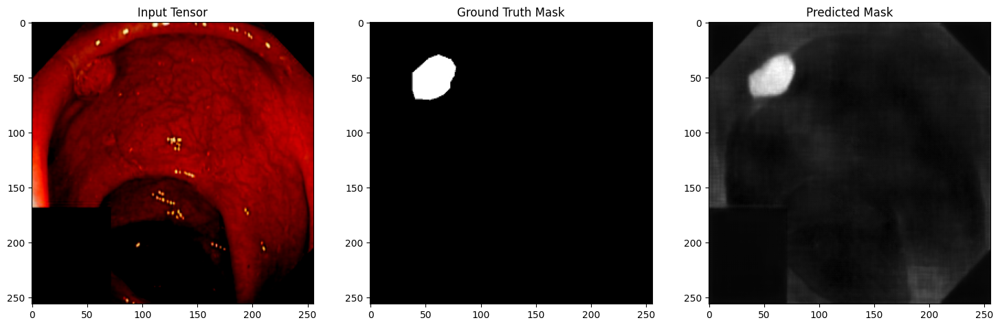

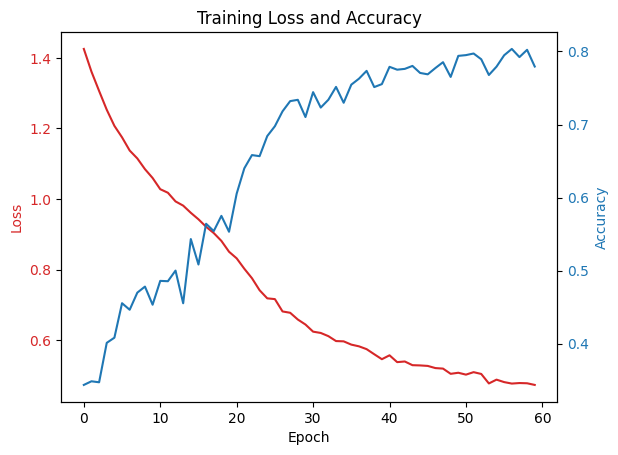

In [4]:
args_train_student = setup_train_args(my_model="unet_inception", dataset=dataset,
                                      data_root="./data_root/", batch_size=8, epochs=60, learning_rate=0.001)
losses, perfs, path = train_student(args_train_student)
visualize_loss_acc_plot(losses, acc_list=perfs, path=path+".png")

UNetAttn(
  (normalize): Normalize()
  (downs): ModuleList(
    (0): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (1): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_ru

Train Epoch: 1 [16/1290 (1.2%)]	Loss: 1.582988	Time: 2.151348

Train Epoch: 1 [32/1290 (2.5%)]	Loss: 1.458339	Time: 2.404821

Train Epoch: 1 [48/1290 (3.7%)]	Loss: 1.449981	Time: 2.645408

Train Epoch: 1 [64/1290 (5.0%)]	Loss: 1.405751	Time: 2.884911

Train Epoch: 1 [80/1290 (6.2%)]	Loss: 1.581764	Time: 3.121640

Train Epoch: 1 [96/1290 (7.5%)]	Loss: 1.501953	Time: 3.358628

Train Epoch: 1 [112/1290 (8.7%)]	Loss: 1.468885	Time: 3.594849

Train Epoch: 1 [128/1290 (9.9%)]	Loss: 1.620998	Time: 3.834652

Train Epoch: 1 [144/1290 (11.2%)]	Loss: 1.534274	Time: 4.075802

Train Epoch: 1 [160/1290 (12.4%)]	Loss: 1.414736	Time: 4.315572

Train Epoch: 1 [176/1290 (13.7%)]	Loss: 1.604779	Time: 4.551250

Train Epoch: 1 [192/1290 (14.9%)]	Loss: 1.566261	Time: 4.786508

Train Epoch: 1 [208/1290 (16.1%)]	Loss: 1.500975	Time: 5.021846

Train Epoch: 1 [224/1290 (17.4%)]	Loss: 1.539426	Time: 5.259638

Train Epoch: 1 [240/1290 (18.6%)]	Loss: 1.548152	Time: 5.495427

Train Epoch: 1 [256/1290 (19.9%)]	Loss: 1.395220	Time: 5.733126

Train Epoch: 1 [272/1290 (21.1%)]	Loss: 1.424046	Time: 5.974762

Train Epoch: 1 [288/1290 (22.4%)]	Loss: 1.390133	Time: 6.211253

Train Epoch: 1 [304/1290 (23.6%)]	Loss: 1.396945	Time: 6.446535

Train Epoch: 1 [320/1290 (24.8%)]	Loss: 1.416256	Time: 6.682713

Train Epoch: 1 [336/1290 (26.1%)]	Loss: 1.491488	Time: 6.920423

Train Epoch: 1 [352/1290 (27.3%)]	Loss: 1.479664	Time: 7.162946

Train Epoch: 1 [368/1290 (28.6%)]	Loss: 1.531801	Time: 7.398556

Train Epoch: 1 [384/1290 (29.8%)]	Loss: 1.413417	Time: 7.634922

Train Epoch: 1 [400/1290 (31.1%)]	Loss: 1.372842	Time: 7.874002

Train Epoch: 1 [416/1290 (32.3%)]	Loss: 1.413247	Time: 8.113024

Train Epoch: 1 [432/1290 (33.5%)]	Loss: 1.388951	Time: 8.348996

Train Epoch: 1 [448/1290 (34.8%)]	Loss: 1.471320	Time: 8.587152

Train Epoch: 1 [464/1290 (36.0%)]	Loss: 1.460868	Time: 8.824262

Train Epoch: 1 [480/1290 (37.3%)]	Loss: 1.363248	Time: 9.062074

Train Epoch: 1 [496/1290 (38.5%)]	Loss: 1.475180	Time: 9.299294

Train Epoch: 1 [512/1290 (39.8%)]	Loss: 1.403961	Time: 9.536704

Train Epoch: 1 [528/1290 (41.0%)]	Loss: 1.429362	Time: 9.775134

Train Epoch: 1 [544/1290 (42.2%)]	Loss: 1.381453	Time: 10.013139

Train Epoch: 1 [560/1290 (43.5%)]	Loss: 1.265967	Time: 10.251897

Train Epoch: 1 [576/1290 (44.7%)]	Loss: 1.493133	Time: 10.489290

Train Epoch: 1 [592/1290 (46.0%)]	Loss: 1.392078	Time: 10.727412

Train Epoch: 1 [608/1290 (47.2%)]	Loss: 1.469566	Time: 10.967799

Train Epoch: 1 [624/1290 (48.4%)]	Loss: 1.468741	Time: 11.205208

Train Epoch: 1 [640/1290 (49.7%)]	Loss: 1.522052	Time: 11.442084

Train Epoch: 1 [656/1290 (50.9%)]	Loss: 1.543768	Time: 11.680691

Train Epoch: 1 [672/1290 (52.2%)]	Loss: 1.430629	Time: 11.918050

Train Epoch: 1 [688/1290 (53.4%)]	Loss: 1.384945	Time: 12.155645

Train Epoch: 1 [704/1290 (54.7%)]	Loss: 1.436249	Time: 12.393604

Train Epoch: 1 [720/1290 (55.9%)]	Loss: 1.284926	Time: 12.632468

Train Epoch: 1 [736/1290 (57.1%)]	Loss: 1.303709	Time: 12.869773

Train Epoch: 1 [752/1290 (58.4%)]	Loss: 1.476225	Time: 13.108340

Train Epoch: 1 [768/1290 (59.6%)]	Loss: 1.447169	Time: 13.346034

Train Epoch: 1 [784/1290 (60.9%)]	Loss: 1.447133	Time: 13.583956

Train Epoch: 1 [800/1290 (62.1%)]	Loss: 1.488710	Time: 13.822643

Train Epoch: 1 [816/1290 (63.4%)]	Loss: 1.361486	Time: 14.059412

Train Epoch: 1 [832/1290 (64.6%)]	Loss: 1.524319	Time: 14.298106

Train Epoch: 1 [848/1290 (65.8%)]	Loss: 1.398644	Time: 14.537028

Train Epoch: 1 [864/1290 (67.1%)]	Loss: 1.532104	Time: 14.775537

Train Epoch: 1 [880/1290 (68.3%)]	Loss: 1.523779	Time: 15.013968

Train Epoch: 1 [896/1290 (69.6%)]	Loss: 1.464848	Time: 15.252213

Train Epoch: 1 [912/1290 (70.8%)]	Loss: 1.530800	Time: 15.490073

Train Epoch: 1 [928/1290 (72.0%)]	Loss: 1.385520	Time: 15.730223

Train Epoch: 1 [944/1290 (73.3%)]	Loss: 1.240151	Time: 15.967124

Train Epoch: 1 [960/1290 (74.5%)]	Loss: 1.566380	Time: 16.206109

Train Epoch: 1 [976/1290 (75.8%)]	Loss: 1.503101	Time: 16.442069

Train Epoch: 1 [992/1290 (77.0%)]	Loss: 1.531536	Time: 16.679990

Train Epoch: 1 [1008/1290 (78.3%)]	Loss: 1.296557	Time: 16.919083

Train Epoch: 1 [1024/1290 (79.5%)]	Loss: 1.496693	Time: 17.156816

Train Epoch: 1 [1040/1290 (80.7%)]	Loss: 1.533862	Time: 17.394951

Train Epoch: 1 [1056/1290 (82.0%)]	Loss: 1.346535	Time: 17.632325

Train Epoch: 1 [1072/1290 (83.2%)]	Loss: 1.424650	Time: 17.869786

Train Epoch: 1 [1088/1290 (84.5%)]	Loss: 1.455350	Time: 18.106427

Train Epoch: 1 [1104/1290 (85.7%)]	Loss: 1.546206	Time: 18.343024

Train Epoch: 1 [1120/1290 (87.0%)]	Loss: 1.295052	Time: 18.578457

Train Epoch: 1 [1136/1290 (88.2%)]	Loss: 1.325079	Time: 18.813246

Train Epoch: 1 [1152/1290 (89.4%)]	Loss: 1.505393	Time: 19.049137

Train Epoch: 1 [1168/1290 (90.7%)]	Loss: 1.348276	Time: 19.285029

Train Epoch: 1 [1184/1290 (91.9%)]	Loss: 1.447209	Time: 19.520077

Train Epoch: 1 [1200/1290 (93.2%)]	Loss: 1.471593	Time: 19.755741

Train Epoch: 1 [1216/1290 (94.4%)]	Loss: 1.505496	Time: 19.992208

Train Epoch: 1 [1232/1290 (95.7%)]	Loss: 1.366952	Time: 20.227240

Train Epoch: 1 [1248/1290 (96.9%)]	Loss: 1.437784	Time: 20.463278

Train Epoch: 1 [1264/1290 (98.1%)]	Loss: 1.480248	Time: 20.697582

Train Epoch: 1 [1280/1290 (99.4%)]	Loss: 1.349178	Time: 20.933805

Train Epoch: 1 [1288/1290 (100.0%)]	Average loss: 1.444117	Time: 21.051284


Test  Epoch: 1 [31/161 (19.3%)]	Average performance: 0.284418	Time: 0.670624

Test  Epoch: 1 [63/161 (39.1%)]	Average performance: 0.316526	Time: 0.872984

Test  Epoch: 1 [94/161 (58.4%)]	Average performance: 0.287361	Time: 1.075462

Test  Epoch: 1 [125/161 (77.6%)]	Average performance: 0.274606	Time: 1.279431

Test  Epoch: 1 [158/161 (98.1%)]	Average performance: 0.272520	Time: 1.482511

Test  Epoch: 1 [161/161 (100.0%)]	Average performance: 0.272473	Time: 1.500497


Train Epoch: 2 [8/1290 (0.6%)]	Loss: 1.243254	Time: 1.703310

Train Epoch: 2 [24/1290 (1.9%)]	Loss: 1.297767	Time: 2.093569

Train Epoch: 2 [40/1290 (3.1%)]	Loss: 1.308918	Time: 2.353701

Train Epoch: 2 [56/1290 (4.3%)]	Loss: 1.221759	Time: 2.593481

Train Epoch: 2 [72/1290 (5.6%)]	Loss: 1.421581	Time: 2.832675

Train Epoch: 2 [88/1290 (6.8%)]	Loss: 1.303022	Time: 3.074148

Train Epoch: 2 [104/1290 (8.1%)]	Loss: 1.486387	Time: 3.313287

Train Epoch: 2 [120/1290 (9.3%)]	Loss: 1.383449	Time: 3.554050

Train Epoch: 2 [136/1290 (10.6%)]	Loss: 1.386256	Time: 3.796116

Train Epoch: 2 [152/1290 (11.8%)]	Loss: 1.467131	Time: 4.041318

Train Epoch: 2 [168/1290 (13.0%)]	Loss: 1.330772	Time: 4.278843

Train Epoch: 2 [184/1290 (14.3%)]	Loss: 1.512542	Time: 4.516663

Train Epoch: 2 [200/1290 (15.5%)]	Loss: 1.285969	Time: 4.755744

Train Epoch: 2 [216/1290 (16.8%)]	Loss: 1.467319	Time: 4.994289

Train Epoch: 2 [232/1290 (18.0%)]	Loss: 1.354387	Time: 5.231909

Train Epoch: 2 [248/1290 (19.3%)]	Loss: 1.442351	Time: 5.468942

Train Epoch: 2 [264/1290 (20.5%)]	Loss: 1.237414	Time: 5.708446

Train Epoch: 2 [280/1290 (21.7%)]	Loss: 1.497986	Time: 5.945184

Train Epoch: 2 [296/1290 (23.0%)]	Loss: 1.305164	Time: 6.186621

Train Epoch: 2 [312/1290 (24.2%)]	Loss: 1.428092	Time: 6.424771

Train Epoch: 2 [328/1290 (25.5%)]	Loss: 1.318428	Time: 6.661734

Train Epoch: 2 [344/1290 (26.7%)]	Loss: 1.295645	Time: 6.898637

Train Epoch: 2 [360/1290 (28.0%)]	Loss: 1.290316	Time: 7.136767

Train Epoch: 2 [376/1290 (29.2%)]	Loss: 1.285913	Time: 7.373296

Train Epoch: 2 [392/1290 (30.4%)]	Loss: 1.277888	Time: 7.610509

Train Epoch: 2 [408/1290 (31.7%)]	Loss: 1.390238	Time: 7.850271

Train Epoch: 2 [424/1290 (32.9%)]	Loss: 1.424834	Time: 8.087620

Train Epoch: 2 [440/1290 (34.2%)]	Loss: 1.431083	Time: 8.325142

Train Epoch: 2 [456/1290 (35.4%)]	Loss: 1.361411	Time: 8.563976

Train Epoch: 2 [472/1290 (36.6%)]	Loss: 1.381051	Time: 8.802139

Train Epoch: 2 [488/1290 (37.9%)]	Loss: 1.575580	Time: 9.041598

Train Epoch: 2 [504/1290 (39.1%)]	Loss: 1.498705	Time: 9.280289

Train Epoch: 2 [520/1290 (40.4%)]	Loss: 1.336002	Time: 9.517213

Train Epoch: 2 [536/1290 (41.6%)]	Loss: 1.393977	Time: 9.755821

Train Epoch: 2 [552/1290 (42.9%)]	Loss: 1.411442	Time: 9.993253

Train Epoch: 2 [568/1290 (44.1%)]	Loss: 1.404791	Time: 10.233669

Train Epoch: 2 [584/1290 (45.3%)]	Loss: 1.392625	Time: 10.471927

Train Epoch: 2 [600/1290 (46.6%)]	Loss: 1.552138	Time: 10.711548

Train Epoch: 2 [616/1290 (47.8%)]	Loss: 1.236150	Time: 10.948165

Train Epoch: 2 [632/1290 (49.1%)]	Loss: 1.449096	Time: 11.187053

Train Epoch: 2 [648/1290 (50.3%)]	Loss: 1.177926	Time: 11.424344

Train Epoch: 2 [664/1290 (51.6%)]	Loss: 1.345295	Time: 11.663126

Train Epoch: 2 [680/1290 (52.8%)]	Loss: 1.338828	Time: 11.901422

Train Epoch: 2 [696/1290 (54.0%)]	Loss: 1.441320	Time: 12.138439

Train Epoch: 2 [712/1290 (55.3%)]	Loss: 1.382789	Time: 12.375137

Train Epoch: 2 [728/1290 (56.5%)]	Loss: 1.298083	Time: 12.615028

Train Epoch: 2 [744/1290 (57.8%)]	Loss: 1.345965	Time: 12.853404

Train Epoch: 2 [760/1290 (59.0%)]	Loss: 1.377465	Time: 13.092103

Train Epoch: 2 [776/1290 (60.2%)]	Loss: 1.427637	Time: 13.331716

Train Epoch: 2 [792/1290 (61.5%)]	Loss: 1.230277	Time: 13.569542

Train Epoch: 2 [808/1290 (62.7%)]	Loss: 1.306835	Time: 13.808685

Train Epoch: 2 [824/1290 (64.0%)]	Loss: 1.444997	Time: 14.045867

Train Epoch: 2 [840/1290 (65.2%)]	Loss: 1.418233	Time: 14.284474

Train Epoch: 2 [856/1290 (66.5%)]	Loss: 1.350488	Time: 14.523391

Train Epoch: 2 [872/1290 (67.7%)]	Loss: 1.369001	Time: 14.761574

Train Epoch: 2 [888/1290 (68.9%)]	Loss: 1.393390	Time: 15.002248

Train Epoch: 2 [904/1290 (70.2%)]	Loss: 1.350874	Time: 15.241853

Train Epoch: 2 [920/1290 (71.4%)]	Loss: 1.373352	Time: 15.481353

Train Epoch: 2 [936/1290 (72.7%)]	Loss: 1.487050	Time: 15.719658

Train Epoch: 2 [952/1290 (73.9%)]	Loss: 1.238728	Time: 15.961789

Train Epoch: 2 [968/1290 (75.2%)]	Loss: 1.321623	Time: 16.201472

Train Epoch: 2 [984/1290 (76.4%)]	Loss: 1.167851	Time: 16.440189

Train Epoch: 2 [1000/1290 (77.6%)]	Loss: 1.420937	Time: 16.676397

Train Epoch: 2 [1016/1290 (78.9%)]	Loss: 1.384679	Time: 16.915971

Train Epoch: 2 [1032/1290 (80.1%)]	Loss: 1.368636	Time: 17.154132

Train Epoch: 2 [1048/1290 (81.4%)]	Loss: 1.275087	Time: 17.392287

Train Epoch: 2 [1064/1290 (82.6%)]	Loss: 1.324429	Time: 17.629694

Train Epoch: 2 [1080/1290 (83.9%)]	Loss: 1.344793	Time: 17.864867

Train Epoch: 2 [1096/1290 (85.1%)]	Loss: 1.163364	Time: 18.101917

Train Epoch: 2 [1112/1290 (86.3%)]	Loss: 1.290308	Time: 18.337103

Train Epoch: 2 [1128/1290 (87.6%)]	Loss: 1.293737	Time: 18.572172

Train Epoch: 2 [1144/1290 (88.8%)]	Loss: 1.386704	Time: 18.808662

Train Epoch: 2 [1160/1290 (90.1%)]	Loss: 1.243757	Time: 19.044855

Train Epoch: 2 [1176/1290 (91.3%)]	Loss: 1.310327	Time: 19.280192

Train Epoch: 2 [1192/1290 (92.5%)]	Loss: 1.315027	Time: 19.516499

Train Epoch: 2 [1208/1290 (93.8%)]	Loss: 1.400043	Time: 19.752426

Train Epoch: 2 [1224/1290 (95.0%)]	Loss: 1.349360	Time: 19.987608

Train Epoch: 2 [1240/1290 (96.3%)]	Loss: 1.388935	Time: 20.223835

Train Epoch: 2 [1256/1290 (97.5%)]	Loss: 1.200886	Time: 20.459293

Train Epoch: 2 [1272/1290 (98.8%)]	Loss: 1.164241	Time: 20.695208

Train Epoch: 2 [1288/1290 (100.0%)]	Average loss: 1.352381	Time: 20.930622


Test  Epoch: 2 [28/161 (17.4%)]	Average performance: 0.397537	Time: 0.621067

Test  Epoch: 2 [61/161 (37.9%)]	Average performance: 0.430114	Time: 0.830486

Test  Epoch: 2 [92/161 (57.1%)]	Average performance: 0.404387	Time: 1.033228

Test  Epoch: 2 [123/161 (76.4%)]	Average performance: 0.399861	Time: 1.235701

Test  Epoch: 2 [156/161 (96.9%)]	Average performance: 0.395147	Time: 1.440332

Test  Epoch: 2 [161/161 (100.0%)]	Average performance: 0.396138	Time: 1.470486


Train Epoch: 3 [16/1290 (1.2%)]	Loss: 1.261140	Time: 1.695338

Train Epoch: 3 [32/1290 (2.5%)]	Loss: 1.365487	Time: 1.983988

Train Epoch: 3 [48/1290 (3.7%)]	Loss: 1.258582	Time: 2.258535

Train Epoch: 3 [64/1290 (5.0%)]	Loss: 1.269899	Time: 2.514743

Train Epoch: 3 [80/1290 (6.2%)]	Loss: 1.261400	Time: 2.756543

Train Epoch: 3 [96/1290 (7.5%)]	Loss: 1.228743	Time: 2.999401

Train Epoch: 3 [112/1290 (8.7%)]	Loss: 1.219643	Time: 3.240293

Train Epoch: 3 [128/1290 (9.9%)]	Loss: 1.177358	Time: 3.486592

Train Epoch: 3 [144/1290 (11.2%)]	Loss: 1.342752	Time: 3.741434

Train Epoch: 3 [160/1290 (12.4%)]	Loss: 1.360959	Time: 3.982070

Train Epoch: 3 [176/1290 (13.7%)]	Loss: 1.376980	Time: 4.219898

Train Epoch: 3 [192/1290 (14.9%)]	Loss: 1.365285	Time: 4.459742

Train Epoch: 3 [208/1290 (16.1%)]	Loss: 1.236553	Time: 4.697263

Train Epoch: 3 [224/1290 (17.4%)]	Loss: 1.171511	Time: 4.936751

Train Epoch: 3 [240/1290 (18.6%)]	Loss: 1.360569	Time: 5.174395

Train Epoch: 3 [256/1290 (19.9%)]	Loss: 1.330880	Time: 5.411941

Train Epoch: 3 [272/1290 (21.1%)]	Loss: 1.287093	Time: 5.657001

Train Epoch: 3 [288/1290 (22.4%)]	Loss: 1.354486	Time: 5.895224

Train Epoch: 3 [304/1290 (23.6%)]	Loss: 1.264012	Time: 6.132552

Train Epoch: 3 [320/1290 (24.8%)]	Loss: 1.266800	Time: 6.370567

Train Epoch: 3 [336/1290 (26.1%)]	Loss: 1.282318	Time: 6.610605

Train Epoch: 3 [352/1290 (27.3%)]	Loss: 1.307445	Time: 6.848128

Train Epoch: 3 [368/1290 (28.6%)]	Loss: 1.298544	Time: 7.088672

Train Epoch: 3 [384/1290 (29.8%)]	Loss: 1.317624	Time: 7.327329

Train Epoch: 3 [400/1290 (31.1%)]	Loss: 1.315442	Time: 7.568251

Train Epoch: 3 [416/1290 (32.3%)]	Loss: 1.365668	Time: 7.805401

Train Epoch: 3 [432/1290 (33.5%)]	Loss: 1.303975	Time: 8.046298

Train Epoch: 3 [448/1290 (34.8%)]	Loss: 1.278011	Time: 8.285483

Train Epoch: 3 [464/1290 (36.0%)]	Loss: 1.340183	Time: 8.524662

Train Epoch: 3 [480/1290 (37.3%)]	Loss: 1.187452	Time: 8.764426

Train Epoch: 3 [496/1290 (38.5%)]	Loss: 1.239258	Time: 9.004232

Train Epoch: 3 [512/1290 (39.8%)]	Loss: 1.325168	Time: 9.242398

Train Epoch: 3 [528/1290 (41.0%)]	Loss: 1.282549	Time: 9.480904

Train Epoch: 3 [544/1290 (42.2%)]	Loss: 1.280827	Time: 9.723688

Train Epoch: 3 [560/1290 (43.5%)]	Loss: 1.236665	Time: 9.961313

Train Epoch: 3 [576/1290 (44.7%)]	Loss: 1.330608	Time: 10.199288

Train Epoch: 3 [592/1290 (46.0%)]	Loss: 1.284785	Time: 10.438246

Train Epoch: 3 [608/1290 (47.2%)]	Loss: 1.385659	Time: 10.677089

Train Epoch: 3 [624/1290 (48.4%)]	Loss: 1.323405	Time: 10.918240

Train Epoch: 3 [640/1290 (49.7%)]	Loss: 1.326644	Time: 11.157109

Train Epoch: 3 [656/1290 (50.9%)]	Loss: 1.335551	Time: 11.398076

Train Epoch: 3 [672/1290 (52.2%)]	Loss: 1.197309	Time: 11.638265

Train Epoch: 3 [688/1290 (53.4%)]	Loss: 1.332662	Time: 11.877531

Train Epoch: 3 [704/1290 (54.7%)]	Loss: 1.450095	Time: 12.116995

Train Epoch: 3 [720/1290 (55.9%)]	Loss: 1.179572	Time: 12.357435

Train Epoch: 3 [736/1290 (57.1%)]	Loss: 1.238235	Time: 12.595096

Train Epoch: 3 [752/1290 (58.4%)]	Loss: 1.301079	Time: 12.834014

Train Epoch: 3 [768/1290 (59.6%)]	Loss: 1.310301	Time: 13.073682

Train Epoch: 3 [784/1290 (60.9%)]	Loss: 1.283176	Time: 13.313905

Train Epoch: 3 [800/1290 (62.1%)]	Loss: 1.369257	Time: 13.554039

Train Epoch: 3 [816/1290 (63.4%)]	Loss: 1.318019	Time: 13.793671

Train Epoch: 3 [832/1290 (64.6%)]	Loss: 1.189295	Time: 14.034335

Train Epoch: 3 [848/1290 (65.8%)]	Loss: 1.277586	Time: 14.274045

Train Epoch: 3 [864/1290 (67.1%)]	Loss: 1.359737	Time: 14.514701

Train Epoch: 3 [880/1290 (68.3%)]	Loss: 1.265942	Time: 14.752162

Train Epoch: 3 [896/1290 (69.6%)]	Loss: 1.405912	Time: 14.991135

Train Epoch: 3 [912/1290 (70.8%)]	Loss: 1.312099	Time: 15.229179

Train Epoch: 3 [928/1290 (72.0%)]	Loss: 1.373566	Time: 15.469728

Train Epoch: 3 [944/1290 (73.3%)]	Loss: 1.326523	Time: 15.710541

Train Epoch: 3 [960/1290 (74.5%)]	Loss: 1.267851	Time: 15.947967

Train Epoch: 3 [976/1290 (75.8%)]	Loss: 1.307169	Time: 16.189319

Train Epoch: 3 [992/1290 (77.0%)]	Loss: 1.280008	Time: 16.430299

Train Epoch: 3 [1008/1290 (78.3%)]	Loss: 1.226134	Time: 16.671157

Train Epoch: 3 [1024/1290 (79.5%)]	Loss: 1.340429	Time: 16.910368

Train Epoch: 3 [1040/1290 (80.7%)]	Loss: 1.316780	Time: 17.148840

Train Epoch: 3 [1056/1290 (82.0%)]	Loss: 1.265434	Time: 17.387514

Train Epoch: 3 [1072/1290 (83.2%)]	Loss: 1.067435	Time: 17.625323

Train Epoch: 3 [1088/1290 (84.5%)]	Loss: 1.297489	Time: 17.863235

Train Epoch: 3 [1104/1290 (85.7%)]	Loss: 1.281689	Time: 18.100025

Train Epoch: 3 [1120/1290 (87.0%)]	Loss: 1.488218	Time: 18.337021

Train Epoch: 3 [1136/1290 (88.2%)]	Loss: 1.243731	Time: 18.573854

Train Epoch: 3 [1152/1290 (89.4%)]	Loss: 1.445382	Time: 18.811803

Train Epoch: 3 [1168/1290 (90.7%)]	Loss: 1.300766	Time: 19.048032

Train Epoch: 3 [1184/1290 (91.9%)]	Loss: 1.254047	Time: 19.285478

Train Epoch: 3 [1200/1290 (93.2%)]	Loss: 1.222109	Time: 19.523117

Train Epoch: 3 [1216/1290 (94.4%)]	Loss: 1.370320	Time: 19.759954

Train Epoch: 3 [1232/1290 (95.7%)]	Loss: 1.315825	Time: 19.995595

Train Epoch: 3 [1248/1290 (96.9%)]	Loss: 1.375457	Time: 20.232716

Train Epoch: 3 [1264/1290 (98.1%)]	Loss: 1.172755	Time: 20.469012

Train Epoch: 3 [1280/1290 (99.4%)]	Loss: 1.355234	Time: 20.706903

Train Epoch: 3 [1288/1290 (100.0%)]	Average loss: 1.296869	Time: 20.825104


Test  Epoch: 3 [23/161 (14.3%)]	Average performance: 0.322385	Time: 0.555295

Test  Epoch: 3 [55/161 (34.2%)]	Average performance: 0.388680	Time: 0.755573

Test  Epoch: 3 [86/161 (53.4%)]	Average performance: 0.356813	Time: 0.959431

Test  Epoch: 3 [117/161 (72.7%)]	Average performance: 0.346289	Time: 1.163249

Test  Epoch: 3 [150/161 (93.2%)]	Average performance: 0.356651	Time: 1.369119

Test  Epoch: 3 [161/161 (100.0%)]	Average performance: 0.351753	Time: 1.436312


Train Epoch: 4 [16/1290 (1.2%)]	Loss: 1.305484	Time: 1.507088

Train Epoch: 4 [24/1290 (1.9%)]	Loss: 1.278709	Time: 1.645815

Train Epoch: 4 [40/1290 (3.1%)]	Loss: 1.202608	Time: 2.074044

Train Epoch: 4 [56/1290 (4.3%)]	Loss: 1.307064	Time: 2.314948

Train Epoch: 4 [72/1290 (5.6%)]	Loss: 1.256282	Time: 2.563418

Train Epoch: 4 [88/1290 (6.8%)]	Loss: 1.463149	Time: 2.804226

Train Epoch: 4 [104/1290 (8.1%)]	Loss: 1.276003	Time: 3.045239

Train Epoch: 4 [120/1290 (9.3%)]	Loss: 1.364650	Time: 3.283449

Train Epoch: 4 [136/1290 (10.6%)]	Loss: 1.209124	Time: 3.531720

Train Epoch: 4 [152/1290 (11.8%)]	Loss: 1.315162	Time: 3.770073

Train Epoch: 4 [168/1290 (13.0%)]	Loss: 1.181380	Time: 4.007290

Train Epoch: 4 [184/1290 (14.3%)]	Loss: 1.253484	Time: 4.246088

Train Epoch: 4 [200/1290 (15.5%)]	Loss: 1.214327	Time: 4.485061

Train Epoch: 4 [216/1290 (16.8%)]	Loss: 1.248692	Time: 4.723761

Train Epoch: 4 [232/1290 (18.0%)]	Loss: 1.199069	Time: 4.962274

Train Epoch: 4 [248/1290 (19.3%)]	Loss: 1.237029	Time: 5.199509

Train Epoch: 4 [264/1290 (20.5%)]	Loss: 1.347466	Time: 5.440817

Train Epoch: 4 [280/1290 (21.7%)]	Loss: 1.363662	Time: 5.678847

Train Epoch: 4 [296/1290 (23.0%)]	Loss: 1.322845	Time: 5.919213

Train Epoch: 4 [312/1290 (24.2%)]	Loss: 1.199392	Time: 6.157171

Train Epoch: 4 [328/1290 (25.5%)]	Loss: 1.147352	Time: 6.394976

Train Epoch: 4 [344/1290 (26.7%)]	Loss: 1.335797	Time: 6.635699

Train Epoch: 4 [360/1290 (28.0%)]	Loss: 1.230435	Time: 6.873023

Train Epoch: 4 [376/1290 (29.2%)]	Loss: 1.247253	Time: 7.110124

Train Epoch: 4 [392/1290 (30.4%)]	Loss: 1.139920	Time: 7.347155

Train Epoch: 4 [408/1290 (31.7%)]	Loss: 1.251350	Time: 7.585057

Train Epoch: 4 [424/1290 (32.9%)]	Loss: 1.364557	Time: 7.824833

Train Epoch: 4 [440/1290 (34.2%)]	Loss: 1.075182	Time: 8.063146

Train Epoch: 4 [456/1290 (35.4%)]	Loss: 1.222217	Time: 8.302191

Train Epoch: 4 [472/1290 (36.6%)]	Loss: 1.271887	Time: 8.540094

Train Epoch: 4 [488/1290 (37.9%)]	Loss: 1.333746	Time: 8.783579

Train Epoch: 4 [504/1290 (39.1%)]	Loss: 1.348424	Time: 9.021312

Train Epoch: 4 [520/1290 (40.4%)]	Loss: 1.294609	Time: 9.260339

Train Epoch: 4 [536/1290 (41.6%)]	Loss: 1.288417	Time: 9.500268

Train Epoch: 4 [552/1290 (42.9%)]	Loss: 1.306565	Time: 9.738947

Train Epoch: 4 [568/1290 (44.1%)]	Loss: 1.322958	Time: 9.978257

Train Epoch: 4 [584/1290 (45.3%)]	Loss: 1.260800	Time: 10.219222

Train Epoch: 4 [600/1290 (46.6%)]	Loss: 1.255139	Time: 10.456776

Train Epoch: 4 [616/1290 (47.8%)]	Loss: 1.195371	Time: 10.696040

Train Epoch: 4 [632/1290 (49.1%)]	Loss: 1.280071	Time: 10.935251

Train Epoch: 4 [648/1290 (50.3%)]	Loss: 1.320201	Time: 11.175262

Train Epoch: 4 [664/1290 (51.6%)]	Loss: 1.210452	Time: 11.413390

Train Epoch: 4 [680/1290 (52.8%)]	Loss: 1.105083	Time: 11.651848

Train Epoch: 4 [696/1290 (54.0%)]	Loss: 1.258171	Time: 11.890759

Train Epoch: 4 [712/1290 (55.3%)]	Loss: 1.163878	Time: 12.129297

Train Epoch: 4 [728/1290 (56.5%)]	Loss: 1.310542	Time: 12.366456

Train Epoch: 4 [744/1290 (57.8%)]	Loss: 1.363859	Time: 12.605713

Train Epoch: 4 [760/1290 (59.0%)]	Loss: 1.264072	Time: 12.843605

Train Epoch: 4 [776/1290 (60.2%)]	Loss: 1.281485	Time: 13.081392

Train Epoch: 4 [792/1290 (61.5%)]	Loss: 1.110743	Time: 13.322676

Train Epoch: 4 [808/1290 (62.7%)]	Loss: 1.206393	Time: 13.559984

Train Epoch: 4 [824/1290 (64.0%)]	Loss: 1.167154	Time: 13.799135

Train Epoch: 4 [840/1290 (65.2%)]	Loss: 1.172362	Time: 14.038998

Train Epoch: 4 [856/1290 (66.5%)]	Loss: 1.023468	Time: 14.278917

Train Epoch: 4 [872/1290 (67.7%)]	Loss: 1.265042	Time: 14.519265

Train Epoch: 4 [888/1290 (68.9%)]	Loss: 1.319503	Time: 14.757350

Train Epoch: 4 [904/1290 (70.2%)]	Loss: 1.303332	Time: 14.995267

Train Epoch: 4 [920/1290 (71.4%)]	Loss: 1.162206	Time: 15.235571

Train Epoch: 4 [936/1290 (72.7%)]	Loss: 1.187000	Time: 15.479095

Train Epoch: 4 [952/1290 (73.9%)]	Loss: 1.301256	Time: 15.719399

Train Epoch: 4 [968/1290 (75.2%)]	Loss: 1.360549	Time: 15.956797

Train Epoch: 4 [984/1290 (76.4%)]	Loss: 1.321842	Time: 16.196597

Train Epoch: 4 [1000/1290 (77.6%)]	Loss: 1.215288	Time: 16.435400

Train Epoch: 4 [1016/1290 (78.9%)]	Loss: 1.183537	Time: 16.674901

Train Epoch: 4 [1032/1290 (80.1%)]	Loss: 1.250655	Time: 16.913963

Train Epoch: 4 [1048/1290 (81.4%)]	Loss: 1.349529	Time: 17.153530

Train Epoch: 4 [1064/1290 (82.6%)]	Loss: 1.255823	Time: 17.391720

Train Epoch: 4 [1080/1290 (83.9%)]	Loss: 1.216956	Time: 17.629048

Train Epoch: 4 [1096/1290 (85.1%)]	Loss: 1.276903	Time: 17.865853

Train Epoch: 4 [1112/1290 (86.3%)]	Loss: 1.250244	Time: 18.102530

Train Epoch: 4 [1128/1290 (87.6%)]	Loss: 1.159497	Time: 18.340064

Train Epoch: 4 [1144/1290 (88.8%)]	Loss: 1.267208	Time: 18.577235

Train Epoch: 4 [1160/1290 (90.1%)]	Loss: 1.321557	Time: 18.814110

Train Epoch: 4 [1176/1290 (91.3%)]	Loss: 1.267884	Time: 19.051874

Train Epoch: 4 [1192/1290 (92.5%)]	Loss: 1.296871	Time: 19.287398

Train Epoch: 4 [1208/1290 (93.8%)]	Loss: 1.153333	Time: 19.524047

Train Epoch: 4 [1224/1290 (95.0%)]	Loss: 1.227863	Time: 19.760310

Train Epoch: 4 [1240/1290 (96.3%)]	Loss: 1.337831	Time: 19.996945

Train Epoch: 4 [1256/1290 (97.5%)]	Loss: 1.192598	Time: 20.233983

Train Epoch: 4 [1272/1290 (98.8%)]	Loss: 1.275814	Time: 20.470927

Train Epoch: 4 [1288/1290 (100.0%)]	Average loss: 1.256928	Time: 20.708298


Test  Epoch: 4 [23/161 (14.3%)]	Average performance: 0.395425	Time: 0.603559

Test  Epoch: 4 [55/161 (34.2%)]	Average performance: 0.400650	Time: 0.806737

Test  Epoch: 4 [86/161 (53.4%)]	Average performance: 0.407067	Time: 1.014067

Test  Epoch: 4 [117/161 (72.7%)]	Average performance: 0.398005	Time: 1.219546

Test  Epoch: 4 [149/161 (92.5%)]	Average performance: 0.401448	Time: 1.422252

Test  Epoch: 4 [161/161 (100.0%)]	Average performance: 0.393686	Time: 1.495305


Train Epoch: 5 [16/1290 (1.2%)]	Loss: 1.220725	Time: 2.040599

Train Epoch: 5 [32/1290 (2.5%)]	Loss: 1.190763	Time: 2.286115

Train Epoch: 5 [48/1290 (3.7%)]	Loss: 1.172653	Time: 2.529628

Train Epoch: 5 [64/1290 (5.0%)]	Loss: 1.166068	Time: 2.774410

Train Epoch: 5 [80/1290 (6.2%)]	Loss: 1.226683	Time: 3.013855

Train Epoch: 5 [96/1290 (7.5%)]	Loss: 1.280529	Time: 3.253535

Train Epoch: 5 [112/1290 (8.7%)]	Loss: 1.224152	Time: 3.493942

Train Epoch: 5 [128/1290 (9.9%)]	Loss: 1.308780	Time: 3.733530

Train Epoch: 5 [144/1290 (11.2%)]	Loss: 1.222074	Time: 3.978554

Train Epoch: 5 [160/1290 (12.4%)]	Loss: 1.190762	Time: 4.218852

Train Epoch: 5 [176/1290 (13.7%)]	Loss: 1.352313	Time: 4.457006

Train Epoch: 5 [192/1290 (14.9%)]	Loss: 1.215566	Time: 4.693875

Train Epoch: 5 [208/1290 (16.1%)]	Loss: 1.213255	Time: 4.931522

Train Epoch: 5 [224/1290 (17.4%)]	Loss: 1.100115	Time: 5.169008

Train Epoch: 5 [240/1290 (18.6%)]	Loss: 1.169788	Time: 5.407439

Train Epoch: 5 [256/1290 (19.9%)]	Loss: 1.246614	Time: 5.646074

Train Epoch: 5 [272/1290 (21.1%)]	Loss: 1.303259	Time: 5.885874

Train Epoch: 5 [288/1290 (22.4%)]	Loss: 1.295429	Time: 6.125736

Train Epoch: 5 [304/1290 (23.6%)]	Loss: 1.112828	Time: 6.363730

Train Epoch: 5 [320/1290 (24.8%)]	Loss: 1.285502	Time: 6.603121

Train Epoch: 5 [336/1290 (26.1%)]	Loss: 1.063162	Time: 6.842625

Train Epoch: 5 [352/1290 (27.3%)]	Loss: 1.223193	Time: 7.080689

Train Epoch: 5 [368/1290 (28.6%)]	Loss: 1.158558	Time: 7.319629

Train Epoch: 5 [384/1290 (29.8%)]	Loss: 1.188713	Time: 7.559660

Train Epoch: 5 [400/1290 (31.1%)]	Loss: 1.188938	Time: 7.800424

Train Epoch: 5 [416/1290 (32.3%)]	Loss: 1.153898	Time: 8.039216

Train Epoch: 5 [432/1290 (33.5%)]	Loss: 1.239864	Time: 8.279156

Train Epoch: 5 [448/1290 (34.8%)]	Loss: 1.175375	Time: 8.516492

Train Epoch: 5 [464/1290 (36.0%)]	Loss: 1.282794	Time: 8.755248

Train Epoch: 5 [480/1290 (37.3%)]	Loss: 1.278053	Time: 8.994030

Train Epoch: 5 [496/1290 (38.5%)]	Loss: 1.198399	Time: 9.233758

Train Epoch: 5 [512/1290 (39.8%)]	Loss: 1.130050	Time: 9.472270

Train Epoch: 5 [528/1290 (41.0%)]	Loss: 1.187061	Time: 9.712438

Train Epoch: 5 [544/1290 (42.2%)]	Loss: 1.233003	Time: 9.951254

Train Epoch: 5 [560/1290 (43.5%)]	Loss: 1.298728	Time: 10.190894

Train Epoch: 5 [576/1290 (44.7%)]	Loss: 1.161780	Time: 10.431061

Train Epoch: 5 [592/1290 (46.0%)]	Loss: 1.152679	Time: 10.670129

Train Epoch: 5 [608/1290 (47.2%)]	Loss: 1.222416	Time: 10.909793

Train Epoch: 5 [624/1290 (48.4%)]	Loss: 1.219711	Time: 11.147845

Train Epoch: 5 [640/1290 (49.7%)]	Loss: 1.108082	Time: 11.387958

Train Epoch: 5 [656/1290 (50.9%)]	Loss: 1.212333	Time: 11.626321

Train Epoch: 5 [672/1290 (52.2%)]	Loss: 1.218653	Time: 11.866490

Train Epoch: 5 [688/1290 (53.4%)]	Loss: 1.190014	Time: 12.104387

Train Epoch: 5 [704/1290 (54.7%)]	Loss: 1.111744	Time: 12.346290

Train Epoch: 5 [720/1290 (55.9%)]	Loss: 1.209584	Time: 12.585995

Train Epoch: 5 [736/1290 (57.1%)]	Loss: 1.232096	Time: 12.827951

Train Epoch: 5 [752/1290 (58.4%)]	Loss: 1.097826	Time: 13.068590

Train Epoch: 5 [768/1290 (59.6%)]	Loss: 1.070299	Time: 13.308236

Train Epoch: 5 [784/1290 (60.9%)]	Loss: 1.256139	Time: 13.548090

Train Epoch: 5 [800/1290 (62.1%)]	Loss: 1.261564	Time: 13.787872

Train Epoch: 5 [816/1290 (63.4%)]	Loss: 1.122520	Time: 14.027911

Train Epoch: 5 [832/1290 (64.6%)]	Loss: 1.253223	Time: 14.268961

Train Epoch: 5 [848/1290 (65.8%)]	Loss: 1.321667	Time: 14.510023

Train Epoch: 5 [864/1290 (67.1%)]	Loss: 1.242093	Time: 14.748389

Train Epoch: 5 [880/1290 (68.3%)]	Loss: 1.297855	Time: 14.988141

Train Epoch: 5 [896/1290 (69.6%)]	Loss: 1.265110	Time: 15.228873

Train Epoch: 5 [912/1290 (70.8%)]	Loss: 1.198581	Time: 15.467785

Train Epoch: 5 [928/1290 (72.0%)]	Loss: 1.199366	Time: 15.707779

Train Epoch: 5 [944/1290 (73.3%)]	Loss: 1.284072	Time: 15.946921

Train Epoch: 5 [960/1290 (74.5%)]	Loss: 1.275385	Time: 16.187527

Train Epoch: 5 [976/1290 (75.8%)]	Loss: 1.205005	Time: 16.427904

Train Epoch: 5 [992/1290 (77.0%)]	Loss: 1.190099	Time: 16.668009

Train Epoch: 5 [1008/1290 (78.3%)]	Loss: 1.176359	Time: 16.906862

Train Epoch: 5 [1024/1290 (79.5%)]	Loss: 1.203019	Time: 17.146582

Train Epoch: 5 [1040/1290 (80.7%)]	Loss: 1.255217	Time: 17.386227

Train Epoch: 5 [1056/1290 (82.0%)]	Loss: 1.139498	Time: 17.625462

Train Epoch: 5 [1072/1290 (83.2%)]	Loss: 1.196641	Time: 17.865242

Train Epoch: 5 [1088/1290 (84.5%)]	Loss: 1.114469	Time: 18.101689

Train Epoch: 5 [1104/1290 (85.7%)]	Loss: 1.181511	Time: 18.338459

Train Epoch: 5 [1120/1290 (87.0%)]	Loss: 1.259691	Time: 18.575896

Train Epoch: 5 [1136/1290 (88.2%)]	Loss: 1.168817	Time: 18.812769

Train Epoch: 5 [1152/1290 (89.4%)]	Loss: 1.114400	Time: 19.049474

Train Epoch: 5 [1168/1290 (90.7%)]	Loss: 1.154166	Time: 19.286474

Train Epoch: 5 [1184/1290 (91.9%)]	Loss: 1.219827	Time: 19.523210

Train Epoch: 5 [1200/1290 (93.2%)]	Loss: 1.246218	Time: 19.761785

Train Epoch: 5 [1216/1290 (94.4%)]	Loss: 1.232436	Time: 19.998284

Train Epoch: 5 [1232/1290 (95.7%)]	Loss: 1.262624	Time: 20.234888

Train Epoch: 5 [1248/1290 (96.9%)]	Loss: 1.187201	Time: 20.471779

Train Epoch: 5 [1264/1290 (98.1%)]	Loss: 1.140131	Time: 20.708816

Train Epoch: 5 [1280/1290 (99.4%)]	Loss: 1.392190	Time: 20.944907

Train Epoch: 5 [1288/1290 (100.0%)]	Average loss: 1.210077	Time: 21.063466


Test  Epoch: 5 [24/161 (14.9%)]	Average performance: 0.314466	Time: 0.595097

Test  Epoch: 5 [56/161 (34.8%)]	Average performance: 0.366055	Time: 0.798628

Test  Epoch: 5 [88/161 (54.7%)]	Average performance: 0.353258	Time: 1.008320

Test  Epoch: 5 [119/161 (73.9%)]	Average performance: 0.362393	Time: 1.211857

Test  Epoch: 5 [152/161 (94.4%)]	Average performance: 0.366971	Time: 1.417204

Test  Epoch: 5 [161/161 (100.0%)]	Average performance: 0.362996	Time: 1.472154


Train Epoch: 6 [8/1290 (0.6%)]	Loss: 1.187966	Time: 1.174286

Train Epoch: 6 [24/1290 (1.9%)]	Loss: 1.275330	Time: 1.867711

Train Epoch: 6 [40/1290 (3.1%)]	Loss: 1.249745	Time: 2.123953

Train Epoch: 6 [56/1290 (4.3%)]	Loss: 1.142219	Time: 2.366388

Train Epoch: 6 [72/1290 (5.6%)]	Loss: 1.252360	Time: 2.612536

Train Epoch: 6 [88/1290 (6.8%)]	Loss: 1.181640	Time: 2.857736

Train Epoch: 6 [104/1290 (8.1%)]	Loss: 1.086468	Time: 3.099560

Train Epoch: 6 [120/1290 (9.3%)]	Loss: 1.252136	Time: 3.341030

Train Epoch: 6 [136/1290 (10.6%)]	Loss: 1.098165	Time: 3.579943

Train Epoch: 6 [152/1290 (11.8%)]	Loss: 1.055682	Time: 3.824448

Train Epoch: 6 [168/1290 (13.0%)]	Loss: 1.199938	Time: 4.067289

Train Epoch: 6 [184/1290 (14.3%)]	Loss: 1.280572	Time: 4.305348

Train Epoch: 6 [200/1290 (15.5%)]	Loss: 1.298433	Time: 4.543752

Train Epoch: 6 [216/1290 (16.8%)]	Loss: 1.183847	Time: 4.783147

Train Epoch: 6 [232/1290 (18.0%)]	Loss: 1.191690	Time: 5.021026

Train Epoch: 6 [248/1290 (19.3%)]	Loss: 1.171618	Time: 5.261995

Train Epoch: 6 [264/1290 (20.5%)]	Loss: 1.163772	Time: 5.500585

Train Epoch: 6 [280/1290 (21.7%)]	Loss: 1.173088	Time: 5.743242

Train Epoch: 6 [296/1290 (23.0%)]	Loss: 1.185981	Time: 5.981565

Train Epoch: 6 [312/1290 (24.2%)]	Loss: 1.206936	Time: 6.220124

Train Epoch: 6 [328/1290 (25.5%)]	Loss: 1.255461	Time: 6.458379

Train Epoch: 6 [344/1290 (26.7%)]	Loss: 1.313113	Time: 6.698834

Train Epoch: 6 [360/1290 (28.0%)]	Loss: 1.093734	Time: 6.940560

Train Epoch: 6 [376/1290 (29.2%)]	Loss: 1.061479	Time: 7.179407

Train Epoch: 6 [392/1290 (30.4%)]	Loss: 1.150093	Time: 7.420328

Train Epoch: 6 [408/1290 (31.7%)]	Loss: 1.202788	Time: 7.661204

Train Epoch: 6 [424/1290 (32.9%)]	Loss: 1.113858	Time: 7.902406

Train Epoch: 6 [440/1290 (34.2%)]	Loss: 1.254681	Time: 8.142660

Train Epoch: 6 [456/1290 (35.4%)]	Loss: 1.204192	Time: 8.381921

Train Epoch: 6 [472/1290 (36.6%)]	Loss: 1.086175	Time: 8.620514

Train Epoch: 6 [488/1290 (37.9%)]	Loss: 1.328030	Time: 8.860484

Train Epoch: 6 [504/1290 (39.1%)]	Loss: 1.152929	Time: 9.101218

Train Epoch: 6 [520/1290 (40.4%)]	Loss: 1.237252	Time: 9.339186

Train Epoch: 6 [536/1290 (41.6%)]	Loss: 1.153054	Time: 9.581123

Train Epoch: 6 [552/1290 (42.9%)]	Loss: 1.247395	Time: 9.820734

Train Epoch: 6 [568/1290 (44.1%)]	Loss: 1.197188	Time: 10.061667

Train Epoch: 6 [584/1290 (45.3%)]	Loss: 1.253597	Time: 10.300848

Train Epoch: 6 [600/1290 (46.6%)]	Loss: 1.255613	Time: 10.540480

Train Epoch: 6 [616/1290 (47.8%)]	Loss: 1.041257	Time: 10.781134

Train Epoch: 6 [632/1290 (49.1%)]	Loss: 1.139902	Time: 11.021760

Train Epoch: 6 [648/1290 (50.3%)]	Loss: 1.130036	Time: 11.260017

Train Epoch: 6 [664/1290 (51.6%)]	Loss: 1.184479	Time: 11.500245

Train Epoch: 6 [680/1290 (52.8%)]	Loss: 1.175439	Time: 11.739162

Train Epoch: 6 [696/1290 (54.0%)]	Loss: 1.193942	Time: 11.978735

Train Epoch: 6 [712/1290 (55.3%)]	Loss: 1.180839	Time: 12.218300

Train Epoch: 6 [728/1290 (56.5%)]	Loss: 1.226578	Time: 12.458883

Train Epoch: 6 [744/1290 (57.8%)]	Loss: 1.194429	Time: 12.698093

Train Epoch: 6 [760/1290 (59.0%)]	Loss: 1.155722	Time: 12.939996

Train Epoch: 6 [776/1290 (60.2%)]	Loss: 1.236146	Time: 13.179450

Train Epoch: 6 [792/1290 (61.5%)]	Loss: 1.108288	Time: 13.418147

Train Epoch: 6 [808/1290 (62.7%)]	Loss: 1.088589	Time: 13.657863

Train Epoch: 6 [824/1290 (64.0%)]	Loss: 1.103325	Time: 13.899881

Train Epoch: 6 [840/1290 (65.2%)]	Loss: 1.213021	Time: 14.141203

Train Epoch: 6 [856/1290 (66.5%)]	Loss: 1.171618	Time: 14.380215

Train Epoch: 6 [872/1290 (67.7%)]	Loss: 1.165340	Time: 14.619637

Train Epoch: 6 [888/1290 (68.9%)]	Loss: 1.240794	Time: 14.861052

Train Epoch: 6 [904/1290 (70.2%)]	Loss: 1.261076	Time: 15.098828

Train Epoch: 6 [920/1290 (71.4%)]	Loss: 1.175558	Time: 15.338128

Train Epoch: 6 [936/1290 (72.7%)]	Loss: 1.076024	Time: 15.579036

Train Epoch: 6 [952/1290 (73.9%)]	Loss: 1.127443	Time: 15.818490

Train Epoch: 6 [968/1290 (75.2%)]	Loss: 1.199371	Time: 16.059854

Train Epoch: 6 [984/1290 (76.4%)]	Loss: 1.173133	Time: 16.300301

Train Epoch: 6 [1000/1290 (77.6%)]	Loss: 1.149459	Time: 16.540241

Train Epoch: 6 [1016/1290 (78.9%)]	Loss: 1.175310	Time: 16.781002

Train Epoch: 6 [1032/1290 (80.1%)]	Loss: 1.164026	Time: 17.020261

Train Epoch: 6 [1048/1290 (81.4%)]	Loss: 1.133331	Time: 17.258811

Train Epoch: 6 [1064/1290 (82.6%)]	Loss: 1.263088	Time: 17.496810

Train Epoch: 6 [1080/1290 (83.9%)]	Loss: 1.195995	Time: 17.734775

Train Epoch: 6 [1096/1290 (85.1%)]	Loss: 1.129061	Time: 17.971958

Train Epoch: 6 [1112/1290 (86.3%)]	Loss: 1.272855	Time: 18.208883

Train Epoch: 6 [1128/1290 (87.6%)]	Loss: 1.252398	Time: 18.446318

Train Epoch: 6 [1144/1290 (88.8%)]	Loss: 1.194202	Time: 18.683465

Train Epoch: 6 [1160/1290 (90.1%)]	Loss: 1.083037	Time: 18.919882

Train Epoch: 6 [1176/1290 (91.3%)]	Loss: 1.047441	Time: 19.156910

Train Epoch: 6 [1192/1290 (92.5%)]	Loss: 1.143493	Time: 19.394192

Train Epoch: 6 [1208/1290 (93.8%)]	Loss: 1.137002	Time: 19.631723

Train Epoch: 6 [1224/1290 (95.0%)]	Loss: 1.194467	Time: 19.870373

Train Epoch: 6 [1240/1290 (96.3%)]	Loss: 1.274573	Time: 20.106146

Train Epoch: 6 [1256/1290 (97.5%)]	Loss: 1.067307	Time: 20.342236

Train Epoch: 6 [1272/1290 (98.8%)]	Loss: 1.229123	Time: 20.579220

Train Epoch: 6 [1288/1290 (100.0%)]	Average loss: 1.180232	Time: 20.816400


Test  Epoch: 6 [26/161 (16.1%)]	Average performance: 0.404459	Time: 0.579705

Test  Epoch: 6 [58/161 (36.0%)]	Average performance: 0.389779	Time: 0.782603

Test  Epoch: 6 [89/161 (55.3%)]	Average performance: 0.382163	Time: 0.984908

Test  Epoch: 6 [120/161 (74.5%)]	Average performance: 0.391430	Time: 1.189459

Test  Epoch: 6 [153/161 (95.0%)]	Average performance: 0.394463	Time: 1.394936

Test  Epoch: 6 [161/161 (100.0%)]	Average performance: 0.388687	Time: 1.443346


Train Epoch: 7 [16/1290 (1.2%)]	Loss: 1.281772	Time: 1.830158

Train Epoch: 7 [32/1290 (2.5%)]	Loss: 1.116683	Time: 2.098893

Train Epoch: 7 [48/1290 (3.7%)]	Loss: 1.222914	Time: 2.344507

Train Epoch: 7 [64/1290 (5.0%)]	Loss: 1.117457	Time: 2.585243

Train Epoch: 7 [80/1290 (6.2%)]	Loss: 1.288646	Time: 2.829271

Train Epoch: 7 [96/1290 (7.5%)]	Loss: 1.115376	Time: 3.075229

Train Epoch: 7 [112/1290 (8.7%)]	Loss: 1.188091	Time: 3.315146

Train Epoch: 7 [128/1290 (9.9%)]	Loss: 1.225754	Time: 3.554317

Train Epoch: 7 [144/1290 (11.2%)]	Loss: 1.239989	Time: 3.800832

Train Epoch: 7 [160/1290 (12.4%)]	Loss: 1.212154	Time: 4.043737

Train Epoch: 7 [176/1290 (13.7%)]	Loss: 1.231467	Time: 4.285552

Train Epoch: 7 [192/1290 (14.9%)]	Loss: 1.218821	Time: 4.523364

Train Epoch: 7 [208/1290 (16.1%)]	Loss: 1.259324	Time: 4.763914

Train Epoch: 7 [224/1290 (17.4%)]	Loss: 1.177786	Time: 5.006065

Train Epoch: 7 [240/1290 (18.6%)]	Loss: 1.293613	Time: 5.243862

Train Epoch: 7 [256/1290 (19.9%)]	Loss: 1.137460	Time: 5.483788

Train Epoch: 7 [272/1290 (21.1%)]	Loss: 1.082114	Time: 5.726209

Train Epoch: 7 [288/1290 (22.4%)]	Loss: 1.068390	Time: 5.965090

Train Epoch: 7 [304/1290 (23.6%)]	Loss: 1.026562	Time: 6.204954

Train Epoch: 7 [320/1290 (24.8%)]	Loss: 1.189633	Time: 6.444525

Train Epoch: 7 [336/1290 (26.1%)]	Loss: 1.251149	Time: 6.683386

Train Epoch: 7 [352/1290 (27.3%)]	Loss: 1.223049	Time: 6.923829

Train Epoch: 7 [368/1290 (28.6%)]	Loss: 1.232012	Time: 7.163288

Train Epoch: 7 [384/1290 (29.8%)]	Loss: 1.048934	Time: 7.402556

Train Epoch: 7 [400/1290 (31.1%)]	Loss: 1.207406	Time: 7.643504

Train Epoch: 7 [416/1290 (32.3%)]	Loss: 1.056363	Time: 7.883223

Train Epoch: 7 [432/1290 (33.5%)]	Loss: 1.198781	Time: 8.123260

Train Epoch: 7 [448/1290 (34.8%)]	Loss: 1.232551	Time: 8.362552

Train Epoch: 7 [464/1290 (36.0%)]	Loss: 1.133165	Time: 8.603177

Train Epoch: 7 [480/1290 (37.3%)]	Loss: 1.213568	Time: 8.844049

Train Epoch: 7 [496/1290 (38.5%)]	Loss: 1.165640	Time: 9.081840

Train Epoch: 7 [512/1290 (39.8%)]	Loss: 1.186082	Time: 9.321104

Train Epoch: 7 [528/1290 (41.0%)]	Loss: 1.076675	Time: 9.561916

Train Epoch: 7 [544/1290 (42.2%)]	Loss: 1.179776	Time: 9.801389

Train Epoch: 7 [560/1290 (43.5%)]	Loss: 1.072162	Time: 10.040164

Train Epoch: 7 [576/1290 (44.7%)]	Loss: 1.060875	Time: 10.282611

Train Epoch: 7 [592/1290 (46.0%)]	Loss: 1.093085	Time: 10.522323

Train Epoch: 7 [608/1290 (47.2%)]	Loss: 1.242381	Time: 10.762796

Train Epoch: 7 [624/1290 (48.4%)]	Loss: 1.250758	Time: 11.003029

Train Epoch: 7 [640/1290 (49.7%)]	Loss: 1.066627	Time: 11.242048

Train Epoch: 7 [656/1290 (50.9%)]	Loss: 1.128145	Time: 11.482007

Train Epoch: 7 [672/1290 (52.2%)]	Loss: 1.121204	Time: 11.722807

Train Epoch: 7 [688/1290 (53.4%)]	Loss: 1.105366	Time: 11.961923

Train Epoch: 7 [704/1290 (54.7%)]	Loss: 1.088898	Time: 12.202318

Train Epoch: 7 [720/1290 (55.9%)]	Loss: 1.134216	Time: 12.444026

Train Epoch: 7 [736/1290 (57.1%)]	Loss: 1.068042	Time: 12.683452

Train Epoch: 7 [752/1290 (58.4%)]	Loss: 1.074719	Time: 12.923796

Train Epoch: 7 [768/1290 (59.6%)]	Loss: 1.151495	Time: 13.163720

Train Epoch: 7 [784/1290 (60.9%)]	Loss: 1.234369	Time: 13.404553

Train Epoch: 7 [800/1290 (62.1%)]	Loss: 1.074209	Time: 13.646103

Train Epoch: 7 [816/1290 (63.4%)]	Loss: 1.055225	Time: 13.885515

Train Epoch: 7 [832/1290 (64.6%)]	Loss: 0.972645	Time: 14.124806

Train Epoch: 7 [848/1290 (65.8%)]	Loss: 1.184319	Time: 14.364764

Train Epoch: 7 [864/1290 (67.1%)]	Loss: 1.234899	Time: 14.604976

Train Epoch: 7 [880/1290 (68.3%)]	Loss: 1.232997	Time: 14.845421

Train Epoch: 7 [896/1290 (69.6%)]	Loss: 1.187940	Time: 15.085815

Train Epoch: 7 [912/1290 (70.8%)]	Loss: 1.166282	Time: 15.325639

Train Epoch: 7 [928/1290 (72.0%)]	Loss: 1.314310	Time: 15.565755

Train Epoch: 7 [944/1290 (73.3%)]	Loss: 1.185335	Time: 15.805397

Train Epoch: 7 [960/1290 (74.5%)]	Loss: 1.067645	Time: 16.046206

Train Epoch: 7 [976/1290 (75.8%)]	Loss: 1.249558	Time: 16.285301

Train Epoch: 7 [992/1290 (77.0%)]	Loss: 1.162816	Time: 16.527982

Train Epoch: 7 [1008/1290 (78.3%)]	Loss: 1.196763	Time: 16.767291

Train Epoch: 7 [1024/1290 (79.5%)]	Loss: 1.150506	Time: 17.007432

Train Epoch: 7 [1040/1290 (80.7%)]	Loss: 1.009081	Time: 17.246614

Train Epoch: 7 [1056/1290 (82.0%)]	Loss: 1.087274	Time: 17.486707

Train Epoch: 7 [1072/1290 (83.2%)]	Loss: 1.173427	Time: 17.725287

Train Epoch: 7 [1088/1290 (84.5%)]	Loss: 1.150930	Time: 17.963216

Train Epoch: 7 [1104/1290 (85.7%)]	Loss: 1.080967	Time: 18.200881

Train Epoch: 7 [1120/1290 (87.0%)]	Loss: 1.126323	Time: 18.439319

Train Epoch: 7 [1136/1290 (88.2%)]	Loss: 1.016236	Time: 18.675766

Train Epoch: 7 [1152/1290 (89.4%)]	Loss: 1.193172	Time: 18.913128

Train Epoch: 7 [1168/1290 (90.7%)]	Loss: 1.102230	Time: 19.149798

Train Epoch: 7 [1184/1290 (91.9%)]	Loss: 1.139342	Time: 19.386792

Train Epoch: 7 [1200/1290 (93.2%)]	Loss: 1.104078	Time: 19.622919

Train Epoch: 7 [1216/1290 (94.4%)]	Loss: 1.042803	Time: 19.860172

Train Epoch: 7 [1232/1290 (95.7%)]	Loss: 1.179823	Time: 20.097814

Train Epoch: 7 [1248/1290 (96.9%)]	Loss: 1.216249	Time: 20.334766

Train Epoch: 7 [1264/1290 (98.1%)]	Loss: 1.246634	Time: 20.572490

Train Epoch: 7 [1280/1290 (99.4%)]	Loss: 1.043238	Time: 20.807985

Train Epoch: 7 [1288/1290 (100.0%)]	Average loss: 1.153469	Time: 20.926420


Test  Epoch: 7 [26/161 (16.1%)]	Average performance: 0.350769	Time: 0.604789

Test  Epoch: 7 [57/161 (35.4%)]	Average performance: 0.408316	Time: 0.806210

Test  Epoch: 7 [88/161 (54.7%)]	Average performance: 0.359754	Time: 1.008816

Test  Epoch: 7 [119/161 (73.9%)]	Average performance: 0.351363	Time: 1.213222

Test  Epoch: 7 [152/161 (94.4%)]	Average performance: 0.347444	Time: 1.418986

Test  Epoch: 7 [161/161 (100.0%)]	Average performance: 0.346168	Time: 1.474848


Train Epoch: 8 [16/1290 (1.2%)]	Loss: 1.193547	Time: 1.840905

Train Epoch: 8 [32/1290 (2.5%)]	Loss: 1.205155	Time: 2.106314

Train Epoch: 8 [48/1290 (3.7%)]	Loss: 1.009262	Time: 2.348903

Train Epoch: 8 [64/1290 (5.0%)]	Loss: 1.129555	Time: 2.594578

Train Epoch: 8 [80/1290 (6.2%)]	Loss: 1.215871	Time: 2.839732

Train Epoch: 8 [96/1290 (7.5%)]	Loss: 1.167727	Time: 3.081313

Train Epoch: 8 [112/1290 (8.7%)]	Loss: 1.195154	Time: 3.322954

Train Epoch: 8 [128/1290 (9.9%)]	Loss: 1.266201	Time: 3.565263

Train Epoch: 8 [144/1290 (11.2%)]	Loss: 1.198632	Time: 3.810667

Train Epoch: 8 [160/1290 (12.4%)]	Loss: 1.099574	Time: 4.048913

Train Epoch: 8 [176/1290 (13.7%)]	Loss: 1.121698	Time: 4.287722

Train Epoch: 8 [192/1290 (14.9%)]	Loss: 1.137940	Time: 4.527732

Train Epoch: 8 [208/1290 (16.1%)]	Loss: 1.224288	Time: 4.765414

Train Epoch: 8 [224/1290 (17.4%)]	Loss: 1.043068	Time: 5.003474

Train Epoch: 8 [240/1290 (18.6%)]	Loss: 1.014167	Time: 5.242146

Train Epoch: 8 [256/1290 (19.9%)]	Loss: 1.044255	Time: 5.480840

Train Epoch: 8 [272/1290 (21.1%)]	Loss: 1.028657	Time: 5.723549

Train Epoch: 8 [288/1290 (22.4%)]	Loss: 1.151397	Time: 5.962931

Train Epoch: 8 [304/1290 (23.6%)]	Loss: 1.112665	Time: 6.201153

Train Epoch: 8 [320/1290 (24.8%)]	Loss: 1.105693	Time: 6.439084

Train Epoch: 8 [336/1290 (26.1%)]	Loss: 1.222076	Time: 6.678382

Train Epoch: 8 [352/1290 (27.3%)]	Loss: 1.120288	Time: 6.918989

Train Epoch: 8 [368/1290 (28.6%)]	Loss: 1.173795	Time: 7.158325

Train Epoch: 8 [384/1290 (29.8%)]	Loss: 1.141171	Time: 7.397947

Train Epoch: 8 [400/1290 (31.1%)]	Loss: 1.086148	Time: 7.638332

Train Epoch: 8 [416/1290 (32.3%)]	Loss: 1.065285	Time: 7.877746

Train Epoch: 8 [432/1290 (33.5%)]	Loss: 1.128055	Time: 8.117541

Train Epoch: 8 [448/1290 (34.8%)]	Loss: 1.087792	Time: 8.359247

Train Epoch: 8 [464/1290 (36.0%)]	Loss: 1.199580	Time: 8.600592

Train Epoch: 8 [480/1290 (37.3%)]	Loss: 1.156293	Time: 8.840392

Train Epoch: 8 [496/1290 (38.5%)]	Loss: 1.081301	Time: 9.079622

Train Epoch: 8 [512/1290 (39.8%)]	Loss: 1.250143	Time: 9.320123

Train Epoch: 8 [528/1290 (41.0%)]	Loss: 1.047582	Time: 9.560376

Train Epoch: 8 [544/1290 (42.2%)]	Loss: 1.088280	Time: 9.800872

Train Epoch: 8 [560/1290 (43.5%)]	Loss: 1.009718	Time: 10.039335

Train Epoch: 8 [576/1290 (44.7%)]	Loss: 1.132473	Time: 10.279255

Train Epoch: 8 [592/1290 (46.0%)]	Loss: 1.171502	Time: 10.520140

Train Epoch: 8 [608/1290 (47.2%)]	Loss: 1.009777	Time: 10.757705

Train Epoch: 8 [624/1290 (48.4%)]	Loss: 1.169405	Time: 10.998522

Train Epoch: 8 [640/1290 (49.7%)]	Loss: 1.048392	Time: 11.238747

Train Epoch: 8 [656/1290 (50.9%)]	Loss: 1.126775	Time: 11.479212

Train Epoch: 8 [672/1290 (52.2%)]	Loss: 1.254318	Time: 11.718587

Train Epoch: 8 [688/1290 (53.4%)]	Loss: 1.148337	Time: 11.957067

Train Epoch: 8 [704/1290 (54.7%)]	Loss: 1.082641	Time: 12.198092

Train Epoch: 8 [720/1290 (55.9%)]	Loss: 1.112239	Time: 12.439087

Train Epoch: 8 [736/1290 (57.1%)]	Loss: 1.155679	Time: 12.681656

Train Epoch: 8 [752/1290 (58.4%)]	Loss: 1.171342	Time: 12.922531

Train Epoch: 8 [768/1290 (59.6%)]	Loss: 1.137975	Time: 13.163837

Train Epoch: 8 [784/1290 (60.9%)]	Loss: 1.157375	Time: 13.403734

Train Epoch: 8 [800/1290 (62.1%)]	Loss: 1.112504	Time: 13.643189

Train Epoch: 8 [816/1290 (63.4%)]	Loss: 1.174501	Time: 13.880390

Train Epoch: 8 [832/1290 (64.6%)]	Loss: 1.108799	Time: 14.120193

Train Epoch: 8 [848/1290 (65.8%)]	Loss: 1.113277	Time: 14.359227

Train Epoch: 8 [864/1290 (67.1%)]	Loss: 1.032167	Time: 14.597801

Train Epoch: 8 [880/1290 (68.3%)]	Loss: 1.059667	Time: 14.838953

Train Epoch: 8 [896/1290 (69.6%)]	Loss: 1.199915	Time: 15.080379

Train Epoch: 8 [912/1290 (70.8%)]	Loss: 1.155620	Time: 15.319324

Train Epoch: 8 [928/1290 (72.0%)]	Loss: 1.148351	Time: 15.559310

Train Epoch: 8 [944/1290 (73.3%)]	Loss: 1.197649	Time: 15.797890

Train Epoch: 8 [960/1290 (74.5%)]	Loss: 1.195583	Time: 16.037413

Train Epoch: 8 [976/1290 (75.8%)]	Loss: 1.156423	Time: 16.275965

Train Epoch: 8 [992/1290 (77.0%)]	Loss: 1.138056	Time: 16.516850

Train Epoch: 8 [1008/1290 (78.3%)]	Loss: 1.127030	Time: 16.756590

Train Epoch: 8 [1024/1290 (79.5%)]	Loss: 1.083175	Time: 16.996780

Train Epoch: 8 [1040/1290 (80.7%)]	Loss: 1.133789	Time: 17.236378

Train Epoch: 8 [1056/1290 (82.0%)]	Loss: 1.141346	Time: 17.476689

Train Epoch: 8 [1072/1290 (83.2%)]	Loss: 1.084177	Time: 17.713895

Train Epoch: 8 [1088/1290 (84.5%)]	Loss: 1.017665	Time: 17.951978

Train Epoch: 8 [1104/1290 (85.7%)]	Loss: 1.177286	Time: 18.189961

Train Epoch: 8 [1120/1290 (87.0%)]	Loss: 1.213938	Time: 18.426348

Train Epoch: 8 [1136/1290 (88.2%)]	Loss: 1.064041	Time: 18.663157

Train Epoch: 8 [1152/1290 (89.4%)]	Loss: 1.144786	Time: 18.899747

Train Epoch: 8 [1168/1290 (90.7%)]	Loss: 1.168773	Time: 19.136612

Train Epoch: 8 [1184/1290 (91.9%)]	Loss: 1.117943	Time: 19.374612

Train Epoch: 8 [1200/1290 (93.2%)]	Loss: 1.305615	Time: 19.610837

Train Epoch: 8 [1216/1290 (94.4%)]	Loss: 1.016782	Time: 19.848102

Train Epoch: 8 [1232/1290 (95.7%)]	Loss: 1.077799	Time: 20.085219

Train Epoch: 8 [1248/1290 (96.9%)]	Loss: 1.096111	Time: 20.322067

Train Epoch: 8 [1264/1290 (98.1%)]	Loss: 1.196438	Time: 20.559136

Train Epoch: 8 [1280/1290 (99.4%)]	Loss: 1.149112	Time: 20.795913

Train Epoch: 8 [1288/1290 (100.0%)]	Average loss: 1.125599	Time: 20.913922


Test  Epoch: 8 [26/161 (16.1%)]	Average performance: 0.348947	Time: 0.573581

Test  Epoch: 8 [58/161 (36.0%)]	Average performance: 0.428549	Time: 0.776901

Test  Epoch: 8 [89/161 (55.3%)]	Average performance: 0.385018	Time: 0.977681

Test  Epoch: 8 [120/161 (74.5%)]	Average performance: 0.391159	Time: 1.182094

Test  Epoch: 8 [153/161 (95.0%)]	Average performance: 0.392097	Time: 1.387770

Test  Epoch: 8 [161/161 (100.0%)]	Average performance: 0.389371	Time: 1.436409


Train Epoch: 9 [16/1290 (1.2%)]	Loss: 1.153386	Time: 1.726301

Train Epoch: 9 [32/1290 (2.5%)]	Loss: 1.124142	Time: 1.978416

Train Epoch: 9 [48/1290 (3.7%)]	Loss: 1.196867	Time: 2.235948

Train Epoch: 9 [64/1290 (5.0%)]	Loss: 1.172049	Time: 2.481174

Train Epoch: 9 [80/1290 (6.2%)]	Loss: 1.034688	Time: 2.725708

Train Epoch: 9 [96/1290 (7.5%)]	Loss: 1.059173	Time: 2.969826

Train Epoch: 9 [112/1290 (8.7%)]	Loss: 1.170758	Time: 3.212454

Train Epoch: 9 [128/1290 (9.9%)]	Loss: 1.097406	Time: 3.454658

Train Epoch: 9 [144/1290 (11.2%)]	Loss: 1.134419	Time: 3.699454

Train Epoch: 9 [160/1290 (12.4%)]	Loss: 1.081445	Time: 3.944699

Train Epoch: 9 [176/1290 (13.7%)]	Loss: 1.130527	Time: 4.185694

Train Epoch: 9 [192/1290 (14.9%)]	Loss: 1.231698	Time: 4.427379

Train Epoch: 9 [208/1290 (16.1%)]	Loss: 1.163634	Time: 4.666259

Train Epoch: 9 [224/1290 (17.4%)]	Loss: 1.132244	Time: 4.904233

Train Epoch: 9 [240/1290 (18.6%)]	Loss: 1.177855	Time: 5.140921

Train Epoch: 9 [256/1290 (19.9%)]	Loss: 1.148029	Time: 5.379924

Train Epoch: 9 [272/1290 (21.1%)]	Loss: 1.082597	Time: 5.620655

Train Epoch: 9 [288/1290 (22.4%)]	Loss: 1.121719	Time: 5.860407

Train Epoch: 9 [304/1290 (23.6%)]	Loss: 1.088980	Time: 6.097978

Train Epoch: 9 [320/1290 (24.8%)]	Loss: 1.033305	Time: 6.335940

Train Epoch: 9 [336/1290 (26.1%)]	Loss: 1.034336	Time: 6.575360

Train Epoch: 9 [352/1290 (27.3%)]	Loss: 1.195562	Time: 6.814692

Train Epoch: 9 [368/1290 (28.6%)]	Loss: 1.129401	Time: 7.055560

Train Epoch: 9 [384/1290 (29.8%)]	Loss: 1.155932	Time: 7.293122

Train Epoch: 9 [400/1290 (31.1%)]	Loss: 1.081141	Time: 7.532334

Train Epoch: 9 [416/1290 (32.3%)]	Loss: 1.123590	Time: 7.772653

Train Epoch: 9 [432/1290 (33.5%)]	Loss: 1.102575	Time: 8.013260

Train Epoch: 9 [448/1290 (34.8%)]	Loss: 1.014950	Time: 8.253905

Train Epoch: 9 [464/1290 (36.0%)]	Loss: 1.083864	Time: 8.492195

Train Epoch: 9 [480/1290 (37.3%)]	Loss: 1.097849	Time: 8.731920

Train Epoch: 9 [496/1290 (38.5%)]	Loss: 1.039703	Time: 8.972722

Train Epoch: 9 [512/1290 (39.8%)]	Loss: 0.938698	Time: 9.214502

Train Epoch: 9 [528/1290 (41.0%)]	Loss: 1.120381	Time: 9.452335

Train Epoch: 9 [544/1290 (42.2%)]	Loss: 1.091690	Time: 9.690755

Train Epoch: 9 [560/1290 (43.5%)]	Loss: 1.195294	Time: 9.932513

Train Epoch: 9 [576/1290 (44.7%)]	Loss: 1.024156	Time: 10.171272

Train Epoch: 9 [592/1290 (46.0%)]	Loss: 1.140788	Time: 10.410699

Train Epoch: 9 [608/1290 (47.2%)]	Loss: 1.061466	Time: 10.651634

Train Epoch: 9 [624/1290 (48.4%)]	Loss: 1.056428	Time: 10.890982

Train Epoch: 9 [640/1290 (49.7%)]	Loss: 1.079503	Time: 11.130343

Train Epoch: 9 [656/1290 (50.9%)]	Loss: 1.228464	Time: 11.371811

Train Epoch: 9 [672/1290 (52.2%)]	Loss: 1.178631	Time: 11.611565

Train Epoch: 9 [688/1290 (53.4%)]	Loss: 1.078438	Time: 11.852398

Train Epoch: 9 [704/1290 (54.7%)]	Loss: 1.133151	Time: 12.092306

Train Epoch: 9 [720/1290 (55.9%)]	Loss: 1.118299	Time: 12.332579

Train Epoch: 9 [736/1290 (57.1%)]	Loss: 1.008525	Time: 12.572340

Train Epoch: 9 [752/1290 (58.4%)]	Loss: 0.948355	Time: 12.811236

Train Epoch: 9 [768/1290 (59.6%)]	Loss: 1.041502	Time: 13.051799

Train Epoch: 9 [784/1290 (60.9%)]	Loss: 1.148551	Time: 13.289872

Train Epoch: 9 [800/1290 (62.1%)]	Loss: 1.153859	Time: 13.527656

Train Epoch: 9 [816/1290 (63.4%)]	Loss: 1.063774	Time: 13.767590

Train Epoch: 9 [832/1290 (64.6%)]	Loss: 1.050171	Time: 14.007794

Train Epoch: 9 [848/1290 (65.8%)]	Loss: 1.313229	Time: 14.247893

Train Epoch: 9 [864/1290 (67.1%)]	Loss: 1.097988	Time: 14.486556

Train Epoch: 9 [880/1290 (68.3%)]	Loss: 1.146421	Time: 14.726207

Train Epoch: 9 [896/1290 (69.6%)]	Loss: 1.056376	Time: 14.966321

Train Epoch: 9 [912/1290 (70.8%)]	Loss: 1.048434	Time: 15.209301

Train Epoch: 9 [928/1290 (72.0%)]	Loss: 1.110569	Time: 15.451783

Train Epoch: 9 [944/1290 (73.3%)]	Loss: 1.018914	Time: 15.691912

Train Epoch: 9 [960/1290 (74.5%)]	Loss: 1.025666	Time: 15.933221

Train Epoch: 9 [976/1290 (75.8%)]	Loss: 1.125421	Time: 16.172813

Train Epoch: 9 [992/1290 (77.0%)]	Loss: 1.126341	Time: 16.412604

Train Epoch: 9 [1008/1290 (78.3%)]	Loss: 1.122106	Time: 16.652419

Train Epoch: 9 [1024/1290 (79.5%)]	Loss: 1.130890	Time: 16.892233

Train Epoch: 9 [1040/1290 (80.7%)]	Loss: 1.127683	Time: 17.132917

Train Epoch: 9 [1056/1290 (82.0%)]	Loss: 1.293956	Time: 17.370491

Train Epoch: 9 [1072/1290 (83.2%)]	Loss: 1.153667	Time: 17.610483

Train Epoch: 9 [1088/1290 (84.5%)]	Loss: 1.155295	Time: 17.846987

Train Epoch: 9 [1104/1290 (85.7%)]	Loss: 1.039802	Time: 18.085721

Train Epoch: 9 [1120/1290 (87.0%)]	Loss: 1.057635	Time: 18.321824

Train Epoch: 9 [1136/1290 (88.2%)]	Loss: 1.084724	Time: 18.558094

Train Epoch: 9 [1152/1290 (89.4%)]	Loss: 1.062645	Time: 18.794463

Train Epoch: 9 [1168/1290 (90.7%)]	Loss: 1.020822	Time: 19.031892

Train Epoch: 9 [1184/1290 (91.9%)]	Loss: 1.064199	Time: 19.268778

Train Epoch: 9 [1200/1290 (93.2%)]	Loss: 0.974070	Time: 19.506025

Train Epoch: 9 [1216/1290 (94.4%)]	Loss: 1.144853	Time: 19.743260

Train Epoch: 9 [1232/1290 (95.7%)]	Loss: 1.127054	Time: 19.980018

Train Epoch: 9 [1248/1290 (96.9%)]	Loss: 1.093988	Time: 20.216848

Train Epoch: 9 [1264/1290 (98.1%)]	Loss: 1.174154	Time: 20.452995

Train Epoch: 9 [1280/1290 (99.4%)]	Loss: 1.125594	Time: 20.690243

Train Epoch: 9 [1288/1290 (100.0%)]	Average loss: 1.100012	Time: 20.808908


Test  Epoch: 9 [26/161 (16.1%)]	Average performance: 0.401548	Time: 0.593403

Test  Epoch: 9 [57/161 (35.4%)]	Average performance: 0.425666	Time: 0.797061

Test  Epoch: 9 [88/161 (54.7%)]	Average performance: 0.400542	Time: 0.999149

Test  Epoch: 9 [119/161 (73.9%)]	Average performance: 0.413669	Time: 1.203001

Test  Epoch: 9 [152/161 (94.4%)]	Average performance: 0.424315	Time: 1.408647

Test  Epoch: 9 [161/161 (100.0%)]	Average performance: 0.417546	Time: 1.463817


Train Epoch: 10 [16/1290 (1.2%)]	Loss: 1.148596	Time: 2.028465

Train Epoch: 10 [32/1290 (2.5%)]	Loss: 1.031850	Time: 2.276177

Train Epoch: 10 [48/1290 (3.7%)]	Loss: 1.066790	Time: 2.521505

Train Epoch: 10 [64/1290 (5.0%)]	Loss: 1.103348	Time: 2.763385

Train Epoch: 10 [80/1290 (6.2%)]	Loss: 1.115041	Time: 3.004902

Train Epoch: 10 [96/1290 (7.5%)]	Loss: 1.055078	Time: 3.246092

Train Epoch: 10 [112/1290 (8.7%)]	Loss: 1.138425	Time: 3.489287

Train Epoch: 10 [128/1290 (9.9%)]	Loss: 1.073168	Time: 3.730915

Train Epoch: 10 [144/1290 (11.2%)]	Loss: 1.062743	Time: 3.976374

Train Epoch: 10 [160/1290 (12.4%)]	Loss: 1.089257	Time: 4.216350

Train Epoch: 10 [176/1290 (13.7%)]	Loss: 1.200649	Time: 4.456241

Train Epoch: 10 [192/1290 (14.9%)]	Loss: 0.956231	Time: 4.694978

Train Epoch: 10 [208/1290 (16.1%)]	Loss: 1.131643	Time: 4.933208

Train Epoch: 10 [224/1290 (17.4%)]	Loss: 1.185199	Time: 5.172044

Train Epoch: 10 [240/1290 (18.6%)]	Loss: 1.138621	Time: 5.411120

Train Epoch: 10 [256/1290 (19.9%)]	Loss: 1.104419	Time: 5.649211

Train Epoch: 10 [272/1290 (21.1%)]	Loss: 1.081972	Time: 5.892433

Train Epoch: 10 [288/1290 (22.4%)]	Loss: 0.984113	Time: 6.129651

Train Epoch: 10 [304/1290 (23.6%)]	Loss: 1.027976	Time: 6.367715

Train Epoch: 10 [320/1290 (24.8%)]	Loss: 1.141732	Time: 6.605120

Train Epoch: 10 [336/1290 (26.1%)]	Loss: 1.049511	Time: 6.845211

Train Epoch: 10 [352/1290 (27.3%)]	Loss: 1.124829	Time: 7.085589

Train Epoch: 10 [368/1290 (28.6%)]	Loss: 1.219485	Time: 7.324758

Train Epoch: 10 [384/1290 (29.8%)]	Loss: 0.981306	Time: 7.564247

Train Epoch: 10 [400/1290 (31.1%)]	Loss: 1.067716	Time: 7.802068

Train Epoch: 10 [416/1290 (32.3%)]	Loss: 1.089699	Time: 8.040952

Train Epoch: 10 [432/1290 (33.5%)]	Loss: 1.043238	Time: 8.281573

Train Epoch: 10 [448/1290 (34.8%)]	Loss: 0.998822	Time: 8.522034

Train Epoch: 10 [464/1290 (36.0%)]	Loss: 1.106493	Time: 8.759231

Train Epoch: 10 [480/1290 (37.3%)]	Loss: 1.206398	Time: 8.998736

Train Epoch: 10 [496/1290 (38.5%)]	Loss: 1.047843	Time: 9.238634

Train Epoch: 10 [512/1290 (39.8%)]	Loss: 1.126881	Time: 9.477442

Train Epoch: 10 [528/1290 (41.0%)]	Loss: 1.182302	Time: 9.717392

Train Epoch: 10 [544/1290 (42.2%)]	Loss: 1.153770	Time: 9.956156

Train Epoch: 10 [560/1290 (43.5%)]	Loss: 1.096976	Time: 10.194358

Train Epoch: 10 [576/1290 (44.7%)]	Loss: 1.060151	Time: 10.435000

Train Epoch: 10 [592/1290 (46.0%)]	Loss: 1.025017	Time: 10.672133

Train Epoch: 10 [608/1290 (47.2%)]	Loss: 1.122682	Time: 10.912281

Train Epoch: 10 [624/1290 (48.4%)]	Loss: 1.068529	Time: 11.150399

Train Epoch: 10 [640/1290 (49.7%)]	Loss: 1.074836	Time: 11.391053

Train Epoch: 10 [656/1290 (50.9%)]	Loss: 1.007658	Time: 11.631349

Train Epoch: 10 [672/1290 (52.2%)]	Loss: 1.011397	Time: 11.869360

Train Epoch: 10 [688/1290 (53.4%)]	Loss: 0.965689	Time: 12.110547

Train Epoch: 10 [704/1290 (54.7%)]	Loss: 1.032875	Time: 12.348228

Train Epoch: 10 [720/1290 (55.9%)]	Loss: 1.157737	Time: 12.589728

Train Epoch: 10 [736/1290 (57.1%)]	Loss: 0.974012	Time: 12.830082

Train Epoch: 10 [752/1290 (58.4%)]	Loss: 0.998732	Time: 13.072341

Train Epoch: 10 [768/1290 (59.6%)]	Loss: 1.138513	Time: 13.312297

Train Epoch: 10 [784/1290 (60.9%)]	Loss: 1.081925	Time: 13.554865

Train Epoch: 10 [800/1290 (62.1%)]	Loss: 1.028086	Time: 13.793395

Train Epoch: 10 [816/1290 (63.4%)]	Loss: 1.090088	Time: 14.032745

Train Epoch: 10 [832/1290 (64.6%)]	Loss: 1.002109	Time: 14.275727

Train Epoch: 10 [848/1290 (65.8%)]	Loss: 1.083555	Time: 14.516162

Train Epoch: 10 [864/1290 (67.1%)]	Loss: 1.014276	Time: 14.754600

Train Epoch: 10 [880/1290 (68.3%)]	Loss: 1.080879	Time: 14.992938

Train Epoch: 10 [896/1290 (69.6%)]	Loss: 1.208690	Time: 15.232141

Train Epoch: 10 [912/1290 (70.8%)]	Loss: 1.035304	Time: 15.472491

Train Epoch: 10 [928/1290 (72.0%)]	Loss: 1.134537	Time: 15.712029

Train Epoch: 10 [944/1290 (73.3%)]	Loss: 1.020814	Time: 15.951619

Train Epoch: 10 [960/1290 (74.5%)]	Loss: 0.993180	Time: 16.190188

Train Epoch: 10 [976/1290 (75.8%)]	Loss: 1.052449	Time: 16.430316

Train Epoch: 10 [992/1290 (77.0%)]	Loss: 1.045949	Time: 16.670466

Train Epoch: 10 [1008/1290 (78.3%)]	Loss: 0.982830	Time: 16.907897

Train Epoch: 10 [1024/1290 (79.5%)]	Loss: 0.997634	Time: 17.149002

Train Epoch: 10 [1040/1290 (80.7%)]	Loss: 1.046450	Time: 17.388270

Train Epoch: 10 [1056/1290 (82.0%)]	Loss: 1.087242	Time: 17.627250

Train Epoch: 10 [1072/1290 (83.2%)]	Loss: 1.189840	Time: 17.864185

Train Epoch: 10 [1088/1290 (84.5%)]	Loss: 0.998155	Time: 18.101840

Train Epoch: 10 [1104/1290 (85.7%)]	Loss: 1.122691	Time: 18.338737

Train Epoch: 10 [1120/1290 (87.0%)]	Loss: 1.007366	Time: 18.575495

Train Epoch: 10 [1136/1290 (88.2%)]	Loss: 1.170612	Time: 18.812385

Train Epoch: 10 [1152/1290 (89.4%)]	Loss: 1.069419	Time: 19.049239

Train Epoch: 10 [1168/1290 (90.7%)]	Loss: 1.058022	Time: 19.287545

Train Epoch: 10 [1184/1290 (91.9%)]	Loss: 1.062059	Time: 19.523916

Train Epoch: 10 [1200/1290 (93.2%)]	Loss: 0.978564	Time: 19.761324

Train Epoch: 10 [1216/1290 (94.4%)]	Loss: 0.985760	Time: 19.998389

Train Epoch: 10 [1232/1290 (95.7%)]	Loss: 1.125892	Time: 20.234945

Train Epoch: 10 [1248/1290 (96.9%)]	Loss: 1.145683	Time: 20.471511

Train Epoch: 10 [1264/1290 (98.1%)]	Loss: 0.952354	Time: 20.708531

Train Epoch: 10 [1280/1290 (99.4%)]	Loss: 1.061882	Time: 20.945729

Train Epoch: 10 [1288/1290 (100.0%)]	Average loss: 1.077985	Time: 21.064659


Test  Epoch: 10 [21/161 (13.0%)]	Average performance: 0.413118	Time: 0.567573

Test  Epoch: 10 [54/161 (33.5%)]	Average performance: 0.454352	Time: 0.773711

Test  Epoch: 10 [85/161 (52.8%)]	Average performance: 0.428787	Time: 0.978286

Test  Epoch: 10 [116/161 (72.0%)]	Average performance: 0.412906	Time: 1.181477

Test  Epoch: 10 [149/161 (92.5%)]	Average performance: 0.418467	Time: 1.387681

Test  Epoch: 10 [161/161 (100.0%)]	Average performance: 0.410636	Time: 1.461181


Train Epoch: 11 [16/1290 (1.2%)]	Loss: 1.062860	Time: 1.955314

Train Epoch: 11 [32/1290 (2.5%)]	Loss: 1.187415	Time: 2.200639

Train Epoch: 11 [48/1290 (3.7%)]	Loss: 0.993937	Time: 2.444723

Train Epoch: 11 [64/1290 (5.0%)]	Loss: 0.936256	Time: 2.688511

Train Epoch: 11 [80/1290 (6.2%)]	Loss: 0.966254	Time: 2.929713

Train Epoch: 11 [96/1290 (7.5%)]	Loss: 1.129689	Time: 3.173716

Train Epoch: 11 [112/1290 (8.7%)]	Loss: 1.064541	Time: 3.415039

Train Epoch: 11 [128/1290 (9.9%)]	Loss: 1.111253	Time: 3.659739

Train Epoch: 11 [144/1290 (11.2%)]	Loss: 1.067977	Time: 3.898622

Train Epoch: 11 [160/1290 (12.4%)]	Loss: 1.019768	Time: 4.142070

Train Epoch: 11 [176/1290 (13.7%)]	Loss: 0.977931	Time: 4.381419

Train Epoch: 11 [192/1290 (14.9%)]	Loss: 1.004688	Time: 4.622197

Train Epoch: 11 [208/1290 (16.1%)]	Loss: 1.066193	Time: 4.862593

Train Epoch: 11 [224/1290 (17.4%)]	Loss: 1.058554	Time: 5.101815

Train Epoch: 11 [240/1290 (18.6%)]	Loss: 0.970379	Time: 5.339622

Train Epoch: 11 [256/1290 (19.9%)]	Loss: 1.031298	Time: 5.578794

Train Epoch: 11 [272/1290 (21.1%)]	Loss: 0.939412	Time: 5.818905

Train Epoch: 11 [288/1290 (22.4%)]	Loss: 1.115909	Time: 6.061299

Train Epoch: 11 [304/1290 (23.6%)]	Loss: 1.096156	Time: 6.300982

Train Epoch: 11 [320/1290 (24.8%)]	Loss: 1.053667	Time: 6.538651

Train Epoch: 11 [336/1290 (26.1%)]	Loss: 0.992626	Time: 6.776437

Train Epoch: 11 [352/1290 (27.3%)]	Loss: 1.001863	Time: 7.014614

Train Epoch: 11 [368/1290 (28.6%)]	Loss: 1.014764	Time: 7.255794

Train Epoch: 11 [384/1290 (29.8%)]	Loss: 1.221788	Time: 7.495643

Train Epoch: 11 [400/1290 (31.1%)]	Loss: 1.113796	Time: 7.735745

Train Epoch: 11 [416/1290 (32.3%)]	Loss: 0.992144	Time: 7.974626

Train Epoch: 11 [432/1290 (33.5%)]	Loss: 0.975268	Time: 8.213359

Train Epoch: 11 [448/1290 (34.8%)]	Loss: 1.072945	Time: 8.451663

Train Epoch: 11 [464/1290 (36.0%)]	Loss: 1.010884	Time: 8.692332

Train Epoch: 11 [480/1290 (37.3%)]	Loss: 1.151281	Time: 8.932019

Train Epoch: 11 [496/1290 (38.5%)]	Loss: 1.147383	Time: 9.172056

Train Epoch: 11 [512/1290 (39.8%)]	Loss: 1.004053	Time: 9.410647

Train Epoch: 11 [528/1290 (41.0%)]	Loss: 1.060763	Time: 9.650602

Train Epoch: 11 [544/1290 (42.2%)]	Loss: 1.086380	Time: 9.890174

Train Epoch: 11 [560/1290 (43.5%)]	Loss: 0.923866	Time: 10.130341

Train Epoch: 11 [576/1290 (44.7%)]	Loss: 0.978626	Time: 10.371319

Train Epoch: 11 [592/1290 (46.0%)]	Loss: 0.961714	Time: 10.609594

Train Epoch: 11 [608/1290 (47.2%)]	Loss: 1.211809	Time: 10.849716

Train Epoch: 11 [624/1290 (48.4%)]	Loss: 0.963167	Time: 11.090264

Train Epoch: 11 [640/1290 (49.7%)]	Loss: 1.116113	Time: 11.331265

Train Epoch: 11 [656/1290 (50.9%)]	Loss: 1.017459	Time: 11.571338

Train Epoch: 11 [672/1290 (52.2%)]	Loss: 0.944095	Time: 11.810274

Train Epoch: 11 [688/1290 (53.4%)]	Loss: 0.983813	Time: 12.049504

Train Epoch: 11 [704/1290 (54.7%)]	Loss: 1.063001	Time: 12.289615

Train Epoch: 11 [720/1290 (55.9%)]	Loss: 0.954802	Time: 12.528940

Train Epoch: 11 [736/1290 (57.1%)]	Loss: 1.170621	Time: 12.768867

Train Epoch: 11 [752/1290 (58.4%)]	Loss: 1.027865	Time: 13.010520

Train Epoch: 11 [768/1290 (59.6%)]	Loss: 1.032208	Time: 13.249503

Train Epoch: 11 [784/1290 (60.9%)]	Loss: 1.053592	Time: 13.489501

Train Epoch: 11 [800/1290 (62.1%)]	Loss: 1.057137	Time: 13.728031

Train Epoch: 11 [816/1290 (63.4%)]	Loss: 1.068606	Time: 13.970417

Train Epoch: 11 [832/1290 (64.6%)]	Loss: 1.001219	Time: 14.208117

Train Epoch: 11 [848/1290 (65.8%)]	Loss: 1.127678	Time: 14.450324

Train Epoch: 11 [864/1290 (67.1%)]	Loss: 1.091515	Time: 14.690728

Train Epoch: 11 [880/1290 (68.3%)]	Loss: 1.025345	Time: 14.930187

Train Epoch: 11 [896/1290 (69.6%)]	Loss: 0.978503	Time: 15.174095

Train Epoch: 11 [912/1290 (70.8%)]	Loss: 1.020872	Time: 15.412324

Train Epoch: 11 [928/1290 (72.0%)]	Loss: 1.019836	Time: 15.649657

Train Epoch: 11 [944/1290 (73.3%)]	Loss: 1.010330	Time: 15.891920

Train Epoch: 11 [960/1290 (74.5%)]	Loss: 1.047856	Time: 16.132078

Train Epoch: 11 [976/1290 (75.8%)]	Loss: 1.074226	Time: 16.372746

Train Epoch: 11 [992/1290 (77.0%)]	Loss: 1.058572	Time: 16.613135

Train Epoch: 11 [1008/1290 (78.3%)]	Loss: 1.068143	Time: 16.853641

Train Epoch: 11 [1024/1290 (79.5%)]	Loss: 1.095031	Time: 17.095249

Train Epoch: 11 [1040/1290 (80.7%)]	Loss: 1.079355	Time: 17.334719

Train Epoch: 11 [1056/1290 (82.0%)]	Loss: 0.945752	Time: 17.572096

Train Epoch: 11 [1072/1290 (83.2%)]	Loss: 1.093554	Time: 17.810364

Train Epoch: 11 [1088/1290 (84.5%)]	Loss: 1.026939	Time: 18.047603

Train Epoch: 11 [1104/1290 (85.7%)]	Loss: 1.133827	Time: 18.286128

Train Epoch: 11 [1120/1290 (87.0%)]	Loss: 1.025664	Time: 18.522050

Train Epoch: 11 [1136/1290 (88.2%)]	Loss: 1.145821	Time: 18.759373

Train Epoch: 11 [1152/1290 (89.4%)]	Loss: 1.167700	Time: 18.995009

Train Epoch: 11 [1168/1290 (90.7%)]	Loss: 1.010824	Time: 19.232738

Train Epoch: 11 [1184/1290 (91.9%)]	Loss: 1.126324	Time: 19.468869

Train Epoch: 11 [1200/1290 (93.2%)]	Loss: 1.117813	Time: 19.706117

Train Epoch: 11 [1216/1290 (94.4%)]	Loss: 1.151231	Time: 19.942411

Train Epoch: 11 [1232/1290 (95.7%)]	Loss: 1.150475	Time: 20.178861

Train Epoch: 11 [1248/1290 (96.9%)]	Loss: 1.026258	Time: 20.415585

Train Epoch: 11 [1264/1290 (98.1%)]	Loss: 0.993566	Time: 20.652285

Train Epoch: 11 [1280/1290 (99.4%)]	Loss: 1.049361	Time: 20.889622

Train Epoch: 11 [1288/1290 (100.0%)]	Average loss: 1.056331	Time: 21.008102


Test  Epoch: 11 [20/161 (12.4%)]	Average performance: 0.362263	Time: 0.563823

Test  Epoch: 11 [53/161 (32.9%)]	Average performance: 0.438125	Time: 0.768297

Test  Epoch: 11 [84/161 (52.2%)]	Average performance: 0.414459	Time: 0.972627

Test  Epoch: 11 [115/161 (71.4%)]	Average performance: 0.410832	Time: 1.176765

Test  Epoch: 11 [148/161 (91.9%)]	Average performance: 0.418710	Time: 1.386431

Test  Epoch: 11 [161/161 (100.0%)]	Average performance: 0.412714	Time: 1.465365


Train Epoch: 12 [8/1290 (0.6%)]	Loss: 1.138628	Time: 1.479354

Train Epoch: 12 [24/1290 (1.9%)]	Loss: 1.021740	Time: 1.841027

Train Epoch: 12 [40/1290 (3.1%)]	Loss: 1.055445	Time: 2.084139

Train Epoch: 12 [56/1290 (4.3%)]	Loss: 1.077425	Time: 2.326676

Train Epoch: 12 [72/1290 (5.6%)]	Loss: 1.062644	Time: 2.570117

Train Epoch: 12 [88/1290 (6.8%)]	Loss: 1.079439	Time: 2.819302

Train Epoch: 12 [104/1290 (8.1%)]	Loss: 0.994841	Time: 3.061890

Train Epoch: 12 [120/1290 (9.3%)]	Loss: 1.080867	Time: 3.305701

Train Epoch: 12 [136/1290 (10.6%)]	Loss: 1.055501	Time: 3.554094

Train Epoch: 12 [152/1290 (11.8%)]	Loss: 1.072593	Time: 3.809095

Train Epoch: 12 [168/1290 (13.0%)]	Loss: 1.095769	Time: 4.047908

Train Epoch: 12 [184/1290 (14.3%)]	Loss: 1.003560	Time: 4.285388

Train Epoch: 12 [200/1290 (15.5%)]	Loss: 1.030956	Time: 4.527335

Train Epoch: 12 [216/1290 (16.8%)]	Loss: 0.989703	Time: 4.765297

Train Epoch: 12 [232/1290 (18.0%)]	Loss: 1.036239	Time: 5.002619

Train Epoch: 12 [248/1290 (19.3%)]	Loss: 0.973759	Time: 5.240427

Train Epoch: 12 [264/1290 (20.5%)]	Loss: 1.020802	Time: 5.479534

Train Epoch: 12 [280/1290 (21.7%)]	Loss: 0.974134	Time: 5.720917

Train Epoch: 12 [296/1290 (23.0%)]	Loss: 1.122815	Time: 5.960225

Train Epoch: 12 [312/1290 (24.2%)]	Loss: 1.035087	Time: 6.198487

Train Epoch: 12 [328/1290 (25.5%)]	Loss: 1.044379	Time: 6.440989

Train Epoch: 12 [344/1290 (26.7%)]	Loss: 0.984790	Time: 6.680137

Train Epoch: 12 [360/1290 (28.0%)]	Loss: 0.904469	Time: 6.917238

Train Epoch: 12 [376/1290 (29.2%)]	Loss: 1.191185	Time: 7.155484

Train Epoch: 12 [392/1290 (30.4%)]	Loss: 1.160577	Time: 7.395569

Train Epoch: 12 [408/1290 (31.7%)]	Loss: 0.998696	Time: 7.635952

Train Epoch: 12 [424/1290 (32.9%)]	Loss: 1.012362	Time: 7.873523

Train Epoch: 12 [440/1290 (34.2%)]	Loss: 1.092161	Time: 8.114856

Train Epoch: 12 [456/1290 (35.4%)]	Loss: 1.008035	Time: 8.354999

Train Epoch: 12 [472/1290 (36.6%)]	Loss: 1.064743	Time: 8.594985

Train Epoch: 12 [488/1290 (37.9%)]	Loss: 1.048905	Time: 8.834143

Train Epoch: 12 [504/1290 (39.1%)]	Loss: 1.291562	Time: 9.074947

Train Epoch: 12 [520/1290 (40.4%)]	Loss: 1.012126	Time: 9.313877

Train Epoch: 12 [536/1290 (41.6%)]	Loss: 0.866867	Time: 9.555234

Train Epoch: 12 [552/1290 (42.9%)]	Loss: 1.040830	Time: 9.795620

Train Epoch: 12 [568/1290 (44.1%)]	Loss: 1.071161	Time: 10.035421

Train Epoch: 12 [584/1290 (45.3%)]	Loss: 1.011592	Time: 10.279059

Train Epoch: 12 [600/1290 (46.6%)]	Loss: 1.062042	Time: 10.522149

Train Epoch: 12 [616/1290 (47.8%)]	Loss: 1.027457	Time: 10.760612

Train Epoch: 12 [632/1290 (49.1%)]	Loss: 0.921747	Time: 11.000682

Train Epoch: 12 [648/1290 (50.3%)]	Loss: 1.114446	Time: 11.240458

Train Epoch: 12 [664/1290 (51.6%)]	Loss: 1.108226	Time: 11.479253

Train Epoch: 12 [680/1290 (52.8%)]	Loss: 0.878443	Time: 11.717953

Train Epoch: 12 [696/1290 (54.0%)]	Loss: 1.090932	Time: 11.956487

Train Epoch: 12 [712/1290 (55.3%)]	Loss: 1.070568	Time: 12.196604

Train Epoch: 12 [728/1290 (56.5%)]	Loss: 1.015897	Time: 12.436731

Train Epoch: 12 [744/1290 (57.8%)]	Loss: 1.123381	Time: 12.675931

Train Epoch: 12 [760/1290 (59.0%)]	Loss: 1.012566	Time: 12.913809

Train Epoch: 12 [776/1290 (60.2%)]	Loss: 1.071010	Time: 13.153415

Train Epoch: 12 [792/1290 (61.5%)]	Loss: 1.029046	Time: 13.392908

Train Epoch: 12 [808/1290 (62.7%)]	Loss: 0.985480	Time: 13.634112

Train Epoch: 12 [824/1290 (64.0%)]	Loss: 1.092623	Time: 13.873699

Train Epoch: 12 [840/1290 (65.2%)]	Loss: 1.087865	Time: 14.113000

Train Epoch: 12 [856/1290 (66.5%)]	Loss: 1.061378	Time: 14.351612

Train Epoch: 12 [872/1290 (67.7%)]	Loss: 0.992606	Time: 14.590452

Train Epoch: 12 [888/1290 (68.9%)]	Loss: 1.000637	Time: 14.830770

Train Epoch: 12 [904/1290 (70.2%)]	Loss: 1.115420	Time: 15.070625

Train Epoch: 12 [920/1290 (71.4%)]	Loss: 1.059679	Time: 15.309396

Train Epoch: 12 [936/1290 (72.7%)]	Loss: 1.093852	Time: 15.548283

Train Epoch: 12 [952/1290 (73.9%)]	Loss: 1.063195	Time: 15.787154

Train Epoch: 12 [968/1290 (75.2%)]	Loss: 0.990073	Time: 16.027209

Train Epoch: 12 [984/1290 (76.4%)]	Loss: 1.182950	Time: 16.267215

Train Epoch: 12 [1000/1290 (77.6%)]	Loss: 1.015543	Time: 16.505815

Train Epoch: 12 [1016/1290 (78.9%)]	Loss: 1.026829	Time: 16.748255

Train Epoch: 12 [1032/1290 (80.1%)]	Loss: 1.152977	Time: 16.986355

Train Epoch: 12 [1048/1290 (81.4%)]	Loss: 1.216644	Time: 17.225780

Train Epoch: 12 [1064/1290 (82.6%)]	Loss: 1.089146	Time: 17.465015

Train Epoch: 12 [1080/1290 (83.9%)]	Loss: 1.081095	Time: 17.703330

Train Epoch: 12 [1096/1290 (85.1%)]	Loss: 1.107891	Time: 17.941240

Train Epoch: 12 [1112/1290 (86.3%)]	Loss: 1.049340	Time: 18.178109

Train Epoch: 12 [1128/1290 (87.6%)]	Loss: 1.035034	Time: 18.413713

Train Epoch: 12 [1144/1290 (88.8%)]	Loss: 1.036287	Time: 18.650426

Train Epoch: 12 [1160/1290 (90.1%)]	Loss: 1.025784	Time: 18.887399

Train Epoch: 12 [1176/1290 (91.3%)]	Loss: 0.931793	Time: 19.124556

Train Epoch: 12 [1192/1290 (92.5%)]	Loss: 0.969740	Time: 19.361375

Train Epoch: 12 [1208/1290 (93.8%)]	Loss: 1.013173	Time: 19.597962

Train Epoch: 12 [1224/1290 (95.0%)]	Loss: 0.827392	Time: 19.835185

Train Epoch: 12 [1240/1290 (96.3%)]	Loss: 1.104184	Time: 20.070910

Train Epoch: 12 [1256/1290 (97.5%)]	Loss: 0.968215	Time: 20.307735

Train Epoch: 12 [1272/1290 (98.8%)]	Loss: 1.016170	Time: 20.545232

Train Epoch: 12 [1288/1290 (100.0%)]	Average loss: 1.041144	Time: 20.782068


Test  Epoch: 12 [27/161 (16.8%)]	Average performance: 0.480787	Time: 0.593710

Test  Epoch: 12 [59/161 (36.6%)]	Average performance: 0.506436	Time: 0.795532

Test  Epoch: 12 [90/161 (55.9%)]	Average performance: 0.488755	Time: 0.997584

Test  Epoch: 12 [121/161 (75.2%)]	Average performance: 0.484796	Time: 1.200483

Test  Epoch: 12 [154/161 (95.7%)]	Average performance: 0.477604	Time: 1.405374

Test  Epoch: 12 [161/161 (100.0%)]	Average performance: 0.475351	Time: 1.447989


Train Epoch: 13 [8/1290 (0.6%)]	Loss: 1.119884	Time: 1.753216

Train Epoch: 13 [24/1290 (1.9%)]	Loss: 1.084980	Time: 2.429770

Train Epoch: 13 [40/1290 (3.1%)]	Loss: 1.083158	Time: 2.674649

Train Epoch: 13 [56/1290 (4.3%)]	Loss: 1.047249	Time: 2.914886

Train Epoch: 13 [72/1290 (5.6%)]	Loss: 1.086975	Time: 3.154764

Train Epoch: 13 [88/1290 (6.8%)]	Loss: 1.065845	Time: 3.397153

Train Epoch: 13 [104/1290 (8.1%)]	Loss: 0.985216	Time: 3.636088

Train Epoch: 13 [120/1290 (9.3%)]	Loss: 0.911218	Time: 3.873728

Train Epoch: 13 [136/1290 (10.6%)]	Loss: 1.150964	Time: 4.114423

Train Epoch: 13 [152/1290 (11.8%)]	Loss: 1.161470	Time: 4.360783

Train Epoch: 13 [168/1290 (13.0%)]	Loss: 1.030769	Time: 4.600221

Train Epoch: 13 [184/1290 (14.3%)]	Loss: 0.935821	Time: 4.840050

Train Epoch: 13 [200/1290 (15.5%)]	Loss: 0.963828	Time: 5.077552

Train Epoch: 13 [216/1290 (16.8%)]	Loss: 0.896974	Time: 5.315018

Train Epoch: 13 [232/1290 (18.0%)]	Loss: 1.067904	Time: 5.552630

Train Epoch: 13 [248/1290 (19.3%)]	Loss: 1.116850	Time: 5.792694

Train Epoch: 13 [264/1290 (20.5%)]	Loss: 0.890029	Time: 6.031900

Train Epoch: 13 [280/1290 (21.7%)]	Loss: 1.067912	Time: 6.273767

Train Epoch: 13 [296/1290 (23.0%)]	Loss: 0.880848	Time: 6.511675

Train Epoch: 13 [312/1290 (24.2%)]	Loss: 1.057376	Time: 6.749646

Train Epoch: 13 [328/1290 (25.5%)]	Loss: 1.026320	Time: 6.987914

Train Epoch: 13 [344/1290 (26.7%)]	Loss: 1.002953	Time: 7.229632

Train Epoch: 13 [360/1290 (28.0%)]	Loss: 0.989439	Time: 7.466813

Train Epoch: 13 [376/1290 (29.2%)]	Loss: 1.021068	Time: 7.708020

Train Epoch: 13 [392/1290 (30.4%)]	Loss: 0.971338	Time: 7.947645

Train Epoch: 13 [408/1290 (31.7%)]	Loss: 0.900795	Time: 8.188466

Train Epoch: 13 [424/1290 (32.9%)]	Loss: 0.993554	Time: 8.430078

Train Epoch: 13 [440/1290 (34.2%)]	Loss: 1.063706	Time: 8.667722

Train Epoch: 13 [456/1290 (35.4%)]	Loss: 1.023802	Time: 8.908325

Train Epoch: 13 [472/1290 (36.6%)]	Loss: 1.061714	Time: 9.149582

Train Epoch: 13 [488/1290 (37.9%)]	Loss: 1.000677	Time: 9.388264

Train Epoch: 13 [504/1290 (39.1%)]	Loss: 1.112506	Time: 9.627967

Train Epoch: 13 [520/1290 (40.4%)]	Loss: 1.138712	Time: 9.867889

Train Epoch: 13 [536/1290 (41.6%)]	Loss: 1.033729	Time: 10.108406

Train Epoch: 13 [552/1290 (42.9%)]	Loss: 1.015668	Time: 10.349043

Train Epoch: 13 [568/1290 (44.1%)]	Loss: 1.098576	Time: 10.589123

Train Epoch: 13 [584/1290 (45.3%)]	Loss: 1.179749	Time: 10.828168

Train Epoch: 13 [600/1290 (46.6%)]	Loss: 1.008138	Time: 11.067965

Train Epoch: 13 [616/1290 (47.8%)]	Loss: 0.955617	Time: 11.307828

Train Epoch: 13 [632/1290 (49.1%)]	Loss: 0.997321	Time: 11.548508

Train Epoch: 13 [648/1290 (50.3%)]	Loss: 1.019390	Time: 11.787365

Train Epoch: 13 [664/1290 (51.6%)]	Loss: 1.043988	Time: 12.027861

Train Epoch: 13 [680/1290 (52.8%)]	Loss: 1.273294	Time: 12.267698

Train Epoch: 13 [696/1290 (54.0%)]	Loss: 1.098865	Time: 12.507707

Train Epoch: 13 [712/1290 (55.3%)]	Loss: 1.027637	Time: 12.746740

Train Epoch: 13 [728/1290 (56.5%)]	Loss: 0.975944	Time: 12.986087

Train Epoch: 13 [744/1290 (57.8%)]	Loss: 0.837498	Time: 13.226522

Train Epoch: 13 [760/1290 (59.0%)]	Loss: 1.013346	Time: 13.467190

Train Epoch: 13 [776/1290 (60.2%)]	Loss: 1.054336	Time: 13.707398

Train Epoch: 13 [792/1290 (61.5%)]	Loss: 1.071695	Time: 13.946879

Train Epoch: 13 [808/1290 (62.7%)]	Loss: 0.988540	Time: 14.186098

Train Epoch: 13 [824/1290 (64.0%)]	Loss: 1.043735	Time: 14.426499

Train Epoch: 13 [840/1290 (65.2%)]	Loss: 1.007198	Time: 14.665450

Train Epoch: 13 [856/1290 (66.5%)]	Loss: 0.968048	Time: 14.905552

Train Epoch: 13 [872/1290 (67.7%)]	Loss: 0.902543	Time: 15.145346

Train Epoch: 13 [888/1290 (68.9%)]	Loss: 0.892809	Time: 15.385381

Train Epoch: 13 [904/1290 (70.2%)]	Loss: 1.064647	Time: 15.624997

Train Epoch: 13 [920/1290 (71.4%)]	Loss: 1.026429	Time: 15.864094

Train Epoch: 13 [936/1290 (72.7%)]	Loss: 1.149114	Time: 16.103603

Train Epoch: 13 [952/1290 (73.9%)]	Loss: 1.026073	Time: 16.343533

Train Epoch: 13 [968/1290 (75.2%)]	Loss: 0.942851	Time: 16.584836

Train Epoch: 13 [984/1290 (76.4%)]	Loss: 0.991851	Time: 16.824513

Train Epoch: 13 [1000/1290 (77.6%)]	Loss: 1.166017	Time: 17.064258

Train Epoch: 13 [1016/1290 (78.9%)]	Loss: 1.139235	Time: 17.304698

Train Epoch: 13 [1032/1290 (80.1%)]	Loss: 0.959924	Time: 17.544137

Train Epoch: 13 [1048/1290 (81.4%)]	Loss: 1.013821	Time: 17.784371

Train Epoch: 13 [1064/1290 (82.6%)]	Loss: 1.080763	Time: 18.022642

Train Epoch: 13 [1080/1290 (83.9%)]	Loss: 1.111109	Time: 18.260300

Train Epoch: 13 [1096/1290 (85.1%)]	Loss: 0.854686	Time: 18.496978

Train Epoch: 13 [1112/1290 (86.3%)]	Loss: 1.037922	Time: 18.734341

Train Epoch: 13 [1128/1290 (87.6%)]	Loss: 0.918351	Time: 18.970254

Train Epoch: 13 [1144/1290 (88.8%)]	Loss: 1.092285	Time: 19.207393

Train Epoch: 13 [1160/1290 (90.1%)]	Loss: 1.105358	Time: 19.444325

Train Epoch: 13 [1176/1290 (91.3%)]	Loss: 0.977523	Time: 19.681134

Train Epoch: 13 [1192/1290 (92.5%)]	Loss: 1.133918	Time: 19.918584

Train Epoch: 13 [1208/1290 (93.8%)]	Loss: 0.991121	Time: 20.154643

Train Epoch: 13 [1224/1290 (95.0%)]	Loss: 1.082308	Time: 20.391511

Train Epoch: 13 [1240/1290 (96.3%)]	Loss: 1.101975	Time: 20.628351

Train Epoch: 13 [1256/1290 (97.5%)]	Loss: 1.102951	Time: 20.865647

Train Epoch: 13 [1272/1290 (98.8%)]	Loss: 0.940042	Time: 21.102396

Train Epoch: 13 [1288/1290 (100.0%)]	Average loss: 1.022733	Time: 21.339507


Test  Epoch: 13 [27/161 (16.8%)]	Average performance: 0.408360	Time: 0.595458

Test  Epoch: 13 [59/161 (36.6%)]	Average performance: 0.461426	Time: 0.799233

Test  Epoch: 13 [90/161 (55.9%)]	Average performance: 0.425270	Time: 1.000870

Test  Epoch: 13 [121/161 (75.2%)]	Average performance: 0.414202	Time: 1.205349

Test  Epoch: 13 [154/161 (95.7%)]	Average performance: 0.405177	Time: 1.410671

Test  Epoch: 13 [161/161 (100.0%)]	Average performance: 0.404970	Time: 1.453301


Train Epoch: 14 [16/1290 (1.2%)]	Loss: 0.988614	Time: 1.676069

Train Epoch: 14 [32/1290 (2.5%)]	Loss: 1.047357	Time: 1.924155

Train Epoch: 14 [48/1290 (3.7%)]	Loss: 1.208958	Time: 2.184941

Train Epoch: 14 [64/1290 (5.0%)]	Loss: 0.973501	Time: 2.428514

Train Epoch: 14 [80/1290 (6.2%)]	Loss: 0.993566	Time: 2.672621

Train Epoch: 14 [96/1290 (7.5%)]	Loss: 1.033992	Time: 2.919103

Train Epoch: 14 [112/1290 (8.7%)]	Loss: 0.885360	Time: 3.161376

Train Epoch: 14 [128/1290 (9.9%)]	Loss: 0.982017	Time: 3.404116

Train Epoch: 14 [144/1290 (11.2%)]	Loss: 1.041756	Time: 3.655291

Train Epoch: 14 [160/1290 (12.4%)]	Loss: 0.812362	Time: 3.897611

Train Epoch: 14 [176/1290 (13.7%)]	Loss: 0.997294	Time: 4.139445

Train Epoch: 14 [192/1290 (14.9%)]	Loss: 1.022300	Time: 4.377068

Train Epoch: 14 [208/1290 (16.1%)]	Loss: 1.063820	Time: 4.615126

Train Epoch: 14 [224/1290 (17.4%)]	Loss: 0.893530	Time: 4.853036

Train Epoch: 14 [240/1290 (18.6%)]	Loss: 1.122862	Time: 5.092453

Train Epoch: 14 [256/1290 (19.9%)]	Loss: 1.024462	Time: 5.331695

Train Epoch: 14 [272/1290 (21.1%)]	Loss: 0.968934	Time: 5.573673

Train Epoch: 14 [288/1290 (22.4%)]	Loss: 1.119826	Time: 5.812965

Train Epoch: 14 [304/1290 (23.6%)]	Loss: 1.080230	Time: 6.054038

Train Epoch: 14 [320/1290 (24.8%)]	Loss: 1.063724	Time: 6.292194

Train Epoch: 14 [336/1290 (26.1%)]	Loss: 1.022786	Time: 6.529519

Train Epoch: 14 [352/1290 (27.3%)]	Loss: 1.036003	Time: 6.769110

Train Epoch: 14 [368/1290 (28.6%)]	Loss: 1.045332	Time: 7.008314

Train Epoch: 14 [384/1290 (29.8%)]	Loss: 0.979071	Time: 7.247989

Train Epoch: 14 [400/1290 (31.1%)]	Loss: 1.005245	Time: 7.489495

Train Epoch: 14 [416/1290 (32.3%)]	Loss: 0.786048	Time: 7.728480

Train Epoch: 14 [432/1290 (33.5%)]	Loss: 0.958259	Time: 7.969624

Train Epoch: 14 [448/1290 (34.8%)]	Loss: 1.087963	Time: 8.207779

Train Epoch: 14 [464/1290 (36.0%)]	Loss: 1.116382	Time: 8.446928

Train Epoch: 14 [480/1290 (37.3%)]	Loss: 1.032621	Time: 8.689016

Train Epoch: 14 [496/1290 (38.5%)]	Loss: 1.114588	Time: 8.929896

Train Epoch: 14 [512/1290 (39.8%)]	Loss: 0.978112	Time: 9.170650

Train Epoch: 14 [528/1290 (41.0%)]	Loss: 1.163304	Time: 9.408859

Train Epoch: 14 [544/1290 (42.2%)]	Loss: 0.978081	Time: 9.648326

Train Epoch: 14 [560/1290 (43.5%)]	Loss: 0.975352	Time: 9.888287

Train Epoch: 14 [576/1290 (44.7%)]	Loss: 0.843522	Time: 10.127807

Train Epoch: 14 [592/1290 (46.0%)]	Loss: 0.962764	Time: 10.365706

Train Epoch: 14 [608/1290 (47.2%)]	Loss: 1.078338	Time: 10.606688

Train Epoch: 14 [624/1290 (48.4%)]	Loss: 0.958732	Time: 10.845658

Train Epoch: 14 [640/1290 (49.7%)]	Loss: 1.126993	Time: 11.087136

Train Epoch: 14 [656/1290 (50.9%)]	Loss: 0.916332	Time: 11.327487

Train Epoch: 14 [672/1290 (52.2%)]	Loss: 1.022389	Time: 11.567941

Train Epoch: 14 [688/1290 (53.4%)]	Loss: 1.007414	Time: 11.809350

Train Epoch: 14 [704/1290 (54.7%)]	Loss: 1.075651	Time: 12.048818

Train Epoch: 14 [720/1290 (55.9%)]	Loss: 0.970746	Time: 12.288430

Train Epoch: 14 [736/1290 (57.1%)]	Loss: 0.916351	Time: 12.527342

Train Epoch: 14 [752/1290 (58.4%)]	Loss: 1.060964	Time: 12.768621

Train Epoch: 14 [768/1290 (59.6%)]	Loss: 1.063679	Time: 13.008285

Train Epoch: 14 [784/1290 (60.9%)]	Loss: 1.109011	Time: 13.248488

Train Epoch: 14 [800/1290 (62.1%)]	Loss: 1.009444	Time: 13.487900

Train Epoch: 14 [816/1290 (63.4%)]	Loss: 1.020773	Time: 13.728018

Train Epoch: 14 [832/1290 (64.6%)]	Loss: 0.870472	Time: 13.967237

Train Epoch: 14 [848/1290 (65.8%)]	Loss: 0.988671	Time: 14.206722

Train Epoch: 14 [864/1290 (67.1%)]	Loss: 1.000901	Time: 14.446191

Train Epoch: 14 [880/1290 (68.3%)]	Loss: 1.002130	Time: 14.686964

Train Epoch: 14 [896/1290 (69.6%)]	Loss: 0.950927	Time: 14.926309

Train Epoch: 14 [912/1290 (70.8%)]	Loss: 1.046411	Time: 15.168313

Train Epoch: 14 [928/1290 (72.0%)]	Loss: 0.881992	Time: 15.405993

Train Epoch: 14 [944/1290 (73.3%)]	Loss: 0.999599	Time: 15.647857

Train Epoch: 14 [960/1290 (74.5%)]	Loss: 1.047025	Time: 15.889260

Train Epoch: 14 [976/1290 (75.8%)]	Loss: 1.016426	Time: 16.128472

Train Epoch: 14 [992/1290 (77.0%)]	Loss: 1.075827	Time: 16.368000

Train Epoch: 14 [1008/1290 (78.3%)]	Loss: 1.005317	Time: 16.607920

Train Epoch: 14 [1024/1290 (79.5%)]	Loss: 0.924953	Time: 16.846659

Train Epoch: 14 [1040/1290 (80.7%)]	Loss: 1.108067	Time: 17.086468

Train Epoch: 14 [1056/1290 (82.0%)]	Loss: 1.000705	Time: 17.325170

Train Epoch: 14 [1072/1290 (83.2%)]	Loss: 1.130282	Time: 17.563599

Train Epoch: 14 [1088/1290 (84.5%)]	Loss: 1.115242	Time: 17.801631

Train Epoch: 14 [1104/1290 (85.7%)]	Loss: 0.912678	Time: 18.038567

Train Epoch: 14 [1120/1290 (87.0%)]	Loss: 1.089380	Time: 18.275676

Train Epoch: 14 [1136/1290 (88.2%)]	Loss: 1.001621	Time: 18.512696

Train Epoch: 14 [1152/1290 (89.4%)]	Loss: 1.084457	Time: 18.749283

Train Epoch: 14 [1168/1290 (90.7%)]	Loss: 0.916862	Time: 18.985054

Train Epoch: 14 [1184/1290 (91.9%)]	Loss: 0.899512	Time: 19.222421

Train Epoch: 14 [1200/1290 (93.2%)]	Loss: 0.952907	Time: 19.459905

Train Epoch: 14 [1216/1290 (94.4%)]	Loss: 0.880688	Time: 19.696061

Train Epoch: 14 [1232/1290 (95.7%)]	Loss: 1.001951	Time: 19.933322

Train Epoch: 14 [1248/1290 (96.9%)]	Loss: 1.031025	Time: 20.169621

Train Epoch: 14 [1264/1290 (98.1%)]	Loss: 1.127672	Time: 20.407024

Train Epoch: 14 [1280/1290 (99.4%)]	Loss: 1.066935	Time: 20.643412

Train Epoch: 14 [1288/1290 (100.0%)]	Average loss: 1.013902	Time: 20.761845


Test  Epoch: 14 [28/161 (17.4%)]	Average performance: 0.507524	Time: 0.603697

Test  Epoch: 14 [60/161 (37.3%)]	Average performance: 0.527970	Time: 0.809625

Test  Epoch: 14 [91/161 (56.5%)]	Average performance: 0.497547	Time: 1.013160

Test  Epoch: 14 [122/161 (75.8%)]	Average performance: 0.492708	Time: 1.216215

Test  Epoch: 14 [155/161 (96.3%)]	Average performance: 0.481101	Time: 1.420336

Test  Epoch: 14 [161/161 (100.0%)]	Average performance: 0.481335	Time: 1.457179


Train Epoch: 15 [16/1290 (1.2%)]	Loss: 1.078217	Time: 1.886485

Train Epoch: 15 [32/1290 (2.5%)]	Loss: 1.047231	Time: 2.132081

Train Epoch: 15 [48/1290 (3.7%)]	Loss: 0.996732	Time: 2.374609

Train Epoch: 15 [64/1290 (5.0%)]	Loss: 0.926924	Time: 2.621517

Train Epoch: 15 [80/1290 (6.2%)]	Loss: 0.904481	Time: 2.864189

Train Epoch: 15 [96/1290 (7.5%)]	Loss: 0.940107	Time: 3.105452

Train Epoch: 15 [112/1290 (8.7%)]	Loss: 1.101298	Time: 3.347244

Train Epoch: 15 [128/1290 (9.9%)]	Loss: 1.055833	Time: 3.592499

Train Epoch: 15 [144/1290 (11.2%)]	Loss: 1.057155	Time: 3.843153

Train Epoch: 15 [160/1290 (12.4%)]	Loss: 0.924640	Time: 4.084663

Train Epoch: 15 [176/1290 (13.7%)]	Loss: 0.967451	Time: 4.323062

Train Epoch: 15 [192/1290 (14.9%)]	Loss: 1.007365	Time: 4.562848

Train Epoch: 15 [208/1290 (16.1%)]	Loss: 1.032769	Time: 4.801525

Train Epoch: 15 [224/1290 (17.4%)]	Loss: 1.069542	Time: 5.040578

Train Epoch: 15 [240/1290 (18.6%)]	Loss: 1.042731	Time: 5.279195

Train Epoch: 15 [256/1290 (19.9%)]	Loss: 1.158606	Time: 5.520532

Train Epoch: 15 [272/1290 (21.1%)]	Loss: 0.860524	Time: 5.759305

Train Epoch: 15 [288/1290 (22.4%)]	Loss: 1.037367	Time: 5.999882

Train Epoch: 15 [304/1290 (23.6%)]	Loss: 1.056565	Time: 6.237529

Train Epoch: 15 [320/1290 (24.8%)]	Loss: 1.054087	Time: 6.475286

Train Epoch: 15 [336/1290 (26.1%)]	Loss: 1.008215	Time: 6.715533

Train Epoch: 15 [352/1290 (27.3%)]	Loss: 0.993835	Time: 6.955067

Train Epoch: 15 [368/1290 (28.6%)]	Loss: 1.017563	Time: 7.195702

Train Epoch: 15 [384/1290 (29.8%)]	Loss: 0.968256	Time: 7.436095

Train Epoch: 15 [400/1290 (31.1%)]	Loss: 1.047184	Time: 7.675334

Train Epoch: 15 [416/1290 (32.3%)]	Loss: 0.963364	Time: 7.914676

Train Epoch: 15 [432/1290 (33.5%)]	Loss: 0.957173	Time: 8.154902

Train Epoch: 15 [448/1290 (34.8%)]	Loss: 1.032053	Time: 8.394490

Train Epoch: 15 [464/1290 (36.0%)]	Loss: 1.091311	Time: 8.634449

Train Epoch: 15 [480/1290 (37.3%)]	Loss: 1.022520	Time: 8.875898

Train Epoch: 15 [496/1290 (38.5%)]	Loss: 1.065551	Time: 9.116719

Train Epoch: 15 [512/1290 (39.8%)]	Loss: 1.061669	Time: 9.355221

Train Epoch: 15 [528/1290 (41.0%)]	Loss: 1.009213	Time: 9.594888

Train Epoch: 15 [544/1290 (42.2%)]	Loss: 0.939226	Time: 9.835197

Train Epoch: 15 [560/1290 (43.5%)]	Loss: 0.933290	Time: 10.076179

Train Epoch: 15 [576/1290 (44.7%)]	Loss: 0.917524	Time: 10.314396

Train Epoch: 15 [592/1290 (46.0%)]	Loss: 1.105187	Time: 10.554238

Train Epoch: 15 [608/1290 (47.2%)]	Loss: 0.878261	Time: 10.796405

Train Epoch: 15 [624/1290 (48.4%)]	Loss: 0.904990	Time: 11.036264

Train Epoch: 15 [640/1290 (49.7%)]	Loss: 1.094948	Time: 11.275113

Train Epoch: 15 [656/1290 (50.9%)]	Loss: 1.029568	Time: 11.514486

Train Epoch: 15 [672/1290 (52.2%)]	Loss: 0.931171	Time: 11.755077

Train Epoch: 15 [688/1290 (53.4%)]	Loss: 0.995637	Time: 11.995329

Train Epoch: 15 [704/1290 (54.7%)]	Loss: 0.945608	Time: 12.236828

Train Epoch: 15 [720/1290 (55.9%)]	Loss: 1.003379	Time: 12.474572

Train Epoch: 15 [736/1290 (57.1%)]	Loss: 0.909394	Time: 12.715497

Train Epoch: 15 [752/1290 (58.4%)]	Loss: 0.875187	Time: 12.958245

Train Epoch: 15 [768/1290 (59.6%)]	Loss: 0.923681	Time: 13.200153

Train Epoch: 15 [784/1290 (60.9%)]	Loss: 1.067239	Time: 13.440409

Train Epoch: 15 [800/1290 (62.1%)]	Loss: 0.894726	Time: 13.679727

Train Epoch: 15 [816/1290 (63.4%)]	Loss: 0.962124	Time: 13.919750

Train Epoch: 15 [832/1290 (64.6%)]	Loss: 0.876098	Time: 14.158466

Train Epoch: 15 [848/1290 (65.8%)]	Loss: 1.000471	Time: 14.398270

Train Epoch: 15 [864/1290 (67.1%)]	Loss: 1.106762	Time: 14.638665

Train Epoch: 15 [880/1290 (68.3%)]	Loss: 0.923644	Time: 14.878183

Train Epoch: 15 [896/1290 (69.6%)]	Loss: 1.033669	Time: 15.116654

Train Epoch: 15 [912/1290 (70.8%)]	Loss: 1.077915	Time: 15.356410

Train Epoch: 15 [928/1290 (72.0%)]	Loss: 1.080678	Time: 15.595417

Train Epoch: 15 [944/1290 (73.3%)]	Loss: 1.018565	Time: 15.835926

Train Epoch: 15 [960/1290 (74.5%)]	Loss: 0.998754	Time: 16.075643

Train Epoch: 15 [976/1290 (75.8%)]	Loss: 0.965111	Time: 16.316057

Train Epoch: 15 [992/1290 (77.0%)]	Loss: 1.028917	Time: 16.555074

Train Epoch: 15 [1008/1290 (78.3%)]	Loss: 0.928771	Time: 16.794809

Train Epoch: 15 [1024/1290 (79.5%)]	Loss: 1.116336	Time: 17.035816

Train Epoch: 15 [1040/1290 (80.7%)]	Loss: 1.042892	Time: 17.275702

Train Epoch: 15 [1056/1290 (82.0%)]	Loss: 0.892613	Time: 17.515270

Train Epoch: 15 [1072/1290 (83.2%)]	Loss: 0.988045	Time: 17.754047

Train Epoch: 15 [1088/1290 (84.5%)]	Loss: 0.914233	Time: 17.991956

Train Epoch: 15 [1104/1290 (85.7%)]	Loss: 0.820275	Time: 18.229638

Train Epoch: 15 [1120/1290 (87.0%)]	Loss: 1.091683	Time: 18.467356

Train Epoch: 15 [1136/1290 (88.2%)]	Loss: 0.997784	Time: 18.703888

Train Epoch: 15 [1152/1290 (89.4%)]	Loss: 0.923889	Time: 18.941499

Train Epoch: 15 [1168/1290 (90.7%)]	Loss: 0.957287	Time: 19.177689

Train Epoch: 15 [1184/1290 (91.9%)]	Loss: 1.053996	Time: 19.414366

Train Epoch: 15 [1200/1290 (93.2%)]	Loss: 0.974216	Time: 19.652231

Train Epoch: 15 [1216/1290 (94.4%)]	Loss: 0.943229	Time: 19.889894

Train Epoch: 15 [1232/1290 (95.7%)]	Loss: 1.054352	Time: 20.126998

Train Epoch: 15 [1248/1290 (96.9%)]	Loss: 1.050904	Time: 20.364561

Train Epoch: 15 [1264/1290 (98.1%)]	Loss: 0.930143	Time: 20.601986

Train Epoch: 15 [1280/1290 (99.4%)]	Loss: 0.972913	Time: 20.838207

Train Epoch: 15 [1288/1290 (100.0%)]	Average loss: 0.995897	Time: 20.956892


Test  Epoch: 15 [28/161 (17.4%)]	Average performance: 0.482711	Time: 0.620546

Test  Epoch: 15 [60/161 (37.3%)]	Average performance: 0.502702	Time: 0.825374

Test  Epoch: 15 [91/161 (56.5%)]	Average performance: 0.480857	Time: 1.028596

Test  Epoch: 15 [122/161 (75.8%)]	Average performance: 0.481628	Time: 1.231788

Test  Epoch: 15 [155/161 (96.3%)]	Average performance: 0.472986	Time: 1.436340

Test  Epoch: 15 [161/161 (100.0%)]	Average performance: 0.473360	Time: 1.472934


Train Epoch: 16 [16/1290 (1.2%)]	Loss: 0.944881	Time: 1.626928

Train Epoch: 16 [32/1290 (2.5%)]	Loss: 0.998110	Time: 1.872152

Train Epoch: 16 [48/1290 (3.7%)]	Loss: 0.868181	Time: 2.357298

Train Epoch: 16 [64/1290 (5.0%)]	Loss: 0.964382	Time: 2.599216

Train Epoch: 16 [80/1290 (6.2%)]	Loss: 0.907024	Time: 2.839486

Train Epoch: 16 [96/1290 (7.5%)]	Loss: 1.184161	Time: 3.078897

Train Epoch: 16 [112/1290 (8.7%)]	Loss: 0.999844	Time: 3.318487

Train Epoch: 16 [128/1290 (9.9%)]	Loss: 1.022567	Time: 3.556902

Train Epoch: 16 [144/1290 (11.2%)]	Loss: 0.996322	Time: 3.801682

Train Epoch: 16 [160/1290 (12.4%)]	Loss: 0.961321	Time: 4.039314

Train Epoch: 16 [176/1290 (13.7%)]	Loss: 1.013623	Time: 4.281304

Train Epoch: 16 [192/1290 (14.9%)]	Loss: 1.107980	Time: 4.520574

Train Epoch: 16 [208/1290 (16.1%)]	Loss: 0.978703	Time: 4.758999

Train Epoch: 16 [224/1290 (17.4%)]	Loss: 1.090070	Time: 4.997046

Train Epoch: 16 [240/1290 (18.6%)]	Loss: 1.016139	Time: 5.235134

Train Epoch: 16 [256/1290 (19.9%)]	Loss: 1.000697	Time: 5.473195

Train Epoch: 16 [272/1290 (21.1%)]	Loss: 1.077687	Time: 5.714019

Train Epoch: 16 [288/1290 (22.4%)]	Loss: 1.013102	Time: 5.953476

Train Epoch: 16 [304/1290 (23.6%)]	Loss: 1.003987	Time: 6.193419

Train Epoch: 16 [320/1290 (24.8%)]	Loss: 1.026748	Time: 6.433400

Train Epoch: 16 [336/1290 (26.1%)]	Loss: 1.018109	Time: 6.671567

Train Epoch: 16 [352/1290 (27.3%)]	Loss: 0.999109	Time: 6.910591

Train Epoch: 16 [368/1290 (28.6%)]	Loss: 0.952236	Time: 7.148821

Train Epoch: 16 [384/1290 (29.8%)]	Loss: 0.912275	Time: 7.389112

Train Epoch: 16 [400/1290 (31.1%)]	Loss: 1.101450	Time: 7.627222

Train Epoch: 16 [416/1290 (32.3%)]	Loss: 0.996448	Time: 7.866875

Train Epoch: 16 [432/1290 (33.5%)]	Loss: 0.933046	Time: 8.104954

Train Epoch: 16 [448/1290 (34.8%)]	Loss: 1.152011	Time: 8.344764

Train Epoch: 16 [464/1290 (36.0%)]	Loss: 1.161680	Time: 8.583820

Train Epoch: 16 [480/1290 (37.3%)]	Loss: 1.055304	Time: 8.822540

Train Epoch: 16 [496/1290 (38.5%)]	Loss: 1.108204	Time: 9.061126

Train Epoch: 16 [512/1290 (39.8%)]	Loss: 0.954546	Time: 9.300320

Train Epoch: 16 [528/1290 (41.0%)]	Loss: 0.819895	Time: 9.538661

Train Epoch: 16 [544/1290 (42.2%)]	Loss: 0.933984	Time: 9.779787

Train Epoch: 16 [560/1290 (43.5%)]	Loss: 1.079574	Time: 10.016916

Train Epoch: 16 [576/1290 (44.7%)]	Loss: 0.852270	Time: 10.256802

Train Epoch: 16 [592/1290 (46.0%)]	Loss: 0.809364	Time: 10.495789

Train Epoch: 16 [608/1290 (47.2%)]	Loss: 0.959132	Time: 10.735983

Train Epoch: 16 [624/1290 (48.4%)]	Loss: 0.983555	Time: 10.974042

Train Epoch: 16 [640/1290 (49.7%)]	Loss: 0.957039	Time: 11.213627

Train Epoch: 16 [656/1290 (50.9%)]	Loss: 0.986284	Time: 11.453547

Train Epoch: 16 [672/1290 (52.2%)]	Loss: 0.838234	Time: 11.693296

Train Epoch: 16 [688/1290 (53.4%)]	Loss: 1.072586	Time: 11.932607

Train Epoch: 16 [704/1290 (54.7%)]	Loss: 0.967179	Time: 12.172066

Train Epoch: 16 [720/1290 (55.9%)]	Loss: 0.836590	Time: 12.411479

Train Epoch: 16 [736/1290 (57.1%)]	Loss: 0.901102	Time: 12.651943

Train Epoch: 16 [752/1290 (58.4%)]	Loss: 1.071505	Time: 12.891318

Train Epoch: 16 [768/1290 (59.6%)]	Loss: 0.789495	Time: 13.128640

Train Epoch: 16 [784/1290 (60.9%)]	Loss: 0.977329	Time: 13.369823

Train Epoch: 16 [800/1290 (62.1%)]	Loss: 1.074113	Time: 13.608871

Train Epoch: 16 [816/1290 (63.4%)]	Loss: 1.038749	Time: 13.847465

Train Epoch: 16 [832/1290 (64.6%)]	Loss: 0.909623	Time: 14.086365

Train Epoch: 16 [848/1290 (65.8%)]	Loss: 0.832111	Time: 14.325385

Train Epoch: 16 [864/1290 (67.1%)]	Loss: 0.954498	Time: 14.565514

Train Epoch: 16 [880/1290 (68.3%)]	Loss: 0.880741	Time: 14.803701

Train Epoch: 16 [896/1290 (69.6%)]	Loss: 0.912655	Time: 15.043138

Train Epoch: 16 [912/1290 (70.8%)]	Loss: 1.128164	Time: 15.283439

Train Epoch: 16 [928/1290 (72.0%)]	Loss: 0.957891	Time: 15.522397

Train Epoch: 16 [944/1290 (73.3%)]	Loss: 0.977892	Time: 15.761871

Train Epoch: 16 [960/1290 (74.5%)]	Loss: 0.996859	Time: 16.002266

Train Epoch: 16 [976/1290 (75.8%)]	Loss: 1.032866	Time: 16.240250

Train Epoch: 16 [992/1290 (77.0%)]	Loss: 0.987695	Time: 16.477357

Train Epoch: 16 [1008/1290 (78.3%)]	Loss: 0.791204	Time: 16.715894

Train Epoch: 16 [1024/1290 (79.5%)]	Loss: 0.923332	Time: 16.955234

Train Epoch: 16 [1040/1290 (80.7%)]	Loss: 0.968231	Time: 17.192460

Train Epoch: 16 [1056/1290 (82.0%)]	Loss: 1.117103	Time: 17.430637

Train Epoch: 16 [1072/1290 (83.2%)]	Loss: 1.101709	Time: 17.669737

Train Epoch: 16 [1088/1290 (84.5%)]	Loss: 0.942351	Time: 17.905568

Train Epoch: 16 [1104/1290 (85.7%)]	Loss: 0.955791	Time: 18.142182

Train Epoch: 16 [1120/1290 (87.0%)]	Loss: 1.023755	Time: 18.378435

Train Epoch: 16 [1136/1290 (88.2%)]	Loss: 1.054729	Time: 18.613660

Train Epoch: 16 [1152/1290 (89.4%)]	Loss: 0.889933	Time: 18.850346

Train Epoch: 16 [1168/1290 (90.7%)]	Loss: 0.923483	Time: 19.087111

Train Epoch: 16 [1184/1290 (91.9%)]	Loss: 0.982933	Time: 19.323549

Train Epoch: 16 [1200/1290 (93.2%)]	Loss: 0.992535	Time: 19.560557

Train Epoch: 16 [1216/1290 (94.4%)]	Loss: 1.043335	Time: 19.796475

Train Epoch: 16 [1232/1290 (95.7%)]	Loss: 1.111317	Time: 20.031904

Train Epoch: 16 [1248/1290 (96.9%)]	Loss: 0.847625	Time: 20.268414

Train Epoch: 16 [1264/1290 (98.1%)]	Loss: 0.969329	Time: 20.506018

Train Epoch: 16 [1280/1290 (99.4%)]	Loss: 0.990079	Time: 20.742238

Train Epoch: 16 [1288/1290 (100.0%)]	Average loss: 0.985152	Time: 20.860512


Test  Epoch: 16 [27/161 (16.8%)]	Average performance: 0.488215	Time: 0.608317

Test  Epoch: 16 [59/161 (36.6%)]	Average performance: 0.510016	Time: 0.812291

Test  Epoch: 16 [89/161 (55.3%)]	Average performance: 0.489407	Time: 1.014826

Test  Epoch: 16 [120/161 (74.5%)]	Average performance: 0.494091	Time: 1.218795

Test  Epoch: 16 [153/161 (95.0%)]	Average performance: 0.488337	Time: 1.423242

Test  Epoch: 16 [161/161 (100.0%)]	Average performance: 0.484219	Time: 1.471621


Train Epoch: 17 [8/1290 (0.6%)]	Loss: 0.856424	Time: 1.373777

Train Epoch: 17 [24/1290 (1.9%)]	Loss: 0.942395	Time: 2.182645

Train Epoch: 17 [40/1290 (3.1%)]	Loss: 0.864087	Time: 2.428031

Train Epoch: 17 [56/1290 (4.3%)]	Loss: 0.865667	Time: 2.669594

Train Epoch: 17 [72/1290 (5.6%)]	Loss: 1.091879	Time: 2.910699

Train Epoch: 17 [88/1290 (6.8%)]	Loss: 1.002289	Time: 3.152323

Train Epoch: 17 [104/1290 (8.1%)]	Loss: 0.958145	Time: 3.393260

Train Epoch: 17 [120/1290 (9.3%)]	Loss: 0.970939	Time: 3.635484

Train Epoch: 17 [136/1290 (10.6%)]	Loss: 1.009798	Time: 3.880474

Train Epoch: 17 [152/1290 (11.8%)]	Loss: 0.961148	Time: 4.124161

Train Epoch: 17 [168/1290 (13.0%)]	Loss: 1.076978	Time: 4.364556

Train Epoch: 17 [184/1290 (14.3%)]	Loss: 0.948243	Time: 4.604344

Train Epoch: 17 [200/1290 (15.5%)]	Loss: 1.037746	Time: 4.842737

Train Epoch: 17 [216/1290 (16.8%)]	Loss: 0.833039	Time: 5.081384

Train Epoch: 17 [232/1290 (18.0%)]	Loss: 0.875394	Time: 5.321733

Train Epoch: 17 [248/1290 (19.3%)]	Loss: 0.843267	Time: 5.560365

Train Epoch: 17 [264/1290 (20.5%)]	Loss: 0.981726	Time: 5.797922

Train Epoch: 17 [280/1290 (21.7%)]	Loss: 0.871196	Time: 6.037106

Train Epoch: 17 [296/1290 (23.0%)]	Loss: 1.007370	Time: 6.276798

Train Epoch: 17 [312/1290 (24.2%)]	Loss: 0.907832	Time: 6.516079

Train Epoch: 17 [328/1290 (25.5%)]	Loss: 0.965837	Time: 6.755081

Train Epoch: 17 [344/1290 (26.7%)]	Loss: 1.041478	Time: 6.994404

Train Epoch: 17 [360/1290 (28.0%)]	Loss: 0.837717	Time: 7.234891

Train Epoch: 17 [376/1290 (29.2%)]	Loss: 1.088871	Time: 7.473747

Train Epoch: 17 [392/1290 (30.4%)]	Loss: 0.918734	Time: 7.714786

Train Epoch: 17 [408/1290 (31.7%)]	Loss: 1.035135	Time: 7.953861

Train Epoch: 17 [424/1290 (32.9%)]	Loss: 0.939573	Time: 8.193538

Train Epoch: 17 [440/1290 (34.2%)]	Loss: 0.977633	Time: 8.432801

Train Epoch: 17 [456/1290 (35.4%)]	Loss: 0.989237	Time: 8.671854

Train Epoch: 17 [472/1290 (36.6%)]	Loss: 0.971432	Time: 8.909923

Train Epoch: 17 [488/1290 (37.9%)]	Loss: 1.003013	Time: 9.149017

Train Epoch: 17 [504/1290 (39.1%)]	Loss: 1.036998	Time: 9.388268

Train Epoch: 17 [520/1290 (40.4%)]	Loss: 1.093448	Time: 9.628105

Train Epoch: 17 [536/1290 (41.6%)]	Loss: 1.019641	Time: 9.867019

Train Epoch: 17 [552/1290 (42.9%)]	Loss: 1.114988	Time: 10.109151

Train Epoch: 17 [568/1290 (44.1%)]	Loss: 1.105171	Time: 10.349807

Train Epoch: 17 [584/1290 (45.3%)]	Loss: 0.938305	Time: 10.587754

Train Epoch: 17 [600/1290 (46.6%)]	Loss: 0.998888	Time: 10.828114

Train Epoch: 17 [616/1290 (47.8%)]	Loss: 0.921205	Time: 11.070479

Train Epoch: 17 [632/1290 (49.1%)]	Loss: 1.031048	Time: 11.309340

Train Epoch: 17 [648/1290 (50.3%)]	Loss: 0.873806	Time: 11.549605

Train Epoch: 17 [664/1290 (51.6%)]	Loss: 1.065621	Time: 11.789265

Train Epoch: 17 [680/1290 (52.8%)]	Loss: 0.850165	Time: 12.031392

Train Epoch: 17 [696/1290 (54.0%)]	Loss: 0.853832	Time: 12.272275

Train Epoch: 17 [712/1290 (55.3%)]	Loss: 0.992956	Time: 12.511918

Train Epoch: 17 [728/1290 (56.5%)]	Loss: 1.066507	Time: 12.751386

Train Epoch: 17 [744/1290 (57.8%)]	Loss: 1.033976	Time: 12.992166

Train Epoch: 17 [760/1290 (59.0%)]	Loss: 0.865951	Time: 13.231160

Train Epoch: 17 [776/1290 (60.2%)]	Loss: 0.901845	Time: 13.471214

Train Epoch: 17 [792/1290 (61.5%)]	Loss: 1.069121	Time: 13.711054

Train Epoch: 17 [808/1290 (62.7%)]	Loss: 1.011593	Time: 13.951090

Train Epoch: 17 [824/1290 (64.0%)]	Loss: 0.994084	Time: 14.190108

Train Epoch: 17 [840/1290 (65.2%)]	Loss: 0.986556	Time: 14.429201

Train Epoch: 17 [856/1290 (66.5%)]	Loss: 1.009077	Time: 14.670708

Train Epoch: 17 [872/1290 (67.7%)]	Loss: 0.954224	Time: 14.910685

Train Epoch: 17 [888/1290 (68.9%)]	Loss: 0.839324	Time: 15.149851

Train Epoch: 17 [904/1290 (70.2%)]	Loss: 0.907375	Time: 15.390010

Train Epoch: 17 [920/1290 (71.4%)]	Loss: 1.005325	Time: 15.629589

Train Epoch: 17 [936/1290 (72.7%)]	Loss: 0.983524	Time: 15.868088

Train Epoch: 17 [952/1290 (73.9%)]	Loss: 1.084228	Time: 16.108483

Train Epoch: 17 [968/1290 (75.2%)]	Loss: 1.080341	Time: 16.349276

Train Epoch: 17 [984/1290 (76.4%)]	Loss: 0.990922	Time: 16.589359

Train Epoch: 17 [1000/1290 (77.6%)]	Loss: 0.914921	Time: 16.829503

Train Epoch: 17 [1016/1290 (78.9%)]	Loss: 0.874388	Time: 17.069967

Train Epoch: 17 [1032/1290 (80.1%)]	Loss: 0.884465	Time: 17.309639

Train Epoch: 17 [1048/1290 (81.4%)]	Loss: 0.954291	Time: 17.549438

Train Epoch: 17 [1064/1290 (82.6%)]	Loss: 1.042305	Time: 17.787959

Train Epoch: 17 [1080/1290 (83.9%)]	Loss: 0.898851	Time: 18.025584

Train Epoch: 17 [1096/1290 (85.1%)]	Loss: 1.029280	Time: 18.263785

Train Epoch: 17 [1112/1290 (86.3%)]	Loss: 0.988057	Time: 18.500840

Train Epoch: 17 [1128/1290 (87.6%)]	Loss: 0.993620	Time: 18.739593

Train Epoch: 17 [1144/1290 (88.8%)]	Loss: 1.010162	Time: 18.976336

Train Epoch: 17 [1160/1290 (90.1%)]	Loss: 0.872005	Time: 19.213929

Train Epoch: 17 [1176/1290 (91.3%)]	Loss: 0.855802	Time: 19.449679

Train Epoch: 17 [1192/1290 (92.5%)]	Loss: 0.954112	Time: 19.687754

Train Epoch: 17 [1208/1290 (93.8%)]	Loss: 0.927451	Time: 19.925166

Train Epoch: 17 [1224/1290 (95.0%)]	Loss: 0.879451	Time: 20.162837

Train Epoch: 17 [1240/1290 (96.3%)]	Loss: 0.996302	Time: 20.400519

Train Epoch: 17 [1256/1290 (97.5%)]	Loss: 0.913401	Time: 20.638621

Train Epoch: 17 [1272/1290 (98.8%)]	Loss: 0.973842	Time: 20.875921

Train Epoch: 17 [1288/1290 (100.0%)]	Average loss: 0.965904	Time: 21.112409


Test  Epoch: 17 [26/161 (16.1%)]	Average performance: 0.461415	Time: 0.613344

Test  Epoch: 17 [58/161 (36.0%)]	Average performance: 0.507400	Time: 0.819182

Test  Epoch: 17 [89/161 (55.3%)]	Average performance: 0.480842	Time: 1.019993

Test  Epoch: 17 [120/161 (74.5%)]	Average performance: 0.485772	Time: 1.223194

Test  Epoch: 17 [153/161 (95.0%)]	Average performance: 0.485066	Time: 1.429314

Test  Epoch: 17 [161/161 (100.0%)]	Average performance: 0.479428	Time: 1.478025


Train Epoch: 18 [16/1290 (1.2%)]	Loss: 0.964898	Time: 1.675577

Train Epoch: 18 [32/1290 (2.5%)]	Loss: 0.972121	Time: 1.963965

Train Epoch: 18 [48/1290 (3.7%)]	Loss: 1.054173	Time: 2.208602

Train Epoch: 18 [64/1290 (5.0%)]	Loss: 0.907124	Time: 2.455756

Train Epoch: 18 [80/1290 (6.2%)]	Loss: 0.859976	Time: 2.701051

Train Epoch: 18 [96/1290 (7.5%)]	Loss: 0.955398	Time: 2.941975

Train Epoch: 18 [112/1290 (8.7%)]	Loss: 1.007187	Time: 3.185113

Train Epoch: 18 [128/1290 (9.9%)]	Loss: 0.956454	Time: 3.428658

Train Epoch: 18 [144/1290 (11.2%)]	Loss: 0.901774	Time: 3.685411

Train Epoch: 18 [160/1290 (12.4%)]	Loss: 1.130521	Time: 3.926809

Train Epoch: 18 [176/1290 (13.7%)]	Loss: 0.893548	Time: 4.168395

Train Epoch: 18 [192/1290 (14.9%)]	Loss: 1.020459	Time: 4.408938

Train Epoch: 18 [208/1290 (16.1%)]	Loss: 0.882218	Time: 4.650351

Train Epoch: 18 [224/1290 (17.4%)]	Loss: 1.055386	Time: 4.889493

Train Epoch: 18 [240/1290 (18.6%)]	Loss: 0.924871	Time: 5.127973

Train Epoch: 18 [256/1290 (19.9%)]	Loss: 0.997425	Time: 5.367432

Train Epoch: 18 [272/1290 (21.1%)]	Loss: 1.048307	Time: 5.610858

Train Epoch: 18 [288/1290 (22.4%)]	Loss: 0.930517	Time: 5.850535

Train Epoch: 18 [304/1290 (23.6%)]	Loss: 1.036907	Time: 6.089057

Train Epoch: 18 [320/1290 (24.8%)]	Loss: 0.981842	Time: 6.327523

Train Epoch: 18 [336/1290 (26.1%)]	Loss: 0.892555	Time: 6.567265

Train Epoch: 18 [352/1290 (27.3%)]	Loss: 0.924499	Time: 6.805032

Train Epoch: 18 [368/1290 (28.6%)]	Loss: 0.778302	Time: 7.047181

Train Epoch: 18 [384/1290 (29.8%)]	Loss: 0.885302	Time: 7.287997

Train Epoch: 18 [400/1290 (31.1%)]	Loss: 0.790032	Time: 7.529460

Train Epoch: 18 [416/1290 (32.3%)]	Loss: 1.017305	Time: 7.768783

Train Epoch: 18 [432/1290 (33.5%)]	Loss: 0.920102	Time: 8.009329

Train Epoch: 18 [448/1290 (34.8%)]	Loss: 0.768658	Time: 8.248905

Train Epoch: 18 [464/1290 (36.0%)]	Loss: 1.048272	Time: 8.488254

Train Epoch: 18 [480/1290 (37.3%)]	Loss: 0.950533	Time: 8.728652

Train Epoch: 18 [496/1290 (38.5%)]	Loss: 1.018429	Time: 8.967892

Train Epoch: 18 [512/1290 (39.8%)]	Loss: 0.967210	Time: 9.209121

Train Epoch: 18 [528/1290 (41.0%)]	Loss: 1.039348	Time: 9.448999

Train Epoch: 18 [544/1290 (42.2%)]	Loss: 0.861591	Time: 9.688682

Train Epoch: 18 [560/1290 (43.5%)]	Loss: 0.873888	Time: 9.929275

Train Epoch: 18 [576/1290 (44.7%)]	Loss: 0.828782	Time: 10.169847

Train Epoch: 18 [592/1290 (46.0%)]	Loss: 0.890091	Time: 10.409525

Train Epoch: 18 [608/1290 (47.2%)]	Loss: 1.044228	Time: 10.650187

Train Epoch: 18 [624/1290 (48.4%)]	Loss: 1.052882	Time: 10.890565

Train Epoch: 18 [640/1290 (49.7%)]	Loss: 0.789714	Time: 11.131511

Train Epoch: 18 [656/1290 (50.9%)]	Loss: 0.928928	Time: 11.373739

Train Epoch: 18 [672/1290 (52.2%)]	Loss: 0.925741	Time: 11.612886

Train Epoch: 18 [688/1290 (53.4%)]	Loss: 1.028847	Time: 11.853729

Train Epoch: 18 [704/1290 (54.7%)]	Loss: 0.897386	Time: 12.092906

Train Epoch: 18 [720/1290 (55.9%)]	Loss: 1.089627	Time: 12.332436

Train Epoch: 18 [736/1290 (57.1%)]	Loss: 0.868178	Time: 12.573115

Train Epoch: 18 [752/1290 (58.4%)]	Loss: 0.984557	Time: 12.812614

Train Epoch: 18 [768/1290 (59.6%)]	Loss: 0.970060	Time: 13.052564

Train Epoch: 18 [784/1290 (60.9%)]	Loss: 0.993750	Time: 13.292250

Train Epoch: 18 [800/1290 (62.1%)]	Loss: 0.974448	Time: 13.532929

Train Epoch: 18 [816/1290 (63.4%)]	Loss: 1.087967	Time: 13.771329

Train Epoch: 18 [832/1290 (64.6%)]	Loss: 0.953264	Time: 14.012504

Train Epoch: 18 [848/1290 (65.8%)]	Loss: 0.920170	Time: 14.251025

Train Epoch: 18 [864/1290 (67.1%)]	Loss: 0.958886	Time: 14.491891

Train Epoch: 18 [880/1290 (68.3%)]	Loss: 0.828815	Time: 14.732382

Train Epoch: 18 [896/1290 (69.6%)]	Loss: 0.958018	Time: 14.971775

Train Epoch: 18 [912/1290 (70.8%)]	Loss: 0.997966	Time: 15.210951

Train Epoch: 18 [928/1290 (72.0%)]	Loss: 1.073701	Time: 15.451358

Train Epoch: 18 [944/1290 (73.3%)]	Loss: 0.775259	Time: 15.695501

Train Epoch: 18 [960/1290 (74.5%)]	Loss: 0.973844	Time: 15.935134

Train Epoch: 18 [976/1290 (75.8%)]	Loss: 0.857039	Time: 16.173971

Train Epoch: 18 [992/1290 (77.0%)]	Loss: 1.022073	Time: 16.412906

Train Epoch: 18 [1008/1290 (78.3%)]	Loss: 1.022904	Time: 16.653514

Train Epoch: 18 [1024/1290 (79.5%)]	Loss: 0.981381	Time: 16.894072

Train Epoch: 18 [1040/1290 (80.7%)]	Loss: 0.914385	Time: 17.134524

Train Epoch: 18 [1056/1290 (82.0%)]	Loss: 1.039637	Time: 17.374749

Train Epoch: 18 [1072/1290 (83.2%)]	Loss: 1.034893	Time: 17.611441

Train Epoch: 18 [1088/1290 (84.5%)]	Loss: 0.857931	Time: 17.848895

Train Epoch: 18 [1104/1290 (85.7%)]	Loss: 0.890407	Time: 18.085644

Train Epoch: 18 [1120/1290 (87.0%)]	Loss: 0.790646	Time: 18.323203

Train Epoch: 18 [1136/1290 (88.2%)]	Loss: 0.821067	Time: 18.560864

Train Epoch: 18 [1152/1290 (89.4%)]	Loss: 0.871289	Time: 18.798615

Train Epoch: 18 [1168/1290 (90.7%)]	Loss: 0.953762	Time: 19.035816

Train Epoch: 18 [1184/1290 (91.9%)]	Loss: 1.103647	Time: 19.271446

Train Epoch: 18 [1200/1290 (93.2%)]	Loss: 0.981109	Time: 19.508847

Train Epoch: 18 [1216/1290 (94.4%)]	Loss: 0.879468	Time: 19.746216

Train Epoch: 18 [1232/1290 (95.7%)]	Loss: 0.812204	Time: 19.983976

Train Epoch: 18 [1248/1290 (96.9%)]	Loss: 0.864771	Time: 20.220404

Train Epoch: 18 [1264/1290 (98.1%)]	Loss: 0.862038	Time: 20.458583

Train Epoch: 18 [1280/1290 (99.4%)]	Loss: 0.863254	Time: 20.694275

Train Epoch: 18 [1288/1290 (100.0%)]	Average loss: 0.942604	Time: 20.812092


Test  Epoch: 18 [25/161 (15.5%)]	Average performance: 0.384293	Time: 0.589885

Test  Epoch: 18 [57/161 (35.4%)]	Average performance: 0.438742	Time: 0.794038

Test  Epoch: 18 [88/161 (54.7%)]	Average performance: 0.414998	Time: 0.995754

Test  Epoch: 18 [119/161 (73.9%)]	Average performance: 0.407959	Time: 1.201548

Test  Epoch: 18 [152/161 (94.4%)]	Average performance: 0.406099	Time: 1.407023

Test  Epoch: 18 [161/161 (100.0%)]	Average performance: 0.402015	Time: 1.462210


Train Epoch: 19 [8/1290 (0.6%)]	Loss: 0.926633	Time: 1.407035

Train Epoch: 19 [24/1290 (1.9%)]	Loss: 0.993550	Time: 2.169954

Train Epoch: 19 [40/1290 (3.1%)]	Loss: 1.067752	Time: 2.412309

Train Epoch: 19 [56/1290 (4.3%)]	Loss: 0.794183	Time: 2.653146

Train Epoch: 19 [72/1290 (5.6%)]	Loss: 0.914697	Time: 2.893745

Train Epoch: 19 [88/1290 (6.8%)]	Loss: 0.844854	Time: 3.136292

Train Epoch: 19 [104/1290 (8.1%)]	Loss: 0.938346	Time: 3.377838

Train Epoch: 19 [120/1290 (9.3%)]	Loss: 1.065382	Time: 3.618129

Train Epoch: 19 [136/1290 (10.6%)]	Loss: 1.053159	Time: 3.859367

Train Epoch: 19 [152/1290 (11.8%)]	Loss: 0.864438	Time: 4.104430

Train Epoch: 19 [168/1290 (13.0%)]	Loss: 0.841594	Time: 4.343166

Train Epoch: 19 [184/1290 (14.3%)]	Loss: 0.924734	Time: 4.581850

Train Epoch: 19 [200/1290 (15.5%)]	Loss: 0.974374	Time: 4.822496

Train Epoch: 19 [216/1290 (16.8%)]	Loss: 0.903758	Time: 5.061331

Train Epoch: 19 [232/1290 (18.0%)]	Loss: 0.887389	Time: 5.299692

Train Epoch: 19 [248/1290 (19.3%)]	Loss: 1.017942	Time: 5.537872

Train Epoch: 19 [264/1290 (20.5%)]	Loss: 0.960049	Time: 5.776212

Train Epoch: 19 [280/1290 (21.7%)]	Loss: 0.921641	Time: 6.019331

Train Epoch: 19 [296/1290 (23.0%)]	Loss: 0.882680	Time: 6.256330

Train Epoch: 19 [312/1290 (24.2%)]	Loss: 1.009513	Time: 6.493543

Train Epoch: 19 [328/1290 (25.5%)]	Loss: 0.963634	Time: 6.731825

Train Epoch: 19 [344/1290 (26.7%)]	Loss: 1.077669	Time: 6.969699

Train Epoch: 19 [360/1290 (28.0%)]	Loss: 0.988468	Time: 7.209783

Train Epoch: 19 [376/1290 (29.2%)]	Loss: 0.913877	Time: 7.450823

Train Epoch: 19 [392/1290 (30.4%)]	Loss: 0.820400	Time: 7.691481

Train Epoch: 19 [408/1290 (31.7%)]	Loss: 0.960349	Time: 7.929599

Train Epoch: 19 [424/1290 (32.9%)]	Loss: 0.988294	Time: 8.168808

Train Epoch: 19 [440/1290 (34.2%)]	Loss: 0.956362	Time: 8.409148

Train Epoch: 19 [456/1290 (35.4%)]	Loss: 1.080707	Time: 8.652291

Train Epoch: 19 [472/1290 (36.6%)]	Loss: 0.917092	Time: 8.890984

Train Epoch: 19 [488/1290 (37.9%)]	Loss: 1.076835	Time: 9.129792

Train Epoch: 19 [504/1290 (39.1%)]	Loss: 0.973637	Time: 9.370266

Train Epoch: 19 [520/1290 (40.4%)]	Loss: 0.829948	Time: 9.610712

Train Epoch: 19 [536/1290 (41.6%)]	Loss: 0.955043	Time: 9.850728

Train Epoch: 19 [552/1290 (42.9%)]	Loss: 1.017540	Time: 10.092036

Train Epoch: 19 [568/1290 (44.1%)]	Loss: 1.009465	Time: 10.331127

Train Epoch: 19 [584/1290 (45.3%)]	Loss: 0.891885	Time: 10.571310

Train Epoch: 19 [600/1290 (46.6%)]	Loss: 0.936394	Time: 10.811147

Train Epoch: 19 [616/1290 (47.8%)]	Loss: 0.978139	Time: 11.050426

Train Epoch: 19 [632/1290 (49.1%)]	Loss: 0.795943	Time: 11.291851

Train Epoch: 19 [648/1290 (50.3%)]	Loss: 0.968094	Time: 11.530996

Train Epoch: 19 [664/1290 (51.6%)]	Loss: 0.837333	Time: 11.771407

Train Epoch: 19 [680/1290 (52.8%)]	Loss: 1.002256	Time: 12.011782

Train Epoch: 19 [696/1290 (54.0%)]	Loss: 0.938848	Time: 12.249843

Train Epoch: 19 [712/1290 (55.3%)]	Loss: 0.860033	Time: 12.490163

Train Epoch: 19 [728/1290 (56.5%)]	Loss: 0.885871	Time: 12.728896

Train Epoch: 19 [744/1290 (57.8%)]	Loss: 0.836098	Time: 12.969058

Train Epoch: 19 [760/1290 (59.0%)]	Loss: 0.916139	Time: 13.209632

Train Epoch: 19 [776/1290 (60.2%)]	Loss: 1.054913	Time: 13.449583

Train Epoch: 19 [792/1290 (61.5%)]	Loss: 0.927694	Time: 13.689242

Train Epoch: 19 [808/1290 (62.7%)]	Loss: 0.943855	Time: 13.929363

Train Epoch: 19 [824/1290 (64.0%)]	Loss: 0.808260	Time: 14.171785

Train Epoch: 19 [840/1290 (65.2%)]	Loss: 0.933043	Time: 14.410666

Train Epoch: 19 [856/1290 (66.5%)]	Loss: 0.924376	Time: 14.651149

Train Epoch: 19 [872/1290 (67.7%)]	Loss: 0.845900	Time: 14.890328

Train Epoch: 19 [888/1290 (68.9%)]	Loss: 0.933662	Time: 15.129601

Train Epoch: 19 [904/1290 (70.2%)]	Loss: 0.768387	Time: 15.370502

Train Epoch: 19 [920/1290 (71.4%)]	Loss: 1.016400	Time: 15.611696

Train Epoch: 19 [936/1290 (72.7%)]	Loss: 0.918588	Time: 15.850151

Train Epoch: 19 [952/1290 (73.9%)]	Loss: 0.858511	Time: 16.089230

Train Epoch: 19 [968/1290 (75.2%)]	Loss: 0.850715	Time: 16.329298

Train Epoch: 19 [984/1290 (76.4%)]	Loss: 0.942580	Time: 16.568547

Train Epoch: 19 [1000/1290 (77.6%)]	Loss: 0.796701	Time: 16.809075

Train Epoch: 19 [1016/1290 (78.9%)]	Loss: 0.841224	Time: 17.049363

Train Epoch: 19 [1032/1290 (80.1%)]	Loss: 1.105579	Time: 17.289654

Train Epoch: 19 [1048/1290 (81.4%)]	Loss: 0.825372	Time: 17.528859

Train Epoch: 19 [1064/1290 (82.6%)]	Loss: 0.946199	Time: 17.768593

Train Epoch: 19 [1080/1290 (83.9%)]	Loss: 0.796202	Time: 18.006890

Train Epoch: 19 [1096/1290 (85.1%)]	Loss: 0.952425	Time: 18.244399

Train Epoch: 19 [1112/1290 (86.3%)]	Loss: 0.979895	Time: 18.481421

Train Epoch: 19 [1128/1290 (87.6%)]	Loss: 0.898451	Time: 18.720067

Train Epoch: 19 [1144/1290 (88.8%)]	Loss: 0.915733	Time: 18.956242

Train Epoch: 19 [1160/1290 (90.1%)]	Loss: 0.920202	Time: 19.193066

Train Epoch: 19 [1176/1290 (91.3%)]	Loss: 0.916252	Time: 19.429880

Train Epoch: 19 [1192/1290 (92.5%)]	Loss: 0.825679	Time: 19.668145

Train Epoch: 19 [1208/1290 (93.8%)]	Loss: 0.982669	Time: 19.905580

Train Epoch: 19 [1224/1290 (95.0%)]	Loss: 0.954000	Time: 20.143725

Train Epoch: 19 [1240/1290 (96.3%)]	Loss: 1.022443	Time: 20.380533

Train Epoch: 19 [1256/1290 (97.5%)]	Loss: 0.876084	Time: 20.617929

Train Epoch: 19 [1272/1290 (98.8%)]	Loss: 1.010332	Time: 20.855215

Train Epoch: 19 [1288/1290 (100.0%)]	Average loss: 0.939663	Time: 21.091867


Test  Epoch: 19 [27/161 (16.8%)]	Average performance: 0.463686	Time: 0.595724

Test  Epoch: 19 [59/161 (36.6%)]	Average performance: 0.503612	Time: 0.799686

Test  Epoch: 19 [90/161 (55.9%)]	Average performance: 0.481795	Time: 1.002728

Test  Epoch: 19 [121/161 (75.2%)]	Average performance: 0.477465	Time: 1.204958

Test  Epoch: 19 [154/161 (95.7%)]	Average performance: 0.468612	Time: 1.409793

Test  Epoch: 19 [161/161 (100.0%)]	Average performance: 0.466619	Time: 1.452425


Train Epoch: 20 [16/1290 (1.2%)]	Loss: 0.957077	Time: 1.418841

Train Epoch: 20 [32/1290 (2.5%)]	Loss: 1.025339	Time: 1.946567

Train Epoch: 20 [48/1290 (3.7%)]	Loss: 1.012006	Time: 2.204531

Train Epoch: 20 [64/1290 (5.0%)]	Loss: 0.839013	Time: 2.452779

Train Epoch: 20 [80/1290 (6.2%)]	Loss: 0.886891	Time: 2.697090

Train Epoch: 20 [96/1290 (7.5%)]	Loss: 0.995057	Time: 2.939379

Train Epoch: 20 [112/1290 (8.7%)]	Loss: 0.984979	Time: 3.180535

Train Epoch: 20 [128/1290 (9.9%)]	Loss: 0.836787	Time: 3.424466

Train Epoch: 20 [144/1290 (11.2%)]	Loss: 0.936719	Time: 3.670375

Train Epoch: 20 [160/1290 (12.4%)]	Loss: 0.896850	Time: 3.916904

Train Epoch: 20 [176/1290 (13.7%)]	Loss: 0.962979	Time: 4.155369

Train Epoch: 20 [192/1290 (14.9%)]	Loss: 0.828293	Time: 4.395887

Train Epoch: 20 [208/1290 (16.1%)]	Loss: 0.901469	Time: 4.633375

Train Epoch: 20 [224/1290 (17.4%)]	Loss: 0.985517	Time: 4.870316

Train Epoch: 20 [240/1290 (18.6%)]	Loss: 0.792282	Time: 5.108286

Train Epoch: 20 [256/1290 (19.9%)]	Loss: 1.026192	Time: 5.346640

Train Epoch: 20 [272/1290 (21.1%)]	Loss: 0.898371	Time: 5.587229

Train Epoch: 20 [288/1290 (22.4%)]	Loss: 0.930310	Time: 5.827767

Train Epoch: 20 [304/1290 (23.6%)]	Loss: 0.943244	Time: 6.066555

Train Epoch: 20 [320/1290 (24.8%)]	Loss: 0.873374	Time: 6.306520

Train Epoch: 20 [336/1290 (26.1%)]	Loss: 0.915597	Time: 6.544932

Train Epoch: 20 [352/1290 (27.3%)]	Loss: 0.989216	Time: 6.782279

Train Epoch: 20 [368/1290 (28.6%)]	Loss: 0.937033	Time: 7.020670

Train Epoch: 20 [384/1290 (29.8%)]	Loss: 0.833429	Time: 7.258992

Train Epoch: 20 [400/1290 (31.1%)]	Loss: 1.115854	Time: 7.496480

Train Epoch: 20 [416/1290 (32.3%)]	Loss: 1.013424	Time: 7.736405

Train Epoch: 20 [432/1290 (33.5%)]	Loss: 0.968753	Time: 7.977384

Train Epoch: 20 [448/1290 (34.8%)]	Loss: 0.991010	Time: 8.216997

Train Epoch: 20 [464/1290 (36.0%)]	Loss: 0.852534	Time: 8.455384

Train Epoch: 20 [480/1290 (37.3%)]	Loss: 0.868220	Time: 8.694412

Train Epoch: 20 [496/1290 (38.5%)]	Loss: 0.914239	Time: 8.932520

Train Epoch: 20 [512/1290 (39.8%)]	Loss: 0.966904	Time: 9.172802

Train Epoch: 20 [528/1290 (41.0%)]	Loss: 0.778284	Time: 9.410059

Train Epoch: 20 [544/1290 (42.2%)]	Loss: 0.791241	Time: 9.650887

Train Epoch: 20 [560/1290 (43.5%)]	Loss: 1.045867	Time: 9.892091

Train Epoch: 20 [576/1290 (44.7%)]	Loss: 0.861876	Time: 10.131459

Train Epoch: 20 [592/1290 (46.0%)]	Loss: 0.904260	Time: 10.370935

Train Epoch: 20 [608/1290 (47.2%)]	Loss: 1.040019	Time: 10.609095

Train Epoch: 20 [624/1290 (48.4%)]	Loss: 0.864955	Time: 10.849147

Train Epoch: 20 [640/1290 (49.7%)]	Loss: 0.976493	Time: 11.087613

Train Epoch: 20 [656/1290 (50.9%)]	Loss: 0.970940	Time: 11.328258

Train Epoch: 20 [672/1290 (52.2%)]	Loss: 0.966408	Time: 11.565862

Train Epoch: 20 [688/1290 (53.4%)]	Loss: 0.724962	Time: 11.804671

Train Epoch: 20 [704/1290 (54.7%)]	Loss: 0.717620	Time: 12.044505

Train Epoch: 20 [720/1290 (55.9%)]	Loss: 0.993022	Time: 12.282250

Train Epoch: 20 [736/1290 (57.1%)]	Loss: 0.883976	Time: 12.521015

Train Epoch: 20 [752/1290 (58.4%)]	Loss: 0.857266	Time: 12.761400

Train Epoch: 20 [768/1290 (59.6%)]	Loss: 0.860851	Time: 13.001641

Train Epoch: 20 [784/1290 (60.9%)]	Loss: 0.897406	Time: 13.239299

Train Epoch: 20 [800/1290 (62.1%)]	Loss: 0.962183	Time: 13.479832

Train Epoch: 20 [816/1290 (63.4%)]	Loss: 0.854192	Time: 13.717879

Train Epoch: 20 [832/1290 (64.6%)]	Loss: 1.035492	Time: 13.956175

Train Epoch: 20 [848/1290 (65.8%)]	Loss: 0.973869	Time: 14.194145

Train Epoch: 20 [864/1290 (67.1%)]	Loss: 0.760286	Time: 14.433458

Train Epoch: 20 [880/1290 (68.3%)]	Loss: 0.945350	Time: 14.671550

Train Epoch: 20 [896/1290 (69.6%)]	Loss: 0.964991	Time: 14.910871

Train Epoch: 20 [912/1290 (70.8%)]	Loss: 0.864963	Time: 15.151247

Train Epoch: 20 [928/1290 (72.0%)]	Loss: 1.018810	Time: 15.391392

Train Epoch: 20 [944/1290 (73.3%)]	Loss: 0.961891	Time: 15.629635

Train Epoch: 20 [960/1290 (74.5%)]	Loss: 1.007472	Time: 15.869577

Train Epoch: 20 [976/1290 (75.8%)]	Loss: 0.886660	Time: 16.109457

Train Epoch: 20 [992/1290 (77.0%)]	Loss: 0.747003	Time: 16.347483

Train Epoch: 20 [1008/1290 (78.3%)]	Loss: 0.795379	Time: 16.588019

Train Epoch: 20 [1024/1290 (79.5%)]	Loss: 0.854153	Time: 16.825866

Train Epoch: 20 [1040/1290 (80.7%)]	Loss: 1.029587	Time: 17.064645

Train Epoch: 20 [1056/1290 (82.0%)]	Loss: 0.900758	Time: 17.301234

Train Epoch: 20 [1072/1290 (83.2%)]	Loss: 0.845873	Time: 17.538887

Train Epoch: 20 [1088/1290 (84.5%)]	Loss: 0.973036	Time: 17.775733

Train Epoch: 20 [1104/1290 (85.7%)]	Loss: 0.927230	Time: 18.012811

Train Epoch: 20 [1120/1290 (87.0%)]	Loss: 0.901696	Time: 18.249394

Train Epoch: 20 [1136/1290 (88.2%)]	Loss: 0.939008	Time: 18.485064

Train Epoch: 20 [1152/1290 (89.4%)]	Loss: 1.113694	Time: 18.722172

Train Epoch: 20 [1168/1290 (90.7%)]	Loss: 0.970221	Time: 18.958197

Train Epoch: 20 [1184/1290 (91.9%)]	Loss: 0.880656	Time: 19.194302

Train Epoch: 20 [1200/1290 (93.2%)]	Loss: 0.855306	Time: 19.430377

Train Epoch: 20 [1216/1290 (94.4%)]	Loss: 0.887280	Time: 19.667292

Train Epoch: 20 [1232/1290 (95.7%)]	Loss: 0.885802	Time: 19.903395

Train Epoch: 20 [1248/1290 (96.9%)]	Loss: 0.843220	Time: 20.139789

Train Epoch: 20 [1264/1290 (98.1%)]	Loss: 1.203464	Time: 20.376359

Train Epoch: 20 [1280/1290 (99.4%)]	Loss: 0.868616	Time: 20.611979

Train Epoch: 20 [1288/1290 (100.0%)]	Average loss: 0.920698	Time: 20.730197


Test  Epoch: 20 [27/161 (16.8%)]	Average performance: 0.511079	Time: 0.620160

Test  Epoch: 20 [59/161 (36.6%)]	Average performance: 0.531567	Time: 0.823444

Test  Epoch: 20 [90/161 (55.9%)]	Average performance: 0.526890	Time: 1.027398

Test  Epoch: 20 [121/161 (75.2%)]	Average performance: 0.524555	Time: 1.230245

Test  Epoch: 20 [154/161 (95.7%)]	Average performance: 0.520360	Time: 1.434875

Test  Epoch: 20 [161/161 (100.0%)]	Average performance: 0.518642	Time: 1.477625


Train Epoch: 21 [8/1290 (0.6%)]	Loss: 0.943366	Time: 1.278519

Train Epoch: 21 [24/1290 (1.9%)]	Loss: 0.905550	Time: 1.661624

Train Epoch: 21 [40/1290 (3.1%)]	Loss: 0.888815	Time: 1.928173

Train Epoch: 21 [56/1290 (4.3%)]	Loss: 0.981646	Time: 2.189282

Train Epoch: 21 [72/1290 (5.6%)]	Loss: 0.885070	Time: 2.435153

Train Epoch: 21 [88/1290 (6.8%)]	Loss: 0.956284	Time: 2.678913

Train Epoch: 21 [104/1290 (8.1%)]	Loss: 0.701405	Time: 2.919563

Train Epoch: 21 [120/1290 (9.3%)]	Loss: 0.802469	Time: 3.160820

Train Epoch: 21 [136/1290 (10.6%)]	Loss: 0.992975	Time: 3.413461

Train Epoch: 21 [152/1290 (11.8%)]	Loss: 0.867202	Time: 3.659615

Train Epoch: 21 [168/1290 (13.0%)]	Loss: 0.811621	Time: 3.904274

Train Epoch: 21 [184/1290 (14.3%)]	Loss: 0.844919	Time: 4.144976

Train Epoch: 21 [200/1290 (15.5%)]	Loss: 0.771184	Time: 4.382233

Train Epoch: 21 [216/1290 (16.8%)]	Loss: 0.834993	Time: 4.620001

Train Epoch: 21 [232/1290 (18.0%)]	Loss: 0.904865	Time: 4.859270

Train Epoch: 21 [248/1290 (19.3%)]	Loss: 0.802722	Time: 5.098309

Train Epoch: 21 [264/1290 (20.5%)]	Loss: 0.998207	Time: 5.339906

Train Epoch: 21 [280/1290 (21.7%)]	Loss: 0.844426	Time: 5.576798

Train Epoch: 21 [296/1290 (23.0%)]	Loss: 1.014960	Time: 5.816553

Train Epoch: 21 [312/1290 (24.2%)]	Loss: 0.876900	Time: 6.053811

Train Epoch: 21 [328/1290 (25.5%)]	Loss: 0.932080	Time: 6.291255

Train Epoch: 21 [344/1290 (26.7%)]	Loss: 1.042318	Time: 6.530527

Train Epoch: 21 [360/1290 (28.0%)]	Loss: 0.951574	Time: 6.771021

Train Epoch: 21 [376/1290 (29.2%)]	Loss: 0.839289	Time: 7.010541

Train Epoch: 21 [392/1290 (30.4%)]	Loss: 0.980898	Time: 7.247486

Train Epoch: 21 [408/1290 (31.7%)]	Loss: 0.842956	Time: 7.486809

Train Epoch: 21 [424/1290 (32.9%)]	Loss: 1.010862	Time: 7.727318

Train Epoch: 21 [440/1290 (34.2%)]	Loss: 0.835990	Time: 7.965570

Train Epoch: 21 [456/1290 (35.4%)]	Loss: 0.915106	Time: 8.203552

Train Epoch: 21 [472/1290 (36.6%)]	Loss: 0.886628	Time: 8.442048

Train Epoch: 21 [488/1290 (37.9%)]	Loss: 0.989999	Time: 8.679858

Train Epoch: 21 [504/1290 (39.1%)]	Loss: 0.756858	Time: 8.917599

Train Epoch: 21 [520/1290 (40.4%)]	Loss: 1.051078	Time: 9.155866

Train Epoch: 21 [536/1290 (41.6%)]	Loss: 0.878844	Time: 9.397102

Train Epoch: 21 [552/1290 (42.9%)]	Loss: 0.858141	Time: 9.633932

Train Epoch: 21 [568/1290 (44.1%)]	Loss: 0.903752	Time: 9.872607

Train Epoch: 21 [584/1290 (45.3%)]	Loss: 0.924118	Time: 10.111881

Train Epoch: 21 [600/1290 (46.6%)]	Loss: 0.871949	Time: 10.348971

Train Epoch: 21 [616/1290 (47.8%)]	Loss: 0.902490	Time: 10.588181

Train Epoch: 21 [632/1290 (49.1%)]	Loss: 1.109060	Time: 10.829354

Train Epoch: 21 [648/1290 (50.3%)]	Loss: 0.838041	Time: 11.069316

Train Epoch: 21 [664/1290 (51.6%)]	Loss: 0.775959	Time: 11.307251

Train Epoch: 21 [680/1290 (52.8%)]	Loss: 0.875680	Time: 11.546970

Train Epoch: 21 [696/1290 (54.0%)]	Loss: 0.919540	Time: 11.787580

Train Epoch: 21 [712/1290 (55.3%)]	Loss: 0.852100	Time: 12.027716

Train Epoch: 21 [728/1290 (56.5%)]	Loss: 0.966980	Time: 12.267423

Train Epoch: 21 [744/1290 (57.8%)]	Loss: 0.985757	Time: 12.508038

Train Epoch: 21 [760/1290 (59.0%)]	Loss: 0.995805	Time: 12.747525

Train Epoch: 21 [776/1290 (60.2%)]	Loss: 0.977183	Time: 12.986716

Train Epoch: 21 [792/1290 (61.5%)]	Loss: 0.893293	Time: 13.226646

Train Epoch: 21 [808/1290 (62.7%)]	Loss: 0.946958	Time: 13.467130

Train Epoch: 21 [824/1290 (64.0%)]	Loss: 0.956891	Time: 13.704741

Train Epoch: 21 [840/1290 (65.2%)]	Loss: 0.980324	Time: 13.942136

Train Epoch: 21 [856/1290 (66.5%)]	Loss: 0.955697	Time: 14.180332

Train Epoch: 21 [872/1290 (67.7%)]	Loss: 0.819231	Time: 14.421324

Train Epoch: 21 [888/1290 (68.9%)]	Loss: 0.932325	Time: 14.659931

Train Epoch: 21 [904/1290 (70.2%)]	Loss: 1.002569	Time: 14.900768

Train Epoch: 21 [920/1290 (71.4%)]	Loss: 0.796501	Time: 15.138042

Train Epoch: 21 [936/1290 (72.7%)]	Loss: 1.102674	Time: 15.376222

Train Epoch: 21 [952/1290 (73.9%)]	Loss: 1.189463	Time: 15.614803

Train Epoch: 21 [968/1290 (75.2%)]	Loss: 0.824060	Time: 15.853124

Train Epoch: 21 [984/1290 (76.4%)]	Loss: 0.875169	Time: 16.092849

Train Epoch: 21 [1000/1290 (77.6%)]	Loss: 0.752157	Time: 16.332366

Train Epoch: 21 [1016/1290 (78.9%)]	Loss: 0.763707	Time: 16.571143

Train Epoch: 21 [1032/1290 (80.1%)]	Loss: 0.803656	Time: 16.809930

Train Epoch: 21 [1048/1290 (81.4%)]	Loss: 0.933495	Time: 17.049991

Train Epoch: 21 [1064/1290 (82.6%)]	Loss: 1.037554	Time: 17.287524

Train Epoch: 21 [1080/1290 (83.9%)]	Loss: 0.941949	Time: 17.524890

Train Epoch: 21 [1096/1290 (85.1%)]	Loss: 1.076546	Time: 17.763271

Train Epoch: 21 [1112/1290 (86.3%)]	Loss: 1.050407	Time: 17.999680

Train Epoch: 21 [1128/1290 (87.6%)]	Loss: 0.948754	Time: 18.236111

Train Epoch: 21 [1144/1290 (88.8%)]	Loss: 0.972796	Time: 18.472384

Train Epoch: 21 [1160/1290 (90.1%)]	Loss: 0.917748	Time: 18.709347

Train Epoch: 21 [1176/1290 (91.3%)]	Loss: 0.929515	Time: 18.947385

Train Epoch: 21 [1192/1290 (92.5%)]	Loss: 0.964194	Time: 19.183039

Train Epoch: 21 [1208/1290 (93.8%)]	Loss: 0.960794	Time: 19.418245

Train Epoch: 21 [1224/1290 (95.0%)]	Loss: 0.897899	Time: 19.654978

Train Epoch: 21 [1240/1290 (96.3%)]	Loss: 0.834123	Time: 19.890925

Train Epoch: 21 [1256/1290 (97.5%)]	Loss: 0.892005	Time: 20.127043

Train Epoch: 21 [1272/1290 (98.8%)]	Loss: 0.956420	Time: 20.363331

Train Epoch: 21 [1288/1290 (100.0%)]	Average loss: 0.914683	Time: 20.599773


Test  Epoch: 21 [25/161 (15.5%)]	Average performance: 0.568269	Time: 0.611566

Test  Epoch: 21 [57/161 (35.4%)]	Average performance: 0.588115	Time: 0.815053

Test  Epoch: 21 [88/161 (54.7%)]	Average performance: 0.566375	Time: 1.016814

Test  Epoch: 21 [119/161 (73.9%)]	Average performance: 0.559019	Time: 1.221373

Test  Epoch: 21 [152/161 (94.4%)]	Average performance: 0.554354	Time: 1.426115

Test  Epoch: 21 [161/161 (100.0%)]	Average performance: 0.543472	Time: 1.481072


Train Epoch: 22 [16/1290 (1.2%)]	Loss: 0.971500	Time: 2.273670

Train Epoch: 22 [32/1290 (2.5%)]	Loss: 0.966593	Time: 2.545821

Train Epoch: 22 [48/1290 (3.7%)]	Loss: 0.894394	Time: 2.786996

Train Epoch: 22 [64/1290 (5.0%)]	Loss: 0.841392	Time: 3.027186

Train Epoch: 22 [80/1290 (6.2%)]	Loss: 0.925919	Time: 3.268452

Train Epoch: 22 [96/1290 (7.5%)]	Loss: 0.918306	Time: 3.509347

Train Epoch: 22 [112/1290 (8.7%)]	Loss: 0.987962	Time: 3.751582

Train Epoch: 22 [128/1290 (9.9%)]	Loss: 1.025890	Time: 3.988457

Train Epoch: 22 [144/1290 (11.2%)]	Loss: 0.917200	Time: 4.241008

Train Epoch: 22 [160/1290 (12.4%)]	Loss: 0.930197	Time: 4.478759

Train Epoch: 22 [176/1290 (13.7%)]	Loss: 0.786154	Time: 4.717124

Train Epoch: 22 [192/1290 (14.9%)]	Loss: 0.999942	Time: 4.956700

Train Epoch: 22 [208/1290 (16.1%)]	Loss: 0.669194	Time: 5.194496

Train Epoch: 22 [224/1290 (17.4%)]	Loss: 0.853981	Time: 5.433918

Train Epoch: 22 [240/1290 (18.6%)]	Loss: 0.983742	Time: 5.671375

Train Epoch: 22 [256/1290 (19.9%)]	Loss: 0.818833	Time: 5.909118

Train Epoch: 22 [272/1290 (21.1%)]	Loss: 0.948579	Time: 6.153386

Train Epoch: 22 [288/1290 (22.4%)]	Loss: 0.849470	Time: 6.390669

Train Epoch: 22 [304/1290 (23.6%)]	Loss: 0.867691	Time: 6.627939

Train Epoch: 22 [320/1290 (24.8%)]	Loss: 0.833003	Time: 6.866879

Train Epoch: 22 [336/1290 (26.1%)]	Loss: 0.956354	Time: 7.104142

Train Epoch: 22 [352/1290 (27.3%)]	Loss: 0.953781	Time: 7.340712

Train Epoch: 22 [368/1290 (28.6%)]	Loss: 0.879617	Time: 7.581870

Train Epoch: 22 [384/1290 (29.8%)]	Loss: 0.864585	Time: 7.822108

Train Epoch: 22 [400/1290 (31.1%)]	Loss: 0.924132	Time: 8.061286

Train Epoch: 22 [416/1290 (32.3%)]	Loss: 0.907506	Time: 8.300676

Train Epoch: 22 [432/1290 (33.5%)]	Loss: 0.750673	Time: 8.541028

Train Epoch: 22 [448/1290 (34.8%)]	Loss: 1.111205	Time: 8.780115

Train Epoch: 22 [464/1290 (36.0%)]	Loss: 0.887093	Time: 9.019990

Train Epoch: 22 [480/1290 (37.3%)]	Loss: 1.088955	Time: 9.258516

Train Epoch: 22 [496/1290 (38.5%)]	Loss: 0.898224	Time: 9.498293

Train Epoch: 22 [512/1290 (39.8%)]	Loss: 0.784026	Time: 9.736847

Train Epoch: 22 [528/1290 (41.0%)]	Loss: 0.865095	Time: 9.977422

Train Epoch: 22 [544/1290 (42.2%)]	Loss: 0.850097	Time: 10.215348

Train Epoch: 22 [560/1290 (43.5%)]	Loss: 0.974922	Time: 10.455382

Train Epoch: 22 [576/1290 (44.7%)]	Loss: 1.005448	Time: 10.693434

Train Epoch: 22 [592/1290 (46.0%)]	Loss: 0.897326	Time: 10.935114

Train Epoch: 22 [608/1290 (47.2%)]	Loss: 0.955064	Time: 11.174763

Train Epoch: 22 [624/1290 (48.4%)]	Loss: 0.912682	Time: 11.414799

Train Epoch: 22 [640/1290 (49.7%)]	Loss: 0.868297	Time: 11.655502

Train Epoch: 22 [656/1290 (50.9%)]	Loss: 0.978239	Time: 11.896822

Train Epoch: 22 [672/1290 (52.2%)]	Loss: 0.924403	Time: 12.134294

Train Epoch: 22 [688/1290 (53.4%)]	Loss: 1.020937	Time: 12.374818

Train Epoch: 22 [704/1290 (54.7%)]	Loss: 0.954897	Time: 12.613164

Train Epoch: 22 [720/1290 (55.9%)]	Loss: 0.960399	Time: 12.853479

Train Epoch: 22 [736/1290 (57.1%)]	Loss: 1.042656	Time: 13.093337

Train Epoch: 22 [752/1290 (58.4%)]	Loss: 0.912332	Time: 13.332616

Train Epoch: 22 [768/1290 (59.6%)]	Loss: 1.112743	Time: 13.573374

Train Epoch: 22 [784/1290 (60.9%)]	Loss: 0.869883	Time: 13.813205

Train Epoch: 22 [800/1290 (62.1%)]	Loss: 1.232560	Time: 14.054075

Train Epoch: 22 [816/1290 (63.4%)]	Loss: 0.918421	Time: 14.292598

Train Epoch: 22 [832/1290 (64.6%)]	Loss: 1.014205	Time: 14.533125

Train Epoch: 22 [848/1290 (65.8%)]	Loss: 0.948238	Time: 14.771986

Train Epoch: 22 [864/1290 (67.1%)]	Loss: 0.802381	Time: 15.013477

Train Epoch: 22 [880/1290 (68.3%)]	Loss: 1.014663	Time: 15.252644

Train Epoch: 22 [896/1290 (69.6%)]	Loss: 1.177763	Time: 15.491647

Train Epoch: 22 [912/1290 (70.8%)]	Loss: 0.929678	Time: 15.731637

Train Epoch: 22 [928/1290 (72.0%)]	Loss: 0.843427	Time: 15.970490

Train Epoch: 22 [944/1290 (73.3%)]	Loss: 0.957999	Time: 16.209668

Train Epoch: 22 [960/1290 (74.5%)]	Loss: 0.933079	Time: 16.449960

Train Epoch: 22 [976/1290 (75.8%)]	Loss: 0.940703	Time: 16.688797

Train Epoch: 22 [992/1290 (77.0%)]	Loss: 0.863641	Time: 16.928010

Train Epoch: 22 [1008/1290 (78.3%)]	Loss: 0.827658	Time: 17.168280

Train Epoch: 22 [1024/1290 (79.5%)]	Loss: 0.826382	Time: 17.406773

Train Epoch: 22 [1040/1290 (80.7%)]	Loss: 0.848699	Time: 17.646646

Train Epoch: 22 [1056/1290 (82.0%)]	Loss: 0.886649	Time: 17.884300

Train Epoch: 22 [1072/1290 (83.2%)]	Loss: 0.855460	Time: 18.121663

Train Epoch: 22 [1088/1290 (84.5%)]	Loss: 0.852337	Time: 18.358287

Train Epoch: 22 [1104/1290 (85.7%)]	Loss: 0.793632	Time: 18.595582

Train Epoch: 22 [1120/1290 (87.0%)]	Loss: 0.827555	Time: 18.831446

Train Epoch: 22 [1136/1290 (88.2%)]	Loss: 0.733108	Time: 19.068490

Train Epoch: 22 [1152/1290 (89.4%)]	Loss: 0.756517	Time: 19.305319

Train Epoch: 22 [1168/1290 (90.7%)]	Loss: 0.802837	Time: 19.541379

Train Epoch: 22 [1184/1290 (91.9%)]	Loss: 0.974379	Time: 19.777588

Train Epoch: 22 [1200/1290 (93.2%)]	Loss: 0.936929	Time: 20.014261

Train Epoch: 22 [1216/1290 (94.4%)]	Loss: 1.049391	Time: 20.250606

Train Epoch: 22 [1232/1290 (95.7%)]	Loss: 0.988462	Time: 20.488471

Train Epoch: 22 [1248/1290 (96.9%)]	Loss: 1.011512	Time: 20.723781

Train Epoch: 22 [1264/1290 (98.1%)]	Loss: 0.935172	Time: 20.959315

Train Epoch: 22 [1280/1290 (99.4%)]	Loss: 0.794703	Time: 21.196231

Train Epoch: 22 [1288/1290 (100.0%)]	Average loss: 0.903215	Time: 21.314663


Test  Epoch: 22 [27/161 (16.8%)]	Average performance: 0.581807	Time: 1.045114

Test  Epoch: 22 [59/161 (36.6%)]	Average performance: 0.571240	Time: 1.250700

Test  Epoch: 22 [90/161 (55.9%)]	Average performance: 0.564731	Time: 1.456221

Test  Epoch: 22 [121/161 (75.2%)]	Average performance: 0.558849	Time: 1.663015

Test  Epoch: 22 [153/161 (95.0%)]	Average performance: 0.555154	Time: 1.866832

Test  Epoch: 22 [161/161 (100.0%)]	Average performance: 0.550107	Time: 1.916834


Train Epoch: 23 [16/1290 (1.2%)]	Loss: 0.848140	Time: 1.855314

Train Epoch: 23 [32/1290 (2.5%)]	Loss: 0.837335	Time: 2.105389

Train Epoch: 23 [48/1290 (3.7%)]	Loss: 0.752768	Time: 2.360523

Train Epoch: 23 [64/1290 (5.0%)]	Loss: 0.887025	Time: 2.605077

Train Epoch: 23 [80/1290 (6.2%)]	Loss: 0.828441	Time: 2.845931

Train Epoch: 23 [96/1290 (7.5%)]	Loss: 0.966153	Time: 3.086050

Train Epoch: 23 [112/1290 (8.7%)]	Loss: 0.953043	Time: 3.328223

Train Epoch: 23 [128/1290 (9.9%)]	Loss: 0.933973	Time: 3.571136

Train Epoch: 23 [144/1290 (11.2%)]	Loss: 0.779481	Time: 3.821662

Train Epoch: 23 [160/1290 (12.4%)]	Loss: 0.948244	Time: 4.065532

Train Epoch: 23 [176/1290 (13.7%)]	Loss: 0.774518	Time: 4.307763

Train Epoch: 23 [192/1290 (14.9%)]	Loss: 0.944475	Time: 4.547528

Train Epoch: 23 [208/1290 (16.1%)]	Loss: 0.981392	Time: 4.788059

Train Epoch: 23 [224/1290 (17.4%)]	Loss: 0.953700	Time: 5.026455

Train Epoch: 23 [240/1290 (18.6%)]	Loss: 0.860414	Time: 5.265117

Train Epoch: 23 [256/1290 (19.9%)]	Loss: 0.870389	Time: 5.505005

Train Epoch: 23 [272/1290 (21.1%)]	Loss: 0.907161	Time: 5.747487

Train Epoch: 23 [288/1290 (22.4%)]	Loss: 0.935888	Time: 5.987606

Train Epoch: 23 [304/1290 (23.6%)]	Loss: 1.068561	Time: 6.228518

Train Epoch: 23 [320/1290 (24.8%)]	Loss: 0.994092	Time: 6.466546

Train Epoch: 23 [336/1290 (26.1%)]	Loss: 0.775268	Time: 6.705266

Train Epoch: 23 [352/1290 (27.3%)]	Loss: 0.801602	Time: 6.943801

Train Epoch: 23 [368/1290 (28.6%)]	Loss: 0.804499	Time: 7.185169

Train Epoch: 23 [384/1290 (29.8%)]	Loss: 0.807349	Time: 7.423578

Train Epoch: 23 [400/1290 (31.1%)]	Loss: 0.863539	Time: 7.664009

Train Epoch: 23 [416/1290 (32.3%)]	Loss: 0.941143	Time: 7.903779

Train Epoch: 23 [432/1290 (33.5%)]	Loss: 0.930987	Time: 8.144314

Train Epoch: 23 [448/1290 (34.8%)]	Loss: 0.892369	Time: 8.383127

Train Epoch: 23 [464/1290 (36.0%)]	Loss: 0.869423	Time: 8.623577

Train Epoch: 23 [480/1290 (37.3%)]	Loss: 0.939861	Time: 8.863598

Train Epoch: 23 [496/1290 (38.5%)]	Loss: 0.781617	Time: 9.103726

Train Epoch: 23 [512/1290 (39.8%)]	Loss: 0.844284	Time: 9.345731

Train Epoch: 23 [528/1290 (41.0%)]	Loss: 0.785858	Time: 9.584955

Train Epoch: 23 [544/1290 (42.2%)]	Loss: 0.953362	Time: 9.824989

Train Epoch: 23 [560/1290 (43.5%)]	Loss: 0.888127	Time: 10.066302

Train Epoch: 23 [576/1290 (44.7%)]	Loss: 0.653767	Time: 10.305392

Train Epoch: 23 [592/1290 (46.0%)]	Loss: 0.787144	Time: 10.546502

Train Epoch: 23 [608/1290 (47.2%)]	Loss: 1.016046	Time: 10.785077

Train Epoch: 23 [624/1290 (48.4%)]	Loss: 0.923038	Time: 11.024851

Train Epoch: 23 [640/1290 (49.7%)]	Loss: 0.905721	Time: 11.265144

Train Epoch: 23 [656/1290 (50.9%)]	Loss: 1.094649	Time: 11.504295

Train Epoch: 23 [672/1290 (52.2%)]	Loss: 0.811920	Time: 11.744547

Train Epoch: 23 [688/1290 (53.4%)]	Loss: 0.874371	Time: 11.984348

Train Epoch: 23 [704/1290 (54.7%)]	Loss: 0.880756	Time: 12.225807

Train Epoch: 23 [720/1290 (55.9%)]	Loss: 0.782774	Time: 12.465134

Train Epoch: 23 [736/1290 (57.1%)]	Loss: 0.978745	Time: 12.705172

Train Epoch: 23 [752/1290 (58.4%)]	Loss: 0.868763	Time: 12.943951

Train Epoch: 23 [768/1290 (59.6%)]	Loss: 1.076767	Time: 13.183870

Train Epoch: 23 [784/1290 (60.9%)]	Loss: 0.871691	Time: 13.424308

Train Epoch: 23 [800/1290 (62.1%)]	Loss: 0.955318	Time: 13.664661

Train Epoch: 23 [816/1290 (63.4%)]	Loss: 0.846374	Time: 13.905550

Train Epoch: 23 [832/1290 (64.6%)]	Loss: 0.905766	Time: 14.147309

Train Epoch: 23 [848/1290 (65.8%)]	Loss: 0.872926	Time: 14.385905

Train Epoch: 23 [864/1290 (67.1%)]	Loss: 0.912376	Time: 14.625567

Train Epoch: 23 [880/1290 (68.3%)]	Loss: 0.963589	Time: 14.866751

Train Epoch: 23 [896/1290 (69.6%)]	Loss: 0.928644	Time: 15.107286

Train Epoch: 23 [912/1290 (70.8%)]	Loss: 1.000391	Time: 15.347469

Train Epoch: 23 [928/1290 (72.0%)]	Loss: 0.974343	Time: 15.586760

Train Epoch: 23 [944/1290 (73.3%)]	Loss: 0.884450	Time: 15.828085

Train Epoch: 23 [960/1290 (74.5%)]	Loss: 0.943251	Time: 16.067690

Train Epoch: 23 [976/1290 (75.8%)]	Loss: 0.783392	Time: 16.308433

Train Epoch: 23 [992/1290 (77.0%)]	Loss: 0.841763	Time: 16.548616

Train Epoch: 23 [1008/1290 (78.3%)]	Loss: 0.798684	Time: 16.788422

Train Epoch: 23 [1024/1290 (79.5%)]	Loss: 0.779626	Time: 17.029386

Train Epoch: 23 [1040/1290 (80.7%)]	Loss: 0.927722	Time: 17.268466

Train Epoch: 23 [1056/1290 (82.0%)]	Loss: 0.751041	Time: 17.506945

Train Epoch: 23 [1072/1290 (83.2%)]	Loss: 0.822799	Time: 17.745428

Train Epoch: 23 [1088/1290 (84.5%)]	Loss: 0.887209	Time: 17.982889

Train Epoch: 23 [1104/1290 (85.7%)]	Loss: 0.799168	Time: 18.220553

Train Epoch: 23 [1120/1290 (87.0%)]	Loss: 0.901712	Time: 18.457896

Train Epoch: 23 [1136/1290 (88.2%)]	Loss: 0.841859	Time: 18.694701

Train Epoch: 23 [1152/1290 (89.4%)]	Loss: 0.940415	Time: 18.931513

Train Epoch: 23 [1168/1290 (90.7%)]	Loss: 0.784292	Time: 19.167355

Train Epoch: 23 [1184/1290 (91.9%)]	Loss: 0.899791	Time: 19.404752

Train Epoch: 23 [1200/1290 (93.2%)]	Loss: 0.902737	Time: 19.642414

Train Epoch: 23 [1216/1290 (94.4%)]	Loss: 0.811915	Time: 19.879586

Train Epoch: 23 [1232/1290 (95.7%)]	Loss: 0.879188	Time: 20.117030

Train Epoch: 23 [1248/1290 (96.9%)]	Loss: 0.759639	Time: 20.355005

Train Epoch: 23 [1264/1290 (98.1%)]	Loss: 0.836492	Time: 20.591590

Train Epoch: 23 [1280/1290 (99.4%)]	Loss: 0.888748	Time: 20.828473

Train Epoch: 23 [1288/1290 (100.0%)]	Average loss: 0.881023	Time: 20.946486


Test  Epoch: 23 [29/161 (18.0%)]	Average performance: 0.545583	Time: 0.616809

Test  Epoch: 23 [62/161 (38.5%)]	Average performance: 0.561103	Time: 0.822134

Test  Epoch: 23 [93/161 (57.8%)]	Average performance: 0.555462	Time: 1.025261

Test  Epoch: 23 [124/161 (77.0%)]	Average performance: 0.547674	Time: 1.229500

Test  Epoch: 23 [157/161 (97.5%)]	Average performance: 0.535816	Time: 1.434538

Test  Epoch: 23 [161/161 (100.0%)]	Average performance: 0.533506	Time: 1.459157


Train Epoch: 24 [16/1290 (1.2%)]	Loss: 0.826471	Time: 2.306809

Train Epoch: 24 [32/1290 (2.5%)]	Loss: 0.994365	Time: 2.549710

Train Epoch: 24 [48/1290 (3.7%)]	Loss: 0.823046	Time: 2.788472

Train Epoch: 24 [64/1290 (5.0%)]	Loss: 0.794667	Time: 3.028719

Train Epoch: 24 [80/1290 (6.2%)]	Loss: 0.989287	Time: 3.268937

Train Epoch: 24 [96/1290 (7.5%)]	Loss: 1.120440	Time: 3.511238

Train Epoch: 24 [112/1290 (8.7%)]	Loss: 0.847346	Time: 3.753613

Train Epoch: 24 [128/1290 (9.9%)]	Loss: 0.921859	Time: 3.993403

Train Epoch: 24 [144/1290 (11.2%)]	Loss: 0.821847	Time: 4.238575

Train Epoch: 24 [160/1290 (12.4%)]	Loss: 0.948658	Time: 4.478041

Train Epoch: 24 [176/1290 (13.7%)]	Loss: 0.751906	Time: 4.716124

Train Epoch: 24 [192/1290 (14.9%)]	Loss: 0.701472	Time: 4.953961

Train Epoch: 24 [208/1290 (16.1%)]	Loss: 0.916761	Time: 5.193000

Train Epoch: 24 [224/1290 (17.4%)]	Loss: 0.804277	Time: 5.431273

Train Epoch: 24 [240/1290 (18.6%)]	Loss: 0.787045	Time: 5.670959

Train Epoch: 24 [256/1290 (19.9%)]	Loss: 0.891455	Time: 5.908573

Train Epoch: 24 [272/1290 (21.1%)]	Loss: 1.045457	Time: 6.150323

Train Epoch: 24 [288/1290 (22.4%)]	Loss: 0.774270	Time: 6.388809

Train Epoch: 24 [304/1290 (23.6%)]	Loss: 0.935976	Time: 6.627314

Train Epoch: 24 [320/1290 (24.8%)]	Loss: 0.892968	Time: 6.866325

Train Epoch: 24 [336/1290 (26.1%)]	Loss: 0.752153	Time: 7.105214

Train Epoch: 24 [352/1290 (27.3%)]	Loss: 0.751419	Time: 7.345735

Train Epoch: 24 [368/1290 (28.6%)]	Loss: 0.970859	Time: 7.587686

Train Epoch: 24 [384/1290 (29.8%)]	Loss: 0.844924	Time: 7.826468

Train Epoch: 24 [400/1290 (31.1%)]	Loss: 0.828446	Time: 8.066447

Train Epoch: 24 [416/1290 (32.3%)]	Loss: 0.878661	Time: 8.306545

Train Epoch: 24 [432/1290 (33.5%)]	Loss: 0.925619	Time: 8.548179

Train Epoch: 24 [448/1290 (34.8%)]	Loss: 0.912498	Time: 8.787481

Train Epoch: 24 [464/1290 (36.0%)]	Loss: 0.938984	Time: 9.027306

Train Epoch: 24 [480/1290 (37.3%)]	Loss: 0.993914	Time: 9.268621

Train Epoch: 24 [496/1290 (38.5%)]	Loss: 0.878187	Time: 9.509561

Train Epoch: 24 [512/1290 (39.8%)]	Loss: 0.973288	Time: 9.749870

Train Epoch: 24 [528/1290 (41.0%)]	Loss: 0.971335	Time: 9.990126

Train Epoch: 24 [544/1290 (42.2%)]	Loss: 0.927094	Time: 10.230881

Train Epoch: 24 [560/1290 (43.5%)]	Loss: 0.766112	Time: 10.470606

Train Epoch: 24 [576/1290 (44.7%)]	Loss: 0.972917	Time: 10.710588

Train Epoch: 24 [592/1290 (46.0%)]	Loss: 0.846393	Time: 10.950046

Train Epoch: 24 [608/1290 (47.2%)]	Loss: 0.846195	Time: 11.190512

Train Epoch: 24 [624/1290 (48.4%)]	Loss: 0.851021	Time: 11.429308

Train Epoch: 24 [640/1290 (49.7%)]	Loss: 0.904351	Time: 11.669093

Train Epoch: 24 [656/1290 (50.9%)]	Loss: 0.980078	Time: 11.908133

Train Epoch: 24 [672/1290 (52.2%)]	Loss: 0.884310	Time: 12.149928

Train Epoch: 24 [688/1290 (53.4%)]	Loss: 0.688273	Time: 12.389925

Train Epoch: 24 [704/1290 (54.7%)]	Loss: 0.993550	Time: 12.629731

Train Epoch: 24 [720/1290 (55.9%)]	Loss: 1.015798	Time: 12.870829

Train Epoch: 24 [736/1290 (57.1%)]	Loss: 0.887993	Time: 13.110798

Train Epoch: 24 [752/1290 (58.4%)]	Loss: 0.807212	Time: 13.350499

Train Epoch: 24 [768/1290 (59.6%)]	Loss: 0.819848	Time: 13.590652

Train Epoch: 24 [784/1290 (60.9%)]	Loss: 0.968200	Time: 13.831179

Train Epoch: 24 [800/1290 (62.1%)]	Loss: 0.846874	Time: 14.070972

Train Epoch: 24 [816/1290 (63.4%)]	Loss: 0.761994	Time: 14.309913

Train Epoch: 24 [832/1290 (64.6%)]	Loss: 0.784853	Time: 14.549334

Train Epoch: 24 [848/1290 (65.8%)]	Loss: 0.758757	Time: 14.789203

Train Epoch: 24 [864/1290 (67.1%)]	Loss: 0.930397	Time: 15.029765

Train Epoch: 24 [880/1290 (68.3%)]	Loss: 0.856706	Time: 15.269130

Train Epoch: 24 [896/1290 (69.6%)]	Loss: 0.832878	Time: 15.509365

Train Epoch: 24 [912/1290 (70.8%)]	Loss: 0.784010	Time: 15.750785

Train Epoch: 24 [928/1290 (72.0%)]	Loss: 0.835647	Time: 15.990054

Train Epoch: 24 [944/1290 (73.3%)]	Loss: 0.928619	Time: 16.227899

Train Epoch: 24 [960/1290 (74.5%)]	Loss: 0.844662	Time: 16.468655

Train Epoch: 24 [976/1290 (75.8%)]	Loss: 0.959109	Time: 16.707247

Train Epoch: 24 [992/1290 (77.0%)]	Loss: 0.985000	Time: 16.947328

Train Epoch: 24 [1008/1290 (78.3%)]	Loss: 0.929329	Time: 17.187301

Train Epoch: 24 [1024/1290 (79.5%)]	Loss: 0.743377	Time: 17.429384

Train Epoch: 24 [1040/1290 (80.7%)]	Loss: 1.059237	Time: 17.667595

Train Epoch: 24 [1056/1290 (82.0%)]	Loss: 0.880873	Time: 17.906992

Train Epoch: 24 [1072/1290 (83.2%)]	Loss: 0.734033	Time: 18.144423

Train Epoch: 24 [1088/1290 (84.5%)]	Loss: 0.852164	Time: 18.382719

Train Epoch: 24 [1104/1290 (85.7%)]	Loss: 0.777907	Time: 18.620043

Train Epoch: 24 [1120/1290 (87.0%)]	Loss: 0.888194	Time: 18.857982

Train Epoch: 24 [1136/1290 (88.2%)]	Loss: 0.857761	Time: 19.093506

Train Epoch: 24 [1152/1290 (89.4%)]	Loss: 0.834937	Time: 19.330536

Train Epoch: 24 [1168/1290 (90.7%)]	Loss: 0.984256	Time: 19.567461

Train Epoch: 24 [1184/1290 (91.9%)]	Loss: 0.786312	Time: 19.804764

Train Epoch: 24 [1200/1290 (93.2%)]	Loss: 0.874371	Time: 20.043130

Train Epoch: 24 [1216/1290 (94.4%)]	Loss: 0.742160	Time: 20.279413

Train Epoch: 24 [1232/1290 (95.7%)]	Loss: 0.729402	Time: 20.517149

Train Epoch: 24 [1248/1290 (96.9%)]	Loss: 0.732455	Time: 20.753190

Train Epoch: 24 [1264/1290 (98.1%)]	Loss: 0.692342	Time: 20.990951

Train Epoch: 24 [1280/1290 (99.4%)]	Loss: 0.832858	Time: 21.227346

Train Epoch: 24 [1288/1290 (100.0%)]	Average loss: 0.867951	Time: 21.346141


Test  Epoch: 24 [24/161 (14.9%)]	Average performance: 0.539209	Time: 0.586032

Test  Epoch: 24 [56/161 (34.8%)]	Average performance: 0.588914	Time: 0.788344

Test  Epoch: 24 [87/161 (54.0%)]	Average performance: 0.595993	Time: 0.992150

Test  Epoch: 24 [118/161 (73.3%)]	Average performance: 0.573965	Time: 1.198209

Test  Epoch: 24 [151/161 (93.8%)]	Average performance: 0.566484	Time: 1.403536

Test  Epoch: 24 [161/161 (100.0%)]	Average performance: 0.559474	Time: 1.464237


Train Epoch: 25 [16/1290 (1.2%)]	Loss: 0.830669	Time: 2.337996

Train Epoch: 25 [32/1290 (2.5%)]	Loss: 0.718033	Time: 2.581569

Train Epoch: 25 [48/1290 (3.7%)]	Loss: 0.851397	Time: 2.819934

Train Epoch: 25 [64/1290 (5.0%)]	Loss: 0.752662	Time: 3.059670

Train Epoch: 25 [80/1290 (6.2%)]	Loss: 0.663769	Time: 3.299525

Train Epoch: 25 [96/1290 (7.5%)]	Loss: 0.865165	Time: 3.538709

Train Epoch: 25 [112/1290 (8.7%)]	Loss: 0.734333	Time: 3.778445

Train Epoch: 25 [128/1290 (9.9%)]	Loss: 1.182250	Time: 4.018687

Train Epoch: 25 [144/1290 (11.2%)]	Loss: 0.754773	Time: 4.264065

Train Epoch: 25 [160/1290 (12.4%)]	Loss: 0.758358	Time: 4.503034

Train Epoch: 25 [176/1290 (13.7%)]	Loss: 0.805364	Time: 4.740826

Train Epoch: 25 [192/1290 (14.9%)]	Loss: 0.826066	Time: 4.979280

Train Epoch: 25 [208/1290 (16.1%)]	Loss: 0.860317	Time: 5.216519

Train Epoch: 25 [224/1290 (17.4%)]	Loss: 0.766023	Time: 5.453235

Train Epoch: 25 [240/1290 (18.6%)]	Loss: 0.838048	Time: 5.689978

Train Epoch: 25 [256/1290 (19.9%)]	Loss: 0.769810	Time: 5.927289

Train Epoch: 25 [272/1290 (21.1%)]	Loss: 0.844469	Time: 6.169891

Train Epoch: 25 [288/1290 (22.4%)]	Loss: 1.066198	Time: 6.407843

Train Epoch: 25 [304/1290 (23.6%)]	Loss: 0.802928	Time: 6.644922

Train Epoch: 25 [320/1290 (24.8%)]	Loss: 0.814936	Time: 6.883237

Train Epoch: 25 [336/1290 (26.1%)]	Loss: 0.772780	Time: 7.123505

Train Epoch: 25 [352/1290 (27.3%)]	Loss: 0.741001	Time: 7.364743

Train Epoch: 25 [368/1290 (28.6%)]	Loss: 0.686916	Time: 7.603735

Train Epoch: 25 [384/1290 (29.8%)]	Loss: 0.778756	Time: 7.842020

Train Epoch: 25 [400/1290 (31.1%)]	Loss: 0.640999	Time: 8.081044

Train Epoch: 25 [416/1290 (32.3%)]	Loss: 0.863731	Time: 8.320707

Train Epoch: 25 [432/1290 (33.5%)]	Loss: 0.860712	Time: 8.560882

Train Epoch: 25 [448/1290 (34.8%)]	Loss: 0.790154	Time: 8.803038

Train Epoch: 25 [464/1290 (36.0%)]	Loss: 0.971145	Time: 9.041239

Train Epoch: 25 [480/1290 (37.3%)]	Loss: 0.872345	Time: 9.280926

Train Epoch: 25 [496/1290 (38.5%)]	Loss: 0.790905	Time: 9.522030

Train Epoch: 25 [512/1290 (39.8%)]	Loss: 0.811687	Time: 9.761105

Train Epoch: 25 [528/1290 (41.0%)]	Loss: 0.697481	Time: 10.001318

Train Epoch: 25 [544/1290 (42.2%)]	Loss: 0.687673	Time: 10.240844

Train Epoch: 25 [560/1290 (43.5%)]	Loss: 0.910279	Time: 10.478624

Train Epoch: 25 [576/1290 (44.7%)]	Loss: 0.788207	Time: 10.718425

Train Epoch: 25 [592/1290 (46.0%)]	Loss: 0.788820	Time: 10.956573

Train Epoch: 25 [608/1290 (47.2%)]	Loss: 0.981448	Time: 11.195132

Train Epoch: 25 [624/1290 (48.4%)]	Loss: 0.808701	Time: 11.432299

Train Epoch: 25 [640/1290 (49.7%)]	Loss: 0.668805	Time: 11.672452

Train Epoch: 25 [656/1290 (50.9%)]	Loss: 0.840280	Time: 11.911673

Train Epoch: 25 [672/1290 (52.2%)]	Loss: 0.746358	Time: 12.152489

Train Epoch: 25 [688/1290 (53.4%)]	Loss: 0.833150	Time: 12.390320

Train Epoch: 25 [704/1290 (54.7%)]	Loss: 0.847022	Time: 12.628658

Train Epoch: 25 [720/1290 (55.9%)]	Loss: 0.950323	Time: 12.868844

Train Epoch: 25 [736/1290 (57.1%)]	Loss: 0.963310	Time: 13.108124

Train Epoch: 25 [752/1290 (58.4%)]	Loss: 0.874612	Time: 13.347595

Train Epoch: 25 [768/1290 (59.6%)]	Loss: 0.754421	Time: 13.588190

Train Epoch: 25 [784/1290 (60.9%)]	Loss: 1.000646	Time: 13.825620

Train Epoch: 25 [800/1290 (62.1%)]	Loss: 0.925183	Time: 14.065618

Train Epoch: 25 [816/1290 (63.4%)]	Loss: 0.859701	Time: 14.307137

Train Epoch: 25 [832/1290 (64.6%)]	Loss: 0.776757	Time: 14.545722

Train Epoch: 25 [848/1290 (65.8%)]	Loss: 0.794017	Time: 14.784817

Train Epoch: 25 [864/1290 (67.1%)]	Loss: 0.974354	Time: 15.024857

Train Epoch: 25 [880/1290 (68.3%)]	Loss: 0.809421	Time: 15.264076

Train Epoch: 25 [896/1290 (69.6%)]	Loss: 1.135296	Time: 15.503868

Train Epoch: 25 [912/1290 (70.8%)]	Loss: 0.781440	Time: 15.745203

Train Epoch: 25 [928/1290 (72.0%)]	Loss: 0.772134	Time: 15.984452

Train Epoch: 25 [944/1290 (73.3%)]	Loss: 0.846901	Time: 16.227123

Train Epoch: 25 [960/1290 (74.5%)]	Loss: 0.738084	Time: 16.466854

Train Epoch: 25 [976/1290 (75.8%)]	Loss: 0.877872	Time: 16.707237

Train Epoch: 25 [992/1290 (77.0%)]	Loss: 0.891531	Time: 16.946134

Train Epoch: 25 [1008/1290 (78.3%)]	Loss: 0.908157	Time: 17.187945

Train Epoch: 25 [1024/1290 (79.5%)]	Loss: 0.804256	Time: 17.425735

Train Epoch: 25 [1040/1290 (80.7%)]	Loss: 0.771730	Time: 17.664952

Train Epoch: 25 [1056/1290 (82.0%)]	Loss: 0.807688	Time: 17.904340

Train Epoch: 25 [1072/1290 (83.2%)]	Loss: 0.882426	Time: 18.142570

Train Epoch: 25 [1088/1290 (84.5%)]	Loss: 0.843703	Time: 18.379734

Train Epoch: 25 [1104/1290 (85.7%)]	Loss: 0.885734	Time: 18.617407

Train Epoch: 25 [1120/1290 (87.0%)]	Loss: 0.793573	Time: 18.855228

Train Epoch: 25 [1136/1290 (88.2%)]	Loss: 0.983860	Time: 19.090652

Train Epoch: 25 [1152/1290 (89.4%)]	Loss: 0.983919	Time: 19.327321

Train Epoch: 25 [1168/1290 (90.7%)]	Loss: 0.982785	Time: 19.563560

Train Epoch: 25 [1184/1290 (91.9%)]	Loss: 0.931308	Time: 19.800391

Train Epoch: 25 [1200/1290 (93.2%)]	Loss: 0.789099	Time: 20.037668

Train Epoch: 25 [1216/1290 (94.4%)]	Loss: 0.850829	Time: 20.274790

Train Epoch: 25 [1232/1290 (95.7%)]	Loss: 0.799986	Time: 20.509809

Train Epoch: 25 [1248/1290 (96.9%)]	Loss: 0.798538	Time: 20.745786

Train Epoch: 25 [1264/1290 (98.1%)]	Loss: 0.961058	Time: 20.982278

Train Epoch: 25 [1280/1290 (99.4%)]	Loss: 0.800107	Time: 21.218591

Train Epoch: 25 [1288/1290 (100.0%)]	Average loss: 0.851638	Time: 21.337033


Test  Epoch: 25 [29/161 (18.0%)]	Average performance: 0.607501	Time: 0.616754

Test  Epoch: 25 [61/161 (37.9%)]	Average performance: 0.603355	Time: 0.819706

Test  Epoch: 25 [92/161 (57.1%)]	Average performance: 0.599983	Time: 1.022586

Test  Epoch: 25 [123/161 (76.4%)]	Average performance: 0.592282	Time: 1.226040

Test  Epoch: 25 [156/161 (96.9%)]	Average performance: 0.584191	Time: 1.431225

Test  Epoch: 25 [161/161 (100.0%)]	Average performance: 0.584822	Time: 1.461394


Train Epoch: 26 [8/1290 (0.6%)]	Loss: 1.257995	Time: 1.614990

Train Epoch: 26 [24/1290 (1.9%)]	Loss: 0.823419	Time: 2.650036

Train Epoch: 26 [40/1290 (3.1%)]	Loss: 0.777537	Time: 2.889748

Train Epoch: 26 [56/1290 (4.3%)]	Loss: 0.877003	Time: 3.128069

Train Epoch: 26 [72/1290 (5.6%)]	Loss: 0.807428	Time: 3.366621

Train Epoch: 26 [88/1290 (6.8%)]	Loss: 0.837869	Time: 3.605796

Train Epoch: 26 [104/1290 (8.1%)]	Loss: 0.913013	Time: 3.844969

Train Epoch: 26 [120/1290 (9.3%)]	Loss: 0.869361	Time: 4.085220

Train Epoch: 26 [136/1290 (10.6%)]	Loss: 0.889716	Time: 4.329727

Train Epoch: 26 [152/1290 (11.8%)]	Loss: 0.895981	Time: 4.571353

Train Epoch: 26 [168/1290 (13.0%)]	Loss: 0.904516	Time: 4.809417

Train Epoch: 26 [184/1290 (14.3%)]	Loss: 0.814717	Time: 5.047188

Train Epoch: 26 [200/1290 (15.5%)]	Loss: 0.813053	Time: 5.284407

Train Epoch: 26 [216/1290 (16.8%)]	Loss: 0.849371	Time: 5.523144

Train Epoch: 26 [232/1290 (18.0%)]	Loss: 0.775889	Time: 5.762234

Train Epoch: 26 [248/1290 (19.3%)]	Loss: 0.836756	Time: 6.000140

Train Epoch: 26 [264/1290 (20.5%)]	Loss: 0.799515	Time: 6.241628

Train Epoch: 26 [280/1290 (21.7%)]	Loss: 0.719511	Time: 6.480758

Train Epoch: 26 [296/1290 (23.0%)]	Loss: 0.861861	Time: 6.718572

Train Epoch: 26 [312/1290 (24.2%)]	Loss: 0.616306	Time: 6.956854

Train Epoch: 26 [328/1290 (25.5%)]	Loss: 1.019553	Time: 7.196967

Train Epoch: 26 [344/1290 (26.7%)]	Loss: 0.919050	Time: 7.437174

Train Epoch: 26 [360/1290 (28.0%)]	Loss: 0.951103	Time: 7.676383

Train Epoch: 26 [376/1290 (29.2%)]	Loss: 0.874447	Time: 7.916785

Train Epoch: 26 [392/1290 (30.4%)]	Loss: 0.949264	Time: 8.157103

Train Epoch: 26 [408/1290 (31.7%)]	Loss: 0.808314	Time: 8.396254

Train Epoch: 26 [424/1290 (32.9%)]	Loss: 0.770697	Time: 8.637871

Train Epoch: 26 [440/1290 (34.2%)]	Loss: 0.918435	Time: 8.877672

Train Epoch: 26 [456/1290 (35.4%)]	Loss: 0.853248	Time: 9.116862

Train Epoch: 26 [472/1290 (36.6%)]	Loss: 0.821932	Time: 9.355417

Train Epoch: 26 [488/1290 (37.9%)]	Loss: 0.768465	Time: 9.596813

Train Epoch: 26 [504/1290 (39.1%)]	Loss: 0.754222	Time: 9.835088

Train Epoch: 26 [520/1290 (40.4%)]	Loss: 0.714616	Time: 10.075208

Train Epoch: 26 [536/1290 (41.6%)]	Loss: 0.871805	Time: 10.315418

Train Epoch: 26 [552/1290 (42.9%)]	Loss: 0.938834	Time: 10.553202

Train Epoch: 26 [568/1290 (44.1%)]	Loss: 0.837689	Time: 10.794176

Train Epoch: 26 [584/1290 (45.3%)]	Loss: 0.819220	Time: 11.034523

Train Epoch: 26 [600/1290 (46.6%)]	Loss: 0.699990	Time: 11.275491

Train Epoch: 26 [616/1290 (47.8%)]	Loss: 0.836839	Time: 11.513844

Train Epoch: 26 [632/1290 (49.1%)]	Loss: 0.805026	Time: 11.753471

Train Epoch: 26 [648/1290 (50.3%)]	Loss: 0.728958	Time: 11.993573

Train Epoch: 26 [664/1290 (51.6%)]	Loss: 1.059244	Time: 12.234246

Train Epoch: 26 [680/1290 (52.8%)]	Loss: 0.911926	Time: 12.473180

Train Epoch: 26 [696/1290 (54.0%)]	Loss: 1.170141	Time: 12.712920

Train Epoch: 26 [712/1290 (55.3%)]	Loss: 0.754183	Time: 12.951200

Train Epoch: 26 [728/1290 (56.5%)]	Loss: 0.766270	Time: 13.191747

Train Epoch: 26 [744/1290 (57.8%)]	Loss: 0.889862	Time: 13.433145

Train Epoch: 26 [760/1290 (59.0%)]	Loss: 1.000615	Time: 13.671091

Train Epoch: 26 [776/1290 (60.2%)]	Loss: 0.870879	Time: 13.911195

Train Epoch: 26 [792/1290 (61.5%)]	Loss: 0.665357	Time: 14.152378

Train Epoch: 26 [808/1290 (62.7%)]	Loss: 0.894685	Time: 14.391301

Train Epoch: 26 [824/1290 (64.0%)]	Loss: 0.842015	Time: 14.630637

Train Epoch: 26 [840/1290 (65.2%)]	Loss: 0.791185	Time: 14.870320

Train Epoch: 26 [856/1290 (66.5%)]	Loss: 0.907450	Time: 15.110073

Train Epoch: 26 [872/1290 (67.7%)]	Loss: 0.708043	Time: 15.350370

Train Epoch: 26 [888/1290 (68.9%)]	Loss: 0.822919	Time: 15.592057

Train Epoch: 26 [904/1290 (70.2%)]	Loss: 0.854629	Time: 15.830963

Train Epoch: 26 [920/1290 (71.4%)]	Loss: 0.747037	Time: 16.071383

Train Epoch: 26 [936/1290 (72.7%)]	Loss: 0.785354	Time: 16.310086

Train Epoch: 26 [952/1290 (73.9%)]	Loss: 0.807173	Time: 16.549480

Train Epoch: 26 [968/1290 (75.2%)]	Loss: 0.849143	Time: 16.790855

Train Epoch: 26 [984/1290 (76.4%)]	Loss: 0.900858	Time: 17.030473

Train Epoch: 26 [1000/1290 (77.6%)]	Loss: 0.898931	Time: 17.270979

Train Epoch: 26 [1016/1290 (78.9%)]	Loss: 0.861023	Time: 17.511318

Train Epoch: 26 [1032/1290 (80.1%)]	Loss: 0.723392	Time: 17.751853

Train Epoch: 26 [1048/1290 (81.4%)]	Loss: 0.848017	Time: 17.990183

Train Epoch: 26 [1064/1290 (82.6%)]	Loss: 0.808511	Time: 18.228959

Train Epoch: 26 [1080/1290 (83.9%)]	Loss: 0.691400	Time: 18.466930

Train Epoch: 26 [1096/1290 (85.1%)]	Loss: 0.848140	Time: 18.703976

Train Epoch: 26 [1112/1290 (86.3%)]	Loss: 0.803379	Time: 18.940326

Train Epoch: 26 [1128/1290 (87.6%)]	Loss: 0.792131	Time: 19.177981

Train Epoch: 26 [1144/1290 (88.8%)]	Loss: 1.002386	Time: 19.414443

Train Epoch: 26 [1160/1290 (90.1%)]	Loss: 0.640106	Time: 19.651989

Train Epoch: 26 [1176/1290 (91.3%)]	Loss: 0.780836	Time: 19.888738

Train Epoch: 26 [1192/1290 (92.5%)]	Loss: 0.670414	Time: 20.127024

Train Epoch: 26 [1208/1290 (93.8%)]	Loss: 0.964820	Time: 20.362629

Train Epoch: 26 [1224/1290 (95.0%)]	Loss: 0.785761	Time: 20.599476

Train Epoch: 26 [1240/1290 (96.3%)]	Loss: 0.876560	Time: 20.836313

Train Epoch: 26 [1256/1290 (97.5%)]	Loss: 0.850499	Time: 21.073945

Train Epoch: 26 [1272/1290 (98.8%)]	Loss: 0.964388	Time: 21.310326

Train Epoch: 26 [1288/1290 (100.0%)]	Average loss: 0.842396	Time: 21.548117


Test  Epoch: 26 [24/161 (14.9%)]	Average performance: 0.552771	Time: 0.572600

Test  Epoch: 26 [56/161 (34.8%)]	Average performance: 0.594183	Time: 0.775042

Test  Epoch: 26 [87/161 (54.0%)]	Average performance: 0.596359	Time: 0.980041

Test  Epoch: 26 [118/161 (73.3%)]	Average performance: 0.577484	Time: 1.184811

Test  Epoch: 26 [151/161 (93.8%)]	Average performance: 0.568947	Time: 1.389772

Test  Epoch: 26 [161/161 (100.0%)]	Average performance: 0.563184	Time: 1.450780


Train Epoch: 27 [16/1290 (1.2%)]	Loss: 0.800285	Time: 2.005517

Train Epoch: 27 [32/1290 (2.5%)]	Loss: 0.926722	Time: 2.264500

Train Epoch: 27 [48/1290 (3.7%)]	Loss: 0.770557	Time: 2.507999

Train Epoch: 27 [64/1290 (5.0%)]	Loss: 0.878281	Time: 2.750204

Train Epoch: 27 [80/1290 (6.2%)]	Loss: 0.842870	Time: 2.991016

Train Epoch: 27 [96/1290 (7.5%)]	Loss: 0.960304	Time: 3.230448

Train Epoch: 27 [112/1290 (8.7%)]	Loss: 0.814615	Time: 3.468179

Train Epoch: 27 [128/1290 (9.9%)]	Loss: 0.866843	Time: 3.709832

Train Epoch: 27 [144/1290 (11.2%)]	Loss: 0.892464	Time: 3.951905

Train Epoch: 27 [160/1290 (12.4%)]	Loss: 0.767916	Time: 4.195006

Train Epoch: 27 [176/1290 (13.7%)]	Loss: 0.889415	Time: 4.431885

Train Epoch: 27 [192/1290 (14.9%)]	Loss: 0.831737	Time: 4.670850

Train Epoch: 27 [208/1290 (16.1%)]	Loss: 0.707526	Time: 4.909532

Train Epoch: 27 [224/1290 (17.4%)]	Loss: 0.534412	Time: 5.148613

Train Epoch: 27 [240/1290 (18.6%)]	Loss: 1.124454	Time: 5.386349

Train Epoch: 27 [256/1290 (19.9%)]	Loss: 0.749423	Time: 5.624164

Train Epoch: 27 [272/1290 (21.1%)]	Loss: 0.787104	Time: 5.862530

Train Epoch: 27 [288/1290 (22.4%)]	Loss: 0.896334	Time: 6.101549

Train Epoch: 27 [304/1290 (23.6%)]	Loss: 0.715760	Time: 6.341714

Train Epoch: 27 [320/1290 (24.8%)]	Loss: 0.858270	Time: 6.581310

Train Epoch: 27 [336/1290 (26.1%)]	Loss: 0.753943	Time: 6.819855

Train Epoch: 27 [352/1290 (27.3%)]	Loss: 0.674205	Time: 7.057840

Train Epoch: 27 [368/1290 (28.6%)]	Loss: 0.764137	Time: 7.297429

Train Epoch: 27 [384/1290 (29.8%)]	Loss: 0.846320	Time: 7.537425

Train Epoch: 27 [400/1290 (31.1%)]	Loss: 0.773406	Time: 7.774798

Train Epoch: 27 [416/1290 (32.3%)]	Loss: 0.884966	Time: 8.013274

Train Epoch: 27 [432/1290 (33.5%)]	Loss: 0.925215	Time: 8.253208

Train Epoch: 27 [448/1290 (34.8%)]	Loss: 0.880650	Time: 8.491451

Train Epoch: 27 [464/1290 (36.0%)]	Loss: 0.747828	Time: 8.730976

Train Epoch: 27 [480/1290 (37.3%)]	Loss: 0.909787	Time: 8.970372

Train Epoch: 27 [496/1290 (38.5%)]	Loss: 0.828015	Time: 9.208069

Train Epoch: 27 [512/1290 (39.8%)]	Loss: 0.706481	Time: 9.445995

Train Epoch: 27 [528/1290 (41.0%)]	Loss: 0.788837	Time: 9.685316

Train Epoch: 27 [544/1290 (42.2%)]	Loss: 0.791316	Time: 9.923960

Train Epoch: 27 [560/1290 (43.5%)]	Loss: 0.947607	Time: 10.161717

Train Epoch: 27 [576/1290 (44.7%)]	Loss: 0.895801	Time: 10.400884

Train Epoch: 27 [592/1290 (46.0%)]	Loss: 0.793534	Time: 10.640433

Train Epoch: 27 [608/1290 (47.2%)]	Loss: 0.824347	Time: 10.879979

Train Epoch: 27 [624/1290 (48.4%)]	Loss: 0.891620	Time: 11.118212

Train Epoch: 27 [640/1290 (49.7%)]	Loss: 0.825566	Time: 11.356347

Train Epoch: 27 [656/1290 (50.9%)]	Loss: 0.753681	Time: 11.595541

Train Epoch: 27 [672/1290 (52.2%)]	Loss: 1.028441	Time: 11.836315

Train Epoch: 27 [688/1290 (53.4%)]	Loss: 0.821064	Time: 12.075969

Train Epoch: 27 [704/1290 (54.7%)]	Loss: 0.728433	Time: 12.315253

Train Epoch: 27 [720/1290 (55.9%)]	Loss: 0.705792	Time: 12.554464

Train Epoch: 27 [736/1290 (57.1%)]	Loss: 0.876583	Time: 12.792839

Train Epoch: 27 [752/1290 (58.4%)]	Loss: 0.802994	Time: 13.030787

Train Epoch: 27 [768/1290 (59.6%)]	Loss: 0.796249	Time: 13.272298

Train Epoch: 27 [784/1290 (60.9%)]	Loss: 0.920198	Time: 13.509019

Train Epoch: 27 [800/1290 (62.1%)]	Loss: 0.823582	Time: 13.747146

Train Epoch: 27 [816/1290 (63.4%)]	Loss: 0.900126	Time: 13.987791

Train Epoch: 27 [832/1290 (64.6%)]	Loss: 0.889045	Time: 14.226359

Train Epoch: 27 [848/1290 (65.8%)]	Loss: 0.846714	Time: 14.464805

Train Epoch: 27 [864/1290 (67.1%)]	Loss: 0.846568	Time: 14.703567

Train Epoch: 27 [880/1290 (68.3%)]	Loss: 0.833958	Time: 14.941985

Train Epoch: 27 [896/1290 (69.6%)]	Loss: 0.955149	Time: 15.180575

Train Epoch: 27 [912/1290 (70.8%)]	Loss: 0.736296	Time: 15.420069

Train Epoch: 27 [928/1290 (72.0%)]	Loss: 0.859642	Time: 15.659976

Train Epoch: 27 [944/1290 (73.3%)]	Loss: 0.872029	Time: 15.898868

Train Epoch: 27 [960/1290 (74.5%)]	Loss: 0.707179	Time: 16.139413

Train Epoch: 27 [976/1290 (75.8%)]	Loss: 0.893174	Time: 16.377779

Train Epoch: 27 [992/1290 (77.0%)]	Loss: 0.697564	Time: 16.617999

Train Epoch: 27 [1008/1290 (78.3%)]	Loss: 0.898124	Time: 16.856484

Train Epoch: 27 [1024/1290 (79.5%)]	Loss: 0.774612	Time: 17.094939

Train Epoch: 27 [1040/1290 (80.7%)]	Loss: 0.846500	Time: 17.334839

Train Epoch: 27 [1056/1290 (82.0%)]	Loss: 0.694860	Time: 17.572690

Train Epoch: 27 [1072/1290 (83.2%)]	Loss: 0.780235	Time: 17.810245

Train Epoch: 27 [1088/1290 (84.5%)]	Loss: 0.881209	Time: 18.045908

Train Epoch: 27 [1104/1290 (85.7%)]	Loss: 0.919269	Time: 18.282601

Train Epoch: 27 [1120/1290 (87.0%)]	Loss: 0.879896	Time: 18.519483

Train Epoch: 27 [1136/1290 (88.2%)]	Loss: 0.855623	Time: 18.756191

Train Epoch: 27 [1152/1290 (89.4%)]	Loss: 0.832284	Time: 18.993532

Train Epoch: 27 [1168/1290 (90.7%)]	Loss: 0.862946	Time: 19.228492

Train Epoch: 27 [1184/1290 (91.9%)]	Loss: 0.905936	Time: 19.465007

Train Epoch: 27 [1200/1290 (93.2%)]	Loss: 0.624159	Time: 19.702629

Train Epoch: 27 [1216/1290 (94.4%)]	Loss: 0.765663	Time: 19.938407

Train Epoch: 27 [1232/1290 (95.7%)]	Loss: 0.661996	Time: 20.174427

Train Epoch: 27 [1248/1290 (96.9%)]	Loss: 0.769631	Time: 20.412784

Train Epoch: 27 [1264/1290 (98.1%)]	Loss: 0.827887	Time: 20.647991

Train Epoch: 27 [1280/1290 (99.4%)]	Loss: 0.740293	Time: 20.883333

Train Epoch: 27 [1288/1290 (100.0%)]	Average loss: 0.824389	Time: 21.001744


Test  Epoch: 27 [26/161 (16.1%)]	Average performance: 0.613147	Time: 0.591828

Test  Epoch: 27 [58/161 (36.0%)]	Average performance: 0.593683	Time: 0.794364

Test  Epoch: 27 [89/161 (55.3%)]	Average performance: 0.595425	Time: 0.994662

Test  Epoch: 27 [120/161 (74.5%)]	Average performance: 0.591148	Time: 1.199069

Test  Epoch: 27 [153/161 (95.0%)]	Average performance: 0.586192	Time: 1.404584

Test  Epoch: 27 [161/161 (100.0%)]	Average performance: 0.586461	Time: 1.452944


Train Epoch: 28 [8/1290 (0.6%)]	Loss: 0.762497	Time: 1.529856

Train Epoch: 28 [24/1290 (1.9%)]	Loss: 0.906216	Time: 1.945983

Train Epoch: 28 [40/1290 (3.1%)]	Loss: 0.665041	Time: 2.190793

Train Epoch: 28 [56/1290 (4.3%)]	Loss: 0.735337	Time: 2.449840

Train Epoch: 28 [72/1290 (5.6%)]	Loss: 0.793699	Time: 2.695494

Train Epoch: 28 [88/1290 (6.8%)]	Loss: 0.921240	Time: 2.937546

Train Epoch: 28 [104/1290 (8.1%)]	Loss: 0.991179	Time: 3.181039

Train Epoch: 28 [120/1290 (9.3%)]	Loss: 0.687082	Time: 3.424406

Train Epoch: 28 [136/1290 (10.6%)]	Loss: 0.969643	Time: 3.674928

Train Epoch: 28 [152/1290 (11.8%)]	Loss: 0.772292	Time: 3.917455

Train Epoch: 28 [168/1290 (13.0%)]	Loss: 0.810488	Time: 4.156434

Train Epoch: 28 [184/1290 (14.3%)]	Loss: 0.587312	Time: 4.395868

Train Epoch: 28 [200/1290 (15.5%)]	Loss: 0.860393	Time: 4.634543

Train Epoch: 28 [216/1290 (16.8%)]	Loss: 1.051855	Time: 4.872064

Train Epoch: 28 [232/1290 (18.0%)]	Loss: 0.652086	Time: 5.112799

Train Epoch: 28 [248/1290 (19.3%)]	Loss: 0.877267	Time: 5.351302

Train Epoch: 28 [264/1290 (20.5%)]	Loss: 0.941244	Time: 5.595276

Train Epoch: 28 [280/1290 (21.7%)]	Loss: 0.819667	Time: 5.832148

Train Epoch: 28 [296/1290 (23.0%)]	Loss: 0.896041	Time: 6.070858

Train Epoch: 28 [312/1290 (24.2%)]	Loss: 0.840103	Time: 6.308314

Train Epoch: 28 [328/1290 (25.5%)]	Loss: 0.920307	Time: 6.546021

Train Epoch: 28 [344/1290 (26.7%)]	Loss: 0.859541	Time: 6.783926

Train Epoch: 28 [360/1290 (28.0%)]	Loss: 0.840900	Time: 7.021467

Train Epoch: 28 [376/1290 (29.2%)]	Loss: 0.638636	Time: 7.258578

Train Epoch: 28 [392/1290 (30.4%)]	Loss: 0.744317	Time: 7.498902

Train Epoch: 28 [408/1290 (31.7%)]	Loss: 0.847011	Time: 7.737853

Train Epoch: 28 [424/1290 (32.9%)]	Loss: 0.651542	Time: 7.981934

Train Epoch: 28 [440/1290 (34.2%)]	Loss: 0.904357	Time: 8.221442

Train Epoch: 28 [456/1290 (35.4%)]	Loss: 0.763606	Time: 8.458991

Train Epoch: 28 [472/1290 (36.6%)]	Loss: 0.897288	Time: 8.698835

Train Epoch: 28 [488/1290 (37.9%)]	Loss: 0.775017	Time: 8.938002

Train Epoch: 28 [504/1290 (39.1%)]	Loss: 0.759835	Time: 9.178279

Train Epoch: 28 [520/1290 (40.4%)]	Loss: 0.811843	Time: 9.417509

Train Epoch: 28 [536/1290 (41.6%)]	Loss: 0.652664	Time: 9.658735

Train Epoch: 28 [552/1290 (42.9%)]	Loss: 0.768564	Time: 9.898908

Train Epoch: 28 [568/1290 (44.1%)]	Loss: 0.731179	Time: 10.140069

Train Epoch: 28 [584/1290 (45.3%)]	Loss: 0.758717	Time: 10.379025

Train Epoch: 28 [600/1290 (46.6%)]	Loss: 0.847646	Time: 10.619503

Train Epoch: 28 [616/1290 (47.8%)]	Loss: 0.968055	Time: 10.858796

Train Epoch: 28 [632/1290 (49.1%)]	Loss: 0.811345	Time: 11.097821

Train Epoch: 28 [648/1290 (50.3%)]	Loss: 0.829663	Time: 11.336952

Train Epoch: 28 [664/1290 (51.6%)]	Loss: 0.830680	Time: 11.574942

Train Epoch: 28 [680/1290 (52.8%)]	Loss: 0.879753	Time: 11.813788

Train Epoch: 28 [696/1290 (54.0%)]	Loss: 1.207604	Time: 12.054210

Train Epoch: 28 [712/1290 (55.3%)]	Loss: 0.731247	Time: 12.292626

Train Epoch: 28 [728/1290 (56.5%)]	Loss: 0.872034	Time: 12.532579

Train Epoch: 28 [744/1290 (57.8%)]	Loss: 0.830325	Time: 12.772488

Train Epoch: 28 [760/1290 (59.0%)]	Loss: 0.885554	Time: 13.013623

Train Epoch: 28 [776/1290 (60.2%)]	Loss: 0.863998	Time: 13.252676

Train Epoch: 28 [792/1290 (61.5%)]	Loss: 0.756072	Time: 13.492248

Train Epoch: 28 [808/1290 (62.7%)]	Loss: 0.707000	Time: 13.731767

Train Epoch: 28 [824/1290 (64.0%)]	Loss: 0.808876	Time: 13.971634

Train Epoch: 28 [840/1290 (65.2%)]	Loss: 0.762340	Time: 14.212463

Train Epoch: 28 [856/1290 (66.5%)]	Loss: 0.697027	Time: 14.451538

Train Epoch: 28 [872/1290 (67.7%)]	Loss: 0.782743	Time: 14.690529

Train Epoch: 28 [888/1290 (68.9%)]	Loss: 0.735503	Time: 14.929858

Train Epoch: 28 [904/1290 (70.2%)]	Loss: 0.858566	Time: 15.169744

Train Epoch: 28 [920/1290 (71.4%)]	Loss: 0.697346	Time: 15.409125

Train Epoch: 28 [936/1290 (72.7%)]	Loss: 0.768697	Time: 15.648256

Train Epoch: 28 [952/1290 (73.9%)]	Loss: 0.748210	Time: 15.887737

Train Epoch: 28 [968/1290 (75.2%)]	Loss: 1.027342	Time: 16.127355

Train Epoch: 28 [984/1290 (76.4%)]	Loss: 0.722343	Time: 16.367537

Train Epoch: 28 [1000/1290 (77.6%)]	Loss: 1.036002	Time: 16.606862

Train Epoch: 28 [1016/1290 (78.9%)]	Loss: 0.813158	Time: 16.847775

Train Epoch: 28 [1032/1290 (80.1%)]	Loss: 0.857715	Time: 17.089790

Train Epoch: 28 [1048/1290 (81.4%)]	Loss: 0.756193	Time: 17.329703

Train Epoch: 28 [1064/1290 (82.6%)]	Loss: 0.893369	Time: 17.567646

Train Epoch: 28 [1080/1290 (83.9%)]	Loss: 0.854291	Time: 17.803899

Train Epoch: 28 [1096/1290 (85.1%)]	Loss: 0.829727	Time: 18.040472

Train Epoch: 28 [1112/1290 (86.3%)]	Loss: 0.842678	Time: 18.276612

Train Epoch: 28 [1128/1290 (87.6%)]	Loss: 0.633405	Time: 18.513051

Train Epoch: 28 [1144/1290 (88.8%)]	Loss: 0.921933	Time: 18.749644

Train Epoch: 28 [1160/1290 (90.1%)]	Loss: 0.898626	Time: 18.986229

Train Epoch: 28 [1176/1290 (91.3%)]	Loss: 0.709242	Time: 19.223650

Train Epoch: 28 [1192/1290 (92.5%)]	Loss: 0.943949	Time: 19.458799

Train Epoch: 28 [1208/1290 (93.8%)]	Loss: 0.684086	Time: 19.694687

Train Epoch: 28 [1224/1290 (95.0%)]	Loss: 0.743275	Time: 19.931594

Train Epoch: 28 [1240/1290 (96.3%)]	Loss: 0.965001	Time: 20.167396

Train Epoch: 28 [1256/1290 (97.5%)]	Loss: 0.789469	Time: 20.403655

Train Epoch: 28 [1272/1290 (98.8%)]	Loss: 0.738896	Time: 20.639881

Train Epoch: 28 [1288/1290 (100.0%)]	Average loss: 0.815418	Time: 20.876438


Test  Epoch: 28 [26/161 (16.1%)]	Average performance: 0.575938	Time: 0.605043

Test  Epoch: 28 [58/161 (36.0%)]	Average performance: 0.604866	Time: 0.808943

Test  Epoch: 28 [89/161 (55.3%)]	Average performance: 0.594990	Time: 1.011415

Test  Epoch: 28 [120/161 (74.5%)]	Average performance: 0.588644	Time: 1.214489

Test  Epoch: 28 [153/161 (95.0%)]	Average performance: 0.580015	Time: 1.420412

Test  Epoch: 28 [161/161 (100.0%)]	Average performance: 0.579802	Time: 1.469001


Train Epoch: 29 [16/1290 (1.2%)]	Loss: 0.798430	Time: 1.800586

Train Epoch: 29 [32/1290 (2.5%)]	Loss: 0.921036	Time: 2.181231

Train Epoch: 29 [48/1290 (3.7%)]	Loss: 0.620305	Time: 2.425501

Train Epoch: 29 [64/1290 (5.0%)]	Loss: 0.877566	Time: 2.669325

Train Epoch: 29 [80/1290 (6.2%)]	Loss: 0.568426	Time: 2.913427

Train Epoch: 29 [96/1290 (7.5%)]	Loss: 0.724211	Time: 3.154661

Train Epoch: 29 [112/1290 (8.7%)]	Loss: 0.834108	Time: 3.396559

Train Epoch: 29 [128/1290 (9.9%)]	Loss: 0.742920	Time: 3.639888

Train Epoch: 29 [144/1290 (11.2%)]	Loss: 0.843580	Time: 3.889646

Train Epoch: 29 [160/1290 (12.4%)]	Loss: 0.911565	Time: 4.131723

Train Epoch: 29 [176/1290 (13.7%)]	Loss: 0.921042	Time: 4.371075

Train Epoch: 29 [192/1290 (14.9%)]	Loss: 0.920384	Time: 4.609088

Train Epoch: 29 [208/1290 (16.1%)]	Loss: 0.773498	Time: 4.847271

Train Epoch: 29 [224/1290 (17.4%)]	Loss: 0.624997	Time: 5.085093

Train Epoch: 29 [240/1290 (18.6%)]	Loss: 0.593385	Time: 5.323821

Train Epoch: 29 [256/1290 (19.9%)]	Loss: 0.861136	Time: 5.564089

Train Epoch: 29 [272/1290 (21.1%)]	Loss: 0.807952	Time: 5.808752

Train Epoch: 29 [288/1290 (22.4%)]	Loss: 0.767174	Time: 6.051097

Train Epoch: 29 [304/1290 (23.6%)]	Loss: 0.812670	Time: 6.288739

Train Epoch: 29 [320/1290 (24.8%)]	Loss: 0.711504	Time: 6.525789

Train Epoch: 29 [336/1290 (26.1%)]	Loss: 0.825363	Time: 6.764979

Train Epoch: 29 [352/1290 (27.3%)]	Loss: 0.739360	Time: 7.003721

Train Epoch: 29 [368/1290 (28.6%)]	Loss: 0.762055	Time: 7.242120

Train Epoch: 29 [384/1290 (29.8%)]	Loss: 0.770938	Time: 7.481772

Train Epoch: 29 [400/1290 (31.1%)]	Loss: 0.682269	Time: 7.720924

Train Epoch: 29 [416/1290 (32.3%)]	Loss: 0.889580	Time: 7.962052

Train Epoch: 29 [432/1290 (33.5%)]	Loss: 0.966449	Time: 8.200085

Train Epoch: 29 [448/1290 (34.8%)]	Loss: 0.628691	Time: 8.440488

Train Epoch: 29 [464/1290 (36.0%)]	Loss: 0.799704	Time: 8.679444

Train Epoch: 29 [480/1290 (37.3%)]	Loss: 0.741246	Time: 8.921494

Train Epoch: 29 [496/1290 (38.5%)]	Loss: 0.610768	Time: 9.158994

Train Epoch: 29 [512/1290 (39.8%)]	Loss: 0.726739	Time: 9.397396

Train Epoch: 29 [528/1290 (41.0%)]	Loss: 0.825151	Time: 9.637839

Train Epoch: 29 [544/1290 (42.2%)]	Loss: 0.777979	Time: 9.880889

Train Epoch: 29 [560/1290 (43.5%)]	Loss: 0.805473	Time: 10.121396

Train Epoch: 29 [576/1290 (44.7%)]	Loss: 0.782528	Time: 10.360857

Train Epoch: 29 [592/1290 (46.0%)]	Loss: 0.870830	Time: 10.600700

Train Epoch: 29 [608/1290 (47.2%)]	Loss: 0.834018	Time: 10.842070

Train Epoch: 29 [624/1290 (48.4%)]	Loss: 0.824373	Time: 11.082541

Train Epoch: 29 [640/1290 (49.7%)]	Loss: 0.926404	Time: 11.323032

Train Epoch: 29 [656/1290 (50.9%)]	Loss: 0.838812	Time: 11.562214

Train Epoch: 29 [672/1290 (52.2%)]	Loss: 0.733056	Time: 11.802232

Train Epoch: 29 [688/1290 (53.4%)]	Loss: 0.813157	Time: 12.041161

Train Epoch: 29 [704/1290 (54.7%)]	Loss: 0.883574	Time: 12.281354

Train Epoch: 29 [720/1290 (55.9%)]	Loss: 0.910713	Time: 12.521615

Train Epoch: 29 [736/1290 (57.1%)]	Loss: 0.894429	Time: 12.763656

Train Epoch: 29 [752/1290 (58.4%)]	Loss: 0.747248	Time: 13.001540

Train Epoch: 29 [768/1290 (59.6%)]	Loss: 0.908055	Time: 13.242086

Train Epoch: 29 [784/1290 (60.9%)]	Loss: 0.829496	Time: 13.481283

Train Epoch: 29 [800/1290 (62.1%)]	Loss: 0.721877	Time: 13.720558

Train Epoch: 29 [816/1290 (63.4%)]	Loss: 0.793614	Time: 13.962807

Train Epoch: 29 [832/1290 (64.6%)]	Loss: 0.976826	Time: 14.202878

Train Epoch: 29 [848/1290 (65.8%)]	Loss: 0.800630	Time: 14.442817

Train Epoch: 29 [864/1290 (67.1%)]	Loss: 0.925638	Time: 14.682168

Train Epoch: 29 [880/1290 (68.3%)]	Loss: 0.729737	Time: 14.921089

Train Epoch: 29 [896/1290 (69.6%)]	Loss: 0.628976	Time: 15.160203

Train Epoch: 29 [912/1290 (70.8%)]	Loss: 0.668453	Time: 15.399428

Train Epoch: 29 [928/1290 (72.0%)]	Loss: 0.772702	Time: 15.640228

Train Epoch: 29 [944/1290 (73.3%)]	Loss: 0.845997	Time: 15.882163

Train Epoch: 29 [960/1290 (74.5%)]	Loss: 0.789316	Time: 16.122102

Train Epoch: 29 [976/1290 (75.8%)]	Loss: 0.650960	Time: 16.362660

Train Epoch: 29 [992/1290 (77.0%)]	Loss: 0.657148	Time: 16.601219

Train Epoch: 29 [1008/1290 (78.3%)]	Loss: 0.732700	Time: 16.840723

Train Epoch: 29 [1024/1290 (79.5%)]	Loss: 0.795030	Time: 17.083426

Train Epoch: 29 [1040/1290 (80.7%)]	Loss: 0.810141	Time: 17.321356

Train Epoch: 29 [1056/1290 (82.0%)]	Loss: 0.776878	Time: 17.559681

Train Epoch: 29 [1072/1290 (83.2%)]	Loss: 0.865023	Time: 17.797762

Train Epoch: 29 [1088/1290 (84.5%)]	Loss: 0.758477	Time: 18.035396

Train Epoch: 29 [1104/1290 (85.7%)]	Loss: 0.797768	Time: 18.273015

Train Epoch: 29 [1120/1290 (87.0%)]	Loss: 0.766643	Time: 18.511319

Train Epoch: 29 [1136/1290 (88.2%)]	Loss: 0.814891	Time: 18.748312

Train Epoch: 29 [1152/1290 (89.4%)]	Loss: 0.980793	Time: 18.984808

Train Epoch: 29 [1168/1290 (90.7%)]	Loss: 0.785178	Time: 19.222359

Train Epoch: 29 [1184/1290 (91.9%)]	Loss: 0.870708	Time: 19.459904

Train Epoch: 29 [1200/1290 (93.2%)]	Loss: 0.658596	Time: 19.696278

Train Epoch: 29 [1216/1290 (94.4%)]	Loss: 0.721978	Time: 19.933990

Train Epoch: 29 [1232/1290 (95.7%)]	Loss: 0.739885	Time: 20.171513

Train Epoch: 29 [1248/1290 (96.9%)]	Loss: 0.705183	Time: 20.409597

Train Epoch: 29 [1264/1290 (98.1%)]	Loss: 0.693751	Time: 20.645566

Train Epoch: 29 [1280/1290 (99.4%)]	Loss: 0.832190	Time: 20.882280

Train Epoch: 29 [1288/1290 (100.0%)]	Average loss: 0.806720	Time: 21.001057


Test  Epoch: 29 [28/161 (17.4%)]	Average performance: 0.636262	Time: 0.633046

Test  Epoch: 29 [61/161 (37.9%)]	Average performance: 0.623827	Time: 0.843696

Test  Epoch: 29 [92/161 (57.1%)]	Average performance: 0.632976	Time: 1.047281

Test  Epoch: 29 [123/161 (76.4%)]	Average performance: 0.623334	Time: 1.251012

Test  Epoch: 29 [156/161 (96.9%)]	Average performance: 0.622125	Time: 1.455530

Test  Epoch: 29 [161/161 (100.0%)]	Average performance: 0.620576	Time: 1.485704


Train Epoch: 30 [16/1290 (1.2%)]	Loss: 0.678385	Time: 1.765505

Train Epoch: 30 [32/1290 (2.5%)]	Loss: 0.818898	Time: 2.010473

Train Epoch: 30 [48/1290 (3.7%)]	Loss: 0.794586	Time: 2.268601

Train Epoch: 30 [64/1290 (5.0%)]	Loss: 0.780281	Time: 2.513736

Train Epoch: 30 [80/1290 (6.2%)]	Loss: 0.805133	Time: 2.757088

Train Epoch: 30 [96/1290 (7.5%)]	Loss: 0.657778	Time: 2.999647

Train Epoch: 30 [112/1290 (8.7%)]	Loss: 0.626890	Time: 3.242153

Train Epoch: 30 [128/1290 (9.9%)]	Loss: 0.770441	Time: 3.484340

Train Epoch: 30 [144/1290 (11.2%)]	Loss: 1.046984	Time: 3.734824

Train Epoch: 30 [160/1290 (12.4%)]	Loss: 0.731925	Time: 3.975919

Train Epoch: 30 [176/1290 (13.7%)]	Loss: 0.745813	Time: 4.217708

Train Epoch: 30 [192/1290 (14.9%)]	Loss: 0.852379	Time: 4.457224

Train Epoch: 30 [208/1290 (16.1%)]	Loss: 0.974236	Time: 4.695426

Train Epoch: 30 [224/1290 (17.4%)]	Loss: 0.993019	Time: 4.933553

Train Epoch: 30 [240/1290 (18.6%)]	Loss: 0.721360	Time: 5.171180

Train Epoch: 30 [256/1290 (19.9%)]	Loss: 0.825815	Time: 5.411186

Train Epoch: 30 [272/1290 (21.1%)]	Loss: 0.719348	Time: 5.656374

Train Epoch: 30 [288/1290 (22.4%)]	Loss: 0.730498	Time: 5.894479

Train Epoch: 30 [304/1290 (23.6%)]	Loss: 0.851249	Time: 6.132309

Train Epoch: 30 [320/1290 (24.8%)]	Loss: 0.763167	Time: 6.370615

Train Epoch: 30 [336/1290 (26.1%)]	Loss: 0.726450	Time: 6.609972

Train Epoch: 30 [352/1290 (27.3%)]	Loss: 0.821075	Time: 6.847366

Train Epoch: 30 [368/1290 (28.6%)]	Loss: 0.703355	Time: 7.086116

Train Epoch: 30 [384/1290 (29.8%)]	Loss: 0.900745	Time: 7.324985

Train Epoch: 30 [400/1290 (31.1%)]	Loss: 0.801362	Time: 7.566477

Train Epoch: 30 [416/1290 (32.3%)]	Loss: 1.028532	Time: 7.804914

Train Epoch: 30 [432/1290 (33.5%)]	Loss: 0.812628	Time: 8.045828

Train Epoch: 30 [448/1290 (34.8%)]	Loss: 0.738781	Time: 8.283521

Train Epoch: 30 [464/1290 (36.0%)]	Loss: 0.777551	Time: 8.524504

Train Epoch: 30 [480/1290 (37.3%)]	Loss: 0.923966	Time: 8.763111

Train Epoch: 30 [496/1290 (38.5%)]	Loss: 0.706984	Time: 9.002350

Train Epoch: 30 [512/1290 (39.8%)]	Loss: 0.741705	Time: 9.242758

Train Epoch: 30 [528/1290 (41.0%)]	Loss: 0.734797	Time: 9.480367

Train Epoch: 30 [544/1290 (42.2%)]	Loss: 0.781114	Time: 9.719744

Train Epoch: 30 [560/1290 (43.5%)]	Loss: 0.727564	Time: 9.959696

Train Epoch: 30 [576/1290 (44.7%)]	Loss: 0.943482	Time: 10.199515

Train Epoch: 30 [592/1290 (46.0%)]	Loss: 0.532551	Time: 10.438806

Train Epoch: 30 [608/1290 (47.2%)]	Loss: 0.772338	Time: 10.679539

Train Epoch: 30 [624/1290 (48.4%)]	Loss: 0.883066	Time: 10.918680

Train Epoch: 30 [640/1290 (49.7%)]	Loss: 0.672344	Time: 11.158963

Train Epoch: 30 [656/1290 (50.9%)]	Loss: 0.952322	Time: 11.399157

Train Epoch: 30 [672/1290 (52.2%)]	Loss: 0.839398	Time: 11.640987

Train Epoch: 30 [688/1290 (53.4%)]	Loss: 0.903511	Time: 11.879799

Train Epoch: 30 [704/1290 (54.7%)]	Loss: 0.751320	Time: 12.119166

Train Epoch: 30 [720/1290 (55.9%)]	Loss: 0.609148	Time: 12.359731

Train Epoch: 30 [736/1290 (57.1%)]	Loss: 0.852186	Time: 12.598545

Train Epoch: 30 [752/1290 (58.4%)]	Loss: 0.984706	Time: 12.840183

Train Epoch: 30 [768/1290 (59.6%)]	Loss: 0.708441	Time: 13.079938

Train Epoch: 30 [784/1290 (60.9%)]	Loss: 0.789868	Time: 13.319739

Train Epoch: 30 [800/1290 (62.1%)]	Loss: 0.899014	Time: 13.559462

Train Epoch: 30 [816/1290 (63.4%)]	Loss: 0.763152	Time: 13.799700

Train Epoch: 30 [832/1290 (64.6%)]	Loss: 0.707136	Time: 14.039788

Train Epoch: 30 [848/1290 (65.8%)]	Loss: 0.700429	Time: 14.280973

Train Epoch: 30 [864/1290 (67.1%)]	Loss: 0.691690	Time: 14.521508

Train Epoch: 30 [880/1290 (68.3%)]	Loss: 0.605936	Time: 14.761822

Train Epoch: 30 [896/1290 (69.6%)]	Loss: 0.711327	Time: 14.999687

Train Epoch: 30 [912/1290 (70.8%)]	Loss: 0.574272	Time: 15.241199

Train Epoch: 30 [928/1290 (72.0%)]	Loss: 0.906238	Time: 15.480522

Train Epoch: 30 [944/1290 (73.3%)]	Loss: 0.838784	Time: 15.719875

Train Epoch: 30 [960/1290 (74.5%)]	Loss: 0.738778	Time: 15.961733

Train Epoch: 30 [976/1290 (75.8%)]	Loss: 0.843204	Time: 16.201780

Train Epoch: 30 [992/1290 (77.0%)]	Loss: 0.918905	Time: 16.441572

Train Epoch: 30 [1008/1290 (78.3%)]	Loss: 0.852744	Time: 16.681288

Train Epoch: 30 [1024/1290 (79.5%)]	Loss: 0.785832	Time: 16.921965

Train Epoch: 30 [1040/1290 (80.7%)]	Loss: 0.731826	Time: 17.160252

Train Epoch: 30 [1056/1290 (82.0%)]	Loss: 0.646969	Time: 17.399299

Train Epoch: 30 [1072/1290 (83.2%)]	Loss: 0.734247	Time: 17.637075

Train Epoch: 30 [1088/1290 (84.5%)]	Loss: 1.021994	Time: 17.875707

Train Epoch: 30 [1104/1290 (85.7%)]	Loss: 0.711773	Time: 18.113150

Train Epoch: 30 [1120/1290 (87.0%)]	Loss: 0.701856	Time: 18.350715

Train Epoch: 30 [1136/1290 (88.2%)]	Loss: 0.664451	Time: 18.587185

Train Epoch: 30 [1152/1290 (89.4%)]	Loss: 0.701201	Time: 18.823771

Train Epoch: 30 [1168/1290 (90.7%)]	Loss: 0.834849	Time: 19.060953

Train Epoch: 30 [1184/1290 (91.9%)]	Loss: 0.756764	Time: 19.297687

Train Epoch: 30 [1200/1290 (93.2%)]	Loss: 0.815463	Time: 19.534758

Train Epoch: 30 [1216/1290 (94.4%)]	Loss: 0.789891	Time: 19.772782

Train Epoch: 30 [1232/1290 (95.7%)]	Loss: 0.863244	Time: 20.009804

Train Epoch: 30 [1248/1290 (96.9%)]	Loss: 0.671128	Time: 20.246314

Train Epoch: 30 [1264/1290 (98.1%)]	Loss: 0.712363	Time: 20.483975

Train Epoch: 30 [1280/1290 (99.4%)]	Loss: 0.645670	Time: 20.719914

Train Epoch: 30 [1288/1290 (100.0%)]	Average loss: 0.790068	Time: 20.838109


Test  Epoch: 30 [28/161 (17.4%)]	Average performance: 0.630782	Time: 0.607619

Test  Epoch: 30 [61/161 (37.9%)]	Average performance: 0.634835	Time: 0.817671

Test  Epoch: 30 [92/161 (57.1%)]	Average performance: 0.631483	Time: 1.020816

Test  Epoch: 30 [123/161 (76.4%)]	Average performance: 0.623233	Time: 1.224844

Test  Epoch: 30 [156/161 (96.9%)]	Average performance: 0.618814	Time: 1.430559

Test  Epoch: 30 [161/161 (100.0%)]	Average performance: 0.617187	Time: 1.460833


Train Epoch: 31 [8/1290 (0.6%)]	Loss: 0.982551	Time: 1.778145

Train Epoch: 31 [24/1290 (1.9%)]	Loss: 0.745563	Time: 2.484136

Train Epoch: 31 [40/1290 (3.1%)]	Loss: 0.933814	Time: 2.725279

Train Epoch: 31 [56/1290 (4.3%)]	Loss: 0.678374	Time: 2.968538

Train Epoch: 31 [72/1290 (5.6%)]	Loss: 0.751021	Time: 3.209650

Train Epoch: 31 [88/1290 (6.8%)]	Loss: 0.862814	Time: 3.449929

Train Epoch: 31 [104/1290 (8.1%)]	Loss: 0.826738	Time: 3.690098

Train Epoch: 31 [120/1290 (9.3%)]	Loss: 0.884698	Time: 3.930587

Train Epoch: 31 [136/1290 (10.6%)]	Loss: 0.719356	Time: 4.173799

Train Epoch: 31 [152/1290 (11.8%)]	Loss: 0.641392	Time: 4.415573

Train Epoch: 31 [168/1290 (13.0%)]	Loss: 0.750062	Time: 4.655736

Train Epoch: 31 [184/1290 (14.3%)]	Loss: 0.755770	Time: 4.895368

Train Epoch: 31 [200/1290 (15.5%)]	Loss: 1.187886	Time: 5.133496

Train Epoch: 31 [216/1290 (16.8%)]	Loss: 0.848399	Time: 5.371776

Train Epoch: 31 [232/1290 (18.0%)]	Loss: 0.744949	Time: 5.609540

Train Epoch: 31 [248/1290 (19.3%)]	Loss: 0.651170	Time: 5.849559

Train Epoch: 31 [264/1290 (20.5%)]	Loss: 0.660881	Time: 6.091361

Train Epoch: 31 [280/1290 (21.7%)]	Loss: 0.648014	Time: 6.331144

Train Epoch: 31 [296/1290 (23.0%)]	Loss: 0.753265	Time: 6.569580

Train Epoch: 31 [312/1290 (24.2%)]	Loss: 0.884485	Time: 6.809791

Train Epoch: 31 [328/1290 (25.5%)]	Loss: 0.756893	Time: 7.050398

Train Epoch: 31 [344/1290 (26.7%)]	Loss: 0.715134	Time: 7.288331

Train Epoch: 31 [360/1290 (28.0%)]	Loss: 0.893577	Time: 7.530337

Train Epoch: 31 [376/1290 (29.2%)]	Loss: 1.082490	Time: 7.770960

Train Epoch: 31 [392/1290 (30.4%)]	Loss: 0.690267	Time: 8.010112

Train Epoch: 31 [408/1290 (31.7%)]	Loss: 0.711955	Time: 8.250496

Train Epoch: 31 [424/1290 (32.9%)]	Loss: 0.850568	Time: 8.490782

Train Epoch: 31 [440/1290 (34.2%)]	Loss: 0.850992	Time: 8.730624

Train Epoch: 31 [456/1290 (35.4%)]	Loss: 0.911715	Time: 8.970492

Train Epoch: 31 [472/1290 (36.6%)]	Loss: 0.701594	Time: 9.212242

Train Epoch: 31 [488/1290 (37.9%)]	Loss: 1.084643	Time: 9.454154

Train Epoch: 31 [504/1290 (39.1%)]	Loss: 0.730249	Time: 9.694156

Train Epoch: 31 [520/1290 (40.4%)]	Loss: 0.800182	Time: 9.933357

Train Epoch: 31 [536/1290 (41.6%)]	Loss: 0.872287	Time: 10.172820

Train Epoch: 31 [552/1290 (42.9%)]	Loss: 0.638742	Time: 10.412043

Train Epoch: 31 [568/1290 (44.1%)]	Loss: 0.750938	Time: 10.653164

Train Epoch: 31 [584/1290 (45.3%)]	Loss: 0.873251	Time: 10.893300

Train Epoch: 31 [600/1290 (46.6%)]	Loss: 0.918907	Time: 11.135628

Train Epoch: 31 [616/1290 (47.8%)]	Loss: 0.811497	Time: 11.374521

Train Epoch: 31 [632/1290 (49.1%)]	Loss: 0.752043	Time: 11.615474

Train Epoch: 31 [648/1290 (50.3%)]	Loss: 0.682107	Time: 11.853308

Train Epoch: 31 [664/1290 (51.6%)]	Loss: 0.689722	Time: 12.092626

Train Epoch: 31 [680/1290 (52.8%)]	Loss: 0.755470	Time: 12.334533

Train Epoch: 31 [696/1290 (54.0%)]	Loss: 1.020950	Time: 12.574160

Train Epoch: 31 [712/1290 (55.3%)]	Loss: 0.725528	Time: 12.813164

Train Epoch: 31 [728/1290 (56.5%)]	Loss: 0.815322	Time: 13.052743

Train Epoch: 31 [744/1290 (57.8%)]	Loss: 0.882305	Time: 13.292364

Train Epoch: 31 [760/1290 (59.0%)]	Loss: 0.581422	Time: 13.534027

Train Epoch: 31 [776/1290 (60.2%)]	Loss: 0.952354	Time: 13.773471

Train Epoch: 31 [792/1290 (61.5%)]	Loss: 0.709446	Time: 14.014026

Train Epoch: 31 [808/1290 (62.7%)]	Loss: 0.746785	Time: 14.252553

Train Epoch: 31 [824/1290 (64.0%)]	Loss: 0.674453	Time: 14.492535

Train Epoch: 31 [840/1290 (65.2%)]	Loss: 0.758234	Time: 14.732124

Train Epoch: 31 [856/1290 (66.5%)]	Loss: 0.686899	Time: 14.971719

Train Epoch: 31 [872/1290 (67.7%)]	Loss: 0.984028	Time: 15.211538

Train Epoch: 31 [888/1290 (68.9%)]	Loss: 0.673283	Time: 15.451204

Train Epoch: 31 [904/1290 (70.2%)]	Loss: 0.699972	Time: 15.691202

Train Epoch: 31 [920/1290 (71.4%)]	Loss: 0.764927	Time: 15.930397

Train Epoch: 31 [936/1290 (72.7%)]	Loss: 0.885222	Time: 16.171601

Train Epoch: 31 [952/1290 (73.9%)]	Loss: 0.700482	Time: 16.409931

Train Epoch: 31 [968/1290 (75.2%)]	Loss: 0.819682	Time: 16.649740

Train Epoch: 31 [984/1290 (76.4%)]	Loss: 0.629216	Time: 16.889241

Train Epoch: 31 [1000/1290 (77.6%)]	Loss: 0.596753	Time: 17.128991

Train Epoch: 31 [1016/1290 (78.9%)]	Loss: 0.924474	Time: 17.368657

Train Epoch: 31 [1032/1290 (80.1%)]	Loss: 0.595160	Time: 17.609120

Train Epoch: 31 [1048/1290 (81.4%)]	Loss: 0.810851	Time: 17.850339

Train Epoch: 31 [1064/1290 (82.6%)]	Loss: 0.897059	Time: 18.088882

Train Epoch: 31 [1080/1290 (83.9%)]	Loss: 0.823333	Time: 18.327922

Train Epoch: 31 [1096/1290 (85.1%)]	Loss: 0.726577	Time: 18.564142

Train Epoch: 31 [1112/1290 (86.3%)]	Loss: 0.960037	Time: 18.801116

Train Epoch: 31 [1128/1290 (87.6%)]	Loss: 0.793453	Time: 19.038286

Train Epoch: 31 [1144/1290 (88.8%)]	Loss: 0.688206	Time: 19.274887

Train Epoch: 31 [1160/1290 (90.1%)]	Loss: 0.860573	Time: 19.512011

Train Epoch: 31 [1176/1290 (91.3%)]	Loss: 0.682684	Time: 19.748710

Train Epoch: 31 [1192/1290 (92.5%)]	Loss: 0.810702	Time: 19.985969

Train Epoch: 31 [1208/1290 (93.8%)]	Loss: 0.758370	Time: 20.223483

Train Epoch: 31 [1224/1290 (95.0%)]	Loss: 0.961185	Time: 20.460766

Train Epoch: 31 [1240/1290 (96.3%)]	Loss: 0.829286	Time: 20.698416

Train Epoch: 31 [1256/1290 (97.5%)]	Loss: 0.760250	Time: 20.934593

Train Epoch: 31 [1272/1290 (98.8%)]	Loss: 0.968570	Time: 21.171452

Train Epoch: 31 [1288/1290 (100.0%)]	Average loss: 0.779542	Time: 21.408566


Test  Epoch: 31 [27/161 (16.8%)]	Average performance: 0.670155	Time: 0.623053

Test  Epoch: 31 [43/161 (26.7%)]	Average performance: 0.638927	Time: 0.825016

Test  Epoch: 31 [65/161 (40.4%)]	Average performance: 0.621877	Time: 1.038357

Test  Epoch: 31 [96/161 (59.6%)]	Average performance: 0.619503	Time: 1.242461

Test  Epoch: 31 [127/161 (78.9%)]	Average performance: 0.613264	Time: 1.449468

Test  Epoch: 31 [159/161 (98.8%)]	Average performance: 0.615241	Time: 1.650713

Test  Epoch: 31 [161/161 (100.0%)]	Average performance: 0.612695	Time: 1.663556


Train Epoch: 32 [16/1290 (1.2%)]	Loss: 0.993337	Time: 1.720878

Train Epoch: 32 [24/1290 (1.9%)]	Loss: 0.748847	Time: 2.015692

Train Epoch: 32 [40/1290 (3.1%)]	Loss: 0.793825	Time: 2.402090

Train Epoch: 32 [56/1290 (4.3%)]	Loss: 0.701054	Time: 2.645255

Train Epoch: 32 [72/1290 (5.6%)]	Loss: 0.723753	Time: 2.885405

Train Epoch: 32 [88/1290 (6.8%)]	Loss: 0.831863	Time: 3.124877

Train Epoch: 32 [104/1290 (8.1%)]	Loss: 0.648059	Time: 3.363847

Train Epoch: 32 [120/1290 (9.3%)]	Loss: 1.023140	Time: 3.603037

Train Epoch: 32 [136/1290 (10.6%)]	Loss: 0.918370	Time: 3.844598

Train Epoch: 32 [152/1290 (11.8%)]	Loss: 0.889924	Time: 4.088360

Train Epoch: 32 [168/1290 (13.0%)]	Loss: 0.707343	Time: 4.328006

Train Epoch: 32 [184/1290 (14.3%)]	Loss: 0.727753	Time: 4.567234

Train Epoch: 32 [200/1290 (15.5%)]	Loss: 0.782673	Time: 4.808603

Train Epoch: 32 [216/1290 (16.8%)]	Loss: 0.745345	Time: 5.047318

Train Epoch: 32 [232/1290 (18.0%)]	Loss: 0.761916	Time: 5.285099

Train Epoch: 32 [248/1290 (19.3%)]	Loss: 0.778027	Time: 5.523245

Train Epoch: 32 [264/1290 (20.5%)]	Loss: 0.885417	Time: 5.763171

Train Epoch: 32 [280/1290 (21.7%)]	Loss: 0.740496	Time: 6.001583

Train Epoch: 32 [296/1290 (23.0%)]	Loss: 0.724213	Time: 6.243229

Train Epoch: 32 [312/1290 (24.2%)]	Loss: 0.882342	Time: 6.487154

Train Epoch: 32 [328/1290 (25.5%)]	Loss: 0.705752	Time: 6.724899

Train Epoch: 32 [344/1290 (26.7%)]	Loss: 0.868435	Time: 6.962941

Train Epoch: 32 [360/1290 (28.0%)]	Loss: 0.744620	Time: 7.201185

Train Epoch: 32 [376/1290 (29.2%)]	Loss: 0.960273	Time: 7.438692

Train Epoch: 32 [392/1290 (30.4%)]	Loss: 0.713696	Time: 7.679984

Train Epoch: 32 [408/1290 (31.7%)]	Loss: 0.688276	Time: 7.920242

Train Epoch: 32 [424/1290 (32.9%)]	Loss: 0.964187	Time: 8.159896

Train Epoch: 32 [440/1290 (34.2%)]	Loss: 0.766757	Time: 8.399105

Train Epoch: 32 [456/1290 (35.4%)]	Loss: 0.711035	Time: 8.639277

Train Epoch: 32 [472/1290 (36.6%)]	Loss: 0.725481	Time: 8.880205

Train Epoch: 32 [488/1290 (37.9%)]	Loss: 0.923499	Time: 9.118932

Train Epoch: 32 [504/1290 (39.1%)]	Loss: 0.888731	Time: 9.356932

Train Epoch: 32 [520/1290 (40.4%)]	Loss: 0.689847	Time: 9.595411

Train Epoch: 32 [536/1290 (41.6%)]	Loss: 0.733011	Time: 9.832614

Train Epoch: 32 [552/1290 (42.9%)]	Loss: 0.982573	Time: 10.070704

Train Epoch: 32 [568/1290 (44.1%)]	Loss: 1.069507	Time: 10.309323

Train Epoch: 32 [584/1290 (45.3%)]	Loss: 0.737876	Time: 10.548144

Train Epoch: 32 [600/1290 (46.6%)]	Loss: 0.850809	Time: 10.786317

Train Epoch: 32 [616/1290 (47.8%)]	Loss: 0.751567	Time: 11.025416

Train Epoch: 32 [632/1290 (49.1%)]	Loss: 0.826832	Time: 11.265186

Train Epoch: 32 [648/1290 (50.3%)]	Loss: 0.729785	Time: 11.503111

Train Epoch: 32 [664/1290 (51.6%)]	Loss: 0.718169	Time: 11.743304

Train Epoch: 32 [680/1290 (52.8%)]	Loss: 0.662309	Time: 11.981070

Train Epoch: 32 [696/1290 (54.0%)]	Loss: 0.852172	Time: 12.219404

Train Epoch: 32 [712/1290 (55.3%)]	Loss: 0.787376	Time: 12.459522

Train Epoch: 32 [728/1290 (56.5%)]	Loss: 0.681017	Time: 12.697332

Train Epoch: 32 [744/1290 (57.8%)]	Loss: 0.802678	Time: 12.936890

Train Epoch: 32 [760/1290 (59.0%)]	Loss: 0.682691	Time: 13.176350

Train Epoch: 32 [776/1290 (60.2%)]	Loss: 0.816106	Time: 13.413714

Train Epoch: 32 [792/1290 (61.5%)]	Loss: 0.664772	Time: 13.652155

Train Epoch: 32 [808/1290 (62.7%)]	Loss: 0.745259	Time: 13.891983

Train Epoch: 32 [824/1290 (64.0%)]	Loss: 0.606280	Time: 14.131726

Train Epoch: 32 [840/1290 (65.2%)]	Loss: 0.813652	Time: 14.370645

Train Epoch: 32 [856/1290 (66.5%)]	Loss: 0.633880	Time: 14.608379

Train Epoch: 32 [872/1290 (67.7%)]	Loss: 0.648902	Time: 14.848120

Train Epoch: 32 [888/1290 (68.9%)]	Loss: 0.885759	Time: 15.085551

Train Epoch: 32 [904/1290 (70.2%)]	Loss: 0.671631	Time: 15.324705

Train Epoch: 32 [920/1290 (71.4%)]	Loss: 0.774103	Time: 15.567507

Train Epoch: 32 [936/1290 (72.7%)]	Loss: 0.856846	Time: 15.806541

Train Epoch: 32 [952/1290 (73.9%)]	Loss: 0.675476	Time: 16.043859

Train Epoch: 32 [968/1290 (75.2%)]	Loss: 0.704444	Time: 16.283109

Train Epoch: 32 [984/1290 (76.4%)]	Loss: 0.465142	Time: 16.522749

Train Epoch: 32 [1000/1290 (77.6%)]	Loss: 0.925328	Time: 16.763682

Train Epoch: 32 [1016/1290 (78.9%)]	Loss: 0.852611	Time: 17.002587

Train Epoch: 32 [1032/1290 (80.1%)]	Loss: 0.714762	Time: 17.240616

Train Epoch: 32 [1048/1290 (81.4%)]	Loss: 0.668474	Time: 17.481329

Train Epoch: 32 [1064/1290 (82.6%)]	Loss: 0.788280	Time: 17.719539

Train Epoch: 32 [1080/1290 (83.9%)]	Loss: 0.805943	Time: 17.956677

Train Epoch: 32 [1096/1290 (85.1%)]	Loss: 0.915426	Time: 18.193569

Train Epoch: 32 [1112/1290 (86.3%)]	Loss: 0.693542	Time: 18.429453

Train Epoch: 32 [1128/1290 (87.6%)]	Loss: 0.823251	Time: 18.666367

Train Epoch: 32 [1144/1290 (88.8%)]	Loss: 0.848199	Time: 18.902971

Train Epoch: 32 [1160/1290 (90.1%)]	Loss: 0.636787	Time: 19.139989

Train Epoch: 32 [1176/1290 (91.3%)]	Loss: 0.633407	Time: 19.376286

Train Epoch: 32 [1192/1290 (92.5%)]	Loss: 0.806972	Time: 19.613182

Train Epoch: 32 [1208/1290 (93.8%)]	Loss: 0.797513	Time: 19.848371

Train Epoch: 32 [1224/1290 (95.0%)]	Loss: 0.711728	Time: 20.085389

Train Epoch: 32 [1240/1290 (96.3%)]	Loss: 0.907839	Time: 20.322135

Train Epoch: 32 [1256/1290 (97.5%)]	Loss: 0.994122	Time: 20.557897

Train Epoch: 32 [1272/1290 (98.8%)]	Loss: 0.724565	Time: 20.794679

Train Epoch: 32 [1288/1290 (100.0%)]	Average loss: 0.774471	Time: 21.030414


Test  Epoch: 32 [28/161 (17.4%)]	Average performance: 0.611947	Time: 0.596084

Test  Epoch: 32 [60/161 (37.3%)]	Average performance: 0.629229	Time: 0.803782

Test  Epoch: 32 [91/161 (56.5%)]	Average performance: 0.629807	Time: 1.006893

Test  Epoch: 32 [122/161 (75.8%)]	Average performance: 0.626983	Time: 1.210131

Test  Epoch: 32 [155/161 (96.3%)]	Average performance: 0.612231	Time: 1.414056

Test  Epoch: 32 [161/161 (100.0%)]	Average performance: 0.611907	Time: 1.450648


Train Epoch: 33 [16/1290 (1.2%)]	Loss: 0.547994	Time: 2.306755

Train Epoch: 33 [32/1290 (2.5%)]	Loss: 0.836282	Time: 2.547938

Train Epoch: 33 [48/1290 (3.7%)]	Loss: 0.713133	Time: 2.788626

Train Epoch: 33 [64/1290 (5.0%)]	Loss: 0.712414	Time: 3.029192

Train Epoch: 33 [80/1290 (6.2%)]	Loss: 0.871439	Time: 3.267867

Train Epoch: 33 [96/1290 (7.5%)]	Loss: 0.957594	Time: 3.505093

Train Epoch: 33 [112/1290 (8.7%)]	Loss: 0.888218	Time: 3.744025

Train Epoch: 33 [128/1290 (9.9%)]	Loss: 0.921319	Time: 3.986452

Train Epoch: 33 [144/1290 (11.2%)]	Loss: 0.896955	Time: 4.233508

Train Epoch: 33 [160/1290 (12.4%)]	Loss: 0.721972	Time: 4.472714

Train Epoch: 33 [176/1290 (13.7%)]	Loss: 0.805774	Time: 4.710498

Train Epoch: 33 [192/1290 (14.9%)]	Loss: 0.662211	Time: 4.947679

Train Epoch: 33 [208/1290 (16.1%)]	Loss: 0.627477	Time: 5.184783

Train Epoch: 33 [224/1290 (17.4%)]	Loss: 0.813074	Time: 5.421781

Train Epoch: 33 [240/1290 (18.6%)]	Loss: 0.862830	Time: 5.660104

Train Epoch: 33 [256/1290 (19.9%)]	Loss: 0.762454	Time: 5.900351

Train Epoch: 33 [272/1290 (21.1%)]	Loss: 0.759171	Time: 6.141023

Train Epoch: 33 [288/1290 (22.4%)]	Loss: 0.753362	Time: 6.379570

Train Epoch: 33 [304/1290 (23.6%)]	Loss: 0.790561	Time: 6.618709

Train Epoch: 33 [320/1290 (24.8%)]	Loss: 0.657701	Time: 6.858035

Train Epoch: 33 [336/1290 (26.1%)]	Loss: 0.820530	Time: 7.098166

Train Epoch: 33 [352/1290 (27.3%)]	Loss: 0.999720	Time: 7.336100

Train Epoch: 33 [368/1290 (28.6%)]	Loss: 0.845283	Time: 7.576603

Train Epoch: 33 [384/1290 (29.8%)]	Loss: 0.684103	Time: 7.816740

Train Epoch: 33 [400/1290 (31.1%)]	Loss: 0.656503	Time: 8.056717

Train Epoch: 33 [416/1290 (32.3%)]	Loss: 0.786110	Time: 8.295132

Train Epoch: 33 [432/1290 (33.5%)]	Loss: 0.771265	Time: 8.534679

Train Epoch: 33 [448/1290 (34.8%)]	Loss: 0.763287	Time: 8.773753

Train Epoch: 33 [464/1290 (36.0%)]	Loss: 0.747234	Time: 9.012451

Train Epoch: 33 [480/1290 (37.3%)]	Loss: 0.766582	Time: 9.252385

Train Epoch: 33 [496/1290 (38.5%)]	Loss: 0.793130	Time: 9.491821

Train Epoch: 33 [512/1290 (39.8%)]	Loss: 0.534857	Time: 9.731549

Train Epoch: 33 [528/1290 (41.0%)]	Loss: 0.616520	Time: 9.972281

Train Epoch: 33 [544/1290 (42.2%)]	Loss: 0.823329	Time: 10.210637

Train Epoch: 33 [560/1290 (43.5%)]	Loss: 0.707331	Time: 10.450282

Train Epoch: 33 [576/1290 (44.7%)]	Loss: 0.727302	Time: 10.689231

Train Epoch: 33 [592/1290 (46.0%)]	Loss: 0.825345	Time: 10.929368

Train Epoch: 33 [608/1290 (47.2%)]	Loss: 0.711490	Time: 11.168486

Train Epoch: 33 [624/1290 (48.4%)]	Loss: 0.834584	Time: 11.408000

Train Epoch: 33 [640/1290 (49.7%)]	Loss: 0.733844	Time: 11.646339

Train Epoch: 33 [656/1290 (50.9%)]	Loss: 0.819111	Time: 11.885042

Train Epoch: 33 [672/1290 (52.2%)]	Loss: 0.734481	Time: 12.124208

Train Epoch: 33 [688/1290 (53.4%)]	Loss: 0.828748	Time: 12.362601

Train Epoch: 33 [704/1290 (54.7%)]	Loss: 0.613916	Time: 12.600854

Train Epoch: 33 [720/1290 (55.9%)]	Loss: 0.742223	Time: 12.840597

Train Epoch: 33 [736/1290 (57.1%)]	Loss: 0.791143	Time: 13.079973

Train Epoch: 33 [752/1290 (58.4%)]	Loss: 0.850299	Time: 13.318402

Train Epoch: 33 [768/1290 (59.6%)]	Loss: 0.775097	Time: 13.557890

Train Epoch: 33 [784/1290 (60.9%)]	Loss: 0.708444	Time: 13.795851

Train Epoch: 33 [800/1290 (62.1%)]	Loss: 0.673189	Time: 14.035472

Train Epoch: 33 [816/1290 (63.4%)]	Loss: 0.973361	Time: 14.276417

Train Epoch: 33 [832/1290 (64.6%)]	Loss: 0.739834	Time: 14.515625

Train Epoch: 33 [848/1290 (65.8%)]	Loss: 0.819613	Time: 14.755288

Train Epoch: 33 [864/1290 (67.1%)]	Loss: 0.821465	Time: 14.995035

Train Epoch: 33 [880/1290 (68.3%)]	Loss: 0.679334	Time: 15.234382

Train Epoch: 33 [896/1290 (69.6%)]	Loss: 0.767512	Time: 15.475201

Train Epoch: 33 [912/1290 (70.8%)]	Loss: 0.968549	Time: 15.715467

Train Epoch: 33 [928/1290 (72.0%)]	Loss: 0.637330	Time: 15.956004

Train Epoch: 33 [944/1290 (73.3%)]	Loss: 0.716094	Time: 16.195645

Train Epoch: 33 [960/1290 (74.5%)]	Loss: 0.678452	Time: 16.435784

Train Epoch: 33 [976/1290 (75.8%)]	Loss: 0.707940	Time: 16.676834

Train Epoch: 33 [992/1290 (77.0%)]	Loss: 0.809992	Time: 16.916886

Train Epoch: 33 [1008/1290 (78.3%)]	Loss: 0.918218	Time: 17.155301

Train Epoch: 33 [1024/1290 (79.5%)]	Loss: 0.860520	Time: 17.395308

Train Epoch: 33 [1040/1290 (80.7%)]	Loss: 0.525346	Time: 17.633851

Train Epoch: 33 [1056/1290 (82.0%)]	Loss: 0.649492	Time: 17.873400

Train Epoch: 33 [1072/1290 (83.2%)]	Loss: 0.755886	Time: 18.110674

Train Epoch: 33 [1088/1290 (84.5%)]	Loss: 0.766815	Time: 18.348471

Train Epoch: 33 [1104/1290 (85.7%)]	Loss: 0.643559	Time: 18.585137

Train Epoch: 33 [1120/1290 (87.0%)]	Loss: 0.646071	Time: 18.822120

Train Epoch: 33 [1136/1290 (88.2%)]	Loss: 0.837801	Time: 19.057127

Train Epoch: 33 [1152/1290 (89.4%)]	Loss: 0.577615	Time: 19.294014

Train Epoch: 33 [1168/1290 (90.7%)]	Loss: 0.668467	Time: 19.529846

Train Epoch: 33 [1184/1290 (91.9%)]	Loss: 0.817603	Time: 19.767970

Train Epoch: 33 [1200/1290 (93.2%)]	Loss: 0.573075	Time: 20.003536

Train Epoch: 33 [1216/1290 (94.4%)]	Loss: 0.645714	Time: 20.239550

Train Epoch: 33 [1232/1290 (95.7%)]	Loss: 0.890687	Time: 20.476375

Train Epoch: 33 [1248/1290 (96.9%)]	Loss: 0.717285	Time: 20.713225

Train Epoch: 33 [1264/1290 (98.1%)]	Loss: 0.701724	Time: 20.948960

Train Epoch: 33 [1280/1290 (99.4%)]	Loss: 0.809909	Time: 21.186054

Train Epoch: 33 [1288/1290 (100.0%)]	Average loss: 0.758937	Time: 21.304348


Test  Epoch: 33 [24/161 (14.9%)]	Average performance: 0.621545	Time: 0.557997

Test  Epoch: 33 [56/161 (34.8%)]	Average performance: 0.665050	Time: 0.757794

Test  Epoch: 33 [87/161 (54.0%)]	Average performance: 0.661469	Time: 0.961422

Test  Epoch: 33 [118/161 (73.3%)]	Average performance: 0.644013	Time: 1.165325

Test  Epoch: 33 [151/161 (93.8%)]	Average performance: 0.636558	Time: 1.371062

Test  Epoch: 33 [161/161 (100.0%)]	Average performance: 0.633613	Time: 1.432128


Train Epoch: 34 [16/1290 (1.2%)]	Loss: 0.938666	Time: 2.082674

Train Epoch: 34 [32/1290 (2.5%)]	Loss: 0.737837	Time: 2.329636

Train Epoch: 34 [48/1290 (3.7%)]	Loss: 0.575011	Time: 2.572233

Train Epoch: 34 [64/1290 (5.0%)]	Loss: 0.679581	Time: 2.815249

Train Epoch: 34 [80/1290 (6.2%)]	Loss: 0.682907	Time: 3.056780

Train Epoch: 34 [96/1290 (7.5%)]	Loss: 0.748950	Time: 3.298058

Train Epoch: 34 [112/1290 (8.7%)]	Loss: 0.758310	Time: 3.544534

Train Epoch: 34 [128/1290 (9.9%)]	Loss: 0.986328	Time: 3.787953

Train Epoch: 34 [144/1290 (11.2%)]	Loss: 0.783916	Time: 4.032163

Train Epoch: 34 [160/1290 (12.4%)]	Loss: 0.783390	Time: 4.270552

Train Epoch: 34 [176/1290 (13.7%)]	Loss: 0.539856	Time: 4.509952

Train Epoch: 34 [192/1290 (14.9%)]	Loss: 0.559932	Time: 4.749618

Train Epoch: 34 [208/1290 (16.1%)]	Loss: 0.863915	Time: 4.990297

Train Epoch: 34 [224/1290 (17.4%)]	Loss: 0.687078	Time: 5.230446

Train Epoch: 34 [240/1290 (18.6%)]	Loss: 0.844441	Time: 5.469519

Train Epoch: 34 [256/1290 (19.9%)]	Loss: 0.773296	Time: 5.707797

Train Epoch: 34 [272/1290 (21.1%)]	Loss: 0.920356	Time: 5.951045

Train Epoch: 34 [288/1290 (22.4%)]	Loss: 0.660316	Time: 6.190094

Train Epoch: 34 [304/1290 (23.6%)]	Loss: 0.776724	Time: 6.429073

Train Epoch: 34 [320/1290 (24.8%)]	Loss: 0.619030	Time: 6.667084

Train Epoch: 34 [336/1290 (26.1%)]	Loss: 0.607739	Time: 6.906601

Train Epoch: 34 [352/1290 (27.3%)]	Loss: 0.953704	Time: 7.147312

Train Epoch: 34 [368/1290 (28.6%)]	Loss: 0.801499	Time: 7.387065

Train Epoch: 34 [384/1290 (29.8%)]	Loss: 0.903902	Time: 7.625129

Train Epoch: 34 [400/1290 (31.1%)]	Loss: 0.686108	Time: 7.865890

Train Epoch: 34 [416/1290 (32.3%)]	Loss: 0.697032	Time: 8.105518

Train Epoch: 34 [432/1290 (33.5%)]	Loss: 0.668384	Time: 8.344863

Train Epoch: 34 [448/1290 (34.8%)]	Loss: 0.666845	Time: 8.584242

Train Epoch: 34 [464/1290 (36.0%)]	Loss: 0.847836	Time: 8.825014

Train Epoch: 34 [480/1290 (37.3%)]	Loss: 0.644187	Time: 9.065254

Train Epoch: 34 [496/1290 (38.5%)]	Loss: 0.748148	Time: 9.305328

Train Epoch: 34 [512/1290 (39.8%)]	Loss: 0.746624	Time: 9.545738

Train Epoch: 34 [528/1290 (41.0%)]	Loss: 0.549940	Time: 9.784016

Train Epoch: 34 [544/1290 (42.2%)]	Loss: 0.580710	Time: 10.024841

Train Epoch: 34 [560/1290 (43.5%)]	Loss: 0.776452	Time: 10.263268

Train Epoch: 34 [576/1290 (44.7%)]	Loss: 0.583712	Time: 10.503580

Train Epoch: 34 [592/1290 (46.0%)]	Loss: 0.579516	Time: 10.743629

Train Epoch: 34 [608/1290 (47.2%)]	Loss: 0.707893	Time: 10.982523

Train Epoch: 34 [624/1290 (48.4%)]	Loss: 0.673036	Time: 11.223415

Train Epoch: 34 [640/1290 (49.7%)]	Loss: 0.920989	Time: 11.461399

Train Epoch: 34 [656/1290 (50.9%)]	Loss: 0.801832	Time: 11.700736

Train Epoch: 34 [672/1290 (52.2%)]	Loss: 0.743030	Time: 11.940579

Train Epoch: 34 [688/1290 (53.4%)]	Loss: 0.691676	Time: 12.181272

Train Epoch: 34 [704/1290 (54.7%)]	Loss: 0.866246	Time: 12.422293

Train Epoch: 34 [720/1290 (55.9%)]	Loss: 0.789577	Time: 12.662364

Train Epoch: 34 [736/1290 (57.1%)]	Loss: 0.768427	Time: 12.902771

Train Epoch: 34 [752/1290 (58.4%)]	Loss: 0.698548	Time: 13.142878

Train Epoch: 34 [768/1290 (59.6%)]	Loss: 0.701878	Time: 13.383630

Train Epoch: 34 [784/1290 (60.9%)]	Loss: 0.668331	Time: 13.625447

Train Epoch: 34 [800/1290 (62.1%)]	Loss: 0.648116	Time: 13.864232

Train Epoch: 34 [816/1290 (63.4%)]	Loss: 0.749290	Time: 14.102611

Train Epoch: 34 [832/1290 (64.6%)]	Loss: 0.683627	Time: 14.342187

Train Epoch: 34 [848/1290 (65.8%)]	Loss: 0.678950	Time: 14.583085

Train Epoch: 34 [864/1290 (67.1%)]	Loss: 1.007967	Time: 14.823102

Train Epoch: 34 [880/1290 (68.3%)]	Loss: 1.053013	Time: 15.063477

Train Epoch: 34 [896/1290 (69.6%)]	Loss: 0.670732	Time: 15.303359

Train Epoch: 34 [912/1290 (70.8%)]	Loss: 0.614086	Time: 15.543338

Train Epoch: 34 [928/1290 (72.0%)]	Loss: 0.760528	Time: 15.787415

Train Epoch: 34 [944/1290 (73.3%)]	Loss: 0.825984	Time: 16.027026

Train Epoch: 34 [960/1290 (74.5%)]	Loss: 0.778441	Time: 16.267554

Train Epoch: 34 [976/1290 (75.8%)]	Loss: 0.760741	Time: 16.507398

Train Epoch: 34 [992/1290 (77.0%)]	Loss: 0.545105	Time: 16.749227

Train Epoch: 34 [1008/1290 (78.3%)]	Loss: 0.711567	Time: 16.990044

Train Epoch: 34 [1024/1290 (79.5%)]	Loss: 0.866578	Time: 17.230156

Train Epoch: 34 [1040/1290 (80.7%)]	Loss: 0.720414	Time: 17.469342

Train Epoch: 34 [1056/1290 (82.0%)]	Loss: 0.984385	Time: 17.708505

Train Epoch: 34 [1072/1290 (83.2%)]	Loss: 0.577233	Time: 17.946426

Train Epoch: 34 [1088/1290 (84.5%)]	Loss: 0.772995	Time: 18.183429

Train Epoch: 34 [1104/1290 (85.7%)]	Loss: 0.698693	Time: 18.421529

Train Epoch: 34 [1120/1290 (87.0%)]	Loss: 0.938223	Time: 18.659049

Train Epoch: 34 [1136/1290 (88.2%)]	Loss: 0.752642	Time: 18.895120

Train Epoch: 34 [1152/1290 (89.4%)]	Loss: 0.709947	Time: 19.142957

Train Epoch: 34 [1168/1290 (90.7%)]	Loss: 0.744397	Time: 19.393248

Train Epoch: 34 [1184/1290 (91.9%)]	Loss: 0.849130	Time: 19.646219

Train Epoch: 34 [1200/1290 (93.2%)]	Loss: 0.659746	Time: 19.900212

Train Epoch: 34 [1216/1290 (94.4%)]	Loss: 0.559455	Time: 20.138511

Train Epoch: 34 [1232/1290 (95.7%)]	Loss: 0.698945	Time: 20.376035

Train Epoch: 34 [1248/1290 (96.9%)]	Loss: 0.574631	Time: 20.613745

Train Epoch: 34 [1264/1290 (98.1%)]	Loss: 0.719895	Time: 20.850556

Train Epoch: 34 [1280/1290 (99.4%)]	Loss: 0.509608	Time: 21.087886

Train Epoch: 34 [1288/1290 (100.0%)]	Average loss: 0.741840	Time: 21.206827


Test  Epoch: 34 [28/161 (17.4%)]	Average performance: 0.605385	Time: 0.686049

Test  Epoch: 34 [60/161 (37.3%)]	Average performance: 0.637683	Time: 0.893454

Test  Epoch: 34 [91/161 (56.5%)]	Average performance: 0.638993	Time: 1.099122

Test  Epoch: 34 [122/161 (75.8%)]	Average performance: 0.626391	Time: 1.304178

Test  Epoch: 34 [154/161 (95.7%)]	Average performance: 0.619504	Time: 1.507541

Test  Epoch: 34 [161/161 (100.0%)]	Average performance: 0.618701	Time: 1.552077


Train Epoch: 35 [16/1290 (1.2%)]	Loss: 0.570441	Time: 1.504004

Train Epoch: 35 [32/1290 (2.5%)]	Loss: 0.845898	Time: 1.838504

Train Epoch: 35 [48/1290 (3.7%)]	Loss: 0.693170	Time: 2.097376

Train Epoch: 35 [64/1290 (5.0%)]	Loss: 0.686834	Time: 2.357426

Train Epoch: 35 [80/1290 (6.2%)]	Loss: 0.551365	Time: 2.629482

Train Epoch: 35 [96/1290 (7.5%)]	Loss: 0.747985	Time: 2.886081

Train Epoch: 35 [112/1290 (8.7%)]	Loss: 0.841154	Time: 3.140291

Train Epoch: 35 [128/1290 (9.9%)]	Loss: 0.634916	Time: 3.384298

Train Epoch: 35 [144/1290 (11.2%)]	Loss: 1.005246	Time: 3.631041

Train Epoch: 35 [160/1290 (12.4%)]	Loss: 0.985142	Time: 3.875441

Train Epoch: 35 [176/1290 (13.7%)]	Loss: 0.848902	Time: 4.116970

Train Epoch: 35 [192/1290 (14.9%)]	Loss: 0.650367	Time: 4.357968

Train Epoch: 35 [208/1290 (16.1%)]	Loss: 0.676652	Time: 4.599078

Train Epoch: 35 [224/1290 (17.4%)]	Loss: 0.640904	Time: 4.836928

Train Epoch: 35 [240/1290 (18.6%)]	Loss: 0.974335	Time: 5.077105

Train Epoch: 35 [256/1290 (19.9%)]	Loss: 0.814512	Time: 5.315128

Train Epoch: 35 [272/1290 (21.1%)]	Loss: 0.762500	Time: 5.559767

Train Epoch: 35 [288/1290 (22.4%)]	Loss: 0.908712	Time: 5.799190

Train Epoch: 35 [304/1290 (23.6%)]	Loss: 0.750898	Time: 6.037328

Train Epoch: 35 [320/1290 (24.8%)]	Loss: 0.780324	Time: 6.276976

Train Epoch: 35 [336/1290 (26.1%)]	Loss: 0.725821	Time: 6.516321

Train Epoch: 35 [352/1290 (27.3%)]	Loss: 0.794902	Time: 6.753857

Train Epoch: 35 [368/1290 (28.6%)]	Loss: 0.779098	Time: 6.991380

Train Epoch: 35 [384/1290 (29.8%)]	Loss: 0.587262	Time: 7.231374

Train Epoch: 35 [400/1290 (31.1%)]	Loss: 0.825886	Time: 7.470935

Train Epoch: 35 [416/1290 (32.3%)]	Loss: 0.742094	Time: 7.708528

Train Epoch: 35 [432/1290 (33.5%)]	Loss: 0.752891	Time: 7.948157

Train Epoch: 35 [448/1290 (34.8%)]	Loss: 0.661267	Time: 8.188741

Train Epoch: 35 [464/1290 (36.0%)]	Loss: 0.994468	Time: 8.428564

Train Epoch: 35 [480/1290 (37.3%)]	Loss: 0.808125	Time: 8.666934

Train Epoch: 35 [496/1290 (38.5%)]	Loss: 0.845687	Time: 8.905786

Train Epoch: 35 [512/1290 (39.8%)]	Loss: 0.823936	Time: 9.146741

Train Epoch: 35 [528/1290 (41.0%)]	Loss: 0.857877	Time: 9.386980

Train Epoch: 35 [544/1290 (42.2%)]	Loss: 0.599550	Time: 9.626060

Train Epoch: 35 [560/1290 (43.5%)]	Loss: 0.951538	Time: 9.866535

Train Epoch: 35 [576/1290 (44.7%)]	Loss: 0.599187	Time: 10.105397

Train Epoch: 35 [592/1290 (46.0%)]	Loss: 0.835776	Time: 10.344856

Train Epoch: 35 [608/1290 (47.2%)]	Loss: 0.557236	Time: 10.584732

Train Epoch: 35 [624/1290 (48.4%)]	Loss: 0.719115	Time: 10.825663

Train Epoch: 35 [640/1290 (49.7%)]	Loss: 0.760604	Time: 11.066841

Train Epoch: 35 [656/1290 (50.9%)]	Loss: 0.710569	Time: 11.306175

Train Epoch: 35 [672/1290 (52.2%)]	Loss: 0.686369	Time: 11.546978

Train Epoch: 35 [688/1290 (53.4%)]	Loss: 0.896119	Time: 11.787297

Train Epoch: 35 [704/1290 (54.7%)]	Loss: 0.786597	Time: 12.026505

Train Epoch: 35 [720/1290 (55.9%)]	Loss: 0.996091	Time: 12.266960

Train Epoch: 35 [736/1290 (57.1%)]	Loss: 0.592622	Time: 12.506364

Train Epoch: 35 [752/1290 (58.4%)]	Loss: 0.832146	Time: 12.746580

Train Epoch: 35 [768/1290 (59.6%)]	Loss: 0.833599	Time: 12.988561

Train Epoch: 35 [784/1290 (60.9%)]	Loss: 0.946726	Time: 13.226627

Train Epoch: 35 [800/1290 (62.1%)]	Loss: 0.740468	Time: 13.465336

Train Epoch: 35 [816/1290 (63.4%)]	Loss: 0.714444	Time: 13.706426

Train Epoch: 35 [832/1290 (64.6%)]	Loss: 0.919040	Time: 13.946956

Train Epoch: 35 [848/1290 (65.8%)]	Loss: 0.534623	Time: 14.186344

Train Epoch: 35 [864/1290 (67.1%)]	Loss: 0.818882	Time: 14.425108

Train Epoch: 35 [880/1290 (68.3%)]	Loss: 0.801870	Time: 14.664265

Train Epoch: 35 [896/1290 (69.6%)]	Loss: 0.706036	Time: 14.904489

Train Epoch: 35 [912/1290 (70.8%)]	Loss: 0.744993	Time: 15.143722

Train Epoch: 35 [928/1290 (72.0%)]	Loss: 0.531699	Time: 15.384171

Train Epoch: 35 [944/1290 (73.3%)]	Loss: 0.734435	Time: 15.624888

Train Epoch: 35 [960/1290 (74.5%)]	Loss: 0.700482	Time: 15.864727

Train Epoch: 35 [976/1290 (75.8%)]	Loss: 0.822425	Time: 16.106207

Train Epoch: 35 [992/1290 (77.0%)]	Loss: 0.718009	Time: 16.345031

Train Epoch: 35 [1008/1290 (78.3%)]	Loss: 0.712516	Time: 16.584002

Train Epoch: 35 [1024/1290 (79.5%)]	Loss: 0.566682	Time: 16.825840

Train Epoch: 35 [1040/1290 (80.7%)]	Loss: 0.578560	Time: 17.064507

Train Epoch: 35 [1056/1290 (82.0%)]	Loss: 0.838843	Time: 17.302353

Train Epoch: 35 [1072/1290 (83.2%)]	Loss: 0.677657	Time: 17.541154

Train Epoch: 35 [1088/1290 (84.5%)]	Loss: 0.808498	Time: 17.778598

Train Epoch: 35 [1104/1290 (85.7%)]	Loss: 0.584150	Time: 18.016153

Train Epoch: 35 [1120/1290 (87.0%)]	Loss: 0.786791	Time: 18.253016

Train Epoch: 35 [1136/1290 (88.2%)]	Loss: 0.659787	Time: 18.490163

Train Epoch: 35 [1152/1290 (89.4%)]	Loss: 0.598000	Time: 18.727054

Train Epoch: 35 [1168/1290 (90.7%)]	Loss: 0.581049	Time: 18.964574

Train Epoch: 35 [1184/1290 (91.9%)]	Loss: 0.683724	Time: 19.200769

Train Epoch: 35 [1200/1290 (93.2%)]	Loss: 0.669739	Time: 19.438431

Train Epoch: 35 [1216/1290 (94.4%)]	Loss: 0.568023	Time: 19.675221

Train Epoch: 35 [1232/1290 (95.7%)]	Loss: 0.517759	Time: 19.912679

Train Epoch: 35 [1248/1290 (96.9%)]	Loss: 0.826522	Time: 20.150067

Train Epoch: 35 [1264/1290 (98.1%)]	Loss: 0.909230	Time: 20.385627

Train Epoch: 35 [1280/1290 (99.4%)]	Loss: 0.534617	Time: 20.622808

Train Epoch: 35 [1288/1290 (100.0%)]	Average loss: 0.735989	Time: 20.741914


Test  Epoch: 35 [26/161 (16.1%)]	Average performance: 0.670180	Time: 0.588343

Test  Epoch: 35 [57/161 (35.4%)]	Average performance: 0.676162	Time: 0.789919

Test  Epoch: 35 [88/161 (54.7%)]	Average performance: 0.676479	Time: 0.992348

Test  Epoch: 35 [119/161 (73.9%)]	Average performance: 0.666872	Time: 1.196397

Test  Epoch: 35 [152/161 (94.4%)]	Average performance: 0.657921	Time: 1.402246

Test  Epoch: 35 [161/161 (100.0%)]	Average performance: 0.656561	Time: 1.457548


Train Epoch: 36 [8/1290 (0.6%)]	Loss: 0.769846	Time: 1.192330

Train Epoch: 36 [24/1290 (1.9%)]	Loss: 0.781228	Time: 1.716213

Train Epoch: 36 [40/1290 (3.1%)]	Loss: 0.661490	Time: 2.022030

Train Epoch: 36 [56/1290 (4.3%)]	Loss: 0.630214	Time: 2.265594

Train Epoch: 36 [72/1290 (5.6%)]	Loss: 0.784747	Time: 2.508581

Train Epoch: 36 [88/1290 (6.8%)]	Loss: 0.856308	Time: 2.756526

Train Epoch: 36 [104/1290 (8.1%)]	Loss: 0.689753	Time: 2.998033

Train Epoch: 36 [120/1290 (9.3%)]	Loss: 0.989480	Time: 3.238504

Train Epoch: 36 [136/1290 (10.6%)]	Loss: 0.759984	Time: 3.487633

Train Epoch: 36 [152/1290 (11.8%)]	Loss: 0.752177	Time: 3.743908

Train Epoch: 36 [168/1290 (13.0%)]	Loss: 0.701577	Time: 3.982128

Train Epoch: 36 [184/1290 (14.3%)]	Loss: 0.671795	Time: 4.221594

Train Epoch: 36 [200/1290 (15.5%)]	Loss: 0.689271	Time: 4.459279

Train Epoch: 36 [216/1290 (16.8%)]	Loss: 0.742135	Time: 4.700449

Train Epoch: 36 [232/1290 (18.0%)]	Loss: 0.696115	Time: 4.937787

Train Epoch: 36 [248/1290 (19.3%)]	Loss: 0.911345	Time: 5.175473

Train Epoch: 36 [264/1290 (20.5%)]	Loss: 0.624497	Time: 5.413511

Train Epoch: 36 [280/1290 (21.7%)]	Loss: 0.611541	Time: 5.656367

Train Epoch: 36 [296/1290 (23.0%)]	Loss: 0.699597	Time: 5.895783

Train Epoch: 36 [312/1290 (24.2%)]	Loss: 0.838193	Time: 6.132922

Train Epoch: 36 [328/1290 (25.5%)]	Loss: 0.621573	Time: 6.370933

Train Epoch: 36 [344/1290 (26.7%)]	Loss: 0.731711	Time: 6.611045

Train Epoch: 36 [360/1290 (28.0%)]	Loss: 0.606367	Time: 6.849353

Train Epoch: 36 [376/1290 (29.2%)]	Loss: 0.631572	Time: 7.086957

Train Epoch: 36 [392/1290 (30.4%)]	Loss: 0.680223	Time: 7.324801

Train Epoch: 36 [408/1290 (31.7%)]	Loss: 0.682052	Time: 7.566712

Train Epoch: 36 [424/1290 (32.9%)]	Loss: 0.816305	Time: 7.805748

Train Epoch: 36 [440/1290 (34.2%)]	Loss: 0.791444	Time: 8.043035

Train Epoch: 36 [456/1290 (35.4%)]	Loss: 0.779552	Time: 8.281211

Train Epoch: 36 [472/1290 (36.6%)]	Loss: 0.773446	Time: 8.519941

Train Epoch: 36 [488/1290 (37.9%)]	Loss: 0.833343	Time: 8.761209

Train Epoch: 36 [504/1290 (39.1%)]	Loss: 0.701954	Time: 8.998479

Train Epoch: 36 [520/1290 (40.4%)]	Loss: 0.809850	Time: 9.234903

Train Epoch: 36 [536/1290 (41.6%)]	Loss: 0.903745	Time: 9.473400

Train Epoch: 36 [552/1290 (42.9%)]	Loss: 0.751690	Time: 9.713778

Train Epoch: 36 [568/1290 (44.1%)]	Loss: 0.620693	Time: 9.952155

Train Epoch: 36 [584/1290 (45.3%)]	Loss: 0.663940	Time: 10.191777

Train Epoch: 36 [600/1290 (46.6%)]	Loss: 0.635226	Time: 10.430226

Train Epoch: 36 [616/1290 (47.8%)]	Loss: 0.647367	Time: 10.670643

Train Epoch: 36 [632/1290 (49.1%)]	Loss: 0.773099	Time: 10.910355

Train Epoch: 36 [648/1290 (50.3%)]	Loss: 0.814060	Time: 11.150822

Train Epoch: 36 [664/1290 (51.6%)]	Loss: 0.702822	Time: 11.389784

Train Epoch: 36 [680/1290 (52.8%)]	Loss: 0.689165	Time: 11.629911

Train Epoch: 36 [696/1290 (54.0%)]	Loss: 0.597890	Time: 11.870881

Train Epoch: 36 [712/1290 (55.3%)]	Loss: 0.576154	Time: 12.109337

Train Epoch: 36 [728/1290 (56.5%)]	Loss: 1.013841	Time: 12.348191

Train Epoch: 36 [744/1290 (57.8%)]	Loss: 0.801515	Time: 12.589270

Train Epoch: 36 [760/1290 (59.0%)]	Loss: 0.790530	Time: 12.829205

Train Epoch: 36 [776/1290 (60.2%)]	Loss: 0.797921	Time: 13.069046

Train Epoch: 36 [792/1290 (61.5%)]	Loss: 0.690016	Time: 13.308425

Train Epoch: 36 [808/1290 (62.7%)]	Loss: 0.711221	Time: 13.550104

Train Epoch: 36 [824/1290 (64.0%)]	Loss: 0.754625	Time: 13.788075

Train Epoch: 36 [840/1290 (65.2%)]	Loss: 0.820451	Time: 14.027736

Train Epoch: 36 [856/1290 (66.5%)]	Loss: 0.613517	Time: 14.266383

Train Epoch: 36 [872/1290 (67.7%)]	Loss: 0.650930	Time: 14.504103

Train Epoch: 36 [888/1290 (68.9%)]	Loss: 0.605182	Time: 14.742385

Train Epoch: 36 [904/1290 (70.2%)]	Loss: 0.691250	Time: 14.982910

Train Epoch: 36 [920/1290 (71.4%)]	Loss: 0.768607	Time: 15.221720

Train Epoch: 36 [936/1290 (72.7%)]	Loss: 0.525135	Time: 15.460382

Train Epoch: 36 [952/1290 (73.9%)]	Loss: 0.792311	Time: 15.699370

Train Epoch: 36 [968/1290 (75.2%)]	Loss: 0.529118	Time: 15.938345

Train Epoch: 36 [984/1290 (76.4%)]	Loss: 0.504828	Time: 16.177285

Train Epoch: 36 [1000/1290 (77.6%)]	Loss: 0.633688	Time: 16.415921

Train Epoch: 36 [1016/1290 (78.9%)]	Loss: 0.816024	Time: 16.654137

Train Epoch: 36 [1032/1290 (80.1%)]	Loss: 0.889263	Time: 16.892720

Train Epoch: 36 [1048/1290 (81.4%)]	Loss: 0.740124	Time: 17.131492

Train Epoch: 36 [1064/1290 (82.6%)]	Loss: 0.513190	Time: 17.370015

Train Epoch: 36 [1080/1290 (83.9%)]	Loss: 0.759774	Time: 17.608662

Train Epoch: 36 [1096/1290 (85.1%)]	Loss: 0.782156	Time: 17.845175

Train Epoch: 36 [1112/1290 (86.3%)]	Loss: 0.545479	Time: 18.081975

Train Epoch: 36 [1128/1290 (87.6%)]	Loss: 0.626680	Time: 18.319010

Train Epoch: 36 [1144/1290 (88.8%)]	Loss: 1.088027	Time: 18.554312

Train Epoch: 36 [1160/1290 (90.1%)]	Loss: 0.763663	Time: 18.790846

Train Epoch: 36 [1176/1290 (91.3%)]	Loss: 0.953004	Time: 19.027557

Train Epoch: 36 [1192/1290 (92.5%)]	Loss: 0.917513	Time: 19.264341

Train Epoch: 36 [1208/1290 (93.8%)]	Loss: 0.924370	Time: 19.501247

Train Epoch: 36 [1224/1290 (95.0%)]	Loss: 0.851304	Time: 19.737189

Train Epoch: 36 [1240/1290 (96.3%)]	Loss: 0.664905	Time: 19.972594

Train Epoch: 36 [1256/1290 (97.5%)]	Loss: 0.842574	Time: 20.209177

Train Epoch: 36 [1272/1290 (98.8%)]	Loss: 0.775088	Time: 20.446018

Train Epoch: 36 [1288/1290 (100.0%)]	Average loss: 0.729161	Time: 20.682557


Test  Epoch: 36 [24/161 (14.9%)]	Average performance: 0.585726	Time: 0.582205

Test  Epoch: 36 [56/161 (34.8%)]	Average performance: 0.613956	Time: 0.782879

Test  Epoch: 36 [87/161 (54.0%)]	Average performance: 0.617451	Time: 0.987189

Test  Epoch: 36 [118/161 (73.3%)]	Average performance: 0.609253	Time: 1.191926

Test  Epoch: 36 [151/161 (93.8%)]	Average performance: 0.603291	Time: 1.396877

Test  Epoch: 36 [161/161 (100.0%)]	Average performance: 0.601339	Time: 1.458079


Train Epoch: 37 [8/1290 (0.6%)]	Loss: 0.693576	Time: 1.458276

Train Epoch: 37 [24/1290 (1.9%)]	Loss: 0.757611	Time: 1.809856

Train Epoch: 37 [40/1290 (3.1%)]	Loss: 1.100238	Time: 2.073163

Train Epoch: 37 [56/1290 (4.3%)]	Loss: 0.663668	Time: 2.316541

Train Epoch: 37 [72/1290 (5.6%)]	Loss: 0.623387	Time: 2.564456

Train Epoch: 37 [88/1290 (6.8%)]	Loss: 0.808024	Time: 2.806683

Train Epoch: 37 [104/1290 (8.1%)]	Loss: 0.721906	Time: 3.051694

Train Epoch: 37 [120/1290 (9.3%)]	Loss: 0.677068	Time: 3.296214

Train Epoch: 37 [136/1290 (10.6%)]	Loss: 0.797336	Time: 3.554176

Train Epoch: 37 [152/1290 (11.8%)]	Loss: 0.694347	Time: 3.809497

Train Epoch: 37 [168/1290 (13.0%)]	Loss: 0.724137	Time: 4.050420

Train Epoch: 37 [184/1290 (14.3%)]	Loss: 0.578454	Time: 4.291278

Train Epoch: 37 [200/1290 (15.5%)]	Loss: 0.811159	Time: 4.533620

Train Epoch: 37 [216/1290 (16.8%)]	Loss: 0.666209	Time: 4.776077

Train Epoch: 37 [232/1290 (18.0%)]	Loss: 0.927331	Time: 5.014807

Train Epoch: 37 [248/1290 (19.3%)]	Loss: 0.844552	Time: 5.254034

Train Epoch: 37 [264/1290 (20.5%)]	Loss: 0.739002	Time: 5.495114

Train Epoch: 37 [280/1290 (21.7%)]	Loss: 0.648968	Time: 5.736107

Train Epoch: 37 [296/1290 (23.0%)]	Loss: 0.974119	Time: 5.975390

Train Epoch: 37 [312/1290 (24.2%)]	Loss: 0.792808	Time: 6.215592

Train Epoch: 37 [328/1290 (25.5%)]	Loss: 0.796844	Time: 6.454532

Train Epoch: 37 [344/1290 (26.7%)]	Loss: 0.775338	Time: 6.693905

Train Epoch: 37 [360/1290 (28.0%)]	Loss: 0.662244	Time: 6.935018

Train Epoch: 37 [376/1290 (29.2%)]	Loss: 0.766642	Time: 7.175096

Train Epoch: 37 [392/1290 (30.4%)]	Loss: 0.757855	Time: 7.420960

Train Epoch: 37 [408/1290 (31.7%)]	Loss: 0.775241	Time: 7.661193

Train Epoch: 37 [424/1290 (32.9%)]	Loss: 0.694615	Time: 7.902508

Train Epoch: 37 [440/1290 (34.2%)]	Loss: 0.781318	Time: 8.141841

Train Epoch: 37 [456/1290 (35.4%)]	Loss: 0.872243	Time: 8.383489

Train Epoch: 37 [472/1290 (36.6%)]	Loss: 0.664193	Time: 8.622974

Train Epoch: 37 [488/1290 (37.9%)]	Loss: 0.814364	Time: 8.862854

Train Epoch: 37 [504/1290 (39.1%)]	Loss: 0.839929	Time: 9.102154

Train Epoch: 37 [520/1290 (40.4%)]	Loss: 0.909654	Time: 9.341333

Train Epoch: 37 [536/1290 (41.6%)]	Loss: 0.878247	Time: 9.581937

Train Epoch: 37 [552/1290 (42.9%)]	Loss: 0.943000	Time: 9.821531

Train Epoch: 37 [568/1290 (44.1%)]	Loss: 0.695492	Time: 10.060492

Train Epoch: 37 [584/1290 (45.3%)]	Loss: 0.601173	Time: 10.300229

Train Epoch: 37 [600/1290 (46.6%)]	Loss: 0.563449	Time: 10.541123

Train Epoch: 37 [616/1290 (47.8%)]	Loss: 0.808477	Time: 10.780663

Train Epoch: 37 [632/1290 (49.1%)]	Loss: 0.851913	Time: 11.021848

Train Epoch: 37 [648/1290 (50.3%)]	Loss: 0.679402	Time: 11.260454

Train Epoch: 37 [664/1290 (51.6%)]	Loss: 0.789570	Time: 11.500796

Train Epoch: 37 [680/1290 (52.8%)]	Loss: 0.871827	Time: 11.741668

Train Epoch: 37 [696/1290 (54.0%)]	Loss: 0.771459	Time: 11.982811

Train Epoch: 37 [712/1290 (55.3%)]	Loss: 0.840841	Time: 12.220323

Train Epoch: 37 [728/1290 (56.5%)]	Loss: 0.593612	Time: 12.459095

Train Epoch: 37 [744/1290 (57.8%)]	Loss: 0.490706	Time: 12.700576

Train Epoch: 37 [760/1290 (59.0%)]	Loss: 0.744030	Time: 12.939026

Train Epoch: 37 [776/1290 (60.2%)]	Loss: 0.689600	Time: 13.178366

Train Epoch: 37 [792/1290 (61.5%)]	Loss: 0.899824	Time: 13.418775

Train Epoch: 37 [808/1290 (62.7%)]	Loss: 0.875739	Time: 13.658396

Train Epoch: 37 [824/1290 (64.0%)]	Loss: 0.745934	Time: 13.897598

Train Epoch: 37 [840/1290 (65.2%)]	Loss: 0.690080	Time: 14.138299

Train Epoch: 37 [856/1290 (66.5%)]	Loss: 0.694287	Time: 14.380482

Train Epoch: 37 [872/1290 (67.7%)]	Loss: 0.559273	Time: 14.620126

Train Epoch: 37 [888/1290 (68.9%)]	Loss: 0.629449	Time: 14.859604

Train Epoch: 37 [904/1290 (70.2%)]	Loss: 0.545712	Time: 15.099958

Train Epoch: 37 [920/1290 (71.4%)]	Loss: 0.562924	Time: 15.339306

Train Epoch: 37 [936/1290 (72.7%)]	Loss: 0.785013	Time: 15.579207

Train Epoch: 37 [952/1290 (73.9%)]	Loss: 0.781026	Time: 15.820938

Train Epoch: 37 [968/1290 (75.2%)]	Loss: 0.849312	Time: 16.058750

Train Epoch: 37 [984/1290 (76.4%)]	Loss: 0.743961	Time: 16.297804

Train Epoch: 37 [1000/1290 (77.6%)]	Loss: 0.722715	Time: 16.538018

Train Epoch: 37 [1016/1290 (78.9%)]	Loss: 0.695167	Time: 16.780064

Train Epoch: 37 [1032/1290 (80.1%)]	Loss: 0.613147	Time: 17.019673

Train Epoch: 37 [1048/1290 (81.4%)]	Loss: 0.751352	Time: 17.257449

Train Epoch: 37 [1064/1290 (82.6%)]	Loss: 0.639711	Time: 17.498045

Train Epoch: 37 [1080/1290 (83.9%)]	Loss: 0.852180	Time: 17.734977

Train Epoch: 37 [1096/1290 (85.1%)]	Loss: 0.672810	Time: 17.971416

Train Epoch: 37 [1112/1290 (86.3%)]	Loss: 0.559241	Time: 18.208795

Train Epoch: 37 [1128/1290 (87.6%)]	Loss: 0.681948	Time: 18.446146

Train Epoch: 37 [1144/1290 (88.8%)]	Loss: 0.632804	Time: 18.683424

Train Epoch: 37 [1160/1290 (90.1%)]	Loss: 0.737525	Time: 18.920461

Train Epoch: 37 [1176/1290 (91.3%)]	Loss: 0.607657	Time: 19.157735

Train Epoch: 37 [1192/1290 (92.5%)]	Loss: 0.618194	Time: 19.394606

Train Epoch: 37 [1208/1290 (93.8%)]	Loss: 0.846658	Time: 19.631887

Train Epoch: 37 [1224/1290 (95.0%)]	Loss: 0.850691	Time: 19.870390

Train Epoch: 37 [1240/1290 (96.3%)]	Loss: 0.719716	Time: 20.106357

Train Epoch: 37 [1256/1290 (97.5%)]	Loss: 0.678561	Time: 20.342358

Train Epoch: 37 [1272/1290 (98.8%)]	Loss: 0.545697	Time: 20.578946

Train Epoch: 37 [1288/1290 (100.0%)]	Average loss: 0.713767	Time: 20.816003


Test  Epoch: 37 [24/161 (14.9%)]	Average performance: 0.641955	Time: 0.589814

Test  Epoch: 37 [56/161 (34.8%)]	Average performance: 0.660574	Time: 0.790591

Test  Epoch: 37 [87/161 (54.0%)]	Average performance: 0.660728	Time: 0.994430

Test  Epoch: 37 [118/161 (73.3%)]	Average performance: 0.650925	Time: 1.199152

Test  Epoch: 37 [151/161 (93.8%)]	Average performance: 0.642082	Time: 1.405245

Test  Epoch: 37 [161/161 (100.0%)]	Average performance: 0.642273	Time: 1.466540


Train Epoch: 38 [16/1290 (1.2%)]	Loss: 0.597649	Time: 1.717824

Train Epoch: 38 [32/1290 (2.5%)]	Loss: 0.797943	Time: 1.960997

Train Epoch: 38 [48/1290 (3.7%)]	Loss: 0.826502	Time: 2.229523

Train Epoch: 38 [64/1290 (5.0%)]	Loss: 0.733322	Time: 2.472650

Train Epoch: 38 [80/1290 (6.2%)]	Loss: 0.855848	Time: 2.715314

Train Epoch: 38 [96/1290 (7.5%)]	Loss: 0.629314	Time: 2.961836

Train Epoch: 38 [112/1290 (8.7%)]	Loss: 0.595020	Time: 3.205961

Train Epoch: 38 [128/1290 (9.9%)]	Loss: 0.704988	Time: 3.452042

Train Epoch: 38 [144/1290 (11.2%)]	Loss: 0.854666	Time: 3.707418

Train Epoch: 38 [160/1290 (12.4%)]	Loss: 0.569375	Time: 3.948836

Train Epoch: 38 [176/1290 (13.7%)]	Loss: 0.591868	Time: 4.193001

Train Epoch: 38 [192/1290 (14.9%)]	Loss: 0.721806	Time: 4.430643

Train Epoch: 38 [208/1290 (16.1%)]	Loss: 0.632856	Time: 4.669582

Train Epoch: 38 [224/1290 (17.4%)]	Loss: 0.641855	Time: 4.909329

Train Epoch: 38 [240/1290 (18.6%)]	Loss: 0.814278	Time: 5.148077

Train Epoch: 38 [256/1290 (19.9%)]	Loss: 0.814993	Time: 5.386048

Train Epoch: 38 [272/1290 (21.1%)]	Loss: 0.659116	Time: 5.629227

Train Epoch: 38 [288/1290 (22.4%)]	Loss: 0.610260	Time: 5.868365

Train Epoch: 38 [304/1290 (23.6%)]	Loss: 0.521604	Time: 6.107728

Train Epoch: 38 [320/1290 (24.8%)]	Loss: 0.641174	Time: 6.347427

Train Epoch: 38 [336/1290 (26.1%)]	Loss: 0.683456	Time: 6.585628

Train Epoch: 38 [352/1290 (27.3%)]	Loss: 0.730138	Time: 6.825748

Train Epoch: 38 [368/1290 (28.6%)]	Loss: 0.672435	Time: 7.064794

Train Epoch: 38 [384/1290 (29.8%)]	Loss: 0.775490	Time: 7.305624

Train Epoch: 38 [400/1290 (31.1%)]	Loss: 0.633063	Time: 7.546543

Train Epoch: 38 [416/1290 (32.3%)]	Loss: 0.708069	Time: 7.786307

Train Epoch: 38 [432/1290 (33.5%)]	Loss: 0.674540	Time: 8.026028

Train Epoch: 38 [448/1290 (34.8%)]	Loss: 0.704341	Time: 8.264917

Train Epoch: 38 [464/1290 (36.0%)]	Loss: 0.738673	Time: 8.504828

Train Epoch: 38 [480/1290 (37.3%)]	Loss: 0.845832	Time: 8.744769

Train Epoch: 38 [496/1290 (38.5%)]	Loss: 0.670052	Time: 8.982358

Train Epoch: 38 [512/1290 (39.8%)]	Loss: 0.523039	Time: 9.222228

Train Epoch: 38 [528/1290 (41.0%)]	Loss: 0.458334	Time: 9.462176

Train Epoch: 38 [544/1290 (42.2%)]	Loss: 0.670929	Time: 9.703039

Train Epoch: 38 [560/1290 (43.5%)]	Loss: 0.655258	Time: 9.943479

Train Epoch: 38 [576/1290 (44.7%)]	Loss: 0.728918	Time: 10.183894

Train Epoch: 38 [592/1290 (46.0%)]	Loss: 0.764038	Time: 10.423717

Train Epoch: 38 [608/1290 (47.2%)]	Loss: 0.696678	Time: 10.663809

Train Epoch: 38 [624/1290 (48.4%)]	Loss: 0.818528	Time: 10.904699

Train Epoch: 38 [640/1290 (49.7%)]	Loss: 0.721236	Time: 11.143420

Train Epoch: 38 [656/1290 (50.9%)]	Loss: 0.735345	Time: 11.382541

Train Epoch: 38 [672/1290 (52.2%)]	Loss: 0.612044	Time: 11.622154

Train Epoch: 38 [688/1290 (53.4%)]	Loss: 0.741128	Time: 11.864986

Train Epoch: 38 [704/1290 (54.7%)]	Loss: 0.502878	Time: 12.105557

Train Epoch: 38 [720/1290 (55.9%)]	Loss: 0.608105	Time: 12.345319

Train Epoch: 38 [736/1290 (57.1%)]	Loss: 0.967728	Time: 12.584283

Train Epoch: 38 [752/1290 (58.4%)]	Loss: 0.634453	Time: 12.824710

Train Epoch: 38 [768/1290 (59.6%)]	Loss: 0.844571	Time: 13.066676

Train Epoch: 38 [784/1290 (60.9%)]	Loss: 0.640050	Time: 13.305581

Train Epoch: 38 [800/1290 (62.1%)]	Loss: 0.684810	Time: 13.544464

Train Epoch: 38 [816/1290 (63.4%)]	Loss: 0.689187	Time: 13.784735

Train Epoch: 38 [832/1290 (64.6%)]	Loss: 0.681148	Time: 14.024195

Train Epoch: 38 [848/1290 (65.8%)]	Loss: 0.682693	Time: 14.264250

Train Epoch: 38 [864/1290 (67.1%)]	Loss: 0.620079	Time: 14.504287

Train Epoch: 38 [880/1290 (68.3%)]	Loss: 0.615308	Time: 14.743946

Train Epoch: 38 [896/1290 (69.6%)]	Loss: 0.629484	Time: 14.985751

Train Epoch: 38 [912/1290 (70.8%)]	Loss: 0.821065	Time: 15.224411

Train Epoch: 38 [928/1290 (72.0%)]	Loss: 1.133704	Time: 15.465212

Train Epoch: 38 [944/1290 (73.3%)]	Loss: 0.712876	Time: 15.703549

Train Epoch: 38 [960/1290 (74.5%)]	Loss: 0.524531	Time: 15.944341

Train Epoch: 38 [976/1290 (75.8%)]	Loss: 0.596786	Time: 16.183790

Train Epoch: 38 [992/1290 (77.0%)]	Loss: 0.676512	Time: 16.423922

Train Epoch: 38 [1008/1290 (78.3%)]	Loss: 0.687858	Time: 16.663763

Train Epoch: 38 [1024/1290 (79.5%)]	Loss: 0.663112	Time: 16.903348

Train Epoch: 38 [1040/1290 (80.7%)]	Loss: 0.649420	Time: 17.144257

Train Epoch: 38 [1056/1290 (82.0%)]	Loss: 0.682025	Time: 17.383653

Train Epoch: 38 [1072/1290 (83.2%)]	Loss: 0.528673	Time: 17.622204

Train Epoch: 38 [1088/1290 (84.5%)]	Loss: 0.890995	Time: 17.860043

Train Epoch: 38 [1104/1290 (85.7%)]	Loss: 0.571812	Time: 18.097353

Train Epoch: 38 [1120/1290 (87.0%)]	Loss: 0.594580	Time: 18.334716

Train Epoch: 38 [1136/1290 (88.2%)]	Loss: 0.581797	Time: 18.572526

Train Epoch: 38 [1152/1290 (89.4%)]	Loss: 0.609848	Time: 18.809628

Train Epoch: 38 [1168/1290 (90.7%)]	Loss: 0.725376	Time: 19.046345

Train Epoch: 38 [1184/1290 (91.9%)]	Loss: 0.737141	Time: 19.282422

Train Epoch: 38 [1200/1290 (93.2%)]	Loss: 0.873878	Time: 19.520003

Train Epoch: 38 [1216/1290 (94.4%)]	Loss: 0.852231	Time: 19.758108

Train Epoch: 38 [1232/1290 (95.7%)]	Loss: 0.758258	Time: 19.995121

Train Epoch: 38 [1248/1290 (96.9%)]	Loss: 0.681129	Time: 20.233008

Train Epoch: 38 [1264/1290 (98.1%)]	Loss: 0.970210	Time: 20.469432

Train Epoch: 38 [1280/1290 (99.4%)]	Loss: 0.586354	Time: 20.706577

Train Epoch: 38 [1288/1290 (100.0%)]	Average loss: 0.711525	Time: 20.824578


Test  Epoch: 38 [28/161 (17.4%)]	Average performance: 0.692336	Time: 0.608702

Test  Epoch: 38 [61/161 (37.9%)]	Average performance: 0.691316	Time: 0.820080

Test  Epoch: 38 [92/161 (57.1%)]	Average performance: 0.692937	Time: 1.023101

Test  Epoch: 38 [123/161 (76.4%)]	Average performance: 0.680056	Time: 1.226827

Test  Epoch: 38 [156/161 (96.9%)]	Average performance: 0.675980	Time: 1.431403

Test  Epoch: 38 [161/161 (100.0%)]	Average performance: 0.674438	Time: 1.461490


Train Epoch: 39 [16/1290 (1.2%)]	Loss: 0.680536	Time: 1.727279

Train Epoch: 39 [32/1290 (2.5%)]	Loss: 0.736344	Time: 2.064376

Train Epoch: 39 [48/1290 (3.7%)]	Loss: 0.738980	Time: 2.316902

Train Epoch: 39 [64/1290 (5.0%)]	Loss: 0.556074	Time: 2.558849

Train Epoch: 39 [80/1290 (6.2%)]	Loss: 0.568512	Time: 2.801973

Train Epoch: 39 [96/1290 (7.5%)]	Loss: 0.799433	Time: 3.047323

Train Epoch: 39 [112/1290 (8.7%)]	Loss: 1.069195	Time: 3.289871

Train Epoch: 39 [128/1290 (9.9%)]	Loss: 0.562195	Time: 3.531332

Train Epoch: 39 [144/1290 (11.2%)]	Loss: 0.670092	Time: 3.775410

Train Epoch: 39 [160/1290 (12.4%)]	Loss: 0.725258	Time: 4.023776

Train Epoch: 39 [176/1290 (13.7%)]	Loss: 0.879690	Time: 4.262061

Train Epoch: 39 [192/1290 (14.9%)]	Loss: 0.765860	Time: 4.502430

Train Epoch: 39 [208/1290 (16.1%)]	Loss: 0.686384	Time: 4.742553

Train Epoch: 39 [224/1290 (17.4%)]	Loss: 0.776975	Time: 4.981172

Train Epoch: 39 [240/1290 (18.6%)]	Loss: 0.686979	Time: 5.220021

Train Epoch: 39 [256/1290 (19.9%)]	Loss: 0.816567	Time: 5.458692

Train Epoch: 39 [272/1290 (21.1%)]	Loss: 0.566372	Time: 5.701616

Train Epoch: 39 [288/1290 (22.4%)]	Loss: 0.558019	Time: 5.947605

Train Epoch: 39 [304/1290 (23.6%)]	Loss: 0.596008	Time: 6.185599

Train Epoch: 39 [320/1290 (24.8%)]	Loss: 0.480655	Time: 6.425434

Train Epoch: 39 [336/1290 (26.1%)]	Loss: 0.723644	Time: 6.663543

Train Epoch: 39 [352/1290 (27.3%)]	Loss: 0.620223	Time: 6.901650

Train Epoch: 39 [368/1290 (28.6%)]	Loss: 0.849796	Time: 7.141057

Train Epoch: 39 [384/1290 (29.8%)]	Loss: 0.749232	Time: 7.380790

Train Epoch: 39 [400/1290 (31.1%)]	Loss: 0.537115	Time: 7.620383

Train Epoch: 39 [416/1290 (32.3%)]	Loss: 0.672154	Time: 7.861696

Train Epoch: 39 [432/1290 (33.5%)]	Loss: 0.630271	Time: 8.100544

Train Epoch: 39 [448/1290 (34.8%)]	Loss: 0.633816	Time: 8.339745

Train Epoch: 39 [464/1290 (36.0%)]	Loss: 0.802396	Time: 8.582209

Train Epoch: 39 [480/1290 (37.3%)]	Loss: 0.816808	Time: 8.822931

Train Epoch: 39 [496/1290 (38.5%)]	Loss: 0.543260	Time: 9.061018

Train Epoch: 39 [512/1290 (39.8%)]	Loss: 0.766153	Time: 9.301345

Train Epoch: 39 [528/1290 (41.0%)]	Loss: 0.911701	Time: 9.542160

Train Epoch: 39 [544/1290 (42.2%)]	Loss: 0.819129	Time: 9.783146

Train Epoch: 39 [560/1290 (43.5%)]	Loss: 0.668828	Time: 10.022238

Train Epoch: 39 [576/1290 (44.7%)]	Loss: 0.531182	Time: 10.262442

Train Epoch: 39 [592/1290 (46.0%)]	Loss: 0.744854	Time: 10.501035

Train Epoch: 39 [608/1290 (47.2%)]	Loss: 0.615517	Time: 10.741854

Train Epoch: 39 [624/1290 (48.4%)]	Loss: 0.718991	Time: 10.982044

Train Epoch: 39 [640/1290 (49.7%)]	Loss: 0.851550	Time: 11.221587

Train Epoch: 39 [656/1290 (50.9%)]	Loss: 1.061380	Time: 11.461881

Train Epoch: 39 [672/1290 (52.2%)]	Loss: 0.626298	Time: 11.702634

Train Epoch: 39 [688/1290 (53.4%)]	Loss: 0.727853	Time: 11.944492

Train Epoch: 39 [704/1290 (54.7%)]	Loss: 0.714058	Time: 12.184905

Train Epoch: 39 [720/1290 (55.9%)]	Loss: 0.713122	Time: 12.423997

Train Epoch: 39 [736/1290 (57.1%)]	Loss: 0.731459	Time: 12.665470

Train Epoch: 39 [752/1290 (58.4%)]	Loss: 0.684932	Time: 12.904003

Train Epoch: 39 [768/1290 (59.6%)]	Loss: 0.515369	Time: 13.144313

Train Epoch: 39 [784/1290 (60.9%)]	Loss: 0.831590	Time: 13.385441

Train Epoch: 39 [800/1290 (62.1%)]	Loss: 0.740480	Time: 13.625610

Train Epoch: 39 [816/1290 (63.4%)]	Loss: 0.686101	Time: 13.866132

Train Epoch: 39 [832/1290 (64.6%)]	Loss: 0.837272	Time: 14.106626

Train Epoch: 39 [848/1290 (65.8%)]	Loss: 0.768292	Time: 14.347145

Train Epoch: 39 [864/1290 (67.1%)]	Loss: 0.730295	Time: 14.585702

Train Epoch: 39 [880/1290 (68.3%)]	Loss: 0.706390	Time: 14.825142

Train Epoch: 39 [896/1290 (69.6%)]	Loss: 0.745561	Time: 15.064873

Train Epoch: 39 [912/1290 (70.8%)]	Loss: 0.609812	Time: 15.304798

Train Epoch: 39 [928/1290 (72.0%)]	Loss: 0.716253	Time: 15.545762

Train Epoch: 39 [944/1290 (73.3%)]	Loss: 0.562645	Time: 15.784772

Train Epoch: 39 [960/1290 (74.5%)]	Loss: 0.732343	Time: 16.025628

Train Epoch: 39 [976/1290 (75.8%)]	Loss: 0.544186	Time: 16.265316

Train Epoch: 39 [992/1290 (77.0%)]	Loss: 0.732998	Time: 16.503950

Train Epoch: 39 [1008/1290 (78.3%)]	Loss: 0.704230	Time: 16.745550

Train Epoch: 39 [1024/1290 (79.5%)]	Loss: 0.828927	Time: 16.989157

Train Epoch: 39 [1040/1290 (80.7%)]	Loss: 0.710009	Time: 17.228086

Train Epoch: 39 [1056/1290 (82.0%)]	Loss: 0.749181	Time: 17.466481

Train Epoch: 39 [1072/1290 (83.2%)]	Loss: 0.663328	Time: 17.704395

Train Epoch: 39 [1088/1290 (84.5%)]	Loss: 0.636421	Time: 17.942598

Train Epoch: 39 [1104/1290 (85.7%)]	Loss: 0.490406	Time: 18.179770

Train Epoch: 39 [1120/1290 (87.0%)]	Loss: 0.683073	Time: 18.417619

Train Epoch: 39 [1136/1290 (88.2%)]	Loss: 0.462092	Time: 18.656147

Train Epoch: 39 [1152/1290 (89.4%)]	Loss: 0.355780	Time: 18.892338

Train Epoch: 39 [1168/1290 (90.7%)]	Loss: 0.727548	Time: 19.129413

Train Epoch: 39 [1184/1290 (91.9%)]	Loss: 0.535422	Time: 19.365126

Train Epoch: 39 [1200/1290 (93.2%)]	Loss: 0.790602	Time: 19.603074

Train Epoch: 39 [1216/1290 (94.4%)]	Loss: 0.751078	Time: 19.840874

Train Epoch: 39 [1232/1290 (95.7%)]	Loss: 0.766494	Time: 20.077590

Train Epoch: 39 [1248/1290 (96.9%)]	Loss: 0.741652	Time: 20.314020

Train Epoch: 39 [1264/1290 (98.1%)]	Loss: 0.768248	Time: 20.551651

Train Epoch: 39 [1280/1290 (99.4%)]	Loss: 0.666621	Time: 20.787590

Train Epoch: 39 [1288/1290 (100.0%)]	Average loss: 0.697049	Time: 20.906008


Test  Epoch: 39 [28/161 (17.4%)]	Average performance: 0.741179	Time: 0.617250

Test  Epoch: 39 [60/161 (37.3%)]	Average performance: 0.719697	Time: 0.823206

Test  Epoch: 39 [91/161 (56.5%)]	Average performance: 0.715867	Time: 1.025548

Test  Epoch: 39 [122/161 (75.8%)]	Average performance: 0.705232	Time: 1.228060

Test  Epoch: 39 [155/161 (96.3%)]	Average performance: 0.693431	Time: 1.431846

Test  Epoch: 39 [161/161 (100.0%)]	Average performance: 0.690413	Time: 1.468174


Train Epoch: 40 [16/1290 (1.2%)]	Loss: 0.744894	Time: 1.709328

Train Epoch: 40 [32/1290 (2.5%)]	Loss: 0.704441	Time: 1.956585

Train Epoch: 40 [48/1290 (3.7%)]	Loss: 0.595374	Time: 2.237073

Train Epoch: 40 [64/1290 (5.0%)]	Loss: 0.600473	Time: 2.481249

Train Epoch: 40 [80/1290 (6.2%)]	Loss: 0.866414	Time: 2.731615

Train Epoch: 40 [96/1290 (7.5%)]	Loss: 0.712305	Time: 2.975536

Train Epoch: 40 [112/1290 (8.7%)]	Loss: 0.795894	Time: 3.219502

Train Epoch: 40 [128/1290 (9.9%)]	Loss: 0.767088	Time: 3.462467

Train Epoch: 40 [144/1290 (11.2%)]	Loss: 0.680401	Time: 3.707502

Train Epoch: 40 [160/1290 (12.4%)]	Loss: 0.452773	Time: 3.949239

Train Epoch: 40 [176/1290 (13.7%)]	Loss: 0.600786	Time: 4.200217

Train Epoch: 40 [192/1290 (14.9%)]	Loss: 0.809372	Time: 4.438839

Train Epoch: 40 [208/1290 (16.1%)]	Loss: 0.571181	Time: 4.677920

Train Epoch: 40 [224/1290 (17.4%)]	Loss: 0.482206	Time: 4.917764

Train Epoch: 40 [240/1290 (18.6%)]	Loss: 0.588268	Time: 5.155849

Train Epoch: 40 [256/1290 (19.9%)]	Loss: 0.499099	Time: 5.394831

Train Epoch: 40 [272/1290 (21.1%)]	Loss: 0.564409	Time: 5.635394

Train Epoch: 40 [288/1290 (22.4%)]	Loss: 0.663110	Time: 5.873186

Train Epoch: 40 [304/1290 (23.6%)]	Loss: 0.712619	Time: 6.116272

Train Epoch: 40 [320/1290 (24.8%)]	Loss: 0.569692	Time: 6.354641

Train Epoch: 40 [336/1290 (26.1%)]	Loss: 0.755933	Time: 6.592432

Train Epoch: 40 [352/1290 (27.3%)]	Loss: 0.520681	Time: 6.832518

Train Epoch: 40 [368/1290 (28.6%)]	Loss: 1.069326	Time: 7.072858

Train Epoch: 40 [384/1290 (29.8%)]	Loss: 0.560022	Time: 7.313316

Train Epoch: 40 [400/1290 (31.1%)]	Loss: 0.861859	Time: 7.552796

Train Epoch: 40 [416/1290 (32.3%)]	Loss: 0.901408	Time: 7.792812

Train Epoch: 40 [432/1290 (33.5%)]	Loss: 0.849172	Time: 8.036904

Train Epoch: 40 [448/1290 (34.8%)]	Loss: 0.676122	Time: 8.275113

Train Epoch: 40 [464/1290 (36.0%)]	Loss: 0.684524	Time: 8.513726

Train Epoch: 40 [480/1290 (37.3%)]	Loss: 0.677882	Time: 8.754369

Train Epoch: 40 [496/1290 (38.5%)]	Loss: 0.717645	Time: 8.994355

Train Epoch: 40 [512/1290 (39.8%)]	Loss: 0.756123	Time: 9.236655

Train Epoch: 40 [528/1290 (41.0%)]	Loss: 0.915617	Time: 9.475958

Train Epoch: 40 [544/1290 (42.2%)]	Loss: 0.728463	Time: 9.715545

Train Epoch: 40 [560/1290 (43.5%)]	Loss: 0.479757	Time: 9.955429

Train Epoch: 40 [576/1290 (44.7%)]	Loss: 0.664714	Time: 10.194994

Train Epoch: 40 [592/1290 (46.0%)]	Loss: 0.589632	Time: 10.436060

Train Epoch: 40 [608/1290 (47.2%)]	Loss: 0.678981	Time: 10.675285

Train Epoch: 40 [624/1290 (48.4%)]	Loss: 0.475777	Time: 10.916898

Train Epoch: 40 [640/1290 (49.7%)]	Loss: 0.779588	Time: 11.156040

Train Epoch: 40 [656/1290 (50.9%)]	Loss: 0.470341	Time: 11.397222

Train Epoch: 40 [672/1290 (52.2%)]	Loss: 0.624113	Time: 11.636332

Train Epoch: 40 [688/1290 (53.4%)]	Loss: 0.643273	Time: 11.876660

Train Epoch: 40 [704/1290 (54.7%)]	Loss: 0.597724	Time: 12.115599

Train Epoch: 40 [720/1290 (55.9%)]	Loss: 0.518428	Time: 12.356237

Train Epoch: 40 [736/1290 (57.1%)]	Loss: 0.734185	Time: 12.595953

Train Epoch: 40 [752/1290 (58.4%)]	Loss: 0.610650	Time: 12.835815

Train Epoch: 40 [768/1290 (59.6%)]	Loss: 0.664072	Time: 13.077024

Train Epoch: 40 [784/1290 (60.9%)]	Loss: 0.519695	Time: 13.317129

Train Epoch: 40 [800/1290 (62.1%)]	Loss: 0.516867	Time: 13.558531

Train Epoch: 40 [816/1290 (63.4%)]	Loss: 1.081014	Time: 13.797742

Train Epoch: 40 [832/1290 (64.6%)]	Loss: 0.573575	Time: 14.039059

Train Epoch: 40 [848/1290 (65.8%)]	Loss: 0.600446	Time: 14.280831

Train Epoch: 40 [864/1290 (67.1%)]	Loss: 0.517427	Time: 14.518697

Train Epoch: 40 [880/1290 (68.3%)]	Loss: 0.774262	Time: 14.756495

Train Epoch: 40 [896/1290 (69.6%)]	Loss: 0.733663	Time: 14.996004

Train Epoch: 40 [912/1290 (70.8%)]	Loss: 0.547267	Time: 15.235594

Train Epoch: 40 [928/1290 (72.0%)]	Loss: 0.977190	Time: 15.475685

Train Epoch: 40 [944/1290 (73.3%)]	Loss: 0.673737	Time: 15.717625

Train Epoch: 40 [960/1290 (74.5%)]	Loss: 1.040525	Time: 15.958777

Train Epoch: 40 [976/1290 (75.8%)]	Loss: 0.666404	Time: 16.198006

Train Epoch: 40 [992/1290 (77.0%)]	Loss: 0.600595	Time: 16.436997

Train Epoch: 40 [1008/1290 (78.3%)]	Loss: 0.933062	Time: 16.678027

Train Epoch: 40 [1024/1290 (79.5%)]	Loss: 0.743862	Time: 16.917959

Train Epoch: 40 [1040/1290 (80.7%)]	Loss: 0.708243	Time: 17.158485

Train Epoch: 40 [1056/1290 (82.0%)]	Loss: 0.711903	Time: 17.397053

Train Epoch: 40 [1072/1290 (83.2%)]	Loss: 0.797172	Time: 17.635452

Train Epoch: 40 [1088/1290 (84.5%)]	Loss: 0.793603	Time: 17.872946

Train Epoch: 40 [1104/1290 (85.7%)]	Loss: 0.553701	Time: 18.110795

Train Epoch: 40 [1120/1290 (87.0%)]	Loss: 0.574349	Time: 18.348720

Train Epoch: 40 [1136/1290 (88.2%)]	Loss: 0.653346	Time: 18.585801

Train Epoch: 40 [1152/1290 (89.4%)]	Loss: 0.882713	Time: 18.822259

Train Epoch: 40 [1168/1290 (90.7%)]	Loss: 0.751990	Time: 19.059587

Train Epoch: 40 [1184/1290 (91.9%)]	Loss: 0.726131	Time: 19.295529

Train Epoch: 40 [1200/1290 (93.2%)]	Loss: 0.605546	Time: 19.532727

Train Epoch: 40 [1216/1290 (94.4%)]	Loss: 0.598185	Time: 19.769896

Train Epoch: 40 [1232/1290 (95.7%)]	Loss: 0.719970	Time: 20.007427

Train Epoch: 40 [1248/1290 (96.9%)]	Loss: 0.449786	Time: 20.244524

Train Epoch: 40 [1264/1290 (98.1%)]	Loss: 0.724324	Time: 20.481348

Train Epoch: 40 [1280/1290 (99.4%)]	Loss: 0.563746	Time: 20.718436

Train Epoch: 40 [1288/1290 (100.0%)]	Average loss: 0.690001	Time: 20.837050


Test  Epoch: 40 [28/161 (17.4%)]	Average performance: 0.653278	Time: 0.613880

Test  Epoch: 40 [60/161 (37.3%)]	Average performance: 0.654514	Time: 0.819053

Test  Epoch: 40 [91/161 (56.5%)]	Average performance: 0.658608	Time: 1.023432

Test  Epoch: 40 [122/161 (75.8%)]	Average performance: 0.657457	Time: 1.226869

Test  Epoch: 40 [155/161 (96.3%)]	Average performance: 0.650118	Time: 1.431337

Test  Epoch: 40 [161/161 (100.0%)]	Average performance: 0.649255	Time: 1.468009


Train Epoch: 41 [8/1290 (0.6%)]	Loss: 0.812314	Time: 1.397474

Train Epoch: 41 [24/1290 (1.9%)]	Loss: 0.892205	Time: 2.356403

Train Epoch: 41 [40/1290 (3.1%)]	Loss: 0.573958	Time: 2.599554

Train Epoch: 41 [56/1290 (4.3%)]	Loss: 0.587429	Time: 2.839281

Train Epoch: 41 [72/1290 (5.6%)]	Loss: 0.748786	Time: 3.078298

Train Epoch: 41 [88/1290 (6.8%)]	Loss: 0.562932	Time: 3.318012

Train Epoch: 41 [104/1290 (8.1%)]	Loss: 0.563458	Time: 3.560718

Train Epoch: 41 [120/1290 (9.3%)]	Loss: 0.578709	Time: 3.800935

Train Epoch: 41 [136/1290 (10.6%)]	Loss: 0.593981	Time: 4.041504

Train Epoch: 41 [152/1290 (11.8%)]	Loss: 0.818301	Time: 4.283290

Train Epoch: 41 [168/1290 (13.0%)]	Loss: 0.493950	Time: 4.523417

Train Epoch: 41 [184/1290 (14.3%)]	Loss: 0.592025	Time: 4.760830

Train Epoch: 41 [200/1290 (15.5%)]	Loss: 0.640411	Time: 4.999544

Train Epoch: 41 [216/1290 (16.8%)]	Loss: 0.553236	Time: 5.237886

Train Epoch: 41 [232/1290 (18.0%)]	Loss: 0.804544	Time: 5.476927

Train Epoch: 41 [248/1290 (19.3%)]	Loss: 0.812802	Time: 5.715677

Train Epoch: 41 [264/1290 (20.5%)]	Loss: 0.671199	Time: 5.952961

Train Epoch: 41 [280/1290 (21.7%)]	Loss: 0.839183	Time: 6.193216

Train Epoch: 41 [296/1290 (23.0%)]	Loss: 0.695599	Time: 6.433625

Train Epoch: 41 [312/1290 (24.2%)]	Loss: 0.683001	Time: 6.671635

Train Epoch: 41 [328/1290 (25.5%)]	Loss: 0.666267	Time: 6.911097

Train Epoch: 41 [344/1290 (26.7%)]	Loss: 0.874002	Time: 7.148781

Train Epoch: 41 [360/1290 (28.0%)]	Loss: 0.557780	Time: 7.387730

Train Epoch: 41 [376/1290 (29.2%)]	Loss: 0.799105	Time: 7.627526

Train Epoch: 41 [392/1290 (30.4%)]	Loss: 0.796790	Time: 7.866887

Train Epoch: 41 [408/1290 (31.7%)]	Loss: 0.723783	Time: 8.107655

Train Epoch: 41 [424/1290 (32.9%)]	Loss: 0.645069	Time: 8.348099

Train Epoch: 41 [440/1290 (34.2%)]	Loss: 1.034924	Time: 8.587095

Train Epoch: 41 [456/1290 (35.4%)]	Loss: 0.757527	Time: 8.826617

Train Epoch: 41 [472/1290 (36.6%)]	Loss: 0.914355	Time: 9.065517

Train Epoch: 41 [488/1290 (37.9%)]	Loss: 0.847303	Time: 9.305124

Train Epoch: 41 [504/1290 (39.1%)]	Loss: 0.786423	Time: 9.546031

Train Epoch: 41 [520/1290 (40.4%)]	Loss: 0.766518	Time: 9.786355

Train Epoch: 41 [536/1290 (41.6%)]	Loss: 0.666839	Time: 10.025424

Train Epoch: 41 [552/1290 (42.9%)]	Loss: 0.747650	Time: 10.267100

Train Epoch: 41 [568/1290 (44.1%)]	Loss: 0.580772	Time: 10.505652

Train Epoch: 41 [584/1290 (45.3%)]	Loss: 0.914270	Time: 10.745588

Train Epoch: 41 [600/1290 (46.6%)]	Loss: 0.621521	Time: 10.986117

Train Epoch: 41 [616/1290 (47.8%)]	Loss: 0.617661	Time: 11.226004

Train Epoch: 41 [632/1290 (49.1%)]	Loss: 0.520626	Time: 11.466828

Train Epoch: 41 [648/1290 (50.3%)]	Loss: 0.855771	Time: 11.704365

Train Epoch: 41 [664/1290 (51.6%)]	Loss: 0.763357	Time: 11.944304

Train Epoch: 41 [680/1290 (52.8%)]	Loss: 0.678550	Time: 12.186468

Train Epoch: 41 [696/1290 (54.0%)]	Loss: 0.584427	Time: 12.424988

Train Epoch: 41 [712/1290 (55.3%)]	Loss: 0.797430	Time: 12.665743

Train Epoch: 41 [728/1290 (56.5%)]	Loss: 0.463537	Time: 12.904560

Train Epoch: 41 [744/1290 (57.8%)]	Loss: 0.776086	Time: 13.145340

Train Epoch: 41 [760/1290 (59.0%)]	Loss: 0.803280	Time: 13.384703

Train Epoch: 41 [776/1290 (60.2%)]	Loss: 0.469390	Time: 13.625450

Train Epoch: 41 [792/1290 (61.5%)]	Loss: 0.691487	Time: 13.865359

Train Epoch: 41 [808/1290 (62.7%)]	Loss: 0.509971	Time: 14.104763

Train Epoch: 41 [824/1290 (64.0%)]	Loss: 0.740726	Time: 14.343566

Train Epoch: 41 [840/1290 (65.2%)]	Loss: 0.651574	Time: 14.584980

Train Epoch: 41 [856/1290 (66.5%)]	Loss: 0.567461	Time: 14.825669

Train Epoch: 41 [872/1290 (67.7%)]	Loss: 0.698111	Time: 15.065836

Train Epoch: 41 [888/1290 (68.9%)]	Loss: 0.551770	Time: 15.306453

Train Epoch: 41 [904/1290 (70.2%)]	Loss: 0.422033	Time: 15.545836

Train Epoch: 41 [920/1290 (71.4%)]	Loss: 0.636209	Time: 15.787261

Train Epoch: 41 [936/1290 (72.7%)]	Loss: 0.756371	Time: 16.025390

Train Epoch: 41 [952/1290 (73.9%)]	Loss: 0.568332	Time: 16.265629

Train Epoch: 41 [968/1290 (75.2%)]	Loss: 0.653511	Time: 16.506400

Train Epoch: 41 [984/1290 (76.4%)]	Loss: 0.585243	Time: 16.746233

Train Epoch: 41 [1000/1290 (77.6%)]	Loss: 0.649705	Time: 16.986009

Train Epoch: 41 [1016/1290 (78.9%)]	Loss: 0.754412	Time: 17.223945

Train Epoch: 41 [1032/1290 (80.1%)]	Loss: 0.526127	Time: 17.463882

Train Epoch: 41 [1048/1290 (81.4%)]	Loss: 0.660024	Time: 17.702194

Train Epoch: 41 [1064/1290 (82.6%)]	Loss: 0.857669	Time: 17.941302

Train Epoch: 41 [1080/1290 (83.9%)]	Loss: 0.714335	Time: 18.178814

Train Epoch: 41 [1096/1290 (85.1%)]	Loss: 0.780291	Time: 18.416598

Train Epoch: 41 [1112/1290 (86.3%)]	Loss: 0.648161	Time: 18.653896

Train Epoch: 41 [1128/1290 (87.6%)]	Loss: 0.596465	Time: 18.891102

Train Epoch: 41 [1144/1290 (88.8%)]	Loss: 0.769881	Time: 19.128168

Train Epoch: 41 [1160/1290 (90.1%)]	Loss: 0.628198	Time: 19.364611

Train Epoch: 41 [1176/1290 (91.3%)]	Loss: 0.574250	Time: 19.601514

Train Epoch: 41 [1192/1290 (92.5%)]	Loss: 0.583500	Time: 19.840195

Train Epoch: 41 [1208/1290 (93.8%)]	Loss: 0.659322	Time: 20.076525

Train Epoch: 41 [1224/1290 (95.0%)]	Loss: 0.683823	Time: 20.312724

Train Epoch: 41 [1240/1290 (96.3%)]	Loss: 0.572235	Time: 20.549995

Train Epoch: 41 [1256/1290 (97.5%)]	Loss: 0.575803	Time: 20.787119

Train Epoch: 41 [1272/1290 (98.8%)]	Loss: 0.849166	Time: 21.023613

Train Epoch: 41 [1288/1290 (100.0%)]	Average loss: 0.685822	Time: 21.260531


Test  Epoch: 41 [28/161 (17.4%)]	Average performance: 0.682630	Time: 0.617351

Test  Epoch: 41 [60/161 (37.3%)]	Average performance: 0.681534	Time: 0.823283

Test  Epoch: 41 [91/161 (56.5%)]	Average performance: 0.684364	Time: 1.027585

Test  Epoch: 41 [122/161 (75.8%)]	Average performance: 0.674835	Time: 1.230538

Test  Epoch: 41 [155/161 (96.3%)]	Average performance: 0.670559	Time: 1.435544

Test  Epoch: 41 [161/161 (100.0%)]	Average performance: 0.670260	Time: 1.472468


Train Epoch: 42 [8/1290 (0.6%)]	Loss: 0.929073	Time: 1.364994

Train Epoch: 42 [24/1290 (1.9%)]	Loss: 0.576426	Time: 2.073508

Train Epoch: 42 [40/1290 (3.1%)]	Loss: 0.913349	Time: 2.315849

Train Epoch: 42 [56/1290 (4.3%)]	Loss: 0.823595	Time: 2.560152

Train Epoch: 42 [72/1290 (5.6%)]	Loss: 0.688566	Time: 2.805045

Train Epoch: 42 [88/1290 (6.8%)]	Loss: 0.718152	Time: 3.049099

Train Epoch: 42 [104/1290 (8.1%)]	Loss: 0.600377	Time: 3.291576

Train Epoch: 42 [120/1290 (9.3%)]	Loss: 0.528493	Time: 3.530880

Train Epoch: 42 [136/1290 (10.6%)]	Loss: 0.837362	Time: 3.770629

Train Epoch: 42 [152/1290 (11.8%)]	Loss: 0.785721	Time: 4.014814

Train Epoch: 42 [168/1290 (13.0%)]	Loss: 0.629887	Time: 4.252425

Train Epoch: 42 [184/1290 (14.3%)]	Loss: 0.676783	Time: 4.499954

Train Epoch: 42 [200/1290 (15.5%)]	Loss: 0.821619	Time: 4.738822

Train Epoch: 42 [216/1290 (16.8%)]	Loss: 0.591255	Time: 4.980169

Train Epoch: 42 [232/1290 (18.0%)]	Loss: 0.768872	Time: 5.219119

Train Epoch: 42 [248/1290 (19.3%)]	Loss: 0.623327	Time: 5.457555

Train Epoch: 42 [264/1290 (20.5%)]	Loss: 0.629676	Time: 5.697198

Train Epoch: 42 [280/1290 (21.7%)]	Loss: 0.908824	Time: 5.938327

Train Epoch: 42 [296/1290 (23.0%)]	Loss: 0.684065	Time: 6.176370

Train Epoch: 42 [312/1290 (24.2%)]	Loss: 0.989923	Time: 6.414708

Train Epoch: 42 [328/1290 (25.5%)]	Loss: 0.610047	Time: 6.652433

Train Epoch: 42 [344/1290 (26.7%)]	Loss: 0.733166	Time: 6.893323

Train Epoch: 42 [360/1290 (28.0%)]	Loss: 0.824183	Time: 7.131974

Train Epoch: 42 [376/1290 (29.2%)]	Loss: 0.561458	Time: 7.370621

Train Epoch: 42 [392/1290 (30.4%)]	Loss: 0.717667	Time: 7.610482

Train Epoch: 42 [408/1290 (31.7%)]	Loss: 0.509463	Time: 7.849006

Train Epoch: 42 [424/1290 (32.9%)]	Loss: 0.675507	Time: 8.088218

Train Epoch: 42 [440/1290 (34.2%)]	Loss: 0.768788	Time: 8.328938

Train Epoch: 42 [456/1290 (35.4%)]	Loss: 0.556734	Time: 8.567438

Train Epoch: 42 [472/1290 (36.6%)]	Loss: 0.863486	Time: 8.808497

Train Epoch: 42 [488/1290 (37.9%)]	Loss: 0.770689	Time: 9.046901

Train Epoch: 42 [504/1290 (39.1%)]	Loss: 0.665078	Time: 9.286400

Train Epoch: 42 [520/1290 (40.4%)]	Loss: 0.550188	Time: 9.527372

Train Epoch: 42 [536/1290 (41.6%)]	Loss: 0.817180	Time: 9.766517

Train Epoch: 42 [552/1290 (42.9%)]	Loss: 0.671134	Time: 10.007749

Train Epoch: 42 [568/1290 (44.1%)]	Loss: 0.551180	Time: 10.246806

Train Epoch: 42 [584/1290 (45.3%)]	Loss: 0.556830	Time: 10.486446

Train Epoch: 42 [600/1290 (46.6%)]	Loss: 0.483268	Time: 10.725344

Train Epoch: 42 [616/1290 (47.8%)]	Loss: 0.613169	Time: 10.966319

Train Epoch: 42 [632/1290 (49.1%)]	Loss: 0.638253	Time: 11.208246

Train Epoch: 42 [648/1290 (50.3%)]	Loss: 0.888253	Time: 11.446970

Train Epoch: 42 [664/1290 (51.6%)]	Loss: 0.858641	Time: 11.686052

Train Epoch: 42 [680/1290 (52.8%)]	Loss: 0.722533	Time: 11.925952

Train Epoch: 42 [696/1290 (54.0%)]	Loss: 0.734946	Time: 12.166360

Train Epoch: 42 [712/1290 (55.3%)]	Loss: 0.435861	Time: 12.405631

Train Epoch: 42 [728/1290 (56.5%)]	Loss: 0.843651	Time: 12.645405

Train Epoch: 42 [744/1290 (57.8%)]	Loss: 0.492361	Time: 12.887610

Train Epoch: 42 [760/1290 (59.0%)]	Loss: 0.702186	Time: 13.127422

Train Epoch: 42 [776/1290 (60.2%)]	Loss: 0.815930	Time: 13.366977

Train Epoch: 42 [792/1290 (61.5%)]	Loss: 0.859794	Time: 13.605650

Train Epoch: 42 [808/1290 (62.7%)]	Loss: 0.618869	Time: 13.846219

Train Epoch: 42 [824/1290 (64.0%)]	Loss: 0.569924	Time: 14.085202

Train Epoch: 42 [840/1290 (65.2%)]	Loss: 0.720741	Time: 14.327816

Train Epoch: 42 [856/1290 (66.5%)]	Loss: 0.789590	Time: 14.566366

Train Epoch: 42 [872/1290 (67.7%)]	Loss: 0.593371	Time: 14.805847

Train Epoch: 42 [888/1290 (68.9%)]	Loss: 0.670662	Time: 15.045300

Train Epoch: 42 [904/1290 (70.2%)]	Loss: 0.716199	Time: 15.284914

Train Epoch: 42 [920/1290 (71.4%)]	Loss: 0.702847	Time: 15.524990

Train Epoch: 42 [936/1290 (72.7%)]	Loss: 0.731018	Time: 15.765446

Train Epoch: 42 [952/1290 (73.9%)]	Loss: 0.646928	Time: 16.004713

Train Epoch: 42 [968/1290 (75.2%)]	Loss: 0.712052	Time: 16.244178

Train Epoch: 42 [984/1290 (76.4%)]	Loss: 0.596095	Time: 16.484168

Train Epoch: 42 [1000/1290 (77.6%)]	Loss: 0.657263	Time: 16.724533

Train Epoch: 42 [1016/1290 (78.9%)]	Loss: 0.680550	Time: 16.964619

Train Epoch: 42 [1032/1290 (80.1%)]	Loss: 0.827311	Time: 17.203596

Train Epoch: 42 [1048/1290 (81.4%)]	Loss: 0.641743	Time: 17.442173

Train Epoch: 42 [1064/1290 (82.6%)]	Loss: 0.867026	Time: 17.681782

Train Epoch: 42 [1080/1290 (83.9%)]	Loss: 0.699475	Time: 17.918341

Train Epoch: 42 [1096/1290 (85.1%)]	Loss: 0.750038	Time: 18.156973

Train Epoch: 42 [1112/1290 (86.3%)]	Loss: 0.472605	Time: 18.393955

Train Epoch: 42 [1128/1290 (87.6%)]	Loss: 0.689370	Time: 18.631956

Train Epoch: 42 [1144/1290 (88.8%)]	Loss: 0.481874	Time: 18.867371

Train Epoch: 42 [1160/1290 (90.1%)]	Loss: 0.695227	Time: 19.104633

Train Epoch: 42 [1176/1290 (91.3%)]	Loss: 0.529765	Time: 19.341743

Train Epoch: 42 [1192/1290 (92.5%)]	Loss: 0.754570	Time: 19.579106

Train Epoch: 42 [1208/1290 (93.8%)]	Loss: 0.920181	Time: 19.817087

Train Epoch: 42 [1224/1290 (95.0%)]	Loss: 0.624940	Time: 20.054144

Train Epoch: 42 [1240/1290 (96.3%)]	Loss: 0.763006	Time: 20.291016

Train Epoch: 42 [1256/1290 (97.5%)]	Loss: 0.703753	Time: 20.527547

Train Epoch: 42 [1272/1290 (98.8%)]	Loss: 0.746729	Time: 20.764288

Train Epoch: 42 [1288/1290 (100.0%)]	Average loss: 0.685375	Time: 21.001506


Test  Epoch: 42 [26/161 (16.1%)]	Average performance: 0.702384	Time: 0.622910

Test  Epoch: 42 [58/161 (36.0%)]	Average performance: 0.708727	Time: 0.826094

Test  Epoch: 42 [89/161 (55.3%)]	Average performance: 0.709827	Time: 1.026474

Test  Epoch: 42 [120/161 (74.5%)]	Average performance: 0.708377	Time: 1.230557

Test  Epoch: 42 [153/161 (95.0%)]	Average performance: 0.699186	Time: 1.436504

Test  Epoch: 42 [161/161 (100.0%)]	Average performance: 0.698418	Time: 1.484793


Train Epoch: 43 [16/1290 (1.2%)]	Loss: 0.617094	Time: 2.113922

Train Epoch: 43 [32/1290 (2.5%)]	Loss: 0.510562	Time: 2.366832

Train Epoch: 43 [48/1290 (3.7%)]	Loss: 0.724203	Time: 2.607531

Train Epoch: 43 [64/1290 (5.0%)]	Loss: 0.909138	Time: 2.849926

Train Epoch: 43 [80/1290 (6.2%)]	Loss: 0.508771	Time: 3.095589

Train Epoch: 43 [96/1290 (7.5%)]	Loss: 0.739332	Time: 3.337970

Train Epoch: 43 [112/1290 (8.7%)]	Loss: 0.680961	Time: 3.580883

Train Epoch: 43 [128/1290 (9.9%)]	Loss: 0.624784	Time: 3.823719

Train Epoch: 43 [144/1290 (11.2%)]	Loss: 0.643046	Time: 4.073028

Train Epoch: 43 [160/1290 (12.4%)]	Loss: 0.728168	Time: 4.311016

Train Epoch: 43 [176/1290 (13.7%)]	Loss: 0.687620	Time: 4.550138

Train Epoch: 43 [192/1290 (14.9%)]	Loss: 0.915928	Time: 4.788946

Train Epoch: 43 [208/1290 (16.1%)]	Loss: 0.561853	Time: 5.027875

Train Epoch: 43 [224/1290 (17.4%)]	Loss: 0.730111	Time: 5.267115

Train Epoch: 43 [240/1290 (18.6%)]	Loss: 0.535445	Time: 5.506070

Train Epoch: 43 [256/1290 (19.9%)]	Loss: 0.482942	Time: 5.746936

Train Epoch: 43 [272/1290 (21.1%)]	Loss: 0.872394	Time: 5.989883

Train Epoch: 43 [288/1290 (22.4%)]	Loss: 0.673784	Time: 6.227814

Train Epoch: 43 [304/1290 (23.6%)]	Loss: 0.598766	Time: 6.464996

Train Epoch: 43 [320/1290 (24.8%)]	Loss: 0.445610	Time: 6.704730

Train Epoch: 43 [336/1290 (26.1%)]	Loss: 0.684639	Time: 6.944584

Train Epoch: 43 [352/1290 (27.3%)]	Loss: 0.638578	Time: 7.184987

Train Epoch: 43 [368/1290 (28.6%)]	Loss: 0.731336	Time: 7.425301

Train Epoch: 43 [384/1290 (29.8%)]	Loss: 0.699168	Time: 7.663110

Train Epoch: 43 [400/1290 (31.1%)]	Loss: 0.700234	Time: 7.903056

Train Epoch: 43 [416/1290 (32.3%)]	Loss: 0.705810	Time: 8.144481

Train Epoch: 43 [432/1290 (33.5%)]	Loss: 0.761396	Time: 8.386024

Train Epoch: 43 [448/1290 (34.8%)]	Loss: 0.759803	Time: 8.625644

Train Epoch: 43 [464/1290 (36.0%)]	Loss: 0.487094	Time: 8.864408

Train Epoch: 43 [480/1290 (37.3%)]	Loss: 0.562757	Time: 9.103898

Train Epoch: 43 [496/1290 (38.5%)]	Loss: 0.703997	Time: 9.342690

Train Epoch: 43 [512/1290 (39.8%)]	Loss: 0.642477	Time: 9.581676

Train Epoch: 43 [528/1290 (41.0%)]	Loss: 0.585672	Time: 9.820621

Train Epoch: 43 [544/1290 (42.2%)]	Loss: 0.630711	Time: 10.061609

Train Epoch: 43 [560/1290 (43.5%)]	Loss: 0.685572	Time: 10.300606

Train Epoch: 43 [576/1290 (44.7%)]	Loss: 0.845695	Time: 10.540280

Train Epoch: 43 [592/1290 (46.0%)]	Loss: 0.781744	Time: 10.780132

Train Epoch: 43 [608/1290 (47.2%)]	Loss: 0.801427	Time: 11.018736

Train Epoch: 43 [624/1290 (48.4%)]	Loss: 0.592975	Time: 11.258872

Train Epoch: 43 [640/1290 (49.7%)]	Loss: 0.580902	Time: 11.500134

Train Epoch: 43 [656/1290 (50.9%)]	Loss: 0.660459	Time: 11.741079

Train Epoch: 43 [672/1290 (52.2%)]	Loss: 0.553835	Time: 11.981046

Train Epoch: 43 [688/1290 (53.4%)]	Loss: 0.754559	Time: 12.220995

Train Epoch: 43 [704/1290 (54.7%)]	Loss: 0.619021	Time: 12.460562

Train Epoch: 43 [720/1290 (55.9%)]	Loss: 0.646086	Time: 12.700514

Train Epoch: 43 [736/1290 (57.1%)]	Loss: 0.633449	Time: 12.939905

Train Epoch: 43 [752/1290 (58.4%)]	Loss: 0.642388	Time: 13.179952

Train Epoch: 43 [768/1290 (59.6%)]	Loss: 0.754960	Time: 13.419258

Train Epoch: 43 [784/1290 (60.9%)]	Loss: 0.898563	Time: 13.660315

Train Epoch: 43 [800/1290 (62.1%)]	Loss: 0.936244	Time: 13.898659

Train Epoch: 43 [816/1290 (63.4%)]	Loss: 0.450899	Time: 14.139986

Train Epoch: 43 [832/1290 (64.6%)]	Loss: 0.677011	Time: 14.378104

Train Epoch: 43 [848/1290 (65.8%)]	Loss: 0.552034	Time: 14.618107

Train Epoch: 43 [864/1290 (67.1%)]	Loss: 0.764807	Time: 14.859187

Train Epoch: 43 [880/1290 (68.3%)]	Loss: 0.731381	Time: 15.101907

Train Epoch: 43 [896/1290 (69.6%)]	Loss: 0.603554	Time: 15.341666

Train Epoch: 43 [912/1290 (70.8%)]	Loss: 0.547214	Time: 15.580674

Train Epoch: 43 [928/1290 (72.0%)]	Loss: 0.671979	Time: 15.821126

Train Epoch: 43 [944/1290 (73.3%)]	Loss: 0.613372	Time: 16.060638

Train Epoch: 43 [960/1290 (74.5%)]	Loss: 0.535516	Time: 16.303080

Train Epoch: 43 [976/1290 (75.8%)]	Loss: 0.630818	Time: 16.544255

Train Epoch: 43 [992/1290 (77.0%)]	Loss: 0.715914	Time: 16.783747

Train Epoch: 43 [1008/1290 (78.3%)]	Loss: 0.556053	Time: 17.023634

Train Epoch: 43 [1024/1290 (79.5%)]	Loss: 0.764685	Time: 17.264802

Train Epoch: 43 [1040/1290 (80.7%)]	Loss: 0.742306	Time: 17.503796

Train Epoch: 43 [1056/1290 (82.0%)]	Loss: 0.571810	Time: 17.742126

Train Epoch: 43 [1072/1290 (83.2%)]	Loss: 0.844964	Time: 17.980614

Train Epoch: 43 [1088/1290 (84.5%)]	Loss: 0.582394	Time: 18.218514

Train Epoch: 43 [1104/1290 (85.7%)]	Loss: 0.693986	Time: 18.454887

Train Epoch: 43 [1120/1290 (87.0%)]	Loss: 0.634234	Time: 18.692377

Train Epoch: 43 [1136/1290 (88.2%)]	Loss: 0.765330	Time: 18.929830

Train Epoch: 43 [1152/1290 (89.4%)]	Loss: 0.528954	Time: 19.166562

Train Epoch: 43 [1168/1290 (90.7%)]	Loss: 0.573050	Time: 19.403444

Train Epoch: 43 [1184/1290 (91.9%)]	Loss: 0.646521	Time: 19.640239

Train Epoch: 43 [1200/1290 (93.2%)]	Loss: 0.721419	Time: 19.877830

Train Epoch: 43 [1216/1290 (94.4%)]	Loss: 0.714199	Time: 20.114745

Train Epoch: 43 [1232/1290 (95.7%)]	Loss: 0.861382	Time: 20.353331

Train Epoch: 43 [1248/1290 (96.9%)]	Loss: 0.848798	Time: 20.590561

Train Epoch: 43 [1264/1290 (98.1%)]	Loss: 0.661798	Time: 20.827122

Train Epoch: 43 [1280/1290 (99.4%)]	Loss: 0.825491	Time: 21.063665

Train Epoch: 43 [1288/1290 (100.0%)]	Average loss: 0.675372	Time: 21.182182


Test  Epoch: 43 [28/161 (17.4%)]	Average performance: 0.716364	Time: 0.643561

Test  Epoch: 43 [61/161 (37.9%)]	Average performance: 0.692938	Time: 0.853803

Test  Epoch: 43 [92/161 (57.1%)]	Average performance: 0.691530	Time: 1.058512

Test  Epoch: 43 [123/161 (76.4%)]	Average performance: 0.683892	Time: 1.261693

Test  Epoch: 43 [156/161 (96.9%)]	Average performance: 0.678526	Time: 1.466981

Test  Epoch: 43 [161/161 (100.0%)]	Average performance: 0.677980	Time: 1.497196


Train Epoch: 44 [16/1290 (1.2%)]	Loss: 0.674637	Time: 1.647947

Train Epoch: 44 [32/1290 (2.5%)]	Loss: 0.700435	Time: 1.925316

Train Epoch: 44 [48/1290 (3.7%)]	Loss: 0.768853	Time: 2.178093

Train Epoch: 44 [64/1290 (5.0%)]	Loss: 0.675159	Time: 2.424605

Train Epoch: 44 [80/1290 (6.2%)]	Loss: 0.646981	Time: 2.669515

Train Epoch: 44 [96/1290 (7.5%)]	Loss: 0.488953	Time: 2.917126

Train Epoch: 44 [112/1290 (8.7%)]	Loss: 0.746981	Time: 3.156915

Train Epoch: 44 [128/1290 (9.9%)]	Loss: 0.732558	Time: 3.399839

Train Epoch: 44 [144/1290 (11.2%)]	Loss: 0.695980	Time: 3.650953

Train Epoch: 44 [160/1290 (12.4%)]	Loss: 0.504932	Time: 3.901231

Train Epoch: 44 [176/1290 (13.7%)]	Loss: 0.745570	Time: 4.140661

Train Epoch: 44 [192/1290 (14.9%)]	Loss: 0.693693	Time: 4.378629

Train Epoch: 44 [208/1290 (16.1%)]	Loss: 0.714297	Time: 4.617703

Train Epoch: 44 [224/1290 (17.4%)]	Loss: 0.560277	Time: 4.857705

Train Epoch: 44 [240/1290 (18.6%)]	Loss: 0.646931	Time: 5.097170

Train Epoch: 44 [256/1290 (19.9%)]	Loss: 0.801503	Time: 5.336088

Train Epoch: 44 [272/1290 (21.1%)]	Loss: 0.541174	Time: 5.578665

Train Epoch: 44 [288/1290 (22.4%)]	Loss: 0.679002	Time: 5.819188

Train Epoch: 44 [304/1290 (23.6%)]	Loss: 0.726920	Time: 6.058652

Train Epoch: 44 [320/1290 (24.8%)]	Loss: 0.540736	Time: 6.296867

Train Epoch: 44 [336/1290 (26.1%)]	Loss: 0.640565	Time: 6.535282

Train Epoch: 44 [352/1290 (27.3%)]	Loss: 0.729563	Time: 6.773635

Train Epoch: 44 [368/1290 (28.6%)]	Loss: 0.786299	Time: 7.013144

Train Epoch: 44 [384/1290 (29.8%)]	Loss: 0.733259	Time: 7.252358

Train Epoch: 44 [400/1290 (31.1%)]	Loss: 0.652895	Time: 7.494051

Train Epoch: 44 [416/1290 (32.3%)]	Loss: 0.605428	Time: 7.736067

Train Epoch: 44 [432/1290 (33.5%)]	Loss: 0.606551	Time: 7.976641

Train Epoch: 44 [448/1290 (34.8%)]	Loss: 0.683683	Time: 8.214580

Train Epoch: 44 [464/1290 (36.0%)]	Loss: 0.742525	Time: 8.455910

Train Epoch: 44 [480/1290 (37.3%)]	Loss: 0.658128	Time: 8.695510

Train Epoch: 44 [496/1290 (38.5%)]	Loss: 0.590894	Time: 8.938212

Train Epoch: 44 [512/1290 (39.8%)]	Loss: 0.690423	Time: 9.178517

Train Epoch: 44 [528/1290 (41.0%)]	Loss: 0.647264	Time: 9.417880

Train Epoch: 44 [544/1290 (42.2%)]	Loss: 0.789447	Time: 9.657920

Train Epoch: 44 [560/1290 (43.5%)]	Loss: 0.543081	Time: 9.897276

Train Epoch: 44 [576/1290 (44.7%)]	Loss: 0.625409	Time: 10.137097

Train Epoch: 44 [592/1290 (46.0%)]	Loss: 0.397396	Time: 10.377249

Train Epoch: 44 [608/1290 (47.2%)]	Loss: 0.676883	Time: 10.617696

Train Epoch: 44 [624/1290 (48.4%)]	Loss: 0.683682	Time: 10.856360

Train Epoch: 44 [640/1290 (49.7%)]	Loss: 0.682365	Time: 11.095699

Train Epoch: 44 [656/1290 (50.9%)]	Loss: 0.610175	Time: 11.337371

Train Epoch: 44 [672/1290 (52.2%)]	Loss: 0.574504	Time: 11.575978

Train Epoch: 44 [688/1290 (53.4%)]	Loss: 0.735695	Time: 11.815317

Train Epoch: 44 [704/1290 (54.7%)]	Loss: 0.679849	Time: 12.054852

Train Epoch: 44 [720/1290 (55.9%)]	Loss: 0.544451	Time: 12.295419

Train Epoch: 44 [736/1290 (57.1%)]	Loss: 1.180457	Time: 12.534774

Train Epoch: 44 [752/1290 (58.4%)]	Loss: 0.612097	Time: 12.775080

Train Epoch: 44 [768/1290 (59.6%)]	Loss: 0.490545	Time: 13.016403

Train Epoch: 44 [784/1290 (60.9%)]	Loss: 0.848168	Time: 13.254854

Train Epoch: 44 [800/1290 (62.1%)]	Loss: 0.743930	Time: 13.494179

Train Epoch: 44 [816/1290 (63.4%)]	Loss: 0.763664	Time: 13.733665

Train Epoch: 44 [832/1290 (64.6%)]	Loss: 0.541638	Time: 13.974003

Train Epoch: 44 [848/1290 (65.8%)]	Loss: 0.446504	Time: 14.214182

Train Epoch: 44 [864/1290 (67.1%)]	Loss: 0.638839	Time: 14.455154

Train Epoch: 44 [880/1290 (68.3%)]	Loss: 0.783583	Time: 14.695812

Train Epoch: 44 [896/1290 (69.6%)]	Loss: 0.820961	Time: 14.936427

Train Epoch: 44 [912/1290 (70.8%)]	Loss: 0.388709	Time: 15.177362

Train Epoch: 44 [928/1290 (72.0%)]	Loss: 0.810653	Time: 15.416157

Train Epoch: 44 [944/1290 (73.3%)]	Loss: 0.596878	Time: 15.655873

Train Epoch: 44 [960/1290 (74.5%)]	Loss: 0.959133	Time: 15.895819

Train Epoch: 44 [976/1290 (75.8%)]	Loss: 0.493060	Time: 16.136320

Train Epoch: 44 [992/1290 (77.0%)]	Loss: 0.654620	Time: 16.374569

Train Epoch: 44 [1008/1290 (78.3%)]	Loss: 0.663852	Time: 16.614476

Train Epoch: 44 [1024/1290 (79.5%)]	Loss: 1.299975	Time: 16.853622

Train Epoch: 44 [1040/1290 (80.7%)]	Loss: 0.603691	Time: 17.093147

Train Epoch: 44 [1056/1290 (82.0%)]	Loss: 0.700750	Time: 17.332486

Train Epoch: 44 [1072/1290 (83.2%)]	Loss: 0.457829	Time: 17.570369

Train Epoch: 44 [1088/1290 (84.5%)]	Loss: 0.766928	Time: 17.808122

Train Epoch: 44 [1104/1290 (85.7%)]	Loss: 0.565570	Time: 18.046019

Train Epoch: 44 [1120/1290 (87.0%)]	Loss: 0.608575	Time: 18.284059

Train Epoch: 44 [1136/1290 (88.2%)]	Loss: 0.608284	Time: 18.520001

Train Epoch: 44 [1152/1290 (89.4%)]	Loss: 0.663773	Time: 18.757087

Train Epoch: 44 [1168/1290 (90.7%)]	Loss: 0.593482	Time: 18.994587

Train Epoch: 44 [1184/1290 (91.9%)]	Loss: 0.873438	Time: 19.231143

Train Epoch: 44 [1200/1290 (93.2%)]	Loss: 0.794376	Time: 19.468099

Train Epoch: 44 [1216/1290 (94.4%)]	Loss: 0.613813	Time: 19.705133

Train Epoch: 44 [1232/1290 (95.7%)]	Loss: 0.695208	Time: 19.942443

Train Epoch: 44 [1248/1290 (96.9%)]	Loss: 0.746522	Time: 20.179651

Train Epoch: 44 [1264/1290 (98.1%)]	Loss: 0.658624	Time: 20.415946

Train Epoch: 44 [1280/1290 (99.4%)]	Loss: 0.503748	Time: 20.652238

Train Epoch: 44 [1288/1290 (100.0%)]	Average loss: 0.671232	Time: 20.770663


Test  Epoch: 44 [29/161 (18.0%)]	Average performance: 0.743688	Time: 0.666243

Test  Epoch: 44 [61/161 (37.9%)]	Average performance: 0.712041	Time: 0.868076

Test  Epoch: 44 [92/161 (57.1%)]	Average performance: 0.714573	Time: 1.071805

Test  Epoch: 44 [123/161 (76.4%)]	Average performance: 0.704349	Time: 1.274794

Test  Epoch: 44 [156/161 (96.9%)]	Average performance: 0.697249	Time: 1.479410

Test  Epoch: 44 [161/161 (100.0%)]	Average performance: 0.697045	Time: 1.509835


Train Epoch: 45 [16/1290 (1.2%)]	Loss: 0.713658	Time: 1.528390

Train Epoch: 45 [32/1290 (2.5%)]	Loss: 0.600671	Time: 1.788665

Train Epoch: 45 [48/1290 (3.7%)]	Loss: 0.791124	Time: 2.043694

Train Epoch: 45 [64/1290 (5.0%)]	Loss: 0.934272	Time: 2.287679

Train Epoch: 45 [80/1290 (6.2%)]	Loss: 0.524731	Time: 2.531766

Train Epoch: 45 [96/1290 (7.5%)]	Loss: 0.749573	Time: 2.777977

Train Epoch: 45 [112/1290 (8.7%)]	Loss: 0.639539	Time: 3.021745

Train Epoch: 45 [128/1290 (9.9%)]	Loss: 0.674577	Time: 3.264360

Train Epoch: 45 [144/1290 (11.2%)]	Loss: 0.606679	Time: 3.521610

Train Epoch: 45 [160/1290 (12.4%)]	Loss: 0.658492	Time: 3.764677

Train Epoch: 45 [176/1290 (13.7%)]	Loss: 0.719683	Time: 4.006540

Train Epoch: 45 [192/1290 (14.9%)]	Loss: 0.495240	Time: 4.251112

Train Epoch: 45 [208/1290 (16.1%)]	Loss: 0.565370	Time: 4.490399

Train Epoch: 45 [224/1290 (17.4%)]	Loss: 0.735598	Time: 4.728743

Train Epoch: 45 [240/1290 (18.6%)]	Loss: 0.532889	Time: 4.967628

Train Epoch: 45 [256/1290 (19.9%)]	Loss: 0.642656	Time: 5.209049

Train Epoch: 45 [272/1290 (21.1%)]	Loss: 0.839447	Time: 5.451656

Train Epoch: 45 [288/1290 (22.4%)]	Loss: 0.753511	Time: 5.689064

Train Epoch: 45 [304/1290 (23.6%)]	Loss: 0.421845	Time: 5.926078

Train Epoch: 45 [320/1290 (24.8%)]	Loss: 0.523546	Time: 6.166594

Train Epoch: 45 [336/1290 (26.1%)]	Loss: 0.487049	Time: 6.405048

Train Epoch: 45 [352/1290 (27.3%)]	Loss: 0.727234	Time: 6.644293

Train Epoch: 45 [368/1290 (28.6%)]	Loss: 0.587990	Time: 6.883391

Train Epoch: 45 [384/1290 (29.8%)]	Loss: 0.536681	Time: 7.122623

Train Epoch: 45 [400/1290 (31.1%)]	Loss: 0.650889	Time: 7.362481

Train Epoch: 45 [416/1290 (32.3%)]	Loss: 0.538799	Time: 7.603595

Train Epoch: 45 [432/1290 (33.5%)]	Loss: 0.393829	Time: 7.842201

Train Epoch: 45 [448/1290 (34.8%)]	Loss: 0.831986	Time: 8.081631

Train Epoch: 45 [464/1290 (36.0%)]	Loss: 0.657164	Time: 8.321820

Train Epoch: 45 [480/1290 (37.3%)]	Loss: 0.568601	Time: 8.561361

Train Epoch: 45 [496/1290 (38.5%)]	Loss: 0.604249	Time: 8.800115

Train Epoch: 45 [512/1290 (39.8%)]	Loss: 0.743242	Time: 9.039806

Train Epoch: 45 [528/1290 (41.0%)]	Loss: 0.763724	Time: 9.280025

Train Epoch: 45 [544/1290 (42.2%)]	Loss: 0.715016	Time: 9.520770

Train Epoch: 45 [560/1290 (43.5%)]	Loss: 0.602585	Time: 9.760434

Train Epoch: 45 [576/1290 (44.7%)]	Loss: 0.749297	Time: 10.001143

Train Epoch: 45 [592/1290 (46.0%)]	Loss: 0.800578	Time: 10.241186

Train Epoch: 45 [608/1290 (47.2%)]	Loss: 0.576524	Time: 10.481896

Train Epoch: 45 [624/1290 (48.4%)]	Loss: 0.629115	Time: 10.722959

Train Epoch: 45 [640/1290 (49.7%)]	Loss: 0.615989	Time: 10.962126

Train Epoch: 45 [656/1290 (50.9%)]	Loss: 0.802607	Time: 11.203768

Train Epoch: 45 [672/1290 (52.2%)]	Loss: 0.636173	Time: 11.442058

Train Epoch: 45 [688/1290 (53.4%)]	Loss: 0.680484	Time: 11.681479

Train Epoch: 45 [704/1290 (54.7%)]	Loss: 0.835259	Time: 11.923296

Train Epoch: 45 [720/1290 (55.9%)]	Loss: 0.514407	Time: 12.163030

Train Epoch: 45 [736/1290 (57.1%)]	Loss: 0.640470	Time: 12.402679

Train Epoch: 45 [752/1290 (58.4%)]	Loss: 0.504684	Time: 12.643349

Train Epoch: 45 [768/1290 (59.6%)]	Loss: 0.717743	Time: 12.881970

Train Epoch: 45 [784/1290 (60.9%)]	Loss: 0.665094	Time: 13.122950

Train Epoch: 45 [800/1290 (62.1%)]	Loss: 0.648204	Time: 13.363026

Train Epoch: 45 [816/1290 (63.4%)]	Loss: 0.810255	Time: 13.601931

Train Epoch: 45 [832/1290 (64.6%)]	Loss: 0.821008	Time: 13.842569

Train Epoch: 45 [848/1290 (65.8%)]	Loss: 0.789538	Time: 14.084819

Train Epoch: 45 [864/1290 (67.1%)]	Loss: 0.655517	Time: 14.323403

Train Epoch: 45 [880/1290 (68.3%)]	Loss: 0.610727	Time: 14.563514

Train Epoch: 45 [896/1290 (69.6%)]	Loss: 0.579267	Time: 14.803011

Train Epoch: 45 [912/1290 (70.8%)]	Loss: 0.860109	Time: 15.041653

Train Epoch: 45 [928/1290 (72.0%)]	Loss: 0.867312	Time: 15.282482

Train Epoch: 45 [944/1290 (73.3%)]	Loss: 0.535493	Time: 15.524472

Train Epoch: 45 [960/1290 (74.5%)]	Loss: 0.654166	Time: 15.763238

Train Epoch: 45 [976/1290 (75.8%)]	Loss: 0.499507	Time: 16.002393

Train Epoch: 45 [992/1290 (77.0%)]	Loss: 0.634270	Time: 16.242595

Train Epoch: 45 [1008/1290 (78.3%)]	Loss: 0.821482	Time: 16.481634

Train Epoch: 45 [1024/1290 (79.5%)]	Loss: 0.730318	Time: 16.722250

Train Epoch: 45 [1040/1290 (80.7%)]	Loss: 0.805712	Time: 16.960316

Train Epoch: 45 [1056/1290 (82.0%)]	Loss: 0.779151	Time: 17.198940

Train Epoch: 45 [1072/1290 (83.2%)]	Loss: 0.557743	Time: 17.436926

Train Epoch: 45 [1088/1290 (84.5%)]	Loss: 0.861942	Time: 17.674418

Train Epoch: 45 [1104/1290 (85.7%)]	Loss: 0.766228	Time: 17.912214

Train Epoch: 45 [1120/1290 (87.0%)]	Loss: 0.589684	Time: 18.149570

Train Epoch: 45 [1136/1290 (88.2%)]	Loss: 0.591861	Time: 18.386660

Train Epoch: 45 [1152/1290 (89.4%)]	Loss: 0.535851	Time: 18.623621

Train Epoch: 45 [1168/1290 (90.7%)]	Loss: 0.691899	Time: 18.860745

Train Epoch: 45 [1184/1290 (91.9%)]	Loss: 0.584402	Time: 19.097048

Train Epoch: 45 [1200/1290 (93.2%)]	Loss: 0.761186	Time: 19.334520

Train Epoch: 45 [1216/1290 (94.4%)]	Loss: 0.890051	Time: 19.571516

Train Epoch: 45 [1232/1290 (95.7%)]	Loss: 0.881155	Time: 19.808416

Train Epoch: 45 [1248/1290 (96.9%)]	Loss: 0.758072	Time: 20.044924

Train Epoch: 45 [1264/1290 (98.1%)]	Loss: 0.817188	Time: 20.281640

Train Epoch: 45 [1280/1290 (99.4%)]	Loss: 0.569116	Time: 20.518859

Train Epoch: 45 [1288/1290 (100.0%)]	Average loss: 0.674340	Time: 20.637073


Test  Epoch: 45 [24/161 (14.9%)]	Average performance: 0.685498	Time: 0.583109

Test  Epoch: 45 [56/161 (34.8%)]	Average performance: 0.698305	Time: 0.786589

Test  Epoch: 45 [87/161 (54.0%)]	Average performance: 0.707034	Time: 0.990971

Test  Epoch: 45 [118/161 (73.3%)]	Average performance: 0.701900	Time: 1.194013

Test  Epoch: 45 [151/161 (93.8%)]	Average performance: 0.690303	Time: 1.399123

Test  Epoch: 45 [161/161 (100.0%)]	Average performance: 0.690787	Time: 1.460039


Train Epoch: 46 [16/1290 (1.2%)]	Loss: 0.669275	Time: 1.703444

Train Epoch: 46 [32/1290 (2.5%)]	Loss: 0.550681	Time: 1.974240

Train Epoch: 46 [48/1290 (3.7%)]	Loss: 0.529966	Time: 2.222608

Train Epoch: 46 [64/1290 (5.0%)]	Loss: 0.606787	Time: 2.466634

Train Epoch: 46 [80/1290 (6.2%)]	Loss: 0.673777	Time: 2.717331

Train Epoch: 46 [96/1290 (7.5%)]	Loss: 0.669061	Time: 2.959362

Train Epoch: 46 [112/1290 (8.7%)]	Loss: 0.553518	Time: 3.203947

Train Epoch: 46 [128/1290 (9.9%)]	Loss: 0.671065	Time: 3.445944

Train Epoch: 46 [144/1290 (11.2%)]	Loss: 0.611528	Time: 3.696533

Train Epoch: 46 [160/1290 (12.4%)]	Loss: 0.589065	Time: 3.934619

Train Epoch: 46 [176/1290 (13.7%)]	Loss: 0.710944	Time: 4.174790

Train Epoch: 46 [192/1290 (14.9%)]	Loss: 0.832232	Time: 4.413934

Train Epoch: 46 [208/1290 (16.1%)]	Loss: 0.702004	Time: 4.654335

Train Epoch: 46 [224/1290 (17.4%)]	Loss: 0.861580	Time: 4.893300

Train Epoch: 46 [240/1290 (18.6%)]	Loss: 0.850190	Time: 5.131183

Train Epoch: 46 [256/1290 (19.9%)]	Loss: 0.632729	Time: 5.369304

Train Epoch: 46 [272/1290 (21.1%)]	Loss: 0.547626	Time: 5.611221

Train Epoch: 46 [288/1290 (22.4%)]	Loss: 0.541380	Time: 5.851579

Train Epoch: 46 [304/1290 (23.6%)]	Loss: 0.699217	Time: 6.089860

Train Epoch: 46 [320/1290 (24.8%)]	Loss: 0.778939	Time: 6.328632

Train Epoch: 46 [336/1290 (26.1%)]	Loss: 0.586911	Time: 6.569170

Train Epoch: 46 [352/1290 (27.3%)]	Loss: 0.680879	Time: 6.808878

Train Epoch: 46 [368/1290 (28.6%)]	Loss: 0.794887	Time: 7.050193

Train Epoch: 46 [384/1290 (29.8%)]	Loss: 0.605430	Time: 7.289997

Train Epoch: 46 [400/1290 (31.1%)]	Loss: 0.742359	Time: 7.529595

Train Epoch: 46 [416/1290 (32.3%)]	Loss: 0.677791	Time: 7.768981

Train Epoch: 46 [432/1290 (33.5%)]	Loss: 0.717093	Time: 8.008245

Train Epoch: 46 [448/1290 (34.8%)]	Loss: 0.730891	Time: 8.249482

Train Epoch: 46 [464/1290 (36.0%)]	Loss: 0.706999	Time: 8.489314

Train Epoch: 46 [480/1290 (37.3%)]	Loss: 0.700582	Time: 8.730136

Train Epoch: 46 [496/1290 (38.5%)]	Loss: 0.384565	Time: 8.969932

Train Epoch: 46 [512/1290 (39.8%)]	Loss: 0.683366	Time: 9.210549

Train Epoch: 46 [528/1290 (41.0%)]	Loss: 0.658202	Time: 9.453011

Train Epoch: 46 [544/1290 (42.2%)]	Loss: 1.072796	Time: 9.693404

Train Epoch: 46 [560/1290 (43.5%)]	Loss: 0.585176	Time: 9.933995

Train Epoch: 46 [576/1290 (44.7%)]	Loss: 0.716892	Time: 10.174970

Train Epoch: 46 [592/1290 (46.0%)]	Loss: 0.809248	Time: 10.415321

Train Epoch: 46 [608/1290 (47.2%)]	Loss: 0.616112	Time: 10.655483

Train Epoch: 46 [624/1290 (48.4%)]	Loss: 0.583646	Time: 10.894547

Train Epoch: 46 [640/1290 (49.7%)]	Loss: 0.864945	Time: 11.133423

Train Epoch: 46 [656/1290 (50.9%)]	Loss: 0.494917	Time: 11.374214

Train Epoch: 46 [672/1290 (52.2%)]	Loss: 0.729350	Time: 11.614463

Train Epoch: 46 [688/1290 (53.4%)]	Loss: 0.756249	Time: 11.853703

Train Epoch: 46 [704/1290 (54.7%)]	Loss: 0.751697	Time: 12.093166

Train Epoch: 46 [720/1290 (55.9%)]	Loss: 0.981798	Time: 12.334748

Train Epoch: 46 [736/1290 (57.1%)]	Loss: 0.658543	Time: 12.572943

Train Epoch: 46 [752/1290 (58.4%)]	Loss: 0.529584	Time: 12.812815

Train Epoch: 46 [768/1290 (59.6%)]	Loss: 0.559923	Time: 13.053248

Train Epoch: 46 [784/1290 (60.9%)]	Loss: 0.692065	Time: 13.293538

Train Epoch: 46 [800/1290 (62.1%)]	Loss: 0.587290	Time: 13.532496

Train Epoch: 46 [816/1290 (63.4%)]	Loss: 0.626348	Time: 13.771776

Train Epoch: 46 [832/1290 (64.6%)]	Loss: 0.799150	Time: 14.011456

Train Epoch: 46 [848/1290 (65.8%)]	Loss: 0.693198	Time: 14.251649

Train Epoch: 46 [864/1290 (67.1%)]	Loss: 0.540034	Time: 14.490504

Train Epoch: 46 [880/1290 (68.3%)]	Loss: 0.498848	Time: 14.731290

Train Epoch: 46 [896/1290 (69.6%)]	Loss: 0.562746	Time: 14.970097

Train Epoch: 46 [912/1290 (70.8%)]	Loss: 0.831622	Time: 15.209998

Train Epoch: 46 [928/1290 (72.0%)]	Loss: 0.742864	Time: 15.450178

Train Epoch: 46 [944/1290 (73.3%)]	Loss: 0.777794	Time: 15.691887

Train Epoch: 46 [960/1290 (74.5%)]	Loss: 0.768954	Time: 15.931041

Train Epoch: 46 [976/1290 (75.8%)]	Loss: 0.590921	Time: 16.169453

Train Epoch: 46 [992/1290 (77.0%)]	Loss: 0.642921	Time: 16.409218

Train Epoch: 46 [1008/1290 (78.3%)]	Loss: 0.636587	Time: 16.649909

Train Epoch: 46 [1024/1290 (79.5%)]	Loss: 0.825268	Time: 16.889197

Train Epoch: 46 [1040/1290 (80.7%)]	Loss: 0.658206	Time: 17.129266

Train Epoch: 46 [1056/1290 (82.0%)]	Loss: 0.499819	Time: 17.368843

Train Epoch: 46 [1072/1290 (83.2%)]	Loss: 0.454170	Time: 17.607893

Train Epoch: 46 [1088/1290 (84.5%)]	Loss: 0.866254	Time: 17.844864

Train Epoch: 46 [1104/1290 (85.7%)]	Loss: 0.645774	Time: 18.082436

Train Epoch: 46 [1120/1290 (87.0%)]	Loss: 0.469562	Time: 18.320185

Train Epoch: 46 [1136/1290 (88.2%)]	Loss: 0.722305	Time: 18.556397

Train Epoch: 46 [1152/1290 (89.4%)]	Loss: 0.872686	Time: 18.792680

Train Epoch: 46 [1168/1290 (90.7%)]	Loss: 0.565808	Time: 19.030072

Train Epoch: 46 [1184/1290 (91.9%)]	Loss: 0.556632	Time: 19.267449

Train Epoch: 46 [1200/1290 (93.2%)]	Loss: 0.748466	Time: 19.504106

Train Epoch: 46 [1216/1290 (94.4%)]	Loss: 0.559332	Time: 19.742322

Train Epoch: 46 [1232/1290 (95.7%)]	Loss: 0.567371	Time: 19.981052

Train Epoch: 46 [1248/1290 (96.9%)]	Loss: 0.513594	Time: 20.218299

Train Epoch: 46 [1264/1290 (98.1%)]	Loss: 0.547126	Time: 20.454866

Train Epoch: 46 [1280/1290 (99.4%)]	Loss: 0.663065	Time: 20.691665

Train Epoch: 46 [1288/1290 (100.0%)]	Average loss: 0.664511	Time: 20.810327


Test  Epoch: 46 [27/161 (16.8%)]	Average performance: 0.687805	Time: 0.611485

Test  Epoch: 46 [59/161 (36.6%)]	Average performance: 0.690537	Time: 0.816366

Test  Epoch: 46 [90/161 (55.9%)]	Average performance: 0.689859	Time: 1.019588

Test  Epoch: 46 [121/161 (75.2%)]	Average performance: 0.681106	Time: 1.223614

Test  Epoch: 46 [154/161 (95.7%)]	Average performance: 0.668660	Time: 1.429213

Test  Epoch: 46 [161/161 (100.0%)]	Average performance: 0.667570	Time: 1.472373


Train Epoch: 47 [16/1290 (1.2%)]	Loss: 0.937846	Time: 1.920915

Train Epoch: 47 [32/1290 (2.5%)]	Loss: 0.582794	Time: 2.170073

Train Epoch: 47 [48/1290 (3.7%)]	Loss: 0.614329	Time: 2.440996

Train Epoch: 47 [64/1290 (5.0%)]	Loss: 0.535428	Time: 2.682322

Train Epoch: 47 [80/1290 (6.2%)]	Loss: 0.557037	Time: 2.929078

Train Epoch: 47 [96/1290 (7.5%)]	Loss: 0.560429	Time: 3.168269

Train Epoch: 47 [112/1290 (8.7%)]	Loss: 0.438714	Time: 3.409868

Train Epoch: 47 [128/1290 (9.9%)]	Loss: 0.593143	Time: 3.653469

Train Epoch: 47 [144/1290 (11.2%)]	Loss: 0.502258	Time: 3.906007

Train Epoch: 47 [160/1290 (12.4%)]	Loss: 0.618885	Time: 4.146394

Train Epoch: 47 [176/1290 (13.7%)]	Loss: 0.424752	Time: 4.384392

Train Epoch: 47 [192/1290 (14.9%)]	Loss: 0.619523	Time: 4.622005

Train Epoch: 47 [208/1290 (16.1%)]	Loss: 0.663698	Time: 4.860571

Train Epoch: 47 [224/1290 (17.4%)]	Loss: 0.522781	Time: 5.098711

Train Epoch: 47 [240/1290 (18.6%)]	Loss: 0.823143	Time: 5.336377

Train Epoch: 47 [256/1290 (19.9%)]	Loss: 0.580320	Time: 5.575871

Train Epoch: 47 [272/1290 (21.1%)]	Loss: 0.492865	Time: 5.819845

Train Epoch: 47 [288/1290 (22.4%)]	Loss: 0.738873	Time: 6.057719

Train Epoch: 47 [304/1290 (23.6%)]	Loss: 0.667858	Time: 6.296003

Train Epoch: 47 [320/1290 (24.8%)]	Loss: 0.612285	Time: 6.533819

Train Epoch: 47 [336/1290 (26.1%)]	Loss: 0.568672	Time: 6.772786

Train Epoch: 47 [352/1290 (27.3%)]	Loss: 0.489674	Time: 7.011191

Train Epoch: 47 [368/1290 (28.6%)]	Loss: 0.698085	Time: 7.250206

Train Epoch: 47 [384/1290 (29.8%)]	Loss: 0.794686	Time: 7.489719

Train Epoch: 47 [400/1290 (31.1%)]	Loss: 0.519445	Time: 7.728688

Train Epoch: 47 [416/1290 (32.3%)]	Loss: 0.534580	Time: 7.970364

Train Epoch: 47 [432/1290 (33.5%)]	Loss: 0.759484	Time: 8.211436

Train Epoch: 47 [448/1290 (34.8%)]	Loss: 0.550743	Time: 8.451839

Train Epoch: 47 [464/1290 (36.0%)]	Loss: 0.842832	Time: 8.690453

Train Epoch: 47 [480/1290 (37.3%)]	Loss: 0.685248	Time: 8.931312

Train Epoch: 47 [496/1290 (38.5%)]	Loss: 0.550500	Time: 9.169938

Train Epoch: 47 [512/1290 (39.8%)]	Loss: 0.739315	Time: 9.409820

Train Epoch: 47 [528/1290 (41.0%)]	Loss: 0.523484	Time: 9.649416

Train Epoch: 47 [544/1290 (42.2%)]	Loss: 0.892291	Time: 9.889112

Train Epoch: 47 [560/1290 (43.5%)]	Loss: 0.739825	Time: 10.129149

Train Epoch: 47 [576/1290 (44.7%)]	Loss: 0.584269	Time: 10.370770

Train Epoch: 47 [592/1290 (46.0%)]	Loss: 0.471390	Time: 10.608034

Train Epoch: 47 [608/1290 (47.2%)]	Loss: 0.599743	Time: 10.847131

Train Epoch: 47 [624/1290 (48.4%)]	Loss: 0.574494	Time: 11.086521

Train Epoch: 47 [640/1290 (49.7%)]	Loss: 0.657260	Time: 11.326361

Train Epoch: 47 [656/1290 (50.9%)]	Loss: 0.723447	Time: 11.566780

Train Epoch: 47 [672/1290 (52.2%)]	Loss: 0.807814	Time: 11.806944

Train Epoch: 47 [688/1290 (53.4%)]	Loss: 0.456414	Time: 12.045148

Train Epoch: 47 [704/1290 (54.7%)]	Loss: 0.820961	Time: 12.284889

Train Epoch: 47 [720/1290 (55.9%)]	Loss: 0.781419	Time: 12.522886

Train Epoch: 47 [736/1290 (57.1%)]	Loss: 0.494941	Time: 12.760962

Train Epoch: 47 [752/1290 (58.4%)]	Loss: 0.615316	Time: 12.999401

Train Epoch: 47 [768/1290 (59.6%)]	Loss: 0.478118	Time: 13.238900

Train Epoch: 47 [784/1290 (60.9%)]	Loss: 0.671302	Time: 13.478480

Train Epoch: 47 [800/1290 (62.1%)]	Loss: 0.668610	Time: 13.719071

Train Epoch: 47 [816/1290 (63.4%)]	Loss: 0.475961	Time: 13.958285

Train Epoch: 47 [832/1290 (64.6%)]	Loss: 0.589083	Time: 14.196174

Train Epoch: 47 [848/1290 (65.8%)]	Loss: 0.703990	Time: 14.438056

Train Epoch: 47 [864/1290 (67.1%)]	Loss: 0.517218	Time: 14.677639

Train Epoch: 47 [880/1290 (68.3%)]	Loss: 0.643667	Time: 14.914642

Train Epoch: 47 [896/1290 (69.6%)]	Loss: 0.901422	Time: 15.153316

Train Epoch: 47 [912/1290 (70.8%)]	Loss: 0.563513	Time: 15.393357

Train Epoch: 47 [928/1290 (72.0%)]	Loss: 0.510410	Time: 15.633922

Train Epoch: 47 [944/1290 (73.3%)]	Loss: 0.564798	Time: 15.872065

Train Epoch: 47 [960/1290 (74.5%)]	Loss: 0.590906	Time: 16.111812

Train Epoch: 47 [976/1290 (75.8%)]	Loss: 0.570315	Time: 16.351340

Train Epoch: 47 [992/1290 (77.0%)]	Loss: 0.604910	Time: 16.592197

Train Epoch: 47 [1008/1290 (78.3%)]	Loss: 0.747940	Time: 16.834393

Train Epoch: 47 [1024/1290 (79.5%)]	Loss: 0.538767	Time: 17.072443

Train Epoch: 47 [1040/1290 (80.7%)]	Loss: 1.305543	Time: 17.313495

Train Epoch: 47 [1056/1290 (82.0%)]	Loss: 0.783748	Time: 17.551038

Train Epoch: 47 [1072/1290 (83.2%)]	Loss: 0.559269	Time: 17.789135

Train Epoch: 47 [1088/1290 (84.5%)]	Loss: 0.600990	Time: 18.026843

Train Epoch: 47 [1104/1290 (85.7%)]	Loss: 0.513591	Time: 18.264945

Train Epoch: 47 [1120/1290 (87.0%)]	Loss: 0.573816	Time: 18.500945

Train Epoch: 47 [1136/1290 (88.2%)]	Loss: 0.666413	Time: 18.736601

Train Epoch: 47 [1152/1290 (89.4%)]	Loss: 0.980754	Time: 18.973364

Train Epoch: 47 [1168/1290 (90.7%)]	Loss: 0.797767	Time: 19.210500

Train Epoch: 47 [1184/1290 (91.9%)]	Loss: 0.741134	Time: 19.447326

Train Epoch: 47 [1200/1290 (93.2%)]	Loss: 0.725599	Time: 19.684891

Train Epoch: 47 [1216/1290 (94.4%)]	Loss: 0.506452	Time: 19.921878

Train Epoch: 47 [1232/1290 (95.7%)]	Loss: 0.878192	Time: 20.158117

Train Epoch: 47 [1248/1290 (96.9%)]	Loss: 0.667672	Time: 20.394558

Train Epoch: 47 [1264/1290 (98.1%)]	Loss: 0.595146	Time: 20.631304

Train Epoch: 47 [1280/1290 (99.4%)]	Loss: 0.774904	Time: 20.867551

Train Epoch: 47 [1288/1290 (100.0%)]	Average loss: 0.656733	Time: 20.986044


Test  Epoch: 47 [28/161 (17.4%)]	Average performance: 0.718446	Time: 0.621616

Test  Epoch: 47 [61/161 (37.9%)]	Average performance: 0.710433	Time: 0.831621

Test  Epoch: 47 [92/161 (57.1%)]	Average performance: 0.716115	Time: 1.035580

Test  Epoch: 47 [123/161 (76.4%)]	Average performance: 0.709262	Time: 1.239284

Test  Epoch: 47 [156/161 (96.9%)]	Average performance: 0.699644	Time: 1.443351

Test  Epoch: 47 [161/161 (100.0%)]	Average performance: 0.699348	Time: 1.473333


Train Epoch: 48 [16/1290 (1.2%)]	Loss: 0.674540	Time: 1.708810

Train Epoch: 48 [32/1290 (2.5%)]	Loss: 0.807131	Time: 1.990194

Train Epoch: 48 [48/1290 (3.7%)]	Loss: 0.722565	Time: 2.248529

Train Epoch: 48 [64/1290 (5.0%)]	Loss: 0.683124	Time: 2.490847

Train Epoch: 48 [80/1290 (6.2%)]	Loss: 0.987279	Time: 2.731546

Train Epoch: 48 [96/1290 (7.5%)]	Loss: 0.497020	Time: 2.974264

Train Epoch: 48 [112/1290 (8.7%)]	Loss: 0.735108	Time: 3.216614

Train Epoch: 48 [128/1290 (9.9%)]	Loss: 0.589962	Time: 3.458724

Train Epoch: 48 [144/1290 (11.2%)]	Loss: 0.488347	Time: 3.714827

Train Epoch: 48 [160/1290 (12.4%)]	Loss: 0.708118	Time: 3.962097

Train Epoch: 48 [176/1290 (13.7%)]	Loss: 0.503922	Time: 4.203633

Train Epoch: 48 [192/1290 (14.9%)]	Loss: 0.474523	Time: 4.444193

Train Epoch: 48 [208/1290 (16.1%)]	Loss: 0.587069	Time: 4.685496

Train Epoch: 48 [224/1290 (17.4%)]	Loss: 0.500528	Time: 4.926184

Train Epoch: 48 [240/1290 (18.6%)]	Loss: 0.627595	Time: 5.166379

Train Epoch: 48 [256/1290 (19.9%)]	Loss: 0.587603	Time: 5.404323

Train Epoch: 48 [272/1290 (21.1%)]	Loss: 0.584547	Time: 5.647079

Train Epoch: 48 [288/1290 (22.4%)]	Loss: 0.770041	Time: 5.887740

Train Epoch: 48 [304/1290 (23.6%)]	Loss: 0.593894	Time: 6.125954

Train Epoch: 48 [320/1290 (24.8%)]	Loss: 0.721297	Time: 6.364992

Train Epoch: 48 [336/1290 (26.1%)]	Loss: 0.927021	Time: 6.604247

Train Epoch: 48 [352/1290 (27.3%)]	Loss: 0.591999	Time: 6.843947

Train Epoch: 48 [368/1290 (28.6%)]	Loss: 0.793206	Time: 7.082982

Train Epoch: 48 [384/1290 (29.8%)]	Loss: 0.649375	Time: 7.321478

Train Epoch: 48 [400/1290 (31.1%)]	Loss: 0.680968	Time: 7.560636

Train Epoch: 48 [416/1290 (32.3%)]	Loss: 0.692791	Time: 7.800483

Train Epoch: 48 [432/1290 (33.5%)]	Loss: 0.658218	Time: 8.039460

Train Epoch: 48 [448/1290 (34.8%)]	Loss: 0.478382	Time: 8.280327

Train Epoch: 48 [464/1290 (36.0%)]	Loss: 0.520277	Time: 8.520595

Train Epoch: 48 [480/1290 (37.3%)]	Loss: 0.531990	Time: 8.760527

Train Epoch: 48 [496/1290 (38.5%)]	Loss: 0.528993	Time: 9.001210

Train Epoch: 48 [512/1290 (39.8%)]	Loss: 0.417753	Time: 9.239882

Train Epoch: 48 [528/1290 (41.0%)]	Loss: 0.794878	Time: 9.481786

Train Epoch: 48 [544/1290 (42.2%)]	Loss: 0.914608	Time: 9.721895

Train Epoch: 48 [560/1290 (43.5%)]	Loss: 0.614814	Time: 9.963591

Train Epoch: 48 [576/1290 (44.7%)]	Loss: 0.517943	Time: 10.202593

Train Epoch: 48 [592/1290 (46.0%)]	Loss: 0.460761	Time: 10.442683

Train Epoch: 48 [608/1290 (47.2%)]	Loss: 0.631738	Time: 10.684510

Train Epoch: 48 [624/1290 (48.4%)]	Loss: 0.672537	Time: 10.923904

Train Epoch: 48 [640/1290 (49.7%)]	Loss: 0.729947	Time: 11.163617

Train Epoch: 48 [656/1290 (50.9%)]	Loss: 0.772116	Time: 11.404911

Train Epoch: 48 [672/1290 (52.2%)]	Loss: 0.764355	Time: 11.645381

Train Epoch: 48 [688/1290 (53.4%)]	Loss: 0.523042	Time: 11.884718

Train Epoch: 48 [704/1290 (54.7%)]	Loss: 0.681514	Time: 12.124487

Train Epoch: 48 [720/1290 (55.9%)]	Loss: 0.583848	Time: 12.363392

Train Epoch: 48 [736/1290 (57.1%)]	Loss: 0.502219	Time: 12.603375

Train Epoch: 48 [752/1290 (58.4%)]	Loss: 0.685557	Time: 12.843281

Train Epoch: 48 [768/1290 (59.6%)]	Loss: 0.688638	Time: 13.084407

Train Epoch: 48 [784/1290 (60.9%)]	Loss: 0.662429	Time: 13.325604

Train Epoch: 48 [800/1290 (62.1%)]	Loss: 0.661596	Time: 13.564695

Train Epoch: 48 [816/1290 (63.4%)]	Loss: 0.700924	Time: 13.803633

Train Epoch: 48 [832/1290 (64.6%)]	Loss: 0.877832	Time: 14.042819

Train Epoch: 48 [848/1290 (65.8%)]	Loss: 0.731910	Time: 14.284486

Train Epoch: 48 [864/1290 (67.1%)]	Loss: 0.579071	Time: 14.523992

Train Epoch: 48 [880/1290 (68.3%)]	Loss: 0.510875	Time: 14.763218

Train Epoch: 48 [896/1290 (69.6%)]	Loss: 0.690079	Time: 15.002918

Train Epoch: 48 [912/1290 (70.8%)]	Loss: 0.465551	Time: 15.242391

Train Epoch: 48 [928/1290 (72.0%)]	Loss: 0.520895	Time: 15.483345

Train Epoch: 48 [944/1290 (73.3%)]	Loss: 0.627486	Time: 15.722296

Train Epoch: 48 [960/1290 (74.5%)]	Loss: 0.699032	Time: 15.962451

Train Epoch: 48 [976/1290 (75.8%)]	Loss: 0.651816	Time: 16.202794

Train Epoch: 48 [992/1290 (77.0%)]	Loss: 0.710056	Time: 16.442837

Train Epoch: 48 [1008/1290 (78.3%)]	Loss: 0.754536	Time: 16.682282

Train Epoch: 48 [1024/1290 (79.5%)]	Loss: 0.579900	Time: 16.921901

Train Epoch: 48 [1040/1290 (80.7%)]	Loss: 1.007288	Time: 17.161595

Train Epoch: 48 [1056/1290 (82.0%)]	Loss: 0.441560	Time: 17.401222

Train Epoch: 48 [1072/1290 (83.2%)]	Loss: 0.504539	Time: 17.639099

Train Epoch: 48 [1088/1290 (84.5%)]	Loss: 0.603448	Time: 17.876345

Train Epoch: 48 [1104/1290 (85.7%)]	Loss: 0.709957	Time: 18.113773

Train Epoch: 48 [1120/1290 (87.0%)]	Loss: 0.549271	Time: 18.351734

Train Epoch: 48 [1136/1290 (88.2%)]	Loss: 0.672089	Time: 18.589378

Train Epoch: 48 [1152/1290 (89.4%)]	Loss: 0.752589	Time: 18.824881

Train Epoch: 48 [1168/1290 (90.7%)]	Loss: 0.625635	Time: 19.061961

Train Epoch: 48 [1184/1290 (91.9%)]	Loss: 0.477172	Time: 19.299172

Train Epoch: 48 [1200/1290 (93.2%)]	Loss: 0.657284	Time: 19.537246

Train Epoch: 48 [1216/1290 (94.4%)]	Loss: 0.587471	Time: 19.774337

Train Epoch: 48 [1232/1290 (95.7%)]	Loss: 0.862662	Time: 20.011755

Train Epoch: 48 [1248/1290 (96.9%)]	Loss: 0.629065	Time: 20.248255

Train Epoch: 48 [1264/1290 (98.1%)]	Loss: 0.666568	Time: 20.485633

Train Epoch: 48 [1280/1290 (99.4%)]	Loss: 0.569983	Time: 20.721481

Train Epoch: 48 [1288/1290 (100.0%)]	Average loss: 0.640382	Time: 20.840047


Test  Epoch: 48 [28/161 (17.4%)]	Average performance: 0.743011	Time: 0.628287

Test  Epoch: 48 [61/161 (37.9%)]	Average performance: 0.739189	Time: 0.837702

Test  Epoch: 48 [92/161 (57.1%)]	Average performance: 0.734552	Time: 1.044070

Test  Epoch: 48 [123/161 (76.4%)]	Average performance: 0.722815	Time: 1.247209

Test  Epoch: 48 [156/161 (96.9%)]	Average performance: 0.713523	Time: 1.450984

Test  Epoch: 48 [161/161 (100.0%)]	Average performance: 0.713088	Time: 1.480990


Train Epoch: 49 [16/1290 (1.2%)]	Loss: 0.750608	Time: 1.739476

Train Epoch: 49 [32/1290 (2.5%)]	Loss: 0.536113	Time: 2.032772

Train Epoch: 49 [48/1290 (3.7%)]	Loss: 0.608161	Time: 2.287416

Train Epoch: 49 [64/1290 (5.0%)]	Loss: 0.671432	Time: 2.530441

Train Epoch: 49 [80/1290 (6.2%)]	Loss: 0.762041	Time: 2.773194

Train Epoch: 49 [96/1290 (7.5%)]	Loss: 0.499484	Time: 3.016523

Train Epoch: 49 [112/1290 (8.7%)]	Loss: 0.505852	Time: 3.260132

Train Epoch: 49 [128/1290 (9.9%)]	Loss: 0.632813	Time: 3.505578

Train Epoch: 49 [144/1290 (11.2%)]	Loss: 0.489712	Time: 3.758021

Train Epoch: 49 [160/1290 (12.4%)]	Loss: 0.841040	Time: 3.997515

Train Epoch: 49 [176/1290 (13.7%)]	Loss: 0.527381	Time: 4.235507

Train Epoch: 49 [192/1290 (14.9%)]	Loss: 0.632232	Time: 4.473723

Train Epoch: 49 [208/1290 (16.1%)]	Loss: 0.467626	Time: 4.715347

Train Epoch: 49 [224/1290 (17.4%)]	Loss: 0.607261	Time: 4.953973

Train Epoch: 49 [240/1290 (18.6%)]	Loss: 0.557545	Time: 5.192273

Train Epoch: 49 [256/1290 (19.9%)]	Loss: 0.635553	Time: 5.432775

Train Epoch: 49 [272/1290 (21.1%)]	Loss: 0.522808	Time: 5.675926

Train Epoch: 49 [288/1290 (22.4%)]	Loss: 0.512857	Time: 5.914129

Train Epoch: 49 [304/1290 (23.6%)]	Loss: 0.736842	Time: 6.152653

Train Epoch: 49 [320/1290 (24.8%)]	Loss: 0.539291	Time: 6.390957

Train Epoch: 49 [336/1290 (26.1%)]	Loss: 0.565758	Time: 6.631540

Train Epoch: 49 [352/1290 (27.3%)]	Loss: 0.813108	Time: 6.870817

Train Epoch: 49 [368/1290 (28.6%)]	Loss: 0.587958	Time: 7.109156

Train Epoch: 49 [384/1290 (29.8%)]	Loss: 0.525001	Time: 7.349482

Train Epoch: 49 [400/1290 (31.1%)]	Loss: 0.551368	Time: 7.589663

Train Epoch: 49 [416/1290 (32.3%)]	Loss: 0.664214	Time: 7.828634

Train Epoch: 49 [432/1290 (33.5%)]	Loss: 0.397516	Time: 8.067447

Train Epoch: 49 [448/1290 (34.8%)]	Loss: 0.518935	Time: 8.306846

Train Epoch: 49 [464/1290 (36.0%)]	Loss: 0.712231	Time: 8.547123

Train Epoch: 49 [480/1290 (37.3%)]	Loss: 0.884494	Time: 8.786376

Train Epoch: 49 [496/1290 (38.5%)]	Loss: 0.501877	Time: 9.025820

Train Epoch: 49 [512/1290 (39.8%)]	Loss: 1.093151	Time: 9.268086

Train Epoch: 49 [528/1290 (41.0%)]	Loss: 0.503384	Time: 9.507396

Train Epoch: 49 [544/1290 (42.2%)]	Loss: 0.766793	Time: 9.749721

Train Epoch: 49 [560/1290 (43.5%)]	Loss: 0.516131	Time: 9.989119

Train Epoch: 49 [576/1290 (44.7%)]	Loss: 0.580213	Time: 10.229321

Train Epoch: 49 [592/1290 (46.0%)]	Loss: 0.455728	Time: 10.468624

Train Epoch: 49 [608/1290 (47.2%)]	Loss: 0.676058	Time: 10.708585

Train Epoch: 49 [624/1290 (48.4%)]	Loss: 0.801969	Time: 10.948472

Train Epoch: 49 [640/1290 (49.7%)]	Loss: 0.490764	Time: 11.190019

Train Epoch: 49 [656/1290 (50.9%)]	Loss: 0.749505	Time: 11.429479

Train Epoch: 49 [672/1290 (52.2%)]	Loss: 0.662121	Time: 11.667466

Train Epoch: 49 [688/1290 (53.4%)]	Loss: 0.681227	Time: 11.907948

Train Epoch: 49 [704/1290 (54.7%)]	Loss: 0.600439	Time: 12.147468

Train Epoch: 49 [720/1290 (55.9%)]	Loss: 0.518244	Time: 12.388281

Train Epoch: 49 [736/1290 (57.1%)]	Loss: 0.618965	Time: 12.627676

Train Epoch: 49 [752/1290 (58.4%)]	Loss: 0.534784	Time: 12.867789

Train Epoch: 49 [768/1290 (59.6%)]	Loss: 0.685335	Time: 13.105972

Train Epoch: 49 [784/1290 (60.9%)]	Loss: 0.519201	Time: 13.345489

Train Epoch: 49 [800/1290 (62.1%)]	Loss: 0.537476	Time: 13.586420

Train Epoch: 49 [816/1290 (63.4%)]	Loss: 0.526339	Time: 13.825948

Train Epoch: 49 [832/1290 (64.6%)]	Loss: 0.556395	Time: 14.067903

Train Epoch: 49 [848/1290 (65.8%)]	Loss: 0.580379	Time: 14.307310

Train Epoch: 49 [864/1290 (67.1%)]	Loss: 0.577052	Time: 14.547556

Train Epoch: 49 [880/1290 (68.3%)]	Loss: 0.527659	Time: 14.787411

Train Epoch: 49 [896/1290 (69.6%)]	Loss: 0.563704	Time: 15.026670

Train Epoch: 49 [912/1290 (70.8%)]	Loss: 0.447823	Time: 15.268100

Train Epoch: 49 [928/1290 (72.0%)]	Loss: 0.610805	Time: 15.506483

Train Epoch: 49 [944/1290 (73.3%)]	Loss: 0.514401	Time: 15.744474

Train Epoch: 49 [960/1290 (74.5%)]	Loss: 0.722682	Time: 15.985850

Train Epoch: 49 [976/1290 (75.8%)]	Loss: 0.601167	Time: 16.225286

Train Epoch: 49 [992/1290 (77.0%)]	Loss: 0.637215	Time: 16.464678

Train Epoch: 49 [1008/1290 (78.3%)]	Loss: 0.440783	Time: 16.706662

Train Epoch: 49 [1024/1290 (79.5%)]	Loss: 0.816365	Time: 16.946623

Train Epoch: 49 [1040/1290 (80.7%)]	Loss: 0.491685	Time: 17.187467

Train Epoch: 49 [1056/1290 (82.0%)]	Loss: 0.583050	Time: 17.426279

Train Epoch: 49 [1072/1290 (83.2%)]	Loss: 0.613920	Time: 17.664273

Train Epoch: 49 [1088/1290 (84.5%)]	Loss: 0.610031	Time: 17.902469

Train Epoch: 49 [1104/1290 (85.7%)]	Loss: 0.423437	Time: 18.139841

Train Epoch: 49 [1120/1290 (87.0%)]	Loss: 0.604064	Time: 18.377864

Train Epoch: 49 [1136/1290 (88.2%)]	Loss: 0.606985	Time: 18.614967

Train Epoch: 49 [1152/1290 (89.4%)]	Loss: 0.521155	Time: 18.850896

Train Epoch: 49 [1168/1290 (90.7%)]	Loss: 0.670961	Time: 19.087590

Train Epoch: 49 [1184/1290 (91.9%)]	Loss: 0.741424	Time: 19.325501

Train Epoch: 49 [1200/1290 (93.2%)]	Loss: 0.770060	Time: 19.561731

Train Epoch: 49 [1216/1290 (94.4%)]	Loss: 0.627514	Time: 19.799967

Train Epoch: 49 [1232/1290 (95.7%)]	Loss: 0.526594	Time: 20.036258

Train Epoch: 49 [1248/1290 (96.9%)]	Loss: 0.633510	Time: 20.273386

Train Epoch: 49 [1264/1290 (98.1%)]	Loss: 0.611625	Time: 20.509660

Train Epoch: 49 [1280/1290 (99.4%)]	Loss: 0.754853	Time: 20.746689

Train Epoch: 49 [1288/1290 (100.0%)]	Average loss: 0.629850	Time: 20.865216


Test  Epoch: 49 [29/161 (18.0%)]	Average performance: 0.761650	Time: 0.629179

Test  Epoch: 49 [61/161 (37.9%)]	Average performance: 0.733223	Time: 0.830801

Test  Epoch: 49 [92/161 (57.1%)]	Average performance: 0.725940	Time: 1.034060

Test  Epoch: 49 [123/161 (76.4%)]	Average performance: 0.714889	Time: 1.239841

Test  Epoch: 49 [156/161 (96.9%)]	Average performance: 0.707223	Time: 1.445520

Test  Epoch: 49 [161/161 (100.0%)]	Average performance: 0.708989	Time: 1.475991


Train Epoch: 50 [16/1290 (1.2%)]	Loss: 0.679997	Time: 1.641495

Train Epoch: 50 [32/1290 (2.5%)]	Loss: 0.455347	Time: 1.900975

Train Epoch: 50 [48/1290 (3.7%)]	Loss: 0.729350	Time: 2.157935

Train Epoch: 50 [64/1290 (5.0%)]	Loss: 0.578768	Time: 2.407009

Train Epoch: 50 [80/1290 (6.2%)]	Loss: 0.511585	Time: 2.653553

Train Epoch: 50 [96/1290 (7.5%)]	Loss: 0.699296	Time: 2.897877

Train Epoch: 50 [112/1290 (8.7%)]	Loss: 0.834155	Time: 3.141055

Train Epoch: 50 [128/1290 (9.9%)]	Loss: 0.602234	Time: 3.382828

Train Epoch: 50 [144/1290 (11.2%)]	Loss: 0.561642	Time: 3.630655

Train Epoch: 50 [160/1290 (12.4%)]	Loss: 0.872583	Time: 3.870494

Train Epoch: 50 [176/1290 (13.7%)]	Loss: 0.548081	Time: 4.113810

Train Epoch: 50 [192/1290 (14.9%)]	Loss: 0.627156	Time: 4.354828

Train Epoch: 50 [208/1290 (16.1%)]	Loss: 0.795306	Time: 4.595371

Train Epoch: 50 [224/1290 (17.4%)]	Loss: 0.531629	Time: 4.834932

Train Epoch: 50 [240/1290 (18.6%)]	Loss: 0.596076	Time: 5.073801

Train Epoch: 50 [256/1290 (19.9%)]	Loss: 0.463302	Time: 5.314572

Train Epoch: 50 [272/1290 (21.1%)]	Loss: 0.685932	Time: 5.554908

Train Epoch: 50 [288/1290 (22.4%)]	Loss: 0.904109	Time: 5.794515

Train Epoch: 50 [304/1290 (23.6%)]	Loss: 0.726610	Time: 6.035367

Train Epoch: 50 [320/1290 (24.8%)]	Loss: 0.629445	Time: 6.274545

Train Epoch: 50 [336/1290 (26.1%)]	Loss: 0.625490	Time: 6.513947

Train Epoch: 50 [352/1290 (27.3%)]	Loss: 0.454046	Time: 6.754319

Train Epoch: 50 [368/1290 (28.6%)]	Loss: 0.466748	Time: 6.994154

Train Epoch: 50 [384/1290 (29.8%)]	Loss: 0.479717	Time: 7.235807

Train Epoch: 50 [400/1290 (31.1%)]	Loss: 0.755450	Time: 7.474953

Train Epoch: 50 [416/1290 (32.3%)]	Loss: 0.800200	Time: 7.715721

Train Epoch: 50 [432/1290 (33.5%)]	Loss: 0.839356	Time: 7.953853

Train Epoch: 50 [448/1290 (34.8%)]	Loss: 0.722302	Time: 8.194318

Train Epoch: 50 [464/1290 (36.0%)]	Loss: 0.568846	Time: 8.432093

Train Epoch: 50 [480/1290 (37.3%)]	Loss: 0.418842	Time: 8.671992

Train Epoch: 50 [496/1290 (38.5%)]	Loss: 0.608370	Time: 8.912565

Train Epoch: 50 [512/1290 (39.8%)]	Loss: 0.456887	Time: 9.154420

Train Epoch: 50 [528/1290 (41.0%)]	Loss: 0.617070	Time: 9.393266

Train Epoch: 50 [544/1290 (42.2%)]	Loss: 0.585805	Time: 9.634622

Train Epoch: 50 [560/1290 (43.5%)]	Loss: 0.633142	Time: 9.874602

Train Epoch: 50 [576/1290 (44.7%)]	Loss: 0.551326	Time: 10.113419

Train Epoch: 50 [592/1290 (46.0%)]	Loss: 0.650712	Time: 10.352391

Train Epoch: 50 [608/1290 (47.2%)]	Loss: 0.546689	Time: 10.591689

Train Epoch: 50 [624/1290 (48.4%)]	Loss: 0.545928	Time: 10.830462

Train Epoch: 50 [640/1290 (49.7%)]	Loss: 0.669662	Time: 11.069824

Train Epoch: 50 [656/1290 (50.9%)]	Loss: 0.709762	Time: 11.310794

Train Epoch: 50 [672/1290 (52.2%)]	Loss: 0.877813	Time: 11.550994

Train Epoch: 50 [688/1290 (53.4%)]	Loss: 0.430709	Time: 11.791197

Train Epoch: 50 [704/1290 (54.7%)]	Loss: 0.763841	Time: 12.030271

Train Epoch: 50 [720/1290 (55.9%)]	Loss: 0.623024	Time: 12.269438

Train Epoch: 50 [736/1290 (57.1%)]	Loss: 0.615268	Time: 12.510741

Train Epoch: 50 [752/1290 (58.4%)]	Loss: 0.589487	Time: 12.751853

Train Epoch: 50 [768/1290 (59.6%)]	Loss: 0.512428	Time: 12.991116

Train Epoch: 50 [784/1290 (60.9%)]	Loss: 0.706669	Time: 13.232632

Train Epoch: 50 [800/1290 (62.1%)]	Loss: 0.713774	Time: 13.472917

Train Epoch: 50 [816/1290 (63.4%)]	Loss: 0.693568	Time: 13.713154

Train Epoch: 50 [832/1290 (64.6%)]	Loss: 0.851155	Time: 13.953519

Train Epoch: 50 [848/1290 (65.8%)]	Loss: 0.560445	Time: 14.192922

Train Epoch: 50 [864/1290 (67.1%)]	Loss: 0.833559	Time: 14.433072

Train Epoch: 50 [880/1290 (68.3%)]	Loss: 0.866708	Time: 14.672182

Train Epoch: 50 [896/1290 (69.6%)]	Loss: 0.626985	Time: 14.911509

Train Epoch: 50 [912/1290 (70.8%)]	Loss: 0.550398	Time: 15.150485

Train Epoch: 50 [928/1290 (72.0%)]	Loss: 0.588666	Time: 15.391207

Train Epoch: 50 [944/1290 (73.3%)]	Loss: 0.474090	Time: 15.632219

Train Epoch: 50 [960/1290 (74.5%)]	Loss: 1.232703	Time: 15.871832

Train Epoch: 50 [976/1290 (75.8%)]	Loss: 0.608697	Time: 16.110858

Train Epoch: 50 [992/1290 (77.0%)]	Loss: 0.749389	Time: 16.350935

Train Epoch: 50 [1008/1290 (78.3%)]	Loss: 0.637075	Time: 16.588812

Train Epoch: 50 [1024/1290 (79.5%)]	Loss: 0.524604	Time: 16.830891

Train Epoch: 50 [1040/1290 (80.7%)]	Loss: 0.652424	Time: 17.069812

Train Epoch: 50 [1056/1290 (82.0%)]	Loss: 0.793918	Time: 17.310160

Train Epoch: 50 [1072/1290 (83.2%)]	Loss: 0.628723	Time: 17.549214

Train Epoch: 50 [1088/1290 (84.5%)]	Loss: 0.472857	Time: 17.786822

Train Epoch: 50 [1104/1290 (85.7%)]	Loss: 0.466746	Time: 18.023914

Train Epoch: 50 [1120/1290 (87.0%)]	Loss: 0.751083	Time: 18.261329

Train Epoch: 50 [1136/1290 (88.2%)]	Loss: 0.628683	Time: 18.499075

Train Epoch: 50 [1152/1290 (89.4%)]	Loss: 0.659339	Time: 18.735146

Train Epoch: 50 [1168/1290 (90.7%)]	Loss: 0.743489	Time: 18.972447

Train Epoch: 50 [1184/1290 (91.9%)]	Loss: 0.812384	Time: 19.208836

Train Epoch: 50 [1200/1290 (93.2%)]	Loss: 0.500090	Time: 19.446076

Train Epoch: 50 [1216/1290 (94.4%)]	Loss: 0.495244	Time: 19.683828

Train Epoch: 50 [1232/1290 (95.7%)]	Loss: 0.584572	Time: 19.921259

Train Epoch: 50 [1248/1290 (96.9%)]	Loss: 0.587118	Time: 20.157794

Train Epoch: 50 [1264/1290 (98.1%)]	Loss: 0.660036	Time: 20.394388

Train Epoch: 50 [1280/1290 (99.4%)]	Loss: 0.621240	Time: 20.630998

Train Epoch: 50 [1288/1290 (100.0%)]	Average loss: 0.644267	Time: 20.749698


Test  Epoch: 50 [29/161 (18.0%)]	Average performance: 0.752425	Time: 0.605888

Test  Epoch: 50 [61/161 (37.9%)]	Average performance: 0.716625	Time: 0.808471

Test  Epoch: 50 [91/161 (56.5%)]	Average performance: 0.720609	Time: 1.010606

Test  Epoch: 50 [122/161 (75.8%)]	Average performance: 0.720779	Time: 1.213634

Test  Epoch: 50 [155/161 (96.3%)]	Average performance: 0.714084	Time: 1.417096

Test  Epoch: 50 [161/161 (100.0%)]	Average performance: 0.714132	Time: 1.453782


Train Epoch: 51 [16/1290 (1.2%)]	Loss: 0.364074	Time: 1.939279

Train Epoch: 51 [32/1290 (2.5%)]	Loss: 0.652570	Time: 2.185266

Train Epoch: 51 [48/1290 (3.7%)]	Loss: 0.621125	Time: 2.429375

Train Epoch: 51 [64/1290 (5.0%)]	Loss: 0.666737	Time: 2.676955

Train Epoch: 51 [80/1290 (6.2%)]	Loss: 0.631648	Time: 2.919521

Train Epoch: 51 [96/1290 (7.5%)]	Loss: 0.584855	Time: 3.160991

Train Epoch: 51 [112/1290 (8.7%)]	Loss: 0.510985	Time: 3.403344

Train Epoch: 51 [128/1290 (9.9%)]	Loss: 0.601614	Time: 3.645932

Train Epoch: 51 [144/1290 (11.2%)]	Loss: 0.631284	Time: 3.890760

Train Epoch: 51 [160/1290 (12.4%)]	Loss: 0.554425	Time: 4.130456

Train Epoch: 51 [176/1290 (13.7%)]	Loss: 0.639835	Time: 4.370363

Train Epoch: 51 [192/1290 (14.9%)]	Loss: 0.592913	Time: 4.607958

Train Epoch: 51 [208/1290 (16.1%)]	Loss: 0.771095	Time: 4.849869

Train Epoch: 51 [224/1290 (17.4%)]	Loss: 0.595244	Time: 5.087012

Train Epoch: 51 [240/1290 (18.6%)]	Loss: 0.689508	Time: 5.325308

Train Epoch: 51 [256/1290 (19.9%)]	Loss: 0.509982	Time: 5.563959

Train Epoch: 51 [272/1290 (21.1%)]	Loss: 0.586102	Time: 5.805077

Train Epoch: 51 [288/1290 (22.4%)]	Loss: 0.582076	Time: 6.042506

Train Epoch: 51 [304/1290 (23.6%)]	Loss: 0.758181	Time: 6.281679

Train Epoch: 51 [320/1290 (24.8%)]	Loss: 0.361491	Time: 6.520317

Train Epoch: 51 [336/1290 (26.1%)]	Loss: 0.650362	Time: 6.761010

Train Epoch: 51 [352/1290 (27.3%)]	Loss: 0.566591	Time: 7.001025

Train Epoch: 51 [368/1290 (28.6%)]	Loss: 0.496301	Time: 7.240525

Train Epoch: 51 [384/1290 (29.8%)]	Loss: 0.710869	Time: 7.480012

Train Epoch: 51 [400/1290 (31.1%)]	Loss: 0.542737	Time: 7.720784

Train Epoch: 51 [416/1290 (32.3%)]	Loss: 0.668724	Time: 7.961311

Train Epoch: 51 [432/1290 (33.5%)]	Loss: 0.651579	Time: 8.200920

Train Epoch: 51 [448/1290 (34.8%)]	Loss: 0.742594	Time: 8.441987

Train Epoch: 51 [464/1290 (36.0%)]	Loss: 0.715916	Time: 8.679925

Train Epoch: 51 [480/1290 (37.3%)]	Loss: 0.763065	Time: 8.919953

Train Epoch: 51 [496/1290 (38.5%)]	Loss: 0.630301	Time: 9.158199

Train Epoch: 51 [512/1290 (39.8%)]	Loss: 0.607083	Time: 9.398700

Train Epoch: 51 [528/1290 (41.0%)]	Loss: 0.649469	Time: 9.639155

Train Epoch: 51 [544/1290 (42.2%)]	Loss: 0.623003	Time: 9.878133

Train Epoch: 51 [560/1290 (43.5%)]	Loss: 0.967620	Time: 10.118915

Train Epoch: 51 [576/1290 (44.7%)]	Loss: 0.526295	Time: 10.359875

Train Epoch: 51 [592/1290 (46.0%)]	Loss: 0.354254	Time: 10.600816

Train Epoch: 51 [608/1290 (47.2%)]	Loss: 0.543255	Time: 10.840033

Train Epoch: 51 [624/1290 (48.4%)]	Loss: 0.596270	Time: 11.080003

Train Epoch: 51 [640/1290 (49.7%)]	Loss: 0.633475	Time: 11.319102

Train Epoch: 51 [656/1290 (50.9%)]	Loss: 0.775022	Time: 11.560365

Train Epoch: 51 [672/1290 (52.2%)]	Loss: 0.601047	Time: 11.799698

Train Epoch: 51 [688/1290 (53.4%)]	Loss: 0.683969	Time: 12.038849

Train Epoch: 51 [704/1290 (54.7%)]	Loss: 0.603411	Time: 12.278741

Train Epoch: 51 [720/1290 (55.9%)]	Loss: 0.558273	Time: 12.517839

Train Epoch: 51 [736/1290 (57.1%)]	Loss: 0.718521	Time: 12.758885

Train Epoch: 51 [752/1290 (58.4%)]	Loss: 0.721070	Time: 12.999936

Train Epoch: 51 [768/1290 (59.6%)]	Loss: 0.418345	Time: 13.238400

Train Epoch: 51 [784/1290 (60.9%)]	Loss: 0.592155	Time: 13.478955

Train Epoch: 51 [800/1290 (62.1%)]	Loss: 0.568908	Time: 13.719213

Train Epoch: 51 [816/1290 (63.4%)]	Loss: 0.627400	Time: 13.958918

Train Epoch: 51 [832/1290 (64.6%)]	Loss: 0.728134	Time: 14.198993

Train Epoch: 51 [848/1290 (65.8%)]	Loss: 0.521935	Time: 14.438550

Train Epoch: 51 [864/1290 (67.1%)]	Loss: 0.520764	Time: 14.679967

Train Epoch: 51 [880/1290 (68.3%)]	Loss: 0.749419	Time: 14.919743

Train Epoch: 51 [896/1290 (69.6%)]	Loss: 0.859064	Time: 15.159206

Train Epoch: 51 [912/1290 (70.8%)]	Loss: 0.668462	Time: 15.397874

Train Epoch: 51 [928/1290 (72.0%)]	Loss: 0.643505	Time: 15.638241

Train Epoch: 51 [944/1290 (73.3%)]	Loss: 0.536088	Time: 15.878592

Train Epoch: 51 [960/1290 (74.5%)]	Loss: 0.647328	Time: 16.118107

Train Epoch: 51 [976/1290 (75.8%)]	Loss: 0.895277	Time: 16.357330

Train Epoch: 51 [992/1290 (77.0%)]	Loss: 0.768374	Time: 16.595992

Train Epoch: 51 [1008/1290 (78.3%)]	Loss: 0.599739	Time: 16.836304

Train Epoch: 51 [1024/1290 (79.5%)]	Loss: 0.649642	Time: 17.077379

Train Epoch: 51 [1040/1290 (80.7%)]	Loss: 0.644573	Time: 17.316691

Train Epoch: 51 [1056/1290 (82.0%)]	Loss: 0.611812	Time: 17.556652

Train Epoch: 51 [1072/1290 (83.2%)]	Loss: 0.679497	Time: 17.794677

Train Epoch: 51 [1088/1290 (84.5%)]	Loss: 0.893370	Time: 18.032159

Train Epoch: 51 [1104/1290 (85.7%)]	Loss: 0.780743	Time: 18.270046

Train Epoch: 51 [1120/1290 (87.0%)]	Loss: 0.668958	Time: 18.507293

Train Epoch: 51 [1136/1290 (88.2%)]	Loss: 0.761224	Time: 18.745281

Train Epoch: 51 [1152/1290 (89.4%)]	Loss: 0.503152	Time: 18.982396

Train Epoch: 51 [1168/1290 (90.7%)]	Loss: 0.964019	Time: 19.218569

Train Epoch: 51 [1184/1290 (91.9%)]	Loss: 0.650428	Time: 19.455589

Train Epoch: 51 [1200/1290 (93.2%)]	Loss: 0.534075	Time: 19.692855

Train Epoch: 51 [1216/1290 (94.4%)]	Loss: 0.754881	Time: 19.930167

Train Epoch: 51 [1232/1290 (95.7%)]	Loss: 0.741275	Time: 20.168377

Train Epoch: 51 [1248/1290 (96.9%)]	Loss: 0.735779	Time: 20.404514

Train Epoch: 51 [1264/1290 (98.1%)]	Loss: 0.606369	Time: 20.640951

Train Epoch: 51 [1280/1290 (99.4%)]	Loss: 0.577724	Time: 20.877567

Train Epoch: 51 [1288/1290 (100.0%)]	Average loss: 0.635363	Time: 20.995571


Test  Epoch: 51 [26/161 (16.1%)]	Average performance: 0.781766	Time: 0.610712

Test  Epoch: 51 [58/161 (36.0%)]	Average performance: 0.751463	Time: 0.814522

Test  Epoch: 51 [89/161 (55.3%)]	Average performance: 0.744318	Time: 1.017278

Test  Epoch: 51 [120/161 (74.5%)]	Average performance: 0.734865	Time: 1.222263

Test  Epoch: 51 [153/161 (95.0%)]	Average performance: 0.726400	Time: 1.427894

Test  Epoch: 51 [161/161 (100.0%)]	Average performance: 0.725568	Time: 1.476591


Train Epoch: 52 [8/1290 (0.6%)]	Loss: 0.598230	Time: 1.611078

Train Epoch: 52 [24/1290 (1.9%)]	Loss: 0.571272	Time: 1.958082

Train Epoch: 52 [40/1290 (3.1%)]	Loss: 0.612651	Time: 2.222532

Train Epoch: 52 [56/1290 (4.3%)]	Loss: 0.699473	Time: 2.464476

Train Epoch: 52 [72/1290 (5.6%)]	Loss: 0.540272	Time: 2.713460

Train Epoch: 52 [88/1290 (6.8%)]	Loss: 0.667957	Time: 2.956110

Train Epoch: 52 [104/1290 (8.1%)]	Loss: 0.517244	Time: 3.200269

Train Epoch: 52 [120/1290 (9.3%)]	Loss: 0.521884	Time: 3.442176

Train Epoch: 52 [136/1290 (10.6%)]	Loss: 0.801747	Time: 3.686229

Train Epoch: 52 [152/1290 (11.8%)]	Loss: 0.613851	Time: 3.936939

Train Epoch: 52 [168/1290 (13.0%)]	Loss: 0.733271	Time: 4.175571

Train Epoch: 52 [184/1290 (14.3%)]	Loss: 0.635580	Time: 4.418070

Train Epoch: 52 [200/1290 (15.5%)]	Loss: 0.729476	Time: 4.656840

Train Epoch: 52 [216/1290 (16.8%)]	Loss: 0.612980	Time: 4.894360

Train Epoch: 52 [232/1290 (18.0%)]	Loss: 0.655939	Time: 5.131915

Train Epoch: 52 [248/1290 (19.3%)]	Loss: 0.444158	Time: 5.369451

Train Epoch: 52 [264/1290 (20.5%)]	Loss: 0.402607	Time: 5.607695

Train Epoch: 52 [280/1290 (21.7%)]	Loss: 0.475357	Time: 5.850513

Train Epoch: 52 [296/1290 (23.0%)]	Loss: 0.707110	Time: 6.088740

Train Epoch: 52 [312/1290 (24.2%)]	Loss: 0.395558	Time: 6.327192

Train Epoch: 52 [328/1290 (25.5%)]	Loss: 0.410264	Time: 6.565821

Train Epoch: 52 [344/1290 (26.7%)]	Loss: 0.670229	Time: 6.803774

Train Epoch: 52 [360/1290 (28.0%)]	Loss: 0.717195	Time: 7.041440

Train Epoch: 52 [376/1290 (29.2%)]	Loss: 0.574870	Time: 7.281121

Train Epoch: 52 [392/1290 (30.4%)]	Loss: 0.493740	Time: 7.520299

Train Epoch: 52 [408/1290 (31.7%)]	Loss: 0.583657	Time: 7.758021

Train Epoch: 52 [424/1290 (32.9%)]	Loss: 0.511392	Time: 7.995719

Train Epoch: 52 [440/1290 (34.2%)]	Loss: 0.633638	Time: 8.235484

Train Epoch: 52 [456/1290 (35.4%)]	Loss: 0.472719	Time: 8.475781

Train Epoch: 52 [472/1290 (36.6%)]	Loss: 0.573345	Time: 8.713890

Train Epoch: 52 [488/1290 (37.9%)]	Loss: 0.570082	Time: 8.954580

Train Epoch: 52 [504/1290 (39.1%)]	Loss: 0.613304	Time: 9.193185

Train Epoch: 52 [520/1290 (40.4%)]	Loss: 0.458460	Time: 9.433437

Train Epoch: 52 [536/1290 (41.6%)]	Loss: 0.660794	Time: 9.672860

Train Epoch: 52 [552/1290 (42.9%)]	Loss: 0.632951	Time: 9.911469

Train Epoch: 52 [568/1290 (44.1%)]	Loss: 0.664879	Time: 10.150276

Train Epoch: 52 [584/1290 (45.3%)]	Loss: 0.417837	Time: 10.390627

Train Epoch: 52 [600/1290 (46.6%)]	Loss: 0.514234	Time: 10.631786

Train Epoch: 52 [616/1290 (47.8%)]	Loss: 0.642727	Time: 10.869960

Train Epoch: 52 [632/1290 (49.1%)]	Loss: 0.594104	Time: 11.107743

Train Epoch: 52 [648/1290 (50.3%)]	Loss: 0.368316	Time: 11.347600

Train Epoch: 52 [664/1290 (51.6%)]	Loss: 0.833635	Time: 11.588308

Train Epoch: 52 [680/1290 (52.8%)]	Loss: 0.678401	Time: 11.827809

Train Epoch: 52 [696/1290 (54.0%)]	Loss: 0.542091	Time: 12.065998

Train Epoch: 52 [712/1290 (55.3%)]	Loss: 0.857243	Time: 12.306190

Train Epoch: 52 [728/1290 (56.5%)]	Loss: 0.736062	Time: 12.546544

Train Epoch: 52 [744/1290 (57.8%)]	Loss: 0.748260	Time: 12.785683

Train Epoch: 52 [760/1290 (59.0%)]	Loss: 0.534341	Time: 13.026620

Train Epoch: 52 [776/1290 (60.2%)]	Loss: 0.807971	Time: 13.265539

Train Epoch: 52 [792/1290 (61.5%)]	Loss: 0.603931	Time: 13.506749

Train Epoch: 52 [808/1290 (62.7%)]	Loss: 0.456468	Time: 13.744868

Train Epoch: 52 [824/1290 (64.0%)]	Loss: 0.840094	Time: 13.983633

Train Epoch: 52 [840/1290 (65.2%)]	Loss: 0.620493	Time: 14.224716

Train Epoch: 52 [856/1290 (66.5%)]	Loss: 0.620047	Time: 14.463188

Train Epoch: 52 [872/1290 (67.7%)]	Loss: 0.533114	Time: 14.703646

Train Epoch: 52 [888/1290 (68.9%)]	Loss: 0.771057	Time: 14.943190

Train Epoch: 52 [904/1290 (70.2%)]	Loss: 0.712933	Time: 15.181194

Train Epoch: 52 [920/1290 (71.4%)]	Loss: 0.579296	Time: 15.418877

Train Epoch: 52 [936/1290 (72.7%)]	Loss: 0.521373	Time: 15.657361

Train Epoch: 52 [952/1290 (73.9%)]	Loss: 0.615320	Time: 15.894619

Train Epoch: 52 [968/1290 (75.2%)]	Loss: 0.597674	Time: 16.135325

Train Epoch: 52 [984/1290 (76.4%)]	Loss: 0.603497	Time: 16.374314

Train Epoch: 52 [1000/1290 (77.6%)]	Loss: 0.571702	Time: 16.612858

Train Epoch: 52 [1016/1290 (78.9%)]	Loss: 0.662197	Time: 16.853493

Train Epoch: 52 [1032/1290 (80.1%)]	Loss: 0.731733	Time: 17.092633

Train Epoch: 52 [1048/1290 (81.4%)]	Loss: 0.482297	Time: 17.330433

Train Epoch: 52 [1064/1290 (82.6%)]	Loss: 0.587400	Time: 17.569715

Train Epoch: 52 [1080/1290 (83.9%)]	Loss: 0.724763	Time: 17.805647

Train Epoch: 52 [1096/1290 (85.1%)]	Loss: 0.669024	Time: 18.043168

Train Epoch: 52 [1112/1290 (86.3%)]	Loss: 0.394587	Time: 18.278028

Train Epoch: 52 [1128/1290 (87.6%)]	Loss: 0.722002	Time: 18.515225

Train Epoch: 52 [1144/1290 (88.8%)]	Loss: 0.638055	Time: 18.750454

Train Epoch: 52 [1160/1290 (90.1%)]	Loss: 0.725549	Time: 18.987038

Train Epoch: 52 [1176/1290 (91.3%)]	Loss: 0.667911	Time: 19.223217

Train Epoch: 52 [1192/1290 (92.5%)]	Loss: 0.745901	Time: 19.459552

Train Epoch: 52 [1208/1290 (93.8%)]	Loss: 0.624110	Time: 19.695269

Train Epoch: 52 [1224/1290 (95.0%)]	Loss: 0.547270	Time: 19.931285

Train Epoch: 52 [1240/1290 (96.3%)]	Loss: 0.503071	Time: 20.169027

Train Epoch: 52 [1256/1290 (97.5%)]	Loss: 0.582791	Time: 20.404770

Train Epoch: 52 [1272/1290 (98.8%)]	Loss: 0.777429	Time: 20.640727

Train Epoch: 52 [1288/1290 (100.0%)]	Average loss: 0.623413	Time: 20.876723


Test  Epoch: 52 [25/161 (15.5%)]	Average performance: 0.738787	Time: 0.609059

Test  Epoch: 52 [57/161 (35.4%)]	Average performance: 0.720845	Time: 0.813787

Test  Epoch: 52 [88/161 (54.7%)]	Average performance: 0.735058	Time: 1.015403

Test  Epoch: 52 [119/161 (73.9%)]	Average performance: 0.731168	Time: 1.218281

Test  Epoch: 52 [152/161 (94.4%)]	Average performance: 0.718520	Time: 1.423762

Test  Epoch: 52 [161/161 (100.0%)]	Average performance: 0.718503	Time: 1.478562


Train Epoch: 53 [16/1290 (1.2%)]	Loss: 0.529942	Time: 1.815858

Train Epoch: 53 [32/1290 (2.5%)]	Loss: 0.662859	Time: 2.078047

Train Epoch: 53 [48/1290 (3.7%)]	Loss: 0.542963	Time: 2.345945

Train Epoch: 53 [64/1290 (5.0%)]	Loss: 0.513247	Time: 2.589767

Train Epoch: 53 [80/1290 (6.2%)]	Loss: 0.578343	Time: 2.832977

Train Epoch: 53 [96/1290 (7.5%)]	Loss: 0.367134	Time: 3.074002

Train Epoch: 53 [112/1290 (8.7%)]	Loss: 0.711237	Time: 3.315439

Train Epoch: 53 [128/1290 (9.9%)]	Loss: 0.835037	Time: 3.558153

Train Epoch: 53 [144/1290 (11.2%)]	Loss: 0.503150	Time: 3.814428

Train Epoch: 53 [160/1290 (12.4%)]	Loss: 0.513983	Time: 4.058195

Train Epoch: 53 [176/1290 (13.7%)]	Loss: 0.856618	Time: 4.295564

Train Epoch: 53 [192/1290 (14.9%)]	Loss: 0.479444	Time: 4.535605

Train Epoch: 53 [208/1290 (16.1%)]	Loss: 0.674448	Time: 4.775901

Train Epoch: 53 [224/1290 (17.4%)]	Loss: 0.660260	Time: 5.014566

Train Epoch: 53 [240/1290 (18.6%)]	Loss: 0.411384	Time: 5.255951

Train Epoch: 53 [256/1290 (19.9%)]	Loss: 0.512870	Time: 5.493406

Train Epoch: 53 [272/1290 (21.1%)]	Loss: 0.604037	Time: 5.735077

Train Epoch: 53 [288/1290 (22.4%)]	Loss: 0.604723	Time: 5.974020

Train Epoch: 53 [304/1290 (23.6%)]	Loss: 0.917994	Time: 6.212708

Train Epoch: 53 [320/1290 (24.8%)]	Loss: 0.835764	Time: 6.451495

Train Epoch: 53 [336/1290 (26.1%)]	Loss: 0.549775	Time: 6.689007

Train Epoch: 53 [352/1290 (27.3%)]	Loss: 0.584638	Time: 6.927864

Train Epoch: 53 [368/1290 (28.6%)]	Loss: 0.620140	Time: 7.166689

Train Epoch: 53 [384/1290 (29.8%)]	Loss: 0.730236	Time: 7.405811

Train Epoch: 53 [400/1290 (31.1%)]	Loss: 0.567365	Time: 7.646858

Train Epoch: 53 [416/1290 (32.3%)]	Loss: 0.597830	Time: 7.885024

Train Epoch: 53 [432/1290 (33.5%)]	Loss: 0.768002	Time: 8.124528

Train Epoch: 53 [448/1290 (34.8%)]	Loss: 0.335583	Time: 8.364705

Train Epoch: 53 [464/1290 (36.0%)]	Loss: 0.395241	Time: 8.604910

Train Epoch: 53 [480/1290 (37.3%)]	Loss: 0.480803	Time: 8.846758

Train Epoch: 53 [496/1290 (38.5%)]	Loss: 0.739071	Time: 9.086132

Train Epoch: 53 [512/1290 (39.8%)]	Loss: 0.497777	Time: 9.326410

Train Epoch: 53 [528/1290 (41.0%)]	Loss: 0.658362	Time: 9.565563

Train Epoch: 53 [544/1290 (42.2%)]	Loss: 0.484350	Time: 9.805381

Train Epoch: 53 [560/1290 (43.5%)]	Loss: 0.527850	Time: 10.045935

Train Epoch: 53 [576/1290 (44.7%)]	Loss: 0.880633	Time: 10.285830

Train Epoch: 53 [592/1290 (46.0%)]	Loss: 0.631465	Time: 10.526088

Train Epoch: 53 [608/1290 (47.2%)]	Loss: 0.545151	Time: 10.766870

Train Epoch: 53 [624/1290 (48.4%)]	Loss: 0.623831	Time: 11.006709

Train Epoch: 53 [640/1290 (49.7%)]	Loss: 0.686699	Time: 11.249677

Train Epoch: 53 [656/1290 (50.9%)]	Loss: 0.511890	Time: 11.489563

Train Epoch: 53 [672/1290 (52.2%)]	Loss: 0.806735	Time: 11.730630

Train Epoch: 53 [688/1290 (53.4%)]	Loss: 0.736480	Time: 11.969427

Train Epoch: 53 [704/1290 (54.7%)]	Loss: 0.709812	Time: 12.210848

Train Epoch: 53 [720/1290 (55.9%)]	Loss: 0.639005	Time: 12.449442

Train Epoch: 53 [736/1290 (57.1%)]	Loss: 0.481276	Time: 12.692827

Train Epoch: 53 [752/1290 (58.4%)]	Loss: 0.620392	Time: 12.933355

Train Epoch: 53 [768/1290 (59.6%)]	Loss: 0.536030	Time: 13.171619

Train Epoch: 53 [784/1290 (60.9%)]	Loss: 0.569261	Time: 13.412117

Train Epoch: 53 [800/1290 (62.1%)]	Loss: 0.449278	Time: 13.650262

Train Epoch: 53 [816/1290 (63.4%)]	Loss: 0.702206	Time: 13.889470

Train Epoch: 53 [832/1290 (64.6%)]	Loss: 0.452618	Time: 14.129062

Train Epoch: 53 [848/1290 (65.8%)]	Loss: 0.577937	Time: 14.368696

Train Epoch: 53 [864/1290 (67.1%)]	Loss: 0.642794	Time: 14.607830

Train Epoch: 53 [880/1290 (68.3%)]	Loss: 0.615243	Time: 14.848581

Train Epoch: 53 [896/1290 (69.6%)]	Loss: 0.637981	Time: 15.091325

Train Epoch: 53 [912/1290 (70.8%)]	Loss: 0.574512	Time: 15.329542

Train Epoch: 53 [928/1290 (72.0%)]	Loss: 0.640340	Time: 15.569162

Train Epoch: 53 [944/1290 (73.3%)]	Loss: 0.403782	Time: 15.808234

Train Epoch: 53 [960/1290 (74.5%)]	Loss: 0.886810	Time: 16.048338

Train Epoch: 53 [976/1290 (75.8%)]	Loss: 0.761403	Time: 16.288378

Train Epoch: 53 [992/1290 (77.0%)]	Loss: 0.623975	Time: 16.530229

Train Epoch: 53 [1008/1290 (78.3%)]	Loss: 0.600742	Time: 16.770569

Train Epoch: 53 [1024/1290 (79.5%)]	Loss: 0.852379	Time: 17.008217

Train Epoch: 53 [1040/1290 (80.7%)]	Loss: 0.937783	Time: 17.248521

Train Epoch: 53 [1056/1290 (82.0%)]	Loss: 0.671904	Time: 17.486667

Train Epoch: 53 [1072/1290 (83.2%)]	Loss: 0.591964	Time: 17.725331

Train Epoch: 53 [1088/1290 (84.5%)]	Loss: 0.762415	Time: 17.962645

Train Epoch: 53 [1104/1290 (85.7%)]	Loss: 0.524261	Time: 18.200641

Train Epoch: 53 [1120/1290 (87.0%)]	Loss: 0.580346	Time: 18.436814

Train Epoch: 53 [1136/1290 (88.2%)]	Loss: 0.595213	Time: 18.673743

Train Epoch: 53 [1152/1290 (89.4%)]	Loss: 0.501725	Time: 18.910543

Train Epoch: 53 [1168/1290 (90.7%)]	Loss: 0.694236	Time: 19.147352

Train Epoch: 53 [1184/1290 (91.9%)]	Loss: 0.504214	Time: 19.384635

Train Epoch: 53 [1200/1290 (93.2%)]	Loss: 0.903111	Time: 19.622115

Train Epoch: 53 [1216/1290 (94.4%)]	Loss: 0.559970	Time: 19.859007

Train Epoch: 53 [1232/1290 (95.7%)]	Loss: 0.502098	Time: 20.096316

Train Epoch: 53 [1248/1290 (96.9%)]	Loss: 0.714510	Time: 20.333030

Train Epoch: 53 [1264/1290 (98.1%)]	Loss: 0.653086	Time: 20.569395

Train Epoch: 53 [1280/1290 (99.4%)]	Loss: 0.571068	Time: 20.806813

Train Epoch: 53 [1288/1290 (100.0%)]	Average loss: 0.626079	Time: 20.924987


Test  Epoch: 53 [24/161 (14.9%)]	Average performance: 0.730887	Time: 0.581875

Test  Epoch: 53 [56/161 (34.8%)]	Average performance: 0.736266	Time: 0.782885

Test  Epoch: 53 [88/161 (54.7%)]	Average performance: 0.733499	Time: 0.991908

Test  Epoch: 53 [119/161 (73.9%)]	Average performance: 0.721525	Time: 1.195369

Test  Epoch: 53 [152/161 (94.4%)]	Average performance: 0.712759	Time: 1.400968

Test  Epoch: 53 [161/161 (100.0%)]	Average performance: 0.713953	Time: 1.456607


Train Epoch: 54 [16/1290 (1.2%)]	Loss: 0.581899	Time: 1.858094

Train Epoch: 54 [32/1290 (2.5%)]	Loss: 0.814850	Time: 2.121192

Train Epoch: 54 [48/1290 (3.7%)]	Loss: 0.480919	Time: 2.365508

Train Epoch: 54 [64/1290 (5.0%)]	Loss: 0.530158	Time: 2.610325

Train Epoch: 54 [80/1290 (6.2%)]	Loss: 0.385743	Time: 2.854081

Train Epoch: 54 [96/1290 (7.5%)]	Loss: 0.521174	Time: 3.095750

Train Epoch: 54 [112/1290 (8.7%)]	Loss: 0.749122	Time: 3.339811

Train Epoch: 54 [128/1290 (9.9%)]	Loss: 0.423932	Time: 3.582710

Train Epoch: 54 [144/1290 (11.2%)]	Loss: 0.353841	Time: 3.827029

Train Epoch: 54 [160/1290 (12.4%)]	Loss: 0.489174	Time: 4.067808

Train Epoch: 54 [176/1290 (13.7%)]	Loss: 0.550397	Time: 4.306219

Train Epoch: 54 [192/1290 (14.9%)]	Loss: 0.492022	Time: 4.544699

Train Epoch: 54 [208/1290 (16.1%)]	Loss: 0.551686	Time: 4.784276

Train Epoch: 54 [224/1290 (17.4%)]	Loss: 0.674119	Time: 5.022464

Train Epoch: 54 [240/1290 (18.6%)]	Loss: 0.563688	Time: 5.261483

Train Epoch: 54 [256/1290 (19.9%)]	Loss: 0.581571	Time: 5.499357

Train Epoch: 54 [272/1290 (21.1%)]	Loss: 0.565466	Time: 5.741372

Train Epoch: 54 [288/1290 (22.4%)]	Loss: 0.682898	Time: 5.979243

Train Epoch: 54 [304/1290 (23.6%)]	Loss: 0.627245	Time: 6.217578

Train Epoch: 54 [320/1290 (24.8%)]	Loss: 0.514023	Time: 6.456351

Train Epoch: 54 [336/1290 (26.1%)]	Loss: 0.622040	Time: 6.694592

Train Epoch: 54 [352/1290 (27.3%)]	Loss: 0.666880	Time: 6.934119

Train Epoch: 54 [368/1290 (28.6%)]	Loss: 0.956952	Time: 7.174927

Train Epoch: 54 [384/1290 (29.8%)]	Loss: 0.544806	Time: 7.413740

Train Epoch: 54 [400/1290 (31.1%)]	Loss: 0.893168	Time: 7.655085

Train Epoch: 54 [416/1290 (32.3%)]	Loss: 0.536823	Time: 7.892713

Train Epoch: 54 [432/1290 (33.5%)]	Loss: 0.640960	Time: 8.132935

Train Epoch: 54 [448/1290 (34.8%)]	Loss: 0.564177	Time: 8.374990

Train Epoch: 54 [464/1290 (36.0%)]	Loss: 0.613746	Time: 8.615353

Train Epoch: 54 [480/1290 (37.3%)]	Loss: 0.752912	Time: 8.854682

Train Epoch: 54 [496/1290 (38.5%)]	Loss: 0.568423	Time: 9.095825

Train Epoch: 54 [512/1290 (39.8%)]	Loss: 0.513248	Time: 9.335055

Train Epoch: 54 [528/1290 (41.0%)]	Loss: 0.558114	Time: 9.575091

Train Epoch: 54 [544/1290 (42.2%)]	Loss: 0.630773	Time: 9.815128

Train Epoch: 54 [560/1290 (43.5%)]	Loss: 0.642188	Time: 10.054741

Train Epoch: 54 [576/1290 (44.7%)]	Loss: 0.413259	Time: 10.295430

Train Epoch: 54 [592/1290 (46.0%)]	Loss: 0.689445	Time: 10.534617

Train Epoch: 54 [608/1290 (47.2%)]	Loss: 0.604825	Time: 10.772227

Train Epoch: 54 [624/1290 (48.4%)]	Loss: 0.720109	Time: 11.014390

Train Epoch: 54 [640/1290 (49.7%)]	Loss: 0.538065	Time: 11.254499

Train Epoch: 54 [656/1290 (50.9%)]	Loss: 0.675540	Time: 11.494282

Train Epoch: 54 [672/1290 (52.2%)]	Loss: 0.673679	Time: 11.734045

Train Epoch: 54 [688/1290 (53.4%)]	Loss: 0.629683	Time: 11.974319

Train Epoch: 54 [704/1290 (54.7%)]	Loss: 0.774025	Time: 12.213289

Train Epoch: 54 [720/1290 (55.9%)]	Loss: 0.546908	Time: 12.453470

Train Epoch: 54 [736/1290 (57.1%)]	Loss: 0.548280	Time: 12.694338

Train Epoch: 54 [752/1290 (58.4%)]	Loss: 0.609045	Time: 12.933160

Train Epoch: 54 [768/1290 (59.6%)]	Loss: 0.594281	Time: 13.175050

Train Epoch: 54 [784/1290 (60.9%)]	Loss: 0.703563	Time: 13.413948

Train Epoch: 54 [800/1290 (62.1%)]	Loss: 0.443253	Time: 13.652721

Train Epoch: 54 [816/1290 (63.4%)]	Loss: 0.591575	Time: 13.891296

Train Epoch: 54 [832/1290 (64.6%)]	Loss: 0.625203	Time: 14.131351

Train Epoch: 54 [848/1290 (65.8%)]	Loss: 0.544794	Time: 14.370563

Train Epoch: 54 [864/1290 (67.1%)]	Loss: 0.620903	Time: 14.611520

Train Epoch: 54 [880/1290 (68.3%)]	Loss: 0.564626	Time: 14.850466

Train Epoch: 54 [896/1290 (69.6%)]	Loss: 0.603174	Time: 15.091326

Train Epoch: 54 [912/1290 (70.8%)]	Loss: 0.784437	Time: 15.332201

Train Epoch: 54 [928/1290 (72.0%)]	Loss: 0.421935	Time: 15.572956

Train Epoch: 54 [944/1290 (73.3%)]	Loss: 0.556253	Time: 15.812835

Train Epoch: 54 [960/1290 (74.5%)]	Loss: 0.841168	Time: 16.052487

Train Epoch: 54 [976/1290 (75.8%)]	Loss: 0.687607	Time: 16.291157

Train Epoch: 54 [992/1290 (77.0%)]	Loss: 0.557460	Time: 16.530684

Train Epoch: 54 [1008/1290 (78.3%)]	Loss: 0.589007	Time: 16.771138

Train Epoch: 54 [1024/1290 (79.5%)]	Loss: 0.808978	Time: 17.011527

Train Epoch: 54 [1040/1290 (80.7%)]	Loss: 0.530538	Time: 17.255369

Train Epoch: 54 [1056/1290 (82.0%)]	Loss: 0.479518	Time: 17.494111

Train Epoch: 54 [1072/1290 (83.2%)]	Loss: 0.698221	Time: 17.732578

Train Epoch: 54 [1088/1290 (84.5%)]	Loss: 0.581542	Time: 17.969558

Train Epoch: 54 [1104/1290 (85.7%)]	Loss: 0.611227	Time: 18.206611

Train Epoch: 54 [1120/1290 (87.0%)]	Loss: 0.395056	Time: 18.444481

Train Epoch: 54 [1136/1290 (88.2%)]	Loss: 0.604109	Time: 18.680674

Train Epoch: 54 [1152/1290 (89.4%)]	Loss: 0.611924	Time: 18.918338

Train Epoch: 54 [1168/1290 (90.7%)]	Loss: 0.546685	Time: 19.154391

Train Epoch: 54 [1184/1290 (91.9%)]	Loss: 0.697917	Time: 19.391385

Train Epoch: 54 [1200/1290 (93.2%)]	Loss: 0.391383	Time: 19.628043

Train Epoch: 54 [1216/1290 (94.4%)]	Loss: 0.628206	Time: 19.865486

Train Epoch: 54 [1232/1290 (95.7%)]	Loss: 0.660667	Time: 20.102413

Train Epoch: 54 [1248/1290 (96.9%)]	Loss: 0.559946	Time: 20.339983

Train Epoch: 54 [1264/1290 (98.1%)]	Loss: 0.398283	Time: 20.576665

Train Epoch: 54 [1280/1290 (99.4%)]	Loss: 0.482746	Time: 20.813285

Train Epoch: 54 [1288/1290 (100.0%)]	Average loss: 0.615205	Time: 20.931252


Test  Epoch: 54 [25/161 (15.5%)]	Average performance: 0.741553	Time: 0.602524

Test  Epoch: 54 [57/161 (35.4%)]	Average performance: 0.738080	Time: 0.806985

Test  Epoch: 54 [88/161 (54.7%)]	Average performance: 0.733107	Time: 1.007520

Test  Epoch: 54 [119/161 (73.9%)]	Average performance: 0.726758	Time: 1.210467

Test  Epoch: 54 [152/161 (94.4%)]	Average performance: 0.714649	Time: 1.415885

Test  Epoch: 54 [161/161 (100.0%)]	Average performance: 0.715541	Time: 1.470562


Train Epoch: 55 [16/1290 (1.2%)]	Loss: 0.871874	Time: 1.685989

Train Epoch: 55 [32/1290 (2.5%)]	Loss: 0.425220	Time: 1.964047

Train Epoch: 55 [48/1290 (3.7%)]	Loss: 0.623590	Time: 2.236692

Train Epoch: 55 [64/1290 (5.0%)]	Loss: 0.597486	Time: 2.498426

Train Epoch: 55 [80/1290 (6.2%)]	Loss: 0.561541	Time: 2.739396

Train Epoch: 55 [96/1290 (7.5%)]	Loss: 0.668685	Time: 2.982735

Train Epoch: 55 [112/1290 (8.7%)]	Loss: 0.470650	Time: 3.226187

Train Epoch: 55 [128/1290 (9.9%)]	Loss: 0.490885	Time: 3.467480

Train Epoch: 55 [144/1290 (11.2%)]	Loss: 0.381814	Time: 3.712909

Train Epoch: 55 [160/1290 (12.4%)]	Loss: 0.460059	Time: 3.956681

Train Epoch: 55 [176/1290 (13.7%)]	Loss: 0.697307	Time: 4.194849

Train Epoch: 55 [192/1290 (14.9%)]	Loss: 0.517670	Time: 4.432411

Train Epoch: 55 [208/1290 (16.1%)]	Loss: 0.697827	Time: 4.672676

Train Epoch: 55 [224/1290 (17.4%)]	Loss: 0.499247	Time: 4.910206

Train Epoch: 55 [240/1290 (18.6%)]	Loss: 0.600375	Time: 5.150143

Train Epoch: 55 [256/1290 (19.9%)]	Loss: 0.724982	Time: 5.390465

Train Epoch: 55 [272/1290 (21.1%)]	Loss: 0.559235	Time: 5.631583

Train Epoch: 55 [288/1290 (22.4%)]	Loss: 0.580796	Time: 5.872741

Train Epoch: 55 [304/1290 (23.6%)]	Loss: 0.839678	Time: 6.110670

Train Epoch: 55 [320/1290 (24.8%)]	Loss: 0.571201	Time: 6.348916

Train Epoch: 55 [336/1290 (26.1%)]	Loss: 0.569568	Time: 6.589561

Train Epoch: 55 [352/1290 (27.3%)]	Loss: 0.551485	Time: 6.829712

Train Epoch: 55 [368/1290 (28.6%)]	Loss: 0.522642	Time: 7.068562

Train Epoch: 55 [384/1290 (29.8%)]	Loss: 0.537836	Time: 7.308696

Train Epoch: 55 [400/1290 (31.1%)]	Loss: 0.781521	Time: 7.547081

Train Epoch: 55 [416/1290 (32.3%)]	Loss: 0.802794	Time: 7.787388

Train Epoch: 55 [432/1290 (33.5%)]	Loss: 0.592995	Time: 8.027017

Train Epoch: 55 [448/1290 (34.8%)]	Loss: 0.759181	Time: 8.268112

Train Epoch: 55 [464/1290 (36.0%)]	Loss: 0.865965	Time: 8.507020

Train Epoch: 55 [480/1290 (37.3%)]	Loss: 0.562650	Time: 8.747571

Train Epoch: 55 [496/1290 (38.5%)]	Loss: 0.543110	Time: 8.986348

Train Epoch: 55 [512/1290 (39.8%)]	Loss: 0.691353	Time: 9.225998

Train Epoch: 55 [528/1290 (41.0%)]	Loss: 0.850353	Time: 9.467095

Train Epoch: 55 [544/1290 (42.2%)]	Loss: 0.695760	Time: 9.707107

Train Epoch: 55 [560/1290 (43.5%)]	Loss: 0.629831	Time: 9.946145

Train Epoch: 55 [576/1290 (44.7%)]	Loss: 0.531516	Time: 10.187981

Train Epoch: 55 [592/1290 (46.0%)]	Loss: 0.560761	Time: 10.426097

Train Epoch: 55 [608/1290 (47.2%)]	Loss: 0.590162	Time: 10.665763

Train Epoch: 55 [624/1290 (48.4%)]	Loss: 0.546938	Time: 10.906347

Train Epoch: 55 [640/1290 (49.7%)]	Loss: 0.681649	Time: 11.145998

Train Epoch: 55 [656/1290 (50.9%)]	Loss: 0.543721	Time: 11.385767

Train Epoch: 55 [672/1290 (52.2%)]	Loss: 0.503370	Time: 11.625123

Train Epoch: 55 [688/1290 (53.4%)]	Loss: 0.695239	Time: 11.865228

Train Epoch: 55 [704/1290 (54.7%)]	Loss: 0.643039	Time: 12.106198

Train Epoch: 55 [720/1290 (55.9%)]	Loss: 0.472772	Time: 12.345250

Train Epoch: 55 [736/1290 (57.1%)]	Loss: 0.587866	Time: 12.585623

Train Epoch: 55 [752/1290 (58.4%)]	Loss: 0.696491	Time: 12.825364

Train Epoch: 55 [768/1290 (59.6%)]	Loss: 0.801325	Time: 13.065466

Train Epoch: 55 [784/1290 (60.9%)]	Loss: 0.660954	Time: 13.304104

Train Epoch: 55 [800/1290 (62.1%)]	Loss: 0.590040	Time: 13.544616

Train Epoch: 55 [816/1290 (63.4%)]	Loss: 0.508065	Time: 13.784999

Train Epoch: 55 [832/1290 (64.6%)]	Loss: 0.427886	Time: 14.024747

Train Epoch: 55 [848/1290 (65.8%)]	Loss: 0.740358	Time: 14.265501

Train Epoch: 55 [864/1290 (67.1%)]	Loss: 0.684274	Time: 14.503775

Train Epoch: 55 [880/1290 (68.3%)]	Loss: 1.066643	Time: 14.745081

Train Epoch: 55 [896/1290 (69.6%)]	Loss: 0.736080	Time: 14.985093

Train Epoch: 55 [912/1290 (70.8%)]	Loss: 0.670278	Time: 15.224925

Train Epoch: 55 [928/1290 (72.0%)]	Loss: 0.684885	Time: 15.464786

Train Epoch: 55 [944/1290 (73.3%)]	Loss: 0.778051	Time: 15.703989

Train Epoch: 55 [960/1290 (74.5%)]	Loss: 0.689130	Time: 15.944234

Train Epoch: 55 [976/1290 (75.8%)]	Loss: 0.673338	Time: 16.184592

Train Epoch: 55 [992/1290 (77.0%)]	Loss: 0.546071	Time: 16.426115

Train Epoch: 55 [1008/1290 (78.3%)]	Loss: 0.882420	Time: 16.664176

Train Epoch: 55 [1024/1290 (79.5%)]	Loss: 0.633955	Time: 16.904316

Train Epoch: 55 [1040/1290 (80.7%)]	Loss: 0.623132	Time: 17.145172

Train Epoch: 55 [1056/1290 (82.0%)]	Loss: 0.555981	Time: 17.384363

Train Epoch: 55 [1072/1290 (83.2%)]	Loss: 0.986381	Time: 17.623281

Train Epoch: 55 [1088/1290 (84.5%)]	Loss: 0.606915	Time: 17.860132

Train Epoch: 55 [1104/1290 (85.7%)]	Loss: 0.638396	Time: 18.097040

Train Epoch: 55 [1120/1290 (87.0%)]	Loss: 0.446575	Time: 18.335258

Train Epoch: 55 [1136/1290 (88.2%)]	Loss: 0.582630	Time: 18.571074

Train Epoch: 55 [1152/1290 (89.4%)]	Loss: 0.589743	Time: 18.807557

Train Epoch: 55 [1168/1290 (90.7%)]	Loss: 0.535461	Time: 19.044529

Train Epoch: 55 [1184/1290 (91.9%)]	Loss: 0.578110	Time: 19.282135

Train Epoch: 55 [1200/1290 (93.2%)]	Loss: 0.585801	Time: 19.518866

Train Epoch: 55 [1216/1290 (94.4%)]	Loss: 0.451745	Time: 19.756671

Train Epoch: 55 [1232/1290 (95.7%)]	Loss: 0.294269	Time: 19.993643

Train Epoch: 55 [1248/1290 (96.9%)]	Loss: 0.698728	Time: 20.230714

Train Epoch: 55 [1264/1290 (98.1%)]	Loss: 0.446609	Time: 20.466988

Train Epoch: 55 [1280/1290 (99.4%)]	Loss: 1.272627	Time: 20.704637

Train Epoch: 55 [1288/1290 (100.0%)]	Average loss: 0.628297	Time: 20.822698


Test  Epoch: 55 [28/161 (17.4%)]	Average performance: 0.783322	Time: 0.636523

Test  Epoch: 55 [60/161 (37.3%)]	Average performance: 0.761701	Time: 0.841494

Test  Epoch: 55 [91/161 (56.5%)]	Average performance: 0.760237	Time: 1.045257

Test  Epoch: 55 [122/161 (75.8%)]	Average performance: 0.748862	Time: 1.247557

Test  Epoch: 55 [155/161 (96.3%)]	Average performance: 0.736570	Time: 1.451468

Test  Epoch: 55 [161/161 (100.0%)]	Average performance: 0.734110	Time: 1.488169


Train Epoch: 56 [8/1290 (0.6%)]	Loss: 0.535743	Time: 1.197315

Train Epoch: 56 [24/1290 (1.9%)]	Loss: 0.573093	Time: 1.770551

Train Epoch: 56 [40/1290 (3.1%)]	Loss: 0.480593	Time: 2.018887

Train Epoch: 56 [56/1290 (4.3%)]	Loss: 0.870823	Time: 2.265711

Train Epoch: 56 [72/1290 (5.6%)]	Loss: 0.574772	Time: 2.508066

Train Epoch: 56 [88/1290 (6.8%)]	Loss: 0.747189	Time: 2.751024

Train Epoch: 56 [104/1290 (8.1%)]	Loss: 0.411628	Time: 2.993738

Train Epoch: 56 [120/1290 (9.3%)]	Loss: 0.819875	Time: 3.239403

Train Epoch: 56 [136/1290 (10.6%)]	Loss: 0.596581	Time: 3.484471

Train Epoch: 56 [152/1290 (11.8%)]	Loss: 0.587162	Time: 3.737690

Train Epoch: 56 [168/1290 (13.0%)]	Loss: 1.005750	Time: 3.978330

Train Epoch: 56 [184/1290 (14.3%)]	Loss: 0.650713	Time: 4.219605

Train Epoch: 56 [200/1290 (15.5%)]	Loss: 0.618563	Time: 4.458168

Train Epoch: 56 [216/1290 (16.8%)]	Loss: 0.642219	Time: 4.698678

Train Epoch: 56 [232/1290 (18.0%)]	Loss: 0.572717	Time: 4.937446

Train Epoch: 56 [248/1290 (19.3%)]	Loss: 0.552699	Time: 5.177433

Train Epoch: 56 [264/1290 (20.5%)]	Loss: 0.584381	Time: 5.417631

Train Epoch: 56 [280/1290 (21.7%)]	Loss: 0.802585	Time: 5.662150

Train Epoch: 56 [296/1290 (23.0%)]	Loss: 0.553277	Time: 5.901195

Train Epoch: 56 [312/1290 (24.2%)]	Loss: 0.923809	Time: 6.142148

Train Epoch: 56 [328/1290 (25.5%)]	Loss: 0.793385	Time: 6.381047

Train Epoch: 56 [344/1290 (26.7%)]	Loss: 0.645181	Time: 6.621435

Train Epoch: 56 [360/1290 (28.0%)]	Loss: 0.530963	Time: 6.861907

Train Epoch: 56 [376/1290 (29.2%)]	Loss: 0.391176	Time: 7.101893

Train Epoch: 56 [392/1290 (30.4%)]	Loss: 0.773722	Time: 7.341318

Train Epoch: 56 [408/1290 (31.7%)]	Loss: 0.590501	Time: 7.582988

Train Epoch: 56 [424/1290 (32.9%)]	Loss: 0.527841	Time: 7.824377

Train Epoch: 56 [440/1290 (34.2%)]	Loss: 0.493030	Time: 8.065758

Train Epoch: 56 [456/1290 (35.4%)]	Loss: 0.756862	Time: 8.303434

Train Epoch: 56 [472/1290 (36.6%)]	Loss: 0.409284	Time: 8.542216

Train Epoch: 56 [488/1290 (37.9%)]	Loss: 1.104936	Time: 8.781704

Train Epoch: 56 [504/1290 (39.1%)]	Loss: 0.497274	Time: 9.021210

Train Epoch: 56 [520/1290 (40.4%)]	Loss: 0.733073	Time: 9.261399

Train Epoch: 56 [536/1290 (41.6%)]	Loss: 0.521620	Time: 9.500833

Train Epoch: 56 [552/1290 (42.9%)]	Loss: 1.022966	Time: 9.741966

Train Epoch: 56 [568/1290 (44.1%)]	Loss: 0.565872	Time: 9.982449

Train Epoch: 56 [584/1290 (45.3%)]	Loss: 0.619449	Time: 10.221814

Train Epoch: 56 [600/1290 (46.6%)]	Loss: 0.627556	Time: 10.461419

Train Epoch: 56 [616/1290 (47.8%)]	Loss: 0.770740	Time: 10.702512

Train Epoch: 56 [632/1290 (49.1%)]	Loss: 0.753768	Time: 10.941826

Train Epoch: 56 [648/1290 (50.3%)]	Loss: 0.575183	Time: 11.182728

Train Epoch: 56 [664/1290 (51.6%)]	Loss: 0.474552	Time: 11.422930

Train Epoch: 56 [680/1290 (52.8%)]	Loss: 0.694934	Time: 11.661507

Train Epoch: 56 [696/1290 (54.0%)]	Loss: 0.482829	Time: 11.902765

Train Epoch: 56 [712/1290 (55.3%)]	Loss: 0.642401	Time: 12.140523

Train Epoch: 56 [728/1290 (56.5%)]	Loss: 0.461227	Time: 12.380217

Train Epoch: 56 [744/1290 (57.8%)]	Loss: 0.908793	Time: 12.621002

Train Epoch: 56 [760/1290 (59.0%)]	Loss: 0.439487	Time: 12.860087

Train Epoch: 56 [776/1290 (60.2%)]	Loss: 0.491751	Time: 13.100586

Train Epoch: 56 [792/1290 (61.5%)]	Loss: 0.753933	Time: 13.339678

Train Epoch: 56 [808/1290 (62.7%)]	Loss: 0.774115	Time: 13.579220

Train Epoch: 56 [824/1290 (64.0%)]	Loss: 0.429036	Time: 13.820092

Train Epoch: 56 [840/1290 (65.2%)]	Loss: 0.583321	Time: 14.059408

Train Epoch: 56 [856/1290 (66.5%)]	Loss: 0.684327	Time: 14.298965

Train Epoch: 56 [872/1290 (67.7%)]	Loss: 0.528967	Time: 14.540260

Train Epoch: 56 [888/1290 (68.9%)]	Loss: 0.974885	Time: 14.780275

Train Epoch: 56 [904/1290 (70.2%)]	Loss: 0.531378	Time: 15.020060

Train Epoch: 56 [920/1290 (71.4%)]	Loss: 0.666432	Time: 15.259633

Train Epoch: 56 [936/1290 (72.7%)]	Loss: 0.426463	Time: 15.499151

Train Epoch: 56 [952/1290 (73.9%)]	Loss: 0.595888	Time: 15.739825

Train Epoch: 56 [968/1290 (75.2%)]	Loss: 0.876438	Time: 15.980547

Train Epoch: 56 [984/1290 (76.4%)]	Loss: 0.905324	Time: 16.219527

Train Epoch: 56 [1000/1290 (77.6%)]	Loss: 0.687686	Time: 16.460554

Train Epoch: 56 [1016/1290 (78.9%)]	Loss: 0.495163	Time: 16.698724

Train Epoch: 56 [1032/1290 (80.1%)]	Loss: 0.421553	Time: 16.938406

Train Epoch: 56 [1048/1290 (81.4%)]	Loss: 0.720883	Time: 17.178450

Train Epoch: 56 [1064/1290 (82.6%)]	Loss: 0.745156	Time: 17.417179

Train Epoch: 56 [1080/1290 (83.9%)]	Loss: 0.577392	Time: 17.654780

Train Epoch: 56 [1096/1290 (85.1%)]	Loss: 0.692614	Time: 17.892296

Train Epoch: 56 [1112/1290 (86.3%)]	Loss: 0.668994	Time: 18.129470

Train Epoch: 56 [1128/1290 (87.6%)]	Loss: 0.594008	Time: 18.366369

Train Epoch: 56 [1144/1290 (88.8%)]	Loss: 0.600563	Time: 18.603604

Train Epoch: 56 [1160/1290 (90.1%)]	Loss: 0.400585	Time: 18.839421

Train Epoch: 56 [1176/1290 (91.3%)]	Loss: 0.511437	Time: 19.076894

Train Epoch: 56 [1192/1290 (92.5%)]	Loss: 0.841680	Time: 19.313162

Train Epoch: 56 [1208/1290 (93.8%)]	Loss: 0.683964	Time: 19.550807

Train Epoch: 56 [1224/1290 (95.0%)]	Loss: 0.674544	Time: 19.788142

Train Epoch: 56 [1240/1290 (96.3%)]	Loss: 0.663407	Time: 20.024920

Train Epoch: 56 [1256/1290 (97.5%)]	Loss: 0.756974	Time: 20.261740

Train Epoch: 56 [1272/1290 (98.8%)]	Loss: 0.670101	Time: 20.499680

Train Epoch: 56 [1288/1290 (100.0%)]	Average loss: 0.631667	Time: 20.735844


Test  Epoch: 56 [28/161 (17.4%)]	Average performance: 0.748439	Time: 0.620329

Test  Epoch: 56 [61/161 (37.9%)]	Average performance: 0.725184	Time: 0.831327

Test  Epoch: 56 [92/161 (57.1%)]	Average performance: 0.728186	Time: 1.034220

Test  Epoch: 56 [123/161 (76.4%)]	Average performance: 0.725029	Time: 1.237672

Test  Epoch: 56 [156/161 (96.9%)]	Average performance: 0.722877	Time: 1.442794

Test  Epoch: 56 [161/161 (100.0%)]	Average performance: 0.722330	Time: 1.472994


Train Epoch: 57 [16/1290 (1.2%)]	Loss: 0.637010	Time: 1.573134

Train Epoch: 57 [32/1290 (2.5%)]	Loss: 0.498416	Time: 1.842306

Train Epoch: 57 [48/1290 (3.7%)]	Loss: 1.063771	Time: 2.084107

Train Epoch: 57 [64/1290 (5.0%)]	Loss: 0.385124	Time: 2.350665

Train Epoch: 57 [80/1290 (6.2%)]	Loss: 0.492906	Time: 2.592981

Train Epoch: 57 [96/1290 (7.5%)]	Loss: 0.777147	Time: 2.835173

Train Epoch: 57 [112/1290 (8.7%)]	Loss: 0.672825	Time: 3.081011

Train Epoch: 57 [128/1290 (9.9%)]	Loss: 0.740854	Time: 3.329128

Train Epoch: 57 [144/1290 (11.2%)]	Loss: 0.549472	Time: 3.582170

Train Epoch: 57 [160/1290 (12.4%)]	Loss: 0.556064	Time: 3.831311

Train Epoch: 57 [176/1290 (13.7%)]	Loss: 0.533897	Time: 4.072030

Train Epoch: 57 [192/1290 (14.9%)]	Loss: 0.619324	Time: 4.312788

Train Epoch: 57 [208/1290 (16.1%)]	Loss: 0.487586	Time: 4.553657

Train Epoch: 57 [224/1290 (17.4%)]	Loss: 0.527922	Time: 4.792122

Train Epoch: 57 [240/1290 (18.6%)]	Loss: 0.623741	Time: 5.032068

Train Epoch: 57 [256/1290 (19.9%)]	Loss: 0.549429	Time: 5.271661

Train Epoch: 57 [272/1290 (21.1%)]	Loss: 0.813134	Time: 5.511409

Train Epoch: 57 [288/1290 (22.4%)]	Loss: 0.486831	Time: 5.754771

Train Epoch: 57 [304/1290 (23.6%)]	Loss: 0.577827	Time: 5.994815

Train Epoch: 57 [320/1290 (24.8%)]	Loss: 0.662672	Time: 6.232970

Train Epoch: 57 [336/1290 (26.1%)]	Loss: 0.498012	Time: 6.473273

Train Epoch: 57 [352/1290 (27.3%)]	Loss: 0.616349	Time: 6.713007

Train Epoch: 57 [368/1290 (28.6%)]	Loss: 0.630962	Time: 6.951946

Train Epoch: 57 [384/1290 (29.8%)]	Loss: 0.987411	Time: 7.192969

Train Epoch: 57 [400/1290 (31.1%)]	Loss: 0.558783	Time: 7.431821

Train Epoch: 57 [416/1290 (32.3%)]	Loss: 0.334543	Time: 7.674770

Train Epoch: 57 [432/1290 (33.5%)]	Loss: 0.527580	Time: 7.917335

Train Epoch: 57 [448/1290 (34.8%)]	Loss: 0.519363	Time: 8.155946

Train Epoch: 57 [464/1290 (36.0%)]	Loss: 0.615844	Time: 8.396845

Train Epoch: 57 [480/1290 (37.3%)]	Loss: 0.751063	Time: 8.643255

Train Epoch: 57 [496/1290 (38.5%)]	Loss: 0.663612	Time: 8.882259

Train Epoch: 57 [512/1290 (39.8%)]	Loss: 0.454541	Time: 9.122182

Train Epoch: 57 [528/1290 (41.0%)]	Loss: 0.432560	Time: 9.361081

Train Epoch: 57 [544/1290 (42.2%)]	Loss: 0.515733	Time: 9.600429

Train Epoch: 57 [560/1290 (43.5%)]	Loss: 0.580506	Time: 9.838207

Train Epoch: 57 [576/1290 (44.7%)]	Loss: 1.078361	Time: 10.079222

Train Epoch: 57 [592/1290 (46.0%)]	Loss: 0.600853	Time: 10.320233

Train Epoch: 57 [608/1290 (47.2%)]	Loss: 0.488055	Time: 10.559202

Train Epoch: 57 [624/1290 (48.4%)]	Loss: 0.765913	Time: 10.799520

Train Epoch: 57 [640/1290 (49.7%)]	Loss: 0.618998	Time: 11.039783

Train Epoch: 57 [656/1290 (50.9%)]	Loss: 0.837369	Time: 11.278957

Train Epoch: 57 [672/1290 (52.2%)]	Loss: 0.914495	Time: 11.519387

Train Epoch: 57 [688/1290 (53.4%)]	Loss: 0.644552	Time: 11.759134

Train Epoch: 57 [704/1290 (54.7%)]	Loss: 0.584882	Time: 12.000001

Train Epoch: 57 [720/1290 (55.9%)]	Loss: 0.570533	Time: 12.239056

Train Epoch: 57 [736/1290 (57.1%)]	Loss: 0.766852	Time: 12.479929

Train Epoch: 57 [752/1290 (58.4%)]	Loss: 0.656761	Time: 12.719696

Train Epoch: 57 [768/1290 (59.6%)]	Loss: 0.541167	Time: 12.959145

Train Epoch: 57 [784/1290 (60.9%)]	Loss: 0.508175	Time: 13.198702

Train Epoch: 57 [800/1290 (62.1%)]	Loss: 0.492651	Time: 13.439384

Train Epoch: 57 [816/1290 (63.4%)]	Loss: 0.503920	Time: 13.677186

Train Epoch: 57 [832/1290 (64.6%)]	Loss: 0.819384	Time: 13.918523

Train Epoch: 57 [848/1290 (65.8%)]	Loss: 0.438899	Time: 14.157439

Train Epoch: 57 [864/1290 (67.1%)]	Loss: 0.472601	Time: 14.398274

Train Epoch: 57 [880/1290 (68.3%)]	Loss: 0.711421	Time: 14.636991

Train Epoch: 57 [896/1290 (69.6%)]	Loss: 0.754407	Time: 14.877936

Train Epoch: 57 [912/1290 (70.8%)]	Loss: 0.504854	Time: 15.117408

Train Epoch: 57 [928/1290 (72.0%)]	Loss: 0.529041	Time: 15.357889

Train Epoch: 57 [944/1290 (73.3%)]	Loss: 1.183057	Time: 15.596568

Train Epoch: 57 [960/1290 (74.5%)]	Loss: 0.529600	Time: 15.836226

Train Epoch: 57 [976/1290 (75.8%)]	Loss: 0.618151	Time: 16.076708

Train Epoch: 57 [992/1290 (77.0%)]	Loss: 0.689277	Time: 16.317032

Train Epoch: 57 [1008/1290 (78.3%)]	Loss: 0.589646	Time: 16.557971

Train Epoch: 57 [1024/1290 (79.5%)]	Loss: 0.641658	Time: 16.796899

Train Epoch: 57 [1040/1290 (80.7%)]	Loss: 0.559454	Time: 17.038037

Train Epoch: 57 [1056/1290 (82.0%)]	Loss: 0.673370	Time: 17.277141

Train Epoch: 57 [1072/1290 (83.2%)]	Loss: 0.380142	Time: 17.515403

Train Epoch: 57 [1088/1290 (84.5%)]	Loss: 0.629449	Time: 17.753357

Train Epoch: 57 [1104/1290 (85.7%)]	Loss: 0.745359	Time: 17.991299

Train Epoch: 57 [1120/1290 (87.0%)]	Loss: 0.720164	Time: 18.229622

Train Epoch: 57 [1136/1290 (88.2%)]	Loss: 0.489663	Time: 18.465837

Train Epoch: 57 [1152/1290 (89.4%)]	Loss: 0.546243	Time: 18.703243

Train Epoch: 57 [1168/1290 (90.7%)]	Loss: 0.567145	Time: 18.940325

Train Epoch: 57 [1184/1290 (91.9%)]	Loss: 0.635351	Time: 19.177227

Train Epoch: 57 [1200/1290 (93.2%)]	Loss: 0.362754	Time: 19.414162

Train Epoch: 57 [1216/1290 (94.4%)]	Loss: 0.800130	Time: 19.651803

Train Epoch: 57 [1232/1290 (95.7%)]	Loss: 0.621825	Time: 19.889488

Train Epoch: 57 [1248/1290 (96.9%)]	Loss: 0.627771	Time: 20.127546

Train Epoch: 57 [1264/1290 (98.1%)]	Loss: 0.431494	Time: 20.364436

Train Epoch: 57 [1280/1290 (99.4%)]	Loss: 0.534965	Time: 20.600921

Train Epoch: 57 [1288/1290 (100.0%)]	Average loss: 0.605170	Time: 20.719323


Test  Epoch: 57 [28/161 (17.4%)]	Average performance: 0.728160	Time: 0.628053

Test  Epoch: 57 [60/161 (37.3%)]	Average performance: 0.695964	Time: 0.832439

Test  Epoch: 57 [91/161 (56.5%)]	Average performance: 0.709271	Time: 1.035301

Test  Epoch: 57 [122/161 (75.8%)]	Average performance: 0.709983	Time: 1.237783

Test  Epoch: 57 [155/161 (96.3%)]	Average performance: 0.701668	Time: 1.441564

Test  Epoch: 57 [161/161 (100.0%)]	Average performance: 0.700551	Time: 1.478072


Train Epoch: 58 [16/1290 (1.2%)]	Loss: 0.478693	Time: 1.807109

Train Epoch: 58 [32/1290 (2.5%)]	Loss: 0.905133	Time: 2.056923

Train Epoch: 58 [48/1290 (3.7%)]	Loss: 0.853479	Time: 2.301876

Train Epoch: 58 [64/1290 (5.0%)]	Loss: 0.719705	Time: 2.545635

Train Epoch: 58 [80/1290 (6.2%)]	Loss: 0.636479	Time: 2.789807

Train Epoch: 58 [96/1290 (7.5%)]	Loss: 0.491420	Time: 3.035507

Train Epoch: 58 [112/1290 (8.7%)]	Loss: 0.568654	Time: 3.282772

Train Epoch: 58 [128/1290 (9.9%)]	Loss: 0.796466	Time: 3.526472

Train Epoch: 58 [144/1290 (11.2%)]	Loss: 0.831477	Time: 3.775084

Train Epoch: 58 [160/1290 (12.4%)]	Loss: 0.547226	Time: 4.014592

Train Epoch: 58 [176/1290 (13.7%)]	Loss: 0.697714	Time: 4.257930

Train Epoch: 58 [192/1290 (14.9%)]	Loss: 0.733775	Time: 4.497936

Train Epoch: 58 [208/1290 (16.1%)]	Loss: 0.576052	Time: 4.742182

Train Epoch: 58 [224/1290 (17.4%)]	Loss: 0.530901	Time: 4.979776

Train Epoch: 58 [240/1290 (18.6%)]	Loss: 0.563481	Time: 5.219197

Train Epoch: 58 [256/1290 (19.9%)]	Loss: 0.438220	Time: 5.456886

Train Epoch: 58 [272/1290 (21.1%)]	Loss: 0.596913	Time: 5.699080

Train Epoch: 58 [288/1290 (22.4%)]	Loss: 0.615264	Time: 5.936319

Train Epoch: 58 [304/1290 (23.6%)]	Loss: 0.708555	Time: 6.174820

Train Epoch: 58 [320/1290 (24.8%)]	Loss: 0.543611	Time: 6.412803

Train Epoch: 58 [336/1290 (26.1%)]	Loss: 0.679997	Time: 6.651872

Train Epoch: 58 [352/1290 (27.3%)]	Loss: 0.641233	Time: 6.892502

Train Epoch: 58 [368/1290 (28.6%)]	Loss: 0.517676	Time: 7.133611

Train Epoch: 58 [384/1290 (29.8%)]	Loss: 0.493039	Time: 7.371561

Train Epoch: 58 [400/1290 (31.1%)]	Loss: 0.514885	Time: 7.609856

Train Epoch: 58 [416/1290 (32.3%)]	Loss: 0.627910	Time: 7.848843

Train Epoch: 58 [432/1290 (33.5%)]	Loss: 0.628750	Time: 8.089404

Train Epoch: 58 [448/1290 (34.8%)]	Loss: 0.655771	Time: 8.329975

Train Epoch: 58 [464/1290 (36.0%)]	Loss: 0.563399	Time: 8.569688

Train Epoch: 58 [480/1290 (37.3%)]	Loss: 0.586257	Time: 8.809772

Train Epoch: 58 [496/1290 (38.5%)]	Loss: 0.601184	Time: 9.049175

Train Epoch: 58 [512/1290 (39.8%)]	Loss: 0.941784	Time: 9.289523

Train Epoch: 58 [528/1290 (41.0%)]	Loss: 0.532931	Time: 9.529556

Train Epoch: 58 [544/1290 (42.2%)]	Loss: 0.591183	Time: 9.767229

Train Epoch: 58 [560/1290 (43.5%)]	Loss: 0.547311	Time: 10.009412

Train Epoch: 58 [576/1290 (44.7%)]	Loss: 0.607397	Time: 10.248768

Train Epoch: 58 [592/1290 (46.0%)]	Loss: 0.421978	Time: 10.487645

Train Epoch: 58 [608/1290 (47.2%)]	Loss: 0.676763	Time: 10.727780

Train Epoch: 58 [624/1290 (48.4%)]	Loss: 0.920949	Time: 10.967439

Train Epoch: 58 [640/1290 (49.7%)]	Loss: 0.873150	Time: 11.211646

Train Epoch: 58 [656/1290 (50.9%)]	Loss: 0.559090	Time: 11.451185

Train Epoch: 58 [672/1290 (52.2%)]	Loss: 0.453055	Time: 11.690558

Train Epoch: 58 [688/1290 (53.4%)]	Loss: 0.566734	Time: 11.930497

Train Epoch: 58 [704/1290 (54.7%)]	Loss: 0.452570	Time: 12.169768

Train Epoch: 58 [720/1290 (55.9%)]	Loss: 0.632227	Time: 12.410103

Train Epoch: 58 [736/1290 (57.1%)]	Loss: 0.638465	Time: 12.649660

Train Epoch: 58 [752/1290 (58.4%)]	Loss: 0.578094	Time: 12.889292

Train Epoch: 58 [768/1290 (59.6%)]	Loss: 0.497212	Time: 13.130257

Train Epoch: 58 [784/1290 (60.9%)]	Loss: 0.583307	Time: 13.369843

Train Epoch: 58 [800/1290 (62.1%)]	Loss: 0.610074	Time: 13.609508

Train Epoch: 58 [816/1290 (63.4%)]	Loss: 0.604912	Time: 13.849674

Train Epoch: 58 [832/1290 (64.6%)]	Loss: 0.545824	Time: 14.089221

Train Epoch: 58 [848/1290 (65.8%)]	Loss: 0.493158	Time: 14.329352

Train Epoch: 58 [864/1290 (67.1%)]	Loss: 0.624638	Time: 14.568977

Train Epoch: 58 [880/1290 (68.3%)]	Loss: 0.561113	Time: 14.809429

Train Epoch: 58 [896/1290 (69.6%)]	Loss: 0.586829	Time: 15.048483

Train Epoch: 58 [912/1290 (70.8%)]	Loss: 0.681440	Time: 15.288113

Train Epoch: 58 [928/1290 (72.0%)]	Loss: 0.510672	Time: 15.528130

Train Epoch: 58 [944/1290 (73.3%)]	Loss: 0.622172	Time: 15.768437

Train Epoch: 58 [960/1290 (74.5%)]	Loss: 0.871266	Time: 16.008340

Train Epoch: 58 [976/1290 (75.8%)]	Loss: 0.549007	Time: 16.247311

Train Epoch: 58 [992/1290 (77.0%)]	Loss: 0.440485	Time: 16.488919

Train Epoch: 58 [1008/1290 (78.3%)]	Loss: 0.706104	Time: 16.729692

Train Epoch: 58 [1024/1290 (79.5%)]	Loss: 0.567058	Time: 16.970552

Train Epoch: 58 [1040/1290 (80.7%)]	Loss: 0.440797	Time: 17.209793

Train Epoch: 58 [1056/1290 (82.0%)]	Loss: 0.587576	Time: 17.449208

Train Epoch: 58 [1072/1290 (83.2%)]	Loss: 0.673425	Time: 17.687759

Train Epoch: 58 [1088/1290 (84.5%)]	Loss: 0.443470	Time: 17.925576

Train Epoch: 58 [1104/1290 (85.7%)]	Loss: 0.597679	Time: 18.161858

Train Epoch: 58 [1120/1290 (87.0%)]	Loss: 0.600548	Time: 18.400115

Train Epoch: 58 [1136/1290 (88.2%)]	Loss: 0.623376	Time: 18.636197

Train Epoch: 58 [1152/1290 (89.4%)]	Loss: 0.565519	Time: 18.873716

Train Epoch: 58 [1168/1290 (90.7%)]	Loss: 0.378781	Time: 19.109066

Train Epoch: 58 [1184/1290 (91.9%)]	Loss: 0.529402	Time: 19.346598

Train Epoch: 58 [1200/1290 (93.2%)]	Loss: 0.669237	Time: 19.583142

Train Epoch: 58 [1216/1290 (94.4%)]	Loss: 0.539401	Time: 19.820832

Train Epoch: 58 [1232/1290 (95.7%)]	Loss: 0.482499	Time: 20.057376

Train Epoch: 58 [1248/1290 (96.9%)]	Loss: 0.466698	Time: 20.294623

Train Epoch: 58 [1264/1290 (98.1%)]	Loss: 0.587426	Time: 20.531463

Train Epoch: 58 [1280/1290 (99.4%)]	Loss: 0.646365	Time: 20.768621

Train Epoch: 58 [1288/1290 (100.0%)]	Average loss: 0.606701	Time: 20.886734


Test  Epoch: 58 [26/161 (16.1%)]	Average performance: 0.778474	Time: 0.596456

Test  Epoch: 58 [58/161 (36.0%)]	Average performance: 0.772458	Time: 0.800084

Test  Epoch: 58 [89/161 (55.3%)]	Average performance: 0.766268	Time: 1.001948

Test  Epoch: 58 [120/161 (74.5%)]	Average performance: 0.757939	Time: 1.206018

Test  Epoch: 58 [153/161 (95.0%)]	Average performance: 0.743717	Time: 1.410933

Test  Epoch: 58 [161/161 (100.0%)]	Average performance: 0.742498	Time: 1.459181


Train Epoch: 59 [8/1290 (0.6%)]	Loss: 0.613759	Time: 1.577683

Train Epoch: 59 [24/1290 (1.9%)]	Loss: 0.662780	Time: 2.443447

Train Epoch: 59 [40/1290 (3.1%)]	Loss: 0.643702	Time: 2.686920

Train Epoch: 59 [56/1290 (4.3%)]	Loss: 0.505617	Time: 2.928941

Train Epoch: 59 [72/1290 (5.6%)]	Loss: 0.653450	Time: 3.173839

Train Epoch: 59 [88/1290 (6.8%)]	Loss: 0.703284	Time: 3.415150

Train Epoch: 59 [104/1290 (8.1%)]	Loss: 0.345615	Time: 3.655665

Train Epoch: 59 [120/1290 (9.3%)]	Loss: 0.506855	Time: 3.893941

Train Epoch: 59 [136/1290 (10.6%)]	Loss: 0.557943	Time: 4.133152

Train Epoch: 59 [152/1290 (11.8%)]	Loss: 0.628014	Time: 4.375557

Train Epoch: 59 [168/1290 (13.0%)]	Loss: 0.504887	Time: 4.618342

Train Epoch: 59 [184/1290 (14.3%)]	Loss: 0.351261	Time: 4.857188

Train Epoch: 59 [200/1290 (15.5%)]	Loss: 0.396325	Time: 5.095239

Train Epoch: 59 [216/1290 (16.8%)]	Loss: 0.609922	Time: 5.334305

Train Epoch: 59 [232/1290 (18.0%)]	Loss: 0.491256	Time: 5.572986

Train Epoch: 59 [248/1290 (19.3%)]	Loss: 0.388490	Time: 5.810567

Train Epoch: 59 [264/1290 (20.5%)]	Loss: 0.544867	Time: 6.048948

Train Epoch: 59 [280/1290 (21.7%)]	Loss: 0.530693	Time: 6.288440

Train Epoch: 59 [296/1290 (23.0%)]	Loss: 0.448587	Time: 6.529798

Train Epoch: 59 [312/1290 (24.2%)]	Loss: 0.594424	Time: 6.767698

Train Epoch: 59 [328/1290 (25.5%)]	Loss: 0.451260	Time: 7.005904

Train Epoch: 59 [344/1290 (26.7%)]	Loss: 0.441131	Time: 7.245793

Train Epoch: 59 [360/1290 (28.0%)]	Loss: 0.406795	Time: 7.484123

Train Epoch: 59 [376/1290 (29.2%)]	Loss: 0.403872	Time: 7.724472

Train Epoch: 59 [392/1290 (30.4%)]	Loss: 0.373729	Time: 7.961922

Train Epoch: 59 [408/1290 (31.7%)]	Loss: 0.549587	Time: 8.203244

Train Epoch: 59 [424/1290 (32.9%)]	Loss: 0.877458	Time: 8.444532

Train Epoch: 59 [440/1290 (34.2%)]	Loss: 0.380787	Time: 8.685017

Train Epoch: 59 [456/1290 (35.4%)]	Loss: 1.084581	Time: 8.923301

Train Epoch: 59 [472/1290 (36.6%)]	Loss: 0.755150	Time: 9.162814

Train Epoch: 59 [488/1290 (37.9%)]	Loss: 0.471060	Time: 9.401318

Train Epoch: 59 [504/1290 (39.1%)]	Loss: 0.503428	Time: 9.638847

Train Epoch: 59 [520/1290 (40.4%)]	Loss: 0.449212	Time: 9.877196

Train Epoch: 59 [536/1290 (41.6%)]	Loss: 0.411950	Time: 10.116181

Train Epoch: 59 [552/1290 (42.9%)]	Loss: 0.795675	Time: 10.356139

Train Epoch: 59 [568/1290 (44.1%)]	Loss: 0.861077	Time: 10.595761

Train Epoch: 59 [584/1290 (45.3%)]	Loss: 0.588263	Time: 10.836303

Train Epoch: 59 [600/1290 (46.6%)]	Loss: 0.437566	Time: 11.076339

Train Epoch: 59 [616/1290 (47.8%)]	Loss: 0.631665	Time: 11.314376

Train Epoch: 59 [632/1290 (49.1%)]	Loss: 0.535736	Time: 11.555438

Train Epoch: 59 [648/1290 (50.3%)]	Loss: 0.539977	Time: 11.797099

Train Epoch: 59 [664/1290 (51.6%)]	Loss: 0.600525	Time: 12.035676

Train Epoch: 59 [680/1290 (52.8%)]	Loss: 0.566209	Time: 12.274394

Train Epoch: 59 [696/1290 (54.0%)]	Loss: 0.610761	Time: 12.515106

Train Epoch: 59 [712/1290 (55.3%)]	Loss: 0.534885	Time: 12.752749

Train Epoch: 59 [728/1290 (56.5%)]	Loss: 0.611613	Time: 12.991486

Train Epoch: 59 [744/1290 (57.8%)]	Loss: 0.484813	Time: 13.230774

Train Epoch: 59 [760/1290 (59.0%)]	Loss: 0.641816	Time: 13.470658

Train Epoch: 59 [776/1290 (60.2%)]	Loss: 0.579423	Time: 13.708935

Train Epoch: 59 [792/1290 (61.5%)]	Loss: 0.467606	Time: 13.950694

Train Epoch: 59 [808/1290 (62.7%)]	Loss: 0.710013	Time: 14.188977

Train Epoch: 59 [824/1290 (64.0%)]	Loss: 0.540508	Time: 14.428860

Train Epoch: 59 [840/1290 (65.2%)]	Loss: 0.538344	Time: 14.667681

Train Epoch: 59 [856/1290 (66.5%)]	Loss: 0.616441	Time: 14.907172

Train Epoch: 59 [872/1290 (67.7%)]	Loss: 0.719612	Time: 15.147227

Train Epoch: 59 [888/1290 (68.9%)]	Loss: 0.661135	Time: 15.385170

Train Epoch: 59 [904/1290 (70.2%)]	Loss: 0.745821	Time: 15.626933

Train Epoch: 59 [920/1290 (71.4%)]	Loss: 0.418370	Time: 15.865257

Train Epoch: 59 [936/1290 (72.7%)]	Loss: 0.569461	Time: 16.105339

Train Epoch: 59 [952/1290 (73.9%)]	Loss: 0.915283	Time: 16.344882

Train Epoch: 59 [968/1290 (75.2%)]	Loss: 0.494681	Time: 16.585051

Train Epoch: 59 [984/1290 (76.4%)]	Loss: 0.518749	Time: 16.827419

Train Epoch: 59 [1000/1290 (77.6%)]	Loss: 0.600161	Time: 17.065364

Train Epoch: 59 [1016/1290 (78.9%)]	Loss: 1.015989	Time: 17.304332

Train Epoch: 59 [1032/1290 (80.1%)]	Loss: 0.880191	Time: 17.545607

Train Epoch: 59 [1048/1290 (81.4%)]	Loss: 0.405601	Time: 17.784040

Train Epoch: 59 [1064/1290 (82.6%)]	Loss: 0.707973	Time: 18.021746

Train Epoch: 59 [1080/1290 (83.9%)]	Loss: 0.745695	Time: 18.259651

Train Epoch: 59 [1096/1290 (85.1%)]	Loss: 0.628077	Time: 18.496162

Train Epoch: 59 [1112/1290 (86.3%)]	Loss: 0.673974	Time: 18.733175

Train Epoch: 59 [1128/1290 (87.6%)]	Loss: 0.589767	Time: 18.970443

Train Epoch: 59 [1144/1290 (88.8%)]	Loss: 0.593562	Time: 19.207470

Train Epoch: 59 [1160/1290 (90.1%)]	Loss: 0.395891	Time: 19.444370

Train Epoch: 59 [1176/1290 (91.3%)]	Loss: 0.757786	Time: 19.681078

Train Epoch: 59 [1192/1290 (92.5%)]	Loss: 0.536453	Time: 19.916808

Train Epoch: 59 [1208/1290 (93.8%)]	Loss: 0.850438	Time: 20.153239

Train Epoch: 59 [1224/1290 (95.0%)]	Loss: 0.551974	Time: 20.390254

Train Epoch: 59 [1240/1290 (96.3%)]	Loss: 0.440863	Time: 20.626702

Train Epoch: 59 [1256/1290 (97.5%)]	Loss: 0.537519	Time: 20.864067

Train Epoch: 59 [1272/1290 (98.8%)]	Loss: 0.587867	Time: 21.100770

Train Epoch: 59 [1288/1290 (100.0%)]	Average loss: 0.597358	Time: 21.336782


Test  Epoch: 59 [28/161 (17.4%)]	Average performance: 0.785100	Time: 0.598977

Test  Epoch: 59 [61/161 (37.9%)]	Average performance: 0.771063	Time: 0.808955

Test  Epoch: 59 [92/161 (57.1%)]	Average performance: 0.765486	Time: 1.011716

Test  Epoch: 59 [123/161 (76.4%)]	Average performance: 0.748516	Time: 1.214852

Test  Epoch: 59 [156/161 (96.9%)]	Average performance: 0.738510	Time: 1.420201

Test  Epoch: 59 [161/161 (100.0%)]	Average performance: 0.737429	Time: 1.450499


Train Epoch: 60 [16/1290 (1.2%)]	Loss: 0.551258	Time: 1.747710

Train Epoch: 60 [32/1290 (2.5%)]	Loss: 0.729989	Time: 2.037967

Train Epoch: 60 [48/1290 (3.7%)]	Loss: 0.566727	Time: 2.284398

Train Epoch: 60 [64/1290 (5.0%)]	Loss: 0.429304	Time: 2.529763

Train Epoch: 60 [80/1290 (6.2%)]	Loss: 0.569691	Time: 2.775820

Train Epoch: 60 [96/1290 (7.5%)]	Loss: 0.744753	Time: 3.021388

Train Epoch: 60 [112/1290 (8.7%)]	Loss: 0.517616	Time: 3.278058

Train Epoch: 60 [128/1290 (9.9%)]	Loss: 0.760018	Time: 3.519323

Train Epoch: 60 [144/1290 (11.2%)]	Loss: 0.650771	Time: 3.765044

Train Epoch: 60 [160/1290 (12.4%)]	Loss: 0.657338	Time: 4.008537

Train Epoch: 60 [176/1290 (13.7%)]	Loss: 0.695407	Time: 4.247473

Train Epoch: 60 [192/1290 (14.9%)]	Loss: 0.835500	Time: 4.485713

Train Epoch: 60 [208/1290 (16.1%)]	Loss: 0.438748	Time: 4.726784

Train Epoch: 60 [224/1290 (17.4%)]	Loss: 0.602270	Time: 4.965965

Train Epoch: 60 [240/1290 (18.6%)]	Loss: 0.669509	Time: 5.205218

Train Epoch: 60 [256/1290 (19.9%)]	Loss: 0.607595	Time: 5.443669

Train Epoch: 60 [272/1290 (21.1%)]	Loss: 0.712023	Time: 5.685418

Train Epoch: 60 [288/1290 (22.4%)]	Loss: 0.415119	Time: 5.925956

Train Epoch: 60 [304/1290 (23.6%)]	Loss: 0.456723	Time: 6.164785

Train Epoch: 60 [320/1290 (24.8%)]	Loss: 0.518363	Time: 6.404549

Train Epoch: 60 [336/1290 (26.1%)]	Loss: 0.416838	Time: 6.644812

Train Epoch: 60 [352/1290 (27.3%)]	Loss: 0.517346	Time: 6.884217

Train Epoch: 60 [368/1290 (28.6%)]	Loss: 0.541317	Time: 7.123827

Train Epoch: 60 [384/1290 (29.8%)]	Loss: 0.586040	Time: 7.363574

Train Epoch: 60 [400/1290 (31.1%)]	Loss: 0.564567	Time: 7.603562

Train Epoch: 60 [416/1290 (32.3%)]	Loss: 0.653634	Time: 7.842998

Train Epoch: 60 [432/1290 (33.5%)]	Loss: 0.614580	Time: 8.083009

Train Epoch: 60 [448/1290 (34.8%)]	Loss: 0.668726	Time: 8.323413

Train Epoch: 60 [464/1290 (36.0%)]	Loss: 0.516253	Time: 8.562726

Train Epoch: 60 [480/1290 (37.3%)]	Loss: 0.635809	Time: 8.803437

Train Epoch: 60 [496/1290 (38.5%)]	Loss: 0.756036	Time: 9.041968

Train Epoch: 60 [512/1290 (39.8%)]	Loss: 0.659869	Time: 9.282956

Train Epoch: 60 [528/1290 (41.0%)]	Loss: 0.523596	Time: 9.524434

Train Epoch: 60 [544/1290 (42.2%)]	Loss: 0.648866	Time: 9.763230

Train Epoch: 60 [560/1290 (43.5%)]	Loss: 0.705652	Time: 10.003662

Train Epoch: 60 [576/1290 (44.7%)]	Loss: 0.598000	Time: 10.244307

Train Epoch: 60 [592/1290 (46.0%)]	Loss: 0.517449	Time: 10.486260

Train Epoch: 60 [608/1290 (47.2%)]	Loss: 0.665744	Time: 10.725297

Train Epoch: 60 [624/1290 (48.4%)]	Loss: 0.426674	Time: 10.966207

Train Epoch: 60 [640/1290 (49.7%)]	Loss: 0.586021	Time: 11.205792

Train Epoch: 60 [656/1290 (50.9%)]	Loss: 0.640858	Time: 11.446029

Train Epoch: 60 [672/1290 (52.2%)]	Loss: 0.743969	Time: 11.685554

Train Epoch: 60 [688/1290 (53.4%)]	Loss: 0.525071	Time: 11.924997

Train Epoch: 60 [704/1290 (54.7%)]	Loss: 0.419574	Time: 12.164480

Train Epoch: 60 [720/1290 (55.9%)]	Loss: 0.706497	Time: 12.406727

Train Epoch: 60 [736/1290 (57.1%)]	Loss: 0.456564	Time: 12.645056

Train Epoch: 60 [752/1290 (58.4%)]	Loss: 0.685915	Time: 12.883337

Train Epoch: 60 [768/1290 (59.6%)]	Loss: 0.556028	Time: 13.124155

Train Epoch: 60 [784/1290 (60.9%)]	Loss: 0.582524	Time: 13.363486

Train Epoch: 60 [800/1290 (62.1%)]	Loss: 0.514758	Time: 13.602906

Train Epoch: 60 [816/1290 (63.4%)]	Loss: 0.624478	Time: 13.842220

Train Epoch: 60 [832/1290 (64.6%)]	Loss: 0.502130	Time: 14.083127

Train Epoch: 60 [848/1290 (65.8%)]	Loss: 0.473638	Time: 14.322651

Train Epoch: 60 [864/1290 (67.1%)]	Loss: 0.689710	Time: 14.562384

Train Epoch: 60 [880/1290 (68.3%)]	Loss: 0.707231	Time: 14.804261

Train Epoch: 60 [896/1290 (69.6%)]	Loss: 0.475839	Time: 15.044159

Train Epoch: 60 [912/1290 (70.8%)]	Loss: 0.577777	Time: 15.283739

Train Epoch: 60 [928/1290 (72.0%)]	Loss: 0.463564	Time: 15.523601

Train Epoch: 60 [944/1290 (73.3%)]	Loss: 0.502080	Time: 15.763441

Train Epoch: 60 [960/1290 (74.5%)]	Loss: 0.529612	Time: 16.003448

Train Epoch: 60 [976/1290 (75.8%)]	Loss: 0.577805	Time: 16.242713

Train Epoch: 60 [992/1290 (77.0%)]	Loss: 0.640458	Time: 16.483406

Train Epoch: 60 [1008/1290 (78.3%)]	Loss: 0.556025	Time: 16.722813

Train Epoch: 60 [1024/1290 (79.5%)]	Loss: 0.598055	Time: 16.962967

Train Epoch: 60 [1040/1290 (80.7%)]	Loss: 0.554425	Time: 17.202477

Train Epoch: 60 [1056/1290 (82.0%)]	Loss: 0.590607	Time: 17.442593

Train Epoch: 60 [1072/1290 (83.2%)]	Loss: 0.578839	Time: 17.680714

Train Epoch: 60 [1088/1290 (84.5%)]	Loss: 0.539435	Time: 17.918863

Train Epoch: 60 [1104/1290 (85.7%)]	Loss: 0.553263	Time: 18.154823

Train Epoch: 60 [1120/1290 (87.0%)]	Loss: 0.705693	Time: 18.391943

Train Epoch: 60 [1136/1290 (88.2%)]	Loss: 0.483610	Time: 18.629377

Train Epoch: 60 [1152/1290 (89.4%)]	Loss: 0.737933	Time: 18.866722

Train Epoch: 60 [1168/1290 (90.7%)]	Loss: 0.630703	Time: 19.104208

Train Epoch: 60 [1184/1290 (91.9%)]	Loss: 0.564679	Time: 19.341586

Train Epoch: 60 [1200/1290 (93.2%)]	Loss: 0.611329	Time: 19.578895

Train Epoch: 60 [1216/1290 (94.4%)]	Loss: 0.632996	Time: 19.816031

Train Epoch: 60 [1232/1290 (95.7%)]	Loss: 0.476398	Time: 20.053332

Train Epoch: 60 [1248/1290 (96.9%)]	Loss: 0.573221	Time: 20.289585

Train Epoch: 60 [1264/1290 (98.1%)]	Loss: 0.505506	Time: 20.527390

Train Epoch: 60 [1280/1290 (99.4%)]	Loss: 0.625736	Time: 20.763510

Train Epoch: 60 [1288/1290 (100.0%)]	Average loss: 0.605424	Time: 20.882133


Test  Epoch: 60 [27/161 (16.8%)]	Average performance: 0.775534	Time: 0.613895

Test  Epoch: 60 [59/161 (36.6%)]	Average performance: 0.744765	Time: 0.818102

Test  Epoch: 60 [90/161 (55.9%)]	Average performance: 0.748569	Time: 1.020148

Test  Epoch: 60 [121/161 (75.2%)]	Average performance: 0.743067	Time: 1.223889

Test  Epoch: 60 [154/161 (95.7%)]	Average performance: 0.735014	Time: 1.428569

Test  Epoch: 60 [161/161 (100.0%)]	Average performance: 0.734624	Time: 1.471362


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


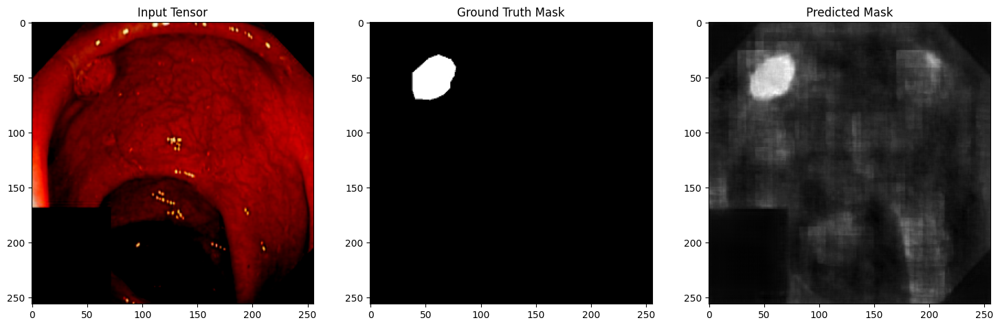

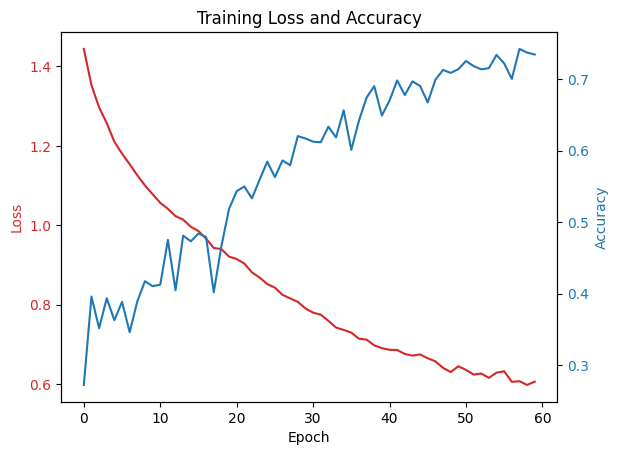

In [5]:
args_train_student = setup_train_args(my_model="unet_attention", dataset=dataset,
                                      data_root="./data_root/", batch_size=8, epochs=60, learning_rate=0.001)
losses, perfs, path = train_student(args_train_student)
visualize_loss_acc_plot(losses, acc_list=perfs, path=path+".png")

In [6]:
from train import train_epoch
def train_student(args, unet_size):
    (device,
     train_dataloader,
     test_dataloader,
     val_dataloader,
     Dice_loss,
     BCE_loss,
     KLT_loss,
     perf,
     student_model,
     _,
     optimizer,
     alpha,
     temperature) = build(args)


    loss_storage = []
    # performance metric is dice score
    perf_storage = []

    if not os.path.exists("./Trained_student_models/trained_alone"):
        os.makedirs("./Trained_student_models/trained_alone")
        
    model_name = student_model.__class__.__name__
    my_path = f"Trained_student_models/trained_alone/{model_name}{unet_size}_temp_{temperature}_alpha_{alpha}_lr_{args_train_student.lr}" + args.dataset
    prev_best_test = None
    if args.lrs == "true":
        if args.lrs_min > 0:
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
                optimizer, mode="max", factor=0.5, min_lr=args.lrs_min, verbose=True, patience=6
            )
        else:
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
                optimizer, mode="max", factor=0.5, verbose=True, patience=6
            )
    for epoch in range(1, args.epochs + 1):
        try:
            loss = train_epoch(student_model, device, train_dataloader,
                                       optimizer, epoch, Dice_loss, BCE_loss)

            test_measure_mean, test_measure_std = test(
                student_model, device, val_dataloader, epoch, perf
            )
            # add means and loss for vis
            loss_storage.append(loss)
            perf_storage.append(test_measure_mean)

        except KeyboardInterrupt:
            print("Training interrupted by user")
            sys.exit(0)
        if args.lrs == "true":
            scheduler.step(test_measure_mean)
        # if prev_best_test == None or test_measure_mean > prev_best_test:
        #     print("Saving...")
        #     torch.save(
        #         {
        #             "epoch": epoch,
        #             "model_state_dict": student_model.state_dict()
        #             if args.mgpu is False
        #             else student_model.module.state_dict(),
        #             "optimizer_state_dict": optimizer.state_dict(),
        #             "loss": loss,
        #             "test_measure_mean": test_measure_mean,
        #             "test_measure_std": test_measure_std,
        #         },
        #         my_path + ".pt",
        #     )
        #     prev_best_test = test_measure_mean
        if epoch == args.epochs: 
            visualize_random_image(test_dataloader, student_model)
    
    return loss_storage, perf_storage, my_path

UNet(
  (normalize): Normalize()
  (downs): ModuleList(
    (0): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (1): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_runnin

Train Epoch: 1 [24/1290 (1.9%)]	Loss: 1.513001	Time: 2.312870

Train Epoch: 1 [48/1290 (3.7%)]	Loss: 1.436393	Time: 2.557312

Train Epoch: 1 [72/1290 (5.6%)]	Loss: 1.473724	Time: 2.804294

Train Epoch: 1 [96/1290 (7.5%)]	Loss: 1.439525	Time: 3.047401

Train Epoch: 1 [120/1290 (9.3%)]	Loss: 1.488522	Time: 3.292067

Train Epoch: 1 [144/1290 (11.2%)]	Loss: 1.507495	Time: 3.545028

Train Epoch: 1 [168/1290 (13.0%)]	Loss: 1.457637	Time: 3.789338

Train Epoch: 1 [192/1290 (14.9%)]	Loss: 1.265257	Time: 4.027889

Train Epoch: 1 [216/1290 (16.8%)]	Loss: 1.422381	Time: 4.270787

Train Epoch: 1 [240/1290 (18.6%)]	Loss: 1.445344	Time: 4.519235

Train Epoch: 1 [264/1290 (20.5%)]	Loss: 1.557823	Time: 4.766012

Train Epoch: 1 [288/1290 (22.4%)]	Loss: 1.517328	Time: 5.010571

Train Epoch: 1 [312/1290 (24.2%)]	Loss: 1.559937	Time: 5.253385

Train Epoch: 1 [336/1290 (26.1%)]	Loss: 1.449407	Time: 5.502114

Train Epoch: 1 [360/1290 (28.0%)]	Loss: 1.280295	Time: 5.753326

Train Epoch: 1 [384/1290 (29.8%)]	Loss: 1.461624	Time: 5.998334

Train Epoch: 1 [408/1290 (31.7%)]	Loss: 1.348991	Time: 6.244043

Train Epoch: 1 [432/1290 (33.5%)]	Loss: 1.480401	Time: 6.493114

Train Epoch: 1 [456/1290 (35.4%)]	Loss: 1.403421	Time: 6.737311

Train Epoch: 1 [480/1290 (37.3%)]	Loss: 1.384120	Time: 6.985095

Train Epoch: 1 [504/1290 (39.1%)]	Loss: 1.347687	Time: 7.230566

Train Epoch: 1 [528/1290 (41.0%)]	Loss: 1.468168	Time: 7.475368

Train Epoch: 1 [552/1290 (42.9%)]	Loss: 1.423141	Time: 7.725984

Train Epoch: 1 [576/1290 (44.7%)]	Loss: 1.357301	Time: 7.972576

Train Epoch: 1 [600/1290 (46.6%)]	Loss: 1.435424	Time: 8.216090

Train Epoch: 1 [624/1290 (48.4%)]	Loss: 1.443701	Time: 8.461437

Train Epoch: 1 [648/1290 (50.3%)]	Loss: 1.485007	Time: 8.712224

Train Epoch: 1 [672/1290 (52.2%)]	Loss: 1.527405	Time: 8.961094

Train Epoch: 1 [696/1290 (54.0%)]	Loss: 1.335202	Time: 9.205533

Train Epoch: 1 [720/1290 (55.9%)]	Loss: 1.373557	Time: 9.448054

Train Epoch: 1 [744/1290 (57.8%)]	Loss: 1.479660	Time: 9.692517

Train Epoch: 1 [768/1290 (59.6%)]	Loss: 1.374837	Time: 9.942940

Train Epoch: 1 [792/1290 (61.5%)]	Loss: 1.547213	Time: 10.188375

Train Epoch: 1 [816/1290 (63.4%)]	Loss: 1.504631	Time: 10.439115

Train Epoch: 1 [840/1290 (65.2%)]	Loss: 1.428807	Time: 10.682989

Train Epoch: 1 [864/1290 (67.1%)]	Loss: 1.525931	Time: 10.930197

Train Epoch: 1 [888/1290 (68.9%)]	Loss: 1.492373	Time: 11.182220

Train Epoch: 1 [912/1290 (70.8%)]	Loss: 1.505185	Time: 11.426013

Train Epoch: 1 [936/1290 (72.7%)]	Loss: 1.425424	Time: 11.673416

Train Epoch: 1 [960/1290 (74.5%)]	Loss: 1.391125	Time: 11.924052

Train Epoch: 1 [984/1290 (76.4%)]	Loss: 1.367575	Time: 12.170631

Train Epoch: 1 [1008/1290 (78.3%)]	Loss: 1.464286	Time: 12.412997

Train Epoch: 1 [1032/1290 (80.1%)]	Loss: 1.426768	Time: 12.660152

Train Epoch: 1 [1056/1290 (82.0%)]	Loss: 1.233650	Time: 12.905742

Train Epoch: 1 [1080/1290 (83.9%)]	Loss: 1.445794	Time: 13.144776

Train Epoch: 1 [1104/1290 (85.7%)]	Loss: 1.318630	Time: 13.384522

Train Epoch: 1 [1128/1290 (87.6%)]	Loss: 1.400622	Time: 13.620611

Train Epoch: 1 [1152/1290 (89.4%)]	Loss: 1.488423	Time: 13.856745

Train Epoch: 1 [1176/1290 (91.3%)]	Loss: 1.273635	Time: 14.092142

Train Epoch: 1 [1200/1290 (93.2%)]	Loss: 1.512328	Time: 14.330223

Train Epoch: 1 [1224/1290 (95.0%)]	Loss: 1.502789	Time: 14.564624

Train Epoch: 1 [1248/1290 (96.9%)]	Loss: 1.404126	Time: 14.799501

Train Epoch: 1 [1272/1290 (98.8%)]	Loss: 1.344903	Time: 15.035243

Train Epoch: 1 [1288/1290 (100.0%)]	Average loss: 1.429923	Time: 15.191677


Test  Epoch: 1 [42/161 (26.1%)]	Average performance: 0.391931	Time: 0.618356

Test  Epoch: 1 [84/161 (52.2%)]	Average performance: 0.353569	Time: 0.822697

Test  Epoch: 1 [126/161 (78.3%)]	Average performance: 0.342890	Time: 1.027186

Test  Epoch: 1 [161/161 (100.0%)]	Average performance: 0.333213	Time: 1.183343


Train Epoch: 2 [24/1290 (1.9%)]	Loss: 1.313484	Time: 1.570397

Train Epoch: 2 [32/1290 (2.5%)]	Loss: 1.541049	Time: 1.669246

Train Epoch: 2 [56/1290 (4.3%)]	Loss: 1.334400	Time: 2.069365

Train Epoch: 2 [80/1290 (6.2%)]	Loss: 1.357943	Time: 2.315677

Train Epoch: 2 [104/1290 (8.1%)]	Loss: 1.526837	Time: 2.562377

Train Epoch: 2 [128/1290 (9.9%)]	Loss: 1.494573	Time: 2.811457

Train Epoch: 2 [152/1290 (11.8%)]	Loss: 1.304426	Time: 3.064487

Train Epoch: 2 [176/1290 (13.7%)]	Loss: 1.088154	Time: 3.318189

Train Epoch: 2 [200/1290 (15.5%)]	Loss: 1.326024	Time: 3.590676

Train Epoch: 2 [224/1290 (17.4%)]	Loss: 1.405217	Time: 3.839916

Train Epoch: 2 [248/1290 (19.3%)]	Loss: 1.421042	Time: 4.088759

Train Epoch: 2 [272/1290 (21.1%)]	Loss: 1.444326	Time: 4.342257

Train Epoch: 2 [296/1290 (23.0%)]	Loss: 1.352972	Time: 4.596152

Train Epoch: 2 [320/1290 (24.8%)]	Loss: 1.311122	Time: 4.849623

Train Epoch: 2 [344/1290 (26.7%)]	Loss: 1.492113	Time: 5.100836

Train Epoch: 2 [368/1290 (28.6%)]	Loss: 1.181337	Time: 5.345144

Train Epoch: 2 [392/1290 (30.4%)]	Loss: 1.402950	Time: 5.596178

Train Epoch: 2 [416/1290 (32.3%)]	Loss: 1.316060	Time: 5.841559

Train Epoch: 2 [440/1290 (34.2%)]	Loss: 1.299901	Time: 6.088573

Train Epoch: 2 [464/1290 (36.0%)]	Loss: 1.459303	Time: 6.331167

Train Epoch: 2 [488/1290 (37.9%)]	Loss: 1.383847	Time: 6.583193

Train Epoch: 2 [512/1290 (39.8%)]	Loss: 1.450567	Time: 6.845305

Train Epoch: 2 [536/1290 (41.6%)]	Loss: 1.338843	Time: 7.092200

Train Epoch: 2 [560/1290 (43.5%)]	Loss: 1.326070	Time: 7.338162

Train Epoch: 2 [584/1290 (45.3%)]	Loss: 1.246664	Time: 7.579884

Train Epoch: 2 [608/1290 (47.2%)]	Loss: 1.324350	Time: 7.824995

Train Epoch: 2 [632/1290 (49.1%)]	Loss: 1.492683	Time: 8.070167

Train Epoch: 2 [656/1290 (50.9%)]	Loss: 1.337637	Time: 8.313924

Train Epoch: 2 [680/1290 (52.8%)]	Loss: 1.428584	Time: 8.558698

Train Epoch: 2 [704/1290 (54.7%)]	Loss: 1.334918	Time: 8.802901

Train Epoch: 2 [728/1290 (56.5%)]	Loss: 1.339086	Time: 9.050102

Train Epoch: 2 [752/1290 (58.4%)]	Loss: 1.484892	Time: 9.294509

Train Epoch: 2 [776/1290 (60.2%)]	Loss: 1.350518	Time: 9.546305

Train Epoch: 2 [800/1290 (62.1%)]	Loss: 1.311280	Time: 9.786656

Train Epoch: 2 [824/1290 (64.0%)]	Loss: 1.312701	Time: 10.033738

Train Epoch: 2 [848/1290 (65.8%)]	Loss: 1.376858	Time: 10.282587

Train Epoch: 2 [872/1290 (67.7%)]	Loss: 1.443751	Time: 10.531546

Train Epoch: 2 [896/1290 (69.6%)]	Loss: 1.406159	Time: 10.778264

Train Epoch: 2 [920/1290 (71.4%)]	Loss: 1.348205	Time: 11.024089

Train Epoch: 2 [944/1290 (73.3%)]	Loss: 1.397424	Time: 11.265532

Train Epoch: 2 [968/1290 (75.2%)]	Loss: 1.315047	Time: 11.509146

Train Epoch: 2 [992/1290 (77.0%)]	Loss: 1.401010	Time: 11.757219

Train Epoch: 2 [1016/1290 (78.9%)]	Loss: 1.265241	Time: 12.000727

Train Epoch: 2 [1040/1290 (80.7%)]	Loss: 1.423646	Time: 12.251047

Train Epoch: 2 [1064/1290 (82.6%)]	Loss: 1.265640	Time: 12.491071

Train Epoch: 2 [1088/1290 (84.5%)]	Loss: 1.441418	Time: 12.733906

Train Epoch: 2 [1112/1290 (86.3%)]	Loss: 1.374914	Time: 12.969562

Train Epoch: 2 [1136/1290 (88.2%)]	Loss: 1.442435	Time: 13.206291

Train Epoch: 2 [1160/1290 (90.1%)]	Loss: 1.255429	Time: 13.441674

Train Epoch: 2 [1184/1290 (91.9%)]	Loss: 1.330874	Time: 13.679776

Train Epoch: 2 [1208/1290 (93.8%)]	Loss: 1.285880	Time: 13.914553

Train Epoch: 2 [1232/1290 (95.7%)]	Loss: 1.444079	Time: 14.149292

Train Epoch: 2 [1256/1290 (97.5%)]	Loss: 1.375847	Time: 14.384921

Train Epoch: 2 [1280/1290 (99.4%)]	Loss: 1.399842	Time: 14.620735

Train Epoch: 2 [1288/1290 (100.0%)]	Average loss: 1.369403	Time: 14.699507


Test  Epoch: 2 [34/161 (21.1%)]	Average performance: 0.368596	Time: 0.604522

Test  Epoch: 2 [78/161 (48.4%)]	Average performance: 0.364490	Time: 0.809153

Test  Epoch: 2 [119/161 (73.9%)]	Average performance: 0.348481	Time: 1.012139

Test  Epoch: 2 [161/161 (100.0%)]	Average performance: 0.340914	Time: 1.201885


Train Epoch: 3 [24/1290 (1.9%)]	Loss: 1.314781	Time: 1.677257

Train Epoch: 3 [48/1290 (3.7%)]	Loss: 1.293224	Time: 1.938777

Train Epoch: 3 [72/1290 (5.6%)]	Loss: 1.345906	Time: 2.190453

Train Epoch: 3 [96/1290 (7.5%)]	Loss: 1.306224	Time: 2.436886

Train Epoch: 3 [120/1290 (9.3%)]	Loss: 1.334712	Time: 2.685092

Train Epoch: 3 [144/1290 (11.2%)]	Loss: 1.371141	Time: 2.955238

Train Epoch: 3 [168/1290 (13.0%)]	Loss: 1.306665	Time: 3.221101

Train Epoch: 3 [192/1290 (14.9%)]	Loss: 1.271231	Time: 3.486081

Train Epoch: 3 [216/1290 (16.8%)]	Loss: 1.283633	Time: 3.732482

Train Epoch: 3 [240/1290 (18.6%)]	Loss: 1.364866	Time: 3.977210

Train Epoch: 3 [264/1290 (20.5%)]	Loss: 1.463312	Time: 4.232768

Train Epoch: 3 [288/1290 (22.4%)]	Loss: 1.282935	Time: 4.487777

Train Epoch: 3 [312/1290 (24.2%)]	Loss: 1.376962	Time: 4.736187

Train Epoch: 3 [336/1290 (26.1%)]	Loss: 1.230252	Time: 4.980226

Train Epoch: 3 [360/1290 (28.0%)]	Loss: 1.361659	Time: 5.227374

Train Epoch: 3 [384/1290 (29.8%)]	Loss: 1.247994	Time: 5.475342

Train Epoch: 3 [408/1290 (31.7%)]	Loss: 1.358457	Time: 5.728540

Train Epoch: 3 [432/1290 (33.5%)]	Loss: 1.363834	Time: 5.983356

Train Epoch: 3 [456/1290 (35.4%)]	Loss: 1.271835	Time: 6.230080

Train Epoch: 3 [480/1290 (37.3%)]	Loss: 1.346176	Time: 6.487222

Train Epoch: 3 [504/1290 (39.1%)]	Loss: 1.352695	Time: 6.737091

Train Epoch: 3 [528/1290 (41.0%)]	Loss: 1.200790	Time: 6.984890

Train Epoch: 3 [552/1290 (42.9%)]	Loss: 1.377058	Time: 7.242199

Train Epoch: 3 [576/1290 (44.7%)]	Loss: 1.345153	Time: 7.495660

Train Epoch: 3 [600/1290 (46.6%)]	Loss: 1.429044	Time: 7.742324

Train Epoch: 3 [624/1290 (48.4%)]	Loss: 1.283301	Time: 7.990427

Train Epoch: 3 [648/1290 (50.3%)]	Loss: 1.207569	Time: 8.239289

Train Epoch: 3 [672/1290 (52.2%)]	Loss: 1.329930	Time: 8.485978

Train Epoch: 3 [696/1290 (54.0%)]	Loss: 1.191025	Time: 8.736402

Train Epoch: 3 [720/1290 (55.9%)]	Loss: 1.392281	Time: 8.981664

Train Epoch: 3 [744/1290 (57.8%)]	Loss: 1.293356	Time: 9.228700

Train Epoch: 3 [768/1290 (59.6%)]	Loss: 1.364795	Time: 9.475488

Train Epoch: 3 [792/1290 (61.5%)]	Loss: 1.360118	Time: 9.723421

Train Epoch: 3 [816/1290 (63.4%)]	Loss: 1.308500	Time: 9.974208

Train Epoch: 3 [840/1290 (65.2%)]	Loss: 1.252485	Time: 10.221477

Train Epoch: 3 [864/1290 (67.1%)]	Loss: 1.441990	Time: 10.473075

Train Epoch: 3 [888/1290 (68.9%)]	Loss: 1.294035	Time: 10.717291

Train Epoch: 3 [912/1290 (70.8%)]	Loss: 1.357067	Time: 10.966470

Train Epoch: 3 [936/1290 (72.7%)]	Loss: 1.295588	Time: 11.215876

Train Epoch: 3 [960/1290 (74.5%)]	Loss: 1.467568	Time: 11.467615

Train Epoch: 3 [984/1290 (76.4%)]	Loss: 1.250584	Time: 11.712626

Train Epoch: 3 [1008/1290 (78.3%)]	Loss: 1.212548	Time: 11.964489

Train Epoch: 3 [1032/1290 (80.1%)]	Loss: 1.170079	Time: 12.211610

Train Epoch: 3 [1056/1290 (82.0%)]	Loss: 1.343287	Time: 12.455585

Train Epoch: 3 [1080/1290 (83.9%)]	Loss: 1.208877	Time: 12.695303

Train Epoch: 3 [1104/1290 (85.7%)]	Loss: 1.231461	Time: 12.934604

Train Epoch: 3 [1128/1290 (87.6%)]	Loss: 1.388417	Time: 13.169995

Train Epoch: 3 [1152/1290 (89.4%)]	Loss: 1.380455	Time: 13.408131

Train Epoch: 3 [1176/1290 (91.3%)]	Loss: 1.285448	Time: 13.646332

Train Epoch: 3 [1200/1290 (93.2%)]	Loss: 1.350801	Time: 13.881991

Train Epoch: 3 [1224/1290 (95.0%)]	Loss: 1.277117	Time: 14.118094

Train Epoch: 3 [1248/1290 (96.9%)]	Loss: 1.343854	Time: 14.353649

Train Epoch: 3 [1272/1290 (98.8%)]	Loss: 1.221723	Time: 14.588981

Train Epoch: 3 [1288/1290 (100.0%)]	Average loss: 1.321097	Time: 14.747122


Test  Epoch: 3 [32/161 (19.9%)]	Average performance: 0.373976	Time: 0.568056

Test  Epoch: 3 [76/161 (47.2%)]	Average performance: 0.378764	Time: 0.770344

Test  Epoch: 3 [117/161 (72.7%)]	Average performance: 0.363918	Time: 0.973675

Test  Epoch: 3 [161/161 (100.0%)]	Average performance: 0.355994	Time: 1.172939


Train Epoch: 4 [24/1290 (1.9%)]	Loss: 1.320990	Time: 2.051913

Train Epoch: 4 [48/1290 (3.7%)]	Loss: 1.335163	Time: 2.301515

Train Epoch: 4 [72/1290 (5.6%)]	Loss: 1.271447	Time: 2.552501

Train Epoch: 4 [96/1290 (7.5%)]	Loss: 1.251160	Time: 2.797245

Train Epoch: 4 [120/1290 (9.3%)]	Loss: 1.371433	Time: 3.048695

Train Epoch: 4 [144/1290 (11.2%)]	Loss: 1.215901	Time: 3.304520

Train Epoch: 4 [168/1290 (13.0%)]	Loss: 1.268393	Time: 3.550705

Train Epoch: 4 [192/1290 (14.9%)]	Loss: 1.266274	Time: 3.798757

Train Epoch: 4 [216/1290 (16.8%)]	Loss: 1.403485	Time: 4.042587

Train Epoch: 4 [240/1290 (18.6%)]	Loss: 1.342975	Time: 4.292660

Train Epoch: 4 [264/1290 (20.5%)]	Loss: 1.307406	Time: 4.547643

Train Epoch: 4 [288/1290 (22.4%)]	Loss: 1.420750	Time: 4.794317

Train Epoch: 4 [312/1290 (24.2%)]	Loss: 1.305026	Time: 5.039608

Train Epoch: 4 [336/1290 (26.1%)]	Loss: 1.315852	Time: 5.282887

Train Epoch: 4 [360/1290 (28.0%)]	Loss: 1.114173	Time: 5.530778

Train Epoch: 4 [384/1290 (29.8%)]	Loss: 1.254101	Time: 5.778781

Train Epoch: 4 [408/1290 (31.7%)]	Loss: 1.206451	Time: 6.032191

Train Epoch: 4 [432/1290 (33.5%)]	Loss: 1.320564	Time: 6.274876

Train Epoch: 4 [456/1290 (35.4%)]	Loss: 1.341154	Time: 6.519793

Train Epoch: 4 [480/1290 (37.3%)]	Loss: 1.283203	Time: 6.765495

Train Epoch: 4 [504/1290 (39.1%)]	Loss: 1.393382	Time: 7.012938

Train Epoch: 4 [528/1290 (41.0%)]	Loss: 1.308776	Time: 7.263696

Train Epoch: 4 [552/1290 (42.9%)]	Loss: 1.238522	Time: 7.506914

Train Epoch: 4 [576/1290 (44.7%)]	Loss: 1.283270	Time: 7.747413

Train Epoch: 4 [600/1290 (46.6%)]	Loss: 1.309363	Time: 7.995835

Train Epoch: 4 [624/1290 (48.4%)]	Loss: 1.268007	Time: 8.244751

Train Epoch: 4 [648/1290 (50.3%)]	Loss: 1.294132	Time: 8.494147

Train Epoch: 4 [672/1290 (52.2%)]	Loss: 1.125435	Time: 8.733272

Train Epoch: 4 [696/1290 (54.0%)]	Loss: 1.316194	Time: 8.979158

Train Epoch: 4 [720/1290 (55.9%)]	Loss: 1.249952	Time: 9.228741

Train Epoch: 4 [744/1290 (57.8%)]	Loss: 1.266944	Time: 9.471892

Train Epoch: 4 [768/1290 (59.6%)]	Loss: 1.263003	Time: 9.719170

Train Epoch: 4 [792/1290 (61.5%)]	Loss: 1.137161	Time: 9.969898

Train Epoch: 4 [816/1290 (63.4%)]	Loss: 1.266473	Time: 10.214579

Train Epoch: 4 [840/1290 (65.2%)]	Loss: 1.299788	Time: 10.463469

Train Epoch: 4 [864/1290 (67.1%)]	Loss: 1.108553	Time: 10.706428

Train Epoch: 4 [888/1290 (68.9%)]	Loss: 1.251718	Time: 10.961694

Train Epoch: 4 [912/1290 (70.8%)]	Loss: 1.337917	Time: 11.208895

Train Epoch: 4 [936/1290 (72.7%)]	Loss: 1.214087	Time: 11.453424

Train Epoch: 4 [960/1290 (74.5%)]	Loss: 1.352723	Time: 11.708242

Train Epoch: 4 [984/1290 (76.4%)]	Loss: 1.182251	Time: 11.952101

Train Epoch: 4 [1008/1290 (78.3%)]	Loss: 1.263483	Time: 12.200733

Train Epoch: 4 [1032/1290 (80.1%)]	Loss: 1.207762	Time: 12.449514

Train Epoch: 4 [1056/1290 (82.0%)]	Loss: 1.394917	Time: 12.698098

Train Epoch: 4 [1080/1290 (83.9%)]	Loss: 1.231591	Time: 12.937264

Train Epoch: 4 [1104/1290 (85.7%)]	Loss: 1.228510	Time: 13.177397

Train Epoch: 4 [1128/1290 (87.6%)]	Loss: 1.234595	Time: 13.413829

Train Epoch: 4 [1152/1290 (89.4%)]	Loss: 1.329532	Time: 13.650376

Train Epoch: 4 [1176/1290 (91.3%)]	Loss: 1.247111	Time: 13.886076

Train Epoch: 4 [1200/1290 (93.2%)]	Loss: 1.251515	Time: 14.123247

Train Epoch: 4 [1224/1290 (95.0%)]	Loss: 1.218671	Time: 14.360650

Train Epoch: 4 [1248/1290 (96.9%)]	Loss: 1.227204	Time: 14.597198

Train Epoch: 4 [1272/1290 (98.8%)]	Loss: 1.234963	Time: 14.834500

Train Epoch: 4 [1288/1290 (100.0%)]	Average loss: 1.273503	Time: 14.991462


Test  Epoch: 4 [35/161 (21.7%)]	Average performance: 0.405859	Time: 0.594876

Test  Epoch: 4 [78/161 (48.4%)]	Average performance: 0.393798	Time: 0.796365

Test  Epoch: 4 [119/161 (73.9%)]	Average performance: 0.390891	Time: 0.999934

Test  Epoch: 4 [161/161 (100.0%)]	Average performance: 0.380392	Time: 1.190341


Train Epoch: 5 [8/1290 (0.6%)]	Loss: 1.252056	Time: 1.538555

Train Epoch: 5 [32/1290 (2.5%)]	Loss: 1.142179	Time: 1.961890

Train Epoch: 5 [56/1290 (4.3%)]	Loss: 1.301350	Time: 2.222408

Train Epoch: 5 [80/1290 (6.2%)]	Loss: 1.217541	Time: 2.469058

Train Epoch: 5 [104/1290 (8.1%)]	Loss: 1.199532	Time: 2.721614

Train Epoch: 5 [128/1290 (9.9%)]	Loss: 1.108004	Time: 2.968356

Train Epoch: 5 [152/1290 (11.8%)]	Loss: 1.273932	Time: 3.254574

Train Epoch: 5 [176/1290 (13.7%)]	Loss: 1.169436	Time: 3.524707

Train Epoch: 5 [200/1290 (15.5%)]	Loss: 1.195587	Time: 3.769673

Train Epoch: 5 [224/1290 (17.4%)]	Loss: 1.160980	Time: 4.026989

Train Epoch: 5 [248/1290 (19.3%)]	Loss: 1.232556	Time: 4.273715

Train Epoch: 5 [272/1290 (21.1%)]	Loss: 1.315914	Time: 4.531390

Train Epoch: 5 [296/1290 (23.0%)]	Loss: 1.171961	Time: 4.779404

Train Epoch: 5 [320/1290 (24.8%)]	Loss: 1.321461	Time: 5.028158

Train Epoch: 5 [344/1290 (26.7%)]	Loss: 1.323114	Time: 5.275400

Train Epoch: 5 [368/1290 (28.6%)]	Loss: 1.302394	Time: 5.523270

Train Epoch: 5 [392/1290 (30.4%)]	Loss: 1.255692	Time: 5.785035

Train Epoch: 5 [416/1290 (32.3%)]	Loss: 1.166736	Time: 6.029937

Train Epoch: 5 [440/1290 (34.2%)]	Loss: 1.426562	Time: 6.275744

Train Epoch: 5 [464/1290 (36.0%)]	Loss: 1.286286	Time: 6.519274

Train Epoch: 5 [488/1290 (37.9%)]	Loss: 1.165089	Time: 6.763728

Train Epoch: 5 [512/1290 (39.8%)]	Loss: 1.387059	Time: 7.013319

Train Epoch: 5 [536/1290 (41.6%)]	Loss: 1.223094	Time: 7.266856

Train Epoch: 5 [560/1290 (43.5%)]	Loss: 1.231637	Time: 7.512512

Train Epoch: 5 [584/1290 (45.3%)]	Loss: 1.172290	Time: 7.763023

Train Epoch: 5 [608/1290 (47.2%)]	Loss: 1.179864	Time: 8.006946

Train Epoch: 5 [632/1290 (49.1%)]	Loss: 1.202674	Time: 8.250741

Train Epoch: 5 [656/1290 (50.9%)]	Loss: 1.320804	Time: 8.494426

Train Epoch: 5 [680/1290 (52.8%)]	Loss: 1.333905	Time: 8.739109

Train Epoch: 5 [704/1290 (54.7%)]	Loss: 1.208837	Time: 8.989893

Train Epoch: 5 [728/1290 (56.5%)]	Loss: 1.209599	Time: 9.232012

Train Epoch: 5 [752/1290 (58.4%)]	Loss: 1.081607	Time: 9.476463

Train Epoch: 5 [776/1290 (60.2%)]	Loss: 1.090178	Time: 9.724091

Train Epoch: 5 [800/1290 (62.1%)]	Loss: 1.216962	Time: 9.966060

Train Epoch: 5 [824/1290 (64.0%)]	Loss: 1.220286	Time: 10.214139

Train Epoch: 5 [848/1290 (65.8%)]	Loss: 1.268308	Time: 10.457980

Train Epoch: 5 [872/1290 (67.7%)]	Loss: 1.308038	Time: 10.706311

Train Epoch: 5 [896/1290 (69.6%)]	Loss: 1.237526	Time: 10.952016

Train Epoch: 5 [920/1290 (71.4%)]	Loss: 1.226824	Time: 11.201933

Train Epoch: 5 [944/1290 (73.3%)]	Loss: 1.142546	Time: 11.452350

Train Epoch: 5 [968/1290 (75.2%)]	Loss: 1.120084	Time: 11.698402

Train Epoch: 5 [992/1290 (77.0%)]	Loss: 1.252166	Time: 11.945447

Train Epoch: 5 [1016/1290 (78.9%)]	Loss: 1.200880	Time: 12.193106

Train Epoch: 5 [1040/1290 (80.7%)]	Loss: 1.197631	Time: 12.440849

Train Epoch: 5 [1064/1290 (82.6%)]	Loss: 1.293837	Time: 12.684111

Train Epoch: 5 [1088/1290 (84.5%)]	Loss: 1.185891	Time: 12.923428

Train Epoch: 5 [1112/1290 (86.3%)]	Loss: 1.139981	Time: 13.162621

Train Epoch: 5 [1136/1290 (88.2%)]	Loss: 1.220640	Time: 13.399432

Train Epoch: 5 [1160/1290 (90.1%)]	Loss: 1.142894	Time: 13.636808

Train Epoch: 5 [1184/1290 (91.9%)]	Loss: 1.174774	Time: 13.874574

Train Epoch: 5 [1208/1290 (93.8%)]	Loss: 1.206556	Time: 14.110877

Train Epoch: 5 [1232/1290 (95.7%)]	Loss: 1.229195	Time: 14.349130

Train Epoch: 5 [1256/1290 (97.5%)]	Loss: 1.309198	Time: 14.584421

Train Epoch: 5 [1280/1290 (99.4%)]	Loss: 1.246535	Time: 14.820333

Train Epoch: 5 [1288/1290 (100.0%)]	Average loss: 1.220638	Time: 14.899724


Test  Epoch: 5 [34/161 (21.1%)]	Average performance: 0.410786	Time: 0.590605

Test  Epoch: 5 [77/161 (47.8%)]	Average performance: 0.418890	Time: 0.792528

Test  Epoch: 5 [118/161 (73.3%)]	Average performance: 0.405545	Time: 0.996294

Test  Epoch: 5 [161/161 (100.0%)]	Average performance: 0.402643	Time: 1.193160


Train Epoch: 6 [24/1290 (1.9%)]	Loss: 1.258960	Time: 1.948685

Train Epoch: 6 [40/1290 (3.1%)]	Loss: 1.071025	Time: 2.110626

Train Epoch: 6 [64/1290 (5.0%)]	Loss: 1.197088	Time: 2.528722

Train Epoch: 6 [88/1290 (6.8%)]	Loss: 1.148795	Time: 2.773463

Train Epoch: 6 [112/1290 (8.7%)]	Loss: 1.180881	Time: 3.020957

Train Epoch: 6 [136/1290 (10.6%)]	Loss: 1.241755	Time: 3.276041

Train Epoch: 6 [160/1290 (12.4%)]	Loss: 1.298230	Time: 3.522427

Train Epoch: 6 [184/1290 (14.3%)]	Loss: 1.257870	Time: 3.772719

Train Epoch: 6 [208/1290 (16.1%)]	Loss: 1.325233	Time: 4.015121

Train Epoch: 6 [232/1290 (18.0%)]	Loss: 1.218835	Time: 4.262744

Train Epoch: 6 [256/1290 (19.9%)]	Loss: 1.102022	Time: 4.509121

Train Epoch: 6 [280/1290 (21.7%)]	Loss: 1.180178	Time: 4.768890

Train Epoch: 6 [304/1290 (23.6%)]	Loss: 1.215032	Time: 5.024266

Train Epoch: 6 [328/1290 (25.5%)]	Loss: 1.099730	Time: 5.271953

Train Epoch: 6 [352/1290 (27.3%)]	Loss: 1.158740	Time: 5.514956

Train Epoch: 6 [376/1290 (29.2%)]	Loss: 1.171598	Time: 5.761706

Train Epoch: 6 [400/1290 (31.1%)]	Loss: 1.208169	Time: 6.010077

Train Epoch: 6 [424/1290 (32.9%)]	Loss: 1.163891	Time: 6.262105

Train Epoch: 6 [448/1290 (34.8%)]	Loss: 1.151333	Time: 6.512354

Train Epoch: 6 [472/1290 (36.6%)]	Loss: 1.062009	Time: 6.759118

Train Epoch: 6 [496/1290 (38.5%)]	Loss: 1.217634	Time: 7.005727

Train Epoch: 6 [520/1290 (40.4%)]	Loss: 1.136902	Time: 7.251735

Train Epoch: 6 [544/1290 (42.2%)]	Loss: 1.133433	Time: 7.499512

Train Epoch: 6 [568/1290 (44.1%)]	Loss: 1.167400	Time: 7.745768

Train Epoch: 6 [592/1290 (46.0%)]	Loss: 1.058131	Time: 7.985019

Train Epoch: 6 [616/1290 (47.8%)]	Loss: 1.233020	Time: 8.227946

Train Epoch: 6 [640/1290 (49.7%)]	Loss: 1.129264	Time: 8.476671

Train Epoch: 6 [664/1290 (51.6%)]	Loss: 1.228754	Time: 8.724667

Train Epoch: 6 [688/1290 (53.4%)]	Loss: 1.030525	Time: 8.976424

Train Epoch: 6 [712/1290 (55.3%)]	Loss: 1.190884	Time: 9.221970

Train Epoch: 6 [736/1290 (57.1%)]	Loss: 1.038785	Time: 9.468191

Train Epoch: 6 [760/1290 (59.0%)]	Loss: 1.372005	Time: 9.716847

Train Epoch: 6 [784/1290 (60.9%)]	Loss: 1.252349	Time: 9.962994

Train Epoch: 6 [808/1290 (62.7%)]	Loss: 1.222767	Time: 10.213480

Train Epoch: 6 [832/1290 (64.6%)]	Loss: 1.205306	Time: 10.457596

Train Epoch: 6 [856/1290 (66.5%)]	Loss: 1.087510	Time: 10.710253

Train Epoch: 6 [880/1290 (68.3%)]	Loss: 1.259053	Time: 10.963698

Train Epoch: 6 [904/1290 (70.2%)]	Loss: 1.063955	Time: 11.208281

Train Epoch: 6 [928/1290 (72.0%)]	Loss: 1.124696	Time: 11.459716

Train Epoch: 6 [952/1290 (73.9%)]	Loss: 1.253842	Time: 11.709868

Train Epoch: 6 [976/1290 (75.8%)]	Loss: 1.200376	Time: 11.959902

Train Epoch: 6 [1000/1290 (77.6%)]	Loss: 1.160888	Time: 12.204921

Train Epoch: 6 [1024/1290 (79.5%)]	Loss: 1.192391	Time: 12.452799

Train Epoch: 6 [1048/1290 (81.4%)]	Loss: 1.228224	Time: 12.701516

Train Epoch: 6 [1072/1290 (83.2%)]	Loss: 1.219375	Time: 12.943279

Train Epoch: 6 [1096/1290 (85.1%)]	Loss: 1.215373	Time: 13.182379

Train Epoch: 6 [1120/1290 (87.0%)]	Loss: 1.128500	Time: 13.422212

Train Epoch: 6 [1144/1290 (88.8%)]	Loss: 1.220903	Time: 13.659570

Train Epoch: 6 [1168/1290 (90.7%)]	Loss: 1.106027	Time: 13.897126

Train Epoch: 6 [1192/1290 (92.5%)]	Loss: 1.154733	Time: 14.135137

Train Epoch: 6 [1216/1290 (94.4%)]	Loss: 1.137009	Time: 14.372080

Train Epoch: 6 [1240/1290 (96.3%)]	Loss: 1.172100	Time: 14.608889

Train Epoch: 6 [1264/1290 (98.1%)]	Loss: 1.107219	Time: 14.845985

Train Epoch: 6 [1288/1290 (100.0%)]	Average loss: 1.189469	Time: 15.082920


Test  Epoch: 6 [38/161 (23.6%)]	Average performance: 0.480563	Time: 0.608830

Test  Epoch: 6 [81/161 (50.3%)]	Average performance: 0.429954	Time: 0.811989

Test  Epoch: 6 [122/161 (75.8%)]	Average performance: 0.428940	Time: 1.014103

Test  Epoch: 6 [161/161 (100.0%)]	Average performance: 0.421015	Time: 1.189138


Train Epoch: 7 [8/1290 (0.6%)]	Loss: 1.077684	Time: 1.729027

Train Epoch: 7 [32/1290 (2.5%)]	Loss: 1.238491	Time: 2.246831

Train Epoch: 7 [56/1290 (4.3%)]	Loss: 1.165251	Time: 2.489284

Train Epoch: 7 [80/1290 (6.2%)]	Loss: 1.131346	Time: 2.729881

Train Epoch: 7 [104/1290 (8.1%)]	Loss: 1.097595	Time: 2.975198

Train Epoch: 7 [128/1290 (9.9%)]	Loss: 1.125827	Time: 3.217344

Train Epoch: 7 [152/1290 (11.8%)]	Loss: 1.091312	Time: 3.473335

Train Epoch: 7 [176/1290 (13.7%)]	Loss: 1.190494	Time: 3.722563

Train Epoch: 7 [200/1290 (15.5%)]	Loss: 1.244238	Time: 3.967331

Train Epoch: 7 [224/1290 (17.4%)]	Loss: 1.151646	Time: 4.214838

Train Epoch: 7 [248/1290 (19.3%)]	Loss: 1.180683	Time: 4.459141

Train Epoch: 7 [272/1290 (21.1%)]	Loss: 1.079026	Time: 4.737526

Train Epoch: 7 [296/1290 (23.0%)]	Loss: 1.145844	Time: 4.987630

Train Epoch: 7 [320/1290 (24.8%)]	Loss: 1.226612	Time: 5.238259

Train Epoch: 7 [344/1290 (26.7%)]	Loss: 1.193941	Time: 5.485420

Train Epoch: 7 [368/1290 (28.6%)]	Loss: 1.062043	Time: 5.733315

Train Epoch: 7 [392/1290 (30.4%)]	Loss: 1.088824	Time: 5.984751

Train Epoch: 7 [416/1290 (32.3%)]	Loss: 1.104948	Time: 6.236538

Train Epoch: 7 [440/1290 (34.2%)]	Loss: 1.201567	Time: 6.484404

Train Epoch: 7 [464/1290 (36.0%)]	Loss: 1.090672	Time: 6.728382

Train Epoch: 7 [488/1290 (37.9%)]	Loss: 1.235417	Time: 6.973829

Train Epoch: 7 [512/1290 (39.8%)]	Loss: 1.283080	Time: 7.219038

Train Epoch: 7 [536/1290 (41.6%)]	Loss: 1.150535	Time: 7.470433

Train Epoch: 7 [560/1290 (43.5%)]	Loss: 1.133305	Time: 7.716718

Train Epoch: 7 [584/1290 (45.3%)]	Loss: 1.154339	Time: 7.962484

Train Epoch: 7 [608/1290 (47.2%)]	Loss: 1.196786	Time: 8.210519

Train Epoch: 7 [632/1290 (49.1%)]	Loss: 1.211510	Time: 8.469971

Train Epoch: 7 [656/1290 (50.9%)]	Loss: 1.151176	Time: 8.714474

Train Epoch: 7 [680/1290 (52.8%)]	Loss: 1.240778	Time: 8.964947

Train Epoch: 7 [704/1290 (54.7%)]	Loss: 1.102212	Time: 9.211385

Train Epoch: 7 [728/1290 (56.5%)]	Loss: 1.086974	Time: 9.457091

Train Epoch: 7 [752/1290 (58.4%)]	Loss: 1.211377	Time: 9.706489

Train Epoch: 7 [776/1290 (60.2%)]	Loss: 1.003669	Time: 9.960228

Train Epoch: 7 [800/1290 (62.1%)]	Loss: 1.175257	Time: 10.208542

Train Epoch: 7 [824/1290 (64.0%)]	Loss: 1.094496	Time: 10.456041

Train Epoch: 7 [848/1290 (65.8%)]	Loss: 1.194674	Time: 10.716419

Train Epoch: 7 [872/1290 (67.7%)]	Loss: 1.138012	Time: 10.973075

Train Epoch: 7 [896/1290 (69.6%)]	Loss: 1.055633	Time: 11.224298

Train Epoch: 7 [920/1290 (71.4%)]	Loss: 1.103920	Time: 11.476633

Train Epoch: 7 [944/1290 (73.3%)]	Loss: 1.042550	Time: 11.721185

Train Epoch: 7 [968/1290 (75.2%)]	Loss: 1.198818	Time: 11.973898

Train Epoch: 7 [992/1290 (77.0%)]	Loss: 1.137890	Time: 12.222183

Train Epoch: 7 [1016/1290 (78.9%)]	Loss: 1.083712	Time: 12.470373

Train Epoch: 7 [1040/1290 (80.7%)]	Loss: 1.224897	Time: 12.717105

Train Epoch: 7 [1064/1290 (82.6%)]	Loss: 1.194156	Time: 12.956496

Train Epoch: 7 [1088/1290 (84.5%)]	Loss: 1.192361	Time: 13.197518

Train Epoch: 7 [1112/1290 (86.3%)]	Loss: 1.150002	Time: 13.434604

Train Epoch: 7 [1136/1290 (88.2%)]	Loss: 1.111074	Time: 13.674731

Train Epoch: 7 [1160/1290 (90.1%)]	Loss: 1.128251	Time: 13.913290

Train Epoch: 7 [1184/1290 (91.9%)]	Loss: 1.113177	Time: 14.149843

Train Epoch: 7 [1208/1290 (93.8%)]	Loss: 1.108933	Time: 14.386321

Train Epoch: 7 [1232/1290 (95.7%)]	Loss: 1.189745	Time: 14.624763

Train Epoch: 7 [1256/1290 (97.5%)]	Loss: 1.130696	Time: 14.864524

Train Epoch: 7 [1280/1290 (99.4%)]	Loss: 1.211203	Time: 15.100272

Train Epoch: 7 [1288/1290 (100.0%)]	Average loss: 1.138942	Time: 15.179758


Test  Epoch: 7 [39/161 (24.2%)]	Average performance: 0.472717	Time: 0.634244

Test  Epoch: 7 [81/161 (50.3%)]	Average performance: 0.423567	Time: 0.834979

Test  Epoch: 7 [122/161 (75.8%)]	Average performance: 0.416922	Time: 1.036301

Test  Epoch: 7 [161/161 (100.0%)]	Average performance: 0.406570	Time: 1.211210


Train Epoch: 8 [24/1290 (1.9%)]	Loss: 1.114039	Time: 1.789868

Train Epoch: 8 [48/1290 (3.7%)]	Loss: 1.074329	Time: 2.055139

Train Epoch: 8 [72/1290 (5.6%)]	Loss: 1.160612	Time: 2.323253

Train Epoch: 8 [96/1290 (7.5%)]	Loss: 1.074527	Time: 2.572115

Train Epoch: 8 [120/1290 (9.3%)]	Loss: 1.184198	Time: 2.834163

Train Epoch: 8 [144/1290 (11.2%)]	Loss: 1.148551	Time: 3.086854

Train Epoch: 8 [160/1290 (12.4%)]	Loss: 1.100470	Time: 3.278602

Train Epoch: 8 [184/1290 (14.3%)]	Loss: 1.088787	Time: 3.544419

Train Epoch: 8 [208/1290 (16.1%)]	Loss: 1.117257	Time: 3.792067

Train Epoch: 8 [232/1290 (18.0%)]	Loss: 1.253309	Time: 4.039799

Train Epoch: 8 [256/1290 (19.9%)]	Loss: 1.026647	Time: 4.287156

Train Epoch: 8 [280/1290 (21.7%)]	Loss: 1.165118	Time: 4.536407

Train Epoch: 8 [304/1290 (23.6%)]	Loss: 1.033855	Time: 4.795915

Train Epoch: 8 [328/1290 (25.5%)]	Loss: 1.183725	Time: 5.039340

Train Epoch: 8 [352/1290 (27.3%)]	Loss: 1.311916	Time: 5.280722

Train Epoch: 8 [376/1290 (29.2%)]	Loss: 1.136142	Time: 5.525822

Train Epoch: 8 [400/1290 (31.1%)]	Loss: 1.047840	Time: 5.796048

Train Epoch: 8 [424/1290 (32.9%)]	Loss: 1.178021	Time: 6.047845

Train Epoch: 8 [448/1290 (34.8%)]	Loss: 1.115265	Time: 6.294742

Train Epoch: 8 [472/1290 (36.6%)]	Loss: 1.209255	Time: 6.535288

Train Epoch: 8 [496/1290 (38.5%)]	Loss: 1.133917	Time: 6.780393

Train Epoch: 8 [520/1290 (40.4%)]	Loss: 1.165126	Time: 7.034697

Train Epoch: 8 [544/1290 (42.2%)]	Loss: 1.148523	Time: 7.280213

Train Epoch: 8 [568/1290 (44.1%)]	Loss: 1.130833	Time: 7.523371

Train Epoch: 8 [592/1290 (46.0%)]	Loss: 1.002885	Time: 7.769902

Train Epoch: 8 [616/1290 (47.8%)]	Loss: 1.181834	Time: 8.017075

Train Epoch: 8 [640/1290 (49.7%)]	Loss: 1.148880	Time: 8.263757

Train Epoch: 8 [664/1290 (51.6%)]	Loss: 1.143034	Time: 8.509009

Train Epoch: 8 [688/1290 (53.4%)]	Loss: 1.121068	Time: 8.760633

Train Epoch: 8 [712/1290 (55.3%)]	Loss: 1.164969	Time: 9.003243

Train Epoch: 8 [736/1290 (57.1%)]	Loss: 1.234907	Time: 9.246322

Train Epoch: 8 [760/1290 (59.0%)]	Loss: 1.101561	Time: 9.492849

Train Epoch: 8 [784/1290 (60.9%)]	Loss: 1.042709	Time: 9.737168

Train Epoch: 8 [808/1290 (62.7%)]	Loss: 1.232945	Time: 9.980182

Train Epoch: 8 [832/1290 (64.6%)]	Loss: 1.080973	Time: 10.223089

Train Epoch: 8 [856/1290 (66.5%)]	Loss: 1.246464	Time: 10.470372

Train Epoch: 8 [880/1290 (68.3%)]	Loss: 1.240524	Time: 10.713065

Train Epoch: 8 [904/1290 (70.2%)]	Loss: 1.065104	Time: 10.955368

Train Epoch: 8 [928/1290 (72.0%)]	Loss: 1.132148	Time: 11.208030

Train Epoch: 8 [952/1290 (73.9%)]	Loss: 1.146371	Time: 11.457691

Train Epoch: 8 [976/1290 (75.8%)]	Loss: 1.049937	Time: 11.705200

Train Epoch: 8 [1000/1290 (77.6%)]	Loss: 1.013897	Time: 11.954021

Train Epoch: 8 [1024/1290 (79.5%)]	Loss: 1.103423	Time: 12.199929

Train Epoch: 8 [1048/1290 (81.4%)]	Loss: 1.147198	Time: 12.447076

Train Epoch: 8 [1072/1290 (83.2%)]	Loss: 1.020881	Time: 12.690173

Train Epoch: 8 [1096/1290 (85.1%)]	Loss: 1.170341	Time: 12.928384

Train Epoch: 8 [1120/1290 (87.0%)]	Loss: 0.933468	Time: 13.168221

Train Epoch: 8 [1144/1290 (88.8%)]	Loss: 1.205764	Time: 13.406613

Train Epoch: 8 [1168/1290 (90.7%)]	Loss: 1.107579	Time: 13.644560

Train Epoch: 8 [1192/1290 (92.5%)]	Loss: 1.145781	Time: 13.882589

Train Epoch: 8 [1216/1290 (94.4%)]	Loss: 1.172136	Time: 14.120685

Train Epoch: 8 [1240/1290 (96.3%)]	Loss: 1.032446	Time: 14.359794

Train Epoch: 8 [1264/1290 (98.1%)]	Loss: 1.199077	Time: 14.595841

Train Epoch: 8 [1288/1290 (100.0%)]	Average loss: 1.111345	Time: 14.832292


Test  Epoch: 8 [33/161 (20.5%)]	Average performance: 0.509065	Time: 0.568989

Test  Epoch: 8 [76/161 (47.2%)]	Average performance: 0.497836	Time: 0.771775

Test  Epoch: 8 [117/161 (72.7%)]	Average performance: 0.475787	Time: 0.974512

Test  Epoch: 8 [161/161 (100.0%)]	Average performance: 0.467983	Time: 1.175236


Train Epoch: 9 [24/1290 (1.9%)]	Loss: 1.085823	Time: 1.995633

Train Epoch: 9 [48/1290 (3.7%)]	Loss: 1.199139	Time: 2.256774

Train Epoch: 9 [72/1290 (5.6%)]	Loss: 1.097610	Time: 2.511598

Train Epoch: 9 [96/1290 (7.5%)]	Loss: 1.121703	Time: 2.762032

Train Epoch: 9 [120/1290 (9.3%)]	Loss: 1.009848	Time: 3.010425

Train Epoch: 9 [136/1290 (10.6%)]	Loss: 1.316190	Time: 3.207236

Train Epoch: 9 [160/1290 (12.4%)]	Loss: 1.180623	Time: 3.488477

Train Epoch: 9 [184/1290 (14.3%)]	Loss: 1.037578	Time: 3.738270

Train Epoch: 9 [208/1290 (16.1%)]	Loss: 1.099222	Time: 3.983711

Train Epoch: 9 [232/1290 (18.0%)]	Loss: 1.037966	Time: 4.229374

Train Epoch: 9 [256/1290 (19.9%)]	Loss: 1.117842	Time: 4.475358

Train Epoch: 9 [280/1290 (21.7%)]	Loss: 1.117989	Time: 4.730933

Train Epoch: 9 [304/1290 (23.6%)]	Loss: 0.973319	Time: 4.979216

Train Epoch: 9 [328/1290 (25.5%)]	Loss: 1.053492	Time: 5.223781

Train Epoch: 9 [352/1290 (27.3%)]	Loss: 1.159873	Time: 5.468210

Train Epoch: 9 [376/1290 (29.2%)]	Loss: 1.153807	Time: 5.720056

Train Epoch: 9 [400/1290 (31.1%)]	Loss: 1.186625	Time: 5.979255

Train Epoch: 9 [424/1290 (32.9%)]	Loss: 0.977771	Time: 6.225740

Train Epoch: 9 [448/1290 (34.8%)]	Loss: 1.179307	Time: 6.472494

Train Epoch: 9 [472/1290 (36.6%)]	Loss: 1.129019	Time: 6.718725

Train Epoch: 9 [496/1290 (38.5%)]	Loss: 0.996730	Time: 6.964880

Train Epoch: 9 [520/1290 (40.4%)]	Loss: 1.145962	Time: 7.213021

Train Epoch: 9 [544/1290 (42.2%)]	Loss: 1.107482	Time: 7.456127

Train Epoch: 9 [568/1290 (44.1%)]	Loss: 1.033561	Time: 7.715495

Train Epoch: 9 [592/1290 (46.0%)]	Loss: 1.147134	Time: 7.961059

Train Epoch: 9 [616/1290 (47.8%)]	Loss: 0.973899	Time: 8.208075

Train Epoch: 9 [640/1290 (49.7%)]	Loss: 1.181394	Time: 8.453096

Train Epoch: 9 [664/1290 (51.6%)]	Loss: 1.117601	Time: 8.698156

Train Epoch: 9 [688/1290 (53.4%)]	Loss: 1.046600	Time: 8.945378

Train Epoch: 9 [712/1290 (55.3%)]	Loss: 1.082053	Time: 9.190684

Train Epoch: 9 [736/1290 (57.1%)]	Loss: 1.226607	Time: 9.441923

Train Epoch: 9 [760/1290 (59.0%)]	Loss: 1.098811	Time: 9.686309

Train Epoch: 9 [784/1290 (60.9%)]	Loss: 1.173726	Time: 9.930507

Train Epoch: 9 [808/1290 (62.7%)]	Loss: 1.196606	Time: 10.177423

Train Epoch: 9 [832/1290 (64.6%)]	Loss: 1.043507	Time: 10.425325

Train Epoch: 9 [856/1290 (66.5%)]	Loss: 1.151740	Time: 10.678881

Train Epoch: 9 [880/1290 (68.3%)]	Loss: 0.992676	Time: 10.925968

Train Epoch: 9 [904/1290 (70.2%)]	Loss: 1.114172	Time: 11.171043

Train Epoch: 9 [928/1290 (72.0%)]	Loss: 1.045296	Time: 11.415317

Train Epoch: 9 [952/1290 (73.9%)]	Loss: 1.107801	Time: 11.663707

Train Epoch: 9 [976/1290 (75.8%)]	Loss: 1.162951	Time: 11.916093

Train Epoch: 9 [1000/1290 (77.6%)]	Loss: 1.095026	Time: 12.164073

Train Epoch: 9 [1024/1290 (79.5%)]	Loss: 1.122121	Time: 12.415036

Train Epoch: 9 [1048/1290 (81.4%)]	Loss: 1.150903	Time: 12.660241

Train Epoch: 9 [1072/1290 (83.2%)]	Loss: 1.006012	Time: 12.902949

Train Epoch: 9 [1096/1290 (85.1%)]	Loss: 0.974617	Time: 13.142313

Train Epoch: 9 [1120/1290 (87.0%)]	Loss: 1.031538	Time: 13.381114

Train Epoch: 9 [1144/1290 (88.8%)]	Loss: 1.098676	Time: 13.621230

Train Epoch: 9 [1168/1290 (90.7%)]	Loss: 1.058657	Time: 13.856969

Train Epoch: 9 [1192/1290 (92.5%)]	Loss: 1.168896	Time: 14.093157

Train Epoch: 9 [1216/1290 (94.4%)]	Loss: 0.973793	Time: 14.332185

Train Epoch: 9 [1240/1290 (96.3%)]	Loss: 1.127499	Time: 14.568494

Train Epoch: 9 [1264/1290 (98.1%)]	Loss: 0.960330	Time: 14.806521

Train Epoch: 9 [1288/1290 (100.0%)]	Average loss: 1.085876	Time: 15.043232


Test  Epoch: 9 [35/161 (21.7%)]	Average performance: 0.561287	Time: 0.615576

Test  Epoch: 9 [78/161 (48.4%)]	Average performance: 0.521613	Time: 0.816684

Test  Epoch: 9 [119/161 (73.9%)]	Average performance: 0.490199	Time: 1.020701

Test  Epoch: 9 [161/161 (100.0%)]	Average performance: 0.476134	Time: 1.211684


Train Epoch: 10 [8/1290 (0.6%)]	Loss: 1.122720	Time: 1.429183

Train Epoch: 10 [32/1290 (2.5%)]	Loss: 1.076564	Time: 2.088184

Train Epoch: 10 [56/1290 (4.3%)]	Loss: 1.048827	Time: 2.376707

Train Epoch: 10 [80/1290 (6.2%)]	Loss: 1.074016	Time: 2.623978

Train Epoch: 10 [104/1290 (8.1%)]	Loss: 1.070669	Time: 2.870452

Train Epoch: 10 [128/1290 (9.9%)]	Loss: 1.188668	Time: 3.118578

Train Epoch: 10 [152/1290 (11.8%)]	Loss: 1.150705	Time: 3.404603

Train Epoch: 10 [176/1290 (13.7%)]	Loss: 1.097519	Time: 3.649462

Train Epoch: 10 [200/1290 (15.5%)]	Loss: 1.078666	Time: 3.896888

Train Epoch: 10 [224/1290 (17.4%)]	Loss: 1.013413	Time: 4.146218

Train Epoch: 10 [248/1290 (19.3%)]	Loss: 1.106655	Time: 4.397911

Train Epoch: 10 [272/1290 (21.1%)]	Loss: 1.101657	Time: 4.656030

Train Epoch: 10 [296/1290 (23.0%)]	Loss: 1.046883	Time: 4.911304

Train Epoch: 10 [320/1290 (24.8%)]	Loss: 1.029198	Time: 5.156247

Train Epoch: 10 [344/1290 (26.7%)]	Loss: 1.004925	Time: 5.403653

Train Epoch: 10 [368/1290 (28.6%)]	Loss: 1.017374	Time: 5.649738

Train Epoch: 10 [392/1290 (30.4%)]	Loss: 1.094953	Time: 5.897324

Train Epoch: 10 [416/1290 (32.3%)]	Loss: 1.008642	Time: 6.170020

Train Epoch: 10 [440/1290 (34.2%)]	Loss: 1.113684	Time: 6.417364

Train Epoch: 10 [464/1290 (36.0%)]	Loss: 0.903428	Time: 6.665100

Train Epoch: 10 [488/1290 (37.9%)]	Loss: 1.124955	Time: 6.910317

Train Epoch: 10 [512/1290 (39.8%)]	Loss: 1.152814	Time: 7.158753

Train Epoch: 10 [536/1290 (41.6%)]	Loss: 1.180903	Time: 7.414243

Train Epoch: 10 [560/1290 (43.5%)]	Loss: 0.984550	Time: 7.660050

Train Epoch: 10 [584/1290 (45.3%)]	Loss: 1.118998	Time: 7.903949

Train Epoch: 10 [608/1290 (47.2%)]	Loss: 1.093796	Time: 8.150692

Train Epoch: 10 [632/1290 (49.1%)]	Loss: 1.188739	Time: 8.399132

Train Epoch: 10 [656/1290 (50.9%)]	Loss: 0.962436	Time: 8.649334

Train Epoch: 10 [680/1290 (52.8%)]	Loss: 0.903921	Time: 8.897776

Train Epoch: 10 [704/1290 (54.7%)]	Loss: 0.882833	Time: 9.141121

Train Epoch: 10 [728/1290 (56.5%)]	Loss: 1.258709	Time: 9.386758

Train Epoch: 10 [752/1290 (58.4%)]	Loss: 0.978429	Time: 9.630495

Train Epoch: 10 [776/1290 (60.2%)]	Loss: 0.994761	Time: 9.879437

Train Epoch: 10 [800/1290 (62.1%)]	Loss: 0.985268	Time: 10.128907

Train Epoch: 10 [824/1290 (64.0%)]	Loss: 1.060216	Time: 10.372391

Train Epoch: 10 [848/1290 (65.8%)]	Loss: 1.106209	Time: 10.617757

Train Epoch: 10 [872/1290 (67.7%)]	Loss: 1.065360	Time: 10.868541

Train Epoch: 10 [896/1290 (69.6%)]	Loss: 1.122398	Time: 11.112234

Train Epoch: 10 [920/1290 (71.4%)]	Loss: 0.908607	Time: 11.358116

Train Epoch: 10 [944/1290 (73.3%)]	Loss: 1.060521	Time: 11.604193

Train Epoch: 10 [968/1290 (75.2%)]	Loss: 1.031464	Time: 11.850905

Train Epoch: 10 [992/1290 (77.0%)]	Loss: 0.988600	Time: 12.103200

Train Epoch: 10 [1016/1290 (78.9%)]	Loss: 0.970536	Time: 12.345510

Train Epoch: 10 [1040/1290 (80.7%)]	Loss: 1.135495	Time: 12.589589

Train Epoch: 10 [1064/1290 (82.6%)]	Loss: 0.955163	Time: 12.834428

Train Epoch: 10 [1088/1290 (84.5%)]	Loss: 1.150326	Time: 13.073853

Train Epoch: 10 [1112/1290 (86.3%)]	Loss: 1.120547	Time: 13.313065

Train Epoch: 10 [1136/1290 (88.2%)]	Loss: 0.949152	Time: 13.550048

Train Epoch: 10 [1160/1290 (90.1%)]	Loss: 0.994083	Time: 13.789150

Train Epoch: 10 [1184/1290 (91.9%)]	Loss: 0.937391	Time: 14.024694

Train Epoch: 10 [1208/1290 (93.8%)]	Loss: 1.039249	Time: 14.260599

Train Epoch: 10 [1232/1290 (95.7%)]	Loss: 0.996822	Time: 14.496903

Train Epoch: 10 [1256/1290 (97.5%)]	Loss: 1.061581	Time: 14.733909

Train Epoch: 10 [1280/1290 (99.4%)]	Loss: 0.999183	Time: 14.970563

Train Epoch: 10 [1288/1290 (100.0%)]	Average loss: 1.059373	Time: 15.049670


Test  Epoch: 10 [33/161 (20.5%)]	Average performance: 0.552103	Time: 0.577327

Test  Epoch: 10 [76/161 (47.2%)]	Average performance: 0.532263	Time: 0.780995

Test  Epoch: 10 [117/161 (72.7%)]	Average performance: 0.492145	Time: 0.984524

Test  Epoch: 10 [161/161 (100.0%)]	Average performance: 0.484958	Time: 1.183305


Train Epoch: 11 [24/1290 (1.9%)]	Loss: 0.983505	Time: 1.777271

Train Epoch: 11 [40/1290 (3.1%)]	Loss: 0.965553	Time: 1.984771

Train Epoch: 11 [64/1290 (5.0%)]	Loss: 0.999412	Time: 2.261015

Train Epoch: 11 [88/1290 (6.8%)]	Loss: 1.020787	Time: 2.508272

Train Epoch: 11 [112/1290 (8.7%)]	Loss: 0.959816	Time: 2.757583

Train Epoch: 11 [128/1290 (9.9%)]	Loss: 1.138787	Time: 2.921357

Train Epoch: 11 [152/1290 (11.8%)]	Loss: 0.898261	Time: 3.208698

Train Epoch: 11 [176/1290 (13.7%)]	Loss: 1.055826	Time: 3.459787

Train Epoch: 11 [200/1290 (15.5%)]	Loss: 1.095165	Time: 3.707455

Train Epoch: 11 [224/1290 (17.4%)]	Loss: 1.200764	Time: 3.959894

Train Epoch: 11 [248/1290 (19.3%)]	Loss: 1.013181	Time: 4.206432

Train Epoch: 11 [272/1290 (21.1%)]	Loss: 1.099252	Time: 4.466052

Train Epoch: 11 [296/1290 (23.0%)]	Loss: 1.070620	Time: 4.708409

Train Epoch: 11 [320/1290 (24.8%)]	Loss: 0.995350	Time: 4.960590

Train Epoch: 11 [344/1290 (26.7%)]	Loss: 1.110657	Time: 5.214581

Train Epoch: 11 [368/1290 (28.6%)]	Loss: 1.111024	Time: 5.461445

Train Epoch: 11 [392/1290 (30.4%)]	Loss: 1.080388	Time: 5.716615

Train Epoch: 11 [416/1290 (32.3%)]	Loss: 1.132776	Time: 5.960140

Train Epoch: 11 [440/1290 (34.2%)]	Loss: 0.981624	Time: 6.208101

Train Epoch: 11 [464/1290 (36.0%)]	Loss: 1.233883	Time: 6.452304

Train Epoch: 11 [488/1290 (37.9%)]	Loss: 1.012810	Time: 6.699557

Train Epoch: 11 [512/1290 (39.8%)]	Loss: 1.024236	Time: 6.945174

Train Epoch: 11 [536/1290 (41.6%)]	Loss: 1.051535	Time: 7.206614

Train Epoch: 11 [560/1290 (43.5%)]	Loss: 1.079446	Time: 7.449441

Train Epoch: 11 [584/1290 (45.3%)]	Loss: 1.175337	Time: 7.691366

Train Epoch: 11 [608/1290 (47.2%)]	Loss: 1.139479	Time: 7.937374

Train Epoch: 11 [632/1290 (49.1%)]	Loss: 1.157578	Time: 8.189757

Train Epoch: 11 [656/1290 (50.9%)]	Loss: 0.911063	Time: 8.441472

Train Epoch: 11 [680/1290 (52.8%)]	Loss: 1.009030	Time: 8.688424

Train Epoch: 11 [704/1290 (54.7%)]	Loss: 1.022535	Time: 8.933675

Train Epoch: 11 [728/1290 (56.5%)]	Loss: 0.991219	Time: 9.181706

Train Epoch: 11 [752/1290 (58.4%)]	Loss: 0.907597	Time: 9.427186

Train Epoch: 11 [776/1290 (60.2%)]	Loss: 1.072729	Time: 9.678419

Train Epoch: 11 [800/1290 (62.1%)]	Loss: 0.936476	Time: 9.922763

Train Epoch: 11 [824/1290 (64.0%)]	Loss: 1.019600	Time: 10.165761

Train Epoch: 11 [848/1290 (65.8%)]	Loss: 1.096923	Time: 10.413585

Train Epoch: 11 [872/1290 (67.7%)]	Loss: 1.107409	Time: 10.659426

Train Epoch: 11 [896/1290 (69.6%)]	Loss: 0.975939	Time: 10.905475

Train Epoch: 11 [920/1290 (71.4%)]	Loss: 1.109848	Time: 11.148340

Train Epoch: 11 [944/1290 (73.3%)]	Loss: 1.044379	Time: 11.394054

Train Epoch: 11 [968/1290 (75.2%)]	Loss: 1.020448	Time: 11.641222

Train Epoch: 11 [992/1290 (77.0%)]	Loss: 0.993959	Time: 11.889534

Train Epoch: 11 [1016/1290 (78.9%)]	Loss: 0.955693	Time: 12.137715

Train Epoch: 11 [1040/1290 (80.7%)]	Loss: 1.067640	Time: 12.391064

Train Epoch: 11 [1064/1290 (82.6%)]	Loss: 1.047558	Time: 12.634646

Train Epoch: 11 [1088/1290 (84.5%)]	Loss: 0.956407	Time: 12.873485

Train Epoch: 11 [1112/1290 (86.3%)]	Loss: 0.974203	Time: 13.115327

Train Epoch: 11 [1136/1290 (88.2%)]	Loss: 0.978514	Time: 13.351100

Train Epoch: 11 [1160/1290 (90.1%)]	Loss: 1.002558	Time: 13.588120

Train Epoch: 11 [1184/1290 (91.9%)]	Loss: 0.939910	Time: 13.827245

Train Epoch: 11 [1208/1290 (93.8%)]	Loss: 1.098293	Time: 14.062193

Train Epoch: 11 [1232/1290 (95.7%)]	Loss: 1.017725	Time: 14.298126

Train Epoch: 11 [1256/1290 (97.5%)]	Loss: 1.004961	Time: 14.534770

Train Epoch: 11 [1280/1290 (99.4%)]	Loss: 1.031689	Time: 14.772424

Train Epoch: 11 [1288/1290 (100.0%)]	Average loss: 1.032082	Time: 14.851136


Test  Epoch: 11 [36/161 (22.4%)]	Average performance: 0.503936	Time: 0.603380

Test  Epoch: 11 [79/161 (49.1%)]	Average performance: 0.490387	Time: 0.805922

Test  Epoch: 11 [120/161 (74.5%)]	Average performance: 0.471040	Time: 1.009677

Test  Epoch: 11 [161/161 (100.0%)]	Average performance: 0.455029	Time: 1.196162


Train Epoch: 12 [24/1290 (1.9%)]	Loss: 1.015713	Time: 1.835119

Train Epoch: 12 [48/1290 (3.7%)]	Loss: 1.122761	Time: 2.082799

Train Epoch: 12 [72/1290 (5.6%)]	Loss: 1.022983	Time: 2.332938

Train Epoch: 12 [96/1290 (7.5%)]	Loss: 1.102490	Time: 2.581098

Train Epoch: 12 [120/1290 (9.3%)]	Loss: 1.020690	Time: 2.832388

Train Epoch: 12 [136/1290 (10.6%)]	Loss: 0.999646	Time: 3.017748

Train Epoch: 12 [160/1290 (12.4%)]	Loss: 1.021644	Time: 3.286602

Train Epoch: 12 [184/1290 (14.3%)]	Loss: 0.924976	Time: 3.533351

Train Epoch: 12 [208/1290 (16.1%)]	Loss: 0.959817	Time: 3.782518

Train Epoch: 12 [232/1290 (18.0%)]	Loss: 0.875906	Time: 4.035286

Train Epoch: 12 [256/1290 (19.9%)]	Loss: 1.118280	Time: 4.279333

Train Epoch: 12 [272/1290 (21.1%)]	Loss: 0.889558	Time: 4.476926

Train Epoch: 12 [296/1290 (23.0%)]	Loss: 1.111631	Time: 4.754440

Train Epoch: 12 [320/1290 (24.8%)]	Loss: 1.042726	Time: 5.015834

Train Epoch: 12 [344/1290 (26.7%)]	Loss: 1.057048	Time: 5.262796

Train Epoch: 12 [368/1290 (28.6%)]	Loss: 1.053024	Time: 5.509544

Train Epoch: 12 [392/1290 (30.4%)]	Loss: 0.976560	Time: 5.766372

Train Epoch: 12 [416/1290 (32.3%)]	Loss: 0.968054	Time: 6.023984

Train Epoch: 12 [440/1290 (34.2%)]	Loss: 0.901516	Time: 6.266616

Train Epoch: 12 [464/1290 (36.0%)]	Loss: 0.993076	Time: 6.517626

Train Epoch: 12 [488/1290 (37.9%)]	Loss: 0.968285	Time: 6.768762

Train Epoch: 12 [512/1290 (39.8%)]	Loss: 0.967319	Time: 7.013685

Train Epoch: 12 [536/1290 (41.6%)]	Loss: 1.062672	Time: 7.262363

Train Epoch: 12 [560/1290 (43.5%)]	Loss: 0.941416	Time: 7.507604

Train Epoch: 12 [584/1290 (45.3%)]	Loss: 0.948927	Time: 7.752582

Train Epoch: 12 [608/1290 (47.2%)]	Loss: 0.892124	Time: 7.999717

Train Epoch: 12 [632/1290 (49.1%)]	Loss: 1.047806	Time: 8.249380

Train Epoch: 12 [656/1290 (50.9%)]	Loss: 0.989691	Time: 8.491320

Train Epoch: 12 [680/1290 (52.8%)]	Loss: 1.152164	Time: 8.740608

Train Epoch: 12 [704/1290 (54.7%)]	Loss: 1.044298	Time: 8.984535

Train Epoch: 12 [728/1290 (56.5%)]	Loss: 1.068023	Time: 9.232666

Train Epoch: 12 [752/1290 (58.4%)]	Loss: 0.997708	Time: 9.483203

Train Epoch: 12 [776/1290 (60.2%)]	Loss: 1.119155	Time: 9.726989

Train Epoch: 12 [800/1290 (62.1%)]	Loss: 1.041459	Time: 9.970701

Train Epoch: 12 [824/1290 (64.0%)]	Loss: 1.017384	Time: 10.217196

Train Epoch: 12 [848/1290 (65.8%)]	Loss: 1.157615	Time: 10.469300

Train Epoch: 12 [872/1290 (67.7%)]	Loss: 1.086391	Time: 10.715771

Train Epoch: 12 [896/1290 (69.6%)]	Loss: 0.932398	Time: 10.965286

Train Epoch: 12 [920/1290 (71.4%)]	Loss: 0.960926	Time: 11.209136

Train Epoch: 12 [944/1290 (73.3%)]	Loss: 0.964211	Time: 11.451489

Train Epoch: 12 [968/1290 (75.2%)]	Loss: 1.156781	Time: 11.700865

Train Epoch: 12 [992/1290 (77.0%)]	Loss: 1.002347	Time: 11.950258

Train Epoch: 12 [1016/1290 (78.9%)]	Loss: 0.891502	Time: 12.201267

Train Epoch: 12 [1040/1290 (80.7%)]	Loss: 0.992392	Time: 12.449224

Train Epoch: 12 [1064/1290 (82.6%)]	Loss: 0.920534	Time: 12.693019

Train Epoch: 12 [1088/1290 (84.5%)]	Loss: 1.013978	Time: 12.933579

Train Epoch: 12 [1112/1290 (86.3%)]	Loss: 0.948496	Time: 13.170096

Train Epoch: 12 [1136/1290 (88.2%)]	Loss: 0.944787	Time: 13.406844

Train Epoch: 12 [1160/1290 (90.1%)]	Loss: 0.978698	Time: 13.643591

Train Epoch: 12 [1184/1290 (91.9%)]	Loss: 1.000194	Time: 13.881537

Train Epoch: 12 [1208/1290 (93.8%)]	Loss: 0.986806	Time: 14.118161

Train Epoch: 12 [1232/1290 (95.7%)]	Loss: 1.106159	Time: 14.354641

Train Epoch: 12 [1256/1290 (97.5%)]	Loss: 0.924049	Time: 14.592551

Train Epoch: 12 [1280/1290 (99.4%)]	Loss: 1.012079	Time: 14.828423

Train Epoch: 12 [1288/1290 (100.0%)]	Average loss: 1.007994	Time: 14.907324


Test  Epoch: 12 [33/161 (20.5%)]	Average performance: 0.490138	Time: 0.604714

Test  Epoch: 12 [77/161 (47.8%)]	Average performance: 0.476500	Time: 0.809084

Test  Epoch: 12 [118/161 (73.3%)]	Average performance: 0.484713	Time: 1.012279

Test  Epoch: 12 [161/161 (100.0%)]	Average performance: 0.489584	Time: 1.208854


Train Epoch: 13 [16/1290 (1.2%)]	Loss: 1.028307	Time: 1.489289

Train Epoch: 13 [32/1290 (2.5%)]	Loss: 0.995075	Time: 1.800779

Train Epoch: 13 [56/1290 (4.3%)]	Loss: 0.907322	Time: 2.141853

Train Epoch: 13 [80/1290 (6.2%)]	Loss: 0.905318	Time: 2.383929

Train Epoch: 13 [104/1290 (8.1%)]	Loss: 0.905549	Time: 2.632411

Train Epoch: 13 [128/1290 (9.9%)]	Loss: 0.985991	Time: 2.879166

Train Epoch: 13 [152/1290 (11.8%)]	Loss: 0.982962	Time: 3.141283

Train Epoch: 13 [176/1290 (13.7%)]	Loss: 0.998438	Time: 3.406010

Train Epoch: 13 [200/1290 (15.5%)]	Loss: 0.989294	Time: 3.651000

Train Epoch: 13 [224/1290 (17.4%)]	Loss: 1.008368	Time: 3.902104

Train Epoch: 13 [248/1290 (19.3%)]	Loss: 0.966885	Time: 4.149860

Train Epoch: 13 [272/1290 (21.1%)]	Loss: 0.983079	Time: 4.408469

Train Epoch: 13 [296/1290 (23.0%)]	Loss: 1.014138	Time: 4.661965

Train Epoch: 13 [320/1290 (24.8%)]	Loss: 0.988746	Time: 4.906709

Train Epoch: 13 [344/1290 (26.7%)]	Loss: 1.057254	Time: 5.150944

Train Epoch: 13 [368/1290 (28.6%)]	Loss: 1.056201	Time: 5.397534

Train Epoch: 13 [392/1290 (30.4%)]	Loss: 0.977648	Time: 5.655989

Train Epoch: 13 [416/1290 (32.3%)]	Loss: 0.864470	Time: 5.899429

Train Epoch: 13 [440/1290 (34.2%)]	Loss: 0.968364	Time: 6.143568

Train Epoch: 13 [464/1290 (36.0%)]	Loss: 0.947688	Time: 6.386069

Train Epoch: 13 [488/1290 (37.9%)]	Loss: 0.983510	Time: 6.629566

Train Epoch: 13 [512/1290 (39.8%)]	Loss: 0.956124	Time: 6.885229

Train Epoch: 13 [536/1290 (41.6%)]	Loss: 1.043248	Time: 7.142449

Train Epoch: 13 [560/1290 (43.5%)]	Loss: 1.195192	Time: 7.396401

Train Epoch: 13 [584/1290 (45.3%)]	Loss: 0.936630	Time: 7.643081

Train Epoch: 13 [608/1290 (47.2%)]	Loss: 1.048164	Time: 7.888395

Train Epoch: 13 [632/1290 (49.1%)]	Loss: 1.051323	Time: 8.132098

Train Epoch: 13 [656/1290 (50.9%)]	Loss: 0.893534	Time: 8.383456

Train Epoch: 13 [680/1290 (52.8%)]	Loss: 1.086404	Time: 8.642953

Train Epoch: 13 [704/1290 (54.7%)]	Loss: 1.017928	Time: 8.889442

Train Epoch: 13 [728/1290 (56.5%)]	Loss: 0.901347	Time: 9.134119

Train Epoch: 13 [752/1290 (58.4%)]	Loss: 0.814709	Time: 9.379252

Train Epoch: 13 [776/1290 (60.2%)]	Loss: 0.988201	Time: 9.624880

Train Epoch: 13 [800/1290 (62.1%)]	Loss: 0.956401	Time: 9.875369

Train Epoch: 13 [824/1290 (64.0%)]	Loss: 0.987777	Time: 10.132299

Train Epoch: 13 [848/1290 (65.8%)]	Loss: 0.984515	Time: 10.372242

Train Epoch: 13 [872/1290 (67.7%)]	Loss: 1.049347	Time: 10.613260

Train Epoch: 13 [896/1290 (69.6%)]	Loss: 0.896583	Time: 10.872468

Train Epoch: 13 [920/1290 (71.4%)]	Loss: 1.005016	Time: 11.123474

Train Epoch: 13 [944/1290 (73.3%)]	Loss: 0.884401	Time: 11.368237

Train Epoch: 13 [968/1290 (75.2%)]	Loss: 1.173877	Time: 11.613070

Train Epoch: 13 [992/1290 (77.0%)]	Loss: 1.042261	Time: 11.857237

Train Epoch: 13 [1016/1290 (78.9%)]	Loss: 0.977265	Time: 12.103232

Train Epoch: 13 [1040/1290 (80.7%)]	Loss: 1.057523	Time: 12.350884

Train Epoch: 13 [1064/1290 (82.6%)]	Loss: 0.989428	Time: 12.596208

Train Epoch: 13 [1088/1290 (84.5%)]	Loss: 1.028612	Time: 12.841268

Train Epoch: 13 [1112/1290 (86.3%)]	Loss: 0.930414	Time: 13.078330

Train Epoch: 13 [1136/1290 (88.2%)]	Loss: 0.931297	Time: 13.315218

Train Epoch: 13 [1160/1290 (90.1%)]	Loss: 0.946992	Time: 13.551832

Train Epoch: 13 [1184/1290 (91.9%)]	Loss: 0.924133	Time: 13.787912

Train Epoch: 13 [1208/1290 (93.8%)]	Loss: 0.922251	Time: 14.023137

Train Epoch: 13 [1232/1290 (95.7%)]	Loss: 1.038287	Time: 14.259520

Train Epoch: 13 [1256/1290 (97.5%)]	Loss: 0.942642	Time: 14.497370

Train Epoch: 13 [1280/1290 (99.4%)]	Loss: 0.899204	Time: 14.732139

Train Epoch: 13 [1288/1290 (100.0%)]	Average loss: 0.989976	Time: 14.810462


Test  Epoch: 13 [32/161 (19.9%)]	Average performance: 0.576249	Time: 0.596130

Test  Epoch: 13 [76/161 (47.2%)]	Average performance: 0.525433	Time: 0.799157

Test  Epoch: 13 [117/161 (72.7%)]	Average performance: 0.515449	Time: 1.002906

Test  Epoch: 13 [161/161 (100.0%)]	Average performance: 0.520449	Time: 1.201551


Train Epoch: 14 [24/1290 (1.9%)]	Loss: 0.924836	Time: 1.824478

Train Epoch: 14 [48/1290 (3.7%)]	Loss: 0.973436	Time: 2.105263

Train Epoch: 14 [72/1290 (5.6%)]	Loss: 0.822403	Time: 2.355267

Train Epoch: 14 [96/1290 (7.5%)]	Loss: 0.998358	Time: 2.605458

Train Epoch: 14 [120/1290 (9.3%)]	Loss: 1.091672	Time: 2.850011

Train Epoch: 14 [136/1290 (10.6%)]	Loss: 1.066746	Time: 3.048449

Train Epoch: 14 [160/1290 (12.4%)]	Loss: 1.140597	Time: 3.306446

Train Epoch: 14 [184/1290 (14.3%)]	Loss: 0.989457	Time: 3.582678

Train Epoch: 14 [208/1290 (16.1%)]	Loss: 1.024592	Time: 3.835012

Train Epoch: 14 [232/1290 (18.0%)]	Loss: 0.971298	Time: 4.084514

Train Epoch: 14 [256/1290 (19.9%)]	Loss: 0.986713	Time: 4.342211

Train Epoch: 14 [280/1290 (21.7%)]	Loss: 0.894773	Time: 4.605279

Train Epoch: 14 [304/1290 (23.6%)]	Loss: 0.891974	Time: 4.851005

Train Epoch: 14 [328/1290 (25.5%)]	Loss: 0.981954	Time: 5.097893

Train Epoch: 14 [352/1290 (27.3%)]	Loss: 0.936552	Time: 5.344300

Train Epoch: 14 [376/1290 (29.2%)]	Loss: 1.004018	Time: 5.592062

Train Epoch: 14 [400/1290 (31.1%)]	Loss: 0.989779	Time: 5.851758

Train Epoch: 14 [424/1290 (32.9%)]	Loss: 0.960917	Time: 6.104198

Train Epoch: 14 [448/1290 (34.8%)]	Loss: 0.891416	Time: 6.351646

Train Epoch: 14 [472/1290 (36.6%)]	Loss: 0.914368	Time: 6.592849

Train Epoch: 14 [496/1290 (38.5%)]	Loss: 1.026762	Time: 6.836004

Train Epoch: 14 [520/1290 (40.4%)]	Loss: 1.030359	Time: 7.090194

Train Epoch: 14 [544/1290 (42.2%)]	Loss: 1.099678	Time: 7.336063

Train Epoch: 14 [568/1290 (44.1%)]	Loss: 0.944150	Time: 7.582541

Train Epoch: 14 [592/1290 (46.0%)]	Loss: 0.910231	Time: 7.829998

Train Epoch: 14 [616/1290 (47.8%)]	Loss: 0.968104	Time: 8.085702

Train Epoch: 14 [640/1290 (49.7%)]	Loss: 0.983616	Time: 8.338987

Train Epoch: 14 [664/1290 (51.6%)]	Loss: 0.929866	Time: 8.589099

Train Epoch: 14 [688/1290 (53.4%)]	Loss: 0.887429	Time: 8.832588

Train Epoch: 14 [712/1290 (55.3%)]	Loss: 0.937603	Time: 9.076369

Train Epoch: 14 [736/1290 (57.1%)]	Loss: 0.847051	Time: 9.324035

Train Epoch: 14 [760/1290 (59.0%)]	Loss: 0.976301	Time: 9.568659

Train Epoch: 14 [784/1290 (60.9%)]	Loss: 0.939322	Time: 9.814635

Train Epoch: 14 [808/1290 (62.7%)]	Loss: 1.033632	Time: 10.062433

Train Epoch: 14 [832/1290 (64.6%)]	Loss: 1.053421	Time: 10.310015

Train Epoch: 14 [856/1290 (66.5%)]	Loss: 0.999508	Time: 10.556109

Train Epoch: 14 [880/1290 (68.3%)]	Loss: 0.862365	Time: 10.802611

Train Epoch: 14 [904/1290 (70.2%)]	Loss: 1.105824	Time: 11.051268

Train Epoch: 14 [928/1290 (72.0%)]	Loss: 0.931843	Time: 11.297577

Train Epoch: 14 [952/1290 (73.9%)]	Loss: 0.943239	Time: 11.542070

Train Epoch: 14 [976/1290 (75.8%)]	Loss: 0.953040	Time: 11.790429

Train Epoch: 14 [1000/1290 (77.6%)]	Loss: 1.049496	Time: 12.037732

Train Epoch: 14 [1024/1290 (79.5%)]	Loss: 0.839644	Time: 12.286653

Train Epoch: 14 [1048/1290 (81.4%)]	Loss: 1.029631	Time: 12.528453

Train Epoch: 14 [1072/1290 (83.2%)]	Loss: 0.939498	Time: 12.772889

Train Epoch: 14 [1096/1290 (85.1%)]	Loss: 0.925295	Time: 13.012154

Train Epoch: 14 [1120/1290 (87.0%)]	Loss: 0.941986	Time: 13.251211

Train Epoch: 14 [1144/1290 (88.8%)]	Loss: 0.991303	Time: 13.486210

Train Epoch: 14 [1168/1290 (90.7%)]	Loss: 0.973637	Time: 13.722794

Train Epoch: 14 [1192/1290 (92.5%)]	Loss: 0.858993	Time: 13.960230

Train Epoch: 14 [1216/1290 (94.4%)]	Loss: 0.948972	Time: 14.196647

Train Epoch: 14 [1240/1290 (96.3%)]	Loss: 0.846036	Time: 14.434805

Train Epoch: 14 [1264/1290 (98.1%)]	Loss: 0.919843	Time: 14.670265

Train Epoch: 14 [1288/1290 (100.0%)]	Average loss: 0.962341	Time: 14.906275


Test  Epoch: 14 [32/161 (19.9%)]	Average performance: 0.533057	Time: 0.597277

Test  Epoch: 14 [75/161 (46.6%)]	Average performance: 0.523097	Time: 0.801299

Test  Epoch: 14 [116/161 (72.0%)]	Average performance: 0.486893	Time: 1.005497

Test  Epoch: 14 [161/161 (100.0%)]	Average performance: 0.499237	Time: 1.210954


Train Epoch: 15 [16/1290 (1.2%)]	Loss: 0.969670	Time: 1.680341

Train Epoch: 15 [40/1290 (3.1%)]	Loss: 1.005792	Time: 1.971562

Train Epoch: 15 [64/1290 (5.0%)]	Loss: 0.884293	Time: 2.220494

Train Epoch: 15 [88/1290 (6.8%)]	Loss: 1.022866	Time: 2.463315

Train Epoch: 15 [112/1290 (8.7%)]	Loss: 0.884956	Time: 2.709869

Train Epoch: 15 [136/1290 (10.6%)]	Loss: 1.051462	Time: 2.987407

Train Epoch: 15 [152/1290 (11.8%)]	Loss: 1.061648	Time: 3.230614

Train Epoch: 15 [176/1290 (13.7%)]	Loss: 0.992089	Time: 3.489313

Train Epoch: 15 [200/1290 (15.5%)]	Loss: 1.015362	Time: 3.736431

Train Epoch: 15 [224/1290 (17.4%)]	Loss: 0.919663	Time: 3.983280

Train Epoch: 15 [248/1290 (19.3%)]	Loss: 0.964873	Time: 4.228999

Train Epoch: 15 [272/1290 (21.1%)]	Loss: 0.813736	Time: 4.482650

Train Epoch: 15 [296/1290 (23.0%)]	Loss: 0.922197	Time: 4.738135

Train Epoch: 15 [320/1290 (24.8%)]	Loss: 0.849076	Time: 4.982642

Train Epoch: 15 [344/1290 (26.7%)]	Loss: 0.792954	Time: 5.227625

Train Epoch: 15 [368/1290 (28.6%)]	Loss: 0.892398	Time: 5.473098

Train Epoch: 15 [392/1290 (30.4%)]	Loss: 0.890265	Time: 5.729757

Train Epoch: 15 [416/1290 (32.3%)]	Loss: 0.908979	Time: 5.977230

Train Epoch: 15 [440/1290 (34.2%)]	Loss: 0.979949	Time: 6.220254

Train Epoch: 15 [464/1290 (36.0%)]	Loss: 0.901173	Time: 6.466945

Train Epoch: 15 [488/1290 (37.9%)]	Loss: 1.181208	Time: 6.711830

Train Epoch: 15 [512/1290 (39.8%)]	Loss: 0.911620	Time: 6.962776

Train Epoch: 15 [536/1290 (41.6%)]	Loss: 1.006232	Time: 7.215665

Train Epoch: 15 [560/1290 (43.5%)]	Loss: 0.974815	Time: 7.459663

Train Epoch: 15 [584/1290 (45.3%)]	Loss: 0.863515	Time: 7.700768

Train Epoch: 15 [608/1290 (47.2%)]	Loss: 0.960041	Time: 7.944725

Train Epoch: 15 [632/1290 (49.1%)]	Loss: 0.852979	Time: 8.189769

Train Epoch: 15 [656/1290 (50.9%)]	Loss: 1.075365	Time: 8.437744

Train Epoch: 15 [680/1290 (52.8%)]	Loss: 1.057207	Time: 8.688734

Train Epoch: 15 [704/1290 (54.7%)]	Loss: 0.937629	Time: 8.933455

Train Epoch: 15 [728/1290 (56.5%)]	Loss: 1.035237	Time: 9.175362

Train Epoch: 15 [752/1290 (58.4%)]	Loss: 1.097655	Time: 9.417177

Train Epoch: 15 [776/1290 (60.2%)]	Loss: 0.909557	Time: 9.666500

Train Epoch: 15 [800/1290 (62.1%)]	Loss: 0.856577	Time: 9.915399

Train Epoch: 15 [824/1290 (64.0%)]	Loss: 1.014261	Time: 10.163251

Train Epoch: 15 [848/1290 (65.8%)]	Loss: 1.146402	Time: 10.406527

Train Epoch: 15 [872/1290 (67.7%)]	Loss: 1.014035	Time: 10.655164

Train Epoch: 15 [896/1290 (69.6%)]	Loss: 0.915316	Time: 10.900116

Train Epoch: 15 [920/1290 (71.4%)]	Loss: 0.898835	Time: 11.144925

Train Epoch: 15 [944/1290 (73.3%)]	Loss: 0.912539	Time: 11.392541

Train Epoch: 15 [968/1290 (75.2%)]	Loss: 0.872315	Time: 11.639181

Train Epoch: 15 [992/1290 (77.0%)]	Loss: 1.026962	Time: 11.885026

Train Epoch: 15 [1016/1290 (78.9%)]	Loss: 0.862872	Time: 12.129632

Train Epoch: 15 [1040/1290 (80.7%)]	Loss: 0.815269	Time: 12.374669

Train Epoch: 15 [1064/1290 (82.6%)]	Loss: 0.842533	Time: 12.620530

Train Epoch: 15 [1088/1290 (84.5%)]	Loss: 0.906007	Time: 12.862654

Train Epoch: 15 [1112/1290 (86.3%)]	Loss: 0.901725	Time: 13.102062

Train Epoch: 15 [1136/1290 (88.2%)]	Loss: 0.953824	Time: 13.340931

Train Epoch: 15 [1160/1290 (90.1%)]	Loss: 0.848926	Time: 13.577427

Train Epoch: 15 [1184/1290 (91.9%)]	Loss: 0.896940	Time: 13.813866

Train Epoch: 15 [1208/1290 (93.8%)]	Loss: 0.870307	Time: 14.050158

Train Epoch: 15 [1232/1290 (95.7%)]	Loss: 1.062249	Time: 14.286594

Train Epoch: 15 [1256/1290 (97.5%)]	Loss: 0.863577	Time: 14.524234

Train Epoch: 15 [1280/1290 (99.4%)]	Loss: 0.938857	Time: 14.760070

Train Epoch: 15 [1288/1290 (100.0%)]	Average loss: 0.942171	Time: 14.838551


Test  Epoch: 15 [33/161 (20.5%)]	Average performance: 0.567226	Time: 0.620384

Test  Epoch: 15 [76/161 (47.2%)]	Average performance: 0.565886	Time: 0.822847

Test  Epoch: 15 [117/161 (72.7%)]	Average performance: 0.540178	Time: 1.025599

Test  Epoch: 15 [161/161 (100.0%)]	Average performance: 0.546181	Time: 1.225997


Train Epoch: 16 [24/1290 (1.9%)]	Loss: 0.935288	Time: 2.272383

Train Epoch: 16 [48/1290 (3.7%)]	Loss: 0.974086	Time: 2.522516

Train Epoch: 16 [72/1290 (5.6%)]	Loss: 0.836709	Time: 2.768135

Train Epoch: 16 [96/1290 (7.5%)]	Loss: 0.868440	Time: 3.010725

Train Epoch: 16 [120/1290 (9.3%)]	Loss: 0.906387	Time: 3.256976

Train Epoch: 16 [144/1290 (11.2%)]	Loss: 0.985795	Time: 3.510950

Train Epoch: 16 [168/1290 (13.0%)]	Loss: 0.936972	Time: 3.765227

Train Epoch: 16 [192/1290 (14.9%)]	Loss: 0.942137	Time: 4.010718

Train Epoch: 16 [216/1290 (16.8%)]	Loss: 0.963806	Time: 4.253043

Train Epoch: 16 [240/1290 (18.6%)]	Loss: 0.896254	Time: 4.498146

Train Epoch: 16 [264/1290 (20.5%)]	Loss: 0.933264	Time: 4.748225

Train Epoch: 16 [288/1290 (22.4%)]	Loss: 0.947459	Time: 5.002473

Train Epoch: 16 [312/1290 (24.2%)]	Loss: 0.821629	Time: 5.240822

Train Epoch: 16 [336/1290 (26.1%)]	Loss: 0.959978	Time: 5.483139

Train Epoch: 16 [360/1290 (28.0%)]	Loss: 0.923580	Time: 5.729087

Train Epoch: 16 [384/1290 (29.8%)]	Loss: 0.827195	Time: 5.978294

Train Epoch: 16 [408/1290 (31.7%)]	Loss: 0.881396	Time: 6.228473

Train Epoch: 16 [432/1290 (33.5%)]	Loss: 0.997085	Time: 6.479625

Train Epoch: 16 [456/1290 (35.4%)]	Loss: 0.980538	Time: 6.724120

Train Epoch: 16 [480/1290 (37.3%)]	Loss: 0.844089	Time: 6.969392

Train Epoch: 16 [504/1290 (39.1%)]	Loss: 0.886666	Time: 7.220132

Train Epoch: 16 [528/1290 (41.0%)]	Loss: 0.987983	Time: 7.469330

Train Epoch: 16 [552/1290 (42.9%)]	Loss: 0.860579	Time: 7.718961

Train Epoch: 16 [576/1290 (44.7%)]	Loss: 0.863138	Time: 7.968027

Train Epoch: 16 [600/1290 (46.6%)]	Loss: 0.970653	Time: 8.212265

Train Epoch: 16 [624/1290 (48.4%)]	Loss: 1.085018	Time: 8.458613

Train Epoch: 16 [648/1290 (50.3%)]	Loss: 0.806872	Time: 8.701271

Train Epoch: 16 [672/1290 (52.2%)]	Loss: 0.860407	Time: 8.950267

Train Epoch: 16 [696/1290 (54.0%)]	Loss: 0.958881	Time: 9.192869

Train Epoch: 16 [720/1290 (55.9%)]	Loss: 0.868324	Time: 9.447501

Train Epoch: 16 [744/1290 (57.8%)]	Loss: 0.925513	Time: 9.691753

Train Epoch: 16 [768/1290 (59.6%)]	Loss: 0.974990	Time: 9.937316

Train Epoch: 16 [792/1290 (61.5%)]	Loss: 0.973798	Time: 10.184195

Train Epoch: 16 [816/1290 (63.4%)]	Loss: 0.972038	Time: 10.425064

Train Epoch: 16 [840/1290 (65.2%)]	Loss: 0.972982	Time: 10.677523

Train Epoch: 16 [864/1290 (67.1%)]	Loss: 0.920216	Time: 10.921204

Train Epoch: 16 [888/1290 (68.9%)]	Loss: 0.843001	Time: 11.172032

Train Epoch: 16 [912/1290 (70.8%)]	Loss: 1.021969	Time: 11.416350

Train Epoch: 16 [936/1290 (72.7%)]	Loss: 0.868421	Time: 11.659559

Train Epoch: 16 [960/1290 (74.5%)]	Loss: 0.906488	Time: 11.904377

Train Epoch: 16 [984/1290 (76.4%)]	Loss: 0.871766	Time: 12.155490

Train Epoch: 16 [1008/1290 (78.3%)]	Loss: 0.951022	Time: 12.402297

Train Epoch: 16 [1032/1290 (80.1%)]	Loss: 0.862916	Time: 12.647227

Train Epoch: 16 [1056/1290 (82.0%)]	Loss: 0.940022	Time: 12.894470

Train Epoch: 16 [1080/1290 (83.9%)]	Loss: 0.800970	Time: 13.136056

Train Epoch: 16 [1104/1290 (85.7%)]	Loss: 1.113769	Time: 13.372385

Train Epoch: 16 [1128/1290 (87.6%)]	Loss: 0.941092	Time: 13.610856

Train Epoch: 16 [1152/1290 (89.4%)]	Loss: 0.864812	Time: 13.845737

Train Epoch: 16 [1176/1290 (91.3%)]	Loss: 0.820663	Time: 14.081871

Train Epoch: 16 [1200/1290 (93.2%)]	Loss: 0.979996	Time: 14.317946

Train Epoch: 16 [1224/1290 (95.0%)]	Loss: 0.850025	Time: 14.553939

Train Epoch: 16 [1248/1290 (96.9%)]	Loss: 0.908140	Time: 14.789160

Train Epoch: 16 [1272/1290 (98.8%)]	Loss: 0.818129	Time: 15.025748

Train Epoch: 16 [1288/1290 (100.0%)]	Average loss: 0.913996	Time: 15.183091


Test  Epoch: 16 [37/161 (23.0%)]	Average performance: 0.587297	Time: 0.593575

Test  Epoch: 16 [79/161 (49.1%)]	Average performance: 0.540295	Time: 0.793074

Test  Epoch: 16 [121/161 (75.2%)]	Average performance: 0.522786	Time: 0.999276

Test  Epoch: 16 [161/161 (100.0%)]	Average performance: 0.528433	Time: 1.180894


Train Epoch: 17 [24/1290 (1.9%)]	Loss: 1.108117	Time: 1.648923

Train Epoch: 17 [40/1290 (3.1%)]	Loss: 0.825443	Time: 1.909567

Train Epoch: 17 [64/1290 (5.0%)]	Loss: 0.748069	Time: 2.167682

Train Epoch: 17 [88/1290 (6.8%)]	Loss: 0.834023	Time: 2.418033

Train Epoch: 17 [112/1290 (8.7%)]	Loss: 0.907131	Time: 2.667979

Train Epoch: 17 [136/1290 (10.6%)]	Loss: 0.794686	Time: 2.915812

Train Epoch: 17 [160/1290 (12.4%)]	Loss: 0.859916	Time: 3.195119

Train Epoch: 17 [184/1290 (14.3%)]	Loss: 0.796417	Time: 3.458997

Train Epoch: 17 [208/1290 (16.1%)]	Loss: 0.752927	Time: 3.704691

Train Epoch: 17 [232/1290 (18.0%)]	Loss: 0.824847	Time: 3.956395

Train Epoch: 17 [256/1290 (19.9%)]	Loss: 0.933821	Time: 4.205883

Train Epoch: 17 [280/1290 (21.7%)]	Loss: 0.778050	Time: 4.458161

Train Epoch: 17 [304/1290 (23.6%)]	Loss: 0.681571	Time: 4.734889

Train Epoch: 17 [328/1290 (25.5%)]	Loss: 0.898951	Time: 4.979792

Train Epoch: 17 [352/1290 (27.3%)]	Loss: 0.933610	Time: 5.232947

Train Epoch: 17 [376/1290 (29.2%)]	Loss: 0.811632	Time: 5.485039

Train Epoch: 17 [400/1290 (31.1%)]	Loss: 0.962406	Time: 5.731251

Train Epoch: 17 [424/1290 (32.9%)]	Loss: 0.803607	Time: 5.990057

Train Epoch: 17 [448/1290 (34.8%)]	Loss: 0.747470	Time: 6.238636

Train Epoch: 17 [472/1290 (36.6%)]	Loss: 0.812721	Time: 6.486615

Train Epoch: 17 [496/1290 (38.5%)]	Loss: 0.999796	Time: 6.730598

Train Epoch: 17 [520/1290 (40.4%)]	Loss: 0.780426	Time: 6.982329

Train Epoch: 17 [544/1290 (42.2%)]	Loss: 1.081351	Time: 7.231759

Train Epoch: 17 [568/1290 (44.1%)]	Loss: 0.998002	Time: 7.503076

Train Epoch: 17 [592/1290 (46.0%)]	Loss: 0.734880	Time: 7.751195

Train Epoch: 17 [616/1290 (47.8%)]	Loss: 0.876453	Time: 7.998981

Train Epoch: 17 [640/1290 (49.7%)]	Loss: 0.840786	Time: 8.241747

Train Epoch: 17 [664/1290 (51.6%)]	Loss: 0.841293	Time: 8.486600

Train Epoch: 17 [688/1290 (53.4%)]	Loss: 0.839524	Time: 8.734173

Train Epoch: 17 [712/1290 (55.3%)]	Loss: 1.005137	Time: 8.977536

Train Epoch: 17 [736/1290 (57.1%)]	Loss: 0.817263	Time: 9.232554

Train Epoch: 17 [760/1290 (59.0%)]	Loss: 0.899159	Time: 9.478247

Train Epoch: 17 [784/1290 (60.9%)]	Loss: 0.801550	Time: 9.717688

Train Epoch: 17 [808/1290 (62.7%)]	Loss: 1.113837	Time: 9.963547

Train Epoch: 17 [832/1290 (64.6%)]	Loss: 0.992167	Time: 10.213243

Train Epoch: 17 [856/1290 (66.5%)]	Loss: 0.795946	Time: 10.459895

Train Epoch: 17 [880/1290 (68.3%)]	Loss: 0.898543	Time: 10.705766

Train Epoch: 17 [904/1290 (70.2%)]	Loss: 0.881895	Time: 10.949017

Train Epoch: 17 [928/1290 (72.0%)]	Loss: 1.029003	Time: 11.197898

Train Epoch: 17 [952/1290 (73.9%)]	Loss: 0.987031	Time: 11.444244

Train Epoch: 17 [976/1290 (75.8%)]	Loss: 0.995937	Time: 11.694399

Train Epoch: 17 [1000/1290 (77.6%)]	Loss: 0.818777	Time: 11.942578

Train Epoch: 17 [1024/1290 (79.5%)]	Loss: 0.903686	Time: 12.183306

Train Epoch: 17 [1048/1290 (81.4%)]	Loss: 1.129473	Time: 12.430900

Train Epoch: 17 [1072/1290 (83.2%)]	Loss: 0.859356	Time: 12.677405

Train Epoch: 17 [1096/1290 (85.1%)]	Loss: 1.062393	Time: 12.916113

Train Epoch: 17 [1120/1290 (87.0%)]	Loss: 0.820544	Time: 13.154159

Train Epoch: 17 [1144/1290 (88.8%)]	Loss: 0.818398	Time: 13.390982

Train Epoch: 17 [1168/1290 (90.7%)]	Loss: 0.980876	Time: 13.628757

Train Epoch: 17 [1192/1290 (92.5%)]	Loss: 0.895529	Time: 13.863483

Train Epoch: 17 [1216/1290 (94.4%)]	Loss: 0.893200	Time: 14.100358

Train Epoch: 17 [1240/1290 (96.3%)]	Loss: 1.036810	Time: 14.336811

Train Epoch: 17 [1264/1290 (98.1%)]	Loss: 0.826679	Time: 14.574066

Train Epoch: 17 [1288/1290 (100.0%)]	Average loss: 0.896211	Time: 14.810466


Test  Epoch: 17 [35/161 (21.7%)]	Average performance: 0.649618	Time: 0.626440

Test  Epoch: 17 [78/161 (48.4%)]	Average performance: 0.601741	Time: 0.826777

Test  Epoch: 17 [119/161 (73.9%)]	Average performance: 0.597402	Time: 1.031064

Test  Epoch: 17 [161/161 (100.0%)]	Average performance: 0.600380	Time: 1.220473


Train Epoch: 18 [24/1290 (1.9%)]	Loss: 0.928306	Time: 2.087085

Train Epoch: 18 [48/1290 (3.7%)]	Loss: 0.915294	Time: 2.349427

Train Epoch: 18 [72/1290 (5.6%)]	Loss: 0.800870	Time: 2.596273

Train Epoch: 18 [96/1290 (7.5%)]	Loss: 0.925799	Time: 2.844487

Train Epoch: 18 [120/1290 (9.3%)]	Loss: 0.972994	Time: 3.090698

Train Epoch: 18 [136/1290 (10.6%)]	Loss: 0.993801	Time: 3.278222

Train Epoch: 18 [160/1290 (12.4%)]	Loss: 0.870659	Time: 3.547866

Train Epoch: 18 [184/1290 (14.3%)]	Loss: 0.799913	Time: 3.791786

Train Epoch: 18 [208/1290 (16.1%)]	Loss: 0.802422	Time: 4.035399

Train Epoch: 18 [232/1290 (18.0%)]	Loss: 0.774243	Time: 4.285383

Train Epoch: 18 [256/1290 (19.9%)]	Loss: 0.875450	Time: 4.531181

Train Epoch: 18 [280/1290 (21.7%)]	Loss: 0.775296	Time: 4.782228

Train Epoch: 18 [304/1290 (23.6%)]	Loss: 0.929057	Time: 5.026877

Train Epoch: 18 [328/1290 (25.5%)]	Loss: 0.859860	Time: 5.274561

Train Epoch: 18 [352/1290 (27.3%)]	Loss: 0.768389	Time: 5.521305

Train Epoch: 18 [376/1290 (29.2%)]	Loss: 0.816638	Time: 5.768578

Train Epoch: 18 [400/1290 (31.1%)]	Loss: 0.888715	Time: 6.028927

Train Epoch: 18 [424/1290 (32.9%)]	Loss: 0.901987	Time: 6.274995

Train Epoch: 18 [448/1290 (34.8%)]	Loss: 0.853824	Time: 6.518552

Train Epoch: 18 [472/1290 (36.6%)]	Loss: 0.936754	Time: 6.770183

Train Epoch: 18 [496/1290 (38.5%)]	Loss: 0.907312	Time: 7.014781

Train Epoch: 18 [520/1290 (40.4%)]	Loss: 1.002919	Time: 7.261449

Train Epoch: 18 [544/1290 (42.2%)]	Loss: 1.072015	Time: 7.507046

Train Epoch: 18 [568/1290 (44.1%)]	Loss: 0.616514	Time: 7.755919

Train Epoch: 18 [592/1290 (46.0%)]	Loss: 0.969878	Time: 8.006009

Train Epoch: 18 [616/1290 (47.8%)]	Loss: 0.762040	Time: 8.253429

Train Epoch: 18 [640/1290 (49.7%)]	Loss: 0.906960	Time: 8.500547

Train Epoch: 18 [664/1290 (51.6%)]	Loss: 0.827564	Time: 8.743095

Train Epoch: 18 [688/1290 (53.4%)]	Loss: 1.013451	Time: 8.989530

Train Epoch: 18 [712/1290 (55.3%)]	Loss: 0.714849	Time: 9.232264

Train Epoch: 18 [736/1290 (57.1%)]	Loss: 0.887916	Time: 9.476943

Train Epoch: 18 [760/1290 (59.0%)]	Loss: 0.801245	Time: 9.722432

Train Epoch: 18 [784/1290 (60.9%)]	Loss: 0.797920	Time: 9.965603

Train Epoch: 18 [808/1290 (62.7%)]	Loss: 0.882080	Time: 10.213670

Train Epoch: 18 [832/1290 (64.6%)]	Loss: 0.858988	Time: 10.461924

Train Epoch: 18 [856/1290 (66.5%)]	Loss: 0.822364	Time: 10.708331

Train Epoch: 18 [880/1290 (68.3%)]	Loss: 0.945362	Time: 10.959110

Train Epoch: 18 [904/1290 (70.2%)]	Loss: 0.748263	Time: 11.203571

Train Epoch: 18 [928/1290 (72.0%)]	Loss: 1.085082	Time: 11.452007

Train Epoch: 18 [952/1290 (73.9%)]	Loss: 0.862450	Time: 11.695424

Train Epoch: 18 [976/1290 (75.8%)]	Loss: 0.789764	Time: 11.942421

Train Epoch: 18 [1000/1290 (77.6%)]	Loss: 1.091059	Time: 12.191607

Train Epoch: 18 [1024/1290 (79.5%)]	Loss: 0.909186	Time: 12.438966

Train Epoch: 18 [1048/1290 (81.4%)]	Loss: 0.704100	Time: 12.684498

Train Epoch: 18 [1072/1290 (83.2%)]	Loss: 1.021791	Time: 12.926864

Train Epoch: 18 [1096/1290 (85.1%)]	Loss: 1.057762	Time: 13.163451

Train Epoch: 18 [1120/1290 (87.0%)]	Loss: 0.672671	Time: 13.401088

Train Epoch: 18 [1144/1290 (88.8%)]	Loss: 0.927604	Time: 13.638149

Train Epoch: 18 [1168/1290 (90.7%)]	Loss: 0.699676	Time: 13.874075

Train Epoch: 18 [1192/1290 (92.5%)]	Loss: 0.831297	Time: 14.111373

Train Epoch: 18 [1216/1290 (94.4%)]	Loss: 0.903081	Time: 14.346838

Train Epoch: 18 [1240/1290 (96.3%)]	Loss: 0.882067	Time: 14.583008

Train Epoch: 18 [1264/1290 (98.1%)]	Loss: 0.803496	Time: 14.819422

Train Epoch: 18 [1288/1290 (100.0%)]	Average loss: 0.886657	Time: 15.055572


Test  Epoch: 18 [33/161 (20.5%)]	Average performance: 0.638615	Time: 0.574899

Test  Epoch: 18 [76/161 (47.2%)]	Average performance: 0.602975	Time: 0.777437

Test  Epoch: 18 [117/161 (72.7%)]	Average performance: 0.581982	Time: 0.980718

Test  Epoch: 18 [161/161 (100.0%)]	Average performance: 0.589925	Time: 1.183369


Train Epoch: 19 [24/1290 (1.9%)]	Loss: 0.759390	Time: 1.750839

Train Epoch: 19 [48/1290 (3.7%)]	Loss: 0.923565	Time: 2.016976

Train Epoch: 19 [72/1290 (5.6%)]	Loss: 0.814755	Time: 2.261778

Train Epoch: 19 [96/1290 (7.5%)]	Loss: 0.696067	Time: 2.512219

Train Epoch: 19 [120/1290 (9.3%)]	Loss: 0.856865	Time: 2.759778

Train Epoch: 19 [144/1290 (11.2%)]	Loss: 0.928128	Time: 3.014455

Train Epoch: 19 [168/1290 (13.0%)]	Loss: 0.823811	Time: 3.271501

Train Epoch: 19 [192/1290 (14.9%)]	Loss: 0.803771	Time: 3.527968

Train Epoch: 19 [216/1290 (16.8%)]	Loss: 0.629144	Time: 3.771873

Train Epoch: 19 [240/1290 (18.6%)]	Loss: 0.819339	Time: 4.017876

Train Epoch: 19 [264/1290 (20.5%)]	Loss: 1.075899	Time: 4.268268

Train Epoch: 19 [288/1290 (22.4%)]	Loss: 0.836498	Time: 4.523670

Train Epoch: 19 [312/1290 (24.2%)]	Loss: 0.898664	Time: 4.770607

Train Epoch: 19 [336/1290 (26.1%)]	Loss: 0.847603	Time: 5.019241

Train Epoch: 19 [360/1290 (28.0%)]	Loss: 0.816317	Time: 5.263389

Train Epoch: 19 [384/1290 (29.8%)]	Loss: 1.014415	Time: 5.510673

Train Epoch: 19 [408/1290 (31.7%)]	Loss: 0.833852	Time: 5.783022

Train Epoch: 19 [432/1290 (33.5%)]	Loss: 1.067653	Time: 6.033595

Train Epoch: 19 [456/1290 (35.4%)]	Loss: 0.857529	Time: 6.279821

Train Epoch: 19 [480/1290 (37.3%)]	Loss: 0.709902	Time: 6.524853

Train Epoch: 19 [504/1290 (39.1%)]	Loss: 0.858049	Time: 6.772841

Train Epoch: 19 [528/1290 (41.0%)]	Loss: 0.898241	Time: 7.021384

Train Epoch: 19 [552/1290 (42.9%)]	Loss: 0.843820	Time: 7.278254

Train Epoch: 19 [576/1290 (44.7%)]	Loss: 0.835062	Time: 7.526976

Train Epoch: 19 [600/1290 (46.6%)]	Loss: 0.787799	Time: 7.774050

Train Epoch: 19 [624/1290 (48.4%)]	Loss: 0.727553	Time: 8.019472

Train Epoch: 19 [648/1290 (50.3%)]	Loss: 1.042194	Time: 8.265942

Train Epoch: 19 [672/1290 (52.2%)]	Loss: 0.679083	Time: 8.528322

Train Epoch: 19 [696/1290 (54.0%)]	Loss: 0.793811	Time: 8.778287

Train Epoch: 19 [720/1290 (55.9%)]	Loss: 0.885258	Time: 9.023749

Train Epoch: 19 [744/1290 (57.8%)]	Loss: 0.778055	Time: 9.263973

Train Epoch: 19 [768/1290 (59.6%)]	Loss: 0.793923	Time: 9.510695

Train Epoch: 19 [792/1290 (61.5%)]	Loss: 0.811721	Time: 9.757517

Train Epoch: 19 [816/1290 (63.4%)]	Loss: 0.795701	Time: 10.004224

Train Epoch: 19 [840/1290 (65.2%)]	Loss: 0.745675	Time: 10.255246

Train Epoch: 19 [864/1290 (67.1%)]	Loss: 0.752849	Time: 10.509149

Train Epoch: 19 [888/1290 (68.9%)]	Loss: 0.719756	Time: 10.751944

Train Epoch: 19 [912/1290 (70.8%)]	Loss: 0.727868	Time: 10.992761

Train Epoch: 19 [936/1290 (72.7%)]	Loss: 0.959549	Time: 11.239296

Train Epoch: 19 [960/1290 (74.5%)]	Loss: 0.793818	Time: 11.495162

Train Epoch: 19 [984/1290 (76.4%)]	Loss: 0.831273	Time: 11.745852

Train Epoch: 19 [1008/1290 (78.3%)]	Loss: 0.835629	Time: 11.994672

Train Epoch: 19 [1032/1290 (80.1%)]	Loss: 0.804495	Time: 12.240464

Train Epoch: 19 [1056/1290 (82.0%)]	Loss: 0.848353	Time: 12.487993

Train Epoch: 19 [1080/1290 (83.9%)]	Loss: 0.802190	Time: 12.730840

Train Epoch: 19 [1104/1290 (85.7%)]	Loss: 0.869187	Time: 12.970565

Train Epoch: 19 [1128/1290 (87.6%)]	Loss: 0.851339	Time: 13.207116

Train Epoch: 19 [1152/1290 (89.4%)]	Loss: 1.004600	Time: 13.445105

Train Epoch: 19 [1176/1290 (91.3%)]	Loss: 0.764546	Time: 13.680733

Train Epoch: 19 [1200/1290 (93.2%)]	Loss: 0.925225	Time: 13.918082

Train Epoch: 19 [1224/1290 (95.0%)]	Loss: 0.880912	Time: 14.155881

Train Epoch: 19 [1248/1290 (96.9%)]	Loss: 0.861696	Time: 14.391871

Train Epoch: 19 [1272/1290 (98.8%)]	Loss: 0.857994	Time: 14.627575

Train Epoch: 19 [1288/1290 (100.0%)]	Average loss: 0.842124	Time: 14.785098


Test  Epoch: 19 [35/161 (21.7%)]	Average performance: 0.654158	Time: 0.651353

Test  Epoch: 19 [78/161 (48.4%)]	Average performance: 0.609360	Time: 0.855708

Test  Epoch: 19 [119/161 (73.9%)]	Average performance: 0.607270	Time: 1.060658

Test  Epoch: 19 [161/161 (100.0%)]	Average performance: 0.607293	Time: 1.251410


Train Epoch: 20 [8/1290 (0.6%)]	Loss: 0.617647	Time: 1.440344

Train Epoch: 20 [24/1290 (1.9%)]	Loss: 0.744862	Time: 2.065635

Train Epoch: 20 [48/1290 (3.7%)]	Loss: 0.889974	Time: 2.357179

Train Epoch: 20 [72/1290 (5.6%)]	Loss: 0.870397	Time: 2.601589

Train Epoch: 20 [96/1290 (7.5%)]	Loss: 0.763524	Time: 2.844648

Train Epoch: 20 [120/1290 (9.3%)]	Loss: 0.885188	Time: 3.092824

Train Epoch: 20 [136/1290 (10.6%)]	Loss: 0.933274	Time: 3.266520

Train Epoch: 20 [160/1290 (12.4%)]	Loss: 0.903983	Time: 3.572826

Train Epoch: 20 [184/1290 (14.3%)]	Loss: 0.977654	Time: 3.819366

Train Epoch: 20 [208/1290 (16.1%)]	Loss: 1.102931	Time: 4.062886

Train Epoch: 20 [232/1290 (18.0%)]	Loss: 0.931616	Time: 4.310860

Train Epoch: 20 [256/1290 (19.9%)]	Loss: 0.999546	Time: 4.561597

Train Epoch: 20 [280/1290 (21.7%)]	Loss: 0.700245	Time: 4.818876

Train Epoch: 20 [304/1290 (23.6%)]	Loss: 0.988469	Time: 5.069010

Train Epoch: 20 [328/1290 (25.5%)]	Loss: 0.836946	Time: 5.314132

Train Epoch: 20 [352/1290 (27.3%)]	Loss: 0.930535	Time: 5.566606

Train Epoch: 20 [376/1290 (29.2%)]	Loss: 0.753584	Time: 5.811650

Train Epoch: 20 [400/1290 (31.1%)]	Loss: 0.832314	Time: 6.058148

Train Epoch: 20 [424/1290 (32.9%)]	Loss: 0.748813	Time: 6.307858

Train Epoch: 20 [448/1290 (34.8%)]	Loss: 0.594598	Time: 6.552677

Train Epoch: 20 [472/1290 (36.6%)]	Loss: 0.847060	Time: 6.796351

Train Epoch: 20 [496/1290 (38.5%)]	Loss: 0.749017	Time: 7.047139

Train Epoch: 20 [520/1290 (40.4%)]	Loss: 0.950395	Time: 7.296872

Train Epoch: 20 [544/1290 (42.2%)]	Loss: 0.766914	Time: 7.540779

Train Epoch: 20 [568/1290 (44.1%)]	Loss: 0.882628	Time: 7.806679

Train Epoch: 20 [592/1290 (46.0%)]	Loss: 0.739893	Time: 8.052251

Train Epoch: 20 [616/1290 (47.8%)]	Loss: 0.945443	Time: 8.298256

Train Epoch: 20 [640/1290 (49.7%)]	Loss: 0.761042	Time: 8.544902

Train Epoch: 20 [664/1290 (51.6%)]	Loss: 1.083091	Time: 8.795414

Train Epoch: 20 [688/1290 (53.4%)]	Loss: 0.842359	Time: 9.043765

Train Epoch: 20 [712/1290 (55.3%)]	Loss: 0.771211	Time: 9.287312

Train Epoch: 20 [736/1290 (57.1%)]	Loss: 0.854649	Time: 9.527713

Train Epoch: 20 [760/1290 (59.0%)]	Loss: 0.766326	Time: 9.771844

Train Epoch: 20 [784/1290 (60.9%)]	Loss: 0.793410	Time: 10.023636

Train Epoch: 20 [808/1290 (62.7%)]	Loss: 0.718545	Time: 10.273709

Train Epoch: 20 [832/1290 (64.6%)]	Loss: 0.856850	Time: 10.527055

Train Epoch: 20 [856/1290 (66.5%)]	Loss: 0.939152	Time: 10.776425

Train Epoch: 20 [880/1290 (68.3%)]	Loss: 0.867269	Time: 11.022451

Train Epoch: 20 [904/1290 (70.2%)]	Loss: 0.761838	Time: 11.267057

Train Epoch: 20 [928/1290 (72.0%)]	Loss: 0.696488	Time: 11.523398

Train Epoch: 20 [952/1290 (73.9%)]	Loss: 1.042881	Time: 11.769674

Train Epoch: 20 [976/1290 (75.8%)]	Loss: 0.816703	Time: 12.018240

Train Epoch: 20 [1000/1290 (77.6%)]	Loss: 0.700841	Time: 12.270921

Train Epoch: 20 [1024/1290 (79.5%)]	Loss: 0.732687	Time: 12.516674

Train Epoch: 20 [1048/1290 (81.4%)]	Loss: 0.667072	Time: 12.762414

Train Epoch: 20 [1072/1290 (83.2%)]	Loss: 0.730251	Time: 13.003952

Train Epoch: 20 [1096/1290 (85.1%)]	Loss: 0.840328	Time: 13.243141

Train Epoch: 20 [1120/1290 (87.0%)]	Loss: 0.670763	Time: 13.482564

Train Epoch: 20 [1144/1290 (88.8%)]	Loss: 0.759794	Time: 13.717542

Train Epoch: 20 [1168/1290 (90.7%)]	Loss: 0.882919	Time: 13.952967

Train Epoch: 20 [1192/1290 (92.5%)]	Loss: 0.874793	Time: 14.189273

Train Epoch: 20 [1216/1290 (94.4%)]	Loss: 0.798512	Time: 14.425730

Train Epoch: 20 [1240/1290 (96.3%)]	Loss: 0.756845	Time: 14.661906

Train Epoch: 20 [1264/1290 (98.1%)]	Loss: 0.842679	Time: 14.897008

Train Epoch: 20 [1288/1290 (100.0%)]	Average loss: 0.832838	Time: 15.133358


Test  Epoch: 20 [28/161 (17.4%)]	Average performance: 0.573462	Time: 0.570126

Test  Epoch: 20 [72/161 (44.7%)]	Average performance: 0.576722	Time: 0.783042

Test  Epoch: 20 [113/161 (70.2%)]	Average performance: 0.564155	Time: 0.984927

Test  Epoch: 20 [157/161 (97.5%)]	Average performance: 0.559744	Time: 1.187409

Test  Epoch: 20 [161/161 (100.0%)]	Average performance: 0.562601	Time: 1.204992


Train Epoch: 21 [24/1290 (1.9%)]	Loss: 0.891297	Time: 1.889916

Train Epoch: 21 [40/1290 (3.1%)]	Loss: 0.914834	Time: 2.092334

Train Epoch: 21 [64/1290 (5.0%)]	Loss: 0.783606	Time: 2.377202

Train Epoch: 21 [88/1290 (6.8%)]	Loss: 0.710670	Time: 2.621930

Train Epoch: 21 [112/1290 (8.7%)]	Loss: 0.763769	Time: 2.869340

Train Epoch: 21 [136/1290 (10.6%)]	Loss: 0.876050	Time: 3.132494

Train Epoch: 21 [160/1290 (12.4%)]	Loss: 0.863195	Time: 3.405347

Train Epoch: 21 [184/1290 (14.3%)]	Loss: 0.806337	Time: 3.655368

Train Epoch: 21 [208/1290 (16.1%)]	Loss: 0.740271	Time: 3.899200

Train Epoch: 21 [232/1290 (18.0%)]	Loss: 0.892463	Time: 4.148028

Train Epoch: 21 [256/1290 (19.9%)]	Loss: 0.789174	Time: 4.400090

Train Epoch: 21 [280/1290 (21.7%)]	Loss: 0.879774	Time: 4.651364

Train Epoch: 21 [304/1290 (23.6%)]	Loss: 0.754075	Time: 4.908174

Train Epoch: 21 [328/1290 (25.5%)]	Loss: 0.943325	Time: 5.151272

Train Epoch: 21 [352/1290 (27.3%)]	Loss: 0.996733	Time: 5.397229

Train Epoch: 21 [376/1290 (29.2%)]	Loss: 1.081053	Time: 5.645172

Train Epoch: 21 [400/1290 (31.1%)]	Loss: 0.797588	Time: 5.912601

Train Epoch: 21 [424/1290 (32.9%)]	Loss: 1.152257	Time: 6.163077

Train Epoch: 21 [448/1290 (34.8%)]	Loss: 0.797677	Time: 6.410758

Train Epoch: 21 [472/1290 (36.6%)]	Loss: 0.667808	Time: 6.661719

Train Epoch: 21 [496/1290 (38.5%)]	Loss: 0.668908	Time: 6.909219

Train Epoch: 21 [520/1290 (40.4%)]	Loss: 0.925273	Time: 7.164783

Train Epoch: 21 [544/1290 (42.2%)]	Loss: 0.995056	Time: 7.414077

Train Epoch: 21 [568/1290 (44.1%)]	Loss: 0.685296	Time: 7.657763

Train Epoch: 21 [592/1290 (46.0%)]	Loss: 0.728849	Time: 7.901476

Train Epoch: 21 [616/1290 (47.8%)]	Loss: 0.855703	Time: 8.145294

Train Epoch: 21 [640/1290 (49.7%)]	Loss: 0.904154	Time: 8.389640

Train Epoch: 21 [664/1290 (51.6%)]	Loss: 0.806263	Time: 8.633988

Train Epoch: 21 [688/1290 (53.4%)]	Loss: 0.842790	Time: 8.877290

Train Epoch: 21 [712/1290 (55.3%)]	Loss: 0.724580	Time: 9.124316

Train Epoch: 21 [736/1290 (57.1%)]	Loss: 0.755755	Time: 9.369528

Train Epoch: 21 [760/1290 (59.0%)]	Loss: 0.734320	Time: 9.618935

Train Epoch: 21 [784/1290 (60.9%)]	Loss: 0.814119	Time: 9.867417

Train Epoch: 21 [808/1290 (62.7%)]	Loss: 1.018074	Time: 10.111351

Train Epoch: 21 [832/1290 (64.6%)]	Loss: 0.760236	Time: 10.356810

Train Epoch: 21 [856/1290 (66.5%)]	Loss: 0.679177	Time: 10.599457

Train Epoch: 21 [880/1290 (68.3%)]	Loss: 0.960650	Time: 10.847446

Train Epoch: 21 [904/1290 (70.2%)]	Loss: 0.909534	Time: 11.099436

Train Epoch: 21 [928/1290 (72.0%)]	Loss: 0.841075	Time: 11.347707

Train Epoch: 21 [952/1290 (73.9%)]	Loss: 0.869664	Time: 11.597089

Train Epoch: 21 [976/1290 (75.8%)]	Loss: 0.816397	Time: 11.849124

Train Epoch: 21 [1000/1290 (77.6%)]	Loss: 0.870030	Time: 12.093049

Train Epoch: 21 [1024/1290 (79.5%)]	Loss: 1.002784	Time: 12.337321

Train Epoch: 21 [1048/1290 (81.4%)]	Loss: 0.851405	Time: 12.582261

Train Epoch: 21 [1072/1290 (83.2%)]	Loss: 0.959040	Time: 12.826388

Train Epoch: 21 [1096/1290 (85.1%)]	Loss: 0.778008	Time: 13.069971

Train Epoch: 21 [1120/1290 (87.0%)]	Loss: 0.831960	Time: 13.309371

Train Epoch: 21 [1144/1290 (88.8%)]	Loss: 0.724137	Time: 13.545162

Train Epoch: 21 [1168/1290 (90.7%)]	Loss: 0.620305	Time: 13.782319

Train Epoch: 21 [1192/1290 (92.5%)]	Loss: 0.814259	Time: 14.019038

Train Epoch: 21 [1216/1290 (94.4%)]	Loss: 0.753864	Time: 14.255813

Train Epoch: 21 [1240/1290 (96.3%)]	Loss: 0.772767	Time: 14.491243

Train Epoch: 21 [1264/1290 (98.1%)]	Loss: 0.700031	Time: 14.727482

Train Epoch: 21 [1288/1290 (100.0%)]	Average loss: 0.819404	Time: 14.963923


Test  Epoch: 21 [33/161 (20.5%)]	Average performance: 0.639358	Time: 0.595404

Test  Epoch: 21 [77/161 (47.8%)]	Average performance: 0.598531	Time: 0.799986

Test  Epoch: 21 [118/161 (73.3%)]	Average performance: 0.589645	Time: 1.005189

Test  Epoch: 21 [161/161 (100.0%)]	Average performance: 0.589796	Time: 1.201686


Train Epoch: 22 [24/1290 (1.9%)]	Loss: 0.768370	Time: 1.673907

Train Epoch: 22 [48/1290 (3.7%)]	Loss: 0.565296	Time: 2.085091

Train Epoch: 22 [72/1290 (5.6%)]	Loss: 0.752110	Time: 2.357171

Train Epoch: 22 [96/1290 (7.5%)]	Loss: 0.773292	Time: 2.608148

Train Epoch: 22 [120/1290 (9.3%)]	Loss: 0.816859	Time: 2.860689

Train Epoch: 22 [144/1290 (11.2%)]	Loss: 0.756832	Time: 3.125352

Train Epoch: 22 [152/1290 (11.8%)]	Loss: 0.730549	Time: 3.223539

Train Epoch: 22 [176/1290 (13.7%)]	Loss: 0.821767	Time: 3.622188

Train Epoch: 22 [200/1290 (15.5%)]	Loss: 0.876999	Time: 3.868518

Train Epoch: 22 [224/1290 (17.4%)]	Loss: 0.842440	Time: 4.113266

Train Epoch: 22 [248/1290 (19.3%)]	Loss: 0.752178	Time: 4.356640

Train Epoch: 22 [272/1290 (21.1%)]	Loss: 0.831045	Time: 4.627624

Train Epoch: 22 [296/1290 (23.0%)]	Loss: 0.775325	Time: 4.883444

Train Epoch: 22 [320/1290 (24.8%)]	Loss: 0.829430	Time: 5.130947

Train Epoch: 22 [344/1290 (26.7%)]	Loss: 0.682308	Time: 5.375666

Train Epoch: 22 [368/1290 (28.6%)]	Loss: 0.754089	Time: 5.620867

Train Epoch: 22 [392/1290 (30.4%)]	Loss: 0.802984	Time: 5.879640

Train Epoch: 22 [416/1290 (32.3%)]	Loss: 0.590078	Time: 6.131030

Train Epoch: 22 [440/1290 (34.2%)]	Loss: 0.834750	Time: 6.374087

Train Epoch: 22 [464/1290 (36.0%)]	Loss: 0.798409	Time: 6.618092

Train Epoch: 22 [488/1290 (37.9%)]	Loss: 0.769088	Time: 6.863783

Train Epoch: 22 [512/1290 (39.8%)]	Loss: 0.801581	Time: 7.116351

Train Epoch: 22 [536/1290 (41.6%)]	Loss: 0.885451	Time: 7.364451

Train Epoch: 22 [560/1290 (43.5%)]	Loss: 0.794757	Time: 7.609324

Train Epoch: 22 [584/1290 (45.3%)]	Loss: 0.859101	Time: 7.857511

Train Epoch: 22 [608/1290 (47.2%)]	Loss: 0.890878	Time: 8.102244

Train Epoch: 22 [632/1290 (49.1%)]	Loss: 0.593023	Time: 8.351967

Train Epoch: 22 [656/1290 (50.9%)]	Loss: 0.997837	Time: 8.602858

Train Epoch: 22 [680/1290 (52.8%)]	Loss: 0.673799	Time: 8.850664

Train Epoch: 22 [704/1290 (54.7%)]	Loss: 0.656246	Time: 9.103241

Train Epoch: 22 [728/1290 (56.5%)]	Loss: 0.901402	Time: 9.348032

Train Epoch: 22 [752/1290 (58.4%)]	Loss: 0.883188	Time: 9.595651

Train Epoch: 22 [776/1290 (60.2%)]	Loss: 0.734562	Time: 9.844967

Train Epoch: 22 [800/1290 (62.1%)]	Loss: 1.060395	Time: 10.096202

Train Epoch: 22 [824/1290 (64.0%)]	Loss: 0.907227	Time: 10.346908

Train Epoch: 22 [848/1290 (65.8%)]	Loss: 0.983072	Time: 10.594038

Train Epoch: 22 [872/1290 (67.7%)]	Loss: 0.912729	Time: 10.836240

Train Epoch: 22 [896/1290 (69.6%)]	Loss: 0.824637	Time: 11.081994

Train Epoch: 22 [920/1290 (71.4%)]	Loss: 0.810597	Time: 11.332319

Train Epoch: 22 [944/1290 (73.3%)]	Loss: 0.737957	Time: 11.579655

Train Epoch: 22 [968/1290 (75.2%)]	Loss: 0.784243	Time: 11.825513

Train Epoch: 22 [992/1290 (77.0%)]	Loss: 0.633592	Time: 12.068048

Train Epoch: 22 [1016/1290 (78.9%)]	Loss: 0.816425	Time: 12.313662

Train Epoch: 22 [1040/1290 (80.7%)]	Loss: 0.789020	Time: 12.559319

Train Epoch: 22 [1064/1290 (82.6%)]	Loss: 0.785474	Time: 12.805120

Train Epoch: 22 [1088/1290 (84.5%)]	Loss: 0.695653	Time: 13.044037

Train Epoch: 22 [1112/1290 (86.3%)]	Loss: 0.839872	Time: 13.282434

Train Epoch: 22 [1136/1290 (88.2%)]	Loss: 0.654747	Time: 13.518762

Train Epoch: 22 [1160/1290 (90.1%)]	Loss: 0.740093	Time: 13.756524

Train Epoch: 22 [1184/1290 (91.9%)]	Loss: 0.784327	Time: 13.992385

Train Epoch: 22 [1208/1290 (93.8%)]	Loss: 0.622163	Time: 14.229629

Train Epoch: 22 [1232/1290 (95.7%)]	Loss: 0.791621	Time: 14.466719

Train Epoch: 22 [1256/1290 (97.5%)]	Loss: 0.691728	Time: 14.704805

Train Epoch: 22 [1280/1290 (99.4%)]	Loss: 0.648495	Time: 14.942034

Train Epoch: 22 [1288/1290 (100.0%)]	Average loss: 0.790402	Time: 15.020758


Test  Epoch: 22 [29/161 (18.0%)]	Average performance: 0.720277	Time: 0.572613

Test  Epoch: 22 [73/161 (45.3%)]	Average performance: 0.667755	Time: 0.775247

Test  Epoch: 22 [114/161 (70.8%)]	Average performance: 0.657534	Time: 0.978669

Test  Epoch: 22 [158/161 (98.1%)]	Average performance: 0.658612	Time: 1.180450

Test  Epoch: 22 [161/161 (100.0%)]	Average performance: 0.659980	Time: 1.193319


Train Epoch: 23 [8/1290 (0.6%)]	Loss: 0.732274	Time: 1.421377

Train Epoch: 23 [32/1290 (2.5%)]	Loss: 0.690500	Time: 2.004396

Train Epoch: 23 [56/1290 (4.3%)]	Loss: 0.704841	Time: 2.257235

Train Epoch: 23 [80/1290 (6.2%)]	Loss: 0.613005	Time: 2.506484

Train Epoch: 23 [104/1290 (8.1%)]	Loss: 0.631954	Time: 2.754444

Train Epoch: 23 [128/1290 (9.9%)]	Loss: 0.691265	Time: 3.002616

Train Epoch: 23 [152/1290 (11.8%)]	Loss: 0.740785	Time: 3.266396

Train Epoch: 23 [176/1290 (13.7%)]	Loss: 0.787429	Time: 3.517332

Train Epoch: 23 [200/1290 (15.5%)]	Loss: 0.767446	Time: 3.783954

Train Epoch: 23 [224/1290 (17.4%)]	Loss: 0.852902	Time: 4.031331

Train Epoch: 23 [248/1290 (19.3%)]	Loss: 0.800153	Time: 4.282657

Train Epoch: 23 [272/1290 (21.1%)]	Loss: 0.628054	Time: 4.545912

Train Epoch: 23 [296/1290 (23.0%)]	Loss: 0.901347	Time: 4.794390

Train Epoch: 23 [320/1290 (24.8%)]	Loss: 0.875304	Time: 5.038110

Train Epoch: 23 [344/1290 (26.7%)]	Loss: 0.844013	Time: 5.281701

Train Epoch: 23 [368/1290 (28.6%)]	Loss: 0.923520	Time: 5.528448

Train Epoch: 23 [392/1290 (30.4%)]	Loss: 0.801811	Time: 5.786171

Train Epoch: 23 [416/1290 (32.3%)]	Loss: 1.129314	Time: 6.045146

Train Epoch: 23 [440/1290 (34.2%)]	Loss: 0.619405	Time: 6.294242

Train Epoch: 23 [464/1290 (36.0%)]	Loss: 0.723104	Time: 6.537804

Train Epoch: 23 [488/1290 (37.9%)]	Loss: 0.685825	Time: 6.779468

Train Epoch: 23 [512/1290 (39.8%)]	Loss: 0.737394	Time: 7.024527

Train Epoch: 23 [536/1290 (41.6%)]	Loss: 0.840333	Time: 7.277998

Train Epoch: 23 [560/1290 (43.5%)]	Loss: 0.661182	Time: 7.526554

Train Epoch: 23 [584/1290 (45.3%)]	Loss: 0.888837	Time: 7.771914

Train Epoch: 23 [608/1290 (47.2%)]	Loss: 0.725201	Time: 8.014021

Train Epoch: 23 [632/1290 (49.1%)]	Loss: 0.629770	Time: 8.264257

Train Epoch: 23 [656/1290 (50.9%)]	Loss: 0.748642	Time: 8.514095

Train Epoch: 23 [680/1290 (52.8%)]	Loss: 0.647331	Time: 8.760593

Train Epoch: 23 [704/1290 (54.7%)]	Loss: 0.670009	Time: 9.005035

Train Epoch: 23 [728/1290 (56.5%)]	Loss: 0.780887	Time: 9.252290

Train Epoch: 23 [752/1290 (58.4%)]	Loss: 0.622337	Time: 9.500293

Train Epoch: 23 [776/1290 (60.2%)]	Loss: 0.738381	Time: 9.747129

Train Epoch: 23 [800/1290 (62.1%)]	Loss: 0.606638	Time: 9.997169

Train Epoch: 23 [824/1290 (64.0%)]	Loss: 0.706153	Time: 10.242203

Train Epoch: 23 [848/1290 (65.8%)]	Loss: 0.833873	Time: 10.489378

Train Epoch: 23 [872/1290 (67.7%)]	Loss: 0.900196	Time: 10.733496

Train Epoch: 23 [896/1290 (69.6%)]	Loss: 0.767029	Time: 10.984433

Train Epoch: 23 [920/1290 (71.4%)]	Loss: 0.779344	Time: 11.236939

Train Epoch: 23 [944/1290 (73.3%)]	Loss: 0.665505	Time: 11.483275

Train Epoch: 23 [968/1290 (75.2%)]	Loss: 0.680562	Time: 11.731896

Train Epoch: 23 [992/1290 (77.0%)]	Loss: 0.914571	Time: 11.981327

Train Epoch: 23 [1016/1290 (78.9%)]	Loss: 0.672539	Time: 12.225637

Train Epoch: 23 [1040/1290 (80.7%)]	Loss: 0.702580	Time: 12.475385

Train Epoch: 23 [1064/1290 (82.6%)]	Loss: 0.590571	Time: 12.717307

Train Epoch: 23 [1088/1290 (84.5%)]	Loss: 0.816559	Time: 12.956898

Train Epoch: 23 [1112/1290 (86.3%)]	Loss: 0.873554	Time: 13.196982

Train Epoch: 23 [1136/1290 (88.2%)]	Loss: 0.777549	Time: 13.433232

Train Epoch: 23 [1160/1290 (90.1%)]	Loss: 0.747934	Time: 13.669899

Train Epoch: 23 [1184/1290 (91.9%)]	Loss: 1.085582	Time: 13.908803

Train Epoch: 23 [1208/1290 (93.8%)]	Loss: 0.846155	Time: 14.144679

Train Epoch: 23 [1232/1290 (95.7%)]	Loss: 0.734337	Time: 14.381962

Train Epoch: 23 [1256/1290 (97.5%)]	Loss: 0.749536	Time: 14.618966

Train Epoch: 23 [1280/1290 (99.4%)]	Loss: 0.709594	Time: 14.857827

Train Epoch: 23 [1288/1290 (100.0%)]	Average loss: 0.763110	Time: 14.936767


Test  Epoch: 23 [32/161 (19.9%)]	Average performance: 0.722617	Time: 0.609664

Test  Epoch: 23 [75/161 (46.6%)]	Average performance: 0.674405	Time: 0.810519

Test  Epoch: 23 [116/161 (72.0%)]	Average performance: 0.658059	Time: 1.013594

Test  Epoch: 23 [161/161 (100.0%)]	Average performance: 0.656761	Time: 1.219725


Train Epoch: 24 [24/1290 (1.9%)]	Loss: 0.568371	Time: 1.823575

Train Epoch: 24 [48/1290 (3.7%)]	Loss: 0.991246	Time: 2.200536

Train Epoch: 24 [72/1290 (5.6%)]	Loss: 0.722045	Time: 2.450260

Train Epoch: 24 [96/1290 (7.5%)]	Loss: 0.864416	Time: 2.695601

Train Epoch: 24 [120/1290 (9.3%)]	Loss: 0.679930	Time: 2.952318

Train Epoch: 24 [144/1290 (11.2%)]	Loss: 0.897436	Time: 3.224727

Train Epoch: 24 [168/1290 (13.0%)]	Loss: 0.770936	Time: 3.489095

Train Epoch: 24 [192/1290 (14.9%)]	Loss: 0.750105	Time: 3.734215

Train Epoch: 24 [216/1290 (16.8%)]	Loss: 0.996184	Time: 3.978892

Train Epoch: 24 [240/1290 (18.6%)]	Loss: 0.748960	Time: 4.223681

Train Epoch: 24 [264/1290 (20.5%)]	Loss: 0.792786	Time: 4.503891

Train Epoch: 24 [288/1290 (22.4%)]	Loss: 0.682709	Time: 4.754161

Train Epoch: 24 [312/1290 (24.2%)]	Loss: 0.728350	Time: 5.000642

Train Epoch: 24 [336/1290 (26.1%)]	Loss: 0.864027	Time: 5.251201

Train Epoch: 24 [360/1290 (28.0%)]	Loss: 0.785111	Time: 5.498041

Train Epoch: 24 [384/1290 (29.8%)]	Loss: 0.874159	Time: 5.744667

Train Epoch: 24 [408/1290 (31.7%)]	Loss: 1.065965	Time: 5.994199

Train Epoch: 24 [432/1290 (33.5%)]	Loss: 0.701161	Time: 6.239357

Train Epoch: 24 [456/1290 (35.4%)]	Loss: 0.580507	Time: 6.481761

Train Epoch: 24 [480/1290 (37.3%)]	Loss: 0.789996	Time: 6.729635

Train Epoch: 24 [504/1290 (39.1%)]	Loss: 0.754320	Time: 6.983073

Train Epoch: 24 [528/1290 (41.0%)]	Loss: 0.736061	Time: 7.233460

Train Epoch: 24 [552/1290 (42.9%)]	Loss: 0.610014	Time: 7.485410

Train Epoch: 24 [576/1290 (44.7%)]	Loss: 0.756754	Time: 7.730143

Train Epoch: 24 [600/1290 (46.6%)]	Loss: 0.971861	Time: 7.972611

Train Epoch: 24 [624/1290 (48.4%)]	Loss: 0.863996	Time: 8.216685

Train Epoch: 24 [648/1290 (50.3%)]	Loss: 0.617716	Time: 8.462254

Train Epoch: 24 [672/1290 (52.2%)]	Loss: 0.727051	Time: 8.716789

Train Epoch: 24 [696/1290 (54.0%)]	Loss: 1.170576	Time: 8.963104

Train Epoch: 24 [720/1290 (55.9%)]	Loss: 0.522105	Time: 9.211318

Train Epoch: 24 [744/1290 (57.8%)]	Loss: 0.662106	Time: 9.455068

Train Epoch: 24 [768/1290 (59.6%)]	Loss: 0.933547	Time: 9.705158

Train Epoch: 24 [792/1290 (61.5%)]	Loss: 0.901895	Time: 9.957695

Train Epoch: 24 [816/1290 (63.4%)]	Loss: 0.524638	Time: 10.197960

Train Epoch: 24 [840/1290 (65.2%)]	Loss: 0.979847	Time: 10.441181

Train Epoch: 24 [864/1290 (67.1%)]	Loss: 0.751610	Time: 10.691375

Train Epoch: 24 [888/1290 (68.9%)]	Loss: 0.876055	Time: 10.933957

Train Epoch: 24 [912/1290 (70.8%)]	Loss: 0.977977	Time: 11.175488

Train Epoch: 24 [936/1290 (72.7%)]	Loss: 0.641483	Time: 11.420323

Train Epoch: 24 [960/1290 (74.5%)]	Loss: 0.665338	Time: 11.676622

Train Epoch: 24 [984/1290 (76.4%)]	Loss: 0.582303	Time: 11.921875

Train Epoch: 24 [1008/1290 (78.3%)]	Loss: 0.835100	Time: 12.172036

Train Epoch: 24 [1032/1290 (80.1%)]	Loss: 0.851658	Time: 12.419929

Train Epoch: 24 [1056/1290 (82.0%)]	Loss: 0.667411	Time: 12.669493

Train Epoch: 24 [1080/1290 (83.9%)]	Loss: 0.892904	Time: 12.909311

Train Epoch: 24 [1104/1290 (85.7%)]	Loss: 0.990900	Time: 13.151927

Train Epoch: 24 [1128/1290 (87.6%)]	Loss: 0.596779	Time: 13.389480

Train Epoch: 24 [1152/1290 (89.4%)]	Loss: 0.673677	Time: 13.627216

Train Epoch: 24 [1176/1290 (91.3%)]	Loss: 0.799129	Time: 13.864751

Train Epoch: 24 [1200/1290 (93.2%)]	Loss: 0.655249	Time: 14.102370

Train Epoch: 24 [1224/1290 (95.0%)]	Loss: 0.615417	Time: 14.340938

Train Epoch: 24 [1248/1290 (96.9%)]	Loss: 0.777374	Time: 14.578794

Train Epoch: 24 [1272/1290 (98.8%)]	Loss: 0.780946	Time: 14.814835

Train Epoch: 24 [1288/1290 (100.0%)]	Average loss: 0.769153	Time: 14.973239


Test  Epoch: 24 [31/161 (19.3%)]	Average performance: 0.732193	Time: 0.560031

Test  Epoch: 24 [75/161 (46.6%)]	Average performance: 0.704227	Time: 0.763332

Test  Epoch: 24 [116/161 (72.0%)]	Average performance: 0.683083	Time: 0.966156

Test  Epoch: 24 [161/161 (100.0%)]	Average performance: 0.681257	Time: 1.171565


Train Epoch: 25 [24/1290 (1.9%)]	Loss: 0.729766	Time: 1.819728

Train Epoch: 25 [48/1290 (3.7%)]	Loss: 0.913947	Time: 2.085012

Train Epoch: 25 [72/1290 (5.6%)]	Loss: 0.923604	Time: 2.374359

Train Epoch: 25 [96/1290 (7.5%)]	Loss: 0.781649	Time: 2.629256

Train Epoch: 25 [120/1290 (9.3%)]	Loss: 0.765632	Time: 2.878066

Train Epoch: 25 [144/1290 (11.2%)]	Loss: 0.660102	Time: 3.155290

Train Epoch: 25 [168/1290 (13.0%)]	Loss: 0.690850	Time: 3.424364

Train Epoch: 25 [192/1290 (14.9%)]	Loss: 0.734365	Time: 3.674474

Train Epoch: 25 [216/1290 (16.8%)]	Loss: 0.652249	Time: 3.926474

Train Epoch: 25 [240/1290 (18.6%)]	Loss: 0.751975	Time: 4.172191

Train Epoch: 25 [264/1290 (20.5%)]	Loss: 0.635684	Time: 4.418970

Train Epoch: 25 [288/1290 (22.4%)]	Loss: 0.715536	Time: 4.675242

Train Epoch: 25 [312/1290 (24.2%)]	Loss: 0.842118	Time: 4.920284

Train Epoch: 25 [336/1290 (26.1%)]	Loss: 0.860082	Time: 5.166975

Train Epoch: 25 [360/1290 (28.0%)]	Loss: 0.700499	Time: 5.418891

Train Epoch: 25 [384/1290 (29.8%)]	Loss: 0.902522	Time: 5.666216

Train Epoch: 25 [408/1290 (31.7%)]	Loss: 0.690753	Time: 5.914312

Train Epoch: 25 [432/1290 (33.5%)]	Loss: 0.541728	Time: 6.168987

Train Epoch: 25 [456/1290 (35.4%)]	Loss: 0.648059	Time: 6.412755

Train Epoch: 25 [480/1290 (37.3%)]	Loss: 0.627627	Time: 6.655761

Train Epoch: 25 [504/1290 (39.1%)]	Loss: 0.726077	Time: 6.902014

Train Epoch: 25 [528/1290 (41.0%)]	Loss: 0.916911	Time: 7.147631

Train Epoch: 25 [552/1290 (42.9%)]	Loss: 1.038025	Time: 7.399984

Train Epoch: 25 [576/1290 (44.7%)]	Loss: 0.853463	Time: 7.641595

Train Epoch: 25 [600/1290 (46.6%)]	Loss: 0.869853	Time: 7.888069

Train Epoch: 25 [624/1290 (48.4%)]	Loss: 0.664446	Time: 8.137099

Train Epoch: 25 [648/1290 (50.3%)]	Loss: 0.734171	Time: 8.386879

Train Epoch: 25 [672/1290 (52.2%)]	Loss: 0.743438	Time: 8.638561

Train Epoch: 25 [696/1290 (54.0%)]	Loss: 0.680597	Time: 8.888315

Train Epoch: 25 [720/1290 (55.9%)]	Loss: 0.879184	Time: 9.134830

Train Epoch: 25 [744/1290 (57.8%)]	Loss: 0.559131	Time: 9.384479

Train Epoch: 25 [768/1290 (59.6%)]	Loss: 0.859981	Time: 9.632670

Train Epoch: 25 [792/1290 (61.5%)]	Loss: 0.708941	Time: 9.881871

Train Epoch: 25 [816/1290 (63.4%)]	Loss: 0.854653	Time: 10.130564

Train Epoch: 25 [840/1290 (65.2%)]	Loss: 0.874007	Time: 10.376698

Train Epoch: 25 [864/1290 (67.1%)]	Loss: 0.926800	Time: 10.624216

Train Epoch: 25 [888/1290 (68.9%)]	Loss: 0.764364	Time: 10.873900

Train Epoch: 25 [912/1290 (70.8%)]	Loss: 0.627463	Time: 11.123385

Train Epoch: 25 [936/1290 (72.7%)]	Loss: 0.728262	Time: 11.367713

Train Epoch: 25 [960/1290 (74.5%)]	Loss: 0.618984	Time: 11.612596

Train Epoch: 25 [984/1290 (76.4%)]	Loss: 0.990476	Time: 11.865362

Train Epoch: 25 [1008/1290 (78.3%)]	Loss: 0.598893	Time: 12.110131

Train Epoch: 25 [1032/1290 (80.1%)]	Loss: 0.907227	Time: 12.363911

Train Epoch: 25 [1056/1290 (82.0%)]	Loss: 0.616261	Time: 12.612580

Train Epoch: 25 [1080/1290 (83.9%)]	Loss: 0.650355	Time: 12.854966

Train Epoch: 25 [1104/1290 (85.7%)]	Loss: 0.692884	Time: 13.096958

Train Epoch: 25 [1128/1290 (87.6%)]	Loss: 0.716416	Time: 13.336042

Train Epoch: 25 [1152/1290 (89.4%)]	Loss: 0.681111	Time: 13.572868

Train Epoch: 25 [1176/1290 (91.3%)]	Loss: 0.778417	Time: 13.810179

Train Epoch: 25 [1200/1290 (93.2%)]	Loss: 0.759962	Time: 14.048059

Train Epoch: 25 [1224/1290 (95.0%)]	Loss: 0.851449	Time: 14.284815

Train Epoch: 25 [1248/1290 (96.9%)]	Loss: 0.593732	Time: 14.522871

Train Epoch: 25 [1272/1290 (98.8%)]	Loss: 0.640098	Time: 14.760333

Train Epoch: 25 [1288/1290 (100.0%)]	Average loss: 0.742959	Time: 14.918032


Test  Epoch: 25 [32/161 (19.9%)]	Average performance: 0.737170	Time: 0.579872

Test  Epoch: 25 [75/161 (46.6%)]	Average performance: 0.696048	Time: 0.782735

Test  Epoch: 25 [116/161 (72.0%)]	Average performance: 0.681759	Time: 0.984887

Test  Epoch: 25 [160/161 (99.4%)]	Average performance: 0.680198	Time: 1.187581

Test  Epoch: 25 [161/161 (100.0%)]	Average performance: 0.681929	Time: 1.191620


Train Epoch: 26 [8/1290 (0.6%)]	Loss: 0.590548	Time: 1.329371

Train Epoch: 26 [32/1290 (2.5%)]	Loss: 0.782589	Time: 1.836270

Train Epoch: 26 [56/1290 (4.3%)]	Loss: 0.643927	Time: 2.085657

Train Epoch: 26 [80/1290 (6.2%)]	Loss: 0.592342	Time: 2.334697

Train Epoch: 26 [104/1290 (8.1%)]	Loss: 0.844708	Time: 2.578825

Train Epoch: 26 [128/1290 (9.9%)]	Loss: 0.724082	Time: 2.830559

Train Epoch: 26 [144/1290 (11.2%)]	Loss: 0.655532	Time: 3.114192

Train Epoch: 26 [168/1290 (13.0%)]	Loss: 0.630426	Time: 3.466009

Train Epoch: 26 [192/1290 (14.9%)]	Loss: 0.732280	Time: 3.712279

Train Epoch: 26 [216/1290 (16.8%)]	Loss: 0.717253	Time: 3.961990

Train Epoch: 26 [240/1290 (18.6%)]	Loss: 0.807249	Time: 4.204881

Train Epoch: 26 [264/1290 (20.5%)]	Loss: 0.643562	Time: 4.449571

Train Epoch: 26 [288/1290 (22.4%)]	Loss: 0.791963	Time: 4.723942

Train Epoch: 26 [312/1290 (24.2%)]	Loss: 0.672599	Time: 4.968000

Train Epoch: 26 [328/1290 (25.5%)]	Loss: 1.042338	Time: 5.132065

Train Epoch: 26 [352/1290 (27.3%)]	Loss: 0.636508	Time: 5.472420

Train Epoch: 26 [376/1290 (29.2%)]	Loss: 0.578178	Time: 5.714871

Train Epoch: 26 [400/1290 (31.1%)]	Loss: 0.768778	Time: 5.960944

Train Epoch: 26 [424/1290 (32.9%)]	Loss: 0.627117	Time: 6.207328

Train Epoch: 26 [448/1290 (34.8%)]	Loss: 0.664278	Time: 6.450576

Train Epoch: 26 [472/1290 (36.6%)]	Loss: 0.647952	Time: 6.704481

Train Epoch: 26 [496/1290 (38.5%)]	Loss: 0.678220	Time: 6.947812

Train Epoch: 26 [520/1290 (40.4%)]	Loss: 0.866579	Time: 7.193226

Train Epoch: 26 [544/1290 (42.2%)]	Loss: 0.796211	Time: 7.449626

Train Epoch: 26 [568/1290 (44.1%)]	Loss: 0.476293	Time: 7.696291

Train Epoch: 26 [592/1290 (46.0%)]	Loss: 0.810789	Time: 7.944906

Train Epoch: 26 [616/1290 (47.8%)]	Loss: 0.603444	Time: 8.189151

Train Epoch: 26 [640/1290 (49.7%)]	Loss: 0.778096	Time: 8.434927

Train Epoch: 26 [664/1290 (51.6%)]	Loss: 0.627642	Time: 8.679962

Train Epoch: 26 [688/1290 (53.4%)]	Loss: 0.602737	Time: 8.933819

Train Epoch: 26 [712/1290 (55.3%)]	Loss: 1.085996	Time: 9.190167

Train Epoch: 26 [736/1290 (57.1%)]	Loss: 0.587883	Time: 9.437824

Train Epoch: 26 [760/1290 (59.0%)]	Loss: 0.603221	Time: 9.684322

Train Epoch: 26 [784/1290 (60.9%)]	Loss: 0.500222	Time: 9.929274

Train Epoch: 26 [808/1290 (62.7%)]	Loss: 0.738179	Time: 10.180311

Train Epoch: 26 [832/1290 (64.6%)]	Loss: 0.781195	Time: 10.429466

Train Epoch: 26 [856/1290 (66.5%)]	Loss: 0.614339	Time: 10.684911

Train Epoch: 26 [880/1290 (68.3%)]	Loss: 0.758791	Time: 10.929568

Train Epoch: 26 [904/1290 (70.2%)]	Loss: 0.797195	Time: 11.176751

Train Epoch: 26 [928/1290 (72.0%)]	Loss: 1.044881	Time: 11.425556

Train Epoch: 26 [952/1290 (73.9%)]	Loss: 0.674520	Time: 11.684577

Train Epoch: 26 [976/1290 (75.8%)]	Loss: 0.764241	Time: 11.931397

Train Epoch: 26 [1000/1290 (77.6%)]	Loss: 0.680540	Time: 12.182373

Train Epoch: 26 [1024/1290 (79.5%)]	Loss: 0.647184	Time: 12.430424

Train Epoch: 26 [1048/1290 (81.4%)]	Loss: 0.694285	Time: 12.675833

Train Epoch: 26 [1072/1290 (83.2%)]	Loss: 0.481687	Time: 12.920573

Train Epoch: 26 [1096/1290 (85.1%)]	Loss: 0.595705	Time: 13.159916

Train Epoch: 26 [1120/1290 (87.0%)]	Loss: 0.653738	Time: 13.400170

Train Epoch: 26 [1144/1290 (88.8%)]	Loss: 0.696265	Time: 13.636947

Train Epoch: 26 [1168/1290 (90.7%)]	Loss: 0.643853	Time: 13.874639

Train Epoch: 26 [1192/1290 (92.5%)]	Loss: 0.806063	Time: 14.111664

Train Epoch: 26 [1216/1290 (94.4%)]	Loss: 0.622070	Time: 14.347005

Train Epoch: 26 [1240/1290 (96.3%)]	Loss: 0.613128	Time: 14.582959

Train Epoch: 26 [1264/1290 (98.1%)]	Loss: 0.510221	Time: 14.821590

Train Epoch: 26 [1288/1290 (100.0%)]	Average loss: 0.706780	Time: 15.057707


Test  Epoch: 26 [38/161 (23.6%)]	Average performance: 0.743941	Time: 0.605885

Test  Epoch: 26 [81/161 (50.3%)]	Average performance: 0.708931	Time: 0.810074

Test  Epoch: 26 [122/161 (75.8%)]	Average performance: 0.706911	Time: 1.014120

Test  Epoch: 26 [161/161 (100.0%)]	Average performance: 0.700543	Time: 1.190164


Train Epoch: 27 [24/1290 (1.9%)]	Loss: 0.756391	Time: 1.912949

Train Epoch: 27 [48/1290 (3.7%)]	Loss: 0.870216	Time: 2.208958

Train Epoch: 27 [72/1290 (5.6%)]	Loss: 0.754091	Time: 2.455560

Train Epoch: 27 [96/1290 (7.5%)]	Loss: 0.798903	Time: 2.701260

Train Epoch: 27 [120/1290 (9.3%)]	Loss: 0.562292	Time: 2.951409

Train Epoch: 27 [144/1290 (11.2%)]	Loss: 0.551618	Time: 3.214133

Train Epoch: 27 [168/1290 (13.0%)]	Loss: 0.723313	Time: 3.463538

Train Epoch: 27 [192/1290 (14.9%)]	Loss: 0.614387	Time: 3.715121

Train Epoch: 27 [216/1290 (16.8%)]	Loss: 0.612654	Time: 3.965397

Train Epoch: 27 [240/1290 (18.6%)]	Loss: 0.739305	Time: 4.209586

Train Epoch: 27 [264/1290 (20.5%)]	Loss: 0.571568	Time: 4.486788

Train Epoch: 27 [288/1290 (22.4%)]	Loss: 0.652137	Time: 4.740216

Train Epoch: 27 [312/1290 (24.2%)]	Loss: 0.874470	Time: 4.984602

Train Epoch: 27 [336/1290 (26.1%)]	Loss: 0.932387	Time: 5.228295

Train Epoch: 27 [360/1290 (28.0%)]	Loss: 0.641278	Time: 5.476348

Train Epoch: 27 [384/1290 (29.8%)]	Loss: 0.779526	Time: 5.725865

Train Epoch: 27 [408/1290 (31.7%)]	Loss: 0.613542	Time: 5.976668

Train Epoch: 27 [432/1290 (33.5%)]	Loss: 0.804770	Time: 6.228566

Train Epoch: 27 [456/1290 (35.4%)]	Loss: 0.826230	Time: 6.474586

Train Epoch: 27 [480/1290 (37.3%)]	Loss: 0.831686	Time: 6.722292

Train Epoch: 27 [504/1290 (39.1%)]	Loss: 0.714217	Time: 6.972672

Train Epoch: 27 [528/1290 (41.0%)]	Loss: 0.883623	Time: 7.226578

Train Epoch: 27 [552/1290 (42.9%)]	Loss: 0.771400	Time: 7.475028

Train Epoch: 27 [576/1290 (44.7%)]	Loss: 0.585559	Time: 7.719356

Train Epoch: 27 [600/1290 (46.6%)]	Loss: 0.627746	Time: 7.965239

Train Epoch: 27 [624/1290 (48.4%)]	Loss: 0.757899	Time: 8.210720

Train Epoch: 27 [648/1290 (50.3%)]	Loss: 0.549182	Time: 8.467342

Train Epoch: 27 [672/1290 (52.2%)]	Loss: 0.682375	Time: 8.720694

Train Epoch: 27 [696/1290 (54.0%)]	Loss: 0.776989	Time: 8.969438

Train Epoch: 27 [720/1290 (55.9%)]	Loss: 0.829142	Time: 9.220139

Train Epoch: 27 [744/1290 (57.8%)]	Loss: 0.763700	Time: 9.463132

Train Epoch: 27 [768/1290 (59.6%)]	Loss: 0.727074	Time: 9.711242

Train Epoch: 27 [792/1290 (61.5%)]	Loss: 0.775942	Time: 9.968321

Train Epoch: 27 [816/1290 (63.4%)]	Loss: 0.653768	Time: 10.212668

Train Epoch: 27 [840/1290 (65.2%)]	Loss: 0.784257	Time: 10.458767

Train Epoch: 27 [864/1290 (67.1%)]	Loss: 0.701381	Time: 10.711244

Train Epoch: 27 [888/1290 (68.9%)]	Loss: 0.646204	Time: 10.960451

Train Epoch: 27 [912/1290 (70.8%)]	Loss: 0.763844	Time: 11.208636

Train Epoch: 27 [936/1290 (72.7%)]	Loss: 0.631216	Time: 11.459126

Train Epoch: 27 [960/1290 (74.5%)]	Loss: 0.817909	Time: 11.707500

Train Epoch: 27 [984/1290 (76.4%)]	Loss: 0.673035	Time: 11.958665

Train Epoch: 27 [1008/1290 (78.3%)]	Loss: 0.669763	Time: 12.207179

Train Epoch: 27 [1032/1290 (80.1%)]	Loss: 0.633649	Time: 12.455565

Train Epoch: 27 [1056/1290 (82.0%)]	Loss: 0.605962	Time: 12.706410

Train Epoch: 27 [1080/1290 (83.9%)]	Loss: 0.743907	Time: 12.948229

Train Epoch: 27 [1104/1290 (85.7%)]	Loss: 0.863989	Time: 13.187057

Train Epoch: 27 [1128/1290 (87.6%)]	Loss: 0.510496	Time: 13.426507

Train Epoch: 27 [1152/1290 (89.4%)]	Loss: 0.664499	Time: 13.665830

Train Epoch: 27 [1176/1290 (91.3%)]	Loss: 0.718809	Time: 13.903218

Train Epoch: 27 [1200/1290 (93.2%)]	Loss: 0.961468	Time: 14.140027

Train Epoch: 27 [1224/1290 (95.0%)]	Loss: 0.890709	Time: 14.377727

Train Epoch: 27 [1248/1290 (96.9%)]	Loss: 0.867652	Time: 14.615065

Train Epoch: 27 [1272/1290 (98.8%)]	Loss: 0.797188	Time: 14.852533

Train Epoch: 27 [1288/1290 (100.0%)]	Average loss: 0.707363	Time: 15.009646


Test  Epoch: 27 [33/161 (20.5%)]	Average performance: 0.733475	Time: 0.613973

Test  Epoch: 27 [76/161 (47.2%)]	Average performance: 0.709827	Time: 0.815439

Test  Epoch: 27 [116/161 (72.0%)]	Average performance: 0.691161	Time: 1.014427

Test  Epoch: 27 [161/161 (100.0%)]	Average performance: 0.680829	Time: 1.219766


Train Epoch: 28 [16/1290 (1.2%)]	Loss: 0.701989	Time: 1.546553

Train Epoch: 28 [40/1290 (3.1%)]	Loss: 0.730520	Time: 1.866115

Train Epoch: 28 [64/1290 (5.0%)]	Loss: 0.618090	Time: 2.146407

Train Epoch: 28 [88/1290 (6.8%)]	Loss: 0.948531	Time: 2.395800

Train Epoch: 28 [112/1290 (8.7%)]	Loss: 0.675013	Time: 2.684872

Train Epoch: 28 [136/1290 (10.6%)]	Loss: 0.695790	Time: 2.942868

Train Epoch: 28 [160/1290 (12.4%)]	Loss: 0.875428	Time: 3.207542

Train Epoch: 28 [176/1290 (13.7%)]	Loss: 0.509149	Time: 3.371030

Train Epoch: 28 [200/1290 (15.5%)]	Loss: 0.973573	Time: 3.702448

Train Epoch: 28 [224/1290 (17.4%)]	Loss: 0.507019	Time: 3.947719

Train Epoch: 28 [248/1290 (19.3%)]	Loss: 0.626087	Time: 4.207879

Train Epoch: 28 [272/1290 (21.1%)]	Loss: 0.518862	Time: 4.467645

Train Epoch: 28 [296/1290 (23.0%)]	Loss: 0.742097	Time: 4.718137

Train Epoch: 28 [320/1290 (24.8%)]	Loss: 0.891571	Time: 4.971670

Train Epoch: 28 [344/1290 (26.7%)]	Loss: 0.636754	Time: 5.222806

Train Epoch: 28 [368/1290 (28.6%)]	Loss: 0.758660	Time: 5.478164

Train Epoch: 28 [392/1290 (30.4%)]	Loss: 0.522379	Time: 5.739989

Train Epoch: 28 [416/1290 (32.3%)]	Loss: 0.891215	Time: 5.985413

Train Epoch: 28 [440/1290 (34.2%)]	Loss: 0.745459	Time: 6.232007

Train Epoch: 28 [464/1290 (36.0%)]	Loss: 0.727743	Time: 6.474294

Train Epoch: 28 [488/1290 (37.9%)]	Loss: 0.712371	Time: 6.722191

Train Epoch: 28 [512/1290 (39.8%)]	Loss: 0.789574	Time: 6.977385

Train Epoch: 28 [536/1290 (41.6%)]	Loss: 0.647638	Time: 7.228766

Train Epoch: 28 [560/1290 (43.5%)]	Loss: 0.622356	Time: 7.481739

Train Epoch: 28 [584/1290 (45.3%)]	Loss: 0.951917	Time: 7.725133

Train Epoch: 28 [608/1290 (47.2%)]	Loss: 0.677476	Time: 7.969597

Train Epoch: 28 [632/1290 (49.1%)]	Loss: 0.664784	Time: 8.216398

Train Epoch: 28 [656/1290 (50.9%)]	Loss: 0.913844	Time: 8.478249

Train Epoch: 28 [680/1290 (52.8%)]	Loss: 0.834617	Time: 8.726618

Train Epoch: 28 [704/1290 (54.7%)]	Loss: 0.589591	Time: 8.977652

Train Epoch: 28 [728/1290 (56.5%)]	Loss: 0.743127	Time: 9.221101

Train Epoch: 28 [752/1290 (58.4%)]	Loss: 0.490067	Time: 9.465700

Train Epoch: 28 [776/1290 (60.2%)]	Loss: 0.695655	Time: 9.711832

Train Epoch: 28 [800/1290 (62.1%)]	Loss: 0.623921	Time: 9.957395

Train Epoch: 28 [824/1290 (64.0%)]	Loss: 0.755871	Time: 10.208218

Train Epoch: 28 [848/1290 (65.8%)]	Loss: 0.468327	Time: 10.454958

Train Epoch: 28 [872/1290 (67.7%)]	Loss: 0.543850	Time: 10.703166

Train Epoch: 28 [896/1290 (69.6%)]	Loss: 0.953245	Time: 10.950586

Train Epoch: 28 [920/1290 (71.4%)]	Loss: 0.572163	Time: 11.201473

Train Epoch: 28 [944/1290 (73.3%)]	Loss: 0.576260	Time: 11.447379

Train Epoch: 28 [968/1290 (75.2%)]	Loss: 0.855952	Time: 11.699267

Train Epoch: 28 [992/1290 (77.0%)]	Loss: 0.545509	Time: 11.946876

Train Epoch: 28 [1016/1290 (78.9%)]	Loss: 0.693483	Time: 12.190321

Train Epoch: 28 [1040/1290 (80.7%)]	Loss: 0.494734	Time: 12.434053

Train Epoch: 28 [1064/1290 (82.6%)]	Loss: 0.733582	Time: 12.678140

Train Epoch: 28 [1088/1290 (84.5%)]	Loss: 0.693147	Time: 12.917239

Train Epoch: 28 [1112/1290 (86.3%)]	Loss: 0.687541	Time: 13.156115

Train Epoch: 28 [1136/1290 (88.2%)]	Loss: 0.720541	Time: 13.392799

Train Epoch: 28 [1160/1290 (90.1%)]	Loss: 0.625132	Time: 13.630319

Train Epoch: 28 [1184/1290 (91.9%)]	Loss: 0.731335	Time: 13.868469

Train Epoch: 28 [1208/1290 (93.8%)]	Loss: 0.814738	Time: 14.104281

Train Epoch: 28 [1232/1290 (95.7%)]	Loss: 0.805853	Time: 14.341487

Train Epoch: 28 [1256/1290 (97.5%)]	Loss: 0.697875	Time: 14.579223

Train Epoch: 28 [1280/1290 (99.4%)]	Loss: 0.476267	Time: 14.814848

Train Epoch: 28 [1288/1290 (100.0%)]	Average loss: 0.691741	Time: 14.893321


Test  Epoch: 28 [33/161 (20.5%)]	Average performance: 0.775069	Time: 0.588551

Test  Epoch: 28 [77/161 (47.8%)]	Average performance: 0.713063	Time: 0.792058

Test  Epoch: 28 [118/161 (73.3%)]	Average performance: 0.709005	Time: 0.996604

Test  Epoch: 28 [161/161 (100.0%)]	Average performance: 0.695252	Time: 1.192591


Train Epoch: 29 [24/1290 (1.9%)]	Loss: 0.716575	Time: 2.149496

Train Epoch: 29 [48/1290 (3.7%)]	Loss: 0.515038	Time: 2.396415

Train Epoch: 29 [72/1290 (5.6%)]	Loss: 0.672053	Time: 2.640811

Train Epoch: 29 [96/1290 (7.5%)]	Loss: 0.650167	Time: 2.886662

Train Epoch: 29 [120/1290 (9.3%)]	Loss: 0.671902	Time: 3.139807

Train Epoch: 29 [144/1290 (11.2%)]	Loss: 0.671708	Time: 3.401779

Train Epoch: 29 [168/1290 (13.0%)]	Loss: 0.570813	Time: 3.647103

Train Epoch: 29 [192/1290 (14.9%)]	Loss: 0.605582	Time: 3.896073

Train Epoch: 29 [216/1290 (16.8%)]	Loss: 0.748948	Time: 4.140799

Train Epoch: 29 [240/1290 (18.6%)]	Loss: 0.521750	Time: 4.387425

Train Epoch: 29 [264/1290 (20.5%)]	Loss: 0.670519	Time: 4.643455

Train Epoch: 29 [288/1290 (22.4%)]	Loss: 0.877784	Time: 4.890233

Train Epoch: 29 [312/1290 (24.2%)]	Loss: 0.653841	Time: 5.137679

Train Epoch: 29 [336/1290 (26.1%)]	Loss: 0.598562	Time: 5.385840

Train Epoch: 29 [360/1290 (28.0%)]	Loss: 0.746226	Time: 5.629762

Train Epoch: 29 [384/1290 (29.8%)]	Loss: 0.606222	Time: 5.877707

Train Epoch: 29 [408/1290 (31.7%)]	Loss: 0.653188	Time: 6.125870

Train Epoch: 29 [432/1290 (33.5%)]	Loss: 0.708814	Time: 6.372922

Train Epoch: 29 [456/1290 (35.4%)]	Loss: 0.490952	Time: 6.624550

Train Epoch: 29 [480/1290 (37.3%)]	Loss: 0.665705	Time: 6.869423

Train Epoch: 29 [504/1290 (39.1%)]	Loss: 0.495260	Time: 7.119853

Train Epoch: 29 [528/1290 (41.0%)]	Loss: 0.536488	Time: 7.367103

Train Epoch: 29 [552/1290 (42.9%)]	Loss: 0.640436	Time: 7.608542

Train Epoch: 29 [576/1290 (44.7%)]	Loss: 0.758107	Time: 7.861343

Train Epoch: 29 [600/1290 (46.6%)]	Loss: 0.815516	Time: 8.112155

Train Epoch: 29 [624/1290 (48.4%)]	Loss: 0.633792	Time: 8.361075

Train Epoch: 29 [648/1290 (50.3%)]	Loss: 0.806042	Time: 8.604627

Train Epoch: 29 [672/1290 (52.2%)]	Loss: 0.717532	Time: 8.848770

Train Epoch: 29 [696/1290 (54.0%)]	Loss: 0.756193	Time: 9.092581

Train Epoch: 29 [720/1290 (55.9%)]	Loss: 0.766367	Time: 9.339001

Train Epoch: 29 [744/1290 (57.8%)]	Loss: 0.659728	Time: 9.589334

Train Epoch: 29 [768/1290 (59.6%)]	Loss: 0.508023	Time: 9.833348

Train Epoch: 29 [792/1290 (61.5%)]	Loss: 0.705797	Time: 10.081447

Train Epoch: 29 [816/1290 (63.4%)]	Loss: 0.735503	Time: 10.328331

Train Epoch: 29 [840/1290 (65.2%)]	Loss: 0.587941	Time: 10.577833

Train Epoch: 29 [864/1290 (67.1%)]	Loss: 0.605697	Time: 10.822518

Train Epoch: 29 [888/1290 (68.9%)]	Loss: 0.472238	Time: 11.069280

Train Epoch: 29 [912/1290 (70.8%)]	Loss: 0.721857	Time: 11.316202

Train Epoch: 29 [936/1290 (72.7%)]	Loss: 0.596713	Time: 11.562034

Train Epoch: 29 [960/1290 (74.5%)]	Loss: 0.463184	Time: 11.810672

Train Epoch: 29 [984/1290 (76.4%)]	Loss: 0.646713	Time: 12.065127

Train Epoch: 29 [1008/1290 (78.3%)]	Loss: 0.784503	Time: 12.305562

Train Epoch: 29 [1032/1290 (80.1%)]	Loss: 0.766098	Time: 12.546970

Train Epoch: 29 [1056/1290 (82.0%)]	Loss: 0.978417	Time: 12.793651

Train Epoch: 29 [1080/1290 (83.9%)]	Loss: 0.638982	Time: 13.036156

Train Epoch: 29 [1104/1290 (85.7%)]	Loss: 0.638105	Time: 13.273285

Train Epoch: 29 [1128/1290 (87.6%)]	Loss: 0.685809	Time: 13.510800

Train Epoch: 29 [1152/1290 (89.4%)]	Loss: 0.539667	Time: 13.746545

Train Epoch: 29 [1176/1290 (91.3%)]	Loss: 0.665695	Time: 13.983351

Train Epoch: 29 [1200/1290 (93.2%)]	Loss: 0.827196	Time: 14.219236

Train Epoch: 29 [1224/1290 (95.0%)]	Loss: 0.937930	Time: 14.457756

Train Epoch: 29 [1248/1290 (96.9%)]	Loss: 0.758095	Time: 14.692665

Train Epoch: 29 [1272/1290 (98.8%)]	Loss: 0.874893	Time: 14.928460

Train Epoch: 29 [1288/1290 (100.0%)]	Average loss: 0.670652	Time: 15.085407


Test  Epoch: 29 [39/161 (24.2%)]	Average performance: 0.748717	Time: 0.611244

Test  Epoch: 29 [81/161 (50.3%)]	Average performance: 0.722829	Time: 0.811533

Test  Epoch: 29 [122/161 (75.8%)]	Average performance: 0.714048	Time: 1.013808

Test  Epoch: 29 [161/161 (100.0%)]	Average performance: 0.703622	Time: 1.189827


Train Epoch: 30 [24/1290 (1.9%)]	Loss: 0.640763	Time: 1.752270

Train Epoch: 30 [48/1290 (3.7%)]	Loss: 0.875501	Time: 2.028959

Train Epoch: 30 [72/1290 (5.6%)]	Loss: 0.736676	Time: 2.280562

Train Epoch: 30 [96/1290 (7.5%)]	Loss: 0.706098	Time: 2.532274

Train Epoch: 30 [120/1290 (9.3%)]	Loss: 0.589460	Time: 2.782042

Train Epoch: 30 [144/1290 (11.2%)]	Loss: 0.573103	Time: 3.052404

Train Epoch: 30 [168/1290 (13.0%)]	Loss: 0.507656	Time: 3.309400

Train Epoch: 30 [192/1290 (14.9%)]	Loss: 0.723301	Time: 3.559975

Train Epoch: 30 [216/1290 (16.8%)]	Loss: 0.501184	Time: 3.824773

Train Epoch: 30 [240/1290 (18.6%)]	Loss: 0.735749	Time: 4.075504

Train Epoch: 30 [264/1290 (20.5%)]	Loss: 0.502023	Time: 4.345242

Train Epoch: 30 [288/1290 (22.4%)]	Loss: 0.917972	Time: 4.588957

Train Epoch: 30 [312/1290 (24.2%)]	Loss: 0.993310	Time: 4.836993

Train Epoch: 30 [336/1290 (26.1%)]	Loss: 0.478309	Time: 5.095122

Train Epoch: 30 [360/1290 (28.0%)]	Loss: 0.670080	Time: 5.339983

Train Epoch: 30 [384/1290 (29.8%)]	Loss: 0.583351	Time: 5.588187

Train Epoch: 30 [408/1290 (31.7%)]	Loss: 0.510687	Time: 5.842137

Train Epoch: 30 [432/1290 (33.5%)]	Loss: 0.765326	Time: 6.085979

Train Epoch: 30 [456/1290 (35.4%)]	Loss: 0.625997	Time: 6.338073

Train Epoch: 30 [480/1290 (37.3%)]	Loss: 0.891959	Time: 6.582499

Train Epoch: 30 [504/1290 (39.1%)]	Loss: 0.560090	Time: 6.833481

Train Epoch: 30 [528/1290 (41.0%)]	Loss: 0.641147	Time: 7.087661

Train Epoch: 30 [552/1290 (42.9%)]	Loss: 0.643645	Time: 7.339715

Train Epoch: 30 [576/1290 (44.7%)]	Loss: 0.670220	Time: 7.587831

Train Epoch: 30 [600/1290 (46.6%)]	Loss: 0.487613	Time: 7.835366

Train Epoch: 30 [624/1290 (48.4%)]	Loss: 0.735782	Time: 8.090292

Train Epoch: 30 [648/1290 (50.3%)]	Loss: 0.587682	Time: 8.334317

Train Epoch: 30 [672/1290 (52.2%)]	Loss: 0.664786	Time: 8.580748

Train Epoch: 30 [696/1290 (54.0%)]	Loss: 0.773238	Time: 8.830840

Train Epoch: 30 [720/1290 (55.9%)]	Loss: 0.856793	Time: 9.084085

Train Epoch: 30 [744/1290 (57.8%)]	Loss: 0.785165	Time: 9.327746

Train Epoch: 30 [768/1290 (59.6%)]	Loss: 0.521982	Time: 9.576293

Train Epoch: 30 [792/1290 (61.5%)]	Loss: 0.776729	Time: 9.828075

Train Epoch: 30 [816/1290 (63.4%)]	Loss: 0.685569	Time: 10.073956

Train Epoch: 30 [840/1290 (65.2%)]	Loss: 0.523144	Time: 10.321504

Train Epoch: 30 [864/1290 (67.1%)]	Loss: 0.772475	Time: 10.572727

Train Epoch: 30 [888/1290 (68.9%)]	Loss: 0.724933	Time: 10.819089

Train Epoch: 30 [912/1290 (70.8%)]	Loss: 0.689548	Time: 11.067009

Train Epoch: 30 [936/1290 (72.7%)]	Loss: 0.522412	Time: 11.315445

Train Epoch: 30 [960/1290 (74.5%)]	Loss: 0.694550	Time: 11.563813

Train Epoch: 30 [984/1290 (76.4%)]	Loss: 0.662658	Time: 11.807327

Train Epoch: 30 [1008/1290 (78.3%)]	Loss: 0.706145	Time: 12.048655

Train Epoch: 30 [1032/1290 (80.1%)]	Loss: 0.574224	Time: 12.298104

Train Epoch: 30 [1056/1290 (82.0%)]	Loss: 0.645671	Time: 12.543113

Train Epoch: 30 [1080/1290 (83.9%)]	Loss: 0.638863	Time: 12.786905

Train Epoch: 30 [1104/1290 (85.7%)]	Loss: 0.561862	Time: 13.025267

Train Epoch: 30 [1128/1290 (87.6%)]	Loss: 0.542257	Time: 13.261492

Train Epoch: 30 [1152/1290 (89.4%)]	Loss: 0.597366	Time: 13.498549

Train Epoch: 30 [1176/1290 (91.3%)]	Loss: 0.550945	Time: 13.737325

Train Epoch: 30 [1200/1290 (93.2%)]	Loss: 0.669432	Time: 13.976146

Train Epoch: 30 [1224/1290 (95.0%)]	Loss: 0.691728	Time: 14.211992

Train Epoch: 30 [1248/1290 (96.9%)]	Loss: 0.525154	Time: 14.447699

Train Epoch: 30 [1272/1290 (98.8%)]	Loss: 0.685657	Time: 14.682588

Train Epoch: 30 [1288/1290 (100.0%)]	Average loss: 0.662356	Time: 14.840744


Test  Epoch: 30 [28/161 (17.4%)]	Average performance: 0.752401	Time: 0.574881

Test  Epoch: 30 [71/161 (44.1%)]	Average performance: 0.717286	Time: 0.781304

Test  Epoch: 30 [112/161 (69.6%)]	Average performance: 0.713696	Time: 0.985043

Test  Epoch: 30 [156/161 (96.9%)]	Average performance: 0.712090	Time: 1.189634

Test  Epoch: 30 [161/161 (100.0%)]	Average performance: 0.713536	Time: 1.211510


Train Epoch: 31 [8/1290 (0.6%)]	Loss: 0.449333	Time: 1.437961

Train Epoch: 31 [32/1290 (2.5%)]	Loss: 0.486204	Time: 1.836401

Train Epoch: 31 [56/1290 (4.3%)]	Loss: 0.435061	Time: 2.229763

Train Epoch: 31 [80/1290 (6.2%)]	Loss: 0.709162	Time: 2.491660

Train Epoch: 31 [104/1290 (8.1%)]	Loss: 0.587959	Time: 2.735418

Train Epoch: 31 [128/1290 (9.9%)]	Loss: 0.517396	Time: 3.003495

Train Epoch: 31 [152/1290 (11.8%)]	Loss: 0.657803	Time: 3.260838

Train Epoch: 31 [176/1290 (13.7%)]	Loss: 0.599731	Time: 3.523710

Train Epoch: 31 [200/1290 (15.5%)]	Loss: 0.433437	Time: 3.767639

Train Epoch: 31 [224/1290 (17.4%)]	Loss: 0.592867	Time: 4.016106

Train Epoch: 31 [248/1290 (19.3%)]	Loss: 0.615251	Time: 4.278633

Train Epoch: 31 [272/1290 (21.1%)]	Loss: 0.641710	Time: 4.532516

Train Epoch: 31 [296/1290 (23.0%)]	Loss: 0.510291	Time: 4.790909

Train Epoch: 31 [320/1290 (24.8%)]	Loss: 0.501936	Time: 5.038266

Train Epoch: 31 [344/1290 (26.7%)]	Loss: 0.654343	Time: 5.282901

Train Epoch: 31 [368/1290 (28.6%)]	Loss: 0.575199	Time: 5.529954

Train Epoch: 31 [392/1290 (30.4%)]	Loss: 0.568588	Time: 5.802344

Train Epoch: 31 [416/1290 (32.3%)]	Loss: 1.039218	Time: 6.047002

Train Epoch: 31 [440/1290 (34.2%)]	Loss: 0.656537	Time: 6.294240

Train Epoch: 31 [464/1290 (36.0%)]	Loss: 0.583253	Time: 6.545235

Train Epoch: 31 [488/1290 (37.9%)]	Loss: 0.649130	Time: 6.792875

Train Epoch: 31 [512/1290 (39.8%)]	Loss: 0.420820	Time: 7.047207

Train Epoch: 31 [536/1290 (41.6%)]	Loss: 0.513978	Time: 7.299595

Train Epoch: 31 [560/1290 (43.5%)]	Loss: 0.567607	Time: 7.552010

Train Epoch: 31 [584/1290 (45.3%)]	Loss: 0.478729	Time: 7.800459

Train Epoch: 31 [608/1290 (47.2%)]	Loss: 0.525484	Time: 8.048504

Train Epoch: 31 [632/1290 (49.1%)]	Loss: 0.571386	Time: 8.294942

Train Epoch: 31 [656/1290 (50.9%)]	Loss: 0.560065	Time: 8.545711

Train Epoch: 31 [680/1290 (52.8%)]	Loss: 0.597323	Time: 8.795979

Train Epoch: 31 [704/1290 (54.7%)]	Loss: 0.687766	Time: 9.035398

Train Epoch: 31 [728/1290 (56.5%)]	Loss: 0.683770	Time: 9.281311

Train Epoch: 31 [752/1290 (58.4%)]	Loss: 0.704984	Time: 9.524513

Train Epoch: 31 [776/1290 (60.2%)]	Loss: 0.523999	Time: 9.771669

Train Epoch: 31 [800/1290 (62.1%)]	Loss: 0.661903	Time: 10.015190

Train Epoch: 31 [824/1290 (64.0%)]	Loss: 0.566166	Time: 10.263138

Train Epoch: 31 [848/1290 (65.8%)]	Loss: 0.730581	Time: 10.510030

Train Epoch: 31 [872/1290 (67.7%)]	Loss: 0.523439	Time: 10.761497

Train Epoch: 31 [896/1290 (69.6%)]	Loss: 0.543440	Time: 11.006375

Train Epoch: 31 [920/1290 (71.4%)]	Loss: 0.595191	Time: 11.249794

Train Epoch: 31 [944/1290 (73.3%)]	Loss: 0.729804	Time: 11.500166

Train Epoch: 31 [968/1290 (75.2%)]	Loss: 0.666029	Time: 11.748790

Train Epoch: 31 [992/1290 (77.0%)]	Loss: 0.661388	Time: 11.990971

Train Epoch: 31 [1016/1290 (78.9%)]	Loss: 0.600440	Time: 12.232856

Train Epoch: 31 [1040/1290 (80.7%)]	Loss: 0.700269	Time: 12.479019

Train Epoch: 31 [1064/1290 (82.6%)]	Loss: 0.703844	Time: 12.718787

Train Epoch: 31 [1088/1290 (84.5%)]	Loss: 0.532481	Time: 12.958916

Train Epoch: 31 [1112/1290 (86.3%)]	Loss: 0.601415	Time: 13.196518

Train Epoch: 31 [1136/1290 (88.2%)]	Loss: 0.594009	Time: 13.432914

Train Epoch: 31 [1160/1290 (90.1%)]	Loss: 0.467855	Time: 13.670333

Train Epoch: 31 [1184/1290 (91.9%)]	Loss: 0.900275	Time: 13.905380

Train Epoch: 31 [1208/1290 (93.8%)]	Loss: 0.581496	Time: 14.142807

Train Epoch: 31 [1232/1290 (95.7%)]	Loss: 1.047503	Time: 14.378830

Train Epoch: 31 [1256/1290 (97.5%)]	Loss: 0.495050	Time: 14.616095

Train Epoch: 31 [1280/1290 (99.4%)]	Loss: 0.502188	Time: 14.850686

Train Epoch: 31 [1288/1290 (100.0%)]	Average loss: 0.641757	Time: 14.929032


Test  Epoch: 31 [32/161 (19.9%)]	Average performance: 0.773120	Time: 0.615286

Test  Epoch: 31 [75/161 (46.6%)]	Average performance: 0.735659	Time: 0.816686

Test  Epoch: 31 [116/161 (72.0%)]	Average performance: 0.706535	Time: 1.019252

Test  Epoch: 31 [161/161 (100.0%)]	Average performance: 0.700018	Time: 1.224167


Train Epoch: 32 [8/1290 (0.6%)]	Loss: 0.552459	Time: 1.438364

Train Epoch: 32 [32/1290 (2.5%)]	Loss: 0.604782	Time: 1.864237

Train Epoch: 32 [56/1290 (4.3%)]	Loss: 0.581984	Time: 2.134359

Train Epoch: 32 [80/1290 (6.2%)]	Loss: 0.693617	Time: 2.382904

Train Epoch: 32 [104/1290 (8.1%)]	Loss: 0.565833	Time: 2.635855

Train Epoch: 32 [128/1290 (9.9%)]	Loss: 0.557435	Time: 2.882560

Train Epoch: 32 [152/1290 (11.8%)]	Loss: 0.595347	Time: 3.165258

Train Epoch: 32 [176/1290 (13.7%)]	Loss: 0.432568	Time: 3.410461

Train Epoch: 32 [200/1290 (15.5%)]	Loss: 0.792051	Time: 3.659808

Train Epoch: 32 [224/1290 (17.4%)]	Loss: 0.610587	Time: 3.905489

Train Epoch: 32 [248/1290 (19.3%)]	Loss: 0.404964	Time: 4.149559

Train Epoch: 32 [272/1290 (21.1%)]	Loss: 0.440770	Time: 4.406905

Train Epoch: 32 [296/1290 (23.0%)]	Loss: 0.889992	Time: 4.658180

Train Epoch: 32 [320/1290 (24.8%)]	Loss: 0.584754	Time: 4.921750

Train Epoch: 32 [344/1290 (26.7%)]	Loss: 0.676151	Time: 5.166607

Train Epoch: 32 [368/1290 (28.6%)]	Loss: 0.486037	Time: 5.418826

Train Epoch: 32 [392/1290 (30.4%)]	Loss: 0.599379	Time: 5.667521

Train Epoch: 32 [416/1290 (32.3%)]	Loss: 0.652679	Time: 5.924323

Train Epoch: 32 [440/1290 (34.2%)]	Loss: 0.750776	Time: 6.166326

Train Epoch: 32 [464/1290 (36.0%)]	Loss: 0.636191	Time: 6.414955

Train Epoch: 32 [488/1290 (37.9%)]	Loss: 0.817977	Time: 6.675143

Train Epoch: 32 [512/1290 (39.8%)]	Loss: 0.766978	Time: 6.920945

Train Epoch: 32 [536/1290 (41.6%)]	Loss: 0.498412	Time: 7.171631

Train Epoch: 32 [560/1290 (43.5%)]	Loss: 0.544354	Time: 7.419873

Train Epoch: 32 [584/1290 (45.3%)]	Loss: 0.549985	Time: 7.669601

Train Epoch: 32 [608/1290 (47.2%)]	Loss: 0.575435	Time: 7.918411

Train Epoch: 32 [632/1290 (49.1%)]	Loss: 0.531960	Time: 8.159347

Train Epoch: 32 [656/1290 (50.9%)]	Loss: 0.868855	Time: 8.409501

Train Epoch: 32 [680/1290 (52.8%)]	Loss: 0.521678	Time: 8.663376

Train Epoch: 32 [704/1290 (54.7%)]	Loss: 0.702007	Time: 8.905409

Train Epoch: 32 [728/1290 (56.5%)]	Loss: 0.819243	Time: 9.155684

Train Epoch: 32 [752/1290 (58.4%)]	Loss: 0.671121	Time: 9.402843

Train Epoch: 32 [776/1290 (60.2%)]	Loss: 0.539059	Time: 9.651532

Train Epoch: 32 [800/1290 (62.1%)]	Loss: 0.701221	Time: 9.897727

Train Epoch: 32 [824/1290 (64.0%)]	Loss: 0.463739	Time: 10.145807

Train Epoch: 32 [848/1290 (65.8%)]	Loss: 0.551788	Time: 10.390143

Train Epoch: 32 [872/1290 (67.7%)]	Loss: 0.641039	Time: 10.637905

Train Epoch: 32 [896/1290 (69.6%)]	Loss: 0.579950	Time: 10.882047

Train Epoch: 32 [920/1290 (71.4%)]	Loss: 0.645776	Time: 11.130725

Train Epoch: 32 [944/1290 (73.3%)]	Loss: 0.820768	Time: 11.374896

Train Epoch: 32 [968/1290 (75.2%)]	Loss: 0.618252	Time: 11.621429

Train Epoch: 32 [992/1290 (77.0%)]	Loss: 0.527505	Time: 11.868566

Train Epoch: 32 [1016/1290 (78.9%)]	Loss: 0.579774	Time: 12.116231

Train Epoch: 32 [1040/1290 (80.7%)]	Loss: 0.521002	Time: 12.364162

Train Epoch: 32 [1064/1290 (82.6%)]	Loss: 0.490966	Time: 12.605722

Train Epoch: 32 [1088/1290 (84.5%)]	Loss: 0.750571	Time: 12.844375

Train Epoch: 32 [1112/1290 (86.3%)]	Loss: 0.869948	Time: 13.083912

Train Epoch: 32 [1136/1290 (88.2%)]	Loss: 0.581033	Time: 13.320132

Train Epoch: 32 [1160/1290 (90.1%)]	Loss: 0.601116	Time: 13.556830

Train Epoch: 32 [1184/1290 (91.9%)]	Loss: 0.688306	Time: 13.794724

Train Epoch: 32 [1208/1290 (93.8%)]	Loss: 0.638678	Time: 14.030114

Train Epoch: 32 [1232/1290 (95.7%)]	Loss: 0.920333	Time: 14.266177

Train Epoch: 32 [1256/1290 (97.5%)]	Loss: 0.758601	Time: 14.501742

Train Epoch: 32 [1280/1290 (99.4%)]	Loss: 0.490522	Time: 14.738478

Train Epoch: 32 [1288/1290 (100.0%)]	Average loss: 0.637373	Time: 14.816784


Test  Epoch: 32 [30/161 (18.6%)]	Average performance: 0.757824	Time: 0.543839

Test  Epoch: 32 [74/161 (46.0%)]	Average performance: 0.729600	Time: 0.747352

Test  Epoch: 32 [115/161 (71.4%)]	Average performance: 0.719964	Time: 0.950890

Test  Epoch: 32 [159/161 (98.8%)]	Average performance: 0.709195	Time: 1.153465

Test  Epoch: 32 [161/161 (100.0%)]	Average performance: 0.709618	Time: 1.162511


Train Epoch: 33 [16/1290 (1.2%)]	Loss: 0.711135	Time: 1.714962

Train Epoch: 33 [40/1290 (3.1%)]	Loss: 0.596164	Time: 2.145166

Train Epoch: 33 [64/1290 (5.0%)]	Loss: 0.708340	Time: 2.392949

Train Epoch: 33 [88/1290 (6.8%)]	Loss: 0.803347	Time: 2.641488

Train Epoch: 33 [112/1290 (8.7%)]	Loss: 0.674590	Time: 2.894352

Train Epoch: 33 [136/1290 (10.6%)]	Loss: 0.692775	Time: 3.164056

Train Epoch: 33 [152/1290 (11.8%)]	Loss: 0.683531	Time: 3.370133

Train Epoch: 33 [176/1290 (13.7%)]	Loss: 0.623695	Time: 3.632194

Train Epoch: 33 [200/1290 (15.5%)]	Loss: 0.779051	Time: 3.879985

Train Epoch: 33 [224/1290 (17.4%)]	Loss: 0.330872	Time: 4.127766

Train Epoch: 33 [248/1290 (19.3%)]	Loss: 0.657643	Time: 4.373809

Train Epoch: 33 [272/1290 (21.1%)]	Loss: 0.479523	Time: 4.626229

Train Epoch: 33 [296/1290 (23.0%)]	Loss: 0.540931	Time: 4.869796

Train Epoch: 33 [320/1290 (24.8%)]	Loss: 0.492723	Time: 5.121691

Train Epoch: 33 [344/1290 (26.7%)]	Loss: 0.630111	Time: 5.366316

Train Epoch: 33 [368/1290 (28.6%)]	Loss: 0.546002	Time: 5.614779

Train Epoch: 33 [392/1290 (30.4%)]	Loss: 0.542320	Time: 5.870662

Train Epoch: 33 [416/1290 (32.3%)]	Loss: 0.465129	Time: 6.124838

Train Epoch: 33 [440/1290 (34.2%)]	Loss: 0.819444	Time: 6.373507

Train Epoch: 33 [464/1290 (36.0%)]	Loss: 0.690973	Time: 6.620157

Train Epoch: 33 [488/1290 (37.9%)]	Loss: 0.660748	Time: 6.876470

Train Epoch: 33 [512/1290 (39.8%)]	Loss: 0.736346	Time: 7.124007

Train Epoch: 33 [536/1290 (41.6%)]	Loss: 0.683419	Time: 7.376683

Train Epoch: 33 [560/1290 (43.5%)]	Loss: 0.976220	Time: 7.624905

Train Epoch: 33 [584/1290 (45.3%)]	Loss: 0.518334	Time: 7.872563

Train Epoch: 33 [608/1290 (47.2%)]	Loss: 0.599602	Time: 8.119926

Train Epoch: 33 [632/1290 (49.1%)]	Loss: 0.594064	Time: 8.369504

Train Epoch: 33 [656/1290 (50.9%)]	Loss: 0.875973	Time: 8.615432

Train Epoch: 33 [680/1290 (52.8%)]	Loss: 0.619038	Time: 8.868430

Train Epoch: 33 [704/1290 (54.7%)]	Loss: 0.507504	Time: 9.116276

Train Epoch: 33 [728/1290 (56.5%)]	Loss: 0.600737	Time: 9.366681

Train Epoch: 33 [752/1290 (58.4%)]	Loss: 0.867532	Time: 9.611565

Train Epoch: 33 [776/1290 (60.2%)]	Loss: 0.404975	Time: 9.864740

Train Epoch: 33 [800/1290 (62.1%)]	Loss: 0.717023	Time: 10.117136

Train Epoch: 33 [824/1290 (64.0%)]	Loss: 0.840713	Time: 10.361068

Train Epoch: 33 [848/1290 (65.8%)]	Loss: 0.455045	Time: 10.612539

Train Epoch: 33 [872/1290 (67.7%)]	Loss: 0.407740	Time: 10.856612

Train Epoch: 33 [896/1290 (69.6%)]	Loss: 0.671347	Time: 11.099552

Train Epoch: 33 [920/1290 (71.4%)]	Loss: 0.524713	Time: 11.348444

Train Epoch: 33 [944/1290 (73.3%)]	Loss: 0.582427	Time: 11.597181

Train Epoch: 33 [968/1290 (75.2%)]	Loss: 0.765413	Time: 11.844672

Train Epoch: 33 [992/1290 (77.0%)]	Loss: 0.732337	Time: 12.087189

Train Epoch: 33 [1016/1290 (78.9%)]	Loss: 0.654625	Time: 12.338502

Train Epoch: 33 [1040/1290 (80.7%)]	Loss: 0.568314	Time: 12.582028

Train Epoch: 33 [1064/1290 (82.6%)]	Loss: 0.651456	Time: 12.831042

Train Epoch: 33 [1088/1290 (84.5%)]	Loss: 0.475192	Time: 13.071412

Train Epoch: 33 [1112/1290 (86.3%)]	Loss: 0.607022	Time: 13.308785

Train Epoch: 33 [1136/1290 (88.2%)]	Loss: 0.751084	Time: 13.544867

Train Epoch: 33 [1160/1290 (90.1%)]	Loss: 0.601069	Time: 13.781695

Train Epoch: 33 [1184/1290 (91.9%)]	Loss: 0.566473	Time: 14.019259

Train Epoch: 33 [1208/1290 (93.8%)]	Loss: 0.805783	Time: 14.254555

Train Epoch: 33 [1232/1290 (95.7%)]	Loss: 0.798448	Time: 14.491029

Train Epoch: 33 [1256/1290 (97.5%)]	Loss: 0.528633	Time: 14.727192

Train Epoch: 33 [1280/1290 (99.4%)]	Loss: 0.612209	Time: 14.962910

Train Epoch: 33 [1288/1290 (100.0%)]	Average loss: 0.631574	Time: 15.041047


Test  Epoch: 33 [33/161 (20.5%)]	Average performance: 0.800278	Time: 0.577170

Test  Epoch: 33 [77/161 (47.8%)]	Average performance: 0.748883	Time: 0.781315

Test  Epoch: 33 [118/161 (73.3%)]	Average performance: 0.743520	Time: 0.986659

Test  Epoch: 33 [161/161 (100.0%)]	Average performance: 0.738279	Time: 1.183092


Train Epoch: 34 [8/1290 (0.6%)]	Loss: 0.391306	Time: 1.430321

Train Epoch: 34 [32/1290 (2.5%)]	Loss: 0.428866	Time: 2.399318

Train Epoch: 34 [56/1290 (4.3%)]	Loss: 0.538701	Time: 2.640114

Train Epoch: 34 [80/1290 (6.2%)]	Loss: 0.569941	Time: 2.883357

Train Epoch: 34 [104/1290 (8.1%)]	Loss: 0.708108	Time: 3.130225

Train Epoch: 34 [128/1290 (9.9%)]	Loss: 0.754625	Time: 3.376005

Train Epoch: 34 [152/1290 (11.8%)]	Loss: 0.636193	Time: 3.634885

Train Epoch: 34 [176/1290 (13.7%)]	Loss: 0.709016	Time: 3.876714

Train Epoch: 34 [200/1290 (15.5%)]	Loss: 0.514060	Time: 4.121635

Train Epoch: 34 [224/1290 (17.4%)]	Loss: 0.834105	Time: 4.366889

Train Epoch: 34 [248/1290 (19.3%)]	Loss: 0.615840	Time: 4.616171

Train Epoch: 34 [272/1290 (21.1%)]	Loss: 0.620713	Time: 4.870320

Train Epoch: 34 [296/1290 (23.0%)]	Loss: 0.626469	Time: 5.116944

Train Epoch: 34 [320/1290 (24.8%)]	Loss: 0.594893	Time: 5.361072

Train Epoch: 34 [344/1290 (26.7%)]	Loss: 0.529112	Time: 5.613092

Train Epoch: 34 [368/1290 (28.6%)]	Loss: 0.668079	Time: 5.862806

Train Epoch: 34 [392/1290 (30.4%)]	Loss: 0.611540	Time: 6.116490

Train Epoch: 34 [416/1290 (32.3%)]	Loss: 0.554623	Time: 6.359125

Train Epoch: 34 [440/1290 (34.2%)]	Loss: 0.682222	Time: 6.603458

Train Epoch: 34 [464/1290 (36.0%)]	Loss: 0.492899	Time: 6.845920

Train Epoch: 34 [488/1290 (37.9%)]	Loss: 0.658240	Time: 7.100226

Train Epoch: 34 [512/1290 (39.8%)]	Loss: 0.593442	Time: 7.354929

Train Epoch: 34 [536/1290 (41.6%)]	Loss: 0.886085	Time: 7.604846

Train Epoch: 34 [560/1290 (43.5%)]	Loss: 0.742741	Time: 7.847608

Train Epoch: 34 [584/1290 (45.3%)]	Loss: 0.691780	Time: 8.092936

Train Epoch: 34 [608/1290 (47.2%)]	Loss: 0.713389	Time: 8.341719

Train Epoch: 34 [632/1290 (49.1%)]	Loss: 0.606126	Time: 8.590787

Train Epoch: 34 [656/1290 (50.9%)]	Loss: 0.548871	Time: 8.841564

Train Epoch: 34 [680/1290 (52.8%)]	Loss: 0.789532	Time: 9.090888

Train Epoch: 34 [704/1290 (54.7%)]	Loss: 0.579547	Time: 9.340412

Train Epoch: 34 [728/1290 (56.5%)]	Loss: 0.624685	Time: 9.588825

Train Epoch: 34 [752/1290 (58.4%)]	Loss: 0.561007	Time: 9.838713

Train Epoch: 34 [776/1290 (60.2%)]	Loss: 0.783421	Time: 10.084240

Train Epoch: 34 [800/1290 (62.1%)]	Loss: 0.656777	Time: 10.329149

Train Epoch: 34 [824/1290 (64.0%)]	Loss: 0.717457	Time: 10.574062

Train Epoch: 34 [848/1290 (65.8%)]	Loss: 0.797748	Time: 10.820981

Train Epoch: 34 [872/1290 (67.7%)]	Loss: 0.684078	Time: 11.074548

Train Epoch: 34 [896/1290 (69.6%)]	Loss: 0.552000	Time: 11.320291

Train Epoch: 34 [920/1290 (71.4%)]	Loss: 0.545443	Time: 11.566638

Train Epoch: 34 [944/1290 (73.3%)]	Loss: 0.920106	Time: 11.813653

Train Epoch: 34 [968/1290 (75.2%)]	Loss: 0.617076	Time: 12.054160

Train Epoch: 34 [992/1290 (77.0%)]	Loss: 0.443286	Time: 12.303867

Train Epoch: 34 [1016/1290 (78.9%)]	Loss: 0.621026	Time: 12.549843

Train Epoch: 34 [1040/1290 (80.7%)]	Loss: 0.729093	Time: 12.797992

Train Epoch: 34 [1064/1290 (82.6%)]	Loss: 0.726068	Time: 13.035418

Train Epoch: 34 [1088/1290 (84.5%)]	Loss: 0.657055	Time: 13.276501

Train Epoch: 34 [1112/1290 (86.3%)]	Loss: 0.634942	Time: 13.513301

Train Epoch: 34 [1136/1290 (88.2%)]	Loss: 0.535461	Time: 13.749044

Train Epoch: 34 [1160/1290 (90.1%)]	Loss: 0.374923	Time: 13.986727

Train Epoch: 34 [1184/1290 (91.9%)]	Loss: 0.563537	Time: 14.222032

Train Epoch: 34 [1208/1290 (93.8%)]	Loss: 0.659313	Time: 14.458893

Train Epoch: 34 [1232/1290 (95.7%)]	Loss: 0.564924	Time: 14.694524

Train Epoch: 34 [1256/1290 (97.5%)]	Loss: 0.686629	Time: 14.931360

Train Epoch: 34 [1280/1290 (99.4%)]	Loss: 0.430005	Time: 15.166340

Train Epoch: 34 [1288/1290 (100.0%)]	Average loss: 0.633208	Time: 15.245302


Test  Epoch: 34 [28/161 (17.4%)]	Average performance: 0.790437	Time: 0.560869

Test  Epoch: 34 [72/161 (44.7%)]	Average performance: 0.755604	Time: 0.771406

Test  Epoch: 34 [113/161 (70.2%)]	Average performance: 0.737814	Time: 0.974371

Test  Epoch: 34 [157/161 (97.5%)]	Average performance: 0.720322	Time: 1.177563

Test  Epoch: 34 [161/161 (100.0%)]	Average performance: 0.721229	Time: 1.195071


Train Epoch: 35 [24/1290 (1.9%)]	Loss: 0.397252	Time: 2.110146

Train Epoch: 35 [48/1290 (3.7%)]	Loss: 0.340257	Time: 2.377189

Train Epoch: 35 [72/1290 (5.6%)]	Loss: 0.513733	Time: 2.637033

Train Epoch: 35 [96/1290 (7.5%)]	Loss: 0.603497	Time: 2.880500

Train Epoch: 35 [120/1290 (9.3%)]	Loss: 0.787548	Time: 3.123413

Train Epoch: 35 [144/1290 (11.2%)]	Loss: 0.927710	Time: 3.405304

Train Epoch: 35 [168/1290 (13.0%)]	Loss: 0.597908	Time: 3.656827

Train Epoch: 35 [192/1290 (14.9%)]	Loss: 0.661323	Time: 3.901441

Train Epoch: 35 [216/1290 (16.8%)]	Loss: 0.879865	Time: 4.147436

Train Epoch: 35 [240/1290 (18.6%)]	Loss: 0.463178	Time: 4.392597

Train Epoch: 35 [264/1290 (20.5%)]	Loss: 0.307854	Time: 4.645311

Train Epoch: 35 [288/1290 (22.4%)]	Loss: 0.821897	Time: 4.905104

Train Epoch: 35 [312/1290 (24.2%)]	Loss: 0.555490	Time: 5.147836

Train Epoch: 35 [336/1290 (26.1%)]	Loss: 0.658081	Time: 5.395054

Train Epoch: 35 [360/1290 (28.0%)]	Loss: 0.590076	Time: 5.638364

Train Epoch: 35 [384/1290 (29.8%)]	Loss: 0.719118	Time: 5.882998

Train Epoch: 35 [408/1290 (31.7%)]	Loss: 0.459649	Time: 6.159049

Train Epoch: 35 [432/1290 (33.5%)]	Loss: 0.676105	Time: 6.416207

Train Epoch: 35 [456/1290 (35.4%)]	Loss: 0.617485	Time: 6.660722

Train Epoch: 35 [480/1290 (37.3%)]	Loss: 0.556533	Time: 6.905205

Train Epoch: 35 [504/1290 (39.1%)]	Loss: 0.562085	Time: 7.148923

Train Epoch: 35 [528/1290 (41.0%)]	Loss: 0.459149	Time: 7.393472

Train Epoch: 35 [552/1290 (42.9%)]	Loss: 0.554953	Time: 7.646116

Train Epoch: 35 [576/1290 (44.7%)]	Loss: 0.985030	Time: 7.886770

Train Epoch: 35 [600/1290 (46.6%)]	Loss: 0.657615	Time: 8.132756

Train Epoch: 35 [624/1290 (48.4%)]	Loss: 0.908561	Time: 8.378926

Train Epoch: 35 [648/1290 (50.3%)]	Loss: 0.624587	Time: 8.629356

Train Epoch: 35 [672/1290 (52.2%)]	Loss: 0.455916	Time: 8.880834

Train Epoch: 35 [696/1290 (54.0%)]	Loss: 0.539110	Time: 9.125715

Train Epoch: 35 [720/1290 (55.9%)]	Loss: 0.704165	Time: 9.369123

Train Epoch: 35 [744/1290 (57.8%)]	Loss: 0.494322	Time: 9.615264

Train Epoch: 35 [768/1290 (59.6%)]	Loss: 0.775478	Time: 9.859627

Train Epoch: 35 [792/1290 (61.5%)]	Loss: 0.964934	Time: 10.104043

Train Epoch: 35 [816/1290 (63.4%)]	Loss: 0.683316	Time: 10.351960

Train Epoch: 35 [840/1290 (65.2%)]	Loss: 0.451352	Time: 10.599329

Train Epoch: 35 [864/1290 (67.1%)]	Loss: 0.499474	Time: 10.846272

Train Epoch: 35 [888/1290 (68.9%)]	Loss: 0.413932	Time: 11.096753

Train Epoch: 35 [912/1290 (70.8%)]	Loss: 0.446545	Time: 11.336949

Train Epoch: 35 [936/1290 (72.7%)]	Loss: 0.461178	Time: 11.582086

Train Epoch: 35 [960/1290 (74.5%)]	Loss: 0.463181	Time: 11.833097

Train Epoch: 35 [984/1290 (76.4%)]	Loss: 0.595122	Time: 12.081075

Train Epoch: 35 [1008/1290 (78.3%)]	Loss: 0.808075	Time: 12.329258

Train Epoch: 35 [1032/1290 (80.1%)]	Loss: 0.437169	Time: 12.575868

Train Epoch: 35 [1056/1290 (82.0%)]	Loss: 0.570647	Time: 12.821731

Train Epoch: 35 [1080/1290 (83.9%)]	Loss: 0.675151	Time: 13.061967

Train Epoch: 35 [1104/1290 (85.7%)]	Loss: 0.671767	Time: 13.302110

Train Epoch: 35 [1128/1290 (87.6%)]	Loss: 0.655813	Time: 13.537894

Train Epoch: 35 [1152/1290 (89.4%)]	Loss: 0.557646	Time: 13.773890

Train Epoch: 35 [1176/1290 (91.3%)]	Loss: 0.622465	Time: 14.011200

Train Epoch: 35 [1200/1290 (93.2%)]	Loss: 0.762648	Time: 14.245764

Train Epoch: 35 [1224/1290 (95.0%)]	Loss: 0.756645	Time: 14.481792

Train Epoch: 35 [1248/1290 (96.9%)]	Loss: 0.662465	Time: 14.717346

Train Epoch: 35 [1272/1290 (98.8%)]	Loss: 0.573362	Time: 14.954082

Train Epoch: 35 [1288/1290 (100.0%)]	Average loss: 0.608466	Time: 15.111254


Test  Epoch: 35 [31/161 (19.3%)]	Average performance: 0.783320	Time: 0.594589

Test  Epoch: 35 [75/161 (46.6%)]	Average performance: 0.760041	Time: 0.797341

Test  Epoch: 35 [116/161 (72.0%)]	Average performance: 0.744734	Time: 1.000193

Test  Epoch: 35 [161/161 (100.0%)]	Average performance: 0.740288	Time: 1.205910


Train Epoch: 36 [8/1290 (0.6%)]	Loss: 0.488167	Time: 1.700981

Train Epoch: 36 [32/1290 (2.5%)]	Loss: 0.586567	Time: 2.503015

Train Epoch: 36 [56/1290 (4.3%)]	Loss: 0.477968	Time: 2.747193

Train Epoch: 36 [80/1290 (6.2%)]	Loss: 0.645580	Time: 2.992683

Train Epoch: 36 [104/1290 (8.1%)]	Loss: 0.601630	Time: 3.240075

Train Epoch: 36 [128/1290 (9.9%)]	Loss: 0.691233	Time: 3.488338

Train Epoch: 36 [152/1290 (11.8%)]	Loss: 0.695184	Time: 3.754382

Train Epoch: 36 [176/1290 (13.7%)]	Loss: 0.593209	Time: 4.000876

Train Epoch: 36 [200/1290 (15.5%)]	Loss: 0.537151	Time: 4.243210

Train Epoch: 36 [224/1290 (17.4%)]	Loss: 0.446855	Time: 4.486014

Train Epoch: 36 [248/1290 (19.3%)]	Loss: 0.722269	Time: 4.735958

Train Epoch: 36 [272/1290 (21.1%)]	Loss: 0.511157	Time: 4.994643

Train Epoch: 36 [296/1290 (23.0%)]	Loss: 0.518938	Time: 5.239069

Train Epoch: 36 [320/1290 (24.8%)]	Loss: 0.601360	Time: 5.485813

Train Epoch: 36 [344/1290 (26.7%)]	Loss: 0.432763	Time: 5.739070

Train Epoch: 36 [368/1290 (28.6%)]	Loss: 0.441164	Time: 5.988398

Train Epoch: 36 [392/1290 (30.4%)]	Loss: 0.651700	Time: 6.236016

Train Epoch: 36 [416/1290 (32.3%)]	Loss: 0.769431	Time: 6.488776

Train Epoch: 36 [440/1290 (34.2%)]	Loss: 0.606407	Time: 6.730372

Train Epoch: 36 [464/1290 (36.0%)]	Loss: 0.562529	Time: 6.986835

Train Epoch: 36 [488/1290 (37.9%)]	Loss: 0.512868	Time: 7.234835

Train Epoch: 36 [512/1290 (39.8%)]	Loss: 0.557340	Time: 7.479941

Train Epoch: 36 [536/1290 (41.6%)]	Loss: 0.712283	Time: 7.731943

Train Epoch: 36 [560/1290 (43.5%)]	Loss: 0.511436	Time: 7.976144

Train Epoch: 36 [584/1290 (45.3%)]	Loss: 0.511397	Time: 8.225901

Train Epoch: 36 [608/1290 (47.2%)]	Loss: 0.518610	Time: 8.468632

Train Epoch: 36 [632/1290 (49.1%)]	Loss: 0.608806	Time: 8.714261

Train Epoch: 36 [656/1290 (50.9%)]	Loss: 0.425800	Time: 8.962522

Train Epoch: 36 [680/1290 (52.8%)]	Loss: 0.827768	Time: 9.210556

Train Epoch: 36 [704/1290 (54.7%)]	Loss: 0.698178	Time: 9.455547

Train Epoch: 36 [728/1290 (56.5%)]	Loss: 0.624014	Time: 9.703152

Train Epoch: 36 [752/1290 (58.4%)]	Loss: 0.658657	Time: 9.949900

Train Epoch: 36 [776/1290 (60.2%)]	Loss: 0.534465	Time: 10.198631

Train Epoch: 36 [800/1290 (62.1%)]	Loss: 0.869621	Time: 10.445103

Train Epoch: 36 [824/1290 (64.0%)]	Loss: 0.617857	Time: 10.693435

Train Epoch: 36 [848/1290 (65.8%)]	Loss: 0.684574	Time: 10.938617

Train Epoch: 36 [872/1290 (67.7%)]	Loss: 0.528186	Time: 11.188086

Train Epoch: 36 [896/1290 (69.6%)]	Loss: 0.661664	Time: 11.432481

Train Epoch: 36 [920/1290 (71.4%)]	Loss: 0.399810	Time: 11.680407

Train Epoch: 36 [944/1290 (73.3%)]	Loss: 0.618018	Time: 11.925295

Train Epoch: 36 [968/1290 (75.2%)]	Loss: 0.668839	Time: 12.178427

Train Epoch: 36 [992/1290 (77.0%)]	Loss: 0.586293	Time: 12.420637

Train Epoch: 36 [1016/1290 (78.9%)]	Loss: 0.729268	Time: 12.665042

Train Epoch: 36 [1040/1290 (80.7%)]	Loss: 0.534353	Time: 12.912904

Train Epoch: 36 [1064/1290 (82.6%)]	Loss: 0.658025	Time: 13.158113

Train Epoch: 36 [1088/1290 (84.5%)]	Loss: 0.547507	Time: 13.397479

Train Epoch: 36 [1112/1290 (86.3%)]	Loss: 0.542378	Time: 13.635956

Train Epoch: 36 [1136/1290 (88.2%)]	Loss: 0.715532	Time: 13.873671

Train Epoch: 36 [1160/1290 (90.1%)]	Loss: 0.645319	Time: 14.109061

Train Epoch: 36 [1184/1290 (91.9%)]	Loss: 0.473287	Time: 14.346923

Train Epoch: 36 [1208/1290 (93.8%)]	Loss: 0.602061	Time: 14.584927

Train Epoch: 36 [1232/1290 (95.7%)]	Loss: 0.537706	Time: 14.819328

Train Epoch: 36 [1256/1290 (97.5%)]	Loss: 0.709884	Time: 15.054424

Train Epoch: 36 [1280/1290 (99.4%)]	Loss: 0.971909	Time: 15.290323

Train Epoch: 36 [1288/1290 (100.0%)]	Average loss: 0.589421	Time: 15.369425


Test  Epoch: 36 [34/161 (21.1%)]	Average performance: 0.812188	Time: 0.583571

Test  Epoch: 36 [77/161 (47.8%)]	Average performance: 0.763723	Time: 0.784094

Test  Epoch: 36 [118/161 (73.3%)]	Average performance: 0.754472	Time: 0.987533

Test  Epoch: 36 [161/161 (100.0%)]	Average performance: 0.749588	Time: 1.182023


Train Epoch: 37 [24/1290 (1.9%)]	Loss: 0.564357	Time: 1.610124

Train Epoch: 37 [32/1290 (2.5%)]	Loss: 0.664210	Time: 1.714494

Train Epoch: 37 [56/1290 (4.3%)]	Loss: 0.434329	Time: 2.135578

Train Epoch: 37 [80/1290 (6.2%)]	Loss: 0.672689	Time: 2.410200

Train Epoch: 37 [104/1290 (8.1%)]	Loss: 0.705122	Time: 2.697855

Train Epoch: 37 [128/1290 (9.9%)]	Loss: 0.422911	Time: 2.956733

Train Epoch: 37 [144/1290 (11.2%)]	Loss: 0.645478	Time: 3.164351

Train Epoch: 37 [168/1290 (13.0%)]	Loss: 0.568854	Time: 3.461124

Train Epoch: 37 [192/1290 (14.9%)]	Loss: 0.563040	Time: 3.708115

Train Epoch: 37 [216/1290 (16.8%)]	Loss: 0.449459	Time: 3.955866

Train Epoch: 37 [240/1290 (18.6%)]	Loss: 0.745080	Time: 4.209255

Train Epoch: 37 [264/1290 (20.5%)]	Loss: 0.573422	Time: 4.464898

Train Epoch: 37 [288/1290 (22.4%)]	Loss: 0.593676	Time: 4.713475

Train Epoch: 37 [312/1290 (24.2%)]	Loss: 0.410799	Time: 4.982632

Train Epoch: 37 [336/1290 (26.1%)]	Loss: 0.635730	Time: 5.223218

Train Epoch: 37 [360/1290 (28.0%)]	Loss: 0.486384	Time: 5.467257

Train Epoch: 37 [384/1290 (29.8%)]	Loss: 0.876163	Time: 5.708954

Train Epoch: 37 [408/1290 (31.7%)]	Loss: 0.476694	Time: 5.956645

Train Epoch: 37 [432/1290 (33.5%)]	Loss: 0.688644	Time: 6.214515

Train Epoch: 37 [456/1290 (35.4%)]	Loss: 0.528587	Time: 6.459912

Train Epoch: 37 [480/1290 (37.3%)]	Loss: 0.397662	Time: 6.705019

Train Epoch: 37 [504/1290 (39.1%)]	Loss: 0.607223	Time: 6.951269

Train Epoch: 37 [528/1290 (41.0%)]	Loss: 0.506877	Time: 7.212160

Train Epoch: 37 [552/1290 (42.9%)]	Loss: 0.790329	Time: 7.460654

Train Epoch: 37 [576/1290 (44.7%)]	Loss: 0.630427	Time: 7.707418

Train Epoch: 37 [600/1290 (46.6%)]	Loss: 0.702632	Time: 7.956348

Train Epoch: 37 [624/1290 (48.4%)]	Loss: 0.625576	Time: 8.199325

Train Epoch: 37 [648/1290 (50.3%)]	Loss: 0.707837	Time: 8.445949

Train Epoch: 37 [672/1290 (52.2%)]	Loss: 0.498120	Time: 8.693285

Train Epoch: 37 [696/1290 (54.0%)]	Loss: 0.799629	Time: 8.943356

Train Epoch: 37 [720/1290 (55.9%)]	Loss: 0.432658	Time: 9.186737

Train Epoch: 37 [744/1290 (57.8%)]	Loss: 0.343360	Time: 9.433125

Train Epoch: 37 [768/1290 (59.6%)]	Loss: 0.464163	Time: 9.683528

Train Epoch: 37 [792/1290 (61.5%)]	Loss: 0.386936	Time: 9.932601

Train Epoch: 37 [816/1290 (63.4%)]	Loss: 0.833461	Time: 10.176558

Train Epoch: 37 [840/1290 (65.2%)]	Loss: 0.498724	Time: 10.420635

Train Epoch: 37 [864/1290 (67.1%)]	Loss: 0.805567	Time: 10.666501

Train Epoch: 37 [888/1290 (68.9%)]	Loss: 0.755931	Time: 10.920597

Train Epoch: 37 [912/1290 (70.8%)]	Loss: 0.644387	Time: 11.165332

Train Epoch: 37 [936/1290 (72.7%)]	Loss: 0.762043	Time: 11.412013

Train Epoch: 37 [960/1290 (74.5%)]	Loss: 0.387223	Time: 11.662507

Train Epoch: 37 [984/1290 (76.4%)]	Loss: 0.484059	Time: 11.911090

Train Epoch: 37 [1008/1290 (78.3%)]	Loss: 0.608428	Time: 12.158993

Train Epoch: 37 [1032/1290 (80.1%)]	Loss: 0.552552	Time: 12.404246

Train Epoch: 37 [1056/1290 (82.0%)]	Loss: 0.735339	Time: 12.648417

Train Epoch: 37 [1080/1290 (83.9%)]	Loss: 0.580240	Time: 12.887359

Train Epoch: 37 [1104/1290 (85.7%)]	Loss: 0.667983	Time: 13.127645

Train Epoch: 37 [1128/1290 (87.6%)]	Loss: 0.603055	Time: 13.362657

Train Epoch: 37 [1152/1290 (89.4%)]	Loss: 0.554414	Time: 13.599662

Train Epoch: 37 [1176/1290 (91.3%)]	Loss: 0.561576	Time: 13.835114

Train Epoch: 37 [1200/1290 (93.2%)]	Loss: 0.506533	Time: 14.071334

Train Epoch: 37 [1224/1290 (95.0%)]	Loss: 0.582906	Time: 14.307730

Train Epoch: 37 [1248/1290 (96.9%)]	Loss: 0.675084	Time: 14.544273

Train Epoch: 37 [1272/1290 (98.8%)]	Loss: 0.548770	Time: 14.781076

Train Epoch: 37 [1288/1290 (100.0%)]	Average loss: 0.596408	Time: 14.938015


Test  Epoch: 37 [36/161 (22.4%)]	Average performance: 0.813519	Time: 0.607848

Test  Epoch: 37 [79/161 (49.1%)]	Average performance: 0.749549	Time: 0.808198

Test  Epoch: 37 [120/161 (74.5%)]	Average performance: 0.740479	Time: 1.012361

Test  Epoch: 37 [161/161 (100.0%)]	Average performance: 0.738337	Time: 1.198096


Train Epoch: 38 [24/1290 (1.9%)]	Loss: 0.507019	Time: 1.792360

Train Epoch: 38 [40/1290 (3.1%)]	Loss: 0.456161	Time: 1.957767

Train Epoch: 38 [64/1290 (5.0%)]	Loss: 0.558861	Time: 2.462378

Train Epoch: 38 [88/1290 (6.8%)]	Loss: 0.626547	Time: 2.707205

Train Epoch: 38 [112/1290 (8.7%)]	Loss: 0.536273	Time: 2.950463

Train Epoch: 38 [136/1290 (10.6%)]	Loss: 0.612781	Time: 3.196963

Train Epoch: 38 [160/1290 (12.4%)]	Loss: 0.701859	Time: 3.459031

Train Epoch: 38 [184/1290 (14.3%)]	Loss: 0.798451	Time: 3.711488

Train Epoch: 38 [208/1290 (16.1%)]	Loss: 0.690295	Time: 3.954551

Train Epoch: 38 [232/1290 (18.0%)]	Loss: 0.504866	Time: 4.198574

Train Epoch: 38 [256/1290 (19.9%)]	Loss: 0.611763	Time: 4.441904

Train Epoch: 38 [280/1290 (21.7%)]	Loss: 0.617823	Time: 4.698846

Train Epoch: 38 [304/1290 (23.6%)]	Loss: 0.530643	Time: 4.950589

Train Epoch: 38 [328/1290 (25.5%)]	Loss: 0.707044	Time: 5.190832

Train Epoch: 38 [352/1290 (27.3%)]	Loss: 0.738024	Time: 5.435010

Train Epoch: 38 [376/1290 (29.2%)]	Loss: 0.674116	Time: 5.682209

Train Epoch: 38 [400/1290 (31.1%)]	Loss: 0.418014	Time: 5.932540

Train Epoch: 38 [424/1290 (32.9%)]	Loss: 0.611531	Time: 6.182981

Train Epoch: 38 [448/1290 (34.8%)]	Loss: 0.745275	Time: 6.431651

Train Epoch: 38 [472/1290 (36.6%)]	Loss: 0.513374	Time: 6.674139

Train Epoch: 38 [496/1290 (38.5%)]	Loss: 0.817564	Time: 6.918672

Train Epoch: 38 [520/1290 (40.4%)]	Loss: 0.676999	Time: 7.163662

Train Epoch: 38 [544/1290 (42.2%)]	Loss: 0.440293	Time: 7.417162

Train Epoch: 38 [568/1290 (44.1%)]	Loss: 0.506666	Time: 7.671739

Train Epoch: 38 [592/1290 (46.0%)]	Loss: 0.782643	Time: 7.921218

Train Epoch: 38 [616/1290 (47.8%)]	Loss: 0.632063	Time: 8.164803

Train Epoch: 38 [640/1290 (49.7%)]	Loss: 0.534499	Time: 8.408441

Train Epoch: 38 [664/1290 (51.6%)]	Loss: 0.429249	Time: 8.654458

Train Epoch: 38 [688/1290 (53.4%)]	Loss: 0.502351	Time: 8.909277

Train Epoch: 38 [712/1290 (55.3%)]	Loss: 0.470796	Time: 9.155853

Train Epoch: 38 [736/1290 (57.1%)]	Loss: 0.519751	Time: 9.400564

Train Epoch: 38 [760/1290 (59.0%)]	Loss: 0.594742	Time: 9.647417

Train Epoch: 38 [784/1290 (60.9%)]	Loss: 0.584130	Time: 9.894861

Train Epoch: 38 [808/1290 (62.7%)]	Loss: 0.984150	Time: 10.139875

Train Epoch: 38 [832/1290 (64.6%)]	Loss: 0.674074	Time: 10.391734

Train Epoch: 38 [856/1290 (66.5%)]	Loss: 0.789743	Time: 10.643172

Train Epoch: 38 [880/1290 (68.3%)]	Loss: 0.613982	Time: 10.893323

Train Epoch: 38 [904/1290 (70.2%)]	Loss: 0.312572	Time: 11.139949

Train Epoch: 38 [928/1290 (72.0%)]	Loss: 0.735883	Time: 11.387795

Train Epoch: 38 [952/1290 (73.9%)]	Loss: 0.471165	Time: 11.633095

Train Epoch: 38 [976/1290 (75.8%)]	Loss: 0.812502	Time: 11.882140

Train Epoch: 38 [1000/1290 (77.6%)]	Loss: 0.646083	Time: 12.124261

Train Epoch: 38 [1024/1290 (79.5%)]	Loss: 0.611857	Time: 12.372620

Train Epoch: 38 [1048/1290 (81.4%)]	Loss: 0.799958	Time: 12.622847

Train Epoch: 38 [1072/1290 (83.2%)]	Loss: 0.348150	Time: 12.863491

Train Epoch: 38 [1096/1290 (85.1%)]	Loss: 0.524736	Time: 13.104020

Train Epoch: 38 [1120/1290 (87.0%)]	Loss: 0.353623	Time: 13.342393

Train Epoch: 38 [1144/1290 (88.8%)]	Loss: 0.504244	Time: 13.580247

Train Epoch: 38 [1168/1290 (90.7%)]	Loss: 0.562728	Time: 13.815392

Train Epoch: 38 [1192/1290 (92.5%)]	Loss: 0.479009	Time: 14.052755

Train Epoch: 38 [1216/1290 (94.4%)]	Loss: 0.460957	Time: 14.288501

Train Epoch: 38 [1240/1290 (96.3%)]	Loss: 0.662485	Time: 14.525613

Train Epoch: 38 [1264/1290 (98.1%)]	Loss: 0.569271	Time: 14.761417

Train Epoch: 38 [1288/1290 (100.0%)]	Average loss: 0.581453	Time: 14.997845


Test  Epoch: 38 [34/161 (21.1%)]	Average performance: 0.781557	Time: 0.605929

Test  Epoch: 38 [78/161 (48.4%)]	Average performance: 0.749697	Time: 0.810526

Test  Epoch: 38 [119/161 (73.9%)]	Average performance: 0.738578	Time: 1.013566

Test  Epoch: 38 [161/161 (100.0%)]	Average performance: 0.731148	Time: 1.204001


Train Epoch: 39 [8/1290 (0.6%)]	Loss: 0.483846	Time: 1.130706

Train Epoch: 39 [32/1290 (2.5%)]	Loss: 0.621183	Time: 2.122116

Train Epoch: 39 [56/1290 (4.3%)]	Loss: 0.642791	Time: 2.382995

Train Epoch: 39 [80/1290 (6.2%)]	Loss: 0.581042	Time: 2.630776

Train Epoch: 39 [104/1290 (8.1%)]	Loss: 0.551499	Time: 2.878115

Train Epoch: 39 [128/1290 (9.9%)]	Loss: 0.475993	Time: 3.127022

Train Epoch: 39 [152/1290 (11.8%)]	Loss: 0.467729	Time: 3.412295

Train Epoch: 39 [176/1290 (13.7%)]	Loss: 0.600100	Time: 3.666531

Train Epoch: 39 [200/1290 (15.5%)]	Loss: 0.600875	Time: 3.911157

Train Epoch: 39 [224/1290 (17.4%)]	Loss: 0.512850	Time: 4.161857

Train Epoch: 39 [248/1290 (19.3%)]	Loss: 0.438048	Time: 4.408578

Train Epoch: 39 [272/1290 (21.1%)]	Loss: 0.545494	Time: 4.657130

Train Epoch: 39 [280/1290 (21.7%)]	Loss: 0.389603	Time: 4.741462

Train Epoch: 39 [304/1290 (23.6%)]	Loss: 0.403046	Time: 5.174940

Train Epoch: 39 [328/1290 (25.5%)]	Loss: 0.491139	Time: 5.419013

Train Epoch: 39 [352/1290 (27.3%)]	Loss: 0.589182	Time: 5.664128

Train Epoch: 39 [376/1290 (29.2%)]	Loss: 0.569001	Time: 5.910905

Train Epoch: 39 [400/1290 (31.1%)]	Loss: 0.609362	Time: 6.155980

Train Epoch: 39 [424/1290 (32.9%)]	Loss: 0.480456	Time: 6.408977

Train Epoch: 39 [448/1290 (34.8%)]	Loss: 0.758074	Time: 6.656005

Train Epoch: 39 [472/1290 (36.6%)]	Loss: 0.649346	Time: 6.900798

Train Epoch: 39 [496/1290 (38.5%)]	Loss: 0.471008	Time: 7.147618

Train Epoch: 39 [520/1290 (40.4%)]	Loss: 0.546347	Time: 7.393647

Train Epoch: 39 [544/1290 (42.2%)]	Loss: 0.575268	Time: 7.648020

Train Epoch: 39 [568/1290 (44.1%)]	Loss: 0.521071	Time: 7.893115

Train Epoch: 39 [592/1290 (46.0%)]	Loss: 0.797996	Time: 8.137398

Train Epoch: 39 [616/1290 (47.8%)]	Loss: 0.529554	Time: 8.381343

Train Epoch: 39 [640/1290 (49.7%)]	Loss: 0.601753	Time: 8.630446

Train Epoch: 39 [664/1290 (51.6%)]	Loss: 0.368936	Time: 8.882133

Train Epoch: 39 [688/1290 (53.4%)]	Loss: 0.594708	Time: 9.127021

Train Epoch: 39 [712/1290 (55.3%)]	Loss: 0.567441	Time: 9.370668

Train Epoch: 39 [736/1290 (57.1%)]	Loss: 0.622476	Time: 9.613364

Train Epoch: 39 [760/1290 (59.0%)]	Loss: 0.764188	Time: 9.864587

Train Epoch: 39 [784/1290 (60.9%)]	Loss: 0.702054	Time: 10.112153

Train Epoch: 39 [808/1290 (62.7%)]	Loss: 0.543213	Time: 10.359913

Train Epoch: 39 [832/1290 (64.6%)]	Loss: 0.468896	Time: 10.604427

Train Epoch: 39 [856/1290 (66.5%)]	Loss: 0.483324	Time: 10.850273

Train Epoch: 39 [880/1290 (68.3%)]	Loss: 0.534989	Time: 11.097373

Train Epoch: 39 [904/1290 (70.2%)]	Loss: 0.765048	Time: 11.344411

Train Epoch: 39 [928/1290 (72.0%)]	Loss: 0.493027	Time: 11.597912

Train Epoch: 39 [952/1290 (73.9%)]	Loss: 0.847914	Time: 11.843763

Train Epoch: 39 [976/1290 (75.8%)]	Loss: 0.427862	Time: 12.083813

Train Epoch: 39 [1000/1290 (77.6%)]	Loss: 0.663010	Time: 12.322966

Train Epoch: 39 [1024/1290 (79.5%)]	Loss: 0.453717	Time: 12.570292

Train Epoch: 39 [1048/1290 (81.4%)]	Loss: 0.685282	Time: 12.814214

Train Epoch: 39 [1072/1290 (83.2%)]	Loss: 0.537009	Time: 13.054661

Train Epoch: 39 [1096/1290 (85.1%)]	Loss: 0.535593	Time: 13.297156

Train Epoch: 39 [1120/1290 (87.0%)]	Loss: 0.623670	Time: 13.534075

Train Epoch: 39 [1144/1290 (88.8%)]	Loss: 0.762178	Time: 13.769226

Train Epoch: 39 [1168/1290 (90.7%)]	Loss: 0.744291	Time: 14.004948

Train Epoch: 39 [1192/1290 (92.5%)]	Loss: 0.360786	Time: 14.242208

Train Epoch: 39 [1216/1290 (94.4%)]	Loss: 0.680911	Time: 14.478196

Train Epoch: 39 [1240/1290 (96.3%)]	Loss: 0.474274	Time: 14.715596

Train Epoch: 39 [1264/1290 (98.1%)]	Loss: 0.720074	Time: 14.950601

Train Epoch: 39 [1288/1290 (100.0%)]	Average loss: 0.568430	Time: 15.188016


Test  Epoch: 39 [30/161 (18.6%)]	Average performance: 0.806444	Time: 0.598024

Test  Epoch: 39 [74/161 (46.0%)]	Average performance: 0.787629	Time: 0.802262

Test  Epoch: 39 [115/161 (71.4%)]	Average performance: 0.762966	Time: 1.005963

Test  Epoch: 39 [159/161 (98.8%)]	Average performance: 0.749876	Time: 1.208330

Test  Epoch: 39 [161/161 (100.0%)]	Average performance: 0.749282	Time: 1.217247


Train Epoch: 40 [16/1290 (1.2%)]	Loss: 0.586365	Time: 1.553057

Train Epoch: 40 [40/1290 (3.1%)]	Loss: 0.494677	Time: 2.541375

Train Epoch: 40 [64/1290 (5.0%)]	Loss: 0.742662	Time: 2.786293

Train Epoch: 40 [88/1290 (6.8%)]	Loss: 0.420540	Time: 3.029574

Train Epoch: 40 [112/1290 (8.7%)]	Loss: 0.515135	Time: 3.275459

Train Epoch: 40 [136/1290 (10.6%)]	Loss: 0.522882	Time: 3.524259

Train Epoch: 40 [160/1290 (12.4%)]	Loss: 0.499271	Time: 3.782025

Train Epoch: 40 [184/1290 (14.3%)]	Loss: 0.648672	Time: 4.028718

Train Epoch: 40 [208/1290 (16.1%)]	Loss: 0.564682	Time: 4.280978

Train Epoch: 40 [232/1290 (18.0%)]	Loss: 0.591980	Time: 4.529590

Train Epoch: 40 [256/1290 (19.9%)]	Loss: 0.408126	Time: 4.793184

Train Epoch: 40 [280/1290 (21.7%)]	Loss: 0.714402	Time: 5.048881

Train Epoch: 40 [304/1290 (23.6%)]	Loss: 0.488626	Time: 5.296486

Train Epoch: 40 [328/1290 (25.5%)]	Loss: 0.525387	Time: 5.541303

Train Epoch: 40 [352/1290 (27.3%)]	Loss: 0.393484	Time: 5.786925

Train Epoch: 40 [376/1290 (29.2%)]	Loss: 0.678424	Time: 6.033623

Train Epoch: 40 [400/1290 (31.1%)]	Loss: 0.601198	Time: 6.291058

Train Epoch: 40 [424/1290 (32.9%)]	Loss: 0.467502	Time: 6.539995

Train Epoch: 40 [448/1290 (34.8%)]	Loss: 0.479237	Time: 6.785788

Train Epoch: 40 [472/1290 (36.6%)]	Loss: 0.560819	Time: 7.029912

Train Epoch: 40 [496/1290 (38.5%)]	Loss: 0.551986	Time: 7.281808

Train Epoch: 40 [520/1290 (40.4%)]	Loss: 0.966220	Time: 7.530707

Train Epoch: 40 [544/1290 (42.2%)]	Loss: 0.786681	Time: 7.774429

Train Epoch: 40 [568/1290 (44.1%)]	Loss: 0.500696	Time: 8.021476

Train Epoch: 40 [592/1290 (46.0%)]	Loss: 0.248083	Time: 8.268788

Train Epoch: 40 [616/1290 (47.8%)]	Loss: 0.517972	Time: 8.518466

Train Epoch: 40 [640/1290 (49.7%)]	Loss: 0.500090	Time: 8.761441

Train Epoch: 40 [664/1290 (51.6%)]	Loss: 0.626621	Time: 9.010221

Train Epoch: 40 [688/1290 (53.4%)]	Loss: 0.454167	Time: 9.253628

Train Epoch: 40 [712/1290 (55.3%)]	Loss: 0.809220	Time: 9.504715

Train Epoch: 40 [736/1290 (57.1%)]	Loss: 0.644039	Time: 9.755190

Train Epoch: 40 [760/1290 (59.0%)]	Loss: 0.486016	Time: 10.002533

Train Epoch: 40 [784/1290 (60.9%)]	Loss: 0.804525	Time: 10.244463

Train Epoch: 40 [808/1290 (62.7%)]	Loss: 0.590100	Time: 10.491730

Train Epoch: 40 [832/1290 (64.6%)]	Loss: 0.451420	Time: 10.738940

Train Epoch: 40 [856/1290 (66.5%)]	Loss: 0.619927	Time: 10.988141

Train Epoch: 40 [880/1290 (68.3%)]	Loss: 0.505913	Time: 11.229439

Train Epoch: 40 [904/1290 (70.2%)]	Loss: 0.563178	Time: 11.476265

Train Epoch: 40 [928/1290 (72.0%)]	Loss: 0.696330	Time: 11.720793

Train Epoch: 40 [952/1290 (73.9%)]	Loss: 0.543069	Time: 11.971596

Train Epoch: 40 [976/1290 (75.8%)]	Loss: 0.573933	Time: 12.215430

Train Epoch: 40 [1000/1290 (77.6%)]	Loss: 1.023824	Time: 12.472496

Train Epoch: 40 [1024/1290 (79.5%)]	Loss: 0.521728	Time: 12.719431

Train Epoch: 40 [1048/1290 (81.4%)]	Loss: 0.610047	Time: 12.963970

Train Epoch: 40 [1072/1290 (83.2%)]	Loss: 1.138033	Time: 13.206558

Train Epoch: 40 [1096/1290 (85.1%)]	Loss: 0.445854	Time: 13.447321

Train Epoch: 40 [1120/1290 (87.0%)]	Loss: 0.604660	Time: 13.685025

Train Epoch: 40 [1144/1290 (88.8%)]	Loss: 0.494152	Time: 13.922296

Train Epoch: 40 [1168/1290 (90.7%)]	Loss: 0.677184	Time: 14.158897

Train Epoch: 40 [1192/1290 (92.5%)]	Loss: 0.696665	Time: 14.395236

Train Epoch: 40 [1216/1290 (94.4%)]	Loss: 0.564613	Time: 14.634129

Train Epoch: 40 [1240/1290 (96.3%)]	Loss: 0.564798	Time: 14.869503

Train Epoch: 40 [1264/1290 (98.1%)]	Loss: 0.463348	Time: 15.106573

Train Epoch: 40 [1288/1290 (100.0%)]	Average loss: 0.579626	Time: 15.341728


Test  Epoch: 40 [31/161 (19.3%)]	Average performance: 0.830554	Time: 0.543204

Test  Epoch: 40 [74/161 (46.0%)]	Average performance: 0.801431	Time: 0.745781

Test  Epoch: 40 [114/161 (70.8%)]	Average performance: 0.775807	Time: 0.948987

Test  Epoch: 40 [157/161 (97.5%)]	Average performance: 0.763481	Time: 1.151438

Test  Epoch: 40 [161/161 (100.0%)]	Average performance: 0.761548	Time: 1.169310


Train Epoch: 41 [24/1290 (1.9%)]	Loss: 0.365167	Time: 2.060679

Train Epoch: 41 [48/1290 (3.7%)]	Loss: 0.535074	Time: 2.305140

Train Epoch: 41 [72/1290 (5.6%)]	Loss: 0.430799	Time: 2.550801

Train Epoch: 41 [96/1290 (7.5%)]	Loss: 0.578684	Time: 2.799912

Train Epoch: 41 [120/1290 (9.3%)]	Loss: 0.567628	Time: 3.067980

Train Epoch: 41 [144/1290 (11.2%)]	Loss: 0.713352	Time: 3.329461

Train Epoch: 41 [168/1290 (13.0%)]	Loss: 0.661979	Time: 3.595706

Train Epoch: 41 [192/1290 (14.9%)]	Loss: 0.551283	Time: 3.841096

Train Epoch: 41 [216/1290 (16.8%)]	Loss: 0.489266	Time: 4.092306

Train Epoch: 41 [240/1290 (18.6%)]	Loss: 0.621889	Time: 4.339926

Train Epoch: 41 [264/1290 (20.5%)]	Loss: 0.544644	Time: 4.596708

Train Epoch: 41 [288/1290 (22.4%)]	Loss: 0.434579	Time: 4.841751

Train Epoch: 41 [312/1290 (24.2%)]	Loss: 0.543854	Time: 5.088503

Train Epoch: 41 [336/1290 (26.1%)]	Loss: 0.286876	Time: 5.344609

Train Epoch: 41 [360/1290 (28.0%)]	Loss: 0.474922	Time: 5.589982

Train Epoch: 41 [384/1290 (29.8%)]	Loss: 0.392997	Time: 5.840359

Train Epoch: 41 [408/1290 (31.7%)]	Loss: 0.753870	Time: 6.098049

Train Epoch: 41 [432/1290 (33.5%)]	Loss: 0.503898	Time: 6.342960

Train Epoch: 41 [456/1290 (35.4%)]	Loss: 0.451270	Time: 6.590963

Train Epoch: 41 [480/1290 (37.3%)]	Loss: 0.495898	Time: 6.842726

Train Epoch: 41 [504/1290 (39.1%)]	Loss: 0.739970	Time: 7.090842

Train Epoch: 41 [528/1290 (41.0%)]	Loss: 0.494187	Time: 7.332592

Train Epoch: 41 [552/1290 (42.9%)]	Loss: 0.524550	Time: 7.583264

Train Epoch: 41 [576/1290 (44.7%)]	Loss: 0.569440	Time: 7.825882

Train Epoch: 41 [600/1290 (46.6%)]	Loss: 0.481250	Time: 8.072373

Train Epoch: 41 [624/1290 (48.4%)]	Loss: 0.632505	Time: 8.319551

Train Epoch: 41 [648/1290 (50.3%)]	Loss: 0.609993	Time: 8.567020

Train Epoch: 41 [672/1290 (52.2%)]	Loss: 0.906299	Time: 8.813224

Train Epoch: 41 [696/1290 (54.0%)]	Loss: 0.742504	Time: 9.054780

Train Epoch: 41 [720/1290 (55.9%)]	Loss: 0.722165	Time: 9.303270

Train Epoch: 41 [744/1290 (57.8%)]	Loss: 0.672278	Time: 9.554080

Train Epoch: 41 [768/1290 (59.6%)]	Loss: 0.576125	Time: 9.801971

Train Epoch: 41 [792/1290 (61.5%)]	Loss: 0.623009	Time: 10.047964

Train Epoch: 41 [816/1290 (63.4%)]	Loss: 0.391174	Time: 10.290019

Train Epoch: 41 [840/1290 (65.2%)]	Loss: 0.330593	Time: 10.535107

Train Epoch: 41 [864/1290 (67.1%)]	Loss: 0.800248	Time: 10.785391

Train Epoch: 41 [888/1290 (68.9%)]	Loss: 0.613893	Time: 11.028775

Train Epoch: 41 [912/1290 (70.8%)]	Loss: 0.739656	Time: 11.276366

Train Epoch: 41 [936/1290 (72.7%)]	Loss: 0.529460	Time: 11.526304

Train Epoch: 41 [960/1290 (74.5%)]	Loss: 0.433278	Time: 11.770482

Train Epoch: 41 [984/1290 (76.4%)]	Loss: 0.611371	Time: 12.021036

Train Epoch: 41 [1008/1290 (78.3%)]	Loss: 0.727456	Time: 12.270073

Train Epoch: 41 [1032/1290 (80.1%)]	Loss: 0.566080	Time: 12.515294

Train Epoch: 41 [1056/1290 (82.0%)]	Loss: 0.638655	Time: 12.755070

Train Epoch: 41 [1080/1290 (83.9%)]	Loss: 0.565254	Time: 12.996856

Train Epoch: 41 [1104/1290 (85.7%)]	Loss: 0.678900	Time: 13.234049

Train Epoch: 41 [1128/1290 (87.6%)]	Loss: 0.675415	Time: 13.472633

Train Epoch: 41 [1152/1290 (89.4%)]	Loss: 0.679643	Time: 13.708716

Train Epoch: 41 [1176/1290 (91.3%)]	Loss: 0.442159	Time: 13.947840

Train Epoch: 41 [1200/1290 (93.2%)]	Loss: 0.434594	Time: 14.183660

Train Epoch: 41 [1224/1290 (95.0%)]	Loss: 0.596795	Time: 14.419529

Train Epoch: 41 [1248/1290 (96.9%)]	Loss: 0.560556	Time: 14.655954

Train Epoch: 41 [1272/1290 (98.8%)]	Loss: 0.709528	Time: 14.893407

Train Epoch: 41 [1288/1290 (100.0%)]	Average loss: 0.560551	Time: 15.051418


Test  Epoch: 41 [33/161 (20.5%)]	Average performance: 0.823107	Time: 0.594548

Test  Epoch: 41 [77/161 (47.8%)]	Average performance: 0.765081	Time: 0.799529

Test  Epoch: 41 [117/161 (72.7%)]	Average performance: 0.749153	Time: 1.000832

Test  Epoch: 41 [161/161 (100.0%)]	Average performance: 0.749138	Time: 1.200862


Train Epoch: 42 [24/1290 (1.9%)]	Loss: 0.505880	Time: 2.069837

Train Epoch: 42 [48/1290 (3.7%)]	Loss: 0.567366	Time: 2.321805

Train Epoch: 42 [72/1290 (5.6%)]	Loss: 0.627990	Time: 2.568674

Train Epoch: 42 [96/1290 (7.5%)]	Loss: 0.620682	Time: 2.812816

Train Epoch: 42 [120/1290 (9.3%)]	Loss: 0.363790	Time: 3.059561

Train Epoch: 42 [144/1290 (11.2%)]	Loss: 0.553884	Time: 3.324366

Train Epoch: 42 [168/1290 (13.0%)]	Loss: 0.496175	Time: 3.565482

Train Epoch: 42 [192/1290 (14.9%)]	Loss: 0.565081	Time: 3.811021

Train Epoch: 42 [216/1290 (16.8%)]	Loss: 0.759091	Time: 4.054792

Train Epoch: 42 [240/1290 (18.6%)]	Loss: 0.630583	Time: 4.299313

Train Epoch: 42 [264/1290 (20.5%)]	Loss: 0.445434	Time: 4.559340

Train Epoch: 42 [288/1290 (22.4%)]	Loss: 0.579173	Time: 4.809179

Train Epoch: 42 [312/1290 (24.2%)]	Loss: 0.507834	Time: 5.055682

Train Epoch: 42 [336/1290 (26.1%)]	Loss: 0.415644	Time: 5.307578

Train Epoch: 42 [360/1290 (28.0%)]	Loss: 0.586926	Time: 5.554288

Train Epoch: 42 [384/1290 (29.8%)]	Loss: 0.398060	Time: 5.798599

Train Epoch: 42 [408/1290 (31.7%)]	Loss: 0.401766	Time: 6.051693

Train Epoch: 42 [432/1290 (33.5%)]	Loss: 0.450744	Time: 6.296029

Train Epoch: 42 [456/1290 (35.4%)]	Loss: 0.583315	Time: 6.535462

Train Epoch: 42 [480/1290 (37.3%)]	Loss: 0.332674	Time: 6.775797

Train Epoch: 42 [504/1290 (39.1%)]	Loss: 0.573285	Time: 7.018627

Train Epoch: 42 [528/1290 (41.0%)]	Loss: 0.414388	Time: 7.276082

Train Epoch: 42 [552/1290 (42.9%)]	Loss: 0.579323	Time: 7.519273

Train Epoch: 42 [576/1290 (44.7%)]	Loss: 0.546181	Time: 7.765234

Train Epoch: 42 [600/1290 (46.6%)]	Loss: 0.437702	Time: 8.014592

Train Epoch: 42 [624/1290 (48.4%)]	Loss: 0.637223	Time: 8.260254

Train Epoch: 42 [648/1290 (50.3%)]	Loss: 0.644038	Time: 8.506144

Train Epoch: 42 [672/1290 (52.2%)]	Loss: 0.318411	Time: 8.753997

Train Epoch: 42 [696/1290 (54.0%)]	Loss: 0.617362	Time: 9.004434

Train Epoch: 42 [720/1290 (55.9%)]	Loss: 0.468515	Time: 9.250120

Train Epoch: 42 [744/1290 (57.8%)]	Loss: 0.398658	Time: 9.495699

Train Epoch: 42 [768/1290 (59.6%)]	Loss: 0.561082	Time: 9.740881

Train Epoch: 42 [792/1290 (61.5%)]	Loss: 0.581340	Time: 9.989914

Train Epoch: 42 [816/1290 (63.4%)]	Loss: 0.629725	Time: 10.244751

Train Epoch: 42 [840/1290 (65.2%)]	Loss: 0.639448	Time: 10.498685

Train Epoch: 42 [864/1290 (67.1%)]	Loss: 0.695248	Time: 10.746793

Train Epoch: 42 [888/1290 (68.9%)]	Loss: 0.565857	Time: 10.991163

Train Epoch: 42 [912/1290 (70.8%)]	Loss: 0.364959	Time: 11.237662

Train Epoch: 42 [936/1290 (72.7%)]	Loss: 0.402805	Time: 11.484120

Train Epoch: 42 [960/1290 (74.5%)]	Loss: 0.329484	Time: 11.738156

Train Epoch: 42 [984/1290 (76.4%)]	Loss: 0.566817	Time: 11.983143

Train Epoch: 42 [1008/1290 (78.3%)]	Loss: 0.690747	Time: 12.227489

Train Epoch: 42 [1032/1290 (80.1%)]	Loss: 0.606619	Time: 12.473583

Train Epoch: 42 [1056/1290 (82.0%)]	Loss: 0.638834	Time: 12.715844

Train Epoch: 42 [1080/1290 (83.9%)]	Loss: 0.424350	Time: 12.956771

Train Epoch: 42 [1104/1290 (85.7%)]	Loss: 0.506098	Time: 13.195735

Train Epoch: 42 [1128/1290 (87.6%)]	Loss: 0.384288	Time: 13.434087

Train Epoch: 42 [1152/1290 (89.4%)]	Loss: 0.584060	Time: 13.670380

Train Epoch: 42 [1176/1290 (91.3%)]	Loss: 0.512459	Time: 13.907472

Train Epoch: 42 [1200/1290 (93.2%)]	Loss: 0.569994	Time: 14.146573

Train Epoch: 42 [1224/1290 (95.0%)]	Loss: 0.457236	Time: 14.386227

Train Epoch: 42 [1248/1290 (96.9%)]	Loss: 0.684606	Time: 14.622773

Train Epoch: 42 [1272/1290 (98.8%)]	Loss: 0.620727	Time: 14.858233

Train Epoch: 42 [1288/1290 (100.0%)]	Average loss: 0.547899	Time: 15.016536


Test  Epoch: 42 [28/161 (17.4%)]	Average performance: 0.675314	Time: 0.559051

Test  Epoch: 42 [71/161 (44.1%)]	Average performance: 0.696690	Time: 0.765848

Test  Epoch: 42 [112/161 (69.6%)]	Average performance: 0.685788	Time: 0.969003

Test  Epoch: 42 [156/161 (96.9%)]	Average performance: 0.672061	Time: 1.173303

Test  Epoch: 42 [161/161 (100.0%)]	Average performance: 0.670523	Time: 1.195136


Train Epoch: 43 [24/1290 (1.9%)]	Loss: 0.487156	Time: 1.829414

Train Epoch: 43 [48/1290 (3.7%)]	Loss: 0.544566	Time: 2.081562

Train Epoch: 43 [72/1290 (5.6%)]	Loss: 0.465634	Time: 2.341944

Train Epoch: 43 [96/1290 (7.5%)]	Loss: 0.440843	Time: 2.596506

Train Epoch: 43 [120/1290 (9.3%)]	Loss: 0.318290	Time: 2.847496

Train Epoch: 43 [144/1290 (11.2%)]	Loss: 0.324625	Time: 3.101920

Train Epoch: 43 [168/1290 (13.0%)]	Loss: 0.712910	Time: 3.348923

Train Epoch: 43 [192/1290 (14.9%)]	Loss: 0.488905	Time: 3.605021

Train Epoch: 43 [216/1290 (16.8%)]	Loss: 0.456149	Time: 3.865963

Train Epoch: 43 [240/1290 (18.6%)]	Loss: 0.399906	Time: 4.110761

Train Epoch: 43 [264/1290 (20.5%)]	Loss: 0.464182	Time: 4.359324

Train Epoch: 43 [288/1290 (22.4%)]	Loss: 0.434823	Time: 4.609470

Train Epoch: 43 [312/1290 (24.2%)]	Loss: 0.708946	Time: 4.860764

Train Epoch: 43 [336/1290 (26.1%)]	Loss: 0.628961	Time: 5.107712

Train Epoch: 43 [360/1290 (28.0%)]	Loss: 0.554810	Time: 5.360500

Train Epoch: 43 [384/1290 (29.8%)]	Loss: 0.446214	Time: 5.609941

Train Epoch: 43 [408/1290 (31.7%)]	Loss: 0.767861	Time: 5.854201

Train Epoch: 43 [432/1290 (33.5%)]	Loss: 0.472582	Time: 6.104044

Train Epoch: 43 [456/1290 (35.4%)]	Loss: 0.783071	Time: 6.353843

Train Epoch: 43 [480/1290 (37.3%)]	Loss: 0.851946	Time: 6.599643

Train Epoch: 43 [504/1290 (39.1%)]	Loss: 0.383079	Time: 6.847558

Train Epoch: 43 [528/1290 (41.0%)]	Loss: 0.476888	Time: 7.094923

Train Epoch: 43 [552/1290 (42.9%)]	Loss: 0.603975	Time: 7.336737

Train Epoch: 43 [576/1290 (44.7%)]	Loss: 0.449675	Time: 7.581447

Train Epoch: 43 [600/1290 (46.6%)]	Loss: 0.456341	Time: 7.830962

Train Epoch: 43 [624/1290 (48.4%)]	Loss: 0.337777	Time: 8.079197

Train Epoch: 43 [648/1290 (50.3%)]	Loss: 0.570329	Time: 8.326684

Train Epoch: 43 [672/1290 (52.2%)]	Loss: 0.762622	Time: 8.581127

Train Epoch: 43 [696/1290 (54.0%)]	Loss: 0.597431	Time: 8.829344

Train Epoch: 43 [720/1290 (55.9%)]	Loss: 0.686381	Time: 9.075461

Train Epoch: 43 [744/1290 (57.8%)]	Loss: 0.451045	Time: 9.320532

Train Epoch: 43 [768/1290 (59.6%)]	Loss: 0.573882	Time: 9.571310

Train Epoch: 43 [792/1290 (61.5%)]	Loss: 0.387580	Time: 9.817743

Train Epoch: 43 [816/1290 (63.4%)]	Loss: 0.823530	Time: 10.066724

Train Epoch: 43 [840/1290 (65.2%)]	Loss: 0.934757	Time: 10.316964

Train Epoch: 43 [864/1290 (67.1%)]	Loss: 0.431617	Time: 10.564399

Train Epoch: 43 [888/1290 (68.9%)]	Loss: 0.468486	Time: 10.810598

Train Epoch: 43 [912/1290 (70.8%)]	Loss: 0.544032	Time: 11.060039

Train Epoch: 43 [936/1290 (72.7%)]	Loss: 0.606606	Time: 11.306530

Train Epoch: 43 [960/1290 (74.5%)]	Loss: 0.477020	Time: 11.557760

Train Epoch: 43 [984/1290 (76.4%)]	Loss: 0.497475	Time: 11.804575

Train Epoch: 43 [1008/1290 (78.3%)]	Loss: 0.325683	Time: 12.048535

Train Epoch: 43 [1032/1290 (80.1%)]	Loss: 0.566559	Time: 12.292042

Train Epoch: 43 [1056/1290 (82.0%)]	Loss: 0.400853	Time: 12.537875

Train Epoch: 43 [1080/1290 (83.9%)]	Loss: 0.601702	Time: 12.783357

Train Epoch: 43 [1104/1290 (85.7%)]	Loss: 0.759876	Time: 13.025210

Train Epoch: 43 [1128/1290 (87.6%)]	Loss: 0.620622	Time: 13.263712

Train Epoch: 43 [1152/1290 (89.4%)]	Loss: 0.562865	Time: 13.501280

Train Epoch: 43 [1176/1290 (91.3%)]	Loss: 0.471321	Time: 13.740486

Train Epoch: 43 [1200/1290 (93.2%)]	Loss: 0.631031	Time: 13.977184

Train Epoch: 43 [1224/1290 (95.0%)]	Loss: 0.612439	Time: 14.214331

Train Epoch: 43 [1248/1290 (96.9%)]	Loss: 0.433537	Time: 14.451576

Train Epoch: 43 [1272/1290 (98.8%)]	Loss: 0.653155	Time: 14.688953

Train Epoch: 43 [1288/1290 (100.0%)]	Average loss: 0.551551	Time: 14.846867


Test  Epoch: 43 [27/161 (16.8%)]	Average performance: 0.795048	Time: 0.561988

Test  Epoch: 43 [70/161 (43.5%)]	Average performance: 0.769407	Time: 0.764081

Test  Epoch: 43 [111/161 (68.9%)]	Average performance: 0.756765	Time: 0.969019

Test  Epoch: 43 [155/161 (96.3%)]	Average performance: 0.747384	Time: 1.174508

Test  Epoch: 43 [161/161 (100.0%)]	Average performance: 0.747158	Time: 1.201320


Train Epoch: 44 [24/1290 (1.9%)]	Loss: 0.479133	Time: 2.088494

Train Epoch: 44 [48/1290 (3.7%)]	Loss: 0.579484	Time: 2.337121

Train Epoch: 44 [72/1290 (5.6%)]	Loss: 0.448114	Time: 2.581886

Train Epoch: 44 [96/1290 (7.5%)]	Loss: 0.424910	Time: 2.829159

Train Epoch: 44 [120/1290 (9.3%)]	Loss: 0.624925	Time: 3.073275

Train Epoch: 44 [144/1290 (11.2%)]	Loss: 0.526643	Time: 3.342577

Train Epoch: 44 [168/1290 (13.0%)]	Loss: 0.342869	Time: 3.590766

Train Epoch: 44 [192/1290 (14.9%)]	Loss: 0.511635	Time: 3.833277

Train Epoch: 44 [216/1290 (16.8%)]	Loss: 0.553322	Time: 4.083878

Train Epoch: 44 [240/1290 (18.6%)]	Loss: 0.467684	Time: 4.330925

Train Epoch: 44 [256/1290 (19.9%)]	Loss: 0.555458	Time: 4.502240

Train Epoch: 44 [280/1290 (21.7%)]	Loss: 0.631374	Time: 4.788284

Train Epoch: 44 [304/1290 (23.6%)]	Loss: 0.469791	Time: 5.039295

Train Epoch: 44 [328/1290 (25.5%)]	Loss: 0.745539	Time: 5.282690

Train Epoch: 44 [352/1290 (27.3%)]	Loss: 0.593745	Time: 5.526607

Train Epoch: 44 [376/1290 (29.2%)]	Loss: 0.579799	Time: 5.774331

Train Epoch: 44 [400/1290 (31.1%)]	Loss: 0.545103	Time: 6.034926

Train Epoch: 44 [424/1290 (32.9%)]	Loss: 0.437394	Time: 6.281013

Train Epoch: 44 [448/1290 (34.8%)]	Loss: 0.601732	Time: 6.525483

Train Epoch: 44 [472/1290 (36.6%)]	Loss: 0.635507	Time: 6.772632

Train Epoch: 44 [496/1290 (38.5%)]	Loss: 0.413721	Time: 7.018478

Train Epoch: 44 [520/1290 (40.4%)]	Loss: 0.585685	Time: 7.277326

Train Epoch: 44 [544/1290 (42.2%)]	Loss: 0.697004	Time: 7.524019

Train Epoch: 44 [568/1290 (44.1%)]	Loss: 0.502526	Time: 7.764686

Train Epoch: 44 [592/1290 (46.0%)]	Loss: 0.304203	Time: 8.007720

Train Epoch: 44 [616/1290 (47.8%)]	Loss: 0.679864	Time: 8.260535

Train Epoch: 44 [640/1290 (49.7%)]	Loss: 0.439692	Time: 8.505520

Train Epoch: 44 [664/1290 (51.6%)]	Loss: 0.518360	Time: 8.756632

Train Epoch: 44 [688/1290 (53.4%)]	Loss: 0.490034	Time: 9.006998

Train Epoch: 44 [712/1290 (55.3%)]	Loss: 0.635075	Time: 9.253127

Train Epoch: 44 [736/1290 (57.1%)]	Loss: 0.450253	Time: 9.500941

Train Epoch: 44 [760/1290 (59.0%)]	Loss: 0.464907	Time: 9.744598

Train Epoch: 44 [784/1290 (60.9%)]	Loss: 0.836355	Time: 9.995894

Train Epoch: 44 [808/1290 (62.7%)]	Loss: 0.562882	Time: 10.238939

Train Epoch: 44 [832/1290 (64.6%)]	Loss: 0.861982	Time: 10.486116

Train Epoch: 44 [856/1290 (66.5%)]	Loss: 0.457142	Time: 10.732131

Train Epoch: 44 [880/1290 (68.3%)]	Loss: 0.602249	Time: 10.983184

Train Epoch: 44 [904/1290 (70.2%)]	Loss: 0.253347	Time: 11.227479

Train Epoch: 44 [928/1290 (72.0%)]	Loss: 0.667673	Time: 11.470347

Train Epoch: 44 [952/1290 (73.9%)]	Loss: 0.535628	Time: 11.724856

Train Epoch: 44 [976/1290 (75.8%)]	Loss: 0.559530	Time: 11.970754

Train Epoch: 44 [1000/1290 (77.6%)]	Loss: 0.588558	Time: 12.217558

Train Epoch: 44 [1024/1290 (79.5%)]	Loss: 0.421278	Time: 12.462731

Train Epoch: 44 [1048/1290 (81.4%)]	Loss: 0.491186	Time: 12.706149

Train Epoch: 44 [1072/1290 (83.2%)]	Loss: 0.482912	Time: 12.946779

Train Epoch: 44 [1096/1290 (85.1%)]	Loss: 0.557305	Time: 13.188258

Train Epoch: 44 [1120/1290 (87.0%)]	Loss: 0.477744	Time: 13.427735

Train Epoch: 44 [1144/1290 (88.8%)]	Loss: 0.416930	Time: 13.665937

Train Epoch: 44 [1168/1290 (90.7%)]	Loss: 0.300707	Time: 13.901378

Train Epoch: 44 [1192/1290 (92.5%)]	Loss: 0.558018	Time: 14.139618

Train Epoch: 44 [1216/1290 (94.4%)]	Loss: 0.316403	Time: 14.376798

Train Epoch: 44 [1240/1290 (96.3%)]	Loss: 0.508024	Time: 14.612042

Train Epoch: 44 [1264/1290 (98.1%)]	Loss: 0.523745	Time: 14.848863

Train Epoch: 44 [1288/1290 (100.0%)]	Average loss: 0.543097	Time: 15.086105


Test  Epoch: 44 [37/161 (23.0%)]	Average performance: 0.831764	Time: 0.606602

Test  Epoch: 44 [79/161 (49.1%)]	Average performance: 0.788385	Time: 0.806209

Test  Epoch: 44 [120/161 (74.5%)]	Average performance: 0.781271	Time: 1.009009

Test  Epoch: 44 [161/161 (100.0%)]	Average performance: 0.773086	Time: 1.196531


Train Epoch: 45 [24/1290 (1.9%)]	Loss: 0.431673	Time: 1.946291

Train Epoch: 45 [48/1290 (3.7%)]	Loss: 0.471236	Time: 2.223013

Train Epoch: 45 [72/1290 (5.6%)]	Loss: 0.656767	Time: 2.472744

Train Epoch: 45 [96/1290 (7.5%)]	Loss: 0.563741	Time: 2.718741

Train Epoch: 45 [120/1290 (9.3%)]	Loss: 0.412698	Time: 2.967053

Train Epoch: 45 [144/1290 (11.2%)]	Loss: 0.492818	Time: 3.223692

Train Epoch: 45 [168/1290 (13.0%)]	Loss: 0.536298	Time: 3.476681

Train Epoch: 45 [192/1290 (14.9%)]	Loss: 0.525949	Time: 3.725656

Train Epoch: 45 [216/1290 (16.8%)]	Loss: 0.506132	Time: 3.971358

Train Epoch: 45 [240/1290 (18.6%)]	Loss: 0.501889	Time: 4.224988

Train Epoch: 45 [264/1290 (20.5%)]	Loss: 0.581330	Time: 4.473747

Train Epoch: 45 [288/1290 (22.4%)]	Loss: 0.530134	Time: 4.725027

Train Epoch: 45 [312/1290 (24.2%)]	Loss: 0.562887	Time: 4.986612

Train Epoch: 45 [336/1290 (26.1%)]	Loss: 0.460478	Time: 5.237532

Train Epoch: 45 [360/1290 (28.0%)]	Loss: 0.813169	Time: 5.481852

Train Epoch: 45 [384/1290 (29.8%)]	Loss: 0.494951	Time: 5.731344

Train Epoch: 45 [408/1290 (31.7%)]	Loss: 0.627023	Time: 5.980615

Train Epoch: 45 [432/1290 (33.5%)]	Loss: 0.961902	Time: 6.235120

Train Epoch: 45 [456/1290 (35.4%)]	Loss: 0.426001	Time: 6.476418

Train Epoch: 45 [480/1290 (37.3%)]	Loss: 0.512534	Time: 6.722634

Train Epoch: 45 [504/1290 (39.1%)]	Loss: 0.543414	Time: 6.969508

Train Epoch: 45 [528/1290 (41.0%)]	Loss: 0.445482	Time: 7.213636

Train Epoch: 45 [552/1290 (42.9%)]	Loss: 0.806297	Time: 7.472300

Train Epoch: 45 [576/1290 (44.7%)]	Loss: 0.905034	Time: 7.717026

Train Epoch: 45 [600/1290 (46.6%)]	Loss: 0.423161	Time: 7.962777

Train Epoch: 45 [624/1290 (48.4%)]	Loss: 0.476741	Time: 8.210192

Train Epoch: 45 [648/1290 (50.3%)]	Loss: 0.507379	Time: 8.458102

Train Epoch: 45 [672/1290 (52.2%)]	Loss: 0.285566	Time: 8.711886

Train Epoch: 45 [696/1290 (54.0%)]	Loss: 0.649656	Time: 8.958399

Train Epoch: 45 [720/1290 (55.9%)]	Loss: 0.516880	Time: 9.203001

Train Epoch: 45 [744/1290 (57.8%)]	Loss: 0.528066	Time: 9.446268

Train Epoch: 45 [768/1290 (59.6%)]	Loss: 0.524928	Time: 9.698596

Train Epoch: 45 [792/1290 (61.5%)]	Loss: 0.878037	Time: 9.950368

Train Epoch: 45 [816/1290 (63.4%)]	Loss: 0.532122	Time: 10.197047

Train Epoch: 45 [840/1290 (65.2%)]	Loss: 0.903799	Time: 10.441287

Train Epoch: 45 [864/1290 (67.1%)]	Loss: 0.395961	Time: 10.696523

Train Epoch: 45 [888/1290 (68.9%)]	Loss: 0.455940	Time: 10.945062

Train Epoch: 45 [912/1290 (70.8%)]	Loss: 0.539200	Time: 11.188719

Train Epoch: 45 [936/1290 (72.7%)]	Loss: 0.437241	Time: 11.438982

Train Epoch: 45 [960/1290 (74.5%)]	Loss: 0.541752	Time: 11.687038

Train Epoch: 45 [984/1290 (76.4%)]	Loss: 0.428049	Time: 11.936363

Train Epoch: 45 [1008/1290 (78.3%)]	Loss: 0.524868	Time: 12.187469

Train Epoch: 45 [1032/1290 (80.1%)]	Loss: 0.492682	Time: 12.434004

Train Epoch: 45 [1056/1290 (82.0%)]	Loss: 0.485041	Time: 12.679910

Train Epoch: 45 [1080/1290 (83.9%)]	Loss: 0.491824	Time: 12.921054

Train Epoch: 45 [1104/1290 (85.7%)]	Loss: 0.419633	Time: 13.160824

Train Epoch: 45 [1128/1290 (87.6%)]	Loss: 0.453155	Time: 13.399899

Train Epoch: 45 [1152/1290 (89.4%)]	Loss: 0.662956	Time: 13.639009

Train Epoch: 45 [1176/1290 (91.3%)]	Loss: 0.607140	Time: 13.877968

Train Epoch: 45 [1200/1290 (93.2%)]	Loss: 0.648390	Time: 14.115602

Train Epoch: 45 [1224/1290 (95.0%)]	Loss: 0.569144	Time: 14.353374

Train Epoch: 45 [1248/1290 (96.9%)]	Loss: 0.298757	Time: 14.590801

Train Epoch: 45 [1272/1290 (98.8%)]	Loss: 0.544996	Time: 14.827638

Train Epoch: 45 [1288/1290 (100.0%)]	Average loss: 0.527526	Time: 14.986576


Test  Epoch: 45 [33/161 (20.5%)]	Average performance: 0.857891	Time: 0.583809

Test  Epoch: 45 [77/161 (47.8%)]	Average performance: 0.791500	Time: 0.788811

Test  Epoch: 45 [118/161 (73.3%)]	Average performance: 0.783933	Time: 0.993130

Test  Epoch: 45 [161/161 (100.0%)]	Average performance: 0.785348	Time: 1.188673


Train Epoch: 46 [24/1290 (1.9%)]	Loss: 0.250063	Time: 2.117950

Train Epoch: 46 [48/1290 (3.7%)]	Loss: 0.516354	Time: 2.367333

Train Epoch: 46 [72/1290 (5.6%)]	Loss: 0.373583	Time: 2.614596

Train Epoch: 46 [96/1290 (7.5%)]	Loss: 0.668182	Time: 2.870327

Train Epoch: 46 [120/1290 (9.3%)]	Loss: 0.698881	Time: 3.119158

Train Epoch: 46 [136/1290 (10.6%)]	Loss: 0.467843	Time: 3.307286

Train Epoch: 46 [160/1290 (12.4%)]	Loss: 0.698132	Time: 3.580529

Train Epoch: 46 [184/1290 (14.3%)]	Loss: 0.494339	Time: 3.832041

Train Epoch: 46 [208/1290 (16.1%)]	Loss: 0.515949	Time: 4.092379

Train Epoch: 46 [232/1290 (18.0%)]	Loss: 0.382439	Time: 4.343629

Train Epoch: 46 [256/1290 (19.9%)]	Loss: 0.695217	Time: 4.587932

Train Epoch: 46 [280/1290 (21.7%)]	Loss: 0.541443	Time: 4.840615

Train Epoch: 46 [304/1290 (23.6%)]	Loss: 0.575537	Time: 5.086038

Train Epoch: 46 [328/1290 (25.5%)]	Loss: 0.733045	Time: 5.328926

Train Epoch: 46 [352/1290 (27.3%)]	Loss: 0.441471	Time: 5.575892

Train Epoch: 46 [376/1290 (29.2%)]	Loss: 0.480011	Time: 5.820612

Train Epoch: 46 [400/1290 (31.1%)]	Loss: 0.386814	Time: 6.067646

Train Epoch: 46 [424/1290 (32.9%)]	Loss: 0.301375	Time: 6.315287

Train Epoch: 46 [448/1290 (34.8%)]	Loss: 0.829624	Time: 6.562848

Train Epoch: 46 [472/1290 (36.6%)]	Loss: 0.659342	Time: 6.811481

Train Epoch: 46 [496/1290 (38.5%)]	Loss: 0.550880	Time: 7.061846

Train Epoch: 46 [520/1290 (40.4%)]	Loss: 0.605216	Time: 7.313648

Train Epoch: 46 [544/1290 (42.2%)]	Loss: 0.414779	Time: 7.556311

Train Epoch: 46 [568/1290 (44.1%)]	Loss: 0.607835	Time: 7.799986

Train Epoch: 46 [592/1290 (46.0%)]	Loss: 0.377482	Time: 8.045949

Train Epoch: 46 [616/1290 (47.8%)]	Loss: 0.577919	Time: 8.289057

Train Epoch: 46 [640/1290 (49.7%)]	Loss: 0.434378	Time: 8.535530

Train Epoch: 46 [664/1290 (51.6%)]	Loss: 0.405014	Time: 8.788446

Train Epoch: 46 [688/1290 (53.4%)]	Loss: 0.491250	Time: 9.031099

Train Epoch: 46 [712/1290 (55.3%)]	Loss: 0.507000	Time: 9.274915

Train Epoch: 46 [736/1290 (57.1%)]	Loss: 0.608621	Time: 9.517272

Train Epoch: 46 [760/1290 (59.0%)]	Loss: 0.713724	Time: 9.767637

Train Epoch: 46 [784/1290 (60.9%)]	Loss: 0.657361	Time: 10.016830

Train Epoch: 46 [808/1290 (62.7%)]	Loss: 0.447419	Time: 10.269649

Train Epoch: 46 [832/1290 (64.6%)]	Loss: 0.318694	Time: 10.515445

Train Epoch: 46 [856/1290 (66.5%)]	Loss: 0.389335	Time: 10.764558

Train Epoch: 46 [880/1290 (68.3%)]	Loss: 0.531131	Time: 11.015693

Train Epoch: 46 [904/1290 (70.2%)]	Loss: 0.432738	Time: 11.265629

Train Epoch: 46 [928/1290 (72.0%)]	Loss: 0.318211	Time: 11.514151

Train Epoch: 46 [952/1290 (73.9%)]	Loss: 0.710450	Time: 11.762830

Train Epoch: 46 [976/1290 (75.8%)]	Loss: 0.702867	Time: 12.007371

Train Epoch: 46 [1000/1290 (77.6%)]	Loss: 0.294332	Time: 12.251491

Train Epoch: 46 [1024/1290 (79.5%)]	Loss: 0.360695	Time: 12.502403

Train Epoch: 46 [1048/1290 (81.4%)]	Loss: 0.628614	Time: 12.752916

Train Epoch: 46 [1072/1290 (83.2%)]	Loss: 0.388864	Time: 12.995113

Train Epoch: 46 [1096/1290 (85.1%)]	Loss: 0.440569	Time: 13.236033

Train Epoch: 46 [1120/1290 (87.0%)]	Loss: 0.772366	Time: 13.476254

Train Epoch: 46 [1144/1290 (88.8%)]	Loss: 0.607020	Time: 13.711768

Train Epoch: 46 [1168/1290 (90.7%)]	Loss: 0.486545	Time: 13.947470

Train Epoch: 46 [1192/1290 (92.5%)]	Loss: 0.521414	Time: 14.184900

Train Epoch: 46 [1216/1290 (94.4%)]	Loss: 0.251668	Time: 14.421696

Train Epoch: 46 [1240/1290 (96.3%)]	Loss: 0.468418	Time: 14.658741

Train Epoch: 46 [1264/1290 (98.1%)]	Loss: 0.490097	Time: 14.895494

Train Epoch: 46 [1288/1290 (100.0%)]	Average loss: 0.516337	Time: 15.131252


Test  Epoch: 46 [36/161 (22.4%)]	Average performance: 0.816592	Time: 0.604495

Test  Epoch: 46 [79/161 (49.1%)]	Average performance: 0.788047	Time: 0.805330

Test  Epoch: 46 [120/161 (74.5%)]	Average performance: 0.781362	Time: 1.008863

Test  Epoch: 46 [161/161 (100.0%)]	Average performance: 0.767518	Time: 1.195831


Train Epoch: 47 [24/1290 (1.9%)]	Loss: 0.439922	Time: 2.048384

Train Epoch: 47 [48/1290 (3.7%)]	Loss: 0.568028	Time: 2.324718

Train Epoch: 47 [72/1290 (5.6%)]	Loss: 0.373783	Time: 2.575388

Train Epoch: 47 [96/1290 (7.5%)]	Loss: 0.459889	Time: 2.821441

Train Epoch: 47 [120/1290 (9.3%)]	Loss: 0.542441	Time: 3.068414

Train Epoch: 47 [144/1290 (11.2%)]	Loss: 0.493243	Time: 3.327912

Train Epoch: 47 [168/1290 (13.0%)]	Loss: 0.485774	Time: 3.575079

Train Epoch: 47 [192/1290 (14.9%)]	Loss: 0.550024	Time: 3.820232

Train Epoch: 47 [216/1290 (16.8%)]	Loss: 0.517268	Time: 4.063308

Train Epoch: 47 [240/1290 (18.6%)]	Loss: 0.608821	Time: 4.309061

Train Epoch: 47 [256/1290 (19.9%)]	Loss: 0.391070	Time: 4.489446

Train Epoch: 47 [280/1290 (21.7%)]	Loss: 0.440181	Time: 4.771239

Train Epoch: 47 [304/1290 (23.6%)]	Loss: 0.692080	Time: 5.016604

Train Epoch: 47 [328/1290 (25.5%)]	Loss: 0.626924	Time: 5.264570

Train Epoch: 47 [352/1290 (27.3%)]	Loss: 0.890455	Time: 5.511411

Train Epoch: 47 [376/1290 (29.2%)]	Loss: 0.505461	Time: 5.756766

Train Epoch: 47 [400/1290 (31.1%)]	Loss: 0.806336	Time: 6.013547

Train Epoch: 47 [424/1290 (32.9%)]	Loss: 0.621780	Time: 6.264416

Train Epoch: 47 [448/1290 (34.8%)]	Loss: 0.583246	Time: 6.509438

Train Epoch: 47 [472/1290 (36.6%)]	Loss: 0.460746	Time: 6.757393

Train Epoch: 47 [496/1290 (38.5%)]	Loss: 0.534474	Time: 7.003093

Train Epoch: 47 [520/1290 (40.4%)]	Loss: 0.546323	Time: 7.253103

Train Epoch: 47 [544/1290 (42.2%)]	Loss: 0.460739	Time: 7.504382

Train Epoch: 47 [568/1290 (44.1%)]	Loss: 0.551237	Time: 7.755048

Train Epoch: 47 [592/1290 (46.0%)]	Loss: 0.297326	Time: 8.003209

Train Epoch: 47 [616/1290 (47.8%)]	Loss: 0.596976	Time: 8.251043

Train Epoch: 47 [640/1290 (49.7%)]	Loss: 0.569334	Time: 8.506658

Train Epoch: 47 [664/1290 (51.6%)]	Loss: 0.506584	Time: 8.760985

Train Epoch: 47 [688/1290 (53.4%)]	Loss: 0.731879	Time: 9.009092

Train Epoch: 47 [712/1290 (55.3%)]	Loss: 0.405240	Time: 9.254909

Train Epoch: 47 [736/1290 (57.1%)]	Loss: 0.757753	Time: 9.496647

Train Epoch: 47 [760/1290 (59.0%)]	Loss: 0.684781	Time: 9.748298

Train Epoch: 47 [784/1290 (60.9%)]	Loss: 0.614881	Time: 9.998641

Train Epoch: 47 [808/1290 (62.7%)]	Loss: 0.649597	Time: 10.254927

Train Epoch: 47 [832/1290 (64.6%)]	Loss: 0.604827	Time: 10.506401

Train Epoch: 47 [856/1290 (66.5%)]	Loss: 0.924904	Time: 10.752036

Train Epoch: 47 [880/1290 (68.3%)]	Loss: 0.571917	Time: 10.998556

Train Epoch: 47 [904/1290 (70.2%)]	Loss: 0.428204	Time: 11.251385

Train Epoch: 47 [928/1290 (72.0%)]	Loss: 0.400206	Time: 11.503974

Train Epoch: 47 [952/1290 (73.9%)]	Loss: 0.408096	Time: 11.751684

Train Epoch: 47 [976/1290 (75.8%)]	Loss: 0.575428	Time: 12.000511

Train Epoch: 47 [1000/1290 (77.6%)]	Loss: 0.547217	Time: 12.247890

Train Epoch: 47 [1024/1290 (79.5%)]	Loss: 0.824119	Time: 12.501350

Train Epoch: 47 [1048/1290 (81.4%)]	Loss: 1.287119	Time: 12.751538

Train Epoch: 47 [1072/1290 (83.2%)]	Loss: 0.796460	Time: 13.001353

Train Epoch: 47 [1096/1290 (85.1%)]	Loss: 0.552069	Time: 13.244010

Train Epoch: 47 [1120/1290 (87.0%)]	Loss: 0.534711	Time: 13.484727

Train Epoch: 47 [1144/1290 (88.8%)]	Loss: 0.536470	Time: 13.720480

Train Epoch: 47 [1168/1290 (90.7%)]	Loss: 0.454186	Time: 13.957168

Train Epoch: 47 [1192/1290 (92.5%)]	Loss: 0.552449	Time: 14.194262

Train Epoch: 47 [1216/1290 (94.4%)]	Loss: 0.538377	Time: 14.432799

Train Epoch: 47 [1240/1290 (96.3%)]	Loss: 0.341514	Time: 14.670879

Train Epoch: 47 [1264/1290 (98.1%)]	Loss: 0.429171	Time: 14.907113

Train Epoch: 47 [1288/1290 (100.0%)]	Average loss: 0.536783	Time: 15.143406


Test  Epoch: 47 [31/161 (19.3%)]	Average performance: 0.820122	Time: 0.592172

Test  Epoch: 47 [74/161 (46.0%)]	Average performance: 0.792303	Time: 0.791535

Test  Epoch: 47 [115/161 (71.4%)]	Average performance: 0.772905	Time: 0.995119

Test  Epoch: 47 [159/161 (98.8%)]	Average performance: 0.764262	Time: 1.197837

Test  Epoch: 47 [161/161 (100.0%)]	Average performance: 0.763442	Time: 1.206701


Train Epoch: 48 [24/1290 (1.9%)]	Loss: 0.393936	Time: 1.975570

Train Epoch: 48 [48/1290 (3.7%)]	Loss: 0.449378	Time: 2.227351

Train Epoch: 48 [72/1290 (5.6%)]	Loss: 0.908652	Time: 2.486114

Train Epoch: 48 [96/1290 (7.5%)]	Loss: 0.807375	Time: 2.735939

Train Epoch: 48 [120/1290 (9.3%)]	Loss: 0.287610	Time: 2.985927

Train Epoch: 48 [136/1290 (10.6%)]	Loss: 0.619369	Time: 3.165321

Train Epoch: 48 [160/1290 (12.4%)]	Loss: 0.824925	Time: 3.439734

Train Epoch: 48 [184/1290 (14.3%)]	Loss: 0.328863	Time: 3.694056

Train Epoch: 48 [208/1290 (16.1%)]	Loss: 0.563400	Time: 3.938719

Train Epoch: 48 [232/1290 (18.0%)]	Loss: 1.005360	Time: 4.190500

Train Epoch: 48 [256/1290 (19.9%)]	Loss: 0.683306	Time: 4.434415

Train Epoch: 48 [280/1290 (21.7%)]	Loss: 0.817026	Time: 4.688822

Train Epoch: 48 [304/1290 (23.6%)]	Loss: 0.455904	Time: 4.940441

Train Epoch: 48 [328/1290 (25.5%)]	Loss: 0.493729	Time: 5.187295

Train Epoch: 48 [352/1290 (27.3%)]	Loss: 0.496759	Time: 5.437294

Train Epoch: 48 [376/1290 (29.2%)]	Loss: 0.509794	Time: 5.685060

Train Epoch: 48 [400/1290 (31.1%)]	Loss: 0.611868	Time: 5.944455

Train Epoch: 48 [424/1290 (32.9%)]	Loss: 0.551615	Time: 6.198452

Train Epoch: 48 [448/1290 (34.8%)]	Loss: 0.282635	Time: 6.447932

Train Epoch: 48 [472/1290 (36.6%)]	Loss: 0.627166	Time: 6.696979

Train Epoch: 48 [496/1290 (38.5%)]	Loss: 0.515304	Time: 6.942909

Train Epoch: 48 [520/1290 (40.4%)]	Loss: 0.498374	Time: 7.189881

Train Epoch: 48 [544/1290 (42.2%)]	Loss: 0.329467	Time: 7.441364

Train Epoch: 48 [568/1290 (44.1%)]	Loss: 0.386325	Time: 7.685470

Train Epoch: 48 [592/1290 (46.0%)]	Loss: 0.741260	Time: 7.932846

Train Epoch: 48 [616/1290 (47.8%)]	Loss: 0.440458	Time: 8.185129

Train Epoch: 48 [640/1290 (49.7%)]	Loss: 0.385982	Time: 8.434771

Train Epoch: 48 [664/1290 (51.6%)]	Loss: 0.512216	Time: 8.681360

Train Epoch: 48 [688/1290 (53.4%)]	Loss: 0.608678	Time: 8.931267

Train Epoch: 48 [712/1290 (55.3%)]	Loss: 0.427846	Time: 9.195095

Train Epoch: 48 [736/1290 (57.1%)]	Loss: 0.515954	Time: 9.438356

Train Epoch: 48 [760/1290 (59.0%)]	Loss: 0.446209	Time: 9.683481

Train Epoch: 48 [784/1290 (60.9%)]	Loss: 0.323597	Time: 9.933370

Train Epoch: 48 [808/1290 (62.7%)]	Loss: 0.463916	Time: 10.173891

Train Epoch: 48 [832/1290 (64.6%)]	Loss: 0.678346	Time: 10.425100

Train Epoch: 48 [856/1290 (66.5%)]	Loss: 0.701794	Time: 10.674269

Train Epoch: 48 [880/1290 (68.3%)]	Loss: 0.495087	Time: 10.926433

Train Epoch: 48 [904/1290 (70.2%)]	Loss: 0.417626	Time: 11.173149

Train Epoch: 48 [928/1290 (72.0%)]	Loss: 0.550585	Time: 11.419821

Train Epoch: 48 [952/1290 (73.9%)]	Loss: 0.530327	Time: 11.660317

Train Epoch: 48 [976/1290 (75.8%)]	Loss: 0.716719	Time: 11.914386

Train Epoch: 48 [1000/1290 (77.6%)]	Loss: 0.609781	Time: 12.157967

Train Epoch: 48 [1024/1290 (79.5%)]	Loss: 0.426746	Time: 12.407875

Train Epoch: 48 [1048/1290 (81.4%)]	Loss: 0.376808	Time: 12.653878

Train Epoch: 48 [1072/1290 (83.2%)]	Loss: 0.847046	Time: 12.901706

Train Epoch: 48 [1096/1290 (85.1%)]	Loss: 0.636731	Time: 13.139578

Train Epoch: 48 [1120/1290 (87.0%)]	Loss: 0.491115	Time: 13.375837

Train Epoch: 48 [1144/1290 (88.8%)]	Loss: 0.489162	Time: 13.613921

Train Epoch: 48 [1168/1290 (90.7%)]	Loss: 0.368588	Time: 13.849588

Train Epoch: 48 [1192/1290 (92.5%)]	Loss: 0.479556	Time: 14.086710

Train Epoch: 48 [1216/1290 (94.4%)]	Loss: 0.419337	Time: 14.323483

Train Epoch: 48 [1240/1290 (96.3%)]	Loss: 0.578094	Time: 14.560501

Train Epoch: 48 [1264/1290 (98.1%)]	Loss: 0.445748	Time: 14.796944

Train Epoch: 48 [1288/1290 (100.0%)]	Average loss: 0.519871	Time: 15.033195


Test  Epoch: 48 [30/161 (18.6%)]	Average performance: 0.855817	Time: 0.581697

Test  Epoch: 48 [73/161 (45.3%)]	Average performance: 0.818703	Time: 0.781799

Test  Epoch: 48 [114/161 (70.8%)]	Average performance: 0.799472	Time: 0.985057

Test  Epoch: 48 [158/161 (98.1%)]	Average performance: 0.796782	Time: 1.187762

Test  Epoch: 48 [161/161 (100.0%)]	Average performance: 0.796359	Time: 1.200643


Train Epoch: 49 [24/1290 (1.9%)]	Loss: 0.743872	Time: 1.969975

Train Epoch: 49 [48/1290 (3.7%)]	Loss: 0.315079	Time: 2.216297

Train Epoch: 49 [72/1290 (5.6%)]	Loss: 0.575573	Time: 2.465369

Train Epoch: 49 [96/1290 (7.5%)]	Loss: 0.947025	Time: 2.716098

Train Epoch: 49 [120/1290 (9.3%)]	Loss: 0.754581	Time: 2.975131

Train Epoch: 49 [144/1290 (11.2%)]	Loss: 0.667201	Time: 3.232072

Train Epoch: 49 [168/1290 (13.0%)]	Loss: 0.523374	Time: 3.480980

Train Epoch: 49 [192/1290 (14.9%)]	Loss: 0.445378	Time: 3.727117

Train Epoch: 49 [216/1290 (16.8%)]	Loss: 0.461399	Time: 3.974640

Train Epoch: 49 [240/1290 (18.6%)]	Loss: 0.311229	Time: 4.220297

Train Epoch: 49 [264/1290 (20.5%)]	Loss: 0.431908	Time: 4.468550

Train Epoch: 49 [288/1290 (22.4%)]	Loss: 0.429254	Time: 4.722367

Train Epoch: 49 [312/1290 (24.2%)]	Loss: 0.509573	Time: 4.978490

Train Epoch: 49 [336/1290 (26.1%)]	Loss: 0.587056	Time: 5.223092

Train Epoch: 49 [360/1290 (28.0%)]	Loss: 0.576012	Time: 5.470766

Train Epoch: 49 [384/1290 (29.8%)]	Loss: 0.825616	Time: 5.719472

Train Epoch: 49 [408/1290 (31.7%)]	Loss: 0.387498	Time: 5.966770

Train Epoch: 49 [432/1290 (33.5%)]	Loss: 0.461402	Time: 6.214542

Train Epoch: 49 [456/1290 (35.4%)]	Loss: 0.408187	Time: 6.467731

Train Epoch: 49 [480/1290 (37.3%)]	Loss: 0.453430	Time: 6.711700

Train Epoch: 49 [504/1290 (39.1%)]	Loss: 0.575008	Time: 6.954012

Train Epoch: 49 [528/1290 (41.0%)]	Loss: 0.561306	Time: 7.206746

Train Epoch: 49 [552/1290 (42.9%)]	Loss: 0.671409	Time: 7.452068

Train Epoch: 49 [576/1290 (44.7%)]	Loss: 0.547281	Time: 7.703784

Train Epoch: 49 [600/1290 (46.6%)]	Loss: 0.391288	Time: 7.955285

Train Epoch: 49 [624/1290 (48.4%)]	Loss: 0.700137	Time: 8.196691

Train Epoch: 49 [648/1290 (50.3%)]	Loss: 0.472143	Time: 8.437042

Train Epoch: 49 [672/1290 (52.2%)]	Loss: 0.669715	Time: 8.679874

Train Epoch: 49 [696/1290 (54.0%)]	Loss: 0.320922	Time: 8.925370

Train Epoch: 49 [720/1290 (55.9%)]	Loss: 0.414343	Time: 9.176493

Train Epoch: 49 [744/1290 (57.8%)]	Loss: 0.676485	Time: 9.421261

Train Epoch: 49 [768/1290 (59.6%)]	Loss: 0.539095	Time: 9.662938

Train Epoch: 49 [792/1290 (61.5%)]	Loss: 0.466988	Time: 9.917563

Train Epoch: 49 [816/1290 (63.4%)]	Loss: 0.478057	Time: 10.163956

Train Epoch: 49 [840/1290 (65.2%)]	Loss: 0.423050	Time: 10.409791

Train Epoch: 49 [864/1290 (67.1%)]	Loss: 0.413730	Time: 10.653012

Train Epoch: 49 [888/1290 (68.9%)]	Loss: 0.537788	Time: 10.897288

Train Epoch: 49 [912/1290 (70.8%)]	Loss: 0.652808	Time: 11.142584

Train Epoch: 49 [936/1290 (72.7%)]	Loss: 0.623912	Time: 11.392540

Train Epoch: 49 [960/1290 (74.5%)]	Loss: 0.680408	Time: 11.640373

Train Epoch: 49 [984/1290 (76.4%)]	Loss: 0.331256	Time: 11.889621

Train Epoch: 49 [1008/1290 (78.3%)]	Loss: 0.362697	Time: 12.135407

Train Epoch: 49 [1032/1290 (80.1%)]	Loss: 0.595536	Time: 12.391001

Train Epoch: 49 [1056/1290 (82.0%)]	Loss: 0.370917	Time: 12.633203

Train Epoch: 49 [1080/1290 (83.9%)]	Loss: 0.294599	Time: 12.877834

Train Epoch: 49 [1104/1290 (85.7%)]	Loss: 0.487951	Time: 13.115412

Train Epoch: 49 [1128/1290 (87.6%)]	Loss: 0.714614	Time: 13.353836

Train Epoch: 49 [1152/1290 (89.4%)]	Loss: 0.510841	Time: 13.592808

Train Epoch: 49 [1176/1290 (91.3%)]	Loss: 0.432695	Time: 13.828510

Train Epoch: 49 [1200/1290 (93.2%)]	Loss: 0.452443	Time: 14.066388

Train Epoch: 49 [1224/1290 (95.0%)]	Loss: 0.437379	Time: 14.304112

Train Epoch: 49 [1248/1290 (96.9%)]	Loss: 0.785870	Time: 14.540658

Train Epoch: 49 [1272/1290 (98.8%)]	Loss: 0.239226	Time: 14.777882

Train Epoch: 49 [1288/1290 (100.0%)]	Average loss: 0.516857	Time: 14.935352


Test  Epoch: 49 [32/161 (19.9%)]	Average performance: 0.848786	Time: 0.601783

Test  Epoch: 49 [75/161 (46.6%)]	Average performance: 0.823000	Time: 0.801756

Test  Epoch: 49 [116/161 (72.0%)]	Average performance: 0.803245	Time: 1.005403

Test  Epoch: 49 [161/161 (100.0%)]	Average performance: 0.785963	Time: 1.211515


Train Epoch: 50 [8/1290 (0.6%)]	Loss: 0.510926	Time: 1.570916

Train Epoch: 50 [32/1290 (2.5%)]	Loss: 0.411923	Time: 1.997029

Train Epoch: 50 [56/1290 (4.3%)]	Loss: 0.372629	Time: 2.270958

Train Epoch: 50 [80/1290 (6.2%)]	Loss: 0.375069	Time: 2.518067

Train Epoch: 50 [104/1290 (8.1%)]	Loss: 0.715161	Time: 2.765220

Train Epoch: 50 [128/1290 (9.9%)]	Loss: 0.443378	Time: 3.011166

Train Epoch: 50 [152/1290 (11.8%)]	Loss: 0.366313	Time: 3.322536

Train Epoch: 50 [176/1290 (13.7%)]	Loss: 0.398547	Time: 3.572544

Train Epoch: 50 [200/1290 (15.5%)]	Loss: 0.421977	Time: 3.821839

Train Epoch: 50 [224/1290 (17.4%)]	Loss: 0.400779	Time: 4.070401

Train Epoch: 50 [248/1290 (19.3%)]	Loss: 0.411473	Time: 4.321849

Train Epoch: 50 [264/1290 (20.5%)]	Loss: 0.255553	Time: 4.515706

Train Epoch: 50 [288/1290 (22.4%)]	Loss: 0.628317	Time: 4.780416

Train Epoch: 50 [312/1290 (24.2%)]	Loss: 0.594354	Time: 5.029447

Train Epoch: 50 [336/1290 (26.1%)]	Loss: 0.318380	Time: 5.284851

Train Epoch: 50 [360/1290 (28.0%)]	Loss: 0.404374	Time: 5.532768

Train Epoch: 50 [384/1290 (29.8%)]	Loss: 0.447715	Time: 5.781589

Train Epoch: 50 [408/1290 (31.7%)]	Loss: 0.461322	Time: 6.053162

Train Epoch: 50 [432/1290 (33.5%)]	Loss: 0.661444	Time: 6.298789

Train Epoch: 50 [456/1290 (35.4%)]	Loss: 0.594951	Time: 6.548808

Train Epoch: 50 [480/1290 (37.3%)]	Loss: 0.362547	Time: 6.797325

Train Epoch: 50 [504/1290 (39.1%)]	Loss: 0.464888	Time: 7.043862

Train Epoch: 50 [528/1290 (41.0%)]	Loss: 0.636556	Time: 7.300504

Train Epoch: 50 [552/1290 (42.9%)]	Loss: 0.415885	Time: 7.545212

Train Epoch: 50 [576/1290 (44.7%)]	Loss: 0.567401	Time: 7.791911

Train Epoch: 50 [600/1290 (46.6%)]	Loss: 0.353646	Time: 8.038274

Train Epoch: 50 [624/1290 (48.4%)]	Loss: 0.421281	Time: 8.284223

Train Epoch: 50 [648/1290 (50.3%)]	Loss: 0.557232	Time: 8.528638

Train Epoch: 50 [672/1290 (52.2%)]	Loss: 0.540915	Time: 8.775314

Train Epoch: 50 [696/1290 (54.0%)]	Loss: 0.623602	Time: 9.019330

Train Epoch: 50 [720/1290 (55.9%)]	Loss: 0.577826	Time: 9.264739

Train Epoch: 50 [744/1290 (57.8%)]	Loss: 0.506455	Time: 9.517801

Train Epoch: 50 [768/1290 (59.6%)]	Loss: 0.500533	Time: 9.760478

Train Epoch: 50 [792/1290 (61.5%)]	Loss: 0.544462	Time: 10.009473

Train Epoch: 50 [816/1290 (63.4%)]	Loss: 0.410114	Time: 10.252230

Train Epoch: 50 [840/1290 (65.2%)]	Loss: 0.511282	Time: 10.497296

Train Epoch: 50 [864/1290 (67.1%)]	Loss: 0.509590	Time: 10.742429

Train Epoch: 50 [888/1290 (68.9%)]	Loss: 0.298823	Time: 10.991340

Train Epoch: 50 [912/1290 (70.8%)]	Loss: 0.388407	Time: 11.242484

Train Epoch: 50 [936/1290 (72.7%)]	Loss: 0.622849	Time: 11.488549

Train Epoch: 50 [960/1290 (74.5%)]	Loss: 0.523493	Time: 11.737129

Train Epoch: 50 [984/1290 (76.4%)]	Loss: 0.654354	Time: 11.985260

Train Epoch: 50 [1008/1290 (78.3%)]	Loss: 0.607868	Time: 12.233079

Train Epoch: 50 [1032/1290 (80.1%)]	Loss: 0.507183	Time: 12.482220

Train Epoch: 50 [1056/1290 (82.0%)]	Loss: 0.579551	Time: 12.731116

Train Epoch: 50 [1080/1290 (83.9%)]	Loss: 0.547626	Time: 12.972808

Train Epoch: 50 [1104/1290 (85.7%)]	Loss: 0.378114	Time: 13.212270

Train Epoch: 50 [1128/1290 (87.6%)]	Loss: 0.694127	Time: 13.450324

Train Epoch: 50 [1152/1290 (89.4%)]	Loss: 0.500341	Time: 13.685794

Train Epoch: 50 [1176/1290 (91.3%)]	Loss: 0.647162	Time: 13.922573

Train Epoch: 50 [1200/1290 (93.2%)]	Loss: 0.342251	Time: 14.159707

Train Epoch: 50 [1224/1290 (95.0%)]	Loss: 0.499176	Time: 14.395377

Train Epoch: 50 [1248/1290 (96.9%)]	Loss: 0.529760	Time: 14.632843

Train Epoch: 50 [1272/1290 (98.8%)]	Loss: 0.384149	Time: 14.869581

Train Epoch: 50 [1288/1290 (100.0%)]	Average loss: 0.510367	Time: 15.027488


Test  Epoch: 50 [33/161 (20.5%)]	Average performance: 0.851067	Time: 0.591324

Test  Epoch: 50 [77/161 (47.8%)]	Average performance: 0.804737	Time: 0.795269

Test  Epoch: 50 [118/161 (73.3%)]	Average performance: 0.793806	Time: 0.996989

Test  Epoch: 50 [161/161 (100.0%)]	Average performance: 0.791934	Time: 1.192466


Train Epoch: 51 [24/1290 (1.9%)]	Loss: 0.562528	Time: 1.777869

Train Epoch: 51 [48/1290 (3.7%)]	Loss: 0.388218	Time: 2.298290

Train Epoch: 51 [72/1290 (5.6%)]	Loss: 0.407512	Time: 2.548015

Train Epoch: 51 [96/1290 (7.5%)]	Loss: 0.423425	Time: 2.793391

Train Epoch: 51 [120/1290 (9.3%)]	Loss: 0.335065	Time: 3.035793

Train Epoch: 51 [144/1290 (11.2%)]	Loss: 0.309709	Time: 3.288781

Train Epoch: 51 [168/1290 (13.0%)]	Loss: 0.560349	Time: 3.538975

Train Epoch: 51 [192/1290 (14.9%)]	Loss: 0.555115	Time: 3.781866

Train Epoch: 51 [216/1290 (16.8%)]	Loss: 0.231839	Time: 4.029749

Train Epoch: 51 [240/1290 (18.6%)]	Loss: 0.638302	Time: 4.273873

Train Epoch: 51 [264/1290 (20.5%)]	Loss: 0.532188	Time: 4.528854

Train Epoch: 51 [288/1290 (22.4%)]	Loss: 0.575673	Time: 4.776366

Train Epoch: 51 [312/1290 (24.2%)]	Loss: 0.411020	Time: 5.019543

Train Epoch: 51 [336/1290 (26.1%)]	Loss: 0.518405	Time: 5.262719

Train Epoch: 51 [360/1290 (28.0%)]	Loss: 0.543592	Time: 5.524026

Train Epoch: 51 [384/1290 (29.8%)]	Loss: 0.712639	Time: 5.765682

Train Epoch: 51 [408/1290 (31.7%)]	Loss: 0.362084	Time: 6.021821

Train Epoch: 51 [432/1290 (33.5%)]	Loss: 0.468683	Time: 6.268307

Train Epoch: 51 [456/1290 (35.4%)]	Loss: 0.414649	Time: 6.519167

Train Epoch: 51 [480/1290 (37.3%)]	Loss: 0.514544	Time: 6.773852

Train Epoch: 51 [504/1290 (39.1%)]	Loss: 0.337247	Time: 7.019997

Train Epoch: 51 [528/1290 (41.0%)]	Loss: 0.508554	Time: 7.271854

Train Epoch: 51 [552/1290 (42.9%)]	Loss: 0.435579	Time: 7.526987

Train Epoch: 51 [576/1290 (44.7%)]	Loss: 0.713236	Time: 7.776237

Train Epoch: 51 [600/1290 (46.6%)]	Loss: 0.507248	Time: 8.021144

Train Epoch: 51 [624/1290 (48.4%)]	Loss: 0.322356	Time: 8.269991

Train Epoch: 51 [648/1290 (50.3%)]	Loss: 0.430010	Time: 8.535607

Train Epoch: 51 [672/1290 (52.2%)]	Loss: 0.434606	Time: 8.775735

Train Epoch: 51 [696/1290 (54.0%)]	Loss: 0.485903	Time: 9.019343

Train Epoch: 51 [720/1290 (55.9%)]	Loss: 0.485050	Time: 9.265244

Train Epoch: 51 [744/1290 (57.8%)]	Loss: 0.456108	Time: 9.512069

Train Epoch: 51 [768/1290 (59.6%)]	Loss: 0.443881	Time: 9.758925

Train Epoch: 51 [792/1290 (61.5%)]	Loss: 0.321391	Time: 10.011477

Train Epoch: 51 [816/1290 (63.4%)]	Loss: 0.537746	Time: 10.256652

Train Epoch: 51 [840/1290 (65.2%)]	Loss: 0.521654	Time: 10.500101

Train Epoch: 51 [864/1290 (67.1%)]	Loss: 0.500836	Time: 10.750881

Train Epoch: 51 [888/1290 (68.9%)]	Loss: 0.791734	Time: 10.998618

Train Epoch: 51 [912/1290 (70.8%)]	Loss: 0.576539	Time: 11.244577

Train Epoch: 51 [936/1290 (72.7%)]	Loss: 0.651793	Time: 11.495876

Train Epoch: 51 [960/1290 (74.5%)]	Loss: 0.734195	Time: 11.740973

Train Epoch: 51 [984/1290 (76.4%)]	Loss: 0.538165	Time: 11.985137

Train Epoch: 51 [1008/1290 (78.3%)]	Loss: 0.577545	Time: 12.238251

Train Epoch: 51 [1032/1290 (80.1%)]	Loss: 0.646709	Time: 12.488026

Train Epoch: 51 [1056/1290 (82.0%)]	Loss: 0.499392	Time: 12.730137

Train Epoch: 51 [1080/1290 (83.9%)]	Loss: 0.604425	Time: 12.968993

Train Epoch: 51 [1104/1290 (85.7%)]	Loss: 0.440011	Time: 13.208026

Train Epoch: 51 [1128/1290 (87.6%)]	Loss: 0.709859	Time: 13.446234

Train Epoch: 51 [1152/1290 (89.4%)]	Loss: 0.365679	Time: 13.684344

Train Epoch: 51 [1176/1290 (91.3%)]	Loss: 0.476866	Time: 13.920778

Train Epoch: 51 [1200/1290 (93.2%)]	Loss: 0.419291	Time: 14.156851

Train Epoch: 51 [1224/1290 (95.0%)]	Loss: 0.341103	Time: 14.394007

Train Epoch: 51 [1248/1290 (96.9%)]	Loss: 0.341256	Time: 14.631756

Train Epoch: 51 [1272/1290 (98.8%)]	Loss: 0.644566	Time: 14.867016

Train Epoch: 51 [1288/1290 (100.0%)]	Average loss: 0.519080	Time: 15.025180


Test  Epoch: 51 [30/161 (18.6%)]	Average performance: 0.821506	Time: 0.587462

Test  Epoch: 51 [74/161 (46.0%)]	Average performance: 0.804343	Time: 0.791551

Test  Epoch: 51 [114/161 (70.8%)]	Average performance: 0.793607	Time: 0.993824

Test  Epoch: 51 [158/161 (98.1%)]	Average performance: 0.785514	Time: 1.195462

Test  Epoch: 51 [161/161 (100.0%)]	Average performance: 0.785480	Time: 1.208508


Train Epoch: 52 [24/1290 (1.9%)]	Loss: 0.457926	Time: 1.663444

Train Epoch: 52 [48/1290 (3.7%)]	Loss: 0.349904	Time: 1.948326

Train Epoch: 52 [72/1290 (5.6%)]	Loss: 0.457201	Time: 2.199283

Train Epoch: 52 [96/1290 (7.5%)]	Loss: 0.479996	Time: 2.449424

Train Epoch: 52 [120/1290 (9.3%)]	Loss: 0.518371	Time: 2.694404

Train Epoch: 52 [144/1290 (11.2%)]	Loss: 0.422017	Time: 2.975495

Train Epoch: 52 [168/1290 (13.0%)]	Loss: 0.531236	Time: 3.253715

Train Epoch: 52 [192/1290 (14.9%)]	Loss: 0.284215	Time: 3.556409

Train Epoch: 52 [216/1290 (16.8%)]	Loss: 0.305362	Time: 3.803220

Train Epoch: 52 [240/1290 (18.6%)]	Loss: 0.580358	Time: 4.051811

Train Epoch: 52 [264/1290 (20.5%)]	Loss: 0.487394	Time: 4.300721

Train Epoch: 52 [288/1290 (22.4%)]	Loss: 0.263970	Time: 4.567892

Train Epoch: 52 [312/1290 (24.2%)]	Loss: 0.603060	Time: 4.822946

Train Epoch: 52 [336/1290 (26.1%)]	Loss: 0.605254	Time: 5.071951

Train Epoch: 52 [360/1290 (28.0%)]	Loss: 0.686263	Time: 5.312050

Train Epoch: 52 [384/1290 (29.8%)]	Loss: 0.455485	Time: 5.558619

Train Epoch: 52 [408/1290 (31.7%)]	Loss: 0.621537	Time: 5.805712

Train Epoch: 52 [432/1290 (33.5%)]	Loss: 0.515570	Time: 6.063642

Train Epoch: 52 [456/1290 (35.4%)]	Loss: 0.436228	Time: 6.313006

Train Epoch: 52 [480/1290 (37.3%)]	Loss: 0.343011	Time: 6.574084

Train Epoch: 52 [504/1290 (39.1%)]	Loss: 0.521753	Time: 6.823225

Train Epoch: 52 [528/1290 (41.0%)]	Loss: 0.228746	Time: 7.071171

Train Epoch: 52 [552/1290 (42.9%)]	Loss: 0.395540	Time: 7.319376

Train Epoch: 52 [576/1290 (44.7%)]	Loss: 0.490465	Time: 7.571078

Train Epoch: 52 [600/1290 (46.6%)]	Loss: 0.522408	Time: 7.833626

Train Epoch: 52 [624/1290 (48.4%)]	Loss: 0.423285	Time: 8.080046

Train Epoch: 52 [648/1290 (50.3%)]	Loss: 0.727488	Time: 8.325871

Train Epoch: 52 [672/1290 (52.2%)]	Loss: 0.309553	Time: 8.572477

Train Epoch: 52 [696/1290 (54.0%)]	Loss: 0.567035	Time: 8.823597

Train Epoch: 52 [720/1290 (55.9%)]	Loss: 0.586610	Time: 9.068902

Train Epoch: 52 [744/1290 (57.8%)]	Loss: 0.491917	Time: 9.315878

Train Epoch: 52 [768/1290 (59.6%)]	Loss: 0.301807	Time: 9.572437

Train Epoch: 52 [792/1290 (61.5%)]	Loss: 0.557372	Time: 9.812279

Train Epoch: 52 [816/1290 (63.4%)]	Loss: 0.214679	Time: 10.056672

Train Epoch: 52 [840/1290 (65.2%)]	Loss: 0.300147	Time: 10.303787

Train Epoch: 52 [864/1290 (67.1%)]	Loss: 0.335599	Time: 10.549471

Train Epoch: 52 [888/1290 (68.9%)]	Loss: 0.730791	Time: 10.801058

Train Epoch: 52 [912/1290 (70.8%)]	Loss: 0.874344	Time: 11.051524

Train Epoch: 52 [936/1290 (72.7%)]	Loss: 0.469318	Time: 11.295436

Train Epoch: 52 [960/1290 (74.5%)]	Loss: 0.978931	Time: 11.543704

Train Epoch: 52 [984/1290 (76.4%)]	Loss: 0.502364	Time: 11.787656

Train Epoch: 52 [1008/1290 (78.3%)]	Loss: 0.437839	Time: 12.039015

Train Epoch: 52 [1032/1290 (80.1%)]	Loss: 0.466437	Time: 12.287760

Train Epoch: 52 [1056/1290 (82.0%)]	Loss: 0.712544	Time: 12.534322

Train Epoch: 52 [1080/1290 (83.9%)]	Loss: 0.365048	Time: 12.779247

Train Epoch: 52 [1104/1290 (85.7%)]	Loss: 0.445523	Time: 13.021389

Train Epoch: 52 [1128/1290 (87.6%)]	Loss: 0.374217	Time: 13.256888

Train Epoch: 52 [1152/1290 (89.4%)]	Loss: 0.891122	Time: 13.492879

Train Epoch: 52 [1176/1290 (91.3%)]	Loss: 0.474929	Time: 13.730308

Train Epoch: 52 [1200/1290 (93.2%)]	Loss: 0.757874	Time: 13.966086

Train Epoch: 52 [1224/1290 (95.0%)]	Loss: 0.313535	Time: 14.203064

Train Epoch: 52 [1248/1290 (96.9%)]	Loss: 0.351894	Time: 14.441264

Train Epoch: 52 [1272/1290 (98.8%)]	Loss: 0.553665	Time: 14.677096

Train Epoch: 52 [1288/1290 (100.0%)]	Average loss: 0.505700	Time: 14.833626


Test  Epoch: 52 [28/161 (17.4%)]	Average performance: 0.862820	Time: 0.554899

Test  Epoch: 52 [71/161 (44.1%)]	Average performance: 0.806311	Time: 0.763381

Test  Epoch: 52 [112/161 (69.6%)]	Average performance: 0.797901	Time: 0.966210

Test  Epoch: 52 [156/161 (96.9%)]	Average performance: 0.780877	Time: 1.171112

Test  Epoch: 52 [161/161 (100.0%)]	Average performance: 0.781166	Time: 1.193631


Train Epoch: 53 [8/1290 (0.6%)]	Loss: 0.600796	Time: 1.292288

Train Epoch: 53 [32/1290 (2.5%)]	Loss: 0.426953	Time: 2.164851

Train Epoch: 53 [56/1290 (4.3%)]	Loss: 0.700242	Time: 2.411935

Train Epoch: 53 [80/1290 (6.2%)]	Loss: 0.307715	Time: 2.656826

Train Epoch: 53 [104/1290 (8.1%)]	Loss: 0.493959	Time: 2.904950

Train Epoch: 53 [128/1290 (9.9%)]	Loss: 0.420168	Time: 3.153031

Train Epoch: 53 [152/1290 (11.8%)]	Loss: 0.626893	Time: 3.428403

Train Epoch: 53 [176/1290 (13.7%)]	Loss: 0.543081	Time: 3.679522

Train Epoch: 53 [200/1290 (15.5%)]	Loss: 0.341615	Time: 3.927226

Train Epoch: 53 [224/1290 (17.4%)]	Loss: 0.707870	Time: 4.171774

Train Epoch: 53 [248/1290 (19.3%)]	Loss: 0.568149	Time: 4.416058

Train Epoch: 53 [272/1290 (21.1%)]	Loss: 0.344095	Time: 4.677794

Train Epoch: 53 [296/1290 (23.0%)]	Loss: 0.478435	Time: 4.924262

Train Epoch: 53 [320/1290 (24.8%)]	Loss: 0.627152	Time: 5.165070

Train Epoch: 53 [344/1290 (26.7%)]	Loss: 0.705679	Time: 5.416754

Train Epoch: 53 [368/1290 (28.6%)]	Loss: 0.658922	Time: 5.666626

Train Epoch: 53 [392/1290 (30.4%)]	Loss: 0.300766	Time: 5.915208

Train Epoch: 53 [416/1290 (32.3%)]	Loss: 0.344385	Time: 6.165289

Train Epoch: 53 [440/1290 (34.2%)]	Loss: 0.690273	Time: 6.411110

Train Epoch: 53 [464/1290 (36.0%)]	Loss: 0.613402	Time: 6.665036

Train Epoch: 53 [488/1290 (37.9%)]	Loss: 0.410045	Time: 6.906240

Train Epoch: 53 [512/1290 (39.8%)]	Loss: 0.583959	Time: 7.148966

Train Epoch: 53 [536/1290 (41.6%)]	Loss: 0.478507	Time: 7.398526

Train Epoch: 53 [560/1290 (43.5%)]	Loss: 0.452692	Time: 7.645690

Train Epoch: 53 [584/1290 (45.3%)]	Loss: 0.543111	Time: 7.889627

Train Epoch: 53 [608/1290 (47.2%)]	Loss: 0.365524	Time: 8.134552

Train Epoch: 53 [632/1290 (49.1%)]	Loss: 0.562813	Time: 8.380589

Train Epoch: 53 [656/1290 (50.9%)]	Loss: 0.937784	Time: 8.630221

Train Epoch: 53 [680/1290 (52.8%)]	Loss: 0.486357	Time: 8.870669

Train Epoch: 53 [704/1290 (54.7%)]	Loss: 0.482142	Time: 9.114700

Train Epoch: 53 [728/1290 (56.5%)]	Loss: 0.693284	Time: 9.361274

Train Epoch: 53 [752/1290 (58.4%)]	Loss: 0.421345	Time: 9.609492

Train Epoch: 53 [776/1290 (60.2%)]	Loss: 0.405651	Time: 9.856346

Train Epoch: 53 [800/1290 (62.1%)]	Loss: 0.605829	Time: 10.101197

Train Epoch: 53 [824/1290 (64.0%)]	Loss: 0.347854	Time: 10.348725

Train Epoch: 53 [848/1290 (65.8%)]	Loss: 0.612578	Time: 10.594287

Train Epoch: 53 [872/1290 (67.7%)]	Loss: 0.276809	Time: 10.837966

Train Epoch: 53 [896/1290 (69.6%)]	Loss: 0.271248	Time: 11.087237

Train Epoch: 53 [920/1290 (71.4%)]	Loss: 0.429090	Time: 11.335083

Train Epoch: 53 [944/1290 (73.3%)]	Loss: 0.555095	Time: 11.581954

Train Epoch: 53 [968/1290 (75.2%)]	Loss: 0.310522	Time: 11.829301

Train Epoch: 53 [992/1290 (77.0%)]	Loss: 0.574341	Time: 12.080534

Train Epoch: 53 [1016/1290 (78.9%)]	Loss: 0.643783	Time: 12.328694

Train Epoch: 53 [1040/1290 (80.7%)]	Loss: 0.568056	Time: 12.584838

Train Epoch: 53 [1064/1290 (82.6%)]	Loss: 0.256078	Time: 12.830264

Train Epoch: 53 [1088/1290 (84.5%)]	Loss: 0.653334	Time: 13.068073

Train Epoch: 53 [1112/1290 (86.3%)]	Loss: 0.676232	Time: 13.307288

Train Epoch: 53 [1136/1290 (88.2%)]	Loss: 0.559242	Time: 13.542349

Train Epoch: 53 [1160/1290 (90.1%)]	Loss: 0.571981	Time: 13.779833

Train Epoch: 53 [1184/1290 (91.9%)]	Loss: 0.272175	Time: 14.017333

Train Epoch: 53 [1208/1290 (93.8%)]	Loss: 0.286571	Time: 14.252155

Train Epoch: 53 [1232/1290 (95.7%)]	Loss: 0.359573	Time: 14.489064

Train Epoch: 53 [1256/1290 (97.5%)]	Loss: 0.598783	Time: 14.725485

Train Epoch: 53 [1280/1290 (99.4%)]	Loss: 0.327910	Time: 14.961084

Train Epoch: 53 [1288/1290 (100.0%)]	Average loss: 0.495678	Time: 15.040199


Test  Epoch: 53 [32/161 (19.9%)]	Average performance: 0.831835	Time: 0.547601

Test  Epoch: 53 [75/161 (46.6%)]	Average performance: 0.808846	Time: 0.748684

Test  Epoch: 53 [116/161 (72.0%)]	Average performance: 0.791641	Time: 0.951501

Test  Epoch: 53 [161/161 (100.0%)]	Average performance: 0.781901	Time: 1.156736


Train Epoch: 54 [24/1290 (1.9%)]	Loss: 0.466084	Time: 1.818584

Train Epoch: 54 [48/1290 (3.7%)]	Loss: 0.301741	Time: 2.104867

Train Epoch: 54 [72/1290 (5.6%)]	Loss: 0.386016	Time: 2.371656

Train Epoch: 54 [96/1290 (7.5%)]	Loss: 0.467382	Time: 2.619901

Train Epoch: 54 [120/1290 (9.3%)]	Loss: 0.592609	Time: 2.867259

Train Epoch: 54 [128/1290 (9.9%)]	Loss: 0.418994	Time: 2.949653

Train Epoch: 54 [152/1290 (11.8%)]	Loss: 0.529197	Time: 3.463198

Train Epoch: 54 [176/1290 (13.7%)]	Loss: 0.589752	Time: 3.712365

Train Epoch: 54 [200/1290 (15.5%)]	Loss: 0.469006	Time: 3.957851

Train Epoch: 54 [224/1290 (17.4%)]	Loss: 0.492501	Time: 4.206463

Train Epoch: 54 [248/1290 (19.3%)]	Loss: 0.491129	Time: 4.454142

Train Epoch: 54 [272/1290 (21.1%)]	Loss: 0.541217	Time: 4.706795

Train Epoch: 54 [296/1290 (23.0%)]	Loss: 0.761600	Time: 4.949072

Train Epoch: 54 [320/1290 (24.8%)]	Loss: 0.643788	Time: 5.193192

Train Epoch: 54 [344/1290 (26.7%)]	Loss: 0.379493	Time: 5.439006

Train Epoch: 54 [368/1290 (28.6%)]	Loss: 0.455768	Time: 5.684623

Train Epoch: 54 [392/1290 (30.4%)]	Loss: 0.519177	Time: 5.946143

Train Epoch: 54 [416/1290 (32.3%)]	Loss: 0.665675	Time: 6.189410

Train Epoch: 54 [440/1290 (34.2%)]	Loss: 0.450686	Time: 6.432427

Train Epoch: 54 [464/1290 (36.0%)]	Loss: 0.309080	Time: 6.682722

Train Epoch: 54 [488/1290 (37.9%)]	Loss: 0.488932	Time: 6.930474

Train Epoch: 54 [512/1290 (39.8%)]	Loss: 0.566695	Time: 7.174438

Train Epoch: 54 [536/1290 (41.6%)]	Loss: 0.704568	Time: 7.423519

Train Epoch: 54 [560/1290 (43.5%)]	Loss: 0.568278	Time: 7.665022

Train Epoch: 54 [584/1290 (45.3%)]	Loss: 0.826009	Time: 7.908528

Train Epoch: 54 [608/1290 (47.2%)]	Loss: 0.376428	Time: 8.156679

Train Epoch: 54 [632/1290 (49.1%)]	Loss: 0.419751	Time: 8.405680

Train Epoch: 54 [656/1290 (50.9%)]	Loss: 0.552270	Time: 8.648462

Train Epoch: 54 [680/1290 (52.8%)]	Loss: 0.427120	Time: 8.895786

Train Epoch: 54 [704/1290 (54.7%)]	Loss: 0.498515	Time: 9.141628

Train Epoch: 54 [728/1290 (56.5%)]	Loss: 0.520876	Time: 9.389733

Train Epoch: 54 [752/1290 (58.4%)]	Loss: 0.443474	Time: 9.638133

Train Epoch: 54 [776/1290 (60.2%)]	Loss: 0.694207	Time: 9.883409

Train Epoch: 54 [800/1290 (62.1%)]	Loss: 0.462105	Time: 10.130629

Train Epoch: 54 [824/1290 (64.0%)]	Loss: 0.556455	Time: 10.380479

Train Epoch: 54 [848/1290 (65.8%)]	Loss: 0.484708	Time: 10.625538

Train Epoch: 54 [872/1290 (67.7%)]	Loss: 0.565311	Time: 10.870306

Train Epoch: 54 [896/1290 (69.6%)]	Loss: 0.415155	Time: 11.121151

Train Epoch: 54 [920/1290 (71.4%)]	Loss: 0.416725	Time: 11.370410

Train Epoch: 54 [944/1290 (73.3%)]	Loss: 0.490091	Time: 11.615841

Train Epoch: 54 [968/1290 (75.2%)]	Loss: 0.384605	Time: 11.857340

Train Epoch: 54 [992/1290 (77.0%)]	Loss: 0.569014	Time: 12.104360

Train Epoch: 54 [1016/1290 (78.9%)]	Loss: 0.374098	Time: 12.349087

Train Epoch: 54 [1040/1290 (80.7%)]	Loss: 0.470321	Time: 12.590948

Train Epoch: 54 [1064/1290 (82.6%)]	Loss: 0.785670	Time: 12.837241

Train Epoch: 54 [1088/1290 (84.5%)]	Loss: 0.460085	Time: 13.077313

Train Epoch: 54 [1112/1290 (86.3%)]	Loss: 0.729861	Time: 13.315095

Train Epoch: 54 [1136/1290 (88.2%)]	Loss: 0.416621	Time: 13.551899

Train Epoch: 54 [1160/1290 (90.1%)]	Loss: 0.423373	Time: 13.788777

Train Epoch: 54 [1184/1290 (91.9%)]	Loss: 0.345986	Time: 14.027572

Train Epoch: 54 [1208/1290 (93.8%)]	Loss: 0.387306	Time: 14.262875

Train Epoch: 54 [1232/1290 (95.7%)]	Loss: 0.356671	Time: 14.498720

Train Epoch: 54 [1256/1290 (97.5%)]	Loss: 0.460801	Time: 14.735909

Train Epoch: 54 [1280/1290 (99.4%)]	Loss: 0.314690	Time: 14.972485

Train Epoch: 54 [1288/1290 (100.0%)]	Average loss: 0.481048	Time: 15.051558


Test  Epoch: 54 [34/161 (21.1%)]	Average performance: 0.853108	Time: 0.583484

Test  Epoch: 54 [77/161 (47.8%)]	Average performance: 0.785319	Time: 0.784568

Test  Epoch: 54 [118/161 (73.3%)]	Average performance: 0.767184	Time: 0.988684

Test  Epoch: 54 [161/161 (100.0%)]	Average performance: 0.764122	Time: 1.186394


Train Epoch: 55 [8/1290 (0.6%)]	Loss: 0.700779	Time: 1.545295

Train Epoch: 55 [24/1290 (1.9%)]	Loss: 0.511601	Time: 1.858166

Train Epoch: 55 [48/1290 (3.7%)]	Loss: 0.501897	Time: 2.141815

Train Epoch: 55 [72/1290 (5.6%)]	Loss: 0.885827	Time: 2.419127

Train Epoch: 55 [96/1290 (7.5%)]	Loss: 0.570182	Time: 2.671075

Train Epoch: 55 [120/1290 (9.3%)]	Loss: 0.382146	Time: 2.918876

Train Epoch: 55 [144/1290 (11.2%)]	Loss: 0.632741	Time: 3.177539

Train Epoch: 55 [168/1290 (13.0%)]	Loss: 0.421970	Time: 3.430828

Train Epoch: 55 [192/1290 (14.9%)]	Loss: 0.493279	Time: 3.683378

Train Epoch: 55 [216/1290 (16.8%)]	Loss: 0.382517	Time: 3.929772

Train Epoch: 55 [240/1290 (18.6%)]	Loss: 0.583537	Time: 4.191205

Train Epoch: 55 [264/1290 (20.5%)]	Loss: 0.441458	Time: 4.444041

Train Epoch: 55 [288/1290 (22.4%)]	Loss: 0.388751	Time: 4.693442

Train Epoch: 55 [312/1290 (24.2%)]	Loss: 0.566945	Time: 4.941687

Train Epoch: 55 [336/1290 (26.1%)]	Loss: 0.479262	Time: 5.190161

Train Epoch: 55 [360/1290 (28.0%)]	Loss: 0.331680	Time: 5.435913

Train Epoch: 55 [384/1290 (29.8%)]	Loss: 0.602763	Time: 5.690506

Train Epoch: 55 [408/1290 (31.7%)]	Loss: 0.450877	Time: 5.947790

Train Epoch: 55 [432/1290 (33.5%)]	Loss: 0.464154	Time: 6.193399

Train Epoch: 55 [456/1290 (35.4%)]	Loss: 0.671599	Time: 6.434339

Train Epoch: 55 [480/1290 (37.3%)]	Loss: 0.567771	Time: 6.682019

Train Epoch: 55 [504/1290 (39.1%)]	Loss: 0.496172	Time: 6.938841

Train Epoch: 55 [528/1290 (41.0%)]	Loss: 0.772320	Time: 7.189638

Train Epoch: 55 [552/1290 (42.9%)]	Loss: 0.296646	Time: 7.441427

Train Epoch: 55 [576/1290 (44.7%)]	Loss: 0.367220	Time: 7.689783

Train Epoch: 55 [600/1290 (46.6%)]	Loss: 0.834354	Time: 7.935779

Train Epoch: 55 [624/1290 (48.4%)]	Loss: 0.416487	Time: 8.185274

Train Epoch: 55 [648/1290 (50.3%)]	Loss: 0.423550	Time: 8.436188

Train Epoch: 55 [672/1290 (52.2%)]	Loss: 0.451139	Time: 8.683748

Train Epoch: 55 [696/1290 (54.0%)]	Loss: 0.450763	Time: 8.932957

Train Epoch: 55 [720/1290 (55.9%)]	Loss: 0.393608	Time: 9.183193

Train Epoch: 55 [744/1290 (57.8%)]	Loss: 0.410065	Time: 9.429442

Train Epoch: 55 [768/1290 (59.6%)]	Loss: 0.473959	Time: 9.675586

Train Epoch: 55 [792/1290 (61.5%)]	Loss: 0.658333	Time: 9.924600

Train Epoch: 55 [816/1290 (63.4%)]	Loss: 0.621982	Time: 10.172486

Train Epoch: 55 [840/1290 (65.2%)]	Loss: 0.500358	Time: 10.421738

Train Epoch: 55 [864/1290 (67.1%)]	Loss: 0.394174	Time: 10.672898

Train Epoch: 55 [888/1290 (68.9%)]	Loss: 0.404082	Time: 10.922935

Train Epoch: 55 [912/1290 (70.8%)]	Loss: 0.637485	Time: 11.169271

Train Epoch: 55 [936/1290 (72.7%)]	Loss: 0.571819	Time: 11.423124

Train Epoch: 55 [960/1290 (74.5%)]	Loss: 0.509586	Time: 11.676538

Train Epoch: 55 [984/1290 (76.4%)]	Loss: 0.367095	Time: 11.924380

Train Epoch: 55 [1008/1290 (78.3%)]	Loss: 0.421143	Time: 12.172552

Train Epoch: 55 [1032/1290 (80.1%)]	Loss: 0.530263	Time: 12.416080

Train Epoch: 55 [1056/1290 (82.0%)]	Loss: 0.412725	Time: 12.664316

Train Epoch: 55 [1080/1290 (83.9%)]	Loss: 0.638704	Time: 12.901853

Train Epoch: 55 [1104/1290 (85.7%)]	Loss: 0.295932	Time: 13.140764

Train Epoch: 55 [1128/1290 (87.6%)]	Loss: 0.444697	Time: 13.378277

Train Epoch: 55 [1152/1290 (89.4%)]	Loss: 0.543533	Time: 13.614893

Train Epoch: 55 [1176/1290 (91.3%)]	Loss: 0.443441	Time: 13.852467

Train Epoch: 55 [1200/1290 (93.2%)]	Loss: 0.215808	Time: 14.089024

Train Epoch: 55 [1224/1290 (95.0%)]	Loss: 0.439421	Time: 14.326392

Train Epoch: 55 [1248/1290 (96.9%)]	Loss: 0.421950	Time: 14.561152

Train Epoch: 55 [1272/1290 (98.8%)]	Loss: 0.375206	Time: 14.798378

Train Epoch: 55 [1288/1290 (100.0%)]	Average loss: 0.499776	Time: 14.957025


Test  Epoch: 55 [32/161 (19.9%)]	Average performance: 0.842496	Time: 0.580887

Test  Epoch: 55 [75/161 (46.6%)]	Average performance: 0.823732	Time: 0.782566

Test  Epoch: 55 [116/161 (72.0%)]	Average performance: 0.809386	Time: 0.986725

Test  Epoch: 55 [161/161 (100.0%)]	Average performance: 0.794912	Time: 1.191747


Train Epoch: 56 [24/1290 (1.9%)]	Loss: 0.392918	Time: 1.634267

Train Epoch: 56 [48/1290 (3.7%)]	Loss: 0.661357	Time: 2.137923

Train Epoch: 56 [72/1290 (5.6%)]	Loss: 0.557972	Time: 2.397160

Train Epoch: 56 [96/1290 (7.5%)]	Loss: 0.258616	Time: 2.643325

Train Epoch: 56 [120/1290 (9.3%)]	Loss: 0.153217	Time: 2.889721

Train Epoch: 56 [144/1290 (11.2%)]	Loss: 0.637085	Time: 3.184626

Train Epoch: 56 [160/1290 (12.4%)]	Loss: 0.462576	Time: 3.368842

Train Epoch: 56 [184/1290 (14.3%)]	Loss: 0.430524	Time: 3.629861

Train Epoch: 56 [208/1290 (16.1%)]	Loss: 0.306761	Time: 3.872229

Train Epoch: 56 [232/1290 (18.0%)]	Loss: 0.414066	Time: 4.118094

Train Epoch: 56 [256/1290 (19.9%)]	Loss: 0.547061	Time: 4.366393

Train Epoch: 56 [280/1290 (21.7%)]	Loss: 0.343714	Time: 4.634873

Train Epoch: 56 [304/1290 (23.6%)]	Loss: 0.426566	Time: 4.883345

Train Epoch: 56 [328/1290 (25.5%)]	Loss: 0.315536	Time: 5.131471

Train Epoch: 56 [352/1290 (27.3%)]	Loss: 0.484053	Time: 5.380288

Train Epoch: 56 [376/1290 (29.2%)]	Loss: 0.314673	Time: 5.629666

Train Epoch: 56 [400/1290 (31.1%)]	Loss: 0.439441	Time: 5.882414

Train Epoch: 56 [424/1290 (32.9%)]	Loss: 0.523504	Time: 6.133491

Train Epoch: 56 [448/1290 (34.8%)]	Loss: 0.458007	Time: 6.380551

Train Epoch: 56 [472/1290 (36.6%)]	Loss: 0.476028	Time: 6.629961

Train Epoch: 56 [496/1290 (38.5%)]	Loss: 0.430528	Time: 6.879330

Train Epoch: 56 [520/1290 (40.4%)]	Loss: 0.462567	Time: 7.136729

Train Epoch: 56 [544/1290 (42.2%)]	Loss: 0.521784	Time: 7.380085

Train Epoch: 56 [568/1290 (44.1%)]	Loss: 0.668939	Time: 7.637323

Train Epoch: 56 [592/1290 (46.0%)]	Loss: 0.540128	Time: 7.883257

Train Epoch: 56 [616/1290 (47.8%)]	Loss: 0.519181	Time: 8.125732

Train Epoch: 56 [640/1290 (49.7%)]	Loss: 0.477795	Time: 8.374977

Train Epoch: 56 [664/1290 (51.6%)]	Loss: 0.499032	Time: 8.633873

Train Epoch: 56 [688/1290 (53.4%)]	Loss: 0.339163	Time: 8.890683

Train Epoch: 56 [712/1290 (55.3%)]	Loss: 0.264193	Time: 9.136989

Train Epoch: 56 [736/1290 (57.1%)]	Loss: 0.321793	Time: 9.376814

Train Epoch: 56 [760/1290 (59.0%)]	Loss: 0.404110	Time: 9.619273

Train Epoch: 56 [784/1290 (60.9%)]	Loss: 0.351120	Time: 9.863617

Train Epoch: 56 [808/1290 (62.7%)]	Loss: 0.370343	Time: 10.114380

Train Epoch: 56 [832/1290 (64.6%)]	Loss: 0.415245	Time: 10.357801

Train Epoch: 56 [856/1290 (66.5%)]	Loss: 0.855423	Time: 10.611700

Train Epoch: 56 [880/1290 (68.3%)]	Loss: 0.497205	Time: 10.859468

Train Epoch: 56 [904/1290 (70.2%)]	Loss: 0.466558	Time: 11.107055

Train Epoch: 56 [928/1290 (72.0%)]	Loss: 0.320216	Time: 11.351558

Train Epoch: 56 [952/1290 (73.9%)]	Loss: 0.585383	Time: 11.594569

Train Epoch: 56 [976/1290 (75.8%)]	Loss: 0.386671	Time: 11.842225

Train Epoch: 56 [1000/1290 (77.6%)]	Loss: 0.636325	Time: 12.095111

Train Epoch: 56 [1024/1290 (79.5%)]	Loss: 0.448383	Time: 12.337502

Train Epoch: 56 [1048/1290 (81.4%)]	Loss: 0.675546	Time: 12.587604

Train Epoch: 56 [1072/1290 (83.2%)]	Loss: 0.594241	Time: 12.831784

Train Epoch: 56 [1096/1290 (85.1%)]	Loss: 0.391686	Time: 13.069520

Train Epoch: 56 [1120/1290 (87.0%)]	Loss: 0.444473	Time: 13.308965

Train Epoch: 56 [1144/1290 (88.8%)]	Loss: 0.395983	Time: 13.545590

Train Epoch: 56 [1168/1290 (90.7%)]	Loss: 0.451286	Time: 13.782172

Train Epoch: 56 [1192/1290 (92.5%)]	Loss: 0.270484	Time: 14.020041

Train Epoch: 56 [1216/1290 (94.4%)]	Loss: 0.518618	Time: 14.255998

Train Epoch: 56 [1240/1290 (96.3%)]	Loss: 0.411154	Time: 14.492401

Train Epoch: 56 [1264/1290 (98.1%)]	Loss: 0.860857	Time: 14.729218

Train Epoch: 56 [1288/1290 (100.0%)]	Average loss: 0.491037	Time: 14.965801


Test  Epoch: 56 [28/161 (17.4%)]	Average performance: 0.822840	Time: 0.570419

Test  Epoch: 56 [71/161 (44.1%)]	Average performance: 0.806518	Time: 0.777900

Test  Epoch: 56 [112/161 (69.6%)]	Average performance: 0.803888	Time: 0.980386

Test  Epoch: 56 [156/161 (96.9%)]	Average performance: 0.799535	Time: 1.183606

Test  Epoch: 56 [161/161 (100.0%)]	Average performance: 0.799013	Time: 1.205711


Train Epoch: 57 [16/1290 (1.2%)]	Loss: 0.406024	Time: 1.567153

Train Epoch: 57 [40/1290 (3.1%)]	Loss: 0.588229	Time: 2.213985

Train Epoch: 57 [64/1290 (5.0%)]	Loss: 0.503645	Time: 2.467859

Train Epoch: 57 [88/1290 (6.8%)]	Loss: 0.348164	Time: 2.713573

Train Epoch: 57 [112/1290 (8.7%)]	Loss: 0.554902	Time: 2.964252

Train Epoch: 57 [136/1290 (10.6%)]	Loss: 0.364204	Time: 3.242720

Train Epoch: 57 [160/1290 (12.4%)]	Loss: 0.497679	Time: 3.511838

Train Epoch: 57 [184/1290 (14.3%)]	Loss: 0.604934	Time: 3.759106

Train Epoch: 57 [208/1290 (16.1%)]	Loss: 0.505024	Time: 4.009366

Train Epoch: 57 [232/1290 (18.0%)]	Loss: 0.339448	Time: 4.255790

Train Epoch: 57 [256/1290 (19.9%)]	Loss: 0.389840	Time: 4.503779

Train Epoch: 57 [280/1290 (21.7%)]	Loss: 0.497040	Time: 4.764176

Train Epoch: 57 [304/1290 (23.6%)]	Loss: 0.402231	Time: 5.005108

Train Epoch: 57 [328/1290 (25.5%)]	Loss: 0.715143	Time: 5.250247

Train Epoch: 57 [352/1290 (27.3%)]	Loss: 0.516577	Time: 5.496603

Train Epoch: 57 [376/1290 (29.2%)]	Loss: 0.505052	Time: 5.743970

Train Epoch: 57 [400/1290 (31.1%)]	Loss: 0.689122	Time: 5.995230

Train Epoch: 57 [424/1290 (32.9%)]	Loss: 0.312352	Time: 6.238119

Train Epoch: 57 [448/1290 (34.8%)]	Loss: 0.367134	Time: 6.482377

Train Epoch: 57 [472/1290 (36.6%)]	Loss: 0.477171	Time: 6.732229

Train Epoch: 57 [496/1290 (38.5%)]	Loss: 0.501764	Time: 6.982722

Train Epoch: 57 [520/1290 (40.4%)]	Loss: 0.492571	Time: 7.232607

Train Epoch: 57 [544/1290 (42.2%)]	Loss: 0.282522	Time: 7.480451

Train Epoch: 57 [568/1290 (44.1%)]	Loss: 0.523550	Time: 7.724321

Train Epoch: 57 [592/1290 (46.0%)]	Loss: 0.651767	Time: 7.971496

Train Epoch: 57 [616/1290 (47.8%)]	Loss: 0.439130	Time: 8.222492

Train Epoch: 57 [640/1290 (49.7%)]	Loss: 0.358956	Time: 8.465652

Train Epoch: 57 [664/1290 (51.6%)]	Loss: 0.332260	Time: 8.715332

Train Epoch: 57 [688/1290 (53.4%)]	Loss: 0.423389	Time: 8.962117

Train Epoch: 57 [712/1290 (55.3%)]	Loss: 0.336512	Time: 9.211208

Train Epoch: 57 [736/1290 (57.1%)]	Loss: 0.515560	Time: 9.463500

Train Epoch: 57 [760/1290 (59.0%)]	Loss: 0.475463	Time: 9.713931

Train Epoch: 57 [784/1290 (60.9%)]	Loss: 0.765561	Time: 9.960258

Train Epoch: 57 [808/1290 (62.7%)]	Loss: 0.406735	Time: 10.200786

Train Epoch: 57 [832/1290 (64.6%)]	Loss: 0.589474	Time: 10.447598

Train Epoch: 57 [856/1290 (66.5%)]	Loss: 0.454020	Time: 10.693883

Train Epoch: 57 [880/1290 (68.3%)]	Loss: 0.564330	Time: 10.940269

Train Epoch: 57 [904/1290 (70.2%)]	Loss: 0.555152	Time: 11.188971

Train Epoch: 57 [928/1290 (72.0%)]	Loss: 0.563982	Time: 11.434230

Train Epoch: 57 [952/1290 (73.9%)]	Loss: 0.450160	Time: 11.677726

Train Epoch: 57 [976/1290 (75.8%)]	Loss: 0.649911	Time: 11.924906

Train Epoch: 57 [1000/1290 (77.6%)]	Loss: 0.648109	Time: 12.171476

Train Epoch: 57 [1024/1290 (79.5%)]	Loss: 0.385064	Time: 12.421935

Train Epoch: 57 [1048/1290 (81.4%)]	Loss: 0.405964	Time: 12.670272

Train Epoch: 57 [1072/1290 (83.2%)]	Loss: 0.424794	Time: 12.915874

Train Epoch: 57 [1096/1290 (85.1%)]	Loss: 0.592614	Time: 13.155618

Train Epoch: 57 [1120/1290 (87.0%)]	Loss: 0.600662	Time: 13.394426

Train Epoch: 57 [1144/1290 (88.8%)]	Loss: 0.602296	Time: 13.632301

Train Epoch: 57 [1168/1290 (90.7%)]	Loss: 0.428342	Time: 13.869967

Train Epoch: 57 [1192/1290 (92.5%)]	Loss: 0.534077	Time: 14.107439

Train Epoch: 57 [1216/1290 (94.4%)]	Loss: 0.438579	Time: 14.344570

Train Epoch: 57 [1240/1290 (96.3%)]	Loss: 0.654392	Time: 14.582608

Train Epoch: 57 [1264/1290 (98.1%)]	Loss: 0.369235	Time: 14.820024

Train Epoch: 57 [1288/1290 (100.0%)]	Average loss: 0.491219	Time: 15.057301


Test  Epoch: 57 [36/161 (22.4%)]	Average performance: 0.846932	Time: 0.619685

Test  Epoch: 57 [79/161 (49.1%)]	Average performance: 0.804505	Time: 0.821808

Test  Epoch: 57 [120/161 (74.5%)]	Average performance: 0.804933	Time: 1.025506

Test  Epoch: 57 [161/161 (100.0%)]	Average performance: 0.791802	Time: 1.210870


Train Epoch: 58 [16/1290 (1.2%)]	Loss: 0.342056	Time: 1.583054

Train Epoch: 58 [40/1290 (3.1%)]	Loss: 0.380138	Time: 2.047294

Train Epoch: 58 [64/1290 (5.0%)]	Loss: 0.453696	Time: 2.326972

Train Epoch: 58 [88/1290 (6.8%)]	Loss: 0.353132	Time: 2.579444

Train Epoch: 58 [112/1290 (8.7%)]	Loss: 0.416239	Time: 2.823135

Train Epoch: 58 [136/1290 (10.6%)]	Loss: 0.476615	Time: 3.082216

Train Epoch: 58 [160/1290 (12.4%)]	Loss: 0.278135	Time: 3.357587

Train Epoch: 58 [184/1290 (14.3%)]	Loss: 0.537073	Time: 3.601576

Train Epoch: 58 [208/1290 (16.1%)]	Loss: 0.439553	Time: 3.845030

Train Epoch: 58 [232/1290 (18.0%)]	Loss: 0.356671	Time: 4.103850

Train Epoch: 58 [256/1290 (19.9%)]	Loss: 0.432936	Time: 4.351787

Train Epoch: 58 [280/1290 (21.7%)]	Loss: 0.666733	Time: 4.606669

Train Epoch: 58 [304/1290 (23.6%)]	Loss: 0.420057	Time: 4.853029

Train Epoch: 58 [328/1290 (25.5%)]	Loss: 0.582345	Time: 5.096130

Train Epoch: 58 [352/1290 (27.3%)]	Loss: 0.309450	Time: 5.349450

Train Epoch: 58 [376/1290 (29.2%)]	Loss: 0.399935	Time: 5.594639

Train Epoch: 58 [400/1290 (31.1%)]	Loss: 0.378281	Time: 5.842892

Train Epoch: 58 [424/1290 (32.9%)]	Loss: 0.821524	Time: 6.091181

Train Epoch: 58 [448/1290 (34.8%)]	Loss: 0.410078	Time: 6.338180

Train Epoch: 58 [472/1290 (36.6%)]	Loss: 0.379859	Time: 6.582801

Train Epoch: 58 [496/1290 (38.5%)]	Loss: 0.557194	Time: 6.830321

Train Epoch: 58 [520/1290 (40.4%)]	Loss: 1.250516	Time: 7.080117

Train Epoch: 58 [544/1290 (42.2%)]	Loss: 0.430771	Time: 7.331504

Train Epoch: 58 [568/1290 (44.1%)]	Loss: 0.523461	Time: 7.580938

Train Epoch: 58 [592/1290 (46.0%)]	Loss: 0.534966	Time: 7.827697

Train Epoch: 58 [616/1290 (47.8%)]	Loss: 0.325876	Time: 8.075970

Train Epoch: 58 [640/1290 (49.7%)]	Loss: 0.474013	Time: 8.324719

Train Epoch: 58 [664/1290 (51.6%)]	Loss: 0.440346	Time: 8.574184

Train Epoch: 58 [688/1290 (53.4%)]	Loss: 0.338305	Time: 8.819183

Train Epoch: 58 [712/1290 (55.3%)]	Loss: 0.344208	Time: 9.065955

Train Epoch: 58 [736/1290 (57.1%)]	Loss: 0.541791	Time: 9.317227

Train Epoch: 58 [760/1290 (59.0%)]	Loss: 0.442733	Time: 9.563625

Train Epoch: 58 [784/1290 (60.9%)]	Loss: 0.476572	Time: 9.811633

Train Epoch: 58 [808/1290 (62.7%)]	Loss: 0.720623	Time: 10.063650

Train Epoch: 58 [832/1290 (64.6%)]	Loss: 0.267050	Time: 10.310440

Train Epoch: 58 [856/1290 (66.5%)]	Loss: 0.498890	Time: 10.551121

Train Epoch: 58 [880/1290 (68.3%)]	Loss: 0.382712	Time: 10.801830

Train Epoch: 58 [904/1290 (70.2%)]	Loss: 0.554175	Time: 11.052549

Train Epoch: 58 [928/1290 (72.0%)]	Loss: 0.551427	Time: 11.298480

Train Epoch: 58 [952/1290 (73.9%)]	Loss: 0.412929	Time: 11.544594

Train Epoch: 58 [976/1290 (75.8%)]	Loss: 0.380190	Time: 11.788671

Train Epoch: 58 [1000/1290 (77.6%)]	Loss: 0.274574	Time: 12.037147

Train Epoch: 58 [1024/1290 (79.5%)]	Loss: 0.359899	Time: 12.287566

Train Epoch: 58 [1048/1290 (81.4%)]	Loss: 0.359706	Time: 12.532474

Train Epoch: 58 [1072/1290 (83.2%)]	Loss: 0.539990	Time: 12.778451

Train Epoch: 58 [1096/1290 (85.1%)]	Loss: 0.564608	Time: 13.016161

Train Epoch: 58 [1120/1290 (87.0%)]	Loss: 0.946477	Time: 13.253987

Train Epoch: 58 [1144/1290 (88.8%)]	Loss: 0.317080	Time: 13.491505

Train Epoch: 58 [1168/1290 (90.7%)]	Loss: 0.469374	Time: 13.730213

Train Epoch: 58 [1192/1290 (92.5%)]	Loss: 0.526945	Time: 13.965831

Train Epoch: 58 [1216/1290 (94.4%)]	Loss: 0.481759	Time: 14.203119

Train Epoch: 58 [1240/1290 (96.3%)]	Loss: 0.554723	Time: 14.439134

Train Epoch: 58 [1264/1290 (98.1%)]	Loss: 0.378936	Time: 14.675601

Train Epoch: 58 [1288/1290 (100.0%)]	Average loss: 0.469584	Time: 14.913083


Test  Epoch: 58 [30/161 (18.6%)]	Average performance: 0.824445	Time: 0.580518

Test  Epoch: 58 [74/161 (46.0%)]	Average performance: 0.811529	Time: 0.784084

Test  Epoch: 58 [115/161 (71.4%)]	Average performance: 0.806993	Time: 0.987470

Test  Epoch: 58 [159/161 (98.8%)]	Average performance: 0.810533	Time: 1.189093

Test  Epoch: 58 [161/161 (100.0%)]	Average performance: 0.809548	Time: 1.198193


Train Epoch: 59 [24/1290 (1.9%)]	Loss: 0.731943	Time: 1.946522

Train Epoch: 59 [48/1290 (3.7%)]	Loss: 0.428568	Time: 2.191481

Train Epoch: 59 [72/1290 (5.6%)]	Loss: 0.556013	Time: 2.440265

Train Epoch: 59 [96/1290 (7.5%)]	Loss: 0.365710	Time: 2.690280

Train Epoch: 59 [120/1290 (9.3%)]	Loss: 0.387316	Time: 2.936417

Train Epoch: 59 [144/1290 (11.2%)]	Loss: 0.327220	Time: 3.193976

Train Epoch: 59 [168/1290 (13.0%)]	Loss: 0.449098	Time: 3.441034

Train Epoch: 59 [192/1290 (14.9%)]	Loss: 0.479875	Time: 3.687076

Train Epoch: 59 [216/1290 (16.8%)]	Loss: 0.408460	Time: 3.932014

Train Epoch: 59 [240/1290 (18.6%)]	Loss: 0.241371	Time: 4.183293

Train Epoch: 59 [264/1290 (20.5%)]	Loss: 0.477725	Time: 4.450953

Train Epoch: 59 [288/1290 (22.4%)]	Loss: 0.507287	Time: 4.702714

Train Epoch: 59 [312/1290 (24.2%)]	Loss: 0.438443	Time: 4.947609

Train Epoch: 59 [336/1290 (26.1%)]	Loss: 0.524086	Time: 5.195967

Train Epoch: 59 [360/1290 (28.0%)]	Loss: 0.300531	Time: 5.444729

Train Epoch: 59 [384/1290 (29.8%)]	Loss: 0.570739	Time: 5.693395

Train Epoch: 59 [408/1290 (31.7%)]	Loss: 0.377065	Time: 5.947068

Train Epoch: 59 [432/1290 (33.5%)]	Loss: 0.609431	Time: 6.195646

Train Epoch: 59 [456/1290 (35.4%)]	Loss: 0.385971	Time: 6.441862

Train Epoch: 59 [480/1290 (37.3%)]	Loss: 0.414149	Time: 6.684758

Train Epoch: 59 [504/1290 (39.1%)]	Loss: 0.569983	Time: 6.930418

Train Epoch: 59 [528/1290 (41.0%)]	Loss: 0.426122	Time: 7.182956

Train Epoch: 59 [552/1290 (42.9%)]	Loss: 0.369574	Time: 7.428064

Train Epoch: 59 [576/1290 (44.7%)]	Loss: 0.538373	Time: 7.672200

Train Epoch: 59 [600/1290 (46.6%)]	Loss: 1.014388	Time: 7.914869

Train Epoch: 59 [624/1290 (48.4%)]	Loss: 0.458993	Time: 8.160608

Train Epoch: 59 [648/1290 (50.3%)]	Loss: 0.633834	Time: 8.411883

Train Epoch: 59 [672/1290 (52.2%)]	Loss: 0.331424	Time: 8.660791

Train Epoch: 59 [696/1290 (54.0%)]	Loss: 0.787793	Time: 8.904669

Train Epoch: 59 [720/1290 (55.9%)]	Loss: 0.341100	Time: 9.158864

Train Epoch: 59 [744/1290 (57.8%)]	Loss: 0.514621	Time: 9.408715

Train Epoch: 59 [768/1290 (59.6%)]	Loss: 0.533772	Time: 9.664965

Train Epoch: 59 [792/1290 (61.5%)]	Loss: 0.322153	Time: 9.916599

Train Epoch: 59 [816/1290 (63.4%)]	Loss: 0.474169	Time: 10.164648

Train Epoch: 59 [840/1290 (65.2%)]	Loss: 0.421036	Time: 10.414092

Train Epoch: 59 [864/1290 (67.1%)]	Loss: 0.474200	Time: 10.658012

Train Epoch: 59 [888/1290 (68.9%)]	Loss: 0.319586	Time: 10.904723

Train Epoch: 59 [912/1290 (70.8%)]	Loss: 0.609831	Time: 11.150990

Train Epoch: 59 [936/1290 (72.7%)]	Loss: 0.367405	Time: 11.406670

Train Epoch: 59 [960/1290 (74.5%)]	Loss: 0.487554	Time: 11.655493

Train Epoch: 59 [984/1290 (76.4%)]	Loss: 0.472329	Time: 11.903949

Train Epoch: 59 [1008/1290 (78.3%)]	Loss: 0.593092	Time: 12.150803

Train Epoch: 59 [1032/1290 (80.1%)]	Loss: 0.408890	Time: 12.398505

Train Epoch: 59 [1056/1290 (82.0%)]	Loss: 0.511794	Time: 12.644552

Train Epoch: 59 [1080/1290 (83.9%)]	Loss: 0.337546	Time: 12.890685

Train Epoch: 59 [1104/1290 (85.7%)]	Loss: 0.412769	Time: 13.130697

Train Epoch: 59 [1128/1290 (87.6%)]	Loss: 0.500143	Time: 13.368822

Train Epoch: 59 [1152/1290 (89.4%)]	Loss: 0.548337	Time: 13.606891

Train Epoch: 59 [1176/1290 (91.3%)]	Loss: 0.321263	Time: 13.844503

Train Epoch: 59 [1200/1290 (93.2%)]	Loss: 0.347360	Time: 14.081472

Train Epoch: 59 [1224/1290 (95.0%)]	Loss: 0.440664	Time: 14.318420

Train Epoch: 59 [1248/1290 (96.9%)]	Loss: 0.399049	Time: 14.557279

Train Epoch: 59 [1272/1290 (98.8%)]	Loss: 0.292591	Time: 14.794098

Train Epoch: 59 [1288/1290 (100.0%)]	Average loss: 0.473658	Time: 14.951502


Test  Epoch: 59 [38/161 (23.6%)]	Average performance: 0.811312	Time: 0.609914

Test  Epoch: 59 [81/161 (50.3%)]	Average performance: 0.806275	Time: 0.813998

Test  Epoch: 59 [122/161 (75.8%)]	Average performance: 0.803077	Time: 1.017718

Test  Epoch: 59 [161/161 (100.0%)]	Average performance: 0.794339	Time: 1.194836


Train Epoch: 60 [16/1290 (1.2%)]	Loss: 0.470539	Time: 1.800381

Train Epoch: 60 [40/1290 (3.1%)]	Loss: 0.313126	Time: 2.059174

Train Epoch: 60 [64/1290 (5.0%)]	Loss: 0.644772	Time: 2.306974

Train Epoch: 60 [88/1290 (6.8%)]	Loss: 0.528092	Time: 2.557257

Train Epoch: 60 [112/1290 (8.7%)]	Loss: 0.397956	Time: 2.804261

Train Epoch: 60 [136/1290 (10.6%)]	Loss: 0.615288	Time: 3.061033

Train Epoch: 60 [160/1290 (12.4%)]	Loss: 0.483840	Time: 3.337044

Train Epoch: 60 [184/1290 (14.3%)]	Loss: 0.652670	Time: 3.581281

Train Epoch: 60 [208/1290 (16.1%)]	Loss: 0.617906	Time: 3.827127

Train Epoch: 60 [232/1290 (18.0%)]	Loss: 0.457016	Time: 4.074182

Train Epoch: 60 [256/1290 (19.9%)]	Loss: 0.415746	Time: 4.329232

Train Epoch: 60 [280/1290 (21.7%)]	Loss: 0.587547	Time: 4.587570

Train Epoch: 60 [304/1290 (23.6%)]	Loss: 0.348557	Time: 4.833147

Train Epoch: 60 [328/1290 (25.5%)]	Loss: 0.455001	Time: 5.082425

Train Epoch: 60 [352/1290 (27.3%)]	Loss: 0.481545	Time: 5.329646

Train Epoch: 60 [376/1290 (29.2%)]	Loss: 0.511063	Time: 5.577984

Train Epoch: 60 [400/1290 (31.1%)]	Loss: 0.410582	Time: 5.833121

Train Epoch: 60 [424/1290 (32.9%)]	Loss: 0.373686	Time: 6.084105

Train Epoch: 60 [448/1290 (34.8%)]	Loss: 0.573886	Time: 6.331363

Train Epoch: 60 [472/1290 (36.6%)]	Loss: 0.498615	Time: 6.577965

Train Epoch: 60 [496/1290 (38.5%)]	Loss: 0.408744	Time: 6.824831

Train Epoch: 60 [520/1290 (40.4%)]	Loss: 0.596480	Time: 7.074917

Train Epoch: 60 [544/1290 (42.2%)]	Loss: 0.544255	Time: 7.329313

Train Epoch: 60 [568/1290 (44.1%)]	Loss: 0.429089	Time: 7.575068

Train Epoch: 60 [592/1290 (46.0%)]	Loss: 0.724311	Time: 7.817896

Train Epoch: 60 [616/1290 (47.8%)]	Loss: 0.529179	Time: 8.059864

Train Epoch: 60 [640/1290 (49.7%)]	Loss: 0.241108	Time: 8.306168

Train Epoch: 60 [664/1290 (51.6%)]	Loss: 0.829384	Time: 8.551314

Train Epoch: 60 [688/1290 (53.4%)]	Loss: 0.749944	Time: 8.801790

Train Epoch: 60 [712/1290 (55.3%)]	Loss: 0.539703	Time: 9.047794

Train Epoch: 60 [736/1290 (57.1%)]	Loss: 0.452904	Time: 9.295435

Train Epoch: 60 [760/1290 (59.0%)]	Loss: 0.683211	Time: 9.541361

Train Epoch: 60 [784/1290 (60.9%)]	Loss: 0.572437	Time: 9.791752

Train Epoch: 60 [808/1290 (62.7%)]	Loss: 0.517878	Time: 10.040016

Train Epoch: 60 [832/1290 (64.6%)]	Loss: 0.618499	Time: 10.287733

Train Epoch: 60 [856/1290 (66.5%)]	Loss: 0.339862	Time: 10.535562

Train Epoch: 60 [880/1290 (68.3%)]	Loss: 0.553766	Time: 10.785295

Train Epoch: 60 [904/1290 (70.2%)]	Loss: 0.423864	Time: 11.037038

Train Epoch: 60 [928/1290 (72.0%)]	Loss: 0.515206	Time: 11.284526

Train Epoch: 60 [952/1290 (73.9%)]	Loss: 0.427538	Time: 11.532347

Train Epoch: 60 [976/1290 (75.8%)]	Loss: 0.569316	Time: 11.791088

Train Epoch: 60 [1000/1290 (77.6%)]	Loss: 0.486698	Time: 12.040629

Train Epoch: 60 [1024/1290 (79.5%)]	Loss: 0.290055	Time: 12.288611

Train Epoch: 60 [1048/1290 (81.4%)]	Loss: 0.387861	Time: 12.532504

Train Epoch: 60 [1072/1290 (83.2%)]	Loss: 0.431066	Time: 12.775472

Train Epoch: 60 [1096/1290 (85.1%)]	Loss: 0.537722	Time: 13.016475

Train Epoch: 60 [1120/1290 (87.0%)]	Loss: 0.434941	Time: 13.255393

Train Epoch: 60 [1144/1290 (88.8%)]	Loss: 0.236007	Time: 13.494636

Train Epoch: 60 [1168/1290 (90.7%)]	Loss: 0.286675	Time: 13.730097

Train Epoch: 60 [1192/1290 (92.5%)]	Loss: 0.413064	Time: 13.966880

Train Epoch: 60 [1216/1290 (94.4%)]	Loss: 0.427696	Time: 14.205452

Train Epoch: 60 [1240/1290 (96.3%)]	Loss: 0.333254	Time: 14.442673

Train Epoch: 60 [1264/1290 (98.1%)]	Loss: 0.879837	Time: 14.679753

Train Epoch: 60 [1288/1290 (100.0%)]	Average loss: 0.475746	Time: 14.917877


Test  Epoch: 60 [36/161 (22.4%)]	Average performance: 0.845176	Time: 0.623660

Test  Epoch: 60 [79/161 (49.1%)]	Average performance: 0.819419	Time: 0.825888

Test  Epoch: 60 [120/161 (74.5%)]	Average performance: 0.806498	Time: 1.028440

Test  Epoch: 60 [161/161 (100.0%)]	Average performance: 0.793880	Time: 1.215540


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


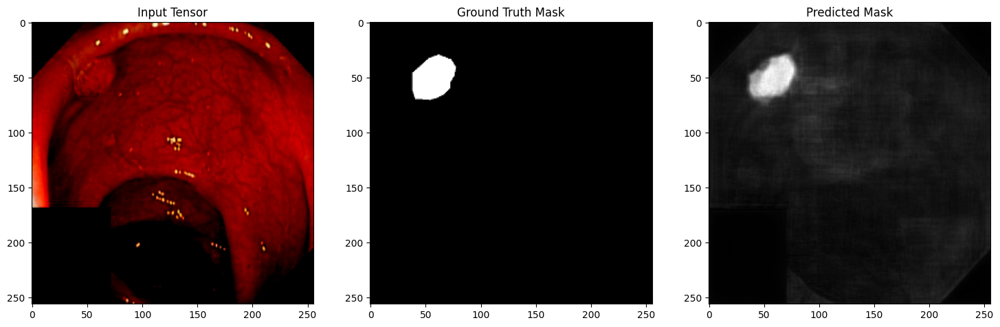

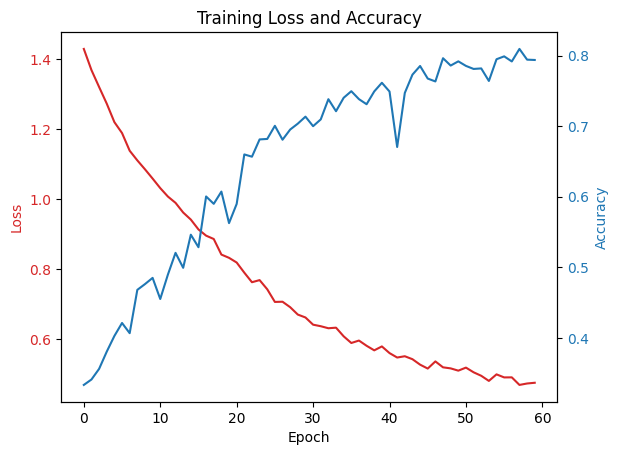

In [7]:
args_train_student = setup_train_args(my_model="unet512", dataset=dataset,
                                      data_root="./data_root/", batch_size=8, epochs=60, learning_rate=0.001)
losses, perfs, path = train_student(args_train_student, 512)
visualize_loss_acc_plot(losses, acc_list=perfs, path=path+".png")

UNet(
  (normalize): Normalize()
  (downs): ModuleList(
    (0): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (1): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_runnin

Train Epoch: 1 [24/1290 (1.9%)]	Loss: 1.519854	Time: 1.884699

Train Epoch: 1 [48/1290 (3.7%)]	Loss: 1.400838	Time: 2.133001

Train Epoch: 1 [72/1290 (5.6%)]	Loss: 1.472589	Time: 2.380209

Train Epoch: 1 [96/1290 (7.5%)]	Loss: 1.575681	Time: 2.626416

Train Epoch: 1 [120/1290 (9.3%)]	Loss: 1.652013	Time: 2.876317

Train Epoch: 1 [144/1290 (11.2%)]	Loss: 1.304970	Time: 3.130363

Train Epoch: 1 [168/1290 (13.0%)]	Loss: 1.587507	Time: 3.380651

Train Epoch: 1 [192/1290 (14.9%)]	Loss: 1.471468	Time: 3.630887

Train Epoch: 1 [216/1290 (16.8%)]	Loss: 1.483045	Time: 3.878788

Train Epoch: 1 [240/1290 (18.6%)]	Loss: 1.327300	Time: 4.127707

Train Epoch: 1 [256/1290 (19.9%)]	Loss: 1.256548	Time: 4.299423

Train Epoch: 1 [280/1290 (21.7%)]	Loss: 1.181144	Time: 4.580462

Train Epoch: 1 [304/1290 (23.6%)]	Loss: 1.574146	Time: 4.826806

Train Epoch: 1 [328/1290 (25.5%)]	Loss: 1.487537	Time: 5.069721

Train Epoch: 1 [352/1290 (27.3%)]	Loss: 1.415107	Time: 5.313676

Train Epoch: 1 [376/1290 (29.2%)]	Loss: 1.296613	Time: 5.560835

Train Epoch: 1 [400/1290 (31.1%)]	Loss: 1.506914	Time: 5.818208

Train Epoch: 1 [424/1290 (32.9%)]	Loss: 1.575416	Time: 6.066754

Train Epoch: 1 [448/1290 (34.8%)]	Loss: 1.291984	Time: 6.312163

Train Epoch: 1 [472/1290 (36.6%)]	Loss: 1.518388	Time: 6.553809

Train Epoch: 1 [496/1290 (38.5%)]	Loss: 1.470473	Time: 6.800348

Train Epoch: 1 [520/1290 (40.4%)]	Loss: 1.529841	Time: 7.049762

Train Epoch: 1 [544/1290 (42.2%)]	Loss: 1.295710	Time: 7.299219

Train Epoch: 1 [568/1290 (44.1%)]	Loss: 1.402817	Time: 7.550235

Train Epoch: 1 [592/1290 (46.0%)]	Loss: 1.372640	Time: 7.797668

Train Epoch: 1 [616/1290 (47.8%)]	Loss: 1.400387	Time: 8.044787

Train Epoch: 1 [640/1290 (49.7%)]	Loss: 1.520290	Time: 8.289463

Train Epoch: 1 [664/1290 (51.6%)]	Loss: 1.437648	Time: 8.530265

Train Epoch: 1 [688/1290 (53.4%)]	Loss: 1.506725	Time: 8.775805

Train Epoch: 1 [712/1290 (55.3%)]	Loss: 1.341155	Time: 9.025130

Train Epoch: 1 [736/1290 (57.1%)]	Loss: 1.506687	Time: 9.276716

Train Epoch: 1 [760/1290 (59.0%)]	Loss: 1.536158	Time: 9.524150

Train Epoch: 1 [784/1290 (60.9%)]	Loss: 1.397186	Time: 9.770280

Train Epoch: 1 [808/1290 (62.7%)]	Loss: 1.299309	Time: 10.016987

Train Epoch: 1 [832/1290 (64.6%)]	Loss: 1.348442	Time: 10.264551

Train Epoch: 1 [856/1290 (66.5%)]	Loss: 1.379637	Time: 10.511016

Train Epoch: 1 [880/1290 (68.3%)]	Loss: 1.493327	Time: 10.756608

Train Epoch: 1 [904/1290 (70.2%)]	Loss: 1.425195	Time: 11.009677

Train Epoch: 1 [928/1290 (72.0%)]	Loss: 1.472766	Time: 11.255227

Train Epoch: 1 [952/1290 (73.9%)]	Loss: 1.531552	Time: 11.505585

Train Epoch: 1 [976/1290 (75.8%)]	Loss: 1.461631	Time: 11.746545

Train Epoch: 1 [1000/1290 (77.6%)]	Loss: 1.528832	Time: 11.994427

Train Epoch: 1 [1024/1290 (79.5%)]	Loss: 1.460373	Time: 12.237148

Train Epoch: 1 [1048/1290 (81.4%)]	Loss: 1.282363	Time: 12.487890

Train Epoch: 1 [1072/1290 (83.2%)]	Loss: 1.369283	Time: 12.728285

Train Epoch: 1 [1096/1290 (85.1%)]	Loss: 1.577830	Time: 12.968535

Train Epoch: 1 [1120/1290 (87.0%)]	Loss: 1.418740	Time: 13.205547

Train Epoch: 1 [1144/1290 (88.8%)]	Loss: 1.520101	Time: 13.442319

Train Epoch: 1 [1168/1290 (90.7%)]	Loss: 1.508795	Time: 13.676692

Train Epoch: 1 [1192/1290 (92.5%)]	Loss: 1.429437	Time: 13.913302

Train Epoch: 1 [1216/1290 (94.4%)]	Loss: 1.456841	Time: 14.149783

Train Epoch: 1 [1240/1290 (96.3%)]	Loss: 1.384570	Time: 14.384594

Train Epoch: 1 [1264/1290 (98.1%)]	Loss: 1.419055	Time: 14.622114

Train Epoch: 1 [1288/1290 (100.0%)]	Average loss: 1.430234	Time: 14.856488


Test  Epoch: 1 [28/161 (17.4%)]	Average performance: 0.305020	Time: 0.577754

Test  Epoch: 1 [72/161 (44.7%)]	Average performance: 0.340578	Time: 0.786616

Test  Epoch: 1 [113/161 (70.2%)]	Average performance: 0.314853	Time: 0.991502

Test  Epoch: 1 [157/161 (97.5%)]	Average performance: 0.305237	Time: 1.194580

Test  Epoch: 1 [161/161 (100.0%)]	Average performance: 0.305372	Time: 1.212551


Train Epoch: 2 [24/1290 (1.9%)]	Loss: 1.367607	Time: 1.895922

Train Epoch: 2 [48/1290 (3.7%)]	Loss: 1.571422	Time: 2.148442

Train Epoch: 2 [72/1290 (5.6%)]	Loss: 1.206370	Time: 2.404890

Train Epoch: 2 [96/1290 (7.5%)]	Loss: 1.357462	Time: 2.655416

Train Epoch: 2 [120/1290 (9.3%)]	Loss: 1.454430	Time: 2.905605

Train Epoch: 2 [144/1290 (11.2%)]	Loss: 1.289712	Time: 3.178493

Train Epoch: 2 [168/1290 (13.0%)]	Loss: 1.500402	Time: 3.442790

Train Epoch: 2 [192/1290 (14.9%)]	Loss: 1.412326	Time: 3.689814

Train Epoch: 2 [216/1290 (16.8%)]	Loss: 1.379291	Time: 3.940220

Train Epoch: 2 [240/1290 (18.6%)]	Loss: 1.358596	Time: 4.188958

Train Epoch: 2 [264/1290 (20.5%)]	Loss: 1.352849	Time: 4.437984

Train Epoch: 2 [288/1290 (22.4%)]	Loss: 1.428934	Time: 4.690814

Train Epoch: 2 [312/1290 (24.2%)]	Loss: 1.430780	Time: 4.942005

Train Epoch: 2 [336/1290 (26.1%)]	Loss: 1.373844	Time: 5.189475

Train Epoch: 2 [360/1290 (28.0%)]	Loss: 1.381449	Time: 5.435210

Train Epoch: 2 [384/1290 (29.8%)]	Loss: 1.379226	Time: 5.687175

Train Epoch: 2 [408/1290 (31.7%)]	Loss: 1.325530	Time: 5.939840

Train Epoch: 2 [432/1290 (33.5%)]	Loss: 1.521027	Time: 6.188253

Train Epoch: 2 [456/1290 (35.4%)]	Loss: 1.355572	Time: 6.436567

Train Epoch: 2 [480/1290 (37.3%)]	Loss: 1.387300	Time: 6.680459

Train Epoch: 2 [504/1290 (39.1%)]	Loss: 1.225761	Time: 6.927836

Train Epoch: 2 [528/1290 (41.0%)]	Loss: 1.352082	Time: 7.187259

Train Epoch: 2 [552/1290 (42.9%)]	Loss: 1.355132	Time: 7.432889

Train Epoch: 2 [576/1290 (44.7%)]	Loss: 1.376585	Time: 7.675712

Train Epoch: 2 [600/1290 (46.6%)]	Loss: 1.329539	Time: 7.922797

Train Epoch: 2 [624/1290 (48.4%)]	Loss: 1.399469	Time: 8.170489

Train Epoch: 2 [648/1290 (50.3%)]	Loss: 1.420584	Time: 8.422712

Train Epoch: 2 [672/1290 (52.2%)]	Loss: 1.330417	Time: 8.670465

Train Epoch: 2 [696/1290 (54.0%)]	Loss: 1.495821	Time: 8.917290

Train Epoch: 2 [720/1290 (55.9%)]	Loss: 1.320743	Time: 9.164217

Train Epoch: 2 [744/1290 (57.8%)]	Loss: 1.291714	Time: 9.407705

Train Epoch: 2 [768/1290 (59.6%)]	Loss: 1.423217	Time: 9.655632

Train Epoch: 2 [792/1290 (61.5%)]	Loss: 1.404556	Time: 9.907063

Train Epoch: 2 [816/1290 (63.4%)]	Loss: 1.437231	Time: 10.157649

Train Epoch: 2 [840/1290 (65.2%)]	Loss: 1.375076	Time: 10.404709

Train Epoch: 2 [864/1290 (67.1%)]	Loss: 1.472893	Time: 10.650670

Train Epoch: 2 [888/1290 (68.9%)]	Loss: 1.310292	Time: 10.896320

Train Epoch: 2 [912/1290 (70.8%)]	Loss: 1.432555	Time: 11.148572

Train Epoch: 2 [936/1290 (72.7%)]	Loss: 1.221545	Time: 11.401712

Train Epoch: 2 [960/1290 (74.5%)]	Loss: 1.368179	Time: 11.653673

Train Epoch: 2 [984/1290 (76.4%)]	Loss: 1.277112	Time: 11.905153

Train Epoch: 2 [1008/1290 (78.3%)]	Loss: 1.383365	Time: 12.150048

Train Epoch: 2 [1032/1290 (80.1%)]	Loss: 1.324606	Time: 12.401185

Train Epoch: 2 [1056/1290 (82.0%)]	Loss: 1.470661	Time: 12.646547

Train Epoch: 2 [1080/1290 (83.9%)]	Loss: 1.356435	Time: 12.890690

Train Epoch: 2 [1104/1290 (85.7%)]	Loss: 1.273161	Time: 13.131618

Train Epoch: 2 [1128/1290 (87.6%)]	Loss: 1.420125	Time: 13.368263

Train Epoch: 2 [1152/1290 (89.4%)]	Loss: 1.448670	Time: 13.605802

Train Epoch: 2 [1176/1290 (91.3%)]	Loss: 1.328577	Time: 13.842362

Train Epoch: 2 [1200/1290 (93.2%)]	Loss: 1.379565	Time: 14.079705

Train Epoch: 2 [1224/1290 (95.0%)]	Loss: 1.316264	Time: 14.317387

Train Epoch: 2 [1248/1290 (96.9%)]	Loss: 1.359480	Time: 14.552466

Train Epoch: 2 [1272/1290 (98.8%)]	Loss: 1.318568	Time: 14.789156

Train Epoch: 2 [1288/1290 (100.0%)]	Average loss: 1.367105	Time: 14.945979


Test  Epoch: 2 [28/161 (17.4%)]	Average performance: 0.348350	Time: 0.559931

Test  Epoch: 2 [72/161 (44.7%)]	Average performance: 0.390883	Time: 0.767984

Test  Epoch: 2 [113/161 (70.2%)]	Average performance: 0.364675	Time: 0.970861

Test  Epoch: 2 [157/161 (97.5%)]	Average performance: 0.355872	Time: 1.174205

Test  Epoch: 2 [161/161 (100.0%)]	Average performance: 0.356324	Time: 1.191842


Train Epoch: 3 [24/1290 (1.9%)]	Loss: 1.480976	Time: 2.072651

Train Epoch: 3 [48/1290 (3.7%)]	Loss: 1.400998	Time: 2.333741

Train Epoch: 3 [72/1290 (5.6%)]	Loss: 1.371280	Time: 2.594109

Train Epoch: 3 [96/1290 (7.5%)]	Loss: 1.375425	Time: 2.844783

Train Epoch: 3 [120/1290 (9.3%)]	Loss: 1.424281	Time: 3.093874

Train Epoch: 3 [144/1290 (11.2%)]	Loss: 1.409518	Time: 3.402801

Train Epoch: 3 [168/1290 (13.0%)]	Loss: 1.376791	Time: 3.651677

Train Epoch: 3 [192/1290 (14.9%)]	Loss: 1.421898	Time: 3.900595

Train Epoch: 3 [216/1290 (16.8%)]	Loss: 1.390336	Time: 4.147186

Train Epoch: 3 [240/1290 (18.6%)]	Loss: 1.399643	Time: 4.388744

Train Epoch: 3 [264/1290 (20.5%)]	Loss: 1.226159	Time: 4.644699

Train Epoch: 3 [288/1290 (22.4%)]	Loss: 1.190614	Time: 4.889415

Train Epoch: 3 [312/1290 (24.2%)]	Loss: 1.315883	Time: 5.143933

Train Epoch: 3 [336/1290 (26.1%)]	Loss: 1.282518	Time: 5.390486

Train Epoch: 3 [360/1290 (28.0%)]	Loss: 1.329942	Time: 5.634966

Train Epoch: 3 [384/1290 (29.8%)]	Loss: 1.418301	Time: 5.879649

Train Epoch: 3 [408/1290 (31.7%)]	Loss: 1.170825	Time: 6.133121

Train Epoch: 3 [432/1290 (33.5%)]	Loss: 1.148159	Time: 6.377584

Train Epoch: 3 [456/1290 (35.4%)]	Loss: 1.428969	Time: 6.625473

Train Epoch: 3 [480/1290 (37.3%)]	Loss: 1.320261	Time: 6.873672

Train Epoch: 3 [504/1290 (39.1%)]	Loss: 1.465221	Time: 7.122739

Train Epoch: 3 [528/1290 (41.0%)]	Loss: 1.466548	Time: 7.366859

Train Epoch: 3 [552/1290 (42.9%)]	Loss: 1.349209	Time: 7.614606

Train Epoch: 3 [576/1290 (44.7%)]	Loss: 1.196910	Time: 7.861884

Train Epoch: 3 [600/1290 (46.6%)]	Loss: 1.195129	Time: 8.105853

Train Epoch: 3 [624/1290 (48.4%)]	Loss: 1.289716	Time: 8.347047

Train Epoch: 3 [648/1290 (50.3%)]	Loss: 1.417276	Time: 8.596234

Train Epoch: 3 [672/1290 (52.2%)]	Loss: 1.238072	Time: 8.851134

Train Epoch: 3 [696/1290 (54.0%)]	Loss: 1.331071	Time: 9.096732

Train Epoch: 3 [720/1290 (55.9%)]	Loss: 1.288465	Time: 9.341020

Train Epoch: 3 [744/1290 (57.8%)]	Loss: 1.269091	Time: 9.586591

Train Epoch: 3 [768/1290 (59.6%)]	Loss: 1.216407	Time: 9.829812

Train Epoch: 3 [792/1290 (61.5%)]	Loss: 1.294144	Time: 10.077916

Train Epoch: 3 [816/1290 (63.4%)]	Loss: 1.382381	Time: 10.324633

Train Epoch: 3 [840/1290 (65.2%)]	Loss: 1.264329	Time: 10.569216

Train Epoch: 3 [864/1290 (67.1%)]	Loss: 1.363725	Time: 10.815251

Train Epoch: 3 [888/1290 (68.9%)]	Loss: 1.421807	Time: 11.070054

Train Epoch: 3 [912/1290 (70.8%)]	Loss: 1.340957	Time: 11.321827

Train Epoch: 3 [936/1290 (72.7%)]	Loss: 1.371475	Time: 11.574929

Train Epoch: 3 [960/1290 (74.5%)]	Loss: 1.330374	Time: 11.820218

Train Epoch: 3 [984/1290 (76.4%)]	Loss: 1.440597	Time: 12.067537

Train Epoch: 3 [1008/1290 (78.3%)]	Loss: 1.292784	Time: 12.319593

Train Epoch: 3 [1032/1290 (80.1%)]	Loss: 1.168256	Time: 12.567045

Train Epoch: 3 [1056/1290 (82.0%)]	Loss: 1.202536	Time: 12.809622

Train Epoch: 3 [1080/1290 (83.9%)]	Loss: 1.432480	Time: 13.054061

Train Epoch: 3 [1104/1290 (85.7%)]	Loss: 1.301105	Time: 13.290890

Train Epoch: 3 [1128/1290 (87.6%)]	Loss: 1.216209	Time: 13.528497

Train Epoch: 3 [1152/1290 (89.4%)]	Loss: 1.304932	Time: 13.765285

Train Epoch: 3 [1176/1290 (91.3%)]	Loss: 1.324265	Time: 14.004487

Train Epoch: 3 [1200/1290 (93.2%)]	Loss: 1.334942	Time: 14.241295

Train Epoch: 3 [1224/1290 (95.0%)]	Loss: 1.238519	Time: 14.478863

Train Epoch: 3 [1248/1290 (96.9%)]	Loss: 1.299814	Time: 14.716902

Train Epoch: 3 [1272/1290 (98.8%)]	Loss: 1.342104	Time: 14.954098

Train Epoch: 3 [1288/1290 (100.0%)]	Average loss: 1.303419	Time: 15.112503


Test  Epoch: 3 [29/161 (18.0%)]	Average performance: 0.325488	Time: 0.566124

Test  Epoch: 3 [73/161 (45.3%)]	Average performance: 0.351637	Time: 0.769386

Test  Epoch: 3 [114/161 (70.8%)]	Average performance: 0.321570	Time: 0.970688

Test  Epoch: 3 [158/161 (98.1%)]	Average performance: 0.312630	Time: 1.175451

Test  Epoch: 3 [161/161 (100.0%)]	Average performance: 0.311836	Time: 1.188613


Train Epoch: 4 [24/1290 (1.9%)]	Loss: 1.461838	Time: 1.589598

Train Epoch: 4 [32/1290 (2.5%)]	Loss: 1.356696	Time: 1.704653

Train Epoch: 4 [56/1290 (4.3%)]	Loss: 1.297523	Time: 2.221203

Train Epoch: 4 [80/1290 (6.2%)]	Loss: 1.176482	Time: 2.484050

Train Epoch: 4 [104/1290 (8.1%)]	Loss: 1.235692	Time: 2.735201

Train Epoch: 4 [128/1290 (9.9%)]	Loss: 1.304508	Time: 2.980072

Train Epoch: 4 [144/1290 (11.2%)]	Loss: 1.354099	Time: 3.167520

Train Epoch: 4 [168/1290 (13.0%)]	Loss: 1.342604	Time: 3.461337

Train Epoch: 4 [192/1290 (14.9%)]	Loss: 1.259721	Time: 3.707618

Train Epoch: 4 [216/1290 (16.8%)]	Loss: 1.337125	Time: 3.951121

Train Epoch: 4 [240/1290 (18.6%)]	Loss: 1.290188	Time: 4.196613

Train Epoch: 4 [264/1290 (20.5%)]	Loss: 1.319638	Time: 4.448599

Train Epoch: 4 [288/1290 (22.4%)]	Loss: 1.319538	Time: 4.697150

Train Epoch: 4 [312/1290 (24.2%)]	Loss: 1.075444	Time: 4.982059

Train Epoch: 4 [336/1290 (26.1%)]	Loss: 1.243540	Time: 5.237227

Train Epoch: 4 [360/1290 (28.0%)]	Loss: 1.040097	Time: 5.477754

Train Epoch: 4 [384/1290 (29.8%)]	Loss: 1.193298	Time: 5.725899

Train Epoch: 4 [408/1290 (31.7%)]	Loss: 1.215712	Time: 5.974608

Train Epoch: 4 [432/1290 (33.5%)]	Loss: 1.229889	Time: 6.228631

Train Epoch: 4 [456/1290 (35.4%)]	Loss: 1.304198	Time: 6.471801

Train Epoch: 4 [480/1290 (37.3%)]	Loss: 1.337142	Time: 6.720323

Train Epoch: 4 [504/1290 (39.1%)]	Loss: 1.300151	Time: 6.964024

Train Epoch: 4 [528/1290 (41.0%)]	Loss: 1.298208	Time: 7.211046

Train Epoch: 4 [552/1290 (42.9%)]	Loss: 1.085526	Time: 7.459014

Train Epoch: 4 [576/1290 (44.7%)]	Loss: 1.368917	Time: 7.702699

Train Epoch: 4 [600/1290 (46.6%)]	Loss: 1.303684	Time: 7.944632

Train Epoch: 4 [624/1290 (48.4%)]	Loss: 1.279380	Time: 8.191365

Train Epoch: 4 [648/1290 (50.3%)]	Loss: 1.208083	Time: 8.439158

Train Epoch: 4 [672/1290 (52.2%)]	Loss: 1.311596	Time: 8.681633

Train Epoch: 4 [696/1290 (54.0%)]	Loss: 1.303337	Time: 8.926649

Train Epoch: 4 [720/1290 (55.9%)]	Loss: 1.188467	Time: 9.175812

Train Epoch: 4 [744/1290 (57.8%)]	Loss: 1.279717	Time: 9.420778

Train Epoch: 4 [768/1290 (59.6%)]	Loss: 1.111905	Time: 9.666837

Train Epoch: 4 [792/1290 (61.5%)]	Loss: 1.211834	Time: 9.915879

Train Epoch: 4 [816/1290 (63.4%)]	Loss: 1.272764	Time: 10.164267

Train Epoch: 4 [840/1290 (65.2%)]	Loss: 1.178306	Time: 10.407114

Train Epoch: 4 [864/1290 (67.1%)]	Loss: 1.329258	Time: 10.655744

Train Epoch: 4 [888/1290 (68.9%)]	Loss: 1.190538	Time: 10.904386

Train Epoch: 4 [912/1290 (70.8%)]	Loss: 1.137579	Time: 11.149724

Train Epoch: 4 [936/1290 (72.7%)]	Loss: 1.281927	Time: 11.397961

Train Epoch: 4 [960/1290 (74.5%)]	Loss: 1.293928	Time: 11.647334

Train Epoch: 4 [984/1290 (76.4%)]	Loss: 1.308962	Time: 11.893716

Train Epoch: 4 [1008/1290 (78.3%)]	Loss: 1.233102	Time: 12.141271

Train Epoch: 4 [1032/1290 (80.1%)]	Loss: 1.247801	Time: 12.390767

Train Epoch: 4 [1056/1290 (82.0%)]	Loss: 1.352691	Time: 12.637693

Train Epoch: 4 [1080/1290 (83.9%)]	Loss: 1.263157	Time: 12.879700

Train Epoch: 4 [1104/1290 (85.7%)]	Loss: 1.236598	Time: 13.118222

Train Epoch: 4 [1128/1290 (87.6%)]	Loss: 1.268090	Time: 13.358687

Train Epoch: 4 [1152/1290 (89.4%)]	Loss: 1.206363	Time: 13.594917

Train Epoch: 4 [1176/1290 (91.3%)]	Loss: 1.284607	Time: 13.831032

Train Epoch: 4 [1200/1290 (93.2%)]	Loss: 1.188033	Time: 14.068383

Train Epoch: 4 [1224/1290 (95.0%)]	Loss: 1.217916	Time: 14.303849

Train Epoch: 4 [1248/1290 (96.9%)]	Loss: 1.273761	Time: 14.541743

Train Epoch: 4 [1272/1290 (98.8%)]	Loss: 1.275575	Time: 14.777519

Train Epoch: 4 [1288/1290 (100.0%)]	Average loss: 1.252127	Time: 14.934651


Test  Epoch: 4 [38/161 (23.6%)]	Average performance: 0.432343	Time: 0.622458

Test  Epoch: 4 [81/161 (50.3%)]	Average performance: 0.407998	Time: 0.826516

Test  Epoch: 4 [122/161 (75.8%)]	Average performance: 0.415921	Time: 1.029339

Test  Epoch: 4 [161/161 (100.0%)]	Average performance: 0.403635	Time: 1.205323


Train Epoch: 5 [16/1290 (1.2%)]	Loss: 1.335517	Time: 1.818097

Train Epoch: 5 [40/1290 (3.1%)]	Loss: 1.253088	Time: 2.289998

Train Epoch: 5 [64/1290 (5.0%)]	Loss: 1.168190	Time: 2.538486

Train Epoch: 5 [88/1290 (6.8%)]	Loss: 1.299254	Time: 2.780100

Train Epoch: 5 [112/1290 (8.7%)]	Loss: 1.141336	Time: 3.030165

Train Epoch: 5 [136/1290 (10.6%)]	Loss: 1.252167	Time: 3.293359

Train Epoch: 5 [160/1290 (12.4%)]	Loss: 1.297700	Time: 3.547942

Train Epoch: 5 [184/1290 (14.3%)]	Loss: 1.128211	Time: 3.808382

Train Epoch: 5 [208/1290 (16.1%)]	Loss: 1.243048	Time: 4.054934

Train Epoch: 5 [232/1290 (18.0%)]	Loss: 1.440115	Time: 4.301401

Train Epoch: 5 [256/1290 (19.9%)]	Loss: 1.216760	Time: 4.545800

Train Epoch: 5 [280/1290 (21.7%)]	Loss: 1.179529	Time: 4.809274

Train Epoch: 5 [304/1290 (23.6%)]	Loss: 1.154978	Time: 5.055451

Train Epoch: 5 [328/1290 (25.5%)]	Loss: 1.197831	Time: 5.302903

Train Epoch: 5 [352/1290 (27.3%)]	Loss: 1.253424	Time: 5.546928

Train Epoch: 5 [376/1290 (29.2%)]	Loss: 1.164138	Time: 5.792812

Train Epoch: 5 [400/1290 (31.1%)]	Loss: 1.247001	Time: 6.054516

Train Epoch: 5 [424/1290 (32.9%)]	Loss: 1.280945	Time: 6.302792

Train Epoch: 5 [448/1290 (34.8%)]	Loss: 1.218887	Time: 6.548502

Train Epoch: 5 [472/1290 (36.6%)]	Loss: 1.195910	Time: 6.800417

Train Epoch: 5 [496/1290 (38.5%)]	Loss: 1.150884	Time: 7.052473

Train Epoch: 5 [520/1290 (40.4%)]	Loss: 1.278791	Time: 7.303591

Train Epoch: 5 [544/1290 (42.2%)]	Loss: 1.203724	Time: 7.553222

Train Epoch: 5 [568/1290 (44.1%)]	Loss: 1.138862	Time: 7.797320

Train Epoch: 5 [592/1290 (46.0%)]	Loss: 1.179789	Time: 8.044308

Train Epoch: 5 [616/1290 (47.8%)]	Loss: 1.170485	Time: 8.292836

Train Epoch: 5 [640/1290 (49.7%)]	Loss: 1.122384	Time: 8.541280

Train Epoch: 5 [664/1290 (51.6%)]	Loss: 1.327937	Time: 8.789977

Train Epoch: 5 [688/1290 (53.4%)]	Loss: 1.183345	Time: 9.035942

Train Epoch: 5 [712/1290 (55.3%)]	Loss: 1.161290	Time: 9.280520

Train Epoch: 5 [736/1290 (57.1%)]	Loss: 1.279743	Time: 9.527340

Train Epoch: 5 [760/1290 (59.0%)]	Loss: 1.281802	Time: 9.774420

Train Epoch: 5 [784/1290 (60.9%)]	Loss: 1.151443	Time: 10.020217

Train Epoch: 5 [808/1290 (62.7%)]	Loss: 1.224592	Time: 10.264644

Train Epoch: 5 [832/1290 (64.6%)]	Loss: 1.148960	Time: 10.505121

Train Epoch: 5 [856/1290 (66.5%)]	Loss: 1.261691	Time: 10.753986

Train Epoch: 5 [880/1290 (68.3%)]	Loss: 1.204424	Time: 11.002673

Train Epoch: 5 [904/1290 (70.2%)]	Loss: 1.047633	Time: 11.252490

Train Epoch: 5 [928/1290 (72.0%)]	Loss: 1.179755	Time: 11.493693

Train Epoch: 5 [952/1290 (73.9%)]	Loss: 1.226540	Time: 11.741172

Train Epoch: 5 [976/1290 (75.8%)]	Loss: 1.136314	Time: 11.988317

Train Epoch: 5 [1000/1290 (77.6%)]	Loss: 1.189331	Time: 12.237449

Train Epoch: 5 [1024/1290 (79.5%)]	Loss: 1.204653	Time: 12.486518

Train Epoch: 5 [1048/1290 (81.4%)]	Loss: 1.122399	Time: 12.733670

Train Epoch: 5 [1072/1290 (83.2%)]	Loss: 1.318250	Time: 12.974121

Train Epoch: 5 [1096/1290 (85.1%)]	Loss: 1.344162	Time: 13.212169

Train Epoch: 5 [1120/1290 (87.0%)]	Loss: 1.168277	Time: 13.451088

Train Epoch: 5 [1144/1290 (88.8%)]	Loss: 1.167932	Time: 13.688537

Train Epoch: 5 [1168/1290 (90.7%)]	Loss: 1.187646	Time: 13.926007

Train Epoch: 5 [1192/1290 (92.5%)]	Loss: 1.194504	Time: 14.162925

Train Epoch: 5 [1216/1290 (94.4%)]	Loss: 1.339270	Time: 14.401088

Train Epoch: 5 [1240/1290 (96.3%)]	Loss: 1.209105	Time: 14.636467

Train Epoch: 5 [1264/1290 (98.1%)]	Loss: 1.084557	Time: 14.873151

Train Epoch: 5 [1288/1290 (100.0%)]	Average loss: 1.207541	Time: 15.109437


Test  Epoch: 5 [34/161 (21.1%)]	Average performance: 0.446962	Time: 0.574873

Test  Epoch: 5 [77/161 (47.8%)]	Average performance: 0.442162	Time: 0.778971

Test  Epoch: 5 [118/161 (73.3%)]	Average performance: 0.415744	Time: 0.982591

Test  Epoch: 5 [161/161 (100.0%)]	Average performance: 0.408845	Time: 1.178941


Train Epoch: 6 [24/1290 (1.9%)]	Loss: 1.165506	Time: 1.864920

Train Epoch: 6 [48/1290 (3.7%)]	Loss: 1.237483	Time: 2.271959

Train Epoch: 6 [72/1290 (5.6%)]	Loss: 1.165968	Time: 2.519770

Train Epoch: 6 [96/1290 (7.5%)]	Loss: 1.119279	Time: 2.766014

Train Epoch: 6 [120/1290 (9.3%)]	Loss: 1.104477	Time: 3.010022

Train Epoch: 6 [136/1290 (10.6%)]	Loss: 1.067888	Time: 3.214429

Train Epoch: 6 [160/1290 (12.4%)]	Loss: 1.134120	Time: 3.495559

Train Epoch: 6 [184/1290 (14.3%)]	Loss: 1.154640	Time: 3.745030

Train Epoch: 6 [208/1290 (16.1%)]	Loss: 1.294199	Time: 3.998948

Train Epoch: 6 [232/1290 (18.0%)]	Loss: 1.222252	Time: 4.245598

Train Epoch: 6 [256/1290 (19.9%)]	Loss: 1.201273	Time: 4.496862

Train Epoch: 6 [280/1290 (21.7%)]	Loss: 1.329458	Time: 4.772580

Train Epoch: 6 [304/1290 (23.6%)]	Loss: 1.264730	Time: 5.019631

Train Epoch: 6 [328/1290 (25.5%)]	Loss: 1.215014	Time: 5.267904

Train Epoch: 6 [352/1290 (27.3%)]	Loss: 1.188763	Time: 5.512655

Train Epoch: 6 [376/1290 (29.2%)]	Loss: 1.141042	Time: 5.759332

Train Epoch: 6 [400/1290 (31.1%)]	Loss: 1.188178	Time: 6.015156

Train Epoch: 6 [424/1290 (32.9%)]	Loss: 1.291127	Time: 6.263184

Train Epoch: 6 [448/1290 (34.8%)]	Loss: 1.136987	Time: 6.510678

Train Epoch: 6 [472/1290 (36.6%)]	Loss: 1.131447	Time: 6.759449

Train Epoch: 6 [496/1290 (38.5%)]	Loss: 1.231258	Time: 7.006196

Train Epoch: 6 [520/1290 (40.4%)]	Loss: 1.181003	Time: 7.254020

Train Epoch: 6 [544/1290 (42.2%)]	Loss: 1.153791	Time: 7.505414

Train Epoch: 6 [568/1290 (44.1%)]	Loss: 1.139676	Time: 7.754233

Train Epoch: 6 [592/1290 (46.0%)]	Loss: 1.226483	Time: 7.998330

Train Epoch: 6 [616/1290 (47.8%)]	Loss: 1.108187	Time: 8.244817

Train Epoch: 6 [640/1290 (49.7%)]	Loss: 1.218590	Time: 8.492942

Train Epoch: 6 [664/1290 (51.6%)]	Loss: 1.249136	Time: 8.739019

Train Epoch: 6 [688/1290 (53.4%)]	Loss: 1.217612	Time: 8.985199

Train Epoch: 6 [712/1290 (55.3%)]	Loss: 1.285464	Time: 9.229404

Train Epoch: 6 [736/1290 (57.1%)]	Loss: 1.242426	Time: 9.471552

Train Epoch: 6 [760/1290 (59.0%)]	Loss: 1.170232	Time: 9.718432

Train Epoch: 6 [784/1290 (60.9%)]	Loss: 1.229846	Time: 9.967912

Train Epoch: 6 [808/1290 (62.7%)]	Loss: 1.202074	Time: 10.215027

Train Epoch: 6 [832/1290 (64.6%)]	Loss: 1.268091	Time: 10.459400

Train Epoch: 6 [856/1290 (66.5%)]	Loss: 1.153176	Time: 10.707746

Train Epoch: 6 [880/1290 (68.3%)]	Loss: 1.253346	Time: 10.952360

Train Epoch: 6 [904/1290 (70.2%)]	Loss: 1.045757	Time: 11.201210

Train Epoch: 6 [928/1290 (72.0%)]	Loss: 1.116574	Time: 11.444497

Train Epoch: 6 [952/1290 (73.9%)]	Loss: 1.143809	Time: 11.688965

Train Epoch: 6 [976/1290 (75.8%)]	Loss: 1.209499	Time: 11.932039

Train Epoch: 6 [1000/1290 (77.6%)]	Loss: 0.945118	Time: 12.182779

Train Epoch: 6 [1024/1290 (79.5%)]	Loss: 0.986859	Time: 12.426458

Train Epoch: 6 [1048/1290 (81.4%)]	Loss: 1.114044	Time: 12.668330

Train Epoch: 6 [1072/1290 (83.2%)]	Loss: 1.309070	Time: 12.909965

Train Epoch: 6 [1096/1290 (85.1%)]	Loss: 1.180288	Time: 13.149895

Train Epoch: 6 [1120/1290 (87.0%)]	Loss: 1.127207	Time: 13.387400

Train Epoch: 6 [1144/1290 (88.8%)]	Loss: 1.198295	Time: 13.622787

Train Epoch: 6 [1168/1290 (90.7%)]	Loss: 1.268531	Time: 13.860102

Train Epoch: 6 [1192/1290 (92.5%)]	Loss: 1.235050	Time: 14.097389

Train Epoch: 6 [1216/1290 (94.4%)]	Loss: 1.168267	Time: 14.332826

Train Epoch: 6 [1240/1290 (96.3%)]	Loss: 1.160562	Time: 14.569854

Train Epoch: 6 [1264/1290 (98.1%)]	Loss: 1.197289	Time: 14.807135

Train Epoch: 6 [1288/1290 (100.0%)]	Average loss: 1.182746	Time: 15.043227


Test  Epoch: 6 [28/161 (17.4%)]	Average performance: 0.387494	Time: 0.564794

Test  Epoch: 6 [71/161 (44.1%)]	Average performance: 0.426884	Time: 0.770580

Test  Epoch: 6 [112/161 (69.6%)]	Average performance: 0.389900	Time: 0.973457

Test  Epoch: 6 [156/161 (96.9%)]	Average performance: 0.381105	Time: 1.177090

Test  Epoch: 6 [161/161 (100.0%)]	Average performance: 0.381364	Time: 1.199067


Train Epoch: 7 [8/1290 (0.6%)]	Loss: 1.019458	Time: 1.311788

Train Epoch: 7 [24/1290 (1.9%)]	Loss: 1.147353	Time: 1.619736

Train Epoch: 7 [48/1290 (3.7%)]	Loss: 1.177462	Time: 2.023707

Train Epoch: 7 [72/1290 (5.6%)]	Loss: 1.078524	Time: 2.301127

Train Epoch: 7 [96/1290 (7.5%)]	Loss: 1.225334	Time: 2.584061

Train Epoch: 7 [120/1290 (9.3%)]	Loss: 1.207183	Time: 2.832397

Train Epoch: 7 [144/1290 (11.2%)]	Loss: 1.255464	Time: 3.085428

Train Epoch: 7 [160/1290 (12.4%)]	Loss: 1.162462	Time: 3.353369

Train Epoch: 7 [184/1290 (14.3%)]	Loss: 1.122389	Time: 3.605642

Train Epoch: 7 [208/1290 (16.1%)]	Loss: 1.207649	Time: 3.852784

Train Epoch: 7 [232/1290 (18.0%)]	Loss: 1.128304	Time: 4.102441

Train Epoch: 7 [256/1290 (19.9%)]	Loss: 0.958197	Time: 4.350984

Train Epoch: 7 [280/1290 (21.7%)]	Loss: 1.240646	Time: 4.605838

Train Epoch: 7 [304/1290 (23.6%)]	Loss: 1.220514	Time: 4.857038

Train Epoch: 7 [328/1290 (25.5%)]	Loss: 1.007694	Time: 5.106930

Train Epoch: 7 [352/1290 (27.3%)]	Loss: 1.108297	Time: 5.354550

Train Epoch: 7 [376/1290 (29.2%)]	Loss: 1.258947	Time: 5.603810

Train Epoch: 7 [400/1290 (31.1%)]	Loss: 1.187544	Time: 5.861479

Train Epoch: 7 [424/1290 (32.9%)]	Loss: 1.212722	Time: 6.109615

Train Epoch: 7 [448/1290 (34.8%)]	Loss: 1.098712	Time: 6.361976

Train Epoch: 7 [472/1290 (36.6%)]	Loss: 1.119461	Time: 6.608084

Train Epoch: 7 [496/1290 (38.5%)]	Loss: 1.149998	Time: 6.853257

Train Epoch: 7 [520/1290 (40.4%)]	Loss: 1.140859	Time: 7.092888

Train Epoch: 7 [544/1290 (42.2%)]	Loss: 1.168725	Time: 7.337367

Train Epoch: 7 [568/1290 (44.1%)]	Loss: 1.204072	Time: 7.588498

Train Epoch: 7 [592/1290 (46.0%)]	Loss: 1.180346	Time: 7.831947

Train Epoch: 7 [616/1290 (47.8%)]	Loss: 1.179559	Time: 8.078185

Train Epoch: 7 [640/1290 (49.7%)]	Loss: 1.155552	Time: 8.325347

Train Epoch: 7 [664/1290 (51.6%)]	Loss: 1.134961	Time: 8.575211

Train Epoch: 7 [688/1290 (53.4%)]	Loss: 1.191846	Time: 8.822421

Train Epoch: 7 [712/1290 (55.3%)]	Loss: 1.157865	Time: 9.076801

Train Epoch: 7 [736/1290 (57.1%)]	Loss: 1.177296	Time: 9.333725

Train Epoch: 7 [760/1290 (59.0%)]	Loss: 1.039503	Time: 9.576878

Train Epoch: 7 [784/1290 (60.9%)]	Loss: 1.036383	Time: 9.822632

Train Epoch: 7 [808/1290 (62.7%)]	Loss: 1.222575	Time: 10.071446

Train Epoch: 7 [832/1290 (64.6%)]	Loss: 1.033949	Time: 10.318521

Train Epoch: 7 [856/1290 (66.5%)]	Loss: 1.134925	Time: 10.570789

Train Epoch: 7 [880/1290 (68.3%)]	Loss: 1.145970	Time: 10.816824

Train Epoch: 7 [904/1290 (70.2%)]	Loss: 1.164785	Time: 11.064614

Train Epoch: 7 [928/1290 (72.0%)]	Loss: 1.064445	Time: 11.320196

Train Epoch: 7 [952/1290 (73.9%)]	Loss: 1.144926	Time: 11.565720

Train Epoch: 7 [976/1290 (75.8%)]	Loss: 1.161636	Time: 11.807915

Train Epoch: 7 [1000/1290 (77.6%)]	Loss: 1.137522	Time: 12.056350

Train Epoch: 7 [1024/1290 (79.5%)]	Loss: 1.281044	Time: 12.301758

Train Epoch: 7 [1048/1290 (81.4%)]	Loss: 1.171291	Time: 12.546254

Train Epoch: 7 [1072/1290 (83.2%)]	Loss: 1.042985	Time: 12.792241

Train Epoch: 7 [1096/1290 (85.1%)]	Loss: 1.176932	Time: 13.035430

Train Epoch: 7 [1120/1290 (87.0%)]	Loss: 1.192143	Time: 13.271968

Train Epoch: 7 [1144/1290 (88.8%)]	Loss: 0.953022	Time: 13.507842

Train Epoch: 7 [1168/1290 (90.7%)]	Loss: 0.970638	Time: 13.746102

Train Epoch: 7 [1192/1290 (92.5%)]	Loss: 1.201187	Time: 13.982460

Train Epoch: 7 [1216/1290 (94.4%)]	Loss: 1.022388	Time: 14.218819

Train Epoch: 7 [1240/1290 (96.3%)]	Loss: 1.047721	Time: 14.457023

Train Epoch: 7 [1264/1290 (98.1%)]	Loss: 1.129216	Time: 14.693546

Train Epoch: 7 [1288/1290 (100.0%)]	Average loss: 1.147082	Time: 14.929099


Test  Epoch: 7 [35/161 (21.7%)]	Average performance: 0.484385	Time: 0.610950

Test  Epoch: 7 [78/161 (48.4%)]	Average performance: 0.463603	Time: 0.813519

Test  Epoch: 7 [119/161 (73.9%)]	Average performance: 0.437786	Time: 1.018363

Test  Epoch: 7 [161/161 (100.0%)]	Average performance: 0.430038	Time: 1.209605


Train Epoch: 8 [24/1290 (1.9%)]	Loss: 1.273058	Time: 1.822430

Train Epoch: 8 [48/1290 (3.7%)]	Loss: 1.151815	Time: 2.092829

Train Epoch: 8 [72/1290 (5.6%)]	Loss: 1.027587	Time: 2.344157

Train Epoch: 8 [96/1290 (7.5%)]	Loss: 1.211191	Time: 2.591789

Train Epoch: 8 [120/1290 (9.3%)]	Loss: 1.211258	Time: 2.837135

Train Epoch: 8 [144/1290 (11.2%)]	Loss: 1.099153	Time: 3.110899

Train Epoch: 8 [168/1290 (13.0%)]	Loss: 1.205153	Time: 3.390138

Train Epoch: 8 [192/1290 (14.9%)]	Loss: 1.107253	Time: 3.641123

Train Epoch: 8 [216/1290 (16.8%)]	Loss: 1.113580	Time: 3.887630

Train Epoch: 8 [240/1290 (18.6%)]	Loss: 1.027665	Time: 4.135340

Train Epoch: 8 [264/1290 (20.5%)]	Loss: 1.085619	Time: 4.388463

Train Epoch: 8 [288/1290 (22.4%)]	Loss: 0.999363	Time: 4.649297

Train Epoch: 8 [312/1290 (24.2%)]	Loss: 1.189799	Time: 4.898445

Train Epoch: 8 [336/1290 (26.1%)]	Loss: 1.113434	Time: 5.150806

Train Epoch: 8 [360/1290 (28.0%)]	Loss: 1.049192	Time: 5.400447

Train Epoch: 8 [384/1290 (29.8%)]	Loss: 1.011717	Time: 5.650489

Train Epoch: 8 [408/1290 (31.7%)]	Loss: 1.126287	Time: 5.911258

Train Epoch: 8 [432/1290 (33.5%)]	Loss: 1.009294	Time: 6.161256

Train Epoch: 8 [456/1290 (35.4%)]	Loss: 1.164046	Time: 6.408655

Train Epoch: 8 [480/1290 (37.3%)]	Loss: 1.087395	Time: 6.653105

Train Epoch: 8 [504/1290 (39.1%)]	Loss: 0.959547	Time: 6.904407

Train Epoch: 8 [528/1290 (41.0%)]	Loss: 1.172680	Time: 7.154147

Train Epoch: 8 [552/1290 (42.9%)]	Loss: 1.066966	Time: 7.398225

Train Epoch: 8 [576/1290 (44.7%)]	Loss: 1.049025	Time: 7.645604

Train Epoch: 8 [600/1290 (46.6%)]	Loss: 1.104349	Time: 7.896503

Train Epoch: 8 [624/1290 (48.4%)]	Loss: 1.101629	Time: 8.141631

Train Epoch: 8 [648/1290 (50.3%)]	Loss: 1.046650	Time: 8.395609

Train Epoch: 8 [672/1290 (52.2%)]	Loss: 1.176142	Time: 8.643853

Train Epoch: 8 [696/1290 (54.0%)]	Loss: 1.041982	Time: 8.888072

Train Epoch: 8 [720/1290 (55.9%)]	Loss: 1.155418	Time: 9.138712

Train Epoch: 8 [744/1290 (57.8%)]	Loss: 1.085047	Time: 9.390171

Train Epoch: 8 [768/1290 (59.6%)]	Loss: 1.051487	Time: 9.637994

Train Epoch: 8 [792/1290 (61.5%)]	Loss: 1.095108	Time: 9.885207

Train Epoch: 8 [816/1290 (63.4%)]	Loss: 1.137551	Time: 10.126748

Train Epoch: 8 [840/1290 (65.2%)]	Loss: 1.048761	Time: 10.371359

Train Epoch: 8 [864/1290 (67.1%)]	Loss: 1.268713	Time: 10.617274

Train Epoch: 8 [888/1290 (68.9%)]	Loss: 0.999414	Time: 10.858627

Train Epoch: 8 [912/1290 (70.8%)]	Loss: 1.181752	Time: 11.109557

Train Epoch: 8 [936/1290 (72.7%)]	Loss: 1.130087	Time: 11.352265

Train Epoch: 8 [960/1290 (74.5%)]	Loss: 1.050390	Time: 11.604974

Train Epoch: 8 [984/1290 (76.4%)]	Loss: 1.126956	Time: 11.851047

Train Epoch: 8 [1008/1290 (78.3%)]	Loss: 1.061225	Time: 12.095550

Train Epoch: 8 [1032/1290 (80.1%)]	Loss: 1.137979	Time: 12.342793

Train Epoch: 8 [1056/1290 (82.0%)]	Loss: 1.161672	Time: 12.586681

Train Epoch: 8 [1080/1290 (83.9%)]	Loss: 1.215810	Time: 12.828367

Train Epoch: 8 [1104/1290 (85.7%)]	Loss: 1.040679	Time: 13.067513

Train Epoch: 8 [1128/1290 (87.6%)]	Loss: 1.128061	Time: 13.304451

Train Epoch: 8 [1152/1290 (89.4%)]	Loss: 1.112654	Time: 13.541833

Train Epoch: 8 [1176/1290 (91.3%)]	Loss: 1.126000	Time: 13.779190

Train Epoch: 8 [1200/1290 (93.2%)]	Loss: 1.147915	Time: 14.015500

Train Epoch: 8 [1224/1290 (95.0%)]	Loss: 1.300427	Time: 14.252694

Train Epoch: 8 [1248/1290 (96.9%)]	Loss: 1.032776	Time: 14.491796

Train Epoch: 8 [1272/1290 (98.8%)]	Loss: 1.025487	Time: 14.727332

Train Epoch: 8 [1288/1290 (100.0%)]	Average loss: 1.118245	Time: 14.884231


Test  Epoch: 8 [33/161 (20.5%)]	Average performance: 0.434219	Time: 0.592006

Test  Epoch: 8 [76/161 (47.2%)]	Average performance: 0.441389	Time: 0.794147

Test  Epoch: 8 [117/161 (72.7%)]	Average performance: 0.413665	Time: 0.997983

Test  Epoch: 8 [161/161 (100.0%)]	Average performance: 0.406597	Time: 1.197224


Train Epoch: 9 [24/1290 (1.9%)]	Loss: 1.094640	Time: 2.106142

Train Epoch: 9 [48/1290 (3.7%)]	Loss: 1.116117	Time: 2.350856

Train Epoch: 9 [72/1290 (5.6%)]	Loss: 1.047330	Time: 2.595788

Train Epoch: 9 [96/1290 (7.5%)]	Loss: 1.070739	Time: 2.840035

Train Epoch: 9 [120/1290 (9.3%)]	Loss: 1.241361	Time: 3.090430

Train Epoch: 9 [144/1290 (11.2%)]	Loss: 1.090092	Time: 3.358976

Train Epoch: 9 [168/1290 (13.0%)]	Loss: 1.214818	Time: 3.617697

Train Epoch: 9 [192/1290 (14.9%)]	Loss: 1.091969	Time: 3.865453

Train Epoch: 9 [216/1290 (16.8%)]	Loss: 1.009026	Time: 4.110782

Train Epoch: 9 [240/1290 (18.6%)]	Loss: 1.116699	Time: 4.357316

Train Epoch: 9 [264/1290 (20.5%)]	Loss: 1.217708	Time: 4.608119

Train Epoch: 9 [288/1290 (22.4%)]	Loss: 1.171730	Time: 4.857914

Train Epoch: 9 [312/1290 (24.2%)]	Loss: 1.198258	Time: 5.112120

Train Epoch: 9 [336/1290 (26.1%)]	Loss: 1.092401	Time: 5.363504

Train Epoch: 9 [360/1290 (28.0%)]	Loss: 1.092345	Time: 5.609735

Train Epoch: 9 [384/1290 (29.8%)]	Loss: 1.017048	Time: 5.856692

Train Epoch: 9 [408/1290 (31.7%)]	Loss: 1.199283	Time: 6.105756

Train Epoch: 9 [432/1290 (33.5%)]	Loss: 1.098915	Time: 6.349687

Train Epoch: 9 [456/1290 (35.4%)]	Loss: 1.070079	Time: 6.603800

Train Epoch: 9 [480/1290 (37.3%)]	Loss: 1.143798	Time: 6.848476

Train Epoch: 9 [504/1290 (39.1%)]	Loss: 1.020244	Time: 7.099054

Train Epoch: 9 [528/1290 (41.0%)]	Loss: 0.996045	Time: 7.348317

Train Epoch: 9 [552/1290 (42.9%)]	Loss: 0.990296	Time: 7.593084

Train Epoch: 9 [576/1290 (44.7%)]	Loss: 1.048849	Time: 7.843079

Train Epoch: 9 [600/1290 (46.6%)]	Loss: 0.971687	Time: 8.087549

Train Epoch: 9 [624/1290 (48.4%)]	Loss: 1.054869	Time: 8.333029

Train Epoch: 9 [648/1290 (50.3%)]	Loss: 1.081627	Time: 8.579044

Train Epoch: 9 [672/1290 (52.2%)]	Loss: 1.176618	Time: 8.822124

Train Epoch: 9 [696/1290 (54.0%)]	Loss: 1.132881	Time: 9.070700

Train Epoch: 9 [720/1290 (55.9%)]	Loss: 0.944446	Time: 9.311548

Train Epoch: 9 [744/1290 (57.8%)]	Loss: 1.097709	Time: 9.554854

Train Epoch: 9 [768/1290 (59.6%)]	Loss: 1.122354	Time: 9.806306

Train Epoch: 9 [792/1290 (61.5%)]	Loss: 1.084364	Time: 10.051992

Train Epoch: 9 [816/1290 (63.4%)]	Loss: 1.134874	Time: 10.303184

Train Epoch: 9 [840/1290 (65.2%)]	Loss: 1.159552	Time: 10.547081

Train Epoch: 9 [864/1290 (67.1%)]	Loss: 1.091498	Time: 10.790154

Train Epoch: 9 [888/1290 (68.9%)]	Loss: 0.997045	Time: 11.039426

Train Epoch: 9 [912/1290 (70.8%)]	Loss: 1.000384	Time: 11.287458

Train Epoch: 9 [936/1290 (72.7%)]	Loss: 1.005664	Time: 11.539747

Train Epoch: 9 [960/1290 (74.5%)]	Loss: 1.037212	Time: 11.785992

Train Epoch: 9 [984/1290 (76.4%)]	Loss: 1.071772	Time: 12.032563

Train Epoch: 9 [1008/1290 (78.3%)]	Loss: 1.146307	Time: 12.283167

Train Epoch: 9 [1032/1290 (80.1%)]	Loss: 0.962385	Time: 12.529404

Train Epoch: 9 [1056/1290 (82.0%)]	Loss: 1.170676	Time: 12.778039

Train Epoch: 9 [1080/1290 (83.9%)]	Loss: 0.980178	Time: 13.020429

Train Epoch: 9 [1104/1290 (85.7%)]	Loss: 1.192269	Time: 13.262699

Train Epoch: 9 [1128/1290 (87.6%)]	Loss: 1.023272	Time: 13.499285

Train Epoch: 9 [1152/1290 (89.4%)]	Loss: 1.150164	Time: 13.735819

Train Epoch: 9 [1176/1290 (91.3%)]	Loss: 1.033653	Time: 13.972828

Train Epoch: 9 [1200/1290 (93.2%)]	Loss: 0.996687	Time: 14.210012

Train Epoch: 9 [1224/1290 (95.0%)]	Loss: 1.040055	Time: 14.448222

Train Epoch: 9 [1248/1290 (96.9%)]	Loss: 1.028854	Time: 14.684023

Train Epoch: 9 [1272/1290 (98.8%)]	Loss: 1.002482	Time: 14.921507

Train Epoch: 9 [1288/1290 (100.0%)]	Average loss: 1.091781	Time: 15.079323


Test  Epoch: 9 [33/161 (20.5%)]	Average performance: 0.453453	Time: 0.589554

Test  Epoch: 9 [76/161 (47.2%)]	Average performance: 0.468462	Time: 0.791396

Test  Epoch: 9 [117/161 (72.7%)]	Average performance: 0.441935	Time: 0.994940

Test  Epoch: 9 [161/161 (100.0%)]	Average performance: 0.429463	Time: 1.195018


Train Epoch: 10 [8/1290 (0.6%)]	Loss: 0.931559	Time: 1.843405

Train Epoch: 10 [32/1290 (2.5%)]	Loss: 1.084058	Time: 2.295724

Train Epoch: 10 [56/1290 (4.3%)]	Loss: 1.192879	Time: 2.538927

Train Epoch: 10 [80/1290 (6.2%)]	Loss: 1.119350	Time: 2.784787

Train Epoch: 10 [104/1290 (8.1%)]	Loss: 1.056769	Time: 3.031921

Train Epoch: 10 [128/1290 (9.9%)]	Loss: 0.940980	Time: 3.280988

Train Epoch: 10 [152/1290 (11.8%)]	Loss: 0.986213	Time: 3.556505

Train Epoch: 10 [176/1290 (13.7%)]	Loss: 1.140266	Time: 3.805357

Train Epoch: 10 [200/1290 (15.5%)]	Loss: 1.060537	Time: 4.047645

Train Epoch: 10 [224/1290 (17.4%)]	Loss: 1.144532	Time: 4.291600

Train Epoch: 10 [248/1290 (19.3%)]	Loss: 1.186849	Time: 4.535590

Train Epoch: 10 [272/1290 (21.1%)]	Loss: 1.092279	Time: 4.791627

Train Epoch: 10 [296/1290 (23.0%)]	Loss: 1.196553	Time: 5.039188

Train Epoch: 10 [320/1290 (24.8%)]	Loss: 1.109945	Time: 5.283854

Train Epoch: 10 [344/1290 (26.7%)]	Loss: 0.950992	Time: 5.532947

Train Epoch: 10 [368/1290 (28.6%)]	Loss: 1.032825	Time: 5.783599

Train Epoch: 10 [392/1290 (30.4%)]	Loss: 1.145411	Time: 6.029462

Train Epoch: 10 [416/1290 (32.3%)]	Loss: 1.126994	Time: 6.276993

Train Epoch: 10 [440/1290 (34.2%)]	Loss: 1.045557	Time: 6.519180

Train Epoch: 10 [464/1290 (36.0%)]	Loss: 0.860406	Time: 6.762776

Train Epoch: 10 [488/1290 (37.9%)]	Loss: 1.026678	Time: 7.016094

Train Epoch: 10 [512/1290 (39.8%)]	Loss: 1.113423	Time: 7.259566

Train Epoch: 10 [536/1290 (41.6%)]	Loss: 1.020007	Time: 7.509883

Train Epoch: 10 [560/1290 (43.5%)]	Loss: 1.133011	Time: 7.753312

Train Epoch: 10 [584/1290 (45.3%)]	Loss: 0.974570	Time: 7.998329

Train Epoch: 10 [608/1290 (47.2%)]	Loss: 0.983899	Time: 8.245336

Train Epoch: 10 [632/1290 (49.1%)]	Loss: 0.932874	Time: 8.489733

Train Epoch: 10 [656/1290 (50.9%)]	Loss: 1.003750	Time: 8.735450

Train Epoch: 10 [680/1290 (52.8%)]	Loss: 0.968567	Time: 8.978854

Train Epoch: 10 [704/1290 (54.7%)]	Loss: 1.088428	Time: 9.223191

Train Epoch: 10 [728/1290 (56.5%)]	Loss: 1.074894	Time: 9.465945

Train Epoch: 10 [752/1290 (58.4%)]	Loss: 0.996687	Time: 9.714668

Train Epoch: 10 [776/1290 (60.2%)]	Loss: 1.109147	Time: 9.961657

Train Epoch: 10 [800/1290 (62.1%)]	Loss: 1.143294	Time: 10.210380

Train Epoch: 10 [824/1290 (64.0%)]	Loss: 1.070560	Time: 10.459445

Train Epoch: 10 [848/1290 (65.8%)]	Loss: 0.953615	Time: 10.701320

Train Epoch: 10 [872/1290 (67.7%)]	Loss: 1.047681	Time: 10.950975

Train Epoch: 10 [896/1290 (69.6%)]	Loss: 1.094854	Time: 11.202512

Train Epoch: 10 [920/1290 (71.4%)]	Loss: 0.986375	Time: 11.448586

Train Epoch: 10 [944/1290 (73.3%)]	Loss: 1.029287	Time: 11.691197

Train Epoch: 10 [968/1290 (75.2%)]	Loss: 1.098923	Time: 11.941812

Train Epoch: 10 [992/1290 (77.0%)]	Loss: 0.898162	Time: 12.185863

Train Epoch: 10 [1016/1290 (78.9%)]	Loss: 1.157327	Time: 12.435278

Train Epoch: 10 [1040/1290 (80.7%)]	Loss: 1.179536	Time: 12.689561

Train Epoch: 10 [1064/1290 (82.6%)]	Loss: 1.005764	Time: 12.933098

Train Epoch: 10 [1088/1290 (84.5%)]	Loss: 1.026917	Time: 13.173120

Train Epoch: 10 [1112/1290 (86.3%)]	Loss: 1.013224	Time: 13.413574

Train Epoch: 10 [1136/1290 (88.2%)]	Loss: 0.983428	Time: 13.650038

Train Epoch: 10 [1160/1290 (90.1%)]	Loss: 1.021832	Time: 13.885791

Train Epoch: 10 [1184/1290 (91.9%)]	Loss: 0.960557	Time: 14.123771

Train Epoch: 10 [1208/1290 (93.8%)]	Loss: 1.009586	Time: 14.362144

Train Epoch: 10 [1232/1290 (95.7%)]	Loss: 1.069438	Time: 14.597637

Train Epoch: 10 [1256/1290 (97.5%)]	Loss: 1.104576	Time: 14.832815

Train Epoch: 10 [1280/1290 (99.4%)]	Loss: 0.930313	Time: 15.069803

Train Epoch: 10 [1288/1290 (100.0%)]	Average loss: 1.071067	Time: 15.148589


Test  Epoch: 10 [31/161 (19.3%)]	Average performance: 0.477823	Time: 0.614355

Test  Epoch: 10 [75/161 (46.6%)]	Average performance: 0.480253	Time: 0.817609

Test  Epoch: 10 [116/161 (72.0%)]	Average performance: 0.446918	Time: 1.024398

Test  Epoch: 10 [161/161 (100.0%)]	Average performance: 0.442754	Time: 1.229650


Train Epoch: 11 [16/1290 (1.2%)]	Loss: 1.231969	Time: 1.580266

Train Epoch: 11 [40/1290 (3.1%)]	Loss: 1.149037	Time: 2.118828

Train Epoch: 11 [64/1290 (5.0%)]	Loss: 1.045952	Time: 2.365701

Train Epoch: 11 [88/1290 (6.8%)]	Loss: 1.071362	Time: 2.610158

Train Epoch: 11 [112/1290 (8.7%)]	Loss: 1.057908	Time: 2.858328

Train Epoch: 11 [136/1290 (10.6%)]	Loss: 1.026476	Time: 3.119306

Train Epoch: 11 [160/1290 (12.4%)]	Loss: 1.152453	Time: 3.362862

Train Epoch: 11 [184/1290 (14.3%)]	Loss: 1.069431	Time: 3.611970

Train Epoch: 11 [208/1290 (16.1%)]	Loss: 0.974896	Time: 3.867580

Train Epoch: 11 [232/1290 (18.0%)]	Loss: 1.137396	Time: 4.115628

Train Epoch: 11 [256/1290 (19.9%)]	Loss: 0.890130	Time: 4.360886

Train Epoch: 11 [280/1290 (21.7%)]	Loss: 0.992336	Time: 4.612283

Train Epoch: 11 [304/1290 (23.6%)]	Loss: 0.991001	Time: 4.870227

Train Epoch: 11 [328/1290 (25.5%)]	Loss: 1.295925	Time: 5.116408

Train Epoch: 11 [352/1290 (27.3%)]	Loss: 1.163115	Time: 5.361458

Train Epoch: 11 [376/1290 (29.2%)]	Loss: 1.095093	Time: 5.607761

Train Epoch: 11 [400/1290 (31.1%)]	Loss: 1.048494	Time: 5.855451

Train Epoch: 11 [424/1290 (32.9%)]	Loss: 1.078259	Time: 6.113186

Train Epoch: 11 [448/1290 (34.8%)]	Loss: 1.083536	Time: 6.359047

Train Epoch: 11 [472/1290 (36.6%)]	Loss: 1.021469	Time: 6.602341

Train Epoch: 11 [496/1290 (38.5%)]	Loss: 0.982975	Time: 6.844345

Train Epoch: 11 [520/1290 (40.4%)]	Loss: 1.019965	Time: 7.090398

Train Epoch: 11 [544/1290 (42.2%)]	Loss: 1.055573	Time: 7.335804

Train Epoch: 11 [568/1290 (44.1%)]	Loss: 1.017545	Time: 7.585472

Train Epoch: 11 [592/1290 (46.0%)]	Loss: 1.131071	Time: 7.831764

Train Epoch: 11 [616/1290 (47.8%)]	Loss: 1.204124	Time: 8.074197

Train Epoch: 11 [640/1290 (49.7%)]	Loss: 1.042627	Time: 8.316582

Train Epoch: 11 [664/1290 (51.6%)]	Loss: 1.037961	Time: 8.564480

Train Epoch: 11 [688/1290 (53.4%)]	Loss: 1.084156	Time: 8.815655

Train Epoch: 11 [712/1290 (55.3%)]	Loss: 0.992715	Time: 9.062071

Train Epoch: 11 [736/1290 (57.1%)]	Loss: 1.111815	Time: 9.308836

Train Epoch: 11 [760/1290 (59.0%)]	Loss: 0.968834	Time: 9.554643

Train Epoch: 11 [784/1290 (60.9%)]	Loss: 1.221552	Time: 9.804930

Train Epoch: 11 [808/1290 (62.7%)]	Loss: 1.258787	Time: 10.049988

Train Epoch: 11 [832/1290 (64.6%)]	Loss: 1.014001	Time: 10.291838

Train Epoch: 11 [856/1290 (66.5%)]	Loss: 0.901407	Time: 10.539050

Train Epoch: 11 [880/1290 (68.3%)]	Loss: 1.111815	Time: 10.788165

Train Epoch: 11 [904/1290 (70.2%)]	Loss: 1.005067	Time: 11.033632

Train Epoch: 11 [928/1290 (72.0%)]	Loss: 1.123148	Time: 11.275673

Train Epoch: 11 [952/1290 (73.9%)]	Loss: 1.077941	Time: 11.525341

Train Epoch: 11 [976/1290 (75.8%)]	Loss: 0.986539	Time: 11.773066

Train Epoch: 11 [1000/1290 (77.6%)]	Loss: 0.892165	Time: 12.020686

Train Epoch: 11 [1024/1290 (79.5%)]	Loss: 1.000456	Time: 12.268903

Train Epoch: 11 [1048/1290 (81.4%)]	Loss: 1.241363	Time: 12.513144

Train Epoch: 11 [1072/1290 (83.2%)]	Loss: 1.132627	Time: 12.752409

Train Epoch: 11 [1096/1290 (85.1%)]	Loss: 1.090513	Time: 12.991159

Train Epoch: 11 [1120/1290 (87.0%)]	Loss: 1.060551	Time: 13.229901

Train Epoch: 11 [1144/1290 (88.8%)]	Loss: 1.024154	Time: 13.468114

Train Epoch: 11 [1168/1290 (90.7%)]	Loss: 1.098493	Time: 13.703337

Train Epoch: 11 [1192/1290 (92.5%)]	Loss: 1.109510	Time: 13.941133

Train Epoch: 11 [1216/1290 (94.4%)]	Loss: 0.993987	Time: 14.176602

Train Epoch: 11 [1240/1290 (96.3%)]	Loss: 1.022364	Time: 14.413213

Train Epoch: 11 [1264/1290 (98.1%)]	Loss: 1.049702	Time: 14.650753

Train Epoch: 11 [1288/1290 (100.0%)]	Average loss: 1.056431	Time: 14.886344


Test  Epoch: 11 [34/161 (21.1%)]	Average performance: 0.518699	Time: 0.617292

Test  Epoch: 11 [77/161 (47.8%)]	Average performance: 0.515890	Time: 0.818784

Test  Epoch: 11 [118/161 (73.3%)]	Average performance: 0.495019	Time: 1.022173

Test  Epoch: 11 [161/161 (100.0%)]	Average performance: 0.482362	Time: 1.218416


Train Epoch: 12 [24/1290 (1.9%)]	Loss: 0.973504	Time: 1.987552

Train Epoch: 12 [48/1290 (3.7%)]	Loss: 1.109541	Time: 2.243467

Train Epoch: 12 [72/1290 (5.6%)]	Loss: 1.022950	Time: 2.491069

Train Epoch: 12 [96/1290 (7.5%)]	Loss: 1.002015	Time: 2.742429

Train Epoch: 12 [120/1290 (9.3%)]	Loss: 1.002558	Time: 2.989536

Train Epoch: 12 [144/1290 (11.2%)]	Loss: 0.959390	Time: 3.263590

Train Epoch: 12 [168/1290 (13.0%)]	Loss: 1.173061	Time: 3.533403

Train Epoch: 12 [192/1290 (14.9%)]	Loss: 1.085013	Time: 3.777025

Train Epoch: 12 [216/1290 (16.8%)]	Loss: 1.220119	Time: 4.026061

Train Epoch: 12 [240/1290 (18.6%)]	Loss: 1.026897	Time: 4.277168

Train Epoch: 12 [264/1290 (20.5%)]	Loss: 1.007933	Time: 4.535899

Train Epoch: 12 [288/1290 (22.4%)]	Loss: 0.882421	Time: 4.790065

Train Epoch: 12 [312/1290 (24.2%)]	Loss: 0.973686	Time: 5.045309

Train Epoch: 12 [336/1290 (26.1%)]	Loss: 1.080914	Time: 5.296189

Train Epoch: 12 [360/1290 (28.0%)]	Loss: 0.962268	Time: 5.548160

Train Epoch: 12 [384/1290 (29.8%)]	Loss: 1.083804	Time: 5.795626

Train Epoch: 12 [408/1290 (31.7%)]	Loss: 1.034248	Time: 6.046971

Train Epoch: 12 [432/1290 (33.5%)]	Loss: 1.206304	Time: 6.289486

Train Epoch: 12 [456/1290 (35.4%)]	Loss: 0.992443	Time: 6.534585

Train Epoch: 12 [480/1290 (37.3%)]	Loss: 0.992150	Time: 6.778585

Train Epoch: 12 [504/1290 (39.1%)]	Loss: 0.913845	Time: 7.029598

Train Epoch: 12 [528/1290 (41.0%)]	Loss: 1.015995	Time: 7.280371

Train Epoch: 12 [552/1290 (42.9%)]	Loss: 0.976274	Time: 7.536751

Train Epoch: 12 [576/1290 (44.7%)]	Loss: 1.071321	Time: 7.785826

Train Epoch: 12 [600/1290 (46.6%)]	Loss: 0.964288	Time: 8.028530

Train Epoch: 12 [624/1290 (48.4%)]	Loss: 1.032000	Time: 8.267333

Train Epoch: 12 [648/1290 (50.3%)]	Loss: 0.966670	Time: 8.511674

Train Epoch: 12 [672/1290 (52.2%)]	Loss: 0.972756	Time: 8.758976

Train Epoch: 12 [696/1290 (54.0%)]	Loss: 1.040842	Time: 9.006161

Train Epoch: 12 [720/1290 (55.9%)]	Loss: 1.017296	Time: 9.249193

Train Epoch: 12 [744/1290 (57.8%)]	Loss: 1.098892	Time: 9.493547

Train Epoch: 12 [768/1290 (59.6%)]	Loss: 0.966126	Time: 9.746545

Train Epoch: 12 [792/1290 (61.5%)]	Loss: 1.077149	Time: 9.997104

Train Epoch: 12 [816/1290 (63.4%)]	Loss: 1.014327	Time: 10.241748

Train Epoch: 12 [840/1290 (65.2%)]	Loss: 0.989501	Time: 10.488510

Train Epoch: 12 [864/1290 (67.1%)]	Loss: 0.954357	Time: 10.736142

Train Epoch: 12 [888/1290 (68.9%)]	Loss: 1.025763	Time: 10.985395

Train Epoch: 12 [912/1290 (70.8%)]	Loss: 1.087606	Time: 11.230781

Train Epoch: 12 [936/1290 (72.7%)]	Loss: 0.987074	Time: 11.477787

Train Epoch: 12 [960/1290 (74.5%)]	Loss: 0.998072	Time: 11.721910

Train Epoch: 12 [984/1290 (76.4%)]	Loss: 1.061971	Time: 11.973790

Train Epoch: 12 [1008/1290 (78.3%)]	Loss: 1.066339	Time: 12.219626

Train Epoch: 12 [1032/1290 (80.1%)]	Loss: 0.995187	Time: 12.465819

Train Epoch: 12 [1056/1290 (82.0%)]	Loss: 1.115421	Time: 12.710556

Train Epoch: 12 [1080/1290 (83.9%)]	Loss: 1.164575	Time: 12.953839

Train Epoch: 12 [1104/1290 (85.7%)]	Loss: 0.994714	Time: 13.193276

Train Epoch: 12 [1128/1290 (87.6%)]	Loss: 1.095687	Time: 13.432400

Train Epoch: 12 [1152/1290 (89.4%)]	Loss: 0.976669	Time: 13.667977

Train Epoch: 12 [1176/1290 (91.3%)]	Loss: 1.206830	Time: 13.904715

Train Epoch: 12 [1200/1290 (93.2%)]	Loss: 0.986294	Time: 14.141393

Train Epoch: 12 [1224/1290 (95.0%)]	Loss: 0.972342	Time: 14.377723

Train Epoch: 12 [1248/1290 (96.9%)]	Loss: 0.960684	Time: 14.613393

Train Epoch: 12 [1272/1290 (98.8%)]	Loss: 1.143036	Time: 14.848067

Train Epoch: 12 [1288/1290 (100.0%)]	Average loss: 1.033954	Time: 15.004724


Test  Epoch: 12 [34/161 (21.1%)]	Average performance: 0.467745	Time: 0.571864

Test  Epoch: 12 [78/161 (48.4%)]	Average performance: 0.466738	Time: 0.776677

Test  Epoch: 12 [119/161 (73.9%)]	Average performance: 0.458388	Time: 0.979819

Test  Epoch: 12 [161/161 (100.0%)]	Average performance: 0.445504	Time: 1.171113


Train Epoch: 13 [24/1290 (1.9%)]	Loss: 0.993655	Time: 2.017239

Train Epoch: 13 [48/1290 (3.7%)]	Loss: 0.936440	Time: 2.298278

Train Epoch: 13 [72/1290 (5.6%)]	Loss: 0.920495	Time: 2.547944

Train Epoch: 13 [96/1290 (7.5%)]	Loss: 0.904152	Time: 2.791178

Train Epoch: 13 [120/1290 (9.3%)]	Loss: 1.032587	Time: 3.036453

Train Epoch: 13 [144/1290 (11.2%)]	Loss: 1.257579	Time: 3.309702

Train Epoch: 13 [168/1290 (13.0%)]	Loss: 1.048840	Time: 3.557571

Train Epoch: 13 [192/1290 (14.9%)]	Loss: 0.949395	Time: 3.809617

Train Epoch: 13 [216/1290 (16.8%)]	Loss: 1.074309	Time: 4.055634

Train Epoch: 13 [240/1290 (18.6%)]	Loss: 1.127746	Time: 4.306215

Train Epoch: 13 [264/1290 (20.5%)]	Loss: 1.149066	Time: 4.561258

Train Epoch: 13 [288/1290 (22.4%)]	Loss: 1.138570	Time: 4.812684

Train Epoch: 13 [312/1290 (24.2%)]	Loss: 1.099360	Time: 5.056901

Train Epoch: 13 [336/1290 (26.1%)]	Loss: 1.052574	Time: 5.297034

Train Epoch: 13 [360/1290 (28.0%)]	Loss: 0.972509	Time: 5.544918

Train Epoch: 13 [384/1290 (29.8%)]	Loss: 1.034934	Time: 5.792512

Train Epoch: 13 [408/1290 (31.7%)]	Loss: 1.047945	Time: 6.054703

Train Epoch: 13 [432/1290 (33.5%)]	Loss: 1.059104	Time: 6.295560

Train Epoch: 13 [456/1290 (35.4%)]	Loss: 0.861759	Time: 6.538456

Train Epoch: 13 [480/1290 (37.3%)]	Loss: 1.032242	Time: 6.784028

Train Epoch: 13 [504/1290 (39.1%)]	Loss: 1.026610	Time: 7.037069

Train Epoch: 13 [528/1290 (41.0%)]	Loss: 1.019378	Time: 7.291685

Train Epoch: 13 [552/1290 (42.9%)]	Loss: 1.155687	Time: 7.536168

Train Epoch: 13 [576/1290 (44.7%)]	Loss: 1.002200	Time: 7.780687

Train Epoch: 13 [600/1290 (46.6%)]	Loss: 0.964728	Time: 8.023060

Train Epoch: 13 [624/1290 (48.4%)]	Loss: 1.147420	Time: 8.267794

Train Epoch: 13 [648/1290 (50.3%)]	Loss: 0.919493	Time: 8.517142

Train Epoch: 13 [672/1290 (52.2%)]	Loss: 1.132165	Time: 8.770533

Train Epoch: 13 [696/1290 (54.0%)]	Loss: 1.008634	Time: 9.011620

Train Epoch: 13 [720/1290 (55.9%)]	Loss: 0.926667	Time: 9.255790

Train Epoch: 13 [744/1290 (57.8%)]	Loss: 0.983015	Time: 9.503614

Train Epoch: 13 [768/1290 (59.6%)]	Loss: 1.101339	Time: 9.749125

Train Epoch: 13 [792/1290 (61.5%)]	Loss: 1.055332	Time: 9.998311

Train Epoch: 13 [816/1290 (63.4%)]	Loss: 0.934047	Time: 10.248011

Train Epoch: 13 [840/1290 (65.2%)]	Loss: 1.031839	Time: 10.489572

Train Epoch: 13 [864/1290 (67.1%)]	Loss: 0.904362	Time: 10.736985

Train Epoch: 13 [888/1290 (68.9%)]	Loss: 1.021584	Time: 10.987149

Train Epoch: 13 [912/1290 (70.8%)]	Loss: 0.880435	Time: 11.232951

Train Epoch: 13 [936/1290 (72.7%)]	Loss: 1.115835	Time: 11.481827

Train Epoch: 13 [960/1290 (74.5%)]	Loss: 0.915641	Time: 11.728963

Train Epoch: 13 [984/1290 (76.4%)]	Loss: 1.090837	Time: 11.976278

Train Epoch: 13 [1008/1290 (78.3%)]	Loss: 0.859299	Time: 12.224383

Train Epoch: 13 [1032/1290 (80.1%)]	Loss: 1.028115	Time: 12.473101

Train Epoch: 13 [1056/1290 (82.0%)]	Loss: 1.013380	Time: 12.719750

Train Epoch: 13 [1080/1290 (83.9%)]	Loss: 0.912208	Time: 12.962798

Train Epoch: 13 [1104/1290 (85.7%)]	Loss: 1.057678	Time: 13.200924

Train Epoch: 13 [1128/1290 (87.6%)]	Loss: 1.059940	Time: 13.438668

Train Epoch: 13 [1152/1290 (89.4%)]	Loss: 0.911798	Time: 13.675940

Train Epoch: 13 [1176/1290 (91.3%)]	Loss: 0.951270	Time: 13.911135

Train Epoch: 13 [1200/1290 (93.2%)]	Loss: 0.884058	Time: 14.146690

Train Epoch: 13 [1224/1290 (95.0%)]	Loss: 1.092723	Time: 14.384424

Train Epoch: 13 [1248/1290 (96.9%)]	Loss: 1.110223	Time: 14.619145

Train Epoch: 13 [1272/1290 (98.8%)]	Loss: 1.013998	Time: 14.856121

Train Epoch: 13 [1288/1290 (100.0%)]	Average loss: 1.024213	Time: 15.012394


Test  Epoch: 13 [33/161 (20.5%)]	Average performance: 0.496712	Time: 0.563932

Test  Epoch: 13 [77/161 (47.8%)]	Average performance: 0.496373	Time: 0.767339

Test  Epoch: 13 [118/161 (73.3%)]	Average performance: 0.485356	Time: 0.970901

Test  Epoch: 13 [161/161 (100.0%)]	Average performance: 0.475201	Time: 1.165709


Train Epoch: 14 [24/1290 (1.9%)]	Loss: 1.049118	Time: 1.878749

Train Epoch: 14 [48/1290 (3.7%)]	Loss: 0.915288	Time: 2.138160

Train Epoch: 14 [72/1290 (5.6%)]	Loss: 1.110462	Time: 2.393366

Train Epoch: 14 [96/1290 (7.5%)]	Loss: 0.982750	Time: 2.639827

Train Epoch: 14 [120/1290 (9.3%)]	Loss: 1.167062	Time: 2.888227

Train Epoch: 14 [144/1290 (11.2%)]	Loss: 1.107669	Time: 3.151309

Train Epoch: 14 [168/1290 (13.0%)]	Loss: 0.994212	Time: 3.398056

Train Epoch: 14 [192/1290 (14.9%)]	Loss: 1.074119	Time: 3.649048

Train Epoch: 14 [216/1290 (16.8%)]	Loss: 0.881894	Time: 3.895597

Train Epoch: 14 [240/1290 (18.6%)]	Loss: 1.038191	Time: 4.149107

Train Epoch: 14 [264/1290 (20.5%)]	Loss: 1.153331	Time: 4.406445

Train Epoch: 14 [288/1290 (22.4%)]	Loss: 1.003240	Time: 4.658222

Train Epoch: 14 [312/1290 (24.2%)]	Loss: 0.960481	Time: 4.906509

Train Epoch: 14 [336/1290 (26.1%)]	Loss: 0.895673	Time: 5.154141

Train Epoch: 14 [360/1290 (28.0%)]	Loss: 0.881210	Time: 5.401218

Train Epoch: 14 [384/1290 (29.8%)]	Loss: 1.142928	Time: 5.648936

Train Epoch: 14 [408/1290 (31.7%)]	Loss: 0.943044	Time: 5.899619

Train Epoch: 14 [432/1290 (33.5%)]	Loss: 1.059431	Time: 6.152824

Train Epoch: 14 [456/1290 (35.4%)]	Loss: 0.964225	Time: 6.397983

Train Epoch: 14 [480/1290 (37.3%)]	Loss: 1.010359	Time: 6.640236

Train Epoch: 14 [504/1290 (39.1%)]	Loss: 0.938554	Time: 6.883953

Train Epoch: 14 [528/1290 (41.0%)]	Loss: 1.062766	Time: 7.132231

Train Epoch: 14 [552/1290 (42.9%)]	Loss: 0.997184	Time: 7.378862

Train Epoch: 14 [576/1290 (44.7%)]	Loss: 1.146686	Time: 7.628847

Train Epoch: 14 [600/1290 (46.6%)]	Loss: 1.080164	Time: 7.873124

Train Epoch: 14 [624/1290 (48.4%)]	Loss: 0.961312	Time: 8.120171

Train Epoch: 14 [648/1290 (50.3%)]	Loss: 0.973784	Time: 8.370439

Train Epoch: 14 [672/1290 (52.2%)]	Loss: 1.003366	Time: 8.623454

Train Epoch: 14 [696/1290 (54.0%)]	Loss: 1.099985	Time: 8.867646

Train Epoch: 14 [720/1290 (55.9%)]	Loss: 0.976177	Time: 9.115951

Train Epoch: 14 [744/1290 (57.8%)]	Loss: 1.091158	Time: 9.360342

Train Epoch: 14 [768/1290 (59.6%)]	Loss: 0.987833	Time: 9.605611

Train Epoch: 14 [792/1290 (61.5%)]	Loss: 1.102889	Time: 9.854892

Train Epoch: 14 [816/1290 (63.4%)]	Loss: 0.936509	Time: 10.098348

Train Epoch: 14 [840/1290 (65.2%)]	Loss: 0.886508	Time: 10.348335

Train Epoch: 14 [864/1290 (67.1%)]	Loss: 1.103362	Time: 10.608879

Train Epoch: 14 [888/1290 (68.9%)]	Loss: 1.008404	Time: 10.858148

Train Epoch: 14 [912/1290 (70.8%)]	Loss: 0.974201	Time: 11.103919

Train Epoch: 14 [936/1290 (72.7%)]	Loss: 0.997746	Time: 11.351732

Train Epoch: 14 [960/1290 (74.5%)]	Loss: 0.903031	Time: 11.598891

Train Epoch: 14 [984/1290 (76.4%)]	Loss: 1.049531	Time: 11.845579

Train Epoch: 14 [1008/1290 (78.3%)]	Loss: 0.974824	Time: 12.088044

Train Epoch: 14 [1032/1290 (80.1%)]	Loss: 0.910877	Time: 12.336580

Train Epoch: 14 [1056/1290 (82.0%)]	Loss: 0.961463	Time: 12.584065

Train Epoch: 14 [1080/1290 (83.9%)]	Loss: 1.179832	Time: 12.822833

Train Epoch: 14 [1104/1290 (85.7%)]	Loss: 0.964993	Time: 13.061372

Train Epoch: 14 [1128/1290 (87.6%)]	Loss: 0.968321	Time: 13.300649

Train Epoch: 14 [1152/1290 (89.4%)]	Loss: 1.055336	Time: 13.535725

Train Epoch: 14 [1176/1290 (91.3%)]	Loss: 1.041828	Time: 13.772301

Train Epoch: 14 [1200/1290 (93.2%)]	Loss: 0.964401	Time: 14.009047

Train Epoch: 14 [1224/1290 (95.0%)]	Loss: 1.068791	Time: 14.245577

Train Epoch: 14 [1248/1290 (96.9%)]	Loss: 0.953665	Time: 14.481048

Train Epoch: 14 [1272/1290 (98.8%)]	Loss: 1.031309	Time: 14.718107

Train Epoch: 14 [1288/1290 (100.0%)]	Average loss: 1.011717	Time: 14.875206


Test  Epoch: 14 [33/161 (20.5%)]	Average performance: 0.539358	Time: 0.607002

Test  Epoch: 14 [76/161 (47.2%)]	Average performance: 0.537654	Time: 0.810837

Test  Epoch: 14 [117/161 (72.7%)]	Average performance: 0.502699	Time: 1.013293

Test  Epoch: 14 [161/161 (100.0%)]	Average performance: 0.490313	Time: 1.212124


Train Epoch: 15 [16/1290 (1.2%)]	Loss: 1.082827	Time: 1.725255

Train Epoch: 15 [40/1290 (3.1%)]	Loss: 0.874529	Time: 2.054759

Train Epoch: 15 [64/1290 (5.0%)]	Loss: 1.040293	Time: 2.332913

Train Epoch: 15 [88/1290 (6.8%)]	Loss: 0.990821	Time: 2.578598

Train Epoch: 15 [112/1290 (8.7%)]	Loss: 0.989083	Time: 2.829438

Train Epoch: 15 [136/1290 (10.6%)]	Loss: 1.043154	Time: 3.101024

Train Epoch: 15 [160/1290 (12.4%)]	Loss: 1.110698	Time: 3.370244

Train Epoch: 15 [184/1290 (14.3%)]	Loss: 0.967418	Time: 3.616451

Train Epoch: 15 [208/1290 (16.1%)]	Loss: 0.903889	Time: 3.861781

Train Epoch: 15 [232/1290 (18.0%)]	Loss: 1.067815	Time: 4.107733

Train Epoch: 15 [256/1290 (19.9%)]	Loss: 0.970385	Time: 4.355208

Train Epoch: 15 [280/1290 (21.7%)]	Loss: 1.033803	Time: 4.639347

Train Epoch: 15 [304/1290 (23.6%)]	Loss: 0.904900	Time: 4.885152

Train Epoch: 15 [328/1290 (25.5%)]	Loss: 0.947346	Time: 5.132579

Train Epoch: 15 [352/1290 (27.3%)]	Loss: 0.973104	Time: 5.381778

Train Epoch: 15 [376/1290 (29.2%)]	Loss: 0.998967	Time: 5.628746

Train Epoch: 15 [400/1290 (31.1%)]	Loss: 0.891059	Time: 5.876184

Train Epoch: 15 [424/1290 (32.9%)]	Loss: 0.966094	Time: 6.131151

Train Epoch: 15 [448/1290 (34.8%)]	Loss: 0.946202	Time: 6.377385

Train Epoch: 15 [472/1290 (36.6%)]	Loss: 0.988981	Time: 6.624592

Train Epoch: 15 [496/1290 (38.5%)]	Loss: 0.902725	Time: 6.874673

Train Epoch: 15 [520/1290 (40.4%)]	Loss: 0.923737	Time: 7.126188

Train Epoch: 15 [544/1290 (42.2%)]	Loss: 0.841348	Time: 7.376570

Train Epoch: 15 [568/1290 (44.1%)]	Loss: 1.073583	Time: 7.620251

Train Epoch: 15 [592/1290 (46.0%)]	Loss: 0.846733	Time: 7.865292

Train Epoch: 15 [616/1290 (47.8%)]	Loss: 1.008813	Time: 8.107370

Train Epoch: 15 [640/1290 (49.7%)]	Loss: 1.132617	Time: 8.359044

Train Epoch: 15 [664/1290 (51.6%)]	Loss: 0.948690	Time: 8.613436

Train Epoch: 15 [688/1290 (53.4%)]	Loss: 1.031147	Time: 8.856028

Train Epoch: 15 [712/1290 (55.3%)]	Loss: 0.968777	Time: 9.100416

Train Epoch: 15 [736/1290 (57.1%)]	Loss: 1.185358	Time: 9.346105

Train Epoch: 15 [760/1290 (59.0%)]	Loss: 1.068899	Time: 9.592371

Train Epoch: 15 [784/1290 (60.9%)]	Loss: 0.913161	Time: 9.839701

Train Epoch: 15 [808/1290 (62.7%)]	Loss: 1.063472	Time: 10.089588

Train Epoch: 15 [832/1290 (64.6%)]	Loss: 0.931708	Time: 10.337007

Train Epoch: 15 [856/1290 (66.5%)]	Loss: 0.899988	Time: 10.588520

Train Epoch: 15 [880/1290 (68.3%)]	Loss: 0.914303	Time: 10.833011

Train Epoch: 15 [904/1290 (70.2%)]	Loss: 1.092979	Time: 11.072240

Train Epoch: 15 [928/1290 (72.0%)]	Loss: 1.121178	Time: 11.318493

Train Epoch: 15 [952/1290 (73.9%)]	Loss: 1.032587	Time: 11.566112

Train Epoch: 15 [976/1290 (75.8%)]	Loss: 1.074257	Time: 11.812652

Train Epoch: 15 [1000/1290 (77.6%)]	Loss: 0.971047	Time: 12.059864

Train Epoch: 15 [1024/1290 (79.5%)]	Loss: 0.986697	Time: 12.304735

Train Epoch: 15 [1048/1290 (81.4%)]	Loss: 0.974491	Time: 12.547244

Train Epoch: 15 [1072/1290 (83.2%)]	Loss: 1.110023	Time: 12.788737

Train Epoch: 15 [1096/1290 (85.1%)]	Loss: 1.068393	Time: 13.028610

Train Epoch: 15 [1120/1290 (87.0%)]	Loss: 0.963706	Time: 13.266817

Train Epoch: 15 [1144/1290 (88.8%)]	Loss: 1.050392	Time: 13.503413

Train Epoch: 15 [1168/1290 (90.7%)]	Loss: 1.133956	Time: 13.739515

Train Epoch: 15 [1192/1290 (92.5%)]	Loss: 0.979191	Time: 13.976625

Train Epoch: 15 [1216/1290 (94.4%)]	Loss: 1.064343	Time: 14.211676

Train Epoch: 15 [1240/1290 (96.3%)]	Loss: 1.030886	Time: 14.447296

Train Epoch: 15 [1264/1290 (98.1%)]	Loss: 1.030364	Time: 14.685688

Train Epoch: 15 [1288/1290 (100.0%)]	Average loss: 0.989525	Time: 14.921040


Test  Epoch: 15 [26/161 (16.1%)]	Average performance: 0.487594	Time: 0.547234

Test  Epoch: 15 [69/161 (42.9%)]	Average performance: 0.534942	Time: 0.748502

Test  Epoch: 15 [110/161 (68.3%)]	Average performance: 0.499210	Time: 0.953331

Test  Epoch: 15 [154/161 (95.7%)]	Average performance: 0.500677	Time: 1.158470

Test  Epoch: 15 [161/161 (100.0%)]	Average performance: 0.497743	Time: 1.189850


Train Epoch: 16 [24/1290 (1.9%)]	Loss: 1.138242	Time: 1.688331

Train Epoch: 16 [40/1290 (3.1%)]	Loss: 0.956859	Time: 1.872031

Train Epoch: 16 [64/1290 (5.0%)]	Loss: 1.002647	Time: 2.216449

Train Epoch: 16 [88/1290 (6.8%)]	Loss: 0.919508	Time: 2.462982

Train Epoch: 16 [112/1290 (8.7%)]	Loss: 0.984740	Time: 2.722126

Train Epoch: 16 [136/1290 (10.6%)]	Loss: 0.966659	Time: 2.995519

Train Epoch: 16 [160/1290 (12.4%)]	Loss: 0.934352	Time: 3.272236

Train Epoch: 16 [184/1290 (14.3%)]	Loss: 1.065832	Time: 3.527560

Train Epoch: 16 [208/1290 (16.1%)]	Loss: 0.912993	Time: 3.783939

Train Epoch: 16 [232/1290 (18.0%)]	Loss: 0.930621	Time: 4.027706

Train Epoch: 16 [256/1290 (19.9%)]	Loss: 0.922668	Time: 4.291263

Train Epoch: 16 [280/1290 (21.7%)]	Loss: 0.850181	Time: 4.571093

Train Epoch: 16 [304/1290 (23.6%)]	Loss: 0.840171	Time: 4.827868

Train Epoch: 16 [328/1290 (25.5%)]	Loss: 1.092842	Time: 5.076722

Train Epoch: 16 [352/1290 (27.3%)]	Loss: 0.974519	Time: 5.319732

Train Epoch: 16 [376/1290 (29.2%)]	Loss: 0.878476	Time: 5.565043

Train Epoch: 16 [400/1290 (31.1%)]	Loss: 0.843840	Time: 5.810023

Train Epoch: 16 [424/1290 (32.9%)]	Loss: 0.976717	Time: 6.058878

Train Epoch: 16 [448/1290 (34.8%)]	Loss: 0.962331	Time: 6.318809

Train Epoch: 16 [472/1290 (36.6%)]	Loss: 1.140267	Time: 6.561615

Train Epoch: 16 [496/1290 (38.5%)]	Loss: 0.958669	Time: 6.806444

Train Epoch: 16 [520/1290 (40.4%)]	Loss: 0.883541	Time: 7.054145

Train Epoch: 16 [544/1290 (42.2%)]	Loss: 1.023326	Time: 7.301972

Train Epoch: 16 [568/1290 (44.1%)]	Loss: 0.962813	Time: 7.556390

Train Epoch: 16 [592/1290 (46.0%)]	Loss: 1.079189	Time: 7.803818

Train Epoch: 16 [616/1290 (47.8%)]	Loss: 0.949698	Time: 8.044771

Train Epoch: 16 [640/1290 (49.7%)]	Loss: 1.026475	Time: 8.295325

Train Epoch: 16 [664/1290 (51.6%)]	Loss: 0.903078	Time: 8.535959

Train Epoch: 16 [688/1290 (53.4%)]	Loss: 0.992087	Time: 8.788318

Train Epoch: 16 [712/1290 (55.3%)]	Loss: 1.016039	Time: 9.031520

Train Epoch: 16 [736/1290 (57.1%)]	Loss: 0.952051	Time: 9.284809

Train Epoch: 16 [760/1290 (59.0%)]	Loss: 0.915352	Time: 9.528785

Train Epoch: 16 [784/1290 (60.9%)]	Loss: 0.853423	Time: 9.772660

Train Epoch: 16 [808/1290 (62.7%)]	Loss: 0.948753	Time: 10.017372

Train Epoch: 16 [832/1290 (64.6%)]	Loss: 1.218654	Time: 10.259821

Train Epoch: 16 [856/1290 (66.5%)]	Loss: 0.848317	Time: 10.503620

Train Epoch: 16 [880/1290 (68.3%)]	Loss: 0.907629	Time: 10.755709

Train Epoch: 16 [904/1290 (70.2%)]	Loss: 0.818627	Time: 11.001305

Train Epoch: 16 [928/1290 (72.0%)]	Loss: 1.089528	Time: 11.244637

Train Epoch: 16 [952/1290 (73.9%)]	Loss: 0.967636	Time: 11.495168

Train Epoch: 16 [976/1290 (75.8%)]	Loss: 0.998673	Time: 11.740374

Train Epoch: 16 [1000/1290 (77.6%)]	Loss: 1.037785	Time: 11.985505

Train Epoch: 16 [1024/1290 (79.5%)]	Loss: 0.962620	Time: 12.231916

Train Epoch: 16 [1048/1290 (81.4%)]	Loss: 0.963046	Time: 12.483171

Train Epoch: 16 [1072/1290 (83.2%)]	Loss: 1.142847	Time: 12.728354

Train Epoch: 16 [1096/1290 (85.1%)]	Loss: 0.897878	Time: 12.969648

Train Epoch: 16 [1120/1290 (87.0%)]	Loss: 0.966801	Time: 13.208380

Train Epoch: 16 [1144/1290 (88.8%)]	Loss: 1.031553	Time: 13.444211

Train Epoch: 16 [1168/1290 (90.7%)]	Loss: 0.941844	Time: 13.681193

Train Epoch: 16 [1192/1290 (92.5%)]	Loss: 0.894820	Time: 13.917390

Train Epoch: 16 [1216/1290 (94.4%)]	Loss: 0.974301	Time: 14.154520

Train Epoch: 16 [1240/1290 (96.3%)]	Loss: 1.027672	Time: 14.390949

Train Epoch: 16 [1264/1290 (98.1%)]	Loss: 1.065006	Time: 14.629152

Train Epoch: 16 [1288/1290 (100.0%)]	Average loss: 0.980937	Time: 14.865482


Test  Epoch: 16 [34/161 (21.1%)]	Average performance: 0.472261	Time: 0.617574

Test  Epoch: 16 [78/161 (48.4%)]	Average performance: 0.497843	Time: 0.822461

Test  Epoch: 16 [119/161 (73.9%)]	Average performance: 0.468167	Time: 1.026743

Test  Epoch: 16 [161/161 (100.0%)]	Average performance: 0.453325	Time: 1.217140


Train Epoch: 17 [24/1290 (1.9%)]	Loss: 0.823996	Time: 2.037760

Train Epoch: 17 [48/1290 (3.7%)]	Loss: 0.936302	Time: 2.285337

Train Epoch: 17 [72/1290 (5.6%)]	Loss: 1.024598	Time: 2.530676

Train Epoch: 17 [96/1290 (7.5%)]	Loss: 1.092733	Time: 2.771808

Train Epoch: 17 [120/1290 (9.3%)]	Loss: 0.903592	Time: 3.022124

Train Epoch: 17 [144/1290 (11.2%)]	Loss: 0.914541	Time: 3.281626

Train Epoch: 17 [168/1290 (13.0%)]	Loss: 0.969447	Time: 3.528913

Train Epoch: 17 [192/1290 (14.9%)]	Loss: 0.952446	Time: 3.771996

Train Epoch: 17 [216/1290 (16.8%)]	Loss: 0.960299	Time: 4.015969

Train Epoch: 17 [240/1290 (18.6%)]	Loss: 1.035642	Time: 4.263924

Train Epoch: 17 [264/1290 (20.5%)]	Loss: 0.963478	Time: 4.537829

Train Epoch: 17 [288/1290 (22.4%)]	Loss: 0.851705	Time: 4.785964

Train Epoch: 17 [312/1290 (24.2%)]	Loss: 0.800066	Time: 5.030302

Train Epoch: 17 [336/1290 (26.1%)]	Loss: 0.923885	Time: 5.280353

Train Epoch: 17 [360/1290 (28.0%)]	Loss: 0.994631	Time: 5.522198

Train Epoch: 17 [384/1290 (29.8%)]	Loss: 1.016430	Time: 5.766661

Train Epoch: 17 [408/1290 (31.7%)]	Loss: 0.835662	Time: 6.014615

Train Epoch: 17 [432/1290 (33.5%)]	Loss: 0.937972	Time: 6.259108

Train Epoch: 17 [456/1290 (35.4%)]	Loss: 0.860186	Time: 6.507191

Train Epoch: 17 [480/1290 (37.3%)]	Loss: 0.996946	Time: 6.755337

Train Epoch: 17 [504/1290 (39.1%)]	Loss: 1.002591	Time: 7.001569

Train Epoch: 17 [528/1290 (41.0%)]	Loss: 0.896290	Time: 7.254446

Train Epoch: 17 [552/1290 (42.9%)]	Loss: 0.919870	Time: 7.501419

Train Epoch: 17 [576/1290 (44.7%)]	Loss: 1.015970	Time: 7.752144

Train Epoch: 17 [600/1290 (46.6%)]	Loss: 0.844821	Time: 7.999471

Train Epoch: 17 [624/1290 (48.4%)]	Loss: 0.858676	Time: 8.241982

Train Epoch: 17 [648/1290 (50.3%)]	Loss: 0.929092	Time: 8.488431

Train Epoch: 17 [672/1290 (52.2%)]	Loss: 0.965457	Time: 8.738403

Train Epoch: 17 [696/1290 (54.0%)]	Loss: 0.969703	Time: 8.986143

Train Epoch: 17 [720/1290 (55.9%)]	Loss: 0.929099	Time: 9.236348

Train Epoch: 17 [744/1290 (57.8%)]	Loss: 0.968771	Time: 9.487181

Train Epoch: 17 [768/1290 (59.6%)]	Loss: 0.808477	Time: 9.729851

Train Epoch: 17 [792/1290 (61.5%)]	Loss: 1.182943	Time: 9.975993

Train Epoch: 17 [816/1290 (63.4%)]	Loss: 0.927686	Time: 10.222497

Train Epoch: 17 [840/1290 (65.2%)]	Loss: 0.855997	Time: 10.469407

Train Epoch: 17 [864/1290 (67.1%)]	Loss: 0.944960	Time: 10.716304

Train Epoch: 17 [888/1290 (68.9%)]	Loss: 0.994559	Time: 10.976695

Train Epoch: 17 [912/1290 (70.8%)]	Loss: 0.900002	Time: 11.221394

Train Epoch: 17 [936/1290 (72.7%)]	Loss: 1.107348	Time: 11.467933

Train Epoch: 17 [960/1290 (74.5%)]	Loss: 1.052437	Time: 11.712823

Train Epoch: 17 [984/1290 (76.4%)]	Loss: 1.120730	Time: 11.956734

Train Epoch: 17 [1008/1290 (78.3%)]	Loss: 1.156784	Time: 12.215132

Train Epoch: 17 [1032/1290 (80.1%)]	Loss: 0.940131	Time: 12.464040

Train Epoch: 17 [1056/1290 (82.0%)]	Loss: 0.978209	Time: 12.708826

Train Epoch: 17 [1080/1290 (83.9%)]	Loss: 0.881664	Time: 12.953078

Train Epoch: 17 [1104/1290 (85.7%)]	Loss: 0.960940	Time: 13.191470

Train Epoch: 17 [1128/1290 (87.6%)]	Loss: 0.902457	Time: 13.428107

Train Epoch: 17 [1152/1290 (89.4%)]	Loss: 1.071741	Time: 13.663067

Train Epoch: 17 [1176/1290 (91.3%)]	Loss: 0.982463	Time: 13.900372

Train Epoch: 17 [1200/1290 (93.2%)]	Loss: 1.128117	Time: 14.137078

Train Epoch: 17 [1224/1290 (95.0%)]	Loss: 0.993181	Time: 14.374915

Train Epoch: 17 [1248/1290 (96.9%)]	Loss: 1.012860	Time: 14.611780

Train Epoch: 17 [1272/1290 (98.8%)]	Loss: 0.989309	Time: 14.848264

Train Epoch: 17 [1288/1290 (100.0%)]	Average loss: 0.966114	Time: 15.005097


Test  Epoch: 17 [32/161 (19.9%)]	Average performance: 0.503504	Time: 0.573463

Test  Epoch: 17 [75/161 (46.6%)]	Average performance: 0.519542	Time: 0.775090

Test  Epoch: 17 [116/161 (72.0%)]	Average performance: 0.475690	Time: 0.979686

Test  Epoch: 17 [161/161 (100.0%)]	Average performance: 0.470956	Time: 1.185519


Train Epoch: 18 [24/1290 (1.9%)]	Loss: 0.923641	Time: 2.037693

Train Epoch: 18 [48/1290 (3.7%)]	Loss: 0.882800	Time: 2.302642

Train Epoch: 18 [72/1290 (5.6%)]	Loss: 0.937439	Time: 2.551200

Train Epoch: 18 [96/1290 (7.5%)]	Loss: 1.052724	Time: 2.796375

Train Epoch: 18 [120/1290 (9.3%)]	Loss: 1.032361	Time: 3.041176

Train Epoch: 18 [144/1290 (11.2%)]	Loss: 0.793191	Time: 3.311029

Train Epoch: 18 [168/1290 (13.0%)]	Loss: 0.990044	Time: 3.555053

Train Epoch: 18 [192/1290 (14.9%)]	Loss: 0.983011	Time: 3.801201

Train Epoch: 18 [216/1290 (16.8%)]	Loss: 0.931904	Time: 4.053674

Train Epoch: 18 [240/1290 (18.6%)]	Loss: 0.855482	Time: 4.300813

Train Epoch: 18 [264/1290 (20.5%)]	Loss: 0.839514	Time: 4.562799

Train Epoch: 18 [288/1290 (22.4%)]	Loss: 0.967198	Time: 4.812643

Train Epoch: 18 [312/1290 (24.2%)]	Loss: 0.927917	Time: 5.061420

Train Epoch: 18 [336/1290 (26.1%)]	Loss: 1.053114	Time: 5.327307

Train Epoch: 18 [360/1290 (28.0%)]	Loss: 0.995252	Time: 5.575594

Train Epoch: 18 [384/1290 (29.8%)]	Loss: 0.922045	Time: 5.820457

Train Epoch: 18 [408/1290 (31.7%)]	Loss: 0.878302	Time: 6.087413

Train Epoch: 18 [432/1290 (33.5%)]	Loss: 0.941014	Time: 6.335568

Train Epoch: 18 [456/1290 (35.4%)]	Loss: 0.988131	Time: 6.585673

Train Epoch: 18 [480/1290 (37.3%)]	Loss: 0.909476	Time: 6.835866

Train Epoch: 18 [504/1290 (39.1%)]	Loss: 0.959149	Time: 7.078276

Train Epoch: 18 [528/1290 (41.0%)]	Loss: 0.886842	Time: 7.330920

Train Epoch: 18 [552/1290 (42.9%)]	Loss: 0.842537	Time: 7.570981

Train Epoch: 18 [576/1290 (44.7%)]	Loss: 0.903017	Time: 7.818016

Train Epoch: 18 [600/1290 (46.6%)]	Loss: 0.855124	Time: 8.071362

Train Epoch: 18 [624/1290 (48.4%)]	Loss: 1.050213	Time: 8.312230

Train Epoch: 18 [648/1290 (50.3%)]	Loss: 0.957814	Time: 8.564189

Train Epoch: 18 [672/1290 (52.2%)]	Loss: 0.885558	Time: 8.815489

Train Epoch: 18 [696/1290 (54.0%)]	Loss: 0.928230	Time: 9.060912

Train Epoch: 18 [720/1290 (55.9%)]	Loss: 0.948403	Time: 9.309539

Train Epoch: 18 [744/1290 (57.8%)]	Loss: 0.931669	Time: 9.562217

Train Epoch: 18 [768/1290 (59.6%)]	Loss: 1.042439	Time: 9.804894

Train Epoch: 18 [792/1290 (61.5%)]	Loss: 0.962813	Time: 10.052686

Train Epoch: 18 [816/1290 (63.4%)]	Loss: 0.920761	Time: 10.305130

Train Epoch: 18 [840/1290 (65.2%)]	Loss: 1.055461	Time: 10.546657

Train Epoch: 18 [864/1290 (67.1%)]	Loss: 1.000587	Time: 10.788687

Train Epoch: 18 [888/1290 (68.9%)]	Loss: 0.919744	Time: 11.037615

Train Epoch: 18 [912/1290 (70.8%)]	Loss: 1.069685	Time: 11.283749

Train Epoch: 18 [936/1290 (72.7%)]	Loss: 1.051299	Time: 11.537488

Train Epoch: 18 [960/1290 (74.5%)]	Loss: 1.152045	Time: 11.783917

Train Epoch: 18 [984/1290 (76.4%)]	Loss: 0.901070	Time: 12.031486

Train Epoch: 18 [1008/1290 (78.3%)]	Loss: 0.890439	Time: 12.280163

Train Epoch: 18 [1032/1290 (80.1%)]	Loss: 1.006043	Time: 12.524613

Train Epoch: 18 [1056/1290 (82.0%)]	Loss: 0.942725	Time: 12.770201

Train Epoch: 18 [1080/1290 (83.9%)]	Loss: 0.970784	Time: 13.010886

Train Epoch: 18 [1104/1290 (85.7%)]	Loss: 1.000622	Time: 13.248131

Train Epoch: 18 [1128/1290 (87.6%)]	Loss: 1.011572	Time: 13.484580

Train Epoch: 18 [1152/1290 (89.4%)]	Loss: 1.025670	Time: 13.721068

Train Epoch: 18 [1176/1290 (91.3%)]	Loss: 0.786141	Time: 13.958827

Train Epoch: 18 [1200/1290 (93.2%)]	Loss: 0.994057	Time: 14.194680

Train Epoch: 18 [1224/1290 (95.0%)]	Loss: 0.858779	Time: 14.431372

Train Epoch: 18 [1248/1290 (96.9%)]	Loss: 1.114883	Time: 14.667413

Train Epoch: 18 [1272/1290 (98.8%)]	Loss: 0.924698	Time: 14.903835

Train Epoch: 18 [1288/1290 (100.0%)]	Average loss: 0.952994	Time: 15.061476


Test  Epoch: 18 [32/161 (19.9%)]	Average performance: 0.519124	Time: 0.571023

Test  Epoch: 18 [75/161 (46.6%)]	Average performance: 0.523341	Time: 0.771693

Test  Epoch: 18 [116/161 (72.0%)]	Average performance: 0.496058	Time: 0.976105

Test  Epoch: 18 [161/161 (100.0%)]	Average performance: 0.488846	Time: 1.182072


Train Epoch: 19 [24/1290 (1.9%)]	Loss: 0.922792	Time: 2.010827

Train Epoch: 19 [48/1290 (3.7%)]	Loss: 0.928969	Time: 2.256003

Train Epoch: 19 [72/1290 (5.6%)]	Loss: 0.747772	Time: 2.503800

Train Epoch: 19 [96/1290 (7.5%)]	Loss: 0.880302	Time: 2.752118

Train Epoch: 19 [120/1290 (9.3%)]	Loss: 0.883009	Time: 2.997892

Train Epoch: 19 [136/1290 (10.6%)]	Loss: 0.861837	Time: 3.207792

Train Epoch: 19 [160/1290 (12.4%)]	Loss: 0.884806	Time: 3.466527

Train Epoch: 19 [184/1290 (14.3%)]	Loss: 0.879498	Time: 3.712442

Train Epoch: 19 [208/1290 (16.1%)]	Loss: 0.913252	Time: 3.957913

Train Epoch: 19 [232/1290 (18.0%)]	Loss: 1.054942	Time: 4.200686

Train Epoch: 19 [256/1290 (19.9%)]	Loss: 0.885879	Time: 4.448180

Train Epoch: 19 [280/1290 (21.7%)]	Loss: 0.797310	Time: 4.702544

Train Epoch: 19 [304/1290 (23.6%)]	Loss: 0.958055	Time: 4.950465

Train Epoch: 19 [328/1290 (25.5%)]	Loss: 0.961454	Time: 5.198617

Train Epoch: 19 [352/1290 (27.3%)]	Loss: 0.862531	Time: 5.454084

Train Epoch: 19 [376/1290 (29.2%)]	Loss: 1.017148	Time: 5.700910

Train Epoch: 19 [400/1290 (31.1%)]	Loss: 1.000356	Time: 5.952924

Train Epoch: 19 [424/1290 (32.9%)]	Loss: 0.894015	Time: 6.199774

Train Epoch: 19 [448/1290 (34.8%)]	Loss: 0.845033	Time: 6.448916

Train Epoch: 19 [472/1290 (36.6%)]	Loss: 1.057266	Time: 6.723233

Train Epoch: 19 [496/1290 (38.5%)]	Loss: 0.912809	Time: 6.967648

Train Epoch: 19 [520/1290 (40.4%)]	Loss: 0.865570	Time: 7.217081

Train Epoch: 19 [544/1290 (42.2%)]	Loss: 0.930223	Time: 7.467173

Train Epoch: 19 [568/1290 (44.1%)]	Loss: 0.959362	Time: 7.715036

Train Epoch: 19 [592/1290 (46.0%)]	Loss: 0.801565	Time: 7.969513

Train Epoch: 19 [616/1290 (47.8%)]	Loss: 0.837305	Time: 8.219332

Train Epoch: 19 [640/1290 (49.7%)]	Loss: 0.961506	Time: 8.467641

Train Epoch: 19 [664/1290 (51.6%)]	Loss: 0.927592	Time: 8.717915

Train Epoch: 19 [688/1290 (53.4%)]	Loss: 0.967219	Time: 8.965579

Train Epoch: 19 [712/1290 (55.3%)]	Loss: 0.845119	Time: 9.213947

Train Epoch: 19 [736/1290 (57.1%)]	Loss: 0.931693	Time: 9.466179

Train Epoch: 19 [760/1290 (59.0%)]	Loss: 0.822523	Time: 9.711547

Train Epoch: 19 [784/1290 (60.9%)]	Loss: 0.799154	Time: 9.956091

Train Epoch: 19 [808/1290 (62.7%)]	Loss: 0.920913	Time: 10.199578

Train Epoch: 19 [832/1290 (64.6%)]	Loss: 0.995904	Time: 10.439720

Train Epoch: 19 [856/1290 (66.5%)]	Loss: 0.965859	Time: 10.686895

Train Epoch: 19 [880/1290 (68.3%)]	Loss: 0.865899	Time: 10.929570

Train Epoch: 19 [904/1290 (70.2%)]	Loss: 0.866208	Time: 11.174283

Train Epoch: 19 [928/1290 (72.0%)]	Loss: 0.960149	Time: 11.421991

Train Epoch: 19 [952/1290 (73.9%)]	Loss: 1.054095	Time: 11.667142

Train Epoch: 19 [976/1290 (75.8%)]	Loss: 0.886481	Time: 11.914046

Train Epoch: 19 [1000/1290 (77.6%)]	Loss: 0.965798	Time: 12.165997

Train Epoch: 19 [1024/1290 (79.5%)]	Loss: 0.991368	Time: 12.421922

Train Epoch: 19 [1048/1290 (81.4%)]	Loss: 1.014833	Time: 12.667694

Train Epoch: 19 [1072/1290 (83.2%)]	Loss: 0.870739	Time: 12.909722

Train Epoch: 19 [1096/1290 (85.1%)]	Loss: 0.972718	Time: 13.149366

Train Epoch: 19 [1120/1290 (87.0%)]	Loss: 0.976886	Time: 13.387812

Train Epoch: 19 [1144/1290 (88.8%)]	Loss: 1.019292	Time: 13.624526

Train Epoch: 19 [1168/1290 (90.7%)]	Loss: 0.982360	Time: 13.861804

Train Epoch: 19 [1192/1290 (92.5%)]	Loss: 0.885046	Time: 14.098803

Train Epoch: 19 [1216/1290 (94.4%)]	Loss: 0.948235	Time: 14.335936

Train Epoch: 19 [1240/1290 (96.3%)]	Loss: 0.980780	Time: 14.571108

Train Epoch: 19 [1264/1290 (98.1%)]	Loss: 0.853495	Time: 14.808120

Train Epoch: 19 [1288/1290 (100.0%)]	Average loss: 0.949604	Time: 15.045308


Test  Epoch: 19 [32/161 (19.9%)]	Average performance: 0.583644	Time: 0.605592

Test  Epoch: 19 [75/161 (46.6%)]	Average performance: 0.571285	Time: 0.810149

Test  Epoch: 19 [116/161 (72.0%)]	Average performance: 0.534454	Time: 1.013840

Test  Epoch: 19 [160/161 (99.4%)]	Average performance: 0.528828	Time: 1.216814

Test  Epoch: 19 [161/161 (100.0%)]	Average performance: 0.530442	Time: 1.220839


Train Epoch: 20 [24/1290 (1.9%)]	Loss: 1.063029	Time: 1.719816

Train Epoch: 20 [48/1290 (3.7%)]	Loss: 0.952326	Time: 1.980371

Train Epoch: 20 [72/1290 (5.6%)]	Loss: 1.077763	Time: 2.227285

Train Epoch: 20 [96/1290 (7.5%)]	Loss: 1.131384	Time: 2.480736

Train Epoch: 20 [120/1290 (9.3%)]	Loss: 0.872285	Time: 2.729563

Train Epoch: 20 [136/1290 (10.6%)]	Loss: 0.871843	Time: 2.936646

Train Epoch: 20 [160/1290 (12.4%)]	Loss: 0.819447	Time: 3.202300

Train Epoch: 20 [184/1290 (14.3%)]	Loss: 0.813170	Time: 3.450366

Train Epoch: 20 [208/1290 (16.1%)]	Loss: 0.935480	Time: 3.697050

Train Epoch: 20 [232/1290 (18.0%)]	Loss: 1.083172	Time: 3.949088

Train Epoch: 20 [256/1290 (19.9%)]	Loss: 0.784604	Time: 4.202335

Train Epoch: 20 [280/1290 (21.7%)]	Loss: 0.937663	Time: 4.465443

Train Epoch: 20 [304/1290 (23.6%)]	Loss: 0.980068	Time: 4.717231

Train Epoch: 20 [328/1290 (25.5%)]	Loss: 0.759046	Time: 4.966532

Train Epoch: 20 [352/1290 (27.3%)]	Loss: 0.827841	Time: 5.215307

Train Epoch: 20 [376/1290 (29.2%)]	Loss: 0.825886	Time: 5.462420

Train Epoch: 20 [400/1290 (31.1%)]	Loss: 0.788666	Time: 5.710246

Train Epoch: 20 [424/1290 (32.9%)]	Loss: 0.741511	Time: 5.971582

Train Epoch: 20 [448/1290 (34.8%)]	Loss: 0.779835	Time: 6.218562

Train Epoch: 20 [472/1290 (36.6%)]	Loss: 0.836276	Time: 6.467549

Train Epoch: 20 [496/1290 (38.5%)]	Loss: 0.797924	Time: 6.713759

Train Epoch: 20 [520/1290 (40.4%)]	Loss: 1.029292	Time: 6.968079

Train Epoch: 20 [544/1290 (42.2%)]	Loss: 1.040664	Time: 7.210495

Train Epoch: 20 [568/1290 (44.1%)]	Loss: 1.008337	Time: 7.455556

Train Epoch: 20 [592/1290 (46.0%)]	Loss: 0.861538	Time: 7.696333

Train Epoch: 20 [616/1290 (47.8%)]	Loss: 1.171967	Time: 7.944632

Train Epoch: 20 [640/1290 (49.7%)]	Loss: 1.082037	Time: 8.188611

Train Epoch: 20 [664/1290 (51.6%)]	Loss: 0.962630	Time: 8.438582

Train Epoch: 20 [688/1290 (53.4%)]	Loss: 1.050546	Time: 8.681316

Train Epoch: 20 [712/1290 (55.3%)]	Loss: 1.034723	Time: 8.926713

Train Epoch: 20 [736/1290 (57.1%)]	Loss: 0.963830	Time: 9.179763

Train Epoch: 20 [760/1290 (59.0%)]	Loss: 0.899860	Time: 9.426317

Train Epoch: 20 [784/1290 (60.9%)]	Loss: 0.912010	Time: 9.674265

Train Epoch: 20 [808/1290 (62.7%)]	Loss: 0.971029	Time: 9.920654

Train Epoch: 20 [832/1290 (64.6%)]	Loss: 0.941782	Time: 10.170666

Train Epoch: 20 [856/1290 (66.5%)]	Loss: 0.985411	Time: 10.419301

Train Epoch: 20 [880/1290 (68.3%)]	Loss: 0.955440	Time: 10.671987

Train Epoch: 20 [904/1290 (70.2%)]	Loss: 0.923839	Time: 10.917357

Train Epoch: 20 [928/1290 (72.0%)]	Loss: 1.085470	Time: 11.168680

Train Epoch: 20 [952/1290 (73.9%)]	Loss: 0.843720	Time: 11.413911

Train Epoch: 20 [976/1290 (75.8%)]	Loss: 0.904682	Time: 11.665278

Train Epoch: 20 [1000/1290 (77.6%)]	Loss: 0.988809	Time: 11.917733

Train Epoch: 20 [1024/1290 (79.5%)]	Loss: 0.860254	Time: 12.166884

Train Epoch: 20 [1048/1290 (81.4%)]	Loss: 0.934689	Time: 12.414368

Train Epoch: 20 [1072/1290 (83.2%)]	Loss: 1.041516	Time: 12.662522

Train Epoch: 20 [1096/1290 (85.1%)]	Loss: 0.854828	Time: 12.901065

Train Epoch: 20 [1120/1290 (87.0%)]	Loss: 0.939684	Time: 13.140813

Train Epoch: 20 [1144/1290 (88.8%)]	Loss: 0.867342	Time: 13.379917

Train Epoch: 20 [1168/1290 (90.7%)]	Loss: 1.008306	Time: 13.615280

Train Epoch: 20 [1192/1290 (92.5%)]	Loss: 0.970979	Time: 13.853612

Train Epoch: 20 [1216/1290 (94.4%)]	Loss: 1.001529	Time: 14.089894

Train Epoch: 20 [1240/1290 (96.3%)]	Loss: 0.867751	Time: 14.327443

Train Epoch: 20 [1264/1290 (98.1%)]	Loss: 0.962099	Time: 14.563869

Train Epoch: 20 [1288/1290 (100.0%)]	Average loss: 0.945097	Time: 14.801163


Test  Epoch: 20 [36/161 (22.4%)]	Average performance: 0.557060	Time: 0.607529

Test  Epoch: 20 [79/161 (49.1%)]	Average performance: 0.520445	Time: 0.809096

Test  Epoch: 20 [120/161 (74.5%)]	Average performance: 0.512143	Time: 1.012605

Test  Epoch: 20 [161/161 (100.0%)]	Average performance: 0.503495	Time: 1.199118


Train Epoch: 21 [16/1290 (1.2%)]	Loss: 0.860273	Time: 1.606813

Train Epoch: 21 [32/1290 (2.5%)]	Loss: 1.004459	Time: 1.788300

Train Epoch: 21 [56/1290 (4.3%)]	Loss: 0.871994	Time: 2.200905

Train Epoch: 21 [80/1290 (6.2%)]	Loss: 0.978843	Time: 2.453594

Train Epoch: 21 [104/1290 (8.1%)]	Loss: 0.894248	Time: 2.700260

Train Epoch: 21 [128/1290 (9.9%)]	Loss: 1.019005	Time: 2.948582

Train Epoch: 21 [152/1290 (11.8%)]	Loss: 0.800811	Time: 3.207767

Train Epoch: 21 [176/1290 (13.7%)]	Loss: 0.886652	Time: 3.471119

Train Epoch: 21 [200/1290 (15.5%)]	Loss: 0.886291	Time: 3.721581

Train Epoch: 21 [224/1290 (17.4%)]	Loss: 0.924225	Time: 3.971246

Train Epoch: 21 [248/1290 (19.3%)]	Loss: 1.083772	Time: 4.220672

Train Epoch: 21 [272/1290 (21.1%)]	Loss: 0.952668	Time: 4.489856

Train Epoch: 21 [296/1290 (23.0%)]	Loss: 0.984297	Time: 4.738657

Train Epoch: 21 [320/1290 (24.8%)]	Loss: 0.929960	Time: 4.983579

Train Epoch: 21 [344/1290 (26.7%)]	Loss: 0.807978	Time: 5.234623

Train Epoch: 21 [368/1290 (28.6%)]	Loss: 1.003250	Time: 5.484804

Train Epoch: 21 [392/1290 (30.4%)]	Loss: 0.834975	Time: 5.753152

Train Epoch: 21 [416/1290 (32.3%)]	Loss: 0.998379	Time: 6.001730

Train Epoch: 21 [440/1290 (34.2%)]	Loss: 0.890481	Time: 6.247078

Train Epoch: 21 [464/1290 (36.0%)]	Loss: 0.844714	Time: 6.500489

Train Epoch: 21 [488/1290 (37.9%)]	Loss: 0.900677	Time: 6.746397

Train Epoch: 21 [512/1290 (39.8%)]	Loss: 1.013008	Time: 6.993740

Train Epoch: 21 [536/1290 (41.6%)]	Loss: 0.930969	Time: 7.247073

Train Epoch: 21 [560/1290 (43.5%)]	Loss: 1.170552	Time: 7.495906

Train Epoch: 21 [584/1290 (45.3%)]	Loss: 0.937191	Time: 7.744924

Train Epoch: 21 [608/1290 (47.2%)]	Loss: 1.017493	Time: 7.991317

Train Epoch: 21 [632/1290 (49.1%)]	Loss: 0.896991	Time: 8.242849

Train Epoch: 21 [656/1290 (50.9%)]	Loss: 0.948703	Time: 8.492969

Train Epoch: 21 [680/1290 (52.8%)]	Loss: 0.870743	Time: 8.733687

Train Epoch: 21 [704/1290 (54.7%)]	Loss: 0.840848	Time: 8.980021

Train Epoch: 21 [728/1290 (56.5%)]	Loss: 0.740550	Time: 9.223233

Train Epoch: 21 [752/1290 (58.4%)]	Loss: 0.925621	Time: 9.474856

Train Epoch: 21 [776/1290 (60.2%)]	Loss: 0.933044	Time: 9.726904

Train Epoch: 21 [800/1290 (62.1%)]	Loss: 0.885410	Time: 9.976230

Train Epoch: 21 [824/1290 (64.0%)]	Loss: 0.976692	Time: 10.221383

Train Epoch: 21 [848/1290 (65.8%)]	Loss: 1.016351	Time: 10.470297

Train Epoch: 21 [872/1290 (67.7%)]	Loss: 0.847556	Time: 10.717642

Train Epoch: 21 [896/1290 (69.6%)]	Loss: 0.915894	Time: 10.962816

Train Epoch: 21 [920/1290 (71.4%)]	Loss: 0.859383	Time: 11.206469

Train Epoch: 21 [944/1290 (73.3%)]	Loss: 0.802641	Time: 11.450171

Train Epoch: 21 [968/1290 (75.2%)]	Loss: 0.915538	Time: 11.698016

Train Epoch: 21 [992/1290 (77.0%)]	Loss: 0.772507	Time: 11.950576

Train Epoch: 21 [1016/1290 (78.9%)]	Loss: 0.904335	Time: 12.195813

Train Epoch: 21 [1040/1290 (80.7%)]	Loss: 1.033456	Time: 12.456146

Train Epoch: 21 [1064/1290 (82.6%)]	Loss: 1.036185	Time: 12.699442

Train Epoch: 21 [1088/1290 (84.5%)]	Loss: 0.989129	Time: 12.938650

Train Epoch: 21 [1112/1290 (86.3%)]	Loss: 0.757956	Time: 13.176013

Train Epoch: 21 [1136/1290 (88.2%)]	Loss: 0.905014	Time: 13.414442

Train Epoch: 21 [1160/1290 (90.1%)]	Loss: 0.898937	Time: 13.651834

Train Epoch: 21 [1184/1290 (91.9%)]	Loss: 0.834077	Time: 13.888397

Train Epoch: 21 [1208/1290 (93.8%)]	Loss: 0.853873	Time: 14.126220

Train Epoch: 21 [1232/1290 (95.7%)]	Loss: 0.868341	Time: 14.362886

Train Epoch: 21 [1256/1290 (97.5%)]	Loss: 0.795490	Time: 14.600532

Train Epoch: 21 [1280/1290 (99.4%)]	Loss: 0.938114	Time: 14.836771

Train Epoch: 21 [1288/1290 (100.0%)]	Average loss: 0.922541	Time: 14.915328


Test  Epoch: 21 [29/161 (18.0%)]	Average performance: 0.538022	Time: 0.557914

Test  Epoch: 21 [73/161 (45.3%)]	Average performance: 0.570427	Time: 0.761923

Test  Epoch: 21 [99/161 (61.5%)]	Average performance: 0.543705	Time: 0.961918

Test  Epoch: 21 [130/161 (80.7%)]	Average performance: 0.531636	Time: 1.174250

Test  Epoch: 21 [161/161 (100.0%)]	Average performance: 0.523594	Time: 1.316007


Train Epoch: 22 [24/1290 (1.9%)]	Loss: 0.850578	Time: 2.205485

Train Epoch: 22 [48/1290 (3.7%)]	Loss: 0.850809	Time: 2.453330

Train Epoch: 22 [72/1290 (5.6%)]	Loss: 1.054801	Time: 2.702333

Train Epoch: 22 [96/1290 (7.5%)]	Loss: 1.085558	Time: 2.950069

Train Epoch: 22 [120/1290 (9.3%)]	Loss: 0.939477	Time: 3.194755

Train Epoch: 22 [144/1290 (11.2%)]	Loss: 0.876171	Time: 3.459899

Train Epoch: 22 [168/1290 (13.0%)]	Loss: 0.912725	Time: 3.702134

Train Epoch: 22 [192/1290 (14.9%)]	Loss: 0.962064	Time: 3.948151

Train Epoch: 22 [216/1290 (16.8%)]	Loss: 1.117886	Time: 4.195681

Train Epoch: 22 [240/1290 (18.6%)]	Loss: 0.902768	Time: 4.440567

Train Epoch: 22 [264/1290 (20.5%)]	Loss: 0.805127	Time: 4.696574

Train Epoch: 22 [288/1290 (22.4%)]	Loss: 0.947082	Time: 4.941684

Train Epoch: 22 [312/1290 (24.2%)]	Loss: 0.882620	Time: 5.186626

Train Epoch: 22 [336/1290 (26.1%)]	Loss: 0.898722	Time: 5.431855

Train Epoch: 22 [360/1290 (28.0%)]	Loss: 0.830344	Time: 5.676901

Train Epoch: 22 [384/1290 (29.8%)]	Loss: 0.916862	Time: 5.928346

Train Epoch: 22 [408/1290 (31.7%)]	Loss: 0.915913	Time: 6.184959

Train Epoch: 22 [432/1290 (33.5%)]	Loss: 0.879207	Time: 6.435333

Train Epoch: 22 [456/1290 (35.4%)]	Loss: 0.897957	Time: 6.680536

Train Epoch: 22 [480/1290 (37.3%)]	Loss: 0.906438	Time: 6.930241

Train Epoch: 22 [504/1290 (39.1%)]	Loss: 0.832562	Time: 7.174901

Train Epoch: 22 [528/1290 (41.0%)]	Loss: 0.914169	Time: 7.419439

Train Epoch: 22 [552/1290 (42.9%)]	Loss: 0.922591	Time: 7.662726

Train Epoch: 22 [576/1290 (44.7%)]	Loss: 0.894497	Time: 7.903691

Train Epoch: 22 [600/1290 (46.6%)]	Loss: 1.010470	Time: 8.150048

Train Epoch: 22 [624/1290 (48.4%)]	Loss: 1.094966	Time: 8.394370

Train Epoch: 22 [648/1290 (50.3%)]	Loss: 0.898957	Time: 8.643609

Train Epoch: 22 [672/1290 (52.2%)]	Loss: 0.868593	Time: 8.892824

Train Epoch: 22 [696/1290 (54.0%)]	Loss: 0.885804	Time: 9.139131

Train Epoch: 22 [720/1290 (55.9%)]	Loss: 0.878131	Time: 9.385069

Train Epoch: 22 [744/1290 (57.8%)]	Loss: 0.965144	Time: 9.635330

Train Epoch: 22 [768/1290 (59.6%)]	Loss: 1.035730	Time: 9.883832

Train Epoch: 22 [792/1290 (61.5%)]	Loss: 1.072304	Time: 10.129211

Train Epoch: 22 [816/1290 (63.4%)]	Loss: 0.863771	Time: 10.380617

Train Epoch: 22 [840/1290 (65.2%)]	Loss: 0.951315	Time: 10.626851

Train Epoch: 22 [864/1290 (67.1%)]	Loss: 0.677774	Time: 10.884644

Train Epoch: 22 [888/1290 (68.9%)]	Loss: 0.682387	Time: 11.131770

Train Epoch: 22 [912/1290 (70.8%)]	Loss: 1.165738	Time: 11.379280

Train Epoch: 22 [936/1290 (72.7%)]	Loss: 0.818002	Time: 11.626912

Train Epoch: 22 [960/1290 (74.5%)]	Loss: 0.999604	Time: 11.878984

Train Epoch: 22 [984/1290 (76.4%)]	Loss: 1.022424	Time: 12.129474

Train Epoch: 22 [1008/1290 (78.3%)]	Loss: 0.809420	Time: 12.377398

Train Epoch: 22 [1032/1290 (80.1%)]	Loss: 0.950282	Time: 12.619814

Train Epoch: 22 [1056/1290 (82.0%)]	Loss: 0.834891	Time: 12.865631

Train Epoch: 22 [1080/1290 (83.9%)]	Loss: 0.899778	Time: 13.111814

Train Epoch: 22 [1104/1290 (85.7%)]	Loss: 0.863660	Time: 13.349681

Train Epoch: 22 [1128/1290 (87.6%)]	Loss: 0.920106	Time: 13.589720

Train Epoch: 22 [1152/1290 (89.4%)]	Loss: 0.967799	Time: 13.827080

Train Epoch: 22 [1176/1290 (91.3%)]	Loss: 0.866685	Time: 14.065648

Train Epoch: 22 [1200/1290 (93.2%)]	Loss: 0.877647	Time: 14.300909

Train Epoch: 22 [1224/1290 (95.0%)]	Loss: 1.004744	Time: 14.537024

Train Epoch: 22 [1248/1290 (96.9%)]	Loss: 0.986398	Time: 14.775986

Train Epoch: 22 [1272/1290 (98.8%)]	Loss: 0.994153	Time: 15.011324

Train Epoch: 22 [1288/1290 (100.0%)]	Average loss: 0.911021	Time: 15.168392


Test  Epoch: 22 [35/161 (21.7%)]	Average performance: 0.561768	Time: 0.625651

Test  Epoch: 22 [78/161 (48.4%)]	Average performance: 0.528798	Time: 0.826677

Test  Epoch: 22 [119/161 (73.9%)]	Average performance: 0.505556	Time: 1.029385

Test  Epoch: 22 [161/161 (100.0%)]	Average performance: 0.499368	Time: 1.220238


Train Epoch: 23 [16/1290 (1.2%)]	Loss: 0.945773	Time: 1.698200

Train Epoch: 23 [32/1290 (2.5%)]	Loss: 0.959637	Time: 2.097376

Train Epoch: 23 [56/1290 (4.3%)]	Loss: 0.923227	Time: 2.343626

Train Epoch: 23 [80/1290 (6.2%)]	Loss: 0.840620	Time: 2.587913

Train Epoch: 23 [104/1290 (8.1%)]	Loss: 0.939226	Time: 2.837518

Train Epoch: 23 [128/1290 (9.9%)]	Loss: 1.033629	Time: 3.083956

Train Epoch: 23 [144/1290 (11.2%)]	Loss: 0.895917	Time: 3.253180

Train Epoch: 23 [168/1290 (13.0%)]	Loss: 1.046979	Time: 3.557657

Train Epoch: 23 [192/1290 (14.9%)]	Loss: 0.910816	Time: 3.804361

Train Epoch: 23 [216/1290 (16.8%)]	Loss: 0.890771	Time: 4.050789

Train Epoch: 23 [240/1290 (18.6%)]	Loss: 0.806437	Time: 4.295210

Train Epoch: 23 [264/1290 (20.5%)]	Loss: 0.854547	Time: 4.550447

Train Epoch: 23 [288/1290 (22.4%)]	Loss: 0.846344	Time: 4.806556

Train Epoch: 23 [312/1290 (24.2%)]	Loss: 1.019149	Time: 5.050017

Train Epoch: 23 [336/1290 (26.1%)]	Loss: 1.120364	Time: 5.293961

Train Epoch: 23 [360/1290 (28.0%)]	Loss: 0.966159	Time: 5.541248

Train Epoch: 23 [384/1290 (29.8%)]	Loss: 0.802850	Time: 5.786779

Train Epoch: 23 [408/1290 (31.7%)]	Loss: 0.895344	Time: 6.053706

Train Epoch: 23 [432/1290 (33.5%)]	Loss: 0.859467	Time: 6.296124

Train Epoch: 23 [456/1290 (35.4%)]	Loss: 0.895886	Time: 6.541325

Train Epoch: 23 [480/1290 (37.3%)]	Loss: 0.957664	Time: 6.788029

Train Epoch: 23 [504/1290 (39.1%)]	Loss: 0.929807	Time: 7.034068

Train Epoch: 23 [528/1290 (41.0%)]	Loss: 0.831504	Time: 7.283408

Train Epoch: 23 [552/1290 (42.9%)]	Loss: 0.970125	Time: 7.533943

Train Epoch: 23 [576/1290 (44.7%)]	Loss: 0.978580	Time: 7.776987

Train Epoch: 23 [600/1290 (46.6%)]	Loss: 1.052580	Time: 8.020405

Train Epoch: 23 [624/1290 (48.4%)]	Loss: 0.824058	Time: 8.267753

Train Epoch: 23 [648/1290 (50.3%)]	Loss: 0.845413	Time: 8.512170

Train Epoch: 23 [672/1290 (52.2%)]	Loss: 1.040664	Time: 8.758633

Train Epoch: 23 [696/1290 (54.0%)]	Loss: 0.860992	Time: 9.009426

Train Epoch: 23 [720/1290 (55.9%)]	Loss: 0.785823	Time: 9.258929

Train Epoch: 23 [744/1290 (57.8%)]	Loss: 0.912940	Time: 9.504572

Train Epoch: 23 [768/1290 (59.6%)]	Loss: 0.931857	Time: 9.748256

Train Epoch: 23 [792/1290 (61.5%)]	Loss: 0.805467	Time: 9.994673

Train Epoch: 23 [816/1290 (63.4%)]	Loss: 0.895535	Time: 10.238381

Train Epoch: 23 [840/1290 (65.2%)]	Loss: 1.061245	Time: 10.488487

Train Epoch: 23 [864/1290 (67.1%)]	Loss: 0.874070	Time: 10.742165

Train Epoch: 23 [888/1290 (68.9%)]	Loss: 1.025691	Time: 10.987932

Train Epoch: 23 [912/1290 (70.8%)]	Loss: 1.137824	Time: 11.232417

Train Epoch: 23 [936/1290 (72.7%)]	Loss: 0.844833	Time: 11.482596

Train Epoch: 23 [960/1290 (74.5%)]	Loss: 0.950134	Time: 11.731168

Train Epoch: 23 [984/1290 (76.4%)]	Loss: 0.886609	Time: 11.977044

Train Epoch: 23 [1008/1290 (78.3%)]	Loss: 0.941866	Time: 12.230946

Train Epoch: 23 [1032/1290 (80.1%)]	Loss: 0.788994	Time: 12.477479

Train Epoch: 23 [1056/1290 (82.0%)]	Loss: 0.920409	Time: 12.725413

Train Epoch: 23 [1080/1290 (83.9%)]	Loss: 0.882142	Time: 12.965112

Train Epoch: 23 [1104/1290 (85.7%)]	Loss: 0.940401	Time: 13.204195

Train Epoch: 23 [1128/1290 (87.6%)]	Loss: 0.739705	Time: 13.442978

Train Epoch: 23 [1152/1290 (89.4%)]	Loss: 0.771533	Time: 13.681993

Train Epoch: 23 [1176/1290 (91.3%)]	Loss: 0.894373	Time: 13.917229

Train Epoch: 23 [1200/1290 (93.2%)]	Loss: 0.970197	Time: 14.153182

Train Epoch: 23 [1224/1290 (95.0%)]	Loss: 1.015258	Time: 14.390333

Train Epoch: 23 [1248/1290 (96.9%)]	Loss: 0.833612	Time: 14.627362

Train Epoch: 23 [1272/1290 (98.8%)]	Loss: 0.880366	Time: 14.863311

Train Epoch: 23 [1288/1290 (100.0%)]	Average loss: 0.901793	Time: 15.021263


Test  Epoch: 23 [34/161 (21.1%)]	Average performance: 0.527070	Time: 0.611615

Test  Epoch: 23 [78/161 (48.4%)]	Average performance: 0.530951	Time: 0.816946

Test  Epoch: 23 [119/161 (73.9%)]	Average performance: 0.530361	Time: 1.020983

Test  Epoch: 23 [161/161 (100.0%)]	Average performance: 0.525216	Time: 1.211478


Train Epoch: 24 [8/1290 (0.6%)]	Loss: 0.983830	Time: 1.258493

Train Epoch: 24 [32/1290 (2.5%)]	Loss: 0.871251	Time: 2.270115

Train Epoch: 24 [56/1290 (4.3%)]	Loss: 0.817931	Time: 2.515836

Train Epoch: 24 [80/1290 (6.2%)]	Loss: 1.012367	Time: 2.758991

Train Epoch: 24 [104/1290 (8.1%)]	Loss: 1.009849	Time: 3.008643

Train Epoch: 24 [128/1290 (9.9%)]	Loss: 0.796988	Time: 3.257106

Train Epoch: 24 [152/1290 (11.8%)]	Loss: 0.833645	Time: 3.536312

Train Epoch: 24 [176/1290 (13.7%)]	Loss: 0.885610	Time: 3.783278

Train Epoch: 24 [200/1290 (15.5%)]	Loss: 0.853303	Time: 4.022918

Train Epoch: 24 [224/1290 (17.4%)]	Loss: 0.742059	Time: 4.263338

Train Epoch: 24 [248/1290 (19.3%)]	Loss: 1.153751	Time: 4.511578

Train Epoch: 24 [272/1290 (21.1%)]	Loss: 0.716743	Time: 4.767718

Train Epoch: 24 [296/1290 (23.0%)]	Loss: 0.812071	Time: 5.016085

Train Epoch: 24 [320/1290 (24.8%)]	Loss: 0.624316	Time: 5.267245

Train Epoch: 24 [344/1290 (26.7%)]	Loss: 0.810075	Time: 5.511122

Train Epoch: 24 [368/1290 (28.6%)]	Loss: 1.022110	Time: 5.754343

Train Epoch: 24 [392/1290 (30.4%)]	Loss: 0.766098	Time: 6.004423

Train Epoch: 24 [416/1290 (32.3%)]	Loss: 0.967362	Time: 6.253385

Train Epoch: 24 [440/1290 (34.2%)]	Loss: 1.175345	Time: 6.507360

Train Epoch: 24 [464/1290 (36.0%)]	Loss: 0.801081	Time: 6.748403

Train Epoch: 24 [488/1290 (37.9%)]	Loss: 0.879876	Time: 6.995563

Train Epoch: 24 [512/1290 (39.8%)]	Loss: 1.077650	Time: 7.244474

Train Epoch: 24 [536/1290 (41.6%)]	Loss: 0.888392	Time: 7.491601

Train Epoch: 24 [560/1290 (43.5%)]	Loss: 0.812733	Time: 7.752326

Train Epoch: 24 [584/1290 (45.3%)]	Loss: 0.882532	Time: 7.999537

Train Epoch: 24 [608/1290 (47.2%)]	Loss: 0.623885	Time: 8.244242

Train Epoch: 24 [632/1290 (49.1%)]	Loss: 0.772445	Time: 8.490429

Train Epoch: 24 [656/1290 (50.9%)]	Loss: 1.046593	Time: 8.733687

Train Epoch: 24 [680/1290 (52.8%)]	Loss: 0.909808	Time: 8.978551

Train Epoch: 24 [704/1290 (54.7%)]	Loss: 0.697163	Time: 9.227992

Train Epoch: 24 [728/1290 (56.5%)]	Loss: 1.223349	Time: 9.476228

Train Epoch: 24 [752/1290 (58.4%)]	Loss: 0.960347	Time: 9.730710

Train Epoch: 24 [776/1290 (60.2%)]	Loss: 0.984175	Time: 9.975639

Train Epoch: 24 [800/1290 (62.1%)]	Loss: 0.765641	Time: 10.222393

Train Epoch: 24 [824/1290 (64.0%)]	Loss: 0.850016	Time: 10.474163

Train Epoch: 24 [848/1290 (65.8%)]	Loss: 0.985523	Time: 10.723773

Train Epoch: 24 [872/1290 (67.7%)]	Loss: 0.939433	Time: 10.969396

Train Epoch: 24 [896/1290 (69.6%)]	Loss: 0.898727	Time: 11.216869

Train Epoch: 24 [920/1290 (71.4%)]	Loss: 1.017367	Time: 11.466586

Train Epoch: 24 [944/1290 (73.3%)]	Loss: 0.930714	Time: 11.713015

Train Epoch: 24 [968/1290 (75.2%)]	Loss: 0.986790	Time: 11.959928

Train Epoch: 24 [992/1290 (77.0%)]	Loss: 0.876701	Time: 12.210713

Train Epoch: 24 [1016/1290 (78.9%)]	Loss: 0.905816	Time: 12.458674

Train Epoch: 24 [1040/1290 (80.7%)]	Loss: 0.923413	Time: 12.702545

Train Epoch: 24 [1064/1290 (82.6%)]	Loss: 0.705176	Time: 12.949201

Train Epoch: 24 [1088/1290 (84.5%)]	Loss: 0.797671	Time: 13.191770

Train Epoch: 24 [1112/1290 (86.3%)]	Loss: 0.956404	Time: 13.429850

Train Epoch: 24 [1136/1290 (88.2%)]	Loss: 0.800644	Time: 13.666889

Train Epoch: 24 [1160/1290 (90.1%)]	Loss: 0.857559	Time: 13.904282

Train Epoch: 24 [1184/1290 (91.9%)]	Loss: 0.888459	Time: 14.142685

Train Epoch: 24 [1208/1290 (93.8%)]	Loss: 0.818175	Time: 14.377827

Train Epoch: 24 [1232/1290 (95.7%)]	Loss: 0.871440	Time: 14.614578

Train Epoch: 24 [1256/1290 (97.5%)]	Loss: 0.956679	Time: 14.852088

Train Epoch: 24 [1280/1290 (99.4%)]	Loss: 0.770234	Time: 15.087975

Train Epoch: 24 [1288/1290 (100.0%)]	Average loss: 0.880933	Time: 15.166490


Test  Epoch: 24 [28/161 (17.4%)]	Average performance: 0.581499	Time: 0.567392

Test  Epoch: 24 [72/161 (44.7%)]	Average performance: 0.580227	Time: 0.775147

Test  Epoch: 24 [113/161 (70.2%)]	Average performance: 0.553393	Time: 0.978101

Test  Epoch: 24 [157/161 (97.5%)]	Average performance: 0.553356	Time: 1.180973

Test  Epoch: 24 [161/161 (100.0%)]	Average performance: 0.551898	Time: 1.198555


Train Epoch: 25 [16/1290 (1.2%)]	Loss: 1.007351	Time: 1.815457

Train Epoch: 25 [40/1290 (3.1%)]	Loss: 0.978091	Time: 2.077646

Train Epoch: 25 [64/1290 (5.0%)]	Loss: 0.933438	Time: 2.325055

Train Epoch: 25 [88/1290 (6.8%)]	Loss: 0.916488	Time: 2.573804

Train Epoch: 25 [112/1290 (8.7%)]	Loss: 0.820297	Time: 2.819441

Train Epoch: 25 [136/1290 (10.6%)]	Loss: 0.860300	Time: 3.072835

Train Epoch: 25 [160/1290 (12.4%)]	Loss: 1.007317	Time: 3.457092

Train Epoch: 25 [184/1290 (14.3%)]	Loss: 0.777274	Time: 3.704612

Train Epoch: 25 [208/1290 (16.1%)]	Loss: 0.814734	Time: 3.955114

Train Epoch: 25 [232/1290 (18.0%)]	Loss: 0.777508	Time: 4.205341

Train Epoch: 25 [256/1290 (19.9%)]	Loss: 0.929007	Time: 4.451119

Train Epoch: 25 [272/1290 (21.1%)]	Loss: 0.883505	Time: 4.700324

Train Epoch: 25 [296/1290 (23.0%)]	Loss: 0.872435	Time: 4.944815

Train Epoch: 25 [320/1290 (24.8%)]	Loss: 0.871237	Time: 5.187702

Train Epoch: 25 [344/1290 (26.7%)]	Loss: 0.905960	Time: 5.432337

Train Epoch: 25 [368/1290 (28.6%)]	Loss: 0.774870	Time: 5.675807

Train Epoch: 25 [392/1290 (30.4%)]	Loss: 0.766220	Time: 5.927532

Train Epoch: 25 [416/1290 (32.3%)]	Loss: 0.674423	Time: 6.179685

Train Epoch: 25 [440/1290 (34.2%)]	Loss: 1.014957	Time: 6.426851

Train Epoch: 25 [464/1290 (36.0%)]	Loss: 0.703133	Time: 6.673379

Train Epoch: 25 [488/1290 (37.9%)]	Loss: 1.244650	Time: 6.921576

Train Epoch: 25 [512/1290 (39.8%)]	Loss: 0.816062	Time: 7.168836

Train Epoch: 25 [536/1290 (41.6%)]	Loss: 0.918153	Time: 7.417084

Train Epoch: 25 [560/1290 (43.5%)]	Loss: 0.869717	Time: 7.664741

Train Epoch: 25 [584/1290 (45.3%)]	Loss: 0.865241	Time: 7.912033

Train Epoch: 25 [608/1290 (47.2%)]	Loss: 0.833305	Time: 8.156800

Train Epoch: 25 [632/1290 (49.1%)]	Loss: 1.028076	Time: 8.406335

Train Epoch: 25 [656/1290 (50.9%)]	Loss: 0.790599	Time: 8.652018

Train Epoch: 25 [680/1290 (52.8%)]	Loss: 0.697310	Time: 8.901837

Train Epoch: 25 [704/1290 (54.7%)]	Loss: 0.783656	Time: 9.148687

Train Epoch: 25 [728/1290 (56.5%)]	Loss: 0.885112	Time: 9.400573

Train Epoch: 25 [752/1290 (58.4%)]	Loss: 0.947854	Time: 9.644577

Train Epoch: 25 [776/1290 (60.2%)]	Loss: 0.808940	Time: 9.896103

Train Epoch: 25 [800/1290 (62.1%)]	Loss: 0.986297	Time: 10.143557

Train Epoch: 25 [824/1290 (64.0%)]	Loss: 1.024688	Time: 10.383940

Train Epoch: 25 [848/1290 (65.8%)]	Loss: 0.796551	Time: 10.626244

Train Epoch: 25 [872/1290 (67.7%)]	Loss: 0.801897	Time: 10.878499

Train Epoch: 25 [896/1290 (69.6%)]	Loss: 0.784554	Time: 11.129936

Train Epoch: 25 [920/1290 (71.4%)]	Loss: 0.927232	Time: 11.377794

Train Epoch: 25 [944/1290 (73.3%)]	Loss: 0.769144	Time: 11.627928

Train Epoch: 25 [968/1290 (75.2%)]	Loss: 0.950336	Time: 11.876675

Train Epoch: 25 [992/1290 (77.0%)]	Loss: 0.852275	Time: 12.122309

Train Epoch: 25 [1016/1290 (78.9%)]	Loss: 0.721139	Time: 12.365828

Train Epoch: 25 [1040/1290 (80.7%)]	Loss: 0.927081	Time: 12.608506

Train Epoch: 25 [1064/1290 (82.6%)]	Loss: 0.880748	Time: 12.854495

Train Epoch: 25 [1088/1290 (84.5%)]	Loss: 0.926971	Time: 13.096586

Train Epoch: 25 [1112/1290 (86.3%)]	Loss: 0.976067	Time: 13.335893

Train Epoch: 25 [1136/1290 (88.2%)]	Loss: 0.700465	Time: 13.572011

Train Epoch: 25 [1160/1290 (90.1%)]	Loss: 1.042364	Time: 13.808356

Train Epoch: 25 [1184/1290 (91.9%)]	Loss: 0.818704	Time: 14.046530

Train Epoch: 25 [1208/1290 (93.8%)]	Loss: 1.059587	Time: 14.283906

Train Epoch: 25 [1232/1290 (95.7%)]	Loss: 0.873010	Time: 14.520502

Train Epoch: 25 [1256/1290 (97.5%)]	Loss: 0.969863	Time: 14.756675

Train Epoch: 25 [1280/1290 (99.4%)]	Loss: 0.961439	Time: 14.992072

Train Epoch: 25 [1288/1290 (100.0%)]	Average loss: 0.879488	Time: 15.071013


Test  Epoch: 25 [34/161 (21.1%)]	Average performance: 0.611508	Time: 0.606358

Test  Epoch: 25 [77/161 (47.8%)]	Average performance: 0.579828	Time: 0.808134

Test  Epoch: 25 [118/161 (73.3%)]	Average performance: 0.562660	Time: 1.009846

Test  Epoch: 25 [161/161 (100.0%)]	Average performance: 0.553897	Time: 1.210843


Train Epoch: 26 [24/1290 (1.9%)]	Loss: 0.717830	Time: 2.507031

Train Epoch: 26 [48/1290 (3.7%)]	Loss: 0.807414	Time: 2.751333

Train Epoch: 26 [72/1290 (5.6%)]	Loss: 1.110033	Time: 2.992613

Train Epoch: 26 [96/1290 (7.5%)]	Loss: 0.618607	Time: 3.233865

Train Epoch: 26 [120/1290 (9.3%)]	Loss: 0.755118	Time: 3.479867

Train Epoch: 26 [144/1290 (11.2%)]	Loss: 0.799543	Time: 3.734589

Train Epoch: 26 [168/1290 (13.0%)]	Loss: 0.871332	Time: 3.979763

Train Epoch: 26 [192/1290 (14.9%)]	Loss: 1.135120	Time: 4.224658

Train Epoch: 26 [216/1290 (16.8%)]	Loss: 0.890559	Time: 4.473277

Train Epoch: 26 [240/1290 (18.6%)]	Loss: 1.056440	Time: 4.719009

Train Epoch: 26 [264/1290 (20.5%)]	Loss: 0.936933	Time: 4.976371

Train Epoch: 26 [288/1290 (22.4%)]	Loss: 0.960700	Time: 5.221600

Train Epoch: 26 [312/1290 (24.2%)]	Loss: 1.033208	Time: 5.465917

Train Epoch: 26 [336/1290 (26.1%)]	Loss: 0.731293	Time: 5.711345

Train Epoch: 26 [360/1290 (28.0%)]	Loss: 0.843700	Time: 5.965844

Train Epoch: 26 [384/1290 (29.8%)]	Loss: 1.013044	Time: 6.212901

Train Epoch: 26 [408/1290 (31.7%)]	Loss: 0.917727	Time: 6.463644

Train Epoch: 26 [432/1290 (33.5%)]	Loss: 0.735145	Time: 6.712500

Train Epoch: 26 [456/1290 (35.4%)]	Loss: 0.742722	Time: 6.957380

Train Epoch: 26 [480/1290 (37.3%)]	Loss: 1.007856	Time: 7.204439

Train Epoch: 26 [504/1290 (39.1%)]	Loss: 0.862158	Time: 7.453239

Train Epoch: 26 [528/1290 (41.0%)]	Loss: 0.886799	Time: 7.695255

Train Epoch: 26 [552/1290 (42.9%)]	Loss: 0.764353	Time: 7.947812

Train Epoch: 26 [576/1290 (44.7%)]	Loss: 0.777465	Time: 8.195593

Train Epoch: 26 [600/1290 (46.6%)]	Loss: 0.808944	Time: 8.446190

Train Epoch: 26 [624/1290 (48.4%)]	Loss: 0.950421	Time: 8.689054

Train Epoch: 26 [648/1290 (50.3%)]	Loss: 0.804817	Time: 8.935269

Train Epoch: 26 [672/1290 (52.2%)]	Loss: 0.908371	Time: 9.187662

Train Epoch: 26 [696/1290 (54.0%)]	Loss: 0.890349	Time: 9.434319

Train Epoch: 26 [720/1290 (55.9%)]	Loss: 0.893413	Time: 9.682544

Train Epoch: 26 [744/1290 (57.8%)]	Loss: 0.972797	Time: 9.928696

Train Epoch: 26 [768/1290 (59.6%)]	Loss: 0.892907	Time: 10.173388

Train Epoch: 26 [792/1290 (61.5%)]	Loss: 1.011417	Time: 10.426350

Train Epoch: 26 [816/1290 (63.4%)]	Loss: 0.894007	Time: 10.673679

Train Epoch: 26 [840/1290 (65.2%)]	Loss: 0.826409	Time: 10.921682

Train Epoch: 26 [864/1290 (67.1%)]	Loss: 0.788228	Time: 11.166547

Train Epoch: 26 [888/1290 (68.9%)]	Loss: 0.819951	Time: 11.416990

Train Epoch: 26 [912/1290 (70.8%)]	Loss: 0.834860	Time: 11.662466

Train Epoch: 26 [936/1290 (72.7%)]	Loss: 1.097186	Time: 11.908189

Train Epoch: 26 [960/1290 (74.5%)]	Loss: 0.728191	Time: 12.151450

Train Epoch: 26 [984/1290 (76.4%)]	Loss: 0.897207	Time: 12.394349

Train Epoch: 26 [1008/1290 (78.3%)]	Loss: 0.816035	Time: 12.642183

Train Epoch: 26 [1032/1290 (80.1%)]	Loss: 0.860670	Time: 12.884536

Train Epoch: 26 [1056/1290 (82.0%)]	Loss: 0.889395	Time: 13.137499

Train Epoch: 26 [1080/1290 (83.9%)]	Loss: 0.847576	Time: 13.377764

Train Epoch: 26 [1104/1290 (85.7%)]	Loss: 0.991958	Time: 13.615579

Train Epoch: 26 [1128/1290 (87.6%)]	Loss: 0.826978	Time: 13.853564

Train Epoch: 26 [1152/1290 (89.4%)]	Loss: 0.854300	Time: 14.091944

Train Epoch: 26 [1176/1290 (91.3%)]	Loss: 0.835398	Time: 14.328329

Train Epoch: 26 [1200/1290 (93.2%)]	Loss: 0.738217	Time: 14.566420

Train Epoch: 26 [1224/1290 (95.0%)]	Loss: 0.843096	Time: 14.802902

Train Epoch: 26 [1248/1290 (96.9%)]	Loss: 1.132862	Time: 15.038704

Train Epoch: 26 [1272/1290 (98.8%)]	Loss: 0.990236	Time: 15.276047

Train Epoch: 26 [1288/1290 (100.0%)]	Average loss: 0.865155	Time: 15.433843


Test  Epoch: 26 [29/161 (18.0%)]	Average performance: 0.555824	Time: 0.568645

Test  Epoch: 26 [73/161 (45.3%)]	Average performance: 0.577531	Time: 0.772207

Test  Epoch: 26 [114/161 (70.8%)]	Average performance: 0.549558	Time: 0.974191

Test  Epoch: 26 [158/161 (98.1%)]	Average performance: 0.546548	Time: 1.177549

Test  Epoch: 26 [161/161 (100.0%)]	Average performance: 0.546665	Time: 1.190663


Train Epoch: 27 [16/1290 (1.2%)]	Loss: 0.769261	Time: 2.137960

Train Epoch: 27 [40/1290 (3.1%)]	Loss: 0.885045	Time: 2.388693

Train Epoch: 27 [64/1290 (5.0%)]	Loss: 0.842786	Time: 2.634705

Train Epoch: 27 [88/1290 (6.8%)]	Loss: 0.655886	Time: 2.874308

Train Epoch: 27 [112/1290 (8.7%)]	Loss: 0.726240	Time: 3.117830

Train Epoch: 27 [136/1290 (10.6%)]	Loss: 0.788519	Time: 3.399040

Train Epoch: 27 [160/1290 (12.4%)]	Loss: 0.754137	Time: 3.657900

Train Epoch: 27 [184/1290 (14.3%)]	Loss: 0.887069	Time: 3.908216

Train Epoch: 27 [208/1290 (16.1%)]	Loss: 0.866751	Time: 4.157153

Train Epoch: 27 [232/1290 (18.0%)]	Loss: 0.759079	Time: 4.405850

Train Epoch: 27 [256/1290 (19.9%)]	Loss: 0.670862	Time: 4.656811

Train Epoch: 27 [280/1290 (21.7%)]	Loss: 0.902496	Time: 4.918842

Train Epoch: 27 [304/1290 (23.6%)]	Loss: 0.946414	Time: 5.163635

Train Epoch: 27 [328/1290 (25.5%)]	Loss: 0.833220	Time: 5.408425

Train Epoch: 27 [352/1290 (27.3%)]	Loss: 0.779034	Time: 5.649921

Train Epoch: 27 [376/1290 (29.2%)]	Loss: 0.875165	Time: 5.894020

Train Epoch: 27 [400/1290 (31.1%)]	Loss: 1.055017	Time: 6.148523

Train Epoch: 27 [424/1290 (32.9%)]	Loss: 0.753567	Time: 6.395932

Train Epoch: 27 [448/1290 (34.8%)]	Loss: 0.809880	Time: 6.641978

Train Epoch: 27 [472/1290 (36.6%)]	Loss: 1.044901	Time: 6.884785

Train Epoch: 27 [496/1290 (38.5%)]	Loss: 0.931601	Time: 7.128438

Train Epoch: 27 [520/1290 (40.4%)]	Loss: 1.058285	Time: 7.380061

Train Epoch: 27 [544/1290 (42.2%)]	Loss: 0.880669	Time: 7.624387

Train Epoch: 27 [568/1290 (44.1%)]	Loss: 0.948968	Time: 7.872728

Train Epoch: 27 [592/1290 (46.0%)]	Loss: 0.822158	Time: 8.122580

Train Epoch: 27 [616/1290 (47.8%)]	Loss: 1.165268	Time: 8.377508

Train Epoch: 27 [640/1290 (49.7%)]	Loss: 0.865599	Time: 8.624148

Train Epoch: 27 [664/1290 (51.6%)]	Loss: 0.834073	Time: 8.872405

Train Epoch: 27 [688/1290 (53.4%)]	Loss: 0.803852	Time: 9.115203

Train Epoch: 27 [712/1290 (55.3%)]	Loss: 0.833814	Time: 9.366461

Train Epoch: 27 [736/1290 (57.1%)]	Loss: 0.981948	Time: 9.614374

Train Epoch: 27 [760/1290 (59.0%)]	Loss: 0.618848	Time: 9.866217

Train Epoch: 27 [784/1290 (60.9%)]	Loss: 0.821366	Time: 10.111183

Train Epoch: 27 [808/1290 (62.7%)]	Loss: 0.983954	Time: 10.361514

Train Epoch: 27 [832/1290 (64.6%)]	Loss: 0.820339	Time: 10.602583

Train Epoch: 27 [856/1290 (66.5%)]	Loss: 0.806994	Time: 10.850671

Train Epoch: 27 [880/1290 (68.3%)]	Loss: 1.074705	Time: 11.099262

Train Epoch: 27 [904/1290 (70.2%)]	Loss: 0.944889	Time: 11.348150

Train Epoch: 27 [928/1290 (72.0%)]	Loss: 0.754001	Time: 11.592784

Train Epoch: 27 [952/1290 (73.9%)]	Loss: 0.732347	Time: 11.841321

Train Epoch: 27 [976/1290 (75.8%)]	Loss: 0.911944	Time: 12.092660

Train Epoch: 27 [1000/1290 (77.6%)]	Loss: 0.944377	Time: 12.342180

Train Epoch: 27 [1024/1290 (79.5%)]	Loss: 0.767807	Time: 12.586434

Train Epoch: 27 [1048/1290 (81.4%)]	Loss: 0.825216	Time: 12.828690

Train Epoch: 27 [1072/1290 (83.2%)]	Loss: 0.908273	Time: 13.072184

Train Epoch: 27 [1096/1290 (85.1%)]	Loss: 0.874800	Time: 13.313964

Train Epoch: 27 [1120/1290 (87.0%)]	Loss: 0.949144	Time: 13.550657

Train Epoch: 27 [1144/1290 (88.8%)]	Loss: 0.787348	Time: 13.789406

Train Epoch: 27 [1168/1290 (90.7%)]	Loss: 0.839945	Time: 14.028152

Train Epoch: 27 [1192/1290 (92.5%)]	Loss: 0.814400	Time: 14.265037

Train Epoch: 27 [1216/1290 (94.4%)]	Loss: 0.888996	Time: 14.504495

Train Epoch: 27 [1240/1290 (96.3%)]	Loss: 0.677153	Time: 14.741558

Train Epoch: 27 [1264/1290 (98.1%)]	Loss: 1.048205	Time: 14.979433

Train Epoch: 27 [1288/1290 (100.0%)]	Average loss: 0.844767	Time: 15.216075


Test  Epoch: 27 [34/161 (21.1%)]	Average performance: 0.638295	Time: 0.592205

Test  Epoch: 27 [77/161 (47.8%)]	Average performance: 0.614574	Time: 0.794408

Test  Epoch: 27 [118/161 (73.3%)]	Average performance: 0.591352	Time: 0.999267

Test  Epoch: 27 [161/161 (100.0%)]	Average performance: 0.586555	Time: 1.194298


Train Epoch: 28 [24/1290 (1.9%)]	Loss: 0.885936	Time: 1.843125

Train Epoch: 28 [40/1290 (3.1%)]	Loss: 0.773887	Time: 2.016762

Train Epoch: 28 [64/1290 (5.0%)]	Loss: 0.762596	Time: 2.304257

Train Epoch: 28 [88/1290 (6.8%)]	Loss: 0.852604	Time: 2.557787

Train Epoch: 28 [112/1290 (8.7%)]	Loss: 0.948996	Time: 2.804899

Train Epoch: 28 [128/1290 (9.9%)]	Loss: 0.810792	Time: 2.969721

Train Epoch: 28 [152/1290 (11.8%)]	Loss: 0.927968	Time: 3.252224

Train Epoch: 28 [176/1290 (13.7%)]	Loss: 0.695448	Time: 3.499247

Train Epoch: 28 [200/1290 (15.5%)]	Loss: 0.839573	Time: 3.746962

Train Epoch: 28 [224/1290 (17.4%)]	Loss: 0.821938	Time: 3.996777

Train Epoch: 28 [248/1290 (19.3%)]	Loss: 0.611633	Time: 4.244330

Train Epoch: 28 [272/1290 (21.1%)]	Loss: 0.714665	Time: 4.502103

Train Epoch: 28 [296/1290 (23.0%)]	Loss: 0.776143	Time: 4.748040

Train Epoch: 28 [320/1290 (24.8%)]	Loss: 0.688600	Time: 4.996619

Train Epoch: 28 [344/1290 (26.7%)]	Loss: 0.860455	Time: 5.240991

Train Epoch: 28 [368/1290 (28.6%)]	Loss: 0.649777	Time: 5.488207

Train Epoch: 28 [392/1290 (30.4%)]	Loss: 1.095978	Time: 5.739035

Train Epoch: 28 [416/1290 (32.3%)]	Loss: 0.913413	Time: 5.993773

Train Epoch: 28 [440/1290 (34.2%)]	Loss: 0.896506	Time: 6.238621

Train Epoch: 28 [464/1290 (36.0%)]	Loss: 0.987143	Time: 6.488763

Train Epoch: 28 [488/1290 (37.9%)]	Loss: 0.752314	Time: 6.733723

Train Epoch: 28 [512/1290 (39.8%)]	Loss: 0.741180	Time: 6.981236

Train Epoch: 28 [536/1290 (41.6%)]	Loss: 0.951477	Time: 7.234651

Train Epoch: 28 [560/1290 (43.5%)]	Loss: 0.969706	Time: 7.480897

Train Epoch: 28 [584/1290 (45.3%)]	Loss: 0.771412	Time: 7.733261

Train Epoch: 28 [608/1290 (47.2%)]	Loss: 0.808736	Time: 7.979250

Train Epoch: 28 [632/1290 (49.1%)]	Loss: 0.831571	Time: 8.231705

Train Epoch: 28 [656/1290 (50.9%)]	Loss: 0.702708	Time: 8.479992

Train Epoch: 28 [680/1290 (52.8%)]	Loss: 0.747889	Time: 8.724803

Train Epoch: 28 [704/1290 (54.7%)]	Loss: 0.731519	Time: 8.974624

Train Epoch: 28 [728/1290 (56.5%)]	Loss: 0.866205	Time: 9.219456

Train Epoch: 28 [752/1290 (58.4%)]	Loss: 0.690694	Time: 9.474603

Train Epoch: 28 [776/1290 (60.2%)]	Loss: 0.841491	Time: 9.722493

Train Epoch: 28 [800/1290 (62.1%)]	Loss: 1.071410	Time: 9.964230

Train Epoch: 28 [824/1290 (64.0%)]	Loss: 0.900270	Time: 10.209985

Train Epoch: 28 [848/1290 (65.8%)]	Loss: 0.977378	Time: 10.454005

Train Epoch: 28 [872/1290 (67.7%)]	Loss: 0.822013	Time: 10.699170

Train Epoch: 28 [896/1290 (69.6%)]	Loss: 0.775759	Time: 10.943651

Train Epoch: 28 [920/1290 (71.4%)]	Loss: 0.715149	Time: 11.192165

Train Epoch: 28 [944/1290 (73.3%)]	Loss: 0.872764	Time: 11.440826

Train Epoch: 28 [968/1290 (75.2%)]	Loss: 0.763834	Time: 11.688466

Train Epoch: 28 [992/1290 (77.0%)]	Loss: 0.691238	Time: 11.933764

Train Epoch: 28 [1016/1290 (78.9%)]	Loss: 0.939968	Time: 12.179234

Train Epoch: 28 [1040/1290 (80.7%)]	Loss: 0.810010	Time: 12.429720

Train Epoch: 28 [1064/1290 (82.6%)]	Loss: 0.832806	Time: 12.673480

Train Epoch: 28 [1088/1290 (84.5%)]	Loss: 0.802356	Time: 12.912140

Train Epoch: 28 [1112/1290 (86.3%)]	Loss: 0.993090	Time: 13.151067

Train Epoch: 28 [1136/1290 (88.2%)]	Loss: 0.808313	Time: 13.387701

Train Epoch: 28 [1160/1290 (90.1%)]	Loss: 0.927513	Time: 13.624548

Train Epoch: 28 [1184/1290 (91.9%)]	Loss: 0.777526	Time: 13.861937

Train Epoch: 28 [1208/1290 (93.8%)]	Loss: 0.853670	Time: 14.098578

Train Epoch: 28 [1232/1290 (95.7%)]	Loss: 0.810630	Time: 14.336250

Train Epoch: 28 [1256/1290 (97.5%)]	Loss: 0.812214	Time: 14.572249

Train Epoch: 28 [1280/1290 (99.4%)]	Loss: 0.835870	Time: 14.808246

Train Epoch: 28 [1288/1290 (100.0%)]	Average loss: 0.829748	Time: 14.886735


Test  Epoch: 28 [29/161 (18.0%)]	Average performance: 0.650872	Time: 0.560884

Test  Epoch: 28 [73/161 (45.3%)]	Average performance: 0.633494	Time: 0.764338

Test  Epoch: 28 [114/161 (70.8%)]	Average performance: 0.607142	Time: 0.967431

Test  Epoch: 28 [158/161 (98.1%)]	Average performance: 0.606868	Time: 1.169756

Test  Epoch: 28 [161/161 (100.0%)]	Average performance: 0.607107	Time: 1.182728


Train Epoch: 29 [8/1290 (0.6%)]	Loss: 0.797208	Time: 1.495018

Train Epoch: 29 [32/1290 (2.5%)]	Loss: 0.585244	Time: 2.142174

Train Epoch: 29 [56/1290 (4.3%)]	Loss: 0.872864	Time: 2.390128

Train Epoch: 29 [80/1290 (6.2%)]	Loss: 0.673986	Time: 2.635138

Train Epoch: 29 [104/1290 (8.1%)]	Loss: 1.111572	Time: 2.881861

Train Epoch: 29 [128/1290 (9.9%)]	Loss: 0.638557	Time: 3.129058

Train Epoch: 29 [136/1290 (10.6%)]	Loss: 1.009065	Time: 3.214786

Train Epoch: 29 [160/1290 (12.4%)]	Loss: 0.946943	Time: 3.599656

Train Epoch: 29 [184/1290 (14.3%)]	Loss: 0.778758	Time: 3.845559

Train Epoch: 29 [208/1290 (16.1%)]	Loss: 0.980113	Time: 4.090802

Train Epoch: 29 [232/1290 (18.0%)]	Loss: 0.865182	Time: 4.335758

Train Epoch: 29 [256/1290 (19.9%)]	Loss: 1.032582	Time: 4.584592

Train Epoch: 29 [280/1290 (21.7%)]	Loss: 0.976912	Time: 4.843224

Train Epoch: 29 [304/1290 (23.6%)]	Loss: 0.771444	Time: 5.090282

Train Epoch: 29 [328/1290 (25.5%)]	Loss: 0.719201	Time: 5.334699

Train Epoch: 29 [352/1290 (27.3%)]	Loss: 0.888512	Time: 5.579017

Train Epoch: 29 [376/1290 (29.2%)]	Loss: 1.005800	Time: 5.824237

Train Epoch: 29 [400/1290 (31.1%)]	Loss: 0.917691	Time: 6.082474

Train Epoch: 29 [424/1290 (32.9%)]	Loss: 0.863012	Time: 6.332069

Train Epoch: 29 [448/1290 (34.8%)]	Loss: 0.687970	Time: 6.578598

Train Epoch: 29 [472/1290 (36.6%)]	Loss: 0.621597	Time: 6.818862

Train Epoch: 29 [496/1290 (38.5%)]	Loss: 0.726711	Time: 7.060881

Train Epoch: 29 [520/1290 (40.4%)]	Loss: 0.713679	Time: 7.307287

Train Epoch: 29 [544/1290 (42.2%)]	Loss: 1.001793	Time: 7.554121

Train Epoch: 29 [568/1290 (44.1%)]	Loss: 0.689921	Time: 7.801998

Train Epoch: 29 [592/1290 (46.0%)]	Loss: 0.783890	Time: 8.048799

Train Epoch: 29 [616/1290 (47.8%)]	Loss: 0.773251	Time: 8.296326

Train Epoch: 29 [640/1290 (49.7%)]	Loss: 0.628772	Time: 8.546675

Train Epoch: 29 [664/1290 (51.6%)]	Loss: 0.667343	Time: 8.793051

Train Epoch: 29 [688/1290 (53.4%)]	Loss: 0.774265	Time: 9.041286

Train Epoch: 29 [712/1290 (55.3%)]	Loss: 1.016591	Time: 9.291758

Train Epoch: 29 [736/1290 (57.1%)]	Loss: 0.711425	Time: 9.539897

Train Epoch: 29 [760/1290 (59.0%)]	Loss: 0.683376	Time: 9.793953

Train Epoch: 29 [784/1290 (60.9%)]	Loss: 0.836527	Time: 10.040884

Train Epoch: 29 [808/1290 (62.7%)]	Loss: 0.922439	Time: 10.286765

Train Epoch: 29 [832/1290 (64.6%)]	Loss: 0.876984	Time: 10.531992

Train Epoch: 29 [856/1290 (66.5%)]	Loss: 0.891789	Time: 10.782100

Train Epoch: 29 [880/1290 (68.3%)]	Loss: 0.733086	Time: 11.020519

Train Epoch: 29 [904/1290 (70.2%)]	Loss: 0.682841	Time: 11.269032

Train Epoch: 29 [928/1290 (72.0%)]	Loss: 0.821917	Time: 11.517186

Train Epoch: 29 [952/1290 (73.9%)]	Loss: 1.056663	Time: 11.766403

Train Epoch: 29 [976/1290 (75.8%)]	Loss: 0.853073	Time: 12.009271

Train Epoch: 29 [1000/1290 (77.6%)]	Loss: 0.871945	Time: 12.255779

Train Epoch: 29 [1024/1290 (79.5%)]	Loss: 0.817351	Time: 12.505587

Train Epoch: 29 [1048/1290 (81.4%)]	Loss: 0.714012	Time: 12.753496

Train Epoch: 29 [1072/1290 (83.2%)]	Loss: 0.753638	Time: 13.000169

Train Epoch: 29 [1096/1290 (85.1%)]	Loss: 0.782653	Time: 13.238389

Train Epoch: 29 [1120/1290 (87.0%)]	Loss: 0.715052	Time: 13.477046

Train Epoch: 29 [1144/1290 (88.8%)]	Loss: 0.867798	Time: 13.714504

Train Epoch: 29 [1168/1290 (90.7%)]	Loss: 0.881997	Time: 13.952034

Train Epoch: 29 [1192/1290 (92.5%)]	Loss: 0.802394	Time: 14.189907

Train Epoch: 29 [1216/1290 (94.4%)]	Loss: 0.788911	Time: 14.426121

Train Epoch: 29 [1240/1290 (96.3%)]	Loss: 0.959316	Time: 14.663115

Train Epoch: 29 [1264/1290 (98.1%)]	Loss: 0.620701	Time: 14.900640

Train Epoch: 29 [1288/1290 (100.0%)]	Average loss: 0.820023	Time: 15.136001


Test  Epoch: 29 [38/161 (23.6%)]	Average performance: 0.710498	Time: 0.640227

Test  Epoch: 29 [81/161 (50.3%)]	Average performance: 0.639033	Time: 0.844683

Test  Epoch: 29 [122/161 (75.8%)]	Average performance: 0.624602	Time: 1.048881

Test  Epoch: 29 [161/161 (100.0%)]	Average performance: 0.615348	Time: 1.224062


Train Epoch: 30 [8/1290 (0.6%)]	Loss: 0.609908	Time: 1.521922

Train Epoch: 30 [32/1290 (2.5%)]	Loss: 0.621026	Time: 1.936315

Train Epoch: 30 [56/1290 (4.3%)]	Loss: 0.807482	Time: 2.195531

Train Epoch: 30 [80/1290 (6.2%)]	Loss: 0.895099	Time: 2.446034

Train Epoch: 30 [104/1290 (8.1%)]	Loss: 0.625026	Time: 2.690863

Train Epoch: 30 [128/1290 (9.9%)]	Loss: 0.740607	Time: 2.936486

Train Epoch: 30 [152/1290 (11.8%)]	Loss: 0.570657	Time: 3.219861

Train Epoch: 30 [176/1290 (13.7%)]	Loss: 0.797062	Time: 3.486340

Train Epoch: 30 [200/1290 (15.5%)]	Loss: 0.787911	Time: 3.735178

Train Epoch: 30 [224/1290 (17.4%)]	Loss: 0.784592	Time: 4.002317

Train Epoch: 30 [248/1290 (19.3%)]	Loss: 0.823514	Time: 4.255941

Train Epoch: 30 [272/1290 (21.1%)]	Loss: 0.986642	Time: 4.524172

Train Epoch: 30 [296/1290 (23.0%)]	Loss: 1.097085	Time: 4.775508

Train Epoch: 30 [320/1290 (24.8%)]	Loss: 0.901632	Time: 5.022517

Train Epoch: 30 [344/1290 (26.7%)]	Loss: 0.700928	Time: 5.266116

Train Epoch: 30 [368/1290 (28.6%)]	Loss: 0.784637	Time: 5.518919

Train Epoch: 30 [392/1290 (30.4%)]	Loss: 0.624474	Time: 5.772037

Train Epoch: 30 [416/1290 (32.3%)]	Loss: 0.727544	Time: 6.020525

Train Epoch: 30 [440/1290 (34.2%)]	Loss: 0.755928	Time: 6.267359

Train Epoch: 30 [464/1290 (36.0%)]	Loss: 0.638386	Time: 6.515364

Train Epoch: 30 [488/1290 (37.9%)]	Loss: 0.746706	Time: 6.761503

Train Epoch: 30 [512/1290 (39.8%)]	Loss: 0.732327	Time: 7.005587

Train Epoch: 30 [536/1290 (41.6%)]	Loss: 0.825146	Time: 7.250151

Train Epoch: 30 [560/1290 (43.5%)]	Loss: 0.849793	Time: 7.504630

Train Epoch: 30 [584/1290 (45.3%)]	Loss: 0.815674	Time: 7.751005

Train Epoch: 30 [608/1290 (47.2%)]	Loss: 0.986860	Time: 7.997973

Train Epoch: 30 [632/1290 (49.1%)]	Loss: 0.959583	Time: 8.245204

Train Epoch: 30 [656/1290 (50.9%)]	Loss: 0.877169	Time: 8.491549

Train Epoch: 30 [680/1290 (52.8%)]	Loss: 0.841494	Time: 8.739104

Train Epoch: 30 [704/1290 (54.7%)]	Loss: 0.904387	Time: 8.985802

Train Epoch: 30 [728/1290 (56.5%)]	Loss: 0.756472	Time: 9.233179

Train Epoch: 30 [752/1290 (58.4%)]	Loss: 0.759300	Time: 9.483983

Train Epoch: 30 [776/1290 (60.2%)]	Loss: 0.639069	Time: 9.730981

Train Epoch: 30 [800/1290 (62.1%)]	Loss: 0.813590	Time: 9.974319

Train Epoch: 30 [824/1290 (64.0%)]	Loss: 0.705250	Time: 10.228689

Train Epoch: 30 [848/1290 (65.8%)]	Loss: 0.689431	Time: 10.471928

Train Epoch: 30 [872/1290 (67.7%)]	Loss: 0.804986	Time: 10.717599

Train Epoch: 30 [896/1290 (69.6%)]	Loss: 0.914139	Time: 10.970904

Train Epoch: 30 [920/1290 (71.4%)]	Loss: 0.863924	Time: 11.216553

Train Epoch: 30 [944/1290 (73.3%)]	Loss: 0.997026	Time: 11.459491

Train Epoch: 30 [968/1290 (75.2%)]	Loss: 0.706340	Time: 11.702810

Train Epoch: 30 [992/1290 (77.0%)]	Loss: 0.971499	Time: 11.948587

Train Epoch: 30 [1016/1290 (78.9%)]	Loss: 1.033838	Time: 12.198161

Train Epoch: 30 [1040/1290 (80.7%)]	Loss: 0.758112	Time: 12.443946

Train Epoch: 30 [1064/1290 (82.6%)]	Loss: 0.989977	Time: 12.686352

Train Epoch: 30 [1088/1290 (84.5%)]	Loss: 0.993853	Time: 12.926027

Train Epoch: 30 [1112/1290 (86.3%)]	Loss: 0.937164	Time: 13.165621

Train Epoch: 30 [1136/1290 (88.2%)]	Loss: 0.855310	Time: 13.403230

Train Epoch: 30 [1160/1290 (90.1%)]	Loss: 0.812933	Time: 13.639794

Train Epoch: 30 [1184/1290 (91.9%)]	Loss: 0.887887	Time: 13.876801

Train Epoch: 30 [1208/1290 (93.8%)]	Loss: 0.567970	Time: 14.113225

Train Epoch: 30 [1232/1290 (95.7%)]	Loss: 0.883554	Time: 14.350244

Train Epoch: 30 [1256/1290 (97.5%)]	Loss: 1.157710	Time: 14.588024

Train Epoch: 30 [1280/1290 (99.4%)]	Loss: 0.725845	Time: 14.823827

Train Epoch: 30 [1288/1290 (100.0%)]	Average loss: 0.806504	Time: 14.903181


Test  Epoch: 30 [31/161 (19.3%)]	Average performance: 0.697687	Time: 0.588872

Test  Epoch: 30 [75/161 (46.6%)]	Average performance: 0.673624	Time: 0.792730

Test  Epoch: 30 [116/161 (72.0%)]	Average performance: 0.648548	Time: 0.996356

Test  Epoch: 30 [161/161 (100.0%)]	Average performance: 0.641931	Time: 1.200922


Train Epoch: 31 [24/1290 (1.9%)]	Loss: 0.898583	Time: 1.740344

Train Epoch: 31 [48/1290 (3.7%)]	Loss: 0.738809	Time: 2.001479

Train Epoch: 31 [72/1290 (5.6%)]	Loss: 0.773479	Time: 2.413165

Train Epoch: 31 [96/1290 (7.5%)]	Loss: 0.681439	Time: 2.661458

Train Epoch: 31 [120/1290 (9.3%)]	Loss: 0.779654	Time: 2.916597

Train Epoch: 31 [144/1290 (11.2%)]	Loss: 0.655656	Time: 3.190183

Train Epoch: 31 [168/1290 (13.0%)]	Loss: 0.897648	Time: 3.439346

Train Epoch: 31 [192/1290 (14.9%)]	Loss: 0.834246	Time: 3.699315

Train Epoch: 31 [216/1290 (16.8%)]	Loss: 1.014988	Time: 3.945596

Train Epoch: 31 [240/1290 (18.6%)]	Loss: 0.700070	Time: 4.192066

Train Epoch: 31 [264/1290 (20.5%)]	Loss: 0.818812	Time: 4.444559

Train Epoch: 31 [288/1290 (22.4%)]	Loss: 0.632761	Time: 4.703939

Train Epoch: 31 [312/1290 (24.2%)]	Loss: 0.913644	Time: 4.951553

Train Epoch: 31 [336/1290 (26.1%)]	Loss: 0.736696	Time: 5.202599

Train Epoch: 31 [360/1290 (28.0%)]	Loss: 0.855864	Time: 5.449169

Train Epoch: 31 [384/1290 (29.8%)]	Loss: 0.697605	Time: 5.697964

Train Epoch: 31 [408/1290 (31.7%)]	Loss: 0.908282	Time: 5.948038

Train Epoch: 31 [432/1290 (33.5%)]	Loss: 0.881127	Time: 6.192487

Train Epoch: 31 [456/1290 (35.4%)]	Loss: 0.947254	Time: 6.437926

Train Epoch: 31 [480/1290 (37.3%)]	Loss: 0.679650	Time: 6.683573

Train Epoch: 31 [504/1290 (39.1%)]	Loss: 0.788264	Time: 6.931492

Train Epoch: 31 [528/1290 (41.0%)]	Loss: 0.656126	Time: 7.181717

Train Epoch: 31 [552/1290 (42.9%)]	Loss: 0.774132	Time: 7.429312

Train Epoch: 31 [576/1290 (44.7%)]	Loss: 0.612046	Time: 7.677289

Train Epoch: 31 [600/1290 (46.6%)]	Loss: 0.788112	Time: 7.920486

Train Epoch: 31 [624/1290 (48.4%)]	Loss: 0.772941	Time: 8.168347

Train Epoch: 31 [648/1290 (50.3%)]	Loss: 0.732842	Time: 8.422439

Train Epoch: 31 [672/1290 (52.2%)]	Loss: 0.811856	Time: 8.672883

Train Epoch: 31 [696/1290 (54.0%)]	Loss: 0.849203	Time: 8.915169

Train Epoch: 31 [720/1290 (55.9%)]	Loss: 0.786958	Time: 9.156529

Train Epoch: 31 [744/1290 (57.8%)]	Loss: 0.892827	Time: 9.401707

Train Epoch: 31 [768/1290 (59.6%)]	Loss: 1.105596	Time: 9.645332

Train Epoch: 31 [792/1290 (61.5%)]	Loss: 0.698521	Time: 9.896645

Train Epoch: 31 [816/1290 (63.4%)]	Loss: 0.605771	Time: 10.146715

Train Epoch: 31 [840/1290 (65.2%)]	Loss: 1.035502	Time: 10.389199

Train Epoch: 31 [864/1290 (67.1%)]	Loss: 0.692447	Time: 10.640178

Train Epoch: 31 [888/1290 (68.9%)]	Loss: 0.629619	Time: 10.889233

Train Epoch: 31 [912/1290 (70.8%)]	Loss: 0.819478	Time: 11.135921

Train Epoch: 31 [936/1290 (72.7%)]	Loss: 0.774414	Time: 11.389147

Train Epoch: 31 [960/1290 (74.5%)]	Loss: 0.889067	Time: 11.637141

Train Epoch: 31 [984/1290 (76.4%)]	Loss: 0.750630	Time: 11.880368

Train Epoch: 31 [1008/1290 (78.3%)]	Loss: 0.588254	Time: 12.130157

Train Epoch: 31 [1032/1290 (80.1%)]	Loss: 0.768997	Time: 12.379429

Train Epoch: 31 [1056/1290 (82.0%)]	Loss: 0.788329	Time: 12.630510

Train Epoch: 31 [1080/1290 (83.9%)]	Loss: 0.809989	Time: 12.871343

Train Epoch: 31 [1104/1290 (85.7%)]	Loss: 1.008482	Time: 13.108214

Train Epoch: 31 [1128/1290 (87.6%)]	Loss: 0.758950	Time: 13.345944

Train Epoch: 31 [1152/1290 (89.4%)]	Loss: 0.967955	Time: 13.584272

Train Epoch: 31 [1176/1290 (91.3%)]	Loss: 0.794572	Time: 13.819644

Train Epoch: 31 [1200/1290 (93.2%)]	Loss: 0.737059	Time: 14.057797

Train Epoch: 31 [1224/1290 (95.0%)]	Loss: 0.853712	Time: 14.293587

Train Epoch: 31 [1248/1290 (96.9%)]	Loss: 0.751298	Time: 14.532254

Train Epoch: 31 [1272/1290 (98.8%)]	Loss: 0.778339	Time: 14.767683

Train Epoch: 31 [1288/1290 (100.0%)]	Average loss: 0.773734	Time: 14.925387


Test  Epoch: 31 [28/161 (17.4%)]	Average performance: 0.691293	Time: 0.567965

Test  Epoch: 31 [72/161 (44.7%)]	Average performance: 0.681438	Time: 0.775061

Test  Epoch: 31 [113/161 (70.2%)]	Average performance: 0.665933	Time: 0.976976

Test  Epoch: 31 [157/161 (97.5%)]	Average performance: 0.644982	Time: 1.180360

Test  Epoch: 31 [161/161 (100.0%)]	Average performance: 0.644118	Time: 1.198320


Train Epoch: 32 [24/1290 (1.9%)]	Loss: 0.858259	Time: 1.647202

Train Epoch: 32 [48/1290 (3.7%)]	Loss: 1.042517	Time: 1.936759

Train Epoch: 32 [72/1290 (5.6%)]	Loss: 0.731376	Time: 2.180368

Train Epoch: 32 [96/1290 (7.5%)]	Loss: 0.782213	Time: 2.447909

Train Epoch: 32 [120/1290 (9.3%)]	Loss: 0.626321	Time: 2.694727

Train Epoch: 32 [136/1290 (10.6%)]	Loss: 0.657630	Time: 2.889561

Train Epoch: 32 [152/1290 (11.8%)]	Loss: 0.814151	Time: 3.075127

Train Epoch: 32 [176/1290 (13.7%)]	Loss: 0.800509	Time: 3.576812

Train Epoch: 32 [200/1290 (15.5%)]	Loss: 0.557786	Time: 3.824803

Train Epoch: 32 [224/1290 (17.4%)]	Loss: 0.852321	Time: 4.079106

Train Epoch: 32 [248/1290 (19.3%)]	Loss: 0.903974	Time: 4.330617

Train Epoch: 32 [272/1290 (21.1%)]	Loss: 0.689613	Time: 4.581686

Train Epoch: 32 [296/1290 (23.0%)]	Loss: 0.499588	Time: 4.841630

Train Epoch: 32 [320/1290 (24.8%)]	Loss: 0.628922	Time: 5.088532

Train Epoch: 32 [344/1290 (26.7%)]	Loss: 0.667385	Time: 5.333244

Train Epoch: 32 [368/1290 (28.6%)]	Loss: 0.682841	Time: 5.580382

Train Epoch: 32 [392/1290 (30.4%)]	Loss: 0.700367	Time: 5.828051

Train Epoch: 32 [416/1290 (32.3%)]	Loss: 0.849924	Time: 6.086574

Train Epoch: 32 [440/1290 (34.2%)]	Loss: 0.763370	Time: 6.331433

Train Epoch: 32 [464/1290 (36.0%)]	Loss: 0.749846	Time: 6.576272

Train Epoch: 32 [488/1290 (37.9%)]	Loss: 0.712240	Time: 6.819878

Train Epoch: 32 [512/1290 (39.8%)]	Loss: 1.038542	Time: 7.067751

Train Epoch: 32 [536/1290 (41.6%)]	Loss: 0.648193	Time: 7.314725

Train Epoch: 32 [560/1290 (43.5%)]	Loss: 0.725011	Time: 7.566637

Train Epoch: 32 [584/1290 (45.3%)]	Loss: 0.850885	Time: 7.814302

Train Epoch: 32 [608/1290 (47.2%)]	Loss: 0.753030	Time: 8.058342

Train Epoch: 32 [632/1290 (49.1%)]	Loss: 1.347969	Time: 8.304615

Train Epoch: 32 [656/1290 (50.9%)]	Loss: 0.630274	Time: 8.551521

Train Epoch: 32 [680/1290 (52.8%)]	Loss: 0.926309	Time: 8.798133

Train Epoch: 32 [704/1290 (54.7%)]	Loss: 0.804188	Time: 9.047718

Train Epoch: 32 [728/1290 (56.5%)]	Loss: 0.627776	Time: 9.299107

Train Epoch: 32 [752/1290 (58.4%)]	Loss: 0.850639	Time: 9.546317

Train Epoch: 32 [776/1290 (60.2%)]	Loss: 0.710628	Time: 9.790531

Train Epoch: 32 [800/1290 (62.1%)]	Loss: 0.669237	Time: 10.046314

Train Epoch: 32 [824/1290 (64.0%)]	Loss: 0.408235	Time: 10.296574

Train Epoch: 32 [848/1290 (65.8%)]	Loss: 0.796988	Time: 10.543939

Train Epoch: 32 [872/1290 (67.7%)]	Loss: 0.785743	Time: 10.791672

Train Epoch: 32 [896/1290 (69.6%)]	Loss: 0.646088	Time: 11.049314

Train Epoch: 32 [920/1290 (71.4%)]	Loss: 0.639082	Time: 11.292883

Train Epoch: 32 [944/1290 (73.3%)]	Loss: 0.675013	Time: 11.540652

Train Epoch: 32 [968/1290 (75.2%)]	Loss: 0.844804	Time: 11.786963

Train Epoch: 32 [992/1290 (77.0%)]	Loss: 0.663272	Time: 12.031089

Train Epoch: 32 [1016/1290 (78.9%)]	Loss: 0.661469	Time: 12.285569

Train Epoch: 32 [1040/1290 (80.7%)]	Loss: 0.671871	Time: 12.530050

Train Epoch: 32 [1064/1290 (82.6%)]	Loss: 0.627741	Time: 12.778462

Train Epoch: 32 [1088/1290 (84.5%)]	Loss: 0.510038	Time: 13.021448

Train Epoch: 32 [1112/1290 (86.3%)]	Loss: 0.679760	Time: 13.259052

Train Epoch: 32 [1136/1290 (88.2%)]	Loss: 0.726005	Time: 13.496742

Train Epoch: 32 [1160/1290 (90.1%)]	Loss: 0.841706	Time: 13.731843

Train Epoch: 32 [1184/1290 (91.9%)]	Loss: 0.857424	Time: 13.969974

Train Epoch: 32 [1208/1290 (93.8%)]	Loss: 0.612218	Time: 14.205907

Train Epoch: 32 [1232/1290 (95.7%)]	Loss: 0.576002	Time: 14.443416

Train Epoch: 32 [1256/1290 (97.5%)]	Loss: 0.676859	Time: 14.680758

Train Epoch: 32 [1280/1290 (99.4%)]	Loss: 1.061637	Time: 14.915734

Train Epoch: 32 [1288/1290 (100.0%)]	Average loss: 0.739448	Time: 14.994999


Test  Epoch: 32 [33/161 (20.5%)]	Average performance: 0.727398	Time: 0.590082

Test  Epoch: 32 [77/161 (47.8%)]	Average performance: 0.693553	Time: 0.794941

Test  Epoch: 32 [118/161 (73.3%)]	Average performance: 0.686470	Time: 0.997830

Test  Epoch: 32 [161/161 (100.0%)]	Average performance: 0.674663	Time: 1.193379


Train Epoch: 33 [24/1290 (1.9%)]	Loss: 0.532498	Time: 1.813634

Train Epoch: 33 [48/1290 (3.7%)]	Loss: 0.907043	Time: 2.066785

Train Epoch: 33 [72/1290 (5.6%)]	Loss: 0.546478	Time: 2.322255

Train Epoch: 33 [96/1290 (7.5%)]	Loss: 0.688299	Time: 2.570724

Train Epoch: 33 [120/1290 (9.3%)]	Loss: 0.826464	Time: 2.814661

Train Epoch: 33 [144/1290 (11.2%)]	Loss: 0.726272	Time: 3.091960

Train Epoch: 33 [168/1290 (13.0%)]	Loss: 0.455975	Time: 3.375391

Train Epoch: 33 [192/1290 (14.9%)]	Loss: 0.749054	Time: 3.626241

Train Epoch: 33 [216/1290 (16.8%)]	Loss: 0.873409	Time: 3.877769

Train Epoch: 33 [240/1290 (18.6%)]	Loss: 0.589113	Time: 4.128025

Train Epoch: 33 [264/1290 (20.5%)]	Loss: 0.662243	Time: 4.386275

Train Epoch: 33 [288/1290 (22.4%)]	Loss: 0.770755	Time: 4.634624

Train Epoch: 33 [312/1290 (24.2%)]	Loss: 0.722276	Time: 4.879776

Train Epoch: 33 [336/1290 (26.1%)]	Loss: 0.641405	Time: 5.132361

Train Epoch: 33 [360/1290 (28.0%)]	Loss: 0.680860	Time: 5.385384

Train Epoch: 33 [384/1290 (29.8%)]	Loss: 0.761129	Time: 5.647465

Train Epoch: 33 [408/1290 (31.7%)]	Loss: 0.939446	Time: 5.903719

Train Epoch: 33 [432/1290 (33.5%)]	Loss: 0.658177	Time: 6.146934

Train Epoch: 33 [456/1290 (35.4%)]	Loss: 0.910586	Time: 6.395089

Train Epoch: 33 [480/1290 (37.3%)]	Loss: 0.813336	Time: 6.639064

Train Epoch: 33 [504/1290 (39.1%)]	Loss: 0.560730	Time: 6.894572

Train Epoch: 33 [528/1290 (41.0%)]	Loss: 0.588464	Time: 7.143138

Train Epoch: 33 [552/1290 (42.9%)]	Loss: 0.652824	Time: 7.390165

Train Epoch: 33 [576/1290 (44.7%)]	Loss: 0.880341	Time: 7.635037

Train Epoch: 33 [600/1290 (46.6%)]	Loss: 0.954432	Time: 7.888462

Train Epoch: 33 [624/1290 (48.4%)]	Loss: 0.875115	Time: 8.132972

Train Epoch: 33 [648/1290 (50.3%)]	Loss: 0.694730	Time: 8.392832

Train Epoch: 33 [672/1290 (52.2%)]	Loss: 0.736940	Time: 8.641975

Train Epoch: 33 [696/1290 (54.0%)]	Loss: 0.574320	Time: 8.884916

Train Epoch: 33 [720/1290 (55.9%)]	Loss: 0.665769	Time: 9.129944

Train Epoch: 33 [744/1290 (57.8%)]	Loss: 0.594994	Time: 9.377586

Train Epoch: 33 [768/1290 (59.6%)]	Loss: 0.619358	Time: 9.631742

Train Epoch: 33 [792/1290 (61.5%)]	Loss: 0.819655	Time: 9.877245

Train Epoch: 33 [816/1290 (63.4%)]	Loss: 0.437911	Time: 10.129926

Train Epoch: 33 [840/1290 (65.2%)]	Loss: 0.542792	Time: 10.373142

Train Epoch: 33 [864/1290 (67.1%)]	Loss: 0.805069	Time: 10.623409

Train Epoch: 33 [888/1290 (68.9%)]	Loss: 0.646863	Time: 10.873306

Train Epoch: 33 [912/1290 (70.8%)]	Loss: 0.615477	Time: 11.122006

Train Epoch: 33 [936/1290 (72.7%)]	Loss: 0.834128	Time: 11.371661

Train Epoch: 33 [960/1290 (74.5%)]	Loss: 0.545607	Time: 11.619500

Train Epoch: 33 [984/1290 (76.4%)]	Loss: 0.658159	Time: 11.866278

Train Epoch: 33 [1008/1290 (78.3%)]	Loss: 0.677540	Time: 12.106912

Train Epoch: 33 [1032/1290 (80.1%)]	Loss: 0.740490	Time: 12.357251

Train Epoch: 33 [1056/1290 (82.0%)]	Loss: 0.538755	Time: 12.597790

Train Epoch: 33 [1080/1290 (83.9%)]	Loss: 0.681194	Time: 12.838493

Train Epoch: 33 [1104/1290 (85.7%)]	Loss: 0.765463	Time: 13.078846

Train Epoch: 33 [1128/1290 (87.6%)]	Loss: 0.774802	Time: 13.315583

Train Epoch: 33 [1152/1290 (89.4%)]	Loss: 0.716552	Time: 13.552979

Train Epoch: 33 [1176/1290 (91.3%)]	Loss: 0.579085	Time: 13.789298

Train Epoch: 33 [1200/1290 (93.2%)]	Loss: 0.693934	Time: 14.026780

Train Epoch: 33 [1224/1290 (95.0%)]	Loss: 0.696995	Time: 14.264227

Train Epoch: 33 [1248/1290 (96.9%)]	Loss: 0.784837	Time: 14.501984

Train Epoch: 33 [1272/1290 (98.8%)]	Loss: 0.932904	Time: 14.737152

Train Epoch: 33 [1288/1290 (100.0%)]	Average loss: 0.737911	Time: 14.894206


Test  Epoch: 33 [35/161 (21.7%)]	Average performance: 0.751609	Time: 0.607972

Test  Epoch: 33 [78/161 (48.4%)]	Average performance: 0.686850	Time: 0.808159

Test  Epoch: 33 [118/161 (73.3%)]	Average performance: 0.675982	Time: 1.009997

Test  Epoch: 33 [161/161 (100.0%)]	Average performance: 0.659337	Time: 1.205400


Train Epoch: 34 [16/1290 (1.2%)]	Loss: 0.870048	Time: 1.489521

Train Epoch: 34 [40/1290 (3.1%)]	Loss: 0.916358	Time: 1.822990

Train Epoch: 34 [64/1290 (5.0%)]	Loss: 0.771494	Time: 2.077781

Train Epoch: 34 [88/1290 (6.8%)]	Loss: 0.641612	Time: 2.351001

Train Epoch: 34 [112/1290 (8.7%)]	Loss: 0.764169	Time: 2.602254

Train Epoch: 34 [136/1290 (10.6%)]	Loss: 0.856366	Time: 2.872739

Train Epoch: 34 [160/1290 (12.4%)]	Loss: 0.657801	Time: 3.139372

Train Epoch: 34 [184/1290 (14.3%)]	Loss: 0.561637	Time: 3.402846

Train Epoch: 34 [200/1290 (15.5%)]	Loss: 0.668884	Time: 3.594004

Train Epoch: 34 [224/1290 (17.4%)]	Loss: 0.811820	Time: 3.880343

Train Epoch: 34 [248/1290 (19.3%)]	Loss: 0.848379	Time: 4.130121

Train Epoch: 34 [272/1290 (21.1%)]	Loss: 0.518278	Time: 4.386744

Train Epoch: 34 [296/1290 (23.0%)]	Loss: 0.839236	Time: 4.656691

Train Epoch: 34 [320/1290 (24.8%)]	Loss: 0.513378	Time: 4.904777

Train Epoch: 34 [344/1290 (26.7%)]	Loss: 0.818823	Time: 5.157948

Train Epoch: 34 [368/1290 (28.6%)]	Loss: 0.678814	Time: 5.406274

Train Epoch: 34 [392/1290 (30.4%)]	Loss: 0.749450	Time: 5.653770

Train Epoch: 34 [416/1290 (32.3%)]	Loss: 0.884501	Time: 5.919760

Train Epoch: 34 [440/1290 (34.2%)]	Loss: 0.781338	Time: 6.174312

Train Epoch: 34 [464/1290 (36.0%)]	Loss: 0.750624	Time: 6.423642

Train Epoch: 34 [488/1290 (37.9%)]	Loss: 0.676991	Time: 6.667598

Train Epoch: 34 [512/1290 (39.8%)]	Loss: 0.784790	Time: 6.910562

Train Epoch: 34 [536/1290 (41.6%)]	Loss: 0.885081	Time: 7.167068

Train Epoch: 34 [560/1290 (43.5%)]	Loss: 0.733683	Time: 7.414126

Train Epoch: 34 [584/1290 (45.3%)]	Loss: 0.772961	Time: 7.661657

Train Epoch: 34 [608/1290 (47.2%)]	Loss: 0.632163	Time: 7.910565

Train Epoch: 34 [632/1290 (49.1%)]	Loss: 0.742200	Time: 8.155561

Train Epoch: 34 [656/1290 (50.9%)]	Loss: 0.644867	Time: 8.398201

Train Epoch: 34 [680/1290 (52.8%)]	Loss: 0.777797	Time: 8.643122

Train Epoch: 34 [704/1290 (54.7%)]	Loss: 0.759665	Time: 8.883647

Train Epoch: 34 [728/1290 (56.5%)]	Loss: 0.955559	Time: 9.133353

Train Epoch: 34 [752/1290 (58.4%)]	Loss: 0.927557	Time: 9.376741

Train Epoch: 34 [776/1290 (60.2%)]	Loss: 0.915977	Time: 9.624169

Train Epoch: 34 [800/1290 (62.1%)]	Loss: 0.693471	Time: 9.874677

Train Epoch: 34 [824/1290 (64.0%)]	Loss: 0.582952	Time: 10.122593

Train Epoch: 34 [848/1290 (65.8%)]	Loss: 0.859523	Time: 10.375853

Train Epoch: 34 [872/1290 (67.7%)]	Loss: 0.598724	Time: 10.632402

Train Epoch: 34 [896/1290 (69.6%)]	Loss: 0.563099	Time: 10.884471

Train Epoch: 34 [920/1290 (71.4%)]	Loss: 0.640397	Time: 11.128989

Train Epoch: 34 [944/1290 (73.3%)]	Loss: 0.569510	Time: 11.382547

Train Epoch: 34 [968/1290 (75.2%)]	Loss: 0.573071	Time: 11.626637

Train Epoch: 34 [992/1290 (77.0%)]	Loss: 0.747165	Time: 11.874837

Train Epoch: 34 [1016/1290 (78.9%)]	Loss: 0.697805	Time: 12.128685

Train Epoch: 34 [1040/1290 (80.7%)]	Loss: 0.794830	Time: 12.374073

Train Epoch: 34 [1064/1290 (82.6%)]	Loss: 0.640427	Time: 12.618438

Train Epoch: 34 [1088/1290 (84.5%)]	Loss: 0.868657	Time: 12.858689

Train Epoch: 34 [1112/1290 (86.3%)]	Loss: 0.872039	Time: 13.096678

Train Epoch: 34 [1136/1290 (88.2%)]	Loss: 0.651954	Time: 13.334522

Train Epoch: 34 [1160/1290 (90.1%)]	Loss: 0.831123	Time: 13.571808

Train Epoch: 34 [1184/1290 (91.9%)]	Loss: 0.670423	Time: 13.809694

Train Epoch: 34 [1208/1290 (93.8%)]	Loss: 0.652044	Time: 14.045191

Train Epoch: 34 [1232/1290 (95.7%)]	Loss: 0.693529	Time: 14.282249

Train Epoch: 34 [1256/1290 (97.5%)]	Loss: 0.641457	Time: 14.519554

Train Epoch: 34 [1280/1290 (99.4%)]	Loss: 0.778208	Time: 14.755139

Train Epoch: 34 [1288/1290 (100.0%)]	Average loss: 0.729472	Time: 14.833708


Test  Epoch: 34 [35/161 (21.7%)]	Average performance: 0.742025	Time: 0.600209

Test  Epoch: 34 [78/161 (48.4%)]	Average performance: 0.686019	Time: 0.803007

Test  Epoch: 34 [119/161 (73.9%)]	Average performance: 0.687366	Time: 1.007070

Test  Epoch: 34 [161/161 (100.0%)]	Average performance: 0.678472	Time: 1.197190


Train Epoch: 35 [24/1290 (1.9%)]	Loss: 0.586800	Time: 1.851671

Train Epoch: 35 [48/1290 (3.7%)]	Loss: 0.768024	Time: 2.104851

Train Epoch: 35 [72/1290 (5.6%)]	Loss: 0.608739	Time: 2.353628

Train Epoch: 35 [96/1290 (7.5%)]	Loss: 0.835920	Time: 2.604977

Train Epoch: 35 [120/1290 (9.3%)]	Loss: 0.689367	Time: 2.853481

Train Epoch: 35 [144/1290 (11.2%)]	Loss: 0.595534	Time: 3.109814

Train Epoch: 35 [168/1290 (13.0%)]	Loss: 0.634620	Time: 3.377442

Train Epoch: 35 [192/1290 (14.9%)]	Loss: 0.515659	Time: 3.625394

Train Epoch: 35 [216/1290 (16.8%)]	Loss: 0.740288	Time: 3.880142

Train Epoch: 35 [240/1290 (18.6%)]	Loss: 0.800277	Time: 4.126912

Train Epoch: 35 [264/1290 (20.5%)]	Loss: 0.673053	Time: 4.379523

Train Epoch: 35 [288/1290 (22.4%)]	Loss: 0.648343	Time: 4.631711

Train Epoch: 35 [312/1290 (24.2%)]	Loss: 0.747510	Time: 4.888213

Train Epoch: 35 [336/1290 (26.1%)]	Loss: 0.855298	Time: 5.145805

Train Epoch: 35 [360/1290 (28.0%)]	Loss: 0.772277	Time: 5.390002

Train Epoch: 35 [384/1290 (29.8%)]	Loss: 0.762930	Time: 5.636015

Train Epoch: 35 [408/1290 (31.7%)]	Loss: 0.640533	Time: 5.885750

Train Epoch: 35 [432/1290 (33.5%)]	Loss: 0.604018	Time: 6.144594

Train Epoch: 35 [456/1290 (35.4%)]	Loss: 0.630759	Time: 6.392429

Train Epoch: 35 [480/1290 (37.3%)]	Loss: 0.578249	Time: 6.639689

Train Epoch: 35 [504/1290 (39.1%)]	Loss: 0.821164	Time: 6.885277

Train Epoch: 35 [528/1290 (41.0%)]	Loss: 0.593778	Time: 7.131237

Train Epoch: 35 [552/1290 (42.9%)]	Loss: 0.668128	Time: 7.378792

Train Epoch: 35 [576/1290 (44.7%)]	Loss: 0.843116	Time: 7.628511

Train Epoch: 35 [600/1290 (46.6%)]	Loss: 0.616723	Time: 7.881703

Train Epoch: 35 [624/1290 (48.4%)]	Loss: 0.720458	Time: 8.130406

Train Epoch: 35 [648/1290 (50.3%)]	Loss: 0.688867	Time: 8.377875

Train Epoch: 35 [672/1290 (52.2%)]	Loss: 0.684158	Time: 8.630384

Train Epoch: 35 [696/1290 (54.0%)]	Loss: 0.645843	Time: 8.870017

Train Epoch: 35 [720/1290 (55.9%)]	Loss: 0.600624	Time: 9.122136

Train Epoch: 35 [744/1290 (57.8%)]	Loss: 0.713710	Time: 9.372862

Train Epoch: 35 [768/1290 (59.6%)]	Loss: 0.606397	Time: 9.616624

Train Epoch: 35 [792/1290 (61.5%)]	Loss: 0.686864	Time: 9.860504

Train Epoch: 35 [816/1290 (63.4%)]	Loss: 0.687632	Time: 10.109654

Train Epoch: 35 [840/1290 (65.2%)]	Loss: 0.810507	Time: 10.361962

Train Epoch: 35 [864/1290 (67.1%)]	Loss: 0.557170	Time: 10.607999

Train Epoch: 35 [888/1290 (68.9%)]	Loss: 0.663038	Time: 10.856936

Train Epoch: 35 [912/1290 (70.8%)]	Loss: 0.657213	Time: 11.103676

Train Epoch: 35 [936/1290 (72.7%)]	Loss: 0.573976	Time: 11.348012

Train Epoch: 35 [960/1290 (74.5%)]	Loss: 0.614189	Time: 11.597241

Train Epoch: 35 [984/1290 (76.4%)]	Loss: 0.704081	Time: 11.844754

Train Epoch: 35 [1008/1290 (78.3%)]	Loss: 0.717156	Time: 12.093563

Train Epoch: 35 [1032/1290 (80.1%)]	Loss: 0.820602	Time: 12.341686

Train Epoch: 35 [1056/1290 (82.0%)]	Loss: 0.611989	Time: 12.585564

Train Epoch: 35 [1080/1290 (83.9%)]	Loss: 0.770077	Time: 12.827698

Train Epoch: 35 [1104/1290 (85.7%)]	Loss: 0.740187	Time: 13.068270

Train Epoch: 35 [1128/1290 (87.6%)]	Loss: 0.953786	Time: 13.303929

Train Epoch: 35 [1152/1290 (89.4%)]	Loss: 0.700418	Time: 13.541149

Train Epoch: 35 [1176/1290 (91.3%)]	Loss: 0.839314	Time: 13.778058

Train Epoch: 35 [1200/1290 (93.2%)]	Loss: 0.808552	Time: 14.015366

Train Epoch: 35 [1224/1290 (95.0%)]	Loss: 0.792259	Time: 14.251721

Train Epoch: 35 [1248/1290 (96.9%)]	Loss: 1.052354	Time: 14.488364

Train Epoch: 35 [1272/1290 (98.8%)]	Loss: 0.489887	Time: 14.725672

Train Epoch: 35 [1288/1290 (100.0%)]	Average loss: 0.724529	Time: 14.883233


Test  Epoch: 35 [26/161 (16.1%)]	Average performance: 0.712362	Time: 0.546726

Test  Epoch: 35 [69/161 (42.9%)]	Average performance: 0.707434	Time: 0.748046

Test  Epoch: 35 [110/161 (68.3%)]	Average performance: 0.679280	Time: 0.952924

Test  Epoch: 35 [154/161 (95.7%)]	Average performance: 0.673070	Time: 1.157024

Test  Epoch: 35 [161/161 (100.0%)]	Average performance: 0.674784	Time: 1.188637


Train Epoch: 36 [24/1290 (1.9%)]	Loss: 0.735256	Time: 1.917948

Train Epoch: 36 [40/1290 (3.1%)]	Loss: 0.648028	Time: 2.116637

Train Epoch: 36 [64/1290 (5.0%)]	Loss: 0.603308	Time: 2.393233

Train Epoch: 36 [88/1290 (6.8%)]	Loss: 0.653748	Time: 2.636762

Train Epoch: 36 [112/1290 (8.7%)]	Loss: 0.685436	Time: 2.881581

Train Epoch: 36 [128/1290 (9.9%)]	Loss: 0.472306	Time: 3.045859

Train Epoch: 36 [152/1290 (11.8%)]	Loss: 0.763871	Time: 3.522514

Train Epoch: 36 [176/1290 (13.7%)]	Loss: 0.853543	Time: 3.768688

Train Epoch: 36 [200/1290 (15.5%)]	Loss: 0.559833	Time: 4.014975

Train Epoch: 36 [224/1290 (17.4%)]	Loss: 0.727868	Time: 4.262139

Train Epoch: 36 [248/1290 (19.3%)]	Loss: 0.538180	Time: 4.515022

Train Epoch: 36 [272/1290 (21.1%)]	Loss: 0.636682	Time: 4.767989

Train Epoch: 36 [296/1290 (23.0%)]	Loss: 0.624815	Time: 5.013178

Train Epoch: 36 [320/1290 (24.8%)]	Loss: 0.759428	Time: 5.256990

Train Epoch: 36 [344/1290 (26.7%)]	Loss: 0.791141	Time: 5.503002

Train Epoch: 36 [368/1290 (28.6%)]	Loss: 0.630575	Time: 5.750145

Train Epoch: 36 [392/1290 (30.4%)]	Loss: 0.640254	Time: 6.009997

Train Epoch: 36 [416/1290 (32.3%)]	Loss: 0.452135	Time: 6.257168

Train Epoch: 36 [440/1290 (34.2%)]	Loss: 0.538603	Time: 6.499923

Train Epoch: 36 [464/1290 (36.0%)]	Loss: 0.586598	Time: 6.744007

Train Epoch: 36 [488/1290 (37.9%)]	Loss: 0.463039	Time: 6.989686

Train Epoch: 36 [512/1290 (39.8%)]	Loss: 0.618689	Time: 7.234205

Train Epoch: 36 [536/1290 (41.6%)]	Loss: 0.886535	Time: 7.484570

Train Epoch: 36 [560/1290 (43.5%)]	Loss: 0.688602	Time: 7.724873

Train Epoch: 36 [584/1290 (45.3%)]	Loss: 0.809703	Time: 7.968238

Train Epoch: 36 [608/1290 (47.2%)]	Loss: 0.838295	Time: 8.217738

Train Epoch: 36 [632/1290 (49.1%)]	Loss: 0.619183	Time: 8.467334

Train Epoch: 36 [656/1290 (50.9%)]	Loss: 0.724799	Time: 8.719976

Train Epoch: 36 [680/1290 (52.8%)]	Loss: 0.538918	Time: 8.964514

Train Epoch: 36 [704/1290 (54.7%)]	Loss: 0.652188	Time: 9.210053

Train Epoch: 36 [728/1290 (56.5%)]	Loss: 0.755903	Time: 9.457856

Train Epoch: 36 [752/1290 (58.4%)]	Loss: 0.842370	Time: 9.708667

Train Epoch: 36 [776/1290 (60.2%)]	Loss: 0.638119	Time: 9.955402

Train Epoch: 36 [800/1290 (62.1%)]	Loss: 0.482595	Time: 10.196949

Train Epoch: 36 [824/1290 (64.0%)]	Loss: 0.648927	Time: 10.446089

Train Epoch: 36 [848/1290 (65.8%)]	Loss: 0.822215	Time: 10.693663

Train Epoch: 36 [872/1290 (67.7%)]	Loss: 0.715299	Time: 10.943834

Train Epoch: 36 [896/1290 (69.6%)]	Loss: 0.591550	Time: 11.191220

Train Epoch: 36 [920/1290 (71.4%)]	Loss: 0.678845	Time: 11.437013

Train Epoch: 36 [944/1290 (73.3%)]	Loss: 0.612117	Time: 11.682303

Train Epoch: 36 [968/1290 (75.2%)]	Loss: 0.742753	Time: 11.928447

Train Epoch: 36 [992/1290 (77.0%)]	Loss: 0.618165	Time: 12.174214

Train Epoch: 36 [1016/1290 (78.9%)]	Loss: 1.019092	Time: 12.418049

Train Epoch: 36 [1040/1290 (80.7%)]	Loss: 0.778138	Time: 12.664494

Train Epoch: 36 [1064/1290 (82.6%)]	Loss: 0.788524	Time: 12.908185

Train Epoch: 36 [1088/1290 (84.5%)]	Loss: 0.551818	Time: 13.148867

Train Epoch: 36 [1112/1290 (86.3%)]	Loss: 0.709366	Time: 13.390654

Train Epoch: 36 [1136/1290 (88.2%)]	Loss: 0.635705	Time: 13.626763

Train Epoch: 36 [1160/1290 (90.1%)]	Loss: 0.610028	Time: 13.864514

Train Epoch: 36 [1184/1290 (91.9%)]	Loss: 0.747524	Time: 14.099909

Train Epoch: 36 [1208/1290 (93.8%)]	Loss: 0.819258	Time: 14.337754

Train Epoch: 36 [1232/1290 (95.7%)]	Loss: 0.659608	Time: 14.573233

Train Epoch: 36 [1256/1290 (97.5%)]	Loss: 0.804290	Time: 14.810299

Train Epoch: 36 [1280/1290 (99.4%)]	Loss: 1.056061	Time: 15.046363

Train Epoch: 36 [1288/1290 (100.0%)]	Average loss: 0.696363	Time: 15.125469


Test  Epoch: 36 [37/161 (23.0%)]	Average performance: 0.749175	Time: 0.617361

Test  Epoch: 36 [80/161 (49.7%)]	Average performance: 0.716181	Time: 0.820454

Test  Epoch: 36 [121/161 (75.2%)]	Average performance: 0.700777	Time: 1.022460

Test  Epoch: 36 [161/161 (100.0%)]	Average performance: 0.684075	Time: 1.203586


Train Epoch: 37 [8/1290 (0.6%)]	Loss: 0.773068	Time: 1.603384

Train Epoch: 37 [24/1290 (1.9%)]	Loss: 0.644325	Time: 1.922482

Train Epoch: 37 [48/1290 (3.7%)]	Loss: 0.766541	Time: 2.183963

Train Epoch: 37 [72/1290 (5.6%)]	Loss: 0.786914	Time: 2.431443

Train Epoch: 37 [96/1290 (7.5%)]	Loss: 0.518482	Time: 2.682029

Train Epoch: 37 [120/1290 (9.3%)]	Loss: 0.628079	Time: 2.932811

Train Epoch: 37 [144/1290 (11.2%)]	Loss: 0.666079	Time: 3.236523

Train Epoch: 37 [168/1290 (13.0%)]	Loss: 0.622913	Time: 3.498843

Train Epoch: 37 [192/1290 (14.9%)]	Loss: 0.515063	Time: 3.746593

Train Epoch: 37 [216/1290 (16.8%)]	Loss: 0.483479	Time: 3.993272

Train Epoch: 37 [240/1290 (18.6%)]	Loss: 0.675085	Time: 4.242492

Train Epoch: 37 [264/1290 (20.5%)]	Loss: 0.572310	Time: 4.495995

Train Epoch: 37 [288/1290 (22.4%)]	Loss: 0.684349	Time: 4.747319

Train Epoch: 37 [312/1290 (24.2%)]	Loss: 0.785224	Time: 5.000459

Train Epoch: 37 [336/1290 (26.1%)]	Loss: 0.622218	Time: 5.250068

Train Epoch: 37 [360/1290 (28.0%)]	Loss: 0.659577	Time: 5.495431

Train Epoch: 37 [384/1290 (29.8%)]	Loss: 0.473606	Time: 5.744931

Train Epoch: 37 [408/1290 (31.7%)]	Loss: 0.649195	Time: 5.998149

Train Epoch: 37 [432/1290 (33.5%)]	Loss: 0.600512	Time: 6.248529

Train Epoch: 37 [456/1290 (35.4%)]	Loss: 0.566770	Time: 6.495994

Train Epoch: 37 [480/1290 (37.3%)]	Loss: 0.901214	Time: 6.743040

Train Epoch: 37 [504/1290 (39.1%)]	Loss: 0.762840	Time: 6.994444

Train Epoch: 37 [528/1290 (41.0%)]	Loss: 0.631448	Time: 7.243753

Train Epoch: 37 [552/1290 (42.9%)]	Loss: 0.650993	Time: 7.494593

Train Epoch: 37 [576/1290 (44.7%)]	Loss: 0.661193	Time: 7.754091

Train Epoch: 37 [600/1290 (46.6%)]	Loss: 1.118656	Time: 7.998644

Train Epoch: 37 [624/1290 (48.4%)]	Loss: 0.699584	Time: 8.245913

Train Epoch: 37 [648/1290 (50.3%)]	Loss: 0.559225	Time: 8.494658

Train Epoch: 37 [672/1290 (52.2%)]	Loss: 0.803220	Time: 8.740924

Train Epoch: 37 [696/1290 (54.0%)]	Loss: 0.527213	Time: 8.989413

Train Epoch: 37 [720/1290 (55.9%)]	Loss: 0.685011	Time: 9.238299

Train Epoch: 37 [744/1290 (57.8%)]	Loss: 0.508639	Time: 9.496410

Train Epoch: 37 [768/1290 (59.6%)]	Loss: 0.601928	Time: 9.747731

Train Epoch: 37 [792/1290 (61.5%)]	Loss: 0.449203	Time: 9.995102

Train Epoch: 37 [816/1290 (63.4%)]	Loss: 0.716493	Time: 10.244448

Train Epoch: 37 [840/1290 (65.2%)]	Loss: 0.666677	Time: 10.490868

Train Epoch: 37 [864/1290 (67.1%)]	Loss: 0.795085	Time: 10.734449

Train Epoch: 37 [888/1290 (68.9%)]	Loss: 0.583267	Time: 10.984175

Train Epoch: 37 [912/1290 (70.8%)]	Loss: 0.681506	Time: 11.236444

Train Epoch: 37 [936/1290 (72.7%)]	Loss: 0.928776	Time: 11.484331

Train Epoch: 37 [960/1290 (74.5%)]	Loss: 0.641386	Time: 11.727779

Train Epoch: 37 [984/1290 (76.4%)]	Loss: 0.812142	Time: 11.973943

Train Epoch: 37 [1008/1290 (78.3%)]	Loss: 0.550708	Time: 12.216113

Train Epoch: 37 [1032/1290 (80.1%)]	Loss: 0.873402	Time: 12.467215

Train Epoch: 37 [1056/1290 (82.0%)]	Loss: 0.699421	Time: 12.713109

Train Epoch: 37 [1080/1290 (83.9%)]	Loss: 0.782657	Time: 12.957124

Train Epoch: 37 [1104/1290 (85.7%)]	Loss: 0.432455	Time: 13.197144

Train Epoch: 37 [1128/1290 (87.6%)]	Loss: 0.734109	Time: 13.434015

Train Epoch: 37 [1152/1290 (89.4%)]	Loss: 0.526101	Time: 13.670893

Train Epoch: 37 [1176/1290 (91.3%)]	Loss: 0.725650	Time: 13.908031

Train Epoch: 37 [1200/1290 (93.2%)]	Loss: 0.634606	Time: 14.144576

Train Epoch: 37 [1224/1290 (95.0%)]	Loss: 0.679067	Time: 14.380958

Train Epoch: 37 [1248/1290 (96.9%)]	Loss: 0.681774	Time: 14.619022

Train Epoch: 37 [1272/1290 (98.8%)]	Loss: 0.805726	Time: 14.854577

Train Epoch: 37 [1288/1290 (100.0%)]	Average loss: 0.678851	Time: 15.012666


Test  Epoch: 37 [29/161 (18.0%)]	Average performance: 0.776886	Time: 0.563323

Test  Epoch: 37 [73/161 (45.3%)]	Average performance: 0.735685	Time: 0.766205

Test  Epoch: 37 [114/161 (70.8%)]	Average performance: 0.724900	Time: 0.969880

Test  Epoch: 37 [158/161 (98.1%)]	Average performance: 0.715696	Time: 1.171920

Test  Epoch: 37 [161/161 (100.0%)]	Average performance: 0.719004	Time: 1.184879


Train Epoch: 38 [24/1290 (1.9%)]	Loss: 0.501884	Time: 1.643723

Train Epoch: 38 [40/1290 (3.1%)]	Loss: 0.511120	Time: 1.882933

Train Epoch: 38 [64/1290 (5.0%)]	Loss: 0.639419	Time: 2.225363

Train Epoch: 38 [88/1290 (6.8%)]	Loss: 0.593096	Time: 2.476399

Train Epoch: 38 [112/1290 (8.7%)]	Loss: 0.659309	Time: 2.719364

Train Epoch: 38 [136/1290 (10.6%)]	Loss: 0.501468	Time: 2.973001

Train Epoch: 38 [160/1290 (12.4%)]	Loss: 0.667134	Time: 3.226291

Train Epoch: 38 [184/1290 (14.3%)]	Loss: 0.693080	Time: 3.486638

Train Epoch: 38 [208/1290 (16.1%)]	Loss: 0.723342	Time: 3.734934

Train Epoch: 38 [232/1290 (18.0%)]	Loss: 0.551334	Time: 3.979800

Train Epoch: 38 [256/1290 (19.9%)]	Loss: 0.818791	Time: 4.229088

Train Epoch: 38 [280/1290 (21.7%)]	Loss: 0.838423	Time: 4.482785

Train Epoch: 38 [296/1290 (23.0%)]	Loss: 0.719291	Time: 4.671835

Train Epoch: 38 [320/1290 (24.8%)]	Loss: 1.039635	Time: 4.965703

Train Epoch: 38 [344/1290 (26.7%)]	Loss: 0.573957	Time: 5.212652

Train Epoch: 38 [368/1290 (28.6%)]	Loss: 0.683173	Time: 5.462558

Train Epoch: 38 [392/1290 (30.4%)]	Loss: 0.940203	Time: 5.711107

Train Epoch: 38 [416/1290 (32.3%)]	Loss: 0.581425	Time: 5.955923

Train Epoch: 38 [440/1290 (34.2%)]	Loss: 0.766922	Time: 6.213853

Train Epoch: 38 [464/1290 (36.0%)]	Loss: 0.465894	Time: 6.464424

Train Epoch: 38 [488/1290 (37.9%)]	Loss: 0.584159	Time: 6.717839

Train Epoch: 38 [512/1290 (39.8%)]	Loss: 0.966369	Time: 6.966151

Train Epoch: 38 [536/1290 (41.6%)]	Loss: 0.780309	Time: 7.216856

Train Epoch: 38 [560/1290 (43.5%)]	Loss: 0.673357	Time: 7.467390

Train Epoch: 38 [584/1290 (45.3%)]	Loss: 0.619821	Time: 7.711720

Train Epoch: 38 [608/1290 (47.2%)]	Loss: 0.441200	Time: 7.958311

Train Epoch: 38 [632/1290 (49.1%)]	Loss: 0.402032	Time: 8.202241

Train Epoch: 38 [656/1290 (50.9%)]	Loss: 0.551742	Time: 8.451822

Train Epoch: 38 [680/1290 (52.8%)]	Loss: 0.565683	Time: 8.697896

Train Epoch: 38 [704/1290 (54.7%)]	Loss: 0.683417	Time: 8.948973

Train Epoch: 38 [728/1290 (56.5%)]	Loss: 0.630531	Time: 9.195477

Train Epoch: 38 [752/1290 (58.4%)]	Loss: 0.561581	Time: 9.441630

Train Epoch: 38 [776/1290 (60.2%)]	Loss: 0.839927	Time: 9.690126

Train Epoch: 38 [800/1290 (62.1%)]	Loss: 0.612940	Time: 9.938509

Train Epoch: 38 [824/1290 (64.0%)]	Loss: 0.666084	Time: 10.190242

Train Epoch: 38 [848/1290 (65.8%)]	Loss: 0.637139	Time: 10.437201

Train Epoch: 38 [872/1290 (67.7%)]	Loss: 0.493204	Time: 10.684771

Train Epoch: 38 [896/1290 (69.6%)]	Loss: 0.479741	Time: 10.932194

Train Epoch: 38 [920/1290 (71.4%)]	Loss: 0.739311	Time: 11.177099

Train Epoch: 38 [944/1290 (73.3%)]	Loss: 0.697760	Time: 11.420853

Train Epoch: 38 [968/1290 (75.2%)]	Loss: 0.382149	Time: 11.672345

Train Epoch: 38 [992/1290 (77.0%)]	Loss: 0.667500	Time: 11.922766

Train Epoch: 38 [1016/1290 (78.9%)]	Loss: 0.762517	Time: 12.173149

Train Epoch: 38 [1040/1290 (80.7%)]	Loss: 0.725420	Time: 12.415695

Train Epoch: 38 [1064/1290 (82.6%)]	Loss: 0.678860	Time: 12.660782

Train Epoch: 38 [1088/1290 (84.5%)]	Loss: 0.904654	Time: 12.902421

Train Epoch: 38 [1112/1290 (86.3%)]	Loss: 0.833809	Time: 13.142831

Train Epoch: 38 [1136/1290 (88.2%)]	Loss: 0.525094	Time: 13.378594

Train Epoch: 38 [1160/1290 (90.1%)]	Loss: 0.523113	Time: 13.614594

Train Epoch: 38 [1184/1290 (91.9%)]	Loss: 0.819645	Time: 13.852127

Train Epoch: 38 [1208/1290 (93.8%)]	Loss: 0.679525	Time: 14.089449

Train Epoch: 38 [1232/1290 (95.7%)]	Loss: 0.669492	Time: 14.325898

Train Epoch: 38 [1256/1290 (97.5%)]	Loss: 0.589604	Time: 14.563820

Train Epoch: 38 [1280/1290 (99.4%)]	Loss: 0.735062	Time: 14.799306

Train Epoch: 38 [1288/1290 (100.0%)]	Average loss: 0.665944	Time: 14.877841


Test  Epoch: 38 [28/161 (17.4%)]	Average performance: 0.819452	Time: 0.569710

Test  Epoch: 38 [72/161 (44.7%)]	Average performance: 0.772106	Time: 0.775529

Test  Epoch: 38 [113/161 (70.2%)]	Average performance: 0.745165	Time: 0.978920

Test  Epoch: 38 [157/161 (97.5%)]	Average performance: 0.739288	Time: 1.182258

Test  Epoch: 38 [161/161 (100.0%)]	Average performance: 0.738059	Time: 1.200039


Train Epoch: 39 [16/1290 (1.2%)]	Loss: 0.503812	Time: 1.845488

Train Epoch: 39 [40/1290 (3.1%)]	Loss: 0.725354	Time: 2.132076

Train Epoch: 39 [64/1290 (5.0%)]	Loss: 0.804690	Time: 2.401948

Train Epoch: 39 [88/1290 (6.8%)]	Loss: 0.736148	Time: 2.647110

Train Epoch: 39 [112/1290 (8.7%)]	Loss: 0.760920	Time: 2.891069

Train Epoch: 39 [136/1290 (10.6%)]	Loss: 0.554878	Time: 3.153971

Train Epoch: 39 [160/1290 (12.4%)]	Loss: 0.528432	Time: 3.451288

Train Epoch: 39 [184/1290 (14.3%)]	Loss: 0.734151	Time: 3.704838

Train Epoch: 39 [208/1290 (16.1%)]	Loss: 0.711522	Time: 3.953482

Train Epoch: 39 [232/1290 (18.0%)]	Loss: 0.791981	Time: 4.210561

Train Epoch: 39 [256/1290 (19.9%)]	Loss: 0.560966	Time: 4.458699

Train Epoch: 39 [280/1290 (21.7%)]	Loss: 0.754989	Time: 4.718444

Train Epoch: 39 [304/1290 (23.6%)]	Loss: 0.563090	Time: 4.966865

Train Epoch: 39 [328/1290 (25.5%)]	Loss: 0.676599	Time: 5.219223

Train Epoch: 39 [352/1290 (27.3%)]	Loss: 0.484264	Time: 5.462213

Train Epoch: 39 [376/1290 (29.2%)]	Loss: 0.618309	Time: 5.710966

Train Epoch: 39 [400/1290 (31.1%)]	Loss: 0.595795	Time: 5.981080

Train Epoch: 39 [424/1290 (32.9%)]	Loss: 0.568181	Time: 6.228186

Train Epoch: 39 [448/1290 (34.8%)]	Loss: 0.625211	Time: 6.472047

Train Epoch: 39 [472/1290 (36.6%)]	Loss: 0.486295	Time: 6.725554

Train Epoch: 39 [496/1290 (38.5%)]	Loss: 0.624039	Time: 6.975276

Train Epoch: 39 [520/1290 (40.4%)]	Loss: 0.649774	Time: 7.221160

Train Epoch: 39 [544/1290 (42.2%)]	Loss: 0.662189	Time: 7.476325

Train Epoch: 39 [568/1290 (44.1%)]	Loss: 0.667445	Time: 7.723756

Train Epoch: 39 [592/1290 (46.0%)]	Loss: 0.624549	Time: 7.966247

Train Epoch: 39 [616/1290 (47.8%)]	Loss: 0.654666	Time: 8.208938

Train Epoch: 39 [640/1290 (49.7%)]	Loss: 0.710119	Time: 8.454463

Train Epoch: 39 [664/1290 (51.6%)]	Loss: 0.732341	Time: 8.705006

Train Epoch: 39 [688/1290 (53.4%)]	Loss: 0.479777	Time: 8.954442

Train Epoch: 39 [712/1290 (55.3%)]	Loss: 0.678334	Time: 9.204943

Train Epoch: 39 [736/1290 (57.1%)]	Loss: 0.504051	Time: 9.449335

Train Epoch: 39 [760/1290 (59.0%)]	Loss: 0.530644	Time: 9.692939

Train Epoch: 39 [784/1290 (60.9%)]	Loss: 0.633834	Time: 9.940288

Train Epoch: 39 [808/1290 (62.7%)]	Loss: 0.528199	Time: 10.189656

Train Epoch: 39 [832/1290 (64.6%)]	Loss: 0.771306	Time: 10.446531

Train Epoch: 39 [856/1290 (66.5%)]	Loss: 0.606036	Time: 10.691214

Train Epoch: 39 [880/1290 (68.3%)]	Loss: 0.810622	Time: 10.939867

Train Epoch: 39 [904/1290 (70.2%)]	Loss: 0.526067	Time: 11.187323

Train Epoch: 39 [928/1290 (72.0%)]	Loss: 0.905987	Time: 11.433734

Train Epoch: 39 [952/1290 (73.9%)]	Loss: 0.631757	Time: 11.679658

Train Epoch: 39 [976/1290 (75.8%)]	Loss: 0.744465	Time: 11.932513

Train Epoch: 39 [1000/1290 (77.6%)]	Loss: 0.710728	Time: 12.178807

Train Epoch: 39 [1024/1290 (79.5%)]	Loss: 0.887330	Time: 12.425046

Train Epoch: 39 [1048/1290 (81.4%)]	Loss: 0.632752	Time: 12.670277

Train Epoch: 39 [1072/1290 (83.2%)]	Loss: 0.656649	Time: 12.917815

Train Epoch: 39 [1096/1290 (85.1%)]	Loss: 0.501886	Time: 13.155498

Train Epoch: 39 [1120/1290 (87.0%)]	Loss: 0.636432	Time: 13.393120

Train Epoch: 39 [1144/1290 (88.8%)]	Loss: 0.703320	Time: 13.629685

Train Epoch: 39 [1168/1290 (90.7%)]	Loss: 0.677461	Time: 13.869410

Train Epoch: 39 [1192/1290 (92.5%)]	Loss: 0.647283	Time: 14.105001

Train Epoch: 39 [1216/1290 (94.4%)]	Loss: 0.731434	Time: 14.342470

Train Epoch: 39 [1240/1290 (96.3%)]	Loss: 0.735021	Time: 14.578665

Train Epoch: 39 [1264/1290 (98.1%)]	Loss: 1.083653	Time: 14.815316

Train Epoch: 39 [1288/1290 (100.0%)]	Average loss: 0.657623	Time: 15.052379


Test  Epoch: 39 [30/161 (18.6%)]	Average performance: 0.734320	Time: 0.571115

Test  Epoch: 39 [74/161 (46.0%)]	Average performance: 0.719983	Time: 0.774251

Test  Epoch: 39 [115/161 (71.4%)]	Average performance: 0.699744	Time: 0.977173

Test  Epoch: 39 [159/161 (98.8%)]	Average performance: 0.691357	Time: 1.178680

Test  Epoch: 39 [161/161 (100.0%)]	Average performance: 0.691087	Time: 1.187777


Train Epoch: 40 [24/1290 (1.9%)]	Loss: 0.565254	Time: 2.331048

Train Epoch: 40 [48/1290 (3.7%)]	Loss: 0.538269	Time: 2.576592

Train Epoch: 40 [72/1290 (5.6%)]	Loss: 0.649352	Time: 2.817270

Train Epoch: 40 [96/1290 (7.5%)]	Loss: 0.588562	Time: 3.066032

Train Epoch: 40 [120/1290 (9.3%)]	Loss: 0.593107	Time: 3.307698

Train Epoch: 40 [144/1290 (11.2%)]	Loss: 0.533512	Time: 3.570041

Train Epoch: 40 [168/1290 (13.0%)]	Loss: 0.569321	Time: 3.815826

Train Epoch: 40 [192/1290 (14.9%)]	Loss: 0.587419	Time: 4.065010

Train Epoch: 40 [216/1290 (16.8%)]	Loss: 0.606995	Time: 4.313581

Train Epoch: 40 [240/1290 (18.6%)]	Loss: 0.535832	Time: 4.557501

Train Epoch: 40 [264/1290 (20.5%)]	Loss: 1.072477	Time: 4.822857

Train Epoch: 40 [288/1290 (22.4%)]	Loss: 0.914155	Time: 5.069890

Train Epoch: 40 [312/1290 (24.2%)]	Loss: 0.880532	Time: 5.315325

Train Epoch: 40 [336/1290 (26.1%)]	Loss: 0.642658	Time: 5.557774

Train Epoch: 40 [360/1290 (28.0%)]	Loss: 0.625773	Time: 5.803026

Train Epoch: 40 [384/1290 (29.8%)]	Loss: 0.701988	Time: 6.049023

Train Epoch: 40 [408/1290 (31.7%)]	Loss: 0.677721	Time: 6.307561

Train Epoch: 40 [432/1290 (33.5%)]	Loss: 0.554156	Time: 6.556185

Train Epoch: 40 [456/1290 (35.4%)]	Loss: 1.199566	Time: 6.800886

Train Epoch: 40 [480/1290 (37.3%)]	Loss: 0.820801	Time: 7.046631

Train Epoch: 40 [504/1290 (39.1%)]	Loss: 0.661885	Time: 7.293280

Train Epoch: 40 [528/1290 (41.0%)]	Loss: 0.590414	Time: 7.544452

Train Epoch: 40 [552/1290 (42.9%)]	Loss: 0.660947	Time: 7.793747

Train Epoch: 40 [576/1290 (44.7%)]	Loss: 0.691498	Time: 8.041027

Train Epoch: 40 [600/1290 (46.6%)]	Loss: 0.522961	Time: 8.286835

Train Epoch: 40 [624/1290 (48.4%)]	Loss: 0.906334	Time: 8.533929

Train Epoch: 40 [648/1290 (50.3%)]	Loss: 0.638409	Time: 8.780026

Train Epoch: 40 [672/1290 (52.2%)]	Loss: 0.510882	Time: 9.029086

Train Epoch: 40 [696/1290 (54.0%)]	Loss: 0.410758	Time: 9.278605

Train Epoch: 40 [720/1290 (55.9%)]	Loss: 0.580809	Time: 9.527475

Train Epoch: 40 [744/1290 (57.8%)]	Loss: 1.312504	Time: 9.777094

Train Epoch: 40 [768/1290 (59.6%)]	Loss: 0.615954	Time: 10.020980

Train Epoch: 40 [792/1290 (61.5%)]	Loss: 0.682701	Time: 10.269800

Train Epoch: 40 [816/1290 (63.4%)]	Loss: 0.699926	Time: 10.514386

Train Epoch: 40 [840/1290 (65.2%)]	Loss: 0.716091	Time: 10.757473

Train Epoch: 40 [864/1290 (67.1%)]	Loss: 0.658290	Time: 11.004778

Train Epoch: 40 [888/1290 (68.9%)]	Loss: 0.664355	Time: 11.255732

Train Epoch: 40 [912/1290 (70.8%)]	Loss: 0.760992	Time: 11.502638

Train Epoch: 40 [936/1290 (72.7%)]	Loss: 0.713460	Time: 11.747809

Train Epoch: 40 [960/1290 (74.5%)]	Loss: 0.797845	Time: 11.994474

Train Epoch: 40 [984/1290 (76.4%)]	Loss: 0.494410	Time: 12.242252

Train Epoch: 40 [1008/1290 (78.3%)]	Loss: 0.666680	Time: 12.491289

Train Epoch: 40 [1032/1290 (80.1%)]	Loss: 0.602031	Time: 12.736393

Train Epoch: 40 [1056/1290 (82.0%)]	Loss: 0.602999	Time: 12.981734

Train Epoch: 40 [1080/1290 (83.9%)]	Loss: 0.527943	Time: 13.227161

Train Epoch: 40 [1104/1290 (85.7%)]	Loss: 1.219134	Time: 13.466643

Train Epoch: 40 [1128/1290 (87.6%)]	Loss: 0.676075	Time: 13.704546

Train Epoch: 40 [1152/1290 (89.4%)]	Loss: 0.610849	Time: 13.941764

Train Epoch: 40 [1176/1290 (91.3%)]	Loss: 0.679574	Time: 14.178736

Train Epoch: 40 [1200/1290 (93.2%)]	Loss: 0.436975	Time: 14.415711

Train Epoch: 40 [1224/1290 (95.0%)]	Loss: 0.598337	Time: 14.653301

Train Epoch: 40 [1248/1290 (96.9%)]	Loss: 0.793512	Time: 14.889041

Train Epoch: 40 [1272/1290 (98.8%)]	Loss: 0.578069	Time: 15.126755

Train Epoch: 40 [1288/1290 (100.0%)]	Average loss: 0.645194	Time: 15.283826


Test  Epoch: 40 [32/161 (19.9%)]	Average performance: 0.800444	Time: 0.565905

Test  Epoch: 40 [75/161 (46.6%)]	Average performance: 0.762036	Time: 0.767753

Test  Epoch: 40 [116/161 (72.0%)]	Average performance: 0.742277	Time: 0.969772

Test  Epoch: 40 [161/161 (100.0%)]	Average performance: 0.726557	Time: 1.175585


Train Epoch: 41 [8/1290 (0.6%)]	Loss: 0.623940	Time: 1.241155

Train Epoch: 41 [32/1290 (2.5%)]	Loss: 0.626892	Time: 1.749582

Train Epoch: 41 [56/1290 (4.3%)]	Loss: 0.465185	Time: 2.000050

Train Epoch: 41 [80/1290 (6.2%)]	Loss: 0.530585	Time: 2.287337

Train Epoch: 41 [104/1290 (8.1%)]	Loss: 0.636110	Time: 2.537262

Train Epoch: 41 [128/1290 (9.9%)]	Loss: 0.632899	Time: 2.797920

Train Epoch: 41 [152/1290 (11.8%)]	Loss: 0.518116	Time: 3.059085

Train Epoch: 41 [176/1290 (13.7%)]	Loss: 0.782495	Time: 3.306417

Train Epoch: 41 [200/1290 (15.5%)]	Loss: 0.629906	Time: 3.561563

Train Epoch: 41 [224/1290 (17.4%)]	Loss: 0.872203	Time: 3.808232

Train Epoch: 41 [248/1290 (19.3%)]	Loss: 0.569624	Time: 4.061311

Train Epoch: 41 [272/1290 (21.1%)]	Loss: 0.559608	Time: 4.333462

Train Epoch: 41 [296/1290 (23.0%)]	Loss: 0.550964	Time: 4.597163

Train Epoch: 41 [320/1290 (24.8%)]	Loss: 0.472048	Time: 4.850477

Train Epoch: 41 [344/1290 (26.7%)]	Loss: 0.456552	Time: 5.096673

Train Epoch: 41 [368/1290 (28.6%)]	Loss: 0.564429	Time: 5.345028

Train Epoch: 41 [392/1290 (30.4%)]	Loss: 0.768591	Time: 5.600995

Train Epoch: 41 [416/1290 (32.3%)]	Loss: 0.415469	Time: 5.846494

Train Epoch: 41 [440/1290 (34.2%)]	Loss: 0.510628	Time: 6.095080

Train Epoch: 41 [464/1290 (36.0%)]	Loss: 0.630801	Time: 6.346551

Train Epoch: 41 [488/1290 (37.9%)]	Loss: 0.707206	Time: 6.601251

Train Epoch: 41 [512/1290 (39.8%)]	Loss: 0.577006	Time: 6.847772

Train Epoch: 41 [536/1290 (41.6%)]	Loss: 0.396932	Time: 7.087036

Train Epoch: 41 [560/1290 (43.5%)]	Loss: 0.918254	Time: 7.335975

Train Epoch: 41 [584/1290 (45.3%)]	Loss: 0.765816	Time: 7.583385

Train Epoch: 41 [608/1290 (47.2%)]	Loss: 0.586364	Time: 7.833167

Train Epoch: 41 [632/1290 (49.1%)]	Loss: 0.533482	Time: 8.083430

Train Epoch: 41 [656/1290 (50.9%)]	Loss: 0.552430	Time: 8.327365

Train Epoch: 41 [680/1290 (52.8%)]	Loss: 0.656837	Time: 8.572520

Train Epoch: 41 [704/1290 (54.7%)]	Loss: 0.692559	Time: 8.818002

Train Epoch: 41 [728/1290 (56.5%)]	Loss: 0.442103	Time: 9.067059

Train Epoch: 41 [752/1290 (58.4%)]	Loss: 0.483137	Time: 9.309503

Train Epoch: 41 [776/1290 (60.2%)]	Loss: 0.667456	Time: 9.560299

Train Epoch: 41 [800/1290 (62.1%)]	Loss: 0.551106	Time: 9.807673

Train Epoch: 41 [824/1290 (64.0%)]	Loss: 0.531083	Time: 10.057981

Train Epoch: 41 [848/1290 (65.8%)]	Loss: 0.805343	Time: 10.303985

Train Epoch: 41 [872/1290 (67.7%)]	Loss: 0.966886	Time: 10.552666

Train Epoch: 41 [896/1290 (69.6%)]	Loss: 0.581792	Time: 10.800526

Train Epoch: 41 [920/1290 (71.4%)]	Loss: 0.703410	Time: 11.043864

Train Epoch: 41 [944/1290 (73.3%)]	Loss: 0.544435	Time: 11.293467

Train Epoch: 41 [968/1290 (75.2%)]	Loss: 0.658607	Time: 11.541742

Train Epoch: 41 [992/1290 (77.0%)]	Loss: 0.622463	Time: 11.792105

Train Epoch: 41 [1016/1290 (78.9%)]	Loss: 0.717093	Time: 12.038031

Train Epoch: 41 [1040/1290 (80.7%)]	Loss: 0.469093	Time: 12.285331

Train Epoch: 41 [1064/1290 (82.6%)]	Loss: 0.542986	Time: 12.525126

Train Epoch: 41 [1088/1290 (84.5%)]	Loss: 0.583192	Time: 12.765089

Train Epoch: 41 [1112/1290 (86.3%)]	Loss: 0.482154	Time: 13.003663

Train Epoch: 41 [1136/1290 (88.2%)]	Loss: 0.817262	Time: 13.240820

Train Epoch: 41 [1160/1290 (90.1%)]	Loss: 0.515979	Time: 13.477541

Train Epoch: 41 [1184/1290 (91.9%)]	Loss: 0.724732	Time: 13.714118

Train Epoch: 41 [1208/1290 (93.8%)]	Loss: 0.387390	Time: 13.952406

Train Epoch: 41 [1232/1290 (95.7%)]	Loss: 0.459157	Time: 14.188002

Train Epoch: 41 [1256/1290 (97.5%)]	Loss: 0.757844	Time: 14.425253

Train Epoch: 41 [1280/1290 (99.4%)]	Loss: 0.655578	Time: 14.661715

Train Epoch: 41 [1288/1290 (100.0%)]	Average loss: 0.622051	Time: 14.740241


Test  Epoch: 41 [35/161 (21.7%)]	Average performance: 0.784607	Time: 0.601177

Test  Epoch: 41 [78/161 (48.4%)]	Average performance: 0.745519	Time: 0.802570

Test  Epoch: 41 [119/161 (73.9%)]	Average performance: 0.733589	Time: 1.006451

Test  Epoch: 41 [161/161 (100.0%)]	Average performance: 0.728828	Time: 1.197641


Train Epoch: 42 [8/1290 (0.6%)]	Loss: 0.607203	Time: 1.513471

Train Epoch: 42 [24/1290 (1.9%)]	Loss: 0.426178	Time: 2.041822

Train Epoch: 42 [48/1290 (3.7%)]	Loss: 0.533097	Time: 2.308328

Train Epoch: 42 [72/1290 (5.6%)]	Loss: 0.626571	Time: 2.557546

Train Epoch: 42 [96/1290 (7.5%)]	Loss: 0.500610	Time: 2.804922

Train Epoch: 42 [120/1290 (9.3%)]	Loss: 0.624531	Time: 3.068885

Train Epoch: 42 [136/1290 (10.6%)]	Loss: 0.610790	Time: 3.266743

Train Epoch: 42 [160/1290 (12.4%)]	Loss: 0.652537	Time: 3.595070

Train Epoch: 42 [184/1290 (14.3%)]	Loss: 0.664883	Time: 3.837937

Train Epoch: 42 [208/1290 (16.1%)]	Loss: 0.638694	Time: 4.083674

Train Epoch: 42 [232/1290 (18.0%)]	Loss: 0.565883	Time: 4.328010

Train Epoch: 42 [256/1290 (19.9%)]	Loss: 0.596830	Time: 4.578651

Train Epoch: 42 [272/1290 (21.1%)]	Loss: 0.540033	Time: 4.821285

Train Epoch: 42 [296/1290 (23.0%)]	Loss: 0.665971	Time: 5.068291

Train Epoch: 42 [320/1290 (24.8%)]	Loss: 0.324364	Time: 5.307823

Train Epoch: 42 [344/1290 (26.7%)]	Loss: 0.509221	Time: 5.551925

Train Epoch: 42 [368/1290 (28.6%)]	Loss: 1.270042	Time: 5.797338

Train Epoch: 42 [392/1290 (30.4%)]	Loss: 0.453856	Time: 6.045530

Train Epoch: 42 [416/1290 (32.3%)]	Loss: 0.478185	Time: 6.301435

Train Epoch: 42 [440/1290 (34.2%)]	Loss: 0.574815	Time: 6.544751

Train Epoch: 42 [464/1290 (36.0%)]	Loss: 0.508952	Time: 6.794950

Train Epoch: 42 [488/1290 (37.9%)]	Loss: 0.709348	Time: 7.041399

Train Epoch: 42 [512/1290 (39.8%)]	Loss: 0.498054	Time: 7.285812

Train Epoch: 42 [536/1290 (41.6%)]	Loss: 0.716491	Time: 7.539660

Train Epoch: 42 [560/1290 (43.5%)]	Loss: 0.615478	Time: 7.785597

Train Epoch: 42 [584/1290 (45.3%)]	Loss: 0.895618	Time: 8.027558

Train Epoch: 42 [608/1290 (47.2%)]	Loss: 0.739555	Time: 8.270086

Train Epoch: 42 [632/1290 (49.1%)]	Loss: 0.615206	Time: 8.516400

Train Epoch: 42 [656/1290 (50.9%)]	Loss: 0.571605	Time: 8.765790

Train Epoch: 42 [680/1290 (52.8%)]	Loss: 0.601996	Time: 9.009077

Train Epoch: 42 [704/1290 (54.7%)]	Loss: 0.442329	Time: 9.259679

Train Epoch: 42 [728/1290 (56.5%)]	Loss: 0.625990	Time: 9.506413

Train Epoch: 42 [752/1290 (58.4%)]	Loss: 0.831406	Time: 9.757459

Train Epoch: 42 [776/1290 (60.2%)]	Loss: 0.422469	Time: 10.002095

Train Epoch: 42 [800/1290 (62.1%)]	Loss: 0.550004	Time: 10.248876

Train Epoch: 42 [824/1290 (64.0%)]	Loss: 0.612201	Time: 10.504020

Train Epoch: 42 [848/1290 (65.8%)]	Loss: 0.636062	Time: 10.753043

Train Epoch: 42 [872/1290 (67.7%)]	Loss: 0.457430	Time: 11.002395

Train Epoch: 42 [896/1290 (69.6%)]	Loss: 0.536689	Time: 11.259144

Train Epoch: 42 [920/1290 (71.4%)]	Loss: 0.784525	Time: 11.503941

Train Epoch: 42 [944/1290 (73.3%)]	Loss: 0.575115	Time: 11.756580

Train Epoch: 42 [968/1290 (75.2%)]	Loss: 0.659463	Time: 11.998977

Train Epoch: 42 [992/1290 (77.0%)]	Loss: 0.833013	Time: 12.252480

Train Epoch: 42 [1016/1290 (78.9%)]	Loss: 0.623036	Time: 12.500678

Train Epoch: 42 [1040/1290 (80.7%)]	Loss: 0.455810	Time: 12.752728

Train Epoch: 42 [1064/1290 (82.6%)]	Loss: 0.653246	Time: 12.993216

Train Epoch: 42 [1088/1290 (84.5%)]	Loss: 0.738465	Time: 13.231603

Train Epoch: 42 [1112/1290 (86.3%)]	Loss: 0.660844	Time: 13.471204

Train Epoch: 42 [1136/1290 (88.2%)]	Loss: 0.509703	Time: 13.710397

Train Epoch: 42 [1160/1290 (90.1%)]	Loss: 0.459854	Time: 13.945876

Train Epoch: 42 [1184/1290 (91.9%)]	Loss: 0.419090	Time: 14.183059

Train Epoch: 42 [1208/1290 (93.8%)]	Loss: 0.635043	Time: 14.419177

Train Epoch: 42 [1232/1290 (95.7%)]	Loss: 0.572056	Time: 14.656188

Train Epoch: 42 [1256/1290 (97.5%)]	Loss: 0.525418	Time: 14.893208

Train Epoch: 42 [1280/1290 (99.4%)]	Loss: 0.491259	Time: 15.129259

Train Epoch: 42 [1288/1290 (100.0%)]	Average loss: 0.630027	Time: 15.208362


Test  Epoch: 42 [33/161 (20.5%)]	Average performance: 0.818767	Time: 0.561443

Test  Epoch: 42 [76/161 (47.2%)]	Average performance: 0.766821	Time: 0.762897

Test  Epoch: 42 [117/161 (72.7%)]	Average performance: 0.753408	Time: 0.965443

Test  Epoch: 42 [161/161 (100.0%)]	Average performance: 0.746337	Time: 1.164957


Train Epoch: 43 [24/1290 (1.9%)]	Loss: 0.604309	Time: 1.911144

Train Epoch: 43 [48/1290 (3.7%)]	Loss: 0.644917	Time: 2.195857

Train Epoch: 43 [72/1290 (5.6%)]	Loss: 0.681191	Time: 2.472713

Train Epoch: 43 [96/1290 (7.5%)]	Loss: 0.569750	Time: 2.719686

Train Epoch: 43 [120/1290 (9.3%)]	Loss: 0.598758	Time: 2.984490

Train Epoch: 43 [144/1290 (11.2%)]	Loss: 0.713624	Time: 3.257673

Train Epoch: 43 [168/1290 (13.0%)]	Loss: 0.569100	Time: 3.507330

Train Epoch: 43 [192/1290 (14.9%)]	Loss: 0.656396	Time: 3.776694

Train Epoch: 43 [216/1290 (16.8%)]	Loss: 0.534970	Time: 4.023887

Train Epoch: 43 [240/1290 (18.6%)]	Loss: 0.426567	Time: 4.272820

Train Epoch: 43 [264/1290 (20.5%)]	Loss: 0.697318	Time: 4.533166

Train Epoch: 43 [288/1290 (22.4%)]	Loss: 0.745276	Time: 4.782487

Train Epoch: 43 [312/1290 (24.2%)]	Loss: 0.421171	Time: 5.032498

Train Epoch: 43 [336/1290 (26.1%)]	Loss: 0.601709	Time: 5.277820

Train Epoch: 43 [360/1290 (28.0%)]	Loss: 0.569698	Time: 5.525372

Train Epoch: 43 [384/1290 (29.8%)]	Loss: 0.718764	Time: 5.773777

Train Epoch: 43 [408/1290 (31.7%)]	Loss: 0.482596	Time: 6.033763

Train Epoch: 43 [432/1290 (33.5%)]	Loss: 0.727096	Time: 6.281831

Train Epoch: 43 [456/1290 (35.4%)]	Loss: 0.547166	Time: 6.528284

Train Epoch: 43 [480/1290 (37.3%)]	Loss: 0.701334	Time: 6.771460

Train Epoch: 43 [504/1290 (39.1%)]	Loss: 0.622419	Time: 7.011975

Train Epoch: 43 [528/1290 (41.0%)]	Loss: 0.752007	Time: 7.258667

Train Epoch: 43 [552/1290 (42.9%)]	Loss: 0.605565	Time: 7.507157

Train Epoch: 43 [576/1290 (44.7%)]	Loss: 0.527512	Time: 7.754445

Train Epoch: 43 [600/1290 (46.6%)]	Loss: 0.584662	Time: 8.006957

Train Epoch: 43 [624/1290 (48.4%)]	Loss: 0.643489	Time: 8.251809

Train Epoch: 43 [648/1290 (50.3%)]	Loss: 0.837116	Time: 8.499047

Train Epoch: 43 [672/1290 (52.2%)]	Loss: 0.568062	Time: 8.750690

Train Epoch: 43 [696/1290 (54.0%)]	Loss: 0.708557	Time: 8.996207

Train Epoch: 43 [720/1290 (55.9%)]	Loss: 0.673055	Time: 9.243425

Train Epoch: 43 [744/1290 (57.8%)]	Loss: 0.970003	Time: 9.492228

Train Epoch: 43 [768/1290 (59.6%)]	Loss: 0.680318	Time: 9.743030

Train Epoch: 43 [792/1290 (61.5%)]	Loss: 0.544763	Time: 9.991120

Train Epoch: 43 [816/1290 (63.4%)]	Loss: 0.903644	Time: 10.242605

Train Epoch: 43 [840/1290 (65.2%)]	Loss: 0.746048	Time: 10.489461

Train Epoch: 43 [864/1290 (67.1%)]	Loss: 0.654415	Time: 10.732943

Train Epoch: 43 [888/1290 (68.9%)]	Loss: 0.582993	Time: 10.977118

Train Epoch: 43 [912/1290 (70.8%)]	Loss: 0.544102	Time: 11.222181

Train Epoch: 43 [936/1290 (72.7%)]	Loss: 0.493167	Time: 11.467400

Train Epoch: 43 [960/1290 (74.5%)]	Loss: 0.598675	Time: 11.712427

Train Epoch: 43 [984/1290 (76.4%)]	Loss: 0.473210	Time: 11.960221

Train Epoch: 43 [1008/1290 (78.3%)]	Loss: 0.596046	Time: 12.209948

Train Epoch: 43 [1032/1290 (80.1%)]	Loss: 0.749129	Time: 12.456961

Train Epoch: 43 [1056/1290 (82.0%)]	Loss: 0.682544	Time: 12.699675

Train Epoch: 43 [1080/1290 (83.9%)]	Loss: 0.561798	Time: 12.940059

Train Epoch: 43 [1104/1290 (85.7%)]	Loss: 0.577804	Time: 13.180473

Train Epoch: 43 [1128/1290 (87.6%)]	Loss: 0.678859	Time: 13.418821

Train Epoch: 43 [1152/1290 (89.4%)]	Loss: 0.802179	Time: 13.655721

Train Epoch: 43 [1176/1290 (91.3%)]	Loss: 0.416949	Time: 13.892127

Train Epoch: 43 [1200/1290 (93.2%)]	Loss: 0.721465	Time: 14.129684

Train Epoch: 43 [1224/1290 (95.0%)]	Loss: 0.571650	Time: 14.365743

Train Epoch: 43 [1248/1290 (96.9%)]	Loss: 0.833583	Time: 14.603352

Train Epoch: 43 [1272/1290 (98.8%)]	Loss: 0.661136	Time: 14.840148

Train Epoch: 43 [1288/1290 (100.0%)]	Average loss: 0.617554	Time: 14.996968


Test  Epoch: 43 [30/161 (18.6%)]	Average performance: 0.775415	Time: 0.576326

Test  Epoch: 43 [74/161 (46.0%)]	Average performance: 0.760198	Time: 0.779638

Test  Epoch: 43 [115/161 (71.4%)]	Average performance: 0.743242	Time: 0.982605

Test  Epoch: 43 [159/161 (98.8%)]	Average performance: 0.745665	Time: 1.185854

Test  Epoch: 43 [161/161 (100.0%)]	Average performance: 0.745206	Time: 1.194764


Train Epoch: 44 [24/1290 (1.9%)]	Loss: 0.486229	Time: 1.658619

Train Epoch: 44 [48/1290 (3.7%)]	Loss: 0.549698	Time: 1.944475

Train Epoch: 44 [72/1290 (5.6%)]	Loss: 0.499219	Time: 2.193209

Train Epoch: 44 [96/1290 (7.5%)]	Loss: 0.665080	Time: 2.440673

Train Epoch: 44 [120/1290 (9.3%)]	Loss: 0.566955	Time: 2.695736

Train Epoch: 44 [144/1290 (11.2%)]	Loss: 0.762324	Time: 2.951966

Train Epoch: 44 [168/1290 (13.0%)]	Loss: 0.715332	Time: 3.205371

Train Epoch: 44 [192/1290 (14.9%)]	Loss: 0.554423	Time: 3.459270

Train Epoch: 44 [216/1290 (16.8%)]	Loss: 0.503221	Time: 3.704574

Train Epoch: 44 [240/1290 (18.6%)]	Loss: 1.001108	Time: 3.955366

Train Epoch: 44 [264/1290 (20.5%)]	Loss: 0.435264	Time: 4.223404

Train Epoch: 44 [288/1290 (22.4%)]	Loss: 0.565592	Time: 4.492903

Train Epoch: 44 [312/1290 (24.2%)]	Loss: 0.443517	Time: 4.743712

Train Epoch: 44 [336/1290 (26.1%)]	Loss: 0.656561	Time: 4.991646

Train Epoch: 44 [360/1290 (28.0%)]	Loss: 0.775665	Time: 5.236988

Train Epoch: 44 [384/1290 (29.8%)]	Loss: 0.462682	Time: 5.487652

Train Epoch: 44 [408/1290 (31.7%)]	Loss: 0.556281	Time: 5.761253

Train Epoch: 44 [432/1290 (33.5%)]	Loss: 0.568224	Time: 6.010162

Train Epoch: 44 [456/1290 (35.4%)]	Loss: 0.509842	Time: 6.262221

Train Epoch: 44 [480/1290 (37.3%)]	Loss: 0.475903	Time: 6.513166

Train Epoch: 44 [504/1290 (39.1%)]	Loss: 0.533975	Time: 6.758443

Train Epoch: 44 [528/1290 (41.0%)]	Loss: 0.669892	Time: 7.010153

Train Epoch: 44 [552/1290 (42.9%)]	Loss: 0.403809	Time: 7.258917

Train Epoch: 44 [576/1290 (44.7%)]	Loss: 0.502079	Time: 7.504119

Train Epoch: 44 [600/1290 (46.6%)]	Loss: 0.767385	Time: 7.756605

Train Epoch: 44 [624/1290 (48.4%)]	Loss: 0.620712	Time: 8.002527

Train Epoch: 44 [648/1290 (50.3%)]	Loss: 0.625718	Time: 8.248961

Train Epoch: 44 [672/1290 (52.2%)]	Loss: 0.525763	Time: 8.506248

Train Epoch: 44 [696/1290 (54.0%)]	Loss: 0.722232	Time: 8.751610

Train Epoch: 44 [720/1290 (55.9%)]	Loss: 0.405028	Time: 8.999464

Train Epoch: 44 [744/1290 (57.8%)]	Loss: 0.612989	Time: 9.244001

Train Epoch: 44 [768/1290 (59.6%)]	Loss: 0.509746	Time: 9.494487

Train Epoch: 44 [792/1290 (61.5%)]	Loss: 0.400010	Time: 9.744647

Train Epoch: 44 [816/1290 (63.4%)]	Loss: 0.529111	Time: 9.987933

Train Epoch: 44 [840/1290 (65.2%)]	Loss: 0.726406	Time: 10.233082

Train Epoch: 44 [864/1290 (67.1%)]	Loss: 0.581527	Time: 10.477637

Train Epoch: 44 [888/1290 (68.9%)]	Loss: 0.442064	Time: 10.728465

Train Epoch: 44 [912/1290 (70.8%)]	Loss: 0.487628	Time: 10.977763

Train Epoch: 44 [936/1290 (72.7%)]	Loss: 0.531440	Time: 11.228405

Train Epoch: 44 [960/1290 (74.5%)]	Loss: 0.477009	Time: 11.478832

Train Epoch: 44 [984/1290 (76.4%)]	Loss: 0.681373	Time: 11.726313

Train Epoch: 44 [1008/1290 (78.3%)]	Loss: 0.862550	Time: 11.971787

Train Epoch: 44 [1032/1290 (80.1%)]	Loss: 0.532807	Time: 12.214562

Train Epoch: 44 [1056/1290 (82.0%)]	Loss: 0.573225	Time: 12.456239

Train Epoch: 44 [1080/1290 (83.9%)]	Loss: 0.707090	Time: 12.701481

Train Epoch: 44 [1104/1290 (85.7%)]	Loss: 0.768277	Time: 12.939303

Train Epoch: 44 [1128/1290 (87.6%)]	Loss: 0.613030	Time: 13.174648

Train Epoch: 44 [1152/1290 (89.4%)]	Loss: 0.515728	Time: 13.412488

Train Epoch: 44 [1176/1290 (91.3%)]	Loss: 0.641841	Time: 13.648228

Train Epoch: 44 [1200/1290 (93.2%)]	Loss: 0.532146	Time: 13.884211

Train Epoch: 44 [1224/1290 (95.0%)]	Loss: 0.766060	Time: 14.122871

Train Epoch: 44 [1248/1290 (96.9%)]	Loss: 0.398398	Time: 14.358438

Train Epoch: 44 [1272/1290 (98.8%)]	Loss: 0.447646	Time: 14.596191

Train Epoch: 44 [1288/1290 (100.0%)]	Average loss: 0.600859	Time: 14.753687


Test  Epoch: 44 [30/161 (18.6%)]	Average performance: 0.804754	Time: 0.595725

Test  Epoch: 44 [74/161 (46.0%)]	Average performance: 0.783975	Time: 0.799530

Test  Epoch: 44 [115/161 (71.4%)]	Average performance: 0.757193	Time: 1.001733

Test  Epoch: 44 [159/161 (98.8%)]	Average performance: 0.750767	Time: 1.204398

Test  Epoch: 44 [161/161 (100.0%)]	Average performance: 0.750431	Time: 1.213345


Train Epoch: 45 [24/1290 (1.9%)]	Loss: 0.564759	Time: 1.853983

Train Epoch: 45 [48/1290 (3.7%)]	Loss: 0.886648	Time: 2.127297

Train Epoch: 45 [72/1290 (5.6%)]	Loss: 0.433709	Time: 2.377608

Train Epoch: 45 [96/1290 (7.5%)]	Loss: 0.682401	Time: 2.624241

Train Epoch: 45 [120/1290 (9.3%)]	Loss: 0.498251	Time: 2.870936

Train Epoch: 45 [144/1290 (11.2%)]	Loss: 0.688958	Time: 3.125795

Train Epoch: 45 [168/1290 (13.0%)]	Loss: 0.787083	Time: 3.376721

Train Epoch: 45 [192/1290 (14.9%)]	Loss: 0.599679	Time: 3.629267

Train Epoch: 45 [216/1290 (16.8%)]	Loss: 0.750341	Time: 3.874666

Train Epoch: 45 [240/1290 (18.6%)]	Loss: 0.572323	Time: 4.123328

Train Epoch: 45 [264/1290 (20.5%)]	Loss: 0.659009	Time: 4.380259

Train Epoch: 45 [288/1290 (22.4%)]	Loss: 0.723962	Time: 4.630483

Train Epoch: 45 [312/1290 (24.2%)]	Loss: 0.526023	Time: 4.876182

Train Epoch: 45 [336/1290 (26.1%)]	Loss: 0.505762	Time: 5.120758

Train Epoch: 45 [360/1290 (28.0%)]	Loss: 0.744915	Time: 5.375567

Train Epoch: 45 [384/1290 (29.8%)]	Loss: 0.434376	Time: 5.621345

Train Epoch: 45 [408/1290 (31.7%)]	Loss: 0.549696	Time: 5.895200

Train Epoch: 45 [432/1290 (33.5%)]	Loss: 0.470375	Time: 6.139166

Train Epoch: 45 [456/1290 (35.4%)]	Loss: 0.782378	Time: 6.385525

Train Epoch: 45 [480/1290 (37.3%)]	Loss: 0.661098	Time: 6.632341

Train Epoch: 45 [504/1290 (39.1%)]	Loss: 0.527752	Time: 6.874693

Train Epoch: 45 [528/1290 (41.0%)]	Loss: 0.918222	Time: 7.134407

Train Epoch: 45 [552/1290 (42.9%)]	Loss: 0.575317	Time: 7.380747

Train Epoch: 45 [576/1290 (44.7%)]	Loss: 0.838067	Time: 7.632233

Train Epoch: 45 [600/1290 (46.6%)]	Loss: 0.558509	Time: 7.877270

Train Epoch: 45 [624/1290 (48.4%)]	Loss: 0.553219	Time: 8.122515

Train Epoch: 45 [648/1290 (50.3%)]	Loss: 0.504156	Time: 8.367907

Train Epoch: 45 [672/1290 (52.2%)]	Loss: 0.544034	Time: 8.632717

Train Epoch: 45 [696/1290 (54.0%)]	Loss: 0.628008	Time: 8.876759

Train Epoch: 45 [720/1290 (55.9%)]	Loss: 0.580016	Time: 9.124372

Train Epoch: 45 [744/1290 (57.8%)]	Loss: 0.519397	Time: 9.371822

Train Epoch: 45 [768/1290 (59.6%)]	Loss: 0.634068	Time: 9.616358

Train Epoch: 45 [792/1290 (61.5%)]	Loss: 0.725406	Time: 9.869804

Train Epoch: 45 [816/1290 (63.4%)]	Loss: 0.572338	Time: 10.117081

Train Epoch: 45 [840/1290 (65.2%)]	Loss: 0.473727	Time: 10.364689

Train Epoch: 45 [864/1290 (67.1%)]	Loss: 0.531018	Time: 10.609316

Train Epoch: 45 [888/1290 (68.9%)]	Loss: 0.723689	Time: 10.857162

Train Epoch: 45 [912/1290 (70.8%)]	Loss: 0.453936	Time: 11.104101

Train Epoch: 45 [936/1290 (72.7%)]	Loss: 0.464360	Time: 11.350086

Train Epoch: 45 [960/1290 (74.5%)]	Loss: 0.806940	Time: 11.600447

Train Epoch: 45 [984/1290 (76.4%)]	Loss: 0.852122	Time: 11.844522

Train Epoch: 45 [1008/1290 (78.3%)]	Loss: 0.536362	Time: 12.093203

Train Epoch: 45 [1032/1290 (80.1%)]	Loss: 0.513359	Time: 12.339841

Train Epoch: 45 [1056/1290 (82.0%)]	Loss: 0.566307	Time: 12.587400

Train Epoch: 45 [1080/1290 (83.9%)]	Loss: 0.567431	Time: 12.827099

Train Epoch: 45 [1104/1290 (85.7%)]	Loss: 0.509351	Time: 13.067544

Train Epoch: 45 [1128/1290 (87.6%)]	Loss: 0.559228	Time: 13.307077

Train Epoch: 45 [1152/1290 (89.4%)]	Loss: 1.058809	Time: 13.545710

Train Epoch: 45 [1176/1290 (91.3%)]	Loss: 0.596191	Time: 13.781936

Train Epoch: 45 [1200/1290 (93.2%)]	Loss: 0.647304	Time: 14.020327

Train Epoch: 45 [1224/1290 (95.0%)]	Loss: 0.623449	Time: 14.255990

Train Epoch: 45 [1248/1290 (96.9%)]	Loss: 0.432793	Time: 14.492703

Train Epoch: 45 [1272/1290 (98.8%)]	Loss: 0.523694	Time: 14.729784

Train Epoch: 45 [1288/1290 (100.0%)]	Average loss: 0.584765	Time: 14.887630


Test  Epoch: 45 [31/161 (19.3%)]	Average performance: 0.813103	Time: 0.569359

Test  Epoch: 45 [74/161 (46.0%)]	Average performance: 0.786317	Time: 0.772814

Test  Epoch: 45 [115/161 (71.4%)]	Average performance: 0.756157	Time: 0.976549

Test  Epoch: 45 [159/161 (98.8%)]	Average performance: 0.748846	Time: 1.178813

Test  Epoch: 45 [161/161 (100.0%)]	Average performance: 0.748298	Time: 1.187813


Train Epoch: 46 [8/1290 (0.6%)]	Loss: 0.673485	Time: 1.456020

Train Epoch: 46 [32/1290 (2.5%)]	Loss: 0.609082	Time: 2.061630

Train Epoch: 46 [56/1290 (4.3%)]	Loss: 0.475520	Time: 2.325079

Train Epoch: 46 [80/1290 (6.2%)]	Loss: 0.578051	Time: 2.574850

Train Epoch: 46 [104/1290 (8.1%)]	Loss: 0.642094	Time: 2.821609

Train Epoch: 46 [128/1290 (9.9%)]	Loss: 0.807315	Time: 3.070872

Train Epoch: 46 [144/1290 (11.2%)]	Loss: 0.721887	Time: 3.290408

Train Epoch: 46 [168/1290 (13.0%)]	Loss: 0.511774	Time: 3.548804

Train Epoch: 46 [192/1290 (14.9%)]	Loss: 0.572412	Time: 3.795276

Train Epoch: 46 [216/1290 (16.8%)]	Loss: 0.537704	Time: 4.037361

Train Epoch: 46 [240/1290 (18.6%)]	Loss: 0.406299	Time: 4.283243

Train Epoch: 46 [264/1290 (20.5%)]	Loss: 0.370752	Time: 4.531500

Train Epoch: 46 [288/1290 (22.4%)]	Loss: 0.679726	Time: 4.787060

Train Epoch: 46 [312/1290 (24.2%)]	Loss: 0.482388	Time: 5.032979

Train Epoch: 46 [336/1290 (26.1%)]	Loss: 0.633695	Time: 5.287598

Train Epoch: 46 [360/1290 (28.0%)]	Loss: 0.598709	Time: 5.530253

Train Epoch: 46 [384/1290 (29.8%)]	Loss: 0.730040	Time: 5.779442

Train Epoch: 46 [408/1290 (31.7%)]	Loss: 1.048784	Time: 6.033381

Train Epoch: 46 [432/1290 (33.5%)]	Loss: 0.614033	Time: 6.281718

Train Epoch: 46 [456/1290 (35.4%)]	Loss: 0.650775	Time: 6.528337

Train Epoch: 46 [480/1290 (37.3%)]	Loss: 0.492291	Time: 6.778144

Train Epoch: 46 [504/1290 (39.1%)]	Loss: 0.794358	Time: 7.030865

Train Epoch: 46 [528/1290 (41.0%)]	Loss: 0.546762	Time: 7.299658

Train Epoch: 46 [552/1290 (42.9%)]	Loss: 0.413605	Time: 7.551173

Train Epoch: 46 [576/1290 (44.7%)]	Loss: 0.412472	Time: 7.796357

Train Epoch: 46 [600/1290 (46.6%)]	Loss: 0.576752	Time: 8.044760

Train Epoch: 46 [624/1290 (48.4%)]	Loss: 0.733035	Time: 8.290054

Train Epoch: 46 [648/1290 (50.3%)]	Loss: 0.448572	Time: 8.540762

Train Epoch: 46 [672/1290 (52.2%)]	Loss: 0.498922	Time: 8.786302

Train Epoch: 46 [696/1290 (54.0%)]	Loss: 0.454450	Time: 9.037094

Train Epoch: 46 [720/1290 (55.9%)]	Loss: 0.513934	Time: 9.276523

Train Epoch: 46 [744/1290 (57.8%)]	Loss: 0.435049	Time: 9.523519

Train Epoch: 46 [768/1290 (59.6%)]	Loss: 0.523396	Time: 9.767039

Train Epoch: 46 [792/1290 (61.5%)]	Loss: 0.374921	Time: 10.008886

Train Epoch: 46 [816/1290 (63.4%)]	Loss: 0.757728	Time: 10.258859

Train Epoch: 46 [840/1290 (65.2%)]	Loss: 0.513390	Time: 10.504625

Train Epoch: 46 [864/1290 (67.1%)]	Loss: 0.377943	Time: 10.751309

Train Epoch: 46 [888/1290 (68.9%)]	Loss: 0.455220	Time: 11.003018

Train Epoch: 46 [912/1290 (70.8%)]	Loss: 0.657617	Time: 11.253612

Train Epoch: 46 [936/1290 (72.7%)]	Loss: 0.470734	Time: 11.503584

Train Epoch: 46 [960/1290 (74.5%)]	Loss: 0.560666	Time: 11.753342

Train Epoch: 46 [984/1290 (76.4%)]	Loss: 0.639598	Time: 12.004048

Train Epoch: 46 [1008/1290 (78.3%)]	Loss: 0.722409	Time: 12.247679

Train Epoch: 46 [1032/1290 (80.1%)]	Loss: 0.405571	Time: 12.493217

Train Epoch: 46 [1056/1290 (82.0%)]	Loss: 0.636695	Time: 12.734739

Train Epoch: 46 [1080/1290 (83.9%)]	Loss: 0.397765	Time: 12.976455

Train Epoch: 46 [1104/1290 (85.7%)]	Loss: 0.438149	Time: 13.216996

Train Epoch: 46 [1128/1290 (87.6%)]	Loss: 0.558525	Time: 13.453360

Train Epoch: 46 [1152/1290 (89.4%)]	Loss: 0.574315	Time: 13.690845

Train Epoch: 46 [1176/1290 (91.3%)]	Loss: 0.649125	Time: 13.927185

Train Epoch: 46 [1200/1290 (93.2%)]	Loss: 0.344258	Time: 14.166654

Train Epoch: 46 [1224/1290 (95.0%)]	Loss: 0.635111	Time: 14.402037

Train Epoch: 46 [1248/1290 (96.9%)]	Loss: 0.789364	Time: 14.638422

Train Epoch: 46 [1272/1290 (98.8%)]	Loss: 0.468516	Time: 14.875590

Train Epoch: 46 [1288/1290 (100.0%)]	Average loss: 0.590112	Time: 15.033419


Test  Epoch: 46 [36/161 (22.4%)]	Average performance: 0.809640	Time: 0.614896

Test  Epoch: 46 [79/161 (49.1%)]	Average performance: 0.762685	Time: 0.819560

Test  Epoch: 46 [120/161 (74.5%)]	Average performance: 0.756819	Time: 1.021532

Test  Epoch: 46 [161/161 (100.0%)]	Average performance: 0.749576	Time: 1.208136


Train Epoch: 47 [16/1290 (1.2%)]	Loss: 0.550448	Time: 1.632927

Train Epoch: 47 [40/1290 (3.1%)]	Loss: 0.528233	Time: 2.037844

Train Epoch: 47 [64/1290 (5.0%)]	Loss: 0.457182	Time: 2.284096

Train Epoch: 47 [88/1290 (6.8%)]	Loss: 0.628204	Time: 2.535748

Train Epoch: 47 [112/1290 (8.7%)]	Loss: 0.842142	Time: 2.778929

Train Epoch: 47 [136/1290 (10.6%)]	Loss: 0.543994	Time: 3.058859

Train Epoch: 47 [160/1290 (12.4%)]	Loss: 0.574551	Time: 3.338646

Train Epoch: 47 [184/1290 (14.3%)]	Loss: 0.544159	Time: 3.585343

Train Epoch: 47 [208/1290 (16.1%)]	Loss: 0.356856	Time: 3.841916

Train Epoch: 47 [232/1290 (18.0%)]	Loss: 0.424450	Time: 4.088392

Train Epoch: 47 [256/1290 (19.9%)]	Loss: 0.348390	Time: 4.332335

Train Epoch: 47 [280/1290 (21.7%)]	Loss: 0.375235	Time: 4.593125

Train Epoch: 47 [304/1290 (23.6%)]	Loss: 0.523669	Time: 4.841528

Train Epoch: 47 [328/1290 (25.5%)]	Loss: 0.819570	Time: 5.088797

Train Epoch: 47 [352/1290 (27.3%)]	Loss: 0.632301	Time: 5.340636

Train Epoch: 47 [376/1290 (29.2%)]	Loss: 0.486655	Time: 5.588001

Train Epoch: 47 [400/1290 (31.1%)]	Loss: 0.719012	Time: 5.857334

Train Epoch: 47 [424/1290 (32.9%)]	Loss: 0.682344	Time: 6.109016

Train Epoch: 47 [448/1290 (34.8%)]	Loss: 0.549182	Time: 6.353631

Train Epoch: 47 [472/1290 (36.6%)]	Loss: 0.527631	Time: 6.599040

Train Epoch: 47 [496/1290 (38.5%)]	Loss: 0.492634	Time: 6.843559

Train Epoch: 47 [520/1290 (40.4%)]	Loss: 0.608727	Time: 7.095462

Train Epoch: 47 [544/1290 (42.2%)]	Loss: 0.434632	Time: 7.351156

Train Epoch: 47 [568/1290 (44.1%)]	Loss: 0.948988	Time: 7.594609

Train Epoch: 47 [592/1290 (46.0%)]	Loss: 0.684722	Time: 7.837983

Train Epoch: 47 [616/1290 (47.8%)]	Loss: 0.406499	Time: 8.094662

Train Epoch: 47 [640/1290 (49.7%)]	Loss: 0.700645	Time: 8.348643

Train Epoch: 47 [664/1290 (51.6%)]	Loss: 0.572680	Time: 8.604782

Train Epoch: 47 [688/1290 (53.4%)]	Loss: 0.586010	Time: 8.852694

Train Epoch: 47 [712/1290 (55.3%)]	Loss: 0.562329	Time: 9.093718

Train Epoch: 47 [736/1290 (57.1%)]	Loss: 0.493066	Time: 9.335950

Train Epoch: 47 [760/1290 (59.0%)]	Loss: 0.588278	Time: 9.584591

Train Epoch: 47 [784/1290 (60.9%)]	Loss: 0.630399	Time: 9.830423

Train Epoch: 47 [808/1290 (62.7%)]	Loss: 0.540482	Time: 10.074937

Train Epoch: 47 [832/1290 (64.6%)]	Loss: 0.766238	Time: 10.324549

Train Epoch: 47 [856/1290 (66.5%)]	Loss: 0.472074	Time: 10.568377

Train Epoch: 47 [880/1290 (68.3%)]	Loss: 0.527845	Time: 10.818588

Train Epoch: 47 [904/1290 (70.2%)]	Loss: 0.441266	Time: 11.071472

Train Epoch: 47 [928/1290 (72.0%)]	Loss: 0.503864	Time: 11.314386

Train Epoch: 47 [952/1290 (73.9%)]	Loss: 0.971858	Time: 11.559234

Train Epoch: 47 [976/1290 (75.8%)]	Loss: 0.416266	Time: 11.804946

Train Epoch: 47 [1000/1290 (77.6%)]	Loss: 0.698753	Time: 12.055611

Train Epoch: 47 [1024/1290 (79.5%)]	Loss: 0.606616	Time: 12.300994

Train Epoch: 47 [1048/1290 (81.4%)]	Loss: 0.696049	Time: 12.545011

Train Epoch: 47 [1072/1290 (83.2%)]	Loss: 0.571835	Time: 12.787575

Train Epoch: 47 [1096/1290 (85.1%)]	Loss: 0.557687	Time: 13.029527

Train Epoch: 47 [1120/1290 (87.0%)]	Loss: 0.415968	Time: 13.267240

Train Epoch: 47 [1144/1290 (88.8%)]	Loss: 0.489129	Time: 13.503213

Train Epoch: 47 [1168/1290 (90.7%)]	Loss: 0.466053	Time: 13.740809

Train Epoch: 47 [1192/1290 (92.5%)]	Loss: 0.705097	Time: 13.977842

Train Epoch: 47 [1216/1290 (94.4%)]	Loss: 0.527944	Time: 14.215860

Train Epoch: 47 [1240/1290 (96.3%)]	Loss: 0.742250	Time: 14.451811

Train Epoch: 47 [1264/1290 (98.1%)]	Loss: 0.692697	Time: 14.688456

Train Epoch: 47 [1288/1290 (100.0%)]	Average loss: 0.580106	Time: 14.924583


Test  Epoch: 47 [29/161 (18.0%)]	Average performance: 0.837896	Time: 0.574326

Test  Epoch: 47 [72/161 (44.7%)]	Average performance: 0.786908	Time: 0.775006

Test  Epoch: 47 [113/161 (70.2%)]	Average performance: 0.781133	Time: 0.977154

Test  Epoch: 47 [157/161 (97.5%)]	Average performance: 0.768745	Time: 1.179176

Test  Epoch: 47 [161/161 (100.0%)]	Average performance: 0.769731	Time: 1.196892


Train Epoch: 48 [24/1290 (1.9%)]	Loss: 0.362635	Time: 2.030315

Train Epoch: 48 [48/1290 (3.7%)]	Loss: 0.493169	Time: 2.307312

Train Epoch: 48 [72/1290 (5.6%)]	Loss: 0.559415	Time: 2.550394

Train Epoch: 48 [96/1290 (7.5%)]	Loss: 0.672928	Time: 2.799233

Train Epoch: 48 [120/1290 (9.3%)]	Loss: 0.577053	Time: 3.047303

Train Epoch: 48 [144/1290 (11.2%)]	Loss: 0.545627	Time: 3.310874

Train Epoch: 48 [168/1290 (13.0%)]	Loss: 0.556408	Time: 3.565930

Train Epoch: 48 [192/1290 (14.9%)]	Loss: 0.488373	Time: 3.808383

Train Epoch: 48 [216/1290 (16.8%)]	Loss: 0.666792	Time: 4.057456

Train Epoch: 48 [240/1290 (18.6%)]	Loss: 0.392264	Time: 4.309169

Train Epoch: 48 [264/1290 (20.5%)]	Loss: 0.468465	Time: 4.552186

Train Epoch: 48 [288/1290 (22.4%)]	Loss: 0.847162	Time: 4.808539

Train Epoch: 48 [312/1290 (24.2%)]	Loss: 0.578814	Time: 5.051526

Train Epoch: 48 [336/1290 (26.1%)]	Loss: 0.538445	Time: 5.300134

Train Epoch: 48 [360/1290 (28.0%)]	Loss: 0.854772	Time: 5.546806

Train Epoch: 48 [384/1290 (29.8%)]	Loss: 0.426147	Time: 5.794492

Train Epoch: 48 [408/1290 (31.7%)]	Loss: 0.474687	Time: 6.043725

Train Epoch: 48 [432/1290 (33.5%)]	Loss: 0.555682	Time: 6.292568

Train Epoch: 48 [456/1290 (35.4%)]	Loss: 0.545473	Time: 6.537755

Train Epoch: 48 [480/1290 (37.3%)]	Loss: 0.482585	Time: 6.784791

Train Epoch: 48 [504/1290 (39.1%)]	Loss: 0.731499	Time: 7.032984

Train Epoch: 48 [528/1290 (41.0%)]	Loss: 0.553773	Time: 7.284556

Train Epoch: 48 [552/1290 (42.9%)]	Loss: 0.471466	Time: 7.530005

Train Epoch: 48 [576/1290 (44.7%)]	Loss: 0.519588	Time: 7.779353

Train Epoch: 48 [600/1290 (46.6%)]	Loss: 0.369485	Time: 8.027230

Train Epoch: 48 [624/1290 (48.4%)]	Loss: 0.466918	Time: 8.275374

Train Epoch: 48 [648/1290 (50.3%)]	Loss: 0.741397	Time: 8.523329

Train Epoch: 48 [672/1290 (52.2%)]	Loss: 0.472279	Time: 8.773437

Train Epoch: 48 [696/1290 (54.0%)]	Loss: 0.891142	Time: 9.021551

Train Epoch: 48 [720/1290 (55.9%)]	Loss: 1.083578	Time: 9.269247

Train Epoch: 48 [744/1290 (57.8%)]	Loss: 0.719347	Time: 9.520890

Train Epoch: 48 [768/1290 (59.6%)]	Loss: 0.615846	Time: 9.769143

Train Epoch: 48 [792/1290 (61.5%)]	Loss: 0.529670	Time: 10.013610

Train Epoch: 48 [816/1290 (63.4%)]	Loss: 0.503115	Time: 10.259335

Train Epoch: 48 [840/1290 (65.2%)]	Loss: 0.577029	Time: 10.507282

Train Epoch: 48 [864/1290 (67.1%)]	Loss: 0.961574	Time: 10.752547

Train Epoch: 48 [888/1290 (68.9%)]	Loss: 0.506784	Time: 10.999145

Train Epoch: 48 [912/1290 (70.8%)]	Loss: 0.556742	Time: 11.247049

Train Epoch: 48 [936/1290 (72.7%)]	Loss: 0.543982	Time: 11.492550

Train Epoch: 48 [960/1290 (74.5%)]	Loss: 0.813318	Time: 11.743094

Train Epoch: 48 [984/1290 (76.4%)]	Loss: 0.526734	Time: 11.991781

Train Epoch: 48 [1008/1290 (78.3%)]	Loss: 0.668403	Time: 12.238953

Train Epoch: 48 [1032/1290 (80.1%)]	Loss: 0.815309	Time: 12.488870

Train Epoch: 48 [1056/1290 (82.0%)]	Loss: 0.659147	Time: 12.730440

Train Epoch: 48 [1080/1290 (83.9%)]	Loss: 0.770842	Time: 12.972042

Train Epoch: 48 [1104/1290 (85.7%)]	Loss: 0.355567	Time: 13.209869

Train Epoch: 48 [1128/1290 (87.6%)]	Loss: 0.484427	Time: 13.447198

Train Epoch: 48 [1152/1290 (89.4%)]	Loss: 0.961846	Time: 13.684993

Train Epoch: 48 [1176/1290 (91.3%)]	Loss: 0.731555	Time: 13.922937

Train Epoch: 48 [1200/1290 (93.2%)]	Loss: 0.730202	Time: 14.158341

Train Epoch: 48 [1224/1290 (95.0%)]	Loss: 0.544861	Time: 14.394912

Train Epoch: 48 [1248/1290 (96.9%)]	Loss: 0.616464	Time: 14.631695

Train Epoch: 48 [1272/1290 (98.8%)]	Loss: 0.843542	Time: 14.868204

Train Epoch: 48 [1288/1290 (100.0%)]	Average loss: 0.577357	Time: 15.025985


Test  Epoch: 48 [32/161 (19.9%)]	Average performance: 0.826764	Time: 0.575704

Test  Epoch: 48 [75/161 (46.6%)]	Average performance: 0.794095	Time: 0.777669

Test  Epoch: 48 [116/161 (72.0%)]	Average performance: 0.759049	Time: 0.980730

Test  Epoch: 48 [161/161 (100.0%)]	Average performance: 0.748175	Time: 1.185108


Train Epoch: 49 [24/1290 (1.9%)]	Loss: 0.404966	Time: 1.752989

Train Epoch: 49 [48/1290 (3.7%)]	Loss: 0.411926	Time: 2.189665

Train Epoch: 49 [72/1290 (5.6%)]	Loss: 0.478312	Time: 2.449751

Train Epoch: 49 [96/1290 (7.5%)]	Loss: 0.380967	Time: 2.699781

Train Epoch: 49 [120/1290 (9.3%)]	Loss: 0.716618	Time: 2.962466

Train Epoch: 49 [144/1290 (11.2%)]	Loss: 0.450894	Time: 3.235286

Train Epoch: 49 [168/1290 (13.0%)]	Loss: 0.462556	Time: 3.481603

Train Epoch: 49 [192/1290 (14.9%)]	Loss: 0.652678	Time: 3.726414

Train Epoch: 49 [216/1290 (16.8%)]	Loss: 0.452952	Time: 3.971913

Train Epoch: 49 [240/1290 (18.6%)]	Loss: 0.550741	Time: 4.218964

Train Epoch: 49 [264/1290 (20.5%)]	Loss: 0.706565	Time: 4.475958

Train Epoch: 49 [288/1290 (22.4%)]	Loss: 0.574340	Time: 4.751465

Train Epoch: 49 [312/1290 (24.2%)]	Loss: 0.694128	Time: 4.995767

Train Epoch: 49 [336/1290 (26.1%)]	Loss: 0.579291	Time: 5.241242

Train Epoch: 49 [360/1290 (28.0%)]	Loss: 0.661230	Time: 5.484122

Train Epoch: 49 [384/1290 (29.8%)]	Loss: 0.591695	Time: 5.730884

Train Epoch: 49 [408/1290 (31.7%)]	Loss: 0.525048	Time: 6.004738

Train Epoch: 49 [432/1290 (33.5%)]	Loss: 0.646747	Time: 6.246897

Train Epoch: 49 [456/1290 (35.4%)]	Loss: 0.565124	Time: 6.491089

Train Epoch: 49 [480/1290 (37.3%)]	Loss: 0.716238	Time: 6.735873

Train Epoch: 49 [504/1290 (39.1%)]	Loss: 0.526530	Time: 6.981270

Train Epoch: 49 [528/1290 (41.0%)]	Loss: 0.711353	Time: 7.229291

Train Epoch: 49 [552/1290 (42.9%)]	Loss: 0.684789	Time: 7.483095

Train Epoch: 49 [576/1290 (44.7%)]	Loss: 0.728462	Time: 7.733420

Train Epoch: 49 [600/1290 (46.6%)]	Loss: 0.456900	Time: 7.982551

Train Epoch: 49 [624/1290 (48.4%)]	Loss: 0.617675	Time: 8.230123

Train Epoch: 49 [648/1290 (50.3%)]	Loss: 0.665141	Time: 8.479115

Train Epoch: 49 [672/1290 (52.2%)]	Loss: 0.833807	Time: 8.730829

Train Epoch: 49 [696/1290 (54.0%)]	Loss: 0.323111	Time: 8.986410

Train Epoch: 49 [720/1290 (55.9%)]	Loss: 0.516165	Time: 9.243214

Train Epoch: 49 [744/1290 (57.8%)]	Loss: 0.433789	Time: 9.485069

Train Epoch: 49 [768/1290 (59.6%)]	Loss: 0.791314	Time: 9.728524

Train Epoch: 49 [792/1290 (61.5%)]	Loss: 0.451674	Time: 9.977038

Train Epoch: 49 [816/1290 (63.4%)]	Loss: 0.553884	Time: 10.222158

Train Epoch: 49 [840/1290 (65.2%)]	Loss: 0.773792	Time: 10.472191

Train Epoch: 49 [864/1290 (67.1%)]	Loss: 0.440213	Time: 10.726925

Train Epoch: 49 [888/1290 (68.9%)]	Loss: 0.524316	Time: 10.971489

Train Epoch: 49 [912/1290 (70.8%)]	Loss: 0.491224	Time: 11.219177

Train Epoch: 49 [936/1290 (72.7%)]	Loss: 0.568634	Time: 11.463342

Train Epoch: 49 [960/1290 (74.5%)]	Loss: 0.589014	Time: 11.711258

Train Epoch: 49 [984/1290 (76.4%)]	Loss: 0.462260	Time: 11.958191

Train Epoch: 49 [1008/1290 (78.3%)]	Loss: 0.494235	Time: 12.204318

Train Epoch: 49 [1032/1290 (80.1%)]	Loss: 0.323245	Time: 12.448654

Train Epoch: 49 [1056/1290 (82.0%)]	Loss: 0.448757	Time: 12.694266

Train Epoch: 49 [1080/1290 (83.9%)]	Loss: 0.747393	Time: 12.939973

Train Epoch: 49 [1104/1290 (85.7%)]	Loss: 0.613261	Time: 13.176986

Train Epoch: 49 [1128/1290 (87.6%)]	Loss: 0.497668	Time: 13.412992

Train Epoch: 49 [1152/1290 (89.4%)]	Loss: 0.516186	Time: 13.650585

Train Epoch: 49 [1176/1290 (91.3%)]	Loss: 0.458805	Time: 13.887652

Train Epoch: 49 [1200/1290 (93.2%)]	Loss: 0.457307	Time: 14.122966

Train Epoch: 49 [1224/1290 (95.0%)]	Loss: 0.484720	Time: 14.360424

Train Epoch: 49 [1248/1290 (96.9%)]	Loss: 0.526273	Time: 14.597536

Train Epoch: 49 [1272/1290 (98.8%)]	Loss: 0.806046	Time: 14.833090

Train Epoch: 49 [1288/1290 (100.0%)]	Average loss: 0.568178	Time: 14.991144


Test  Epoch: 49 [30/161 (18.6%)]	Average performance: 0.815462	Time: 0.567663

Test  Epoch: 49 [74/161 (46.0%)]	Average performance: 0.784793	Time: 0.770440

Test  Epoch: 49 [115/161 (71.4%)]	Average performance: 0.760325	Time: 0.974771

Test  Epoch: 49 [159/161 (98.8%)]	Average performance: 0.752991	Time: 1.177741

Test  Epoch: 49 [161/161 (100.0%)]	Average performance: 0.752638	Time: 1.186633


Train Epoch: 50 [16/1290 (1.2%)]	Loss: 0.665334	Time: 1.510322

Train Epoch: 50 [32/1290 (2.5%)]	Loss: 0.578234	Time: 1.764046

Train Epoch: 50 [56/1290 (4.3%)]	Loss: 0.550086	Time: 2.047666

Train Epoch: 50 [80/1290 (6.2%)]	Loss: 0.590972	Time: 2.316264

Train Epoch: 50 [104/1290 (8.1%)]	Loss: 0.578167	Time: 2.606431

Train Epoch: 50 [128/1290 (9.9%)]	Loss: 0.452010	Time: 2.868907

Train Epoch: 50 [152/1290 (11.8%)]	Loss: 0.542370	Time: 3.140185

Train Epoch: 50 [176/1290 (13.7%)]	Loss: 0.503489	Time: 3.398169

Train Epoch: 50 [200/1290 (15.5%)]	Loss: 0.575909	Time: 3.645831

Train Epoch: 50 [224/1290 (17.4%)]	Loss: 0.533266	Time: 3.893588

Train Epoch: 50 [248/1290 (19.3%)]	Loss: 0.548319	Time: 4.135225

Train Epoch: 50 [272/1290 (21.1%)]	Loss: 0.526455	Time: 4.390117

Train Epoch: 50 [296/1290 (23.0%)]	Loss: 0.582667	Time: 4.657862

Train Epoch: 50 [320/1290 (24.8%)]	Loss: 0.680150	Time: 4.906816

Train Epoch: 50 [344/1290 (26.7%)]	Loss: 0.554129	Time: 5.155885

Train Epoch: 50 [368/1290 (28.6%)]	Loss: 0.619860	Time: 5.399623

Train Epoch: 50 [392/1290 (30.4%)]	Loss: 0.546118	Time: 5.650049

Train Epoch: 50 [416/1290 (32.3%)]	Loss: 0.568630	Time: 5.904459

Train Epoch: 50 [440/1290 (34.2%)]	Loss: 0.562528	Time: 6.149265

Train Epoch: 50 [464/1290 (36.0%)]	Loss: 0.475697	Time: 6.403138

Train Epoch: 50 [488/1290 (37.9%)]	Loss: 0.445062	Time: 6.646837

Train Epoch: 50 [512/1290 (39.8%)]	Loss: 0.391797	Time: 6.891451

Train Epoch: 50 [536/1290 (41.6%)]	Loss: 0.592454	Time: 7.137821

Train Epoch: 50 [560/1290 (43.5%)]	Loss: 0.499385	Time: 7.384297

Train Epoch: 50 [584/1290 (45.3%)]	Loss: 0.668069	Time: 7.644054

Train Epoch: 50 [608/1290 (47.2%)]	Loss: 0.640618	Time: 7.889677

Train Epoch: 50 [632/1290 (49.1%)]	Loss: 0.645400	Time: 8.136683

Train Epoch: 50 [656/1290 (50.9%)]	Loss: 0.472292	Time: 8.383778

Train Epoch: 50 [680/1290 (52.8%)]	Loss: 0.433815	Time: 8.628197

Train Epoch: 50 [704/1290 (54.7%)]	Loss: 0.373304	Time: 8.874328

Train Epoch: 50 [728/1290 (56.5%)]	Loss: 0.611103	Time: 9.119717

Train Epoch: 50 [752/1290 (58.4%)]	Loss: 0.538413	Time: 9.368582

Train Epoch: 50 [776/1290 (60.2%)]	Loss: 0.795475	Time: 9.622710

Train Epoch: 50 [800/1290 (62.1%)]	Loss: 0.527108	Time: 9.861110

Train Epoch: 50 [824/1290 (64.0%)]	Loss: 0.490486	Time: 10.106894

Train Epoch: 50 [848/1290 (65.8%)]	Loss: 0.464426	Time: 10.358853

Train Epoch: 50 [872/1290 (67.7%)]	Loss: 0.528015	Time: 10.608390

Train Epoch: 50 [896/1290 (69.6%)]	Loss: 0.591242	Time: 10.855901

Train Epoch: 50 [920/1290 (71.4%)]	Loss: 0.540315	Time: 11.097504

Train Epoch: 50 [944/1290 (73.3%)]	Loss: 0.562523	Time: 11.347646

Train Epoch: 50 [968/1290 (75.2%)]	Loss: 0.838655	Time: 11.592150

Train Epoch: 50 [992/1290 (77.0%)]	Loss: 0.647620	Time: 11.836698

Train Epoch: 50 [1016/1290 (78.9%)]	Loss: 0.560138	Time: 12.088063

Train Epoch: 50 [1040/1290 (80.7%)]	Loss: 0.453417	Time: 12.335485

Train Epoch: 50 [1064/1290 (82.6%)]	Loss: 0.606510	Time: 12.580379

Train Epoch: 50 [1088/1290 (84.5%)]	Loss: 0.702554	Time: 12.823357

Train Epoch: 50 [1112/1290 (86.3%)]	Loss: 0.476900	Time: 13.062772

Train Epoch: 50 [1136/1290 (88.2%)]	Loss: 0.603246	Time: 13.300919

Train Epoch: 50 [1160/1290 (90.1%)]	Loss: 0.354429	Time: 13.538980

Train Epoch: 50 [1184/1290 (91.9%)]	Loss: 0.318029	Time: 13.774476

Train Epoch: 50 [1208/1290 (93.8%)]	Loss: 0.665661	Time: 14.010816

Train Epoch: 50 [1232/1290 (95.7%)]	Loss: 0.508226	Time: 14.247761

Train Epoch: 50 [1256/1290 (97.5%)]	Loss: 0.483504	Time: 14.483598

Train Epoch: 50 [1280/1290 (99.4%)]	Loss: 0.916815	Time: 14.720490

Train Epoch: 50 [1288/1290 (100.0%)]	Average loss: 0.564789	Time: 14.798867


Test  Epoch: 50 [29/161 (18.0%)]	Average performance: 0.837045	Time: 0.591078

Test  Epoch: 50 [73/161 (45.3%)]	Average performance: 0.804445	Time: 0.794161

Test  Epoch: 50 [114/161 (70.8%)]	Average performance: 0.782976	Time: 0.996545

Test  Epoch: 50 [158/161 (98.1%)]	Average performance: 0.777837	Time: 1.199016

Test  Epoch: 50 [161/161 (100.0%)]	Average performance: 0.777316	Time: 1.212175


Train Epoch: 51 [24/1290 (1.9%)]	Loss: 0.688462	Time: 1.904231

Train Epoch: 51 [48/1290 (3.7%)]	Loss: 0.425266	Time: 2.202767

Train Epoch: 51 [72/1290 (5.6%)]	Loss: 0.607633	Time: 2.462219

Train Epoch: 51 [96/1290 (7.5%)]	Loss: 0.781290	Time: 2.712814

Train Epoch: 51 [120/1290 (9.3%)]	Loss: 0.597807	Time: 2.956831

Train Epoch: 51 [144/1290 (11.2%)]	Loss: 0.536232	Time: 3.224606

Train Epoch: 51 [160/1290 (12.4%)]	Loss: 0.500911	Time: 3.430485

Train Epoch: 51 [184/1290 (14.3%)]	Loss: 0.605835	Time: 3.680426

Train Epoch: 51 [208/1290 (16.1%)]	Loss: 0.878282	Time: 3.923907

Train Epoch: 51 [232/1290 (18.0%)]	Loss: 0.409027	Time: 4.168730

Train Epoch: 51 [256/1290 (19.9%)]	Loss: 0.502837	Time: 4.418143

Train Epoch: 51 [280/1290 (21.7%)]	Loss: 0.508133	Time: 4.690488

Train Epoch: 51 [304/1290 (23.6%)]	Loss: 0.512009	Time: 4.968506

Train Epoch: 51 [328/1290 (25.5%)]	Loss: 0.479837	Time: 5.213434

Train Epoch: 51 [352/1290 (27.3%)]	Loss: 0.658162	Time: 5.456603

Train Epoch: 51 [376/1290 (29.2%)]	Loss: 0.580556	Time: 5.701916

Train Epoch: 51 [400/1290 (31.1%)]	Loss: 0.452059	Time: 5.951262

Train Epoch: 51 [424/1290 (32.9%)]	Loss: 0.514091	Time: 6.208023

Train Epoch: 51 [448/1290 (34.8%)]	Loss: 0.665829	Time: 6.462646

Train Epoch: 51 [472/1290 (36.6%)]	Loss: 0.641332	Time: 6.706403

Train Epoch: 51 [496/1290 (38.5%)]	Loss: 0.637162	Time: 6.951966

Train Epoch: 51 [520/1290 (40.4%)]	Loss: 0.614617	Time: 7.195867

Train Epoch: 51 [544/1290 (42.2%)]	Loss: 0.584409	Time: 7.455276

Train Epoch: 51 [568/1290 (44.1%)]	Loss: 0.420527	Time: 7.704095

Train Epoch: 51 [592/1290 (46.0%)]	Loss: 0.563990	Time: 7.950121

Train Epoch: 51 [616/1290 (47.8%)]	Loss: 0.546847	Time: 8.192943

Train Epoch: 51 [640/1290 (49.7%)]	Loss: 0.758359	Time: 8.442898

Train Epoch: 51 [664/1290 (51.6%)]	Loss: 0.630927	Time: 8.685060

Train Epoch: 51 [688/1290 (53.4%)]	Loss: 0.768727	Time: 8.937537

Train Epoch: 51 [712/1290 (55.3%)]	Loss: 0.383241	Time: 9.183154

Train Epoch: 51 [736/1290 (57.1%)]	Loss: 0.580179	Time: 9.433571

Train Epoch: 51 [760/1290 (59.0%)]	Loss: 0.594124	Time: 9.679696

Train Epoch: 51 [784/1290 (60.9%)]	Loss: 0.521008	Time: 9.927468

Train Epoch: 51 [808/1290 (62.7%)]	Loss: 0.868825	Time: 10.179127

Train Epoch: 51 [832/1290 (64.6%)]	Loss: 0.443130	Time: 10.429278

Train Epoch: 51 [856/1290 (66.5%)]	Loss: 0.412167	Time: 10.676732

Train Epoch: 51 [880/1290 (68.3%)]	Loss: 0.332315	Time: 10.924878

Train Epoch: 51 [904/1290 (70.2%)]	Loss: 0.640627	Time: 11.167555

Train Epoch: 51 [928/1290 (72.0%)]	Loss: 0.488737	Time: 11.412118

Train Epoch: 51 [952/1290 (73.9%)]	Loss: 0.598140	Time: 11.660003

Train Epoch: 51 [976/1290 (75.8%)]	Loss: 0.690347	Time: 11.902636

Train Epoch: 51 [1000/1290 (77.6%)]	Loss: 0.719188	Time: 12.149881

Train Epoch: 51 [1024/1290 (79.5%)]	Loss: 0.387608	Time: 12.396587

Train Epoch: 51 [1048/1290 (81.4%)]	Loss: 0.455996	Time: 12.647480

Train Epoch: 51 [1072/1290 (83.2%)]	Loss: 0.576504	Time: 12.890452

Train Epoch: 51 [1096/1290 (85.1%)]	Loss: 0.615462	Time: 13.127823

Train Epoch: 51 [1120/1290 (87.0%)]	Loss: 0.481888	Time: 13.365088

Train Epoch: 51 [1144/1290 (88.8%)]	Loss: 0.594845	Time: 13.602867

Train Epoch: 51 [1168/1290 (90.7%)]	Loss: 0.528064	Time: 13.839338

Train Epoch: 51 [1192/1290 (92.5%)]	Loss: 0.694834	Time: 14.077310

Train Epoch: 51 [1216/1290 (94.4%)]	Loss: 0.618680	Time: 14.315986

Train Epoch: 51 [1240/1290 (96.3%)]	Loss: 0.706989	Time: 14.551259

Train Epoch: 51 [1264/1290 (98.1%)]	Loss: 0.517326	Time: 14.786462

Train Epoch: 51 [1288/1290 (100.0%)]	Average loss: 0.557307	Time: 15.023639


Test  Epoch: 51 [32/161 (19.9%)]	Average performance: 0.875057	Time: 0.584642

Test  Epoch: 51 [76/161 (47.2%)]	Average performance: 0.803567	Time: 0.788864

Test  Epoch: 51 [116/161 (72.0%)]	Average performance: 0.786926	Time: 0.991861

Test  Epoch: 51 [161/161 (100.0%)]	Average performance: 0.776035	Time: 1.197923


Train Epoch: 52 [24/1290 (1.9%)]	Loss: 0.663909	Time: 2.224105

Train Epoch: 52 [48/1290 (3.7%)]	Loss: 0.484757	Time: 2.474352

Train Epoch: 52 [72/1290 (5.6%)]	Loss: 0.868400	Time: 2.718614

Train Epoch: 52 [96/1290 (7.5%)]	Loss: 0.380075	Time: 2.961674

Train Epoch: 52 [120/1290 (9.3%)]	Loss: 0.417777	Time: 3.214667

Train Epoch: 52 [144/1290 (11.2%)]	Loss: 1.052561	Time: 3.496553

Train Epoch: 52 [168/1290 (13.0%)]	Loss: 0.480145	Time: 3.743200

Train Epoch: 52 [192/1290 (14.9%)]	Loss: 0.526273	Time: 3.990462

Train Epoch: 52 [216/1290 (16.8%)]	Loss: 0.496398	Time: 4.234764

Train Epoch: 52 [240/1290 (18.6%)]	Loss: 0.627299	Time: 4.481481

Train Epoch: 52 [264/1290 (20.5%)]	Loss: 0.708106	Time: 4.732515

Train Epoch: 52 [288/1290 (22.4%)]	Loss: 0.593783	Time: 4.974258

Train Epoch: 52 [312/1290 (24.2%)]	Loss: 0.521990	Time: 5.222742

Train Epoch: 52 [336/1290 (26.1%)]	Loss: 0.444055	Time: 5.471018

Train Epoch: 52 [360/1290 (28.0%)]	Loss: 0.492615	Time: 5.717855

Train Epoch: 52 [384/1290 (29.8%)]	Loss: 0.320650	Time: 5.965681

Train Epoch: 52 [408/1290 (31.7%)]	Loss: 0.347070	Time: 6.220340

Train Epoch: 52 [432/1290 (33.5%)]	Loss: 0.481993	Time: 6.465157

Train Epoch: 52 [456/1290 (35.4%)]	Loss: 0.712627	Time: 6.712164

Train Epoch: 52 [480/1290 (37.3%)]	Loss: 0.699174	Time: 6.959198

Train Epoch: 52 [504/1290 (39.1%)]	Loss: 0.353341	Time: 7.204937

Train Epoch: 52 [528/1290 (41.0%)]	Loss: 1.029054	Time: 7.457382

Train Epoch: 52 [552/1290 (42.9%)]	Loss: 0.390094	Time: 7.697942

Train Epoch: 52 [576/1290 (44.7%)]	Loss: 0.757530	Time: 7.938606

Train Epoch: 52 [600/1290 (46.6%)]	Loss: 0.454767	Time: 8.181063

Train Epoch: 52 [624/1290 (48.4%)]	Loss: 0.676311	Time: 8.435429

Train Epoch: 52 [648/1290 (50.3%)]	Loss: 0.418322	Time: 8.678608

Train Epoch: 52 [672/1290 (52.2%)]	Loss: 0.556387	Time: 8.924436

Train Epoch: 52 [696/1290 (54.0%)]	Loss: 0.631918	Time: 9.177053

Train Epoch: 52 [720/1290 (55.9%)]	Loss: 0.392886	Time: 9.424508

Train Epoch: 52 [744/1290 (57.8%)]	Loss: 1.064244	Time: 9.672465

Train Epoch: 52 [768/1290 (59.6%)]	Loss: 0.503652	Time: 9.919247

Train Epoch: 52 [792/1290 (61.5%)]	Loss: 0.664407	Time: 10.172274

Train Epoch: 52 [816/1290 (63.4%)]	Loss: 0.481110	Time: 10.420673

Train Epoch: 52 [840/1290 (65.2%)]	Loss: 0.427876	Time: 10.664814

Train Epoch: 52 [864/1290 (67.1%)]	Loss: 0.499100	Time: 10.914011

Train Epoch: 52 [888/1290 (68.9%)]	Loss: 0.444125	Time: 11.163566

Train Epoch: 52 [912/1290 (70.8%)]	Loss: 0.497067	Time: 11.409281

Train Epoch: 52 [936/1290 (72.7%)]	Loss: 0.409516	Time: 11.657391

Train Epoch: 52 [960/1290 (74.5%)]	Loss: 0.670264	Time: 11.905645

Train Epoch: 52 [984/1290 (76.4%)]	Loss: 0.411777	Time: 12.153628

Train Epoch: 52 [1008/1290 (78.3%)]	Loss: 0.401750	Time: 12.401051

Train Epoch: 52 [1032/1290 (80.1%)]	Loss: 0.560223	Time: 12.652564

Train Epoch: 52 [1056/1290 (82.0%)]	Loss: 0.403780	Time: 12.896056

Train Epoch: 52 [1080/1290 (83.9%)]	Loss: 0.301766	Time: 13.143410

Train Epoch: 52 [1104/1290 (85.7%)]	Loss: 0.413150	Time: 13.382469

Train Epoch: 52 [1128/1290 (87.6%)]	Loss: 0.351106	Time: 13.620716

Train Epoch: 52 [1152/1290 (89.4%)]	Loss: 0.294680	Time: 13.859858

Train Epoch: 52 [1176/1290 (91.3%)]	Loss: 0.834929	Time: 14.095418

Train Epoch: 52 [1200/1290 (93.2%)]	Loss: 0.469712	Time: 14.331993

Train Epoch: 52 [1224/1290 (95.0%)]	Loss: 1.032945	Time: 14.568485

Train Epoch: 52 [1248/1290 (96.9%)]	Loss: 0.602234	Time: 14.807087

Train Epoch: 52 [1272/1290 (98.8%)]	Loss: 0.680348	Time: 15.042421

Train Epoch: 52 [1288/1290 (100.0%)]	Average loss: 0.556357	Time: 15.200407


Test  Epoch: 52 [36/161 (22.4%)]	Average performance: 0.846037	Time: 0.615307

Test  Epoch: 52 [79/161 (49.1%)]	Average performance: 0.794306	Time: 0.816396

Test  Epoch: 52 [120/161 (74.5%)]	Average performance: 0.786449	Time: 1.019577

Test  Epoch: 52 [161/161 (100.0%)]	Average performance: 0.778181	Time: 1.207024


Train Epoch: 53 [24/1290 (1.9%)]	Loss: 0.504382	Time: 1.932420

Train Epoch: 53 [48/1290 (3.7%)]	Loss: 0.642890	Time: 2.187453

Train Epoch: 53 [72/1290 (5.6%)]	Loss: 0.314323	Time: 2.472364

Train Epoch: 53 [96/1290 (7.5%)]	Loss: 0.320078	Time: 2.732223

Train Epoch: 53 [120/1290 (9.3%)]	Loss: 0.486341	Time: 2.980987

Train Epoch: 53 [136/1290 (10.6%)]	Loss: 0.407795	Time: 3.199633

Train Epoch: 53 [160/1290 (12.4%)]	Loss: 0.695833	Time: 3.464463

Train Epoch: 53 [184/1290 (14.3%)]	Loss: 0.522864	Time: 3.714000

Train Epoch: 53 [208/1290 (16.1%)]	Loss: 0.389462	Time: 3.962781

Train Epoch: 53 [232/1290 (18.0%)]	Loss: 0.436169	Time: 4.215949

Train Epoch: 53 [256/1290 (19.9%)]	Loss: 0.537944	Time: 4.463948

Train Epoch: 53 [280/1290 (21.7%)]	Loss: 0.463216	Time: 4.720207

Train Epoch: 53 [304/1290 (23.6%)]	Loss: 0.432677	Time: 4.961121

Train Epoch: 53 [328/1290 (25.5%)]	Loss: 0.580950	Time: 5.214269

Train Epoch: 53 [352/1290 (27.3%)]	Loss: 0.386555	Time: 5.466279

Train Epoch: 53 [376/1290 (29.2%)]	Loss: 0.962335	Time: 5.709957

Train Epoch: 53 [400/1290 (31.1%)]	Loss: 0.766050	Time: 5.962777

Train Epoch: 53 [424/1290 (32.9%)]	Loss: 0.505856	Time: 6.209682

Train Epoch: 53 [448/1290 (34.8%)]	Loss: 0.444177	Time: 6.458152

Train Epoch: 53 [472/1290 (36.6%)]	Loss: 0.312604	Time: 6.706316

Train Epoch: 53 [496/1290 (38.5%)]	Loss: 0.515089	Time: 6.955513

Train Epoch: 53 [520/1290 (40.4%)]	Loss: 0.512053	Time: 7.210865

Train Epoch: 53 [544/1290 (42.2%)]	Loss: 0.465206	Time: 7.455881

Train Epoch: 53 [568/1290 (44.1%)]	Loss: 0.455454	Time: 7.699824

Train Epoch: 53 [592/1290 (46.0%)]	Loss: 0.372369	Time: 7.946491

Train Epoch: 53 [616/1290 (47.8%)]	Loss: 0.462003	Time: 8.195729

Train Epoch: 53 [640/1290 (49.7%)]	Loss: 0.704602	Time: 8.442236

Train Epoch: 53 [664/1290 (51.6%)]	Loss: 0.533621	Time: 8.690990

Train Epoch: 53 [688/1290 (53.4%)]	Loss: 0.356837	Time: 8.938313

Train Epoch: 53 [712/1290 (55.3%)]	Loss: 0.533408	Time: 9.184132

Train Epoch: 53 [736/1290 (57.1%)]	Loss: 0.660674	Time: 9.433413

Train Epoch: 53 [760/1290 (59.0%)]	Loss: 0.628447	Time: 9.680069

Train Epoch: 53 [784/1290 (60.9%)]	Loss: 0.738646	Time: 9.926553

Train Epoch: 53 [808/1290 (62.7%)]	Loss: 0.645276	Time: 10.171810

Train Epoch: 53 [832/1290 (64.6%)]	Loss: 0.764567	Time: 10.421860

Train Epoch: 53 [856/1290 (66.5%)]	Loss: 0.526979	Time: 10.668921

Train Epoch: 53 [880/1290 (68.3%)]	Loss: 0.339245	Time: 10.914392

Train Epoch: 53 [904/1290 (70.2%)]	Loss: 0.366856	Time: 11.161172

Train Epoch: 53 [928/1290 (72.0%)]	Loss: 0.609073	Time: 11.409250

Train Epoch: 53 [952/1290 (73.9%)]	Loss: 0.511763	Time: 11.654521

Train Epoch: 53 [976/1290 (75.8%)]	Loss: 0.695917	Time: 11.905610

Train Epoch: 53 [1000/1290 (77.6%)]	Loss: 0.494154	Time: 12.146937

Train Epoch: 53 [1024/1290 (79.5%)]	Loss: 0.655014	Time: 12.393350

Train Epoch: 53 [1048/1290 (81.4%)]	Loss: 0.505734	Time: 12.638524

Train Epoch: 53 [1072/1290 (83.2%)]	Loss: 0.988074	Time: 12.882099

Train Epoch: 53 [1096/1290 (85.1%)]	Loss: 0.539705	Time: 13.121949

Train Epoch: 53 [1120/1290 (87.0%)]	Loss: 0.625550	Time: 13.358957

Train Epoch: 53 [1144/1290 (88.8%)]	Loss: 0.615064	Time: 13.596083

Train Epoch: 53 [1168/1290 (90.7%)]	Loss: 0.366463	Time: 13.832939

Train Epoch: 53 [1192/1290 (92.5%)]	Loss: 0.804802	Time: 14.068902

Train Epoch: 53 [1216/1290 (94.4%)]	Loss: 0.334674	Time: 14.305803

Train Epoch: 53 [1240/1290 (96.3%)]	Loss: 0.422096	Time: 14.542448

Train Epoch: 53 [1264/1290 (98.1%)]	Loss: 0.669986	Time: 14.778058

Train Epoch: 53 [1288/1290 (100.0%)]	Average loss: 0.538239	Time: 15.014427


Test  Epoch: 53 [28/161 (17.4%)]	Average performance: 0.811762	Time: 0.553702

Test  Epoch: 53 [71/161 (44.1%)]	Average performance: 0.782945	Time: 0.761261

Test  Epoch: 53 [112/161 (69.6%)]	Average performance: 0.776614	Time: 0.964056

Test  Epoch: 53 [156/161 (96.9%)]	Average performance: 0.765044	Time: 1.167038

Test  Epoch: 53 [161/161 (100.0%)]	Average performance: 0.764910	Time: 1.188905


Train Epoch: 54 [16/1290 (1.2%)]	Loss: 0.624887	Time: 1.665435

Train Epoch: 54 [40/1290 (3.1%)]	Loss: 0.414984	Time: 2.396399

Train Epoch: 54 [64/1290 (5.0%)]	Loss: 0.829489	Time: 2.644536

Train Epoch: 54 [88/1290 (6.8%)]	Loss: 0.632847	Time: 2.888461

Train Epoch: 54 [112/1290 (8.7%)]	Loss: 0.431365	Time: 3.135749

Train Epoch: 54 [136/1290 (10.6%)]	Loss: 0.505663	Time: 3.388697

Train Epoch: 54 [152/1290 (11.8%)]	Loss: 0.540019	Time: 3.597271

Train Epoch: 54 [176/1290 (13.7%)]	Loss: 0.495743	Time: 3.842878

Train Epoch: 54 [200/1290 (15.5%)]	Loss: 0.459988	Time: 4.089028

Train Epoch: 54 [224/1290 (17.4%)]	Loss: 0.648542	Time: 4.334861

Train Epoch: 54 [248/1290 (19.3%)]	Loss: 0.560234	Time: 4.579379

Train Epoch: 54 [272/1290 (21.1%)]	Loss: 0.439548	Time: 4.830493

Train Epoch: 54 [296/1290 (23.0%)]	Loss: 0.376233	Time: 5.084801

Train Epoch: 54 [320/1290 (24.8%)]	Loss: 0.564006	Time: 5.331714

Train Epoch: 54 [344/1290 (26.7%)]	Loss: 0.388395	Time: 5.573287

Train Epoch: 54 [368/1290 (28.6%)]	Loss: 0.591354	Time: 5.822751

Train Epoch: 54 [392/1290 (30.4%)]	Loss: 0.456782	Time: 6.071100

Train Epoch: 54 [416/1290 (32.3%)]	Loss: 0.353923	Time: 6.328264

Train Epoch: 54 [440/1290 (34.2%)]	Loss: 0.691138	Time: 6.575264

Train Epoch: 54 [464/1290 (36.0%)]	Loss: 0.504952	Time: 6.824466

Train Epoch: 54 [488/1290 (37.9%)]	Loss: 0.462036	Time: 7.070385

Train Epoch: 54 [512/1290 (39.8%)]	Loss: 0.449862	Time: 7.314373

Train Epoch: 54 [536/1290 (41.6%)]	Loss: 0.644515	Time: 7.563260

Train Epoch: 54 [560/1290 (43.5%)]	Loss: 0.533975	Time: 7.813097

Train Epoch: 54 [584/1290 (45.3%)]	Loss: 0.381459	Time: 8.066105

Train Epoch: 54 [608/1290 (47.2%)]	Loss: 0.542398	Time: 8.308542

Train Epoch: 54 [632/1290 (49.1%)]	Loss: 0.531551	Time: 8.554476

Train Epoch: 54 [656/1290 (50.9%)]	Loss: 0.465753	Time: 8.801500

Train Epoch: 54 [680/1290 (52.8%)]	Loss: 0.215760	Time: 9.049848

Train Epoch: 54 [704/1290 (54.7%)]	Loss: 0.332994	Time: 9.297107

Train Epoch: 54 [728/1290 (56.5%)]	Loss: 0.461455	Time: 9.555901

Train Epoch: 54 [752/1290 (58.4%)]	Loss: 0.641781	Time: 9.802669

Train Epoch: 54 [776/1290 (60.2%)]	Loss: 0.665463	Time: 10.048830

Train Epoch: 54 [800/1290 (62.1%)]	Loss: 0.545517	Time: 10.294657

Train Epoch: 54 [824/1290 (64.0%)]	Loss: 0.600510	Time: 10.539096

Train Epoch: 54 [848/1290 (65.8%)]	Loss: 0.320735	Time: 10.783211

Train Epoch: 54 [872/1290 (67.7%)]	Loss: 0.674549	Time: 11.033788

Train Epoch: 54 [896/1290 (69.6%)]	Loss: 0.497581	Time: 11.279333

Train Epoch: 54 [920/1290 (71.4%)]	Loss: 0.533123	Time: 11.527028

Train Epoch: 54 [944/1290 (73.3%)]	Loss: 0.626385	Time: 11.774921

Train Epoch: 54 [968/1290 (75.2%)]	Loss: 0.544064	Time: 12.024241

Train Epoch: 54 [992/1290 (77.0%)]	Loss: 0.507548	Time: 12.269571

Train Epoch: 54 [1016/1290 (78.9%)]	Loss: 0.437280	Time: 12.517839

Train Epoch: 54 [1040/1290 (80.7%)]	Loss: 0.510901	Time: 12.759883

Train Epoch: 54 [1064/1290 (82.6%)]	Loss: 0.412445	Time: 13.009022

Train Epoch: 54 [1088/1290 (84.5%)]	Loss: 0.619264	Time: 13.249947

Train Epoch: 54 [1112/1290 (86.3%)]	Loss: 0.473968	Time: 13.487643

Train Epoch: 54 [1136/1290 (88.2%)]	Loss: 0.578808	Time: 13.725043

Train Epoch: 54 [1160/1290 (90.1%)]	Loss: 0.380668	Time: 13.964774

Train Epoch: 54 [1184/1290 (91.9%)]	Loss: 0.796105	Time: 14.199989

Train Epoch: 54 [1208/1290 (93.8%)]	Loss: 0.371721	Time: 14.435177

Train Epoch: 54 [1232/1290 (95.7%)]	Loss: 0.472365	Time: 14.673817

Train Epoch: 54 [1256/1290 (97.5%)]	Loss: 0.648181	Time: 14.909172

Train Epoch: 54 [1280/1290 (99.4%)]	Loss: 0.487239	Time: 15.144558

Train Epoch: 54 [1288/1290 (100.0%)]	Average loss: 0.535596	Time: 15.223640


Test  Epoch: 54 [27/161 (16.8%)]	Average performance: 0.836117	Time: 0.536203

Test  Epoch: 54 [70/161 (43.5%)]	Average performance: 0.807018	Time: 0.736715

Test  Epoch: 54 [111/161 (68.9%)]	Average performance: 0.783648	Time: 0.940135

Test  Epoch: 54 [154/161 (95.7%)]	Average performance: 0.769350	Time: 1.140915

Test  Epoch: 54 [161/161 (100.0%)]	Average performance: 0.764956	Time: 1.172067


Train Epoch: 55 [16/1290 (1.2%)]	Loss: 0.656973	Time: 1.367128

Train Epoch: 55 [40/1290 (3.1%)]	Loss: 0.534306	Time: 1.811018

Train Epoch: 55 [64/1290 (5.0%)]	Loss: 0.467970	Time: 2.075748

Train Epoch: 55 [88/1290 (6.8%)]	Loss: 0.478836	Time: 2.349161

Train Epoch: 55 [112/1290 (8.7%)]	Loss: 0.428874	Time: 2.596539

Train Epoch: 55 [136/1290 (10.6%)]	Loss: 0.510130	Time: 2.846974

Train Epoch: 55 [160/1290 (12.4%)]	Loss: 0.729976	Time: 3.119622

Train Epoch: 55 [184/1290 (14.3%)]	Loss: 0.279392	Time: 3.397259

Train Epoch: 55 [208/1290 (16.1%)]	Loss: 1.216518	Time: 3.669549

Train Epoch: 55 [232/1290 (18.0%)]	Loss: 0.575559	Time: 3.917797

Train Epoch: 55 [256/1290 (19.9%)]	Loss: 0.413321	Time: 4.169779

Train Epoch: 55 [280/1290 (21.7%)]	Loss: 0.461412	Time: 4.434772

Train Epoch: 55 [304/1290 (23.6%)]	Loss: 0.389597	Time: 4.698946

Train Epoch: 55 [328/1290 (25.5%)]	Loss: 0.421598	Time: 4.953389

Train Epoch: 55 [352/1290 (27.3%)]	Loss: 0.610601	Time: 5.202963

Train Epoch: 55 [376/1290 (29.2%)]	Loss: 0.447876	Time: 5.448634

Train Epoch: 55 [400/1290 (31.1%)]	Loss: 0.318406	Time: 5.701493

Train Epoch: 55 [424/1290 (32.9%)]	Loss: 0.538223	Time: 5.954460

Train Epoch: 55 [448/1290 (34.8%)]	Loss: 0.594028	Time: 6.205961

Train Epoch: 55 [472/1290 (36.6%)]	Loss: 0.663441	Time: 6.460500

Train Epoch: 55 [496/1290 (38.5%)]	Loss: 0.486340	Time: 6.706962

Train Epoch: 55 [520/1290 (40.4%)]	Loss: 0.495201	Time: 6.954338

Train Epoch: 55 [544/1290 (42.2%)]	Loss: 0.329225	Time: 7.206373

Train Epoch: 55 [568/1290 (44.1%)]	Loss: 0.742923	Time: 7.455579

Train Epoch: 55 [592/1290 (46.0%)]	Loss: 1.277621	Time: 7.699026

Train Epoch: 55 [616/1290 (47.8%)]	Loss: 0.456699	Time: 7.949097

Train Epoch: 55 [640/1290 (49.7%)]	Loss: 0.650021	Time: 8.196148

Train Epoch: 55 [664/1290 (51.6%)]	Loss: 0.497747	Time: 8.448575

Train Epoch: 55 [688/1290 (53.4%)]	Loss: 0.629255	Time: 8.707334

Train Epoch: 55 [712/1290 (55.3%)]	Loss: 0.495261	Time: 8.957883

Train Epoch: 55 [736/1290 (57.1%)]	Loss: 0.488235	Time: 9.204938

Train Epoch: 55 [760/1290 (59.0%)]	Loss: 0.813035	Time: 9.450173

Train Epoch: 55 [784/1290 (60.9%)]	Loss: 0.442710	Time: 9.695062

Train Epoch: 55 [808/1290 (62.7%)]	Loss: 0.302150	Time: 9.943373

Train Epoch: 55 [832/1290 (64.6%)]	Loss: 0.607357	Time: 10.188967

Train Epoch: 55 [856/1290 (66.5%)]	Loss: 0.390047	Time: 10.436674

Train Epoch: 55 [880/1290 (68.3%)]	Loss: 0.691953	Time: 10.680755

Train Epoch: 55 [904/1290 (70.2%)]	Loss: 0.798782	Time: 10.930016

Train Epoch: 55 [928/1290 (72.0%)]	Loss: 0.534113	Time: 11.181483

Train Epoch: 55 [952/1290 (73.9%)]	Loss: 0.326210	Time: 11.426122

Train Epoch: 55 [976/1290 (75.8%)]	Loss: 0.569423	Time: 11.684808

Train Epoch: 55 [1000/1290 (77.6%)]	Loss: 0.434184	Time: 11.929907

Train Epoch: 55 [1024/1290 (79.5%)]	Loss: 0.415540	Time: 12.176790

Train Epoch: 55 [1048/1290 (81.4%)]	Loss: 0.471632	Time: 12.424624

Train Epoch: 55 [1072/1290 (83.2%)]	Loss: 0.556784	Time: 12.666068

Train Epoch: 55 [1096/1290 (85.1%)]	Loss: 0.311239	Time: 12.909162

Train Epoch: 55 [1120/1290 (87.0%)]	Loss: 0.609306	Time: 13.146103

Train Epoch: 55 [1144/1290 (88.8%)]	Loss: 0.646627	Time: 13.383529

Train Epoch: 55 [1168/1290 (90.7%)]	Loss: 0.783558	Time: 13.620049

Train Epoch: 55 [1192/1290 (92.5%)]	Loss: 0.356606	Time: 13.857030

Train Epoch: 55 [1216/1290 (94.4%)]	Loss: 0.472565	Time: 14.093447

Train Epoch: 55 [1240/1290 (96.3%)]	Loss: 0.641260	Time: 14.330793

Train Epoch: 55 [1264/1290 (98.1%)]	Loss: 0.587736	Time: 14.566685

Train Epoch: 55 [1288/1290 (100.0%)]	Average loss: 0.534019	Time: 14.803139


Test  Epoch: 55 [34/161 (21.1%)]	Average performance: 0.853727	Time: 0.618550

Test  Epoch: 55 [77/161 (47.8%)]	Average performance: 0.803350	Time: 0.820678

Test  Epoch: 55 [117/161 (72.7%)]	Average performance: 0.794465	Time: 1.021822

Test  Epoch: 55 [161/161 (100.0%)]	Average performance: 0.784400	Time: 1.222427


Train Epoch: 56 [24/1290 (1.9%)]	Loss: 0.524844	Time: 2.203531

Train Epoch: 56 [48/1290 (3.7%)]	Loss: 0.318056	Time: 2.452667

Train Epoch: 56 [72/1290 (5.6%)]	Loss: 0.273192	Time: 2.697950

Train Epoch: 56 [96/1290 (7.5%)]	Loss: 0.533665	Time: 2.948607

Train Epoch: 56 [120/1290 (9.3%)]	Loss: 0.327441	Time: 3.192358

Train Epoch: 56 [144/1290 (11.2%)]	Loss: 0.633324	Time: 3.449301

Train Epoch: 56 [168/1290 (13.0%)]	Loss: 0.562802	Time: 3.695309

Train Epoch: 56 [192/1290 (14.9%)]	Loss: 0.379271	Time: 3.946123

Train Epoch: 56 [216/1290 (16.8%)]	Loss: 0.618653	Time: 4.189924

Train Epoch: 56 [240/1290 (18.6%)]	Loss: 0.525135	Time: 4.438195

Train Epoch: 56 [264/1290 (20.5%)]	Loss: 0.609783	Time: 4.699983

Train Epoch: 56 [288/1290 (22.4%)]	Loss: 0.770006	Time: 4.955380

Train Epoch: 56 [312/1290 (24.2%)]	Loss: 0.565433	Time: 5.212533

Train Epoch: 56 [336/1290 (26.1%)]	Loss: 0.691026	Time: 5.461548

Train Epoch: 56 [360/1290 (28.0%)]	Loss: 0.415257	Time: 5.707265

Train Epoch: 56 [384/1290 (29.8%)]	Loss: 0.681981	Time: 5.951187

Train Epoch: 56 [408/1290 (31.7%)]	Loss: 0.622866	Time: 6.199104

Train Epoch: 56 [432/1290 (33.5%)]	Loss: 0.675813	Time: 6.444790

Train Epoch: 56 [456/1290 (35.4%)]	Loss: 0.681688	Time: 6.697242

Train Epoch: 56 [480/1290 (37.3%)]	Loss: 0.535879	Time: 6.940866

Train Epoch: 56 [504/1290 (39.1%)]	Loss: 0.421957	Time: 7.188556

Train Epoch: 56 [528/1290 (41.0%)]	Loss: 0.609726	Time: 7.439138

Train Epoch: 56 [552/1290 (42.9%)]	Loss: 0.445136	Time: 7.693036

Train Epoch: 56 [576/1290 (44.7%)]	Loss: 0.516542	Time: 7.946357

Train Epoch: 56 [600/1290 (46.6%)]	Loss: 0.404768	Time: 8.194958

Train Epoch: 56 [624/1290 (48.4%)]	Loss: 0.581906	Time: 8.439671

Train Epoch: 56 [648/1290 (50.3%)]	Loss: 0.465004	Time: 8.685333

Train Epoch: 56 [672/1290 (52.2%)]	Loss: 0.547911	Time: 8.932511

Train Epoch: 56 [696/1290 (54.0%)]	Loss: 0.712374	Time: 9.174929

Train Epoch: 56 [720/1290 (55.9%)]	Loss: 0.432699	Time: 9.422565

Train Epoch: 56 [744/1290 (57.8%)]	Loss: 0.504586	Time: 9.671419

Train Epoch: 56 [768/1290 (59.6%)]	Loss: 0.756163	Time: 9.914322

Train Epoch: 56 [792/1290 (61.5%)]	Loss: 0.897960	Time: 10.169351

Train Epoch: 56 [816/1290 (63.4%)]	Loss: 0.303702	Time: 10.414304

Train Epoch: 56 [840/1290 (65.2%)]	Loss: 0.672051	Time: 10.666587

Train Epoch: 56 [864/1290 (67.1%)]	Loss: 0.456294	Time: 10.909529

Train Epoch: 56 [888/1290 (68.9%)]	Loss: 0.449914	Time: 11.158545

Train Epoch: 56 [912/1290 (70.8%)]	Loss: 0.341445	Time: 11.402982

Train Epoch: 56 [936/1290 (72.7%)]	Loss: 0.505275	Time: 11.652658

Train Epoch: 56 [960/1290 (74.5%)]	Loss: 0.572344	Time: 11.898654

Train Epoch: 56 [984/1290 (76.4%)]	Loss: 0.809160	Time: 12.153031

Train Epoch: 56 [1008/1290 (78.3%)]	Loss: 0.938121	Time: 12.395766

Train Epoch: 56 [1032/1290 (80.1%)]	Loss: 0.563378	Time: 12.640819

Train Epoch: 56 [1056/1290 (82.0%)]	Loss: 0.358466	Time: 12.887002

Train Epoch: 56 [1080/1290 (83.9%)]	Loss: 0.411039	Time: 13.130109

Train Epoch: 56 [1104/1290 (85.7%)]	Loss: 0.494226	Time: 13.369873

Train Epoch: 56 [1128/1290 (87.6%)]	Loss: 0.462870	Time: 13.608848

Train Epoch: 56 [1152/1290 (89.4%)]	Loss: 0.402080	Time: 13.844201

Train Epoch: 56 [1176/1290 (91.3%)]	Loss: 0.668059	Time: 14.080236

Train Epoch: 56 [1200/1290 (93.2%)]	Loss: 0.578604	Time: 14.318851

Train Epoch: 56 [1224/1290 (95.0%)]	Loss: 0.554759	Time: 14.553987

Train Epoch: 56 [1248/1290 (96.9%)]	Loss: 0.516109	Time: 14.791600

Train Epoch: 56 [1272/1290 (98.8%)]	Loss: 0.564261	Time: 15.028195

Train Epoch: 56 [1288/1290 (100.0%)]	Average loss: 0.533907	Time: 15.185528


Test  Epoch: 56 [32/161 (19.9%)]	Average performance: 0.810533	Time: 0.622665

Test  Epoch: 56 [75/161 (46.6%)]	Average performance: 0.797886	Time: 0.824154

Test  Epoch: 56 [116/161 (72.0%)]	Average performance: 0.772245	Time: 1.025980

Test  Epoch: 56 [161/161 (100.0%)]	Average performance: 0.753769	Time: 1.230682


Train Epoch: 57 [24/1290 (1.9%)]	Loss: 0.692543	Time: 2.050759

Train Epoch: 57 [48/1290 (3.7%)]	Loss: 0.552973	Time: 2.298082

Train Epoch: 57 [72/1290 (5.6%)]	Loss: 0.748334	Time: 2.543256

Train Epoch: 57 [96/1290 (7.5%)]	Loss: 0.629503	Time: 2.792105

Train Epoch: 57 [120/1290 (9.3%)]	Loss: 0.451262	Time: 3.037083

Train Epoch: 57 [144/1290 (11.2%)]	Loss: 0.417013	Time: 3.303725

Train Epoch: 57 [168/1290 (13.0%)]	Loss: 0.732526	Time: 3.593144

Train Epoch: 57 [184/1290 (14.3%)]	Loss: 0.550974	Time: 3.796538

Train Epoch: 57 [208/1290 (16.1%)]	Loss: 1.043318	Time: 4.058658

Train Epoch: 57 [232/1290 (18.0%)]	Loss: 0.761956	Time: 4.307614

Train Epoch: 57 [256/1290 (19.9%)]	Loss: 0.542640	Time: 4.553936

Train Epoch: 57 [280/1290 (21.7%)]	Loss: 0.482454	Time: 4.806092

Train Epoch: 57 [304/1290 (23.6%)]	Loss: 0.437388	Time: 5.056715

Train Epoch: 57 [328/1290 (25.5%)]	Loss: 0.320072	Time: 5.313638

Train Epoch: 57 [352/1290 (27.3%)]	Loss: 0.523370	Time: 5.561794

Train Epoch: 57 [376/1290 (29.2%)]	Loss: 0.501501	Time: 5.807462

Train Epoch: 57 [400/1290 (31.1%)]	Loss: 0.448495	Time: 6.056190

Train Epoch: 57 [424/1290 (32.9%)]	Loss: 0.600096	Time: 6.301862

Train Epoch: 57 [448/1290 (34.8%)]	Loss: 0.671273	Time: 6.550869

Train Epoch: 57 [472/1290 (36.6%)]	Loss: 0.489887	Time: 6.800688

Train Epoch: 57 [496/1290 (38.5%)]	Loss: 0.386364	Time: 7.048031

Train Epoch: 57 [520/1290 (40.4%)]	Loss: 0.461032	Time: 7.294668

Train Epoch: 57 [544/1290 (42.2%)]	Loss: 0.516252	Time: 7.546408

Train Epoch: 57 [568/1290 (44.1%)]	Loss: 0.367181	Time: 7.795787

Train Epoch: 57 [592/1290 (46.0%)]	Loss: 0.677503	Time: 8.044947

Train Epoch: 57 [616/1290 (47.8%)]	Loss: 0.374438	Time: 8.289971

Train Epoch: 57 [640/1290 (49.7%)]	Loss: 0.478820	Time: 8.543714

Train Epoch: 57 [664/1290 (51.6%)]	Loss: 0.353564	Time: 8.788882

Train Epoch: 57 [688/1290 (53.4%)]	Loss: 0.465154	Time: 9.039185

Train Epoch: 57 [712/1290 (55.3%)]	Loss: 0.469858	Time: 9.288110

Train Epoch: 57 [736/1290 (57.1%)]	Loss: 0.554744	Time: 9.534251

Train Epoch: 57 [760/1290 (59.0%)]	Loss: 0.519596	Time: 9.780957

Train Epoch: 57 [784/1290 (60.9%)]	Loss: 0.568301	Time: 10.025854

Train Epoch: 57 [808/1290 (62.7%)]	Loss: 0.720642	Time: 10.274896

Train Epoch: 57 [832/1290 (64.6%)]	Loss: 0.633369	Time: 10.520726

Train Epoch: 57 [856/1290 (66.5%)]	Loss: 0.358193	Time: 10.772411

Train Epoch: 57 [880/1290 (68.3%)]	Loss: 0.715570	Time: 11.017451

Train Epoch: 57 [904/1290 (70.2%)]	Loss: 0.422919	Time: 11.259175

Train Epoch: 57 [928/1290 (72.0%)]	Loss: 0.591151	Time: 11.504903

Train Epoch: 57 [952/1290 (73.9%)]	Loss: 0.598522	Time: 11.750252

Train Epoch: 57 [976/1290 (75.8%)]	Loss: 0.689080	Time: 11.998920

Train Epoch: 57 [1000/1290 (77.6%)]	Loss: 0.642766	Time: 12.251601

Train Epoch: 57 [1024/1290 (79.5%)]	Loss: 0.612227	Time: 12.499904

Train Epoch: 57 [1048/1290 (81.4%)]	Loss: 0.323723	Time: 12.749150

Train Epoch: 57 [1072/1290 (83.2%)]	Loss: 0.406341	Time: 12.989738

Train Epoch: 57 [1096/1290 (85.1%)]	Loss: 0.493193	Time: 13.228892

Train Epoch: 57 [1120/1290 (87.0%)]	Loss: 0.632261	Time: 13.466345

Train Epoch: 57 [1144/1290 (88.8%)]	Loss: 0.597174	Time: 13.703454

Train Epoch: 57 [1168/1290 (90.7%)]	Loss: 0.300943	Time: 13.939826

Train Epoch: 57 [1192/1290 (92.5%)]	Loss: 0.400077	Time: 14.176248

Train Epoch: 57 [1216/1290 (94.4%)]	Loss: 0.329491	Time: 14.413083

Train Epoch: 57 [1240/1290 (96.3%)]	Loss: 0.354437	Time: 14.649719

Train Epoch: 57 [1264/1290 (98.1%)]	Loss: 0.421121	Time: 14.886841

Train Epoch: 57 [1288/1290 (100.0%)]	Average loss: 0.536651	Time: 15.123380


Test  Epoch: 57 [35/161 (21.7%)]	Average performance: 0.848798	Time: 0.620686

Test  Epoch: 57 [78/161 (48.4%)]	Average performance: 0.807591	Time: 0.822435

Test  Epoch: 57 [119/161 (73.9%)]	Average performance: 0.804234	Time: 1.025869

Test  Epoch: 57 [161/161 (100.0%)]	Average performance: 0.798995	Time: 1.216850


Train Epoch: 58 [16/1290 (1.2%)]	Loss: 0.469117	Time: 1.625350

Train Epoch: 58 [40/1290 (3.1%)]	Loss: 0.733034	Time: 1.963005

Train Epoch: 58 [64/1290 (5.0%)]	Loss: 0.701364	Time: 2.235592

Train Epoch: 58 [88/1290 (6.8%)]	Loss: 0.461656	Time: 2.492265

Train Epoch: 58 [112/1290 (8.7%)]	Loss: 0.374135	Time: 2.742354

Train Epoch: 58 [136/1290 (10.6%)]	Loss: 0.358195	Time: 3.019871

Train Epoch: 58 [160/1290 (12.4%)]	Loss: 0.494475	Time: 3.306155

Train Epoch: 58 [184/1290 (14.3%)]	Loss: 0.413212	Time: 3.569534

Train Epoch: 58 [208/1290 (16.1%)]	Loss: 0.371737	Time: 3.820871

Train Epoch: 58 [232/1290 (18.0%)]	Loss: 0.362046	Time: 4.080839

Train Epoch: 58 [256/1290 (19.9%)]	Loss: 0.642548	Time: 4.330984

Train Epoch: 58 [280/1290 (21.7%)]	Loss: 0.242089	Time: 4.628278

Train Epoch: 58 [304/1290 (23.6%)]	Loss: 0.619997	Time: 4.874056

Train Epoch: 58 [328/1290 (25.5%)]	Loss: 0.397389	Time: 5.123958

Train Epoch: 58 [352/1290 (27.3%)]	Loss: 0.448694	Time: 5.372430

Train Epoch: 58 [376/1290 (29.2%)]	Loss: 0.456778	Time: 5.623564

Train Epoch: 58 [400/1290 (31.1%)]	Loss: 0.454202	Time: 5.889686

Train Epoch: 58 [424/1290 (32.9%)]	Loss: 0.802031	Time: 6.141333

Train Epoch: 58 [448/1290 (34.8%)]	Loss: 0.624597	Time: 6.386401

Train Epoch: 58 [472/1290 (36.6%)]	Loss: 0.835365	Time: 6.628602

Train Epoch: 58 [496/1290 (38.5%)]	Loss: 0.563446	Time: 6.868431

Train Epoch: 58 [520/1290 (40.4%)]	Loss: 0.614397	Time: 7.136877

Train Epoch: 58 [544/1290 (42.2%)]	Loss: 0.652632	Time: 7.382408

Train Epoch: 58 [568/1290 (44.1%)]	Loss: 0.360053	Time: 7.628022

Train Epoch: 58 [592/1290 (46.0%)]	Loss: 0.457994	Time: 7.872185

Train Epoch: 58 [616/1290 (47.8%)]	Loss: 0.551099	Time: 8.117991

Train Epoch: 58 [640/1290 (49.7%)]	Loss: 0.457018	Time: 8.366962

Train Epoch: 58 [664/1290 (51.6%)]	Loss: 0.623862	Time: 8.625388

Train Epoch: 58 [688/1290 (53.4%)]	Loss: 0.403994	Time: 8.874785

Train Epoch: 58 [712/1290 (55.3%)]	Loss: 0.836798	Time: 9.117464

Train Epoch: 58 [736/1290 (57.1%)]	Loss: 0.404202	Time: 9.366692

Train Epoch: 58 [760/1290 (59.0%)]	Loss: 0.723819	Time: 9.616249

Train Epoch: 58 [784/1290 (60.9%)]	Loss: 0.571784	Time: 9.872761

Train Epoch: 58 [808/1290 (62.7%)]	Loss: 0.540668	Time: 10.115869

Train Epoch: 58 [832/1290 (64.6%)]	Loss: 0.385021	Time: 10.361197

Train Epoch: 58 [856/1290 (66.5%)]	Loss: 0.431853	Time: 10.609259

Train Epoch: 58 [880/1290 (68.3%)]	Loss: 0.473405	Time: 10.854386

Train Epoch: 58 [904/1290 (70.2%)]	Loss: 0.395966	Time: 11.098789

Train Epoch: 58 [928/1290 (72.0%)]	Loss: 0.470447	Time: 11.351356

Train Epoch: 58 [952/1290 (73.9%)]	Loss: 0.656163	Time: 11.591155

Train Epoch: 58 [976/1290 (75.8%)]	Loss: 0.499087	Time: 11.838338

Train Epoch: 58 [1000/1290 (77.6%)]	Loss: 0.612896	Time: 12.085021

Train Epoch: 58 [1024/1290 (79.5%)]	Loss: 0.557118	Time: 12.336188

Train Epoch: 58 [1048/1290 (81.4%)]	Loss: 0.435387	Time: 12.576641

Train Epoch: 58 [1072/1290 (83.2%)]	Loss: 0.596631	Time: 12.816946

Train Epoch: 58 [1096/1290 (85.1%)]	Loss: 0.458846	Time: 13.057369

Train Epoch: 58 [1120/1290 (87.0%)]	Loss: 0.413319	Time: 13.293992

Train Epoch: 58 [1144/1290 (88.8%)]	Loss: 0.541789	Time: 13.532387

Train Epoch: 58 [1168/1290 (90.7%)]	Loss: 0.426424	Time: 13.767621

Train Epoch: 58 [1192/1290 (92.5%)]	Loss: 0.654382	Time: 14.003699

Train Epoch: 58 [1216/1290 (94.4%)]	Loss: 0.412486	Time: 14.242734

Train Epoch: 58 [1240/1290 (96.3%)]	Loss: 0.649702	Time: 14.478429

Train Epoch: 58 [1264/1290 (98.1%)]	Loss: 0.513057	Time: 14.715509

Train Epoch: 58 [1288/1290 (100.0%)]	Average loss: 0.527218	Time: 14.950731


Test  Epoch: 58 [32/161 (19.9%)]	Average performance: 0.781058	Time: 0.614229

Test  Epoch: 58 [76/161 (47.2%)]	Average performance: 0.732454	Time: 0.819051

Test  Epoch: 58 [116/161 (72.0%)]	Average performance: 0.725491	Time: 1.019235

Test  Epoch: 58 [161/161 (100.0%)]	Average performance: 0.716876	Time: 1.223856


Train Epoch: 59 [24/1290 (1.9%)]	Loss: 0.785128	Time: 1.805159

Train Epoch: 59 [48/1290 (3.7%)]	Loss: 0.429603	Time: 2.377732

Train Epoch: 59 [72/1290 (5.6%)]	Loss: 0.684137	Time: 2.665605

Train Epoch: 59 [96/1290 (7.5%)]	Loss: 0.476567	Time: 2.908381

Train Epoch: 59 [120/1290 (9.3%)]	Loss: 0.271716	Time: 3.151215

Train Epoch: 59 [136/1290 (10.6%)]	Loss: 0.610024	Time: 3.353919

Train Epoch: 59 [160/1290 (12.4%)]	Loss: 0.424943	Time: 3.635146

Train Epoch: 59 [184/1290 (14.3%)]	Loss: 0.590162	Time: 3.879572

Train Epoch: 59 [208/1290 (16.1%)]	Loss: 0.708322	Time: 4.127038

Train Epoch: 59 [232/1290 (18.0%)]	Loss: 0.501916	Time: 4.372574

Train Epoch: 59 [256/1290 (19.9%)]	Loss: 0.485665	Time: 4.617794

Train Epoch: 59 [280/1290 (21.7%)]	Loss: 0.393953	Time: 4.877665

Train Epoch: 59 [304/1290 (23.6%)]	Loss: 0.581803	Time: 5.138709

Train Epoch: 59 [328/1290 (25.5%)]	Loss: 0.461469	Time: 5.383775

Train Epoch: 59 [352/1290 (27.3%)]	Loss: 0.456186	Time: 5.627764

Train Epoch: 59 [376/1290 (29.2%)]	Loss: 0.469098	Time: 5.877707

Train Epoch: 59 [400/1290 (31.1%)]	Loss: 0.355498	Time: 6.122601

Train Epoch: 59 [424/1290 (32.9%)]	Loss: 0.433819	Time: 6.375041

Train Epoch: 59 [448/1290 (34.8%)]	Loss: 0.432491	Time: 6.626163

Train Epoch: 59 [472/1290 (36.6%)]	Loss: 0.583732	Time: 6.871298

Train Epoch: 59 [496/1290 (38.5%)]	Loss: 0.448680	Time: 7.117635

Train Epoch: 59 [520/1290 (40.4%)]	Loss: 0.543090	Time: 7.366493

Train Epoch: 59 [544/1290 (42.2%)]	Loss: 0.318019	Time: 7.613644

Train Epoch: 59 [568/1290 (44.1%)]	Loss: 0.369195	Time: 7.861432

Train Epoch: 59 [592/1290 (46.0%)]	Loss: 0.411608	Time: 8.107518

Train Epoch: 59 [616/1290 (47.8%)]	Loss: 0.349090	Time: 8.356498

Train Epoch: 59 [640/1290 (49.7%)]	Loss: 0.587006	Time: 8.596843

Train Epoch: 59 [664/1290 (51.6%)]	Loss: 0.508899	Time: 8.840917

Train Epoch: 59 [688/1290 (53.4%)]	Loss: 0.326546	Time: 9.089273

Train Epoch: 59 [712/1290 (55.3%)]	Loss: 0.317440	Time: 9.338047

Train Epoch: 59 [736/1290 (57.1%)]	Loss: 0.539700	Time: 9.579734

Train Epoch: 59 [760/1290 (59.0%)]	Loss: 0.446617	Time: 9.829910

Train Epoch: 59 [784/1290 (60.9%)]	Loss: 0.621031	Time: 10.078586

Train Epoch: 59 [808/1290 (62.7%)]	Loss: 0.516172	Time: 10.325325

Train Epoch: 59 [832/1290 (64.6%)]	Loss: 0.522826	Time: 10.572925

Train Epoch: 59 [856/1290 (66.5%)]	Loss: 0.580930	Time: 10.823835

Train Epoch: 59 [880/1290 (68.3%)]	Loss: 0.556873	Time: 11.070976

Train Epoch: 59 [904/1290 (70.2%)]	Loss: 0.718513	Time: 11.319057

Train Epoch: 59 [928/1290 (72.0%)]	Loss: 0.560734	Time: 11.562689

Train Epoch: 59 [952/1290 (73.9%)]	Loss: 0.528115	Time: 11.814002

Train Epoch: 59 [976/1290 (75.8%)]	Loss: 0.539937	Time: 12.065411

Train Epoch: 59 [1000/1290 (77.6%)]	Loss: 0.525733	Time: 12.309494

Train Epoch: 59 [1024/1290 (79.5%)]	Loss: 0.679807	Time: 12.561660

Train Epoch: 59 [1048/1290 (81.4%)]	Loss: 0.621109	Time: 12.808816

Train Epoch: 59 [1072/1290 (83.2%)]	Loss: 0.750095	Time: 13.048817

Train Epoch: 59 [1096/1290 (85.1%)]	Loss: 0.497793	Time: 13.287810

Train Epoch: 59 [1120/1290 (87.0%)]	Loss: 0.500147	Time: 13.525769

Train Epoch: 59 [1144/1290 (88.8%)]	Loss: 0.408581	Time: 13.763295

Train Epoch: 59 [1168/1290 (90.7%)]	Loss: 0.634055	Time: 13.998908

Train Epoch: 59 [1192/1290 (92.5%)]	Loss: 0.521888	Time: 14.235973

Train Epoch: 59 [1216/1290 (94.4%)]	Loss: 0.513491	Time: 14.474890

Train Epoch: 59 [1240/1290 (96.3%)]	Loss: 0.710084	Time: 14.710180

Train Epoch: 59 [1264/1290 (98.1%)]	Loss: 0.377506	Time: 14.945669

Train Epoch: 59 [1288/1290 (100.0%)]	Average loss: 0.509483	Time: 15.182381


Test  Epoch: 59 [31/161 (19.3%)]	Average performance: 0.828348	Time: 0.577841

Test  Epoch: 59 [75/161 (46.6%)]	Average performance: 0.805934	Time: 0.782047

Test  Epoch: 59 [116/161 (72.0%)]	Average performance: 0.783590	Time: 0.985081

Test  Epoch: 59 [161/161 (100.0%)]	Average performance: 0.767860	Time: 1.189377


Train Epoch: 60 [24/1290 (1.9%)]	Loss: 0.436939	Time: 1.812816

Train Epoch: 60 [48/1290 (3.7%)]	Loss: 0.644100	Time: 2.112903

Train Epoch: 60 [72/1290 (5.6%)]	Loss: 0.451111	Time: 2.358745

Train Epoch: 60 [96/1290 (7.5%)]	Loss: 0.456601	Time: 2.605745

Train Epoch: 60 [120/1290 (9.3%)]	Loss: 0.459733	Time: 2.857793

Train Epoch: 60 [136/1290 (10.6%)]	Loss: 0.538863	Time: 3.052741

Train Epoch: 60 [160/1290 (12.4%)]	Loss: 0.537956	Time: 3.388920

Train Epoch: 60 [184/1290 (14.3%)]	Loss: 0.418424	Time: 3.633857

Train Epoch: 60 [208/1290 (16.1%)]	Loss: 0.346614	Time: 3.873877

Train Epoch: 60 [232/1290 (18.0%)]	Loss: 0.467198	Time: 4.118686

Train Epoch: 60 [256/1290 (19.9%)]	Loss: 0.497033	Time: 4.362353

Train Epoch: 60 [280/1290 (21.7%)]	Loss: 0.510893	Time: 4.639703

Train Epoch: 60 [304/1290 (23.6%)]	Loss: 0.482422	Time: 4.884252

Train Epoch: 60 [328/1290 (25.5%)]	Loss: 0.610717	Time: 5.130556

Train Epoch: 60 [352/1290 (27.3%)]	Loss: 0.316042	Time: 5.379156

Train Epoch: 60 [376/1290 (29.2%)]	Loss: 0.401999	Time: 5.633688

Train Epoch: 60 [400/1290 (31.1%)]	Loss: 0.402385	Time: 5.883182

Train Epoch: 60 [424/1290 (32.9%)]	Loss: 0.879098	Time: 6.139737

Train Epoch: 60 [448/1290 (34.8%)]	Loss: 0.367449	Time: 6.391582

Train Epoch: 60 [472/1290 (36.6%)]	Loss: 0.564506	Time: 6.649330

Train Epoch: 60 [496/1290 (38.5%)]	Loss: 0.367087	Time: 6.896749

Train Epoch: 60 [520/1290 (40.4%)]	Loss: 0.396811	Time: 7.148967

Train Epoch: 60 [544/1290 (42.2%)]	Loss: 0.449528	Time: 7.398459

Train Epoch: 60 [568/1290 (44.1%)]	Loss: 0.525705	Time: 7.644996

Train Epoch: 60 [592/1290 (46.0%)]	Loss: 0.396292	Time: 7.888950

Train Epoch: 60 [616/1290 (47.8%)]	Loss: 0.381793	Time: 8.135783

Train Epoch: 60 [640/1290 (49.7%)]	Loss: 0.333438	Time: 8.387591

Train Epoch: 60 [664/1290 (51.6%)]	Loss: 0.633126	Time: 8.633713

Train Epoch: 60 [688/1290 (53.4%)]	Loss: 0.578431	Time: 8.885044

Train Epoch: 60 [712/1290 (55.3%)]	Loss: 0.444639	Time: 9.131854

Train Epoch: 60 [736/1290 (57.1%)]	Loss: 0.479342	Time: 9.383173

Train Epoch: 60 [760/1290 (59.0%)]	Loss: 0.580748	Time: 9.622546

Train Epoch: 60 [784/1290 (60.9%)]	Loss: 0.686186	Time: 9.868650

Train Epoch: 60 [808/1290 (62.7%)]	Loss: 0.642050	Time: 10.118392

Train Epoch: 60 [832/1290 (64.6%)]	Loss: 0.495618	Time: 10.357943

Train Epoch: 60 [856/1290 (66.5%)]	Loss: 0.782404	Time: 10.601094

Train Epoch: 60 [880/1290 (68.3%)]	Loss: 0.565309	Time: 10.848584

Train Epoch: 60 [904/1290 (70.2%)]	Loss: 0.622035	Time: 11.097003

Train Epoch: 60 [928/1290 (72.0%)]	Loss: 0.376222	Time: 11.344972

Train Epoch: 60 [952/1290 (73.9%)]	Loss: 0.435662	Time: 11.589447

Train Epoch: 60 [976/1290 (75.8%)]	Loss: 0.683322	Time: 11.840228

Train Epoch: 60 [1000/1290 (77.6%)]	Loss: 0.918190	Time: 12.085499

Train Epoch: 60 [1024/1290 (79.5%)]	Loss: 0.547051	Time: 12.328798

Train Epoch: 60 [1048/1290 (81.4%)]	Loss: 0.305313	Time: 12.573132

Train Epoch: 60 [1072/1290 (83.2%)]	Loss: 0.776904	Time: 12.816986

Train Epoch: 60 [1096/1290 (85.1%)]	Loss: 0.469586	Time: 13.055743

Train Epoch: 60 [1120/1290 (87.0%)]	Loss: 0.494858	Time: 13.294779

Train Epoch: 60 [1144/1290 (88.8%)]	Loss: 0.469315	Time: 13.531742

Train Epoch: 60 [1168/1290 (90.7%)]	Loss: 0.514116	Time: 13.770147

Train Epoch: 60 [1192/1290 (92.5%)]	Loss: 0.726205	Time: 14.005773

Train Epoch: 60 [1216/1290 (94.4%)]	Loss: 0.430557	Time: 14.243141

Train Epoch: 60 [1240/1290 (96.3%)]	Loss: 0.652653	Time: 14.480126

Train Epoch: 60 [1264/1290 (98.1%)]	Loss: 0.436437	Time: 14.716714

Train Epoch: 60 [1288/1290 (100.0%)]	Average loss: 0.504576	Time: 14.952953


Test  Epoch: 60 [29/161 (18.0%)]	Average performance: 0.863403	Time: 0.566819

Test  Epoch: 60 [73/161 (45.3%)]	Average performance: 0.819183	Time: 0.771235

Test  Epoch: 60 [114/161 (70.8%)]	Average performance: 0.805401	Time: 0.975590

Test  Epoch: 60 [158/161 (98.1%)]	Average performance: 0.790006	Time: 1.177652

Test  Epoch: 60 [161/161 (100.0%)]	Average performance: 0.789860	Time: 1.190662


Train Epoch: 61 [16/1290 (1.2%)]	Loss: 0.752098	Time: 1.568010

Train Epoch: 61 [32/1290 (2.5%)]	Loss: 0.396948	Time: 1.738781

Train Epoch: 61 [56/1290 (4.3%)]	Loss: 0.536672	Time: 2.173842

Train Epoch: 61 [80/1290 (6.2%)]	Loss: 0.689653	Time: 2.429844

Train Epoch: 61 [104/1290 (8.1%)]	Loss: 0.342333	Time: 2.693213

Train Epoch: 61 [128/1290 (9.9%)]	Loss: 0.842367	Time: 2.938564

Train Epoch: 61 [152/1290 (11.8%)]	Loss: 0.697386	Time: 3.210418

Train Epoch: 61 [176/1290 (13.7%)]	Loss: 0.360008	Time: 3.481923

Train Epoch: 61 [200/1290 (15.5%)]	Loss: 0.740230	Time: 3.729158

Train Epoch: 61 [224/1290 (17.4%)]	Loss: 0.900812	Time: 3.974347

Train Epoch: 61 [248/1290 (19.3%)]	Loss: 0.325659	Time: 4.223200

Train Epoch: 61 [272/1290 (21.1%)]	Loss: 0.581349	Time: 4.484608

Train Epoch: 61 [296/1290 (23.0%)]	Loss: 0.608877	Time: 4.738642

Train Epoch: 61 [320/1290 (24.8%)]	Loss: 0.593979	Time: 4.989336

Train Epoch: 61 [344/1290 (26.7%)]	Loss: 0.413856	Time: 5.235381

Train Epoch: 61 [368/1290 (28.6%)]	Loss: 0.335714	Time: 5.480919

Train Epoch: 61 [392/1290 (30.4%)]	Loss: 0.518007	Time: 5.736673

Train Epoch: 61 [416/1290 (32.3%)]	Loss: 0.349824	Time: 5.982731

Train Epoch: 61 [440/1290 (34.2%)]	Loss: 0.553528	Time: 6.237774

Train Epoch: 61 [464/1290 (36.0%)]	Loss: 0.492545	Time: 6.483340

Train Epoch: 61 [488/1290 (37.9%)]	Loss: 0.420828	Time: 6.727877

Train Epoch: 61 [512/1290 (39.8%)]	Loss: 0.611293	Time: 6.978332

Train Epoch: 61 [536/1290 (41.6%)]	Loss: 0.535164	Time: 7.241035

Train Epoch: 61 [560/1290 (43.5%)]	Loss: 0.297322	Time: 7.488455

Train Epoch: 61 [584/1290 (45.3%)]	Loss: 0.396442	Time: 7.735872

Train Epoch: 61 [608/1290 (47.2%)]	Loss: 0.349116	Time: 7.980642

Train Epoch: 61 [632/1290 (49.1%)]	Loss: 0.496399	Time: 8.226865

Train Epoch: 61 [656/1290 (50.9%)]	Loss: 0.658152	Time: 8.477422

Train Epoch: 61 [680/1290 (52.8%)]	Loss: 0.699068	Time: 8.720537

Train Epoch: 61 [704/1290 (54.7%)]	Loss: 0.505291	Time: 8.966316

Train Epoch: 61 [728/1290 (56.5%)]	Loss: 0.340856	Time: 9.214975

Train Epoch: 61 [752/1290 (58.4%)]	Loss: 0.419777	Time: 9.462659

Train Epoch: 61 [776/1290 (60.2%)]	Loss: 0.495640	Time: 9.709074

Train Epoch: 61 [800/1290 (62.1%)]	Loss: 0.925475	Time: 9.955942

Train Epoch: 61 [824/1290 (64.0%)]	Loss: 0.336375	Time: 10.206266

Train Epoch: 61 [848/1290 (65.8%)]	Loss: 0.550673	Time: 10.454012

Train Epoch: 61 [872/1290 (67.7%)]	Loss: 0.350018	Time: 10.703501

Train Epoch: 61 [896/1290 (69.6%)]	Loss: 0.344386	Time: 10.949984

Train Epoch: 61 [920/1290 (71.4%)]	Loss: 0.507599	Time: 11.194307

Train Epoch: 61 [944/1290 (73.3%)]	Loss: 0.407649	Time: 11.437260

Train Epoch: 61 [968/1290 (75.2%)]	Loss: 0.419045	Time: 11.686193

Train Epoch: 61 [992/1290 (77.0%)]	Loss: 0.612688	Time: 11.931118

Train Epoch: 61 [1016/1290 (78.9%)]	Loss: 0.375290	Time: 12.178063

Train Epoch: 61 [1040/1290 (80.7%)]	Loss: 0.681940	Time: 12.421840

Train Epoch: 61 [1064/1290 (82.6%)]	Loss: 0.471003	Time: 12.663382

Train Epoch: 61 [1088/1290 (84.5%)]	Loss: 0.626871	Time: 12.902603

Train Epoch: 61 [1112/1290 (86.3%)]	Loss: 0.400698	Time: 13.141751

Train Epoch: 61 [1136/1290 (88.2%)]	Loss: 0.717479	Time: 13.379780

Train Epoch: 61 [1160/1290 (90.1%)]	Loss: 0.505021	Time: 13.616914

Train Epoch: 61 [1184/1290 (91.9%)]	Loss: 0.431236	Time: 13.852093

Train Epoch: 61 [1208/1290 (93.8%)]	Loss: 0.518371	Time: 14.088173

Train Epoch: 61 [1232/1290 (95.7%)]	Loss: 0.286573	Time: 14.327000

Train Epoch: 61 [1256/1290 (97.5%)]	Loss: 0.577599	Time: 14.562331

Train Epoch: 61 [1280/1290 (99.4%)]	Loss: 0.348605	Time: 14.797566

Train Epoch: 61 [1288/1290 (100.0%)]	Average loss: 0.502887	Time: 14.876011


Test  Epoch: 61 [30/161 (18.6%)]	Average performance: 0.849287	Time: 0.589535

Test  Epoch: 61 [74/161 (46.0%)]	Average performance: 0.820564	Time: 0.793456

Test  Epoch: 61 [115/161 (71.4%)]	Average performance: 0.798728	Time: 0.996911

Test  Epoch: 61 [159/161 (98.8%)]	Average performance: 0.793489	Time: 1.199642

Test  Epoch: 61 [161/161 (100.0%)]	Average performance: 0.792358	Time: 1.208755


Train Epoch: 62 [8/1290 (0.6%)]	Loss: 0.479659	Time: 1.226195

Train Epoch: 62 [16/1290 (1.2%)]	Loss: 0.406649	Time: 1.450659

Train Epoch: 62 [40/1290 (3.1%)]	Loss: 0.363857	Time: 1.933575

Train Epoch: 62 [56/1290 (4.3%)]	Loss: 0.248816	Time: 2.135231

Train Epoch: 62 [80/1290 (6.2%)]	Loss: 0.281105	Time: 2.489246

Train Epoch: 62 [104/1290 (8.1%)]	Loss: 0.397639	Time: 2.736061

Train Epoch: 62 [128/1290 (9.9%)]	Loss: 0.616991	Time: 2.986795

Train Epoch: 62 [144/1290 (11.2%)]	Loss: 0.338844	Time: 3.154927

Train Epoch: 62 [168/1290 (13.0%)]	Loss: 0.518125	Time: 3.458699

Train Epoch: 62 [192/1290 (14.9%)]	Loss: 0.523614	Time: 3.710188

Train Epoch: 62 [216/1290 (16.8%)]	Loss: 0.396157	Time: 3.959220

Train Epoch: 62 [240/1290 (18.6%)]	Loss: 0.443787	Time: 4.208377

Train Epoch: 62 [264/1290 (20.5%)]	Loss: 0.941857	Time: 4.456186

Train Epoch: 62 [288/1290 (22.4%)]	Loss: 0.627212	Time: 4.712736

Train Epoch: 62 [312/1290 (24.2%)]	Loss: 0.476214	Time: 4.964260

Train Epoch: 62 [336/1290 (26.1%)]	Loss: 0.819858	Time: 5.210487

Train Epoch: 62 [360/1290 (28.0%)]	Loss: 0.465814	Time: 5.455910

Train Epoch: 62 [384/1290 (29.8%)]	Loss: 0.697447	Time: 5.703919

Train Epoch: 62 [408/1290 (31.7%)]	Loss: 0.411085	Time: 5.963995

Train Epoch: 62 [432/1290 (33.5%)]	Loss: 0.426360	Time: 6.217236

Train Epoch: 62 [456/1290 (35.4%)]	Loss: 0.602188	Time: 6.465338

Train Epoch: 62 [480/1290 (37.3%)]	Loss: 0.574727	Time: 6.705717

Train Epoch: 62 [504/1290 (39.1%)]	Loss: 0.446314	Time: 6.950552

Train Epoch: 62 [528/1290 (41.0%)]	Loss: 0.459500	Time: 7.191990

Train Epoch: 62 [552/1290 (42.9%)]	Loss: 0.579345	Time: 7.439415

Train Epoch: 62 [576/1290 (44.7%)]	Loss: 0.498946	Time: 7.697740

Train Epoch: 62 [600/1290 (46.6%)]	Loss: 0.354820	Time: 7.941154

Train Epoch: 62 [624/1290 (48.4%)]	Loss: 0.422803	Time: 8.187945

Train Epoch: 62 [648/1290 (50.3%)]	Loss: 0.439580	Time: 8.433396

Train Epoch: 62 [672/1290 (52.2%)]	Loss: 0.598345	Time: 8.679690

Train Epoch: 62 [696/1290 (54.0%)]	Loss: 0.497722	Time: 8.928811

Train Epoch: 62 [720/1290 (55.9%)]	Loss: 0.406524	Time: 9.180553

Train Epoch: 62 [744/1290 (57.8%)]	Loss: 0.467405	Time: 9.434153

Train Epoch: 62 [768/1290 (59.6%)]	Loss: 0.451580	Time: 9.678646

Train Epoch: 62 [792/1290 (61.5%)]	Loss: 0.220303	Time: 9.924420

Train Epoch: 62 [816/1290 (63.4%)]	Loss: 0.276061	Time: 10.165577

Train Epoch: 62 [840/1290 (65.2%)]	Loss: 0.472694	Time: 10.415022

Train Epoch: 62 [864/1290 (67.1%)]	Loss: 0.444908	Time: 10.659500

Train Epoch: 62 [888/1290 (68.9%)]	Loss: 0.513448	Time: 10.909893

Train Epoch: 62 [912/1290 (70.8%)]	Loss: 0.552435	Time: 11.158290

Train Epoch: 62 [936/1290 (72.7%)]	Loss: 0.518575	Time: 11.406836

Train Epoch: 62 [960/1290 (74.5%)]	Loss: 0.660127	Time: 11.652573

Train Epoch: 62 [984/1290 (76.4%)]	Loss: 0.544859	Time: 11.901843

Train Epoch: 62 [1008/1290 (78.3%)]	Loss: 0.315870	Time: 12.146991

Train Epoch: 62 [1032/1290 (80.1%)]	Loss: 0.366495	Time: 12.397091

Train Epoch: 62 [1056/1290 (82.0%)]	Loss: 0.623612	Time: 12.643008

Train Epoch: 62 [1080/1290 (83.9%)]	Loss: 0.451604	Time: 12.884349

Train Epoch: 62 [1104/1290 (85.7%)]	Loss: 0.311117	Time: 13.123228

Train Epoch: 62 [1128/1290 (87.6%)]	Loss: 0.392791	Time: 13.360679

Train Epoch: 62 [1152/1290 (89.4%)]	Loss: 0.246942	Time: 13.600185

Train Epoch: 62 [1176/1290 (91.3%)]	Loss: 0.344409	Time: 13.835156

Train Epoch: 62 [1200/1290 (93.2%)]	Loss: 0.320979	Time: 14.070776

Train Epoch: 62 [1224/1290 (95.0%)]	Loss: 0.367495	Time: 14.307351

Train Epoch: 62 [1248/1290 (96.9%)]	Loss: 0.432607	Time: 14.544807

Train Epoch: 62 [1272/1290 (98.8%)]	Loss: 0.473458	Time: 14.780579

Train Epoch: 62 [1288/1290 (100.0%)]	Average loss: 0.495961	Time: 14.938781


Test  Epoch: 62 [34/161 (21.1%)]	Average performance: 0.847884	Time: 0.593700

Test  Epoch: 62 [78/161 (48.4%)]	Average performance: 0.817197	Time: 0.798167

Test  Epoch: 62 [119/161 (73.9%)]	Average performance: 0.812670	Time: 1.002043

Test  Epoch: 62 [161/161 (100.0%)]	Average performance: 0.804656	Time: 1.192498


Train Epoch: 63 [16/1290 (1.2%)]	Loss: 0.411287	Time: 1.704382

Train Epoch: 63 [40/1290 (3.1%)]	Loss: 0.732062	Time: 1.963935

Train Epoch: 63 [64/1290 (5.0%)]	Loss: 0.364267	Time: 2.231273

Train Epoch: 63 [88/1290 (6.8%)]	Loss: 0.254936	Time: 2.478099

Train Epoch: 63 [112/1290 (8.7%)]	Loss: 0.316371	Time: 2.724697

Train Epoch: 63 [136/1290 (10.6%)]	Loss: 0.634485	Time: 2.997801

Train Epoch: 63 [152/1290 (11.8%)]	Loss: 0.302904	Time: 3.160780

Train Epoch: 63 [176/1290 (13.7%)]	Loss: 0.433048	Time: 3.513561

Train Epoch: 63 [200/1290 (15.5%)]	Loss: 0.724609	Time: 3.764330

Train Epoch: 63 [224/1290 (17.4%)]	Loss: 0.600770	Time: 4.010002

Train Epoch: 63 [248/1290 (19.3%)]	Loss: 0.427967	Time: 4.255641

Train Epoch: 63 [264/1290 (20.5%)]	Loss: 0.621200	Time: 4.440979

Train Epoch: 63 [288/1290 (22.4%)]	Loss: 0.414055	Time: 4.719901

Train Epoch: 63 [312/1290 (24.2%)]	Loss: 0.363083	Time: 4.967160

Train Epoch: 63 [336/1290 (26.1%)]	Loss: 0.378729	Time: 5.213139

Train Epoch: 63 [360/1290 (28.0%)]	Loss: 0.410302	Time: 5.460061

Train Epoch: 63 [384/1290 (29.8%)]	Loss: 0.719960	Time: 5.710010

Train Epoch: 63 [408/1290 (31.7%)]	Loss: 0.494150	Time: 5.960513

Train Epoch: 63 [432/1290 (33.5%)]	Loss: 0.456812	Time: 6.220005

Train Epoch: 63 [456/1290 (35.4%)]	Loss: 0.226232	Time: 6.465215

Train Epoch: 63 [480/1290 (37.3%)]	Loss: 0.512274	Time: 6.711773

Train Epoch: 63 [504/1290 (39.1%)]	Loss: 0.293134	Time: 6.953824

Train Epoch: 63 [528/1290 (41.0%)]	Loss: 0.441366	Time: 7.201456

Train Epoch: 63 [552/1290 (42.9%)]	Loss: 0.584593	Time: 7.455445

Train Epoch: 63 [576/1290 (44.7%)]	Loss: 0.507045	Time: 7.702777

Train Epoch: 63 [600/1290 (46.6%)]	Loss: 0.840590	Time: 7.948316

Train Epoch: 63 [624/1290 (48.4%)]	Loss: 0.581637	Time: 8.196034

Train Epoch: 63 [648/1290 (50.3%)]	Loss: 0.556901	Time: 8.447966

Train Epoch: 63 [672/1290 (52.2%)]	Loss: 0.614130	Time: 8.702377

Train Epoch: 63 [696/1290 (54.0%)]	Loss: 0.476652	Time: 8.949708

Train Epoch: 63 [720/1290 (55.9%)]	Loss: 0.503826	Time: 9.191159

Train Epoch: 63 [744/1290 (57.8%)]	Loss: 0.341671	Time: 9.433613

Train Epoch: 63 [768/1290 (59.6%)]	Loss: 0.418287	Time: 9.679937

Train Epoch: 63 [792/1290 (61.5%)]	Loss: 0.598200	Time: 9.926195

Train Epoch: 63 [816/1290 (63.4%)]	Loss: 0.767070	Time: 10.179300

Train Epoch: 63 [840/1290 (65.2%)]	Loss: 0.714134	Time: 10.424131

Train Epoch: 63 [864/1290 (67.1%)]	Loss: 0.476045	Time: 10.669921

Train Epoch: 63 [888/1290 (68.9%)]	Loss: 0.518547	Time: 10.909748

Train Epoch: 63 [912/1290 (70.8%)]	Loss: 0.441747	Time: 11.157006

Train Epoch: 63 [936/1290 (72.7%)]	Loss: 0.515632	Time: 11.401801

Train Epoch: 63 [960/1290 (74.5%)]	Loss: 0.560729	Time: 11.647066

Train Epoch: 63 [984/1290 (76.4%)]	Loss: 0.741864	Time: 11.897863

Train Epoch: 63 [1008/1290 (78.3%)]	Loss: 0.452995	Time: 12.147810

Train Epoch: 63 [1032/1290 (80.1%)]	Loss: 0.240053	Time: 12.390867

Train Epoch: 63 [1056/1290 (82.0%)]	Loss: 0.646827	Time: 12.632219

Train Epoch: 63 [1080/1290 (83.9%)]	Loss: 0.451546	Time: 12.870746

Train Epoch: 63 [1104/1290 (85.7%)]	Loss: 0.641412	Time: 13.108660

Train Epoch: 63 [1128/1290 (87.6%)]	Loss: 0.500870	Time: 13.348011

Train Epoch: 63 [1152/1290 (89.4%)]	Loss: 1.037807	Time: 13.584397

Train Epoch: 63 [1176/1290 (91.3%)]	Loss: 0.559375	Time: 13.820425

Train Epoch: 63 [1200/1290 (93.2%)]	Loss: 0.360420	Time: 14.059134

Train Epoch: 63 [1224/1290 (95.0%)]	Loss: 0.545151	Time: 14.294376

Train Epoch: 63 [1248/1290 (96.9%)]	Loss: 0.425153	Time: 14.530910

Train Epoch: 63 [1272/1290 (98.8%)]	Loss: 0.351650	Time: 14.766943

Train Epoch: 63 [1288/1290 (100.0%)]	Average loss: 0.494657	Time: 14.924464


Test  Epoch: 63 [32/161 (19.9%)]	Average performance: 0.866610	Time: 0.613951

Test  Epoch: 63 [75/161 (46.6%)]	Average performance: 0.838905	Time: 0.814631

Test  Epoch: 63 [116/161 (72.0%)]	Average performance: 0.823857	Time: 1.018283

Test  Epoch: 63 [161/161 (100.0%)]	Average performance: 0.814571	Time: 1.223186


Train Epoch: 64 [8/1290 (0.6%)]	Loss: 0.385130	Time: 1.491534

Train Epoch: 64 [32/1290 (2.5%)]	Loss: 0.463845	Time: 1.924082

Train Epoch: 64 [56/1290 (4.3%)]	Loss: 0.349218	Time: 2.207793

Train Epoch: 64 [80/1290 (6.2%)]	Loss: 0.339694	Time: 2.507829

Train Epoch: 64 [104/1290 (8.1%)]	Loss: 0.739518	Time: 2.763730

Train Epoch: 64 [128/1290 (9.9%)]	Loss: 0.544215	Time: 3.017925

Train Epoch: 64 [152/1290 (11.8%)]	Loss: 0.278903	Time: 3.310035

Train Epoch: 64 [176/1290 (13.7%)]	Loss: 0.876683	Time: 3.557055

Train Epoch: 64 [200/1290 (15.5%)]	Loss: 0.373626	Time: 3.804268

Train Epoch: 64 [224/1290 (17.4%)]	Loss: 0.363746	Time: 4.053326

Train Epoch: 64 [248/1290 (19.3%)]	Loss: 0.598888	Time: 4.299191

Train Epoch: 64 [264/1290 (20.5%)]	Loss: 0.244041	Time: 4.506112

Train Epoch: 64 [288/1290 (22.4%)]	Loss: 0.557649	Time: 4.752727

Train Epoch: 64 [312/1290 (24.2%)]	Loss: 0.478711	Time: 4.996916

Train Epoch: 64 [336/1290 (26.1%)]	Loss: 0.649564	Time: 5.239616

Train Epoch: 64 [360/1290 (28.0%)]	Loss: 0.397900	Time: 5.487131

Train Epoch: 64 [384/1290 (29.8%)]	Loss: 0.405034	Time: 5.734348

Train Epoch: 64 [408/1290 (31.7%)]	Loss: 0.435076	Time: 5.987090

Train Epoch: 64 [432/1290 (33.5%)]	Loss: 0.345719	Time: 6.233485

Train Epoch: 64 [456/1290 (35.4%)]	Loss: 0.593555	Time: 6.475465

Train Epoch: 64 [480/1290 (37.3%)]	Loss: 0.651740	Time: 6.722906

Train Epoch: 64 [504/1290 (39.1%)]	Loss: 0.597257	Time: 6.963371

Train Epoch: 64 [528/1290 (41.0%)]	Loss: 0.213906	Time: 7.213849

Train Epoch: 64 [552/1290 (42.9%)]	Loss: 0.669596	Time: 7.454391

Train Epoch: 64 [576/1290 (44.7%)]	Loss: 0.321472	Time: 7.699156

Train Epoch: 64 [600/1290 (46.6%)]	Loss: 0.484014	Time: 7.941025

Train Epoch: 64 [624/1290 (48.4%)]	Loss: 0.293743	Time: 8.189060

Train Epoch: 64 [648/1290 (50.3%)]	Loss: 0.388799	Time: 8.431077

Train Epoch: 64 [672/1290 (52.2%)]	Loss: 0.304389	Time: 8.681448

Train Epoch: 64 [696/1290 (54.0%)]	Loss: 0.549227	Time: 8.927754

Train Epoch: 64 [720/1290 (55.9%)]	Loss: 0.428500	Time: 9.174628

Train Epoch: 64 [744/1290 (57.8%)]	Loss: 0.342587	Time: 9.428338

Train Epoch: 64 [768/1290 (59.6%)]	Loss: 0.708717	Time: 9.670314

Train Epoch: 64 [792/1290 (61.5%)]	Loss: 0.388934	Time: 9.920823

Train Epoch: 64 [816/1290 (63.4%)]	Loss: 0.542498	Time: 10.167184

Train Epoch: 64 [840/1290 (65.2%)]	Loss: 0.612653	Time: 10.418346

Train Epoch: 64 [864/1290 (67.1%)]	Loss: 0.457171	Time: 10.665553

Train Epoch: 64 [888/1290 (68.9%)]	Loss: 0.673640	Time: 10.910504

Train Epoch: 64 [912/1290 (70.8%)]	Loss: 0.430895	Time: 11.154937

Train Epoch: 64 [936/1290 (72.7%)]	Loss: 0.619159	Time: 11.400515

Train Epoch: 64 [960/1290 (74.5%)]	Loss: 0.343076	Time: 11.646867

Train Epoch: 64 [984/1290 (76.4%)]	Loss: 0.637117	Time: 11.900022

Train Epoch: 64 [1008/1290 (78.3%)]	Loss: 0.490885	Time: 12.145731

Train Epoch: 64 [1032/1290 (80.1%)]	Loss: 0.507890	Time: 12.391461

Train Epoch: 64 [1056/1290 (82.0%)]	Loss: 0.548902	Time: 12.637702

Train Epoch: 64 [1080/1290 (83.9%)]	Loss: 0.446974	Time: 12.880527

Train Epoch: 64 [1104/1290 (85.7%)]	Loss: 0.581420	Time: 13.117793

Train Epoch: 64 [1128/1290 (87.6%)]	Loss: 0.502677	Time: 13.355627

Train Epoch: 64 [1152/1290 (89.4%)]	Loss: 0.358060	Time: 13.592023

Train Epoch: 64 [1176/1290 (91.3%)]	Loss: 0.407262	Time: 13.829019

Train Epoch: 64 [1200/1290 (93.2%)]	Loss: 0.705924	Time: 14.066473

Train Epoch: 64 [1224/1290 (95.0%)]	Loss: 0.284298	Time: 14.302522

Train Epoch: 64 [1248/1290 (96.9%)]	Loss: 0.551586	Time: 14.540795

Train Epoch: 64 [1272/1290 (98.8%)]	Loss: 0.344036	Time: 14.776327

Train Epoch: 64 [1288/1290 (100.0%)]	Average loss: 0.490225	Time: 14.933586


Test  Epoch: 64 [28/161 (17.4%)]	Average performance: 0.863806	Time: 0.548880

Test  Epoch: 64 [72/161 (44.7%)]	Average performance: 0.830932	Time: 0.755524

Test  Epoch: 64 [113/161 (70.2%)]	Average performance: 0.816283	Time: 0.957249

Test  Epoch: 64 [157/161 (97.5%)]	Average performance: 0.802327	Time: 1.159178

Test  Epoch: 64 [161/161 (100.0%)]	Average performance: 0.799186	Time: 1.177441


Train Epoch: 65 [24/1290 (1.9%)]	Loss: 0.442951	Time: 1.983584

Train Epoch: 65 [48/1290 (3.7%)]	Loss: 0.334167	Time: 2.261926

Train Epoch: 65 [72/1290 (5.6%)]	Loss: 0.443010	Time: 2.516104

Train Epoch: 65 [96/1290 (7.5%)]	Loss: 0.481182	Time: 2.799579

Train Epoch: 65 [120/1290 (9.3%)]	Loss: 0.490327	Time: 3.051429

Train Epoch: 65 [144/1290 (11.2%)]	Loss: 0.328643	Time: 3.334748

Train Epoch: 65 [168/1290 (13.0%)]	Loss: 0.383058	Time: 3.598348

Train Epoch: 65 [192/1290 (14.9%)]	Loss: 0.483036	Time: 3.843574

Train Epoch: 65 [216/1290 (16.8%)]	Loss: 0.522738	Time: 4.096474

Train Epoch: 65 [240/1290 (18.6%)]	Loss: 0.780154	Time: 4.346508

Train Epoch: 65 [264/1290 (20.5%)]	Loss: 0.275325	Time: 4.613301

Train Epoch: 65 [288/1290 (22.4%)]	Loss: 0.494220	Time: 4.858064

Train Epoch: 65 [312/1290 (24.2%)]	Loss: 0.746114	Time: 5.103938

Train Epoch: 65 [336/1290 (26.1%)]	Loss: 0.325730	Time: 5.352863

Train Epoch: 65 [360/1290 (28.0%)]	Loss: 0.410229	Time: 5.601207

Train Epoch: 65 [384/1290 (29.8%)]	Loss: 0.304261	Time: 5.850439

Train Epoch: 65 [408/1290 (31.7%)]	Loss: 0.421581	Time: 6.102662

Train Epoch: 65 [432/1290 (33.5%)]	Loss: 0.438257	Time: 6.347037

Train Epoch: 65 [456/1290 (35.4%)]	Loss: 0.552541	Time: 6.591463

Train Epoch: 65 [480/1290 (37.3%)]	Loss: 0.221877	Time: 6.846169

Train Epoch: 65 [504/1290 (39.1%)]	Loss: 0.312050	Time: 7.095434

Train Epoch: 65 [528/1290 (41.0%)]	Loss: 0.412438	Time: 7.342179

Train Epoch: 65 [552/1290 (42.9%)]	Loss: 0.449770	Time: 7.588838

Train Epoch: 65 [576/1290 (44.7%)]	Loss: 0.560882	Time: 7.836001

Train Epoch: 65 [600/1290 (46.6%)]	Loss: 0.441030	Time: 8.085457

Train Epoch: 65 [624/1290 (48.4%)]	Loss: 0.756496	Time: 8.334522

Train Epoch: 65 [648/1290 (50.3%)]	Loss: 0.378511	Time: 8.578321

Train Epoch: 65 [672/1290 (52.2%)]	Loss: 0.483579	Time: 8.822526

Train Epoch: 65 [696/1290 (54.0%)]	Loss: 0.573296	Time: 9.073573

Train Epoch: 65 [720/1290 (55.9%)]	Loss: 0.462583	Time: 9.320311

Train Epoch: 65 [744/1290 (57.8%)]	Loss: 0.488890	Time: 9.569814

Train Epoch: 65 [768/1290 (59.6%)]	Loss: 0.443860	Time: 9.816440

Train Epoch: 65 [792/1290 (61.5%)]	Loss: 0.365558	Time: 10.061737

Train Epoch: 65 [816/1290 (63.4%)]	Loss: 0.630544	Time: 10.313885

Train Epoch: 65 [840/1290 (65.2%)]	Loss: 0.360019	Time: 10.561710

Train Epoch: 65 [864/1290 (67.1%)]	Loss: 0.428678	Time: 10.807775

Train Epoch: 65 [888/1290 (68.9%)]	Loss: 0.381028	Time: 11.053379

Train Epoch: 65 [912/1290 (70.8%)]	Loss: 0.564392	Time: 11.307916

Train Epoch: 65 [936/1290 (72.7%)]	Loss: 0.438299	Time: 11.551177

Train Epoch: 65 [960/1290 (74.5%)]	Loss: 0.467419	Time: 11.800639

Train Epoch: 65 [984/1290 (76.4%)]	Loss: 0.364686	Time: 12.051244

Train Epoch: 65 [1008/1290 (78.3%)]	Loss: 0.428624	Time: 12.299901

Train Epoch: 65 [1032/1290 (80.1%)]	Loss: 0.382291	Time: 12.550179

Train Epoch: 65 [1056/1290 (82.0%)]	Loss: 0.649928	Time: 12.794837

Train Epoch: 65 [1080/1290 (83.9%)]	Loss: 0.476001	Time: 13.036169

Train Epoch: 65 [1104/1290 (85.7%)]	Loss: 0.614889	Time: 13.275813

Train Epoch: 65 [1128/1290 (87.6%)]	Loss: 0.416386	Time: 13.513337

Train Epoch: 65 [1152/1290 (89.4%)]	Loss: 0.367369	Time: 13.749973

Train Epoch: 65 [1176/1290 (91.3%)]	Loss: 0.507599	Time: 13.986671

Train Epoch: 65 [1200/1290 (93.2%)]	Loss: 0.509661	Time: 14.223784

Train Epoch: 65 [1224/1290 (95.0%)]	Loss: 0.383099	Time: 14.459652

Train Epoch: 65 [1248/1290 (96.9%)]	Loss: 0.529606	Time: 14.696430

Train Epoch: 65 [1272/1290 (98.8%)]	Loss: 0.472075	Time: 14.933096

Train Epoch: 65 [1288/1290 (100.0%)]	Average loss: 0.482410	Time: 15.089819


Test  Epoch: 65 [30/161 (18.6%)]	Average performance: 0.877595	Time: 0.588080

Test  Epoch: 65 [73/161 (45.3%)]	Average performance: 0.845316	Time: 0.789116

Test  Epoch: 65 [114/161 (70.8%)]	Average performance: 0.825061	Time: 0.992441

Test  Epoch: 65 [158/161 (98.1%)]	Average performance: 0.811781	Time: 1.194715

Test  Epoch: 65 [161/161 (100.0%)]	Average performance: 0.810902	Time: 1.207961


Train Epoch: 66 [24/1290 (1.9%)]	Loss: 0.506795	Time: 2.399146

Train Epoch: 66 [48/1290 (3.7%)]	Loss: 0.317454	Time: 2.643834

Train Epoch: 66 [72/1290 (5.6%)]	Loss: 0.556115	Time: 2.886796

Train Epoch: 66 [96/1290 (7.5%)]	Loss: 0.592513	Time: 3.128319

Train Epoch: 66 [120/1290 (9.3%)]	Loss: 0.470931	Time: 3.370317

Train Epoch: 66 [144/1290 (11.2%)]	Loss: 0.390803	Time: 3.636676

Train Epoch: 66 [168/1290 (13.0%)]	Loss: 0.486862	Time: 3.890518

Train Epoch: 66 [192/1290 (14.9%)]	Loss: 0.648248	Time: 4.139507

Train Epoch: 66 [216/1290 (16.8%)]	Loss: 0.530568	Time: 4.383925

Train Epoch: 66 [240/1290 (18.6%)]	Loss: 0.363260	Time: 4.629747

Train Epoch: 66 [264/1290 (20.5%)]	Loss: 0.504618	Time: 4.892157

Train Epoch: 66 [288/1290 (22.4%)]	Loss: 0.366846	Time: 5.144573

Train Epoch: 66 [312/1290 (24.2%)]	Loss: 0.462056	Time: 5.391166

Train Epoch: 66 [336/1290 (26.1%)]	Loss: 1.070633	Time: 5.637274

Train Epoch: 66 [360/1290 (28.0%)]	Loss: 0.515624	Time: 5.885917

Train Epoch: 66 [384/1290 (29.8%)]	Loss: 0.470592	Time: 6.132241

Train Epoch: 66 [408/1290 (31.7%)]	Loss: 0.568617	Time: 6.394244

Train Epoch: 66 [432/1290 (33.5%)]	Loss: 0.532672	Time: 6.643361

Train Epoch: 66 [456/1290 (35.4%)]	Loss: 0.642536	Time: 6.888066

Train Epoch: 66 [480/1290 (37.3%)]	Loss: 0.524036	Time: 7.130716

Train Epoch: 66 [504/1290 (39.1%)]	Loss: 0.604192	Time: 7.370630

Train Epoch: 66 [528/1290 (41.0%)]	Loss: 0.534127	Time: 7.623724

Train Epoch: 66 [552/1290 (42.9%)]	Loss: 0.555154	Time: 7.872015

Train Epoch: 66 [576/1290 (44.7%)]	Loss: 0.475410	Time: 8.121594

Train Epoch: 66 [600/1290 (46.6%)]	Loss: 0.555123	Time: 8.362461

Train Epoch: 66 [624/1290 (48.4%)]	Loss: 0.515842	Time: 8.610548

Train Epoch: 66 [648/1290 (50.3%)]	Loss: 0.469164	Time: 8.856362

Train Epoch: 66 [672/1290 (52.2%)]	Loss: 0.766123	Time: 9.108430

Train Epoch: 66 [696/1290 (54.0%)]	Loss: 0.285382	Time: 9.355764

Train Epoch: 66 [720/1290 (55.9%)]	Loss: 0.338078	Time: 9.602993

Train Epoch: 66 [744/1290 (57.8%)]	Loss: 0.451420	Time: 9.857609

Train Epoch: 66 [768/1290 (59.6%)]	Loss: 0.589837	Time: 10.108116

Train Epoch: 66 [792/1290 (61.5%)]	Loss: 0.400947	Time: 10.358551

Train Epoch: 66 [816/1290 (63.4%)]	Loss: 0.375922	Time: 10.600260

Train Epoch: 66 [840/1290 (65.2%)]	Loss: 0.315928	Time: 10.846193

Train Epoch: 66 [864/1290 (67.1%)]	Loss: 0.466808	Time: 11.090361

Train Epoch: 66 [888/1290 (68.9%)]	Loss: 0.390273	Time: 11.341344

Train Epoch: 66 [912/1290 (70.8%)]	Loss: 0.390962	Time: 11.588121

Train Epoch: 66 [936/1290 (72.7%)]	Loss: 0.432710	Time: 11.834013

Train Epoch: 66 [960/1290 (74.5%)]	Loss: 0.236631	Time: 12.079933

Train Epoch: 66 [984/1290 (76.4%)]	Loss: 0.371327	Time: 12.333345

Train Epoch: 66 [1008/1290 (78.3%)]	Loss: 0.410693	Time: 12.589192

Train Epoch: 66 [1032/1290 (80.1%)]	Loss: 0.386294	Time: 12.835691

Train Epoch: 66 [1056/1290 (82.0%)]	Loss: 0.567393	Time: 13.076849

Train Epoch: 66 [1080/1290 (83.9%)]	Loss: 0.721637	Time: 13.316472

Train Epoch: 66 [1104/1290 (85.7%)]	Loss: 0.420213	Time: 13.555729

Train Epoch: 66 [1128/1290 (87.6%)]	Loss: 0.484747	Time: 13.794572

Train Epoch: 66 [1152/1290 (89.4%)]	Loss: 0.619266	Time: 14.031930

Train Epoch: 66 [1176/1290 (91.3%)]	Loss: 0.223115	Time: 14.267770

Train Epoch: 66 [1200/1290 (93.2%)]	Loss: 0.442618	Time: 14.503911

Train Epoch: 66 [1224/1290 (95.0%)]	Loss: 0.313162	Time: 14.741725

Train Epoch: 66 [1248/1290 (96.9%)]	Loss: 0.681866	Time: 14.977089

Train Epoch: 66 [1272/1290 (98.8%)]	Loss: 0.489675	Time: 15.213865

Train Epoch: 66 [1288/1290 (100.0%)]	Average loss: 0.482421	Time: 15.371293


Test  Epoch: 66 [32/161 (19.9%)]	Average performance: 0.853537	Time: 0.579654

Test  Epoch: 66 [76/161 (47.2%)]	Average performance: 0.821031	Time: 0.783715

Test  Epoch: 66 [117/161 (72.7%)]	Average performance: 0.817184	Time: 0.987139

Test  Epoch: 66 [161/161 (100.0%)]	Average performance: 0.809016	Time: 1.185596


Train Epoch: 67 [24/1290 (1.9%)]	Loss: 0.625435	Time: 1.808337

Train Epoch: 67 [48/1290 (3.7%)]	Loss: 0.498061	Time: 2.061095

Train Epoch: 67 [72/1290 (5.6%)]	Loss: 0.434851	Time: 2.323362

Train Epoch: 67 [96/1290 (7.5%)]	Loss: 0.352362	Time: 2.574642

Train Epoch: 67 [120/1290 (9.3%)]	Loss: 0.810829	Time: 2.839557

Train Epoch: 67 [144/1290 (11.2%)]	Loss: 0.470627	Time: 3.119530

Train Epoch: 67 [168/1290 (13.0%)]	Loss: 0.633895	Time: 3.378438

Train Epoch: 67 [192/1290 (14.9%)]	Loss: 0.768815	Time: 3.628798

Train Epoch: 67 [216/1290 (16.8%)]	Loss: 0.573938	Time: 3.878770

Train Epoch: 67 [240/1290 (18.6%)]	Loss: 0.410867	Time: 4.127275

Train Epoch: 67 [264/1290 (20.5%)]	Loss: 0.332166	Time: 4.373314

Train Epoch: 67 [288/1290 (22.4%)]	Loss: 0.403477	Time: 4.641028

Train Epoch: 67 [312/1290 (24.2%)]	Loss: 1.423586	Time: 4.887791

Train Epoch: 67 [336/1290 (26.1%)]	Loss: 0.308243	Time: 5.134715

Train Epoch: 67 [360/1290 (28.0%)]	Loss: 0.306234	Time: 5.383383

Train Epoch: 67 [384/1290 (29.8%)]	Loss: 0.330430	Time: 5.631817

Train Epoch: 67 [408/1290 (31.7%)]	Loss: 0.355128	Time: 5.914459

Train Epoch: 67 [432/1290 (33.5%)]	Loss: 0.546896	Time: 6.161000

Train Epoch: 67 [456/1290 (35.4%)]	Loss: 0.552052	Time: 6.419855

Train Epoch: 67 [480/1290 (37.3%)]	Loss: 0.310216	Time: 6.668100

Train Epoch: 67 [504/1290 (39.1%)]	Loss: 0.539425	Time: 6.908266

Train Epoch: 67 [528/1290 (41.0%)]	Loss: 0.400835	Time: 7.159748

Train Epoch: 67 [552/1290 (42.9%)]	Loss: 0.464538	Time: 7.409918

Train Epoch: 67 [576/1290 (44.7%)]	Loss: 0.499826	Time: 7.653940

Train Epoch: 67 [600/1290 (46.6%)]	Loss: 0.521859	Time: 7.903296

Train Epoch: 67 [624/1290 (48.4%)]	Loss: 0.288210	Time: 8.153620

Train Epoch: 67 [648/1290 (50.3%)]	Loss: 0.399747	Time: 8.402286

Train Epoch: 67 [672/1290 (52.2%)]	Loss: 0.513936	Time: 8.659627

Train Epoch: 67 [696/1290 (54.0%)]	Loss: 0.403888	Time: 8.904875

Train Epoch: 67 [720/1290 (55.9%)]	Loss: 0.385697	Time: 9.149017

Train Epoch: 67 [744/1290 (57.8%)]	Loss: 0.506674	Time: 9.392421

Train Epoch: 67 [768/1290 (59.6%)]	Loss: 0.387312	Time: 9.641676

Train Epoch: 67 [792/1290 (61.5%)]	Loss: 0.462673	Time: 9.883250

Train Epoch: 67 [816/1290 (63.4%)]	Loss: 0.549881	Time: 10.129138

Train Epoch: 67 [840/1290 (65.2%)]	Loss: 0.780460	Time: 10.376366

Train Epoch: 67 [864/1290 (67.1%)]	Loss: 0.627599	Time: 10.625233

Train Epoch: 67 [888/1290 (68.9%)]	Loss: 0.227315	Time: 10.870476

Train Epoch: 67 [912/1290 (70.8%)]	Loss: 0.398224	Time: 11.120848

Train Epoch: 67 [936/1290 (72.7%)]	Loss: 0.282843	Time: 11.368221

Train Epoch: 67 [960/1290 (74.5%)]	Loss: 0.429819	Time: 11.615837

Train Epoch: 67 [984/1290 (76.4%)]	Loss: 0.419482	Time: 11.857074

Train Epoch: 67 [1008/1290 (78.3%)]	Loss: 0.281598	Time: 12.098214

Train Epoch: 67 [1032/1290 (80.1%)]	Loss: 0.277427	Time: 12.346765

Train Epoch: 67 [1056/1290 (82.0%)]	Loss: 0.574544	Time: 12.593065

Train Epoch: 67 [1080/1290 (83.9%)]	Loss: 0.822884	Time: 12.833773

Train Epoch: 67 [1104/1290 (85.7%)]	Loss: 0.386389	Time: 13.073742

Train Epoch: 67 [1128/1290 (87.6%)]	Loss: 0.726365	Time: 13.312453

Train Epoch: 67 [1152/1290 (89.4%)]	Loss: 0.694137	Time: 13.549399

Train Epoch: 67 [1176/1290 (91.3%)]	Loss: 0.501969	Time: 13.785946

Train Epoch: 67 [1200/1290 (93.2%)]	Loss: 0.426918	Time: 14.022768

Train Epoch: 67 [1224/1290 (95.0%)]	Loss: 0.365810	Time: 14.258667

Train Epoch: 67 [1248/1290 (96.9%)]	Loss: 0.487815	Time: 14.494778

Train Epoch: 67 [1272/1290 (98.8%)]	Loss: 0.914425	Time: 14.731847

Train Epoch: 67 [1288/1290 (100.0%)]	Average loss: 0.490784	Time: 14.888958


Test  Epoch: 67 [33/161 (20.5%)]	Average performance: 0.894429	Time: 0.609999

Test  Epoch: 67 [76/161 (47.2%)]	Average performance: 0.835455	Time: 0.812777

Test  Epoch: 67 [116/161 (72.0%)]	Average performance: 0.829533	Time: 1.012442

Test  Epoch: 67 [160/161 (99.4%)]	Average performance: 0.819799	Time: 1.215717

Test  Epoch: 67 [161/161 (100.0%)]	Average performance: 0.820517	Time: 1.219751


Train Epoch: 68 [16/1290 (1.2%)]	Loss: 0.645118	Time: 1.588063

Train Epoch: 68 [32/1290 (2.5%)]	Loss: 0.498944	Time: 1.846306

Train Epoch: 68 [56/1290 (4.3%)]	Loss: 0.682219	Time: 2.093747

Train Epoch: 68 [80/1290 (6.2%)]	Loss: 0.463208	Time: 2.454290

Train Epoch: 68 [104/1290 (8.1%)]	Loss: 0.465866	Time: 2.698234

Train Epoch: 68 [128/1290 (9.9%)]	Loss: 0.452036	Time: 2.967078

Train Epoch: 68 [152/1290 (11.8%)]	Loss: 0.501780	Time: 3.234918

Train Epoch: 68 [176/1290 (13.7%)]	Loss: 0.685552	Time: 3.485246

Train Epoch: 68 [200/1290 (15.5%)]	Loss: 0.442899	Time: 3.730989

Train Epoch: 68 [224/1290 (17.4%)]	Loss: 0.380722	Time: 3.976018

Train Epoch: 68 [248/1290 (19.3%)]	Loss: 0.489019	Time: 4.223253

Train Epoch: 68 [264/1290 (20.5%)]	Loss: 0.593196	Time: 4.397116

Train Epoch: 68 [288/1290 (22.4%)]	Loss: 0.779586	Time: 4.776466

Train Epoch: 68 [312/1290 (24.2%)]	Loss: 0.593736	Time: 5.020538

Train Epoch: 68 [336/1290 (26.1%)]	Loss: 0.971978	Time: 5.264896

Train Epoch: 68 [360/1290 (28.0%)]	Loss: 0.300169	Time: 5.510213

Train Epoch: 68 [384/1290 (29.8%)]	Loss: 0.291807	Time: 5.756576

Train Epoch: 68 [408/1290 (31.7%)]	Loss: 0.387647	Time: 6.011885

Train Epoch: 68 [432/1290 (33.5%)]	Loss: 0.473911	Time: 6.254738

Train Epoch: 68 [456/1290 (35.4%)]	Loss: 0.545845	Time: 6.504276

Train Epoch: 68 [480/1290 (37.3%)]	Loss: 0.363639	Time: 6.747486

Train Epoch: 68 [504/1290 (39.1%)]	Loss: 0.817260	Time: 6.991141

Train Epoch: 68 [528/1290 (41.0%)]	Loss: 0.381401	Time: 7.249612

Train Epoch: 68 [552/1290 (42.9%)]	Loss: 0.409018	Time: 7.500614

Train Epoch: 68 [576/1290 (44.7%)]	Loss: 0.599000	Time: 7.748097

Train Epoch: 68 [600/1290 (46.6%)]	Loss: 0.484360	Time: 7.993325

Train Epoch: 68 [624/1290 (48.4%)]	Loss: 0.235875	Time: 8.242046

Train Epoch: 68 [648/1290 (50.3%)]	Loss: 0.572191	Time: 8.487475

Train Epoch: 68 [672/1290 (52.2%)]	Loss: 0.962201	Time: 8.737851

Train Epoch: 68 [696/1290 (54.0%)]	Loss: 0.466598	Time: 8.982924

Train Epoch: 68 [720/1290 (55.9%)]	Loss: 0.540460	Time: 9.227825

Train Epoch: 68 [744/1290 (57.8%)]	Loss: 0.653365	Time: 9.476243

Train Epoch: 68 [768/1290 (59.6%)]	Loss: 0.452388	Time: 9.720892

Train Epoch: 68 [792/1290 (61.5%)]	Loss: 0.524474	Time: 9.967373

Train Epoch: 68 [816/1290 (63.4%)]	Loss: 0.426774	Time: 10.215488

Train Epoch: 68 [840/1290 (65.2%)]	Loss: 0.749210	Time: 10.462542

Train Epoch: 68 [864/1290 (67.1%)]	Loss: 0.305045	Time: 10.710588

Train Epoch: 68 [888/1290 (68.9%)]	Loss: 0.542530	Time: 10.957119

Train Epoch: 68 [912/1290 (70.8%)]	Loss: 0.447531	Time: 11.205940

Train Epoch: 68 [936/1290 (72.7%)]	Loss: 0.354770	Time: 11.456030

Train Epoch: 68 [960/1290 (74.5%)]	Loss: 0.487645	Time: 11.707630

Train Epoch: 68 [984/1290 (76.4%)]	Loss: 0.416628	Time: 11.949877

Train Epoch: 68 [1008/1290 (78.3%)]	Loss: 0.286899	Time: 12.192938

Train Epoch: 68 [1032/1290 (80.1%)]	Loss: 0.588690	Time: 12.437521

Train Epoch: 68 [1056/1290 (82.0%)]	Loss: 0.720681	Time: 12.681734

Train Epoch: 68 [1080/1290 (83.9%)]	Loss: 0.304112	Time: 12.919794

Train Epoch: 68 [1104/1290 (85.7%)]	Loss: 0.400476	Time: 13.159632

Train Epoch: 68 [1128/1290 (87.6%)]	Loss: 0.586955	Time: 13.396384

Train Epoch: 68 [1152/1290 (89.4%)]	Loss: 0.482347	Time: 13.634524

Train Epoch: 68 [1176/1290 (91.3%)]	Loss: 0.485790	Time: 13.871054

Train Epoch: 68 [1200/1290 (93.2%)]	Loss: 0.643200	Time: 14.106106

Train Epoch: 68 [1224/1290 (95.0%)]	Loss: 0.370950	Time: 14.342650

Train Epoch: 68 [1248/1290 (96.9%)]	Loss: 0.343353	Time: 14.578778

Train Epoch: 68 [1272/1290 (98.8%)]	Loss: 0.592176	Time: 14.815926

Train Epoch: 68 [1288/1290 (100.0%)]	Average loss: 0.476668	Time: 14.973570


Test  Epoch: 68 [33/161 (20.5%)]	Average performance: 0.875706	Time: 0.580722

Test  Epoch: 68 [76/161 (47.2%)]	Average performance: 0.819599	Time: 0.783142

Test  Epoch: 68 [117/161 (72.7%)]	Average performance: 0.801148	Time: 0.986429

Test  Epoch: 68 [161/161 (100.0%)]	Average performance: 0.803181	Time: 1.184950


Train Epoch: 69 [16/1290 (1.2%)]	Loss: 0.519771	Time: 1.691189

Train Epoch: 69 [32/1290 (2.5%)]	Loss: 0.424583	Time: 1.869765

Train Epoch: 69 [56/1290 (4.3%)]	Loss: 0.527331	Time: 2.197827

Train Epoch: 69 [80/1290 (6.2%)]	Loss: 0.659208	Time: 2.456021

Train Epoch: 69 [104/1290 (8.1%)]	Loss: 0.288172	Time: 2.704986

Train Epoch: 69 [128/1290 (9.9%)]	Loss: 0.595778	Time: 2.950595

Train Epoch: 69 [152/1290 (11.8%)]	Loss: 0.440443	Time: 3.241744

Train Epoch: 69 [176/1290 (13.7%)]	Loss: 0.414920	Time: 3.497859

Train Epoch: 69 [200/1290 (15.5%)]	Loss: 0.359258	Time: 3.744521

Train Epoch: 69 [224/1290 (17.4%)]	Loss: 0.452725	Time: 3.994488

Train Epoch: 69 [248/1290 (19.3%)]	Loss: 0.289333	Time: 4.239353

Train Epoch: 69 [272/1290 (21.1%)]	Loss: 0.558645	Time: 4.490950

Train Epoch: 69 [296/1290 (23.0%)]	Loss: 0.429199	Time: 4.747665

Train Epoch: 69 [320/1290 (24.8%)]	Loss: 0.338835	Time: 4.995813

Train Epoch: 69 [344/1290 (26.7%)]	Loss: 0.602166	Time: 5.246403

Train Epoch: 69 [368/1290 (28.6%)]	Loss: 0.355279	Time: 5.495747

Train Epoch: 69 [392/1290 (30.4%)]	Loss: 0.376089	Time: 5.745194

Train Epoch: 69 [416/1290 (32.3%)]	Loss: 0.317916	Time: 5.998520

Train Epoch: 69 [440/1290 (34.2%)]	Loss: 0.427589	Time: 6.254251

Train Epoch: 69 [464/1290 (36.0%)]	Loss: 0.404077	Time: 6.498313

Train Epoch: 69 [488/1290 (37.9%)]	Loss: 0.260940	Time: 6.752023

Train Epoch: 69 [512/1290 (39.8%)]	Loss: 0.392168	Time: 6.999409

Train Epoch: 69 [536/1290 (41.6%)]	Loss: 0.465690	Time: 7.249768

Train Epoch: 69 [560/1290 (43.5%)]	Loss: 0.527096	Time: 7.502921

Train Epoch: 69 [584/1290 (45.3%)]	Loss: 0.517515	Time: 7.749012

Train Epoch: 69 [608/1290 (47.2%)]	Loss: 0.334689	Time: 7.997522

Train Epoch: 69 [632/1290 (49.1%)]	Loss: 0.678076	Time: 8.246766

Train Epoch: 69 [656/1290 (50.9%)]	Loss: 0.439556	Time: 8.504386

Train Epoch: 69 [680/1290 (52.8%)]	Loss: 0.397050	Time: 8.753180

Train Epoch: 69 [704/1290 (54.7%)]	Loss: 0.537398	Time: 8.998126

Train Epoch: 69 [728/1290 (56.5%)]	Loss: 1.064282	Time: 9.242745

Train Epoch: 69 [752/1290 (58.4%)]	Loss: 0.552513	Time: 9.496472

Train Epoch: 69 [776/1290 (60.2%)]	Loss: 0.293669	Time: 9.741439

Train Epoch: 69 [800/1290 (62.1%)]	Loss: 0.610413	Time: 9.987112

Train Epoch: 69 [824/1290 (64.0%)]	Loss: 0.449175	Time: 10.242415

Train Epoch: 69 [848/1290 (65.8%)]	Loss: 0.414019	Time: 10.487427

Train Epoch: 69 [872/1290 (67.7%)]	Loss: 0.952703	Time: 10.730739

Train Epoch: 69 [896/1290 (69.6%)]	Loss: 0.457468	Time: 10.981354

Train Epoch: 69 [920/1290 (71.4%)]	Loss: 0.801179	Time: 11.230239

Train Epoch: 69 [944/1290 (73.3%)]	Loss: 0.633883	Time: 11.486894

Train Epoch: 69 [968/1290 (75.2%)]	Loss: 0.415210	Time: 11.727137

Train Epoch: 69 [992/1290 (77.0%)]	Loss: 0.428696	Time: 11.973393

Train Epoch: 69 [1016/1290 (78.9%)]	Loss: 0.422464	Time: 12.223379

Train Epoch: 69 [1040/1290 (80.7%)]	Loss: 0.572203	Time: 12.469556

Train Epoch: 69 [1064/1290 (82.6%)]	Loss: 0.512127	Time: 12.716511

Train Epoch: 69 [1088/1290 (84.5%)]	Loss: 0.510266	Time: 12.954761

Train Epoch: 69 [1112/1290 (86.3%)]	Loss: 0.254026	Time: 13.192738

Train Epoch: 69 [1136/1290 (88.2%)]	Loss: 0.407022	Time: 13.428163

Train Epoch: 69 [1160/1290 (90.1%)]	Loss: 0.426867	Time: 13.664531

Train Epoch: 69 [1184/1290 (91.9%)]	Loss: 0.251914	Time: 13.901572

Train Epoch: 69 [1208/1290 (93.8%)]	Loss: 0.381747	Time: 14.136838

Train Epoch: 69 [1232/1290 (95.7%)]	Loss: 0.576757	Time: 14.374125

Train Epoch: 69 [1256/1290 (97.5%)]	Loss: 0.555487	Time: 14.611391

Train Epoch: 69 [1280/1290 (99.4%)]	Loss: 0.211906	Time: 14.847537

Train Epoch: 69 [1288/1290 (100.0%)]	Average loss: 0.477826	Time: 14.925985


Test  Epoch: 69 [31/161 (19.3%)]	Average performance: 0.880634	Time: 0.577913

Test  Epoch: 69 [75/161 (46.6%)]	Average performance: 0.855775	Time: 0.782994

Test  Epoch: 69 [116/161 (72.0%)]	Average performance: 0.833929	Time: 0.985081

Test  Epoch: 69 [161/161 (100.0%)]	Average performance: 0.823515	Time: 1.189402


Train Epoch: 70 [24/1290 (1.9%)]	Loss: 0.328522	Time: 2.105527

Train Epoch: 70 [48/1290 (3.7%)]	Loss: 0.704294	Time: 2.352731

Train Epoch: 70 [72/1290 (5.6%)]	Loss: 0.238611	Time: 2.599516

Train Epoch: 70 [96/1290 (7.5%)]	Loss: 0.560359	Time: 2.846062

Train Epoch: 70 [120/1290 (9.3%)]	Loss: 0.379451	Time: 3.092703

Train Epoch: 70 [128/1290 (9.9%)]	Loss: 0.320538	Time: 3.177006

Train Epoch: 70 [152/1290 (11.8%)]	Loss: 0.335263	Time: 3.578543

Train Epoch: 70 [176/1290 (13.7%)]	Loss: 0.637030	Time: 3.824049

Train Epoch: 70 [200/1290 (15.5%)]	Loss: 0.437825	Time: 4.069236

Train Epoch: 70 [224/1290 (17.4%)]	Loss: 0.422273	Time: 4.316568

Train Epoch: 70 [248/1290 (19.3%)]	Loss: 0.362869	Time: 4.560344

Train Epoch: 70 [272/1290 (21.1%)]	Loss: 0.315689	Time: 4.818963

Train Epoch: 70 [296/1290 (23.0%)]	Loss: 0.583959	Time: 5.065297

Train Epoch: 70 [320/1290 (24.8%)]	Loss: 0.530583	Time: 5.309647

Train Epoch: 70 [344/1290 (26.7%)]	Loss: 0.895142	Time: 5.558655

Train Epoch: 70 [368/1290 (28.6%)]	Loss: 0.437543	Time: 5.802964

Train Epoch: 70 [392/1290 (30.4%)]	Loss: 0.412314	Time: 6.053890

Train Epoch: 70 [416/1290 (32.3%)]	Loss: 0.372267	Time: 6.302988

Train Epoch: 70 [440/1290 (34.2%)]	Loss: 0.694090	Time: 6.546736

Train Epoch: 70 [464/1290 (36.0%)]	Loss: 0.577867	Time: 6.786214

Train Epoch: 70 [488/1290 (37.9%)]	Loss: 0.351776	Time: 7.035602

Train Epoch: 70 [512/1290 (39.8%)]	Loss: 0.368990	Time: 7.280276

Train Epoch: 70 [536/1290 (41.6%)]	Loss: 0.337891	Time: 7.521942

Train Epoch: 70 [560/1290 (43.5%)]	Loss: 0.603052	Time: 7.768935

Train Epoch: 70 [584/1290 (45.3%)]	Loss: 0.463096	Time: 8.019313

Train Epoch: 70 [608/1290 (47.2%)]	Loss: 0.746495	Time: 8.260458

Train Epoch: 70 [632/1290 (49.1%)]	Loss: 0.818410	Time: 8.507135

Train Epoch: 70 [656/1290 (50.9%)]	Loss: 0.461452	Time: 8.759377

Train Epoch: 70 [680/1290 (52.8%)]	Loss: 0.451371	Time: 9.001324

Train Epoch: 70 [704/1290 (54.7%)]	Loss: 0.457599	Time: 9.249787

Train Epoch: 70 [728/1290 (56.5%)]	Loss: 0.369358	Time: 9.498657

Train Epoch: 70 [752/1290 (58.4%)]	Loss: 0.312682	Time: 9.747137

Train Epoch: 70 [776/1290 (60.2%)]	Loss: 0.478370	Time: 9.996299

Train Epoch: 70 [800/1290 (62.1%)]	Loss: 0.350497	Time: 10.254309

Train Epoch: 70 [824/1290 (64.0%)]	Loss: 0.635768	Time: 10.494300

Train Epoch: 70 [848/1290 (65.8%)]	Loss: 0.429924	Time: 10.739806

Train Epoch: 70 [872/1290 (67.7%)]	Loss: 0.529663	Time: 10.989718

Train Epoch: 70 [896/1290 (69.6%)]	Loss: 0.407185	Time: 11.235445

Train Epoch: 70 [920/1290 (71.4%)]	Loss: 0.571738	Time: 11.482677

Train Epoch: 70 [944/1290 (73.3%)]	Loss: 0.444977	Time: 11.725293

Train Epoch: 70 [968/1290 (75.2%)]	Loss: 0.253927	Time: 11.971541

Train Epoch: 70 [992/1290 (77.0%)]	Loss: 0.534941	Time: 12.221610

Train Epoch: 70 [1016/1290 (78.9%)]	Loss: 0.314504	Time: 12.465281

Train Epoch: 70 [1040/1290 (80.7%)]	Loss: 0.835427	Time: 12.714725

Train Epoch: 70 [1064/1290 (82.6%)]	Loss: 0.661664	Time: 12.959018

Train Epoch: 70 [1088/1290 (84.5%)]	Loss: 0.561747	Time: 13.197681

Train Epoch: 70 [1112/1290 (86.3%)]	Loss: 0.352899	Time: 13.435195

Train Epoch: 70 [1136/1290 (88.2%)]	Loss: 0.556606	Time: 13.672494

Train Epoch: 70 [1160/1290 (90.1%)]	Loss: 0.689561	Time: 13.908808

Train Epoch: 70 [1184/1290 (91.9%)]	Loss: 0.621618	Time: 14.145037

Train Epoch: 70 [1208/1290 (93.8%)]	Loss: 0.351157	Time: 14.381642

Train Epoch: 70 [1232/1290 (95.7%)]	Loss: 0.306336	Time: 14.618798

Train Epoch: 70 [1256/1290 (97.5%)]	Loss: 0.309981	Time: 14.855803

Train Epoch: 70 [1280/1290 (99.4%)]	Loss: 0.414786	Time: 15.092596

Train Epoch: 70 [1288/1290 (100.0%)]	Average loss: 0.476565	Time: 15.171175


Test  Epoch: 70 [33/161 (20.5%)]	Average performance: 0.875308	Time: 0.582492

Test  Epoch: 70 [76/161 (47.2%)]	Average performance: 0.813300	Time: 0.784667

Test  Epoch: 70 [117/161 (72.7%)]	Average performance: 0.809662	Time: 0.986260

Test  Epoch: 70 [161/161 (100.0%)]	Average performance: 0.808831	Time: 1.186444


Train Epoch: 71 [8/1290 (0.6%)]	Loss: 0.588905	Time: 1.477503

Train Epoch: 71 [32/1290 (2.5%)]	Loss: 0.553766	Time: 1.939631

Train Epoch: 71 [56/1290 (4.3%)]	Loss: 0.433873	Time: 2.186011

Train Epoch: 71 [80/1290 (6.2%)]	Loss: 0.297704	Time: 2.449443

Train Epoch: 71 [104/1290 (8.1%)]	Loss: 0.444337	Time: 2.698899

Train Epoch: 71 [128/1290 (9.9%)]	Loss: 0.389943	Time: 2.950614

Train Epoch: 71 [136/1290 (10.6%)]	Loss: 0.427010	Time: 3.043973

Train Epoch: 71 [160/1290 (12.4%)]	Loss: 0.389648	Time: 3.464736

Train Epoch: 71 [184/1290 (14.3%)]	Loss: 0.371773	Time: 3.712935

Train Epoch: 71 [208/1290 (16.1%)]	Loss: 0.466873	Time: 3.961369

Train Epoch: 71 [232/1290 (18.0%)]	Loss: 0.791082	Time: 4.214592

Train Epoch: 71 [256/1290 (19.9%)]	Loss: 0.425682	Time: 4.497041

Train Epoch: 71 [280/1290 (21.7%)]	Loss: 0.769024	Time: 4.750677

Train Epoch: 71 [304/1290 (23.6%)]	Loss: 0.452259	Time: 4.997547

Train Epoch: 71 [328/1290 (25.5%)]	Loss: 0.523249	Time: 5.244266

Train Epoch: 71 [352/1290 (27.3%)]	Loss: 0.276631	Time: 5.495602

Train Epoch: 71 [376/1290 (29.2%)]	Loss: 0.464951	Time: 5.745418

Train Epoch: 71 [400/1290 (31.1%)]	Loss: 0.414047	Time: 6.009666

Train Epoch: 71 [424/1290 (32.9%)]	Loss: 0.579497	Time: 6.255704

Train Epoch: 71 [448/1290 (34.8%)]	Loss: 0.611278	Time: 6.496620

Train Epoch: 71 [472/1290 (36.6%)]	Loss: 0.238299	Time: 6.742238

Train Epoch: 71 [496/1290 (38.5%)]	Loss: 0.361757	Time: 6.983952

Train Epoch: 71 [520/1290 (40.4%)]	Loss: 0.365984	Time: 7.234721

Train Epoch: 71 [544/1290 (42.2%)]	Loss: 0.281053	Time: 7.490266

Train Epoch: 71 [568/1290 (44.1%)]	Loss: 0.576951	Time: 7.735543

Train Epoch: 71 [592/1290 (46.0%)]	Loss: 0.474145	Time: 7.978796

Train Epoch: 71 [616/1290 (47.8%)]	Loss: 0.326832	Time: 8.225954

Train Epoch: 71 [640/1290 (49.7%)]	Loss: 0.471446	Time: 8.469806

Train Epoch: 71 [664/1290 (51.6%)]	Loss: 0.451501	Time: 8.730234

Train Epoch: 71 [688/1290 (53.4%)]	Loss: 0.895621	Time: 8.979792

Train Epoch: 71 [712/1290 (55.3%)]	Loss: 0.430545	Time: 9.222760

Train Epoch: 71 [736/1290 (57.1%)]	Loss: 0.542490	Time: 9.469689

Train Epoch: 71 [760/1290 (59.0%)]	Loss: 0.275320	Time: 9.712538

Train Epoch: 71 [784/1290 (60.9%)]	Loss: 0.695192	Time: 9.967451

Train Epoch: 71 [808/1290 (62.7%)]	Loss: 0.476476	Time: 10.211591

Train Epoch: 71 [832/1290 (64.6%)]	Loss: 0.469973	Time: 10.454933

Train Epoch: 71 [856/1290 (66.5%)]	Loss: 0.493063	Time: 10.703402

Train Epoch: 71 [880/1290 (68.3%)]	Loss: 0.389508	Time: 10.948653

Train Epoch: 71 [904/1290 (70.2%)]	Loss: 0.309836	Time: 11.204860

Train Epoch: 71 [928/1290 (72.0%)]	Loss: 0.560780	Time: 11.460415

Train Epoch: 71 [952/1290 (73.9%)]	Loss: 0.286663	Time: 11.702455

Train Epoch: 71 [976/1290 (75.8%)]	Loss: 0.355477	Time: 11.944503

Train Epoch: 71 [1000/1290 (77.6%)]	Loss: 0.295094	Time: 12.190286

Train Epoch: 71 [1024/1290 (79.5%)]	Loss: 0.452864	Time: 12.440044

Train Epoch: 71 [1048/1290 (81.4%)]	Loss: 0.595498	Time: 12.680379

Train Epoch: 71 [1072/1290 (83.2%)]	Loss: 0.377794	Time: 12.931618

Train Epoch: 71 [1096/1290 (85.1%)]	Loss: 0.394350	Time: 13.169807

Train Epoch: 71 [1120/1290 (87.0%)]	Loss: 0.284065	Time: 13.405826

Train Epoch: 71 [1144/1290 (88.8%)]	Loss: 0.565185	Time: 13.643296

Train Epoch: 71 [1168/1290 (90.7%)]	Loss: 0.643749	Time: 13.880712

Train Epoch: 71 [1192/1290 (92.5%)]	Loss: 0.389732	Time: 14.116142

Train Epoch: 71 [1216/1290 (94.4%)]	Loss: 0.343235	Time: 14.352716

Train Epoch: 71 [1240/1290 (96.3%)]	Loss: 0.721685	Time: 14.590146

Train Epoch: 71 [1264/1290 (98.1%)]	Loss: 0.309804	Time: 14.826558

Train Epoch: 71 [1288/1290 (100.0%)]	Average loss: 0.475311	Time: 15.062949


Test  Epoch: 71 [31/161 (19.3%)]	Average performance: 0.826546	Time: 0.577817

Test  Epoch: 71 [74/161 (46.0%)]	Average performance: 0.808381	Time: 0.779123

Test  Epoch: 71 [115/161 (71.4%)]	Average performance: 0.802114	Time: 0.982102

Test  Epoch: 71 [159/161 (98.8%)]	Average performance: 0.790997	Time: 1.184433

Test  Epoch: 71 [161/161 (100.0%)]	Average performance: 0.791149	Time: 1.193416


Train Epoch: 72 [24/1290 (1.9%)]	Loss: 0.319394	Time: 1.703904

Train Epoch: 72 [48/1290 (3.7%)]	Loss: 0.381194	Time: 2.031836

Train Epoch: 72 [72/1290 (5.6%)]	Loss: 0.349242	Time: 2.297012

Train Epoch: 72 [96/1290 (7.5%)]	Loss: 0.517470	Time: 2.544406

Train Epoch: 72 [120/1290 (9.3%)]	Loss: 0.258769	Time: 2.840590

Train Epoch: 72 [144/1290 (11.2%)]	Loss: 0.432202	Time: 3.115372

Train Epoch: 72 [168/1290 (13.0%)]	Loss: 0.400047	Time: 3.395051

Train Epoch: 72 [192/1290 (14.9%)]	Loss: 0.350111	Time: 3.657353

Train Epoch: 72 [216/1290 (16.8%)]	Loss: 0.660335	Time: 3.903696

Train Epoch: 72 [240/1290 (18.6%)]	Loss: 0.338889	Time: 4.148761

Train Epoch: 72 [264/1290 (20.5%)]	Loss: 0.435920	Time: 4.399956

Train Epoch: 72 [288/1290 (22.4%)]	Loss: 0.511963	Time: 4.650268

Train Epoch: 72 [312/1290 (24.2%)]	Loss: 0.261619	Time: 4.902160

Train Epoch: 72 [336/1290 (26.1%)]	Loss: 0.579097	Time: 5.155910

Train Epoch: 72 [360/1290 (28.0%)]	Loss: 0.449039	Time: 5.405460

Train Epoch: 72 [384/1290 (29.8%)]	Loss: 0.404171	Time: 5.682893

Train Epoch: 72 [408/1290 (31.7%)]	Loss: 0.418237	Time: 5.932281

Train Epoch: 72 [432/1290 (33.5%)]	Loss: 0.309427	Time: 6.191335

Train Epoch: 72 [456/1290 (35.4%)]	Loss: 0.391373	Time: 6.435190

Train Epoch: 72 [480/1290 (37.3%)]	Loss: 0.705032	Time: 6.686844

Train Epoch: 72 [504/1290 (39.1%)]	Loss: 0.323593	Time: 6.943138

Train Epoch: 72 [528/1290 (41.0%)]	Loss: 0.455116	Time: 7.189783

Train Epoch: 72 [552/1290 (42.9%)]	Loss: 0.251327	Time: 7.435930

Train Epoch: 72 [576/1290 (44.7%)]	Loss: 0.543068	Time: 7.684793

Train Epoch: 72 [600/1290 (46.6%)]	Loss: 0.424940	Time: 7.931460

Train Epoch: 72 [624/1290 (48.4%)]	Loss: 0.566369	Time: 8.180502

Train Epoch: 72 [648/1290 (50.3%)]	Loss: 0.471603	Time: 8.424256

Train Epoch: 72 [672/1290 (52.2%)]	Loss: 0.315953	Time: 8.670573

Train Epoch: 72 [696/1290 (54.0%)]	Loss: 0.597922	Time: 8.925402

Train Epoch: 72 [720/1290 (55.9%)]	Loss: 0.349000	Time: 9.171473

Train Epoch: 72 [744/1290 (57.8%)]	Loss: 0.626340	Time: 9.421340

Train Epoch: 72 [768/1290 (59.6%)]	Loss: 0.570679	Time: 9.668379

Train Epoch: 72 [792/1290 (61.5%)]	Loss: 0.558325	Time: 9.916858

Train Epoch: 72 [816/1290 (63.4%)]	Loss: 0.469889	Time: 10.165864

Train Epoch: 72 [840/1290 (65.2%)]	Loss: 0.334289	Time: 10.412031

Train Epoch: 72 [864/1290 (67.1%)]	Loss: 0.453164	Time: 10.658277

Train Epoch: 72 [888/1290 (68.9%)]	Loss: 0.346594	Time: 10.906146

Train Epoch: 72 [912/1290 (70.8%)]	Loss: 0.322745	Time: 11.146771

Train Epoch: 72 [936/1290 (72.7%)]	Loss: 0.681778	Time: 11.390555

Train Epoch: 72 [960/1290 (74.5%)]	Loss: 0.435934	Time: 11.632967

Train Epoch: 72 [984/1290 (76.4%)]	Loss: 0.342667	Time: 11.879477

Train Epoch: 72 [1008/1290 (78.3%)]	Loss: 0.358990	Time: 12.129931

Train Epoch: 72 [1032/1290 (80.1%)]	Loss: 0.379731	Time: 12.381393

Train Epoch: 72 [1056/1290 (82.0%)]	Loss: 0.444315	Time: 12.623445

Train Epoch: 72 [1080/1290 (83.9%)]	Loss: 0.386425	Time: 12.867214

Train Epoch: 72 [1104/1290 (85.7%)]	Loss: 0.339860	Time: 13.104396

Train Epoch: 72 [1128/1290 (87.6%)]	Loss: 0.389714	Time: 13.341160

Train Epoch: 72 [1152/1290 (89.4%)]	Loss: 0.441983	Time: 13.577778

Train Epoch: 72 [1176/1290 (91.3%)]	Loss: 0.284548	Time: 13.814358

Train Epoch: 72 [1200/1290 (93.2%)]	Loss: 0.580732	Time: 14.053530

Train Epoch: 72 [1224/1290 (95.0%)]	Loss: 0.597056	Time: 14.288689

Train Epoch: 72 [1248/1290 (96.9%)]	Loss: 0.442651	Time: 14.526006

Train Epoch: 72 [1272/1290 (98.8%)]	Loss: 0.569059	Time: 14.761384

Train Epoch: 72 [1288/1290 (100.0%)]	Average loss: 0.455230	Time: 14.918209


Test  Epoch: 72 [27/161 (16.8%)]	Average performance: 0.873588	Time: 0.589187

Test  Epoch: 72 [70/161 (43.5%)]	Average performance: 0.829555	Time: 0.789718

Test  Epoch: 72 [111/161 (68.9%)]	Average performance: 0.812374	Time: 0.992771

Test  Epoch: 72 [155/161 (96.3%)]	Average performance: 0.807768	Time: 1.196963

Test  Epoch: 72 [161/161 (100.0%)]	Average performance: 0.809050	Time: 1.223618


Train Epoch: 73 [24/1290 (1.9%)]	Loss: 0.692066	Time: 2.081065

Train Epoch: 73 [48/1290 (3.7%)]	Loss: 0.633291	Time: 2.361563

Train Epoch: 73 [72/1290 (5.6%)]	Loss: 0.367800	Time: 2.611823

Train Epoch: 73 [96/1290 (7.5%)]	Loss: 0.381069	Time: 2.858410

Train Epoch: 73 [120/1290 (9.3%)]	Loss: 0.760248	Time: 3.120713

Train Epoch: 73 [144/1290 (11.2%)]	Loss: 0.434719	Time: 3.397060

Train Epoch: 73 [168/1290 (13.0%)]	Loss: 0.486637	Time: 3.644498

Train Epoch: 73 [192/1290 (14.9%)]	Loss: 0.273617	Time: 3.893040

Train Epoch: 73 [216/1290 (16.8%)]	Loss: 0.404821	Time: 4.145128

Train Epoch: 73 [240/1290 (18.6%)]	Loss: 0.334063	Time: 4.405097

Train Epoch: 73 [264/1290 (20.5%)]	Loss: 0.268989	Time: 4.660424

Train Epoch: 73 [288/1290 (22.4%)]	Loss: 0.328213	Time: 4.907848

Train Epoch: 73 [312/1290 (24.2%)]	Loss: 0.409092	Time: 5.157918

Train Epoch: 73 [336/1290 (26.1%)]	Loss: 0.408785	Time: 5.405801

Train Epoch: 73 [360/1290 (28.0%)]	Loss: 0.632290	Time: 5.654398

Train Epoch: 73 [384/1290 (29.8%)]	Loss: 0.355394	Time: 5.899659

Train Epoch: 73 [408/1290 (31.7%)]	Loss: 0.454159	Time: 6.154628

Train Epoch: 73 [432/1290 (33.5%)]	Loss: 0.365065	Time: 6.403506

Train Epoch: 73 [456/1290 (35.4%)]	Loss: 0.424654	Time: 6.648300

Train Epoch: 73 [480/1290 (37.3%)]	Loss: 0.369053	Time: 6.898548

Train Epoch: 73 [504/1290 (39.1%)]	Loss: 0.323729	Time: 7.142139

Train Epoch: 73 [528/1290 (41.0%)]	Loss: 0.445079	Time: 7.400865

Train Epoch: 73 [552/1290 (42.9%)]	Loss: 0.696870	Time: 7.646610

Train Epoch: 73 [576/1290 (44.7%)]	Loss: 0.353931	Time: 7.900031

Train Epoch: 73 [600/1290 (46.6%)]	Loss: 0.547239	Time: 8.145095

Train Epoch: 73 [624/1290 (48.4%)]	Loss: 0.452869	Time: 8.393999

Train Epoch: 73 [648/1290 (50.3%)]	Loss: 0.327002	Time: 8.647934

Train Epoch: 73 [672/1290 (52.2%)]	Loss: 0.590989	Time: 8.889934

Train Epoch: 73 [696/1290 (54.0%)]	Loss: 0.351456	Time: 9.137972

Train Epoch: 73 [720/1290 (55.9%)]	Loss: 0.410184	Time: 9.382640

Train Epoch: 73 [744/1290 (57.8%)]	Loss: 0.549173	Time: 9.633764

Train Epoch: 73 [768/1290 (59.6%)]	Loss: 0.363364	Time: 9.878143

Train Epoch: 73 [792/1290 (61.5%)]	Loss: 0.442537	Time: 10.129138

Train Epoch: 73 [816/1290 (63.4%)]	Loss: 0.305433	Time: 10.372862

Train Epoch: 73 [840/1290 (65.2%)]	Loss: 0.477991	Time: 10.620392

Train Epoch: 73 [864/1290 (67.1%)]	Loss: 0.401458	Time: 10.875025

Train Epoch: 73 [888/1290 (68.9%)]	Loss: 0.680716	Time: 11.123094

Train Epoch: 73 [912/1290 (70.8%)]	Loss: 0.375717	Time: 11.374032

Train Epoch: 73 [936/1290 (72.7%)]	Loss: 0.415372	Time: 11.621884

Train Epoch: 73 [960/1290 (74.5%)]	Loss: 0.309701	Time: 11.865194

Train Epoch: 73 [984/1290 (76.4%)]	Loss: 0.377459	Time: 12.109651

Train Epoch: 73 [1008/1290 (78.3%)]	Loss: 0.430390	Time: 12.359186

Train Epoch: 73 [1032/1290 (80.1%)]	Loss: 0.578221	Time: 12.605870

Train Epoch: 73 [1056/1290 (82.0%)]	Loss: 0.440222	Time: 12.851998

Train Epoch: 73 [1080/1290 (83.9%)]	Loss: 0.453452	Time: 13.092978

Train Epoch: 73 [1104/1290 (85.7%)]	Loss: 0.427919	Time: 13.332296

Train Epoch: 73 [1128/1290 (87.6%)]	Loss: 0.393034	Time: 13.570302

Train Epoch: 73 [1152/1290 (89.4%)]	Loss: 0.529310	Time: 13.806474

Train Epoch: 73 [1176/1290 (91.3%)]	Loss: 0.399035	Time: 14.042440

Train Epoch: 73 [1200/1290 (93.2%)]	Loss: 0.565990	Time: 14.278674

Train Epoch: 73 [1224/1290 (95.0%)]	Loss: 0.249579	Time: 14.516399

Train Epoch: 73 [1248/1290 (96.9%)]	Loss: 0.654993	Time: 14.753920

Train Epoch: 73 [1272/1290 (98.8%)]	Loss: 0.364586	Time: 14.990202

Train Epoch: 73 [1288/1290 (100.0%)]	Average loss: 0.462525	Time: 15.147656


Test  Epoch: 73 [31/161 (19.3%)]	Average performance: 0.874502	Time: 0.604721

Test  Epoch: 73 [74/161 (46.0%)]	Average performance: 0.844846	Time: 0.805767

Test  Epoch: 73 [115/161 (71.4%)]	Average performance: 0.824769	Time: 1.008588

Test  Epoch: 73 [159/161 (98.8%)]	Average performance: 0.810036	Time: 1.209913

Test  Epoch: 73 [161/161 (100.0%)]	Average performance: 0.808413	Time: 1.219026


Train Epoch: 74 [16/1290 (1.2%)]	Loss: 0.473825	Time: 1.757695

Train Epoch: 74 [40/1290 (3.1%)]	Loss: 0.782102	Time: 2.033624

Train Epoch: 74 [64/1290 (5.0%)]	Loss: 0.274441	Time: 2.294600

Train Epoch: 74 [88/1290 (6.8%)]	Loss: 0.311317	Time: 2.539187

Train Epoch: 74 [112/1290 (8.7%)]	Loss: 0.695185	Time: 2.787935

Train Epoch: 74 [136/1290 (10.6%)]	Loss: 0.531630	Time: 3.041195

Train Epoch: 74 [160/1290 (12.4%)]	Loss: 0.484463	Time: 3.336415

Train Epoch: 74 [184/1290 (14.3%)]	Loss: 0.316963	Time: 3.614044

Train Epoch: 74 [208/1290 (16.1%)]	Loss: 0.755236	Time: 3.854818

Train Epoch: 74 [232/1290 (18.0%)]	Loss: 0.438730	Time: 4.102462

Train Epoch: 74 [256/1290 (19.9%)]	Loss: 0.582409	Time: 4.348464

Train Epoch: 74 [280/1290 (21.7%)]	Loss: 0.369477	Time: 4.640348

Train Epoch: 74 [304/1290 (23.6%)]	Loss: 0.399807	Time: 4.888130

Train Epoch: 74 [328/1290 (25.5%)]	Loss: 0.784830	Time: 5.133158

Train Epoch: 74 [352/1290 (27.3%)]	Loss: 0.361561	Time: 5.378705

Train Epoch: 74 [376/1290 (29.2%)]	Loss: 0.263395	Time: 5.625061

Train Epoch: 74 [400/1290 (31.1%)]	Loss: 0.275220	Time: 5.876349

Train Epoch: 74 [424/1290 (32.9%)]	Loss: 0.370376	Time: 6.139013

Train Epoch: 74 [448/1290 (34.8%)]	Loss: 0.356487	Time: 6.384107

Train Epoch: 74 [472/1290 (36.6%)]	Loss: 0.199099	Time: 6.634363

Train Epoch: 74 [496/1290 (38.5%)]	Loss: 0.205268	Time: 6.886784

Train Epoch: 74 [520/1290 (40.4%)]	Loss: 0.614172	Time: 7.132588

Train Epoch: 74 [544/1290 (42.2%)]	Loss: 0.480511	Time: 7.385057

Train Epoch: 74 [568/1290 (44.1%)]	Loss: 0.322361	Time: 7.627256

Train Epoch: 74 [592/1290 (46.0%)]	Loss: 0.583925	Time: 7.871043

Train Epoch: 74 [616/1290 (47.8%)]	Loss: 0.422481	Time: 8.117902

Train Epoch: 74 [640/1290 (49.7%)]	Loss: 0.283385	Time: 8.362980

Train Epoch: 74 [664/1290 (51.6%)]	Loss: 0.272772	Time: 8.610914

Train Epoch: 74 [688/1290 (53.4%)]	Loss: 0.384874	Time: 8.853127

Train Epoch: 74 [712/1290 (55.3%)]	Loss: 0.479225	Time: 9.100425

Train Epoch: 74 [736/1290 (57.1%)]	Loss: 0.430706	Time: 9.347964

Train Epoch: 74 [760/1290 (59.0%)]	Loss: 0.663480	Time: 9.596819

Train Epoch: 74 [784/1290 (60.9%)]	Loss: 0.391381	Time: 9.841980

Train Epoch: 74 [808/1290 (62.7%)]	Loss: 0.613598	Time: 10.090910

Train Epoch: 74 [832/1290 (64.6%)]	Loss: 0.996989	Time: 10.343485

Train Epoch: 74 [856/1290 (66.5%)]	Loss: 0.371576	Time: 10.592998

Train Epoch: 74 [880/1290 (68.3%)]	Loss: 0.447072	Time: 10.840706

Train Epoch: 74 [904/1290 (70.2%)]	Loss: 0.443181	Time: 11.088729

Train Epoch: 74 [928/1290 (72.0%)]	Loss: 0.422930	Time: 11.334500

Train Epoch: 74 [952/1290 (73.9%)]	Loss: 0.565864	Time: 11.581978

Train Epoch: 74 [976/1290 (75.8%)]	Loss: 0.358443	Time: 11.828838

Train Epoch: 74 [1000/1290 (77.6%)]	Loss: 0.332611	Time: 12.075115

Train Epoch: 74 [1024/1290 (79.5%)]	Loss: 0.273545	Time: 12.324772

Train Epoch: 74 [1048/1290 (81.4%)]	Loss: 0.494896	Time: 12.574777

Train Epoch: 74 [1072/1290 (83.2%)]	Loss: 0.476401	Time: 12.818035

Train Epoch: 74 [1096/1290 (85.1%)]	Loss: 0.271226	Time: 13.063694

Train Epoch: 74 [1120/1290 (87.0%)]	Loss: 0.348541	Time: 13.299931

Train Epoch: 74 [1144/1290 (88.8%)]	Loss: 0.492792	Time: 13.535990

Train Epoch: 74 [1168/1290 (90.7%)]	Loss: 0.491121	Time: 13.774622

Train Epoch: 74 [1192/1290 (92.5%)]	Loss: 0.549272	Time: 14.010049

Train Epoch: 74 [1216/1290 (94.4%)]	Loss: 0.600690	Time: 14.247412

Train Epoch: 74 [1240/1290 (96.3%)]	Loss: 0.429662	Time: 14.482794

Train Epoch: 74 [1264/1290 (98.1%)]	Loss: 0.507543	Time: 14.718549

Train Epoch: 74 [1288/1290 (100.0%)]	Average loss: 0.446305	Time: 14.954443


Test  Epoch: 74 [33/161 (20.5%)]	Average performance: 0.846503	Time: 0.620321

Test  Epoch: 74 [76/161 (47.2%)]	Average performance: 0.822901	Time: 0.822126

Test  Epoch: 74 [116/161 (72.0%)]	Average performance: 0.821583	Time: 1.023014

Test  Epoch: 74 [161/161 (100.0%)]	Average performance: 0.809890	Time: 1.227687


Train Epoch: 75 [24/1290 (1.9%)]	Loss: 0.407297	Time: 2.070769

Train Epoch: 75 [48/1290 (3.7%)]	Loss: 0.526516	Time: 2.341867

Train Epoch: 75 [72/1290 (5.6%)]	Loss: 0.342410	Time: 2.587376

Train Epoch: 75 [96/1290 (7.5%)]	Loss: 0.451745	Time: 2.837226

Train Epoch: 75 [120/1290 (9.3%)]	Loss: 0.372616	Time: 3.083113

Train Epoch: 75 [144/1290 (11.2%)]	Loss: 0.726032	Time: 3.359496

Train Epoch: 75 [168/1290 (13.0%)]	Loss: 0.506658	Time: 3.609943

Train Epoch: 75 [192/1290 (14.9%)]	Loss: 0.598858	Time: 3.859722

Train Epoch: 75 [216/1290 (16.8%)]	Loss: 0.355449	Time: 4.105819

Train Epoch: 75 [240/1290 (18.6%)]	Loss: 0.243581	Time: 4.350644

Train Epoch: 75 [264/1290 (20.5%)]	Loss: 0.419527	Time: 4.602792

Train Epoch: 75 [288/1290 (22.4%)]	Loss: 0.481205	Time: 4.849932

Train Epoch: 75 [312/1290 (24.2%)]	Loss: 0.462196	Time: 5.099963

Train Epoch: 75 [336/1290 (26.1%)]	Loss: 0.437743	Time: 5.346308

Train Epoch: 75 [360/1290 (28.0%)]	Loss: 0.583977	Time: 5.590752

Train Epoch: 75 [384/1290 (29.8%)]	Loss: 0.395785	Time: 5.841150

Train Epoch: 75 [408/1290 (31.7%)]	Loss: 0.354645	Time: 6.090317

Train Epoch: 75 [432/1290 (33.5%)]	Loss: 0.317370	Time: 6.339386

Train Epoch: 75 [456/1290 (35.4%)]	Loss: 0.396822	Time: 6.584144

Train Epoch: 75 [480/1290 (37.3%)]	Loss: 0.433361	Time: 6.825320

Train Epoch: 75 [504/1290 (39.1%)]	Loss: 0.544205	Time: 7.073546

Train Epoch: 75 [528/1290 (41.0%)]	Loss: 0.358568	Time: 7.328218

Train Epoch: 75 [552/1290 (42.9%)]	Loss: 0.470398	Time: 7.573099

Train Epoch: 75 [576/1290 (44.7%)]	Loss: 0.342393	Time: 7.822731

Train Epoch: 75 [600/1290 (46.6%)]	Loss: 0.386523	Time: 8.067232

Train Epoch: 75 [624/1290 (48.4%)]	Loss: 0.552651	Time: 8.313204

Train Epoch: 75 [648/1290 (50.3%)]	Loss: 0.453770	Time: 8.565292

Train Epoch: 75 [672/1290 (52.2%)]	Loss: 0.504947	Time: 8.811689

Train Epoch: 75 [696/1290 (54.0%)]	Loss: 0.367218	Time: 9.061746

Train Epoch: 75 [720/1290 (55.9%)]	Loss: 0.386058	Time: 9.304927

Train Epoch: 75 [744/1290 (57.8%)]	Loss: 0.334588	Time: 9.550627

Train Epoch: 75 [768/1290 (59.6%)]	Loss: 0.719537	Time: 9.796674

Train Epoch: 75 [792/1290 (61.5%)]	Loss: 0.642434	Time: 10.046496

Train Epoch: 75 [816/1290 (63.4%)]	Loss: 0.248416	Time: 10.295261

Train Epoch: 75 [840/1290 (65.2%)]	Loss: 0.242082	Time: 10.540841

Train Epoch: 75 [864/1290 (67.1%)]	Loss: 0.817923	Time: 10.786175

Train Epoch: 75 [888/1290 (68.9%)]	Loss: 0.708572	Time: 11.037140

Train Epoch: 75 [912/1290 (70.8%)]	Loss: 0.550056	Time: 11.277337

Train Epoch: 75 [936/1290 (72.7%)]	Loss: 0.297651	Time: 11.524187

Train Epoch: 75 [960/1290 (74.5%)]	Loss: 0.344798	Time: 11.776727

Train Epoch: 75 [984/1290 (76.4%)]	Loss: 0.373216	Time: 12.019729

Train Epoch: 75 [1008/1290 (78.3%)]	Loss: 0.417483	Time: 12.270374

Train Epoch: 75 [1032/1290 (80.1%)]	Loss: 0.397701	Time: 12.518638

Train Epoch: 75 [1056/1290 (82.0%)]	Loss: 0.511294	Time: 12.767406

Train Epoch: 75 [1080/1290 (83.9%)]	Loss: 0.371171	Time: 13.008967

Train Epoch: 75 [1104/1290 (85.7%)]	Loss: 0.544996	Time: 13.248122

Train Epoch: 75 [1128/1290 (87.6%)]	Loss: 0.504793	Time: 13.487441

Train Epoch: 75 [1152/1290 (89.4%)]	Loss: 0.482171	Time: 13.722834

Train Epoch: 75 [1176/1290 (91.3%)]	Loss: 0.385335	Time: 13.958973

Train Epoch: 75 [1200/1290 (93.2%)]	Loss: 0.532429	Time: 14.196543

Train Epoch: 75 [1224/1290 (95.0%)]	Loss: 0.342264	Time: 14.434042

Train Epoch: 75 [1248/1290 (96.9%)]	Loss: 0.287794	Time: 14.670788

Train Epoch: 75 [1272/1290 (98.8%)]	Loss: 0.392640	Time: 14.906668

Train Epoch: 75 [1288/1290 (100.0%)]	Average loss: 0.453635	Time: 15.064210


Test  Epoch: 75 [34/161 (21.1%)]	Average performance: 0.854388	Time: 0.620367

Test  Epoch: 75 [78/161 (48.4%)]	Average performance: 0.828066	Time: 0.825299

Test  Epoch: 75 [119/161 (73.9%)]	Average performance: 0.825902	Time: 1.029390

Test  Epoch: 75 [161/161 (100.0%)]	Average performance: 0.817642	Time: 1.219994


Train Epoch: 76 [24/1290 (1.9%)]	Loss: 0.770662	Time: 1.780362

Train Epoch: 76 [48/1290 (3.7%)]	Loss: 0.480909	Time: 2.061661

Train Epoch: 76 [72/1290 (5.6%)]	Loss: 0.524696	Time: 2.321552

Train Epoch: 76 [96/1290 (7.5%)]	Loss: 0.488174	Time: 2.565714

Train Epoch: 76 [120/1290 (9.3%)]	Loss: 0.612525	Time: 2.815876

Train Epoch: 76 [136/1290 (10.6%)]	Loss: 0.448370	Time: 3.008717

Train Epoch: 76 [160/1290 (12.4%)]	Loss: 0.489837	Time: 3.296774

Train Epoch: 76 [184/1290 (14.3%)]	Loss: 0.403865	Time: 3.559320

Train Epoch: 76 [208/1290 (16.1%)]	Loss: 0.393501	Time: 3.810143

Train Epoch: 76 [232/1290 (18.0%)]	Loss: 0.383736	Time: 4.055645

Train Epoch: 76 [256/1290 (19.9%)]	Loss: 0.353488	Time: 4.303529

Train Epoch: 76 [280/1290 (21.7%)]	Loss: 0.498001	Time: 4.565599

Train Epoch: 76 [304/1290 (23.6%)]	Loss: 0.307721	Time: 4.812565

Train Epoch: 76 [328/1290 (25.5%)]	Loss: 0.456055	Time: 5.068166

Train Epoch: 76 [352/1290 (27.3%)]	Loss: 0.521528	Time: 5.312553

Train Epoch: 76 [376/1290 (29.2%)]	Loss: 0.576082	Time: 5.561251

Train Epoch: 76 [400/1290 (31.1%)]	Loss: 0.377170	Time: 5.807733

Train Epoch: 76 [424/1290 (32.9%)]	Loss: 0.371002	Time: 6.064946

Train Epoch: 76 [448/1290 (34.8%)]	Loss: 0.274547	Time: 6.307139

Train Epoch: 76 [472/1290 (36.6%)]	Loss: 0.440779	Time: 6.553862

Train Epoch: 76 [496/1290 (38.5%)]	Loss: 0.395979	Time: 6.797161

Train Epoch: 76 [520/1290 (40.4%)]	Loss: 0.382576	Time: 7.044082

Train Epoch: 76 [544/1290 (42.2%)]	Loss: 0.615241	Time: 7.296366

Train Epoch: 76 [568/1290 (44.1%)]	Loss: 0.428756	Time: 7.543297

Train Epoch: 76 [592/1290 (46.0%)]	Loss: 0.560475	Time: 7.787718

Train Epoch: 76 [616/1290 (47.8%)]	Loss: 0.587326	Time: 8.032256

Train Epoch: 76 [640/1290 (49.7%)]	Loss: 0.477748	Time: 8.279857

Train Epoch: 76 [664/1290 (51.6%)]	Loss: 0.346978	Time: 8.535648

Train Epoch: 76 [688/1290 (53.4%)]	Loss: 0.482555	Time: 8.778480

Train Epoch: 76 [712/1290 (55.3%)]	Loss: 0.454903	Time: 9.022331

Train Epoch: 76 [736/1290 (57.1%)]	Loss: 0.265045	Time: 9.268394

Train Epoch: 76 [760/1290 (59.0%)]	Loss: 0.670465	Time: 9.513630

Train Epoch: 76 [784/1290 (60.9%)]	Loss: 0.412468	Time: 9.759009

Train Epoch: 76 [808/1290 (62.7%)]	Loss: 0.309212	Time: 10.009261

Train Epoch: 76 [832/1290 (64.6%)]	Loss: 0.463409	Time: 10.256592

Train Epoch: 76 [856/1290 (66.5%)]	Loss: 0.461706	Time: 10.505556

Train Epoch: 76 [880/1290 (68.3%)]	Loss: 0.386907	Time: 10.759549

Train Epoch: 76 [904/1290 (70.2%)]	Loss: 0.459729	Time: 11.008234

Train Epoch: 76 [928/1290 (72.0%)]	Loss: 0.451356	Time: 11.256541

Train Epoch: 76 [952/1290 (73.9%)]	Loss: 0.455905	Time: 11.502074

Train Epoch: 76 [976/1290 (75.8%)]	Loss: 0.373434	Time: 11.749965

Train Epoch: 76 [1000/1290 (77.6%)]	Loss: 0.635622	Time: 12.001936

Train Epoch: 76 [1024/1290 (79.5%)]	Loss: 0.686018	Time: 12.249107

Train Epoch: 76 [1048/1290 (81.4%)]	Loss: 0.305120	Time: 12.492354

Train Epoch: 76 [1072/1290 (83.2%)]	Loss: 0.727200	Time: 12.734493

Train Epoch: 76 [1096/1290 (85.1%)]	Loss: 0.548176	Time: 12.976905

Train Epoch: 76 [1120/1290 (87.0%)]	Loss: 0.468453	Time: 13.215456

Train Epoch: 76 [1144/1290 (88.8%)]	Loss: 0.489514	Time: 13.450922

Train Epoch: 76 [1168/1290 (90.7%)]	Loss: 0.440587	Time: 13.687693

Train Epoch: 76 [1192/1290 (92.5%)]	Loss: 0.546368	Time: 13.925178

Train Epoch: 76 [1216/1290 (94.4%)]	Loss: 0.541564	Time: 14.160329

Train Epoch: 76 [1240/1290 (96.3%)]	Loss: 0.587562	Time: 14.397983

Train Epoch: 76 [1264/1290 (98.1%)]	Loss: 0.448767	Time: 14.633544

Train Epoch: 76 [1288/1290 (100.0%)]	Average loss: 0.458379	Time: 14.870251


Test  Epoch: 76 [33/161 (20.5%)]	Average performance: 0.871968	Time: 0.584685

Test  Epoch: 76 [77/161 (47.8%)]	Average performance: 0.824726	Time: 0.789392

Test  Epoch: 76 [118/161 (73.3%)]	Average performance: 0.828550	Time: 0.991873

Test  Epoch: 76 [161/161 (100.0%)]	Average performance: 0.815313	Time: 1.186838


Train Epoch: 77 [8/1290 (0.6%)]	Loss: 0.442173	Time: 1.249043

Train Epoch: 77 [24/1290 (1.9%)]	Loss: 0.295659	Time: 1.667614

Train Epoch: 77 [40/1290 (3.1%)]	Loss: 0.248048	Time: 1.854188

Train Epoch: 77 [64/1290 (5.0%)]	Loss: 0.621307	Time: 2.279616

Train Epoch: 77 [88/1290 (6.8%)]	Loss: 0.630359	Time: 2.527348

Train Epoch: 77 [112/1290 (8.7%)]	Loss: 0.453296	Time: 2.773384

Train Epoch: 77 [128/1290 (9.9%)]	Loss: 0.397832	Time: 2.939031

Train Epoch: 77 [144/1290 (11.2%)]	Loss: 0.304203	Time: 3.206163

Train Epoch: 77 [168/1290 (13.0%)]	Loss: 0.250601	Time: 3.454976

Train Epoch: 77 [192/1290 (14.9%)]	Loss: 0.288786	Time: 3.704121

Train Epoch: 77 [216/1290 (16.8%)]	Loss: 0.345626	Time: 3.948270

Train Epoch: 77 [240/1290 (18.6%)]	Loss: 0.298457	Time: 4.193296

Train Epoch: 77 [264/1290 (20.5%)]	Loss: 0.327670	Time: 4.471485

Train Epoch: 77 [288/1290 (22.4%)]	Loss: 0.620767	Time: 4.736722

Train Epoch: 77 [312/1290 (24.2%)]	Loss: 0.394743	Time: 4.981170

Train Epoch: 77 [336/1290 (26.1%)]	Loss: 0.398068	Time: 5.224483

Train Epoch: 77 [360/1290 (28.0%)]	Loss: 0.603930	Time: 5.472846

Train Epoch: 77 [384/1290 (29.8%)]	Loss: 0.359136	Time: 5.720618

Train Epoch: 77 [408/1290 (31.7%)]	Loss: 0.352642	Time: 5.981553

Train Epoch: 77 [432/1290 (33.5%)]	Loss: 0.469527	Time: 6.234569

Train Epoch: 77 [456/1290 (35.4%)]	Loss: 0.466190	Time: 6.480855

Train Epoch: 77 [480/1290 (37.3%)]	Loss: 0.404331	Time: 6.727145

Train Epoch: 77 [504/1290 (39.1%)]	Loss: 0.605568	Time: 6.973525

Train Epoch: 77 [528/1290 (41.0%)]	Loss: 0.503211	Time: 7.231528

Train Epoch: 77 [552/1290 (42.9%)]	Loss: 0.389420	Time: 7.481802

Train Epoch: 77 [576/1290 (44.7%)]	Loss: 0.456129	Time: 7.731810

Train Epoch: 77 [600/1290 (46.6%)]	Loss: 0.445824	Time: 7.974672

Train Epoch: 77 [624/1290 (48.4%)]	Loss: 0.337907	Time: 8.219890

Train Epoch: 77 [648/1290 (50.3%)]	Loss: 0.361121	Time: 8.467596

Train Epoch: 77 [672/1290 (52.2%)]	Loss: 0.284239	Time: 8.721049

Train Epoch: 77 [696/1290 (54.0%)]	Loss: 0.411555	Time: 8.964879

Train Epoch: 77 [720/1290 (55.9%)]	Loss: 0.540287	Time: 9.207293

Train Epoch: 77 [744/1290 (57.8%)]	Loss: 0.306427	Time: 9.451572

Train Epoch: 77 [768/1290 (59.6%)]	Loss: 0.494804	Time: 9.700480

Train Epoch: 77 [792/1290 (61.5%)]	Loss: 0.603693	Time: 9.952315

Train Epoch: 77 [816/1290 (63.4%)]	Loss: 0.369462	Time: 10.198568

Train Epoch: 77 [840/1290 (65.2%)]	Loss: 0.417698	Time: 10.444562

Train Epoch: 77 [864/1290 (67.1%)]	Loss: 0.325699	Time: 10.687370

Train Epoch: 77 [888/1290 (68.9%)]	Loss: 0.533802	Time: 10.939536

Train Epoch: 77 [912/1290 (70.8%)]	Loss: 0.373195	Time: 11.190615

Train Epoch: 77 [936/1290 (72.7%)]	Loss: 0.496448	Time: 11.436885

Train Epoch: 77 [960/1290 (74.5%)]	Loss: 0.345572	Time: 11.678691

Train Epoch: 77 [984/1290 (76.4%)]	Loss: 0.499014	Time: 11.924139

Train Epoch: 77 [1008/1290 (78.3%)]	Loss: 0.362472	Time: 12.175323

Train Epoch: 77 [1032/1290 (80.1%)]	Loss: 0.395731	Time: 12.420048

Train Epoch: 77 [1056/1290 (82.0%)]	Loss: 0.722289	Time: 12.671765

Train Epoch: 77 [1080/1290 (83.9%)]	Loss: 0.374298	Time: 12.915494

Train Epoch: 77 [1104/1290 (85.7%)]	Loss: 0.644206	Time: 13.153895

Train Epoch: 77 [1128/1290 (87.6%)]	Loss: 0.331972	Time: 13.392038

Train Epoch: 77 [1152/1290 (89.4%)]	Loss: 0.415677	Time: 13.629951

Train Epoch: 77 [1176/1290 (91.3%)]	Loss: 0.413846	Time: 13.867082

Train Epoch: 77 [1200/1290 (93.2%)]	Loss: 0.254243	Time: 14.104423

Train Epoch: 77 [1224/1290 (95.0%)]	Loss: 0.539216	Time: 14.339626

Train Epoch: 77 [1248/1290 (96.9%)]	Loss: 0.477214	Time: 14.576887

Train Epoch: 77 [1272/1290 (98.8%)]	Loss: 0.337937	Time: 14.813624

Train Epoch: 77 [1288/1290 (100.0%)]	Average loss: 0.436483	Time: 14.970110


Test  Epoch: 77 [27/161 (16.8%)]	Average performance: 0.860680	Time: 0.562098

Test  Epoch: 77 [70/161 (43.5%)]	Average performance: 0.834754	Time: 0.766580

Test  Epoch: 77 [111/161 (68.9%)]	Average performance: 0.824099	Time: 0.970991

Test  Epoch: 77 [155/161 (96.3%)]	Average performance: 0.816992	Time: 1.175265

Test  Epoch: 77 [161/161 (100.0%)]	Average performance: 0.814524	Time: 1.201986


Train Epoch: 78 [8/1290 (0.6%)]	Loss: 0.283905	Time: 1.612779

Train Epoch: 78 [32/1290 (2.5%)]	Loss: 0.349061	Time: 2.031398

Train Epoch: 78 [56/1290 (4.3%)]	Loss: 0.544073	Time: 2.307988

Train Epoch: 78 [80/1290 (6.2%)]	Loss: 0.505207	Time: 2.568037

Train Epoch: 78 [104/1290 (8.1%)]	Loss: 0.188403	Time: 2.819068

Train Epoch: 78 [128/1290 (9.9%)]	Loss: 0.335990	Time: 3.088259

Train Epoch: 78 [152/1290 (11.8%)]	Loss: 0.179212	Time: 3.354483

Train Epoch: 78 [176/1290 (13.7%)]	Loss: 0.607786	Time: 3.600748

Train Epoch: 78 [200/1290 (15.5%)]	Loss: 0.403850	Time: 3.848738

Train Epoch: 78 [224/1290 (17.4%)]	Loss: 0.228453	Time: 4.093946

Train Epoch: 78 [248/1290 (19.3%)]	Loss: 0.471821	Time: 4.342891

Train Epoch: 78 [272/1290 (21.1%)]	Loss: 0.330353	Time: 4.597342

Train Epoch: 78 [296/1290 (23.0%)]	Loss: 0.467979	Time: 4.844951

Train Epoch: 78 [320/1290 (24.8%)]	Loss: 0.445383	Time: 5.092954

Train Epoch: 78 [344/1290 (26.7%)]	Loss: 0.392244	Time: 5.336720

Train Epoch: 78 [368/1290 (28.6%)]	Loss: 0.406451	Time: 5.587161

Train Epoch: 78 [392/1290 (30.4%)]	Loss: 0.432538	Time: 5.844224

Train Epoch: 78 [416/1290 (32.3%)]	Loss: 0.520867	Time: 6.095555

Train Epoch: 78 [440/1290 (34.2%)]	Loss: 0.364865	Time: 6.354689

Train Epoch: 78 [464/1290 (36.0%)]	Loss: 0.438265	Time: 6.605846

Train Epoch: 78 [488/1290 (37.9%)]	Loss: 0.558977	Time: 6.854830

Train Epoch: 78 [512/1290 (39.8%)]	Loss: 0.537283	Time: 7.112931

Train Epoch: 78 [536/1290 (41.6%)]	Loss: 0.575125	Time: 7.367647

Train Epoch: 78 [560/1290 (43.5%)]	Loss: 0.228061	Time: 7.612680

Train Epoch: 78 [584/1290 (45.3%)]	Loss: 0.489484	Time: 7.872243

Train Epoch: 78 [608/1290 (47.2%)]	Loss: 0.467494	Time: 8.116401

Train Epoch: 78 [632/1290 (49.1%)]	Loss: 0.462717	Time: 8.361871

Train Epoch: 78 [656/1290 (50.9%)]	Loss: 0.389699	Time: 8.606436

Train Epoch: 78 [680/1290 (52.8%)]	Loss: 0.313633	Time: 8.853157

Train Epoch: 78 [704/1290 (54.7%)]	Loss: 0.534458	Time: 9.107028

Train Epoch: 78 [728/1290 (56.5%)]	Loss: 0.191603	Time: 9.355041

Train Epoch: 78 [752/1290 (58.4%)]	Loss: 0.482656	Time: 9.600922

Train Epoch: 78 [776/1290 (60.2%)]	Loss: 0.452304	Time: 9.849012

Train Epoch: 78 [800/1290 (62.1%)]	Loss: 0.572141	Time: 10.098586

Train Epoch: 78 [824/1290 (64.0%)]	Loss: 0.626801	Time: 10.340879

Train Epoch: 78 [848/1290 (65.8%)]	Loss: 0.312697	Time: 10.589446

Train Epoch: 78 [872/1290 (67.7%)]	Loss: 0.399300	Time: 10.833508

Train Epoch: 78 [896/1290 (69.6%)]	Loss: 0.588706	Time: 11.083518

Train Epoch: 78 [920/1290 (71.4%)]	Loss: 0.540614	Time: 11.328203

Train Epoch: 78 [944/1290 (73.3%)]	Loss: 0.312073	Time: 11.577026

Train Epoch: 78 [968/1290 (75.2%)]	Loss: 0.297615	Time: 11.823920

Train Epoch: 78 [992/1290 (77.0%)]	Loss: 0.551221	Time: 12.070232

Train Epoch: 78 [1016/1290 (78.9%)]	Loss: 0.586184	Time: 12.320399

Train Epoch: 78 [1040/1290 (80.7%)]	Loss: 0.545591	Time: 12.573583

Train Epoch: 78 [1064/1290 (82.6%)]	Loss: 0.506273	Time: 12.814700

Train Epoch: 78 [1088/1290 (84.5%)]	Loss: 0.511685	Time: 13.057405

Train Epoch: 78 [1112/1290 (86.3%)]	Loss: 0.431262	Time: 13.295460

Train Epoch: 78 [1136/1290 (88.2%)]	Loss: 0.441622	Time: 13.533366

Train Epoch: 78 [1160/1290 (90.1%)]	Loss: 0.391080	Time: 13.768518

Train Epoch: 78 [1184/1290 (91.9%)]	Loss: 0.423998	Time: 14.007021

Train Epoch: 78 [1208/1290 (93.8%)]	Loss: 0.289319	Time: 14.243953

Train Epoch: 78 [1232/1290 (95.7%)]	Loss: 0.563464	Time: 14.480163

Train Epoch: 78 [1256/1290 (97.5%)]	Loss: 0.508732	Time: 14.717437

Train Epoch: 78 [1280/1290 (99.4%)]	Loss: 0.581594	Time: 14.953003

Train Epoch: 78 [1288/1290 (100.0%)]	Average loss: 0.440104	Time: 15.032121


Test  Epoch: 78 [32/161 (19.9%)]	Average performance: 0.863805	Time: 0.585870

Test  Epoch: 78 [75/161 (46.6%)]	Average performance: 0.836481	Time: 0.787220

Test  Epoch: 78 [116/161 (72.0%)]	Average performance: 0.830678	Time: 0.991326

Test  Epoch: 78 [161/161 (100.0%)]	Average performance: 0.820924	Time: 1.196606


Train Epoch: 79 [24/1290 (1.9%)]	Loss: 0.438298	Time: 1.792179

Train Epoch: 79 [48/1290 (3.7%)]	Loss: 0.460429	Time: 2.059356

Train Epoch: 79 [72/1290 (5.6%)]	Loss: 0.553073	Time: 2.308745

Train Epoch: 79 [96/1290 (7.5%)]	Loss: 0.388200	Time: 2.561635

Train Epoch: 79 [120/1290 (9.3%)]	Loss: 0.693520	Time: 2.810901

Train Epoch: 79 [144/1290 (11.2%)]	Loss: 0.487646	Time: 3.079914

Train Epoch: 79 [160/1290 (12.4%)]	Loss: 0.277339	Time: 3.337378

Train Epoch: 79 [184/1290 (14.3%)]	Loss: 0.383517	Time: 3.584499

Train Epoch: 79 [208/1290 (16.1%)]	Loss: 0.372051	Time: 3.831133

Train Epoch: 79 [232/1290 (18.0%)]	Loss: 0.589261	Time: 4.078521

Train Epoch: 79 [256/1290 (19.9%)]	Loss: 0.385245	Time: 4.324223

Train Epoch: 79 [280/1290 (21.7%)]	Loss: 0.409070	Time: 4.597383

Train Epoch: 79 [304/1290 (23.6%)]	Loss: 0.436426	Time: 4.851120

Train Epoch: 79 [328/1290 (25.5%)]	Loss: 0.558618	Time: 5.093619

Train Epoch: 79 [352/1290 (27.3%)]	Loss: 0.588238	Time: 5.337281

Train Epoch: 79 [376/1290 (29.2%)]	Loss: 0.730869	Time: 5.587021

Train Epoch: 79 [400/1290 (31.1%)]	Loss: 0.523967	Time: 5.845950

Train Epoch: 79 [424/1290 (32.9%)]	Loss: 0.406719	Time: 6.095495

Train Epoch: 79 [448/1290 (34.8%)]	Loss: 0.590241	Time: 6.339370

Train Epoch: 79 [472/1290 (36.6%)]	Loss: 0.595112	Time: 6.584776

Train Epoch: 79 [496/1290 (38.5%)]	Loss: 0.617556	Time: 6.829926

Train Epoch: 79 [520/1290 (40.4%)]	Loss: 0.399085	Time: 7.084102

Train Epoch: 79 [544/1290 (42.2%)]	Loss: 0.537718	Time: 7.338606

Train Epoch: 79 [568/1290 (44.1%)]	Loss: 0.374801	Time: 7.584749

Train Epoch: 79 [592/1290 (46.0%)]	Loss: 0.277685	Time: 7.828690

Train Epoch: 79 [616/1290 (47.8%)]	Loss: 0.838554	Time: 8.072763

Train Epoch: 79 [640/1290 (49.7%)]	Loss: 0.669704	Time: 8.319365

Train Epoch: 79 [664/1290 (51.6%)]	Loss: 0.310388	Time: 8.567467

Train Epoch: 79 [688/1290 (53.4%)]	Loss: 0.528901	Time: 8.812861

Train Epoch: 79 [712/1290 (55.3%)]	Loss: 0.293362	Time: 9.058713

Train Epoch: 79 [736/1290 (57.1%)]	Loss: 0.520082	Time: 9.308995

Train Epoch: 79 [760/1290 (59.0%)]	Loss: 0.260300	Time: 9.559142

Train Epoch: 79 [784/1290 (60.9%)]	Loss: 0.249342	Time: 9.805471

Train Epoch: 79 [808/1290 (62.7%)]	Loss: 0.220235	Time: 10.047834

Train Epoch: 79 [832/1290 (64.6%)]	Loss: 0.717710	Time: 10.295434

Train Epoch: 79 [856/1290 (66.5%)]	Loss: 0.488394	Time: 10.543525

Train Epoch: 79 [880/1290 (68.3%)]	Loss: 0.366765	Time: 10.788023

Train Epoch: 79 [904/1290 (70.2%)]	Loss: 0.593795	Time: 11.036011

Train Epoch: 79 [928/1290 (72.0%)]	Loss: 0.475369	Time: 11.282690

Train Epoch: 79 [952/1290 (73.9%)]	Loss: 0.615074	Time: 11.533121

Train Epoch: 79 [976/1290 (75.8%)]	Loss: 0.537215	Time: 11.781099

Train Epoch: 79 [1000/1290 (77.6%)]	Loss: 0.345231	Time: 12.025352

Train Epoch: 79 [1024/1290 (79.5%)]	Loss: 0.478587	Time: 12.270674

Train Epoch: 79 [1048/1290 (81.4%)]	Loss: 0.282173	Time: 12.513170

Train Epoch: 79 [1072/1290 (83.2%)]	Loss: 0.738912	Time: 12.755635

Train Epoch: 79 [1096/1290 (85.1%)]	Loss: 0.432350	Time: 12.993658

Train Epoch: 79 [1120/1290 (87.0%)]	Loss: 0.441807	Time: 13.234264

Train Epoch: 79 [1144/1290 (88.8%)]	Loss: 0.299925	Time: 13.469651

Train Epoch: 79 [1168/1290 (90.7%)]	Loss: 0.664401	Time: 13.707147

Train Epoch: 79 [1192/1290 (92.5%)]	Loss: 0.266299	Time: 13.943981

Train Epoch: 79 [1216/1290 (94.4%)]	Loss: 0.334042	Time: 14.179585

Train Epoch: 79 [1240/1290 (96.3%)]	Loss: 0.434898	Time: 14.417487

Train Epoch: 79 [1264/1290 (98.1%)]	Loss: 0.345284	Time: 14.652495

Train Epoch: 79 [1288/1290 (100.0%)]	Average loss: 0.451523	Time: 14.889247


Test  Epoch: 79 [34/161 (21.1%)]	Average performance: 0.859978	Time: 0.618678

Test  Epoch: 79 [77/161 (47.8%)]	Average performance: 0.826667	Time: 0.822144

Test  Epoch: 79 [117/161 (72.7%)]	Average performance: 0.821885	Time: 1.023934

Test  Epoch: 79 [161/161 (100.0%)]	Average performance: 0.815057	Time: 1.224825


Train Epoch: 80 [16/1290 (1.2%)]	Loss: 0.281165	Time: 1.785512

Train Epoch: 80 [40/1290 (3.1%)]	Loss: 0.334961	Time: 2.228073

Train Epoch: 80 [64/1290 (5.0%)]	Loss: 0.381606	Time: 2.478311

Train Epoch: 80 [88/1290 (6.8%)]	Loss: 0.281748	Time: 2.721431

Train Epoch: 80 [112/1290 (8.7%)]	Loss: 0.333859	Time: 2.963408

Train Epoch: 80 [136/1290 (10.6%)]	Loss: 0.286043	Time: 3.243220

Train Epoch: 80 [160/1290 (12.4%)]	Loss: 0.321267	Time: 3.502835

Train Epoch: 80 [184/1290 (14.3%)]	Loss: 0.388045	Time: 3.749663

Train Epoch: 80 [208/1290 (16.1%)]	Loss: 0.231569	Time: 3.997022

Train Epoch: 80 [232/1290 (18.0%)]	Loss: 0.326745	Time: 4.244572

Train Epoch: 80 [256/1290 (19.9%)]	Loss: 0.476436	Time: 4.492057

Train Epoch: 80 [280/1290 (21.7%)]	Loss: 0.304461	Time: 4.759331

Train Epoch: 80 [304/1290 (23.6%)]	Loss: 0.403636	Time: 5.002803

Train Epoch: 80 [328/1290 (25.5%)]	Loss: 0.550777	Time: 5.256090

Train Epoch: 80 [352/1290 (27.3%)]	Loss: 0.420589	Time: 5.500606

Train Epoch: 80 [376/1290 (29.2%)]	Loss: 0.352011	Time: 5.748334

Train Epoch: 80 [400/1290 (31.1%)]	Loss: 0.365671	Time: 5.997639

Train Epoch: 80 [424/1290 (32.9%)]	Loss: 0.461384	Time: 6.256645

Train Epoch: 80 [448/1290 (34.8%)]	Loss: 0.421280	Time: 6.503997

Train Epoch: 80 [472/1290 (36.6%)]	Loss: 0.281849	Time: 6.751279

Train Epoch: 80 [496/1290 (38.5%)]	Loss: 0.781352	Time: 6.996423

Train Epoch: 80 [520/1290 (40.4%)]	Loss: 0.400040	Time: 7.245291

Train Epoch: 80 [544/1290 (42.2%)]	Loss: 0.473450	Time: 7.506429

Train Epoch: 80 [568/1290 (44.1%)]	Loss: 0.242955	Time: 7.753147

Train Epoch: 80 [592/1290 (46.0%)]	Loss: 0.342000	Time: 7.996349

Train Epoch: 80 [616/1290 (47.8%)]	Loss: 0.401779	Time: 8.241526

Train Epoch: 80 [640/1290 (49.7%)]	Loss: 0.823464	Time: 8.488935

Train Epoch: 80 [664/1290 (51.6%)]	Loss: 0.352669	Time: 8.745075

Train Epoch: 80 [688/1290 (53.4%)]	Loss: 0.347563	Time: 8.988789

Train Epoch: 80 [712/1290 (55.3%)]	Loss: 0.419323	Time: 9.233782

Train Epoch: 80 [736/1290 (57.1%)]	Loss: 0.497765	Time: 9.480457

Train Epoch: 80 [760/1290 (59.0%)]	Loss: 0.286801	Time: 9.732096

Train Epoch: 80 [784/1290 (60.9%)]	Loss: 0.560051	Time: 9.978289

Train Epoch: 80 [808/1290 (62.7%)]	Loss: 0.380543	Time: 10.227897

Train Epoch: 80 [832/1290 (64.6%)]	Loss: 0.620152	Time: 10.473738

Train Epoch: 80 [856/1290 (66.5%)]	Loss: 0.789051	Time: 10.718530

Train Epoch: 80 [880/1290 (68.3%)]	Loss: 0.384788	Time: 10.966070

Train Epoch: 80 [904/1290 (70.2%)]	Loss: 0.388619	Time: 11.217165

Train Epoch: 80 [928/1290 (72.0%)]	Loss: 0.515444	Time: 11.459239

Train Epoch: 80 [952/1290 (73.9%)]	Loss: 0.421558	Time: 11.705463

Train Epoch: 80 [976/1290 (75.8%)]	Loss: 0.392961	Time: 11.958590

Train Epoch: 80 [1000/1290 (77.6%)]	Loss: 0.335847	Time: 12.201956

Train Epoch: 80 [1024/1290 (79.5%)]	Loss: 0.303810	Time: 12.453165

Train Epoch: 80 [1048/1290 (81.4%)]	Loss: 0.373301	Time: 12.702275

Train Epoch: 80 [1072/1290 (83.2%)]	Loss: 0.466386	Time: 12.944808

Train Epoch: 80 [1096/1290 (85.1%)]	Loss: 0.804179	Time: 13.182019

Train Epoch: 80 [1120/1290 (87.0%)]	Loss: 0.397879	Time: 13.419997

Train Epoch: 80 [1144/1290 (88.8%)]	Loss: 0.470260	Time: 13.657264

Train Epoch: 80 [1168/1290 (90.7%)]	Loss: 0.397673	Time: 13.893924

Train Epoch: 80 [1192/1290 (92.5%)]	Loss: 0.368598	Time: 14.130509

Train Epoch: 80 [1216/1290 (94.4%)]	Loss: 0.387175	Time: 14.367356

Train Epoch: 80 [1240/1290 (96.3%)]	Loss: 0.328795	Time: 14.604150

Train Epoch: 80 [1264/1290 (98.1%)]	Loss: 0.533950	Time: 14.840980

Train Epoch: 80 [1288/1290 (100.0%)]	Average loss: 0.435467	Time: 15.076183


Test  Epoch: 80 [34/161 (21.1%)]	Average performance: 0.808268	Time: 0.599882

Test  Epoch: 80 [77/161 (47.8%)]	Average performance: 0.794461	Time: 0.801070

Test  Epoch: 80 [117/161 (72.7%)]	Average performance: 0.805194	Time: 1.001973

Test  Epoch: 80 [161/161 (100.0%)]	Average performance: 0.798775	Time: 1.201986


Train Epoch: 81 [24/1290 (1.9%)]	Loss: 0.494786	Time: 1.864358

Train Epoch: 81 [48/1290 (3.7%)]	Loss: 0.392307	Time: 2.206798

Train Epoch: 81 [72/1290 (5.6%)]	Loss: 0.287265	Time: 2.454695

Train Epoch: 81 [96/1290 (7.5%)]	Loss: 0.415907	Time: 2.702756

Train Epoch: 81 [120/1290 (9.3%)]	Loss: 0.339559	Time: 2.949294

Train Epoch: 81 [144/1290 (11.2%)]	Loss: 0.445980	Time: 3.220628

Train Epoch: 81 [168/1290 (13.0%)]	Loss: 0.389527	Time: 3.474235

Train Epoch: 81 [184/1290 (14.3%)]	Loss: 0.350203	Time: 3.637810

Train Epoch: 81 [208/1290 (16.1%)]	Loss: 0.381048	Time: 3.990778

Train Epoch: 81 [232/1290 (18.0%)]	Loss: 0.411795	Time: 4.237277

Train Epoch: 81 [256/1290 (19.9%)]	Loss: 0.482611	Time: 4.482927

Train Epoch: 81 [280/1290 (21.7%)]	Loss: 0.389856	Time: 4.739802

Train Epoch: 81 [304/1290 (23.6%)]	Loss: 0.364185	Time: 4.984198

Train Epoch: 81 [328/1290 (25.5%)]	Loss: 0.201831	Time: 5.231792

Train Epoch: 81 [352/1290 (27.3%)]	Loss: 0.329138	Time: 5.479872

Train Epoch: 81 [376/1290 (29.2%)]	Loss: 0.444454	Time: 5.727877

Train Epoch: 81 [400/1290 (31.1%)]	Loss: 0.364128	Time: 5.991216

Train Epoch: 81 [424/1290 (32.9%)]	Loss: 0.509222	Time: 6.239388

Train Epoch: 81 [448/1290 (34.8%)]	Loss: 0.277415	Time: 6.484032

Train Epoch: 81 [472/1290 (36.6%)]	Loss: 1.079487	Time: 6.731307

Train Epoch: 81 [496/1290 (38.5%)]	Loss: 0.205496	Time: 6.978851

Train Epoch: 81 [520/1290 (40.4%)]	Loss: 0.355910	Time: 7.230819

Train Epoch: 81 [544/1290 (42.2%)]	Loss: 0.463721	Time: 7.476632

Train Epoch: 81 [568/1290 (44.1%)]	Loss: 0.271278	Time: 7.721630

Train Epoch: 81 [592/1290 (46.0%)]	Loss: 0.383901	Time: 7.969235

Train Epoch: 81 [616/1290 (47.8%)]	Loss: 0.513037	Time: 8.216839

Train Epoch: 81 [640/1290 (49.7%)]	Loss: 0.340418	Time: 8.458899

Train Epoch: 81 [664/1290 (51.6%)]	Loss: 0.611449	Time: 8.706836

Train Epoch: 81 [688/1290 (53.4%)]	Loss: 0.373759	Time: 8.954846

Train Epoch: 81 [712/1290 (55.3%)]	Loss: 0.566165	Time: 9.197964

Train Epoch: 81 [736/1290 (57.1%)]	Loss: 0.576111	Time: 9.443309

Train Epoch: 81 [760/1290 (59.0%)]	Loss: 0.349174	Time: 9.692497

Train Epoch: 81 [784/1290 (60.9%)]	Loss: 0.351617	Time: 9.938773

Train Epoch: 81 [808/1290 (62.7%)]	Loss: 0.364681	Time: 10.193300

Train Epoch: 81 [832/1290 (64.6%)]	Loss: 0.353913	Time: 10.437653

Train Epoch: 81 [856/1290 (66.5%)]	Loss: 0.460197	Time: 10.683019

Train Epoch: 81 [880/1290 (68.3%)]	Loss: 0.439703	Time: 10.929390

Train Epoch: 81 [904/1290 (70.2%)]	Loss: 0.311779	Time: 11.176182

Train Epoch: 81 [928/1290 (72.0%)]	Loss: 0.710693	Time: 11.424067

Train Epoch: 81 [952/1290 (73.9%)]	Loss: 0.353797	Time: 11.670013

Train Epoch: 81 [976/1290 (75.8%)]	Loss: 0.435232	Time: 11.915693

Train Epoch: 81 [1000/1290 (77.6%)]	Loss: 0.414811	Time: 12.164335

Train Epoch: 81 [1024/1290 (79.5%)]	Loss: 0.324355	Time: 12.408791

Train Epoch: 81 [1048/1290 (81.4%)]	Loss: 0.388718	Time: 12.663497

Train Epoch: 81 [1072/1290 (83.2%)]	Loss: 0.338411	Time: 12.910387

Train Epoch: 81 [1096/1290 (85.1%)]	Loss: 0.372604	Time: 13.148556

Train Epoch: 81 [1120/1290 (87.0%)]	Loss: 0.414832	Time: 13.384538

Train Epoch: 81 [1144/1290 (88.8%)]	Loss: 0.385492	Time: 13.620733

Train Epoch: 81 [1168/1290 (90.7%)]	Loss: 0.521126	Time: 13.860579

Train Epoch: 81 [1192/1290 (92.5%)]	Loss: 0.806338	Time: 14.095788

Train Epoch: 81 [1216/1290 (94.4%)]	Loss: 0.510148	Time: 14.330637

Train Epoch: 81 [1240/1290 (96.3%)]	Loss: 0.319293	Time: 14.567352

Train Epoch: 81 [1264/1290 (98.1%)]	Loss: 0.381475	Time: 14.804158

Train Epoch: 81 [1288/1290 (100.0%)]	Average loss: 0.439287	Time: 15.040471


Test  Epoch: 81 [28/161 (17.4%)]	Average performance: 0.858115	Time: 0.569251

Test  Epoch: 81 [72/161 (44.7%)]	Average performance: 0.839636	Time: 0.778073

Test  Epoch: 81 [113/161 (70.2%)]	Average performance: 0.827717	Time: 0.980590

Test  Epoch: 81 [157/161 (97.5%)]	Average performance: 0.821797	Time: 1.183128

Test  Epoch: 81 [161/161 (100.0%)]	Average performance: 0.819519	Time: 1.200865


Train Epoch: 82 [8/1290 (0.6%)]	Loss: 0.243884	Time: 1.314963

Train Epoch: 82 [32/1290 (2.5%)]	Loss: 0.293649	Time: 2.162050

Train Epoch: 82 [56/1290 (4.3%)]	Loss: 0.342492	Time: 2.408530

Train Epoch: 82 [80/1290 (6.2%)]	Loss: 0.401365	Time: 2.656438

Train Epoch: 82 [104/1290 (8.1%)]	Loss: 0.867769	Time: 2.900015

Train Epoch: 82 [128/1290 (9.9%)]	Loss: 0.333199	Time: 3.153142

Train Epoch: 82 [144/1290 (11.2%)]	Loss: 0.560936	Time: 3.409693

Train Epoch: 82 [168/1290 (13.0%)]	Loss: 0.354237	Time: 3.654638

Train Epoch: 82 [192/1290 (14.9%)]	Loss: 0.228432	Time: 3.897439

Train Epoch: 82 [216/1290 (16.8%)]	Loss: 0.306684	Time: 4.144189

Train Epoch: 82 [240/1290 (18.6%)]	Loss: 0.505976	Time: 4.391730

Train Epoch: 82 [264/1290 (20.5%)]	Loss: 0.609329	Time: 4.639939

Train Epoch: 82 [288/1290 (22.4%)]	Loss: 0.723534	Time: 4.894010

Train Epoch: 82 [312/1290 (24.2%)]	Loss: 0.430987	Time: 5.145701

Train Epoch: 82 [336/1290 (26.1%)]	Loss: 0.316377	Time: 5.392596

Train Epoch: 82 [360/1290 (28.0%)]	Loss: 0.318898	Time: 5.636939

Train Epoch: 82 [384/1290 (29.8%)]	Loss: 0.366509	Time: 5.885265

Train Epoch: 82 [408/1290 (31.7%)]	Loss: 0.565097	Time: 6.134061

Train Epoch: 82 [432/1290 (33.5%)]	Loss: 0.447815	Time: 6.386273

Train Epoch: 82 [456/1290 (35.4%)]	Loss: 0.359564	Time: 6.635494

Train Epoch: 82 [480/1290 (37.3%)]	Loss: 0.352257	Time: 6.880012

Train Epoch: 82 [504/1290 (39.1%)]	Loss: 0.896067	Time: 7.124161

Train Epoch: 82 [528/1290 (41.0%)]	Loss: 0.489341	Time: 7.379841

Train Epoch: 82 [552/1290 (42.9%)]	Loss: 0.424717	Time: 7.623024

Train Epoch: 82 [576/1290 (44.7%)]	Loss: 1.087334	Time: 7.873576

Train Epoch: 82 [600/1290 (46.6%)]	Loss: 0.480862	Time: 8.117572

Train Epoch: 82 [624/1290 (48.4%)]	Loss: 0.533608	Time: 8.366337

Train Epoch: 82 [648/1290 (50.3%)]	Loss: 0.350927	Time: 8.615305

Train Epoch: 82 [672/1290 (52.2%)]	Loss: 0.530170	Time: 8.867200

Train Epoch: 82 [696/1290 (54.0%)]	Loss: 0.535230	Time: 9.112159

Train Epoch: 82 [720/1290 (55.9%)]	Loss: 0.231484	Time: 9.361102

Train Epoch: 82 [744/1290 (57.8%)]	Loss: 0.458759	Time: 9.612287

Train Epoch: 82 [768/1290 (59.6%)]	Loss: 0.507282	Time: 9.854056

Train Epoch: 82 [792/1290 (61.5%)]	Loss: 0.398832	Time: 10.095760

Train Epoch: 82 [816/1290 (63.4%)]	Loss: 0.289329	Time: 10.344384

Train Epoch: 82 [840/1290 (65.2%)]	Loss: 0.531023	Time: 10.591384

Train Epoch: 82 [864/1290 (67.1%)]	Loss: 0.411356	Time: 10.839202

Train Epoch: 82 [888/1290 (68.9%)]	Loss: 0.518124	Time: 11.083505

Train Epoch: 82 [912/1290 (70.8%)]	Loss: 0.458531	Time: 11.332016

Train Epoch: 82 [936/1290 (72.7%)]	Loss: 0.549143	Time: 11.578771

Train Epoch: 82 [960/1290 (74.5%)]	Loss: 0.454058	Time: 11.828698

Train Epoch: 82 [984/1290 (76.4%)]	Loss: 0.405223	Time: 12.072967

Train Epoch: 82 [1008/1290 (78.3%)]	Loss: 0.619053	Time: 12.324071

Train Epoch: 82 [1032/1290 (80.1%)]	Loss: 0.263516	Time: 12.572761

Train Epoch: 82 [1056/1290 (82.0%)]	Loss: 0.840816	Time: 12.813370

Train Epoch: 82 [1080/1290 (83.9%)]	Loss: 0.347393	Time: 13.053651

Train Epoch: 82 [1104/1290 (85.7%)]	Loss: 0.389397	Time: 13.293009

Train Epoch: 82 [1128/1290 (87.6%)]	Loss: 0.457602	Time: 13.532258

Train Epoch: 82 [1152/1290 (89.4%)]	Loss: 0.500093	Time: 13.769254

Train Epoch: 82 [1176/1290 (91.3%)]	Loss: 0.408546	Time: 14.004503

Train Epoch: 82 [1200/1290 (93.2%)]	Loss: 0.344804	Time: 14.241494

Train Epoch: 82 [1224/1290 (95.0%)]	Loss: 0.409517	Time: 14.478620

Train Epoch: 82 [1248/1290 (96.9%)]	Loss: 0.635204	Time: 14.715900

Train Epoch: 82 [1272/1290 (98.8%)]	Loss: 0.333095	Time: 14.951864

Train Epoch: 82 [1288/1290 (100.0%)]	Average loss: 0.435057	Time: 15.108984


Test  Epoch: 82 [33/161 (20.5%)]	Average performance: 0.871990	Time: 0.612994

Test  Epoch: 82 [76/161 (47.2%)]	Average performance: 0.839629	Time: 0.814565

Test  Epoch: 82 [117/161 (72.7%)]	Average performance: 0.830155	Time: 1.018487

Test  Epoch: 82 [161/161 (100.0%)]	Average performance: 0.819826	Time: 1.219219


Train Epoch: 83 [16/1290 (1.2%)]	Loss: 0.273754	Time: 1.531829

Train Epoch: 83 [24/1290 (1.9%)]	Loss: 0.719324	Time: 1.613889

Train Epoch: 83 [48/1290 (3.7%)]	Loss: 0.418681	Time: 2.238319

Train Epoch: 83 [72/1290 (5.6%)]	Loss: 0.573481	Time: 2.500791

Train Epoch: 83 [96/1290 (7.5%)]	Loss: 0.258362	Time: 2.748342

Train Epoch: 83 [120/1290 (9.3%)]	Loss: 0.506281	Time: 2.994832

Train Epoch: 83 [144/1290 (11.2%)]	Loss: 0.292694	Time: 3.244454

Train Epoch: 83 [168/1290 (13.0%)]	Loss: 0.471139	Time: 3.514221

Train Epoch: 83 [192/1290 (14.9%)]	Loss: 0.384592	Time: 3.776001

Train Epoch: 83 [216/1290 (16.8%)]	Loss: 0.226306	Time: 4.022820

Train Epoch: 83 [240/1290 (18.6%)]	Loss: 0.506033	Time: 4.265516

Train Epoch: 83 [264/1290 (20.5%)]	Loss: 0.516815	Time: 4.512985

Train Epoch: 83 [288/1290 (22.4%)]	Loss: 0.430263	Time: 4.783912

Train Epoch: 83 [312/1290 (24.2%)]	Loss: 0.364892	Time: 5.035284

Train Epoch: 83 [336/1290 (26.1%)]	Loss: 0.563031	Time: 5.280912

Train Epoch: 83 [360/1290 (28.0%)]	Loss: 0.422820	Time: 5.531560

Train Epoch: 83 [384/1290 (29.8%)]	Loss: 0.507048	Time: 5.774894

Train Epoch: 83 [408/1290 (31.7%)]	Loss: 0.713709	Time: 6.022474

Train Epoch: 83 [432/1290 (33.5%)]	Loss: 0.352092	Time: 6.285722

Train Epoch: 83 [456/1290 (35.4%)]	Loss: 0.355172	Time: 6.528731

Train Epoch: 83 [480/1290 (37.3%)]	Loss: 0.391194	Time: 6.769131

Train Epoch: 83 [504/1290 (39.1%)]	Loss: 0.354590	Time: 7.014048

Train Epoch: 83 [528/1290 (41.0%)]	Loss: 0.312448	Time: 7.262750

Train Epoch: 83 [552/1290 (42.9%)]	Loss: 0.268869	Time: 7.520885

Train Epoch: 83 [576/1290 (44.7%)]	Loss: 0.676809	Time: 7.768268

Train Epoch: 83 [600/1290 (46.6%)]	Loss: 0.322406	Time: 8.013707

Train Epoch: 83 [624/1290 (48.4%)]	Loss: 0.398160	Time: 8.258112

Train Epoch: 83 [648/1290 (50.3%)]	Loss: 0.320061	Time: 8.506244

Train Epoch: 83 [672/1290 (52.2%)]	Loss: 0.850665	Time: 8.753318

Train Epoch: 83 [696/1290 (54.0%)]	Loss: 0.656285	Time: 8.995837

Train Epoch: 83 [720/1290 (55.9%)]	Loss: 0.253314	Time: 9.242451

Train Epoch: 83 [744/1290 (57.8%)]	Loss: 0.261369	Time: 9.490072

Train Epoch: 83 [768/1290 (59.6%)]	Loss: 0.698502	Time: 9.741713

Train Epoch: 83 [792/1290 (61.5%)]	Loss: 0.547332	Time: 9.984308

Train Epoch: 83 [816/1290 (63.4%)]	Loss: 0.697617	Time: 10.229661

Train Epoch: 83 [840/1290 (65.2%)]	Loss: 0.404370	Time: 10.471279

Train Epoch: 83 [864/1290 (67.1%)]	Loss: 0.513304	Time: 10.721577

Train Epoch: 83 [888/1290 (68.9%)]	Loss: 0.506006	Time: 10.969348

Train Epoch: 83 [912/1290 (70.8%)]	Loss: 0.413090	Time: 11.216887

Train Epoch: 83 [936/1290 (72.7%)]	Loss: 0.420049	Time: 11.459746

Train Epoch: 83 [960/1290 (74.5%)]	Loss: 0.445360	Time: 11.704066

Train Epoch: 83 [984/1290 (76.4%)]	Loss: 0.317672	Time: 11.960468

Train Epoch: 83 [1008/1290 (78.3%)]	Loss: 0.371792	Time: 12.202591

Train Epoch: 83 [1032/1290 (80.1%)]	Loss: 0.421879	Time: 12.447092

Train Epoch: 83 [1056/1290 (82.0%)]	Loss: 0.449553	Time: 12.689932

Train Epoch: 83 [1080/1290 (83.9%)]	Loss: 0.558205	Time: 12.931126

Train Epoch: 83 [1104/1290 (85.7%)]	Loss: 0.393254	Time: 13.171500

Train Epoch: 83 [1128/1290 (87.6%)]	Loss: 0.439236	Time: 13.410305

Train Epoch: 83 [1152/1290 (89.4%)]	Loss: 0.315307	Time: 13.646543

Train Epoch: 83 [1176/1290 (91.3%)]	Loss: 0.313289	Time: 13.881700

Train Epoch: 83 [1200/1290 (93.2%)]	Loss: 0.258238	Time: 14.119112

Train Epoch: 83 [1224/1290 (95.0%)]	Loss: 0.315191	Time: 14.355512

Train Epoch: 83 [1248/1290 (96.9%)]	Loss: 0.541739	Time: 14.593002

Train Epoch: 83 [1272/1290 (98.8%)]	Loss: 0.881437	Time: 14.827994

Train Epoch: 83 [1288/1290 (100.0%)]	Average loss: 0.438605	Time: 14.984295


Test  Epoch: 83 [32/161 (19.9%)]	Average performance: 0.848403	Time: 0.617564

Test  Epoch: 83 [75/161 (46.6%)]	Average performance: 0.824154	Time: 0.819107

Test  Epoch: 83 [116/161 (72.0%)]	Average performance: 0.817962	Time: 1.022669

Test  Epoch: 83 [161/161 (100.0%)]	Average performance: 0.812690	Time: 1.227976


Train Epoch: 84 [24/1290 (1.9%)]	Loss: 0.384356	Time: 1.998862

Train Epoch: 84 [48/1290 (3.7%)]	Loss: 0.345323	Time: 2.247564

Train Epoch: 84 [72/1290 (5.6%)]	Loss: 0.616393	Time: 2.492742

Train Epoch: 84 [96/1290 (7.5%)]	Loss: 0.755696	Time: 2.740740

Train Epoch: 84 [120/1290 (9.3%)]	Loss: 0.407476	Time: 2.990744

Train Epoch: 84 [144/1290 (11.2%)]	Loss: 0.432803	Time: 3.267862

Train Epoch: 84 [168/1290 (13.0%)]	Loss: 0.169702	Time: 3.516681

Train Epoch: 84 [192/1290 (14.9%)]	Loss: 0.304191	Time: 3.765206

Train Epoch: 84 [216/1290 (16.8%)]	Loss: 0.439433	Time: 4.020382

Train Epoch: 84 [240/1290 (18.6%)]	Loss: 0.663900	Time: 4.270053

Train Epoch: 84 [264/1290 (20.5%)]	Loss: 0.363669	Time: 4.530749

Train Epoch: 84 [288/1290 (22.4%)]	Loss: 0.488519	Time: 4.778381

Train Epoch: 84 [312/1290 (24.2%)]	Loss: 0.387863	Time: 5.025307

Train Epoch: 84 [336/1290 (26.1%)]	Loss: 0.566844	Time: 5.277800

Train Epoch: 84 [360/1290 (28.0%)]	Loss: 0.328914	Time: 5.523918

Train Epoch: 84 [384/1290 (29.8%)]	Loss: 0.420908	Time: 5.767994

Train Epoch: 84 [408/1290 (31.7%)]	Loss: 0.647099	Time: 6.018169

Train Epoch: 84 [432/1290 (33.5%)]	Loss: 0.360347	Time: 6.261617

Train Epoch: 84 [456/1290 (35.4%)]	Loss: 0.357802	Time: 6.508696

Train Epoch: 84 [480/1290 (37.3%)]	Loss: 0.519387	Time: 6.766741

Train Epoch: 84 [504/1290 (39.1%)]	Loss: 0.510164	Time: 7.014896

Train Epoch: 84 [528/1290 (41.0%)]	Loss: 0.305858	Time: 7.258800

Train Epoch: 84 [552/1290 (42.9%)]	Loss: 0.386907	Time: 7.506933

Train Epoch: 84 [576/1290 (44.7%)]	Loss: 0.203401	Time: 7.756367

Train Epoch: 84 [600/1290 (46.6%)]	Loss: 0.431138	Time: 8.010318

Train Epoch: 84 [624/1290 (48.4%)]	Loss: 0.461268	Time: 8.256272

Train Epoch: 84 [648/1290 (50.3%)]	Loss: 0.478452	Time: 8.502476

Train Epoch: 84 [672/1290 (52.2%)]	Loss: 0.556928	Time: 8.749932

Train Epoch: 84 [696/1290 (54.0%)]	Loss: 0.431267	Time: 8.993358

Train Epoch: 84 [720/1290 (55.9%)]	Loss: 0.398824	Time: 9.238363

Train Epoch: 84 [744/1290 (57.8%)]	Loss: 0.618285	Time: 9.485271

Train Epoch: 84 [768/1290 (59.6%)]	Loss: 0.449747	Time: 9.736815

Train Epoch: 84 [792/1290 (61.5%)]	Loss: 0.679860	Time: 9.983412

Train Epoch: 84 [816/1290 (63.4%)]	Loss: 0.426119	Time: 10.226899

Train Epoch: 84 [840/1290 (65.2%)]	Loss: 0.335955	Time: 10.472484

Train Epoch: 84 [864/1290 (67.1%)]	Loss: 0.362076	Time: 10.721255

Train Epoch: 84 [888/1290 (68.9%)]	Loss: 0.528161	Time: 10.969256

Train Epoch: 84 [912/1290 (70.8%)]	Loss: 0.423603	Time: 11.215640

Train Epoch: 84 [936/1290 (72.7%)]	Loss: 0.711670	Time: 11.465199

Train Epoch: 84 [960/1290 (74.5%)]	Loss: 0.491439	Time: 11.708942

Train Epoch: 84 [984/1290 (76.4%)]	Loss: 0.231565	Time: 11.953498

Train Epoch: 84 [1008/1290 (78.3%)]	Loss: 0.485453	Time: 12.197990

Train Epoch: 84 [1032/1290 (80.1%)]	Loss: 0.563523	Time: 12.449296

Train Epoch: 84 [1056/1290 (82.0%)]	Loss: 0.400672	Time: 12.694593

Train Epoch: 84 [1080/1290 (83.9%)]	Loss: 0.556471	Time: 12.931787

Train Epoch: 84 [1104/1290 (85.7%)]	Loss: 0.519993	Time: 13.169410

Train Epoch: 84 [1128/1290 (87.6%)]	Loss: 0.232877	Time: 13.406610

Train Epoch: 84 [1152/1290 (89.4%)]	Loss: 0.283950	Time: 13.642856

Train Epoch: 84 [1176/1290 (91.3%)]	Loss: 0.310865	Time: 13.881658

Train Epoch: 84 [1200/1290 (93.2%)]	Loss: 0.421350	Time: 14.118041

Train Epoch: 84 [1224/1290 (95.0%)]	Loss: 0.326398	Time: 14.355003

Train Epoch: 84 [1248/1290 (96.9%)]	Loss: 0.362341	Time: 14.590363

Train Epoch: 84 [1272/1290 (98.8%)]	Loss: 0.245663	Time: 14.827914

Train Epoch: 84 [1288/1290 (100.0%)]	Average loss: 0.434171	Time: 14.985836


Test  Epoch: 84 [34/161 (21.1%)]	Average performance: 0.845266	Time: 0.608964

Test  Epoch: 84 [77/161 (47.8%)]	Average performance: 0.818032	Time: 0.812458

Test  Epoch: 84 [117/161 (72.7%)]	Average performance: 0.817960	Time: 1.015465

Test  Epoch: 84 [161/161 (100.0%)]	Average performance: 0.815287	Time: 1.216059


Train Epoch: 85 [24/1290 (1.9%)]	Loss: 0.433580	Time: 2.015138

Train Epoch: 85 [48/1290 (3.7%)]	Loss: 0.422358	Time: 2.260517

Train Epoch: 85 [72/1290 (5.6%)]	Loss: 0.421777	Time: 2.647195

Train Epoch: 85 [96/1290 (7.5%)]	Loss: 0.665549	Time: 2.891480

Train Epoch: 85 [120/1290 (9.3%)]	Loss: 0.320022	Time: 3.140546

Train Epoch: 85 [144/1290 (11.2%)]	Loss: 0.260119	Time: 3.403177

Train Epoch: 85 [168/1290 (13.0%)]	Loss: 0.197463	Time: 3.654880

Train Epoch: 85 [192/1290 (14.9%)]	Loss: 0.670035	Time: 3.915154

Train Epoch: 85 [216/1290 (16.8%)]	Loss: 0.381211	Time: 4.161189

Train Epoch: 85 [240/1290 (18.6%)]	Loss: 0.354667	Time: 4.411973

Train Epoch: 85 [264/1290 (20.5%)]	Loss: 0.400331	Time: 4.659749

Train Epoch: 85 [288/1290 (22.4%)]	Loss: 0.621422	Time: 4.916219

Train Epoch: 85 [312/1290 (24.2%)]	Loss: 0.367495	Time: 5.165664

Train Epoch: 85 [336/1290 (26.1%)]	Loss: 0.429279	Time: 5.413114

Train Epoch: 85 [360/1290 (28.0%)]	Loss: 0.329905	Time: 5.657233

Train Epoch: 85 [384/1290 (29.8%)]	Loss: 0.432755	Time: 5.909737

Train Epoch: 85 [408/1290 (31.7%)]	Loss: 0.374026	Time: 6.158051

Train Epoch: 85 [432/1290 (33.5%)]	Loss: 0.312070	Time: 6.405270

Train Epoch: 85 [456/1290 (35.4%)]	Loss: 0.409585	Time: 6.655621

Train Epoch: 85 [480/1290 (37.3%)]	Loss: 0.307509	Time: 6.900415

Train Epoch: 85 [504/1290 (39.1%)]	Loss: 0.735405	Time: 7.144553

Train Epoch: 85 [528/1290 (41.0%)]	Loss: 0.384811	Time: 7.393150

Train Epoch: 85 [552/1290 (42.9%)]	Loss: 0.282397	Time: 7.644481

Train Epoch: 85 [576/1290 (44.7%)]	Loss: 0.576740	Time: 7.887478

Train Epoch: 85 [600/1290 (46.6%)]	Loss: 0.316680	Time: 8.127563

Train Epoch: 85 [624/1290 (48.4%)]	Loss: 0.421504	Time: 8.369358

Train Epoch: 85 [648/1290 (50.3%)]	Loss: 0.400666	Time: 8.615384

Train Epoch: 85 [672/1290 (52.2%)]	Loss: 0.527607	Time: 8.866228

Train Epoch: 85 [696/1290 (54.0%)]	Loss: 0.315159	Time: 9.117315

Train Epoch: 85 [720/1290 (55.9%)]	Loss: 0.434782	Time: 9.362913

Train Epoch: 85 [744/1290 (57.8%)]	Loss: 0.497403	Time: 9.606740

Train Epoch: 85 [768/1290 (59.6%)]	Loss: 0.579424	Time: 9.852187

Train Epoch: 85 [792/1290 (61.5%)]	Loss: 0.189336	Time: 10.100677

Train Epoch: 85 [816/1290 (63.4%)]	Loss: 1.106447	Time: 10.350598

Train Epoch: 85 [840/1290 (65.2%)]	Loss: 0.428395	Time: 10.602969

Train Epoch: 85 [864/1290 (67.1%)]	Loss: 0.485181	Time: 10.847557

Train Epoch: 85 [888/1290 (68.9%)]	Loss: 0.236044	Time: 11.087230

Train Epoch: 85 [912/1290 (70.8%)]	Loss: 0.340270	Time: 11.333292

Train Epoch: 85 [936/1290 (72.7%)]	Loss: 0.337159	Time: 11.581708

Train Epoch: 85 [960/1290 (74.5%)]	Loss: 0.388901	Time: 11.831650

Train Epoch: 85 [984/1290 (76.4%)]	Loss: 0.283542	Time: 12.081563

Train Epoch: 85 [1008/1290 (78.3%)]	Loss: 0.332482	Time: 12.327167

Train Epoch: 85 [1032/1290 (80.1%)]	Loss: 0.269159	Time: 12.574610

Train Epoch: 85 [1056/1290 (82.0%)]	Loss: 0.492126	Time: 12.820456

Train Epoch: 85 [1080/1290 (83.9%)]	Loss: 0.485527	Time: 13.064047

Train Epoch: 85 [1104/1290 (85.7%)]	Loss: 0.432358	Time: 13.303438

Train Epoch: 85 [1128/1290 (87.6%)]	Loss: 0.346524	Time: 13.542376

Train Epoch: 85 [1152/1290 (89.4%)]	Loss: 0.699278	Time: 13.777098

Train Epoch: 85 [1176/1290 (91.3%)]	Loss: 0.358421	Time: 14.013668

Train Epoch: 85 [1200/1290 (93.2%)]	Loss: 0.181965	Time: 14.250041

Train Epoch: 85 [1224/1290 (95.0%)]	Loss: 0.767408	Time: 14.486103

Train Epoch: 85 [1248/1290 (96.9%)]	Loss: 0.374692	Time: 14.723228

Train Epoch: 85 [1272/1290 (98.8%)]	Loss: 0.808061	Time: 14.958808

Train Epoch: 85 [1288/1290 (100.0%)]	Average loss: 0.426723	Time: 15.115578


Test  Epoch: 85 [33/161 (20.5%)]	Average performance: 0.892071	Time: 0.582661

Test  Epoch: 85 [77/161 (47.8%)]	Average performance: 0.827660	Time: 0.786671

Test  Epoch: 85 [118/161 (73.3%)]	Average performance: 0.825483	Time: 0.988026

Test  Epoch: 85 [161/161 (100.0%)]	Average performance: 0.821577	Time: 1.182446


Train Epoch: 86 [24/1290 (1.9%)]	Loss: 0.477219	Time: 2.180584

Train Epoch: 86 [48/1290 (3.7%)]	Loss: 0.465122	Time: 2.437470

Train Epoch: 86 [72/1290 (5.6%)]	Loss: 0.409459	Time: 2.685778

Train Epoch: 86 [96/1290 (7.5%)]	Loss: 0.398937	Time: 2.928756

Train Epoch: 86 [120/1290 (9.3%)]	Loss: 0.461963	Time: 3.174966

Train Epoch: 86 [144/1290 (11.2%)]	Loss: 1.045133	Time: 3.448744

Train Epoch: 86 [168/1290 (13.0%)]	Loss: 0.241808	Time: 3.700495

Train Epoch: 86 [192/1290 (14.9%)]	Loss: 0.363909	Time: 3.946053

Train Epoch: 86 [216/1290 (16.8%)]	Loss: 0.404157	Time: 4.193027

Train Epoch: 86 [240/1290 (18.6%)]	Loss: 0.280395	Time: 4.438256

Train Epoch: 86 [264/1290 (20.5%)]	Loss: 0.558029	Time: 4.688574

Train Epoch: 86 [288/1290 (22.4%)]	Loss: 0.322830	Time: 4.937641

Train Epoch: 86 [312/1290 (24.2%)]	Loss: 0.587916	Time: 5.189634

Train Epoch: 86 [336/1290 (26.1%)]	Loss: 0.628020	Time: 5.440829

Train Epoch: 86 [360/1290 (28.0%)]	Loss: 0.261639	Time: 5.694053

Train Epoch: 86 [384/1290 (29.8%)]	Loss: 0.331462	Time: 5.939002

Train Epoch: 86 [408/1290 (31.7%)]	Loss: 0.354737	Time: 6.189217

Train Epoch: 86 [432/1290 (33.5%)]	Loss: 0.371430	Time: 6.437818

Train Epoch: 86 [456/1290 (35.4%)]	Loss: 0.674714	Time: 6.688917

Train Epoch: 86 [480/1290 (37.3%)]	Loss: 0.266008	Time: 6.938740

Train Epoch: 86 [504/1290 (39.1%)]	Loss: 0.929505	Time: 7.183288

Train Epoch: 86 [528/1290 (41.0%)]	Loss: 1.010624	Time: 7.433235

Train Epoch: 86 [552/1290 (42.9%)]	Loss: 0.287322	Time: 7.678004

Train Epoch: 86 [576/1290 (44.7%)]	Loss: 0.406091	Time: 7.920682

Train Epoch: 86 [600/1290 (46.6%)]	Loss: 0.375441	Time: 8.165623

Train Epoch: 86 [624/1290 (48.4%)]	Loss: 0.431088	Time: 8.417101

Train Epoch: 86 [648/1290 (50.3%)]	Loss: 0.911459	Time: 8.662803

Train Epoch: 86 [672/1290 (52.2%)]	Loss: 0.332132	Time: 8.906470

Train Epoch: 86 [696/1290 (54.0%)]	Loss: 0.490357	Time: 9.150594

Train Epoch: 86 [720/1290 (55.9%)]	Loss: 0.240696	Time: 9.399198

Train Epoch: 86 [744/1290 (57.8%)]	Loss: 0.369665	Time: 9.648793

Train Epoch: 86 [768/1290 (59.6%)]	Loss: 0.578889	Time: 9.894821

Train Epoch: 86 [792/1290 (61.5%)]	Loss: 0.465904	Time: 10.140584

Train Epoch: 86 [816/1290 (63.4%)]	Loss: 0.238971	Time: 10.387518

Train Epoch: 86 [840/1290 (65.2%)]	Loss: 0.291439	Time: 10.635460

Train Epoch: 86 [864/1290 (67.1%)]	Loss: 0.406625	Time: 10.888253

Train Epoch: 86 [888/1290 (68.9%)]	Loss: 0.604515	Time: 11.134918

Train Epoch: 86 [912/1290 (70.8%)]	Loss: 0.500342	Time: 11.378501

Train Epoch: 86 [936/1290 (72.7%)]	Loss: 0.391748	Time: 11.639062

Train Epoch: 86 [960/1290 (74.5%)]	Loss: 0.601683	Time: 11.884033

Train Epoch: 86 [984/1290 (76.4%)]	Loss: 0.253255	Time: 12.124761

Train Epoch: 86 [1008/1290 (78.3%)]	Loss: 0.375317	Time: 12.369126

Train Epoch: 86 [1032/1290 (80.1%)]	Loss: 0.388402	Time: 12.618768

Train Epoch: 86 [1056/1290 (82.0%)]	Loss: 0.543235	Time: 12.867316

Train Epoch: 86 [1080/1290 (83.9%)]	Loss: 0.331434	Time: 13.108638

Train Epoch: 86 [1104/1290 (85.7%)]	Loss: 0.339090	Time: 13.347172

Train Epoch: 86 [1128/1290 (87.6%)]	Loss: 0.548133	Time: 13.586436

Train Epoch: 86 [1152/1290 (89.4%)]	Loss: 0.519859	Time: 13.822797

Train Epoch: 86 [1176/1290 (91.3%)]	Loss: 0.166301	Time: 14.059963

Train Epoch: 86 [1200/1290 (93.2%)]	Loss: 0.255905	Time: 14.295395

Train Epoch: 86 [1224/1290 (95.0%)]	Loss: 0.249072	Time: 14.532373

Train Epoch: 86 [1248/1290 (96.9%)]	Loss: 0.500826	Time: 14.768833

Train Epoch: 86 [1272/1290 (98.8%)]	Loss: 0.240818	Time: 15.005313

Train Epoch: 86 [1288/1290 (100.0%)]	Average loss: 0.428669	Time: 15.162674


Test  Epoch: 86 [33/161 (20.5%)]	Average performance: 0.870425	Time: 0.607322

Test  Epoch: 86 [77/161 (47.8%)]	Average performance: 0.826984	Time: 0.810713

Test  Epoch: 86 [118/161 (73.3%)]	Average performance: 0.830409	Time: 1.015160

Test  Epoch: 86 [161/161 (100.0%)]	Average performance: 0.828915	Time: 1.212420


Train Epoch: 87 [16/1290 (1.2%)]	Loss: 0.338419	Time: 1.719927

Train Epoch: 87 [40/1290 (3.1%)]	Loss: 0.347011	Time: 2.043691

Train Epoch: 87 [64/1290 (5.0%)]	Loss: 0.357086	Time: 2.381118

Train Epoch: 87 [88/1290 (6.8%)]	Loss: 0.418354	Time: 2.631728

Train Epoch: 87 [112/1290 (8.7%)]	Loss: 0.259578	Time: 2.878520

Train Epoch: 87 [128/1290 (9.9%)]	Loss: 0.529346	Time: 3.040904

Train Epoch: 87 [152/1290 (11.8%)]	Loss: 0.384517	Time: 3.450894

Train Epoch: 87 [176/1290 (13.7%)]	Loss: 0.460156	Time: 3.708147

Train Epoch: 87 [200/1290 (15.5%)]	Loss: 0.539053	Time: 3.951634

Train Epoch: 87 [224/1290 (17.4%)]	Loss: 0.241927	Time: 4.198915

Train Epoch: 87 [248/1290 (19.3%)]	Loss: 0.375613	Time: 4.444841

Train Epoch: 87 [256/1290 (19.9%)]	Loss: 0.583777	Time: 4.525620

Train Epoch: 87 [280/1290 (21.7%)]	Loss: 0.544439	Time: 5.037904

Train Epoch: 87 [304/1290 (23.6%)]	Loss: 0.556889	Time: 5.283754

Train Epoch: 87 [328/1290 (25.5%)]	Loss: 0.267853	Time: 5.530241

Train Epoch: 87 [352/1290 (27.3%)]	Loss: 0.368859	Time: 5.771369

Train Epoch: 87 [376/1290 (29.2%)]	Loss: 0.236640	Time: 6.014414

Train Epoch: 87 [400/1290 (31.1%)]	Loss: 0.424872	Time: 6.266001

Train Epoch: 87 [424/1290 (32.9%)]	Loss: 0.320281	Time: 6.512728

Train Epoch: 87 [448/1290 (34.8%)]	Loss: 0.628761	Time: 6.758533

Train Epoch: 87 [472/1290 (36.6%)]	Loss: 0.351649	Time: 7.006477

Train Epoch: 87 [496/1290 (38.5%)]	Loss: 0.255540	Time: 7.252696

Train Epoch: 87 [520/1290 (40.4%)]	Loss: 0.328336	Time: 7.501125

Train Epoch: 87 [544/1290 (42.2%)]	Loss: 0.572251	Time: 7.747500

Train Epoch: 87 [568/1290 (44.1%)]	Loss: 0.514002	Time: 7.996221

Train Epoch: 87 [592/1290 (46.0%)]	Loss: 0.287543	Time: 8.239866

Train Epoch: 87 [616/1290 (47.8%)]	Loss: 0.508471	Time: 8.491994

Train Epoch: 87 [640/1290 (49.7%)]	Loss: 0.471243	Time: 8.741666

Train Epoch: 87 [664/1290 (51.6%)]	Loss: 0.330876	Time: 8.991160

Train Epoch: 87 [688/1290 (53.4%)]	Loss: 0.659549	Time: 9.235970

Train Epoch: 87 [712/1290 (55.3%)]	Loss: 0.367432	Time: 9.486706

Train Epoch: 87 [736/1290 (57.1%)]	Loss: 0.346831	Time: 9.734599

Train Epoch: 87 [760/1290 (59.0%)]	Loss: 0.420367	Time: 9.983856

Train Epoch: 87 [784/1290 (60.9%)]	Loss: 0.366429	Time: 10.233351

Train Epoch: 87 [808/1290 (62.7%)]	Loss: 0.344828	Time: 10.485374

Train Epoch: 87 [832/1290 (64.6%)]	Loss: 0.269540	Time: 10.731743

Train Epoch: 87 [856/1290 (66.5%)]	Loss: 0.226496	Time: 10.980640

Train Epoch: 87 [880/1290 (68.3%)]	Loss: 0.619035	Time: 11.224918

Train Epoch: 87 [904/1290 (70.2%)]	Loss: 0.684005	Time: 11.477085

Train Epoch: 87 [928/1290 (72.0%)]	Loss: 0.272267	Time: 11.725743

Train Epoch: 87 [952/1290 (73.9%)]	Loss: 0.467066	Time: 11.975338

Train Epoch: 87 [976/1290 (75.8%)]	Loss: 0.339881	Time: 12.225007

Train Epoch: 87 [1000/1290 (77.6%)]	Loss: 0.474276	Time: 12.468719

Train Epoch: 87 [1024/1290 (79.5%)]	Loss: 0.443626	Time: 12.723486

Train Epoch: 87 [1048/1290 (81.4%)]	Loss: 0.316351	Time: 12.973420

Train Epoch: 87 [1072/1290 (83.2%)]	Loss: 0.301060	Time: 13.216864

Train Epoch: 87 [1096/1290 (85.1%)]	Loss: 0.433988	Time: 13.455488

Train Epoch: 87 [1120/1290 (87.0%)]	Loss: 0.453476	Time: 13.692733

Train Epoch: 87 [1144/1290 (88.8%)]	Loss: 0.605454	Time: 13.928741

Train Epoch: 87 [1168/1290 (90.7%)]	Loss: 0.216052	Time: 14.167596

Train Epoch: 87 [1192/1290 (92.5%)]	Loss: 0.508827	Time: 14.403006

Train Epoch: 87 [1216/1290 (94.4%)]	Loss: 0.301066	Time: 14.639153

Train Epoch: 87 [1240/1290 (96.3%)]	Loss: 0.305310	Time: 14.874545

Train Epoch: 87 [1264/1290 (98.1%)]	Loss: 0.259177	Time: 15.111637

Train Epoch: 87 [1288/1290 (100.0%)]	Average loss: 0.437211	Time: 15.348759


Test  Epoch: 87 [30/161 (18.6%)]	Average performance: 0.868458	Time: 0.554770

Test  Epoch: 87 [74/161 (46.0%)]	Average performance: 0.849079	Time: 0.758049

Test  Epoch: 87 [114/161 (70.8%)]	Average performance: 0.826536	Time: 0.959392

Test  Epoch: 87 [158/161 (98.1%)]	Average performance: 0.821458	Time: 1.162569

Test  Epoch: 87 [161/161 (100.0%)]	Average performance: 0.820478	Time: 1.175524


Train Epoch: 88 [8/1290 (0.6%)]	Loss: 0.321413	Time: 1.260153

Train Epoch: 88 [32/1290 (2.5%)]	Loss: 0.506092	Time: 1.665797

Train Epoch: 88 [56/1290 (4.3%)]	Loss: 0.383743	Time: 1.934270

Train Epoch: 88 [80/1290 (6.2%)]	Loss: 0.401746	Time: 2.212065

Train Epoch: 88 [96/1290 (7.5%)]	Loss: 0.407724	Time: 2.430323

Train Epoch: 88 [120/1290 (9.3%)]	Loss: 0.353244	Time: 2.692122

Train Epoch: 88 [144/1290 (11.2%)]	Loss: 0.302567	Time: 2.954195

Train Epoch: 88 [168/1290 (13.0%)]	Loss: 0.296560	Time: 3.242880

Train Epoch: 88 [192/1290 (14.9%)]	Loss: 0.273283	Time: 3.503864

Train Epoch: 88 [216/1290 (16.8%)]	Loss: 0.346240	Time: 3.756232

Train Epoch: 88 [240/1290 (18.6%)]	Loss: 0.512247	Time: 4.023920

Train Epoch: 88 [264/1290 (20.5%)]	Loss: 0.486992	Time: 4.270476

Train Epoch: 88 [288/1290 (22.4%)]	Loss: 0.402406	Time: 4.527640

Train Epoch: 88 [312/1290 (24.2%)]	Loss: 0.455305	Time: 4.788612

Train Epoch: 88 [336/1290 (26.1%)]	Loss: 0.363673	Time: 5.036227

Train Epoch: 88 [360/1290 (28.0%)]	Loss: 0.543484	Time: 5.290407

Train Epoch: 88 [384/1290 (29.8%)]	Loss: 0.499218	Time: 5.535564

Train Epoch: 88 [408/1290 (31.7%)]	Loss: 0.470607	Time: 5.789150

Train Epoch: 88 [432/1290 (33.5%)]	Loss: 0.300721	Time: 6.050181

Train Epoch: 88 [456/1290 (35.4%)]	Loss: 0.581959	Time: 6.292896

Train Epoch: 88 [480/1290 (37.3%)]	Loss: 0.264398	Time: 6.538509

Train Epoch: 88 [504/1290 (39.1%)]	Loss: 0.592653	Time: 6.783978

Train Epoch: 88 [528/1290 (41.0%)]	Loss: 0.353122	Time: 7.029273

Train Epoch: 88 [552/1290 (42.9%)]	Loss: 0.536807	Time: 7.297399

Train Epoch: 88 [576/1290 (44.7%)]	Loss: 0.342209	Time: 7.537153

Train Epoch: 88 [600/1290 (46.6%)]	Loss: 0.979323	Time: 7.782191

Train Epoch: 88 [624/1290 (48.4%)]	Loss: 0.382899	Time: 8.024998

Train Epoch: 88 [648/1290 (50.3%)]	Loss: 0.265445	Time: 8.269739

Train Epoch: 88 [672/1290 (52.2%)]	Loss: 0.486545	Time: 8.519374

Train Epoch: 88 [696/1290 (54.0%)]	Loss: 0.404935	Time: 8.766413

Train Epoch: 88 [720/1290 (55.9%)]	Loss: 0.427522	Time: 9.013114

Train Epoch: 88 [744/1290 (57.8%)]	Loss: 0.427240	Time: 9.259350

Train Epoch: 88 [768/1290 (59.6%)]	Loss: 0.374749	Time: 9.505738

Train Epoch: 88 [792/1290 (61.5%)]	Loss: 0.746244	Time: 9.751689

Train Epoch: 88 [816/1290 (63.4%)]	Loss: 0.392388	Time: 9.997211

Train Epoch: 88 [840/1290 (65.2%)]	Loss: 0.316030	Time: 10.246860

Train Epoch: 88 [864/1290 (67.1%)]	Loss: 0.414046	Time: 10.495213

Train Epoch: 88 [888/1290 (68.9%)]	Loss: 0.523626	Time: 10.739375

Train Epoch: 88 [912/1290 (70.8%)]	Loss: 0.391108	Time: 10.980551

Train Epoch: 88 [936/1290 (72.7%)]	Loss: 0.463401	Time: 11.229534

Train Epoch: 88 [960/1290 (74.5%)]	Loss: 0.282691	Time: 11.474120

Train Epoch: 88 [984/1290 (76.4%)]	Loss: 0.492760	Time: 11.720235

Train Epoch: 88 [1008/1290 (78.3%)]	Loss: 0.363112	Time: 11.968074

Train Epoch: 88 [1032/1290 (80.1%)]	Loss: 0.441694	Time: 12.218617

Train Epoch: 88 [1056/1290 (82.0%)]	Loss: 0.224035	Time: 12.459278

Train Epoch: 88 [1080/1290 (83.9%)]	Loss: 0.716786	Time: 12.704454

Train Epoch: 88 [1104/1290 (85.7%)]	Loss: 0.357355	Time: 12.942577

Train Epoch: 88 [1128/1290 (87.6%)]	Loss: 0.395168	Time: 13.179314

Train Epoch: 88 [1152/1290 (89.4%)]	Loss: 0.590436	Time: 13.418001

Train Epoch: 88 [1176/1290 (91.3%)]	Loss: 0.630791	Time: 13.654644

Train Epoch: 88 [1200/1290 (93.2%)]	Loss: 0.341165	Time: 13.891596

Train Epoch: 88 [1224/1290 (95.0%)]	Loss: 0.360171	Time: 14.128266

Train Epoch: 88 [1248/1290 (96.9%)]	Loss: 0.311687	Time: 14.365745

Train Epoch: 88 [1272/1290 (98.8%)]	Loss: 0.596799	Time: 14.600657

Train Epoch: 88 [1288/1290 (100.0%)]	Average loss: 0.422494	Time: 14.758273


Test  Epoch: 88 [32/161 (19.9%)]	Average performance: 0.686101	Time: 0.586827

Test  Epoch: 88 [76/161 (47.2%)]	Average performance: 0.654638	Time: 0.791929

Test  Epoch: 88 [117/161 (72.7%)]	Average performance: 0.641175	Time: 0.993792

Test  Epoch: 88 [161/161 (100.0%)]	Average performance: 0.630282	Time: 1.194741


Train Epoch: 89 [8/1290 (0.6%)]	Loss: 0.299015	Time: 1.198594

Train Epoch: 89 [16/1290 (1.2%)]	Loss: 0.276342	Time: 1.470643

Train Epoch: 89 [40/1290 (3.1%)]	Loss: 0.364263	Time: 1.900686

Train Epoch: 89 [64/1290 (5.0%)]	Loss: 0.385897	Time: 2.199127

Train Epoch: 89 [88/1290 (6.8%)]	Loss: 0.263472	Time: 2.466588

Train Epoch: 89 [112/1290 (8.7%)]	Loss: 0.801600	Time: 2.718632

Train Epoch: 89 [136/1290 (10.6%)]	Loss: 0.430541	Time: 2.976796

Train Epoch: 89 [160/1290 (12.4%)]	Loss: 0.546731	Time: 3.240284

Train Epoch: 89 [176/1290 (13.7%)]	Loss: 0.320161	Time: 3.462243

Train Epoch: 89 [200/1290 (15.5%)]	Loss: 0.586203	Time: 3.735596

Train Epoch: 89 [224/1290 (17.4%)]	Loss: 0.578221	Time: 3.984657

Train Epoch: 89 [248/1290 (19.3%)]	Loss: 0.267388	Time: 4.257264

Train Epoch: 89 [272/1290 (21.1%)]	Loss: 0.441139	Time: 4.512528

Train Epoch: 89 [288/1290 (22.4%)]	Loss: 0.446467	Time: 4.748616

Train Epoch: 89 [312/1290 (24.2%)]	Loss: 0.663042	Time: 4.994738

Train Epoch: 89 [336/1290 (26.1%)]	Loss: 0.299205	Time: 5.237976

Train Epoch: 89 [360/1290 (28.0%)]	Loss: 0.309504	Time: 5.493364

Train Epoch: 89 [384/1290 (29.8%)]	Loss: 0.682221	Time: 5.739436

Train Epoch: 89 [408/1290 (31.7%)]	Loss: 0.372516	Time: 5.994570

Train Epoch: 89 [432/1290 (33.5%)]	Loss: 0.294427	Time: 6.247635

Train Epoch: 89 [456/1290 (35.4%)]	Loss: 0.341601	Time: 6.493578

Train Epoch: 89 [480/1290 (37.3%)]	Loss: 0.440818	Time: 6.739734

Train Epoch: 89 [504/1290 (39.1%)]	Loss: 0.295973	Time: 6.988745

Train Epoch: 89 [528/1290 (41.0%)]	Loss: 0.369304	Time: 7.246625

Train Epoch: 89 [552/1290 (42.9%)]	Loss: 0.367230	Time: 7.494751

Train Epoch: 89 [576/1290 (44.7%)]	Loss: 0.487512	Time: 7.740245

Train Epoch: 89 [600/1290 (46.6%)]	Loss: 0.353292	Time: 7.984199

Train Epoch: 89 [624/1290 (48.4%)]	Loss: 0.505071	Time: 8.236758

Train Epoch: 89 [648/1290 (50.3%)]	Loss: 0.514078	Time: 8.483596

Train Epoch: 89 [672/1290 (52.2%)]	Loss: 0.317812	Time: 8.737972

Train Epoch: 89 [696/1290 (54.0%)]	Loss: 0.433891	Time: 8.985337

Train Epoch: 89 [720/1290 (55.9%)]	Loss: 0.336636	Time: 9.232659

Train Epoch: 89 [744/1290 (57.8%)]	Loss: 0.259052	Time: 9.481693

Train Epoch: 89 [768/1290 (59.6%)]	Loss: 0.381345	Time: 9.728316

Train Epoch: 89 [792/1290 (61.5%)]	Loss: 0.388242	Time: 9.975736

Train Epoch: 89 [816/1290 (63.4%)]	Loss: 0.410242	Time: 10.226191

Train Epoch: 89 [840/1290 (65.2%)]	Loss: 0.628067	Time: 10.471338

Train Epoch: 89 [864/1290 (67.1%)]	Loss: 0.415376	Time: 10.718349

Train Epoch: 89 [888/1290 (68.9%)]	Loss: 0.327768	Time: 10.969014

Train Epoch: 89 [912/1290 (70.8%)]	Loss: 0.635800	Time: 11.216601

Train Epoch: 89 [936/1290 (72.7%)]	Loss: 0.469944	Time: 11.460957

Train Epoch: 89 [960/1290 (74.5%)]	Loss: 0.554385	Time: 11.706711

Train Epoch: 89 [984/1290 (76.4%)]	Loss: 0.855662	Time: 11.957446

Train Epoch: 89 [1008/1290 (78.3%)]	Loss: 0.447816	Time: 12.200724

Train Epoch: 89 [1032/1290 (80.1%)]	Loss: 0.326641	Time: 12.449039

Train Epoch: 89 [1056/1290 (82.0%)]	Loss: 0.456581	Time: 12.693758

Train Epoch: 89 [1080/1290 (83.9%)]	Loss: 0.381546	Time: 12.935513

Train Epoch: 89 [1104/1290 (85.7%)]	Loss: 0.320332	Time: 13.174319

Train Epoch: 89 [1128/1290 (87.6%)]	Loss: 0.417915	Time: 13.411662

Train Epoch: 89 [1152/1290 (89.4%)]	Loss: 0.380333	Time: 13.649346

Train Epoch: 89 [1176/1290 (91.3%)]	Loss: 0.233783	Time: 13.885772

Train Epoch: 89 [1200/1290 (93.2%)]	Loss: 0.302413	Time: 14.122414

Train Epoch: 89 [1224/1290 (95.0%)]	Loss: 0.740768	Time: 14.359974

Train Epoch: 89 [1248/1290 (96.9%)]	Loss: 0.591866	Time: 14.595845

Train Epoch: 89 [1272/1290 (98.8%)]	Loss: 0.590115	Time: 14.833328

Train Epoch: 89 [1288/1290 (100.0%)]	Average loss: 0.424992	Time: 14.991152


Test  Epoch: 89 [32/161 (19.9%)]	Average performance: 0.878262	Time: 0.597446

Test  Epoch: 89 [76/161 (47.2%)]	Average performance: 0.842886	Time: 0.802198

Test  Epoch: 89 [117/161 (72.7%)]	Average performance: 0.838087	Time: 1.004662

Test  Epoch: 89 [161/161 (100.0%)]	Average performance: 0.837169	Time: 1.206295


Train Epoch: 90 [24/1290 (1.9%)]	Loss: 0.318063	Time: 2.061734

Train Epoch: 90 [48/1290 (3.7%)]	Loss: 0.387897	Time: 2.308618

Train Epoch: 90 [72/1290 (5.6%)]	Loss: 0.559839	Time: 2.555300

Train Epoch: 90 [96/1290 (7.5%)]	Loss: 0.310114	Time: 2.801239

Train Epoch: 90 [120/1290 (9.3%)]	Loss: 0.315301	Time: 3.050596

Train Epoch: 90 [144/1290 (11.2%)]	Loss: 0.289903	Time: 3.309093

Train Epoch: 90 [168/1290 (13.0%)]	Loss: 0.487911	Time: 3.553301

Train Epoch: 90 [192/1290 (14.9%)]	Loss: 0.231000	Time: 3.797872

Train Epoch: 90 [216/1290 (16.8%)]	Loss: 0.599279	Time: 4.043531

Train Epoch: 90 [240/1290 (18.6%)]	Loss: 0.343243	Time: 4.293180

Train Epoch: 90 [264/1290 (20.5%)]	Loss: 0.346916	Time: 4.546931

Train Epoch: 90 [288/1290 (22.4%)]	Loss: 0.348494	Time: 4.794647

Train Epoch: 90 [312/1290 (24.2%)]	Loss: 0.327572	Time: 5.047298

Train Epoch: 90 [336/1290 (26.1%)]	Loss: 0.360954	Time: 5.298351

Train Epoch: 90 [360/1290 (28.0%)]	Loss: 0.513148	Time: 5.544527

Train Epoch: 90 [384/1290 (29.8%)]	Loss: 0.379033	Time: 5.801548

Train Epoch: 90 [408/1290 (31.7%)]	Loss: 0.535483	Time: 6.049288

Train Epoch: 90 [432/1290 (33.5%)]	Loss: 0.393959	Time: 6.291168

Train Epoch: 90 [456/1290 (35.4%)]	Loss: 0.454877	Time: 6.540376

Train Epoch: 90 [480/1290 (37.3%)]	Loss: 0.299190	Time: 6.792926

Train Epoch: 90 [504/1290 (39.1%)]	Loss: 0.276145	Time: 7.060210

Train Epoch: 90 [528/1290 (41.0%)]	Loss: 0.496489	Time: 7.303353

Train Epoch: 90 [552/1290 (42.9%)]	Loss: 0.501544	Time: 7.549589

Train Epoch: 90 [576/1290 (44.7%)]	Loss: 0.356326	Time: 7.797600

Train Epoch: 90 [600/1290 (46.6%)]	Loss: 0.280653	Time: 8.041137

Train Epoch: 90 [624/1290 (48.4%)]	Loss: 0.502595	Time: 8.292539

Train Epoch: 90 [648/1290 (50.3%)]	Loss: 0.544164	Time: 8.534200

Train Epoch: 90 [672/1290 (52.2%)]	Loss: 0.378903	Time: 8.781418

Train Epoch: 90 [696/1290 (54.0%)]	Loss: 0.360604	Time: 9.029950

Train Epoch: 90 [720/1290 (55.9%)]	Loss: 0.481178	Time: 9.280494

Train Epoch: 90 [744/1290 (57.8%)]	Loss: 0.347608	Time: 9.538163

Train Epoch: 90 [768/1290 (59.6%)]	Loss: 0.292226	Time: 9.786474

Train Epoch: 90 [792/1290 (61.5%)]	Loss: 0.347056	Time: 10.030605

Train Epoch: 90 [816/1290 (63.4%)]	Loss: 0.313581	Time: 10.281236

Train Epoch: 90 [840/1290 (65.2%)]	Loss: 0.297293	Time: 10.527626

Train Epoch: 90 [864/1290 (67.1%)]	Loss: 0.923419	Time: 10.777514

Train Epoch: 90 [888/1290 (68.9%)]	Loss: 0.471530	Time: 11.029943

Train Epoch: 90 [912/1290 (70.8%)]	Loss: 0.570005	Time: 11.273118

Train Epoch: 90 [936/1290 (72.7%)]	Loss: 0.464354	Time: 11.520308

Train Epoch: 90 [960/1290 (74.5%)]	Loss: 0.512849	Time: 11.779120

Train Epoch: 90 [984/1290 (76.4%)]	Loss: 0.326022	Time: 12.025486

Train Epoch: 90 [1008/1290 (78.3%)]	Loss: 0.287127	Time: 12.271662

Train Epoch: 90 [1032/1290 (80.1%)]	Loss: 0.414918	Time: 12.517232

Train Epoch: 90 [1056/1290 (82.0%)]	Loss: 0.604311	Time: 12.764977

Train Epoch: 90 [1080/1290 (83.9%)]	Loss: 0.256026	Time: 13.008813

Train Epoch: 90 [1104/1290 (85.7%)]	Loss: 0.334215	Time: 13.246255

Train Epoch: 90 [1128/1290 (87.6%)]	Loss: 0.250454	Time: 13.484426

Train Epoch: 90 [1152/1290 (89.4%)]	Loss: 0.535370	Time: 13.720459

Train Epoch: 90 [1176/1290 (91.3%)]	Loss: 0.576408	Time: 13.955664

Train Epoch: 90 [1200/1290 (93.2%)]	Loss: 0.540391	Time: 14.192032

Train Epoch: 90 [1224/1290 (95.0%)]	Loss: 0.341135	Time: 14.431555

Train Epoch: 90 [1248/1290 (96.9%)]	Loss: 0.425256	Time: 14.666893

Train Epoch: 90 [1272/1290 (98.8%)]	Loss: 0.583185	Time: 14.902819

Train Epoch: 90 [1288/1290 (100.0%)]	Average loss: 0.408302	Time: 15.060222


Test  Epoch: 90 [35/161 (21.7%)]	Average performance: 0.864466	Time: 0.593138

Test  Epoch: 90 [78/161 (48.4%)]	Average performance: 0.832756	Time: 0.796853

Test  Epoch: 90 [119/161 (73.9%)]	Average performance: 0.827216	Time: 1.001011

Test  Epoch: 90 [161/161 (100.0%)]	Average performance: 0.823580	Time: 1.192139


Train Epoch: 91 [24/1290 (1.9%)]	Loss: 0.499105	Time: 1.950535

Train Epoch: 91 [48/1290 (3.7%)]	Loss: 0.259081	Time: 2.289441

Train Epoch: 91 [72/1290 (5.6%)]	Loss: 0.601126	Time: 2.538113

Train Epoch: 91 [96/1290 (7.5%)]	Loss: 0.238666	Time: 2.783040

Train Epoch: 91 [120/1290 (9.3%)]	Loss: 0.364065	Time: 3.044337

Train Epoch: 91 [144/1290 (11.2%)]	Loss: 0.280856	Time: 3.328550

Train Epoch: 91 [168/1290 (13.0%)]	Loss: 0.684240	Time: 3.572449

Train Epoch: 91 [192/1290 (14.9%)]	Loss: 0.454730	Time: 3.820122

Train Epoch: 91 [216/1290 (16.8%)]	Loss: 0.387402	Time: 4.063869

Train Epoch: 91 [240/1290 (18.6%)]	Loss: 0.458079	Time: 4.312139

Train Epoch: 91 [264/1290 (20.5%)]	Loss: 0.425979	Time: 4.569905

Train Epoch: 91 [288/1290 (22.4%)]	Loss: 0.212971	Time: 4.817029

Train Epoch: 91 [312/1290 (24.2%)]	Loss: 0.277164	Time: 5.063280

Train Epoch: 91 [336/1290 (26.1%)]	Loss: 0.258495	Time: 5.305501

Train Epoch: 91 [360/1290 (28.0%)]	Loss: 0.409138	Time: 5.550256

Train Epoch: 91 [384/1290 (29.8%)]	Loss: 0.305926	Time: 5.793610

Train Epoch: 91 [408/1290 (31.7%)]	Loss: 0.305108	Time: 6.049772

Train Epoch: 91 [432/1290 (33.5%)]	Loss: 0.176504	Time: 6.294546

Train Epoch: 91 [456/1290 (35.4%)]	Loss: 0.319861	Time: 6.539256

Train Epoch: 91 [480/1290 (37.3%)]	Loss: 0.408290	Time: 6.783642

Train Epoch: 91 [504/1290 (39.1%)]	Loss: 0.307490	Time: 7.033018

Train Epoch: 91 [528/1290 (41.0%)]	Loss: 0.355766	Time: 7.281051

Train Epoch: 91 [552/1290 (42.9%)]	Loss: 0.528850	Time: 7.525513

Train Epoch: 91 [576/1290 (44.7%)]	Loss: 0.284589	Time: 7.770252

Train Epoch: 91 [600/1290 (46.6%)]	Loss: 0.233470	Time: 8.017385

Train Epoch: 91 [624/1290 (48.4%)]	Loss: 0.481371	Time: 8.266089

Train Epoch: 91 [648/1290 (50.3%)]	Loss: 0.503590	Time: 8.514541

Train Epoch: 91 [672/1290 (52.2%)]	Loss: 0.471631	Time: 8.759168

Train Epoch: 91 [696/1290 (54.0%)]	Loss: 0.187863	Time: 9.001718

Train Epoch: 91 [720/1290 (55.9%)]	Loss: 0.269191	Time: 9.247099

Train Epoch: 91 [744/1290 (57.8%)]	Loss: 0.428412	Time: 9.493983

Train Epoch: 91 [768/1290 (59.6%)]	Loss: 0.511079	Time: 9.738192

Train Epoch: 91 [792/1290 (61.5%)]	Loss: 0.521525	Time: 9.983764

Train Epoch: 91 [816/1290 (63.4%)]	Loss: 0.629642	Time: 10.231421

Train Epoch: 91 [840/1290 (65.2%)]	Loss: 0.364228	Time: 10.476968

Train Epoch: 91 [864/1290 (67.1%)]	Loss: 0.417800	Time: 10.717983

Train Epoch: 91 [888/1290 (68.9%)]	Loss: 0.777648	Time: 10.963478

Train Epoch: 91 [912/1290 (70.8%)]	Loss: 0.436952	Time: 11.208799

Train Epoch: 91 [936/1290 (72.7%)]	Loss: 0.510171	Time: 11.462140

Train Epoch: 91 [960/1290 (74.5%)]	Loss: 0.446974	Time: 11.716866

Train Epoch: 91 [984/1290 (76.4%)]	Loss: 0.558704	Time: 11.964265

Train Epoch: 91 [1008/1290 (78.3%)]	Loss: 0.341425	Time: 12.213743

Train Epoch: 91 [1032/1290 (80.1%)]	Loss: 0.422333	Time: 12.460915

Train Epoch: 91 [1056/1290 (82.0%)]	Loss: 0.642274	Time: 12.706034

Train Epoch: 91 [1080/1290 (83.9%)]	Loss: 0.271747	Time: 12.949058

Train Epoch: 91 [1104/1290 (85.7%)]	Loss: 0.430968	Time: 13.189484

Train Epoch: 91 [1128/1290 (87.6%)]	Loss: 0.283939	Time: 13.428133

Train Epoch: 91 [1152/1290 (89.4%)]	Loss: 0.418298	Time: 13.665634

Train Epoch: 91 [1176/1290 (91.3%)]	Loss: 0.307245	Time: 13.901550

Train Epoch: 91 [1200/1290 (93.2%)]	Loss: 0.264858	Time: 14.138283

Train Epoch: 91 [1224/1290 (95.0%)]	Loss: 0.521369	Time: 14.375064

Train Epoch: 91 [1248/1290 (96.9%)]	Loss: 0.230790	Time: 14.610333

Train Epoch: 91 [1272/1290 (98.8%)]	Loss: 0.229146	Time: 14.847962

Train Epoch: 91 [1288/1290 (100.0%)]	Average loss: 0.408070	Time: 15.005248


Test  Epoch: 91 [35/161 (21.7%)]	Average performance: 0.845872	Time: 0.592627

Test  Epoch: 91 [78/161 (48.4%)]	Average performance: 0.827173	Time: 0.794157

Test  Epoch: 91 [119/161 (73.9%)]	Average performance: 0.827474	Time: 0.998929

Test  Epoch: 91 [161/161 (100.0%)]	Average performance: 0.825557	Time: 1.190282


Train Epoch: 92 [16/1290 (1.2%)]	Loss: 0.249033	Time: 1.692537

Train Epoch: 92 [40/1290 (3.1%)]	Loss: 0.570719	Time: 2.163893

Train Epoch: 92 [64/1290 (5.0%)]	Loss: 0.354667	Time: 2.406369

Train Epoch: 92 [88/1290 (6.8%)]	Loss: 0.531417	Time: 2.652460

Train Epoch: 92 [112/1290 (8.7%)]	Loss: 0.541930	Time: 2.899075

Train Epoch: 92 [136/1290 (10.6%)]	Loss: 0.299152	Time: 3.152882

Train Epoch: 92 [160/1290 (12.4%)]	Loss: 0.493843	Time: 3.429201

Train Epoch: 92 [184/1290 (14.3%)]	Loss: 0.538596	Time: 3.682959

Train Epoch: 92 [208/1290 (16.1%)]	Loss: 0.620314	Time: 3.951789

Train Epoch: 92 [232/1290 (18.0%)]	Loss: 0.350037	Time: 4.202106

Train Epoch: 92 [256/1290 (19.9%)]	Loss: 0.336063	Time: 4.451602

Train Epoch: 92 [280/1290 (21.7%)]	Loss: 0.393457	Time: 4.702953

Train Epoch: 92 [304/1290 (23.6%)]	Loss: 0.336729	Time: 4.963403

Train Epoch: 92 [328/1290 (25.5%)]	Loss: 0.530760	Time: 5.210018

Train Epoch: 92 [352/1290 (27.3%)]	Loss: 0.189911	Time: 5.457538

Train Epoch: 92 [376/1290 (29.2%)]	Loss: 0.440310	Time: 5.703099

Train Epoch: 92 [400/1290 (31.1%)]	Loss: 0.404975	Time: 5.953616

Train Epoch: 92 [424/1290 (32.9%)]	Loss: 0.316384	Time: 6.209828

Train Epoch: 92 [448/1290 (34.8%)]	Loss: 0.443055	Time: 6.453005

Train Epoch: 92 [472/1290 (36.6%)]	Loss: 0.605809	Time: 6.696396

Train Epoch: 92 [496/1290 (38.5%)]	Loss: 0.173443	Time: 6.940194

Train Epoch: 92 [520/1290 (40.4%)]	Loss: 0.435113	Time: 7.186255

Train Epoch: 92 [544/1290 (42.2%)]	Loss: 0.328498	Time: 7.439686

Train Epoch: 92 [568/1290 (44.1%)]	Loss: 0.343137	Time: 7.682821

Train Epoch: 92 [592/1290 (46.0%)]	Loss: 0.337306	Time: 7.923983

Train Epoch: 92 [616/1290 (47.8%)]	Loss: 0.607998	Time: 8.171366

Train Epoch: 92 [640/1290 (49.7%)]	Loss: 0.272017	Time: 8.413993

Train Epoch: 92 [664/1290 (51.6%)]	Loss: 0.211606	Time: 8.659207

Train Epoch: 92 [688/1290 (53.4%)]	Loss: 0.274966	Time: 8.914069

Train Epoch: 92 [712/1290 (55.3%)]	Loss: 0.740027	Time: 9.158933

Train Epoch: 92 [736/1290 (57.1%)]	Loss: 0.252060	Time: 9.405502

Train Epoch: 92 [760/1290 (59.0%)]	Loss: 0.420082	Time: 9.653108

Train Epoch: 92 [784/1290 (60.9%)]	Loss: 0.319920	Time: 9.901404

Train Epoch: 92 [808/1290 (62.7%)]	Loss: 0.309317	Time: 10.145765

Train Epoch: 92 [832/1290 (64.6%)]	Loss: 0.371089	Time: 10.395234

Train Epoch: 92 [856/1290 (66.5%)]	Loss: 0.345419	Time: 10.641269

Train Epoch: 92 [880/1290 (68.3%)]	Loss: 0.710313	Time: 10.890446

Train Epoch: 92 [904/1290 (70.2%)]	Loss: 0.357101	Time: 11.134685

Train Epoch: 92 [928/1290 (72.0%)]	Loss: 0.526145	Time: 11.384670

Train Epoch: 92 [952/1290 (73.9%)]	Loss: 0.463167	Time: 11.630240

Train Epoch: 92 [976/1290 (75.8%)]	Loss: 0.362871	Time: 11.878884

Train Epoch: 92 [1000/1290 (77.6%)]	Loss: 0.617578	Time: 12.125531

Train Epoch: 92 [1024/1290 (79.5%)]	Loss: 0.523876	Time: 12.367872

Train Epoch: 92 [1048/1290 (81.4%)]	Loss: 0.360020	Time: 12.611129

Train Epoch: 92 [1072/1290 (83.2%)]	Loss: 0.403339	Time: 12.851363

Train Epoch: 92 [1096/1290 (85.1%)]	Loss: 0.662082	Time: 13.090960

Train Epoch: 92 [1120/1290 (87.0%)]	Loss: 0.407173	Time: 13.328387

Train Epoch: 92 [1144/1290 (88.8%)]	Loss: 0.518714	Time: 13.566108

Train Epoch: 92 [1168/1290 (90.7%)]	Loss: 0.309665	Time: 13.803439

Train Epoch: 92 [1192/1290 (92.5%)]	Loss: 0.572472	Time: 14.040311

Train Epoch: 92 [1216/1290 (94.4%)]	Loss: 0.802739	Time: 14.275544

Train Epoch: 92 [1240/1290 (96.3%)]	Loss: 0.452276	Time: 14.512710

Train Epoch: 92 [1264/1290 (98.1%)]	Loss: 0.482424	Time: 14.748445

Train Epoch: 92 [1288/1290 (100.0%)]	Average loss: 0.423857	Time: 14.985129


Test  Epoch: 92 [33/161 (20.5%)]	Average performance: 0.893540	Time: 0.605654

Test  Epoch: 92 [76/161 (47.2%)]	Average performance: 0.847344	Time: 0.808077

Test  Epoch: 92 [117/161 (72.7%)]	Average performance: 0.848488	Time: 1.011202

Test  Epoch: 92 [161/161 (100.0%)]	Average performance: 0.843497	Time: 1.211087


Train Epoch: 93 [8/1290 (0.6%)]	Loss: 0.423439	Time: 1.263410

Train Epoch: 93 [24/1290 (1.9%)]	Loss: 0.594026	Time: 1.629302

Train Epoch: 93 [40/1290 (3.1%)]	Loss: 0.230923	Time: 1.852734

Train Epoch: 93 [64/1290 (5.0%)]	Loss: 0.190660	Time: 2.126514

Train Epoch: 93 [88/1290 (6.8%)]	Loss: 0.602938	Time: 2.406691

Train Epoch: 93 [112/1290 (8.7%)]	Loss: 0.436649	Time: 2.669105

Train Epoch: 93 [136/1290 (10.6%)]	Loss: 0.203430	Time: 2.942489

Train Epoch: 93 [152/1290 (11.8%)]	Loss: 0.311584	Time: 3.131185

Train Epoch: 93 [176/1290 (13.7%)]	Loss: 0.865320	Time: 3.400963

Train Epoch: 93 [200/1290 (15.5%)]	Loss: 0.331077	Time: 3.646376

Train Epoch: 93 [224/1290 (17.4%)]	Loss: 0.405041	Time: 3.894008

Train Epoch: 93 [248/1290 (19.3%)]	Loss: 0.422790	Time: 4.145354

Train Epoch: 93 [272/1290 (21.1%)]	Loss: 0.564176	Time: 4.407656

Train Epoch: 93 [296/1290 (23.0%)]	Loss: 0.515366	Time: 4.659779

Train Epoch: 93 [320/1290 (24.8%)]	Loss: 0.357987	Time: 4.910597

Train Epoch: 93 [344/1290 (26.7%)]	Loss: 0.489029	Time: 5.155100

Train Epoch: 93 [368/1290 (28.6%)]	Loss: 0.516479	Time: 5.402642

Train Epoch: 93 [392/1290 (30.4%)]	Loss: 0.495169	Time: 5.654883

Train Epoch: 93 [416/1290 (32.3%)]	Loss: 0.372034	Time: 5.920926

Train Epoch: 93 [440/1290 (34.2%)]	Loss: 0.436343	Time: 6.168486

Train Epoch: 93 [464/1290 (36.0%)]	Loss: 0.183027	Time: 6.412629

Train Epoch: 93 [488/1290 (37.9%)]	Loss: 0.574274	Time: 6.671502

Train Epoch: 93 [512/1290 (39.8%)]	Loss: 0.666733	Time: 6.919981

Train Epoch: 93 [536/1290 (41.6%)]	Loss: 0.363259	Time: 7.173147

Train Epoch: 93 [560/1290 (43.5%)]	Loss: 0.461427	Time: 7.429395

Train Epoch: 93 [584/1290 (45.3%)]	Loss: 0.250192	Time: 7.671526

Train Epoch: 93 [608/1290 (47.2%)]	Loss: 0.448705	Time: 7.916021

Train Epoch: 93 [632/1290 (49.1%)]	Loss: 0.331970	Time: 8.167139

Train Epoch: 93 [656/1290 (50.9%)]	Loss: 0.307136	Time: 8.421819

Train Epoch: 93 [680/1290 (52.8%)]	Loss: 0.570564	Time: 8.681936

Train Epoch: 93 [704/1290 (54.7%)]	Loss: 0.503982	Time: 8.926646

Train Epoch: 93 [728/1290 (56.5%)]	Loss: 0.734354	Time: 9.167424

Train Epoch: 93 [752/1290 (58.4%)]	Loss: 0.240414	Time: 9.411346

Train Epoch: 93 [776/1290 (60.2%)]	Loss: 0.486358	Time: 9.664043

Train Epoch: 93 [800/1290 (62.1%)]	Loss: 0.300999	Time: 9.917353

Train Epoch: 93 [824/1290 (64.0%)]	Loss: 0.413489	Time: 10.160330

Train Epoch: 93 [848/1290 (65.8%)]	Loss: 0.264586	Time: 10.407399

Train Epoch: 93 [872/1290 (67.7%)]	Loss: 0.444396	Time: 10.647530

Train Epoch: 93 [896/1290 (69.6%)]	Loss: 0.230928	Time: 10.888072

Train Epoch: 93 [920/1290 (71.4%)]	Loss: 0.516579	Time: 11.134700

Train Epoch: 93 [944/1290 (73.3%)]	Loss: 0.291842	Time: 11.388398

Train Epoch: 93 [968/1290 (75.2%)]	Loss: 0.274393	Time: 11.633570

Train Epoch: 93 [992/1290 (77.0%)]	Loss: 0.574070	Time: 11.882348

Train Epoch: 93 [1016/1290 (78.9%)]	Loss: 0.265578	Time: 12.133556

Train Epoch: 93 [1040/1290 (80.7%)]	Loss: 0.398800	Time: 12.378224

Train Epoch: 93 [1064/1290 (82.6%)]	Loss: 0.451294	Time: 12.625630

Train Epoch: 93 [1088/1290 (84.5%)]	Loss: 0.438287	Time: 12.866060

Train Epoch: 93 [1112/1290 (86.3%)]	Loss: 0.276057	Time: 13.104368

Train Epoch: 93 [1136/1290 (88.2%)]	Loss: 0.441878	Time: 13.340774

Train Epoch: 93 [1160/1290 (90.1%)]	Loss: 0.356293	Time: 13.578731

Train Epoch: 93 [1184/1290 (91.9%)]	Loss: 0.487108	Time: 13.815994

Train Epoch: 93 [1208/1290 (93.8%)]	Loss: 0.272758	Time: 14.051144

Train Epoch: 93 [1232/1290 (95.7%)]	Loss: 0.561217	Time: 14.287060

Train Epoch: 93 [1256/1290 (97.5%)]	Loss: 0.290731	Time: 14.524142

Train Epoch: 93 [1280/1290 (99.4%)]	Loss: 0.348579	Time: 14.760599

Train Epoch: 93 [1288/1290 (100.0%)]	Average loss: 0.409732	Time: 14.839194


Test  Epoch: 93 [33/161 (20.5%)]	Average performance: 0.891194	Time: 0.583711

Test  Epoch: 93 [76/161 (47.2%)]	Average performance: 0.838796	Time: 0.786274

Test  Epoch: 93 [117/161 (72.7%)]	Average performance: 0.835321	Time: 0.989965

Test  Epoch: 93 [161/161 (100.0%)]	Average performance: 0.835752	Time: 1.189674


Train Epoch: 94 [16/1290 (1.2%)]	Loss: 0.438333	Time: 1.347624

Train Epoch: 94 [40/1290 (3.1%)]	Loss: 0.440712	Time: 2.218933

Train Epoch: 94 [64/1290 (5.0%)]	Loss: 0.288271	Time: 2.473600

Train Epoch: 94 [88/1290 (6.8%)]	Loss: 0.389035	Time: 2.755286

Train Epoch: 94 [112/1290 (8.7%)]	Loss: 0.371379	Time: 3.005088

Train Epoch: 94 [136/1290 (10.6%)]	Loss: 0.356818	Time: 3.269998

Train Epoch: 94 [160/1290 (12.4%)]	Loss: 0.419619	Time: 3.518253

Train Epoch: 94 [184/1290 (14.3%)]	Loss: 0.271916	Time: 3.762053

Train Epoch: 94 [208/1290 (16.1%)]	Loss: 0.347726	Time: 4.012912

Train Epoch: 94 [232/1290 (18.0%)]	Loss: 0.353304	Time: 4.262756

Train Epoch: 94 [256/1290 (19.9%)]	Loss: 0.274451	Time: 4.511135

Train Epoch: 94 [280/1290 (21.7%)]	Loss: 0.775657	Time: 4.770078

Train Epoch: 94 [304/1290 (23.6%)]	Loss: 0.393349	Time: 5.015871

Train Epoch: 94 [328/1290 (25.5%)]	Loss: 0.297872	Time: 5.264404

Train Epoch: 94 [352/1290 (27.3%)]	Loss: 0.459342	Time: 5.518472

Train Epoch: 94 [376/1290 (29.2%)]	Loss: 0.403425	Time: 5.764798

Train Epoch: 94 [400/1290 (31.1%)]	Loss: 0.432193	Time: 6.015370

Train Epoch: 94 [424/1290 (32.9%)]	Loss: 0.458337	Time: 6.259887

Train Epoch: 94 [448/1290 (34.8%)]	Loss: 0.264182	Time: 6.507005

Train Epoch: 94 [472/1290 (36.6%)]	Loss: 0.382024	Time: 6.751361

Train Epoch: 94 [496/1290 (38.5%)]	Loss: 0.249235	Time: 6.998079

Train Epoch: 94 [520/1290 (40.4%)]	Loss: 0.291340	Time: 7.246286

Train Epoch: 94 [544/1290 (42.2%)]	Loss: 0.518861	Time: 7.495046

Train Epoch: 94 [568/1290 (44.1%)]	Loss: 0.526941	Time: 7.743409

Train Epoch: 94 [592/1290 (46.0%)]	Loss: 0.583499	Time: 7.991831

Train Epoch: 94 [616/1290 (47.8%)]	Loss: 0.278948	Time: 8.242557

Train Epoch: 94 [640/1290 (49.7%)]	Loss: 0.549611	Time: 8.489086

Train Epoch: 94 [664/1290 (51.6%)]	Loss: 0.647819	Time: 8.734094

Train Epoch: 94 [688/1290 (53.4%)]	Loss: 0.597629	Time: 8.981529

Train Epoch: 94 [712/1290 (55.3%)]	Loss: 0.301858	Time: 9.232023

Train Epoch: 94 [736/1290 (57.1%)]	Loss: 0.445145	Time: 9.475704

Train Epoch: 94 [760/1290 (59.0%)]	Loss: 0.729388	Time: 9.719999

Train Epoch: 94 [784/1290 (60.9%)]	Loss: 0.695846	Time: 9.963834

Train Epoch: 94 [808/1290 (62.7%)]	Loss: 0.622721	Time: 10.215991

Train Epoch: 94 [832/1290 (64.6%)]	Loss: 0.752963	Time: 10.459841

Train Epoch: 94 [856/1290 (66.5%)]	Loss: 0.282339	Time: 10.704528

Train Epoch: 94 [880/1290 (68.3%)]	Loss: 0.281496	Time: 10.952601

Train Epoch: 94 [904/1290 (70.2%)]	Loss: 0.210402	Time: 11.201089

Train Epoch: 94 [928/1290 (72.0%)]	Loss: 0.352557	Time: 11.451647

Train Epoch: 94 [952/1290 (73.9%)]	Loss: 0.287353	Time: 11.698339

Train Epoch: 94 [976/1290 (75.8%)]	Loss: 0.295782	Time: 11.943051

Train Epoch: 94 [1000/1290 (77.6%)]	Loss: 0.392593	Time: 12.198618

Train Epoch: 94 [1024/1290 (79.5%)]	Loss: 0.450083	Time: 12.443798

Train Epoch: 94 [1048/1290 (81.4%)]	Loss: 0.294615	Time: 12.692462

Train Epoch: 94 [1072/1290 (83.2%)]	Loss: 0.224459	Time: 12.937717

Train Epoch: 94 [1096/1290 (85.1%)]	Loss: 0.322068	Time: 13.176125

Train Epoch: 94 [1120/1290 (87.0%)]	Loss: 0.277573	Time: 13.412454

Train Epoch: 94 [1144/1290 (88.8%)]	Loss: 0.315357	Time: 13.648413

Train Epoch: 94 [1168/1290 (90.7%)]	Loss: 0.264280	Time: 13.885573

Train Epoch: 94 [1192/1290 (92.5%)]	Loss: 0.270569	Time: 14.122805

Train Epoch: 94 [1216/1290 (94.4%)]	Loss: 0.487580	Time: 14.360432

Train Epoch: 94 [1240/1290 (96.3%)]	Loss: 0.412771	Time: 14.595576

Train Epoch: 94 [1264/1290 (98.1%)]	Loss: 0.312113	Time: 14.832196

Train Epoch: 94 [1288/1290 (100.0%)]	Average loss: 0.403068	Time: 15.068034


Test  Epoch: 94 [32/161 (19.9%)]	Average performance: 0.875592	Time: 0.625275

Test  Epoch: 94 [75/161 (46.6%)]	Average performance: 0.843928	Time: 0.825764

Test  Epoch: 94 [116/161 (72.0%)]	Average performance: 0.826378	Time: 1.029480

Test  Epoch: 94 [161/161 (100.0%)]	Average performance: 0.809646	Time: 1.235492


Train Epoch: 95 [24/1290 (1.9%)]	Loss: 0.483395	Time: 1.972500

Train Epoch: 95 [48/1290 (3.7%)]	Loss: 0.462569	Time: 2.225872

Train Epoch: 95 [72/1290 (5.6%)]	Loss: 0.447388	Time: 2.488534

Train Epoch: 95 [96/1290 (7.5%)]	Loss: 0.366809	Time: 2.737239

Train Epoch: 95 [120/1290 (9.3%)]	Loss: 0.417733	Time: 2.984189

Train Epoch: 95 [144/1290 (11.2%)]	Loss: 0.440678	Time: 3.248734

Train Epoch: 95 [168/1290 (13.0%)]	Loss: 0.490314	Time: 3.510055

Train Epoch: 95 [192/1290 (14.9%)]	Loss: 0.409002	Time: 3.760127

Train Epoch: 95 [216/1290 (16.8%)]	Loss: 0.295737	Time: 4.009744

Train Epoch: 95 [240/1290 (18.6%)]	Loss: 0.593056	Time: 4.258819

Train Epoch: 95 [264/1290 (20.5%)]	Loss: 0.240034	Time: 4.529648

Train Epoch: 95 [288/1290 (22.4%)]	Loss: 0.267929	Time: 4.774085

Train Epoch: 95 [312/1290 (24.2%)]	Loss: 0.442132	Time: 5.020997

Train Epoch: 95 [336/1290 (26.1%)]	Loss: 0.521177	Time: 5.267781

Train Epoch: 95 [360/1290 (28.0%)]	Loss: 0.372323	Time: 5.510078

Train Epoch: 95 [384/1290 (29.8%)]	Loss: 0.301157	Time: 5.754849

Train Epoch: 95 [408/1290 (31.7%)]	Loss: 0.325327	Time: 6.016931

Train Epoch: 95 [432/1290 (33.5%)]	Loss: 0.520726	Time: 6.260833

Train Epoch: 95 [456/1290 (35.4%)]	Loss: 0.272164	Time: 6.512517

Train Epoch: 95 [480/1290 (37.3%)]	Loss: 0.460579	Time: 6.762583

Train Epoch: 95 [504/1290 (39.1%)]	Loss: 0.463825	Time: 7.009456

Train Epoch: 95 [528/1290 (41.0%)]	Loss: 0.405330	Time: 7.260767

Train Epoch: 95 [552/1290 (42.9%)]	Loss: 0.452085	Time: 7.504794

Train Epoch: 95 [576/1290 (44.7%)]	Loss: 0.428121	Time: 7.746731

Train Epoch: 95 [600/1290 (46.6%)]	Loss: 0.614904	Time: 7.993615

Train Epoch: 95 [624/1290 (48.4%)]	Loss: 0.384032	Time: 8.237290

Train Epoch: 95 [648/1290 (50.3%)]	Loss: 0.360840	Time: 8.484510

Train Epoch: 95 [672/1290 (52.2%)]	Loss: 0.519726	Time: 8.735765

Train Epoch: 95 [696/1290 (54.0%)]	Loss: 0.177408	Time: 8.979057

Train Epoch: 95 [720/1290 (55.9%)]	Loss: 0.467776	Time: 9.222992

Train Epoch: 95 [744/1290 (57.8%)]	Loss: 0.315504	Time: 9.472449

Train Epoch: 95 [768/1290 (59.6%)]	Loss: 0.527745	Time: 9.715391

Train Epoch: 95 [792/1290 (61.5%)]	Loss: 0.543111	Time: 9.969504

Train Epoch: 95 [816/1290 (63.4%)]	Loss: 0.547853	Time: 10.217321

Train Epoch: 95 [840/1290 (65.2%)]	Loss: 0.513159	Time: 10.461321

Train Epoch: 95 [864/1290 (67.1%)]	Loss: 0.229715	Time: 10.708208

Train Epoch: 95 [888/1290 (68.9%)]	Loss: 0.845719	Time: 10.960292

Train Epoch: 95 [912/1290 (70.8%)]	Loss: 0.386157	Time: 11.204944

Train Epoch: 95 [936/1290 (72.7%)]	Loss: 0.407575	Time: 11.459503

Train Epoch: 95 [960/1290 (74.5%)]	Loss: 0.278223	Time: 11.709090

Train Epoch: 95 [984/1290 (76.4%)]	Loss: 0.217569	Time: 11.958219

Train Epoch: 95 [1008/1290 (78.3%)]	Loss: 0.552281	Time: 12.206435

Train Epoch: 95 [1032/1290 (80.1%)]	Loss: 0.383703	Time: 12.451309

Train Epoch: 95 [1056/1290 (82.0%)]	Loss: 0.215257	Time: 12.695373

Train Epoch: 95 [1080/1290 (83.9%)]	Loss: 0.345463	Time: 12.936679

Train Epoch: 95 [1104/1290 (85.7%)]	Loss: 0.373596	Time: 13.175203

Train Epoch: 95 [1128/1290 (87.6%)]	Loss: 0.891459	Time: 13.413738

Train Epoch: 95 [1152/1290 (89.4%)]	Loss: 0.345118	Time: 13.649587

Train Epoch: 95 [1176/1290 (91.3%)]	Loss: 0.300114	Time: 13.886476

Train Epoch: 95 [1200/1290 (93.2%)]	Loss: 0.383708	Time: 14.121586

Train Epoch: 95 [1224/1290 (95.0%)]	Loss: 0.395471	Time: 14.358490

Train Epoch: 95 [1248/1290 (96.9%)]	Loss: 0.960273	Time: 14.595064

Train Epoch: 95 [1272/1290 (98.8%)]	Loss: 0.295764	Time: 14.830382

Train Epoch: 95 [1288/1290 (100.0%)]	Average loss: 0.417676	Time: 14.987887


Test  Epoch: 95 [34/161 (21.1%)]	Average performance: 0.864750	Time: 0.591048

Test  Epoch: 95 [77/161 (47.8%)]	Average performance: 0.830844	Time: 0.795699

Test  Epoch: 95 [118/161 (73.3%)]	Average performance: 0.832739	Time: 0.998193

Test  Epoch: 95 [161/161 (100.0%)]	Average performance: 0.828865	Time: 1.194489


Train Epoch: 96 [24/1290 (1.9%)]	Loss: 0.585321	Time: 1.905345

Train Epoch: 96 [48/1290 (3.7%)]	Loss: 0.317349	Time: 2.162169

Train Epoch: 96 [72/1290 (5.6%)]	Loss: 0.435214	Time: 2.415555

Train Epoch: 96 [96/1290 (7.5%)]	Loss: 0.442840	Time: 2.662504

Train Epoch: 96 [120/1290 (9.3%)]	Loss: 0.240049	Time: 2.910213

Train Epoch: 96 [144/1290 (11.2%)]	Loss: 0.296688	Time: 3.190875

Train Epoch: 96 [168/1290 (13.0%)]	Loss: 0.211345	Time: 3.440600

Train Epoch: 96 [192/1290 (14.9%)]	Loss: 0.440209	Time: 3.689404

Train Epoch: 96 [216/1290 (16.8%)]	Loss: 0.677639	Time: 3.932871

Train Epoch: 96 [240/1290 (18.6%)]	Loss: 0.477233	Time: 4.183821

Train Epoch: 96 [264/1290 (20.5%)]	Loss: 0.393068	Time: 4.436952

Train Epoch: 96 [288/1290 (22.4%)]	Loss: 0.298126	Time: 4.683830

Train Epoch: 96 [312/1290 (24.2%)]	Loss: 0.541808	Time: 4.931551

Train Epoch: 96 [336/1290 (26.1%)]	Loss: 0.813607	Time: 5.180187

Train Epoch: 96 [360/1290 (28.0%)]	Loss: 0.578571	Time: 5.432502

Train Epoch: 96 [384/1290 (29.8%)]	Loss: 0.331632	Time: 5.678246

Train Epoch: 96 [408/1290 (31.7%)]	Loss: 0.395873	Time: 5.926291

Train Epoch: 96 [432/1290 (33.5%)]	Loss: 0.455488	Time: 6.172591

Train Epoch: 96 [456/1290 (35.4%)]	Loss: 0.497419	Time: 6.418744

Train Epoch: 96 [480/1290 (37.3%)]	Loss: 0.778998	Time: 6.661865

Train Epoch: 96 [504/1290 (39.1%)]	Loss: 0.354898	Time: 6.911839

Train Epoch: 96 [528/1290 (41.0%)]	Loss: 0.252505	Time: 7.156101

Train Epoch: 96 [552/1290 (42.9%)]	Loss: 0.425001	Time: 7.408832

Train Epoch: 96 [576/1290 (44.7%)]	Loss: 0.494269	Time: 7.654156

Train Epoch: 96 [600/1290 (46.6%)]	Loss: 0.537397	Time: 7.906483

Train Epoch: 96 [624/1290 (48.4%)]	Loss: 0.493470	Time: 8.151927

Train Epoch: 96 [648/1290 (50.3%)]	Loss: 0.513049	Time: 8.396352

Train Epoch: 96 [672/1290 (52.2%)]	Loss: 0.303950	Time: 8.638382

Train Epoch: 96 [696/1290 (54.0%)]	Loss: 0.381022	Time: 8.884027

Train Epoch: 96 [720/1290 (55.9%)]	Loss: 0.463229	Time: 9.136853

Train Epoch: 96 [744/1290 (57.8%)]	Loss: 0.892209	Time: 9.386603

Train Epoch: 96 [768/1290 (59.6%)]	Loss: 0.334160	Time: 9.638446

Train Epoch: 96 [792/1290 (61.5%)]	Loss: 0.515990	Time: 9.884456

Train Epoch: 96 [816/1290 (63.4%)]	Loss: 0.459914	Time: 10.130620

Train Epoch: 96 [840/1290 (65.2%)]	Loss: 0.311894	Time: 10.379359

Train Epoch: 96 [864/1290 (67.1%)]	Loss: 0.388799	Time: 10.623049

Train Epoch: 96 [888/1290 (68.9%)]	Loss: 0.878499	Time: 10.873100

Train Epoch: 96 [912/1290 (70.8%)]	Loss: 0.424384	Time: 11.121035

Train Epoch: 96 [936/1290 (72.7%)]	Loss: 0.519691	Time: 11.366547

Train Epoch: 96 [960/1290 (74.5%)]	Loss: 0.316631	Time: 11.609630

Train Epoch: 96 [984/1290 (76.4%)]	Loss: 0.312515	Time: 11.856636

Train Epoch: 96 [1008/1290 (78.3%)]	Loss: 0.340185	Time: 12.105195

Train Epoch: 96 [1032/1290 (80.1%)]	Loss: 0.393267	Time: 12.355685

Train Epoch: 96 [1056/1290 (82.0%)]	Loss: 0.403250	Time: 12.610576

Train Epoch: 96 [1080/1290 (83.9%)]	Loss: 0.496805	Time: 12.851513

Train Epoch: 96 [1104/1290 (85.7%)]	Loss: 0.247691	Time: 13.091872

Train Epoch: 96 [1128/1290 (87.6%)]	Loss: 0.811512	Time: 13.327939

Train Epoch: 96 [1152/1290 (89.4%)]	Loss: 0.526396	Time: 13.565285

Train Epoch: 96 [1176/1290 (91.3%)]	Loss: 0.436533	Time: 13.801857

Train Epoch: 96 [1200/1290 (93.2%)]	Loss: 0.143800	Time: 14.039212

Train Epoch: 96 [1224/1290 (95.0%)]	Loss: 0.566964	Time: 14.276625

Train Epoch: 96 [1248/1290 (96.9%)]	Loss: 0.454817	Time: 14.512633

Train Epoch: 96 [1272/1290 (98.8%)]	Loss: 0.447830	Time: 14.748605

Train Epoch: 96 [1288/1290 (100.0%)]	Average loss: 0.426495	Time: 14.906187


Test  Epoch: 96 [27/161 (16.8%)]	Average performance: 0.889294	Time: 0.571170

Test  Epoch: 96 [70/161 (43.5%)]	Average performance: 0.839224	Time: 0.773094

Test  Epoch: 96 [111/161 (68.9%)]	Average performance: 0.831773	Time: 0.976743

Test  Epoch: 96 [155/161 (96.3%)]	Average performance: 0.821097	Time: 1.181207

Test  Epoch: 96 [161/161 (100.0%)]	Average performance: 0.821634	Time: 1.207747


Train Epoch: 97 [8/1290 (0.6%)]	Loss: 0.217492	Time: 1.325166

Train Epoch: 97 [32/1290 (2.5%)]	Loss: 0.180818	Time: 2.231119

Train Epoch: 97 [56/1290 (4.3%)]	Loss: 0.177466	Time: 2.475758

Train Epoch: 97 [80/1290 (6.2%)]	Loss: 0.641552	Time: 2.721960

Train Epoch: 97 [104/1290 (8.1%)]	Loss: 0.486549	Time: 2.968611

Train Epoch: 97 [128/1290 (9.9%)]	Loss: 0.630908	Time: 3.234673

Train Epoch: 97 [136/1290 (10.6%)]	Loss: 0.315134	Time: 3.340893

Train Epoch: 97 [160/1290 (12.4%)]	Loss: 0.615708	Time: 3.862155

Train Epoch: 97 [184/1290 (14.3%)]	Loss: 0.459704	Time: 4.106762

Train Epoch: 97 [208/1290 (16.1%)]	Loss: 0.442353	Time: 4.351534

Train Epoch: 97 [232/1290 (18.0%)]	Loss: 0.228150	Time: 4.594004

Train Epoch: 97 [256/1290 (19.9%)]	Loss: 0.645967	Time: 4.837607

Train Epoch: 97 [280/1290 (21.7%)]	Loss: 0.283850	Time: 5.099212

Train Epoch: 97 [304/1290 (23.6%)]	Loss: 0.378576	Time: 5.342396

Train Epoch: 97 [328/1290 (25.5%)]	Loss: 0.234948	Time: 5.584837

Train Epoch: 97 [352/1290 (27.3%)]	Loss: 0.478781	Time: 5.831163

Train Epoch: 97 [376/1290 (29.2%)]	Loss: 0.563282	Time: 6.076050

Train Epoch: 97 [400/1290 (31.1%)]	Loss: 0.359017	Time: 6.328897

Train Epoch: 97 [424/1290 (32.9%)]	Loss: 0.178133	Time: 6.575187

Train Epoch: 97 [448/1290 (34.8%)]	Loss: 0.260450	Time: 6.824893

Train Epoch: 97 [472/1290 (36.6%)]	Loss: 0.587201	Time: 7.068240

Train Epoch: 97 [496/1290 (38.5%)]	Loss: 0.282661	Time: 7.320369

Train Epoch: 97 [520/1290 (40.4%)]	Loss: 1.300080	Time: 7.566244

Train Epoch: 97 [544/1290 (42.2%)]	Loss: 0.378377	Time: 7.815483

Train Epoch: 97 [568/1290 (44.1%)]	Loss: 0.316861	Time: 8.060720

Train Epoch: 97 [592/1290 (46.0%)]	Loss: 0.396417	Time: 8.304106

Train Epoch: 97 [616/1290 (47.8%)]	Loss: 0.694882	Time: 8.551149

Train Epoch: 97 [640/1290 (49.7%)]	Loss: 0.489027	Time: 8.800180

Train Epoch: 97 [664/1290 (51.6%)]	Loss: 0.440826	Time: 9.056832

Train Epoch: 97 [688/1290 (53.4%)]	Loss: 0.391507	Time: 9.303750

Train Epoch: 97 [712/1290 (55.3%)]	Loss: 0.423005	Time: 9.546594

Train Epoch: 97 [736/1290 (57.1%)]	Loss: 0.479727	Time: 9.792702

Train Epoch: 97 [760/1290 (59.0%)]	Loss: 0.292036	Time: 10.043098

Train Epoch: 97 [784/1290 (60.9%)]	Loss: 0.273413	Time: 10.295361

Train Epoch: 97 [808/1290 (62.7%)]	Loss: 0.290626	Time: 10.542887

Train Epoch: 97 [832/1290 (64.6%)]	Loss: 0.719386	Time: 10.789834

Train Epoch: 97 [856/1290 (66.5%)]	Loss: 0.310928	Time: 11.038696

Train Epoch: 97 [880/1290 (68.3%)]	Loss: 0.791156	Time: 11.289595

Train Epoch: 97 [904/1290 (70.2%)]	Loss: 0.356580	Time: 11.535962

Train Epoch: 97 [928/1290 (72.0%)]	Loss: 0.415257	Time: 11.780123

Train Epoch: 97 [952/1290 (73.9%)]	Loss: 0.433294	Time: 12.030516

Train Epoch: 97 [976/1290 (75.8%)]	Loss: 0.471751	Time: 12.278401

Train Epoch: 97 [1000/1290 (77.6%)]	Loss: 0.188166	Time: 12.522970

Train Epoch: 97 [1024/1290 (79.5%)]	Loss: 0.458271	Time: 12.770175

Train Epoch: 97 [1048/1290 (81.4%)]	Loss: 0.179814	Time: 13.012859

Train Epoch: 97 [1072/1290 (83.2%)]	Loss: 0.317327	Time: 13.255083

Train Epoch: 97 [1096/1290 (85.1%)]	Loss: 0.445708	Time: 13.493455

Train Epoch: 97 [1120/1290 (87.0%)]	Loss: 0.189048	Time: 13.731695

Train Epoch: 97 [1144/1290 (88.8%)]	Loss: 0.300164	Time: 13.967963

Train Epoch: 97 [1168/1290 (90.7%)]	Loss: 0.547757	Time: 14.203759

Train Epoch: 97 [1192/1290 (92.5%)]	Loss: 0.475253	Time: 14.440295

Train Epoch: 97 [1216/1290 (94.4%)]	Loss: 0.412766	Time: 14.676230

Train Epoch: 97 [1240/1290 (96.3%)]	Loss: 0.333255	Time: 14.913590

Train Epoch: 97 [1264/1290 (98.1%)]	Loss: 0.340391	Time: 15.149472

Train Epoch: 97 [1288/1290 (100.0%)]	Average loss: 0.408571	Time: 15.384977


Test  Epoch: 97 [35/161 (21.7%)]	Average performance: 0.885292	Time: 0.589912

Test  Epoch: 97 [78/161 (48.4%)]	Average performance: 0.841214	Time: 0.790719

Test  Epoch: 97 [119/161 (73.9%)]	Average performance: 0.840983	Time: 0.994402

Test  Epoch: 97 [161/161 (100.0%)]	Average performance: 0.838074	Time: 1.184701


Train Epoch: 98 [8/1290 (0.6%)]	Loss: 0.205345	Time: 1.581789

Train Epoch: 98 [32/1290 (2.5%)]	Loss: 0.408434	Time: 1.993095

Train Epoch: 98 [56/1290 (4.3%)]	Loss: 0.418898	Time: 2.262727

Train Epoch: 98 [80/1290 (6.2%)]	Loss: 0.497411	Time: 2.507094

Train Epoch: 98 [104/1290 (8.1%)]	Loss: 0.359535	Time: 2.752239

Train Epoch: 98 [128/1290 (9.9%)]	Loss: 0.319722	Time: 2.997510

Train Epoch: 98 [152/1290 (11.8%)]	Loss: 0.423544	Time: 3.272604

Train Epoch: 98 [176/1290 (13.7%)]	Loss: 0.315889	Time: 3.531030

Train Epoch: 98 [200/1290 (15.5%)]	Loss: 0.335882	Time: 3.857018

Train Epoch: 98 [224/1290 (17.4%)]	Loss: 0.624296	Time: 4.101271

Train Epoch: 98 [248/1290 (19.3%)]	Loss: 0.558874	Time: 4.354705

Train Epoch: 98 [272/1290 (21.1%)]	Loss: 0.307532	Time: 4.612578

Train Epoch: 98 [296/1290 (23.0%)]	Loss: 0.335116	Time: 4.863682

Train Epoch: 98 [320/1290 (24.8%)]	Loss: 0.272971	Time: 5.138147

Train Epoch: 98 [344/1290 (26.7%)]	Loss: 0.480834	Time: 5.384364

Train Epoch: 98 [368/1290 (28.6%)]	Loss: 0.317500	Time: 5.632565

Train Epoch: 98 [392/1290 (30.4%)]	Loss: 0.433866	Time: 5.877661

Train Epoch: 98 [416/1290 (32.3%)]	Loss: 0.354196	Time: 6.128117

Train Epoch: 98 [440/1290 (34.2%)]	Loss: 0.351096	Time: 6.378055

Train Epoch: 98 [464/1290 (36.0%)]	Loss: 0.302217	Time: 6.623754

Train Epoch: 98 [488/1290 (37.9%)]	Loss: 0.710708	Time: 6.870693

Train Epoch: 98 [512/1290 (39.8%)]	Loss: 0.461419	Time: 7.119667

Train Epoch: 98 [536/1290 (41.6%)]	Loss: 0.333153	Time: 7.375474

Train Epoch: 98 [560/1290 (43.5%)]	Loss: 0.446020	Time: 7.631025

Train Epoch: 98 [584/1290 (45.3%)]	Loss: 0.233793	Time: 7.876373

Train Epoch: 98 [608/1290 (47.2%)]	Loss: 0.181421	Time: 8.122195

Train Epoch: 98 [632/1290 (49.1%)]	Loss: 0.678705	Time: 8.371476

Train Epoch: 98 [656/1290 (50.9%)]	Loss: 1.096431	Time: 8.621322

Train Epoch: 98 [680/1290 (52.8%)]	Loss: 0.421869	Time: 8.869066

Train Epoch: 98 [704/1290 (54.7%)]	Loss: 0.371450	Time: 9.122712

Train Epoch: 98 [728/1290 (56.5%)]	Loss: 0.314041	Time: 9.367074

Train Epoch: 98 [752/1290 (58.4%)]	Loss: 0.367937	Time: 9.614306

Train Epoch: 98 [776/1290 (60.2%)]	Loss: 0.291378	Time: 9.856672

Train Epoch: 98 [800/1290 (62.1%)]	Loss: 0.497260	Time: 10.104926

Train Epoch: 98 [824/1290 (64.0%)]	Loss: 0.619126	Time: 10.350446

Train Epoch: 98 [848/1290 (65.8%)]	Loss: 0.236498	Time: 10.601103

Train Epoch: 98 [872/1290 (67.7%)]	Loss: 0.587020	Time: 10.849340

Train Epoch: 98 [896/1290 (69.6%)]	Loss: 0.326212	Time: 11.095371

Train Epoch: 98 [920/1290 (71.4%)]	Loss: 0.306200	Time: 11.337903

Train Epoch: 98 [944/1290 (73.3%)]	Loss: 0.348832	Time: 11.584410

Train Epoch: 98 [968/1290 (75.2%)]	Loss: 0.275884	Time: 11.827671

Train Epoch: 98 [992/1290 (77.0%)]	Loss: 0.218710	Time: 12.071774

Train Epoch: 98 [1016/1290 (78.9%)]	Loss: 0.461918	Time: 12.312535

Train Epoch: 98 [1040/1290 (80.7%)]	Loss: 0.403503	Time: 12.556834

Train Epoch: 98 [1064/1290 (82.6%)]	Loss: 0.537695	Time: 12.800611

Train Epoch: 98 [1088/1290 (84.5%)]	Loss: 0.391803	Time: 13.041809

Train Epoch: 98 [1112/1290 (86.3%)]	Loss: 0.390831	Time: 13.279874

Train Epoch: 98 [1136/1290 (88.2%)]	Loss: 0.552755	Time: 13.516714

Train Epoch: 98 [1160/1290 (90.1%)]	Loss: 0.669264	Time: 13.753621

Train Epoch: 98 [1184/1290 (91.9%)]	Loss: 0.321920	Time: 13.990050

Train Epoch: 98 [1208/1290 (93.8%)]	Loss: 0.571691	Time: 14.227463

Train Epoch: 98 [1232/1290 (95.7%)]	Loss: 0.437818	Time: 14.463081

Train Epoch: 98 [1256/1290 (97.5%)]	Loss: 0.418447	Time: 14.699141

Train Epoch: 98 [1280/1290 (99.4%)]	Loss: 0.434123	Time: 14.935561

Train Epoch: 98 [1288/1290 (100.0%)]	Average loss: 0.393839	Time: 15.014368


Test  Epoch: 98 [30/161 (18.6%)]	Average performance: 0.862833	Time: 0.581726

Test  Epoch: 98 [73/161 (45.3%)]	Average performance: 0.837711	Time: 0.782509

Test  Epoch: 98 [114/161 (70.8%)]	Average performance: 0.824411	Time: 0.985105

Test  Epoch: 98 [158/161 (98.1%)]	Average performance: 0.819315	Time: 1.187842

Test  Epoch: 98 [161/161 (100.0%)]	Average performance: 0.820230	Time: 1.200930


Train Epoch: 99 [8/1290 (0.6%)]	Loss: 0.396047	Time: 1.590547

Train Epoch: 99 [32/1290 (2.5%)]	Loss: 0.481304	Time: 2.357499

Train Epoch: 99 [56/1290 (4.3%)]	Loss: 0.284626	Time: 2.598803

Train Epoch: 99 [80/1290 (6.2%)]	Loss: 0.265927	Time: 2.840590

Train Epoch: 99 [104/1290 (8.1%)]	Loss: 0.438986	Time: 3.089744

Train Epoch: 99 [128/1290 (9.9%)]	Loss: 0.277662	Time: 3.334096

Train Epoch: 99 [152/1290 (11.8%)]	Loss: 0.476387	Time: 3.597178

Train Epoch: 99 [176/1290 (13.7%)]	Loss: 0.801988	Time: 3.844555

Train Epoch: 99 [200/1290 (15.5%)]	Loss: 0.375278	Time: 4.089798

Train Epoch: 99 [224/1290 (17.4%)]	Loss: 0.403518	Time: 4.337957

Train Epoch: 99 [248/1290 (19.3%)]	Loss: 0.353421	Time: 4.589054

Train Epoch: 99 [272/1290 (21.1%)]	Loss: 0.534247	Time: 4.837276

Train Epoch: 99 [296/1290 (23.0%)]	Loss: 0.466715	Time: 5.100076

Train Epoch: 99 [320/1290 (24.8%)]	Loss: 0.408458	Time: 5.345838

Train Epoch: 99 [344/1290 (26.7%)]	Loss: 0.370777	Time: 5.589537

Train Epoch: 99 [368/1290 (28.6%)]	Loss: 0.332926	Time: 5.839583

Train Epoch: 99 [392/1290 (30.4%)]	Loss: 0.504800	Time: 6.091176

Train Epoch: 99 [416/1290 (32.3%)]	Loss: 0.486744	Time: 6.334669

Train Epoch: 99 [440/1290 (34.2%)]	Loss: 0.258259	Time: 6.587768

Train Epoch: 99 [464/1290 (36.0%)]	Loss: 0.537609	Time: 6.835420

Train Epoch: 99 [488/1290 (37.9%)]	Loss: 0.350549	Time: 7.083251

Train Epoch: 99 [512/1290 (39.8%)]	Loss: 0.983068	Time: 7.326468

Train Epoch: 99 [536/1290 (41.6%)]	Loss: 0.437557	Time: 7.572162

Train Epoch: 99 [560/1290 (43.5%)]	Loss: 0.495219	Time: 7.826248

Train Epoch: 99 [584/1290 (45.3%)]	Loss: 0.309126	Time: 8.070679

Train Epoch: 99 [608/1290 (47.2%)]	Loss: 0.324566	Time: 8.318975

Train Epoch: 99 [632/1290 (49.1%)]	Loss: 0.539212	Time: 8.568153

Train Epoch: 99 [656/1290 (50.9%)]	Loss: 0.597851	Time: 8.818085

Train Epoch: 99 [680/1290 (52.8%)]	Loss: 0.454743	Time: 9.064324

Train Epoch: 99 [704/1290 (54.7%)]	Loss: 0.315814	Time: 9.309385

Train Epoch: 99 [728/1290 (56.5%)]	Loss: 0.265365	Time: 9.554613

Train Epoch: 99 [752/1290 (58.4%)]	Loss: 0.487314	Time: 9.806632

Train Epoch: 99 [776/1290 (60.2%)]	Loss: 0.246745	Time: 10.055080

Train Epoch: 99 [800/1290 (62.1%)]	Loss: 0.229583	Time: 10.303256

Train Epoch: 99 [824/1290 (64.0%)]	Loss: 0.310879	Time: 10.552489

Train Epoch: 99 [848/1290 (65.8%)]	Loss: 0.302384	Time: 10.799390

Train Epoch: 99 [872/1290 (67.7%)]	Loss: 0.601261	Time: 11.040536

Train Epoch: 99 [896/1290 (69.6%)]	Loss: 0.279369	Time: 11.291076

Train Epoch: 99 [920/1290 (71.4%)]	Loss: 0.734942	Time: 11.542932

Train Epoch: 99 [944/1290 (73.3%)]	Loss: 0.684135	Time: 11.789866

Train Epoch: 99 [968/1290 (75.2%)]	Loss: 0.385260	Time: 12.036826

Train Epoch: 99 [992/1290 (77.0%)]	Loss: 0.490975	Time: 12.279765

Train Epoch: 99 [1016/1290 (78.9%)]	Loss: 0.513337	Time: 12.529251

Train Epoch: 99 [1040/1290 (80.7%)]	Loss: 0.193456	Time: 12.780754

Train Epoch: 99 [1064/1290 (82.6%)]	Loss: 0.461655	Time: 13.027243

Train Epoch: 99 [1088/1290 (84.5%)]	Loss: 0.586869	Time: 13.267719

Train Epoch: 99 [1112/1290 (86.3%)]	Loss: 0.342725	Time: 13.505432

Train Epoch: 99 [1136/1290 (88.2%)]	Loss: 0.286312	Time: 13.742714

Train Epoch: 99 [1160/1290 (90.1%)]	Loss: 0.223851	Time: 13.978095

Train Epoch: 99 [1184/1290 (91.9%)]	Loss: 0.648194	Time: 14.216401

Train Epoch: 99 [1208/1290 (93.8%)]	Loss: 0.337615	Time: 14.451774

Train Epoch: 99 [1232/1290 (95.7%)]	Loss: 0.258368	Time: 14.689917

Train Epoch: 99 [1256/1290 (97.5%)]	Loss: 0.406846	Time: 14.925440

Train Epoch: 99 [1280/1290 (99.4%)]	Loss: 0.707388	Time: 15.161915

Train Epoch: 99 [1288/1290 (100.0%)]	Average loss: 0.410286	Time: 15.240984


Test  Epoch: 99 [34/161 (21.1%)]	Average performance: 0.844450	Time: 0.608857

Test  Epoch: 99 [77/161 (47.8%)]	Average performance: 0.825931	Time: 0.810338

Test  Epoch: 99 [118/161 (73.3%)]	Average performance: 0.832083	Time: 1.012169

Test  Epoch: 99 [161/161 (100.0%)]	Average performance: 0.821151	Time: 1.206639


Train Epoch: 100 [8/1290 (0.6%)]	Loss: 0.341268	Time: 1.387287

Train Epoch: 100 [24/1290 (1.9%)]	Loss: 0.245373	Time: 1.787461

Train Epoch: 100 [48/1290 (3.7%)]	Loss: 0.214937	Time: 2.035964

Train Epoch: 100 [72/1290 (5.6%)]	Loss: 0.443175	Time: 2.307249

Train Epoch: 100 [96/1290 (7.5%)]	Loss: 0.489475	Time: 2.553933

Train Epoch: 100 [120/1290 (9.3%)]	Loss: 0.605252	Time: 2.804924

Train Epoch: 100 [136/1290 (10.6%)]	Loss: 0.440925	Time: 2.999460

Train Epoch: 100 [160/1290 (12.4%)]	Loss: 0.357630	Time: 3.283592

Train Epoch: 100 [184/1290 (14.3%)]	Loss: 0.304133	Time: 3.530844

Train Epoch: 100 [208/1290 (16.1%)]	Loss: 0.529052	Time: 3.779527

Train Epoch: 100 [232/1290 (18.0%)]	Loss: 0.328482	Time: 4.028600

Train Epoch: 100 [256/1290 (19.9%)]	Loss: 0.292515	Time: 4.274889

Train Epoch: 100 [280/1290 (21.7%)]	Loss: 0.389845	Time: 4.530119

Train Epoch: 100 [304/1290 (23.6%)]	Loss: 0.477874	Time: 4.794844

Train Epoch: 100 [328/1290 (25.5%)]	Loss: 0.392620	Time: 5.051071

Train Epoch: 100 [352/1290 (27.3%)]	Loss: 0.335811	Time: 5.297604

Train Epoch: 100 [376/1290 (29.2%)]	Loss: 0.991337	Time: 5.544130

Train Epoch: 100 [400/1290 (31.1%)]	Loss: 0.283874	Time: 5.806901

Train Epoch: 100 [424/1290 (32.9%)]	Loss: 0.735969	Time: 6.063306

Train Epoch: 100 [448/1290 (34.8%)]	Loss: 0.279778	Time: 6.316072

Train Epoch: 100 [472/1290 (36.6%)]	Loss: 0.424969	Time: 6.560607

Train Epoch: 100 [496/1290 (38.5%)]	Loss: 0.352874	Time: 6.805179

Train Epoch: 100 [520/1290 (40.4%)]	Loss: 0.377899	Time: 7.054739

Train Epoch: 100 [544/1290 (42.2%)]	Loss: 0.303764	Time: 7.300572

Train Epoch: 100 [568/1290 (44.1%)]	Loss: 0.627391	Time: 7.553492

Train Epoch: 100 [592/1290 (46.0%)]	Loss: 0.542614	Time: 7.808585

Train Epoch: 100 [616/1290 (47.8%)]	Loss: 0.514735	Time: 8.048913

Train Epoch: 100 [640/1290 (49.7%)]	Loss: 0.412077	Time: 8.299189

Train Epoch: 100 [664/1290 (51.6%)]	Loss: 0.196707	Time: 8.547940

Train Epoch: 100 [688/1290 (53.4%)]	Loss: 0.345012	Time: 8.799043

Train Epoch: 100 [712/1290 (55.3%)]	Loss: 0.279760	Time: 9.045669

Train Epoch: 100 [736/1290 (57.1%)]	Loss: 0.461595	Time: 9.294380

Train Epoch: 100 [760/1290 (59.0%)]	Loss: 0.236354	Time: 9.537947

Train Epoch: 100 [784/1290 (60.9%)]	Loss: 0.386517	Time: 9.782756

Train Epoch: 100 [808/1290 (62.7%)]	Loss: 0.365859	Time: 10.030097

Train Epoch: 100 [832/1290 (64.6%)]	Loss: 0.448443	Time: 10.283812

Train Epoch: 100 [856/1290 (66.5%)]	Loss: 0.355543	Time: 10.525140

Train Epoch: 100 [880/1290 (68.3%)]	Loss: 0.562167	Time: 10.770572

Train Epoch: 100 [904/1290 (70.2%)]	Loss: 0.304952	Time: 11.019187

Train Epoch: 100 [928/1290 (72.0%)]	Loss: 0.357586	Time: 11.264452

Train Epoch: 100 [952/1290 (73.9%)]	Loss: 0.297163	Time: 11.511041

Train Epoch: 100 [976/1290 (75.8%)]	Loss: 0.380038	Time: 11.764261

Train Epoch: 100 [1000/1290 (77.6%)]	Loss: 0.439392	Time: 12.010040

Train Epoch: 100 [1024/1290 (79.5%)]	Loss: 0.205796	Time: 12.260056

Train Epoch: 100 [1048/1290 (81.4%)]	Loss: 0.316741	Time: 12.502848

Train Epoch: 100 [1072/1290 (83.2%)]	Loss: 0.331869	Time: 12.744817

Train Epoch: 100 [1096/1290 (85.1%)]	Loss: 0.436360	Time: 12.984698

Train Epoch: 100 [1120/1290 (87.0%)]	Loss: 0.377992	Time: 13.222566

Train Epoch: 100 [1144/1290 (88.8%)]	Loss: 0.319320	Time: 13.460790

Train Epoch: 100 [1168/1290 (90.7%)]	Loss: 0.525055	Time: 13.696269

Train Epoch: 100 [1192/1290 (92.5%)]	Loss: 0.489041	Time: 13.932829

Train Epoch: 100 [1216/1290 (94.4%)]	Loss: 0.316461	Time: 14.168909

Train Epoch: 100 [1240/1290 (96.3%)]	Loss: 0.510279	Time: 14.405450

Train Epoch: 100 [1264/1290 (98.1%)]	Loss: 0.485629	Time: 14.643446

Train Epoch: 100 [1288/1290 (100.0%)]	Average loss: 0.402759	Time: 14.879030


Test  Epoch: 100 [36/161 (22.4%)]	Average performance: 0.855649	Time: 0.603866

Test  Epoch: 100 [79/161 (49.1%)]	Average performance: 0.818012	Time: 0.805978

Test  Epoch: 100 [120/161 (74.5%)]	Average performance: 0.820931	Time: 1.008830

Test  Epoch: 100 [161/161 (100.0%)]	Average performance: 0.818359	Time: 1.195274


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


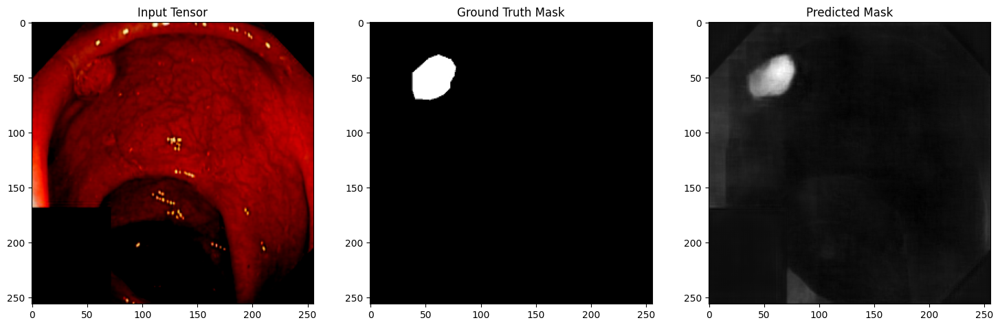

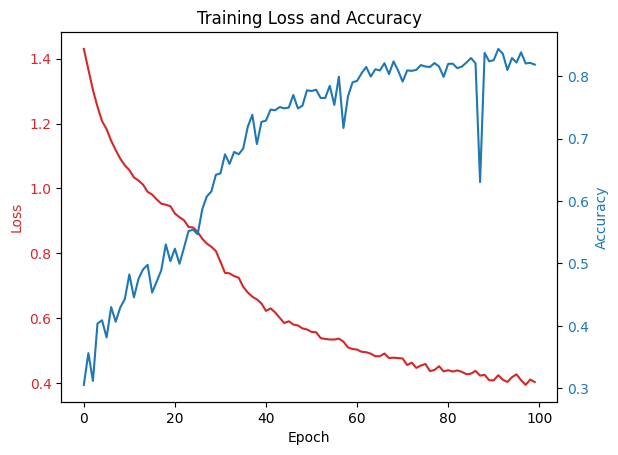

In [8]:
args_train_student = setup_train_args(my_model="unet512", dataset=dataset,
                                      data_root="./data_root/", batch_size=8, epochs=100, learning_rate=0.001)
losses, perfs, path = train_student(args_train_student, 512)
visualize_loss_acc_plot(losses, acc_list=perfs, path=path+".png")